# Problem Statement:
    
Your client is a meal delivery company which operates in multiple cities. They have various fulfillment centers in these cities for dispatching meal orders to their customers. The client wants you to help these centers with demand forecasting for upcoming weeks so that these centers will plan the stock of raw materials accordingly.

The replenishment of majority of raw materials is done on weekly basis and since the raw material is perishable, the procurement planning is of utmost importance. Secondly, staffing of the centers is also one area wherein accurate demand forecasts are really helpful. Given the following information, the task is to predict the demand for the next 10 weeks (Weeks: 146-155) for the center-meal combinations in the test set:  

1. Historical data of demand for a product-center combination (Weeks: 1 to 145)

2. Product(Meal) features such as category, sub-category, current price and discount

3. Information for fulfillment center like center area, city information etc.
 



In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split

In [2]:
meal_info = pd.read_csv("meal_info.csv")
centre_info = pd.read_csv("fulfilment_center_info.csv")
train = pd.read_csv("train.csv")
test = pd.read_csv("test_QoiMO9B.csv")

In [3]:
meal_info.head()

,meal_id,category,cuisine
0,1885,Beverages,Thai
1,1993,Beverages,Thai
2,2539,Beverages,Thai
3,1248,Beverages,Indian
4,2631,Beverages,Indian


In [4]:
centre_info.head()

,center_id,city_code,region_code,center_type,op_area
0,11,679,56,TYPE_A,3.7
1,13,590,56,TYPE_B,6.7
2,124,590,56,TYPE_C,4.0
3,66,648,34,TYPE_A,4.1
4,94,632,34,TYPE_C,3.6


In [5]:
train.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders
0,1379560,1,55,1885,136.83,152.29,0,0,177
1,1466964,1,55,1993,136.83,135.83,0,0,270
2,1346989,1,55,2539,134.86,135.86,0,0,189
3,1338232,1,55,2139,339.50,437.53,0,0,54
4,1448490,1,55,2631,243.50,242.50,0,0,40


In [6]:
test.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured
0,1028232,146,55,1885,158.11,159.11,0,0
1,1127204,146,55,1993,160.11,159.11,0,0
2,1212707,146,55,2539,157.14,159.14,0,0
3,1082698,146,55,2631,162.02,162.02,0,0
4,1400926,146,55,1248,163.93,163.93,0,0


## Universal dataframe to work on:

In [7]:
train = pd.merge(train,centre_info,how = "left",left_on = "center_id",right_on = "center_id")

In [8]:
train = pd.merge(train,meal_info,how = "left",left_on = "meal_id",right_on = "meal_id")

In [9]:
train.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,city_code,region_code,center_type,op_area,category,cuisine
0,1379560,1,55,1885,136.83,152.29,0,0,177,647,56,TYPE_C,2.0,Beverages,Thai
1,1466964,1,55,1993,136.83,135.83,0,0,270,647,56,TYPE_C,2.0,Beverages,Thai
2,1346989,1,55,2539,134.86,135.86,0,0,189,647,56,TYPE_C,2.0,Beverages,Thai
3,1338232,1,55,2139,339.50,437.53,0,0,54,647,56,TYPE_C,2.0,Beverages,Indian
4,1448490,1,55,2631,243.50,242.50,0,0,40,647,56,TYPE_C,2.0,Beverages,Indian


In [10]:
test = pd.merge(test,centre_info,how = "left",left_on = "center_id",right_on = "center_id")
test = pd.merge(test,meal_info,how = "left",left_on = "meal_id",right_on = "meal_id")

In [11]:
test.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,city_code,region_code,center_type,op_area,category,cuisine
0,1028232,146,55,1885,158.11,159.11,0,0,647,56,TYPE_C,2.0,Beverages,Thai
1,1127204,146,55,1993,160.11,159.11,0,0,647,56,TYPE_C,2.0,Beverages,Thai
2,1212707,146,55,2539,157.14,159.14,0,0,647,56,TYPE_C,2.0,Beverages,Thai
3,1082698,146,55,2631,162.02,162.02,0,0,647,56,TYPE_C,2.0,Beverages,Indian
4,1400926,146,55,1248,163.93,163.93,0,0,647,56,TYPE_C,2.0,Beverages,Indian


In [12]:
train['meal_id'].unique()

array([1885, 1993, 2539, 2139, 2631, 1248, 1778, 1062, 2707, 1207, 1230,
       2322, 2290, 1727, 1109, 2640, 2306, 2126, 2826, 1754, 1971, 1902,
       1311, 1803, 1558, 2581, 1962, 1445, 2444, 2867, 1525, 2704, 2304,
       2577, 1878, 1216, 1247, 1770, 1198, 1438, 2494, 1847, 2760, 2492,
       1543, 2664, 2569, 2490, 1571, 2956, 2104], dtype=int64)

In [12]:
train.isnull().sum()        #No missing values

id                       0
week                     0
center_id                0
meal_id                  0
checkout_price           0
base_price               0
emailer_for_promotion    0
homepage_featured        0
num_orders               0
city_code                0
region_code              0
center_type              0
op_area                  0
category                 0
cuisine                  0
dtype: int64

In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 456548 entries, 0 to 456547
Data columns (total 15 columns):
id                       456548 non-null int64
week                     456548 non-null int64
center_id                456548 non-null int64
meal_id                  456548 non-null int64
checkout_price           456548 non-null float64
base_price               456548 non-null float64
emailer_for_promotion    456548 non-null int64
homepage_featured        456548 non-null int64
num_orders               456548 non-null int64
city_code                456548 non-null int64
region_code              456548 non-null int64
center_type              456548 non-null object
op_area                  456548 non-null float64
category                 456548 non-null object
cuisine                  456548 non-null object
dtypes: float64(3), int64(9), object(3)
memory usage: 55.7+ MB


## Feature Engineering:

In [14]:
train["city-region"] = train['city_code'].astype("str") + '-' + train['region_code'].astype('str')

In [15]:
test["city-region"] = test['city_code'].astype("str") + '-' + test['region_code'].astype('str')

## Label Encoding:

In [16]:
train.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'city_code',
       'region_code', 'center_type', 'op_area', 'category', 'cuisine',
       'city-region'],
      dtype='object')

In [17]:
cols = ['center_id', 'meal_id','city_code',
       'region_code', 'center_type','category', 'cuisine',
       'city-region']
le = preprocessing.LabelEncoder()
for i in cols:
    le.fit(train[i])
    train[i + "_encoded"] = le.transform(train[i]) 
    test[i + "_encoded"] = le.transform(test[i])

In [18]:
train.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,city_code,...,cuisine,city-region,center_id_encoded,meal_id_encoded,city_code_encoded,region_code_encoded,center_type_encoded,category_encoded,cuisine_encoded,city-region_encoded
0,1379560,1,55,1885,136.83,152.29,0,0,177,647,...,Thai,647-56,23,22,30,3,2,0,3,30
1,1466964,1,55,1993,136.83,135.83,0,0,270,647,...,Thai,647-56,23,26,30,3,2,0,3,30
2,1346989,1,55,2539,134.86,135.86,0,0,189,647,...,Thai,647-56,23,38,30,3,2,0,3,30
3,1338232,1,55,2139,339.50,437.53,0,0,54,647,...,Indian,647-56,23,29,30,3,2,0,1,30
4,1448490,1,55,2631,243.50,242.50,0,0,40,647,...,Indian,647-56,23,42,30,3,2,0,1,30


## Feature Engineering: Sine and Cosine transform to capture weekly cyclic dependencies.

In [19]:
#week_sin = np.sin(2 * np.pi * week / 52.143)  #For an year
#week_cos = np.cos(2 * np.pi * week / 52.143)
train["week_sin"] = np.sin(2 * np.pi * train['week']/52.143)      #Train
train["week_cos"] = np.cos(2 * np.pi * train['week']/52.143)      #Train

test["week_sin"] = np.sin(2 * np.pi * test['week']/52.143)      #Test
test["week_cos"] = np.cos(2 * np.pi * test['week']/52.143)      #Test

## Feature Engineering: Price Difference Percentage

In [20]:
train["Price_diff_percent"] = (train['base_price'] - train['checkout_price'])/train['base_price']
test["Price_diff_percent"] = (test['base_price'] - test['checkout_price'])/test['base_price']

## Feature Engineering : Combine ad campaign features (i.e.emailer_for_promotion & homepage_featured)

In [21]:
train["combine_email_homepage"] = train['emailer_for_promotion'] + train['homepage_featured']
test["combine_email_homepage"] = test['emailer_for_promotion'] + test['homepage_featured']

## Features to train. Split them into categorical and numerical features

In [22]:
train.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'city_code',
       'region_code', 'center_type', 'op_area', 'category', 'cuisine',
       'city-region', 'center_id_encoded', 'meal_id_encoded',
       'city_code_encoded', 'region_code_encoded', 'center_type_encoded',
       'category_encoded', 'cuisine_encoded', 'city-region_encoded',
       'week_sin', 'week_cos', 'Price_diff_percent', 'combine_email_homepage'],
      dtype='object')

In [23]:
columns_to_train = ['week',
                    'week_sin', 'week_cos',
                    'checkout_price',
                    'base_price',
                    'Price_diff_percent',
                    'combine_email_homepage',
                    'city-region_encoded',
                    'center_type_encoded',
                    'op_area',
                    'category_encoded',
                    'cuisine_encoded',
                    'center_id_encoded',
                    'meal_id_encoded']

In [24]:
categorical_columns = ['combine_email_homepage',
                       'city-region_encoded',
                       'center_type_encoded',
                       'category_encoded',
                       'cuisine_encoded',
                       'center_id_encoded',
                       'meal_id_encoded']

In [25]:
numerical_columns = [col for col in columns_to_train if col not in categorical_columns]

## Distribution of Target Variable:

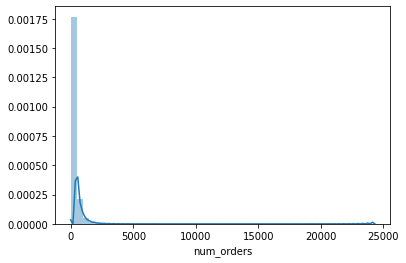

In [26]:
sns.distplot(train['num_orders'])
plt.show()

In [27]:
train['num_orders_log1p'] = np.log1p(train['num_orders'])

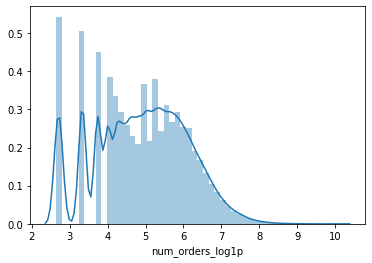

In [28]:
sns.distplot(train['num_orders_log1p'])
plt.show()

### I used the np.log1p() instead of np.log() because it is more numerically stable (i.e, log(0) is not defined).

### Train + cross_validation split:

In [29]:
X = train[categorical_columns + numerical_columns]
y = train['num_orders_log1p']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.02, shuffle=False)

## Hyper parameter Tunning:

In [53]:
from sklearn.model_selection import ParameterGrid
import pprint
scores = []
params = []

param_grid = {'num_leaves': [31, 127, 255],
              'min_child_samples': [5, 10, 30],
              'colsample_bytree': [0.4, 0.6, 0.8]}

for i, g in enumerate(ParameterGrid(param_grid)):
    print("param grid {}/{}".format(i, len(ParameterGrid(param_grid)) - 1))
    pprint.pprint(g)
    
    estimator = LGBMRegressor(learning_rate=0.003,
                              n_estimators=10000,
                              silent=False,
                              **g)
    
    fit_params = {'feature_name': categorical_columns + numerical_columns,
                  'categorical_feature': categorical_columns,
                  'eval_set': [(X_train, y_train), (X_test, y_test)]}

    estimator.fit(X_train, y_train, **fit_params)
    
    scores.append(estimator.best_score_['valid_1']['l2'])
    params.append(g)


print("Best score = {}".format(np.min(scores)))
print("Best params =")
print(params[np.argmin(scores)])

param grid 0/26
{'colsample_bytree': 0.4, 'min_child_samples': 5, 'num_leaves': 31}


C:\Users\H09847\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\basic.py:1295: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['category_encoded', 'center_id_encoded', 'center_type_encoded', 'city-region_encoded', 'combine_email_homepage', 'cuisine_encoded', 'meal_id_encoded']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 1.44555	valid_1's l2: 1.28279
[2]	training's l2: 1.44034	valid_1's l2: 1.27814
[3]	training's l2: 1.43588	valid_1's l2: 1.27399
[4]	training's l2: 1.43271	valid_1's l2: 1.27193
[5]	training's l2: 1.43044	valid_1's l2: 1.27015
[6]	training's l2: 1.42817	valid_1's l2: 1.26839
[7]	training's l2: 1.42683	valid_1's l2: 1.2675
[8]	training's l2: 1.42108	valid_1's l2: 1.2623
[9]	training's l2: 1.418	valid_1's l2: 1.26024
[10]	training's l2: 1.4125	valid_1's l2: 1.25509
[11]	training's l2: 1.40697	valid_1's l2: 1.25005
[12]	training's l2: 1.40411	valid_1's l2: 1.248
[13]	training's l2: 1.39835	valid_1's l2: 1.24295
[14]	training's l2: 1.3929	valid_1's l2: 1.23792
[15]	training's l2: 1.38837	valid_1's l2: 1.23413
[16]	training's l2: 1.38296	valid_1's l2: 1.22922
[17]	training's l2: 1.37994	valid_1's l2: 1.22727
[18]	training's l2: 1.37469	valid_1's l2: 1.22242
[19]	training's l2: 1.37096	valid_1's l2: 1.21953
[20]	training's l2: 1.36639	valid_1's l2: 1.21568
[21]	training's l

[169]	training's l2: 0.890157	valid_1's l2: 0.810865
[170]	training's l2: 0.888561	valid_1's l2: 0.809951
[171]	training's l2: 0.88577	valid_1's l2: 0.807483
[172]	training's l2: 0.883816	valid_1's l2: 0.806025
[173]	training's l2: 0.883145	valid_1's l2: 0.805314
[174]	training's l2: 0.880899	valid_1's l2: 0.803302
[175]	training's l2: 0.879345	valid_1's l2: 0.802343
[176]	training's l2: 0.876541	valid_1's l2: 0.79975
[177]	training's l2: 0.874044	valid_1's l2: 0.797629
[178]	training's l2: 0.872885	valid_1's l2: 0.796844
[179]	training's l2: 0.870041	valid_1's l2: 0.794287
[180]	training's l2: 0.868731	valid_1's l2: 0.793529
[181]	training's l2: 0.866477	valid_1's l2: 0.791512
[182]	training's l2: 0.865354	valid_1's l2: 0.790648
[183]	training's l2: 0.862913	valid_1's l2: 0.788432
[184]	training's l2: 0.860326	valid_1's l2: 0.786093
[185]	training's l2: 0.858833	valid_1's l2: 0.785227
[186]	training's l2: 0.856505	valid_1's l2: 0.783296
[187]	training's l2: 0.854122	valid_1's l2: 0.78

[332]	training's l2: 0.623679	valid_1's l2: 0.584483
[333]	training's l2: 0.622449	valid_1's l2: 0.583325
[334]	training's l2: 0.621121	valid_1's l2: 0.582179
[335]	training's l2: 0.620171	valid_1's l2: 0.581436
[336]	training's l2: 0.618809	valid_1's l2: 0.580127
[337]	training's l2: 0.617598	valid_1's l2: 0.579033
[338]	training's l2: 0.616923	valid_1's l2: 0.578659
[339]	training's l2: 0.615594	valid_1's l2: 0.577473
[340]	training's l2: 0.615152	valid_1's l2: 0.577197
[341]	training's l2: 0.613893	valid_1's l2: 0.576191
[342]	training's l2: 0.61266	valid_1's l2: 0.575023
[343]	training's l2: 0.611772	valid_1's l2: 0.574365
[344]	training's l2: 0.610486	valid_1's l2: 0.573191
[345]	training's l2: 0.6094	valid_1's l2: 0.572296
[346]	training's l2: 0.608739	valid_1's l2: 0.571884
[347]	training's l2: 0.607461	valid_1's l2: 0.57078
[348]	training's l2: 0.606961	valid_1's l2: 0.570463
[349]	training's l2: 0.606221	valid_1's l2: 0.570007
[350]	training's l2: 0.60579	valid_1's l2: 0.56972

[497]	training's l2: 0.48338	valid_1's l2: 0.465677
[498]	training's l2: 0.482612	valid_1's l2: 0.464936
[499]	training's l2: 0.482159	valid_1's l2: 0.464509
[500]	training's l2: 0.481392	valid_1's l2: 0.46376
[501]	training's l2: 0.480959	valid_1's l2: 0.463425
[502]	training's l2: 0.480199	valid_1's l2: 0.462686
[503]	training's l2: 0.479528	valid_1's l2: 0.462184
[504]	training's l2: 0.478741	valid_1's l2: 0.461476
[505]	training's l2: 0.478004	valid_1's l2: 0.460753
[506]	training's l2: 0.477232	valid_1's l2: 0.460041
[507]	training's l2: 0.476466	valid_1's l2: 0.459356
[508]	training's l2: 0.47574	valid_1's l2: 0.458756
[509]	training's l2: 0.475308	valid_1's l2: 0.458347
[510]	training's l2: 0.474588	valid_1's l2: 0.457734
[511]	training's l2: 0.473905	valid_1's l2: 0.457183
[512]	training's l2: 0.473267	valid_1's l2: 0.456663
[513]	training's l2: 0.472813	valid_1's l2: 0.456255
[514]	training's l2: 0.472092	valid_1's l2: 0.455548
[515]	training's l2: 0.471751	valid_1's l2: 0.455

[656]	training's l2: 0.409031	valid_1's l2: 0.403114
[657]	training's l2: 0.408666	valid_1's l2: 0.402848
[658]	training's l2: 0.408261	valid_1's l2: 0.4025
[659]	training's l2: 0.408043	valid_1's l2: 0.402417
[660]	training's l2: 0.407653	valid_1's l2: 0.402018
[661]	training's l2: 0.407222	valid_1's l2: 0.401623
[662]	training's l2: 0.406955	valid_1's l2: 0.401438
[663]	training's l2: 0.406564	valid_1's l2: 0.401116
[664]	training's l2: 0.406158	valid_1's l2: 0.400756
[665]	training's l2: 0.405764	valid_1's l2: 0.400431
[666]	training's l2: 0.405489	valid_1's l2: 0.400251
[667]	training's l2: 0.405178	valid_1's l2: 0.399908
[668]	training's l2: 0.404855	valid_1's l2: 0.399682
[669]	training's l2: 0.404623	valid_1's l2: 0.399495
[670]	training's l2: 0.404349	valid_1's l2: 0.39929
[671]	training's l2: 0.404115	valid_1's l2: 0.39912
[672]	training's l2: 0.403758	valid_1's l2: 0.398821
[673]	training's l2: 0.403384	valid_1's l2: 0.398439
[674]	training's l2: 0.403214	valid_1's l2: 0.3983

[816]	training's l2: 0.366571	valid_1's l2: 0.367113
[817]	training's l2: 0.36631	valid_1's l2: 0.366858
[818]	training's l2: 0.366211	valid_1's l2: 0.366788
[819]	training's l2: 0.365942	valid_1's l2: 0.366529
[820]	training's l2: 0.36572	valid_1's l2: 0.36632
[821]	training's l2: 0.365625	valid_1's l2: 0.366265
[822]	training's l2: 0.365399	valid_1's l2: 0.366091
[823]	training's l2: 0.365151	valid_1's l2: 0.36584
[824]	training's l2: 0.364936	valid_1's l2: 0.365681
[825]	training's l2: 0.364731	valid_1's l2: 0.365499
[826]	training's l2: 0.364471	valid_1's l2: 0.365263
[827]	training's l2: 0.36437	valid_1's l2: 0.36522
[828]	training's l2: 0.364114	valid_1's l2: 0.364983
[829]	training's l2: 0.363957	valid_1's l2: 0.364814
[830]	training's l2: 0.363814	valid_1's l2: 0.364676
[831]	training's l2: 0.363665	valid_1's l2: 0.364527
[832]	training's l2: 0.36342	valid_1's l2: 0.364281
[833]	training's l2: 0.3632	valid_1's l2: 0.364101
[834]	training's l2: 0.363001	valid_1's l2: 0.363936
[8

[973]	training's l2: 0.340322	valid_1's l2: 0.344988
[974]	training's l2: 0.34021	valid_1's l2: 0.344853
[975]	training's l2: 0.340091	valid_1's l2: 0.344756
[976]	training's l2: 0.339945	valid_1's l2: 0.344612
[977]	training's l2: 0.339796	valid_1's l2: 0.344495
[978]	training's l2: 0.33965	valid_1's l2: 0.344388
[979]	training's l2: 0.339498	valid_1's l2: 0.344255
[980]	training's l2: 0.339429	valid_1's l2: 0.344212
[981]	training's l2: 0.339261	valid_1's l2: 0.344077
[982]	training's l2: 0.339092	valid_1's l2: 0.34394
[983]	training's l2: 0.338913	valid_1's l2: 0.34376
[984]	training's l2: 0.338841	valid_1's l2: 0.343702
[985]	training's l2: 0.338693	valid_1's l2: 0.343573
[986]	training's l2: 0.338599	valid_1's l2: 0.343456
[987]	training's l2: 0.338418	valid_1's l2: 0.343298
[988]	training's l2: 0.338246	valid_1's l2: 0.343118
[989]	training's l2: 0.338132	valid_1's l2: 0.343029
[990]	training's l2: 0.337991	valid_1's l2: 0.34285
[991]	training's l2: 0.337829	valid_1's l2: 0.34271

[1132]	training's l2: 0.322159	valid_1's l2: 0.329195
[1133]	training's l2: 0.322041	valid_1's l2: 0.329098
[1134]	training's l2: 0.321972	valid_1's l2: 0.329026
[1135]	training's l2: 0.321877	valid_1's l2: 0.328925
[1136]	training's l2: 0.321757	valid_1's l2: 0.328808
[1137]	training's l2: 0.321703	valid_1's l2: 0.328789
[1138]	training's l2: 0.32158	valid_1's l2: 0.328693
[1139]	training's l2: 0.321486	valid_1's l2: 0.328612
[1140]	training's l2: 0.321381	valid_1's l2: 0.328539
[1141]	training's l2: 0.321319	valid_1's l2: 0.328507
[1142]	training's l2: 0.321203	valid_1's l2: 0.32838
[1143]	training's l2: 0.321151	valid_1's l2: 0.328329
[1144]	training's l2: 0.321053	valid_1's l2: 0.328256
[1145]	training's l2: 0.320952	valid_1's l2: 0.328179
[1146]	training's l2: 0.320872	valid_1's l2: 0.3281
[1147]	training's l2: 0.320785	valid_1's l2: 0.328042
[1148]	training's l2: 0.320674	valid_1's l2: 0.327945
[1149]	training's l2: 0.320577	valid_1's l2: 0.327822
[1150]	training's l2: 0.320466	v

[1289]	training's l2: 0.309811	valid_1's l2: 0.318637
[1290]	training's l2: 0.309726	valid_1's l2: 0.318557
[1291]	training's l2: 0.309688	valid_1's l2: 0.318549
[1292]	training's l2: 0.309625	valid_1's l2: 0.318491
[1293]	training's l2: 0.30953	valid_1's l2: 0.318395
[1294]	training's l2: 0.309446	valid_1's l2: 0.318315
[1295]	training's l2: 0.309411	valid_1's l2: 0.318308
[1296]	training's l2: 0.309331	valid_1's l2: 0.318234
[1297]	training's l2: 0.309238	valid_1's l2: 0.318143
[1298]	training's l2: 0.309183	valid_1's l2: 0.318127
[1299]	training's l2: 0.309142	valid_1's l2: 0.318103
[1300]	training's l2: 0.30906	valid_1's l2: 0.318029
[1301]	training's l2: 0.308975	valid_1's l2: 0.317946
[1302]	training's l2: 0.30892	valid_1's l2: 0.317908
[1303]	training's l2: 0.308843	valid_1's l2: 0.317851
[1304]	training's l2: 0.308761	valid_1's l2: 0.317774
[1305]	training's l2: 0.308701	valid_1's l2: 0.317738
[1306]	training's l2: 0.308657	valid_1's l2: 0.317719
[1307]	training's l2: 0.308587	

[1444]	training's l2: 0.300803	valid_1's l2: 0.310625
[1445]	training's l2: 0.300761	valid_1's l2: 0.310608
[1446]	training's l2: 0.300725	valid_1's l2: 0.310571
[1447]	training's l2: 0.300689	valid_1's l2: 0.310549
[1448]	training's l2: 0.300653	valid_1's l2: 0.310533
[1449]	training's l2: 0.300592	valid_1's l2: 0.310502
[1450]	training's l2: 0.300534	valid_1's l2: 0.310458
[1451]	training's l2: 0.300507	valid_1's l2: 0.310458
[1452]	training's l2: 0.300455	valid_1's l2: 0.310418
[1453]	training's l2: 0.300398	valid_1's l2: 0.310353
[1454]	training's l2: 0.300361	valid_1's l2: 0.310334
[1455]	training's l2: 0.300303	valid_1's l2: 0.310289
[1456]	training's l2: 0.300245	valid_1's l2: 0.31024
[1457]	training's l2: 0.300198	valid_1's l2: 0.310195
[1458]	training's l2: 0.300125	valid_1's l2: 0.310126
[1459]	training's l2: 0.300053	valid_1's l2: 0.310057
[1460]	training's l2: 0.299985	valid_1's l2: 0.309994
[1461]	training's l2: 0.299928	valid_1's l2: 0.309907
[1462]	training's l2: 0.2999	

[1598]	training's l2: 0.2938	valid_1's l2: 0.304524
[1599]	training's l2: 0.293742	valid_1's l2: 0.304466
[1600]	training's l2: 0.293714	valid_1's l2: 0.30445
[1601]	training's l2: 0.293681	valid_1's l2: 0.304445
[1602]	training's l2: 0.293639	valid_1's l2: 0.304399
[1603]	training's l2: 0.293609	valid_1's l2: 0.304391
[1604]	training's l2: 0.293565	valid_1's l2: 0.304339
[1605]	training's l2: 0.293526	valid_1's l2: 0.304291
[1606]	training's l2: 0.293469	valid_1's l2: 0.304233
[1607]	training's l2: 0.293413	valid_1's l2: 0.304174
[1608]	training's l2: 0.293375	valid_1's l2: 0.304143
[1609]	training's l2: 0.293318	valid_1's l2: 0.304078
[1610]	training's l2: 0.293272	valid_1's l2: 0.304033
[1611]	training's l2: 0.29324	valid_1's l2: 0.30401
[1612]	training's l2: 0.293213	valid_1's l2: 0.304027
[1613]	training's l2: 0.293181	valid_1's l2: 0.304009
[1614]	training's l2: 0.293135	valid_1's l2: 0.303963
[1615]	training's l2: 0.293095	valid_1's l2: 0.303919
[1616]	training's l2: 0.293061	va

[1755]	training's l2: 0.287829	valid_1's l2: 0.298984
[1756]	training's l2: 0.287778	valid_1's l2: 0.298934
[1757]	training's l2: 0.287747	valid_1's l2: 0.298908
[1758]	training's l2: 0.287695	valid_1's l2: 0.298862
[1759]	training's l2: 0.287665	valid_1's l2: 0.298829
[1760]	training's l2: 0.287633	valid_1's l2: 0.298814
[1761]	training's l2: 0.287589	valid_1's l2: 0.298751
[1762]	training's l2: 0.287554	valid_1's l2: 0.298723
[1763]	training's l2: 0.287526	valid_1's l2: 0.298695
[1764]	training's l2: 0.287491	valid_1's l2: 0.298666
[1765]	training's l2: 0.287462	valid_1's l2: 0.298632
[1766]	training's l2: 0.287428	valid_1's l2: 0.298595
[1767]	training's l2: 0.287403	valid_1's l2: 0.298556
[1768]	training's l2: 0.287383	valid_1's l2: 0.29856
[1769]	training's l2: 0.287355	valid_1's l2: 0.298524
[1770]	training's l2: 0.287325	valid_1's l2: 0.298493
[1771]	training's l2: 0.287307	valid_1's l2: 0.298499
[1772]	training's l2: 0.287267	valid_1's l2: 0.298438
[1773]	training's l2: 0.28722

[1909]	training's l2: 0.282634	valid_1's l2: 0.293997
[1910]	training's l2: 0.282595	valid_1's l2: 0.293955
[1911]	training's l2: 0.282565	valid_1's l2: 0.293918
[1912]	training's l2: 0.282547	valid_1's l2: 0.293907
[1913]	training's l2: 0.282518	valid_1's l2: 0.293911
[1914]	training's l2: 0.282495	valid_1's l2: 0.293885
[1915]	training's l2: 0.282468	valid_1's l2: 0.293883
[1916]	training's l2: 0.282423	valid_1's l2: 0.293833
[1917]	training's l2: 0.282388	valid_1's l2: 0.293802
[1918]	training's l2: 0.282351	valid_1's l2: 0.293759
[1919]	training's l2: 0.282316	valid_1's l2: 0.293687
[1920]	training's l2: 0.282292	valid_1's l2: 0.293662
[1921]	training's l2: 0.282271	valid_1's l2: 0.293646
[1922]	training's l2: 0.282234	valid_1's l2: 0.293617
[1923]	training's l2: 0.282193	valid_1's l2: 0.293581
[1924]	training's l2: 0.282175	valid_1's l2: 0.29356
[1925]	training's l2: 0.282135	valid_1's l2: 0.293512
[1926]	training's l2: 0.282106	valid_1's l2: 0.293496
[1927]	training's l2: 0.28207

[2071]	training's l2: 0.277904	valid_1's l2: 0.289406
[2072]	training's l2: 0.277876	valid_1's l2: 0.289396
[2073]	training's l2: 0.27785	valid_1's l2: 0.28936
[2074]	training's l2: 0.27781	valid_1's l2: 0.289317
[2075]	training's l2: 0.277779	valid_1's l2: 0.28926
[2076]	training's l2: 0.27774	valid_1's l2: 0.289219
[2077]	training's l2: 0.277711	valid_1's l2: 0.289189
[2078]	training's l2: 0.277684	valid_1's l2: 0.289147
[2079]	training's l2: 0.277647	valid_1's l2: 0.289114
[2080]	training's l2: 0.277625	valid_1's l2: 0.289076
[2081]	training's l2: 0.277594	valid_1's l2: 0.289055
[2082]	training's l2: 0.277578	valid_1's l2: 0.289038
[2083]	training's l2: 0.277557	valid_1's l2: 0.289032
[2084]	training's l2: 0.277518	valid_1's l2: 0.288988
[2085]	training's l2: 0.277486	valid_1's l2: 0.288939
[2086]	training's l2: 0.277458	valid_1's l2: 0.288918
[2087]	training's l2: 0.277425	valid_1's l2: 0.288857
[2088]	training's l2: 0.277403	valid_1's l2: 0.288856
[2089]	training's l2: 0.277372	va

[2231]	training's l2: 0.273757	valid_1's l2: 0.285413
[2232]	training's l2: 0.27374	valid_1's l2: 0.285409
[2233]	training's l2: 0.273713	valid_1's l2: 0.285378
[2234]	training's l2: 0.273688	valid_1's l2: 0.285342
[2235]	training's l2: 0.273668	valid_1's l2: 0.285332
[2236]	training's l2: 0.27365	valid_1's l2: 0.285331
[2237]	training's l2: 0.273626	valid_1's l2: 0.285323
[2238]	training's l2: 0.273613	valid_1's l2: 0.28532
[2239]	training's l2: 0.273587	valid_1's l2: 0.285291
[2240]	training's l2: 0.273571	valid_1's l2: 0.285279
[2241]	training's l2: 0.273541	valid_1's l2: 0.285228
[2242]	training's l2: 0.273518	valid_1's l2: 0.285216
[2243]	training's l2: 0.273501	valid_1's l2: 0.285205
[2244]	training's l2: 0.273484	valid_1's l2: 0.285208
[2245]	training's l2: 0.273454	valid_1's l2: 0.285162
[2246]	training's l2: 0.273436	valid_1's l2: 0.285159
[2247]	training's l2: 0.273409	valid_1's l2: 0.285105
[2248]	training's l2: 0.273387	valid_1's l2: 0.285071
[2249]	training's l2: 0.273358	

[2391]	training's l2: 0.270152	valid_1's l2: 0.282002
[2392]	training's l2: 0.27014	valid_1's l2: 0.281994
[2393]	training's l2: 0.270129	valid_1's l2: 0.281988
[2394]	training's l2: 0.270119	valid_1's l2: 0.281976
[2395]	training's l2: 0.270105	valid_1's l2: 0.281964
[2396]	training's l2: 0.270087	valid_1's l2: 0.281964
[2397]	training's l2: 0.270054	valid_1's l2: 0.281931
[2398]	training's l2: 0.27003	valid_1's l2: 0.281893
[2399]	training's l2: 0.270014	valid_1's l2: 0.281872
[2400]	training's l2: 0.270003	valid_1's l2: 0.281858
[2401]	training's l2: 0.26999	valid_1's l2: 0.28184
[2402]	training's l2: 0.269958	valid_1's l2: 0.281813
[2403]	training's l2: 0.269942	valid_1's l2: 0.281802
[2404]	training's l2: 0.269919	valid_1's l2: 0.281765
[2405]	training's l2: 0.269897	valid_1's l2: 0.281751
[2406]	training's l2: 0.269882	valid_1's l2: 0.281735
[2407]	training's l2: 0.269867	valid_1's l2: 0.281748
[2408]	training's l2: 0.269848	valid_1's l2: 0.281728
[2409]	training's l2: 0.269831	v

[2546]	training's l2: 0.267154	valid_1's l2: 0.27901
[2547]	training's l2: 0.267139	valid_1's l2: 0.278968
[2548]	training's l2: 0.267124	valid_1's l2: 0.278956
[2549]	training's l2: 0.267112	valid_1's l2: 0.278953
[2550]	training's l2: 0.267083	valid_1's l2: 0.278905
[2551]	training's l2: 0.267064	valid_1's l2: 0.278888
[2552]	training's l2: 0.267045	valid_1's l2: 0.278871
[2553]	training's l2: 0.267018	valid_1's l2: 0.278812
[2554]	training's l2: 0.266988	valid_1's l2: 0.278753
[2555]	training's l2: 0.266974	valid_1's l2: 0.278748
[2556]	training's l2: 0.26696	valid_1's l2: 0.27874
[2557]	training's l2: 0.266932	valid_1's l2: 0.278692
[2558]	training's l2: 0.266912	valid_1's l2: 0.278669
[2559]	training's l2: 0.266883	valid_1's l2: 0.278611
[2560]	training's l2: 0.266859	valid_1's l2: 0.278588
[2561]	training's l2: 0.266838	valid_1's l2: 0.278572
[2562]	training's l2: 0.266819	valid_1's l2: 0.278566
[2563]	training's l2: 0.266796	valid_1's l2: 0.278541
[2564]	training's l2: 0.266767	

[2708]	training's l2: 0.264052	valid_1's l2: 0.275157
[2709]	training's l2: 0.264029	valid_1's l2: 0.275134
[2710]	training's l2: 0.263999	valid_1's l2: 0.275094
[2711]	training's l2: 0.263985	valid_1's l2: 0.275078
[2712]	training's l2: 0.263967	valid_1's l2: 0.275066
[2713]	training's l2: 0.263947	valid_1's l2: 0.275044
[2714]	training's l2: 0.263926	valid_1's l2: 0.275019
[2715]	training's l2: 0.263902	valid_1's l2: 0.274981
[2716]	training's l2: 0.263889	valid_1's l2: 0.274984
[2717]	training's l2: 0.26388	valid_1's l2: 0.274983
[2718]	training's l2: 0.263867	valid_1's l2: 0.274982
[2719]	training's l2: 0.263847	valid_1's l2: 0.274961
[2720]	training's l2: 0.263836	valid_1's l2: 0.274971
[2721]	training's l2: 0.263814	valid_1's l2: 0.274948
[2722]	training's l2: 0.26379	valid_1's l2: 0.274924
[2723]	training's l2: 0.263774	valid_1's l2: 0.274921
[2724]	training's l2: 0.263757	valid_1's l2: 0.274915
[2725]	training's l2: 0.263746	valid_1's l2: 0.274916
[2726]	training's l2: 0.263734

[2861]	training's l2: 0.261486	valid_1's l2: 0.272252
[2862]	training's l2: 0.261474	valid_1's l2: 0.272214
[2863]	training's l2: 0.261463	valid_1's l2: 0.272211
[2864]	training's l2: 0.261436	valid_1's l2: 0.272181
[2865]	training's l2: 0.261426	valid_1's l2: 0.272178
[2866]	training's l2: 0.261404	valid_1's l2: 0.272135
[2867]	training's l2: 0.261379	valid_1's l2: 0.272089
[2868]	training's l2: 0.261352	valid_1's l2: 0.272065
[2869]	training's l2: 0.261337	valid_1's l2: 0.272061
[2870]	training's l2: 0.261319	valid_1's l2: 0.272048
[2871]	training's l2: 0.261302	valid_1's l2: 0.272028
[2872]	training's l2: 0.261279	valid_1's l2: 0.271978
[2873]	training's l2: 0.261264	valid_1's l2: 0.271977
[2874]	training's l2: 0.261253	valid_1's l2: 0.271957
[2875]	training's l2: 0.261232	valid_1's l2: 0.271937
[2876]	training's l2: 0.261219	valid_1's l2: 0.271926
[2877]	training's l2: 0.261206	valid_1's l2: 0.271926
[2878]	training's l2: 0.261197	valid_1's l2: 0.271923
[2879]	training's l2: 0.2611

[3020]	training's l2: 0.259	valid_1's l2: 0.269452
[3021]	training's l2: 0.258985	valid_1's l2: 0.269447
[3022]	training's l2: 0.258969	valid_1's l2: 0.26944
[3023]	training's l2: 0.258949	valid_1's l2: 0.269422
[3024]	training's l2: 0.258929	valid_1's l2: 0.269411
[3025]	training's l2: 0.258917	valid_1's l2: 0.269409
[3026]	training's l2: 0.258905	valid_1's l2: 0.269411
[3027]	training's l2: 0.258891	valid_1's l2: 0.269379
[3028]	training's l2: 0.258873	valid_1's l2: 0.26936
[3029]	training's l2: 0.25885	valid_1's l2: 0.269338
[3030]	training's l2: 0.258837	valid_1's l2: 0.269323
[3031]	training's l2: 0.258823	valid_1's l2: 0.269319
[3032]	training's l2: 0.258807	valid_1's l2: 0.269306
[3033]	training's l2: 0.258788	valid_1's l2: 0.269294
[3034]	training's l2: 0.258774	valid_1's l2: 0.269277
[3035]	training's l2: 0.258749	valid_1's l2: 0.269244
[3036]	training's l2: 0.258739	valid_1's l2: 0.269206
[3037]	training's l2: 0.258725	valid_1's l2: 0.269206
[3038]	training's l2: 0.258717	val

[3178]	training's l2: 0.256636	valid_1's l2: 0.266546
[3179]	training's l2: 0.256623	valid_1's l2: 0.266547
[3180]	training's l2: 0.256613	valid_1's l2: 0.266544
[3181]	training's l2: 0.256599	valid_1's l2: 0.266528
[3182]	training's l2: 0.256583	valid_1's l2: 0.266484
[3183]	training's l2: 0.256565	valid_1's l2: 0.266455
[3184]	training's l2: 0.256547	valid_1's l2: 0.26644
[3185]	training's l2: 0.256526	valid_1's l2: 0.266421
[3186]	training's l2: 0.256511	valid_1's l2: 0.266406
[3187]	training's l2: 0.256492	valid_1's l2: 0.266365
[3188]	training's l2: 0.256481	valid_1's l2: 0.266361
[3189]	training's l2: 0.256462	valid_1's l2: 0.26634
[3190]	training's l2: 0.256449	valid_1's l2: 0.266324
[3191]	training's l2: 0.256433	valid_1's l2: 0.266306
[3192]	training's l2: 0.256416	valid_1's l2: 0.266294
[3193]	training's l2: 0.256403	valid_1's l2: 0.266284
[3194]	training's l2: 0.256394	valid_1's l2: 0.266284
[3195]	training's l2: 0.256387	valid_1's l2: 0.266283
[3196]	training's l2: 0.256374

[3332]	training's l2: 0.254539	valid_1's l2: 0.264015
[3333]	training's l2: 0.254517	valid_1's l2: 0.263995
[3334]	training's l2: 0.254508	valid_1's l2: 0.263986
[3335]	training's l2: 0.254493	valid_1's l2: 0.263964
[3336]	training's l2: 0.254483	valid_1's l2: 0.263956
[3337]	training's l2: 0.254472	valid_1's l2: 0.263944
[3338]	training's l2: 0.25445	valid_1's l2: 0.263921
[3339]	training's l2: 0.254436	valid_1's l2: 0.263909
[3340]	training's l2: 0.254428	valid_1's l2: 0.263907
[3341]	training's l2: 0.254419	valid_1's l2: 0.263901
[3342]	training's l2: 0.254402	valid_1's l2: 0.263885
[3343]	training's l2: 0.25439	valid_1's l2: 0.263875
[3344]	training's l2: 0.254373	valid_1's l2: 0.263844
[3345]	training's l2: 0.254366	valid_1's l2: 0.263842
[3346]	training's l2: 0.254348	valid_1's l2: 0.263815
[3347]	training's l2: 0.25434	valid_1's l2: 0.263802
[3348]	training's l2: 0.254331	valid_1's l2: 0.263799
[3349]	training's l2: 0.254322	valid_1's l2: 0.263777
[3350]	training's l2: 0.254313	

[3492]	training's l2: 0.252469	valid_1's l2: 0.261691
[3493]	training's l2: 0.252446	valid_1's l2: 0.261673
[3494]	training's l2: 0.252435	valid_1's l2: 0.261665
[3495]	training's l2: 0.252424	valid_1's l2: 0.261655
[3496]	training's l2: 0.252405	valid_1's l2: 0.26163
[3497]	training's l2: 0.252394	valid_1's l2: 0.26162
[3498]	training's l2: 0.252387	valid_1's l2: 0.26161
[3499]	training's l2: 0.252374	valid_1's l2: 0.26161
[3500]	training's l2: 0.252361	valid_1's l2: 0.261595
[3501]	training's l2: 0.252356	valid_1's l2: 0.261589
[3502]	training's l2: 0.252336	valid_1's l2: 0.261573
[3503]	training's l2: 0.252318	valid_1's l2: 0.26156
[3504]	training's l2: 0.252301	valid_1's l2: 0.261536
[3505]	training's l2: 0.252292	valid_1's l2: 0.261537
[3506]	training's l2: 0.252283	valid_1's l2: 0.261536
[3507]	training's l2: 0.252277	valid_1's l2: 0.261534
[3508]	training's l2: 0.252267	valid_1's l2: 0.261522
[3509]	training's l2: 0.252248	valid_1's l2: 0.261498
[3510]	training's l2: 0.252236	va

[3652]	training's l2: 0.25035	valid_1's l2: 0.259351
[3653]	training's l2: 0.250339	valid_1's l2: 0.259342
[3654]	training's l2: 0.25033	valid_1's l2: 0.259339
[3655]	training's l2: 0.250311	valid_1's l2: 0.259323
[3656]	training's l2: 0.250295	valid_1's l2: 0.259301
[3657]	training's l2: 0.250275	valid_1's l2: 0.259286
[3658]	training's l2: 0.250265	valid_1's l2: 0.259281
[3659]	training's l2: 0.25026	valid_1's l2: 0.259282
[3660]	training's l2: 0.25024	valid_1's l2: 0.259264
[3661]	training's l2: 0.25022	valid_1's l2: 0.259245
[3662]	training's l2: 0.25021	valid_1's l2: 0.259233
[3663]	training's l2: 0.250197	valid_1's l2: 0.259223
[3664]	training's l2: 0.250186	valid_1's l2: 0.259215
[3665]	training's l2: 0.250173	valid_1's l2: 0.259205
[3666]	training's l2: 0.25016	valid_1's l2: 0.259202
[3667]	training's l2: 0.250149	valid_1's l2: 0.259191
[3668]	training's l2: 0.250136	valid_1's l2: 0.259158
[3669]	training's l2: 0.250128	valid_1's l2: 0.259156
[3670]	training's l2: 0.250119	vali

[3805]	training's l2: 0.248519	valid_1's l2: 0.257269
[3806]	training's l2: 0.248506	valid_1's l2: 0.257265
[3807]	training's l2: 0.2485	valid_1's l2: 0.257262
[3808]	training's l2: 0.248493	valid_1's l2: 0.257257
[3809]	training's l2: 0.248484	valid_1's l2: 0.257246
[3810]	training's l2: 0.248473	valid_1's l2: 0.257242
[3811]	training's l2: 0.248461	valid_1's l2: 0.257236
[3812]	training's l2: 0.248447	valid_1's l2: 0.257228
[3813]	training's l2: 0.248434	valid_1's l2: 0.257224
[3814]	training's l2: 0.24842	valid_1's l2: 0.257217
[3815]	training's l2: 0.248409	valid_1's l2: 0.257213
[3816]	training's l2: 0.248397	valid_1's l2: 0.257201
[3817]	training's l2: 0.248391	valid_1's l2: 0.2572
[3818]	training's l2: 0.248384	valid_1's l2: 0.257196
[3819]	training's l2: 0.248376	valid_1's l2: 0.257191
[3820]	training's l2: 0.248366	valid_1's l2: 0.257183
[3821]	training's l2: 0.248345	valid_1's l2: 0.257158
[3822]	training's l2: 0.248326	valid_1's l2: 0.25714
[3823]	training's l2: 0.248314	val

[3966]	training's l2: 0.246761	valid_1's l2: 0.255396
[3967]	training's l2: 0.246752	valid_1's l2: 0.255389
[3968]	training's l2: 0.246741	valid_1's l2: 0.255376
[3969]	training's l2: 0.24673	valid_1's l2: 0.255361
[3970]	training's l2: 0.246721	valid_1's l2: 0.255351
[3971]	training's l2: 0.246708	valid_1's l2: 0.255337
[3972]	training's l2: 0.246696	valid_1's l2: 0.255317
[3973]	training's l2: 0.24669	valid_1's l2: 0.25531
[3974]	training's l2: 0.246682	valid_1's l2: 0.255301
[3975]	training's l2: 0.246673	valid_1's l2: 0.255294
[3976]	training's l2: 0.246653	valid_1's l2: 0.255272
[3977]	training's l2: 0.246641	valid_1's l2: 0.255266
[3978]	training's l2: 0.246622	valid_1's l2: 0.255249
[3979]	training's l2: 0.246601	valid_1's l2: 0.255228
[3980]	training's l2: 0.246594	valid_1's l2: 0.255223
[3981]	training's l2: 0.246582	valid_1's l2: 0.255213
[3982]	training's l2: 0.246568	valid_1's l2: 0.255198
[3983]	training's l2: 0.246562	valid_1's l2: 0.255163
[3984]	training's l2: 0.246553	

[4126]	training's l2: 0.24508	valid_1's l2: 0.253497
[4127]	training's l2: 0.245071	valid_1's l2: 0.253489
[4128]	training's l2: 0.245064	valid_1's l2: 0.253475
[4129]	training's l2: 0.245059	valid_1's l2: 0.253474
[4130]	training's l2: 0.245037	valid_1's l2: 0.253452
[4131]	training's l2: 0.245027	valid_1's l2: 0.253451
[4132]	training's l2: 0.245018	valid_1's l2: 0.253442
[4133]	training's l2: 0.24501	valid_1's l2: 0.253436
[4134]	training's l2: 0.245002	valid_1's l2: 0.253432
[4135]	training's l2: 0.244992	valid_1's l2: 0.253421
[4136]	training's l2: 0.244987	valid_1's l2: 0.253419
[4137]	training's l2: 0.24498	valid_1's l2: 0.253412
[4138]	training's l2: 0.244959	valid_1's l2: 0.253366
[4139]	training's l2: 0.244951	valid_1's l2: 0.253359
[4140]	training's l2: 0.244943	valid_1's l2: 0.253351
[4141]	training's l2: 0.244937	valid_1's l2: 0.253351
[4142]	training's l2: 0.244928	valid_1's l2: 0.253346
[4143]	training's l2: 0.244923	valid_1's l2: 0.253333
[4144]	training's l2: 0.244918	

[4287]	training's l2: 0.243462	valid_1's l2: 0.251504
[4288]	training's l2: 0.243456	valid_1's l2: 0.251497
[4289]	training's l2: 0.243452	valid_1's l2: 0.251496
[4290]	training's l2: 0.243441	valid_1's l2: 0.251488
[4291]	training's l2: 0.243435	valid_1's l2: 0.251488
[4292]	training's l2: 0.24343	valid_1's l2: 0.25148
[4293]	training's l2: 0.243424	valid_1's l2: 0.251476
[4294]	training's l2: 0.243414	valid_1's l2: 0.25147
[4295]	training's l2: 0.243404	valid_1's l2: 0.251439
[4296]	training's l2: 0.243393	valid_1's l2: 0.251435
[4297]	training's l2: 0.243378	valid_1's l2: 0.251394
[4298]	training's l2: 0.243371	valid_1's l2: 0.251386
[4299]	training's l2: 0.243363	valid_1's l2: 0.251382
[4300]	training's l2: 0.243357	valid_1's l2: 0.25138
[4301]	training's l2: 0.243351	valid_1's l2: 0.251377
[4302]	training's l2: 0.243335	valid_1's l2: 0.251365
[4303]	training's l2: 0.243329	valid_1's l2: 0.251361
[4304]	training's l2: 0.243315	valid_1's l2: 0.251347
[4305]	training's l2: 0.243305	v

[4450]	training's l2: 0.241977	valid_1's l2: 0.249797
[4451]	training's l2: 0.241968	valid_1's l2: 0.249787
[4452]	training's l2: 0.241959	valid_1's l2: 0.249778
[4453]	training's l2: 0.241952	valid_1's l2: 0.249773
[4454]	training's l2: 0.241946	valid_1's l2: 0.249765
[4455]	training's l2: 0.241938	valid_1's l2: 0.249762
[4456]	training's l2: 0.241928	valid_1's l2: 0.249757
[4457]	training's l2: 0.241922	valid_1's l2: 0.249752
[4458]	training's l2: 0.241911	valid_1's l2: 0.249741
[4459]	training's l2: 0.241906	valid_1's l2: 0.24972
[4460]	training's l2: 0.241892	valid_1's l2: 0.249711
[4461]	training's l2: 0.241873	valid_1's l2: 0.24969
[4462]	training's l2: 0.241866	valid_1's l2: 0.249672
[4463]	training's l2: 0.241856	valid_1's l2: 0.249668
[4464]	training's l2: 0.241848	valid_1's l2: 0.249664
[4465]	training's l2: 0.241836	valid_1's l2: 0.249648
[4466]	training's l2: 0.241822	valid_1's l2: 0.249645
[4467]	training's l2: 0.241808	valid_1's l2: 0.249636
[4468]	training's l2: 0.241793

[4612]	training's l2: 0.240675	valid_1's l2: 0.248353
[4613]	training's l2: 0.24067	valid_1's l2: 0.24835
[4614]	training's l2: 0.240662	valid_1's l2: 0.248344
[4615]	training's l2: 0.240659	valid_1's l2: 0.24832
[4616]	training's l2: 0.240653	valid_1's l2: 0.248319
[4617]	training's l2: 0.240647	valid_1's l2: 0.248305
[4618]	training's l2: 0.240641	valid_1's l2: 0.248302
[4619]	training's l2: 0.240633	valid_1's l2: 0.248294
[4620]	training's l2: 0.24062	valid_1's l2: 0.24828
[4621]	training's l2: 0.240604	valid_1's l2: 0.248264
[4622]	training's l2: 0.240599	valid_1's l2: 0.248264
[4623]	training's l2: 0.240593	valid_1's l2: 0.24826
[4624]	training's l2: 0.240581	valid_1's l2: 0.248247
[4625]	training's l2: 0.240573	valid_1's l2: 0.248244
[4626]	training's l2: 0.240567	valid_1's l2: 0.248243
[4627]	training's l2: 0.24056	valid_1's l2: 0.248234
[4628]	training's l2: 0.24055	valid_1's l2: 0.24823
[4629]	training's l2: 0.240543	valid_1's l2: 0.24823
[4630]	training's l2: 0.240539	valid_1

[4774]	training's l2: 0.239354	valid_1's l2: 0.247294
[4775]	training's l2: 0.239347	valid_1's l2: 0.247288
[4776]	training's l2: 0.239342	valid_1's l2: 0.247287
[4777]	training's l2: 0.239336	valid_1's l2: 0.247283
[4778]	training's l2: 0.23933	valid_1's l2: 0.247282
[4779]	training's l2: 0.23932	valid_1's l2: 0.247277
[4780]	training's l2: 0.239314	valid_1's l2: 0.247276
[4781]	training's l2: 0.239299	valid_1's l2: 0.24726
[4782]	training's l2: 0.239286	valid_1's l2: 0.247247
[4783]	training's l2: 0.239272	valid_1's l2: 0.247233
[4784]	training's l2: 0.239266	valid_1's l2: 0.247215
[4785]	training's l2: 0.239259	valid_1's l2: 0.24721
[4786]	training's l2: 0.239254	valid_1's l2: 0.24721
[4787]	training's l2: 0.23924	valid_1's l2: 0.247195
[4788]	training's l2: 0.239228	valid_1's l2: 0.247187
[4789]	training's l2: 0.239211	valid_1's l2: 0.247168
[4790]	training's l2: 0.239203	valid_1's l2: 0.247154
[4791]	training's l2: 0.239194	valid_1's l2: 0.247151
[4792]	training's l2: 0.23919	vali

[4930]	training's l2: 0.238105	valid_1's l2: 0.246234
[4931]	training's l2: 0.238095	valid_1's l2: 0.246228
[4932]	training's l2: 0.238085	valid_1's l2: 0.246217
[4933]	training's l2: 0.23808	valid_1's l2: 0.246209
[4934]	training's l2: 0.238068	valid_1's l2: 0.246197
[4935]	training's l2: 0.238058	valid_1's l2: 0.246196
[4936]	training's l2: 0.238052	valid_1's l2: 0.24619
[4937]	training's l2: 0.238042	valid_1's l2: 0.246181
[4938]	training's l2: 0.238031	valid_1's l2: 0.246181
[4939]	training's l2: 0.238024	valid_1's l2: 0.246162
[4940]	training's l2: 0.238017	valid_1's l2: 0.246159
[4941]	training's l2: 0.238012	valid_1's l2: 0.246155
[4942]	training's l2: 0.238006	valid_1's l2: 0.24615
[4943]	training's l2: 0.237992	valid_1's l2: 0.246137
[4944]	training's l2: 0.237988	valid_1's l2: 0.246135
[4945]	training's l2: 0.237983	valid_1's l2: 0.246135
[4946]	training's l2: 0.237977	valid_1's l2: 0.246133
[4947]	training's l2: 0.237971	valid_1's l2: 0.246133
[4948]	training's l2: 0.23796	v

[5239]	training's l2: 0.235766	valid_1's l2: 0.244096
[5240]	training's l2: 0.235758	valid_1's l2: 0.244093
[5241]	training's l2: 0.235744	valid_1's l2: 0.244081
[5242]	training's l2: 0.235738	valid_1's l2: 0.244077
[5243]	training's l2: 0.235733	valid_1's l2: 0.244073
[5244]	training's l2: 0.235729	valid_1's l2: 0.244073
[5245]	training's l2: 0.235722	valid_1's l2: 0.244076
[5246]	training's l2: 0.235711	valid_1's l2: 0.244035
[5247]	training's l2: 0.235706	valid_1's l2: 0.244028
[5248]	training's l2: 0.235697	valid_1's l2: 0.24402
[5249]	training's l2: 0.23569	valid_1's l2: 0.244006
[5250]	training's l2: 0.235682	valid_1's l2: 0.244004
[5251]	training's l2: 0.235668	valid_1's l2: 0.243992
[5252]	training's l2: 0.235658	valid_1's l2: 0.243987
[5253]	training's l2: 0.235652	valid_1's l2: 0.243986
[5254]	training's l2: 0.235648	valid_1's l2: 0.243978
[5255]	training's l2: 0.235639	valid_1's l2: 0.243971
[5256]	training's l2: 0.235633	valid_1's l2: 0.243963
[5257]	training's l2: 0.235622

[5398]	training's l2: 0.23467	valid_1's l2: 0.243173
[5399]	training's l2: 0.234657	valid_1's l2: 0.243165
[5400]	training's l2: 0.234651	valid_1's l2: 0.243161
[5401]	training's l2: 0.234646	valid_1's l2: 0.243155
[5402]	training's l2: 0.234641	valid_1's l2: 0.243153
[5403]	training's l2: 0.234637	valid_1's l2: 0.243153
[5404]	training's l2: 0.234631	valid_1's l2: 0.243147
[5405]	training's l2: 0.234623	valid_1's l2: 0.24314
[5406]	training's l2: 0.234618	valid_1's l2: 0.243139
[5407]	training's l2: 0.234614	valid_1's l2: 0.243139
[5408]	training's l2: 0.2346	valid_1's l2: 0.243126
[5409]	training's l2: 0.234597	valid_1's l2: 0.243122
[5410]	training's l2: 0.23459	valid_1's l2: 0.24312
[5411]	training's l2: 0.234586	valid_1's l2: 0.243116
[5412]	training's l2: 0.23458	valid_1's l2: 0.243116
[5413]	training's l2: 0.234576	valid_1's l2: 0.243112
[5414]	training's l2: 0.234567	valid_1's l2: 0.243104
[5415]	training's l2: 0.234562	valid_1's l2: 0.243102
[5416]	training's l2: 0.234559	vali

[5553]	training's l2: 0.23367	valid_1's l2: 0.242333
[5554]	training's l2: 0.233659	valid_1's l2: 0.242318
[5555]	training's l2: 0.233646	valid_1's l2: 0.242304
[5556]	training's l2: 0.233641	valid_1's l2: 0.242303
[5557]	training's l2: 0.233635	valid_1's l2: 0.242299
[5558]	training's l2: 0.23363	valid_1's l2: 0.242294
[5559]	training's l2: 0.233626	valid_1's l2: 0.24229
[5560]	training's l2: 0.233622	valid_1's l2: 0.242289
[5561]	training's l2: 0.233618	valid_1's l2: 0.242284
[5562]	training's l2: 0.233606	valid_1's l2: 0.242271
[5563]	training's l2: 0.233602	valid_1's l2: 0.242269
[5564]	training's l2: 0.233596	valid_1's l2: 0.242267
[5565]	training's l2: 0.233592	valid_1's l2: 0.242259
[5566]	training's l2: 0.233588	valid_1's l2: 0.242259
[5567]	training's l2: 0.233583	valid_1's l2: 0.242257
[5568]	training's l2: 0.233579	valid_1's l2: 0.242254
[5569]	training's l2: 0.233576	valid_1's l2: 0.242252
[5570]	training's l2: 0.233567	valid_1's l2: 0.242243
[5571]	training's l2: 0.233558	

[5863]	training's l2: 0.23179	valid_1's l2: 0.240793
[5864]	training's l2: 0.231784	valid_1's l2: 0.240793
[5865]	training's l2: 0.23178	valid_1's l2: 0.240792
[5866]	training's l2: 0.231773	valid_1's l2: 0.240782
[5867]	training's l2: 0.231766	valid_1's l2: 0.240781
[5868]	training's l2: 0.231763	valid_1's l2: 0.240774
[5869]	training's l2: 0.231757	valid_1's l2: 0.240766
[5870]	training's l2: 0.231746	valid_1's l2: 0.240755
[5871]	training's l2: 0.231736	valid_1's l2: 0.240748
[5872]	training's l2: 0.231729	valid_1's l2: 0.240736
[5873]	training's l2: 0.231719	valid_1's l2: 0.240718
[5874]	training's l2: 0.231705	valid_1's l2: 0.240703
[5875]	training's l2: 0.231695	valid_1's l2: 0.240696
[5876]	training's l2: 0.231693	valid_1's l2: 0.240687
[5877]	training's l2: 0.231687	valid_1's l2: 0.240687
[5878]	training's l2: 0.231681	valid_1's l2: 0.240687
[5879]	training's l2: 0.231675	valid_1's l2: 0.240682
[5880]	training's l2: 0.231666	valid_1's l2: 0.240674
[5881]	training's l2: 0.231662

[6021]	training's l2: 0.230844	valid_1's l2: 0.240046
[6022]	training's l2: 0.230841	valid_1's l2: 0.240044
[6023]	training's l2: 0.230838	valid_1's l2: 0.240042
[6024]	training's l2: 0.230832	valid_1's l2: 0.240032
[6025]	training's l2: 0.230828	valid_1's l2: 0.240027
[6026]	training's l2: 0.230822	valid_1's l2: 0.240023
[6027]	training's l2: 0.230819	valid_1's l2: 0.240021
[6028]	training's l2: 0.230815	valid_1's l2: 0.240021
[6029]	training's l2: 0.230811	valid_1's l2: 0.240021
[6030]	training's l2: 0.230807	valid_1's l2: 0.240021
[6031]	training's l2: 0.230802	valid_1's l2: 0.240019
[6032]	training's l2: 0.230799	valid_1's l2: 0.240017
[6033]	training's l2: 0.230795	valid_1's l2: 0.240007
[6034]	training's l2: 0.230784	valid_1's l2: 0.239998
[6035]	training's l2: 0.23078	valid_1's l2: 0.239995
[6036]	training's l2: 0.230775	valid_1's l2: 0.239994
[6037]	training's l2: 0.230771	valid_1's l2: 0.239992
[6038]	training's l2: 0.230765	valid_1's l2: 0.239984
[6039]	training's l2: 0.23076

[6185]	training's l2: 0.229903	valid_1's l2: 0.239359
[6186]	training's l2: 0.229899	valid_1's l2: 0.239357
[6187]	training's l2: 0.229887	valid_1's l2: 0.239345
[6188]	training's l2: 0.229882	valid_1's l2: 0.239345
[6189]	training's l2: 0.229874	valid_1's l2: 0.239343
[6190]	training's l2: 0.229865	valid_1's l2: 0.239338
[6191]	training's l2: 0.22986	valid_1's l2: 0.239333
[6192]	training's l2: 0.229856	valid_1's l2: 0.239333
[6193]	training's l2: 0.22985	valid_1's l2: 0.239332
[6194]	training's l2: 0.229845	valid_1's l2: 0.239331
[6195]	training's l2: 0.22984	valid_1's l2: 0.239325
[6196]	training's l2: 0.229834	valid_1's l2: 0.239318
[6197]	training's l2: 0.229829	valid_1's l2: 0.239313
[6198]	training's l2: 0.229825	valid_1's l2: 0.239309
[6199]	training's l2: 0.229822	valid_1's l2: 0.239306
[6200]	training's l2: 0.229816	valid_1's l2: 0.239303
[6201]	training's l2: 0.229809	valid_1's l2: 0.239298
[6202]	training's l2: 0.229803	valid_1's l2: 0.239297
[6203]	training's l2: 0.229799	

[6340]	training's l2: 0.229056	valid_1's l2: 0.238645
[6341]	training's l2: 0.229044	valid_1's l2: 0.238633
[6342]	training's l2: 0.229042	valid_1's l2: 0.238632
[6343]	training's l2: 0.229037	valid_1's l2: 0.23863
[6344]	training's l2: 0.229031	valid_1's l2: 0.238616
[6345]	training's l2: 0.229025	valid_1's l2: 0.23861
[6346]	training's l2: 0.229019	valid_1's l2: 0.238606
[6347]	training's l2: 0.229014	valid_1's l2: 0.238603
[6348]	training's l2: 0.229011	valid_1's l2: 0.238602
[6349]	training's l2: 0.229007	valid_1's l2: 0.238602
[6350]	training's l2: 0.229003	valid_1's l2: 0.238601
[6351]	training's l2: 0.228998	valid_1's l2: 0.238598
[6352]	training's l2: 0.228994	valid_1's l2: 0.2386
[6353]	training's l2: 0.228986	valid_1's l2: 0.238596
[6354]	training's l2: 0.228977	valid_1's l2: 0.238589
[6355]	training's l2: 0.228973	valid_1's l2: 0.238585
[6356]	training's l2: 0.228967	valid_1's l2: 0.23858
[6357]	training's l2: 0.228964	valid_1's l2: 0.238578
[6358]	training's l2: 0.228958	va

[6499]	training's l2: 0.22823	valid_1's l2: 0.238095
[6500]	training's l2: 0.228226	valid_1's l2: 0.238093
[6501]	training's l2: 0.228221	valid_1's l2: 0.238046
[6502]	training's l2: 0.228217	valid_1's l2: 0.238042
[6503]	training's l2: 0.228208	valid_1's l2: 0.238036
[6504]	training's l2: 0.228202	valid_1's l2: 0.238027
[6505]	training's l2: 0.228199	valid_1's l2: 0.238024
[6506]	training's l2: 0.228196	valid_1's l2: 0.238025
[6507]	training's l2: 0.228192	valid_1's l2: 0.238026
[6508]	training's l2: 0.228186	valid_1's l2: 0.238021
[6509]	training's l2: 0.228181	valid_1's l2: 0.238014
[6510]	training's l2: 0.228178	valid_1's l2: 0.238011
[6511]	training's l2: 0.228175	valid_1's l2: 0.23801
[6512]	training's l2: 0.22817	valid_1's l2: 0.23801
[6513]	training's l2: 0.228167	valid_1's l2: 0.238008
[6514]	training's l2: 0.228162	valid_1's l2: 0.238007
[6515]	training's l2: 0.228159	valid_1's l2: 0.238007
[6516]	training's l2: 0.228155	valid_1's l2: 0.238007
[6517]	training's l2: 0.228151	v

[6659]	training's l2: 0.227461	valid_1's l2: 0.237565
[6660]	training's l2: 0.227459	valid_1's l2: 0.237567
[6661]	training's l2: 0.227455	valid_1's l2: 0.237567
[6662]	training's l2: 0.227449	valid_1's l2: 0.237567
[6663]	training's l2: 0.227445	valid_1's l2: 0.237566
[6664]	training's l2: 0.227436	valid_1's l2: 0.237559
[6665]	training's l2: 0.227433	valid_1's l2: 0.237557
[6666]	training's l2: 0.227428	valid_1's l2: 0.237559
[6667]	training's l2: 0.227423	valid_1's l2: 0.237558
[6668]	training's l2: 0.227418	valid_1's l2: 0.237556
[6669]	training's l2: 0.22741	valid_1's l2: 0.237556
[6670]	training's l2: 0.227408	valid_1's l2: 0.237555
[6671]	training's l2: 0.227398	valid_1's l2: 0.237544
[6672]	training's l2: 0.227395	valid_1's l2: 0.237541
[6673]	training's l2: 0.22739	valid_1's l2: 0.237539
[6674]	training's l2: 0.227384	valid_1's l2: 0.237523
[6675]	training's l2: 0.227378	valid_1's l2: 0.237518
[6676]	training's l2: 0.227375	valid_1's l2: 0.237517
[6677]	training's l2: 0.227373

[6823]	training's l2: 0.2267	valid_1's l2: 0.237102
[6824]	training's l2: 0.226692	valid_1's l2: 0.237066
[6825]	training's l2: 0.226687	valid_1's l2: 0.237062
[6826]	training's l2: 0.22668	valid_1's l2: 0.237059
[6827]	training's l2: 0.226673	valid_1's l2: 0.237052
[6828]	training's l2: 0.226671	valid_1's l2: 0.237053
[6829]	training's l2: 0.226669	valid_1's l2: 0.237053
[6830]	training's l2: 0.226665	valid_1's l2: 0.237053
[6831]	training's l2: 0.226662	valid_1's l2: 0.237051
[6832]	training's l2: 0.226658	valid_1's l2: 0.237046
[6833]	training's l2: 0.226655	valid_1's l2: 0.237045
[6834]	training's l2: 0.226653	valid_1's l2: 0.237038
[6835]	training's l2: 0.22665	valid_1's l2: 0.237038
[6836]	training's l2: 0.226642	valid_1's l2: 0.237034
[6837]	training's l2: 0.226639	valid_1's l2: 0.237032
[6838]	training's l2: 0.226635	valid_1's l2: 0.237028
[6839]	training's l2: 0.226631	valid_1's l2: 0.237026
[6840]	training's l2: 0.226625	valid_1's l2: 0.237025
[6841]	training's l2: 0.226621	v

[6989]	training's l2: 0.225976	valid_1's l2: 0.236683
[6990]	training's l2: 0.225971	valid_1's l2: 0.236683
[6991]	training's l2: 0.225967	valid_1's l2: 0.236679
[6992]	training's l2: 0.225961	valid_1's l2: 0.236673
[6993]	training's l2: 0.225958	valid_1's l2: 0.236671
[6994]	training's l2: 0.225953	valid_1's l2: 0.236669
[6995]	training's l2: 0.225947	valid_1's l2: 0.236669
[6996]	training's l2: 0.225942	valid_1's l2: 0.236669
[6997]	training's l2: 0.22594	valid_1's l2: 0.236669
[6998]	training's l2: 0.225939	valid_1's l2: 0.236669
[6999]	training's l2: 0.225932	valid_1's l2: 0.236668
[7000]	training's l2: 0.22593	valid_1's l2: 0.23667
[7001]	training's l2: 0.225918	valid_1's l2: 0.236662
[7002]	training's l2: 0.225913	valid_1's l2: 0.236658
[7003]	training's l2: 0.225908	valid_1's l2: 0.236653
[7004]	training's l2: 0.225902	valid_1's l2: 0.236653
[7005]	training's l2: 0.225896	valid_1's l2: 0.236648
[7006]	training's l2: 0.225893	valid_1's l2: 0.236646
[7007]	training's l2: 0.225891	

[7144]	training's l2: 0.225345	valid_1's l2: 0.236331
[7145]	training's l2: 0.225339	valid_1's l2: 0.236325
[7146]	training's l2: 0.225336	valid_1's l2: 0.236323
[7147]	training's l2: 0.225332	valid_1's l2: 0.236317
[7148]	training's l2: 0.22533	valid_1's l2: 0.236309
[7149]	training's l2: 0.225327	valid_1's l2: 0.236309
[7150]	training's l2: 0.225324	valid_1's l2: 0.236307
[7151]	training's l2: 0.22532	valid_1's l2: 0.236306
[7152]	training's l2: 0.225316	valid_1's l2: 0.236302
[7153]	training's l2: 0.22531	valid_1's l2: 0.236304
[7154]	training's l2: 0.225306	valid_1's l2: 0.236305
[7155]	training's l2: 0.225303	valid_1's l2: 0.236303
[7156]	training's l2: 0.225294	valid_1's l2: 0.236291
[7157]	training's l2: 0.225291	valid_1's l2: 0.23629
[7158]	training's l2: 0.225287	valid_1's l2: 0.236287
[7159]	training's l2: 0.225284	valid_1's l2: 0.236284
[7160]	training's l2: 0.22528	valid_1's l2: 0.236284
[7161]	training's l2: 0.225273	valid_1's l2: 0.236283
[7162]	training's l2: 0.22527	val

[7298]	training's l2: 0.224677	valid_1's l2: 0.236
[7299]	training's l2: 0.224671	valid_1's l2: 0.235998
[7300]	training's l2: 0.224666	valid_1's l2: 0.235997
[7301]	training's l2: 0.224664	valid_1's l2: 0.235996
[7302]	training's l2: 0.224661	valid_1's l2: 0.235993
[7303]	training's l2: 0.224652	valid_1's l2: 0.235992
[7304]	training's l2: 0.224646	valid_1's l2: 0.23599
[7305]	training's l2: 0.224642	valid_1's l2: 0.235989
[7306]	training's l2: 0.224639	valid_1's l2: 0.23599
[7307]	training's l2: 0.224633	valid_1's l2: 0.235987
[7308]	training's l2: 0.224631	valid_1's l2: 0.235987
[7309]	training's l2: 0.224628	valid_1's l2: 0.235987
[7310]	training's l2: 0.224623	valid_1's l2: 0.235985
[7311]	training's l2: 0.224615	valid_1's l2: 0.235976
[7312]	training's l2: 0.224613	valid_1's l2: 0.235976
[7313]	training's l2: 0.22461	valid_1's l2: 0.235974
[7314]	training's l2: 0.224607	valid_1's l2: 0.235973
[7315]	training's l2: 0.224604	valid_1's l2: 0.235971
[7316]	training's l2: 0.224595	val

[7466]	training's l2: 0.224002	valid_1's l2: 0.235642
[7467]	training's l2: 0.224	valid_1's l2: 0.235635
[7468]	training's l2: 0.223997	valid_1's l2: 0.235634
[7469]	training's l2: 0.223995	valid_1's l2: 0.235634
[7470]	training's l2: 0.223993	valid_1's l2: 0.23563
[7471]	training's l2: 0.223984	valid_1's l2: 0.235621
[7472]	training's l2: 0.223981	valid_1's l2: 0.235619
[7473]	training's l2: 0.223979	valid_1's l2: 0.235619
[7474]	training's l2: 0.223976	valid_1's l2: 0.235619
[7475]	training's l2: 0.223966	valid_1's l2: 0.235613
[7476]	training's l2: 0.223962	valid_1's l2: 0.235613
[7477]	training's l2: 0.223956	valid_1's l2: 0.235609
[7478]	training's l2: 0.223951	valid_1's l2: 0.235609
[7479]	training's l2: 0.223948	valid_1's l2: 0.235609
[7480]	training's l2: 0.223946	valid_1's l2: 0.235608
[7481]	training's l2: 0.223945	valid_1's l2: 0.235607
[7482]	training's l2: 0.223942	valid_1's l2: 0.235607
[7483]	training's l2: 0.223938	valid_1's l2: 0.235605
[7484]	training's l2: 0.223936	v

[7620]	training's l2: 0.223408	valid_1's l2: 0.235342
[7621]	training's l2: 0.223404	valid_1's l2: 0.235339
[7622]	training's l2: 0.223403	valid_1's l2: 0.235341
[7623]	training's l2: 0.223398	valid_1's l2: 0.235339
[7624]	training's l2: 0.223389	valid_1's l2: 0.23533
[7625]	training's l2: 0.223381	valid_1's l2: 0.235322
[7626]	training's l2: 0.223375	valid_1's l2: 0.235323
[7627]	training's l2: 0.223371	valid_1's l2: 0.235322
[7628]	training's l2: 0.223369	valid_1's l2: 0.235318
[7629]	training's l2: 0.223368	valid_1's l2: 0.235317
[7630]	training's l2: 0.223361	valid_1's l2: 0.235312
[7631]	training's l2: 0.223359	valid_1's l2: 0.235312
[7632]	training's l2: 0.223357	valid_1's l2: 0.235311
[7633]	training's l2: 0.223354	valid_1's l2: 0.23531
[7634]	training's l2: 0.223349	valid_1's l2: 0.235304
[7635]	training's l2: 0.223347	valid_1's l2: 0.235304
[7636]	training's l2: 0.223344	valid_1's l2: 0.235304
[7637]	training's l2: 0.223341	valid_1's l2: 0.235302
[7638]	training's l2: 0.22334	

[7932]	training's l2: 0.222227	valid_1's l2: 0.234693
[7933]	training's l2: 0.222224	valid_1's l2: 0.234693
[7934]	training's l2: 0.222222	valid_1's l2: 0.234687
[7935]	training's l2: 0.222221	valid_1's l2: 0.234687
[7936]	training's l2: 0.222218	valid_1's l2: 0.234681
[7937]	training's l2: 0.222215	valid_1's l2: 0.234676
[7938]	training's l2: 0.222205	valid_1's l2: 0.234667
[7939]	training's l2: 0.222201	valid_1's l2: 0.234665
[7940]	training's l2: 0.222198	valid_1's l2: 0.234663
[7941]	training's l2: 0.222196	valid_1's l2: 0.234664
[7942]	training's l2: 0.222194	valid_1's l2: 0.234663
[7943]	training's l2: 0.22219	valid_1's l2: 0.234663
[7944]	training's l2: 0.222183	valid_1's l2: 0.234663
[7945]	training's l2: 0.222178	valid_1's l2: 0.234661
[7946]	training's l2: 0.222176	valid_1's l2: 0.234661
[7947]	training's l2: 0.222169	valid_1's l2: 0.234656
[7948]	training's l2: 0.222167	valid_1's l2: 0.234658
[7949]	training's l2: 0.222165	valid_1's l2: 0.234657
[7950]	training's l2: 0.22216

[8087]	training's l2: 0.221656	valid_1's l2: 0.234355
[8088]	training's l2: 0.221651	valid_1's l2: 0.234351
[8089]	training's l2: 0.221649	valid_1's l2: 0.234351
[8090]	training's l2: 0.22164	valid_1's l2: 0.234345
[8091]	training's l2: 0.221637	valid_1's l2: 0.234344
[8092]	training's l2: 0.221633	valid_1's l2: 0.234344
[8093]	training's l2: 0.221631	valid_1's l2: 0.234343
[8094]	training's l2: 0.221629	valid_1's l2: 0.234342
[8095]	training's l2: 0.221625	valid_1's l2: 0.234342
[8096]	training's l2: 0.221621	valid_1's l2: 0.234341
[8097]	training's l2: 0.221616	valid_1's l2: 0.23434
[8098]	training's l2: 0.221613	valid_1's l2: 0.234339
[8099]	training's l2: 0.221611	valid_1's l2: 0.234339
[8100]	training's l2: 0.221608	valid_1's l2: 0.234338
[8101]	training's l2: 0.221606	valid_1's l2: 0.234335
[8102]	training's l2: 0.221603	valid_1's l2: 0.234336
[8103]	training's l2: 0.2216	valid_1's l2: 0.234335
[8104]	training's l2: 0.221598	valid_1's l2: 0.234334
[8105]	training's l2: 0.221595	v

[8246]	training's l2: 0.2211	valid_1's l2: 0.234065
[8247]	training's l2: 0.221099	valid_1's l2: 0.234064
[8248]	training's l2: 0.221095	valid_1's l2: 0.234064
[8249]	training's l2: 0.221088	valid_1's l2: 0.234057
[8250]	training's l2: 0.221085	valid_1's l2: 0.234057
[8251]	training's l2: 0.221082	valid_1's l2: 0.234054
[8252]	training's l2: 0.221079	valid_1's l2: 0.234053
[8253]	training's l2: 0.221074	valid_1's l2: 0.234052
[8254]	training's l2: 0.221066	valid_1's l2: 0.234047
[8255]	training's l2: 0.22106	valid_1's l2: 0.234043
[8256]	training's l2: 0.221054	valid_1's l2: 0.234039
[8257]	training's l2: 0.221052	valid_1's l2: 0.234039
[8258]	training's l2: 0.221048	valid_1's l2: 0.234033
[8259]	training's l2: 0.221046	valid_1's l2: 0.234032
[8260]	training's l2: 0.221043	valid_1's l2: 0.234032
[8261]	training's l2: 0.22104	valid_1's l2: 0.234031
[8262]	training's l2: 0.221038	valid_1's l2: 0.23403
[8263]	training's l2: 0.221033	valid_1's l2: 0.234027
[8264]	training's l2: 0.221031	va

[8401]	training's l2: 0.22056	valid_1's l2: 0.233718
[8402]	training's l2: 0.220552	valid_1's l2: 0.233711
[8403]	training's l2: 0.220549	valid_1's l2: 0.233711
[8404]	training's l2: 0.220547	valid_1's l2: 0.23371
[8405]	training's l2: 0.220544	valid_1's l2: 0.23371
[8406]	training's l2: 0.220543	valid_1's l2: 0.233709
[8407]	training's l2: 0.22054	valid_1's l2: 0.233709
[8408]	training's l2: 0.220532	valid_1's l2: 0.233703
[8409]	training's l2: 0.220529	valid_1's l2: 0.233703
[8410]	training's l2: 0.220527	valid_1's l2: 0.233702
[8411]	training's l2: 0.220524	valid_1's l2: 0.233702
[8412]	training's l2: 0.220522	valid_1's l2: 0.233699
[8413]	training's l2: 0.220517	valid_1's l2: 0.233698
[8414]	training's l2: 0.220512	valid_1's l2: 0.233695
[8415]	training's l2: 0.220508	valid_1's l2: 0.233695
[8416]	training's l2: 0.220507	valid_1's l2: 0.233694
[8417]	training's l2: 0.220504	valid_1's l2: 0.233694
[8418]	training's l2: 0.220503	valid_1's l2: 0.233693
[8419]	training's l2: 0.2205	val

[8562]	training's l2: 0.220014	valid_1's l2: 0.233487
[8563]	training's l2: 0.220012	valid_1's l2: 0.233485
[8564]	training's l2: 0.220007	valid_1's l2: 0.233485
[8565]	training's l2: 0.220005	valid_1's l2: 0.233481
[8566]	training's l2: 0.220002	valid_1's l2: 0.23348
[8567]	training's l2: 0.219999	valid_1's l2: 0.233477
[8568]	training's l2: 0.219997	valid_1's l2: 0.233477
[8569]	training's l2: 0.219989	valid_1's l2: 0.233469
[8570]	training's l2: 0.219984	valid_1's l2: 0.233464
[8571]	training's l2: 0.219982	valid_1's l2: 0.233458
[8572]	training's l2: 0.219979	valid_1's l2: 0.233457
[8573]	training's l2: 0.219972	valid_1's l2: 0.23345
[8574]	training's l2: 0.219971	valid_1's l2: 0.23345
[8575]	training's l2: 0.219967	valid_1's l2: 0.233448
[8576]	training's l2: 0.219963	valid_1's l2: 0.233445
[8577]	training's l2: 0.219962	valid_1's l2: 0.233446
[8578]	training's l2: 0.21996	valid_1's l2: 0.233446
[8579]	training's l2: 0.219958	valid_1's l2: 0.233445
[8580]	training's l2: 0.219956	v

[8727]	training's l2: 0.219439	valid_1's l2: 0.23315
[8728]	training's l2: 0.219438	valid_1's l2: 0.233148
[8729]	training's l2: 0.219436	valid_1's l2: 0.233148
[8730]	training's l2: 0.219431	valid_1's l2: 0.233139
[8731]	training's l2: 0.219427	valid_1's l2: 0.233142
[8732]	training's l2: 0.219426	valid_1's l2: 0.233142
[8733]	training's l2: 0.219424	valid_1's l2: 0.233141
[8734]	training's l2: 0.219423	valid_1's l2: 0.233141
[8735]	training's l2: 0.21942	valid_1's l2: 0.23314
[8736]	training's l2: 0.219418	valid_1's l2: 0.23314
[8737]	training's l2: 0.219416	valid_1's l2: 0.23314
[8738]	training's l2: 0.219413	valid_1's l2: 0.233134
[8739]	training's l2: 0.219412	valid_1's l2: 0.233132
[8740]	training's l2: 0.219411	valid_1's l2: 0.233132
[8741]	training's l2: 0.219406	valid_1's l2: 0.233136
[8742]	training's l2: 0.219404	valid_1's l2: 0.233134
[8743]	training's l2: 0.2194	valid_1's l2: 0.233133
[8744]	training's l2: 0.219396	valid_1's l2: 0.233135
[8745]	training's l2: 0.219394	vali

[8894]	training's l2: 0.218926	valid_1's l2: 0.232851
[8895]	training's l2: 0.218923	valid_1's l2: 0.232847
[8896]	training's l2: 0.218921	valid_1's l2: 0.232846
[8897]	training's l2: 0.21892	valid_1's l2: 0.232846
[8898]	training's l2: 0.218917	valid_1's l2: 0.232845
[8899]	training's l2: 0.218914	valid_1's l2: 0.232847
[8900]	training's l2: 0.218911	valid_1's l2: 0.232846
[8901]	training's l2: 0.218907	valid_1's l2: 0.232845
[8902]	training's l2: 0.218903	valid_1's l2: 0.23284
[8903]	training's l2: 0.218897	valid_1's l2: 0.232833
[8904]	training's l2: 0.218895	valid_1's l2: 0.232833
[8905]	training's l2: 0.218892	valid_1's l2: 0.232833
[8906]	training's l2: 0.218886	valid_1's l2: 0.232829
[8907]	training's l2: 0.218878	valid_1's l2: 0.23282
[8908]	training's l2: 0.218877	valid_1's l2: 0.232821
[8909]	training's l2: 0.218874	valid_1's l2: 0.232822
[8910]	training's l2: 0.218873	valid_1's l2: 0.232822
[8911]	training's l2: 0.218871	valid_1's l2: 0.232821
[8912]	training's l2: 0.218868	

[9051]	training's l2: 0.218442	valid_1's l2: 0.232618
[9052]	training's l2: 0.21844	valid_1's l2: 0.232617
[9053]	training's l2: 0.218437	valid_1's l2: 0.232617
[9054]	training's l2: 0.218435	valid_1's l2: 0.232618
[9055]	training's l2: 0.218429	valid_1's l2: 0.232614
[9056]	training's l2: 0.218426	valid_1's l2: 0.232612
[9057]	training's l2: 0.218423	valid_1's l2: 0.232612
[9058]	training's l2: 0.21842	valid_1's l2: 0.232611
[9059]	training's l2: 0.218418	valid_1's l2: 0.232609
[9060]	training's l2: 0.218415	valid_1's l2: 0.232607
[9061]	training's l2: 0.218413	valid_1's l2: 0.232607
[9062]	training's l2: 0.218411	valid_1's l2: 0.232607
[9063]	training's l2: 0.218409	valid_1's l2: 0.232601
[9064]	training's l2: 0.218407	valid_1's l2: 0.2326
[9065]	training's l2: 0.218399	valid_1's l2: 0.232593
[9066]	training's l2: 0.218397	valid_1's l2: 0.232593
[9067]	training's l2: 0.218394	valid_1's l2: 0.232592
[9068]	training's l2: 0.21839	valid_1's l2: 0.232586
[9069]	training's l2: 0.218387	va

[9204]	training's l2: 0.217938	valid_1's l2: 0.23233
[9205]	training's l2: 0.217933	valid_1's l2: 0.232326
[9206]	training's l2: 0.217931	valid_1's l2: 0.232325
[9207]	training's l2: 0.21793	valid_1's l2: 0.232328
[9208]	training's l2: 0.217928	valid_1's l2: 0.232327
[9209]	training's l2: 0.217926	valid_1's l2: 0.232327
[9210]	training's l2: 0.217919	valid_1's l2: 0.232321
[9211]	training's l2: 0.217915	valid_1's l2: 0.232317
[9212]	training's l2: 0.217912	valid_1's l2: 0.232317
[9213]	training's l2: 0.21791	valid_1's l2: 0.232317
[9214]	training's l2: 0.217909	valid_1's l2: 0.23231
[9215]	training's l2: 0.217907	valid_1's l2: 0.23231
[9216]	training's l2: 0.217904	valid_1's l2: 0.232308
[9217]	training's l2: 0.217903	valid_1's l2: 0.232307
[9218]	training's l2: 0.2179	valid_1's l2: 0.232304
[9219]	training's l2: 0.217898	valid_1's l2: 0.232304
[9220]	training's l2: 0.217895	valid_1's l2: 0.232302
[9221]	training's l2: 0.217888	valid_1's l2: 0.232297
[9222]	training's l2: 0.217886	vali

[9360]	training's l2: 0.217467	valid_1's l2: 0.232083
[9361]	training's l2: 0.217465	valid_1's l2: 0.232083
[9362]	training's l2: 0.217462	valid_1's l2: 0.232082
[9363]	training's l2: 0.217455	valid_1's l2: 0.232077
[9364]	training's l2: 0.217453	valid_1's l2: 0.232076
[9365]	training's l2: 0.217446	valid_1's l2: 0.232071
[9366]	training's l2: 0.217444	valid_1's l2: 0.23207
[9367]	training's l2: 0.21744	valid_1's l2: 0.232068
[9368]	training's l2: 0.217438	valid_1's l2: 0.232065
[9369]	training's l2: 0.217435	valid_1's l2: 0.232065
[9370]	training's l2: 0.217434	valid_1's l2: 0.232064
[9371]	training's l2: 0.217433	valid_1's l2: 0.232067
[9372]	training's l2: 0.217431	valid_1's l2: 0.232066
[9373]	training's l2: 0.217428	valid_1's l2: 0.232066
[9374]	training's l2: 0.217426	valid_1's l2: 0.232065
[9375]	training's l2: 0.217424	valid_1's l2: 0.232064
[9376]	training's l2: 0.217422	valid_1's l2: 0.232063
[9377]	training's l2: 0.217421	valid_1's l2: 0.232064
[9378]	training's l2: 0.217418

[9518]	training's l2: 0.216978	valid_1's l2: 0.231812
[9519]	training's l2: 0.216976	valid_1's l2: 0.231812
[9520]	training's l2: 0.216974	valid_1's l2: 0.231812
[9521]	training's l2: 0.216973	valid_1's l2: 0.231811
[9522]	training's l2: 0.216971	valid_1's l2: 0.231811
[9523]	training's l2: 0.216968	valid_1's l2: 0.231808
[9524]	training's l2: 0.216965	valid_1's l2: 0.231808
[9525]	training's l2: 0.216961	valid_1's l2: 0.231808
[9526]	training's l2: 0.21696	valid_1's l2: 0.231807
[9527]	training's l2: 0.216957	valid_1's l2: 0.231805
[9528]	training's l2: 0.216954	valid_1's l2: 0.231804
[9529]	training's l2: 0.216952	valid_1's l2: 0.231803
[9530]	training's l2: 0.216951	valid_1's l2: 0.231803
[9531]	training's l2: 0.216949	valid_1's l2: 0.231803
[9532]	training's l2: 0.216947	valid_1's l2: 0.231801
[9533]	training's l2: 0.216945	valid_1's l2: 0.231801
[9534]	training's l2: 0.216944	valid_1's l2: 0.2318
[9535]	training's l2: 0.216941	valid_1's l2: 0.231799
[9536]	training's l2: 0.216935	

[9675]	training's l2: 0.216547	valid_1's l2: 0.231626
[9676]	training's l2: 0.216545	valid_1's l2: 0.231625
[9677]	training's l2: 0.216543	valid_1's l2: 0.231623
[9678]	training's l2: 0.216535	valid_1's l2: 0.231617
[9679]	training's l2: 0.216534	valid_1's l2: 0.231617
[9680]	training's l2: 0.216531	valid_1's l2: 0.231618
[9681]	training's l2: 0.216526	valid_1's l2: 0.231603
[9682]	training's l2: 0.216524	valid_1's l2: 0.231603
[9683]	training's l2: 0.216519	valid_1's l2: 0.231603
[9684]	training's l2: 0.216516	valid_1's l2: 0.231601
[9685]	training's l2: 0.216515	valid_1's l2: 0.231601
[9686]	training's l2: 0.216513	valid_1's l2: 0.231601
[9687]	training's l2: 0.216512	valid_1's l2: 0.231601
[9688]	training's l2: 0.216509	valid_1's l2: 0.2316
[9689]	training's l2: 0.216507	valid_1's l2: 0.2316
[9690]	training's l2: 0.216506	valid_1's l2: 0.231601
[9691]	training's l2: 0.216504	valid_1's l2: 0.2316
[9692]	training's l2: 0.216501	valid_1's l2: 0.231602
[9693]	training's l2: 0.216499	val

[9840]	training's l2: 0.216076	valid_1's l2: 0.23142
[9841]	training's l2: 0.216074	valid_1's l2: 0.23142
[9842]	training's l2: 0.216073	valid_1's l2: 0.231419
[9843]	training's l2: 0.216071	valid_1's l2: 0.231419
[9844]	training's l2: 0.21607	valid_1's l2: 0.231418
[9845]	training's l2: 0.216068	valid_1's l2: 0.231418
[9846]	training's l2: 0.216059	valid_1's l2: 0.231414
[9847]	training's l2: 0.216052	valid_1's l2: 0.23141
[9848]	training's l2: 0.21605	valid_1's l2: 0.231409
[9849]	training's l2: 0.216048	valid_1's l2: 0.231408
[9850]	training's l2: 0.216044	valid_1's l2: 0.231404
[9851]	training's l2: 0.216039	valid_1's l2: 0.2314
[9852]	training's l2: 0.216038	valid_1's l2: 0.231399
[9853]	training's l2: 0.216035	valid_1's l2: 0.231398
[9854]	training's l2: 0.216034	valid_1's l2: 0.231399
[9855]	training's l2: 0.216029	valid_1's l2: 0.231395
[9856]	training's l2: 0.216026	valid_1's l2: 0.231393
[9857]	training's l2: 0.216022	valid_1's l2: 0.231393
[9858]	training's l2: 0.216021	vali

[10000]	training's l2: 0.215632	valid_1's l2: 0.231254
param grid 1/26
{'colsample_bytree': 0.4, 'min_child_samples': 5, 'num_leaves': 127}
[1]	training's l2: 1.44528	valid_1's l2: 1.28255
[2]	training's l2: 1.43981	valid_1's l2: 1.27774
[3]	training's l2: 1.43516	valid_1's l2: 1.27345
[4]	training's l2: 1.43128	valid_1's l2: 1.27091
[5]	training's l2: 1.42835	valid_1's l2: 1.26864
[6]	training's l2: 1.42544	valid_1's l2: 1.2664
[7]	training's l2: 1.42404	valid_1's l2: 1.26548
[8]	training's l2: 1.41788	valid_1's l2: 1.25997
[9]	training's l2: 1.41405	valid_1's l2: 1.25739
[10]	training's l2: 1.40826	valid_1's l2: 1.25199
[11]	training's l2: 1.40216	valid_1's l2: 1.24646
[12]	training's l2: 1.39852	valid_1's l2: 1.24393
[13]	training's l2: 1.39229	valid_1's l2: 1.23849
[14]	training's l2: 1.38628	valid_1's l2: 1.23302
[15]	training's l2: 1.38141	valid_1's l2: 1.2289
[16]	training's l2: 1.37547	valid_1's l2: 1.22353
[17]	training's l2: 1.37183	valid_1's l2: 1.221
[18]	training's l2: 1.3

[317]	training's l2: 0.58155	valid_1's l2: 0.549487
[318]	training's l2: 0.581003	valid_1's l2: 0.549176
[319]	training's l2: 0.579502	valid_1's l2: 0.547893
[320]	training's l2: 0.578109	valid_1's l2: 0.546605
[321]	training's l2: 0.576524	valid_1's l2: 0.545165
[322]	training's l2: 0.57491	valid_1's l2: 0.543736
[323]	training's l2: 0.573415	valid_1's l2: 0.542348
[324]	training's l2: 0.571946	valid_1's l2: 0.540938
[325]	training's l2: 0.570486	valid_1's l2: 0.539529
[326]	training's l2: 0.569076	valid_1's l2: 0.53828
[327]	training's l2: 0.567996	valid_1's l2: 0.537383
[328]	training's l2: 0.566434	valid_1's l2: 0.536011
[329]	training's l2: 0.564934	valid_1's l2: 0.534692
[330]	training's l2: 0.563376	valid_1's l2: 0.533311
[331]	training's l2: 0.562043	valid_1's l2: 0.532177
[332]	training's l2: 0.560889	valid_1's l2: 0.531136
[333]	training's l2: 0.559696	valid_1's l2: 0.530008
[334]	training's l2: 0.558352	valid_1's l2: 0.528854
[335]	training's l2: 0.557293	valid_1's l2: 0.527

[477]	training's l2: 0.433449	valid_1's l2: 0.420914
[478]	training's l2: 0.432618	valid_1's l2: 0.420176
[479]	training's l2: 0.432167	valid_1's l2: 0.41989
[480]	training's l2: 0.431389	valid_1's l2: 0.419142
[481]	training's l2: 0.430584	valid_1's l2: 0.418356
[482]	training's l2: 0.430286	valid_1's l2: 0.418149
[483]	training's l2: 0.429694	valid_1's l2: 0.417695
[484]	training's l2: 0.428878	valid_1's l2: 0.416982
[485]	training's l2: 0.428554	valid_1's l2: 0.416759
[486]	training's l2: 0.427853	valid_1's l2: 0.416093
[487]	training's l2: 0.427174	valid_1's l2: 0.415501
[488]	training's l2: 0.426376	valid_1's l2: 0.414791
[489]	training's l2: 0.425867	valid_1's l2: 0.414382
[490]	training's l2: 0.425112	valid_1's l2: 0.413722
[491]	training's l2: 0.424827	valid_1's l2: 0.413523
[492]	training's l2: 0.424029	valid_1's l2: 0.412827
[493]	training's l2: 0.423679	valid_1's l2: 0.412549
[494]	training's l2: 0.423335	valid_1's l2: 0.412316
[495]	training's l2: 0.422932	valid_1's l2: 0.4

[638]	training's l2: 0.356163	valid_1's l2: 0.35444
[639]	training's l2: 0.355721	valid_1's l2: 0.354058
[640]	training's l2: 0.355429	valid_1's l2: 0.353801
[641]	training's l2: 0.355039	valid_1's l2: 0.353484
[642]	training's l2: 0.354678	valid_1's l2: 0.353136
[643]	training's l2: 0.35428	valid_1's l2: 0.352784
[644]	training's l2: 0.353876	valid_1's l2: 0.352399
[645]	training's l2: 0.353667	valid_1's l2: 0.352286
[646]	training's l2: 0.353226	valid_1's l2: 0.351863
[647]	training's l2: 0.352793	valid_1's l2: 0.351479
[648]	training's l2: 0.352418	valid_1's l2: 0.351153
[649]	training's l2: 0.35214	valid_1's l2: 0.3509
[650]	training's l2: 0.351719	valid_1's l2: 0.350531
[651]	training's l2: 0.351292	valid_1's l2: 0.350154
[652]	training's l2: 0.351071	valid_1's l2: 0.350051
[653]	training's l2: 0.350646	valid_1's l2: 0.34967
[654]	training's l2: 0.350487	valid_1's l2: 0.349566
[655]	training's l2: 0.350066	valid_1's l2: 0.349191
[656]	training's l2: 0.349683	valid_1's l2: 0.348884

[797]	training's l2: 0.313677	valid_1's l2: 0.318264
[798]	training's l2: 0.313421	valid_1's l2: 0.318018
[799]	training's l2: 0.313218	valid_1's l2: 0.317866
[800]	training's l2: 0.313091	valid_1's l2: 0.317828
[801]	training's l2: 0.312843	valid_1's l2: 0.317595
[802]	training's l2: 0.312586	valid_1's l2: 0.317361
[803]	training's l2: 0.312329	valid_1's l2: 0.317131
[804]	training's l2: 0.312124	valid_1's l2: 0.316959
[805]	training's l2: 0.31187	valid_1's l2: 0.316735
[806]	training's l2: 0.311641	valid_1's l2: 0.316512
[807]	training's l2: 0.311491	valid_1's l2: 0.316396
[808]	training's l2: 0.311288	valid_1's l2: 0.316243
[809]	training's l2: 0.311201	valid_1's l2: 0.316212
[810]	training's l2: 0.310985	valid_1's l2: 0.315995
[811]	training's l2: 0.310775	valid_1's l2: 0.315779
[812]	training's l2: 0.310622	valid_1's l2: 0.315652
[813]	training's l2: 0.310514	valid_1's l2: 0.31558
[814]	training's l2: 0.310272	valid_1's l2: 0.315374
[815]	training's l2: 0.310122	valid_1's l2: 0.31

[957]	training's l2: 0.288365	valid_1's l2: 0.296364
[958]	training's l2: 0.288297	valid_1's l2: 0.29633
[959]	training's l2: 0.288139	valid_1's l2: 0.296185
[960]	training's l2: 0.288003	valid_1's l2: 0.296073
[961]	training's l2: 0.287865	valid_1's l2: 0.295936
[962]	training's l2: 0.287798	valid_1's l2: 0.295901
[963]	training's l2: 0.287642	valid_1's l2: 0.295762
[964]	training's l2: 0.287508	valid_1's l2: 0.295644
[965]	training's l2: 0.287382	valid_1's l2: 0.295534
[966]	training's l2: 0.287261	valid_1's l2: 0.295441
[967]	training's l2: 0.287111	valid_1's l2: 0.295297
[968]	training's l2: 0.286969	valid_1's l2: 0.295144
[969]	training's l2: 0.286823	valid_1's l2: 0.294983
[970]	training's l2: 0.286755	valid_1's l2: 0.294944
[971]	training's l2: 0.286611	valid_1's l2: 0.294792
[972]	training's l2: 0.286514	valid_1's l2: 0.294706
[973]	training's l2: 0.286366	valid_1's l2: 0.294568
[974]	training's l2: 0.28624	valid_1's l2: 0.2945
[975]	training's l2: 0.286118	valid_1's l2: 0.2944

[1111]	training's l2: 0.272166	valid_1's l2: 0.282025
[1112]	training's l2: 0.272073	valid_1's l2: 0.281921
[1113]	training's l2: 0.271975	valid_1's l2: 0.281826
[1114]	training's l2: 0.271877	valid_1's l2: 0.28172
[1115]	training's l2: 0.271786	valid_1's l2: 0.281626
[1116]	training's l2: 0.271744	valid_1's l2: 0.281601
[1117]	training's l2: 0.271659	valid_1's l2: 0.281533
[1118]	training's l2: 0.271545	valid_1's l2: 0.281428
[1119]	training's l2: 0.271441	valid_1's l2: 0.281313
[1120]	training's l2: 0.271396	valid_1's l2: 0.28127
[1121]	training's l2: 0.271315	valid_1's l2: 0.281183
[1122]	training's l2: 0.271208	valid_1's l2: 0.28109
[1123]	training's l2: 0.271101	valid_1's l2: 0.280988
[1124]	training's l2: 0.27101	valid_1's l2: 0.280895
[1125]	training's l2: 0.270921	valid_1's l2: 0.28085
[1126]	training's l2: 0.270833	valid_1's l2: 0.280765
[1127]	training's l2: 0.270756	valid_1's l2: 0.28073
[1128]	training's l2: 0.270711	valid_1's l2: 0.280705
[1129]	training's l2: 0.270609	val

[1264]	training's l2: 0.261043	valid_1's l2: 0.27238
[1265]	training's l2: 0.260968	valid_1's l2: 0.272308
[1266]	training's l2: 0.260894	valid_1's l2: 0.272244
[1267]	training's l2: 0.260862	valid_1's l2: 0.272221
[1268]	training's l2: 0.260816	valid_1's l2: 0.272167
[1269]	training's l2: 0.260736	valid_1's l2: 0.272092
[1270]	training's l2: 0.260662	valid_1's l2: 0.272025
[1271]	training's l2: 0.260622	valid_1's l2: 0.271997
[1272]	training's l2: 0.260552	valid_1's l2: 0.271928
[1273]	training's l2: 0.260484	valid_1's l2: 0.271862
[1274]	training's l2: 0.260414	valid_1's l2: 0.271791
[1275]	training's l2: 0.260349	valid_1's l2: 0.27174
[1276]	training's l2: 0.260289	valid_1's l2: 0.271689
[1277]	training's l2: 0.260229	valid_1's l2: 0.271646
[1278]	training's l2: 0.260175	valid_1's l2: 0.271536
[1279]	training's l2: 0.260131	valid_1's l2: 0.271491
[1280]	training's l2: 0.260087	valid_1's l2: 0.271436
[1281]	training's l2: 0.260022	valid_1's l2: 0.271383
[1282]	training's l2: 0.259965

[1421]	training's l2: 0.252598	valid_1's l2: 0.26537
[1422]	training's l2: 0.252571	valid_1's l2: 0.265358
[1423]	training's l2: 0.252517	valid_1's l2: 0.265314
[1424]	training's l2: 0.252462	valid_1's l2: 0.265268
[1425]	training's l2: 0.252406	valid_1's l2: 0.265225
[1426]	training's l2: 0.252359	valid_1's l2: 0.265196
[1427]	training's l2: 0.25232	valid_1's l2: 0.265161
[1428]	training's l2: 0.252286	valid_1's l2: 0.265153
[1429]	training's l2: 0.252236	valid_1's l2: 0.265114
[1430]	training's l2: 0.25221	valid_1's l2: 0.265106
[1431]	training's l2: 0.252154	valid_1's l2: 0.265054
[1432]	training's l2: 0.252099	valid_1's l2: 0.264998
[1433]	training's l2: 0.25207	valid_1's l2: 0.264986
[1434]	training's l2: 0.252025	valid_1's l2: 0.264947
[1435]	training's l2: 0.251973	valid_1's l2: 0.264887
[1436]	training's l2: 0.251918	valid_1's l2: 0.264835
[1437]	training's l2: 0.251874	valid_1's l2: 0.264824
[1438]	training's l2: 0.251824	valid_1's l2: 0.264775
[1439]	training's l2: 0.251767	v

[1580]	training's l2: 0.245719	valid_1's l2: 0.259641
[1581]	training's l2: 0.245681	valid_1's l2: 0.259623
[1582]	training's l2: 0.245634	valid_1's l2: 0.259578
[1583]	training's l2: 0.245587	valid_1's l2: 0.259547
[1584]	training's l2: 0.245548	valid_1's l2: 0.259522
[1585]	training's l2: 0.245506	valid_1's l2: 0.259486
[1586]	training's l2: 0.245476	valid_1's l2: 0.259488
[1587]	training's l2: 0.245429	valid_1's l2: 0.25946
[1588]	training's l2: 0.245404	valid_1's l2: 0.25946
[1589]	training's l2: 0.245365	valid_1's l2: 0.25943
[1590]	training's l2: 0.245338	valid_1's l2: 0.259398
[1591]	training's l2: 0.245319	valid_1's l2: 0.259396
[1592]	training's l2: 0.245291	valid_1's l2: 0.259382
[1593]	training's l2: 0.24524	valid_1's l2: 0.259387
[1594]	training's l2: 0.245203	valid_1's l2: 0.259339
[1595]	training's l2: 0.245179	valid_1's l2: 0.259335
[1596]	training's l2: 0.245152	valid_1's l2: 0.259313
[1597]	training's l2: 0.245119	valid_1's l2: 0.259298
[1598]	training's l2: 0.245087	v

[1734]	training's l2: 0.240388	valid_1's l2: 0.255759
[1735]	training's l2: 0.240351	valid_1's l2: 0.255732
[1736]	training's l2: 0.240317	valid_1's l2: 0.255716
[1737]	training's l2: 0.24028	valid_1's l2: 0.25567
[1738]	training's l2: 0.24026	valid_1's l2: 0.255666
[1739]	training's l2: 0.240215	valid_1's l2: 0.255613
[1740]	training's l2: 0.240171	valid_1's l2: 0.255561
[1741]	training's l2: 0.240135	valid_1's l2: 0.255522
[1742]	training's l2: 0.240108	valid_1's l2: 0.2555
[1743]	training's l2: 0.240077	valid_1's l2: 0.255487
[1744]	training's l2: 0.240055	valid_1's l2: 0.255483
[1745]	training's l2: 0.240012	valid_1's l2: 0.255456
[1746]	training's l2: 0.239993	valid_1's l2: 0.255437
[1747]	training's l2: 0.239969	valid_1's l2: 0.25541
[1748]	training's l2: 0.239955	valid_1's l2: 0.255407
[1749]	training's l2: 0.239923	valid_1's l2: 0.255373
[1750]	training's l2: 0.239887	valid_1's l2: 0.255336
[1751]	training's l2: 0.239852	valid_1's l2: 0.255307
[1752]	training's l2: 0.239814	val

[1891]	training's l2: 0.235551	valid_1's l2: 0.251833
[1892]	training's l2: 0.235513	valid_1's l2: 0.251791
[1893]	training's l2: 0.235492	valid_1's l2: 0.25179
[1894]	training's l2: 0.235464	valid_1's l2: 0.251768
[1895]	training's l2: 0.235437	valid_1's l2: 0.25176
[1896]	training's l2: 0.235414	valid_1's l2: 0.251745
[1897]	training's l2: 0.235384	valid_1's l2: 0.251716
[1898]	training's l2: 0.235351	valid_1's l2: 0.251707
[1899]	training's l2: 0.235311	valid_1's l2: 0.251682
[1900]	training's l2: 0.235281	valid_1's l2: 0.25167
[1901]	training's l2: 0.235246	valid_1's l2: 0.251657
[1902]	training's l2: 0.235214	valid_1's l2: 0.251622
[1903]	training's l2: 0.235198	valid_1's l2: 0.251624
[1904]	training's l2: 0.235169	valid_1's l2: 0.251589
[1905]	training's l2: 0.235139	valid_1's l2: 0.251578
[1906]	training's l2: 0.235097	valid_1's l2: 0.251515
[1907]	training's l2: 0.235077	valid_1's l2: 0.251501
[1908]	training's l2: 0.235059	valid_1's l2: 0.251493
[1909]	training's l2: 0.235037	

[2049]	training's l2: 0.231411	valid_1's l2: 0.248435
[2050]	training's l2: 0.23139	valid_1's l2: 0.248427
[2051]	training's l2: 0.231357	valid_1's l2: 0.24839
[2052]	training's l2: 0.231337	valid_1's l2: 0.24837
[2053]	training's l2: 0.231311	valid_1's l2: 0.248347
[2054]	training's l2: 0.231281	valid_1's l2: 0.248308
[2055]	training's l2: 0.231253	valid_1's l2: 0.248279
[2056]	training's l2: 0.231237	valid_1's l2: 0.248262
[2057]	training's l2: 0.231214	valid_1's l2: 0.248249
[2058]	training's l2: 0.23118	valid_1's l2: 0.24821
[2059]	training's l2: 0.231159	valid_1's l2: 0.248186
[2060]	training's l2: 0.231123	valid_1's l2: 0.248176
[2061]	training's l2: 0.231092	valid_1's l2: 0.248174
[2062]	training's l2: 0.23106	valid_1's l2: 0.248169
[2063]	training's l2: 0.231041	valid_1's l2: 0.248147
[2064]	training's l2: 0.231008	valid_1's l2: 0.248109
[2065]	training's l2: 0.230978	valid_1's l2: 0.24808
[2066]	training's l2: 0.230954	valid_1's l2: 0.248073
[2067]	training's l2: 0.230931	vali

[2206]	training's l2: 0.227656	valid_1's l2: 0.245302
[2207]	training's l2: 0.227641	valid_1's l2: 0.245295
[2208]	training's l2: 0.227619	valid_1's l2: 0.245279
[2209]	training's l2: 0.22761	valid_1's l2: 0.245272
[2210]	training's l2: 0.227586	valid_1's l2: 0.245262
[2211]	training's l2: 0.227556	valid_1's l2: 0.245228
[2212]	training's l2: 0.227529	valid_1's l2: 0.245202
[2213]	training's l2: 0.2275	valid_1's l2: 0.245177
[2214]	training's l2: 0.22747	valid_1's l2: 0.245152
[2215]	training's l2: 0.227457	valid_1's l2: 0.24514
[2216]	training's l2: 0.227436	valid_1's l2: 0.245118
[2217]	training's l2: 0.227412	valid_1's l2: 0.245094
[2218]	training's l2: 0.227383	valid_1's l2: 0.24506
[2219]	training's l2: 0.227358	valid_1's l2: 0.245038
[2220]	training's l2: 0.227335	valid_1's l2: 0.245016
[2221]	training's l2: 0.227306	valid_1's l2: 0.244986
[2222]	training's l2: 0.227279	valid_1's l2: 0.244957
[2223]	training's l2: 0.227262	valid_1's l2: 0.244948
[2224]	training's l2: 0.227246	val

[2360]	training's l2: 0.224309	valid_1's l2: 0.242735
[2361]	training's l2: 0.224284	valid_1's l2: 0.24271
[2362]	training's l2: 0.224264	valid_1's l2: 0.242694
[2363]	training's l2: 0.224243	valid_1's l2: 0.242677
[2364]	training's l2: 0.224225	valid_1's l2: 0.242656
[2365]	training's l2: 0.224204	valid_1's l2: 0.242657
[2366]	training's l2: 0.224178	valid_1's l2: 0.242626
[2367]	training's l2: 0.224148	valid_1's l2: 0.242588
[2368]	training's l2: 0.224128	valid_1's l2: 0.242578
[2369]	training's l2: 0.224103	valid_1's l2: 0.242572
[2370]	training's l2: 0.224089	valid_1's l2: 0.242563
[2371]	training's l2: 0.22407	valid_1's l2: 0.242564
[2372]	training's l2: 0.224049	valid_1's l2: 0.242545
[2373]	training's l2: 0.224027	valid_1's l2: 0.242524
[2374]	training's l2: 0.224006	valid_1's l2: 0.242507
[2375]	training's l2: 0.223986	valid_1's l2: 0.242494
[2376]	training's l2: 0.223968	valid_1's l2: 0.242486
[2377]	training's l2: 0.223944	valid_1's l2: 0.242489
[2378]	training's l2: 0.223924

[2514]	training's l2: 0.221419	valid_1's l2: 0.240623
[2515]	training's l2: 0.221398	valid_1's l2: 0.240607
[2516]	training's l2: 0.221373	valid_1's l2: 0.240572
[2517]	training's l2: 0.221348	valid_1's l2: 0.240562
[2518]	training's l2: 0.221339	valid_1's l2: 0.240556
[2519]	training's l2: 0.221328	valid_1's l2: 0.24055
[2520]	training's l2: 0.221307	valid_1's l2: 0.240529
[2521]	training's l2: 0.221294	valid_1's l2: 0.240523
[2522]	training's l2: 0.221278	valid_1's l2: 0.240521
[2523]	training's l2: 0.221257	valid_1's l2: 0.240493
[2524]	training's l2: 0.221236	valid_1's l2: 0.240475
[2525]	training's l2: 0.221218	valid_1's l2: 0.240459
[2526]	training's l2: 0.221188	valid_1's l2: 0.240439
[2527]	training's l2: 0.221169	valid_1's l2: 0.240433
[2528]	training's l2: 0.221152	valid_1's l2: 0.24041
[2529]	training's l2: 0.221132	valid_1's l2: 0.240388
[2530]	training's l2: 0.221107	valid_1's l2: 0.240362
[2531]	training's l2: 0.221086	valid_1's l2: 0.24034
[2532]	training's l2: 0.221067	

[2667]	training's l2: 0.218738	valid_1's l2: 0.238248
[2668]	training's l2: 0.218718	valid_1's l2: 0.238227
[2669]	training's l2: 0.218703	valid_1's l2: 0.238197
[2670]	training's l2: 0.218686	valid_1's l2: 0.238184
[2671]	training's l2: 0.218668	valid_1's l2: 0.238169
[2672]	training's l2: 0.218641	valid_1's l2: 0.238133
[2673]	training's l2: 0.218624	valid_1's l2: 0.238127
[2674]	training's l2: 0.218607	valid_1's l2: 0.238115
[2675]	training's l2: 0.218588	valid_1's l2: 0.238115
[2676]	training's l2: 0.218578	valid_1's l2: 0.238111
[2677]	training's l2: 0.218567	valid_1's l2: 0.238101
[2678]	training's l2: 0.21855	valid_1's l2: 0.238087
[2679]	training's l2: 0.218536	valid_1's l2: 0.238087
[2680]	training's l2: 0.218514	valid_1's l2: 0.238068
[2681]	training's l2: 0.218504	valid_1's l2: 0.238056
[2682]	training's l2: 0.218485	valid_1's l2: 0.238026
[2683]	training's l2: 0.218471	valid_1's l2: 0.238024
[2684]	training's l2: 0.218454	valid_1's l2: 0.238004
[2685]	training's l2: 0.21844

[2825]	training's l2: 0.216355	valid_1's l2: 0.23635
[2826]	training's l2: 0.216346	valid_1's l2: 0.236348
[2827]	training's l2: 0.216335	valid_1's l2: 0.236342
[2828]	training's l2: 0.216325	valid_1's l2: 0.23634
[2829]	training's l2: 0.216313	valid_1's l2: 0.236325
[2830]	training's l2: 0.2163	valid_1's l2: 0.236325
[2831]	training's l2: 0.216278	valid_1's l2: 0.236291
[2832]	training's l2: 0.216265	valid_1's l2: 0.236281
[2833]	training's l2: 0.216254	valid_1's l2: 0.236276
[2834]	training's l2: 0.216234	valid_1's l2: 0.236249
[2835]	training's l2: 0.216219	valid_1's l2: 0.23624
[2836]	training's l2: 0.216208	valid_1's l2: 0.23623
[2837]	training's l2: 0.216187	valid_1's l2: 0.236199
[2838]	training's l2: 0.216177	valid_1's l2: 0.236197
[2839]	training's l2: 0.216155	valid_1's l2: 0.236165
[2840]	training's l2: 0.216139	valid_1's l2: 0.236151
[2841]	training's l2: 0.216116	valid_1's l2: 0.236124
[2842]	training's l2: 0.216103	valid_1's l2: 0.236116
[2843]	training's l2: 0.216095	val

[2979]	training's l2: 0.214264	valid_1's l2: 0.234592
[2980]	training's l2: 0.21425	valid_1's l2: 0.23458
[2981]	training's l2: 0.214234	valid_1's l2: 0.234564
[2982]	training's l2: 0.214218	valid_1's l2: 0.23455
[2983]	training's l2: 0.21421	valid_1's l2: 0.234542
[2984]	training's l2: 0.214194	valid_1's l2: 0.234525
[2985]	training's l2: 0.214181	valid_1's l2: 0.234523
[2986]	training's l2: 0.214168	valid_1's l2: 0.234517
[2987]	training's l2: 0.214157	valid_1's l2: 0.234507
[2988]	training's l2: 0.214146	valid_1's l2: 0.234505
[2989]	training's l2: 0.214123	valid_1's l2: 0.234485
[2990]	training's l2: 0.214114	valid_1's l2: 0.234486
[2991]	training's l2: 0.214102	valid_1's l2: 0.234484
[2992]	training's l2: 0.214085	valid_1's l2: 0.234467
[2993]	training's l2: 0.214067	valid_1's l2: 0.234449
[2994]	training's l2: 0.214051	valid_1's l2: 0.234434
[2995]	training's l2: 0.214041	valid_1's l2: 0.234428
[2996]	training's l2: 0.214035	valid_1's l2: 0.234424
[2997]	training's l2: 0.214022	v

[3137]	training's l2: 0.212199	valid_1's l2: 0.233011
[3138]	training's l2: 0.212188	valid_1's l2: 0.233006
[3139]	training's l2: 0.212167	valid_1's l2: 0.232985
[3140]	training's l2: 0.212151	valid_1's l2: 0.232966
[3141]	training's l2: 0.212141	valid_1's l2: 0.232961
[3142]	training's l2: 0.21213	valid_1's l2: 0.232956
[3143]	training's l2: 0.212121	valid_1's l2: 0.232945
[3144]	training's l2: 0.21211	valid_1's l2: 0.232944
[3145]	training's l2: 0.212095	valid_1's l2: 0.232938
[3146]	training's l2: 0.212082	valid_1's l2: 0.232925
[3147]	training's l2: 0.212072	valid_1's l2: 0.232919
[3148]	training's l2: 0.212059	valid_1's l2: 0.232905
[3149]	training's l2: 0.212044	valid_1's l2: 0.232907
[3150]	training's l2: 0.212038	valid_1's l2: 0.232904
[3151]	training's l2: 0.212028	valid_1's l2: 0.232898
[3152]	training's l2: 0.21201	valid_1's l2: 0.232872
[3153]	training's l2: 0.211991	valid_1's l2: 0.232845
[3154]	training's l2: 0.211978	valid_1's l2: 0.232833
[3155]	training's l2: 0.211969	

[3442]	training's l2: 0.208762	valid_1's l2: 0.23051
[3443]	training's l2: 0.208747	valid_1's l2: 0.2305
[3444]	training's l2: 0.208736	valid_1's l2: 0.230488
[3445]	training's l2: 0.208726	valid_1's l2: 0.230486
[3446]	training's l2: 0.208715	valid_1's l2: 0.230482
[3447]	training's l2: 0.208703	valid_1's l2: 0.230474
[3448]	training's l2: 0.208694	valid_1's l2: 0.230468
[3449]	training's l2: 0.208688	valid_1's l2: 0.230467
[3450]	training's l2: 0.208674	valid_1's l2: 0.230459
[3451]	training's l2: 0.20866	valid_1's l2: 0.230445
[3452]	training's l2: 0.208646	valid_1's l2: 0.230444
[3453]	training's l2: 0.208634	valid_1's l2: 0.230438
[3454]	training's l2: 0.208623	valid_1's l2: 0.23041
[3455]	training's l2: 0.208609	valid_1's l2: 0.230409
[3456]	training's l2: 0.2086	valid_1's l2: 0.230407
[3457]	training's l2: 0.208587	valid_1's l2: 0.230402
[3458]	training's l2: 0.208575	valid_1's l2: 0.230389
[3459]	training's l2: 0.208566	valid_1's l2: 0.230377
[3460]	training's l2: 0.208552	vali

[3596]	training's l2: 0.207099	valid_1's l2: 0.229262
[3597]	training's l2: 0.207091	valid_1's l2: 0.22925
[3598]	training's l2: 0.207084	valid_1's l2: 0.229248
[3599]	training's l2: 0.207071	valid_1's l2: 0.229236
[3600]	training's l2: 0.20706	valid_1's l2: 0.22923
[3601]	training's l2: 0.207052	valid_1's l2: 0.229227
[3602]	training's l2: 0.20704	valid_1's l2: 0.229218
[3603]	training's l2: 0.207029	valid_1's l2: 0.229211
[3604]	training's l2: 0.207023	valid_1's l2: 0.229208
[3605]	training's l2: 0.207016	valid_1's l2: 0.229201
[3606]	training's l2: 0.207004	valid_1's l2: 0.229201
[3607]	training's l2: 0.206989	valid_1's l2: 0.229191
[3608]	training's l2: 0.20698	valid_1's l2: 0.229186
[3609]	training's l2: 0.206969	valid_1's l2: 0.229176
[3610]	training's l2: 0.206958	valid_1's l2: 0.229165
[3611]	training's l2: 0.206952	valid_1's l2: 0.229164
[3612]	training's l2: 0.206936	valid_1's l2: 0.229146
[3613]	training's l2: 0.206926	valid_1's l2: 0.22914
[3614]	training's l2: 0.206915	val

[3902]	training's l2: 0.204146	valid_1's l2: 0.227228
[3903]	training's l2: 0.204132	valid_1's l2: 0.22722
[3904]	training's l2: 0.204125	valid_1's l2: 0.227219
[3905]	training's l2: 0.204115	valid_1's l2: 0.227212
[3906]	training's l2: 0.204101	valid_1's l2: 0.227199
[3907]	training's l2: 0.204091	valid_1's l2: 0.227189
[3908]	training's l2: 0.204083	valid_1's l2: 0.227186
[3909]	training's l2: 0.204078	valid_1's l2: 0.227185
[3910]	training's l2: 0.204066	valid_1's l2: 0.227175
[3911]	training's l2: 0.20406	valid_1's l2: 0.227175
[3912]	training's l2: 0.204053	valid_1's l2: 0.227175
[3913]	training's l2: 0.204044	valid_1's l2: 0.227175
[3914]	training's l2: 0.204036	valid_1's l2: 0.227171
[3915]	training's l2: 0.204031	valid_1's l2: 0.227169
[3916]	training's l2: 0.204018	valid_1's l2: 0.227166
[3917]	training's l2: 0.204007	valid_1's l2: 0.227163
[3918]	training's l2: 0.204	valid_1's l2: 0.227159
[3919]	training's l2: 0.203985	valid_1's l2: 0.227143
[3920]	training's l2: 0.203971	va

[4056]	training's l2: 0.202808	valid_1's l2: 0.22641
[4057]	training's l2: 0.2028	valid_1's l2: 0.226408
[4058]	training's l2: 0.202793	valid_1's l2: 0.226407
[4059]	training's l2: 0.202776	valid_1's l2: 0.226404
[4060]	training's l2: 0.202764	valid_1's l2: 0.226396
[4061]	training's l2: 0.202754	valid_1's l2: 0.226397
[4062]	training's l2: 0.202743	valid_1's l2: 0.22639
[4063]	training's l2: 0.202737	valid_1's l2: 0.226384
[4064]	training's l2: 0.202725	valid_1's l2: 0.226377
[4065]	training's l2: 0.20271	valid_1's l2: 0.226373
[4066]	training's l2: 0.202704	valid_1's l2: 0.226369
[4067]	training's l2: 0.202697	valid_1's l2: 0.226368
[4068]	training's l2: 0.202691	valid_1's l2: 0.226363
[4069]	training's l2: 0.202686	valid_1's l2: 0.226367
[4070]	training's l2: 0.202681	valid_1's l2: 0.226366
[4071]	training's l2: 0.202673	valid_1's l2: 0.226363
[4072]	training's l2: 0.202668	valid_1's l2: 0.226362
[4073]	training's l2: 0.202662	valid_1's l2: 0.226359
[4074]	training's l2: 0.202657	va

[4215]	training's l2: 0.201444	valid_1's l2: 0.225708
[4216]	training's l2: 0.201433	valid_1's l2: 0.2257
[4217]	training's l2: 0.201425	valid_1's l2: 0.225693
[4218]	training's l2: 0.201418	valid_1's l2: 0.225694
[4219]	training's l2: 0.201408	valid_1's l2: 0.225694
[4220]	training's l2: 0.201401	valid_1's l2: 0.225694
[4221]	training's l2: 0.201394	valid_1's l2: 0.225693
[4222]	training's l2: 0.201384	valid_1's l2: 0.225685
[4223]	training's l2: 0.201377	valid_1's l2: 0.225682
[4224]	training's l2: 0.201363	valid_1's l2: 0.225664
[4225]	training's l2: 0.201355	valid_1's l2: 0.225658
[4226]	training's l2: 0.201345	valid_1's l2: 0.225652
[4227]	training's l2: 0.201334	valid_1's l2: 0.225645
[4228]	training's l2: 0.201327	valid_1's l2: 0.22564
[4229]	training's l2: 0.201317	valid_1's l2: 0.225636
[4230]	training's l2: 0.201307	valid_1's l2: 0.225635
[4231]	training's l2: 0.201298	valid_1's l2: 0.225631
[4232]	training's l2: 0.201289	valid_1's l2: 0.225624
[4233]	training's l2: 0.201274	

[4372]	training's l2: 0.200069	valid_1's l2: 0.224858
[4373]	training's l2: 0.20006	valid_1's l2: 0.224857
[4374]	training's l2: 0.200051	valid_1's l2: 0.224852
[4375]	training's l2: 0.200045	valid_1's l2: 0.224846
[4376]	training's l2: 0.200038	valid_1's l2: 0.224847
[4377]	training's l2: 0.200032	valid_1's l2: 0.224842
[4378]	training's l2: 0.200023	valid_1's l2: 0.224833
[4379]	training's l2: 0.200015	valid_1's l2: 0.224829
[4380]	training's l2: 0.200005	valid_1's l2: 0.224822
[4381]	training's l2: 0.199999	valid_1's l2: 0.22482
[4382]	training's l2: 0.199995	valid_1's l2: 0.224818
[4383]	training's l2: 0.199989	valid_1's l2: 0.224812
[4384]	training's l2: 0.199985	valid_1's l2: 0.224811
[4385]	training's l2: 0.199981	valid_1's l2: 0.224808
[4386]	training's l2: 0.199971	valid_1's l2: 0.22481
[4387]	training's l2: 0.199966	valid_1's l2: 0.224812
[4388]	training's l2: 0.19996	valid_1's l2: 0.224811
[4389]	training's l2: 0.199955	valid_1's l2: 0.22481
[4390]	training's l2: 0.199952	va

[4681]	training's l2: 0.197942	valid_1's l2: 0.223736
[4682]	training's l2: 0.197936	valid_1's l2: 0.223735
[4683]	training's l2: 0.197931	valid_1's l2: 0.223734
[4684]	training's l2: 0.197922	valid_1's l2: 0.223735
[4685]	training's l2: 0.197914	valid_1's l2: 0.223729
[4686]	training's l2: 0.197901	valid_1's l2: 0.223697
[4687]	training's l2: 0.197894	valid_1's l2: 0.223692
[4688]	training's l2: 0.19789	valid_1's l2: 0.223691
[4689]	training's l2: 0.197879	valid_1's l2: 0.223686
[4690]	training's l2: 0.197869	valid_1's l2: 0.223681
[4691]	training's l2: 0.197864	valid_1's l2: 0.223682
[4692]	training's l2: 0.197859	valid_1's l2: 0.223679
[4693]	training's l2: 0.197854	valid_1's l2: 0.223678
[4694]	training's l2: 0.19785	valid_1's l2: 0.223678
[4695]	training's l2: 0.197845	valid_1's l2: 0.223677
[4696]	training's l2: 0.197839	valid_1's l2: 0.223649
[4697]	training's l2: 0.197829	valid_1's l2: 0.223639
[4698]	training's l2: 0.197818	valid_1's l2: 0.223635
[4699]	training's l2: 0.197811

[4838]	training's l2: 0.196889	valid_1's l2: 0.223182
[4839]	training's l2: 0.196883	valid_1's l2: 0.223177
[4840]	training's l2: 0.196875	valid_1's l2: 0.223146
[4841]	training's l2: 0.196862	valid_1's l2: 0.223147
[4842]	training's l2: 0.196853	valid_1's l2: 0.223141
[4843]	training's l2: 0.196848	valid_1's l2: 0.223139
[4844]	training's l2: 0.196843	valid_1's l2: 0.223134
[4845]	training's l2: 0.196839	valid_1's l2: 0.223134
[4846]	training's l2: 0.196832	valid_1's l2: 0.22313
[4847]	training's l2: 0.196824	valid_1's l2: 0.22313
[4848]	training's l2: 0.196818	valid_1's l2: 0.223102
[4849]	training's l2: 0.196812	valid_1's l2: 0.223096
[4850]	training's l2: 0.196806	valid_1's l2: 0.223096
[4851]	training's l2: 0.1968	valid_1's l2: 0.223093
[4852]	training's l2: 0.196792	valid_1's l2: 0.223091
[4853]	training's l2: 0.196787	valid_1's l2: 0.223084
[4854]	training's l2: 0.196781	valid_1's l2: 0.223084
[4855]	training's l2: 0.196776	valid_1's l2: 0.223081
[4856]	training's l2: 0.196767	v

[4994]	training's l2: 0.195919	valid_1's l2: 0.222632
[4995]	training's l2: 0.195914	valid_1's l2: 0.222631
[4996]	training's l2: 0.195907	valid_1's l2: 0.222625
[4997]	training's l2: 0.195901	valid_1's l2: 0.222625
[4998]	training's l2: 0.195898	valid_1's l2: 0.222625
[4999]	training's l2: 0.195888	valid_1's l2: 0.222616
[5000]	training's l2: 0.19588	valid_1's l2: 0.222614
[5001]	training's l2: 0.19587	valid_1's l2: 0.222611
[5002]	training's l2: 0.195866	valid_1's l2: 0.22261
[5003]	training's l2: 0.195858	valid_1's l2: 0.222606
[5004]	training's l2: 0.195846	valid_1's l2: 0.222591
[5005]	training's l2: 0.19584	valid_1's l2: 0.222587
[5006]	training's l2: 0.195835	valid_1's l2: 0.222587
[5007]	training's l2: 0.195823	valid_1's l2: 0.222574
[5008]	training's l2: 0.195816	valid_1's l2: 0.222574
[5009]	training's l2: 0.195812	valid_1's l2: 0.222574
[5010]	training's l2: 0.195807	valid_1's l2: 0.222574
[5011]	training's l2: 0.195805	valid_1's l2: 0.222576
[5012]	training's l2: 0.195799	v

[5153]	training's l2: 0.194948	valid_1's l2: 0.22214
[5154]	training's l2: 0.194939	valid_1's l2: 0.222126
[5155]	training's l2: 0.194931	valid_1's l2: 0.222118
[5156]	training's l2: 0.194925	valid_1's l2: 0.222114
[5157]	training's l2: 0.194918	valid_1's l2: 0.222111
[5158]	training's l2: 0.194916	valid_1's l2: 0.222111
[5159]	training's l2: 0.19491	valid_1's l2: 0.222107
[5160]	training's l2: 0.194904	valid_1's l2: 0.222106
[5161]	training's l2: 0.194896	valid_1's l2: 0.222098
[5162]	training's l2: 0.194887	valid_1's l2: 0.222098
[5163]	training's l2: 0.194877	valid_1's l2: 0.222087
[5164]	training's l2: 0.19487	valid_1's l2: 0.222083
[5165]	training's l2: 0.194864	valid_1's l2: 0.22208
[5166]	training's l2: 0.194856	valid_1's l2: 0.222074
[5167]	training's l2: 0.194847	valid_1's l2: 0.222069
[5168]	training's l2: 0.194844	valid_1's l2: 0.222068
[5169]	training's l2: 0.19484	valid_1's l2: 0.222069
[5170]	training's l2: 0.194837	valid_1's l2: 0.222067
[5171]	training's l2: 0.194833	va

[5310]	training's l2: 0.193993	valid_1's l2: 0.221604
[5311]	training's l2: 0.193986	valid_1's l2: 0.221604
[5312]	training's l2: 0.193982	valid_1's l2: 0.221603
[5313]	training's l2: 0.193977	valid_1's l2: 0.2216
[5314]	training's l2: 0.19397	valid_1's l2: 0.221598
[5315]	training's l2: 0.193966	valid_1's l2: 0.221597
[5316]	training's l2: 0.19396	valid_1's l2: 0.221591
[5317]	training's l2: 0.193953	valid_1's l2: 0.221587
[5318]	training's l2: 0.193948	valid_1's l2: 0.221586
[5319]	training's l2: 0.193943	valid_1's l2: 0.221579
[5320]	training's l2: 0.193938	valid_1's l2: 0.221579
[5321]	training's l2: 0.193931	valid_1's l2: 0.221574
[5322]	training's l2: 0.193925	valid_1's l2: 0.221571
[5323]	training's l2: 0.193922	valid_1's l2: 0.221571
[5324]	training's l2: 0.193914	valid_1's l2: 0.22157
[5325]	training's l2: 0.193908	valid_1's l2: 0.22157
[5326]	training's l2: 0.193905	valid_1's l2: 0.22157
[5327]	training's l2: 0.1939	valid_1's l2: 0.221565
[5328]	training's l2: 0.193893	valid_

[5468]	training's l2: 0.193123	valid_1's l2: 0.221193
[5469]	training's l2: 0.19312	valid_1's l2: 0.221193
[5470]	training's l2: 0.193111	valid_1's l2: 0.221174
[5471]	training's l2: 0.193106	valid_1's l2: 0.221174
[5472]	training's l2: 0.193099	valid_1's l2: 0.221169
[5473]	training's l2: 0.193095	valid_1's l2: 0.221171
[5474]	training's l2: 0.193087	valid_1's l2: 0.221167
[5475]	training's l2: 0.193083	valid_1's l2: 0.221164
[5476]	training's l2: 0.193075	valid_1's l2: 0.221161
[5477]	training's l2: 0.193066	valid_1's l2: 0.221155
[5478]	training's l2: 0.193061	valid_1's l2: 0.221152
[5479]	training's l2: 0.193057	valid_1's l2: 0.221153
[5480]	training's l2: 0.193054	valid_1's l2: 0.221152
[5481]	training's l2: 0.193051	valid_1's l2: 0.221153
[5482]	training's l2: 0.193044	valid_1's l2: 0.221148
[5483]	training's l2: 0.193036	valid_1's l2: 0.221139
[5484]	training's l2: 0.193031	valid_1's l2: 0.221137
[5485]	training's l2: 0.193027	valid_1's l2: 0.221134
[5486]	training's l2: 0.19302

[5623]	training's l2: 0.192314	valid_1's l2: 0.220758
[5624]	training's l2: 0.192311	valid_1's l2: 0.220759
[5625]	training's l2: 0.192307	valid_1's l2: 0.220757
[5626]	training's l2: 0.192301	valid_1's l2: 0.220756
[5627]	training's l2: 0.192298	valid_1's l2: 0.220755
[5628]	training's l2: 0.192293	valid_1's l2: 0.220753
[5629]	training's l2: 0.192288	valid_1's l2: 0.22075
[5630]	training's l2: 0.192286	valid_1's l2: 0.220751
[5631]	training's l2: 0.192281	valid_1's l2: 0.220747
[5632]	training's l2: 0.192278	valid_1's l2: 0.220747
[5633]	training's l2: 0.192275	valid_1's l2: 0.220744
[5634]	training's l2: 0.192273	valid_1's l2: 0.220743
[5635]	training's l2: 0.192269	valid_1's l2: 0.220742
[5636]	training's l2: 0.192261	valid_1's l2: 0.220735
[5637]	training's l2: 0.192257	valid_1's l2: 0.220736
[5638]	training's l2: 0.19225	valid_1's l2: 0.220733
[5639]	training's l2: 0.192244	valid_1's l2: 0.220727
[5640]	training's l2: 0.19224	valid_1's l2: 0.220723
[5641]	training's l2: 0.192229	

[5780]	training's l2: 0.191566	valid_1's l2: 0.220405
[5781]	training's l2: 0.191562	valid_1's l2: 0.220402
[5782]	training's l2: 0.191558	valid_1's l2: 0.2204
[5783]	training's l2: 0.191554	valid_1's l2: 0.220399
[5784]	training's l2: 0.191547	valid_1's l2: 0.220399
[5785]	training's l2: 0.191541	valid_1's l2: 0.220398
[5786]	training's l2: 0.191537	valid_1's l2: 0.220398
[5787]	training's l2: 0.191531	valid_1's l2: 0.220395
[5788]	training's l2: 0.191522	valid_1's l2: 0.220394
[5789]	training's l2: 0.191519	valid_1's l2: 0.220393
[5790]	training's l2: 0.191511	valid_1's l2: 0.220393
[5791]	training's l2: 0.191506	valid_1's l2: 0.220388
[5792]	training's l2: 0.191503	valid_1's l2: 0.220388
[5793]	training's l2: 0.191501	valid_1's l2: 0.220388
[5794]	training's l2: 0.191492	valid_1's l2: 0.220384
[5795]	training's l2: 0.191482	valid_1's l2: 0.220374
[5796]	training's l2: 0.191471	valid_1's l2: 0.220372
[5797]	training's l2: 0.191465	valid_1's l2: 0.22037
[5798]	training's l2: 0.191461	

[6089]	training's l2: 0.190106	valid_1's l2: 0.219779
[6090]	training's l2: 0.190104	valid_1's l2: 0.219779
[6091]	training's l2: 0.1901	valid_1's l2: 0.219776
[6092]	training's l2: 0.190095	valid_1's l2: 0.219772
[6093]	training's l2: 0.190088	valid_1's l2: 0.21977
[6094]	training's l2: 0.190085	valid_1's l2: 0.219768
[6095]	training's l2: 0.190081	valid_1's l2: 0.219769
[6096]	training's l2: 0.190077	valid_1's l2: 0.21977
[6097]	training's l2: 0.190074	valid_1's l2: 0.219767
[6098]	training's l2: 0.190068	valid_1's l2: 0.219765
[6099]	training's l2: 0.190063	valid_1's l2: 0.219763
[6100]	training's l2: 0.190057	valid_1's l2: 0.219757
[6101]	training's l2: 0.190053	valid_1's l2: 0.219755
[6102]	training's l2: 0.190048	valid_1's l2: 0.21975
[6103]	training's l2: 0.190043	valid_1's l2: 0.219748
[6104]	training's l2: 0.190038	valid_1's l2: 0.219747
[6105]	training's l2: 0.190036	valid_1's l2: 0.219747
[6106]	training's l2: 0.190031	valid_1's l2: 0.219745
[6107]	training's l2: 0.190027	va

[6243]	training's l2: 0.18939	valid_1's l2: 0.219461
[6244]	training's l2: 0.189385	valid_1's l2: 0.219459
[6245]	training's l2: 0.18938	valid_1's l2: 0.219461
[6246]	training's l2: 0.189374	valid_1's l2: 0.219455
[6247]	training's l2: 0.189371	valid_1's l2: 0.219454
[6248]	training's l2: 0.189367	valid_1's l2: 0.219454
[6249]	training's l2: 0.189364	valid_1's l2: 0.219453
[6250]	training's l2: 0.189359	valid_1's l2: 0.219451
[6251]	training's l2: 0.189356	valid_1's l2: 0.219451
[6252]	training's l2: 0.189349	valid_1's l2: 0.219448
[6253]	training's l2: 0.189343	valid_1's l2: 0.219445
[6254]	training's l2: 0.189339	valid_1's l2: 0.21944
[6255]	training's l2: 0.189334	valid_1's l2: 0.219439
[6256]	training's l2: 0.18933	valid_1's l2: 0.219439
[6257]	training's l2: 0.189327	valid_1's l2: 0.219438
[6258]	training's l2: 0.189324	valid_1's l2: 0.219436
[6259]	training's l2: 0.189319	valid_1's l2: 0.219431
[6260]	training's l2: 0.189316	valid_1's l2: 0.219432
[6261]	training's l2: 0.189313	v

[6396]	training's l2: 0.188717	valid_1's l2: 0.219139
[6397]	training's l2: 0.188714	valid_1's l2: 0.219138
[6398]	training's l2: 0.188709	valid_1's l2: 0.219137
[6399]	training's l2: 0.188703	valid_1's l2: 0.219134
[6400]	training's l2: 0.188699	valid_1's l2: 0.219133
[6401]	training's l2: 0.188692	valid_1's l2: 0.219131
[6402]	training's l2: 0.188688	valid_1's l2: 0.219132
[6403]	training's l2: 0.188685	valid_1's l2: 0.219131
[6404]	training's l2: 0.188681	valid_1's l2: 0.219131
[6405]	training's l2: 0.188676	valid_1's l2: 0.21913
[6406]	training's l2: 0.188669	valid_1's l2: 0.219128
[6407]	training's l2: 0.188664	valid_1's l2: 0.219128
[6408]	training's l2: 0.188662	valid_1's l2: 0.219126
[6409]	training's l2: 0.188658	valid_1's l2: 0.219124
[6410]	training's l2: 0.188654	valid_1's l2: 0.219128
[6411]	training's l2: 0.188651	valid_1's l2: 0.219127
[6412]	training's l2: 0.188649	valid_1's l2: 0.21913
[6413]	training's l2: 0.188647	valid_1's l2: 0.21913
[6414]	training's l2: 0.188646	

[6551]	training's l2: 0.188119	valid_1's l2: 0.218928
[6552]	training's l2: 0.188113	valid_1's l2: 0.218929
[6553]	training's l2: 0.18811	valid_1's l2: 0.218928
[6554]	training's l2: 0.188106	valid_1's l2: 0.218928
[6555]	training's l2: 0.1881	valid_1's l2: 0.218921
[6556]	training's l2: 0.188096	valid_1's l2: 0.21892
[6557]	training's l2: 0.188094	valid_1's l2: 0.21892
[6558]	training's l2: 0.18809	valid_1's l2: 0.218914
[6559]	training's l2: 0.188084	valid_1's l2: 0.218909
[6560]	training's l2: 0.188082	valid_1's l2: 0.21891
[6561]	training's l2: 0.188078	valid_1's l2: 0.218909
[6562]	training's l2: 0.188072	valid_1's l2: 0.218909
[6563]	training's l2: 0.18807	valid_1's l2: 0.218908
[6564]	training's l2: 0.188066	valid_1's l2: 0.218908
[6565]	training's l2: 0.188062	valid_1's l2: 0.218904
[6566]	training's l2: 0.188058	valid_1's l2: 0.218904
[6567]	training's l2: 0.188049	valid_1's l2: 0.218894
[6568]	training's l2: 0.188043	valid_1's l2: 0.218894
[6569]	training's l2: 0.188039	valid

[6708]	training's l2: 0.187489	valid_1's l2: 0.218549
[6709]	training's l2: 0.187486	valid_1's l2: 0.218548
[6710]	training's l2: 0.18748	valid_1's l2: 0.218536
[6711]	training's l2: 0.187477	valid_1's l2: 0.218533
[6712]	training's l2: 0.187472	valid_1's l2: 0.218531
[6713]	training's l2: 0.187469	valid_1's l2: 0.218533
[6714]	training's l2: 0.187461	valid_1's l2: 0.218518
[6715]	training's l2: 0.187455	valid_1's l2: 0.218515
[6716]	training's l2: 0.187452	valid_1's l2: 0.218516
[6717]	training's l2: 0.187449	valid_1's l2: 0.218515
[6718]	training's l2: 0.187447	valid_1's l2: 0.218514
[6719]	training's l2: 0.187444	valid_1's l2: 0.218513
[6720]	training's l2: 0.187436	valid_1's l2: 0.218507
[6721]	training's l2: 0.187431	valid_1's l2: 0.218506
[6722]	training's l2: 0.187427	valid_1's l2: 0.218506
[6723]	training's l2: 0.187424	valid_1's l2: 0.218505
[6724]	training's l2: 0.187421	valid_1's l2: 0.218505
[6725]	training's l2: 0.187418	valid_1's l2: 0.218505
[6726]	training's l2: 0.18741

[6866]	training's l2: 0.186856	valid_1's l2: 0.218246
[6867]	training's l2: 0.186853	valid_1's l2: 0.218245
[6868]	training's l2: 0.186849	valid_1's l2: 0.218239
[6869]	training's l2: 0.186845	valid_1's l2: 0.218238
[6870]	training's l2: 0.186843	valid_1's l2: 0.218239
[6871]	training's l2: 0.18684	valid_1's l2: 0.218239
[6872]	training's l2: 0.186837	valid_1's l2: 0.21824
[6873]	training's l2: 0.18683	valid_1's l2: 0.218234
[6874]	training's l2: 0.186824	valid_1's l2: 0.218233
[6875]	training's l2: 0.186822	valid_1's l2: 0.218233
[6876]	training's l2: 0.18682	valid_1's l2: 0.218232
[6877]	training's l2: 0.186816	valid_1's l2: 0.218229
[6878]	training's l2: 0.186812	valid_1's l2: 0.218228
[6879]	training's l2: 0.186809	valid_1's l2: 0.218228
[6880]	training's l2: 0.186807	valid_1's l2: 0.218228
[6881]	training's l2: 0.186804	valid_1's l2: 0.218226
[6882]	training's l2: 0.186801	valid_1's l2: 0.218226
[6883]	training's l2: 0.186798	valid_1's l2: 0.218225
[6884]	training's l2: 0.186794	v

[7027]	training's l2: 0.186255	valid_1's l2: 0.218002
[7028]	training's l2: 0.186252	valid_1's l2: 0.218001
[7029]	training's l2: 0.186248	valid_1's l2: 0.218001
[7030]	training's l2: 0.186246	valid_1's l2: 0.218001
[7031]	training's l2: 0.186242	valid_1's l2: 0.218
[7032]	training's l2: 0.186238	valid_1's l2: 0.217999
[7033]	training's l2: 0.186234	valid_1's l2: 0.217999
[7034]	training's l2: 0.186228	valid_1's l2: 0.218
[7035]	training's l2: 0.186226	valid_1's l2: 0.218
[7036]	training's l2: 0.186222	valid_1's l2: 0.217999
[7037]	training's l2: 0.18622	valid_1's l2: 0.217999
[7038]	training's l2: 0.186218	valid_1's l2: 0.217999
[7039]	training's l2: 0.186216	valid_1's l2: 0.217996
[7040]	training's l2: 0.186209	valid_1's l2: 0.217986
[7041]	training's l2: 0.186203	valid_1's l2: 0.217981
[7042]	training's l2: 0.1862	valid_1's l2: 0.217982
[7043]	training's l2: 0.186193	valid_1's l2: 0.217976
[7044]	training's l2: 0.18619	valid_1's l2: 0.217975
[7045]	training's l2: 0.186184	valid_1's 

[7187]	training's l2: 0.18564	valid_1's l2: 0.21776
[7188]	training's l2: 0.185635	valid_1's l2: 0.21776
[7189]	training's l2: 0.18563	valid_1's l2: 0.217756
[7190]	training's l2: 0.185623	valid_1's l2: 0.217756
[7191]	training's l2: 0.18562	valid_1's l2: 0.217758
[7192]	training's l2: 0.185617	valid_1's l2: 0.217757
[7193]	training's l2: 0.185613	valid_1's l2: 0.217754
[7194]	training's l2: 0.185611	valid_1's l2: 0.217754
[7195]	training's l2: 0.185606	valid_1's l2: 0.217753
[7196]	training's l2: 0.185597	valid_1's l2: 0.217747
[7197]	training's l2: 0.185592	valid_1's l2: 0.217738
[7198]	training's l2: 0.185589	valid_1's l2: 0.217738
[7199]	training's l2: 0.185585	valid_1's l2: 0.217734
[7200]	training's l2: 0.185581	valid_1's l2: 0.217732
[7201]	training's l2: 0.185577	valid_1's l2: 0.217731
[7202]	training's l2: 0.185574	valid_1's l2: 0.217731
[7203]	training's l2: 0.18557	valid_1's l2: 0.217727
[7204]	training's l2: 0.185567	valid_1's l2: 0.217726
[7205]	training's l2: 0.185564	val

[7349]	training's l2: 0.185022	valid_1's l2: 0.217501
[7350]	training's l2: 0.185014	valid_1's l2: 0.217495
[7351]	training's l2: 0.185011	valid_1's l2: 0.217496
[7352]	training's l2: 0.185008	valid_1's l2: 0.217495
[7353]	training's l2: 0.185007	valid_1's l2: 0.217495
[7354]	training's l2: 0.185004	valid_1's l2: 0.217492
[7355]	training's l2: 0.185001	valid_1's l2: 0.217492
[7356]	training's l2: 0.184999	valid_1's l2: 0.217492
[7357]	training's l2: 0.184994	valid_1's l2: 0.217492
[7358]	training's l2: 0.184992	valid_1's l2: 0.217491
[7359]	training's l2: 0.184989	valid_1's l2: 0.217492
[7360]	training's l2: 0.184987	valid_1's l2: 0.217492
[7361]	training's l2: 0.184985	valid_1's l2: 0.21749
[7362]	training's l2: 0.184981	valid_1's l2: 0.217483
[7363]	training's l2: 0.184977	valid_1's l2: 0.21748
[7364]	training's l2: 0.184974	valid_1's l2: 0.217479
[7365]	training's l2: 0.184971	valid_1's l2: 0.21748
[7366]	training's l2: 0.184968	valid_1's l2: 0.217479
[7367]	training's l2: 0.184966	

[7507]	training's l2: 0.184486	valid_1's l2: 0.217274
[7508]	training's l2: 0.184481	valid_1's l2: 0.217272
[7509]	training's l2: 0.184478	valid_1's l2: 0.217273
[7510]	training's l2: 0.184475	valid_1's l2: 0.217268
[7511]	training's l2: 0.184472	valid_1's l2: 0.217267
[7512]	training's l2: 0.184465	valid_1's l2: 0.217263
[7513]	training's l2: 0.184462	valid_1's l2: 0.21726
[7514]	training's l2: 0.18446	valid_1's l2: 0.217261
[7515]	training's l2: 0.184456	valid_1's l2: 0.21725
[7516]	training's l2: 0.18445	valid_1's l2: 0.217247
[7517]	training's l2: 0.184446	valid_1's l2: 0.217245
[7518]	training's l2: 0.184443	valid_1's l2: 0.217244
[7519]	training's l2: 0.18444	valid_1's l2: 0.217246
[7520]	training's l2: 0.184437	valid_1's l2: 0.217246
[7521]	training's l2: 0.184434	valid_1's l2: 0.217243
[7522]	training's l2: 0.184429	valid_1's l2: 0.217239
[7523]	training's l2: 0.184425	valid_1's l2: 0.217237
[7524]	training's l2: 0.184422	valid_1's l2: 0.217236
[7525]	training's l2: 0.184419	va

[7660]	training's l2: 0.183943	valid_1's l2: 0.217011
[7661]	training's l2: 0.18394	valid_1's l2: 0.217011
[7662]	training's l2: 0.183938	valid_1's l2: 0.217013
[7663]	training's l2: 0.183933	valid_1's l2: 0.217012
[7664]	training's l2: 0.18393	valid_1's l2: 0.217012
[7665]	training's l2: 0.183927	valid_1's l2: 0.217011
[7666]	training's l2: 0.183924	valid_1's l2: 0.21701
[7667]	training's l2: 0.183921	valid_1's l2: 0.21701
[7668]	training's l2: 0.183914	valid_1's l2: 0.216995
[7669]	training's l2: 0.18391	valid_1's l2: 0.216995
[7670]	training's l2: 0.183905	valid_1's l2: 0.216994
[7671]	training's l2: 0.183903	valid_1's l2: 0.216993
[7672]	training's l2: 0.1839	valid_1's l2: 0.216994
[7673]	training's l2: 0.183898	valid_1's l2: 0.216993
[7674]	training's l2: 0.183894	valid_1's l2: 0.216992
[7675]	training's l2: 0.18389	valid_1's l2: 0.21699
[7676]	training's l2: 0.183887	valid_1's l2: 0.21699
[7677]	training's l2: 0.183884	valid_1's l2: 0.216986
[7678]	training's l2: 0.183881	valid_1

[7817]	training's l2: 0.183406	valid_1's l2: 0.216806
[7818]	training's l2: 0.183403	valid_1's l2: 0.216804
[7819]	training's l2: 0.183395	valid_1's l2: 0.216802
[7820]	training's l2: 0.18339	valid_1's l2: 0.216798
[7821]	training's l2: 0.183388	valid_1's l2: 0.216797
[7822]	training's l2: 0.183385	valid_1's l2: 0.216796
[7823]	training's l2: 0.183379	valid_1's l2: 0.216793
[7824]	training's l2: 0.183378	valid_1's l2: 0.216793
[7825]	training's l2: 0.183373	valid_1's l2: 0.216786
[7826]	training's l2: 0.183371	valid_1's l2: 0.216786
[7827]	training's l2: 0.183368	valid_1's l2: 0.216787
[7828]	training's l2: 0.183361	valid_1's l2: 0.216783
[7829]	training's l2: 0.183357	valid_1's l2: 0.216783
[7830]	training's l2: 0.183354	valid_1's l2: 0.216782
[7831]	training's l2: 0.183349	valid_1's l2: 0.216782
[7832]	training's l2: 0.183346	valid_1's l2: 0.216784
[7833]	training's l2: 0.183343	valid_1's l2: 0.216782
[7834]	training's l2: 0.183335	valid_1's l2: 0.216779
[7835]	training's l2: 0.18333

[7972]	training's l2: 0.182896	valid_1's l2: 0.216606
[7973]	training's l2: 0.182893	valid_1's l2: 0.216604
[7974]	training's l2: 0.182889	valid_1's l2: 0.216604
[7975]	training's l2: 0.182886	valid_1's l2: 0.216603
[7976]	training's l2: 0.182885	valid_1's l2: 0.216602
[7977]	training's l2: 0.182882	valid_1's l2: 0.216602
[7978]	training's l2: 0.18288	valid_1's l2: 0.216601
[7979]	training's l2: 0.182875	valid_1's l2: 0.216597
[7980]	training's l2: 0.182873	valid_1's l2: 0.216596
[7981]	training's l2: 0.182868	valid_1's l2: 0.216593
[7982]	training's l2: 0.182863	valid_1's l2: 0.216589
[7983]	training's l2: 0.18286	valid_1's l2: 0.216588
[7984]	training's l2: 0.182857	valid_1's l2: 0.216587
[7985]	training's l2: 0.182854	valid_1's l2: 0.216586
[7986]	training's l2: 0.182849	valid_1's l2: 0.216585
[7987]	training's l2: 0.182847	valid_1's l2: 0.216583
[7988]	training's l2: 0.182844	valid_1's l2: 0.216583
[7989]	training's l2: 0.182841	valid_1's l2: 0.216581
[7990]	training's l2: 0.18284	

[8283]	training's l2: 0.181913	valid_1's l2: 0.216222
[8284]	training's l2: 0.18191	valid_1's l2: 0.216221
[8285]	training's l2: 0.181908	valid_1's l2: 0.216221
[8286]	training's l2: 0.181906	valid_1's l2: 0.216223
[8287]	training's l2: 0.181902	valid_1's l2: 0.216222
[8288]	training's l2: 0.181898	valid_1's l2: 0.216217
[8289]	training's l2: 0.181896	valid_1's l2: 0.216217
[8290]	training's l2: 0.181893	valid_1's l2: 0.216217
[8291]	training's l2: 0.18189	valid_1's l2: 0.216216
[8292]	training's l2: 0.181886	valid_1's l2: 0.216211
[8293]	training's l2: 0.181882	valid_1's l2: 0.216211
[8294]	training's l2: 0.181879	valid_1's l2: 0.21621
[8295]	training's l2: 0.181876	valid_1's l2: 0.21621
[8296]	training's l2: 0.181873	valid_1's l2: 0.216208
[8297]	training's l2: 0.181868	valid_1's l2: 0.216205
[8298]	training's l2: 0.181865	valid_1's l2: 0.216205
[8299]	training's l2: 0.181862	valid_1's l2: 0.216204
[8300]	training's l2: 0.181859	valid_1's l2: 0.216203
[8301]	training's l2: 0.181857	v

[8439]	training's l2: 0.181395	valid_1's l2: 0.216046
[8440]	training's l2: 0.181393	valid_1's l2: 0.216048
[8441]	training's l2: 0.18139	valid_1's l2: 0.216049
[8442]	training's l2: 0.181387	valid_1's l2: 0.216049
[8443]	training's l2: 0.181385	valid_1's l2: 0.216049
[8444]	training's l2: 0.181381	valid_1's l2: 0.216048
[8445]	training's l2: 0.181379	valid_1's l2: 0.216048
[8446]	training's l2: 0.181377	valid_1's l2: 0.216048
[8447]	training's l2: 0.181372	valid_1's l2: 0.216047
[8448]	training's l2: 0.181369	valid_1's l2: 0.216046
[8449]	training's l2: 0.181366	valid_1's l2: 0.216045
[8450]	training's l2: 0.181363	valid_1's l2: 0.216045
[8451]	training's l2: 0.18136	valid_1's l2: 0.216043
[8452]	training's l2: 0.181356	valid_1's l2: 0.216041
[8453]	training's l2: 0.181353	valid_1's l2: 0.216041
[8454]	training's l2: 0.181349	valid_1's l2: 0.216039
[8455]	training's l2: 0.181346	valid_1's l2: 0.216038
[8456]	training's l2: 0.181341	valid_1's l2: 0.21604
[8457]	training's l2: 0.18134	v

[8593]	training's l2: 0.180904	valid_1's l2: 0.215885
[8594]	training's l2: 0.1809	valid_1's l2: 0.215885
[8595]	training's l2: 0.180898	valid_1's l2: 0.215884
[8596]	training's l2: 0.180895	valid_1's l2: 0.215882
[8597]	training's l2: 0.180894	valid_1's l2: 0.215882
[8598]	training's l2: 0.180892	valid_1's l2: 0.215881
[8599]	training's l2: 0.180889	valid_1's l2: 0.21588
[8600]	training's l2: 0.180888	valid_1's l2: 0.215879
[8601]	training's l2: 0.180883	valid_1's l2: 0.215878
[8602]	training's l2: 0.18088	valid_1's l2: 0.215878
[8603]	training's l2: 0.180875	valid_1's l2: 0.215874
[8604]	training's l2: 0.180874	valid_1's l2: 0.215875
[8605]	training's l2: 0.180871	valid_1's l2: 0.215875
[8606]	training's l2: 0.180866	valid_1's l2: 0.215874
[8607]	training's l2: 0.180862	valid_1's l2: 0.215874
[8608]	training's l2: 0.18086	valid_1's l2: 0.215873
[8609]	training's l2: 0.180854	valid_1's l2: 0.215872
[8610]	training's l2: 0.180851	valid_1's l2: 0.21587
[8611]	training's l2: 0.180847	val

[8902]	training's l2: 0.17996	valid_1's l2: 0.215517
[8903]	training's l2: 0.179956	valid_1's l2: 0.215517
[8904]	training's l2: 0.179954	valid_1's l2: 0.215516
[8905]	training's l2: 0.179949	valid_1's l2: 0.215516
[8906]	training's l2: 0.179944	valid_1's l2: 0.215514
[8907]	training's l2: 0.179941	valid_1's l2: 0.215512
[8908]	training's l2: 0.179939	valid_1's l2: 0.215512
[8909]	training's l2: 0.179936	valid_1's l2: 0.215511
[8910]	training's l2: 0.179933	valid_1's l2: 0.215513
[8911]	training's l2: 0.179932	valid_1's l2: 0.215512
[8912]	training's l2: 0.179929	valid_1's l2: 0.215512
[8913]	training's l2: 0.179926	valid_1's l2: 0.215498
[8914]	training's l2: 0.179924	valid_1's l2: 0.215498
[8915]	training's l2: 0.179922	valid_1's l2: 0.215497
[8916]	training's l2: 0.179915	valid_1's l2: 0.215493
[8917]	training's l2: 0.179913	valid_1's l2: 0.215493
[8918]	training's l2: 0.17991	valid_1's l2: 0.215492
[8919]	training's l2: 0.179905	valid_1's l2: 0.215491
[8920]	training's l2: 0.179903

[9062]	training's l2: 0.179491	valid_1's l2: 0.215361
[9063]	training's l2: 0.179488	valid_1's l2: 0.215359
[9064]	training's l2: 0.179486	valid_1's l2: 0.215359
[9065]	training's l2: 0.179481	valid_1's l2: 0.215358
[9066]	training's l2: 0.179479	valid_1's l2: 0.215362
[9067]	training's l2: 0.179476	valid_1's l2: 0.215361
[9068]	training's l2: 0.179473	valid_1's l2: 0.21536
[9069]	training's l2: 0.179468	valid_1's l2: 0.215359
[9070]	training's l2: 0.179466	valid_1's l2: 0.215359
[9071]	training's l2: 0.179463	valid_1's l2: 0.215358
[9072]	training's l2: 0.17946	valid_1's l2: 0.215358
[9073]	training's l2: 0.179457	valid_1's l2: 0.215359
[9074]	training's l2: 0.179453	valid_1's l2: 0.215358
[9075]	training's l2: 0.179451	valid_1's l2: 0.215359
[9076]	training's l2: 0.179447	valid_1's l2: 0.215356
[9077]	training's l2: 0.179444	valid_1's l2: 0.215356
[9078]	training's l2: 0.17944	valid_1's l2: 0.215356
[9079]	training's l2: 0.179438	valid_1's l2: 0.215355
[9080]	training's l2: 0.179432	

[9220]	training's l2: 0.179024	valid_1's l2: 0.215165
[9221]	training's l2: 0.179019	valid_1's l2: 0.215164
[9222]	training's l2: 0.179014	valid_1's l2: 0.215162
[9223]	training's l2: 0.179011	valid_1's l2: 0.215161
[9224]	training's l2: 0.179008	valid_1's l2: 0.215156
[9225]	training's l2: 0.179005	valid_1's l2: 0.215156
[9226]	training's l2: 0.179001	valid_1's l2: 0.215156
[9227]	training's l2: 0.178999	valid_1's l2: 0.215155
[9228]	training's l2: 0.178995	valid_1's l2: 0.215154
[9229]	training's l2: 0.178993	valid_1's l2: 0.215154
[9230]	training's l2: 0.178992	valid_1's l2: 0.215153
[9231]	training's l2: 0.178989	valid_1's l2: 0.215153
[9232]	training's l2: 0.178982	valid_1's l2: 0.215149
[9233]	training's l2: 0.17898	valid_1's l2: 0.215149
[9234]	training's l2: 0.178977	valid_1's l2: 0.215149
[9235]	training's l2: 0.178974	valid_1's l2: 0.215148
[9236]	training's l2: 0.178972	valid_1's l2: 0.215148
[9237]	training's l2: 0.17897	valid_1's l2: 0.215147
[9238]	training's l2: 0.178965

[9383]	training's l2: 0.178554	valid_1's l2: 0.214982
[9384]	training's l2: 0.178552	valid_1's l2: 0.214982
[9385]	training's l2: 0.178549	valid_1's l2: 0.214979
[9386]	training's l2: 0.178545	valid_1's l2: 0.214978
[9387]	training's l2: 0.178541	valid_1's l2: 0.214977
[9388]	training's l2: 0.178536	valid_1's l2: 0.214976
[9389]	training's l2: 0.178533	valid_1's l2: 0.214976
[9390]	training's l2: 0.178531	valid_1's l2: 0.214971
[9391]	training's l2: 0.178529	valid_1's l2: 0.21497
[9392]	training's l2: 0.178525	valid_1's l2: 0.214968
[9393]	training's l2: 0.178521	valid_1's l2: 0.214965
[9394]	training's l2: 0.178519	valid_1's l2: 0.214965
[9395]	training's l2: 0.178518	valid_1's l2: 0.214965
[9396]	training's l2: 0.178515	valid_1's l2: 0.214964
[9397]	training's l2: 0.178513	valid_1's l2: 0.214961
[9398]	training's l2: 0.178511	valid_1's l2: 0.214961
[9399]	training's l2: 0.17851	valid_1's l2: 0.214967
[9400]	training's l2: 0.178507	valid_1's l2: 0.214967
[9401]	training's l2: 0.178502

[9538]	training's l2: 0.178096	valid_1's l2: 0.214789
[9539]	training's l2: 0.178094	valid_1's l2: 0.214789
[9540]	training's l2: 0.178092	valid_1's l2: 0.214789
[9541]	training's l2: 0.17809	valid_1's l2: 0.214789
[9542]	training's l2: 0.178087	valid_1's l2: 0.214792
[9543]	training's l2: 0.178085	valid_1's l2: 0.214791
[9544]	training's l2: 0.178083	valid_1's l2: 0.214791
[9545]	training's l2: 0.17808	valid_1's l2: 0.21479
[9546]	training's l2: 0.178078	valid_1's l2: 0.214788
[9547]	training's l2: 0.178077	valid_1's l2: 0.214786
[9548]	training's l2: 0.178075	valid_1's l2: 0.214787
[9549]	training's l2: 0.178072	valid_1's l2: 0.214786
[9550]	training's l2: 0.17807	valid_1's l2: 0.214785
[9551]	training's l2: 0.178067	valid_1's l2: 0.214785
[9552]	training's l2: 0.178063	valid_1's l2: 0.214779
[9553]	training's l2: 0.178059	valid_1's l2: 0.214776
[9554]	training's l2: 0.178056	valid_1's l2: 0.214774
[9555]	training's l2: 0.178053	valid_1's l2: 0.214772
[9556]	training's l2: 0.17805	va

[9698]	training's l2: 0.177637	valid_1's l2: 0.214643
[9699]	training's l2: 0.177633	valid_1's l2: 0.214643
[9700]	training's l2: 0.177631	valid_1's l2: 0.214642
[9701]	training's l2: 0.177629	valid_1's l2: 0.214641
[9702]	training's l2: 0.177627	valid_1's l2: 0.214641
[9703]	training's l2: 0.17762	valid_1's l2: 0.21464
[9704]	training's l2: 0.177616	valid_1's l2: 0.21464
[9705]	training's l2: 0.177612	valid_1's l2: 0.21464
[9706]	training's l2: 0.177606	valid_1's l2: 0.214632
[9707]	training's l2: 0.177603	valid_1's l2: 0.214631
[9708]	training's l2: 0.1776	valid_1's l2: 0.214628
[9709]	training's l2: 0.177596	valid_1's l2: 0.214627
[9710]	training's l2: 0.177594	valid_1's l2: 0.214628
[9711]	training's l2: 0.177591	valid_1's l2: 0.214627
[9712]	training's l2: 0.177588	valid_1's l2: 0.214627
[9713]	training's l2: 0.177586	valid_1's l2: 0.214622
[9714]	training's l2: 0.177585	valid_1's l2: 0.214621
[9715]	training's l2: 0.177583	valid_1's l2: 0.214621
[9716]	training's l2: 0.177582	val

[9858]	training's l2: 0.177191	valid_1's l2: 0.214459
[9859]	training's l2: 0.177189	valid_1's l2: 0.21446
[9860]	training's l2: 0.177186	valid_1's l2: 0.214458
[9861]	training's l2: 0.177182	valid_1's l2: 0.214454
[9862]	training's l2: 0.177179	valid_1's l2: 0.214453
[9863]	training's l2: 0.177177	valid_1's l2: 0.214453
[9864]	training's l2: 0.177175	valid_1's l2: 0.214453
[9865]	training's l2: 0.17717	valid_1's l2: 0.214451
[9866]	training's l2: 0.177168	valid_1's l2: 0.214447
[9867]	training's l2: 0.177167	valid_1's l2: 0.214447
[9868]	training's l2: 0.177163	valid_1's l2: 0.214443
[9869]	training's l2: 0.177158	valid_1's l2: 0.21443
[9870]	training's l2: 0.177156	valid_1's l2: 0.21443
[9871]	training's l2: 0.177154	valid_1's l2: 0.21443
[9872]	training's l2: 0.177151	valid_1's l2: 0.214428
[9873]	training's l2: 0.177149	valid_1's l2: 0.214427
[9874]	training's l2: 0.177146	valid_1's l2: 0.214428
[9875]	training's l2: 0.177144	valid_1's l2: 0.214436
[9876]	training's l2: 0.177142	va

[12]	training's l2: 1.39602	valid_1's l2: 1.24232
[13]	training's l2: 1.38962	valid_1's l2: 1.23675
[14]	training's l2: 1.3834	valid_1's l2: 1.23112
[15]	training's l2: 1.37842	valid_1's l2: 1.22687
[16]	training's l2: 1.37225	valid_1's l2: 1.22136
[17]	training's l2: 1.3683	valid_1's l2: 1.21852
[18]	training's l2: 1.3623	valid_1's l2: 1.21318
[19]	training's l2: 1.35719	valid_1's l2: 1.2089
[20]	training's l2: 1.3518	valid_1's l2: 1.20449
[21]	training's l2: 1.3472	valid_1's l2: 1.20065
[22]	training's l2: 1.34179	valid_1's l2: 1.19568
[23]	training's l2: 1.33589	valid_1's l2: 1.1904
[24]	training's l2: 1.33103	valid_1's l2: 1.1863
[25]	training's l2: 1.32577	valid_1's l2: 1.18197
[26]	training's l2: 1.3204	valid_1's l2: 1.1771
[27]	training's l2: 1.3145	valid_1's l2: 1.17193
[28]	training's l2: 1.31087	valid_1's l2: 1.16973
[29]	training's l2: 1.30554	valid_1's l2: 1.16507
[30]	training's l2: 1.30039	valid_1's l2: 1.1603
[31]	training's l2: 1.29457	valid_1's l2: 1.15522
[32]	trainin

[173]	training's l2: 0.809022	valid_1's l2: 0.746256
[174]	training's l2: 0.806675	valid_1's l2: 0.74403
[175]	training's l2: 0.804706	valid_1's l2: 0.742634
[176]	training's l2: 0.801731	valid_1's l2: 0.739948
[177]	training's l2: 0.799196	valid_1's l2: 0.737797
[178]	training's l2: 0.797711	valid_1's l2: 0.736719
[179]	training's l2: 0.794742	valid_1's l2: 0.734088
[180]	training's l2: 0.793053	valid_1's l2: 0.732901
[181]	training's l2: 0.790673	valid_1's l2: 0.730837
[182]	training's l2: 0.789545	valid_1's l2: 0.729966
[183]	training's l2: 0.786931	valid_1's l2: 0.727657
[184]	training's l2: 0.784242	valid_1's l2: 0.725248
[185]	training's l2: 0.7824	valid_1's l2: 0.723836
[186]	training's l2: 0.779787	valid_1's l2: 0.721565
[187]	training's l2: 0.777443	valid_1's l2: 0.71955
[188]	training's l2: 0.774742	valid_1's l2: 0.717062
[189]	training's l2: 0.771906	valid_1's l2: 0.714571
[190]	training's l2: 0.7693	valid_1's l2: 0.712101
[191]	training's l2: 0.766685	valid_1's l2: 0.709794

[330]	training's l2: 0.538253	valid_1's l2: 0.513999
[331]	training's l2: 0.536942	valid_1's l2: 0.512867
[332]	training's l2: 0.535769	valid_1's l2: 0.511789
[333]	training's l2: 0.534571	valid_1's l2: 0.510644
[334]	training's l2: 0.533236	valid_1's l2: 0.50947
[335]	training's l2: 0.532138	valid_1's l2: 0.50855
[336]	training's l2: 0.530851	valid_1's l2: 0.507325
[337]	training's l2: 0.529597	valid_1's l2: 0.506148
[338]	training's l2: 0.528797	valid_1's l2: 0.505672
[339]	training's l2: 0.527488	valid_1's l2: 0.504516
[340]	training's l2: 0.527128	valid_1's l2: 0.504314
[341]	training's l2: 0.525908	valid_1's l2: 0.503245
[342]	training's l2: 0.524699	valid_1's l2: 0.502113
[343]	training's l2: 0.523671	valid_1's l2: 0.501305
[344]	training's l2: 0.522295	valid_1's l2: 0.500046
[345]	training's l2: 0.521206	valid_1's l2: 0.49914
[346]	training's l2: 0.520424	valid_1's l2: 0.498658
[347]	training's l2: 0.519163	valid_1's l2: 0.497545
[348]	training's l2: 0.518566	valid_1's l2: 0.497

[490]	training's l2: 0.399705	valid_1's l2: 0.394097
[491]	training's l2: 0.399413	valid_1's l2: 0.393888
[492]	training's l2: 0.398624	valid_1's l2: 0.393194
[493]	training's l2: 0.398255	valid_1's l2: 0.392917
[494]	training's l2: 0.39791	valid_1's l2: 0.392679
[495]	training's l2: 0.397486	valid_1's l2: 0.392403
[496]	training's l2: 0.396803	valid_1's l2: 0.391742
[497]	training's l2: 0.39603	valid_1's l2: 0.391005
[498]	training's l2: 0.395311	valid_1's l2: 0.390319
[499]	training's l2: 0.394844	valid_1's l2: 0.389871
[500]	training's l2: 0.394133	valid_1's l2: 0.38919
[501]	training's l2: 0.393636	valid_1's l2: 0.388778
[502]	training's l2: 0.392884	valid_1's l2: 0.388059
[503]	training's l2: 0.39226	valid_1's l2: 0.387507
[504]	training's l2: 0.391516	valid_1's l2: 0.38684
[505]	training's l2: 0.390823	valid_1's l2: 0.386175
[506]	training's l2: 0.390089	valid_1's l2: 0.385519
[507]	training's l2: 0.389358	valid_1's l2: 0.384852
[508]	training's l2: 0.38869	valid_1's l2: 0.384221

[648]	training's l2: 0.327721	valid_1's l2: 0.331726
[649]	training's l2: 0.327445	valid_1's l2: 0.331489
[650]	training's l2: 0.327047	valid_1's l2: 0.331123
[651]	training's l2: 0.326626	valid_1's l2: 0.330743
[652]	training's l2: 0.326409	valid_1's l2: 0.330635
[653]	training's l2: 0.325993	valid_1's l2: 0.330253
[654]	training's l2: 0.325831	valid_1's l2: 0.330151
[655]	training's l2: 0.325418	valid_1's l2: 0.329773
[656]	training's l2: 0.325048	valid_1's l2: 0.329458
[657]	training's l2: 0.32472	valid_1's l2: 0.32919
[658]	training's l2: 0.324343	valid_1's l2: 0.328851
[659]	training's l2: 0.324144	valid_1's l2: 0.328756
[660]	training's l2: 0.323809	valid_1's l2: 0.328449
[661]	training's l2: 0.323408	valid_1's l2: 0.328077
[662]	training's l2: 0.323146	valid_1's l2: 0.327832
[663]	training's l2: 0.322806	valid_1's l2: 0.327561
[664]	training's l2: 0.322435	valid_1's l2: 0.327231
[665]	training's l2: 0.322071	valid_1's l2: 0.32692
[666]	training's l2: 0.321803	valid_1's l2: 0.326

[807]	training's l2: 0.28776	valid_1's l2: 0.297747
[808]	training's l2: 0.287563	valid_1's l2: 0.297598
[809]	training's l2: 0.287481	valid_1's l2: 0.297568
[810]	training's l2: 0.287278	valid_1's l2: 0.297361
[811]	training's l2: 0.287064	valid_1's l2: 0.297177
[812]	training's l2: 0.286915	valid_1's l2: 0.297055
[813]	training's l2: 0.286801	valid_1's l2: 0.296989
[814]	training's l2: 0.28657	valid_1's l2: 0.296782
[815]	training's l2: 0.286417	valid_1's l2: 0.296635
[816]	training's l2: 0.286202	valid_1's l2: 0.296475
[817]	training's l2: 0.285963	valid_1's l2: 0.29625
[818]	training's l2: 0.285874	valid_1's l2: 0.296197
[819]	training's l2: 0.285635	valid_1's l2: 0.295968
[820]	training's l2: 0.285427	valid_1's l2: 0.295788
[821]	training's l2: 0.28534	valid_1's l2: 0.295736
[822]	training's l2: 0.285137	valid_1's l2: 0.295596
[823]	training's l2: 0.284913	valid_1's l2: 0.295367
[824]	training's l2: 0.284731	valid_1's l2: 0.295195
[825]	training's l2: 0.284545	valid_1's l2: 0.2950

[966]	training's l2: 0.264077	valid_1's l2: 0.277517
[967]	training's l2: 0.263926	valid_1's l2: 0.277368
[968]	training's l2: 0.263799	valid_1's l2: 0.277238
[969]	training's l2: 0.26365	valid_1's l2: 0.27709
[970]	training's l2: 0.263581	valid_1's l2: 0.277057
[971]	training's l2: 0.263438	valid_1's l2: 0.276908
[972]	training's l2: 0.263349	valid_1's l2: 0.276836
[973]	training's l2: 0.263209	valid_1's l2: 0.276702
[974]	training's l2: 0.263084	valid_1's l2: 0.276611
[975]	training's l2: 0.262969	valid_1's l2: 0.276518
[976]	training's l2: 0.262852	valid_1's l2: 0.276402
[977]	training's l2: 0.26274	valid_1's l2: 0.276311
[978]	training's l2: 0.262616	valid_1's l2: 0.276199
[979]	training's l2: 0.262496	valid_1's l2: 0.276075
[980]	training's l2: 0.26243	valid_1's l2: 0.276044
[981]	training's l2: 0.262297	valid_1's l2: 0.275921
[982]	training's l2: 0.262148	valid_1's l2: 0.275789
[983]	training's l2: 0.262011	valid_1's l2: 0.275654
[984]	training's l2: 0.261954	valid_1's l2: 0.2756

[1121]	training's l2: 0.248969	valid_1's l2: 0.264493
[1122]	training's l2: 0.248872	valid_1's l2: 0.264404
[1123]	training's l2: 0.248772	valid_1's l2: 0.264306
[1124]	training's l2: 0.248691	valid_1's l2: 0.264234
[1125]	training's l2: 0.248599	valid_1's l2: 0.264189
[1126]	training's l2: 0.248514	valid_1's l2: 0.264117
[1127]	training's l2: 0.248438	valid_1's l2: 0.26407
[1128]	training's l2: 0.248394	valid_1's l2: 0.26405
[1129]	training's l2: 0.248299	valid_1's l2: 0.263965
[1130]	training's l2: 0.248209	valid_1's l2: 0.263897
[1131]	training's l2: 0.248169	valid_1's l2: 0.263889
[1132]	training's l2: 0.248098	valid_1's l2: 0.26384
[1133]	training's l2: 0.24801	valid_1's l2: 0.263775
[1134]	training's l2: 0.247953	valid_1's l2: 0.263723
[1135]	training's l2: 0.247866	valid_1's l2: 0.263648
[1136]	training's l2: 0.247768	valid_1's l2: 0.263552
[1137]	training's l2: 0.247721	valid_1's l2: 0.263531
[1138]	training's l2: 0.247632	valid_1's l2: 0.26346
[1139]	training's l2: 0.247543	va

[1274]	training's l2: 0.238501	valid_1's l2: 0.255584
[1275]	training's l2: 0.238443	valid_1's l2: 0.255539
[1276]	training's l2: 0.238392	valid_1's l2: 0.255496
[1277]	training's l2: 0.238334	valid_1's l2: 0.255468
[1278]	training's l2: 0.238281	valid_1's l2: 0.255428
[1279]	training's l2: 0.238238	valid_1's l2: 0.25539
[1280]	training's l2: 0.238194	valid_1's l2: 0.25534
[1281]	training's l2: 0.238126	valid_1's l2: 0.255302
[1282]	training's l2: 0.238067	valid_1's l2: 0.255285
[1283]	training's l2: 0.238032	valid_1's l2: 0.255276
[1284]	training's l2: 0.237961	valid_1's l2: 0.255204
[1285]	training's l2: 0.237893	valid_1's l2: 0.255144
[1286]	training's l2: 0.237828	valid_1's l2: 0.255082
[1287]	training's l2: 0.237786	valid_1's l2: 0.255056
[1288]	training's l2: 0.237714	valid_1's l2: 0.254973
[1289]	training's l2: 0.23766	valid_1's l2: 0.254933
[1290]	training's l2: 0.237585	valid_1's l2: 0.254849
[1291]	training's l2: 0.237553	valid_1's l2: 0.254845
[1292]	training's l2: 0.237507	

[1427]	training's l2: 0.230674	valid_1's l2: 0.24939
[1428]	training's l2: 0.230641	valid_1's l2: 0.249385
[1429]	training's l2: 0.230595	valid_1's l2: 0.249341
[1430]	training's l2: 0.230566	valid_1's l2: 0.249333
[1431]	training's l2: 0.230516	valid_1's l2: 0.249287
[1432]	training's l2: 0.230459	valid_1's l2: 0.249226
[1433]	training's l2: 0.230428	valid_1's l2: 0.249213
[1434]	training's l2: 0.230387	valid_1's l2: 0.249177
[1435]	training's l2: 0.230339	valid_1's l2: 0.249124
[1436]	training's l2: 0.230283	valid_1's l2: 0.249061
[1437]	training's l2: 0.230235	valid_1's l2: 0.249036
[1438]	training's l2: 0.230186	valid_1's l2: 0.248989
[1439]	training's l2: 0.230126	valid_1's l2: 0.248958
[1440]	training's l2: 0.23008	valid_1's l2: 0.248928
[1441]	training's l2: 0.230013	valid_1's l2: 0.248869
[1442]	training's l2: 0.229966	valid_1's l2: 0.248823
[1443]	training's l2: 0.229937	valid_1's l2: 0.248809
[1444]	training's l2: 0.229887	valid_1's l2: 0.248758
[1445]	training's l2: 0.229843

[1583]	training's l2: 0.224241	valid_1's l2: 0.244452
[1584]	training's l2: 0.224204	valid_1's l2: 0.244429
[1585]	training's l2: 0.224164	valid_1's l2: 0.24439
[1586]	training's l2: 0.224137	valid_1's l2: 0.244389
[1587]	training's l2: 0.224092	valid_1's l2: 0.244371
[1588]	training's l2: 0.224067	valid_1's l2: 0.244365
[1589]	training's l2: 0.224028	valid_1's l2: 0.244341
[1590]	training's l2: 0.224006	valid_1's l2: 0.244319
[1591]	training's l2: 0.223985	valid_1's l2: 0.244312
[1592]	training's l2: 0.223961	valid_1's l2: 0.244301
[1593]	training's l2: 0.223908	valid_1's l2: 0.244293
[1594]	training's l2: 0.223868	valid_1's l2: 0.244255
[1595]	training's l2: 0.223848	valid_1's l2: 0.244252
[1596]	training's l2: 0.22382	valid_1's l2: 0.244236
[1597]	training's l2: 0.223788	valid_1's l2: 0.244232
[1598]	training's l2: 0.223759	valid_1's l2: 0.244197
[1599]	training's l2: 0.223714	valid_1's l2: 0.244158
[1600]	training's l2: 0.223694	valid_1's l2: 0.244156
[1601]	training's l2: 0.223654

[1737]	training's l2: 0.219156	valid_1's l2: 0.240891
[1738]	training's l2: 0.219137	valid_1's l2: 0.240888
[1739]	training's l2: 0.219093	valid_1's l2: 0.240836
[1740]	training's l2: 0.219045	valid_1's l2: 0.240787
[1741]	training's l2: 0.219011	valid_1's l2: 0.240753
[1742]	training's l2: 0.218988	valid_1's l2: 0.240734
[1743]	training's l2: 0.218965	valid_1's l2: 0.240721
[1744]	training's l2: 0.218948	valid_1's l2: 0.240717
[1745]	training's l2: 0.218897	valid_1's l2: 0.240701
[1746]	training's l2: 0.218881	valid_1's l2: 0.240687
[1747]	training's l2: 0.218859	valid_1's l2: 0.240661
[1748]	training's l2: 0.218845	valid_1's l2: 0.240651
[1749]	training's l2: 0.218815	valid_1's l2: 0.240632
[1750]	training's l2: 0.218782	valid_1's l2: 0.240599
[1751]	training's l2: 0.218748	valid_1's l2: 0.240566
[1752]	training's l2: 0.218715	valid_1's l2: 0.240535
[1753]	training's l2: 0.218695	valid_1's l2: 0.240529
[1754]	training's l2: 0.21865	valid_1's l2: 0.240498
[1755]	training's l2: 0.21863

[1891]	training's l2: 0.214617	valid_1's l2: 0.23768
[1892]	training's l2: 0.214581	valid_1's l2: 0.23764
[1893]	training's l2: 0.214557	valid_1's l2: 0.237638
[1894]	training's l2: 0.21453	valid_1's l2: 0.237626
[1895]	training's l2: 0.214506	valid_1's l2: 0.237624
[1896]	training's l2: 0.214487	valid_1's l2: 0.237612
[1897]	training's l2: 0.21446	valid_1's l2: 0.23759
[1898]	training's l2: 0.214423	valid_1's l2: 0.237578
[1899]	training's l2: 0.214384	valid_1's l2: 0.237551
[1900]	training's l2: 0.214356	valid_1's l2: 0.237536
[1901]	training's l2: 0.214322	valid_1's l2: 0.237521
[1902]	training's l2: 0.214288	valid_1's l2: 0.237476
[1903]	training's l2: 0.214272	valid_1's l2: 0.237476
[1904]	training's l2: 0.214244	valid_1's l2: 0.237452
[1905]	training's l2: 0.214211	valid_1's l2: 0.23743
[1906]	training's l2: 0.21417	valid_1's l2: 0.237383
[1907]	training's l2: 0.214151	valid_1's l2: 0.237369
[1908]	training's l2: 0.214134	valid_1's l2: 0.237362
[1909]	training's l2: 0.214114	vali

[2045]	training's l2: 0.210756	valid_1's l2: 0.234948
[2046]	training's l2: 0.210737	valid_1's l2: 0.234924
[2047]	training's l2: 0.210713	valid_1's l2: 0.234923
[2048]	training's l2: 0.210696	valid_1's l2: 0.234916
[2049]	training's l2: 0.210676	valid_1's l2: 0.234915
[2050]	training's l2: 0.210656	valid_1's l2: 0.234906
[2051]	training's l2: 0.210624	valid_1's l2: 0.234867
[2052]	training's l2: 0.210604	valid_1's l2: 0.234859
[2053]	training's l2: 0.21058	valid_1's l2: 0.234838
[2054]	training's l2: 0.210549	valid_1's l2: 0.234798
[2055]	training's l2: 0.210517	valid_1's l2: 0.23477
[2056]	training's l2: 0.210504	valid_1's l2: 0.23476
[2057]	training's l2: 0.210486	valid_1's l2: 0.234749
[2058]	training's l2: 0.210456	valid_1's l2: 0.234715
[2059]	training's l2: 0.21044	valid_1's l2: 0.234699
[2060]	training's l2: 0.210404	valid_1's l2: 0.234683
[2061]	training's l2: 0.210377	valid_1's l2: 0.234681
[2062]	training's l2: 0.210345	valid_1's l2: 0.23467
[2063]	training's l2: 0.21033	val

[2198]	training's l2: 0.207321	valid_1's l2: 0.232446
[2199]	training's l2: 0.2073	valid_1's l2: 0.232428
[2200]	training's l2: 0.207273	valid_1's l2: 0.2324
[2201]	training's l2: 0.207253	valid_1's l2: 0.232387
[2202]	training's l2: 0.207236	valid_1's l2: 0.232375
[2203]	training's l2: 0.207225	valid_1's l2: 0.23237
[2204]	training's l2: 0.207206	valid_1's l2: 0.23237
[2205]	training's l2: 0.207182	valid_1's l2: 0.232346
[2206]	training's l2: 0.207162	valid_1's l2: 0.232334
[2207]	training's l2: 0.207148	valid_1's l2: 0.23232
[2208]	training's l2: 0.207129	valid_1's l2: 0.232309
[2209]	training's l2: 0.207121	valid_1's l2: 0.232304
[2210]	training's l2: 0.207107	valid_1's l2: 0.232298
[2211]	training's l2: 0.20708	valid_1's l2: 0.232271
[2212]	training's l2: 0.207053	valid_1's l2: 0.232243
[2213]	training's l2: 0.207026	valid_1's l2: 0.232223
[2214]	training's l2: 0.206998	valid_1's l2: 0.232203
[2215]	training's l2: 0.206988	valid_1's l2: 0.232197
[2216]	training's l2: 0.206967	valid

[2505]	training's l2: 0.201552	valid_1's l2: 0.22867
[2506]	training's l2: 0.201541	valid_1's l2: 0.228668
[2507]	training's l2: 0.201517	valid_1's l2: 0.228632
[2508]	training's l2: 0.201495	valid_1's l2: 0.228611
[2509]	training's l2: 0.201479	valid_1's l2: 0.22859
[2510]	training's l2: 0.201455	valid_1's l2: 0.228586
[2511]	training's l2: 0.201445	valid_1's l2: 0.228581
[2512]	training's l2: 0.201428	valid_1's l2: 0.228574
[2513]	training's l2: 0.201414	valid_1's l2: 0.228568
[2514]	training's l2: 0.201396	valid_1's l2: 0.228565
[2515]	training's l2: 0.201378	valid_1's l2: 0.228552
[2516]	training's l2: 0.201357	valid_1's l2: 0.228528
[2517]	training's l2: 0.201336	valid_1's l2: 0.228521
[2518]	training's l2: 0.201327	valid_1's l2: 0.228514
[2519]	training's l2: 0.201316	valid_1's l2: 0.228511
[2520]	training's l2: 0.201299	valid_1's l2: 0.228496
[2521]	training's l2: 0.201285	valid_1's l2: 0.228492
[2522]	training's l2: 0.201276	valid_1's l2: 0.228489
[2523]	training's l2: 0.201258

[2658]	training's l2: 0.199059	valid_1's l2: 0.226819
[2659]	training's l2: 0.199046	valid_1's l2: 0.226804
[2660]	training's l2: 0.199037	valid_1's l2: 0.226802
[2661]	training's l2: 0.199024	valid_1's l2: 0.226787
[2662]	training's l2: 0.199003	valid_1's l2: 0.226767
[2663]	training's l2: 0.198988	valid_1's l2: 0.226761
[2664]	training's l2: 0.198967	valid_1's l2: 0.226741
[2665]	training's l2: 0.198952	valid_1's l2: 0.226728
[2666]	training's l2: 0.198934	valid_1's l2: 0.226728
[2667]	training's l2: 0.198917	valid_1's l2: 0.226717
[2668]	training's l2: 0.198899	valid_1's l2: 0.226707
[2669]	training's l2: 0.198884	valid_1's l2: 0.226684
[2670]	training's l2: 0.198868	valid_1's l2: 0.226672
[2671]	training's l2: 0.19885	valid_1's l2: 0.22667
[2672]	training's l2: 0.198827	valid_1's l2: 0.226653
[2673]	training's l2: 0.198809	valid_1's l2: 0.226647
[2674]	training's l2: 0.198794	valid_1's l2: 0.226635
[2675]	training's l2: 0.198776	valid_1's l2: 0.226637
[2676]	training's l2: 0.198767

[2963]	training's l2: 0.194878	valid_1's l2: 0.224249
[2964]	training's l2: 0.19487	valid_1's l2: 0.224245
[2965]	training's l2: 0.194858	valid_1's l2: 0.224236
[2966]	training's l2: 0.194853	valid_1's l2: 0.224235
[2967]	training's l2: 0.194841	valid_1's l2: 0.224223
[2968]	training's l2: 0.194829	valid_1's l2: 0.224217
[2969]	training's l2: 0.194821	valid_1's l2: 0.22421
[2970]	training's l2: 0.194809	valid_1's l2: 0.224202
[2971]	training's l2: 0.194799	valid_1's l2: 0.224198
[2972]	training's l2: 0.19478	valid_1's l2: 0.224181
[2973]	training's l2: 0.19477	valid_1's l2: 0.224179
[2974]	training's l2: 0.194762	valid_1's l2: 0.224176
[2975]	training's l2: 0.194752	valid_1's l2: 0.224168
[2976]	training's l2: 0.19474	valid_1's l2: 0.224153
[2977]	training's l2: 0.19473	valid_1's l2: 0.224149
[2978]	training's l2: 0.194717	valid_1's l2: 0.224142
[2979]	training's l2: 0.19471	valid_1's l2: 0.224138
[2980]	training's l2: 0.194699	valid_1's l2: 0.224134
[2981]	training's l2: 0.194687	vali

[3118]	training's l2: 0.193014	valid_1's l2: 0.22306
[3119]	training's l2: 0.193004	valid_1's l2: 0.223054
[3120]	training's l2: 0.192998	valid_1's l2: 0.223053
[3121]	training's l2: 0.19298	valid_1's l2: 0.223039
[3122]	training's l2: 0.192965	valid_1's l2: 0.22304
[3123]	training's l2: 0.192954	valid_1's l2: 0.223031
[3124]	training's l2: 0.192946	valid_1's l2: 0.22303
[3125]	training's l2: 0.192935	valid_1's l2: 0.223027
[3126]	training's l2: 0.192926	valid_1's l2: 0.223029
[3127]	training's l2: 0.192917	valid_1's l2: 0.223025
[3128]	training's l2: 0.192902	valid_1's l2: 0.223
[3129]	training's l2: 0.192892	valid_1's l2: 0.222997
[3130]	training's l2: 0.192879	valid_1's l2: 0.222979
[3131]	training's l2: 0.192868	valid_1's l2: 0.222968
[3132]	training's l2: 0.19286	valid_1's l2: 0.22297
[3133]	training's l2: 0.192849	valid_1's l2: 0.222965
[3134]	training's l2: 0.192839	valid_1's l2: 0.222966
[3135]	training's l2: 0.192826	valid_1's l2: 0.222963
[3136]	training's l2: 0.192818	valid_

[3273]	training's l2: 0.19127	valid_1's l2: 0.222001
[3274]	training's l2: 0.191254	valid_1's l2: 0.221991
[3275]	training's l2: 0.191245	valid_1's l2: 0.221991
[3276]	training's l2: 0.191233	valid_1's l2: 0.221984
[3277]	training's l2: 0.191222	valid_1's l2: 0.221977
[3278]	training's l2: 0.191207	valid_1's l2: 0.221961
[3279]	training's l2: 0.191195	valid_1's l2: 0.221941
[3280]	training's l2: 0.191186	valid_1's l2: 0.221936
[3281]	training's l2: 0.191173	valid_1's l2: 0.221928
[3282]	training's l2: 0.191163	valid_1's l2: 0.221927
[3283]	training's l2: 0.19115	valid_1's l2: 0.221908
[3284]	training's l2: 0.191142	valid_1's l2: 0.221903
[3285]	training's l2: 0.19113	valid_1's l2: 0.221893
[3286]	training's l2: 0.191122	valid_1's l2: 0.22189
[3287]	training's l2: 0.19111	valid_1's l2: 0.221881
[3288]	training's l2: 0.191099	valid_1's l2: 0.221872
[3289]	training's l2: 0.191088	valid_1's l2: 0.221868
[3290]	training's l2: 0.191076	valid_1's l2: 0.221864
[3291]	training's l2: 0.191067	va

[3427]	training's l2: 0.189682	valid_1's l2: 0.221117
[3428]	training's l2: 0.189665	valid_1's l2: 0.221095
[3429]	training's l2: 0.18965	valid_1's l2: 0.22109
[3430]	training's l2: 0.189643	valid_1's l2: 0.221088
[3431]	training's l2: 0.189632	valid_1's l2: 0.221087
[3432]	training's l2: 0.18962	valid_1's l2: 0.221091
[3433]	training's l2: 0.189609	valid_1's l2: 0.221081
[3434]	training's l2: 0.18959	valid_1's l2: 0.221062
[3435]	training's l2: 0.189584	valid_1's l2: 0.221061
[3436]	training's l2: 0.189571	valid_1's l2: 0.221054
[3437]	training's l2: 0.189561	valid_1's l2: 0.221047
[3438]	training's l2: 0.189555	valid_1's l2: 0.221045
[3439]	training's l2: 0.189544	valid_1's l2: 0.221044
[3440]	training's l2: 0.189536	valid_1's l2: 0.221037
[3441]	training's l2: 0.18953	valid_1's l2: 0.221029
[3442]	training's l2: 0.189522	valid_1's l2: 0.221028
[3443]	training's l2: 0.189505	valid_1's l2: 0.221016
[3444]	training's l2: 0.189495	valid_1's l2: 0.221012
[3445]	training's l2: 0.189486	va

[3732]	training's l2: 0.186717	valid_1's l2: 0.219519
[3733]	training's l2: 0.186708	valid_1's l2: 0.219517
[3734]	training's l2: 0.186703	valid_1's l2: 0.219515
[3735]	training's l2: 0.186692	valid_1's l2: 0.219513
[3736]	training's l2: 0.186685	valid_1's l2: 0.219505
[3737]	training's l2: 0.186674	valid_1's l2: 0.219493
[3738]	training's l2: 0.186662	valid_1's l2: 0.219483
[3739]	training's l2: 0.186655	valid_1's l2: 0.219483
[3740]	training's l2: 0.186648	valid_1's l2: 0.219482
[3741]	training's l2: 0.186638	valid_1's l2: 0.219474
[3742]	training's l2: 0.186632	valid_1's l2: 0.219472
[3743]	training's l2: 0.186622	valid_1's l2: 0.219472
[3744]	training's l2: 0.186615	valid_1's l2: 0.219469
[3745]	training's l2: 0.186608	valid_1's l2: 0.219469
[3746]	training's l2: 0.186603	valid_1's l2: 0.219469
[3747]	training's l2: 0.186595	valid_1's l2: 0.219468
[3748]	training's l2: 0.186586	valid_1's l2: 0.219466
[3749]	training's l2: 0.186581	valid_1's l2: 0.219466
[3750]	training's l2: 0.1865

[3887]	training's l2: 0.185341	valid_1's l2: 0.218758
[3888]	training's l2: 0.185334	valid_1's l2: 0.21876
[3889]	training's l2: 0.185328	valid_1's l2: 0.218752
[3890]	training's l2: 0.185318	valid_1's l2: 0.218748
[3891]	training's l2: 0.185312	valid_1's l2: 0.218746
[3892]	training's l2: 0.185303	valid_1's l2: 0.218742
[3893]	training's l2: 0.185295	valid_1's l2: 0.218737
[3894]	training's l2: 0.185287	valid_1's l2: 0.218734
[3895]	training's l2: 0.185279	valid_1's l2: 0.218733
[3896]	training's l2: 0.185273	valid_1's l2: 0.218734
[3897]	training's l2: 0.185264	valid_1's l2: 0.218728
[3898]	training's l2: 0.185255	valid_1's l2: 0.218723
[3899]	training's l2: 0.18524	valid_1's l2: 0.218708
[3900]	training's l2: 0.18523	valid_1's l2: 0.218701
[3901]	training's l2: 0.185219	valid_1's l2: 0.218698
[3902]	training's l2: 0.185208	valid_1's l2: 0.218691
[3903]	training's l2: 0.185196	valid_1's l2: 0.218675
[3904]	training's l2: 0.185188	valid_1's l2: 0.218677
[3905]	training's l2: 0.18518	v

[4195]	training's l2: 0.182819	valid_1's l2: 0.217443
[4196]	training's l2: 0.182815	valid_1's l2: 0.217435
[4197]	training's l2: 0.18281	valid_1's l2: 0.217429
[4198]	training's l2: 0.182795	valid_1's l2: 0.217411
[4199]	training's l2: 0.182787	valid_1's l2: 0.217405
[4200]	training's l2: 0.182782	valid_1's l2: 0.217403
[4201]	training's l2: 0.182774	valid_1's l2: 0.217402
[4202]	training's l2: 0.182762	valid_1's l2: 0.217391
[4203]	training's l2: 0.182755	valid_1's l2: 0.217388
[4204]	training's l2: 0.182749	valid_1's l2: 0.217387
[4205]	training's l2: 0.182742	valid_1's l2: 0.217385
[4206]	training's l2: 0.182735	valid_1's l2: 0.21738
[4207]	training's l2: 0.182722	valid_1's l2: 0.217374
[4208]	training's l2: 0.182716	valid_1's l2: 0.217374
[4209]	training's l2: 0.1827	valid_1's l2: 0.217363
[4210]	training's l2: 0.182694	valid_1's l2: 0.217361
[4211]	training's l2: 0.182681	valid_1's l2: 0.217344
[4212]	training's l2: 0.182675	valid_1's l2: 0.217343
[4213]	training's l2: 0.18267	va

[4352]	training's l2: 0.181527	valid_1's l2: 0.216756
[4353]	training's l2: 0.181517	valid_1's l2: 0.216751
[4354]	training's l2: 0.181511	valid_1's l2: 0.216749
[4355]	training's l2: 0.181507	valid_1's l2: 0.216748
[4356]	training's l2: 0.181494	valid_1's l2: 0.216732
[4357]	training's l2: 0.181487	valid_1's l2: 0.216732
[4358]	training's l2: 0.18148	valid_1's l2: 0.216731
[4359]	training's l2: 0.181474	valid_1's l2: 0.216726
[4360]	training's l2: 0.181465	valid_1's l2: 0.216721
[4361]	training's l2: 0.181457	valid_1's l2: 0.216717
[4362]	training's l2: 0.181451	valid_1's l2: 0.216714
[4363]	training's l2: 0.18144	valid_1's l2: 0.216703
[4364]	training's l2: 0.181428	valid_1's l2: 0.216695
[4365]	training's l2: 0.181421	valid_1's l2: 0.216702
[4366]	training's l2: 0.181412	valid_1's l2: 0.216698
[4367]	training's l2: 0.181405	valid_1's l2: 0.216692
[4368]	training's l2: 0.181394	valid_1's l2: 0.216681
[4369]	training's l2: 0.181388	valid_1's l2: 0.216681
[4370]	training's l2: 0.181382

[4507]	training's l2: 0.180411	valid_1's l2: 0.216198
[4508]	training's l2: 0.180405	valid_1's l2: 0.216196
[4509]	training's l2: 0.180396	valid_1's l2: 0.216196
[4510]	training's l2: 0.180391	valid_1's l2: 0.216193
[4511]	training's l2: 0.180385	valid_1's l2: 0.216191
[4512]	training's l2: 0.180378	valid_1's l2: 0.216189
[4513]	training's l2: 0.180372	valid_1's l2: 0.216187
[4514]	training's l2: 0.180367	valid_1's l2: 0.216188
[4515]	training's l2: 0.180361	valid_1's l2: 0.216184
[4516]	training's l2: 0.180357	valid_1's l2: 0.216183
[4517]	training's l2: 0.180344	valid_1's l2: 0.216178
[4518]	training's l2: 0.180338	valid_1's l2: 0.216177
[4519]	training's l2: 0.180332	valid_1's l2: 0.216178
[4520]	training's l2: 0.180327	valid_1's l2: 0.216178
[4521]	training's l2: 0.18032	valid_1's l2: 0.216173
[4522]	training's l2: 0.18031	valid_1's l2: 0.21617
[4523]	training's l2: 0.180303	valid_1's l2: 0.216168
[4524]	training's l2: 0.180298	valid_1's l2: 0.216166
[4525]	training's l2: 0.180292	

[4661]	training's l2: 0.179391	valid_1's l2: 0.215741
[4662]	training's l2: 0.179385	valid_1's l2: 0.21574
[4663]	training's l2: 0.179378	valid_1's l2: 0.215742
[4664]	training's l2: 0.179373	valid_1's l2: 0.215742
[4665]	training's l2: 0.179368	valid_1's l2: 0.21574
[4666]	training's l2: 0.179362	valid_1's l2: 0.215741
[4667]	training's l2: 0.179357	valid_1's l2: 0.21574
[4668]	training's l2: 0.179353	valid_1's l2: 0.215739
[4669]	training's l2: 0.179344	valid_1's l2: 0.215734
[4670]	training's l2: 0.179333	valid_1's l2: 0.215724
[4671]	training's l2: 0.179327	valid_1's l2: 0.215722
[4672]	training's l2: 0.179322	valid_1's l2: 0.215716
[4673]	training's l2: 0.179317	valid_1's l2: 0.215714
[4674]	training's l2: 0.179312	valid_1's l2: 0.215715
[4675]	training's l2: 0.179301	valid_1's l2: 0.215706
[4676]	training's l2: 0.17929	valid_1's l2: 0.215702
[4677]	training's l2: 0.179285	valid_1's l2: 0.215702
[4678]	training's l2: 0.179278	valid_1's l2: 0.215702
[4679]	training's l2: 0.17927	va

[4817]	training's l2: 0.178339	valid_1's l2: 0.215313
[4818]	training's l2: 0.17833	valid_1's l2: 0.215308
[4819]	training's l2: 0.178323	valid_1's l2: 0.215308
[4820]	training's l2: 0.178316	valid_1's l2: 0.215306
[4821]	training's l2: 0.178311	valid_1's l2: 0.215307
[4822]	training's l2: 0.178305	valid_1's l2: 0.215303
[4823]	training's l2: 0.1783	valid_1's l2: 0.215304
[4824]	training's l2: 0.178295	valid_1's l2: 0.215309
[4825]	training's l2: 0.178291	valid_1's l2: 0.215307
[4826]	training's l2: 0.178284	valid_1's l2: 0.215301
[4827]	training's l2: 0.178276	valid_1's l2: 0.215298
[4828]	training's l2: 0.17827	valid_1's l2: 0.215294
[4829]	training's l2: 0.178266	valid_1's l2: 0.215294
[4830]	training's l2: 0.17826	valid_1's l2: 0.215296
[4831]	training's l2: 0.178249	valid_1's l2: 0.215289
[4832]	training's l2: 0.178239	valid_1's l2: 0.215281
[4833]	training's l2: 0.178232	valid_1's l2: 0.21528
[4834]	training's l2: 0.178227	valid_1's l2: 0.215271
[4835]	training's l2: 0.178222	val

[4974]	training's l2: 0.177353	valid_1's l2: 0.214843
[4975]	training's l2: 0.177342	valid_1's l2: 0.214836
[4976]	training's l2: 0.177337	valid_1's l2: 0.214834
[4977]	training's l2: 0.17733	valid_1's l2: 0.214829
[4978]	training's l2: 0.177325	valid_1's l2: 0.214827
[4979]	training's l2: 0.177318	valid_1's l2: 0.214821
[4980]	training's l2: 0.177315	valid_1's l2: 0.214819
[4981]	training's l2: 0.177309	valid_1's l2: 0.214817
[4982]	training's l2: 0.177305	valid_1's l2: 0.214818
[4983]	training's l2: 0.177301	valid_1's l2: 0.214818
[4984]	training's l2: 0.177297	valid_1's l2: 0.214819
[4985]	training's l2: 0.177293	valid_1's l2: 0.214825
[4986]	training's l2: 0.177285	valid_1's l2: 0.214824
[4987]	training's l2: 0.177279	valid_1's l2: 0.214824
[4988]	training's l2: 0.177269	valid_1's l2: 0.214824
[4989]	training's l2: 0.177262	valid_1's l2: 0.214819
[4990]	training's l2: 0.177255	valid_1's l2: 0.214814
[4991]	training's l2: 0.17725	valid_1's l2: 0.214811
[4992]	training's l2: 0.17724	

[5133]	training's l2: 0.176391	valid_1's l2: 0.214473
[5134]	training's l2: 0.176387	valid_1's l2: 0.214473
[5135]	training's l2: 0.176384	valid_1's l2: 0.214472
[5136]	training's l2: 0.176377	valid_1's l2: 0.214467
[5137]	training's l2: 0.176372	valid_1's l2: 0.214466
[5138]	training's l2: 0.176368	valid_1's l2: 0.214466
[5139]	training's l2: 0.176364	valid_1's l2: 0.214466
[5140]	training's l2: 0.176358	valid_1's l2: 0.214464
[5141]	training's l2: 0.176348	valid_1's l2: 0.214457
[5142]	training's l2: 0.176344	valid_1's l2: 0.214458
[5143]	training's l2: 0.176336	valid_1's l2: 0.214457
[5144]	training's l2: 0.176332	valid_1's l2: 0.214458
[5145]	training's l2: 0.176329	valid_1's l2: 0.214454
[5146]	training's l2: 0.176325	valid_1's l2: 0.214445
[5147]	training's l2: 0.176321	valid_1's l2: 0.214445
[5148]	training's l2: 0.17631	valid_1's l2: 0.214439
[5149]	training's l2: 0.176306	valid_1's l2: 0.214439
[5150]	training's l2: 0.176297	valid_1's l2: 0.21443
[5151]	training's l2: 0.176291

[5290]	training's l2: 0.175498	valid_1's l2: 0.214068
[5291]	training's l2: 0.175494	valid_1's l2: 0.214067
[5292]	training's l2: 0.175487	valid_1's l2: 0.214062
[5293]	training's l2: 0.17548	valid_1's l2: 0.21406
[5294]	training's l2: 0.175476	valid_1's l2: 0.21406
[5295]	training's l2: 0.175472	valid_1's l2: 0.214058
[5296]	training's l2: 0.175464	valid_1's l2: 0.214054
[5297]	training's l2: 0.175461	valid_1's l2: 0.214052
[5298]	training's l2: 0.175456	valid_1's l2: 0.214051
[5299]	training's l2: 0.175451	valid_1's l2: 0.214051
[5300]	training's l2: 0.175446	valid_1's l2: 0.214051
[5301]	training's l2: 0.175439	valid_1's l2: 0.214047
[5302]	training's l2: 0.175437	valid_1's l2: 0.214047
[5303]	training's l2: 0.175432	valid_1's l2: 0.214045
[5304]	training's l2: 0.175426	valid_1's l2: 0.214044
[5305]	training's l2: 0.175421	valid_1's l2: 0.214044
[5306]	training's l2: 0.175416	valid_1's l2: 0.214045
[5307]	training's l2: 0.175412	valid_1's l2: 0.214045
[5308]	training's l2: 0.175407	

[5602]	training's l2: 0.173899	valid_1's l2: 0.213477
[5603]	training's l2: 0.173893	valid_1's l2: 0.213476
[5604]	training's l2: 0.173887	valid_1's l2: 0.213474
[5605]	training's l2: 0.173882	valid_1's l2: 0.213471
[5606]	training's l2: 0.173877	valid_1's l2: 0.213468
[5607]	training's l2: 0.173871	valid_1's l2: 0.213468
[5608]	training's l2: 0.173867	valid_1's l2: 0.213468
[5609]	training's l2: 0.173863	valid_1's l2: 0.213468
[5610]	training's l2: 0.173857	valid_1's l2: 0.213464
[5611]	training's l2: 0.173851	valid_1's l2: 0.213455
[5612]	training's l2: 0.173846	valid_1's l2: 0.213454
[5613]	training's l2: 0.173841	valid_1's l2: 0.21345
[5614]	training's l2: 0.173836	valid_1's l2: 0.21345
[5615]	training's l2: 0.173832	valid_1's l2: 0.213452
[5616]	training's l2: 0.173823	valid_1's l2: 0.213443
[5617]	training's l2: 0.173817	valid_1's l2: 0.213443
[5618]	training's l2: 0.173812	valid_1's l2: 0.213439
[5619]	training's l2: 0.173807	valid_1's l2: 0.213439
[5620]	training's l2: 0.173803

[5755]	training's l2: 0.17316	valid_1's l2: 0.213256
[5756]	training's l2: 0.173156	valid_1's l2: 0.213256
[5757]	training's l2: 0.173154	valid_1's l2: 0.213256
[5758]	training's l2: 0.17315	valid_1's l2: 0.213255
[5759]	training's l2: 0.173146	valid_1's l2: 0.213255
[5760]	training's l2: 0.173141	valid_1's l2: 0.213256
[5761]	training's l2: 0.173138	valid_1's l2: 0.213255
[5762]	training's l2: 0.173136	valid_1's l2: 0.213255
[5763]	training's l2: 0.173132	valid_1's l2: 0.213256
[5764]	training's l2: 0.173127	valid_1's l2: 0.213256
[5765]	training's l2: 0.173125	valid_1's l2: 0.213256
[5766]	training's l2: 0.17312	valid_1's l2: 0.213253
[5767]	training's l2: 0.173116	valid_1's l2: 0.213252
[5768]	training's l2: 0.173111	valid_1's l2: 0.21325
[5769]	training's l2: 0.173106	valid_1's l2: 0.213248
[5770]	training's l2: 0.1731	valid_1's l2: 0.213248
[5771]	training's l2: 0.173095	valid_1's l2: 0.213248
[5772]	training's l2: 0.173087	valid_1's l2: 0.21324
[5773]	training's l2: 0.173082	vali

[5908]	training's l2: 0.172433	valid_1's l2: 0.212978
[5909]	training's l2: 0.17243	valid_1's l2: 0.212978
[5910]	training's l2: 0.172426	valid_1's l2: 0.212978
[5911]	training's l2: 0.172424	valid_1's l2: 0.21298
[5912]	training's l2: 0.172419	valid_1's l2: 0.212979
[5913]	training's l2: 0.172415	valid_1's l2: 0.21298
[5914]	training's l2: 0.172411	valid_1's l2: 0.212979
[5915]	training's l2: 0.172406	valid_1's l2: 0.212977
[5916]	training's l2: 0.172401	valid_1's l2: 0.212975
[5917]	training's l2: 0.172395	valid_1's l2: 0.212972
[5918]	training's l2: 0.172392	valid_1's l2: 0.212971
[5919]	training's l2: 0.172386	valid_1's l2: 0.212969
[5920]	training's l2: 0.17238	valid_1's l2: 0.212968
[5921]	training's l2: 0.172377	valid_1's l2: 0.212969
[5922]	training's l2: 0.172375	valid_1's l2: 0.212966
[5923]	training's l2: 0.172369	valid_1's l2: 0.212965
[5924]	training's l2: 0.172365	valid_1's l2: 0.212964
[5925]	training's l2: 0.17236	valid_1's l2: 0.212964
[5926]	training's l2: 0.172355	va

[6061]	training's l2: 0.171713	valid_1's l2: 0.212747
[6062]	training's l2: 0.171709	valid_1's l2: 0.212748
[6063]	training's l2: 0.171705	valid_1's l2: 0.212741
[6064]	training's l2: 0.171698	valid_1's l2: 0.21274
[6065]	training's l2: 0.171692	valid_1's l2: 0.212737
[6066]	training's l2: 0.171686	valid_1's l2: 0.212737
[6067]	training's l2: 0.171682	valid_1's l2: 0.212738
[6068]	training's l2: 0.171677	valid_1's l2: 0.212738
[6069]	training's l2: 0.171671	valid_1's l2: 0.212736
[6070]	training's l2: 0.171666	valid_1's l2: 0.212733
[6071]	training's l2: 0.171662	valid_1's l2: 0.212731
[6072]	training's l2: 0.171658	valid_1's l2: 0.212729
[6073]	training's l2: 0.171654	valid_1's l2: 0.212726
[6074]	training's l2: 0.171648	valid_1's l2: 0.212725
[6075]	training's l2: 0.171644	valid_1's l2: 0.212724
[6076]	training's l2: 0.171639	valid_1's l2: 0.212722
[6077]	training's l2: 0.171635	valid_1's l2: 0.212721
[6078]	training's l2: 0.17163	valid_1's l2: 0.212719
[6079]	training's l2: 0.171627

[6219]	training's l2: 0.170974	valid_1's l2: 0.212447
[6220]	training's l2: 0.170972	valid_1's l2: 0.212446
[6221]	training's l2: 0.170968	valid_1's l2: 0.212444
[6222]	training's l2: 0.170962	valid_1's l2: 0.212444
[6223]	training's l2: 0.170956	valid_1's l2: 0.212441
[6224]	training's l2: 0.170953	valid_1's l2: 0.212441
[6225]	training's l2: 0.170946	valid_1's l2: 0.21244
[6226]	training's l2: 0.170941	valid_1's l2: 0.212441
[6227]	training's l2: 0.170937	valid_1's l2: 0.212438
[6228]	training's l2: 0.170933	valid_1's l2: 0.212437
[6229]	training's l2: 0.170927	valid_1's l2: 0.212436
[6230]	training's l2: 0.170923	valid_1's l2: 0.212436
[6231]	training's l2: 0.170914	valid_1's l2: 0.212429
[6232]	training's l2: 0.170908	valid_1's l2: 0.212427
[6233]	training's l2: 0.170906	valid_1's l2: 0.212426
[6234]	training's l2: 0.1709	valid_1's l2: 0.212424
[6235]	training's l2: 0.170895	valid_1's l2: 0.212422
[6236]	training's l2: 0.170891	valid_1's l2: 0.212422
[6237]	training's l2: 0.170887	

[6372]	training's l2: 0.170267	valid_1's l2: 0.212184
[6373]	training's l2: 0.170261	valid_1's l2: 0.212183
[6374]	training's l2: 0.170256	valid_1's l2: 0.212183
[6375]	training's l2: 0.170253	valid_1's l2: 0.212179
[6376]	training's l2: 0.170247	valid_1's l2: 0.212179
[6377]	training's l2: 0.170243	valid_1's l2: 0.212178
[6378]	training's l2: 0.170238	valid_1's l2: 0.212178
[6379]	training's l2: 0.170233	valid_1's l2: 0.212175
[6380]	training's l2: 0.170227	valid_1's l2: 0.212175
[6381]	training's l2: 0.170223	valid_1's l2: 0.212175
[6382]	training's l2: 0.170219	valid_1's l2: 0.212173
[6383]	training's l2: 0.170215	valid_1's l2: 0.212171
[6384]	training's l2: 0.170209	valid_1's l2: 0.212169
[6385]	training's l2: 0.170204	valid_1's l2: 0.212168
[6386]	training's l2: 0.1702	valid_1's l2: 0.212169
[6387]	training's l2: 0.170196	valid_1's l2: 0.212168
[6388]	training's l2: 0.170188	valid_1's l2: 0.212167
[6389]	training's l2: 0.170182	valid_1's l2: 0.212165
[6390]	training's l2: 0.17018	

[6525]	training's l2: 0.169592	valid_1's l2: 0.212002
[6526]	training's l2: 0.169588	valid_1's l2: 0.212
[6527]	training's l2: 0.169585	valid_1's l2: 0.211999
[6528]	training's l2: 0.169581	valid_1's l2: 0.211999
[6529]	training's l2: 0.169579	valid_1's l2: 0.211999
[6530]	training's l2: 0.169574	valid_1's l2: 0.211993
[6531]	training's l2: 0.16957	valid_1's l2: 0.21199
[6532]	training's l2: 0.169567	valid_1's l2: 0.211989
[6533]	training's l2: 0.169563	valid_1's l2: 0.211987
[6534]	training's l2: 0.169559	valid_1's l2: 0.211987
[6535]	training's l2: 0.169555	valid_1's l2: 0.211984
[6536]	training's l2: 0.16955	valid_1's l2: 0.211981
[6537]	training's l2: 0.169541	valid_1's l2: 0.211972
[6538]	training's l2: 0.169537	valid_1's l2: 0.21197
[6539]	training's l2: 0.169535	valid_1's l2: 0.21197
[6540]	training's l2: 0.169531	valid_1's l2: 0.211972
[6541]	training's l2: 0.169527	valid_1's l2: 0.211973
[6542]	training's l2: 0.169524	valid_1's l2: 0.211972
[6543]	training's l2: 0.16952	valid_

[6683]	training's l2: 0.168935	valid_1's l2: 0.211825
[6684]	training's l2: 0.16893	valid_1's l2: 0.211824
[6685]	training's l2: 0.168924	valid_1's l2: 0.211825
[6686]	training's l2: 0.168921	valid_1's l2: 0.211825
[6687]	training's l2: 0.168917	valid_1's l2: 0.211823
[6688]	training's l2: 0.168915	valid_1's l2: 0.211823
[6689]	training's l2: 0.168911	valid_1's l2: 0.211826
[6690]	training's l2: 0.168908	valid_1's l2: 0.211826
[6691]	training's l2: 0.168904	valid_1's l2: 0.211826
[6692]	training's l2: 0.1689	valid_1's l2: 0.211824
[6693]	training's l2: 0.168897	valid_1's l2: 0.211823
[6694]	training's l2: 0.168895	valid_1's l2: 0.211823
[6695]	training's l2: 0.168889	valid_1's l2: 0.21182
[6696]	training's l2: 0.168887	valid_1's l2: 0.21182
[6697]	training's l2: 0.168884	valid_1's l2: 0.21182
[6698]	training's l2: 0.168881	valid_1's l2: 0.211815
[6699]	training's l2: 0.168877	valid_1's l2: 0.211816
[6700]	training's l2: 0.168873	valid_1's l2: 0.211816
[6701]	training's l2: 0.168867	val

[6836]	training's l2: 0.168282	valid_1's l2: 0.211622
[6837]	training's l2: 0.168279	valid_1's l2: 0.211622
[6838]	training's l2: 0.168276	valid_1's l2: 0.211622
[6839]	training's l2: 0.168271	valid_1's l2: 0.211622
[6840]	training's l2: 0.168264	valid_1's l2: 0.211622
[6841]	training's l2: 0.16826	valid_1's l2: 0.211627
[6842]	training's l2: 0.168256	valid_1's l2: 0.211628
[6843]	training's l2: 0.168248	valid_1's l2: 0.211623
[6844]	training's l2: 0.168244	valid_1's l2: 0.211623
[6845]	training's l2: 0.168239	valid_1's l2: 0.21162
[6846]	training's l2: 0.168236	valid_1's l2: 0.21162
[6847]	training's l2: 0.168233	valid_1's l2: 0.211621
[6848]	training's l2: 0.168225	valid_1's l2: 0.211601
[6849]	training's l2: 0.168221	valid_1's l2: 0.211601
[6850]	training's l2: 0.168218	valid_1's l2: 0.211602
[6851]	training's l2: 0.168215	valid_1's l2: 0.211597
[6852]	training's l2: 0.168212	valid_1's l2: 0.211597
[6853]	training's l2: 0.168208	valid_1's l2: 0.211593
[6854]	training's l2: 0.168204	

[6992]	training's l2: 0.167643	valid_1's l2: 0.211434
[6993]	training's l2: 0.16764	valid_1's l2: 0.211434
[6994]	training's l2: 0.167636	valid_1's l2: 0.21143
[6995]	training's l2: 0.167628	valid_1's l2: 0.211424
[6996]	training's l2: 0.167624	valid_1's l2: 0.211423
[6997]	training's l2: 0.16762	valid_1's l2: 0.211421
[6998]	training's l2: 0.167617	valid_1's l2: 0.211421
[6999]	training's l2: 0.167609	valid_1's l2: 0.211415
[7000]	training's l2: 0.167608	valid_1's l2: 0.211413
[7001]	training's l2: 0.167601	valid_1's l2: 0.211413
[7002]	training's l2: 0.167598	valid_1's l2: 0.211412
[7003]	training's l2: 0.167595	valid_1's l2: 0.211411
[7004]	training's l2: 0.16759	valid_1's l2: 0.211411
[7005]	training's l2: 0.167587	valid_1's l2: 0.211413
[7006]	training's l2: 0.167585	valid_1's l2: 0.211412
[7007]	training's l2: 0.167581	valid_1's l2: 0.211411
[7008]	training's l2: 0.167578	valid_1's l2: 0.211411
[7009]	training's l2: 0.167576	valid_1's l2: 0.211411
[7010]	training's l2: 0.167572	v

[7151]	training's l2: 0.16699	valid_1's l2: 0.211184
[7152]	training's l2: 0.166987	valid_1's l2: 0.211184
[7153]	training's l2: 0.166983	valid_1's l2: 0.211182
[7154]	training's l2: 0.16698	valid_1's l2: 0.211181
[7155]	training's l2: 0.166977	valid_1's l2: 0.211181
[7156]	training's l2: 0.166969	valid_1's l2: 0.211172
[7157]	training's l2: 0.166966	valid_1's l2: 0.211173
[7158]	training's l2: 0.166962	valid_1's l2: 0.211168
[7159]	training's l2: 0.166957	valid_1's l2: 0.211166
[7160]	training's l2: 0.166952	valid_1's l2: 0.211166
[7161]	training's l2: 0.166945	valid_1's l2: 0.211163
[7162]	training's l2: 0.166942	valid_1's l2: 0.211162
[7163]	training's l2: 0.166939	valid_1's l2: 0.211161
[7164]	training's l2: 0.166935	valid_1's l2: 0.211161
[7165]	training's l2: 0.166931	valid_1's l2: 0.211158
[7166]	training's l2: 0.166926	valid_1's l2: 0.211156
[7167]	training's l2: 0.166923	valid_1's l2: 0.211156
[7168]	training's l2: 0.166918	valid_1's l2: 0.211155
[7169]	training's l2: 0.166915

[7306]	training's l2: 0.166385	valid_1's l2: 0.210992
[7307]	training's l2: 0.16638	valid_1's l2: 0.210992
[7308]	training's l2: 0.166377	valid_1's l2: 0.210991
[7309]	training's l2: 0.166373	valid_1's l2: 0.210984
[7310]	training's l2: 0.166368	valid_1's l2: 0.210983
[7311]	training's l2: 0.166363	valid_1's l2: 0.21098
[7312]	training's l2: 0.166358	valid_1's l2: 0.210979
[7313]	training's l2: 0.166355	valid_1's l2: 0.210979
[7314]	training's l2: 0.166352	valid_1's l2: 0.21098
[7315]	training's l2: 0.166351	valid_1's l2: 0.21098
[7316]	training's l2: 0.166343	valid_1's l2: 0.210976
[7317]	training's l2: 0.166336	valid_1's l2: 0.210971
[7318]	training's l2: 0.166332	valid_1's l2: 0.210968
[7319]	training's l2: 0.166328	valid_1's l2: 0.210968
[7320]	training's l2: 0.16632	valid_1's l2: 0.21096
[7321]	training's l2: 0.166315	valid_1's l2: 0.21096
[7322]	training's l2: 0.166307	valid_1's l2: 0.210959
[7323]	training's l2: 0.166303	valid_1's l2: 0.210958
[7324]	training's l2: 0.1663	valid_

[7461]	training's l2: 0.165796	valid_1's l2: 0.210827
[7462]	training's l2: 0.165792	valid_1's l2: 0.210826
[7463]	training's l2: 0.16579	valid_1's l2: 0.210816
[7464]	training's l2: 0.165787	valid_1's l2: 0.210816
[7465]	training's l2: 0.165784	valid_1's l2: 0.210815
[7466]	training's l2: 0.16578	valid_1's l2: 0.210815
[7467]	training's l2: 0.165777	valid_1's l2: 0.210816
[7468]	training's l2: 0.165774	valid_1's l2: 0.210815
[7469]	training's l2: 0.165771	valid_1's l2: 0.210815
[7470]	training's l2: 0.165769	valid_1's l2: 0.210813
[7471]	training's l2: 0.165764	valid_1's l2: 0.210813
[7472]	training's l2: 0.16576	valid_1's l2: 0.210813
[7473]	training's l2: 0.165755	valid_1's l2: 0.210813
[7474]	training's l2: 0.165753	valid_1's l2: 0.210813
[7475]	training's l2: 0.16575	valid_1's l2: 0.210812
[7476]	training's l2: 0.165746	valid_1's l2: 0.210812
[7477]	training's l2: 0.16574	valid_1's l2: 0.210812
[7478]	training's l2: 0.165736	valid_1's l2: 0.210804
[7479]	training's l2: 0.16573	val

[7772]	training's l2: 0.164635	valid_1's l2: 0.210438
[7773]	training's l2: 0.16463	valid_1's l2: 0.210438
[7774]	training's l2: 0.164626	valid_1's l2: 0.210437
[7775]	training's l2: 0.164623	valid_1's l2: 0.210438
[7776]	training's l2: 0.16462	valid_1's l2: 0.210437
[7777]	training's l2: 0.164615	valid_1's l2: 0.210437
[7778]	training's l2: 0.164612	valid_1's l2: 0.210436
[7779]	training's l2: 0.164608	valid_1's l2: 0.210433
[7780]	training's l2: 0.164604	valid_1's l2: 0.210428
[7781]	training's l2: 0.1646	valid_1's l2: 0.210428
[7782]	training's l2: 0.164597	valid_1's l2: 0.210428
[7783]	training's l2: 0.164594	valid_1's l2: 0.210428
[7784]	training's l2: 0.164586	valid_1's l2: 0.210424
[7785]	training's l2: 0.164583	valid_1's l2: 0.210424
[7786]	training's l2: 0.16458	valid_1's l2: 0.210426
[7787]	training's l2: 0.164576	valid_1's l2: 0.210423
[7788]	training's l2: 0.164572	valid_1's l2: 0.21042
[7789]	training's l2: 0.164566	valid_1's l2: 0.210415
[7790]	training's l2: 0.164563	val

[7926]	training's l2: 0.164038	valid_1's l2: 0.210286
[7927]	training's l2: 0.164035	valid_1's l2: 0.210286
[7928]	training's l2: 0.164028	valid_1's l2: 0.210283
[7929]	training's l2: 0.164025	valid_1's l2: 0.210282
[7930]	training's l2: 0.164021	valid_1's l2: 0.21028
[7931]	training's l2: 0.164019	valid_1's l2: 0.21028
[7932]	training's l2: 0.164016	valid_1's l2: 0.210279
[7933]	training's l2: 0.164014	valid_1's l2: 0.210278
[7934]	training's l2: 0.164009	valid_1's l2: 0.210279
[7935]	training's l2: 0.164004	valid_1's l2: 0.21028
[7936]	training's l2: 0.164	valid_1's l2: 0.210278
[7937]	training's l2: 0.163996	valid_1's l2: 0.210279
[7938]	training's l2: 0.163992	valid_1's l2: 0.210277
[7939]	training's l2: 0.163987	valid_1's l2: 0.210276
[7940]	training's l2: 0.163984	valid_1's l2: 0.210276
[7941]	training's l2: 0.16398	valid_1's l2: 0.21028
[7942]	training's l2: 0.163978	valid_1's l2: 0.21028
[7943]	training's l2: 0.163976	valid_1's l2: 0.21028
[7944]	training's l2: 0.16397	valid_1'

[8231]	training's l2: 0.162931	valid_1's l2: 0.210013
[8232]	training's l2: 0.162928	valid_1's l2: 0.210013
[8233]	training's l2: 0.162924	valid_1's l2: 0.210012
[8234]	training's l2: 0.162921	valid_1's l2: 0.210012
[8235]	training's l2: 0.162918	valid_1's l2: 0.21001
[8236]	training's l2: 0.162911	valid_1's l2: 0.210008
[8237]	training's l2: 0.162907	valid_1's l2: 0.210007
[8238]	training's l2: 0.162904	valid_1's l2: 0.210007
[8239]	training's l2: 0.1629	valid_1's l2: 0.21001
[8240]	training's l2: 0.162899	valid_1's l2: 0.21001
[8241]	training's l2: 0.162893	valid_1's l2: 0.210008
[8242]	training's l2: 0.162891	valid_1's l2: 0.210007
[8243]	training's l2: 0.162889	valid_1's l2: 0.210007
[8244]	training's l2: 0.162886	valid_1's l2: 0.210007
[8245]	training's l2: 0.162881	valid_1's l2: 0.210004
[8246]	training's l2: 0.162878	valid_1's l2: 0.210003
[8247]	training's l2: 0.162875	valid_1's l2: 0.210004
[8248]	training's l2: 0.162872	valid_1's l2: 0.210004
[8249]	training's l2: 0.162867	va

[8388]	training's l2: 0.162346	valid_1's l2: 0.209757
[8389]	training's l2: 0.162342	valid_1's l2: 0.209756
[8390]	training's l2: 0.16234	valid_1's l2: 0.209755
[8391]	training's l2: 0.162336	valid_1's l2: 0.209755
[8392]	training's l2: 0.162333	valid_1's l2: 0.209755
[8393]	training's l2: 0.162331	valid_1's l2: 0.209755
[8394]	training's l2: 0.162328	valid_1's l2: 0.209753
[8395]	training's l2: 0.162325	valid_1's l2: 0.209743
[8396]	training's l2: 0.162319	valid_1's l2: 0.209742
[8397]	training's l2: 0.162315	valid_1's l2: 0.209742
[8398]	training's l2: 0.162311	valid_1's l2: 0.209743
[8399]	training's l2: 0.162309	valid_1's l2: 0.209745
[8400]	training's l2: 0.162306	valid_1's l2: 0.209744
[8401]	training's l2: 0.162303	valid_1's l2: 0.209744
[8402]	training's l2: 0.162299	valid_1's l2: 0.209743
[8403]	training's l2: 0.162294	valid_1's l2: 0.209742
[8404]	training's l2: 0.162292	valid_1's l2: 0.209742
[8405]	training's l2: 0.162289	valid_1's l2: 0.20974
[8406]	training's l2: 0.162287

[8541]	training's l2: 0.161829	valid_1's l2: 0.209628
[8542]	training's l2: 0.161827	valid_1's l2: 0.209629
[8543]	training's l2: 0.161824	valid_1's l2: 0.20963
[8544]	training's l2: 0.161823	valid_1's l2: 0.209629
[8545]	training's l2: 0.161821	valid_1's l2: 0.20963
[8546]	training's l2: 0.161817	valid_1's l2: 0.209629
[8547]	training's l2: 0.161814	valid_1's l2: 0.209628
[8548]	training's l2: 0.161808	valid_1's l2: 0.209624
[8549]	training's l2: 0.161805	valid_1's l2: 0.209625
[8550]	training's l2: 0.1618	valid_1's l2: 0.209624
[8551]	training's l2: 0.161797	valid_1's l2: 0.209621
[8552]	training's l2: 0.161795	valid_1's l2: 0.209621
[8553]	training's l2: 0.161793	valid_1's l2: 0.209621
[8554]	training's l2: 0.161787	valid_1's l2: 0.209619
[8555]	training's l2: 0.161785	valid_1's l2: 0.209623
[8556]	training's l2: 0.161782	valid_1's l2: 0.209623
[8557]	training's l2: 0.161778	valid_1's l2: 0.209623
[8558]	training's l2: 0.161775	valid_1's l2: 0.209623
[8559]	training's l2: 0.161772	v

[8698]	training's l2: 0.161299	valid_1's l2: 0.20954
[8699]	training's l2: 0.161296	valid_1's l2: 0.20954
[8700]	training's l2: 0.161291	valid_1's l2: 0.209539
[8701]	training's l2: 0.161286	valid_1's l2: 0.209536
[8702]	training's l2: 0.161282	valid_1's l2: 0.209535
[8703]	training's l2: 0.161279	valid_1's l2: 0.209533
[8704]	training's l2: 0.161275	valid_1's l2: 0.209534
[8705]	training's l2: 0.161273	valid_1's l2: 0.209535
[8706]	training's l2: 0.16127	valid_1's l2: 0.209536
[8707]	training's l2: 0.161266	valid_1's l2: 0.209531
[8708]	training's l2: 0.161263	valid_1's l2: 0.209531
[8709]	training's l2: 0.161261	valid_1's l2: 0.20953
[8710]	training's l2: 0.161255	valid_1's l2: 0.209529
[8711]	training's l2: 0.161252	valid_1's l2: 0.209529
[8712]	training's l2: 0.16125	valid_1's l2: 0.209529
[8713]	training's l2: 0.161247	valid_1's l2: 0.209529
[8714]	training's l2: 0.161244	valid_1's l2: 0.209528
[8715]	training's l2: 0.161237	valid_1's l2: 0.209523
[8716]	training's l2: 0.161234	va

[8855]	training's l2: 0.160774	valid_1's l2: 0.209394
[8856]	training's l2: 0.160772	valid_1's l2: 0.209395
[8857]	training's l2: 0.160769	valid_1's l2: 0.209395
[8858]	training's l2: 0.160765	valid_1's l2: 0.209394
[8859]	training's l2: 0.160762	valid_1's l2: 0.209394
[8860]	training's l2: 0.160759	valid_1's l2: 0.209394
[8861]	training's l2: 0.160756	valid_1's l2: 0.209391
[8862]	training's l2: 0.160754	valid_1's l2: 0.209391
[8863]	training's l2: 0.160751	valid_1's l2: 0.20939
[8864]	training's l2: 0.160749	valid_1's l2: 0.209391
[8865]	training's l2: 0.160746	valid_1's l2: 0.209391
[8866]	training's l2: 0.160741	valid_1's l2: 0.209384
[8867]	training's l2: 0.160738	valid_1's l2: 0.209385
[8868]	training's l2: 0.160731	valid_1's l2: 0.20938
[8869]	training's l2: 0.160728	valid_1's l2: 0.20938
[8870]	training's l2: 0.160726	valid_1's l2: 0.209379
[8871]	training's l2: 0.160723	valid_1's l2: 0.209378
[8872]	training's l2: 0.16072	valid_1's l2: 0.20938
[8873]	training's l2: 0.160713	va

[9161]	training's l2: 0.159761	valid_1's l2: 0.209128
[9162]	training's l2: 0.159757	valid_1's l2: 0.209128
[9163]	training's l2: 0.159754	valid_1's l2: 0.209128
[9164]	training's l2: 0.159752	valid_1's l2: 0.20913
[9165]	training's l2: 0.159748	valid_1's l2: 0.209127
[9166]	training's l2: 0.159746	valid_1's l2: 0.209128
[9167]	training's l2: 0.159745	valid_1's l2: 0.209127
[9168]	training's l2: 0.159742	valid_1's l2: 0.209127
[9169]	training's l2: 0.159737	valid_1's l2: 0.209119
[9170]	training's l2: 0.159734	valid_1's l2: 0.209119
[9171]	training's l2: 0.15973	valid_1's l2: 0.20912
[9172]	training's l2: 0.159728	valid_1's l2: 0.20912
[9173]	training's l2: 0.159724	valid_1's l2: 0.209119
[9174]	training's l2: 0.15972	valid_1's l2: 0.209118
[9175]	training's l2: 0.159717	valid_1's l2: 0.209116
[9176]	training's l2: 0.159714	valid_1's l2: 0.209118
[9177]	training's l2: 0.159711	valid_1's l2: 0.209118
[9178]	training's l2: 0.159705	valid_1's l2: 0.209109
[9179]	training's l2: 0.159703	va

[9315]	training's l2: 0.159259	valid_1's l2: 0.208983
[9316]	training's l2: 0.159258	valid_1's l2: 0.208983
[9317]	training's l2: 0.159255	valid_1's l2: 0.208983
[9318]	training's l2: 0.159253	valid_1's l2: 0.20898
[9319]	training's l2: 0.159246	valid_1's l2: 0.208974
[9320]	training's l2: 0.159245	valid_1's l2: 0.208974
[9321]	training's l2: 0.159242	valid_1's l2: 0.208974
[9322]	training's l2: 0.159239	valid_1's l2: 0.208974
[9323]	training's l2: 0.159235	valid_1's l2: 0.208973
[9324]	training's l2: 0.159228	valid_1's l2: 0.208969
[9325]	training's l2: 0.159224	valid_1's l2: 0.208968
[9326]	training's l2: 0.159219	valid_1's l2: 0.208969
[9327]	training's l2: 0.159216	valid_1's l2: 0.208969
[9328]	training's l2: 0.159214	valid_1's l2: 0.208969
[9329]	training's l2: 0.159212	valid_1's l2: 0.208968
[9330]	training's l2: 0.159207	valid_1's l2: 0.208966
[9331]	training's l2: 0.159204	valid_1's l2: 0.208967
[9332]	training's l2: 0.159202	valid_1's l2: 0.208966
[9333]	training's l2: 0.15919

[9468]	training's l2: 0.158778	valid_1's l2: 0.208832
[9469]	training's l2: 0.158773	valid_1's l2: 0.208827
[9470]	training's l2: 0.158769	valid_1's l2: 0.208826
[9471]	training's l2: 0.158767	valid_1's l2: 0.208826
[9472]	training's l2: 0.158763	valid_1's l2: 0.208825
[9473]	training's l2: 0.15876	valid_1's l2: 0.208828
[9474]	training's l2: 0.158756	valid_1's l2: 0.208825
[9475]	training's l2: 0.158753	valid_1's l2: 0.208824
[9476]	training's l2: 0.158751	valid_1's l2: 0.208823
[9477]	training's l2: 0.15875	valid_1's l2: 0.208823
[9478]	training's l2: 0.158746	valid_1's l2: 0.20882
[9479]	training's l2: 0.158742	valid_1's l2: 0.208819
[9480]	training's l2: 0.158737	valid_1's l2: 0.208816
[9481]	training's l2: 0.158734	valid_1's l2: 0.208816
[9482]	training's l2: 0.158732	valid_1's l2: 0.208816
[9483]	training's l2: 0.158728	valid_1's l2: 0.20881
[9484]	training's l2: 0.158721	valid_1's l2: 0.208806
[9485]	training's l2: 0.158717	valid_1's l2: 0.208805
[9486]	training's l2: 0.158715	v

[9622]	training's l2: 0.158295	valid_1's l2: 0.208677
[9623]	training's l2: 0.158294	valid_1's l2: 0.208677
[9624]	training's l2: 0.158292	valid_1's l2: 0.208677
[9625]	training's l2: 0.158286	valid_1's l2: 0.208675
[9626]	training's l2: 0.158283	valid_1's l2: 0.208675
[9627]	training's l2: 0.158279	valid_1's l2: 0.208672
[9628]	training's l2: 0.158277	valid_1's l2: 0.208672
[9629]	training's l2: 0.158274	valid_1's l2: 0.208672
[9630]	training's l2: 0.15827	valid_1's l2: 0.20867
[9631]	training's l2: 0.158267	valid_1's l2: 0.20867
[9632]	training's l2: 0.158264	valid_1's l2: 0.20867
[9633]	training's l2: 0.158261	valid_1's l2: 0.20867
[9634]	training's l2: 0.158257	valid_1's l2: 0.208669
[9635]	training's l2: 0.158251	valid_1's l2: 0.208667
[9636]	training's l2: 0.158247	valid_1's l2: 0.208659
[9637]	training's l2: 0.158244	valid_1's l2: 0.20866
[9638]	training's l2: 0.158241	valid_1's l2: 0.20866
[9639]	training's l2: 0.158239	valid_1's l2: 0.208658
[9640]	training's l2: 0.158235	vali

[9780]	training's l2: 0.1578	valid_1's l2: 0.208578
[9781]	training's l2: 0.157799	valid_1's l2: 0.208578
[9782]	training's l2: 0.157796	valid_1's l2: 0.208578
[9783]	training's l2: 0.157791	valid_1's l2: 0.208576
[9784]	training's l2: 0.157788	valid_1's l2: 0.208577
[9785]	training's l2: 0.157784	valid_1's l2: 0.208579
[9786]	training's l2: 0.157783	valid_1's l2: 0.208579
[9787]	training's l2: 0.157779	valid_1's l2: 0.20858
[9788]	training's l2: 0.157776	valid_1's l2: 0.208581
[9789]	training's l2: 0.157772	valid_1's l2: 0.208581
[9790]	training's l2: 0.157771	valid_1's l2: 0.20858
[9791]	training's l2: 0.157768	valid_1's l2: 0.208578
[9792]	training's l2: 0.157765	valid_1's l2: 0.20858
[9793]	training's l2: 0.157762	valid_1's l2: 0.208579
[9794]	training's l2: 0.157758	valid_1's l2: 0.208577
[9795]	training's l2: 0.157755	valid_1's l2: 0.208576
[9796]	training's l2: 0.157753	valid_1's l2: 0.208574
[9797]	training's l2: 0.157751	valid_1's l2: 0.208574
[9798]	training's l2: 0.157748	va

[9937]	training's l2: 0.157314	valid_1's l2: 0.20846
[9938]	training's l2: 0.157312	valid_1's l2: 0.20846
[9939]	training's l2: 0.157309	valid_1's l2: 0.208459
[9940]	training's l2: 0.157306	valid_1's l2: 0.208459
[9941]	training's l2: 0.157304	valid_1's l2: 0.208457
[9942]	training's l2: 0.157302	valid_1's l2: 0.208457
[9943]	training's l2: 0.157298	valid_1's l2: 0.208456
[9944]	training's l2: 0.157295	valid_1's l2: 0.208455
[9945]	training's l2: 0.157292	valid_1's l2: 0.208456
[9946]	training's l2: 0.157289	valid_1's l2: 0.208456
[9947]	training's l2: 0.157286	valid_1's l2: 0.208457
[9948]	training's l2: 0.157282	valid_1's l2: 0.208458
[9949]	training's l2: 0.157279	valid_1's l2: 0.208458
[9950]	training's l2: 0.157278	valid_1's l2: 0.208457
[9951]	training's l2: 0.157275	valid_1's l2: 0.208456
[9952]	training's l2: 0.157272	valid_1's l2: 0.208456
[9953]	training's l2: 0.157269	valid_1's l2: 0.208457
[9954]	training's l2: 0.157267	valid_1's l2: 0.208455
[9955]	training's l2: 0.157262

[96]	training's l2: 1.08587	valid_1's l2: 0.977342
[97]	training's l2: 1.08227	valid_1's l2: 0.974139
[98]	training's l2: 1.07829	valid_1's l2: 0.970651
[99]	training's l2: 1.07572	valid_1's l2: 0.968793
[100]	training's l2: 1.07375	valid_1's l2: 0.967506
[101]	training's l2: 1.0702	valid_1's l2: 0.964305
[102]	training's l2: 1.06697	valid_1's l2: 0.96149
[103]	training's l2: 1.06383	valid_1's l2: 0.959022
[104]	training's l2: 1.0626	valid_1's l2: 0.95825
[105]	training's l2: 1.05877	valid_1's l2: 0.954873
[106]	training's l2: 1.0555	valid_1's l2: 0.952165
[107]	training's l2: 1.05204	valid_1's l2: 0.949019
[108]	training's l2: 1.04956	valid_1's l2: 0.946969
[109]	training's l2: 1.04757	valid_1's l2: 0.945736
[110]	training's l2: 1.04395	valid_1's l2: 0.942412
[111]	training's l2: 1.04047	valid_1's l2: 0.93911
[112]	training's l2: 1.03808	valid_1's l2: 0.937434
[113]	training's l2: 1.03624	valid_1's l2: 0.93628
[114]	training's l2: 1.03291	valid_1's l2: 0.933426
[115]	training's l2: 1.

[254]	training's l2: 0.731953	valid_1's l2: 0.676917
[255]	training's l2: 0.730233	valid_1's l2: 0.675554
[256]	training's l2: 0.728381	valid_1's l2: 0.674006
[257]	training's l2: 0.726472	valid_1's l2: 0.672252
[258]	training's l2: 0.724461	valid_1's l2: 0.67053
[259]	training's l2: 0.722916	valid_1's l2: 0.669323
[260]	training's l2: 0.721034	valid_1's l2: 0.667702
[261]	training's l2: 0.720035	valid_1's l2: 0.667175
[262]	training's l2: 0.718388	valid_1's l2: 0.665909
[263]	training's l2: 0.717386	valid_1's l2: 0.665256
[264]	training's l2: 0.715895	valid_1's l2: 0.664067
[265]	training's l2: 0.7139	valid_1's l2: 0.66231
[266]	training's l2: 0.712186	valid_1's l2: 0.660881
[267]	training's l2: 0.710582	valid_1's l2: 0.65962
[268]	training's l2: 0.708695	valid_1's l2: 0.657831
[269]	training's l2: 0.706957	valid_1's l2: 0.656383
[270]	training's l2: 0.70569	valid_1's l2: 0.655414
[271]	training's l2: 0.704325	valid_1's l2: 0.654122
[272]	training's l2: 0.702407	valid_1's l2: 0.652421

[412]	training's l2: 0.546983	valid_1's l2: 0.519594
[413]	training's l2: 0.54597	valid_1's l2: 0.518704
[414]	training's l2: 0.5449	valid_1's l2: 0.517705
[415]	training's l2: 0.544005	valid_1's l2: 0.516995
[416]	training's l2: 0.543086	valid_1's l2: 0.516299
[417]	training's l2: 0.542187	valid_1's l2: 0.515456
[418]	training's l2: 0.541376	valid_1's l2: 0.514824
[419]	training's l2: 0.540408	valid_1's l2: 0.514004
[420]	training's l2: 0.539325	valid_1's l2: 0.513017
[421]	training's l2: 0.538982	valid_1's l2: 0.512806
[422]	training's l2: 0.538637	valid_1's l2: 0.512631
[423]	training's l2: 0.537746	valid_1's l2: 0.511907
[424]	training's l2: 0.537232	valid_1's l2: 0.5116
[425]	training's l2: 0.536339	valid_1's l2: 0.510752
[426]	training's l2: 0.535559	valid_1's l2: 0.510143
[427]	training's l2: 0.534611	valid_1's l2: 0.509227
[428]	training's l2: 0.533738	valid_1's l2: 0.50847
[429]	training's l2: 0.532786	valid_1's l2: 0.50767
[430]	training's l2: 0.532318	valid_1's l2: 0.507424


[574]	training's l2: 0.442509	valid_1's l2: 0.430991
[575]	training's l2: 0.441958	valid_1's l2: 0.430494
[576]	training's l2: 0.44137	valid_1's l2: 0.429915
[577]	training's l2: 0.44085	valid_1's l2: 0.429516
[578]	training's l2: 0.440527	valid_1's l2: 0.429222
[579]	training's l2: 0.440045	valid_1's l2: 0.428818
[580]	training's l2: 0.43946	valid_1's l2: 0.428272
[581]	training's l2: 0.439114	valid_1's l2: 0.428047
[582]	training's l2: 0.438605	valid_1's l2: 0.427655
[583]	training's l2: 0.438375	valid_1's l2: 0.427545
[584]	training's l2: 0.437843	valid_1's l2: 0.427125
[585]	training's l2: 0.437379	valid_1's l2: 0.426704
[586]	training's l2: 0.436921	valid_1's l2: 0.4263
[587]	training's l2: 0.436393	valid_1's l2: 0.42587
[588]	training's l2: 0.436051	valid_1's l2: 0.425647
[589]	training's l2: 0.435534	valid_1's l2: 0.425213
[590]	training's l2: 0.435257	valid_1's l2: 0.425094
[591]	training's l2: 0.434747	valid_1's l2: 0.424672
[592]	training's l2: 0.434253	valid_1's l2: 0.424197

[730]	training's l2: 0.386539	valid_1's l2: 0.38386
[731]	training's l2: 0.386242	valid_1's l2: 0.383612
[732]	training's l2: 0.385944	valid_1's l2: 0.383329
[733]	training's l2: 0.385822	valid_1's l2: 0.383304
[734]	training's l2: 0.385568	valid_1's l2: 0.38311
[735]	training's l2: 0.385296	valid_1's l2: 0.382838
[736]	training's l2: 0.385005	valid_1's l2: 0.382599
[737]	training's l2: 0.384672	valid_1's l2: 0.38228
[738]	training's l2: 0.384392	valid_1's l2: 0.382053
[739]	training's l2: 0.384065	valid_1's l2: 0.381743
[740]	training's l2: 0.383735	valid_1's l2: 0.381426
[741]	training's l2: 0.383595	valid_1's l2: 0.381361
[742]	training's l2: 0.383254	valid_1's l2: 0.38106
[743]	training's l2: 0.383069	valid_1's l2: 0.380977
[744]	training's l2: 0.382894	valid_1's l2: 0.380829
[745]	training's l2: 0.382721	valid_1's l2: 0.380717
[746]	training's l2: 0.382545	valid_1's l2: 0.380579
[747]	training's l2: 0.382379	valid_1's l2: 0.380517
[748]	training's l2: 0.382249	valid_1's l2: 0.3804

[891]	training's l2: 0.352666	valid_1's l2: 0.355346
[892]	training's l2: 0.35256	valid_1's l2: 0.355299
[893]	training's l2: 0.352454	valid_1's l2: 0.355231
[894]	training's l2: 0.35233	valid_1's l2: 0.355126
[895]	training's l2: 0.352141	valid_1's l2: 0.354949
[896]	training's l2: 0.351944	valid_1's l2: 0.354801
[897]	training's l2: 0.351737	valid_1's l2: 0.354616
[898]	training's l2: 0.351543	valid_1's l2: 0.354475
[899]	training's l2: 0.351355	valid_1's l2: 0.354287
[900]	training's l2: 0.351164	valid_1's l2: 0.354142
[901]	training's l2: 0.350992	valid_1's l2: 0.353984
[902]	training's l2: 0.3508	valid_1's l2: 0.353826
[903]	training's l2: 0.350732	valid_1's l2: 0.353761
[904]	training's l2: 0.350523	valid_1's l2: 0.353583
[905]	training's l2: 0.350346	valid_1's l2: 0.353453
[906]	training's l2: 0.350182	valid_1's l2: 0.353345
[907]	training's l2: 0.350076	valid_1's l2: 0.353276
[908]	training's l2: 0.349965	valid_1's l2: 0.353205
[909]	training's l2: 0.349745	valid_1's l2: 0.3529

[1046]	training's l2: 0.330932	valid_1's l2: 0.336973
[1047]	training's l2: 0.330835	valid_1's l2: 0.336848
[1048]	training's l2: 0.330758	valid_1's l2: 0.336808
[1049]	training's l2: 0.330641	valid_1's l2: 0.336717
[1050]	training's l2: 0.3305	valid_1's l2: 0.336563
[1051]	training's l2: 0.330366	valid_1's l2: 0.336463
[1052]	training's l2: 0.330208	valid_1's l2: 0.336312
[1053]	training's l2: 0.330085	valid_1's l2: 0.336189
[1054]	training's l2: 0.329946	valid_1's l2: 0.336037
[1055]	training's l2: 0.329855	valid_1's l2: 0.335939
[1056]	training's l2: 0.329761	valid_1's l2: 0.335834
[1057]	training's l2: 0.329638	valid_1's l2: 0.33572
[1058]	training's l2: 0.329571	valid_1's l2: 0.33567
[1059]	training's l2: 0.329521	valid_1's l2: 0.335648
[1060]	training's l2: 0.329388	valid_1's l2: 0.335501
[1061]	training's l2: 0.329267	valid_1's l2: 0.335366
[1062]	training's l2: 0.329137	valid_1's l2: 0.335267
[1063]	training's l2: 0.32903	valid_1's l2: 0.335154
[1064]	training's l2: 0.328887	va

[1202]	training's l2: 0.316163	valid_1's l2: 0.32412
[1203]	training's l2: 0.316072	valid_1's l2: 0.324061
[1204]	training's l2: 0.315978	valid_1's l2: 0.323996
[1205]	training's l2: 0.315883	valid_1's l2: 0.32392
[1206]	training's l2: 0.315814	valid_1's l2: 0.323841
[1207]	training's l2: 0.315761	valid_1's l2: 0.323831
[1208]	training's l2: 0.315703	valid_1's l2: 0.323731
[1209]	training's l2: 0.315596	valid_1's l2: 0.323635
[1210]	training's l2: 0.315503	valid_1's l2: 0.323545
[1211]	training's l2: 0.315409	valid_1's l2: 0.323467
[1212]	training's l2: 0.315362	valid_1's l2: 0.323456
[1213]	training's l2: 0.315268	valid_1's l2: 0.323396
[1214]	training's l2: 0.315206	valid_1's l2: 0.323338
[1215]	training's l2: 0.315108	valid_1's l2: 0.323262
[1216]	training's l2: 0.315015	valid_1's l2: 0.323179
[1217]	training's l2: 0.314934	valid_1's l2: 0.323134
[1218]	training's l2: 0.314837	valid_1's l2: 0.32305
[1219]	training's l2: 0.314765	valid_1's l2: 0.323004
[1220]	training's l2: 0.314693	

[1359]	training's l2: 0.305447	valid_1's l2: 0.314759
[1360]	training's l2: 0.305411	valid_1's l2: 0.314739
[1361]	training's l2: 0.305375	valid_1's l2: 0.314734
[1362]	training's l2: 0.305315	valid_1's l2: 0.314656
[1363]	training's l2: 0.305252	valid_1's l2: 0.31462
[1364]	training's l2: 0.305216	valid_1's l2: 0.314579
[1365]	training's l2: 0.305162	valid_1's l2: 0.314543
[1366]	training's l2: 0.305081	valid_1's l2: 0.314464
[1367]	training's l2: 0.305015	valid_1's l2: 0.314413
[1368]	training's l2: 0.304958	valid_1's l2: 0.314345
[1369]	training's l2: 0.30489	valid_1's l2: 0.314268
[1370]	training's l2: 0.30484	valid_1's l2: 0.314217
[1371]	training's l2: 0.304804	valid_1's l2: 0.314199
[1372]	training's l2: 0.304742	valid_1's l2: 0.314143
[1373]	training's l2: 0.304674	valid_1's l2: 0.31408
[1374]	training's l2: 0.304636	valid_1's l2: 0.314053
[1375]	training's l2: 0.304578	valid_1's l2: 0.313994
[1376]	training's l2: 0.304499	valid_1's l2: 0.313924
[1377]	training's l2: 0.304444	v

[1515]	training's l2: 0.297379	valid_1's l2: 0.307627
[1516]	training's l2: 0.297352	valid_1's l2: 0.307607
[1517]	training's l2: 0.297294	valid_1's l2: 0.307547
[1518]	training's l2: 0.29725	valid_1's l2: 0.307522
[1519]	training's l2: 0.2972	valid_1's l2: 0.307473
[1520]	training's l2: 0.297159	valid_1's l2: 0.307431
[1521]	training's l2: 0.297116	valid_1's l2: 0.307393
[1522]	training's l2: 0.297048	valid_1's l2: 0.307314
[1523]	training's l2: 0.29698	valid_1's l2: 0.307236
[1524]	training's l2: 0.296926	valid_1's l2: 0.307194
[1525]	training's l2: 0.296887	valid_1's l2: 0.307188
[1526]	training's l2: 0.296854	valid_1's l2: 0.30718
[1527]	training's l2: 0.296786	valid_1's l2: 0.307103
[1528]	training's l2: 0.296719	valid_1's l2: 0.307025
[1529]	training's l2: 0.296673	valid_1's l2: 0.306979
[1530]	training's l2: 0.296623	valid_1's l2: 0.306939
[1531]	training's l2: 0.296591	valid_1's l2: 0.306909
[1532]	training's l2: 0.296563	valid_1's l2: 0.306891
[1533]	training's l2: 0.296514	va

[1673]	training's l2: 0.290946	valid_1's l2: 0.301971
[1674]	training's l2: 0.290902	valid_1's l2: 0.301928
[1675]	training's l2: 0.290859	valid_1's l2: 0.301892
[1676]	training's l2: 0.290818	valid_1's l2: 0.30185
[1677]	training's l2: 0.290778	valid_1's l2: 0.301822
[1678]	training's l2: 0.29074	valid_1's l2: 0.301783
[1679]	training's l2: 0.290719	valid_1's l2: 0.301776
[1680]	training's l2: 0.290696	valid_1's l2: 0.301761
[1681]	training's l2: 0.290662	valid_1's l2: 0.301736
[1682]	training's l2: 0.290624	valid_1's l2: 0.3017
[1683]	training's l2: 0.290579	valid_1's l2: 0.301668
[1684]	training's l2: 0.290534	valid_1's l2: 0.301621
[1685]	training's l2: 0.290509	valid_1's l2: 0.301607
[1686]	training's l2: 0.290472	valid_1's l2: 0.30157
[1687]	training's l2: 0.290422	valid_1's l2: 0.301525
[1688]	training's l2: 0.290397	valid_1's l2: 0.301521
[1689]	training's l2: 0.290368	valid_1's l2: 0.301517
[1690]	training's l2: 0.290339	valid_1's l2: 0.301502
[1691]	training's l2: 0.290295	va

[1827]	training's l2: 0.285427	valid_1's l2: 0.296737
[1828]	training's l2: 0.285399	valid_1's l2: 0.296735
[1829]	training's l2: 0.285363	valid_1's l2: 0.29669
[1830]	training's l2: 0.285335	valid_1's l2: 0.296664
[1831]	training's l2: 0.285301	valid_1's l2: 0.296634
[1832]	training's l2: 0.285275	valid_1's l2: 0.296596
[1833]	training's l2: 0.285248	valid_1's l2: 0.296606
[1834]	training's l2: 0.285215	valid_1's l2: 0.296603
[1835]	training's l2: 0.285189	valid_1's l2: 0.296592
[1836]	training's l2: 0.285162	valid_1's l2: 0.296554
[1837]	training's l2: 0.285133	valid_1's l2: 0.296534
[1838]	training's l2: 0.285096	valid_1's l2: 0.296488
[1839]	training's l2: 0.285057	valid_1's l2: 0.296444
[1840]	training's l2: 0.285021	valid_1's l2: 0.296413
[1841]	training's l2: 0.284971	valid_1's l2: 0.296367
[1842]	training's l2: 0.284939	valid_1's l2: 0.296336
[1843]	training's l2: 0.284891	valid_1's l2: 0.296287
[1844]	training's l2: 0.28486	valid_1's l2: 0.296267
[1845]	training's l2: 0.28484	

[1980]	training's l2: 0.280619	valid_1's l2: 0.292433
[1981]	training's l2: 0.280584	valid_1's l2: 0.292381
[1982]	training's l2: 0.28054	valid_1's l2: 0.292333
[1983]	training's l2: 0.280521	valid_1's l2: 0.292326
[1984]	training's l2: 0.28048	valid_1's l2: 0.292293
[1985]	training's l2: 0.28046	valid_1's l2: 0.292273
[1986]	training's l2: 0.280441	valid_1's l2: 0.292259
[1987]	training's l2: 0.280411	valid_1's l2: 0.292233
[1988]	training's l2: 0.280392	valid_1's l2: 0.292216
[1989]	training's l2: 0.280348	valid_1's l2: 0.292172
[1990]	training's l2: 0.280329	valid_1's l2: 0.292152
[1991]	training's l2: 0.280291	valid_1's l2: 0.292122
[1992]	training's l2: 0.280262	valid_1's l2: 0.292099
[1993]	training's l2: 0.280238	valid_1's l2: 0.292075
[1994]	training's l2: 0.280209	valid_1's l2: 0.292047
[1995]	training's l2: 0.280181	valid_1's l2: 0.292
[1996]	training's l2: 0.280163	valid_1's l2: 0.291993
[1997]	training's l2: 0.280134	valid_1's l2: 0.291967
[1998]	training's l2: 0.280089	val

[2140]	training's l2: 0.276185	valid_1's l2: 0.287989
[2141]	training's l2: 0.276175	valid_1's l2: 0.287991
[2142]	training's l2: 0.276138	valid_1's l2: 0.287964
[2143]	training's l2: 0.276114	valid_1's l2: 0.287942
[2144]	training's l2: 0.276087	valid_1's l2: 0.287921
[2145]	training's l2: 0.276064	valid_1's l2: 0.287904
[2146]	training's l2: 0.276019	valid_1's l2: 0.287857
[2147]	training's l2: 0.275996	valid_1's l2: 0.287827
[2148]	training's l2: 0.275974	valid_1's l2: 0.287803
[2149]	training's l2: 0.27596	valid_1's l2: 0.287813
[2150]	training's l2: 0.275931	valid_1's l2: 0.287753
[2151]	training's l2: 0.275888	valid_1's l2: 0.287706
[2152]	training's l2: 0.275868	valid_1's l2: 0.287707
[2153]	training's l2: 0.275846	valid_1's l2: 0.287695
[2154]	training's l2: 0.275819	valid_1's l2: 0.287663
[2155]	training's l2: 0.275776	valid_1's l2: 0.287621
[2156]	training's l2: 0.275745	valid_1's l2: 0.287567
[2157]	training's l2: 0.275711	valid_1's l2: 0.287535
[2158]	training's l2: 0.27567

[2299]	training's l2: 0.272189	valid_1's l2: 0.284127
[2300]	training's l2: 0.272168	valid_1's l2: 0.284126
[2301]	training's l2: 0.272136	valid_1's l2: 0.284074
[2302]	training's l2: 0.272114	valid_1's l2: 0.284059
[2303]	training's l2: 0.272081	valid_1's l2: 0.284028
[2304]	training's l2: 0.272062	valid_1's l2: 0.284015
[2305]	training's l2: 0.272043	valid_1's l2: 0.284008
[2306]	training's l2: 0.272025	valid_1's l2: 0.283982
[2307]	training's l2: 0.272006	valid_1's l2: 0.283961
[2308]	training's l2: 0.271991	valid_1's l2: 0.283958
[2309]	training's l2: 0.271965	valid_1's l2: 0.283942
[2310]	training's l2: 0.271949	valid_1's l2: 0.283924
[2311]	training's l2: 0.271939	valid_1's l2: 0.283924
[2312]	training's l2: 0.271923	valid_1's l2: 0.283923
[2313]	training's l2: 0.27191	valid_1's l2: 0.283922
[2314]	training's l2: 0.271883	valid_1's l2: 0.283907
[2315]	training's l2: 0.27186	valid_1's l2: 0.283878
[2316]	training's l2: 0.271841	valid_1's l2: 0.283832
[2317]	training's l2: 0.271821

[2453]	training's l2: 0.268918	valid_1's l2: 0.281046
[2454]	training's l2: 0.268904	valid_1's l2: 0.281039
[2455]	training's l2: 0.268892	valid_1's l2: 0.281031
[2456]	training's l2: 0.268883	valid_1's l2: 0.28103
[2457]	training's l2: 0.268869	valid_1's l2: 0.281013
[2458]	training's l2: 0.268853	valid_1's l2: 0.281007
[2459]	training's l2: 0.268833	valid_1's l2: 0.280994
[2460]	training's l2: 0.268812	valid_1's l2: 0.280971
[2461]	training's l2: 0.268799	valid_1's l2: 0.28095
[2462]	training's l2: 0.268787	valid_1's l2: 0.280931
[2463]	training's l2: 0.268772	valid_1's l2: 0.280921
[2464]	training's l2: 0.268747	valid_1's l2: 0.280901
[2465]	training's l2: 0.268728	valid_1's l2: 0.28088
[2466]	training's l2: 0.268713	valid_1's l2: 0.280862
[2467]	training's l2: 0.268703	valid_1's l2: 0.280859
[2468]	training's l2: 0.268683	valid_1's l2: 0.28086
[2469]	training's l2: 0.268675	valid_1's l2: 0.280859
[2470]	training's l2: 0.26865	valid_1's l2: 0.280834
[2471]	training's l2: 0.268623	va

[2614]	training's l2: 0.265675	valid_1's l2: 0.277597
[2615]	training's l2: 0.265647	valid_1's l2: 0.277558
[2616]	training's l2: 0.265635	valid_1's l2: 0.277547
[2617]	training's l2: 0.265616	valid_1's l2: 0.277526
[2618]	training's l2: 0.265595	valid_1's l2: 0.277498
[2619]	training's l2: 0.265566	valid_1's l2: 0.277472
[2620]	training's l2: 0.265556	valid_1's l2: 0.27746
[2621]	training's l2: 0.265541	valid_1's l2: 0.277423
[2622]	training's l2: 0.265524	valid_1's l2: 0.277416
[2623]	training's l2: 0.265512	valid_1's l2: 0.277403
[2624]	training's l2: 0.265487	valid_1's l2: 0.277377
[2625]	training's l2: 0.265462	valid_1's l2: 0.277355
[2626]	training's l2: 0.265444	valid_1's l2: 0.277288
[2627]	training's l2: 0.26542	valid_1's l2: 0.277266
[2628]	training's l2: 0.265395	valid_1's l2: 0.277238
[2629]	training's l2: 0.26538	valid_1's l2: 0.277221
[2630]	training's l2: 0.265367	valid_1's l2: 0.277185
[2631]	training's l2: 0.265349	valid_1's l2: 0.277166
[2632]	training's l2: 0.265337	

[2771]	training's l2: 0.262893	valid_1's l2: 0.274229
[2772]	training's l2: 0.262867	valid_1's l2: 0.274204
[2773]	training's l2: 0.262848	valid_1's l2: 0.274188
[2774]	training's l2: 0.262829	valid_1's l2: 0.274138
[2775]	training's l2: 0.262817	valid_1's l2: 0.27413
[2776]	training's l2: 0.262806	valid_1's l2: 0.274132
[2777]	training's l2: 0.262789	valid_1's l2: 0.274119
[2778]	training's l2: 0.26277	valid_1's l2: 0.274096
[2779]	training's l2: 0.262754	valid_1's l2: 0.274083
[2780]	training's l2: 0.262743	valid_1's l2: 0.274081
[2781]	training's l2: 0.262726	valid_1's l2: 0.274064
[2782]	training's l2: 0.262702	valid_1's l2: 0.274035
[2783]	training's l2: 0.262683	valid_1's l2: 0.274022
[2784]	training's l2: 0.262672	valid_1's l2: 0.274021
[2785]	training's l2: 0.262655	valid_1's l2: 0.274009
[2786]	training's l2: 0.262642	valid_1's l2: 0.273998
[2787]	training's l2: 0.262626	valid_1's l2: 0.273984
[2788]	training's l2: 0.262613	valid_1's l2: 0.27395
[2789]	training's l2: 0.262596	

[2924]	training's l2: 0.260438	valid_1's l2: 0.271152
[2925]	training's l2: 0.260427	valid_1's l2: 0.271133
[2926]	training's l2: 0.260413	valid_1's l2: 0.271116
[2927]	training's l2: 0.260385	valid_1's l2: 0.271083
[2928]	training's l2: 0.260375	valid_1's l2: 0.271083
[2929]	training's l2: 0.260365	valid_1's l2: 0.271082
[2930]	training's l2: 0.260346	valid_1's l2: 0.271063
[2931]	training's l2: 0.260334	valid_1's l2: 0.271057
[2932]	training's l2: 0.260317	valid_1's l2: 0.271058
[2933]	training's l2: 0.260302	valid_1's l2: 0.271045
[2934]	training's l2: 0.26028	valid_1's l2: 0.271026
[2935]	training's l2: 0.260259	valid_1's l2: 0.271014
[2936]	training's l2: 0.260238	valid_1's l2: 0.270966
[2937]	training's l2: 0.260218	valid_1's l2: 0.270946
[2938]	training's l2: 0.260191	valid_1's l2: 0.270914
[2939]	training's l2: 0.260177	valid_1's l2: 0.270913
[2940]	training's l2: 0.260156	valid_1's l2: 0.270888
[2941]	training's l2: 0.260138	valid_1's l2: 0.270886
[2942]	training's l2: 0.26012

[3083]	training's l2: 0.257901	valid_1's l2: 0.267992
[3084]	training's l2: 0.257889	valid_1's l2: 0.267979
[3085]	training's l2: 0.257877	valid_1's l2: 0.267965
[3086]	training's l2: 0.257854	valid_1's l2: 0.267943
[3087]	training's l2: 0.257841	valid_1's l2: 0.267902
[3088]	training's l2: 0.25783	valid_1's l2: 0.267895
[3089]	training's l2: 0.257814	valid_1's l2: 0.267878
[3090]	training's l2: 0.257785	valid_1's l2: 0.267847
[3091]	training's l2: 0.257773	valid_1's l2: 0.267837
[3092]	training's l2: 0.257762	valid_1's l2: 0.267828
[3093]	training's l2: 0.257747	valid_1's l2: 0.267754
[3094]	training's l2: 0.257733	valid_1's l2: 0.26774
[3095]	training's l2: 0.257716	valid_1's l2: 0.267717
[3096]	training's l2: 0.257693	valid_1's l2: 0.267687
[3097]	training's l2: 0.257681	valid_1's l2: 0.267635
[3098]	training's l2: 0.257662	valid_1's l2: 0.26762
[3099]	training's l2: 0.257653	valid_1's l2: 0.26762
[3100]	training's l2: 0.257641	valid_1's l2: 0.267608
[3101]	training's l2: 0.257629	v

[3238]	training's l2: 0.255723	valid_1's l2: 0.265002
[3239]	training's l2: 0.255709	valid_1's l2: 0.264989
[3240]	training's l2: 0.255703	valid_1's l2: 0.264989
[3241]	training's l2: 0.255696	valid_1's l2: 0.264987
[3242]	training's l2: 0.255678	valid_1's l2: 0.264954
[3243]	training's l2: 0.255659	valid_1's l2: 0.264935
[3244]	training's l2: 0.255646	valid_1's l2: 0.264922
[3245]	training's l2: 0.25563	valid_1's l2: 0.26491
[3246]	training's l2: 0.255624	valid_1's l2: 0.264909
[3247]	training's l2: 0.255605	valid_1's l2: 0.264895
[3248]	training's l2: 0.255597	valid_1's l2: 0.264891
[3249]	training's l2: 0.255581	valid_1's l2: 0.264876
[3250]	training's l2: 0.255564	valid_1's l2: 0.264842
[3251]	training's l2: 0.255549	valid_1's l2: 0.264838
[3252]	training's l2: 0.25554	valid_1's l2: 0.264832
[3253]	training's l2: 0.255529	valid_1's l2: 0.264832
[3254]	training's l2: 0.255511	valid_1's l2: 0.264805
[3255]	training's l2: 0.255501	valid_1's l2: 0.264801
[3256]	training's l2: 0.255475	

[3398]	training's l2: 0.253426	valid_1's l2: 0.262537
[3399]	training's l2: 0.253419	valid_1's l2: 0.262533
[3400]	training's l2: 0.253405	valid_1's l2: 0.262525
[3401]	training's l2: 0.253395	valid_1's l2: 0.262519
[3402]	training's l2: 0.253388	valid_1's l2: 0.262521
[3403]	training's l2: 0.25337	valid_1's l2: 0.262505
[3404]	training's l2: 0.25336	valid_1's l2: 0.262483
[3405]	training's l2: 0.253349	valid_1's l2: 0.262479
[3406]	training's l2: 0.253328	valid_1's l2: 0.262459
[3407]	training's l2: 0.253318	valid_1's l2: 0.26245
[3408]	training's l2: 0.253296	valid_1's l2: 0.262413
[3409]	training's l2: 0.253292	valid_1's l2: 0.262412
[3410]	training's l2: 0.253283	valid_1's l2: 0.262386
[3411]	training's l2: 0.253262	valid_1's l2: 0.262365
[3412]	training's l2: 0.253244	valid_1's l2: 0.262344
[3413]	training's l2: 0.253237	valid_1's l2: 0.262331
[3414]	training's l2: 0.253223	valid_1's l2: 0.262305
[3415]	training's l2: 0.253211	valid_1's l2: 0.262299
[3416]	training's l2: 0.253201	

[3552]	training's l2: 0.251378	valid_1's l2: 0.260267
[3553]	training's l2: 0.251364	valid_1's l2: 0.260231
[3554]	training's l2: 0.251352	valid_1's l2: 0.260219
[3555]	training's l2: 0.251334	valid_1's l2: 0.260203
[3556]	training's l2: 0.251328	valid_1's l2: 0.260191
[3557]	training's l2: 0.251309	valid_1's l2: 0.260174
[3558]	training's l2: 0.251303	valid_1's l2: 0.260167
[3559]	training's l2: 0.251291	valid_1's l2: 0.260139
[3560]	training's l2: 0.251283	valid_1's l2: 0.260138
[3561]	training's l2: 0.251268	valid_1's l2: 0.26012
[3562]	training's l2: 0.251246	valid_1's l2: 0.26008
[3563]	training's l2: 0.251238	valid_1's l2: 0.260066
[3564]	training's l2: 0.251228	valid_1's l2: 0.260052
[3565]	training's l2: 0.251221	valid_1's l2: 0.260035
[3566]	training's l2: 0.251212	valid_1's l2: 0.260031
[3567]	training's l2: 0.251203	valid_1's l2: 0.260012
[3568]	training's l2: 0.251185	valid_1's l2: 0.259988
[3569]	training's l2: 0.251166	valid_1's l2: 0.25997
[3570]	training's l2: 0.251152	

[3708]	training's l2: 0.249442	valid_1's l2: 0.257854
[3709]	training's l2: 0.24943	valid_1's l2: 0.257854
[3710]	training's l2: 0.24942	valid_1's l2: 0.257849
[3711]	training's l2: 0.249413	valid_1's l2: 0.257849
[3712]	training's l2: 0.2494	valid_1's l2: 0.257849
[3713]	training's l2: 0.249391	valid_1's l2: 0.257849
[3714]	training's l2: 0.249379	valid_1's l2: 0.257849
[3715]	training's l2: 0.249367	valid_1's l2: 0.257843
[3716]	training's l2: 0.249357	valid_1's l2: 0.257841
[3717]	training's l2: 0.249347	valid_1's l2: 0.257836
[3718]	training's l2: 0.249335	valid_1's l2: 0.257836
[3719]	training's l2: 0.249327	valid_1's l2: 0.257824
[3720]	training's l2: 0.249317	valid_1's l2: 0.257812
[3721]	training's l2: 0.2493	valid_1's l2: 0.257792
[3722]	training's l2: 0.249293	valid_1's l2: 0.257774
[3723]	training's l2: 0.249279	valid_1's l2: 0.257744
[3724]	training's l2: 0.249272	valid_1's l2: 0.257742
[3725]	training's l2: 0.249261	valid_1's l2: 0.257685
[3726]	training's l2: 0.249244	val

[3871]	training's l2: 0.247617	valid_1's l2: 0.255715
[3872]	training's l2: 0.247599	valid_1's l2: 0.255683
[3873]	training's l2: 0.24758	valid_1's l2: 0.255653
[3874]	training's l2: 0.247566	valid_1's l2: 0.255638
[3875]	training's l2: 0.247558	valid_1's l2: 0.255634
[3876]	training's l2: 0.247547	valid_1's l2: 0.255621
[3877]	training's l2: 0.247537	valid_1's l2: 0.255619
[3878]	training's l2: 0.247531	valid_1's l2: 0.255615
[3879]	training's l2: 0.247526	valid_1's l2: 0.255615
[3880]	training's l2: 0.247517	valid_1's l2: 0.25561
[3881]	training's l2: 0.247504	valid_1's l2: 0.255601
[3882]	training's l2: 0.247496	valid_1's l2: 0.255585
[3883]	training's l2: 0.247489	valid_1's l2: 0.255576
[3884]	training's l2: 0.247471	valid_1's l2: 0.255563
[3885]	training's l2: 0.247465	valid_1's l2: 0.255561
[3886]	training's l2: 0.247455	valid_1's l2: 0.25555
[3887]	training's l2: 0.247448	valid_1's l2: 0.25554
[3888]	training's l2: 0.247442	valid_1's l2: 0.25554
[3889]	training's l2: 0.247437	va

[4024]	training's l2: 0.246019	valid_1's l2: 0.254057
[4025]	training's l2: 0.246014	valid_1's l2: 0.254016
[4026]	training's l2: 0.246003	valid_1's l2: 0.254013
[4027]	training's l2: 0.245987	valid_1's l2: 0.253997
[4028]	training's l2: 0.24598	valid_1's l2: 0.253992
[4029]	training's l2: 0.245966	valid_1's l2: 0.25398
[4030]	training's l2: 0.245947	valid_1's l2: 0.253961
[4031]	training's l2: 0.24594	valid_1's l2: 0.253959
[4032]	training's l2: 0.245935	valid_1's l2: 0.253959
[4033]	training's l2: 0.245923	valid_1's l2: 0.253938
[4034]	training's l2: 0.245909	valid_1's l2: 0.253913
[4035]	training's l2: 0.245902	valid_1's l2: 0.253911
[4036]	training's l2: 0.245886	valid_1's l2: 0.253884
[4037]	training's l2: 0.245882	valid_1's l2: 0.253884
[4038]	training's l2: 0.245867	valid_1's l2: 0.253881
[4039]	training's l2: 0.245851	valid_1's l2: 0.253865
[4040]	training's l2: 0.245842	valid_1's l2: 0.25382
[4041]	training's l2: 0.245835	valid_1's l2: 0.253813
[4042]	training's l2: 0.245825	v

[4338]	training's l2: 0.242846	valid_1's l2: 0.250299
[4339]	training's l2: 0.242842	valid_1's l2: 0.250298
[4340]	training's l2: 0.242834	valid_1's l2: 0.250294
[4341]	training's l2: 0.242827	valid_1's l2: 0.250287
[4342]	training's l2: 0.24282	valid_1's l2: 0.250283
[4343]	training's l2: 0.242804	valid_1's l2: 0.250269
[4344]	training's l2: 0.242792	valid_1's l2: 0.250235
[4345]	training's l2: 0.242775	valid_1's l2: 0.250172
[4346]	training's l2: 0.242762	valid_1's l2: 0.250165
[4347]	training's l2: 0.242758	valid_1's l2: 0.25016
[4348]	training's l2: 0.242752	valid_1's l2: 0.25016
[4349]	training's l2: 0.242746	valid_1's l2: 0.250158
[4350]	training's l2: 0.242737	valid_1's l2: 0.250153
[4351]	training's l2: 0.242732	valid_1's l2: 0.250147
[4352]	training's l2: 0.242717	valid_1's l2: 0.250129
[4353]	training's l2: 0.2427	valid_1's l2: 0.250107
[4354]	training's l2: 0.242689	valid_1's l2: 0.250091
[4355]	training's l2: 0.242682	valid_1's l2: 0.250087
[4356]	training's l2: 0.242669	va

[4500]	training's l2: 0.241447	valid_1's l2: 0.248617
[4501]	training's l2: 0.241442	valid_1's l2: 0.248617
[4502]	training's l2: 0.241435	valid_1's l2: 0.248617
[4503]	training's l2: 0.24143	valid_1's l2: 0.248615
[4504]	training's l2: 0.241413	valid_1's l2: 0.248602
[4505]	training's l2: 0.241407	valid_1's l2: 0.248599
[4506]	training's l2: 0.241393	valid_1's l2: 0.248585
[4507]	training's l2: 0.241386	valid_1's l2: 0.248582
[4508]	training's l2: 0.241378	valid_1's l2: 0.248578
[4509]	training's l2: 0.241373	valid_1's l2: 0.248572
[4510]	training's l2: 0.241369	valid_1's l2: 0.248571
[4511]	training's l2: 0.24136	valid_1's l2: 0.248562
[4512]	training's l2: 0.241356	valid_1's l2: 0.248562
[4513]	training's l2: 0.241351	valid_1's l2: 0.248562
[4514]	training's l2: 0.241346	valid_1's l2: 0.248562
[4515]	training's l2: 0.241339	valid_1's l2: 0.248561
[4516]	training's l2: 0.241334	valid_1's l2: 0.248559
[4517]	training's l2: 0.241321	valid_1's l2: 0.248535
[4518]	training's l2: 0.241315

[4660]	training's l2: 0.240167	valid_1's l2: 0.247342
[4661]	training's l2: 0.240157	valid_1's l2: 0.247329
[4662]	training's l2: 0.240151	valid_1's l2: 0.247325
[4663]	training's l2: 0.240141	valid_1's l2: 0.247318
[4664]	training's l2: 0.240134	valid_1's l2: 0.247315
[4665]	training's l2: 0.240126	valid_1's l2: 0.247311
[4666]	training's l2: 0.240117	valid_1's l2: 0.247307
[4667]	training's l2: 0.240111	valid_1's l2: 0.247301
[4668]	training's l2: 0.240106	valid_1's l2: 0.247302
[4669]	training's l2: 0.240097	valid_1's l2: 0.247297
[4670]	training's l2: 0.240085	valid_1's l2: 0.247288
[4671]	training's l2: 0.240081	valid_1's l2: 0.247279
[4672]	training's l2: 0.240075	valid_1's l2: 0.247279
[4673]	training's l2: 0.240071	valid_1's l2: 0.247276
[4674]	training's l2: 0.240063	valid_1's l2: 0.247276
[4675]	training's l2: 0.240048	valid_1's l2: 0.247268
[4676]	training's l2: 0.240041	valid_1's l2: 0.24726
[4677]	training's l2: 0.240032	valid_1's l2: 0.247249
[4678]	training's l2: 0.24002

[4823]	training's l2: 0.238762	valid_1's l2: 0.245958
[4824]	training's l2: 0.238758	valid_1's l2: 0.245953
[4825]	training's l2: 0.238752	valid_1's l2: 0.245954
[4826]	training's l2: 0.238747	valid_1's l2: 0.245946
[4827]	training's l2: 0.238731	valid_1's l2: 0.245925
[4828]	training's l2: 0.238727	valid_1's l2: 0.245917
[4829]	training's l2: 0.23872	valid_1's l2: 0.245911
[4830]	training's l2: 0.238712	valid_1's l2: 0.245902
[4831]	training's l2: 0.238695	valid_1's l2: 0.24589
[4832]	training's l2: 0.238681	valid_1's l2: 0.245857
[4833]	training's l2: 0.238674	valid_1's l2: 0.245857
[4834]	training's l2: 0.238668	valid_1's l2: 0.245857
[4835]	training's l2: 0.238663	valid_1's l2: 0.245844
[4836]	training's l2: 0.238658	valid_1's l2: 0.24584
[4837]	training's l2: 0.238645	valid_1's l2: 0.245829
[4838]	training's l2: 0.238639	valid_1's l2: 0.245825
[4839]	training's l2: 0.238635	valid_1's l2: 0.24583
[4840]	training's l2: 0.238624	valid_1's l2: 0.245823
[4841]	training's l2: 0.238619	v

[4976]	training's l2: 0.237594	valid_1's l2: 0.244943
[4977]	training's l2: 0.237581	valid_1's l2: 0.244935
[4978]	training's l2: 0.237576	valid_1's l2: 0.244934
[4979]	training's l2: 0.237566	valid_1's l2: 0.24493
[4980]	training's l2: 0.237559	valid_1's l2: 0.244922
[4981]	training's l2: 0.237547	valid_1's l2: 0.244912
[4982]	training's l2: 0.237542	valid_1's l2: 0.244905
[4983]	training's l2: 0.237536	valid_1's l2: 0.244904
[4984]	training's l2: 0.237531	valid_1's l2: 0.244894
[4985]	training's l2: 0.237526	valid_1's l2: 0.244892
[4986]	training's l2: 0.237522	valid_1's l2: 0.244891
[4987]	training's l2: 0.237517	valid_1's l2: 0.244889
[4988]	training's l2: 0.237506	valid_1's l2: 0.244885
[4989]	training's l2: 0.237498	valid_1's l2: 0.244871
[4990]	training's l2: 0.237491	valid_1's l2: 0.244872
[4991]	training's l2: 0.237487	valid_1's l2: 0.244851
[4992]	training's l2: 0.23747	valid_1's l2: 0.24482
[4993]	training's l2: 0.237462	valid_1's l2: 0.244812
[4994]	training's l2: 0.237457	

[5129]	training's l2: 0.236483	valid_1's l2: 0.243944
[5130]	training's l2: 0.236478	valid_1's l2: 0.243938
[5131]	training's l2: 0.236474	valid_1's l2: 0.243932
[5132]	training's l2: 0.236469	valid_1's l2: 0.243931
[5133]	training's l2: 0.236466	valid_1's l2: 0.243931
[5134]	training's l2: 0.23646	valid_1's l2: 0.243922
[5135]	training's l2: 0.236454	valid_1's l2: 0.243916
[5136]	training's l2: 0.236446	valid_1's l2: 0.243909
[5137]	training's l2: 0.236436	valid_1's l2: 0.243907
[5138]	training's l2: 0.236431	valid_1's l2: 0.243905
[5139]	training's l2: 0.236424	valid_1's l2: 0.243905
[5140]	training's l2: 0.236417	valid_1's l2: 0.243897
[5141]	training's l2: 0.236401	valid_1's l2: 0.243865
[5142]	training's l2: 0.236392	valid_1's l2: 0.243855
[5143]	training's l2: 0.236381	valid_1's l2: 0.243815
[5144]	training's l2: 0.236376	valid_1's l2: 0.24381
[5145]	training's l2: 0.236372	valid_1's l2: 0.243801
[5146]	training's l2: 0.236367	valid_1's l2: 0.243767
[5147]	training's l2: 0.236364

[5287]	training's l2: 0.235364	valid_1's l2: 0.242841
[5288]	training's l2: 0.235352	valid_1's l2: 0.242835
[5289]	training's l2: 0.235347	valid_1's l2: 0.24283
[5290]	training's l2: 0.235335	valid_1's l2: 0.242818
[5291]	training's l2: 0.235331	valid_1's l2: 0.242814
[5292]	training's l2: 0.235317	valid_1's l2: 0.2428
[5293]	training's l2: 0.235307	valid_1's l2: 0.242792
[5294]	training's l2: 0.235301	valid_1's l2: 0.242794
[5295]	training's l2: 0.235296	valid_1's l2: 0.242793
[5296]	training's l2: 0.235289	valid_1's l2: 0.242793
[5297]	training's l2: 0.235284	valid_1's l2: 0.242786
[5298]	training's l2: 0.235279	valid_1's l2: 0.242786
[5299]	training's l2: 0.235273	valid_1's l2: 0.242783
[5300]	training's l2: 0.235268	valid_1's l2: 0.242782
[5301]	training's l2: 0.235256	valid_1's l2: 0.242776
[5302]	training's l2: 0.235249	valid_1's l2: 0.242752
[5303]	training's l2: 0.235241	valid_1's l2: 0.242749
[5304]	training's l2: 0.235231	valid_1's l2: 0.242748
[5305]	training's l2: 0.235227	

[5601]	training's l2: 0.233244	valid_1's l2: 0.241061
[5602]	training's l2: 0.23324	valid_1's l2: 0.241062
[5603]	training's l2: 0.233235	valid_1's l2: 0.241059
[5604]	training's l2: 0.233229	valid_1's l2: 0.241053
[5605]	training's l2: 0.233226	valid_1's l2: 0.241051
[5606]	training's l2: 0.233222	valid_1's l2: 0.241008
[5607]	training's l2: 0.233216	valid_1's l2: 0.241005
[5608]	training's l2: 0.233213	valid_1's l2: 0.241002
[5609]	training's l2: 0.233206	valid_1's l2: 0.240996
[5610]	training's l2: 0.23319	valid_1's l2: 0.240979
[5611]	training's l2: 0.23318	valid_1's l2: 0.240973
[5612]	training's l2: 0.233177	valid_1's l2: 0.240971
[5613]	training's l2: 0.233168	valid_1's l2: 0.24096
[5614]	training's l2: 0.233161	valid_1's l2: 0.24096
[5615]	training's l2: 0.233156	valid_1's l2: 0.240957
[5616]	training's l2: 0.233151	valid_1's l2: 0.240954
[5617]	training's l2: 0.233148	valid_1's l2: 0.240953
[5618]	training's l2: 0.233135	valid_1's l2: 0.240941
[5619]	training's l2: 0.233131	va

[5762]	training's l2: 0.232262	valid_1's l2: 0.240289
[5763]	training's l2: 0.232256	valid_1's l2: 0.240283
[5764]	training's l2: 0.232251	valid_1's l2: 0.240281
[5765]	training's l2: 0.232246	valid_1's l2: 0.240275
[5766]	training's l2: 0.232232	valid_1's l2: 0.24026
[5767]	training's l2: 0.232225	valid_1's l2: 0.240253
[5768]	training's l2: 0.232211	valid_1's l2: 0.240237
[5769]	training's l2: 0.2322	valid_1's l2: 0.24023
[5770]	training's l2: 0.232197	valid_1's l2: 0.240228
[5771]	training's l2: 0.232193	valid_1's l2: 0.240227
[5772]	training's l2: 0.232184	valid_1's l2: 0.240219
[5773]	training's l2: 0.232177	valid_1's l2: 0.240215
[5774]	training's l2: 0.232172	valid_1's l2: 0.240213
[5775]	training's l2: 0.232167	valid_1's l2: 0.240211
[5776]	training's l2: 0.232163	valid_1's l2: 0.240207
[5777]	training's l2: 0.232155	valid_1's l2: 0.240199
[5778]	training's l2: 0.232151	valid_1's l2: 0.240196
[5779]	training's l2: 0.232145	valid_1's l2: 0.240191
[5780]	training's l2: 0.23214	va

[5918]	training's l2: 0.231338	valid_1's l2: 0.239572
[5919]	training's l2: 0.231334	valid_1's l2: 0.239572
[5920]	training's l2: 0.231324	valid_1's l2: 0.239562
[5921]	training's l2: 0.23132	valid_1's l2: 0.23956
[5922]	training's l2: 0.231316	valid_1's l2: 0.239558
[5923]	training's l2: 0.231309	valid_1's l2: 0.239546
[5924]	training's l2: 0.231305	valid_1's l2: 0.239545
[5925]	training's l2: 0.231295	valid_1's l2: 0.239535
[5926]	training's l2: 0.231289	valid_1's l2: 0.239536
[5927]	training's l2: 0.231282	valid_1's l2: 0.239526
[5928]	training's l2: 0.23128	valid_1's l2: 0.239525
[5929]	training's l2: 0.231273	valid_1's l2: 0.239522
[5930]	training's l2: 0.231263	valid_1's l2: 0.239516
[5931]	training's l2: 0.231258	valid_1's l2: 0.239515
[5932]	training's l2: 0.231252	valid_1's l2: 0.239513
[5933]	training's l2: 0.231247	valid_1's l2: 0.239512
[5934]	training's l2: 0.231242	valid_1's l2: 0.239512
[5935]	training's l2: 0.231233	valid_1's l2: 0.239507
[5936]	training's l2: 0.231229	

[6079]	training's l2: 0.230412	valid_1's l2: 0.238869
[6080]	training's l2: 0.230407	valid_1's l2: 0.238866
[6081]	training's l2: 0.230403	valid_1's l2: 0.238863
[6082]	training's l2: 0.230396	valid_1's l2: 0.238858
[6083]	training's l2: 0.230391	valid_1's l2: 0.23885
[6084]	training's l2: 0.230384	valid_1's l2: 0.238826
[6085]	training's l2: 0.230382	valid_1's l2: 0.238825
[6086]	training's l2: 0.230378	valid_1's l2: 0.238823
[6087]	training's l2: 0.230374	valid_1's l2: 0.238823
[6088]	training's l2: 0.23037	valid_1's l2: 0.238817
[6089]	training's l2: 0.230365	valid_1's l2: 0.238815
[6090]	training's l2: 0.230358	valid_1's l2: 0.238791
[6091]	training's l2: 0.230353	valid_1's l2: 0.238787
[6092]	training's l2: 0.230348	valid_1's l2: 0.238779
[6093]	training's l2: 0.230345	valid_1's l2: 0.238778
[6094]	training's l2: 0.230342	valid_1's l2: 0.238777
[6095]	training's l2: 0.230339	valid_1's l2: 0.238775
[6096]	training's l2: 0.230334	valid_1's l2: 0.238771
[6097]	training's l2: 0.23033	

[6239]	training's l2: 0.229543	valid_1's l2: 0.238071
[6240]	training's l2: 0.229537	valid_1's l2: 0.238067
[6241]	training's l2: 0.229532	valid_1's l2: 0.238064
[6242]	training's l2: 0.229527	valid_1's l2: 0.23806
[6243]	training's l2: 0.229517	valid_1's l2: 0.238051
[6244]	training's l2: 0.229509	valid_1's l2: 0.238043
[6245]	training's l2: 0.229504	valid_1's l2: 0.238038
[6246]	training's l2: 0.229498	valid_1's l2: 0.238036
[6247]	training's l2: 0.229495	valid_1's l2: 0.238036
[6248]	training's l2: 0.229489	valid_1's l2: 0.238036
[6249]	training's l2: 0.229485	valid_1's l2: 0.238033
[6250]	training's l2: 0.229482	valid_1's l2: 0.23803
[6251]	training's l2: 0.229479	valid_1's l2: 0.238024
[6252]	training's l2: 0.229475	valid_1's l2: 0.238023
[6253]	training's l2: 0.229462	valid_1's l2: 0.23801
[6254]	training's l2: 0.229458	valid_1's l2: 0.238007
[6255]	training's l2: 0.229449	valid_1's l2: 0.237998
[6256]	training's l2: 0.229444	valid_1's l2: 0.237991
[6257]	training's l2: 0.229438	

[6394]	training's l2: 0.228674	valid_1's l2: 0.23744
[6395]	training's l2: 0.22867	valid_1's l2: 0.237438
[6396]	training's l2: 0.228667	valid_1's l2: 0.237438
[6397]	training's l2: 0.22866	valid_1's l2: 0.237435
[6398]	training's l2: 0.228652	valid_1's l2: 0.237426
[6399]	training's l2: 0.228646	valid_1's l2: 0.237426
[6400]	training's l2: 0.228642	valid_1's l2: 0.237422
[6401]	training's l2: 0.228633	valid_1's l2: 0.237416
[6402]	training's l2: 0.228629	valid_1's l2: 0.237416
[6403]	training's l2: 0.228625	valid_1's l2: 0.237417
[6404]	training's l2: 0.228621	valid_1's l2: 0.237417
[6405]	training's l2: 0.228614	valid_1's l2: 0.237411
[6406]	training's l2: 0.228609	valid_1's l2: 0.237411
[6407]	training's l2: 0.228602	valid_1's l2: 0.237407
[6408]	training's l2: 0.228597	valid_1's l2: 0.2374
[6409]	training's l2: 0.228595	valid_1's l2: 0.2374
[6410]	training's l2: 0.228592	valid_1's l2: 0.237403
[6411]	training's l2: 0.228588	valid_1's l2: 0.237404
[6412]	training's l2: 0.228584	vali

[6551]	training's l2: 0.227902	valid_1's l2: 0.237039
[6552]	training's l2: 0.227899	valid_1's l2: 0.237039
[6553]	training's l2: 0.227895	valid_1's l2: 0.237036
[6554]	training's l2: 0.227891	valid_1's l2: 0.237036
[6555]	training's l2: 0.227883	valid_1's l2: 0.23703
[6556]	training's l2: 0.227878	valid_1's l2: 0.237029
[6557]	training's l2: 0.227875	valid_1's l2: 0.237029
[6558]	training's l2: 0.227872	valid_1's l2: 0.237026
[6559]	training's l2: 0.227862	valid_1's l2: 0.237023
[6560]	training's l2: 0.227859	valid_1's l2: 0.237022
[6561]	training's l2: 0.227857	valid_1's l2: 0.237021
[6562]	training's l2: 0.22785	valid_1's l2: 0.237021
[6563]	training's l2: 0.227846	valid_1's l2: 0.237021
[6564]	training's l2: 0.227842	valid_1's l2: 0.237019
[6565]	training's l2: 0.227839	valid_1's l2: 0.237017
[6566]	training's l2: 0.227835	valid_1's l2: 0.237015
[6567]	training's l2: 0.227829	valid_1's l2: 0.23701
[6568]	training's l2: 0.227824	valid_1's l2: 0.237008
[6569]	training's l2: 0.227816	

[6711]	training's l2: 0.227172	valid_1's l2: 0.236607
[6712]	training's l2: 0.227168	valid_1's l2: 0.236604
[6713]	training's l2: 0.227165	valid_1's l2: 0.236606
[6714]	training's l2: 0.22716	valid_1's l2: 0.2366
[6715]	training's l2: 0.227154	valid_1's l2: 0.236594
[6716]	training's l2: 0.227148	valid_1's l2: 0.236592
[6717]	training's l2: 0.227146	valid_1's l2: 0.236591
[6718]	training's l2: 0.227139	valid_1's l2: 0.236588
[6719]	training's l2: 0.227133	valid_1's l2: 0.236585
[6720]	training's l2: 0.227127	valid_1's l2: 0.236582
[6721]	training's l2: 0.227121	valid_1's l2: 0.236582
[6722]	training's l2: 0.227116	valid_1's l2: 0.236577
[6723]	training's l2: 0.227112	valid_1's l2: 0.236577
[6724]	training's l2: 0.227109	valid_1's l2: 0.236574
[6725]	training's l2: 0.227104	valid_1's l2: 0.236572
[6726]	training's l2: 0.227099	valid_1's l2: 0.23657
[6727]	training's l2: 0.227089	valid_1's l2: 0.236567
[6728]	training's l2: 0.227086	valid_1's l2: 0.236564
[6729]	training's l2: 0.227076	v

[6873]	training's l2: 0.226415	valid_1's l2: 0.236155
[6874]	training's l2: 0.226409	valid_1's l2: 0.236154
[6875]	training's l2: 0.226404	valid_1's l2: 0.236151
[6876]	training's l2: 0.226399	valid_1's l2: 0.236145
[6877]	training's l2: 0.226395	valid_1's l2: 0.236146
[6878]	training's l2: 0.226392	valid_1's l2: 0.236144
[6879]	training's l2: 0.226389	valid_1's l2: 0.236143
[6880]	training's l2: 0.226386	valid_1's l2: 0.236138
[6881]	training's l2: 0.226384	valid_1's l2: 0.236139
[6882]	training's l2: 0.22638	valid_1's l2: 0.236138
[6883]	training's l2: 0.226373	valid_1's l2: 0.236138
[6884]	training's l2: 0.226371	valid_1's l2: 0.236138
[6885]	training's l2: 0.226362	valid_1's l2: 0.23613
[6886]	training's l2: 0.226358	valid_1's l2: 0.23613
[6887]	training's l2: 0.226357	valid_1's l2: 0.23613
[6888]	training's l2: 0.226352	valid_1's l2: 0.236128
[6889]	training's l2: 0.226345	valid_1's l2: 0.236127
[6890]	training's l2: 0.226342	valid_1's l2: 0.236123
[6891]	training's l2: 0.226336	v

[7027]	training's l2: 0.225794	valid_1's l2: 0.235895
[7028]	training's l2: 0.225792	valid_1's l2: 0.235892
[7029]	training's l2: 0.22579	valid_1's l2: 0.235891
[7030]	training's l2: 0.225788	valid_1's l2: 0.235889
[7031]	training's l2: 0.225785	valid_1's l2: 0.235889
[7032]	training's l2: 0.225779	valid_1's l2: 0.235885
[7033]	training's l2: 0.225776	valid_1's l2: 0.235885
[7034]	training's l2: 0.225773	valid_1's l2: 0.235884
[7035]	training's l2: 0.22577	valid_1's l2: 0.235884
[7036]	training's l2: 0.225763	valid_1's l2: 0.235884
[7037]	training's l2: 0.225761	valid_1's l2: 0.235884
[7038]	training's l2: 0.225759	valid_1's l2: 0.235884
[7039]	training's l2: 0.225757	valid_1's l2: 0.235884
[7040]	training's l2: 0.22575	valid_1's l2: 0.235883
[7041]	training's l2: 0.225745	valid_1's l2: 0.235879
[7042]	training's l2: 0.225742	valid_1's l2: 0.235877
[7043]	training's l2: 0.225733	valid_1's l2: 0.235873
[7044]	training's l2: 0.22573	valid_1's l2: 0.235871
[7045]	training's l2: 0.225725	v

[7183]	training's l2: 0.225175	valid_1's l2: 0.235526
[7184]	training's l2: 0.225173	valid_1's l2: 0.235526
[7185]	training's l2: 0.225169	valid_1's l2: 0.235526
[7186]	training's l2: 0.225167	valid_1's l2: 0.235527
[7187]	training's l2: 0.225164	valid_1's l2: 0.235523
[7188]	training's l2: 0.22516	valid_1's l2: 0.235523
[7189]	training's l2: 0.225155	valid_1's l2: 0.235521
[7190]	training's l2: 0.225148	valid_1's l2: 0.235522
[7191]	training's l2: 0.225142	valid_1's l2: 0.235516
[7192]	training's l2: 0.225138	valid_1's l2: 0.235514
[7193]	training's l2: 0.225136	valid_1's l2: 0.235514
[7194]	training's l2: 0.225132	valid_1's l2: 0.235517
[7195]	training's l2: 0.22513	valid_1's l2: 0.235516
[7196]	training's l2: 0.225124	valid_1's l2: 0.23551
[7197]	training's l2: 0.225119	valid_1's l2: 0.235501
[7198]	training's l2: 0.225117	valid_1's l2: 0.235499
[7199]	training's l2: 0.22511	valid_1's l2: 0.235495
[7200]	training's l2: 0.225107	valid_1's l2: 0.235495
[7201]	training's l2: 0.2251	val

[7338]	training's l2: 0.224541	valid_1's l2: 0.235247
[7339]	training's l2: 0.224539	valid_1's l2: 0.235246
[7340]	training's l2: 0.224532	valid_1's l2: 0.23524
[7341]	training's l2: 0.224529	valid_1's l2: 0.23524
[7342]	training's l2: 0.224525	valid_1's l2: 0.235239
[7343]	training's l2: 0.224522	valid_1's l2: 0.235238
[7344]	training's l2: 0.224517	valid_1's l2: 0.235236
[7345]	training's l2: 0.224512	valid_1's l2: 0.235231
[7346]	training's l2: 0.224509	valid_1's l2: 0.235228
[7347]	training's l2: 0.224506	valid_1's l2: 0.235227
[7348]	training's l2: 0.224501	valid_1's l2: 0.235224
[7349]	training's l2: 0.224499	valid_1's l2: 0.235223
[7350]	training's l2: 0.224493	valid_1's l2: 0.235223
[7351]	training's l2: 0.224487	valid_1's l2: 0.235223
[7352]	training's l2: 0.224484	valid_1's l2: 0.235222
[7353]	training's l2: 0.224482	valid_1's l2: 0.23522
[7354]	training's l2: 0.224477	valid_1's l2: 0.235213
[7355]	training's l2: 0.224474	valid_1's l2: 0.235213
[7356]	training's l2: 0.224472	

[7496]	training's l2: 0.223927	valid_1's l2: 0.234921
[7497]	training's l2: 0.223925	valid_1's l2: 0.234919
[7498]	training's l2: 0.223922	valid_1's l2: 0.234916
[7499]	training's l2: 0.22392	valid_1's l2: 0.23492
[7500]	training's l2: 0.223916	valid_1's l2: 0.234917
[7501]	training's l2: 0.223913	valid_1's l2: 0.234916
[7502]	training's l2: 0.223911	valid_1's l2: 0.234919
[7503]	training's l2: 0.223907	valid_1's l2: 0.234919
[7504]	training's l2: 0.2239	valid_1's l2: 0.234912
[7505]	training's l2: 0.223892	valid_1's l2: 0.234906
[7506]	training's l2: 0.223889	valid_1's l2: 0.234905
[7507]	training's l2: 0.223884	valid_1's l2: 0.2349
[7508]	training's l2: 0.22388	valid_1's l2: 0.234899
[7509]	training's l2: 0.223878	valid_1's l2: 0.234897
[7510]	training's l2: 0.223874	valid_1's l2: 0.234897
[7511]	training's l2: 0.223871	valid_1's l2: 0.234896
[7512]	training's l2: 0.223866	valid_1's l2: 0.234896
[7513]	training's l2: 0.223864	valid_1's l2: 0.234893
[7514]	training's l2: 0.223861	vali

[7649]	training's l2: 0.223344	valid_1's l2: 0.234606
[7650]	training's l2: 0.223341	valid_1's l2: 0.234603
[7651]	training's l2: 0.223335	valid_1's l2: 0.234599
[7652]	training's l2: 0.223329	valid_1's l2: 0.234592
[7653]	training's l2: 0.223327	valid_1's l2: 0.234592
[7654]	training's l2: 0.223325	valid_1's l2: 0.234592
[7655]	training's l2: 0.223322	valid_1's l2: 0.234588
[7656]	training's l2: 0.22332	valid_1's l2: 0.234587
[7657]	training's l2: 0.223316	valid_1's l2: 0.234587
[7658]	training's l2: 0.223313	valid_1's l2: 0.234587
[7659]	training's l2: 0.22331	valid_1's l2: 0.234581
[7660]	training's l2: 0.223308	valid_1's l2: 0.234581
[7661]	training's l2: 0.223305	valid_1's l2: 0.234581
[7662]	training's l2: 0.223302	valid_1's l2: 0.234583
[7663]	training's l2: 0.223299	valid_1's l2: 0.23458
[7664]	training's l2: 0.223296	valid_1's l2: 0.23458
[7665]	training's l2: 0.223291	valid_1's l2: 0.234575
[7666]	training's l2: 0.223285	valid_1's l2: 0.234575
[7667]	training's l2: 0.223281	v

[7808]	training's l2: 0.222768	valid_1's l2: 0.234301
[7809]	training's l2: 0.222763	valid_1's l2: 0.2343
[7810]	training's l2: 0.222761	valid_1's l2: 0.234296
[7811]	training's l2: 0.222758	valid_1's l2: 0.234296
[7812]	training's l2: 0.222754	valid_1's l2: 0.234294
[7813]	training's l2: 0.222753	valid_1's l2: 0.234294
[7814]	training's l2: 0.222752	valid_1's l2: 0.234296
[7815]	training's l2: 0.222749	valid_1's l2: 0.234291
[7816]	training's l2: 0.222745	valid_1's l2: 0.234291
[7817]	training's l2: 0.222742	valid_1's l2: 0.234291
[7818]	training's l2: 0.22274	valid_1's l2: 0.234289
[7819]	training's l2: 0.222737	valid_1's l2: 0.234288
[7820]	training's l2: 0.22273	valid_1's l2: 0.234283
[7821]	training's l2: 0.222725	valid_1's l2: 0.234278
[7822]	training's l2: 0.222723	valid_1's l2: 0.234277
[7823]	training's l2: 0.222718	valid_1's l2: 0.234277
[7824]	training's l2: 0.222717	valid_1's l2: 0.234278
[7825]	training's l2: 0.222715	valid_1's l2: 0.234278
[7826]	training's l2: 0.222711	v

[7967]	training's l2: 0.222162	valid_1's l2: 0.233947
[7968]	training's l2: 0.222159	valid_1's l2: 0.233947
[7969]	training's l2: 0.222154	valid_1's l2: 0.233942
[7970]	training's l2: 0.222151	valid_1's l2: 0.233942
[7971]	training's l2: 0.22215	valid_1's l2: 0.233941
[7972]	training's l2: 0.222143	valid_1's l2: 0.233921
[7973]	training's l2: 0.222137	valid_1's l2: 0.233921
[7974]	training's l2: 0.222129	valid_1's l2: 0.233921
[7975]	training's l2: 0.222127	valid_1's l2: 0.233921
[7976]	training's l2: 0.222125	valid_1's l2: 0.23392
[7977]	training's l2: 0.222122	valid_1's l2: 0.23392
[7978]	training's l2: 0.222121	valid_1's l2: 0.233921
[7979]	training's l2: 0.222116	valid_1's l2: 0.233918
[7980]	training's l2: 0.222111	valid_1's l2: 0.233916
[7981]	training's l2: 0.222104	valid_1's l2: 0.23391
[7982]	training's l2: 0.2221	valid_1's l2: 0.23391
[7983]	training's l2: 0.222097	valid_1's l2: 0.233909
[7984]	training's l2: 0.222095	valid_1's l2: 0.233905
[7985]	training's l2: 0.222092	vali

[8122]	training's l2: 0.221575	valid_1's l2: 0.233627
[8123]	training's l2: 0.221573	valid_1's l2: 0.233626
[8124]	training's l2: 0.221571	valid_1's l2: 0.233629
[8125]	training's l2: 0.221569	valid_1's l2: 0.233628
[8126]	training's l2: 0.221566	valid_1's l2: 0.233628
[8127]	training's l2: 0.221564	valid_1's l2: 0.233627
[8128]	training's l2: 0.221556	valid_1's l2: 0.233615
[8129]	training's l2: 0.221554	valid_1's l2: 0.233619
[8130]	training's l2: 0.221547	valid_1's l2: 0.233612
[8131]	training's l2: 0.221543	valid_1's l2: 0.233611
[8132]	training's l2: 0.221541	valid_1's l2: 0.233604
[8133]	training's l2: 0.221537	valid_1's l2: 0.233602
[8134]	training's l2: 0.221532	valid_1's l2: 0.233602
[8135]	training's l2: 0.221529	valid_1's l2: 0.233601
[8136]	training's l2: 0.221526	valid_1's l2: 0.2336
[8137]	training's l2: 0.221521	valid_1's l2: 0.233598
[8138]	training's l2: 0.221517	valid_1's l2: 0.233598
[8139]	training's l2: 0.221515	valid_1's l2: 0.233594
[8140]	training's l2: 0.22151	

[8277]	training's l2: 0.221003	valid_1's l2: 0.233338
[8278]	training's l2: 0.221002	valid_1's l2: 0.233337
[8279]	training's l2: 0.220998	valid_1's l2: 0.233336
[8280]	training's l2: 0.220995	valid_1's l2: 0.233336
[8281]	training's l2: 0.220992	valid_1's l2: 0.233336
[8282]	training's l2: 0.220984	valid_1's l2: 0.233334
[8283]	training's l2: 0.220981	valid_1's l2: 0.233333
[8284]	training's l2: 0.220977	valid_1's l2: 0.233332
[8285]	training's l2: 0.220975	valid_1's l2: 0.23333
[8286]	training's l2: 0.220974	valid_1's l2: 0.233327
[8287]	training's l2: 0.22097	valid_1's l2: 0.233328
[8288]	training's l2: 0.220966	valid_1's l2: 0.233327
[8289]	training's l2: 0.220963	valid_1's l2: 0.233322
[8290]	training's l2: 0.220961	valid_1's l2: 0.233322
[8291]	training's l2: 0.22096	valid_1's l2: 0.233319
[8292]	training's l2: 0.220958	valid_1's l2: 0.233319
[8293]	training's l2: 0.220955	valid_1's l2: 0.233319
[8294]	training's l2: 0.220951	valid_1's l2: 0.233319
[8295]	training's l2: 0.220947	

[8440]	training's l2: 0.220449	valid_1's l2: 0.233111
[8441]	training's l2: 0.220447	valid_1's l2: 0.233109
[8442]	training's l2: 0.220446	valid_1's l2: 0.233109
[8443]	training's l2: 0.220445	valid_1's l2: 0.233109
[8444]	training's l2: 0.220439	valid_1's l2: 0.233104
[8445]	training's l2: 0.220435	valid_1's l2: 0.233105
[8446]	training's l2: 0.220432	valid_1's l2: 0.233105
[8447]	training's l2: 0.220426	valid_1's l2: 0.2331
[8448]	training's l2: 0.220424	valid_1's l2: 0.2331
[8449]	training's l2: 0.220423	valid_1's l2: 0.2331
[8450]	training's l2: 0.220418	valid_1's l2: 0.233098
[8451]	training's l2: 0.220415	valid_1's l2: 0.233098
[8452]	training's l2: 0.220414	valid_1's l2: 0.233098
[8453]	training's l2: 0.22041	valid_1's l2: 0.233098
[8454]	training's l2: 0.220402	valid_1's l2: 0.233091
[8455]	training's l2: 0.2204	valid_1's l2: 0.233091
[8456]	training's l2: 0.220398	valid_1's l2: 0.233089
[8457]	training's l2: 0.220394	valid_1's l2: 0.233083
[8458]	training's l2: 0.220389	valid_

[8594]	training's l2: 0.21989	valid_1's l2: 0.232835
[8595]	training's l2: 0.219888	valid_1's l2: 0.232834
[8596]	training's l2: 0.219885	valid_1's l2: 0.232833
[8597]	training's l2: 0.219882	valid_1's l2: 0.23283
[8598]	training's l2: 0.219881	valid_1's l2: 0.23283
[8599]	training's l2: 0.219879	valid_1's l2: 0.23283
[8600]	training's l2: 0.219877	valid_1's l2: 0.232829
[8601]	training's l2: 0.219876	valid_1's l2: 0.232828
[8602]	training's l2: 0.219871	valid_1's l2: 0.232825
[8603]	training's l2: 0.219865	valid_1's l2: 0.232818
[8604]	training's l2: 0.219863	valid_1's l2: 0.232818
[8605]	training's l2: 0.219861	valid_1's l2: 0.232817
[8606]	training's l2: 0.219856	valid_1's l2: 0.232813
[8607]	training's l2: 0.219854	valid_1's l2: 0.232813
[8608]	training's l2: 0.219852	valid_1's l2: 0.232813
[8609]	training's l2: 0.21985	valid_1's l2: 0.232812
[8610]	training's l2: 0.219847	valid_1's l2: 0.232812
[8611]	training's l2: 0.21984	valid_1's l2: 0.232807
[8612]	training's l2: 0.219838	val

[8757]	training's l2: 0.219373	valid_1's l2: 0.232572
[8758]	training's l2: 0.21937	valid_1's l2: 0.232571
[8759]	training's l2: 0.219367	valid_1's l2: 0.232571
[8760]	training's l2: 0.219363	valid_1's l2: 0.232568
[8761]	training's l2: 0.219354	valid_1's l2: 0.232566
[8762]	training's l2: 0.21935	valid_1's l2: 0.232563
[8763]	training's l2: 0.219348	valid_1's l2: 0.232563
[8764]	training's l2: 0.219344	valid_1's l2: 0.232561
[8765]	training's l2: 0.219341	valid_1's l2: 0.23256
[8766]	training's l2: 0.219338	valid_1's l2: 0.23256
[8767]	training's l2: 0.219336	valid_1's l2: 0.232556
[8768]	training's l2: 0.219334	valid_1's l2: 0.232556
[8769]	training's l2: 0.219331	valid_1's l2: 0.232556
[8770]	training's l2: 0.219329	valid_1's l2: 0.232556
[8771]	training's l2: 0.219327	valid_1's l2: 0.232558
[8772]	training's l2: 0.219325	valid_1's l2: 0.232557
[8773]	training's l2: 0.219322	valid_1's l2: 0.232557
[8774]	training's l2: 0.219317	valid_1's l2: 0.23255
[8775]	training's l2: 0.219315	va

[8922]	training's l2: 0.218861	valid_1's l2: 0.232327
[8923]	training's l2: 0.218856	valid_1's l2: 0.232323
[8924]	training's l2: 0.218854	valid_1's l2: 0.232322
[8925]	training's l2: 0.218847	valid_1's l2: 0.232323
[8926]	training's l2: 0.218841	valid_1's l2: 0.232315
[8927]	training's l2: 0.218837	valid_1's l2: 0.232311
[8928]	training's l2: 0.218834	valid_1's l2: 0.23231
[8929]	training's l2: 0.218828	valid_1's l2: 0.232304
[8930]	training's l2: 0.218825	valid_1's l2: 0.232303
[8931]	training's l2: 0.218821	valid_1's l2: 0.232301
[8932]	training's l2: 0.218819	valid_1's l2: 0.232302
[8933]	training's l2: 0.218816	valid_1's l2: 0.232302
[8934]	training's l2: 0.218815	valid_1's l2: 0.232301
[8935]	training's l2: 0.218809	valid_1's l2: 0.232298
[8936]	training's l2: 0.218807	valid_1's l2: 0.232297
[8937]	training's l2: 0.218804	valid_1's l2: 0.232296
[8938]	training's l2: 0.218801	valid_1's l2: 0.232295
[8939]	training's l2: 0.218799	valid_1's l2: 0.232293
[8940]	training's l2: 0.21879

[9076]	training's l2: 0.218361	valid_1's l2: 0.232112
[9077]	training's l2: 0.218357	valid_1's l2: 0.232111
[9078]	training's l2: 0.218355	valid_1's l2: 0.23211
[9079]	training's l2: 0.218353	valid_1's l2: 0.23211
[9080]	training's l2: 0.218347	valid_1's l2: 0.232095
[9081]	training's l2: 0.218344	valid_1's l2: 0.232095
[9082]	training's l2: 0.218343	valid_1's l2: 0.232095
[9083]	training's l2: 0.218341	valid_1's l2: 0.232094
[9084]	training's l2: 0.21834	valid_1's l2: 0.232093
[9085]	training's l2: 0.21833	valid_1's l2: 0.23209
[9086]	training's l2: 0.218326	valid_1's l2: 0.232084
[9087]	training's l2: 0.218324	valid_1's l2: 0.232084
[9088]	training's l2: 0.218322	valid_1's l2: 0.232083
[9089]	training's l2: 0.21832	valid_1's l2: 0.232084
[9090]	training's l2: 0.218319	valid_1's l2: 0.232084
[9091]	training's l2: 0.218316	valid_1's l2: 0.232084
[9092]	training's l2: 0.218315	valid_1's l2: 0.232083
[9093]	training's l2: 0.218313	valid_1's l2: 0.232084
[9094]	training's l2: 0.218307	val

[9240]	training's l2: 0.21785	valid_1's l2: 0.23179
[9241]	training's l2: 0.217848	valid_1's l2: 0.23179
[9242]	training's l2: 0.217846	valid_1's l2: 0.23179
[9243]	training's l2: 0.217843	valid_1's l2: 0.231788
[9244]	training's l2: 0.217842	valid_1's l2: 0.231788
[9245]	training's l2: 0.217839	valid_1's l2: 0.231787
[9246]	training's l2: 0.217837	valid_1's l2: 0.231787
[9247]	training's l2: 0.217831	valid_1's l2: 0.231784
[9248]	training's l2: 0.21783	valid_1's l2: 0.231784
[9249]	training's l2: 0.217827	valid_1's l2: 0.23178
[9250]	training's l2: 0.217825	valid_1's l2: 0.231776
[9251]	training's l2: 0.217822	valid_1's l2: 0.231779
[9252]	training's l2: 0.21782	valid_1's l2: 0.231778
[9253]	training's l2: 0.217818	valid_1's l2: 0.231778
[9254]	training's l2: 0.217816	valid_1's l2: 0.231777
[9255]	training's l2: 0.217814	valid_1's l2: 0.231776
[9256]	training's l2: 0.217811	valid_1's l2: 0.231772
[9257]	training's l2: 0.217808	valid_1's l2: 0.231772
[9258]	training's l2: 0.217807	vali

[9403]	training's l2: 0.217342	valid_1's l2: 0.231515
[9404]	training's l2: 0.21734	valid_1's l2: 0.231514
[9405]	training's l2: 0.217336	valid_1's l2: 0.231514
[9406]	training's l2: 0.217331	valid_1's l2: 0.231514
[9407]	training's l2: 0.217324	valid_1's l2: 0.23151
[9408]	training's l2: 0.217322	valid_1's l2: 0.23151
[9409]	training's l2: 0.21732	valid_1's l2: 0.231509
[9410]	training's l2: 0.217317	valid_1's l2: 0.231509
[9411]	training's l2: 0.217315	valid_1's l2: 0.231511
[9412]	training's l2: 0.217312	valid_1's l2: 0.231506
[9413]	training's l2: 0.217309	valid_1's l2: 0.231505
[9414]	training's l2: 0.217308	valid_1's l2: 0.231506
[9415]	training's l2: 0.217305	valid_1's l2: 0.231507
[9416]	training's l2: 0.217302	valid_1's l2: 0.231507
[9417]	training's l2: 0.2173	valid_1's l2: 0.231507
[9418]	training's l2: 0.217297	valid_1's l2: 0.231507
[9419]	training's l2: 0.217295	valid_1's l2: 0.231507
[9420]	training's l2: 0.217293	valid_1's l2: 0.231508
[9421]	training's l2: 0.217291	val

[9568]	training's l2: 0.216885	valid_1's l2: 0.231326
[9569]	training's l2: 0.216884	valid_1's l2: 0.231326
[9570]	training's l2: 0.216881	valid_1's l2: 0.231326
[9571]	training's l2: 0.216875	valid_1's l2: 0.231323
[9572]	training's l2: 0.216871	valid_1's l2: 0.231318
[9573]	training's l2: 0.216869	valid_1's l2: 0.231318
[9574]	training's l2: 0.216865	valid_1's l2: 0.231318
[9575]	training's l2: 0.216863	valid_1's l2: 0.231316
[9576]	training's l2: 0.216861	valid_1's l2: 0.231316
[9577]	training's l2: 0.21686	valid_1's l2: 0.231315
[9578]	training's l2: 0.216856	valid_1's l2: 0.231311
[9579]	training's l2: 0.216853	valid_1's l2: 0.231307
[9580]	training's l2: 0.216851	valid_1's l2: 0.231307
[9581]	training's l2: 0.216848	valid_1's l2: 0.231302
[9582]	training's l2: 0.216846	valid_1's l2: 0.231302
[9583]	training's l2: 0.216842	valid_1's l2: 0.231304
[9584]	training's l2: 0.21684	valid_1's l2: 0.231304
[9585]	training's l2: 0.216838	valid_1's l2: 0.231304
[9586]	training's l2: 0.216836

[9881]	training's l2: 0.215997	valid_1's l2: 0.230908
[9882]	training's l2: 0.215991	valid_1's l2: 0.230902
[9883]	training's l2: 0.215988	valid_1's l2: 0.230899
[9884]	training's l2: 0.215984	valid_1's l2: 0.2309
[9885]	training's l2: 0.215982	valid_1's l2: 0.230901
[9886]	training's l2: 0.215979	valid_1's l2: 0.230898
[9887]	training's l2: 0.215974	valid_1's l2: 0.230894
[9888]	training's l2: 0.215972	valid_1's l2: 0.230894
[9889]	training's l2: 0.215969	valid_1's l2: 0.230893
[9890]	training's l2: 0.215964	valid_1's l2: 0.230893
[9891]	training's l2: 0.215963	valid_1's l2: 0.230892
[9892]	training's l2: 0.215958	valid_1's l2: 0.230887
[9893]	training's l2: 0.215954	valid_1's l2: 0.230885
[9894]	training's l2: 0.215952	valid_1's l2: 0.230885
[9895]	training's l2: 0.215951	valid_1's l2: 0.230885
[9896]	training's l2: 0.215949	valid_1's l2: 0.230884
[9897]	training's l2: 0.215941	valid_1's l2: 0.230878
[9898]	training's l2: 0.215939	valid_1's l2: 0.230877
[9899]	training's l2: 0.215937

[39]	training's l2: 1.26379	valid_1's l2: 1.1286
[40]	training's l2: 1.25975	valid_1's l2: 1.12535
[41]	training's l2: 1.25719	valid_1's l2: 1.12332
[42]	training's l2: 1.25299	valid_1's l2: 1.11992
[43]	training's l2: 1.24784	valid_1's l2: 1.11535
[44]	training's l2: 1.24256	valid_1's l2: 1.11072
[45]	training's l2: 1.23819	valid_1's l2: 1.10705
[46]	training's l2: 1.23372	valid_1's l2: 1.10338
[47]	training's l2: 1.22877	valid_1's l2: 1.09913
[48]	training's l2: 1.2248	valid_1's l2: 1.09592
[49]	training's l2: 1.21973	valid_1's l2: 1.09149
[50]	training's l2: 1.21778	valid_1's l2: 1.08996
[51]	training's l2: 1.2146	valid_1's l2: 1.0877
[52]	training's l2: 1.21266	valid_1's l2: 1.0862
[53]	training's l2: 1.2095	valid_1's l2: 1.08394
[54]	training's l2: 1.20439	valid_1's l2: 1.07945
[55]	training's l2: 1.19971	valid_1's l2: 1.07544
[56]	training's l2: 1.19485	valid_1's l2: 1.07114
[57]	training's l2: 1.19017	valid_1's l2: 1.06698
[58]	training's l2: 1.18636	valid_1's l2: 1.06392
[59]	t

[198]	training's l2: 0.772208	valid_1's l2: 0.711943
[199]	training's l2: 0.77001	valid_1's l2: 0.709913
[200]	training's l2: 0.768178	valid_1's l2: 0.708501
[201]	training's l2: 0.766669	valid_1's l2: 0.707534
[202]	training's l2: 0.765205	valid_1's l2: 0.706537
[203]	training's l2: 0.762949	valid_1's l2: 0.704407
[204]	training's l2: 0.760579	valid_1's l2: 0.702383
[205]	training's l2: 0.758453	valid_1's l2: 0.700426
[206]	training's l2: 0.756367	valid_1's l2: 0.698669
[207]	training's l2: 0.753989	valid_1's l2: 0.696632
[208]	training's l2: 0.752903	valid_1's l2: 0.695874
[209]	training's l2: 0.750692	valid_1's l2: 0.693958
[210]	training's l2: 0.748463	valid_1's l2: 0.691979
[211]	training's l2: 0.747858	valid_1's l2: 0.691602
[212]	training's l2: 0.745478	valid_1's l2: 0.689541
[213]	training's l2: 0.743743	valid_1's l2: 0.688199
[214]	training's l2: 0.741755	valid_1's l2: 0.686587
[215]	training's l2: 0.739239	valid_1's l2: 0.684357
[216]	training's l2: 0.737768	valid_1's l2: 0.6

[355]	training's l2: 0.536369	valid_1's l2: 0.510168
[356]	training's l2: 0.535146	valid_1's l2: 0.509039
[357]	training's l2: 0.534158	valid_1's l2: 0.508205
[358]	training's l2: 0.532793	valid_1's l2: 0.506953
[359]	training's l2: 0.531669	valid_1's l2: 0.505986
[360]	training's l2: 0.530727	valid_1's l2: 0.505079
[361]	training's l2: 0.52953	valid_1's l2: 0.504026
[362]	training's l2: 0.528819	valid_1's l2: 0.503547
[363]	training's l2: 0.527659	valid_1's l2: 0.502505
[364]	training's l2: 0.526437	valid_1's l2: 0.501449
[365]	training's l2: 0.525202	valid_1's l2: 0.500256
[366]	training's l2: 0.524039	valid_1's l2: 0.499189
[367]	training's l2: 0.523459	valid_1's l2: 0.498791
[368]	training's l2: 0.522294	valid_1's l2: 0.497737
[369]	training's l2: 0.521372	valid_1's l2: 0.496919
[370]	training's l2: 0.52048	valid_1's l2: 0.496097
[371]	training's l2: 0.519589	valid_1's l2: 0.495373
[372]	training's l2: 0.518519	valid_1's l2: 0.494509
[373]	training's l2: 0.517325	valid_1's l2: 0.49

[511]	training's l2: 0.412285	valid_1's l2: 0.40223
[512]	training's l2: 0.411671	valid_1's l2: 0.401677
[513]	training's l2: 0.411194	valid_1's l2: 0.40121
[514]	training's l2: 0.410483	valid_1's l2: 0.400529
[515]	training's l2: 0.41013	valid_1's l2: 0.400288
[516]	training's l2: 0.409853	valid_1's l2: 0.400112
[517]	training's l2: 0.409232	valid_1's l2: 0.399601
[518]	training's l2: 0.408618	valid_1's l2: 0.399004
[519]	training's l2: 0.408039	valid_1's l2: 0.398491
[520]	training's l2: 0.407345	valid_1's l2: 0.397821
[521]	training's l2: 0.407063	valid_1's l2: 0.397652
[522]	training's l2: 0.406453	valid_1's l2: 0.397124
[523]	training's l2: 0.405874	valid_1's l2: 0.396598
[524]	training's l2: 0.405263	valid_1's l2: 0.396045
[525]	training's l2: 0.404842	valid_1's l2: 0.395628
[526]	training's l2: 0.404517	valid_1's l2: 0.395411
[527]	training's l2: 0.403826	valid_1's l2: 0.394809
[528]	training's l2: 0.403252	valid_1's l2: 0.394308
[529]	training's l2: 0.402609	valid_1's l2: 0.393

[670]	training's l2: 0.345245	valid_1's l2: 0.345081
[671]	training's l2: 0.344992	valid_1's l2: 0.344882
[672]	training's l2: 0.344654	valid_1's l2: 0.344549
[673]	training's l2: 0.344319	valid_1's l2: 0.344232
[674]	training's l2: 0.344163	valid_1's l2: 0.344102
[675]	training's l2: 0.343959	valid_1's l2: 0.343972
[676]	training's l2: 0.34357	valid_1's l2: 0.343624
[677]	training's l2: 0.343184	valid_1's l2: 0.343277
[678]	training's l2: 0.343013	valid_1's l2: 0.34318
[679]	training's l2: 0.342655	valid_1's l2: 0.342885
[680]	training's l2: 0.342542	valid_1's l2: 0.342767
[681]	training's l2: 0.342388	valid_1's l2: 0.342656
[682]	training's l2: 0.342001	valid_1's l2: 0.342318
[683]	training's l2: 0.341631	valid_1's l2: 0.341959
[684]	training's l2: 0.341454	valid_1's l2: 0.341897
[685]	training's l2: 0.341093	valid_1's l2: 0.341566
[686]	training's l2: 0.340773	valid_1's l2: 0.341261
[687]	training's l2: 0.34045	valid_1's l2: 0.340939
[688]	training's l2: 0.340224	valid_1's l2: 0.340

[826]	training's l2: 0.307995	valid_1's l2: 0.313276
[827]	training's l2: 0.307892	valid_1's l2: 0.313249
[828]	training's l2: 0.307657	valid_1's l2: 0.313044
[829]	training's l2: 0.307502	valid_1's l2: 0.312901
[830]	training's l2: 0.307357	valid_1's l2: 0.312827
[831]	training's l2: 0.307207	valid_1's l2: 0.312683
[832]	training's l2: 0.306984	valid_1's l2: 0.312444
[833]	training's l2: 0.306793	valid_1's l2: 0.312284
[834]	training's l2: 0.306604	valid_1's l2: 0.312117
[835]	training's l2: 0.306414	valid_1's l2: 0.311948
[836]	training's l2: 0.306221	valid_1's l2: 0.311783
[837]	training's l2: 0.306001	valid_1's l2: 0.311555
[838]	training's l2: 0.305916	valid_1's l2: 0.311499
[839]	training's l2: 0.305823	valid_1's l2: 0.31142
[840]	training's l2: 0.305686	valid_1's l2: 0.311309
[841]	training's l2: 0.305496	valid_1's l2: 0.311113
[842]	training's l2: 0.305276	valid_1's l2: 0.31093
[843]	training's l2: 0.305172	valid_1's l2: 0.310878
[844]	training's l2: 0.30498	valid_1's l2: 0.310

[982]	training's l2: 0.285242	valid_1's l2: 0.293625
[983]	training's l2: 0.285103	valid_1's l2: 0.29349
[984]	training's l2: 0.285047	valid_1's l2: 0.293457
[985]	training's l2: 0.284916	valid_1's l2: 0.293344
[986]	training's l2: 0.284837	valid_1's l2: 0.293268
[987]	training's l2: 0.284697	valid_1's l2: 0.293132
[988]	training's l2: 0.284549	valid_1's l2: 0.292987
[989]	training's l2: 0.284432	valid_1's l2: 0.292886
[990]	training's l2: 0.28431	valid_1's l2: 0.292757
[991]	training's l2: 0.284174	valid_1's l2: 0.292652
[992]	training's l2: 0.284058	valid_1's l2: 0.29255
[993]	training's l2: 0.283909	valid_1's l2: 0.292401
[994]	training's l2: 0.283837	valid_1's l2: 0.292366
[995]	training's l2: 0.28379	valid_1's l2: 0.292347
[996]	training's l2: 0.283676	valid_1's l2: 0.292245
[997]	training's l2: 0.283617	valid_1's l2: 0.292212
[998]	training's l2: 0.28348	valid_1's l2: 0.292057
[999]	training's l2: 0.283359	valid_1's l2: 0.291941
[1000]	training's l2: 0.283291	valid_1's l2: 0.2919

[1138]	training's l2: 0.269902	valid_1's l2: 0.280018
[1139]	training's l2: 0.26982	valid_1's l2: 0.279947
[1140]	training's l2: 0.269727	valid_1's l2: 0.27987
[1141]	training's l2: 0.269681	valid_1's l2: 0.279843
[1142]	training's l2: 0.269582	valid_1's l2: 0.279739
[1143]	training's l2: 0.269542	valid_1's l2: 0.279707
[1144]	training's l2: 0.269451	valid_1's l2: 0.279628
[1145]	training's l2: 0.269357	valid_1's l2: 0.279552
[1146]	training's l2: 0.269284	valid_1's l2: 0.279484
[1147]	training's l2: 0.269204	valid_1's l2: 0.279393
[1148]	training's l2: 0.269099	valid_1's l2: 0.279308
[1149]	training's l2: 0.269023	valid_1's l2: 0.279221
[1150]	training's l2: 0.26893	valid_1's l2: 0.279148
[1151]	training's l2: 0.268828	valid_1's l2: 0.279038
[1152]	training's l2: 0.26874	valid_1's l2: 0.278991
[1153]	training's l2: 0.268653	valid_1's l2: 0.2789
[1154]	training's l2: 0.26858	valid_1's l2: 0.278841
[1155]	training's l2: 0.268478	valid_1's l2: 0.278747
[1156]	training's l2: 0.268435	vali

[1295]	training's l2: 0.259163	valid_1's l2: 0.270807
[1296]	training's l2: 0.259104	valid_1's l2: 0.270757
[1297]	training's l2: 0.259037	valid_1's l2: 0.270686
[1298]	training's l2: 0.258982	valid_1's l2: 0.270651
[1299]	training's l2: 0.258945	valid_1's l2: 0.270628
[1300]	training's l2: 0.258884	valid_1's l2: 0.270572
[1301]	training's l2: 0.258822	valid_1's l2: 0.270506
[1302]	training's l2: 0.258776	valid_1's l2: 0.270472
[1303]	training's l2: 0.258699	valid_1's l2: 0.270401
[1304]	training's l2: 0.258638	valid_1's l2: 0.270344
[1305]	training's l2: 0.258582	valid_1's l2: 0.270288
[1306]	training's l2: 0.258547	valid_1's l2: 0.270271
[1307]	training's l2: 0.258479	valid_1's l2: 0.270216
[1308]	training's l2: 0.258425	valid_1's l2: 0.270196
[1309]	training's l2: 0.258358	valid_1's l2: 0.270147
[1310]	training's l2: 0.258293	valid_1's l2: 0.27008
[1311]	training's l2: 0.258226	valid_1's l2: 0.270021
[1312]	training's l2: 0.258159	valid_1's l2: 0.269952
[1313]	training's l2: 0.25811

[1449]	training's l2: 0.251293	valid_1's l2: 0.264388
[1450]	training's l2: 0.251236	valid_1's l2: 0.26432
[1451]	training's l2: 0.25121	valid_1's l2: 0.264319
[1452]	training's l2: 0.251165	valid_1's l2: 0.264293
[1453]	training's l2: 0.251121	valid_1's l2: 0.264255
[1454]	training's l2: 0.251084	valid_1's l2: 0.264232
[1455]	training's l2: 0.251032	valid_1's l2: 0.264189
[1456]	training's l2: 0.250976	valid_1's l2: 0.264126
[1457]	training's l2: 0.250925	valid_1's l2: 0.264071
[1458]	training's l2: 0.250864	valid_1's l2: 0.264008
[1459]	training's l2: 0.250805	valid_1's l2: 0.263947
[1460]	training's l2: 0.250753	valid_1's l2: 0.2639
[1461]	training's l2: 0.250708	valid_1's l2: 0.263843
[1462]	training's l2: 0.250686	valid_1's l2: 0.263842
[1463]	training's l2: 0.250637	valid_1's l2: 0.263784
[1464]	training's l2: 0.250602	valid_1's l2: 0.263753
[1465]	training's l2: 0.250576	valid_1's l2: 0.263737
[1466]	training's l2: 0.250533	valid_1's l2: 0.26371
[1467]	training's l2: 0.250506	va

[1605]	training's l2: 0.244765	valid_1's l2: 0.258998
[1606]	training's l2: 0.244721	valid_1's l2: 0.258957
[1607]	training's l2: 0.244675	valid_1's l2: 0.258917
[1608]	training's l2: 0.244642	valid_1's l2: 0.258892
[1609]	training's l2: 0.244591	valid_1's l2: 0.258832
[1610]	training's l2: 0.244544	valid_1's l2: 0.258772
[1611]	training's l2: 0.244516	valid_1's l2: 0.258752
[1612]	training's l2: 0.244479	valid_1's l2: 0.258751
[1613]	training's l2: 0.244449	valid_1's l2: 0.258729
[1614]	training's l2: 0.244406	valid_1's l2: 0.258688
[1615]	training's l2: 0.244374	valid_1's l2: 0.258677
[1616]	training's l2: 0.244336	valid_1's l2: 0.258674
[1617]	training's l2: 0.24431	valid_1's l2: 0.258665
[1618]	training's l2: 0.244277	valid_1's l2: 0.258646
[1619]	training's l2: 0.244247	valid_1's l2: 0.258643
[1620]	training's l2: 0.244211	valid_1's l2: 0.258627
[1621]	training's l2: 0.244168	valid_1's l2: 0.258587
[1622]	training's l2: 0.244124	valid_1's l2: 0.258541
[1623]	training's l2: 0.24408

[1760]	training's l2: 0.239473	valid_1's l2: 0.2549
[1761]	training's l2: 0.239442	valid_1's l2: 0.254867
[1762]	training's l2: 0.239415	valid_1's l2: 0.254843
[1763]	training's l2: 0.239381	valid_1's l2: 0.254804
[1764]	training's l2: 0.239352	valid_1's l2: 0.254772
[1765]	training's l2: 0.239324	valid_1's l2: 0.254742
[1766]	training's l2: 0.239298	valid_1's l2: 0.254695
[1767]	training's l2: 0.239268	valid_1's l2: 0.254665
[1768]	training's l2: 0.239237	valid_1's l2: 0.254651
[1769]	training's l2: 0.239203	valid_1's l2: 0.25464
[1770]	training's l2: 0.239175	valid_1's l2: 0.254614
[1771]	training's l2: 0.239153	valid_1's l2: 0.254608
[1772]	training's l2: 0.239125	valid_1's l2: 0.254589
[1773]	training's l2: 0.239088	valid_1's l2: 0.254551
[1774]	training's l2: 0.239063	valid_1's l2: 0.254536
[1775]	training's l2: 0.239044	valid_1's l2: 0.254535
[1776]	training's l2: 0.239022	valid_1's l2: 0.254514
[1777]	training's l2: 0.238991	valid_1's l2: 0.2545
[1778]	training's l2: 0.238951	va

[1915]	training's l2: 0.23482	valid_1's l2: 0.251198
[1916]	training's l2: 0.234789	valid_1's l2: 0.251171
[1917]	training's l2: 0.234753	valid_1's l2: 0.251124
[1918]	training's l2: 0.234719	valid_1's l2: 0.251084
[1919]	training's l2: 0.234686	valid_1's l2: 0.251052
[1920]	training's l2: 0.234665	valid_1's l2: 0.251026
[1921]	training's l2: 0.234643	valid_1's l2: 0.251006
[1922]	training's l2: 0.234611	valid_1's l2: 0.250979
[1923]	training's l2: 0.234582	valid_1's l2: 0.250953
[1924]	training's l2: 0.234568	valid_1's l2: 0.250949
[1925]	training's l2: 0.234528	valid_1's l2: 0.250899
[1926]	training's l2: 0.234495	valid_1's l2: 0.250888
[1927]	training's l2: 0.234464	valid_1's l2: 0.250885
[1928]	training's l2: 0.234429	valid_1's l2: 0.250846
[1929]	training's l2: 0.234413	valid_1's l2: 0.250842
[1930]	training's l2: 0.234388	valid_1's l2: 0.250817
[1931]	training's l2: 0.234353	valid_1's l2: 0.250775
[1932]	training's l2: 0.234325	valid_1's l2: 0.250752
[1933]	training's l2: 0.23429

[2068]	training's l2: 0.230832	valid_1's l2: 0.247829
[2069]	training's l2: 0.230805	valid_1's l2: 0.247804
[2070]	training's l2: 0.230788	valid_1's l2: 0.247787
[2071]	training's l2: 0.230762	valid_1's l2: 0.247763
[2072]	training's l2: 0.230736	valid_1's l2: 0.247741
[2073]	training's l2: 0.230707	valid_1's l2: 0.247726
[2074]	training's l2: 0.230676	valid_1's l2: 0.247698
[2075]	training's l2: 0.230651	valid_1's l2: 0.247673
[2076]	training's l2: 0.23062	valid_1's l2: 0.247637
[2077]	training's l2: 0.230601	valid_1's l2: 0.247625
[2078]	training's l2: 0.230574	valid_1's l2: 0.247583
[2079]	training's l2: 0.230546	valid_1's l2: 0.247564
[2080]	training's l2: 0.230517	valid_1's l2: 0.247542
[2081]	training's l2: 0.230488	valid_1's l2: 0.247507
[2082]	training's l2: 0.230473	valid_1's l2: 0.2475
[2083]	training's l2: 0.230448	valid_1's l2: 0.247501
[2084]	training's l2: 0.230415	valid_1's l2: 0.247464
[2085]	training's l2: 0.230393	valid_1's l2: 0.247432
[2086]	training's l2: 0.230367	

[2221]	training's l2: 0.227157	valid_1's l2: 0.244727
[2222]	training's l2: 0.22713	valid_1's l2: 0.244699
[2223]	training's l2: 0.227113	valid_1's l2: 0.24469
[2224]	training's l2: 0.227097	valid_1's l2: 0.244692
[2225]	training's l2: 0.227069	valid_1's l2: 0.244688
[2226]	training's l2: 0.227043	valid_1's l2: 0.244633
[2227]	training's l2: 0.227027	valid_1's l2: 0.244616
[2228]	training's l2: 0.227006	valid_1's l2: 0.244617
[2229]	training's l2: 0.226979	valid_1's l2: 0.244589
[2230]	training's l2: 0.226949	valid_1's l2: 0.244566
[2231]	training's l2: 0.226929	valid_1's l2: 0.244554
[2232]	training's l2: 0.226913	valid_1's l2: 0.244554
[2233]	training's l2: 0.226884	valid_1's l2: 0.244522
[2234]	training's l2: 0.226855	valid_1's l2: 0.244493
[2235]	training's l2: 0.22683	valid_1's l2: 0.244492
[2236]	training's l2: 0.226814	valid_1's l2: 0.244478
[2237]	training's l2: 0.226789	valid_1's l2: 0.244469
[2238]	training's l2: 0.226775	valid_1's l2: 0.244467
[2239]	training's l2: 0.22675	v

[2529]	training's l2: 0.221046	valid_1's l2: 0.24014
[2530]	training's l2: 0.221021	valid_1's l2: 0.240116
[2531]	training's l2: 0.221001	valid_1's l2: 0.240093
[2532]	training's l2: 0.220983	valid_1's l2: 0.240076
[2533]	training's l2: 0.220965	valid_1's l2: 0.24006
[2534]	training's l2: 0.220954	valid_1's l2: 0.240052
[2535]	training's l2: 0.220938	valid_1's l2: 0.240048
[2536]	training's l2: 0.220928	valid_1's l2: 0.240041
[2537]	training's l2: 0.220913	valid_1's l2: 0.240014
[2538]	training's l2: 0.220895	valid_1's l2: 0.24
[2539]	training's l2: 0.220878	valid_1's l2: 0.239985
[2540]	training's l2: 0.220861	valid_1's l2: 0.23997
[2541]	training's l2: 0.220853	valid_1's l2: 0.23997
[2542]	training's l2: 0.220836	valid_1's l2: 0.239963
[2543]	training's l2: 0.220827	valid_1's l2: 0.239955
[2544]	training's l2: 0.220811	valid_1's l2: 0.239938
[2545]	training's l2: 0.220791	valid_1's l2: 0.239921
[2546]	training's l2: 0.220777	valid_1's l2: 0.239911
[2547]	training's l2: 0.220763	valid

[2684]	training's l2: 0.21841	valid_1's l2: 0.237808
[2685]	training's l2: 0.218396	valid_1's l2: 0.237788
[2686]	training's l2: 0.218385	valid_1's l2: 0.237771
[2687]	training's l2: 0.218376	valid_1's l2: 0.237766
[2688]	training's l2: 0.218363	valid_1's l2: 0.237756
[2689]	training's l2: 0.218351	valid_1's l2: 0.237746
[2690]	training's l2: 0.218343	valid_1's l2: 0.237739
[2691]	training's l2: 0.218321	valid_1's l2: 0.237714
[2692]	training's l2: 0.218312	valid_1's l2: 0.237708
[2693]	training's l2: 0.218295	valid_1's l2: 0.237705
[2694]	training's l2: 0.218279	valid_1's l2: 0.237693
[2695]	training's l2: 0.218264	valid_1's l2: 0.237681
[2696]	training's l2: 0.218249	valid_1's l2: 0.237678
[2697]	training's l2: 0.218225	valid_1's l2: 0.237646
[2698]	training's l2: 0.218206	valid_1's l2: 0.23764
[2699]	training's l2: 0.21819	valid_1's l2: 0.23764
[2700]	training's l2: 0.218173	valid_1's l2: 0.23763
[2701]	training's l2: 0.218155	valid_1's l2: 0.237611
[2702]	training's l2: 0.218139	va

[2839]	training's l2: 0.216105	valid_1's l2: 0.236056
[2840]	training's l2: 0.216087	valid_1's l2: 0.236042
[2841]	training's l2: 0.216066	valid_1's l2: 0.236016
[2842]	training's l2: 0.216054	valid_1's l2: 0.236004
[2843]	training's l2: 0.216048	valid_1's l2: 0.236003
[2844]	training's l2: 0.216033	valid_1's l2: 0.235998
[2845]	training's l2: 0.216021	valid_1's l2: 0.235981
[2846]	training's l2: 0.216009	valid_1's l2: 0.235969
[2847]	training's l2: 0.216001	valid_1's l2: 0.235961
[2848]	training's l2: 0.215983	valid_1's l2: 0.235957
[2849]	training's l2: 0.215971	valid_1's l2: 0.235939
[2850]	training's l2: 0.215961	valid_1's l2: 0.235934
[2851]	training's l2: 0.215952	valid_1's l2: 0.235934
[2852]	training's l2: 0.215938	valid_1's l2: 0.235929
[2853]	training's l2: 0.215917	valid_1's l2: 0.235896
[2854]	training's l2: 0.215895	valid_1's l2: 0.235869
[2855]	training's l2: 0.215877	valid_1's l2: 0.235844
[2856]	training's l2: 0.215864	valid_1's l2: 0.235838
[2857]	training's l2: 0.2158

[2993]	training's l2: 0.214021	valid_1's l2: 0.234404
[2994]	training's l2: 0.214006	valid_1's l2: 0.234389
[2995]	training's l2: 0.213997	valid_1's l2: 0.234384
[2996]	training's l2: 0.21399	valid_1's l2: 0.234381
[2997]	training's l2: 0.213979	valid_1's l2: 0.234368
[2998]	training's l2: 0.213968	valid_1's l2: 0.234359
[2999]	training's l2: 0.213955	valid_1's l2: 0.234346
[3000]	training's l2: 0.213941	valid_1's l2: 0.234357
[3001]	training's l2: 0.213925	valid_1's l2: 0.234343
[3002]	training's l2: 0.213916	valid_1's l2: 0.23434
[3003]	training's l2: 0.2139	valid_1's l2: 0.234326
[3004]	training's l2: 0.213885	valid_1's l2: 0.234316
[3005]	training's l2: 0.213868	valid_1's l2: 0.234291
[3006]	training's l2: 0.213855	valid_1's l2: 0.234287
[3007]	training's l2: 0.213842	valid_1's l2: 0.234281
[3008]	training's l2: 0.213827	valid_1's l2: 0.234266
[3009]	training's l2: 0.213818	valid_1's l2: 0.23426
[3010]	training's l2: 0.21381	valid_1's l2: 0.234259
[3011]	training's l2: 0.213795	val

[3147]	training's l2: 0.212081	valid_1's l2: 0.232974
[3148]	training's l2: 0.21207	valid_1's l2: 0.232961
[3149]	training's l2: 0.212055	valid_1's l2: 0.23296
[3150]	training's l2: 0.21205	valid_1's l2: 0.232959
[3151]	training's l2: 0.21204	valid_1's l2: 0.232953
[3152]	training's l2: 0.212023	valid_1's l2: 0.232935
[3153]	training's l2: 0.212001	valid_1's l2: 0.232928
[3154]	training's l2: 0.211988	valid_1's l2: 0.232921
[3155]	training's l2: 0.211979	valid_1's l2: 0.232911
[3156]	training's l2: 0.211971	valid_1's l2: 0.232911
[3157]	training's l2: 0.211962	valid_1's l2: 0.232905
[3158]	training's l2: 0.211945	valid_1's l2: 0.232887
[3159]	training's l2: 0.211935	valid_1's l2: 0.232878
[3160]	training's l2: 0.211924	valid_1's l2: 0.232857
[3161]	training's l2: 0.211911	valid_1's l2: 0.232856
[3162]	training's l2: 0.211901	valid_1's l2: 0.232849
[3163]	training's l2: 0.211881	valid_1's l2: 0.232833
[3164]	training's l2: 0.211873	valid_1's l2: 0.232826
[3165]	training's l2: 0.211861	v

[3301]	training's l2: 0.210306	valid_1's l2: 0.23176
[3302]	training's l2: 0.210298	valid_1's l2: 0.231753
[3303]	training's l2: 0.210287	valid_1's l2: 0.231748
[3304]	training's l2: 0.210278	valid_1's l2: 0.231738
[3305]	training's l2: 0.210267	valid_1's l2: 0.231734
[3306]	training's l2: 0.210254	valid_1's l2: 0.231723
[3307]	training's l2: 0.210244	valid_1's l2: 0.23172
[3308]	training's l2: 0.210234	valid_1's l2: 0.231716
[3309]	training's l2: 0.210228	valid_1's l2: 0.23171
[3310]	training's l2: 0.21022	valid_1's l2: 0.231704
[3311]	training's l2: 0.210212	valid_1's l2: 0.231695
[3312]	training's l2: 0.210199	valid_1's l2: 0.231687
[3313]	training's l2: 0.210188	valid_1's l2: 0.231672
[3314]	training's l2: 0.210177	valid_1's l2: 0.231664
[3315]	training's l2: 0.210168	valid_1's l2: 0.231654
[3316]	training's l2: 0.21015	valid_1's l2: 0.231642
[3317]	training's l2: 0.210138	valid_1's l2: 0.231632
[3318]	training's l2: 0.210125	valid_1's l2: 0.231628
[3319]	training's l2: 0.210113	va

[3458]	training's l2: 0.208622	valid_1's l2: 0.230516
[3459]	training's l2: 0.208614	valid_1's l2: 0.230505
[3460]	training's l2: 0.2086	valid_1's l2: 0.230494
[3461]	training's l2: 0.20859	valid_1's l2: 0.230485
[3462]	training's l2: 0.20858	valid_1's l2: 0.230485
[3463]	training's l2: 0.208562	valid_1's l2: 0.230471
[3464]	training's l2: 0.208554	valid_1's l2: 0.23047
[3465]	training's l2: 0.208547	valid_1's l2: 0.230457
[3466]	training's l2: 0.208537	valid_1's l2: 0.23045
[3467]	training's l2: 0.208527	valid_1's l2: 0.230445
[3468]	training's l2: 0.208519	valid_1's l2: 0.230445
[3469]	training's l2: 0.208512	valid_1's l2: 0.230444
[3470]	training's l2: 0.208496	valid_1's l2: 0.230429
[3471]	training's l2: 0.20848	valid_1's l2: 0.230425
[3472]	training's l2: 0.208461	valid_1's l2: 0.230397
[3473]	training's l2: 0.208453	valid_1's l2: 0.230392
[3474]	training's l2: 0.208444	valid_1's l2: 0.23038
[3475]	training's l2: 0.208437	valid_1's l2: 0.230379
[3476]	training's l2: 0.208429	valid

[3612]	training's l2: 0.206974	valid_1's l2: 0.229237
[3613]	training's l2: 0.206966	valid_1's l2: 0.229234
[3614]	training's l2: 0.206954	valid_1's l2: 0.229226
[3615]	training's l2: 0.206943	valid_1's l2: 0.229218
[3616]	training's l2: 0.206935	valid_1's l2: 0.229216
[3617]	training's l2: 0.20693	valid_1's l2: 0.229211
[3618]	training's l2: 0.206922	valid_1's l2: 0.229207
[3619]	training's l2: 0.206913	valid_1's l2: 0.229176
[3620]	training's l2: 0.206901	valid_1's l2: 0.229169
[3621]	training's l2: 0.206893	valid_1's l2: 0.229164
[3622]	training's l2: 0.206886	valid_1's l2: 0.229161
[3623]	training's l2: 0.206874	valid_1's l2: 0.229151
[3624]	training's l2: 0.206867	valid_1's l2: 0.229136
[3625]	training's l2: 0.206861	valid_1's l2: 0.229135
[3626]	training's l2: 0.206856	valid_1's l2: 0.229133
[3627]	training's l2: 0.206843	valid_1's l2: 0.229127
[3628]	training's l2: 0.206836	valid_1's l2: 0.229117
[3629]	training's l2: 0.206831	valid_1's l2: 0.229116
[3630]	training's l2: 0.20682

[3770]	training's l2: 0.205421	valid_1's l2: 0.228013
[3771]	training's l2: 0.205414	valid_1's l2: 0.228011
[3772]	training's l2: 0.205407	valid_1's l2: 0.228006
[3773]	training's l2: 0.205399	valid_1's l2: 0.228002
[3774]	training's l2: 0.20538	valid_1's l2: 0.227995
[3775]	training's l2: 0.205374	valid_1's l2: 0.227991
[3776]	training's l2: 0.205362	valid_1's l2: 0.227976
[3777]	training's l2: 0.205353	valid_1's l2: 0.227972
[3778]	training's l2: 0.205342	valid_1's l2: 0.227964
[3779]	training's l2: 0.205329	valid_1's l2: 0.227964
[3780]	training's l2: 0.205322	valid_1's l2: 0.227958
[3781]	training's l2: 0.205314	valid_1's l2: 0.227952
[3782]	training's l2: 0.205306	valid_1's l2: 0.227951
[3783]	training's l2: 0.205297	valid_1's l2: 0.227951
[3784]	training's l2: 0.205292	valid_1's l2: 0.227949
[3785]	training's l2: 0.205286	valid_1's l2: 0.227946
[3786]	training's l2: 0.205278	valid_1's l2: 0.227917
[3787]	training's l2: 0.205269	valid_1's l2: 0.227913
[3788]	training's l2: 0.20525

[3925]	training's l2: 0.203946	valid_1's l2: 0.22699
[3926]	training's l2: 0.203938	valid_1's l2: 0.226985
[3927]	training's l2: 0.203932	valid_1's l2: 0.226982
[3928]	training's l2: 0.203923	valid_1's l2: 0.226977
[3929]	training's l2: 0.203918	valid_1's l2: 0.226974
[3930]	training's l2: 0.203907	valid_1's l2: 0.226968
[3931]	training's l2: 0.203899	valid_1's l2: 0.226961
[3932]	training's l2: 0.203892	valid_1's l2: 0.226957
[3933]	training's l2: 0.203886	valid_1's l2: 0.226956
[3934]	training's l2: 0.203876	valid_1's l2: 0.226955
[3935]	training's l2: 0.203862	valid_1's l2: 0.226939
[3936]	training's l2: 0.203856	valid_1's l2: 0.226936
[3937]	training's l2: 0.203846	valid_1's l2: 0.226926
[3938]	training's l2: 0.203839	valid_1's l2: 0.226922
[3939]	training's l2: 0.203833	valid_1's l2: 0.226916
[3940]	training's l2: 0.203826	valid_1's l2: 0.226905
[3941]	training's l2: 0.20382	valid_1's l2: 0.2269
[3942]	training's l2: 0.203805	valid_1's l2: 0.226893
[3943]	training's l2: 0.203799	v

[4080]	training's l2: 0.202619	valid_1's l2: 0.226223
[4081]	training's l2: 0.20261	valid_1's l2: 0.226217
[4082]	training's l2: 0.202604	valid_1's l2: 0.226216
[4083]	training's l2: 0.202589	valid_1's l2: 0.226206
[4084]	training's l2: 0.202584	valid_1's l2: 0.226208
[4085]	training's l2: 0.202575	valid_1's l2: 0.226199
[4086]	training's l2: 0.202565	valid_1's l2: 0.226194
[4087]	training's l2: 0.202558	valid_1's l2: 0.226182
[4088]	training's l2: 0.202544	valid_1's l2: 0.226171
[4089]	training's l2: 0.202529	valid_1's l2: 0.226161
[4090]	training's l2: 0.202522	valid_1's l2: 0.226159
[4091]	training's l2: 0.202516	valid_1's l2: 0.226155
[4092]	training's l2: 0.202511	valid_1's l2: 0.226152
[4093]	training's l2: 0.202503	valid_1's l2: 0.226149
[4094]	training's l2: 0.202495	valid_1's l2: 0.226148
[4095]	training's l2: 0.202489	valid_1's l2: 0.226143
[4096]	training's l2: 0.202479	valid_1's l2: 0.226134
[4097]	training's l2: 0.202473	valid_1's l2: 0.226131
[4098]	training's l2: 0.20245

[4237]	training's l2: 0.201282	valid_1's l2: 0.225483
[4238]	training's l2: 0.201277	valid_1's l2: 0.225478
[4239]	training's l2: 0.201266	valid_1's l2: 0.225462
[4240]	training's l2: 0.201254	valid_1's l2: 0.225459
[4241]	training's l2: 0.201245	valid_1's l2: 0.225446
[4242]	training's l2: 0.201237	valid_1's l2: 0.225441
[4243]	training's l2: 0.201232	valid_1's l2: 0.225437
[4244]	training's l2: 0.201222	valid_1's l2: 0.225429
[4245]	training's l2: 0.201216	valid_1's l2: 0.225427
[4246]	training's l2: 0.20121	valid_1's l2: 0.225429
[4247]	training's l2: 0.201201	valid_1's l2: 0.225428
[4248]	training's l2: 0.201188	valid_1's l2: 0.225416
[4249]	training's l2: 0.20118	valid_1's l2: 0.225416
[4250]	training's l2: 0.201174	valid_1's l2: 0.225413
[4251]	training's l2: 0.201164	valid_1's l2: 0.2254
[4252]	training's l2: 0.201156	valid_1's l2: 0.22539
[4253]	training's l2: 0.201147	valid_1's l2: 0.225388
[4254]	training's l2: 0.201141	valid_1's l2: 0.225382
[4255]	training's l2: 0.201132	va

[4395]	training's l2: 0.200007	valid_1's l2: 0.224734
[4396]	training's l2: 0.2	valid_1's l2: 0.224727
[4397]	training's l2: 0.199994	valid_1's l2: 0.224725
[4398]	training's l2: 0.199989	valid_1's l2: 0.224725
[4399]	training's l2: 0.199984	valid_1's l2: 0.224725
[4400]	training's l2: 0.199975	valid_1's l2: 0.224717
[4401]	training's l2: 0.199969	valid_1's l2: 0.224718
[4402]	training's l2: 0.199956	valid_1's l2: 0.224712
[4403]	training's l2: 0.199949	valid_1's l2: 0.22471
[4404]	training's l2: 0.199943	valid_1's l2: 0.224709
[4405]	training's l2: 0.199937	valid_1's l2: 0.22471
[4406]	training's l2: 0.199934	valid_1's l2: 0.224708
[4407]	training's l2: 0.199922	valid_1's l2: 0.224707
[4408]	training's l2: 0.199916	valid_1's l2: 0.224704
[4409]	training's l2: 0.199911	valid_1's l2: 0.224703
[4410]	training's l2: 0.199905	valid_1's l2: 0.224701
[4411]	training's l2: 0.19989	valid_1's l2: 0.224689
[4412]	training's l2: 0.199881	valid_1's l2: 0.224684
[4413]	training's l2: 0.199875	valid

[4555]	training's l2: 0.198893	valid_1's l2: 0.224155
[4556]	training's l2: 0.198887	valid_1's l2: 0.224153
[4557]	training's l2: 0.198881	valid_1's l2: 0.224152
[4558]	training's l2: 0.198875	valid_1's l2: 0.224149
[4559]	training's l2: 0.198866	valid_1's l2: 0.224142
[4560]	training's l2: 0.198859	valid_1's l2: 0.224141
[4561]	training's l2: 0.198854	valid_1's l2: 0.22414
[4562]	training's l2: 0.198845	valid_1's l2: 0.224134
[4563]	training's l2: 0.198833	valid_1's l2: 0.224123
[4564]	training's l2: 0.198826	valid_1's l2: 0.224123
[4565]	training's l2: 0.198818	valid_1's l2: 0.224119
[4566]	training's l2: 0.198814	valid_1's l2: 0.224119
[4567]	training's l2: 0.198809	valid_1's l2: 0.224119
[4568]	training's l2: 0.198805	valid_1's l2: 0.224118
[4569]	training's l2: 0.198795	valid_1's l2: 0.224112
[4570]	training's l2: 0.198788	valid_1's l2: 0.224104
[4571]	training's l2: 0.198783	valid_1's l2: 0.224102
[4572]	training's l2: 0.198777	valid_1's l2: 0.224099
[4573]	training's l2: 0.19877

[4708]	training's l2: 0.197847	valid_1's l2: 0.223623
[4709]	training's l2: 0.197843	valid_1's l2: 0.223621
[4710]	training's l2: 0.197838	valid_1's l2: 0.223619
[4711]	training's l2: 0.197832	valid_1's l2: 0.223618
[4712]	training's l2: 0.197826	valid_1's l2: 0.223615
[4713]	training's l2: 0.19782	valid_1's l2: 0.22361
[4714]	training's l2: 0.197813	valid_1's l2: 0.223604
[4715]	training's l2: 0.197809	valid_1's l2: 0.223601
[4716]	training's l2: 0.197804	valid_1's l2: 0.223602
[4717]	training's l2: 0.197799	valid_1's l2: 0.223603
[4718]	training's l2: 0.19779	valid_1's l2: 0.223596
[4719]	training's l2: 0.197778	valid_1's l2: 0.223591
[4720]	training's l2: 0.197773	valid_1's l2: 0.223593
[4721]	training's l2: 0.197766	valid_1's l2: 0.223589
[4722]	training's l2: 0.197762	valid_1's l2: 0.223589
[4723]	training's l2: 0.197755	valid_1's l2: 0.22359
[4724]	training's l2: 0.19775	valid_1's l2: 0.223589
[4725]	training's l2: 0.197744	valid_1's l2: 0.223589
[4726]	training's l2: 0.19774	val

[5013]	training's l2: 0.195855	valid_1's l2: 0.222529
[5014]	training's l2: 0.19585	valid_1's l2: 0.222528
[5015]	training's l2: 0.195841	valid_1's l2: 0.222517
[5016]	training's l2: 0.195834	valid_1's l2: 0.222514
[5017]	training's l2: 0.195826	valid_1's l2: 0.222509
[5018]	training's l2: 0.195818	valid_1's l2: 0.222494
[5019]	training's l2: 0.195813	valid_1's l2: 0.222493
[5020]	training's l2: 0.195809	valid_1's l2: 0.22249
[5021]	training's l2: 0.195806	valid_1's l2: 0.222486
[5022]	training's l2: 0.195799	valid_1's l2: 0.222483
[5023]	training's l2: 0.19579	valid_1's l2: 0.222478
[5024]	training's l2: 0.195787	valid_1's l2: 0.222473
[5025]	training's l2: 0.195778	valid_1's l2: 0.222473
[5026]	training's l2: 0.195775	valid_1's l2: 0.222473
[5027]	training's l2: 0.195771	valid_1's l2: 0.222469
[5028]	training's l2: 0.195767	valid_1's l2: 0.222469
[5029]	training's l2: 0.195757	valid_1's l2: 0.222464
[5030]	training's l2: 0.19575	valid_1's l2: 0.222459
[5031]	training's l2: 0.195747	v

[5173]	training's l2: 0.19491	valid_1's l2: 0.221951
[5174]	training's l2: 0.194907	valid_1's l2: 0.221952
[5175]	training's l2: 0.194904	valid_1's l2: 0.221952
[5176]	training's l2: 0.194899	valid_1's l2: 0.22195
[5177]	training's l2: 0.194896	valid_1's l2: 0.221948
[5178]	training's l2: 0.194888	valid_1's l2: 0.221941
[5179]	training's l2: 0.194883	valid_1's l2: 0.221938
[5180]	training's l2: 0.194879	valid_1's l2: 0.221939
[5181]	training's l2: 0.194869	valid_1's l2: 0.221936
[5182]	training's l2: 0.194866	valid_1's l2: 0.221934
[5183]	training's l2: 0.194855	valid_1's l2: 0.221929
[5184]	training's l2: 0.194851	valid_1's l2: 0.221928
[5185]	training's l2: 0.194842	valid_1's l2: 0.22192
[5186]	training's l2: 0.194834	valid_1's l2: 0.221911
[5187]	training's l2: 0.194829	valid_1's l2: 0.221911
[5188]	training's l2: 0.194818	valid_1's l2: 0.221902
[5189]	training's l2: 0.194813	valid_1's l2: 0.221901
[5190]	training's l2: 0.194808	valid_1's l2: 0.221897
[5191]	training's l2: 0.194798	

[5333]	training's l2: 0.193992	valid_1's l2: 0.22146
[5334]	training's l2: 0.193986	valid_1's l2: 0.221455
[5335]	training's l2: 0.193982	valid_1's l2: 0.221453
[5336]	training's l2: 0.193978	valid_1's l2: 0.221455
[5337]	training's l2: 0.193974	valid_1's l2: 0.221452
[5338]	training's l2: 0.193966	valid_1's l2: 0.221448
[5339]	training's l2: 0.193961	valid_1's l2: 0.221447
[5340]	training's l2: 0.193954	valid_1's l2: 0.22144
[5341]	training's l2: 0.193951	valid_1's l2: 0.221437
[5342]	training's l2: 0.193944	valid_1's l2: 0.221431
[5343]	training's l2: 0.19394	valid_1's l2: 0.22143
[5344]	training's l2: 0.193935	valid_1's l2: 0.221429
[5345]	training's l2: 0.193928	valid_1's l2: 0.221423
[5346]	training's l2: 0.193921	valid_1's l2: 0.221418
[5347]	training's l2: 0.193917	valid_1's l2: 0.221418
[5348]	training's l2: 0.193912	valid_1's l2: 0.221417
[5349]	training's l2: 0.193906	valid_1's l2: 0.221409
[5350]	training's l2: 0.193902	valid_1's l2: 0.221406
[5351]	training's l2: 0.193893	v

[5487]	training's l2: 0.193186	valid_1's l2: 0.22104
[5488]	training's l2: 0.193181	valid_1's l2: 0.221039
[5489]	training's l2: 0.193174	valid_1's l2: 0.221033
[5490]	training's l2: 0.193168	valid_1's l2: 0.221029
[5491]	training's l2: 0.193164	valid_1's l2: 0.221028
[5492]	training's l2: 0.193162	valid_1's l2: 0.221024
[5493]	training's l2: 0.193158	valid_1's l2: 0.221023
[5494]	training's l2: 0.193154	valid_1's l2: 0.221022
[5495]	training's l2: 0.19315	valid_1's l2: 0.221022
[5496]	training's l2: 0.193145	valid_1's l2: 0.221019
[5497]	training's l2: 0.193141	valid_1's l2: 0.221018
[5498]	training's l2: 0.193135	valid_1's l2: 0.221014
[5499]	training's l2: 0.193132	valid_1's l2: 0.22101
[5500]	training's l2: 0.193128	valid_1's l2: 0.221005
[5501]	training's l2: 0.193124	valid_1's l2: 0.221003
[5502]	training's l2: 0.193119	valid_1's l2: 0.220999
[5503]	training's l2: 0.193114	valid_1's l2: 0.220996
[5504]	training's l2: 0.193111	valid_1's l2: 0.220996
[5505]	training's l2: 0.193103	

[5643]	training's l2: 0.192392	valid_1's l2: 0.220669
[5644]	training's l2: 0.192389	valid_1's l2: 0.220667
[5645]	training's l2: 0.192385	valid_1's l2: 0.220668
[5646]	training's l2: 0.192378	valid_1's l2: 0.22066
[5647]	training's l2: 0.19237	valid_1's l2: 0.220656
[5648]	training's l2: 0.192366	valid_1's l2: 0.220655
[5649]	training's l2: 0.192362	valid_1's l2: 0.220649
[5650]	training's l2: 0.192356	valid_1's l2: 0.220643
[5651]	training's l2: 0.192351	valid_1's l2: 0.220642
[5652]	training's l2: 0.192345	valid_1's l2: 0.220637
[5653]	training's l2: 0.192341	valid_1's l2: 0.220635
[5654]	training's l2: 0.192334	valid_1's l2: 0.220631
[5655]	training's l2: 0.192324	valid_1's l2: 0.220628
[5656]	training's l2: 0.192317	valid_1's l2: 0.220619
[5657]	training's l2: 0.192313	valid_1's l2: 0.220618
[5658]	training's l2: 0.192307	valid_1's l2: 0.220613
[5659]	training's l2: 0.192304	valid_1's l2: 0.220611
[5660]	training's l2: 0.192299	valid_1's l2: 0.220609
[5661]	training's l2: 0.192294

[5800]	training's l2: 0.19166	valid_1's l2: 0.22034
[5801]	training's l2: 0.191656	valid_1's l2: 0.220339
[5802]	training's l2: 0.191652	valid_1's l2: 0.22034
[5803]	training's l2: 0.191649	valid_1's l2: 0.220336
[5804]	training's l2: 0.191646	valid_1's l2: 0.220335
[5805]	training's l2: 0.191641	valid_1's l2: 0.220335
[5806]	training's l2: 0.191638	valid_1's l2: 0.220334
[5807]	training's l2: 0.191635	valid_1's l2: 0.220333
[5808]	training's l2: 0.191633	valid_1's l2: 0.220333
[5809]	training's l2: 0.191628	valid_1's l2: 0.220329
[5810]	training's l2: 0.191623	valid_1's l2: 0.220327
[5811]	training's l2: 0.19162	valid_1's l2: 0.220325
[5812]	training's l2: 0.191616	valid_1's l2: 0.220325
[5813]	training's l2: 0.191606	valid_1's l2: 0.220325
[5814]	training's l2: 0.191602	valid_1's l2: 0.220323
[5815]	training's l2: 0.191599	valid_1's l2: 0.220323
[5816]	training's l2: 0.191596	valid_1's l2: 0.220318
[5817]	training's l2: 0.191593	valid_1's l2: 0.220317
[5818]	training's l2: 0.191586	v

[5959]	training's l2: 0.190939	valid_1's l2: 0.220001
[5960]	training's l2: 0.190935	valid_1's l2: 0.22
[5961]	training's l2: 0.190931	valid_1's l2: 0.219996
[5962]	training's l2: 0.190928	valid_1's l2: 0.219995
[5963]	training's l2: 0.190926	valid_1's l2: 0.219992
[5964]	training's l2: 0.190921	valid_1's l2: 0.219992
[5965]	training's l2: 0.190916	valid_1's l2: 0.219966
[5966]	training's l2: 0.190912	valid_1's l2: 0.219965
[5967]	training's l2: 0.190906	valid_1's l2: 0.219959
[5968]	training's l2: 0.190902	valid_1's l2: 0.219959
[5969]	training's l2: 0.190897	valid_1's l2: 0.219954
[5970]	training's l2: 0.190894	valid_1's l2: 0.219953
[5971]	training's l2: 0.19089	valid_1's l2: 0.21995
[5972]	training's l2: 0.190886	valid_1's l2: 0.219944
[5973]	training's l2: 0.190879	valid_1's l2: 0.219939
[5974]	training's l2: 0.19087	valid_1's l2: 0.219927
[5975]	training's l2: 0.190864	valid_1's l2: 0.219924
[5976]	training's l2: 0.190861	valid_1's l2: 0.219923
[5977]	training's l2: 0.190858	vali

[6114]	training's l2: 0.190245	valid_1's l2: 0.219672
[6115]	training's l2: 0.19024	valid_1's l2: 0.219671
[6116]	training's l2: 0.190234	valid_1's l2: 0.219671
[6117]	training's l2: 0.19023	valid_1's l2: 0.21967
[6118]	training's l2: 0.190225	valid_1's l2: 0.21967
[6119]	training's l2: 0.190221	valid_1's l2: 0.219665
[6120]	training's l2: 0.190213	valid_1's l2: 0.219662
[6121]	training's l2: 0.19021	valid_1's l2: 0.219661
[6122]	training's l2: 0.190206	valid_1's l2: 0.219659
[6123]	training's l2: 0.190204	valid_1's l2: 0.21966
[6124]	training's l2: 0.1902	valid_1's l2: 0.219659
[6125]	training's l2: 0.190194	valid_1's l2: 0.219658
[6126]	training's l2: 0.19019	valid_1's l2: 0.219658
[6127]	training's l2: 0.190187	valid_1's l2: 0.219657
[6128]	training's l2: 0.190183	valid_1's l2: 0.219658
[6129]	training's l2: 0.190179	valid_1's l2: 0.219655
[6130]	training's l2: 0.190172	valid_1's l2: 0.219652
[6131]	training's l2: 0.190168	valid_1's l2: 0.219652
[6132]	training's l2: 0.190165	valid_

[6270]	training's l2: 0.1895	valid_1's l2: 0.219329
[6271]	training's l2: 0.189497	valid_1's l2: 0.219327
[6272]	training's l2: 0.189495	valid_1's l2: 0.219327
[6273]	training's l2: 0.189488	valid_1's l2: 0.219325
[6274]	training's l2: 0.189485	valid_1's l2: 0.219324
[6275]	training's l2: 0.18948	valid_1's l2: 0.219321
[6276]	training's l2: 0.189474	valid_1's l2: 0.219317
[6277]	training's l2: 0.18947	valid_1's l2: 0.219317
[6278]	training's l2: 0.189466	valid_1's l2: 0.21931
[6279]	training's l2: 0.189461	valid_1's l2: 0.219311
[6280]	training's l2: 0.189458	valid_1's l2: 0.219313
[6281]	training's l2: 0.189453	valid_1's l2: 0.219313
[6282]	training's l2: 0.189446	valid_1's l2: 0.219307
[6283]	training's l2: 0.189443	valid_1's l2: 0.219307
[6284]	training's l2: 0.189438	valid_1's l2: 0.219305
[6285]	training's l2: 0.189432	valid_1's l2: 0.219304
[6286]	training's l2: 0.189429	valid_1's l2: 0.219301
[6287]	training's l2: 0.189427	valid_1's l2: 0.219299
[6288]	training's l2: 0.189423	va

[6423]	training's l2: 0.188848	valid_1's l2: 0.219018
[6424]	training's l2: 0.188845	valid_1's l2: 0.219017
[6425]	training's l2: 0.188841	valid_1's l2: 0.219016
[6426]	training's l2: 0.188837	valid_1's l2: 0.219015
[6427]	training's l2: 0.188833	valid_1's l2: 0.219014
[6428]	training's l2: 0.188829	valid_1's l2: 0.219011
[6429]	training's l2: 0.188825	valid_1's l2: 0.219012
[6430]	training's l2: 0.188819	valid_1's l2: 0.219007
[6431]	training's l2: 0.188816	valid_1's l2: 0.219007
[6432]	training's l2: 0.188809	valid_1's l2: 0.219003
[6433]	training's l2: 0.188806	valid_1's l2: 0.219002
[6434]	training's l2: 0.188801	valid_1's l2: 0.219002
[6435]	training's l2: 0.188797	valid_1's l2: 0.219001
[6436]	training's l2: 0.188794	valid_1's l2: 0.219001
[6437]	training's l2: 0.188788	valid_1's l2: 0.218997
[6438]	training's l2: 0.188783	valid_1's l2: 0.218995
[6439]	training's l2: 0.18878	valid_1's l2: 0.218995
[6440]	training's l2: 0.188776	valid_1's l2: 0.218994
[6441]	training's l2: 0.18877

[6577]	training's l2: 0.188238	valid_1's l2: 0.218752
[6578]	training's l2: 0.18823	valid_1's l2: 0.218747
[6579]	training's l2: 0.188222	valid_1's l2: 0.218739
[6580]	training's l2: 0.188217	valid_1's l2: 0.218737
[6581]	training's l2: 0.188213	valid_1's l2: 0.218735
[6582]	training's l2: 0.188209	valid_1's l2: 0.218732
[6583]	training's l2: 0.188205	valid_1's l2: 0.218731
[6584]	training's l2: 0.188202	valid_1's l2: 0.218729
[6585]	training's l2: 0.188199	valid_1's l2: 0.218728
[6586]	training's l2: 0.188195	valid_1's l2: 0.218723
[6587]	training's l2: 0.188189	valid_1's l2: 0.218718
[6588]	training's l2: 0.188186	valid_1's l2: 0.218718
[6589]	training's l2: 0.188183	valid_1's l2: 0.218717
[6590]	training's l2: 0.188176	valid_1's l2: 0.218716
[6591]	training's l2: 0.188172	valid_1's l2: 0.218715
[6592]	training's l2: 0.188168	valid_1's l2: 0.218714
[6593]	training's l2: 0.188166	valid_1's l2: 0.218714
[6594]	training's l2: 0.188161	valid_1's l2: 0.218711
[6595]	training's l2: 0.18815

[6732]	training's l2: 0.187623	valid_1's l2: 0.218483
[6733]	training's l2: 0.187618	valid_1's l2: 0.218482
[6734]	training's l2: 0.187613	valid_1's l2: 0.218478
[6735]	training's l2: 0.187608	valid_1's l2: 0.218477
[6736]	training's l2: 0.187605	valid_1's l2: 0.218477
[6737]	training's l2: 0.187602	valid_1's l2: 0.218449
[6738]	training's l2: 0.187598	valid_1's l2: 0.218447
[6739]	training's l2: 0.187592	valid_1's l2: 0.218439
[6740]	training's l2: 0.187588	valid_1's l2: 0.218439
[6741]	training's l2: 0.187586	valid_1's l2: 0.218437
[6742]	training's l2: 0.18758	valid_1's l2: 0.218437
[6743]	training's l2: 0.187575	valid_1's l2: 0.218434
[6744]	training's l2: 0.187571	valid_1's l2: 0.218432
[6745]	training's l2: 0.187567	valid_1's l2: 0.218431
[6746]	training's l2: 0.187564	valid_1's l2: 0.21843
[6747]	training's l2: 0.187562	valid_1's l2: 0.21843
[6748]	training's l2: 0.187558	valid_1's l2: 0.218428
[6749]	training's l2: 0.187555	valid_1's l2: 0.218427
[6750]	training's l2: 0.187548	

[6891]	training's l2: 0.186971	valid_1's l2: 0.218114
[6892]	training's l2: 0.186968	valid_1's l2: 0.218112
[6893]	training's l2: 0.186961	valid_1's l2: 0.21811
[6894]	training's l2: 0.186958	valid_1's l2: 0.218107
[6895]	training's l2: 0.186953	valid_1's l2: 0.218104
[6896]	training's l2: 0.18695	valid_1's l2: 0.218105
[6897]	training's l2: 0.186947	valid_1's l2: 0.218102
[6898]	training's l2: 0.186944	valid_1's l2: 0.218102
[6899]	training's l2: 0.186939	valid_1's l2: 0.218104
[6900]	training's l2: 0.186935	valid_1's l2: 0.218102
[6901]	training's l2: 0.186932	valid_1's l2: 0.218102
[6902]	training's l2: 0.186929	valid_1's l2: 0.218102
[6903]	training's l2: 0.186925	valid_1's l2: 0.218102
[6904]	training's l2: 0.186922	valid_1's l2: 0.218103
[6905]	training's l2: 0.186919	valid_1's l2: 0.218103
[6906]	training's l2: 0.186912	valid_1's l2: 0.2181
[6907]	training's l2: 0.186908	valid_1's l2: 0.2181
[6908]	training's l2: 0.186904	valid_1's l2: 0.218101
[6909]	training's l2: 0.186901	val

[7046]	training's l2: 0.186375	valid_1's l2: 0.217901
[7047]	training's l2: 0.186372	valid_1's l2: 0.2179
[7048]	training's l2: 0.18637	valid_1's l2: 0.217901
[7049]	training's l2: 0.186366	valid_1's l2: 0.217898
[7050]	training's l2: 0.186363	valid_1's l2: 0.217899
[7051]	training's l2: 0.18636	valid_1's l2: 0.217897
[7052]	training's l2: 0.186357	valid_1's l2: 0.217896
[7053]	training's l2: 0.186352	valid_1's l2: 0.217896
[7054]	training's l2: 0.186349	valid_1's l2: 0.217896
[7055]	training's l2: 0.186345	valid_1's l2: 0.217896
[7056]	training's l2: 0.186341	valid_1's l2: 0.217894
[7057]	training's l2: 0.186338	valid_1's l2: 0.217893
[7058]	training's l2: 0.186335	valid_1's l2: 0.217889
[7059]	training's l2: 0.18633	valid_1's l2: 0.217888
[7060]	training's l2: 0.186323	valid_1's l2: 0.21788
[7061]	training's l2: 0.186318	valid_1's l2: 0.217875
[7062]	training's l2: 0.186315	valid_1's l2: 0.217875
[7063]	training's l2: 0.186313	valid_1's l2: 0.217875
[7064]	training's l2: 0.18631	vali

[7200]	training's l2: 0.185769	valid_1's l2: 0.217645
[7201]	training's l2: 0.185765	valid_1's l2: 0.217645
[7202]	training's l2: 0.18576	valid_1's l2: 0.217643
[7203]	training's l2: 0.185755	valid_1's l2: 0.21764
[7204]	training's l2: 0.185752	valid_1's l2: 0.217638
[7205]	training's l2: 0.185749	valid_1's l2: 0.217638
[7206]	training's l2: 0.185745	valid_1's l2: 0.217637
[7207]	training's l2: 0.185744	valid_1's l2: 0.217635
[7208]	training's l2: 0.18574	valid_1's l2: 0.217634
[7209]	training's l2: 0.185737	valid_1's l2: 0.217632
[7210]	training's l2: 0.185735	valid_1's l2: 0.217633
[7211]	training's l2: 0.185729	valid_1's l2: 0.21763
[7212]	training's l2: 0.185726	valid_1's l2: 0.21763
[7213]	training's l2: 0.185719	valid_1's l2: 0.217624
[7214]	training's l2: 0.185716	valid_1's l2: 0.21762
[7215]	training's l2: 0.18571	valid_1's l2: 0.217619
[7216]	training's l2: 0.185708	valid_1's l2: 0.217617
[7217]	training's l2: 0.185705	valid_1's l2: 0.217614
[7218]	training's l2: 0.185701	vali

[7357]	training's l2: 0.185187	valid_1's l2: 0.217428
[7358]	training's l2: 0.185182	valid_1's l2: 0.217407
[7359]	training's l2: 0.185177	valid_1's l2: 0.217406
[7360]	training's l2: 0.185174	valid_1's l2: 0.217405
[7361]	training's l2: 0.185172	valid_1's l2: 0.217405
[7362]	training's l2: 0.185168	valid_1's l2: 0.217405
[7363]	training's l2: 0.185165	valid_1's l2: 0.217401
[7364]	training's l2: 0.185162	valid_1's l2: 0.2174
[7365]	training's l2: 0.185159	valid_1's l2: 0.217401
[7366]	training's l2: 0.185157	valid_1's l2: 0.2174
[7367]	training's l2: 0.185156	valid_1's l2: 0.2174
[7368]	training's l2: 0.185153	valid_1's l2: 0.2174
[7369]	training's l2: 0.18515	valid_1's l2: 0.2174
[7370]	training's l2: 0.185147	valid_1's l2: 0.217399
[7371]	training's l2: 0.185144	valid_1's l2: 0.217399
[7372]	training's l2: 0.185142	valid_1's l2: 0.2174
[7373]	training's l2: 0.185138	valid_1's l2: 0.217399
[7374]	training's l2: 0.185135	valid_1's l2: 0.217398
[7375]	training's l2: 0.185132	valid_1's 

[7510]	training's l2: 0.184651	valid_1's l2: 0.217193
[7511]	training's l2: 0.184646	valid_1's l2: 0.217186
[7512]	training's l2: 0.18464	valid_1's l2: 0.217185
[7513]	training's l2: 0.184636	valid_1's l2: 0.217183
[7514]	training's l2: 0.184634	valid_1's l2: 0.217182
[7515]	training's l2: 0.18463	valid_1's l2: 0.217178
[7516]	training's l2: 0.184627	valid_1's l2: 0.217179
[7517]	training's l2: 0.184625	valid_1's l2: 0.217178
[7518]	training's l2: 0.184621	valid_1's l2: 0.217177
[7519]	training's l2: 0.184618	valid_1's l2: 0.217177
[7520]	training's l2: 0.184615	valid_1's l2: 0.217171
[7521]	training's l2: 0.184612	valid_1's l2: 0.21717
[7522]	training's l2: 0.184607	valid_1's l2: 0.217165
[7523]	training's l2: 0.184604	valid_1's l2: 0.21716
[7524]	training's l2: 0.184601	valid_1's l2: 0.21716
[7525]	training's l2: 0.184594	valid_1's l2: 0.217153
[7526]	training's l2: 0.184591	valid_1's l2: 0.217154
[7527]	training's l2: 0.184588	valid_1's l2: 0.217153
[7528]	training's l2: 0.184586	va

[7666]	training's l2: 0.18408	valid_1's l2: 0.216928
[7667]	training's l2: 0.184079	valid_1's l2: 0.216927
[7668]	training's l2: 0.184071	valid_1's l2: 0.216923
[7669]	training's l2: 0.184068	valid_1's l2: 0.216922
[7670]	training's l2: 0.184064	valid_1's l2: 0.216922
[7671]	training's l2: 0.184062	valid_1's l2: 0.216922
[7672]	training's l2: 0.184059	valid_1's l2: 0.216921
[7673]	training's l2: 0.184055	valid_1's l2: 0.216919
[7674]	training's l2: 0.184053	valid_1's l2: 0.216917
[7675]	training's l2: 0.184049	valid_1's l2: 0.216916
[7676]	training's l2: 0.184046	valid_1's l2: 0.216916
[7677]	training's l2: 0.184042	valid_1's l2: 0.216916
[7678]	training's l2: 0.18404	valid_1's l2: 0.216915
[7679]	training's l2: 0.184039	valid_1's l2: 0.216914
[7680]	training's l2: 0.184036	valid_1's l2: 0.216913
[7681]	training's l2: 0.184033	valid_1's l2: 0.216913
[7682]	training's l2: 0.184031	valid_1's l2: 0.216912
[7683]	training's l2: 0.184028	valid_1's l2: 0.216911
[7684]	training's l2: 0.184025

[7820]	training's l2: 0.183556	valid_1's l2: 0.216737
[7821]	training's l2: 0.183553	valid_1's l2: 0.216737
[7822]	training's l2: 0.183552	valid_1's l2: 0.216737
[7823]	training's l2: 0.183546	valid_1's l2: 0.216735
[7824]	training's l2: 0.183544	valid_1's l2: 0.216733
[7825]	training's l2: 0.183539	valid_1's l2: 0.216726
[7826]	training's l2: 0.183536	valid_1's l2: 0.216727
[7827]	training's l2: 0.183534	valid_1's l2: 0.216726
[7828]	training's l2: 0.183527	valid_1's l2: 0.216722
[7829]	training's l2: 0.183523	valid_1's l2: 0.216722
[7830]	training's l2: 0.183521	valid_1's l2: 0.216721
[7831]	training's l2: 0.183518	valid_1's l2: 0.216716
[7832]	training's l2: 0.183515	valid_1's l2: 0.216716
[7833]	training's l2: 0.183513	valid_1's l2: 0.216715
[7834]	training's l2: 0.183506	valid_1's l2: 0.216711
[7835]	training's l2: 0.183503	valid_1's l2: 0.216711
[7836]	training's l2: 0.183498	valid_1's l2: 0.21671
[7837]	training's l2: 0.183491	valid_1's l2: 0.216698
[7838]	training's l2: 0.18348

[7979]	training's l2: 0.183036	valid_1's l2: 0.216526
[7980]	training's l2: 0.183032	valid_1's l2: 0.216526
[7981]	training's l2: 0.183027	valid_1's l2: 0.216523
[7982]	training's l2: 0.183021	valid_1's l2: 0.216521
[7983]	training's l2: 0.183019	valid_1's l2: 0.216521
[7984]	training's l2: 0.183015	valid_1's l2: 0.21652
[7985]	training's l2: 0.183013	valid_1's l2: 0.21652
[7986]	training's l2: 0.18301	valid_1's l2: 0.216518
[7987]	training's l2: 0.183007	valid_1's l2: 0.216516
[7988]	training's l2: 0.183001	valid_1's l2: 0.216508
[7989]	training's l2: 0.182999	valid_1's l2: 0.216507
[7990]	training's l2: 0.182994	valid_1's l2: 0.216501
[7991]	training's l2: 0.182987	valid_1's l2: 0.216503
[7992]	training's l2: 0.182986	valid_1's l2: 0.216503
[7993]	training's l2: 0.182983	valid_1's l2: 0.216504
[7994]	training's l2: 0.182981	valid_1's l2: 0.216504
[7995]	training's l2: 0.182979	valid_1's l2: 0.216504
[7996]	training's l2: 0.182976	valid_1's l2: 0.216505
[7997]	training's l2: 0.182973	

[8134]	training's l2: 0.182532	valid_1's l2: 0.216319
[8135]	training's l2: 0.182531	valid_1's l2: 0.216319
[8136]	training's l2: 0.182528	valid_1's l2: 0.216319
[8137]	training's l2: 0.182526	valid_1's l2: 0.216318
[8138]	training's l2: 0.182522	valid_1's l2: 0.216315
[8139]	training's l2: 0.18252	valid_1's l2: 0.216314
[8140]	training's l2: 0.182517	valid_1's l2: 0.216315
[8141]	training's l2: 0.18251	valid_1's l2: 0.216307
[8142]	training's l2: 0.182507	valid_1's l2: 0.216306
[8143]	training's l2: 0.182503	valid_1's l2: 0.216306
[8144]	training's l2: 0.1825	valid_1's l2: 0.216304
[8145]	training's l2: 0.182497	valid_1's l2: 0.216304
[8146]	training's l2: 0.182492	valid_1's l2: 0.2163
[8147]	training's l2: 0.18249	valid_1's l2: 0.2163
[8148]	training's l2: 0.182488	valid_1's l2: 0.2163
[8149]	training's l2: 0.182486	valid_1's l2: 0.216301
[8150]	training's l2: 0.182482	valid_1's l2: 0.216299
[8151]	training's l2: 0.182477	valid_1's l2: 0.216297
[8152]	training's l2: 0.182474	valid_1'

[8292]	training's l2: 0.182022	valid_1's l2: 0.216141
[8293]	training's l2: 0.182015	valid_1's l2: 0.216135
[8294]	training's l2: 0.18201	valid_1's l2: 0.216125
[8295]	training's l2: 0.182006	valid_1's l2: 0.216125
[8296]	training's l2: 0.182003	valid_1's l2: 0.216123
[8297]	training's l2: 0.181997	valid_1's l2: 0.216124
[8298]	training's l2: 0.181994	valid_1's l2: 0.216122
[8299]	training's l2: 0.181989	valid_1's l2: 0.216122
[8300]	training's l2: 0.181984	valid_1's l2: 0.216122
[8301]	training's l2: 0.181981	valid_1's l2: 0.216122
[8302]	training's l2: 0.181979	valid_1's l2: 0.216122
[8303]	training's l2: 0.181975	valid_1's l2: 0.216122
[8304]	training's l2: 0.181973	valid_1's l2: 0.216122
[8305]	training's l2: 0.181971	valid_1's l2: 0.216124
[8306]	training's l2: 0.181969	valid_1's l2: 0.216122
[8307]	training's l2: 0.181966	valid_1's l2: 0.216121
[8308]	training's l2: 0.181963	valid_1's l2: 0.216121
[8309]	training's l2: 0.181959	valid_1's l2: 0.216121
[8310]	training's l2: 0.18195

[8449]	training's l2: 0.181528	valid_1's l2: 0.215957
[8450]	training's l2: 0.181524	valid_1's l2: 0.215956
[8451]	training's l2: 0.181521	valid_1's l2: 0.215954
[8452]	training's l2: 0.181517	valid_1's l2: 0.215956
[8453]	training's l2: 0.181515	valid_1's l2: 0.215957
[8454]	training's l2: 0.18151	valid_1's l2: 0.215954
[8455]	training's l2: 0.181507	valid_1's l2: 0.215953
[8456]	training's l2: 0.181504	valid_1's l2: 0.215953
[8457]	training's l2: 0.181501	valid_1's l2: 0.215958
[8458]	training's l2: 0.181497	valid_1's l2: 0.215958
[8459]	training's l2: 0.181493	valid_1's l2: 0.215955
[8460]	training's l2: 0.18149	valid_1's l2: 0.215951
[8461]	training's l2: 0.181488	valid_1's l2: 0.215951
[8462]	training's l2: 0.181486	valid_1's l2: 0.215952
[8463]	training's l2: 0.181484	valid_1's l2: 0.215951
[8464]	training's l2: 0.181477	valid_1's l2: 0.215947
[8465]	training's l2: 0.181472	valid_1's l2: 0.215945
[8466]	training's l2: 0.181469	valid_1's l2: 0.215946
[8467]	training's l2: 0.181463

[8610]	training's l2: 0.181042	valid_1's l2: 0.215818
[8611]	training's l2: 0.181037	valid_1's l2: 0.21581
[8612]	training's l2: 0.181035	valid_1's l2: 0.21581
[8613]	training's l2: 0.181031	valid_1's l2: 0.21581
[8614]	training's l2: 0.181024	valid_1's l2: 0.215806
[8615]	training's l2: 0.181022	valid_1's l2: 0.215805
[8616]	training's l2: 0.18102	valid_1's l2: 0.215803
[8617]	training's l2: 0.181018	valid_1's l2: 0.215802
[8618]	training's l2: 0.181014	valid_1's l2: 0.215799
[8619]	training's l2: 0.181007	valid_1's l2: 0.215795
[8620]	training's l2: 0.181004	valid_1's l2: 0.215794
[8621]	training's l2: 0.181001	valid_1's l2: 0.215794
[8622]	training's l2: 0.180997	valid_1's l2: 0.215792
[8623]	training's l2: 0.180993	valid_1's l2: 0.215787
[8624]	training's l2: 0.18099	valid_1's l2: 0.215787
[8625]	training's l2: 0.180988	valid_1's l2: 0.215787
[8626]	training's l2: 0.180986	valid_1's l2: 0.215787
[8627]	training's l2: 0.180983	valid_1's l2: 0.215787
[8628]	training's l2: 0.180977	va

[8763]	training's l2: 0.180587	valid_1's l2: 0.215665
[8764]	training's l2: 0.180582	valid_1's l2: 0.215662
[8765]	training's l2: 0.180578	valid_1's l2: 0.215659
[8766]	training's l2: 0.180576	valid_1's l2: 0.215658
[8767]	training's l2: 0.180573	valid_1's l2: 0.215658
[8768]	training's l2: 0.180569	valid_1's l2: 0.215657
[8769]	training's l2: 0.180566	valid_1's l2: 0.215653
[8770]	training's l2: 0.180563	valid_1's l2: 0.215653
[8771]	training's l2: 0.180561	valid_1's l2: 0.215652
[8772]	training's l2: 0.180558	valid_1's l2: 0.215651
[8773]	training's l2: 0.180554	valid_1's l2: 0.215651
[8774]	training's l2: 0.180551	valid_1's l2: 0.21565
[8775]	training's l2: 0.180549	valid_1's l2: 0.21565
[8776]	training's l2: 0.180547	valid_1's l2: 0.21565
[8777]	training's l2: 0.180544	valid_1's l2: 0.215649
[8778]	training's l2: 0.180542	valid_1's l2: 0.215647
[8779]	training's l2: 0.180534	valid_1's l2: 0.215644
[8780]	training's l2: 0.180533	valid_1's l2: 0.215644
[8781]	training's l2: 0.180531	

[8919]	training's l2: 0.180101	valid_1's l2: 0.215456
[8920]	training's l2: 0.180098	valid_1's l2: 0.215456
[8921]	training's l2: 0.180096	valid_1's l2: 0.215455
[8922]	training's l2: 0.180094	valid_1's l2: 0.215455
[8923]	training's l2: 0.18009	valid_1's l2: 0.215454
[8924]	training's l2: 0.180087	valid_1's l2: 0.215454
[8925]	training's l2: 0.180081	valid_1's l2: 0.215449
[8926]	training's l2: 0.180078	valid_1's l2: 0.215448
[8927]	training's l2: 0.180073	valid_1's l2: 0.215446
[8928]	training's l2: 0.18007	valid_1's l2: 0.215446
[8929]	training's l2: 0.180064	valid_1's l2: 0.215441
[8930]	training's l2: 0.18006	valid_1's l2: 0.215439
[8931]	training's l2: 0.180056	valid_1's l2: 0.215438
[8932]	training's l2: 0.180053	valid_1's l2: 0.215439
[8933]	training's l2: 0.18005	valid_1's l2: 0.215436
[8934]	training's l2: 0.180047	valid_1's l2: 0.215435
[8935]	training's l2: 0.180046	valid_1's l2: 0.215435
[8936]	training's l2: 0.180044	valid_1's l2: 0.215435
[8937]	training's l2: 0.180041	v

[9073]	training's l2: 0.179673	valid_1's l2: 0.215315
[9074]	training's l2: 0.179668	valid_1's l2: 0.215316
[9075]	training's l2: 0.179666	valid_1's l2: 0.215315
[9076]	training's l2: 0.179664	valid_1's l2: 0.215315
[9077]	training's l2: 0.179661	valid_1's l2: 0.215315
[9078]	training's l2: 0.179658	valid_1's l2: 0.215314
[9079]	training's l2: 0.179656	valid_1's l2: 0.215313
[9080]	training's l2: 0.179652	valid_1's l2: 0.215298
[9081]	training's l2: 0.179651	valid_1's l2: 0.215298
[9082]	training's l2: 0.179647	valid_1's l2: 0.215297
[9083]	training's l2: 0.179645	valid_1's l2: 0.215297
[9084]	training's l2: 0.179643	valid_1's l2: 0.215296
[9085]	training's l2: 0.179637	valid_1's l2: 0.215284
[9086]	training's l2: 0.179634	valid_1's l2: 0.215284
[9087]	training's l2: 0.179632	valid_1's l2: 0.215283
[9088]	training's l2: 0.17963	valid_1's l2: 0.215282
[9089]	training's l2: 0.179627	valid_1's l2: 0.21528
[9090]	training's l2: 0.179622	valid_1's l2: 0.215284
[9091]	training's l2: 0.179619

[9229]	training's l2: 0.179205	valid_1's l2: 0.215119
[9230]	training's l2: 0.179203	valid_1's l2: 0.215119
[9231]	training's l2: 0.179201	valid_1's l2: 0.215119
[9232]	training's l2: 0.179195	valid_1's l2: 0.21511
[9233]	training's l2: 0.179193	valid_1's l2: 0.21511
[9234]	training's l2: 0.17919	valid_1's l2: 0.215109
[9235]	training's l2: 0.179188	valid_1's l2: 0.215109
[9236]	training's l2: 0.179187	valid_1's l2: 0.215109
[9237]	training's l2: 0.179185	valid_1's l2: 0.215109
[9238]	training's l2: 0.179182	valid_1's l2: 0.215108
[9239]	training's l2: 0.179181	valid_1's l2: 0.215108
[9240]	training's l2: 0.179176	valid_1's l2: 0.215106
[9241]	training's l2: 0.179175	valid_1's l2: 0.215106
[9242]	training's l2: 0.179173	valid_1's l2: 0.215107
[9243]	training's l2: 0.179171	valid_1's l2: 0.215103
[9244]	training's l2: 0.179166	valid_1's l2: 0.215103
[9245]	training's l2: 0.179164	valid_1's l2: 0.215104
[9246]	training's l2: 0.17916	valid_1's l2: 0.215104
[9247]	training's l2: 0.179158	v

[9383]	training's l2: 0.178745	valid_1's l2: 0.214956
[9384]	training's l2: 0.178742	valid_1's l2: 0.214956
[9385]	training's l2: 0.17874	valid_1's l2: 0.214956
[9386]	training's l2: 0.178736	valid_1's l2: 0.214951
[9387]	training's l2: 0.178732	valid_1's l2: 0.214948
[9388]	training's l2: 0.178725	valid_1's l2: 0.21494
[9389]	training's l2: 0.178722	valid_1's l2: 0.21494
[9390]	training's l2: 0.178719	valid_1's l2: 0.214939
[9391]	training's l2: 0.178717	valid_1's l2: 0.214939
[9392]	training's l2: 0.178714	valid_1's l2: 0.214939
[9393]	training's l2: 0.17871	valid_1's l2: 0.214935
[9394]	training's l2: 0.178708	valid_1's l2: 0.214935
[9395]	training's l2: 0.178706	valid_1's l2: 0.214935
[9396]	training's l2: 0.178703	valid_1's l2: 0.214932
[9397]	training's l2: 0.178701	valid_1's l2: 0.214929
[9398]	training's l2: 0.178698	valid_1's l2: 0.214927
[9399]	training's l2: 0.178695	valid_1's l2: 0.214933
[9400]	training's l2: 0.178692	valid_1's l2: 0.214933
[9401]	training's l2: 0.178688	v

[9541]	training's l2: 0.178286	valid_1's l2: 0.214797
[9542]	training's l2: 0.178283	valid_1's l2: 0.214799
[9543]	training's l2: 0.17828	valid_1's l2: 0.2148
[9544]	training's l2: 0.178279	valid_1's l2: 0.2148
[9545]	training's l2: 0.178277	valid_1's l2: 0.214799
[9546]	training's l2: 0.178275	valid_1's l2: 0.214797
[9547]	training's l2: 0.178273	valid_1's l2: 0.214798
[9548]	training's l2: 0.178272	valid_1's l2: 0.214797
[9549]	training's l2: 0.17827	valid_1's l2: 0.214798
[9550]	training's l2: 0.178268	valid_1's l2: 0.214798
[9551]	training's l2: 0.178265	valid_1's l2: 0.214798
[9552]	training's l2: 0.178261	valid_1's l2: 0.214798
[9553]	training's l2: 0.178257	valid_1's l2: 0.214796
[9554]	training's l2: 0.178253	valid_1's l2: 0.214793
[9555]	training's l2: 0.178251	valid_1's l2: 0.214791
[9556]	training's l2: 0.17825	valid_1's l2: 0.214791
[9557]	training's l2: 0.178248	valid_1's l2: 0.21479
[9558]	training's l2: 0.178245	valid_1's l2: 0.21479
[9559]	training's l2: 0.17824	valid_1

[9695]	training's l2: 0.177849	valid_1's l2: 0.214672
[9696]	training's l2: 0.177847	valid_1's l2: 0.214672
[9697]	training's l2: 0.177845	valid_1's l2: 0.214672
[9698]	training's l2: 0.177842	valid_1's l2: 0.214671
[9699]	training's l2: 0.177841	valid_1's l2: 0.214668
[9700]	training's l2: 0.177839	valid_1's l2: 0.214669
[9701]	training's l2: 0.177834	valid_1's l2: 0.214665
[9702]	training's l2: 0.177831	valid_1's l2: 0.214663
[9703]	training's l2: 0.177827	valid_1's l2: 0.214666
[9704]	training's l2: 0.177821	valid_1's l2: 0.214662
[9705]	training's l2: 0.177817	valid_1's l2: 0.214662
[9706]	training's l2: 0.177811	valid_1's l2: 0.214655
[9707]	training's l2: 0.177809	valid_1's l2: 0.214655
[9708]	training's l2: 0.177805	valid_1's l2: 0.214655
[9709]	training's l2: 0.177802	valid_1's l2: 0.214655
[9710]	training's l2: 0.177799	valid_1's l2: 0.214655
[9711]	training's l2: 0.177796	valid_1's l2: 0.214653
[9712]	training's l2: 0.17779	valid_1's l2: 0.214652
[9713]	training's l2: 0.17778

[9853]	training's l2: 0.177406	valid_1's l2: 0.214519
[9854]	training's l2: 0.177405	valid_1's l2: 0.214519
[9855]	training's l2: 0.177403	valid_1's l2: 0.214518
[9856]	training's l2: 0.177402	valid_1's l2: 0.214518
[9857]	training's l2: 0.1774	valid_1's l2: 0.214518
[9858]	training's l2: 0.177398	valid_1's l2: 0.214518
[9859]	training's l2: 0.177396	valid_1's l2: 0.214518
[9860]	training's l2: 0.177393	valid_1's l2: 0.214516
[9861]	training's l2: 0.177389	valid_1's l2: 0.214515
[9862]	training's l2: 0.177386	valid_1's l2: 0.214515
[9863]	training's l2: 0.177384	valid_1's l2: 0.214515
[9864]	training's l2: 0.177382	valid_1's l2: 0.214515
[9865]	training's l2: 0.17738	valid_1's l2: 0.214515
[9866]	training's l2: 0.177376	valid_1's l2: 0.214514
[9867]	training's l2: 0.177374	valid_1's l2: 0.214515
[9868]	training's l2: 0.177371	valid_1's l2: 0.214512
[9869]	training's l2: 0.177367	valid_1's l2: 0.21451
[9870]	training's l2: 0.177365	valid_1's l2: 0.21451
[9871]	training's l2: 0.177364	va

[5]	training's l2: 1.42741	valid_1's l2: 1.26797
[6]	training's l2: 1.42422	valid_1's l2: 1.26554
[7]	training's l2: 1.42279	valid_1's l2: 1.26461
[8]	training's l2: 1.41652	valid_1's l2: 1.25909
[9]	training's l2: 1.41234	valid_1's l2: 1.25635
[10]	training's l2: 1.40643	valid_1's l2: 1.25087
[11]	training's l2: 1.40011	valid_1's l2: 1.24516
[12]	training's l2: 1.39602	valid_1's l2: 1.24232
[13]	training's l2: 1.38962	valid_1's l2: 1.23675
[14]	training's l2: 1.3834	valid_1's l2: 1.23112
[15]	training's l2: 1.37842	valid_1's l2: 1.22687
[16]	training's l2: 1.37225	valid_1's l2: 1.22136
[17]	training's l2: 1.3683	valid_1's l2: 1.21852
[18]	training's l2: 1.3623	valid_1's l2: 1.21317
[19]	training's l2: 1.3572	valid_1's l2: 1.2089
[20]	training's l2: 1.35181	valid_1's l2: 1.20449
[21]	training's l2: 1.3472	valid_1's l2: 1.20065
[22]	training's l2: 1.34179	valid_1's l2: 1.19567
[23]	training's l2: 1.33589	valid_1's l2: 1.1904
[24]	training's l2: 1.33103	valid_1's l2: 1.1863
[25]	training

[166]	training's l2: 0.824774	valid_1's l2: 0.759314
[167]	training's l2: 0.821822	valid_1's l2: 0.756624
[168]	training's l2: 0.819987	valid_1's l2: 0.755492
[169]	training's l2: 0.817177	valid_1's l2: 0.752993
[170]	training's l2: 0.815167	valid_1's l2: 0.751481
[171]	training's l2: 0.812205	valid_1's l2: 0.748883
[172]	training's l2: 0.80975	valid_1's l2: 0.746979
[173]	training's l2: 0.809025	valid_1's l2: 0.746261
[174]	training's l2: 0.806678	valid_1's l2: 0.744035
[175]	training's l2: 0.804709	valid_1's l2: 0.742638
[176]	training's l2: 0.801734	valid_1's l2: 0.739952
[177]	training's l2: 0.799199	valid_1's l2: 0.737801
[178]	training's l2: 0.797714	valid_1's l2: 0.736723
[179]	training's l2: 0.794745	valid_1's l2: 0.734093
[180]	training's l2: 0.793056	valid_1's l2: 0.732906
[181]	training's l2: 0.790676	valid_1's l2: 0.730841
[182]	training's l2: 0.789548	valid_1's l2: 0.72997
[183]	training's l2: 0.786934	valid_1's l2: 0.72766
[184]	training's l2: 0.784245	valid_1's l2: 0.725

[324]	training's l2: 0.546822	valid_1's l2: 0.521605
[325]	training's l2: 0.54537	valid_1's l2: 0.520205
[326]	training's l2: 0.543973	valid_1's l2: 0.518969
[327]	training's l2: 0.542839	valid_1's l2: 0.518034
[328]	training's l2: 0.541283	valid_1's l2: 0.51666
[329]	training's l2: 0.539802	valid_1's l2: 0.515347
[330]	training's l2: 0.538249	valid_1's l2: 0.513975
[331]	training's l2: 0.536938	valid_1's l2: 0.512843
[332]	training's l2: 0.535765	valid_1's l2: 0.511765
[333]	training's l2: 0.534567	valid_1's l2: 0.510621
[334]	training's l2: 0.533231	valid_1's l2: 0.509443
[335]	training's l2: 0.532133	valid_1's l2: 0.50852
[336]	training's l2: 0.530845	valid_1's l2: 0.507296
[337]	training's l2: 0.529591	valid_1's l2: 0.506118
[338]	training's l2: 0.528791	valid_1's l2: 0.505642
[339]	training's l2: 0.527482	valid_1's l2: 0.504487
[340]	training's l2: 0.527123	valid_1's l2: 0.504288
[341]	training's l2: 0.525903	valid_1's l2: 0.503219
[342]	training's l2: 0.524693	valid_1's l2: 0.502

[636]	training's l2: 0.332255	valid_1's l2: 0.335734
[637]	training's l2: 0.331834	valid_1's l2: 0.335307
[638]	training's l2: 0.331408	valid_1's l2: 0.334938
[639]	training's l2: 0.330972	valid_1's l2: 0.334543
[640]	training's l2: 0.330685	valid_1's l2: 0.334278
[641]	training's l2: 0.330297	valid_1's l2: 0.333957
[642]	training's l2: 0.329934	valid_1's l2: 0.333613
[643]	training's l2: 0.329549	valid_1's l2: 0.333283
[644]	training's l2: 0.329153	valid_1's l2: 0.332902
[645]	training's l2: 0.328935	valid_1's l2: 0.332759
[646]	training's l2: 0.328498	valid_1's l2: 0.332332
[647]	training's l2: 0.328074	valid_1's l2: 0.331943
[648]	training's l2: 0.327711	valid_1's l2: 0.33162
[649]	training's l2: 0.327435	valid_1's l2: 0.331385
[650]	training's l2: 0.327037	valid_1's l2: 0.331019
[651]	training's l2: 0.326617	valid_1's l2: 0.330637
[652]	training's l2: 0.326399	valid_1's l2: 0.330529
[653]	training's l2: 0.325984	valid_1's l2: 0.330147
[654]	training's l2: 0.325822	valid_1's l2: 0.3

[951]	training's l2: 0.265983	valid_1's l2: 0.279132
[952]	training's l2: 0.265827	valid_1's l2: 0.278979
[953]	training's l2: 0.265673	valid_1's l2: 0.278821
[954]	training's l2: 0.265544	valid_1's l2: 0.278694
[955]	training's l2: 0.265393	valid_1's l2: 0.278551
[956]	training's l2: 0.265258	valid_1's l2: 0.278426
[957]	training's l2: 0.265187	valid_1's l2: 0.278402
[958]	training's l2: 0.265121	valid_1's l2: 0.278367
[959]	training's l2: 0.264963	valid_1's l2: 0.27821
[960]	training's l2: 0.264834	valid_1's l2: 0.278086
[961]	training's l2: 0.264697	valid_1's l2: 0.277948
[962]	training's l2: 0.264632	valid_1's l2: 0.277911
[963]	training's l2: 0.264481	valid_1's l2: 0.277769
[964]	training's l2: 0.264348	valid_1's l2: 0.277645
[965]	training's l2: 0.264224	valid_1's l2: 0.277539
[966]	training's l2: 0.264107	valid_1's l2: 0.277453
[967]	training's l2: 0.263957	valid_1's l2: 0.277304
[968]	training's l2: 0.263829	valid_1's l2: 0.277175
[969]	training's l2: 0.26368	valid_1's l2: 0.27

[1107]	training's l2: 0.250113	valid_1's l2: 0.265355
[1108]	training's l2: 0.250059	valid_1's l2: 0.26535
[1109]	training's l2: 0.249976	valid_1's l2: 0.265257
[1110]	training's l2: 0.249878	valid_1's l2: 0.265188
[1111]	training's l2: 0.249773	valid_1's l2: 0.265072
[1112]	training's l2: 0.249675	valid_1's l2: 0.264981
[1113]	training's l2: 0.249587	valid_1's l2: 0.264895
[1114]	training's l2: 0.249497	valid_1's l2: 0.264804
[1115]	training's l2: 0.249414	valid_1's l2: 0.264718
[1116]	training's l2: 0.249374	valid_1's l2: 0.2647
[1117]	training's l2: 0.249286	valid_1's l2: 0.264661
[1118]	training's l2: 0.249189	valid_1's l2: 0.264577
[1119]	training's l2: 0.249098	valid_1's l2: 0.264484
[1120]	training's l2: 0.249057	valid_1's l2: 0.26445
[1121]	training's l2: 0.248978	valid_1's l2: 0.264398
[1122]	training's l2: 0.248881	valid_1's l2: 0.26431
[1123]	training's l2: 0.248783	valid_1's l2: 0.264213
[1124]	training's l2: 0.248702	valid_1's l2: 0.26414
[1125]	training's l2: 0.24861	vali

[1260]	training's l2: 0.239349	valid_1's l2: 0.256364
[1261]	training's l2: 0.239303	valid_1's l2: 0.256316
[1262]	training's l2: 0.239247	valid_1's l2: 0.256287
[1263]	training's l2: 0.239206	valid_1's l2: 0.256251
[1264]	training's l2: 0.239136	valid_1's l2: 0.25619
[1265]	training's l2: 0.239063	valid_1's l2: 0.256119
[1266]	training's l2: 0.238987	valid_1's l2: 0.256043
[1267]	training's l2: 0.238953	valid_1's l2: 0.256016
[1268]	training's l2: 0.238908	valid_1's l2: 0.255962
[1269]	training's l2: 0.238836	valid_1's l2: 0.255892
[1270]	training's l2: 0.238768	valid_1's l2: 0.255831
[1271]	training's l2: 0.238731	valid_1's l2: 0.255798
[1272]	training's l2: 0.238649	valid_1's l2: 0.255718
[1273]	training's l2: 0.238596	valid_1's l2: 0.255671
[1274]	training's l2: 0.238531	valid_1's l2: 0.255617
[1275]	training's l2: 0.238473	valid_1's l2: 0.255572
[1276]	training's l2: 0.238421	valid_1's l2: 0.255523
[1277]	training's l2: 0.238362	valid_1's l2: 0.255495
[1278]	training's l2: 0.23831

[1416]	training's l2: 0.231231	valid_1's l2: 0.249848
[1417]	training's l2: 0.231183	valid_1's l2: 0.249804
[1418]	training's l2: 0.231153	valid_1's l2: 0.249795
[1419]	training's l2: 0.231101	valid_1's l2: 0.249742
[1420]	training's l2: 0.231042	valid_1's l2: 0.24968
[1421]	training's l2: 0.23099	valid_1's l2: 0.249669
[1422]	training's l2: 0.230965	valid_1's l2: 0.249661
[1423]	training's l2: 0.230914	valid_1's l2: 0.249614
[1424]	training's l2: 0.230863	valid_1's l2: 0.249566
[1425]	training's l2: 0.230807	valid_1's l2: 0.249504
[1426]	training's l2: 0.230761	valid_1's l2: 0.249479
[1427]	training's l2: 0.230728	valid_1's l2: 0.24945
[1428]	training's l2: 0.230695	valid_1's l2: 0.249447
[1429]	training's l2: 0.230651	valid_1's l2: 0.249399
[1430]	training's l2: 0.230622	valid_1's l2: 0.249392
[1431]	training's l2: 0.230573	valid_1's l2: 0.249347
[1432]	training's l2: 0.230516	valid_1's l2: 0.249283
[1433]	training's l2: 0.230484	valid_1's l2: 0.249268
[1434]	training's l2: 0.230444	

[1572]	training's l2: 0.224784	valid_1's l2: 0.244835
[1573]	training's l2: 0.22473	valid_1's l2: 0.244772
[1574]	training's l2: 0.224682	valid_1's l2: 0.244704
[1575]	training's l2: 0.224638	valid_1's l2: 0.244677
[1576]	training's l2: 0.22459	valid_1's l2: 0.244663
[1577]	training's l2: 0.224567	valid_1's l2: 0.244661
[1578]	training's l2: 0.224533	valid_1's l2: 0.244627
[1579]	training's l2: 0.224494	valid_1's l2: 0.244587
[1580]	training's l2: 0.224444	valid_1's l2: 0.24455
[1581]	training's l2: 0.224407	valid_1's l2: 0.244539
[1582]	training's l2: 0.224363	valid_1's l2: 0.244498
[1583]	training's l2: 0.224312	valid_1's l2: 0.244464
[1584]	training's l2: 0.224273	valid_1's l2: 0.244428
[1585]	training's l2: 0.224233	valid_1's l2: 0.244394
[1586]	training's l2: 0.224206	valid_1's l2: 0.244393
[1587]	training's l2: 0.224159	valid_1's l2: 0.244373
[1588]	training's l2: 0.224137	valid_1's l2: 0.244368
[1589]	training's l2: 0.224096	valid_1's l2: 0.244348
[1590]	training's l2: 0.224075	

[1727]	training's l2: 0.219541	valid_1's l2: 0.240992
[1728]	training's l2: 0.219519	valid_1's l2: 0.240981
[1729]	training's l2: 0.219494	valid_1's l2: 0.24098
[1730]	training's l2: 0.219476	valid_1's l2: 0.240977
[1731]	training's l2: 0.219443	valid_1's l2: 0.240948
[1732]	training's l2: 0.219413	valid_1's l2: 0.240932
[1733]	training's l2: 0.219377	valid_1's l2: 0.240915
[1734]	training's l2: 0.219344	valid_1's l2: 0.240886
[1735]	training's l2: 0.219303	valid_1's l2: 0.240872
[1736]	training's l2: 0.219263	valid_1's l2: 0.240855
[1737]	training's l2: 0.219216	valid_1's l2: 0.240806
[1738]	training's l2: 0.219197	valid_1's l2: 0.240801
[1739]	training's l2: 0.219153	valid_1's l2: 0.24075
[1740]	training's l2: 0.219104	valid_1's l2: 0.240701
[1741]	training's l2: 0.219071	valid_1's l2: 0.240663
[1742]	training's l2: 0.219048	valid_1's l2: 0.240645
[1743]	training's l2: 0.219026	valid_1's l2: 0.24063
[1744]	training's l2: 0.219009	valid_1's l2: 0.240627
[1745]	training's l2: 0.218958	

[1882]	training's l2: 0.214928	valid_1's l2: 0.237678
[1883]	training's l2: 0.214892	valid_1's l2: 0.237637
[1884]	training's l2: 0.21487	valid_1's l2: 0.237627
[1885]	training's l2: 0.214833	valid_1's l2: 0.237588
[1886]	training's l2: 0.21482	valid_1's l2: 0.237582
[1887]	training's l2: 0.214801	valid_1's l2: 0.23758
[1888]	training's l2: 0.214771	valid_1's l2: 0.237553
[1889]	training's l2: 0.214742	valid_1's l2: 0.237524
[1890]	training's l2: 0.214714	valid_1's l2: 0.237499
[1891]	training's l2: 0.214686	valid_1's l2: 0.237493
[1892]	training's l2: 0.214649	valid_1's l2: 0.237446
[1893]	training's l2: 0.214626	valid_1's l2: 0.237437
[1894]	training's l2: 0.214598	valid_1's l2: 0.237417
[1895]	training's l2: 0.214574	valid_1's l2: 0.237416
[1896]	training's l2: 0.214555	valid_1's l2: 0.237405
[1897]	training's l2: 0.214526	valid_1's l2: 0.237381
[1898]	training's l2: 0.214491	valid_1's l2: 0.237369
[1899]	training's l2: 0.214453	valid_1's l2: 0.237344
[1900]	training's l2: 0.214425	

[2036]	training's l2: 0.211058	valid_1's l2: 0.234922
[2037]	training's l2: 0.211038	valid_1's l2: 0.234919
[2038]	training's l2: 0.211016	valid_1's l2: 0.234901
[2039]	training's l2: 0.210983	valid_1's l2: 0.234863
[2040]	training's l2: 0.210956	valid_1's l2: 0.234856
[2041]	training's l2: 0.210939	valid_1's l2: 0.234839
[2042]	training's l2: 0.210906	valid_1's l2: 0.234794
[2043]	training's l2: 0.210873	valid_1's l2: 0.234766
[2044]	training's l2: 0.210841	valid_1's l2: 0.234727
[2045]	training's l2: 0.210812	valid_1's l2: 0.234723
[2046]	training's l2: 0.210793	valid_1's l2: 0.234702
[2047]	training's l2: 0.210768	valid_1's l2: 0.234704
[2048]	training's l2: 0.210751	valid_1's l2: 0.234699
[2049]	training's l2: 0.21073	valid_1's l2: 0.2347
[2050]	training's l2: 0.210711	valid_1's l2: 0.234688
[2051]	training's l2: 0.210679	valid_1's l2: 0.234648
[2052]	training's l2: 0.21066	valid_1's l2: 0.234641
[2053]	training's l2: 0.210637	valid_1's l2: 0.234628
[2054]	training's l2: 0.210604	v

[2191]	training's l2: 0.207482	valid_1's l2: 0.23233
[2192]	training's l2: 0.207466	valid_1's l2: 0.23233
[2193]	training's l2: 0.207451	valid_1's l2: 0.232329
[2194]	training's l2: 0.207426	valid_1's l2: 0.232309
[2195]	training's l2: 0.207413	valid_1's l2: 0.232306
[2196]	training's l2: 0.207383	valid_1's l2: 0.232272
[2197]	training's l2: 0.207353	valid_1's l2: 0.232239
[2198]	training's l2: 0.207334	valid_1's l2: 0.232239
[2199]	training's l2: 0.207312	valid_1's l2: 0.232222
[2200]	training's l2: 0.207281	valid_1's l2: 0.232195
[2201]	training's l2: 0.20726	valid_1's l2: 0.232182
[2202]	training's l2: 0.207242	valid_1's l2: 0.232172
[2203]	training's l2: 0.207229	valid_1's l2: 0.232168
[2204]	training's l2: 0.207209	valid_1's l2: 0.232166
[2205]	training's l2: 0.207185	valid_1's l2: 0.232146
[2206]	training's l2: 0.207165	valid_1's l2: 0.232133
[2207]	training's l2: 0.207149	valid_1's l2: 0.232125
[2208]	training's l2: 0.207129	valid_1's l2: 0.232112
[2209]	training's l2: 0.207122	

[2347]	training's l2: 0.204316	valid_1's l2: 0.230209
[2348]	training's l2: 0.204297	valid_1's l2: 0.230193
[2349]	training's l2: 0.20428	valid_1's l2: 0.230183
[2350]	training's l2: 0.204266	valid_1's l2: 0.23018
[2351]	training's l2: 0.204241	valid_1's l2: 0.230176
[2352]	training's l2: 0.204223	valid_1's l2: 0.230172
[2353]	training's l2: 0.204206	valid_1's l2: 0.230165
[2354]	training's l2: 0.204188	valid_1's l2: 0.230163
[2355]	training's l2: 0.204169	valid_1's l2: 0.230149
[2356]	training's l2: 0.204142	valid_1's l2: 0.230125
[2357]	training's l2: 0.204124	valid_1's l2: 0.230124
[2358]	training's l2: 0.204099	valid_1's l2: 0.230094
[2359]	training's l2: 0.204078	valid_1's l2: 0.230076
[2360]	training's l2: 0.204051	valid_1's l2: 0.23005
[2361]	training's l2: 0.20403	valid_1's l2: 0.230033
[2362]	training's l2: 0.204013	valid_1's l2: 0.23002
[2363]	training's l2: 0.203993	valid_1's l2: 0.23
[2364]	training's l2: 0.203979	valid_1's l2: 0.229988
[2365]	training's l2: 0.203962	valid_

[2501]	training's l2: 0.20161	valid_1's l2: 0.22848
[2502]	training's l2: 0.201593	valid_1's l2: 0.228469
[2503]	training's l2: 0.201579	valid_1's l2: 0.228464
[2504]	training's l2: 0.201567	valid_1's l2: 0.228446
[2505]	training's l2: 0.201547	valid_1's l2: 0.228435
[2506]	training's l2: 0.201534	valid_1's l2: 0.228433
[2507]	training's l2: 0.201511	valid_1's l2: 0.228403
[2508]	training's l2: 0.201489	valid_1's l2: 0.228383
[2509]	training's l2: 0.201473	valid_1's l2: 0.228369
[2510]	training's l2: 0.20145	valid_1's l2: 0.228364
[2511]	training's l2: 0.201441	valid_1's l2: 0.22836
[2512]	training's l2: 0.201424	valid_1's l2: 0.228354
[2513]	training's l2: 0.20141	valid_1's l2: 0.228353
[2514]	training's l2: 0.201392	valid_1's l2: 0.228351
[2515]	training's l2: 0.201374	valid_1's l2: 0.22834
[2516]	training's l2: 0.201349	valid_1's l2: 0.228308
[2517]	training's l2: 0.201329	valid_1's l2: 0.2283
[2518]	training's l2: 0.201321	valid_1's l2: 0.228296
[2519]	training's l2: 0.201312	valid

[2656]	training's l2: 0.19908	valid_1's l2: 0.226706
[2657]	training's l2: 0.199059	valid_1's l2: 0.226693
[2658]	training's l2: 0.199043	valid_1's l2: 0.22668
[2659]	training's l2: 0.19903	valid_1's l2: 0.226667
[2660]	training's l2: 0.199019	valid_1's l2: 0.226661
[2661]	training's l2: 0.199006	valid_1's l2: 0.226644
[2662]	training's l2: 0.198985	valid_1's l2: 0.226629
[2663]	training's l2: 0.198969	valid_1's l2: 0.226625
[2664]	training's l2: 0.198948	valid_1's l2: 0.226601
[2665]	training's l2: 0.198932	valid_1's l2: 0.22659
[2666]	training's l2: 0.198914	valid_1's l2: 0.226587
[2667]	training's l2: 0.198896	valid_1's l2: 0.226575
[2668]	training's l2: 0.198878	valid_1's l2: 0.226562
[2669]	training's l2: 0.198863	valid_1's l2: 0.226539
[2670]	training's l2: 0.198845	valid_1's l2: 0.226525
[2671]	training's l2: 0.198828	valid_1's l2: 0.226511
[2672]	training's l2: 0.198806	valid_1's l2: 0.226485
[2673]	training's l2: 0.198788	valid_1's l2: 0.226481
[2674]	training's l2: 0.198774	v

[2811]	training's l2: 0.196845	valid_1's l2: 0.225289
[2812]	training's l2: 0.196832	valid_1's l2: 0.225282
[2813]	training's l2: 0.196823	valid_1's l2: 0.225281
[2814]	training's l2: 0.196808	valid_1's l2: 0.22528
[2815]	training's l2: 0.196798	valid_1's l2: 0.225271
[2816]	training's l2: 0.196788	valid_1's l2: 0.22527
[2817]	training's l2: 0.196774	valid_1's l2: 0.22526
[2818]	training's l2: 0.196766	valid_1's l2: 0.225259
[2819]	training's l2: 0.196747	valid_1's l2: 0.225242
[2820]	training's l2: 0.196733	valid_1's l2: 0.22524
[2821]	training's l2: 0.196722	valid_1's l2: 0.225237
[2822]	training's l2: 0.19671	valid_1's l2: 0.225236
[2823]	training's l2: 0.196701	valid_1's l2: 0.225236
[2824]	training's l2: 0.19669	valid_1's l2: 0.225234
[2825]	training's l2: 0.196682	valid_1's l2: 0.225234
[2826]	training's l2: 0.196674	valid_1's l2: 0.225234
[2827]	training's l2: 0.196662	valid_1's l2: 0.225228
[2828]	training's l2: 0.196652	valid_1's l2: 0.22522
[2829]	training's l2: 0.19664	valid

[2967]	training's l2: 0.19488	valid_1's l2: 0.224165
[2968]	training's l2: 0.194868	valid_1's l2: 0.22416
[2969]	training's l2: 0.19486	valid_1's l2: 0.224153
[2970]	training's l2: 0.194847	valid_1's l2: 0.224148
[2971]	training's l2: 0.194836	valid_1's l2: 0.22415
[2972]	training's l2: 0.194817	valid_1's l2: 0.224131
[2973]	training's l2: 0.194809	valid_1's l2: 0.224128
[2974]	training's l2: 0.1948	valid_1's l2: 0.224123
[2975]	training's l2: 0.19479	valid_1's l2: 0.224121
[2976]	training's l2: 0.194776	valid_1's l2: 0.224107
[2977]	training's l2: 0.194765	valid_1's l2: 0.224102
[2978]	training's l2: 0.194753	valid_1's l2: 0.224096
[2979]	training's l2: 0.194745	valid_1's l2: 0.224091
[2980]	training's l2: 0.194733	valid_1's l2: 0.224086
[2981]	training's l2: 0.194718	valid_1's l2: 0.224081
[2982]	training's l2: 0.194704	valid_1's l2: 0.224073
[2983]	training's l2: 0.194694	valid_1's l2: 0.224067
[2984]	training's l2: 0.194678	valid_1's l2: 0.224053
[2985]	training's l2: 0.194668	vali

[3121]	training's l2: 0.193025	valid_1's l2: 0.223005
[3122]	training's l2: 0.193007	valid_1's l2: 0.223006
[3123]	training's l2: 0.192996	valid_1's l2: 0.223002
[3124]	training's l2: 0.192988	valid_1's l2: 0.223002
[3125]	training's l2: 0.192977	valid_1's l2: 0.222998
[3126]	training's l2: 0.192968	valid_1's l2: 0.222999
[3127]	training's l2: 0.19296	valid_1's l2: 0.222994
[3128]	training's l2: 0.192944	valid_1's l2: 0.222975
[3129]	training's l2: 0.192933	valid_1's l2: 0.222968
[3130]	training's l2: 0.192921	valid_1's l2: 0.222949
[3131]	training's l2: 0.19291	valid_1's l2: 0.222939
[3132]	training's l2: 0.192903	valid_1's l2: 0.222939
[3133]	training's l2: 0.192892	valid_1's l2: 0.222935
[3134]	training's l2: 0.192882	valid_1's l2: 0.222936
[3135]	training's l2: 0.19287	valid_1's l2: 0.222932
[3136]	training's l2: 0.192861	valid_1's l2: 0.22293
[3137]	training's l2: 0.192846	valid_1's l2: 0.222924
[3138]	training's l2: 0.192835	valid_1's l2: 0.222914
[3139]	training's l2: 0.192814	v

[3277]	training's l2: 0.191313	valid_1's l2: 0.222094
[3278]	training's l2: 0.191297	valid_1's l2: 0.222078
[3279]	training's l2: 0.191286	valid_1's l2: 0.222058
[3280]	training's l2: 0.191276	valid_1's l2: 0.222058
[3281]	training's l2: 0.191264	valid_1's l2: 0.222045
[3282]	training's l2: 0.191254	valid_1's l2: 0.222045
[3283]	training's l2: 0.191243	valid_1's l2: 0.222023
[3284]	training's l2: 0.191235	valid_1's l2: 0.222015
[3285]	training's l2: 0.191222	valid_1's l2: 0.222006
[3286]	training's l2: 0.191215	valid_1's l2: 0.222
[3287]	training's l2: 0.191203	valid_1's l2: 0.221991
[3288]	training's l2: 0.19119	valid_1's l2: 0.221985
[3289]	training's l2: 0.191182	valid_1's l2: 0.221983
[3290]	training's l2: 0.191169	valid_1's l2: 0.221984
[3291]	training's l2: 0.191159	valid_1's l2: 0.221983
[3292]	training's l2: 0.191147	valid_1's l2: 0.221973
[3293]	training's l2: 0.191139	valid_1's l2: 0.221967
[3294]	training's l2: 0.19113	valid_1's l2: 0.221971
[3295]	training's l2: 0.191119	va

[3430]	training's l2: 0.18976	valid_1's l2: 0.221252
[3431]	training's l2: 0.189752	valid_1's l2: 0.221251
[3432]	training's l2: 0.189742	valid_1's l2: 0.221249
[3433]	training's l2: 0.189732	valid_1's l2: 0.221233
[3434]	training's l2: 0.189716	valid_1's l2: 0.221215
[3435]	training's l2: 0.18971	valid_1's l2: 0.221212
[3436]	training's l2: 0.189696	valid_1's l2: 0.221212
[3437]	training's l2: 0.189684	valid_1's l2: 0.221206
[3438]	training's l2: 0.189678	valid_1's l2: 0.221203
[3439]	training's l2: 0.189668	valid_1's l2: 0.221202
[3440]	training's l2: 0.18966	valid_1's l2: 0.221193
[3441]	training's l2: 0.189654	valid_1's l2: 0.221188
[3442]	training's l2: 0.189647	valid_1's l2: 0.221188
[3443]	training's l2: 0.18963	valid_1's l2: 0.221169
[3444]	training's l2: 0.18962	valid_1's l2: 0.221161
[3445]	training's l2: 0.189614	valid_1's l2: 0.221161
[3446]	training's l2: 0.189602	valid_1's l2: 0.221155
[3447]	training's l2: 0.189589	valid_1's l2: 0.221139
[3448]	training's l2: 0.189579	va

[3586]	training's l2: 0.188213	valid_1's l2: 0.220267
[3587]	training's l2: 0.188204	valid_1's l2: 0.22026
[3588]	training's l2: 0.188193	valid_1's l2: 0.220252
[3589]	training's l2: 0.188185	valid_1's l2: 0.220249
[3590]	training's l2: 0.188176	valid_1's l2: 0.220245
[3591]	training's l2: 0.188169	valid_1's l2: 0.220244
[3592]	training's l2: 0.18816	valid_1's l2: 0.220241
[3593]	training's l2: 0.188153	valid_1's l2: 0.220237
[3594]	training's l2: 0.188143	valid_1's l2: 0.220236
[3595]	training's l2: 0.188128	valid_1's l2: 0.220209
[3596]	training's l2: 0.188122	valid_1's l2: 0.220205
[3597]	training's l2: 0.188115	valid_1's l2: 0.220202
[3598]	training's l2: 0.188108	valid_1's l2: 0.220199
[3599]	training's l2: 0.188099	valid_1's l2: 0.22019
[3600]	training's l2: 0.188089	valid_1's l2: 0.220188
[3601]	training's l2: 0.188081	valid_1's l2: 0.220184
[3602]	training's l2: 0.188071	valid_1's l2: 0.220176
[3603]	training's l2: 0.188061	valid_1's l2: 0.220172
[3604]	training's l2: 0.188055	

[3742]	training's l2: 0.186753	valid_1's l2: 0.219433
[3743]	training's l2: 0.186744	valid_1's l2: 0.21943
[3744]	training's l2: 0.186738	valid_1's l2: 0.219429
[3745]	training's l2: 0.186731	valid_1's l2: 0.219427
[3746]	training's l2: 0.186726	valid_1's l2: 0.219427
[3747]	training's l2: 0.186718	valid_1's l2: 0.219422
[3748]	training's l2: 0.186709	valid_1's l2: 0.219416
[3749]	training's l2: 0.186704	valid_1's l2: 0.219416
[3750]	training's l2: 0.186694	valid_1's l2: 0.219409
[3751]	training's l2: 0.186681	valid_1's l2: 0.219396
[3752]	training's l2: 0.186675	valid_1's l2: 0.219393
[3753]	training's l2: 0.186668	valid_1's l2: 0.219394
[3754]	training's l2: 0.186662	valid_1's l2: 0.219394
[3755]	training's l2: 0.186657	valid_1's l2: 0.219393
[3756]	training's l2: 0.186644	valid_1's l2: 0.219393
[3757]	training's l2: 0.18663	valid_1's l2: 0.219379
[3758]	training's l2: 0.18662	valid_1's l2: 0.219375
[3759]	training's l2: 0.186614	valid_1's l2: 0.219375
[3760]	training's l2: 0.186605	

[3895]	training's l2: 0.185408	valid_1's l2: 0.218793
[3896]	training's l2: 0.185402	valid_1's l2: 0.218793
[3897]	training's l2: 0.185393	valid_1's l2: 0.218788
[3898]	training's l2: 0.185383	valid_1's l2: 0.218784
[3899]	training's l2: 0.185369	valid_1's l2: 0.218772
[3900]	training's l2: 0.18536	valid_1's l2: 0.218765
[3901]	training's l2: 0.185349	valid_1's l2: 0.218763
[3902]	training's l2: 0.185339	valid_1's l2: 0.21876
[3903]	training's l2: 0.185325	valid_1's l2: 0.218754
[3904]	training's l2: 0.185317	valid_1's l2: 0.218755
[3905]	training's l2: 0.18531	valid_1's l2: 0.218751
[3906]	training's l2: 0.185298	valid_1's l2: 0.218741
[3907]	training's l2: 0.185289	valid_1's l2: 0.218738
[3908]	training's l2: 0.185281	valid_1's l2: 0.218731
[3909]	training's l2: 0.185276	valid_1's l2: 0.218732
[3910]	training's l2: 0.185262	valid_1's l2: 0.21871
[3911]	training's l2: 0.185255	valid_1's l2: 0.218711
[3912]	training's l2: 0.185249	valid_1's l2: 0.218711
[3913]	training's l2: 0.185239	v

[4201]	training's l2: 0.182909	valid_1's l2: 0.217457
[4202]	training's l2: 0.182897	valid_1's l2: 0.217445
[4203]	training's l2: 0.182892	valid_1's l2: 0.217442
[4204]	training's l2: 0.182886	valid_1's l2: 0.217443
[4205]	training's l2: 0.182878	valid_1's l2: 0.217442
[4206]	training's l2: 0.182872	valid_1's l2: 0.217441
[4207]	training's l2: 0.182861	valid_1's l2: 0.217432
[4208]	training's l2: 0.182855	valid_1's l2: 0.217434
[4209]	training's l2: 0.182842	valid_1's l2: 0.217426
[4210]	training's l2: 0.182837	valid_1's l2: 0.217424
[4211]	training's l2: 0.182825	valid_1's l2: 0.217416
[4212]	training's l2: 0.182819	valid_1's l2: 0.217415
[4213]	training's l2: 0.182814	valid_1's l2: 0.217415
[4214]	training's l2: 0.182804	valid_1's l2: 0.217403
[4215]	training's l2: 0.182799	valid_1's l2: 0.217403
[4216]	training's l2: 0.18279	valid_1's l2: 0.217398
[4217]	training's l2: 0.182782	valid_1's l2: 0.217394
[4218]	training's l2: 0.182776	valid_1's l2: 0.217395
[4219]	training's l2: 0.18276

[4356]	training's l2: 0.181651	valid_1's l2: 0.216765
[4357]	training's l2: 0.181645	valid_1's l2: 0.216764
[4358]	training's l2: 0.18164	valid_1's l2: 0.216763
[4359]	training's l2: 0.181633	valid_1's l2: 0.21676
[4360]	training's l2: 0.181624	valid_1's l2: 0.216756
[4361]	training's l2: 0.181617	valid_1's l2: 0.216738
[4362]	training's l2: 0.181611	valid_1's l2: 0.216734
[4363]	training's l2: 0.181601	valid_1's l2: 0.216725
[4364]	training's l2: 0.181592	valid_1's l2: 0.216716
[4365]	training's l2: 0.181587	valid_1's l2: 0.216713
[4366]	training's l2: 0.181579	valid_1's l2: 0.21671
[4367]	training's l2: 0.181572	valid_1's l2: 0.216704
[4368]	training's l2: 0.181562	valid_1's l2: 0.216694
[4369]	training's l2: 0.181555	valid_1's l2: 0.216694
[4370]	training's l2: 0.181548	valid_1's l2: 0.216689
[4371]	training's l2: 0.181542	valid_1's l2: 0.21669
[4372]	training's l2: 0.181531	valid_1's l2: 0.216683
[4373]	training's l2: 0.181523	valid_1's l2: 0.216678
[4374]	training's l2: 0.181515	v

[4511]	training's l2: 0.180592	valid_1's l2: 0.216291
[4512]	training's l2: 0.180585	valid_1's l2: 0.216289
[4513]	training's l2: 0.180579	valid_1's l2: 0.216286
[4514]	training's l2: 0.180574	valid_1's l2: 0.216287
[4515]	training's l2: 0.180566	valid_1's l2: 0.216283
[4516]	training's l2: 0.180563	valid_1's l2: 0.216282
[4517]	training's l2: 0.180553	valid_1's l2: 0.216269
[4518]	training's l2: 0.180547	valid_1's l2: 0.216265
[4519]	training's l2: 0.180542	valid_1's l2: 0.216265
[4520]	training's l2: 0.180536	valid_1's l2: 0.216266
[4521]	training's l2: 0.18053	valid_1's l2: 0.216261
[4522]	training's l2: 0.180523	valid_1's l2: 0.216259
[4523]	training's l2: 0.180516	valid_1's l2: 0.216256
[4524]	training's l2: 0.180511	valid_1's l2: 0.216253
[4525]	training's l2: 0.180504	valid_1's l2: 0.216248
[4526]	training's l2: 0.180499	valid_1's l2: 0.216245
[4527]	training's l2: 0.180495	valid_1's l2: 0.216244
[4528]	training's l2: 0.18049	valid_1's l2: 0.216247
[4529]	training's l2: 0.180484

[4666]	training's l2: 0.179571	valid_1's l2: 0.215851
[4667]	training's l2: 0.179566	valid_1's l2: 0.215853
[4668]	training's l2: 0.179562	valid_1's l2: 0.215853
[4669]	training's l2: 0.179554	valid_1's l2: 0.215849
[4670]	training's l2: 0.179544	valid_1's l2: 0.215848
[4671]	training's l2: 0.179539	valid_1's l2: 0.215845
[4672]	training's l2: 0.179532	valid_1's l2: 0.215843
[4673]	training's l2: 0.179527	valid_1's l2: 0.215841
[4674]	training's l2: 0.179523	valid_1's l2: 0.215842
[4675]	training's l2: 0.179514	valid_1's l2: 0.215833
[4676]	training's l2: 0.179502	valid_1's l2: 0.215822
[4677]	training's l2: 0.179496	valid_1's l2: 0.215818
[4678]	training's l2: 0.179489	valid_1's l2: 0.215819
[4679]	training's l2: 0.179481	valid_1's l2: 0.215816
[4680]	training's l2: 0.179473	valid_1's l2: 0.215814
[4681]	training's l2: 0.179466	valid_1's l2: 0.215811
[4682]	training's l2: 0.179461	valid_1's l2: 0.215809
[4683]	training's l2: 0.179455	valid_1's l2: 0.215812
[4684]	training's l2: 0.1794

[4825]	training's l2: 0.178492	valid_1's l2: 0.215392
[4826]	training's l2: 0.178486	valid_1's l2: 0.215386
[4827]	training's l2: 0.178479	valid_1's l2: 0.215382
[4828]	training's l2: 0.178472	valid_1's l2: 0.215379
[4829]	training's l2: 0.178466	valid_1's l2: 0.215378
[4830]	training's l2: 0.178459	valid_1's l2: 0.215377
[4831]	training's l2: 0.178448	valid_1's l2: 0.215368
[4832]	training's l2: 0.178437	valid_1's l2: 0.215361
[4833]	training's l2: 0.178431	valid_1's l2: 0.215359
[4834]	training's l2: 0.178426	valid_1's l2: 0.215354
[4835]	training's l2: 0.178421	valid_1's l2: 0.215348
[4836]	training's l2: 0.178415	valid_1's l2: 0.215346
[4837]	training's l2: 0.178404	valid_1's l2: 0.215336
[4838]	training's l2: 0.178399	valid_1's l2: 0.215336
[4839]	training's l2: 0.178394	valid_1's l2: 0.215335
[4840]	training's l2: 0.178383	valid_1's l2: 0.215322
[4841]	training's l2: 0.178374	valid_1's l2: 0.215317
[4842]	training's l2: 0.178367	valid_1's l2: 0.215312
[4843]	training's l2: 0.1783

[4981]	training's l2: 0.17749	valid_1's l2: 0.214903
[4982]	training's l2: 0.177485	valid_1's l2: 0.214902
[4983]	training's l2: 0.177481	valid_1's l2: 0.214902
[4984]	training's l2: 0.177477	valid_1's l2: 0.214903
[4985]	training's l2: 0.177472	valid_1's l2: 0.214904
[4986]	training's l2: 0.177468	valid_1's l2: 0.2149
[4987]	training's l2: 0.177463	valid_1's l2: 0.214902
[4988]	training's l2: 0.177454	valid_1's l2: 0.214894
[4989]	training's l2: 0.177446	valid_1's l2: 0.214888
[4990]	training's l2: 0.17744	valid_1's l2: 0.214892
[4991]	training's l2: 0.177433	valid_1's l2: 0.214891
[4992]	training's l2: 0.177424	valid_1's l2: 0.214882
[4993]	training's l2: 0.177414	valid_1's l2: 0.214879
[4994]	training's l2: 0.17741	valid_1's l2: 0.214878
[4995]	training's l2: 0.177405	valid_1's l2: 0.214873
[4996]	training's l2: 0.177397	valid_1's l2: 0.21487
[4997]	training's l2: 0.177392	valid_1's l2: 0.214867
[4998]	training's l2: 0.177387	valid_1's l2: 0.214868
[4999]	training's l2: 0.177378	val

[5136]	training's l2: 0.176552	valid_1's l2: 0.214459
[5137]	training's l2: 0.176544	valid_1's l2: 0.214458
[5138]	training's l2: 0.176539	valid_1's l2: 0.214454
[5139]	training's l2: 0.176535	valid_1's l2: 0.214453
[5140]	training's l2: 0.17653	valid_1's l2: 0.214453
[5141]	training's l2: 0.176521	valid_1's l2: 0.214446
[5142]	training's l2: 0.176516	valid_1's l2: 0.214444
[5143]	training's l2: 0.176508	valid_1's l2: 0.214438
[5144]	training's l2: 0.176504	valid_1's l2: 0.214437
[5145]	training's l2: 0.176499	valid_1's l2: 0.214437
[5146]	training's l2: 0.176494	valid_1's l2: 0.214428
[5147]	training's l2: 0.17649	valid_1's l2: 0.214428
[5148]	training's l2: 0.176481	valid_1's l2: 0.214421
[5149]	training's l2: 0.176478	valid_1's l2: 0.21442
[5150]	training's l2: 0.176469	valid_1's l2: 0.214409
[5151]	training's l2: 0.176462	valid_1's l2: 0.214408
[5152]	training's l2: 0.176457	valid_1's l2: 0.214409
[5153]	training's l2: 0.176452	valid_1's l2: 0.214409
[5154]	training's l2: 0.176441	

[5293]	training's l2: 0.175603	valid_1's l2: 0.214009
[5294]	training's l2: 0.1756	valid_1's l2: 0.213999
[5295]	training's l2: 0.175595	valid_1's l2: 0.213999
[5296]	training's l2: 0.175588	valid_1's l2: 0.213997
[5297]	training's l2: 0.175584	valid_1's l2: 0.213992
[5298]	training's l2: 0.17558	valid_1's l2: 0.213991
[5299]	training's l2: 0.175576	valid_1's l2: 0.21399
[5300]	training's l2: 0.17557	valid_1's l2: 0.213987
[5301]	training's l2: 0.175563	valid_1's l2: 0.213984
[5302]	training's l2: 0.175561	valid_1's l2: 0.213983
[5303]	training's l2: 0.175554	valid_1's l2: 0.213975
[5304]	training's l2: 0.17555	valid_1's l2: 0.213975
[5305]	training's l2: 0.175546	valid_1's l2: 0.213972
[5306]	training's l2: 0.17554	valid_1's l2: 0.213973
[5307]	training's l2: 0.175537	valid_1's l2: 0.213973
[5308]	training's l2: 0.175533	valid_1's l2: 0.213972
[5309]	training's l2: 0.175528	valid_1's l2: 0.213972
[5310]	training's l2: 0.175519	valid_1's l2: 0.213962
[5311]	training's l2: 0.175513	vali

[5450]	training's l2: 0.174796	valid_1's l2: 0.213672
[5451]	training's l2: 0.17479	valid_1's l2: 0.213674
[5452]	training's l2: 0.174784	valid_1's l2: 0.213669
[5453]	training's l2: 0.174777	valid_1's l2: 0.213663
[5454]	training's l2: 0.174771	valid_1's l2: 0.213661
[5455]	training's l2: 0.174767	valid_1's l2: 0.213661
[5456]	training's l2: 0.174761	valid_1's l2: 0.213661
[5457]	training's l2: 0.174757	valid_1's l2: 0.213664
[5458]	training's l2: 0.17475	valid_1's l2: 0.213657
[5459]	training's l2: 0.174745	valid_1's l2: 0.213655
[5460]	training's l2: 0.174741	valid_1's l2: 0.213655
[5461]	training's l2: 0.174737	valid_1's l2: 0.213651
[5462]	training's l2: 0.174728	valid_1's l2: 0.213643
[5463]	training's l2: 0.174722	valid_1's l2: 0.21364
[5464]	training's l2: 0.174717	valid_1's l2: 0.213639
[5465]	training's l2: 0.174712	valid_1's l2: 0.213637
[5466]	training's l2: 0.174707	valid_1's l2: 0.213638
[5467]	training's l2: 0.174704	valid_1's l2: 0.213622
[5468]	training's l2: 0.174698	

[5607]	training's l2: 0.173988	valid_1's l2: 0.213345
[5608]	training's l2: 0.173984	valid_1's l2: 0.213339
[5609]	training's l2: 0.173978	valid_1's l2: 0.213337
[5610]	training's l2: 0.173972	valid_1's l2: 0.213333
[5611]	training's l2: 0.173966	valid_1's l2: 0.213324
[5612]	training's l2: 0.173961	valid_1's l2: 0.213323
[5613]	training's l2: 0.173956	valid_1's l2: 0.213325
[5614]	training's l2: 0.173952	valid_1's l2: 0.213325
[5615]	training's l2: 0.173947	valid_1's l2: 0.213325
[5616]	training's l2: 0.173939	valid_1's l2: 0.213317
[5617]	training's l2: 0.173933	valid_1's l2: 0.213316
[5618]	training's l2: 0.173928	valid_1's l2: 0.213312
[5619]	training's l2: 0.173923	valid_1's l2: 0.213314
[5620]	training's l2: 0.17392	valid_1's l2: 0.213315
[5621]	training's l2: 0.173913	valid_1's l2: 0.213315
[5622]	training's l2: 0.173908	valid_1's l2: 0.213316
[5623]	training's l2: 0.173904	valid_1's l2: 0.213316
[5624]	training's l2: 0.173901	valid_1's l2: 0.213317
[5625]	training's l2: 0.17389

[5764]	training's l2: 0.173226	valid_1's l2: 0.213052
[5765]	training's l2: 0.173222	valid_1's l2: 0.213051
[5766]	training's l2: 0.173217	valid_1's l2: 0.213047
[5767]	training's l2: 0.173213	valid_1's l2: 0.213047
[5768]	training's l2: 0.173208	valid_1's l2: 0.213046
[5769]	training's l2: 0.173201	valid_1's l2: 0.213037
[5770]	training's l2: 0.173196	valid_1's l2: 0.213036
[5771]	training's l2: 0.173191	valid_1's l2: 0.213037
[5772]	training's l2: 0.173182	valid_1's l2: 0.213031
[5773]	training's l2: 0.173177	valid_1's l2: 0.213029
[5774]	training's l2: 0.173174	valid_1's l2: 0.213026
[5775]	training's l2: 0.173172	valid_1's l2: 0.213025
[5776]	training's l2: 0.173169	valid_1's l2: 0.213022
[5777]	training's l2: 0.173165	valid_1's l2: 0.213022
[5778]	training's l2: 0.173161	valid_1's l2: 0.213023
[5779]	training's l2: 0.173158	valid_1's l2: 0.213025
[5780]	training's l2: 0.173153	valid_1's l2: 0.213023
[5781]	training's l2: 0.173146	valid_1's l2: 0.213023
[5782]	training's l2: 0.1731

[5921]	training's l2: 0.172468	valid_1's l2: 0.212695
[5922]	training's l2: 0.172465	valid_1's l2: 0.212694
[5923]	training's l2: 0.172459	valid_1's l2: 0.212691
[5924]	training's l2: 0.172455	valid_1's l2: 0.212691
[5925]	training's l2: 0.17245	valid_1's l2: 0.212691
[5926]	training's l2: 0.172444	valid_1's l2: 0.212694
[5927]	training's l2: 0.172436	valid_1's l2: 0.212687
[5928]	training's l2: 0.172431	valid_1's l2: 0.21268
[5929]	training's l2: 0.172421	valid_1's l2: 0.212669
[5930]	training's l2: 0.172416	valid_1's l2: 0.212667
[5931]	training's l2: 0.172412	valid_1's l2: 0.212664
[5932]	training's l2: 0.172408	valid_1's l2: 0.212663
[5933]	training's l2: 0.172402	valid_1's l2: 0.212662
[5934]	training's l2: 0.1724	valid_1's l2: 0.212662
[5935]	training's l2: 0.172395	valid_1's l2: 0.21266
[5936]	training's l2: 0.172392	valid_1's l2: 0.21266
[5937]	training's l2: 0.172387	valid_1's l2: 0.212659
[5938]	training's l2: 0.172381	valid_1's l2: 0.212659
[5939]	training's l2: 0.172377	val

[6074]	training's l2: 0.171758	valid_1's l2: 0.212419
[6075]	training's l2: 0.171753	valid_1's l2: 0.212417
[6076]	training's l2: 0.171747	valid_1's l2: 0.212417
[6077]	training's l2: 0.171744	valid_1's l2: 0.212416
[6078]	training's l2: 0.171739	valid_1's l2: 0.212412
[6079]	training's l2: 0.171736	valid_1's l2: 0.212412
[6080]	training's l2: 0.171734	valid_1's l2: 0.212414
[6081]	training's l2: 0.171729	valid_1's l2: 0.212412
[6082]	training's l2: 0.171725	valid_1's l2: 0.212409
[6083]	training's l2: 0.17172	valid_1's l2: 0.212406
[6084]	training's l2: 0.171717	valid_1's l2: 0.212405
[6085]	training's l2: 0.171714	valid_1's l2: 0.212402
[6086]	training's l2: 0.17171	valid_1's l2: 0.212402
[6087]	training's l2: 0.171705	valid_1's l2: 0.21238
[6088]	training's l2: 0.171701	valid_1's l2: 0.212381
[6089]	training's l2: 0.171697	valid_1's l2: 0.212381
[6090]	training's l2: 0.171695	valid_1's l2: 0.212381
[6091]	training's l2: 0.171691	valid_1's l2: 0.21238
[6092]	training's l2: 0.171687	v

[6231]	training's l2: 0.171035	valid_1's l2: 0.212168
[6232]	training's l2: 0.171031	valid_1's l2: 0.212167
[6233]	training's l2: 0.171028	valid_1's l2: 0.212167
[6234]	training's l2: 0.171023	valid_1's l2: 0.212164
[6235]	training's l2: 0.171018	valid_1's l2: 0.212163
[6236]	training's l2: 0.171013	valid_1's l2: 0.212163
[6237]	training's l2: 0.171009	valid_1's l2: 0.212165
[6238]	training's l2: 0.171006	valid_1's l2: 0.212164
[6239]	training's l2: 0.171002	valid_1's l2: 0.212164
[6240]	training's l2: 0.170998	valid_1's l2: 0.212164
[6241]	training's l2: 0.170994	valid_1's l2: 0.212163
[6242]	training's l2: 0.17099	valid_1's l2: 0.212163
[6243]	training's l2: 0.170986	valid_1's l2: 0.212163
[6244]	training's l2: 0.17098	valid_1's l2: 0.212159
[6245]	training's l2: 0.170976	valid_1's l2: 0.212162
[6246]	training's l2: 0.170972	valid_1's l2: 0.21216
[6247]	training's l2: 0.170968	valid_1's l2: 0.21216
[6248]	training's l2: 0.170965	valid_1's l2: 0.212159
[6249]	training's l2: 0.170961	v

[6387]	training's l2: 0.170353	valid_1's l2: 0.211962
[6388]	training's l2: 0.170345	valid_1's l2: 0.211944
[6389]	training's l2: 0.170337	valid_1's l2: 0.211939
[6390]	training's l2: 0.170334	valid_1's l2: 0.211935
[6391]	training's l2: 0.170331	valid_1's l2: 0.211935
[6392]	training's l2: 0.170324	valid_1's l2: 0.21192
[6393]	training's l2: 0.170321	valid_1's l2: 0.211919
[6394]	training's l2: 0.170317	valid_1's l2: 0.211921
[6395]	training's l2: 0.170314	valid_1's l2: 0.211921
[6396]	training's l2: 0.17031	valid_1's l2: 0.211918
[6397]	training's l2: 0.170307	valid_1's l2: 0.211918
[6398]	training's l2: 0.170302	valid_1's l2: 0.211917
[6399]	training's l2: 0.170296	valid_1's l2: 0.211914
[6400]	training's l2: 0.170294	valid_1's l2: 0.211912
[6401]	training's l2: 0.170287	valid_1's l2: 0.21191
[6402]	training's l2: 0.170283	valid_1's l2: 0.21191
[6403]	training's l2: 0.17028	valid_1's l2: 0.211909
[6404]	training's l2: 0.170274	valid_1's l2: 0.211909
[6405]	training's l2: 0.170269	va

[6542]	training's l2: 0.169689	valid_1's l2: 0.211746
[6543]	training's l2: 0.169685	valid_1's l2: 0.211745
[6544]	training's l2: 0.169681	valid_1's l2: 0.211746
[6545]	training's l2: 0.169676	valid_1's l2: 0.211743
[6546]	training's l2: 0.169672	valid_1's l2: 0.211742
[6547]	training's l2: 0.16967	valid_1's l2: 0.211742
[6548]	training's l2: 0.169667	valid_1's l2: 0.211741
[6549]	training's l2: 0.169664	valid_1's l2: 0.21174
[6550]	training's l2: 0.169661	valid_1's l2: 0.21174
[6551]	training's l2: 0.169658	valid_1's l2: 0.211741
[6552]	training's l2: 0.16965	valid_1's l2: 0.211739
[6553]	training's l2: 0.169646	valid_1's l2: 0.211736
[6554]	training's l2: 0.169642	valid_1's l2: 0.211735
[6555]	training's l2: 0.169636	valid_1's l2: 0.211733
[6556]	training's l2: 0.169632	valid_1's l2: 0.211733
[6557]	training's l2: 0.169628	valid_1's l2: 0.211736
[6558]	training's l2: 0.169624	valid_1's l2: 0.211734
[6559]	training's l2: 0.169618	valid_1's l2: 0.211733
[6560]	training's l2: 0.169615	v

[6851]	training's l2: 0.168378	valid_1's l2: 0.211259
[6852]	training's l2: 0.168374	valid_1's l2: 0.211259
[6853]	training's l2: 0.168371	valid_1's l2: 0.211258
[6854]	training's l2: 0.168369	valid_1's l2: 0.211259
[6855]	training's l2: 0.168365	valid_1's l2: 0.211258
[6856]	training's l2: 0.16836	valid_1's l2: 0.211257
[6857]	training's l2: 0.168358	valid_1's l2: 0.211254
[6858]	training's l2: 0.168354	valid_1's l2: 0.211254
[6859]	training's l2: 0.168349	valid_1's l2: 0.211253
[6860]	training's l2: 0.16834	valid_1's l2: 0.211246
[6861]	training's l2: 0.168337	valid_1's l2: 0.211245
[6862]	training's l2: 0.168334	valid_1's l2: 0.211245
[6863]	training's l2: 0.16833	valid_1's l2: 0.211245
[6864]	training's l2: 0.168326	valid_1's l2: 0.211244
[6865]	training's l2: 0.168321	valid_1's l2: 0.211243
[6866]	training's l2: 0.168315	valid_1's l2: 0.211239
[6867]	training's l2: 0.168312	valid_1's l2: 0.211233
[6868]	training's l2: 0.168308	valid_1's l2: 0.211232
[6869]	training's l2: 0.168304	

[7155]	training's l2: 0.167193	valid_1's l2: 0.210913
[7156]	training's l2: 0.167184	valid_1's l2: 0.210907
[7157]	training's l2: 0.167182	valid_1's l2: 0.210906
[7158]	training's l2: 0.167178	valid_1's l2: 0.210906
[7159]	training's l2: 0.167174	valid_1's l2: 0.210904
[7160]	training's l2: 0.167168	valid_1's l2: 0.210904
[7161]	training's l2: 0.167164	valid_1's l2: 0.210894
[7162]	training's l2: 0.167161	valid_1's l2: 0.210896
[7163]	training's l2: 0.167157	valid_1's l2: 0.210894
[7164]	training's l2: 0.167153	valid_1's l2: 0.210896
[7165]	training's l2: 0.167149	valid_1's l2: 0.210894
[7166]	training's l2: 0.167144	valid_1's l2: 0.210893
[7167]	training's l2: 0.167141	valid_1's l2: 0.210893
[7168]	training's l2: 0.167138	valid_1's l2: 0.210892
[7169]	training's l2: 0.167134	valid_1's l2: 0.210891
[7170]	training's l2: 0.167131	valid_1's l2: 0.210891
[7171]	training's l2: 0.167128	valid_1's l2: 0.210889
[7172]	training's l2: 0.167126	valid_1's l2: 0.210889
[7173]	training's l2: 0.1671

[7460]	training's l2: 0.166029	valid_1's l2: 0.21053
[7461]	training's l2: 0.166026	valid_1's l2: 0.21053
[7462]	training's l2: 0.166021	valid_1's l2: 0.21053
[7463]	training's l2: 0.166019	valid_1's l2: 0.210517
[7464]	training's l2: 0.166017	valid_1's l2: 0.210516
[7465]	training's l2: 0.166014	valid_1's l2: 0.210515
[7466]	training's l2: 0.166011	valid_1's l2: 0.210515
[7467]	training's l2: 0.166007	valid_1's l2: 0.210515
[7468]	training's l2: 0.166004	valid_1's l2: 0.210515
[7469]	training's l2: 0.166001	valid_1's l2: 0.210515
[7470]	training's l2: 0.166	valid_1's l2: 0.210514
[7471]	training's l2: 0.165995	valid_1's l2: 0.21051
[7472]	training's l2: 0.165991	valid_1's l2: 0.210509
[7473]	training's l2: 0.165989	valid_1's l2: 0.210509
[7474]	training's l2: 0.165986	valid_1's l2: 0.210509
[7475]	training's l2: 0.165981	valid_1's l2: 0.210503
[7476]	training's l2: 0.165978	valid_1's l2: 0.210502
[7477]	training's l2: 0.165974	valid_1's l2: 0.210502
[7478]	training's l2: 0.165973	vali

[7615]	training's l2: 0.165474	valid_1's l2: 0.21033
[7616]	training's l2: 0.165472	valid_1's l2: 0.21033
[7617]	training's l2: 0.165469	valid_1's l2: 0.210329
[7618]	training's l2: 0.165466	valid_1's l2: 0.210325
[7619]	training's l2: 0.165464	valid_1's l2: 0.210325
[7620]	training's l2: 0.165461	valid_1's l2: 0.210325
[7621]	training's l2: 0.165456	valid_1's l2: 0.210325
[7622]	training's l2: 0.165452	valid_1's l2: 0.210319
[7623]	training's l2: 0.165448	valid_1's l2: 0.210323
[7624]	training's l2: 0.16544	valid_1's l2: 0.210317
[7625]	training's l2: 0.165432	valid_1's l2: 0.210311
[7626]	training's l2: 0.165424	valid_1's l2: 0.210314
[7627]	training's l2: 0.16542	valid_1's l2: 0.210312
[7628]	training's l2: 0.165416	valid_1's l2: 0.210314
[7629]	training's l2: 0.165414	valid_1's l2: 0.210314
[7630]	training's l2: 0.165411	valid_1's l2: 0.210313
[7631]	training's l2: 0.165409	valid_1's l2: 0.210314
[7632]	training's l2: 0.165406	valid_1's l2: 0.210314
[7633]	training's l2: 0.165402	v

[7769]	training's l2: 0.164909	valid_1's l2: 0.210156
[7770]	training's l2: 0.164906	valid_1's l2: 0.210155
[7771]	training's l2: 0.164901	valid_1's l2: 0.210155
[7772]	training's l2: 0.164898	valid_1's l2: 0.210154
[7773]	training's l2: 0.164894	valid_1's l2: 0.210152
[7774]	training's l2: 0.164889	valid_1's l2: 0.210152
[7775]	training's l2: 0.164887	valid_1's l2: 0.210152
[7776]	training's l2: 0.164883	valid_1's l2: 0.210151
[7777]	training's l2: 0.164879	valid_1's l2: 0.210152
[7778]	training's l2: 0.164878	valid_1's l2: 0.210152
[7779]	training's l2: 0.164875	valid_1's l2: 0.210152
[7780]	training's l2: 0.164872	valid_1's l2: 0.210151
[7781]	training's l2: 0.164869	valid_1's l2: 0.210151
[7782]	training's l2: 0.164866	valid_1's l2: 0.21015
[7783]	training's l2: 0.164862	valid_1's l2: 0.21015
[7784]	training's l2: 0.164859	valid_1's l2: 0.210149
[7785]	training's l2: 0.164856	valid_1's l2: 0.210149
[7786]	training's l2: 0.164855	valid_1's l2: 0.21015
[7787]	training's l2: 0.16485	v

[7922]	training's l2: 0.164352	valid_1's l2: 0.209979
[7923]	training's l2: 0.164346	valid_1's l2: 0.209978
[7924]	training's l2: 0.16434	valid_1's l2: 0.209976
[7925]	training's l2: 0.164338	valid_1's l2: 0.209976
[7926]	training's l2: 0.164335	valid_1's l2: 0.209977
[7927]	training's l2: 0.164333	valid_1's l2: 0.209976
[7928]	training's l2: 0.164325	valid_1's l2: 0.209972
[7929]	training's l2: 0.164322	valid_1's l2: 0.209971
[7930]	training's l2: 0.164318	valid_1's l2: 0.209969
[7931]	training's l2: 0.164316	valid_1's l2: 0.209966
[7932]	training's l2: 0.164314	valid_1's l2: 0.209966
[7933]	training's l2: 0.16431	valid_1's l2: 0.209966
[7934]	training's l2: 0.164306	valid_1's l2: 0.209964
[7935]	training's l2: 0.1643	valid_1's l2: 0.209961
[7936]	training's l2: 0.164296	valid_1's l2: 0.209965
[7937]	training's l2: 0.164293	valid_1's l2: 0.20997
[7938]	training's l2: 0.16429	valid_1's l2: 0.20997
[7939]	training's l2: 0.164286	valid_1's l2: 0.209967
[7940]	training's l2: 0.164282	vali

[8076]	training's l2: 0.163782	valid_1's l2: 0.209859
[8077]	training's l2: 0.163778	valid_1's l2: 0.209859
[8078]	training's l2: 0.163775	valid_1's l2: 0.209858
[8079]	training's l2: 0.163771	valid_1's l2: 0.209851
[8080]	training's l2: 0.163767	valid_1's l2: 0.20985
[8081]	training's l2: 0.163763	valid_1's l2: 0.209848
[8082]	training's l2: 0.163761	valid_1's l2: 0.209846
[8083]	training's l2: 0.163757	valid_1's l2: 0.209844
[8084]	training's l2: 0.163751	valid_1's l2: 0.209843
[8085]	training's l2: 0.163749	valid_1's l2: 0.209843
[8086]	training's l2: 0.163747	valid_1's l2: 0.209843
[8087]	training's l2: 0.163743	valid_1's l2: 0.209843
[8088]	training's l2: 0.16374	valid_1's l2: 0.209843
[8089]	training's l2: 0.163738	valid_1's l2: 0.209843
[8090]	training's l2: 0.163735	valid_1's l2: 0.20984
[8091]	training's l2: 0.163732	valid_1's l2: 0.209839
[8092]	training's l2: 0.163729	valid_1's l2: 0.209839
[8093]	training's l2: 0.163728	valid_1's l2: 0.209839
[8094]	training's l2: 0.163725	

[8232]	training's l2: 0.163254	valid_1's l2: 0.209711
[8233]	training's l2: 0.163249	valid_1's l2: 0.209708
[8234]	training's l2: 0.163245	valid_1's l2: 0.209708
[8235]	training's l2: 0.163242	valid_1's l2: 0.209704
[8236]	training's l2: 0.163236	valid_1's l2: 0.209695
[8237]	training's l2: 0.163232	valid_1's l2: 0.209695
[8238]	training's l2: 0.163229	valid_1's l2: 0.209695
[8239]	training's l2: 0.163227	valid_1's l2: 0.209696
[8240]	training's l2: 0.16322	valid_1's l2: 0.209692
[8241]	training's l2: 0.163214	valid_1's l2: 0.209691
[8242]	training's l2: 0.163212	valid_1's l2: 0.209692
[8243]	training's l2: 0.16321	valid_1's l2: 0.209693
[8244]	training's l2: 0.163205	valid_1's l2: 0.20969
[8245]	training's l2: 0.163201	valid_1's l2: 0.209687
[8246]	training's l2: 0.163198	valid_1's l2: 0.209689
[8247]	training's l2: 0.163196	valid_1's l2: 0.20969
[8248]	training's l2: 0.163193	valid_1's l2: 0.20969
[8249]	training's l2: 0.163187	valid_1's l2: 0.209682
[8250]	training's l2: 0.163184	va

[8390]	training's l2: 0.162672	valid_1's l2: 0.209504
[8391]	training's l2: 0.162668	valid_1's l2: 0.209504
[8392]	training's l2: 0.162666	valid_1's l2: 0.209504
[8393]	training's l2: 0.162663	valid_1's l2: 0.209508
[8394]	training's l2: 0.16266	valid_1's l2: 0.209506
[8395]	training's l2: 0.162657	valid_1's l2: 0.209506
[8396]	training's l2: 0.162653	valid_1's l2: 0.209506
[8397]	training's l2: 0.162649	valid_1's l2: 0.209506
[8398]	training's l2: 0.162646	valid_1's l2: 0.209506
[8399]	training's l2: 0.162644	valid_1's l2: 0.209507
[8400]	training's l2: 0.162643	valid_1's l2: 0.209507
[8401]	training's l2: 0.16264	valid_1's l2: 0.209506
[8402]	training's l2: 0.162636	valid_1's l2: 0.209502
[8403]	training's l2: 0.162631	valid_1's l2: 0.2095
[8404]	training's l2: 0.162628	valid_1's l2: 0.2095
[8405]	training's l2: 0.162626	valid_1's l2: 0.209499
[8406]	training's l2: 0.162623	valid_1's l2: 0.209499
[8407]	training's l2: 0.162621	valid_1's l2: 0.209499
[8408]	training's l2: 0.16262	vali

[8547]	training's l2: 0.162175	valid_1's l2: 0.209391
[8548]	training's l2: 0.162169	valid_1's l2: 0.209388
[8549]	training's l2: 0.162167	valid_1's l2: 0.209387
[8550]	training's l2: 0.162163	valid_1's l2: 0.209387
[8551]	training's l2: 0.162161	valid_1's l2: 0.209387
[8552]	training's l2: 0.162154	valid_1's l2: 0.209378
[8553]	training's l2: 0.162152	valid_1's l2: 0.209378
[8554]	training's l2: 0.162147	valid_1's l2: 0.209375
[8555]	training's l2: 0.162146	valid_1's l2: 0.209376
[8556]	training's l2: 0.162144	valid_1's l2: 0.209376
[8557]	training's l2: 0.162141	valid_1's l2: 0.209376
[8558]	training's l2: 0.162138	valid_1's l2: 0.209374
[8559]	training's l2: 0.162136	valid_1's l2: 0.209374
[8560]	training's l2: 0.162132	valid_1's l2: 0.209373
[8561]	training's l2: 0.162128	valid_1's l2: 0.209373
[8562]	training's l2: 0.162122	valid_1's l2: 0.209366
[8563]	training's l2: 0.16212	valid_1's l2: 0.209365
[8564]	training's l2: 0.162116	valid_1's l2: 0.209365
[8565]	training's l2: 0.16211

[8700]	training's l2: 0.161665	valid_1's l2: 0.209265
[8701]	training's l2: 0.161663	valid_1's l2: 0.209265
[8702]	training's l2: 0.161659	valid_1's l2: 0.209266
[8703]	training's l2: 0.161657	valid_1's l2: 0.209264
[8704]	training's l2: 0.161652	valid_1's l2: 0.209264
[8705]	training's l2: 0.16165	valid_1's l2: 0.209265
[8706]	training's l2: 0.161648	valid_1's l2: 0.209265
[8707]	training's l2: 0.161645	valid_1's l2: 0.209264
[8708]	training's l2: 0.161642	valid_1's l2: 0.209262
[8709]	training's l2: 0.161639	valid_1's l2: 0.209258
[8710]	training's l2: 0.161634	valid_1's l2: 0.209257
[8711]	training's l2: 0.161627	valid_1's l2: 0.209253
[8712]	training's l2: 0.161624	valid_1's l2: 0.209252
[8713]	training's l2: 0.16162	valid_1's l2: 0.20925
[8714]	training's l2: 0.161617	valid_1's l2: 0.209246
[8715]	training's l2: 0.16161	valid_1's l2: 0.209239
[8716]	training's l2: 0.161606	valid_1's l2: 0.209238
[8717]	training's l2: 0.161604	valid_1's l2: 0.209238
[8718]	training's l2: 0.161602	v

[8856]	training's l2: 0.161149	valid_1's l2: 0.20914
[8857]	training's l2: 0.161145	valid_1's l2: 0.20914
[8858]	training's l2: 0.161142	valid_1's l2: 0.209139
[8859]	training's l2: 0.161138	valid_1's l2: 0.209138
[8860]	training's l2: 0.161135	valid_1's l2: 0.209137
[8861]	training's l2: 0.161133	valid_1's l2: 0.209136
[8862]	training's l2: 0.161128	valid_1's l2: 0.209135
[8863]	training's l2: 0.161123	valid_1's l2: 0.209132
[8864]	training's l2: 0.161121	valid_1's l2: 0.209131
[8865]	training's l2: 0.161117	valid_1's l2: 0.20913
[8866]	training's l2: 0.161113	valid_1's l2: 0.209129
[8867]	training's l2: 0.161111	valid_1's l2: 0.209129
[8868]	training's l2: 0.161103	valid_1's l2: 0.209123
[8869]	training's l2: 0.161101	valid_1's l2: 0.209122
[8870]	training's l2: 0.161097	valid_1's l2: 0.20912
[8871]	training's l2: 0.161095	valid_1's l2: 0.20912
[8872]	training's l2: 0.161092	valid_1's l2: 0.20912
[8873]	training's l2: 0.161087	valid_1's l2: 0.209115
[8874]	training's l2: 0.161085	val

[9011]	training's l2: 0.160634	valid_1's l2: 0.208986
[9012]	training's l2: 0.160631	valid_1's l2: 0.208985
[9013]	training's l2: 0.160629	valid_1's l2: 0.208986
[9014]	training's l2: 0.160625	valid_1's l2: 0.208987
[9015]	training's l2: 0.16062	valid_1's l2: 0.208985
[9016]	training's l2: 0.160618	valid_1's l2: 0.208985
[9017]	training's l2: 0.160615	valid_1's l2: 0.208983
[9018]	training's l2: 0.160612	valid_1's l2: 0.208983
[9019]	training's l2: 0.160606	valid_1's l2: 0.20898
[9020]	training's l2: 0.160603	valid_1's l2: 0.20898
[9021]	training's l2: 0.160598	valid_1's l2: 0.208981
[9022]	training's l2: 0.160595	valid_1's l2: 0.20898
[9023]	training's l2: 0.160591	valid_1's l2: 0.208977
[9024]	training's l2: 0.160589	valid_1's l2: 0.208977
[9025]	training's l2: 0.160586	valid_1's l2: 0.208978
[9026]	training's l2: 0.160583	valid_1's l2: 0.208979
[9027]	training's l2: 0.16058	valid_1's l2: 0.208979
[9028]	training's l2: 0.160576	valid_1's l2: 0.208978
[9029]	training's l2: 0.160574	va

[9167]	training's l2: 0.160126	valid_1's l2: 0.208861
[9168]	training's l2: 0.160124	valid_1's l2: 0.208861
[9169]	training's l2: 0.160123	valid_1's l2: 0.20886
[9170]	training's l2: 0.16012	valid_1's l2: 0.208859
[9171]	training's l2: 0.160116	valid_1's l2: 0.208859
[9172]	training's l2: 0.160114	valid_1's l2: 0.208858
[9173]	training's l2: 0.160112	valid_1's l2: 0.208858
[9174]	training's l2: 0.160109	valid_1's l2: 0.208858
[9175]	training's l2: 0.160106	valid_1's l2: 0.208857
[9176]	training's l2: 0.160103	valid_1's l2: 0.208857
[9177]	training's l2: 0.1601	valid_1's l2: 0.208855
[9178]	training's l2: 0.160092	valid_1's l2: 0.208847
[9179]	training's l2: 0.16009	valid_1's l2: 0.208847
[9180]	training's l2: 0.160084	valid_1's l2: 0.208847
[9181]	training's l2: 0.160083	valid_1's l2: 0.208847
[9182]	training's l2: 0.160081	valid_1's l2: 0.208848
[9183]	training's l2: 0.160077	valid_1's l2: 0.208848
[9184]	training's l2: 0.160076	valid_1's l2: 0.208849
[9185]	training's l2: 0.160072	va

[9324]	training's l2: 0.15963	valid_1's l2: 0.208754
[9325]	training's l2: 0.159624	valid_1's l2: 0.208752
[9326]	training's l2: 0.159619	valid_1's l2: 0.208751
[9327]	training's l2: 0.159617	valid_1's l2: 0.208751
[9328]	training's l2: 0.159614	valid_1's l2: 0.20875
[9329]	training's l2: 0.159612	valid_1's l2: 0.20875
[9330]	training's l2: 0.159607	valid_1's l2: 0.208749
[9331]	training's l2: 0.159605	valid_1's l2: 0.20875
[9332]	training's l2: 0.159603	valid_1's l2: 0.20875
[9333]	training's l2: 0.1596	valid_1's l2: 0.208751
[9334]	training's l2: 0.159596	valid_1's l2: 0.208751
[9335]	training's l2: 0.159592	valid_1's l2: 0.20875
[9336]	training's l2: 0.15959	valid_1's l2: 0.208751
[9337]	training's l2: 0.159588	valid_1's l2: 0.20875
[9338]	training's l2: 0.159584	valid_1's l2: 0.208749
[9339]	training's l2: 0.15958	valid_1's l2: 0.208749
[9340]	training's l2: 0.159578	valid_1's l2: 0.208749
[9341]	training's l2: 0.159575	valid_1's l2: 0.208748
[9342]	training's l2: 0.159569	valid_1'

[9484]	training's l2: 0.159119	valid_1's l2: 0.208602
[9485]	training's l2: 0.159116	valid_1's l2: 0.208602
[9486]	training's l2: 0.159114	valid_1's l2: 0.208602
[9487]	training's l2: 0.159112	valid_1's l2: 0.208602
[9488]	training's l2: 0.159109	valid_1's l2: 0.208599
[9489]	training's l2: 0.159106	valid_1's l2: 0.208598
[9490]	training's l2: 0.159103	valid_1's l2: 0.208608
[9491]	training's l2: 0.159101	valid_1's l2: 0.208595
[9492]	training's l2: 0.159097	valid_1's l2: 0.208598
[9493]	training's l2: 0.159093	valid_1's l2: 0.208597
[9494]	training's l2: 0.15909	valid_1's l2: 0.208596
[9495]	training's l2: 0.159086	valid_1's l2: 0.208595
[9496]	training's l2: 0.159083	valid_1's l2: 0.208594
[9497]	training's l2: 0.15908	valid_1's l2: 0.208593
[9498]	training's l2: 0.159077	valid_1's l2: 0.208593
[9499]	training's l2: 0.159074	valid_1's l2: 0.208591
[9500]	training's l2: 0.159071	valid_1's l2: 0.208589
[9501]	training's l2: 0.15907	valid_1's l2: 0.208589
[9502]	training's l2: 0.159068	

[9791]	training's l2: 0.158185	valid_1's l2: 0.208376
[9792]	training's l2: 0.158183	valid_1's l2: 0.208377
[9793]	training's l2: 0.15818	valid_1's l2: 0.208377
[9794]	training's l2: 0.158177	valid_1's l2: 0.208376
[9795]	training's l2: 0.158173	valid_1's l2: 0.208375
[9796]	training's l2: 0.158171	valid_1's l2: 0.208375
[9797]	training's l2: 0.158168	valid_1's l2: 0.208373
[9798]	training's l2: 0.158165	valid_1's l2: 0.208372
[9799]	training's l2: 0.158159	valid_1's l2: 0.208373
[9800]	training's l2: 0.158156	valid_1's l2: 0.208373
[9801]	training's l2: 0.158154	valid_1's l2: 0.208373
[9802]	training's l2: 0.158149	valid_1's l2: 0.208375
[9803]	training's l2: 0.158146	valid_1's l2: 0.208374
[9804]	training's l2: 0.158145	valid_1's l2: 0.208375
[9805]	training's l2: 0.158143	valid_1's l2: 0.208375
[9806]	training's l2: 0.158139	valid_1's l2: 0.208375
[9807]	training's l2: 0.158137	valid_1's l2: 0.208375
[9808]	training's l2: 0.158135	valid_1's l2: 0.208376
[9809]	training's l2: 0.15813

[9950]	training's l2: 0.157729	valid_1's l2: 0.20829
[9951]	training's l2: 0.157726	valid_1's l2: 0.20829
[9952]	training's l2: 0.157723	valid_1's l2: 0.208289
[9953]	training's l2: 0.157718	valid_1's l2: 0.208289
[9954]	training's l2: 0.157716	valid_1's l2: 0.208287
[9955]	training's l2: 0.157712	valid_1's l2: 0.208285
[9956]	training's l2: 0.157707	valid_1's l2: 0.208283
[9957]	training's l2: 0.157705	valid_1's l2: 0.208284
[9958]	training's l2: 0.157702	valid_1's l2: 0.208286
[9959]	training's l2: 0.1577	valid_1's l2: 0.208285
[9960]	training's l2: 0.157697	valid_1's l2: 0.208284
[9961]	training's l2: 0.157695	valid_1's l2: 0.208284
[9962]	training's l2: 0.157692	valid_1's l2: 0.208284
[9963]	training's l2: 0.157689	valid_1's l2: 0.208283
[9964]	training's l2: 0.157686	valid_1's l2: 0.208281
[9965]	training's l2: 0.157683	valid_1's l2: 0.208279
[9966]	training's l2: 0.15768	valid_1's l2: 0.208279
[9967]	training's l2: 0.157677	valid_1's l2: 0.208278
[9968]	training's l2: 0.157675	va

[114]	training's l2: 1.03291	valid_1's l2: 0.933426
[115]	training's l2: 1.02963	valid_1's l2: 0.930562
[116]	training's l2: 1.02737	valid_1's l2: 0.928677
[117]	training's l2: 1.0237	valid_1's l2: 0.925391
[118]	training's l2: 1.02005	valid_1's l2: 0.922125
[119]	training's l2: 1.0168	valid_1's l2: 0.919101
[120]	training's l2: 1.01333	valid_1's l2: 0.916021
[121]	training's l2: 1.01002	valid_1's l2: 0.913029
[122]	training's l2: 1.00653	valid_1's l2: 0.909757
[123]	training's l2: 1.00298	valid_1's l2: 0.906614
[124]	training's l2: 0.999584	valid_1's l2: 0.903633
[125]	training's l2: 0.996371	valid_1's l2: 0.900725
[126]	training's l2: 0.992874	valid_1's l2: 0.897648
[127]	training's l2: 0.989738	valid_1's l2: 0.895007
[128]	training's l2: 0.986437	valid_1's l2: 0.891861
[129]	training's l2: 0.983311	valid_1's l2: 0.88893
[130]	training's l2: 0.980224	valid_1's l2: 0.886006
[131]	training's l2: 0.977376	valid_1's l2: 0.883579
[132]	training's l2: 0.974253	valid_1's l2: 0.880792
[133]	

[425]	training's l2: 0.536339	valid_1's l2: 0.510752
[426]	training's l2: 0.535559	valid_1's l2: 0.510143
[427]	training's l2: 0.534611	valid_1's l2: 0.509227
[428]	training's l2: 0.533738	valid_1's l2: 0.50847
[429]	training's l2: 0.532786	valid_1's l2: 0.50767
[430]	training's l2: 0.532318	valid_1's l2: 0.507424
[431]	training's l2: 0.531729	valid_1's l2: 0.506957
[432]	training's l2: 0.530794	valid_1's l2: 0.506066
[433]	training's l2: 0.529908	valid_1's l2: 0.505319
[434]	training's l2: 0.529081	valid_1's l2: 0.504644
[435]	training's l2: 0.52808	valid_1's l2: 0.503685
[436]	training's l2: 0.527533	valid_1's l2: 0.503405
[437]	training's l2: 0.526611	valid_1's l2: 0.502615
[438]	training's l2: 0.52574	valid_1's l2: 0.50188
[439]	training's l2: 0.525243	valid_1's l2: 0.50163
[440]	training's l2: 0.524386	valid_1's l2: 0.500927
[441]	training's l2: 0.523448	valid_1's l2: 0.50014
[442]	training's l2: 0.522622	valid_1's l2: 0.499476
[443]	training's l2: 0.521658	valid_1's l2: 0.498552


[585]	training's l2: 0.437379	valid_1's l2: 0.426704
[586]	training's l2: 0.436921	valid_1's l2: 0.4263
[587]	training's l2: 0.436393	valid_1's l2: 0.42587
[588]	training's l2: 0.436051	valid_1's l2: 0.425647
[589]	training's l2: 0.435534	valid_1's l2: 0.425213
[590]	training's l2: 0.435257	valid_1's l2: 0.425094
[591]	training's l2: 0.434747	valid_1's l2: 0.424672
[592]	training's l2: 0.434253	valid_1's l2: 0.424197
[593]	training's l2: 0.433764	valid_1's l2: 0.423766
[594]	training's l2: 0.433501	valid_1's l2: 0.423666
[595]	training's l2: 0.433007	valid_1's l2: 0.423252
[596]	training's l2: 0.432584	valid_1's l2: 0.422884
[597]	training's l2: 0.432066	valid_1's l2: 0.422408
[598]	training's l2: 0.431582	valid_1's l2: 0.422039
[599]	training's l2: 0.431285	valid_1's l2: 0.421763
[600]	training's l2: 0.430861	valid_1's l2: 0.421428
[601]	training's l2: 0.430319	valid_1's l2: 0.420929
[602]	training's l2: 0.429877	valid_1's l2: 0.420554
[603]	training's l2: 0.429376	valid_1's l2: 0.420

[747]	training's l2: 0.382379	valid_1's l2: 0.380517
[748]	training's l2: 0.382249	valid_1's l2: 0.380468
[749]	training's l2: 0.382126	valid_1's l2: 0.380423
[750]	training's l2: 0.381794	valid_1's l2: 0.380105
[751]	training's l2: 0.381656	valid_1's l2: 0.380015
[752]	training's l2: 0.381392	valid_1's l2: 0.379793
[753]	training's l2: 0.38108	valid_1's l2: 0.379503
[754]	training's l2: 0.380759	valid_1's l2: 0.379188
[755]	training's l2: 0.380469	valid_1's l2: 0.378925
[756]	training's l2: 0.380151	valid_1's l2: 0.378637
[757]	training's l2: 0.379833	valid_1's l2: 0.378325
[758]	training's l2: 0.379576	valid_1's l2: 0.37814
[759]	training's l2: 0.379374	valid_1's l2: 0.377967
[760]	training's l2: 0.379056	valid_1's l2: 0.377659
[761]	training's l2: 0.378738	valid_1's l2: 0.377341
[762]	training's l2: 0.378446	valid_1's l2: 0.377107
[763]	training's l2: 0.378252	valid_1's l2: 0.376921
[764]	training's l2: 0.37794	valid_1's l2: 0.376634
[765]	training's l2: 0.377669	valid_1's l2: 0.376

[1062]	training's l2: 0.329137	valid_1's l2: 0.335267
[1063]	training's l2: 0.329031	valid_1's l2: 0.335154
[1064]	training's l2: 0.328887	valid_1's l2: 0.334997
[1065]	training's l2: 0.328816	valid_1's l2: 0.33492
[1066]	training's l2: 0.328762	valid_1's l2: 0.334925
[1067]	training's l2: 0.328658	valid_1's l2: 0.334832
[1068]	training's l2: 0.328529	valid_1's l2: 0.3347
[1069]	training's l2: 0.328465	valid_1's l2: 0.334676
[1070]	training's l2: 0.328413	valid_1's l2: 0.334664
[1071]	training's l2: 0.328269	valid_1's l2: 0.334536
[1072]	training's l2: 0.328153	valid_1's l2: 0.334454
[1073]	training's l2: 0.328076	valid_1's l2: 0.334346
[1074]	training's l2: 0.328017	valid_1's l2: 0.334329
[1075]	training's l2: 0.327898	valid_1's l2: 0.334238
[1076]	training's l2: 0.327792	valid_1's l2: 0.334161
[1077]	training's l2: 0.327647	valid_1's l2: 0.334028
[1078]	training's l2: 0.327577	valid_1's l2: 0.333915
[1079]	training's l2: 0.327485	valid_1's l2: 0.333818
[1080]	training's l2: 0.327372	

[1217]	training's l2: 0.314935	valid_1's l2: 0.323134
[1218]	training's l2: 0.314837	valid_1's l2: 0.323051
[1219]	training's l2: 0.314766	valid_1's l2: 0.323005
[1220]	training's l2: 0.314694	valid_1's l2: 0.322938
[1221]	training's l2: 0.314616	valid_1's l2: 0.322868
[1222]	training's l2: 0.314569	valid_1's l2: 0.322842
[1223]	training's l2: 0.314467	valid_1's l2: 0.322729
[1224]	training's l2: 0.314365	valid_1's l2: 0.322612
[1225]	training's l2: 0.314325	valid_1's l2: 0.322601
[1226]	training's l2: 0.314261	valid_1's l2: 0.322528
[1227]	training's l2: 0.314184	valid_1's l2: 0.322458
[1228]	training's l2: 0.314134	valid_1's l2: 0.322384
[1229]	training's l2: 0.314093	valid_1's l2: 0.32237
[1230]	training's l2: 0.314006	valid_1's l2: 0.322281
[1231]	training's l2: 0.313928	valid_1's l2: 0.322173
[1232]	training's l2: 0.313847	valid_1's l2: 0.322125
[1233]	training's l2: 0.313793	valid_1's l2: 0.322097
[1234]	training's l2: 0.313703	valid_1's l2: 0.321997
[1235]	training's l2: 0.31366

[1377]	training's l2: 0.304461	valid_1's l2: 0.31391
[1378]	training's l2: 0.304424	valid_1's l2: 0.313909
[1379]	training's l2: 0.304388	valid_1's l2: 0.313892
[1380]	training's l2: 0.304319	valid_1's l2: 0.313827
[1381]	training's l2: 0.304268	valid_1's l2: 0.31379
[1382]	training's l2: 0.304193	valid_1's l2: 0.313715
[1383]	training's l2: 0.304124	valid_1's l2: 0.313652
[1384]	training's l2: 0.304059	valid_1's l2: 0.313595
[1385]	training's l2: 0.30399	valid_1's l2: 0.313534
[1386]	training's l2: 0.303925	valid_1's l2: 0.313478
[1387]	training's l2: 0.30386	valid_1's l2: 0.313399
[1388]	training's l2: 0.303797	valid_1's l2: 0.313355
[1389]	training's l2: 0.303743	valid_1's l2: 0.313281
[1390]	training's l2: 0.303714	valid_1's l2: 0.313265
[1391]	training's l2: 0.30364	valid_1's l2: 0.313183
[1392]	training's l2: 0.303605	valid_1's l2: 0.313172
[1393]	training's l2: 0.303522	valid_1's l2: 0.31308
[1394]	training's l2: 0.303479	valid_1's l2: 0.313041
[1395]	training's l2: 0.303429	val

[1535]	training's l2: 0.296362	valid_1's l2: 0.306645
[1536]	training's l2: 0.296318	valid_1's l2: 0.306607
[1537]	training's l2: 0.296253	valid_1's l2: 0.306539
[1538]	training's l2: 0.296224	valid_1's l2: 0.306517
[1539]	training's l2: 0.29618	valid_1's l2: 0.306492
[1540]	training's l2: 0.296132	valid_1's l2: 0.306449
[1541]	training's l2: 0.296099	valid_1's l2: 0.306451
[1542]	training's l2: 0.296047	valid_1's l2: 0.306405
[1543]	training's l2: 0.296003	valid_1's l2: 0.306358
[1544]	training's l2: 0.295949	valid_1's l2: 0.306322
[1545]	training's l2: 0.295906	valid_1's l2: 0.306281
[1546]	training's l2: 0.295878	valid_1's l2: 0.306251
[1547]	training's l2: 0.295836	valid_1's l2: 0.306211
[1548]	training's l2: 0.295788	valid_1's l2: 0.306172
[1549]	training's l2: 0.295749	valid_1's l2: 0.306138
[1550]	training's l2: 0.295692	valid_1's l2: 0.306061
[1551]	training's l2: 0.295645	valid_1's l2: 0.306027
[1552]	training's l2: 0.295607	valid_1's l2: 0.305996
[1553]	training's l2: 0.29558

[1693]	training's l2: 0.290261	valid_1's l2: 0.301427
[1694]	training's l2: 0.290221	valid_1's l2: 0.301388
[1695]	training's l2: 0.290198	valid_1's l2: 0.301387
[1696]	training's l2: 0.290169	valid_1's l2: 0.301337
[1697]	training's l2: 0.290127	valid_1's l2: 0.301298
[1698]	training's l2: 0.290103	valid_1's l2: 0.301291
[1699]	training's l2: 0.290053	valid_1's l2: 0.301233
[1700]	training's l2: 0.29003	valid_1's l2: 0.301217
[1701]	training's l2: 0.290009	valid_1's l2: 0.301211
[1702]	training's l2: 0.289979	valid_1's l2: 0.301192
[1703]	training's l2: 0.289929	valid_1's l2: 0.301146
[1704]	training's l2: 0.289901	valid_1's l2: 0.301136
[1705]	training's l2: 0.289864	valid_1's l2: 0.30109
[1706]	training's l2: 0.289818	valid_1's l2: 0.301037
[1707]	training's l2: 0.28977	valid_1's l2: 0.300987
[1708]	training's l2: 0.289731	valid_1's l2: 0.300954
[1709]	training's l2: 0.289679	valid_1's l2: 0.300912
[1710]	training's l2: 0.289637	valid_1's l2: 0.300868
[1711]	training's l2: 0.289588	

[1852]	training's l2: 0.284689	valid_1's l2: 0.296077
[1853]	training's l2: 0.284661	valid_1's l2: 0.29602
[1854]	training's l2: 0.284626	valid_1's l2: 0.296011
[1855]	training's l2: 0.28459	valid_1's l2: 0.295976
[1856]	training's l2: 0.284555	valid_1's l2: 0.295944
[1857]	training's l2: 0.284533	valid_1's l2: 0.295938
[1858]	training's l2: 0.284507	valid_1's l2: 0.295923
[1859]	training's l2: 0.284458	valid_1's l2: 0.295866
[1860]	training's l2: 0.284425	valid_1's l2: 0.295849
[1861]	training's l2: 0.284404	valid_1's l2: 0.295826
[1862]	training's l2: 0.284363	valid_1's l2: 0.295784
[1863]	training's l2: 0.284345	valid_1's l2: 0.2958
[1864]	training's l2: 0.284291	valid_1's l2: 0.295749
[1865]	training's l2: 0.284256	valid_1's l2: 0.295728
[1866]	training's l2: 0.284217	valid_1's l2: 0.295654
[1867]	training's l2: 0.284198	valid_1's l2: 0.295645
[1868]	training's l2: 0.284152	valid_1's l2: 0.295597
[1869]	training's l2: 0.284104	valid_1's l2: 0.295541
[1870]	training's l2: 0.284058	v

[2011]	training's l2: 0.279719	valid_1's l2: 0.291418
[2012]	training's l2: 0.279676	valid_1's l2: 0.291379
[2013]	training's l2: 0.27965	valid_1's l2: 0.291351
[2014]	training's l2: 0.27962	valid_1's l2: 0.291324
[2015]	training's l2: 0.279576	valid_1's l2: 0.291282
[2016]	training's l2: 0.279535	valid_1's l2: 0.291243
[2017]	training's l2: 0.279505	valid_1's l2: 0.291211
[2018]	training's l2: 0.279479	valid_1's l2: 0.291197
[2019]	training's l2: 0.279461	valid_1's l2: 0.291193
[2020]	training's l2: 0.279435	valid_1's l2: 0.291169
[2021]	training's l2: 0.279406	valid_1's l2: 0.291143
[2022]	training's l2: 0.279391	valid_1's l2: 0.291131
[2023]	training's l2: 0.279377	valid_1's l2: 0.291104
[2024]	training's l2: 0.279336	valid_1's l2: 0.291063
[2025]	training's l2: 0.279308	valid_1's l2: 0.291034
[2026]	training's l2: 0.279288	valid_1's l2: 0.291018
[2027]	training's l2: 0.279266	valid_1's l2: 0.291014
[2028]	training's l2: 0.279243	valid_1's l2: 0.290984
[2029]	training's l2: 0.279214

[2320]	training's l2: 0.271412	valid_1's l2: 0.283154
[2321]	training's l2: 0.271389	valid_1's l2: 0.283158
[2322]	training's l2: 0.271364	valid_1's l2: 0.283129
[2323]	training's l2: 0.27133	valid_1's l2: 0.283087
[2324]	training's l2: 0.27131	valid_1's l2: 0.283069
[2325]	training's l2: 0.271289	valid_1's l2: 0.283048
[2326]	training's l2: 0.271269	valid_1's l2: 0.283041
[2327]	training's l2: 0.271248	valid_1's l2: 0.283035
[2328]	training's l2: 0.271224	valid_1's l2: 0.283001
[2329]	training's l2: 0.271203	valid_1's l2: 0.282974
[2330]	training's l2: 0.271172	valid_1's l2: 0.282949
[2331]	training's l2: 0.271147	valid_1's l2: 0.282903
[2332]	training's l2: 0.271127	valid_1's l2: 0.282897
[2333]	training's l2: 0.271112	valid_1's l2: 0.282888
[2334]	training's l2: 0.271101	valid_1's l2: 0.282882
[2335]	training's l2: 0.271083	valid_1's l2: 0.282861
[2336]	training's l2: 0.271068	valid_1's l2: 0.28284
[2337]	training's l2: 0.271033	valid_1's l2: 0.282808
[2338]	training's l2: 0.271012	

[2479]	training's l2: 0.267954	valid_1's l2: 0.28
[2480]	training's l2: 0.267931	valid_1's l2: 0.279966
[2481]	training's l2: 0.26791	valid_1's l2: 0.279945
[2482]	training's l2: 0.267888	valid_1's l2: 0.279923
[2483]	training's l2: 0.267866	valid_1's l2: 0.279898
[2484]	training's l2: 0.267848	valid_1's l2: 0.279891
[2485]	training's l2: 0.267833	valid_1's l2: 0.279864
[2486]	training's l2: 0.267813	valid_1's l2: 0.279845
[2487]	training's l2: 0.267799	valid_1's l2: 0.279823
[2488]	training's l2: 0.267772	valid_1's l2: 0.279795
[2489]	training's l2: 0.267761	valid_1's l2: 0.279784
[2490]	training's l2: 0.267744	valid_1's l2: 0.279782
[2491]	training's l2: 0.267716	valid_1's l2: 0.279744
[2492]	training's l2: 0.267681	valid_1's l2: 0.27971
[2493]	training's l2: 0.267655	valid_1's l2: 0.279685
[2494]	training's l2: 0.267639	valid_1's l2: 0.279624
[2495]	training's l2: 0.26762	valid_1's l2: 0.279592
[2496]	training's l2: 0.267607	valid_1's l2: 0.279578
[2497]	training's l2: 0.267576	vali

[2640]	training's l2: 0.264651	valid_1's l2: 0.276026
[2641]	training's l2: 0.264638	valid_1's l2: 0.276012
[2642]	training's l2: 0.264621	valid_1's l2: 0.275963
[2643]	training's l2: 0.264604	valid_1's l2: 0.275936
[2644]	training's l2: 0.264591	valid_1's l2: 0.275915
[2645]	training's l2: 0.264578	valid_1's l2: 0.275913
[2646]	training's l2: 0.264557	valid_1's l2: 0.275889
[2647]	training's l2: 0.264529	valid_1's l2: 0.275861
[2648]	training's l2: 0.264518	valid_1's l2: 0.275861
[2649]	training's l2: 0.264506	valid_1's l2: 0.275815
[2650]	training's l2: 0.264486	valid_1's l2: 0.275792
[2651]	training's l2: 0.264475	valid_1's l2: 0.275789
[2652]	training's l2: 0.264452	valid_1's l2: 0.275769
[2653]	training's l2: 0.264425	valid_1's l2: 0.275743
[2654]	training's l2: 0.264413	valid_1's l2: 0.275723
[2655]	training's l2: 0.264385	valid_1's l2: 0.275691
[2656]	training's l2: 0.264372	valid_1's l2: 0.275688
[2657]	training's l2: 0.264351	valid_1's l2: 0.275635
[2658]	training's l2: 0.2643

[2801]	training's l2: 0.261813	valid_1's l2: 0.272674
[2802]	training's l2: 0.261802	valid_1's l2: 0.27267
[2803]	training's l2: 0.261792	valid_1's l2: 0.272668
[2804]	training's l2: 0.261777	valid_1's l2: 0.272648
[2805]	training's l2: 0.261764	valid_1's l2: 0.272648
[2806]	training's l2: 0.261745	valid_1's l2: 0.272628
[2807]	training's l2: 0.261722	valid_1's l2: 0.272602
[2808]	training's l2: 0.261695	valid_1's l2: 0.272578
[2809]	training's l2: 0.261682	valid_1's l2: 0.272568
[2810]	training's l2: 0.261659	valid_1's l2: 0.272531
[2811]	training's l2: 0.261641	valid_1's l2: 0.272504
[2812]	training's l2: 0.261628	valid_1's l2: 0.272504
[2813]	training's l2: 0.26162	valid_1's l2: 0.272497
[2814]	training's l2: 0.261606	valid_1's l2: 0.272485
[2815]	training's l2: 0.261592	valid_1's l2: 0.272467
[2816]	training's l2: 0.26158	valid_1's l2: 0.272453
[2817]	training's l2: 0.261561	valid_1's l2: 0.272434
[2818]	training's l2: 0.261552	valid_1's l2: 0.272432
[2819]	training's l2: 0.261522	

[2962]	training's l2: 0.259195	valid_1's l2: 0.269551
[2963]	training's l2: 0.259186	valid_1's l2: 0.269529
[2964]	training's l2: 0.259172	valid_1's l2: 0.269522
[2965]	training's l2: 0.259163	valid_1's l2: 0.269463
[2966]	training's l2: 0.259158	valid_1's l2: 0.269459
[2967]	training's l2: 0.259143	valid_1's l2: 0.269447
[2968]	training's l2: 0.259124	valid_1's l2: 0.269427
[2969]	training's l2: 0.259104	valid_1's l2: 0.269406
[2970]	training's l2: 0.259088	valid_1's l2: 0.26939
[2971]	training's l2: 0.259076	valid_1's l2: 0.269353
[2972]	training's l2: 0.259053	valid_1's l2: 0.269316
[2973]	training's l2: 0.259043	valid_1's l2: 0.269309
[2974]	training's l2: 0.259026	valid_1's l2: 0.269296
[2975]	training's l2: 0.259013	valid_1's l2: 0.269264
[2976]	training's l2: 0.258994	valid_1's l2: 0.269251
[2977]	training's l2: 0.258981	valid_1's l2: 0.269237
[2978]	training's l2: 0.25896	valid_1's l2: 0.269217
[2979]	training's l2: 0.258951	valid_1's l2: 0.269213
[2980]	training's l2: 0.258935

[3116]	training's l2: 0.256771	valid_1's l2: 0.266423
[3117]	training's l2: 0.256761	valid_1's l2: 0.266396
[3118]	training's l2: 0.25675	valid_1's l2: 0.266375
[3119]	training's l2: 0.256733	valid_1's l2: 0.266338
[3120]	training's l2: 0.256724	valid_1's l2: 0.266329
[3121]	training's l2: 0.256702	valid_1's l2: 0.26631
[3122]	training's l2: 0.256689	valid_1's l2: 0.266304
[3123]	training's l2: 0.256673	valid_1's l2: 0.266296
[3124]	training's l2: 0.256664	valid_1's l2: 0.26629
[3125]	training's l2: 0.25665	valid_1's l2: 0.266275
[3126]	training's l2: 0.25664	valid_1's l2: 0.266261
[3127]	training's l2: 0.256628	valid_1's l2: 0.266248
[3128]	training's l2: 0.256607	valid_1's l2: 0.266219
[3129]	training's l2: 0.256591	valid_1's l2: 0.266191
[3130]	training's l2: 0.256577	valid_1's l2: 0.266112
[3131]	training's l2: 0.256561	valid_1's l2: 0.266096
[3132]	training's l2: 0.256551	valid_1's l2: 0.266086
[3133]	training's l2: 0.256541	valid_1's l2: 0.266056
[3134]	training's l2: 0.256532	va

[3275]	training's l2: 0.254637	valid_1's l2: 0.263782
[3276]	training's l2: 0.254622	valid_1's l2: 0.263767
[3277]	training's l2: 0.254609	valid_1's l2: 0.263739
[3278]	training's l2: 0.254587	valid_1's l2: 0.263718
[3279]	training's l2: 0.254568	valid_1's l2: 0.263681
[3280]	training's l2: 0.254556	valid_1's l2: 0.263673
[3281]	training's l2: 0.25454	valid_1's l2: 0.263642
[3282]	training's l2: 0.254529	valid_1's l2: 0.26364
[3283]	training's l2: 0.254511	valid_1's l2: 0.263603
[3284]	training's l2: 0.254498	valid_1's l2: 0.263583
[3285]	training's l2: 0.254482	valid_1's l2: 0.263574
[3286]	training's l2: 0.254473	valid_1's l2: 0.263568
[3287]	training's l2: 0.254455	valid_1's l2: 0.26355
[3288]	training's l2: 0.254438	valid_1's l2: 0.263538
[3289]	training's l2: 0.254424	valid_1's l2: 0.26353
[3290]	training's l2: 0.254412	valid_1's l2: 0.263527
[3291]	training's l2: 0.254403	valid_1's l2: 0.263497
[3292]	training's l2: 0.254383	valid_1's l2: 0.263478
[3293]	training's l2: 0.254371	v

[3432]	training's l2: 0.252503	valid_1's l2: 0.261337
[3433]	training's l2: 0.252487	valid_1's l2: 0.261309
[3434]	training's l2: 0.252469	valid_1's l2: 0.261291
[3435]	training's l2: 0.252461	valid_1's l2: 0.261287
[3436]	training's l2: 0.252448	valid_1's l2: 0.261283
[3437]	training's l2: 0.252432	valid_1's l2: 0.261272
[3438]	training's l2: 0.252424	valid_1's l2: 0.261263
[3439]	training's l2: 0.252415	valid_1's l2: 0.261242
[3440]	training's l2: 0.252407	valid_1's l2: 0.261217
[3441]	training's l2: 0.252399	valid_1's l2: 0.2612
[3442]	training's l2: 0.252391	valid_1's l2: 0.261193
[3443]	training's l2: 0.252371	valid_1's l2: 0.26117
[3444]	training's l2: 0.252358	valid_1's l2: 0.261155
[3445]	training's l2: 0.252348	valid_1's l2: 0.261146
[3446]	training's l2: 0.252336	valid_1's l2: 0.261135
[3447]	training's l2: 0.252324	valid_1's l2: 0.261126
[3448]	training's l2: 0.252314	valid_1's l2: 0.261119
[3449]	training's l2: 0.252304	valid_1's l2: 0.261111
[3450]	training's l2: 0.252289	

[3585]	training's l2: 0.250442	valid_1's l2: 0.259029
[3586]	training's l2: 0.250422	valid_1's l2: 0.259006
[3587]	training's l2: 0.250411	valid_1's l2: 0.258978
[3588]	training's l2: 0.250395	valid_1's l2: 0.258955
[3589]	training's l2: 0.25038	valid_1's l2: 0.258925
[3590]	training's l2: 0.250369	valid_1's l2: 0.258909
[3591]	training's l2: 0.250363	valid_1's l2: 0.258899
[3592]	training's l2: 0.250356	valid_1's l2: 0.258887
[3593]	training's l2: 0.25035	valid_1's l2: 0.258878
[3594]	training's l2: 0.250334	valid_1's l2: 0.258871
[3595]	training's l2: 0.250315	valid_1's l2: 0.258839
[3596]	training's l2: 0.250301	valid_1's l2: 0.258836
[3597]	training's l2: 0.250285	valid_1's l2: 0.258813
[3598]	training's l2: 0.250276	valid_1's l2: 0.2588
[3599]	training's l2: 0.250254	valid_1's l2: 0.258778
[3600]	training's l2: 0.250237	valid_1's l2: 0.258761
[3601]	training's l2: 0.250229	valid_1's l2: 0.258753
[3602]	training's l2: 0.250221	valid_1's l2: 0.258704
[3603]	training's l2: 0.250204	v

[3740]	training's l2: 0.248475	valid_1's l2: 0.256788
[3741]	training's l2: 0.248455	valid_1's l2: 0.256768
[3742]	training's l2: 0.248448	valid_1's l2: 0.256751
[3743]	training's l2: 0.248436	valid_1's l2: 0.256728
[3744]	training's l2: 0.248429	valid_1's l2: 0.256722
[3745]	training's l2: 0.248423	valid_1's l2: 0.256722
[3746]	training's l2: 0.248418	valid_1's l2: 0.256721
[3747]	training's l2: 0.248406	valid_1's l2: 0.256708
[3748]	training's l2: 0.248397	valid_1's l2: 0.256708
[3749]	training's l2: 0.248386	valid_1's l2: 0.256683
[3750]	training's l2: 0.248367	valid_1's l2: 0.25667
[3751]	training's l2: 0.248347	valid_1's l2: 0.256647
[3752]	training's l2: 0.248336	valid_1's l2: 0.256614
[3753]	training's l2: 0.248329	valid_1's l2: 0.25661
[3754]	training's l2: 0.248322	valid_1's l2: 0.256609
[3755]	training's l2: 0.248314	valid_1's l2: 0.2566
[3756]	training's l2: 0.248301	valid_1's l2: 0.256592
[3757]	training's l2: 0.248282	valid_1's l2: 0.256575
[3758]	training's l2: 0.248269	v

[3895]	training's l2: 0.246776	valid_1's l2: 0.254998
[3896]	training's l2: 0.246768	valid_1's l2: 0.254987
[3897]	training's l2: 0.246755	valid_1's l2: 0.254961
[3898]	training's l2: 0.246737	valid_1's l2: 0.254942
[3899]	training's l2: 0.246723	valid_1's l2: 0.254918
[3900]	training's l2: 0.246704	valid_1's l2: 0.254902
[3901]	training's l2: 0.246694	valid_1's l2: 0.254885
[3902]	training's l2: 0.246684	valid_1's l2: 0.254878
[3903]	training's l2: 0.246668	valid_1's l2: 0.254857
[3904]	training's l2: 0.246663	valid_1's l2: 0.254857
[3905]	training's l2: 0.246652	valid_1's l2: 0.254847
[3906]	training's l2: 0.246636	valid_1's l2: 0.254831
[3907]	training's l2: 0.246629	valid_1's l2: 0.254827
[3908]	training's l2: 0.246619	valid_1's l2: 0.254817
[3909]	training's l2: 0.246612	valid_1's l2: 0.254815
[3910]	training's l2: 0.246601	valid_1's l2: 0.254811
[3911]	training's l2: 0.246595	valid_1's l2: 0.254809
[3912]	training's l2: 0.246587	valid_1's l2: 0.254808
[3913]	training's l2: 0.2465

[4050]	training's l2: 0.245152	valid_1's l2: 0.253258
[4051]	training's l2: 0.245143	valid_1's l2: 0.25325
[4052]	training's l2: 0.245136	valid_1's l2: 0.253247
[4053]	training's l2: 0.24513	valid_1's l2: 0.253246
[4054]	training's l2: 0.245125	valid_1's l2: 0.253241
[4055]	training's l2: 0.245114	valid_1's l2: 0.253236
[4056]	training's l2: 0.245107	valid_1's l2: 0.253225
[4057]	training's l2: 0.245101	valid_1's l2: 0.253185
[4058]	training's l2: 0.245092	valid_1's l2: 0.253167
[4059]	training's l2: 0.245079	valid_1's l2: 0.253145
[4060]	training's l2: 0.245062	valid_1's l2: 0.253131
[4061]	training's l2: 0.245052	valid_1's l2: 0.253137
[4062]	training's l2: 0.245039	valid_1's l2: 0.253127
[4063]	training's l2: 0.245034	valid_1's l2: 0.253096
[4064]	training's l2: 0.245026	valid_1's l2: 0.253088
[4065]	training's l2: 0.245012	valid_1's l2: 0.253074
[4066]	training's l2: 0.245004	valid_1's l2: 0.253073
[4067]	training's l2: 0.244999	valid_1's l2: 0.253072
[4068]	training's l2: 0.24499	

[4206]	training's l2: 0.243656	valid_1's l2: 0.251843
[4207]	training's l2: 0.24364	valid_1's l2: 0.251834
[4208]	training's l2: 0.243633	valid_1's l2: 0.251829
[4209]	training's l2: 0.243624	valid_1's l2: 0.251817
[4210]	training's l2: 0.243618	valid_1's l2: 0.251815
[4211]	training's l2: 0.243608	valid_1's l2: 0.251779
[4212]	training's l2: 0.243599	valid_1's l2: 0.251772
[4213]	training's l2: 0.243589	valid_1's l2: 0.251772
[4214]	training's l2: 0.243572	valid_1's l2: 0.25176
[4215]	training's l2: 0.243565	valid_1's l2: 0.251755
[4216]	training's l2: 0.243553	valid_1's l2: 0.251743
[4217]	training's l2: 0.243543	valid_1's l2: 0.251732
[4218]	training's l2: 0.243533	valid_1's l2: 0.251728
[4219]	training's l2: 0.243526	valid_1's l2: 0.251717
[4220]	training's l2: 0.24352	valid_1's l2: 0.251717
[4221]	training's l2: 0.243506	valid_1's l2: 0.251697
[4222]	training's l2: 0.243492	valid_1's l2: 0.251685
[4223]	training's l2: 0.243486	valid_1's l2: 0.251682
[4224]	training's l2: 0.243466	

[4364]	training's l2: 0.242137	valid_1's l2: 0.25008
[4365]	training's l2: 0.242128	valid_1's l2: 0.250075
[4366]	training's l2: 0.242113	valid_1's l2: 0.250061
[4367]	training's l2: 0.242107	valid_1's l2: 0.250047
[4368]	training's l2: 0.242093	valid_1's l2: 0.250034
[4369]	training's l2: 0.242087	valid_1's l2: 0.250023
[4370]	training's l2: 0.242081	valid_1's l2: 0.250022
[4371]	training's l2: 0.242073	valid_1's l2: 0.250013
[4372]	training's l2: 0.242055	valid_1's l2: 0.250002
[4373]	training's l2: 0.242049	valid_1's l2: 0.249992
[4374]	training's l2: 0.242034	valid_1's l2: 0.249979
[4375]	training's l2: 0.242027	valid_1's l2: 0.249971
[4376]	training's l2: 0.242023	valid_1's l2: 0.249948
[4377]	training's l2: 0.242017	valid_1's l2: 0.249934
[4378]	training's l2: 0.242007	valid_1's l2: 0.249924
[4379]	training's l2: 0.241999	valid_1's l2: 0.249917
[4380]	training's l2: 0.241984	valid_1's l2: 0.249906
[4381]	training's l2: 0.241979	valid_1's l2: 0.249903
[4382]	training's l2: 0.24197

[4526]	training's l2: 0.240779	valid_1's l2: 0.248742
[4527]	training's l2: 0.240772	valid_1's l2: 0.248738
[4528]	training's l2: 0.240767	valid_1's l2: 0.248715
[4529]	training's l2: 0.240763	valid_1's l2: 0.248714
[4530]	training's l2: 0.240748	valid_1's l2: 0.248698
[4531]	training's l2: 0.240741	valid_1's l2: 0.248697
[4532]	training's l2: 0.240732	valid_1's l2: 0.248689
[4533]	training's l2: 0.240728	valid_1's l2: 0.248688
[4534]	training's l2: 0.240713	valid_1's l2: 0.248672
[4535]	training's l2: 0.240704	valid_1's l2: 0.24866
[4536]	training's l2: 0.24069	valid_1's l2: 0.248644
[4537]	training's l2: 0.240683	valid_1's l2: 0.248644
[4538]	training's l2: 0.240674	valid_1's l2: 0.248638
[4539]	training's l2: 0.240666	valid_1's l2: 0.248634
[4540]	training's l2: 0.240662	valid_1's l2: 0.248592
[4541]	training's l2: 0.240657	valid_1's l2: 0.248593
[4542]	training's l2: 0.240644	valid_1's l2: 0.248572
[4543]	training's l2: 0.240634	valid_1's l2: 0.248572
[4544]	training's l2: 0.240618

[4687]	training's l2: 0.239465	valid_1's l2: 0.247463
[4688]	training's l2: 0.239463	valid_1's l2: 0.247461
[4689]	training's l2: 0.239456	valid_1's l2: 0.247457
[4690]	training's l2: 0.239443	valid_1's l2: 0.247438
[4691]	training's l2: 0.239435	valid_1's l2: 0.247438
[4692]	training's l2: 0.239429	valid_1's l2: 0.247435
[4693]	training's l2: 0.239421	valid_1's l2: 0.247422
[4694]	training's l2: 0.239415	valid_1's l2: 0.247422
[4695]	training's l2: 0.239408	valid_1's l2: 0.247418
[4696]	training's l2: 0.2394	valid_1's l2: 0.24739
[4697]	training's l2: 0.239382	valid_1's l2: 0.247377
[4698]	training's l2: 0.239373	valid_1's l2: 0.247374
[4699]	training's l2: 0.239365	valid_1's l2: 0.24737
[4700]	training's l2: 0.239355	valid_1's l2: 0.247367
[4701]	training's l2: 0.239344	valid_1's l2: 0.24736
[4702]	training's l2: 0.239337	valid_1's l2: 0.247361
[4703]	training's l2: 0.239328	valid_1's l2: 0.247358
[4704]	training's l2: 0.239319	valid_1's l2: 0.247342
[4705]	training's l2: 0.239314	va

[4846]	training's l2: 0.238154	valid_1's l2: 0.246217
[4847]	training's l2: 0.238148	valid_1's l2: 0.246213
[4848]	training's l2: 0.238138	valid_1's l2: 0.246186
[4849]	training's l2: 0.23813	valid_1's l2: 0.246181
[4850]	training's l2: 0.238124	valid_1's l2: 0.246178
[4851]	training's l2: 0.238117	valid_1's l2: 0.246171
[4852]	training's l2: 0.23811	valid_1's l2: 0.246167
[4853]	training's l2: 0.238105	valid_1's l2: 0.246161
[4854]	training's l2: 0.238097	valid_1's l2: 0.246159
[4855]	training's l2: 0.238092	valid_1's l2: 0.246157
[4856]	training's l2: 0.238086	valid_1's l2: 0.246147
[4857]	training's l2: 0.238079	valid_1's l2: 0.246147
[4858]	training's l2: 0.23807	valid_1's l2: 0.246145
[4859]	training's l2: 0.238059	valid_1's l2: 0.24614
[4860]	training's l2: 0.238051	valid_1's l2: 0.246131
[4861]	training's l2: 0.238045	valid_1's l2: 0.246129
[4862]	training's l2: 0.238038	valid_1's l2: 0.246125
[4863]	training's l2: 0.238031	valid_1's l2: 0.246117
[4864]	training's l2: 0.238026	v

[5011]	training's l2: 0.236915	valid_1's l2: 0.245167
[5012]	training's l2: 0.236906	valid_1's l2: 0.245139
[5013]	training's l2: 0.236902	valid_1's l2: 0.245139
[5014]	training's l2: 0.236895	valid_1's l2: 0.245131
[5015]	training's l2: 0.236884	valid_1's l2: 0.24512
[5016]	training's l2: 0.236874	valid_1's l2: 0.245119
[5017]	training's l2: 0.236863	valid_1's l2: 0.245112
[5018]	training's l2: 0.236851	valid_1's l2: 0.245103
[5019]	training's l2: 0.236846	valid_1's l2: 0.245099
[5020]	training's l2: 0.236841	valid_1's l2: 0.24509
[5021]	training's l2: 0.236833	valid_1's l2: 0.245084
[5022]	training's l2: 0.236825	valid_1's l2: 0.245078
[5023]	training's l2: 0.236813	valid_1's l2: 0.245069
[5024]	training's l2: 0.236807	valid_1's l2: 0.245067
[5025]	training's l2: 0.236798	valid_1's l2: 0.245067
[5026]	training's l2: 0.236794	valid_1's l2: 0.245066
[5027]	training's l2: 0.23679	valid_1's l2: 0.245064
[5028]	training's l2: 0.236784	valid_1's l2: 0.245061
[5029]	training's l2: 0.236772	

[5166]	training's l2: 0.235822	valid_1's l2: 0.244131
[5167]	training's l2: 0.235813	valid_1's l2: 0.24413
[5168]	training's l2: 0.235809	valid_1's l2: 0.244128
[5169]	training's l2: 0.235801	valid_1's l2: 0.244126
[5170]	training's l2: 0.235797	valid_1's l2: 0.244121
[5171]	training's l2: 0.235792	valid_1's l2: 0.244118
[5172]	training's l2: 0.235785	valid_1's l2: 0.244112
[5173]	training's l2: 0.235774	valid_1's l2: 0.24411
[5174]	training's l2: 0.235768	valid_1's l2: 0.244107
[5175]	training's l2: 0.235765	valid_1's l2: 0.244105
[5176]	training's l2: 0.235757	valid_1's l2: 0.244078
[5177]	training's l2: 0.23575	valid_1's l2: 0.244069
[5178]	training's l2: 0.23574	valid_1's l2: 0.244062
[5179]	training's l2: 0.235734	valid_1's l2: 0.244058
[5180]	training's l2: 0.235723	valid_1's l2: 0.24405
[5181]	training's l2: 0.235713	valid_1's l2: 0.244048
[5182]	training's l2: 0.235708	valid_1's l2: 0.244044
[5183]	training's l2: 0.235694	valid_1's l2: 0.244034
[5184]	training's l2: 0.235689	va

[5319]	training's l2: 0.234733	valid_1's l2: 0.243345
[5320]	training's l2: 0.234728	valid_1's l2: 0.243342
[5321]	training's l2: 0.234717	valid_1's l2: 0.243337
[5322]	training's l2: 0.234713	valid_1's l2: 0.243331
[5323]	training's l2: 0.234708	valid_1's l2: 0.24333
[5324]	training's l2: 0.234702	valid_1's l2: 0.24332
[5325]	training's l2: 0.234696	valid_1's l2: 0.243317
[5326]	training's l2: 0.23469	valid_1's l2: 0.243317
[5327]	training's l2: 0.234685	valid_1's l2: 0.24331
[5328]	training's l2: 0.234677	valid_1's l2: 0.243306
[5329]	training's l2: 0.234674	valid_1's l2: 0.243305
[5330]	training's l2: 0.234667	valid_1's l2: 0.243298
[5331]	training's l2: 0.23466	valid_1's l2: 0.243296
[5332]	training's l2: 0.234652	valid_1's l2: 0.243284
[5333]	training's l2: 0.234638	valid_1's l2: 0.24327
[5334]	training's l2: 0.234632	valid_1's l2: 0.243266
[5335]	training's l2: 0.234628	valid_1's l2: 0.243265
[5336]	training's l2: 0.234625	valid_1's l2: 0.243263
[5337]	training's l2: 0.234621	val

[5481]	training's l2: 0.233671	valid_1's l2: 0.2425
[5482]	training's l2: 0.233666	valid_1's l2: 0.242497
[5483]	training's l2: 0.23366	valid_1's l2: 0.242501
[5484]	training's l2: 0.233653	valid_1's l2: 0.242499
[5485]	training's l2: 0.233649	valid_1's l2: 0.242496
[5486]	training's l2: 0.233645	valid_1's l2: 0.242491
[5487]	training's l2: 0.233641	valid_1's l2: 0.242489
[5488]	training's l2: 0.233635	valid_1's l2: 0.24248
[5489]	training's l2: 0.233627	valid_1's l2: 0.242477
[5490]	training's l2: 0.233618	valid_1's l2: 0.242465
[5491]	training's l2: 0.233611	valid_1's l2: 0.24246
[5492]	training's l2: 0.233605	valid_1's l2: 0.242456
[5493]	training's l2: 0.233602	valid_1's l2: 0.242454
[5494]	training's l2: 0.233597	valid_1's l2: 0.242448
[5495]	training's l2: 0.233593	valid_1's l2: 0.242451
[5496]	training's l2: 0.233585	valid_1's l2: 0.242445
[5497]	training's l2: 0.233579	valid_1's l2: 0.242444
[5498]	training's l2: 0.233566	valid_1's l2: 0.24243
[5499]	training's l2: 0.233561	val

[5638]	training's l2: 0.232658	valid_1's l2: 0.241763
[5639]	training's l2: 0.23265	valid_1's l2: 0.241756
[5640]	training's l2: 0.232642	valid_1's l2: 0.241752
[5641]	training's l2: 0.232634	valid_1's l2: 0.24175
[5642]	training's l2: 0.232625	valid_1's l2: 0.241742
[5643]	training's l2: 0.232619	valid_1's l2: 0.241734
[5644]	training's l2: 0.232614	valid_1's l2: 0.241729
[5645]	training's l2: 0.23261	valid_1's l2: 0.241723
[5646]	training's l2: 0.232599	valid_1's l2: 0.241717
[5647]	training's l2: 0.232588	valid_1's l2: 0.241711
[5648]	training's l2: 0.232583	valid_1's l2: 0.24171
[5649]	training's l2: 0.232579	valid_1's l2: 0.241703
[5650]	training's l2: 0.232574	valid_1's l2: 0.241693
[5651]	training's l2: 0.232569	valid_1's l2: 0.241696
[5652]	training's l2: 0.23256	valid_1's l2: 0.241685
[5653]	training's l2: 0.232553	valid_1's l2: 0.241682
[5654]	training's l2: 0.232546	valid_1's l2: 0.241679
[5655]	training's l2: 0.232538	valid_1's l2: 0.241679
[5656]	training's l2: 0.232531	va

[5791]	training's l2: 0.231765	valid_1's l2: 0.24121
[5792]	training's l2: 0.231761	valid_1's l2: 0.24121
[5793]	training's l2: 0.231758	valid_1's l2: 0.241209
[5794]	training's l2: 0.23175	valid_1's l2: 0.241198
[5795]	training's l2: 0.231742	valid_1's l2: 0.241186
[5796]	training's l2: 0.231735	valid_1's l2: 0.241177
[5797]	training's l2: 0.231727	valid_1's l2: 0.241177
[5798]	training's l2: 0.231723	valid_1's l2: 0.241178
[5799]	training's l2: 0.231718	valid_1's l2: 0.241176
[5800]	training's l2: 0.231711	valid_1's l2: 0.241165
[5801]	training's l2: 0.231708	valid_1's l2: 0.241164
[5802]	training's l2: 0.231704	valid_1's l2: 0.241159
[5803]	training's l2: 0.231701	valid_1's l2: 0.241156
[5804]	training's l2: 0.231697	valid_1's l2: 0.241158
[5805]	training's l2: 0.231692	valid_1's l2: 0.241156
[5806]	training's l2: 0.231689	valid_1's l2: 0.241155
[5807]	training's l2: 0.231685	valid_1's l2: 0.241155
[5808]	training's l2: 0.231682	valid_1's l2: 0.241155
[5809]	training's l2: 0.231672	

[5954]	training's l2: 0.230829	valid_1's l2: 0.240533
[5955]	training's l2: 0.230825	valid_1's l2: 0.240532
[5956]	training's l2: 0.230818	valid_1's l2: 0.240533
[5957]	training's l2: 0.230812	valid_1's l2: 0.240517
[5958]	training's l2: 0.230805	valid_1's l2: 0.240514
[5959]	training's l2: 0.230803	valid_1's l2: 0.240513
[5960]	training's l2: 0.2308	valid_1's l2: 0.240512
[5961]	training's l2: 0.230792	valid_1's l2: 0.240506
[5962]	training's l2: 0.230788	valid_1's l2: 0.240506
[5963]	training's l2: 0.230786	valid_1's l2: 0.240505
[5964]	training's l2: 0.23078	valid_1's l2: 0.240504
[5965]	training's l2: 0.230772	valid_1's l2: 0.240477
[5966]	training's l2: 0.230769	valid_1's l2: 0.240476
[5967]	training's l2: 0.230755	valid_1's l2: 0.240459
[5968]	training's l2: 0.230752	valid_1's l2: 0.240455
[5969]	training's l2: 0.230747	valid_1's l2: 0.240451
[5970]	training's l2: 0.230743	valid_1's l2: 0.240451
[5971]	training's l2: 0.230739	valid_1's l2: 0.240447
[5972]	training's l2: 0.230731	

[6110]	training's l2: 0.229967	valid_1's l2: 0.239861
[6111]	training's l2: 0.229959	valid_1's l2: 0.239848
[6112]	training's l2: 0.229948	valid_1's l2: 0.239837
[6113]	training's l2: 0.229944	valid_1's l2: 0.239836
[6114]	training's l2: 0.229939	valid_1's l2: 0.239836
[6115]	training's l2: 0.229936	valid_1's l2: 0.239836
[6116]	training's l2: 0.229932	valid_1's l2: 0.239839
[6117]	training's l2: 0.229923	valid_1's l2: 0.239831
[6118]	training's l2: 0.229918	valid_1's l2: 0.239831
[6119]	training's l2: 0.229914	valid_1's l2: 0.239824
[6120]	training's l2: 0.229908	valid_1's l2: 0.23982
[6121]	training's l2: 0.229905	valid_1's l2: 0.239818
[6122]	training's l2: 0.229901	valid_1's l2: 0.239813
[6123]	training's l2: 0.229899	valid_1's l2: 0.239794
[6124]	training's l2: 0.229893	valid_1's l2: 0.239793
[6125]	training's l2: 0.229882	valid_1's l2: 0.239782
[6126]	training's l2: 0.229879	valid_1's l2: 0.239781
[6127]	training's l2: 0.229876	valid_1's l2: 0.239753
[6128]	training's l2: 0.22987

[6265]	training's l2: 0.229128	valid_1's l2: 0.239254
[6266]	training's l2: 0.22912	valid_1's l2: 0.239244
[6267]	training's l2: 0.229111	valid_1's l2: 0.239232
[6268]	training's l2: 0.229108	valid_1's l2: 0.239231
[6269]	training's l2: 0.2291	valid_1's l2: 0.239232
[6270]	training's l2: 0.229094	valid_1's l2: 0.239232
[6271]	training's l2: 0.229092	valid_1's l2: 0.239231
[6272]	training's l2: 0.229089	valid_1's l2: 0.239228
[6273]	training's l2: 0.229082	valid_1's l2: 0.239221
[6274]	training's l2: 0.229073	valid_1's l2: 0.239214
[6275]	training's l2: 0.229063	valid_1's l2: 0.239206
[6276]	training's l2: 0.229054	valid_1's l2: 0.239198
[6277]	training's l2: 0.229049	valid_1's l2: 0.239198
[6278]	training's l2: 0.229043	valid_1's l2: 0.239197
[6279]	training's l2: 0.229039	valid_1's l2: 0.239198
[6280]	training's l2: 0.229035	valid_1's l2: 0.239198
[6281]	training's l2: 0.22903	valid_1's l2: 0.239197
[6282]	training's l2: 0.229025	valid_1's l2: 0.239197
[6283]	training's l2: 0.229019	v

[6423]	training's l2: 0.228271	valid_1's l2: 0.238697
[6424]	training's l2: 0.228264	valid_1's l2: 0.238697
[6425]	training's l2: 0.228259	valid_1's l2: 0.238695
[6426]	training's l2: 0.22825	valid_1's l2: 0.238688
[6427]	training's l2: 0.228245	valid_1's l2: 0.238683
[6428]	training's l2: 0.228241	valid_1's l2: 0.238671
[6429]	training's l2: 0.228239	valid_1's l2: 0.238671
[6430]	training's l2: 0.228234	valid_1's l2: 0.238669
[6431]	training's l2: 0.228232	valid_1's l2: 0.238668
[6432]	training's l2: 0.228224	valid_1's l2: 0.23866
[6433]	training's l2: 0.22822	valid_1's l2: 0.238654
[6434]	training's l2: 0.228217	valid_1's l2: 0.238652
[6435]	training's l2: 0.228214	valid_1's l2: 0.238652
[6436]	training's l2: 0.228212	valid_1's l2: 0.238652
[6437]	training's l2: 0.228201	valid_1's l2: 0.238639
[6438]	training's l2: 0.228194	valid_1's l2: 0.238631
[6439]	training's l2: 0.228189	valid_1's l2: 0.238631
[6440]	training's l2: 0.228186	valid_1's l2: 0.238627
[6441]	training's l2: 0.228182	

[6577]	training's l2: 0.227511	valid_1's l2: 0.238214
[6578]	training's l2: 0.2275	valid_1's l2: 0.238213
[6579]	training's l2: 0.227493	valid_1's l2: 0.23821
[6580]	training's l2: 0.227487	valid_1's l2: 0.238204
[6581]	training's l2: 0.22748	valid_1's l2: 0.238196
[6582]	training's l2: 0.227475	valid_1's l2: 0.238197
[6583]	training's l2: 0.227469	valid_1's l2: 0.238197
[6584]	training's l2: 0.227466	valid_1's l2: 0.238196
[6585]	training's l2: 0.227464	valid_1's l2: 0.238194
[6586]	training's l2: 0.22746	valid_1's l2: 0.238194
[6587]	training's l2: 0.227456	valid_1's l2: 0.23819
[6588]	training's l2: 0.227453	valid_1's l2: 0.238187
[6589]	training's l2: 0.227444	valid_1's l2: 0.23818
[6590]	training's l2: 0.227439	valid_1's l2: 0.238179
[6591]	training's l2: 0.227432	valid_1's l2: 0.23817
[6592]	training's l2: 0.227423	valid_1's l2: 0.238168
[6593]	training's l2: 0.22742	valid_1's l2: 0.238168
[6594]	training's l2: 0.227414	valid_1's l2: 0.238167
[6595]	training's l2: 0.22741	valid_1

[6733]	training's l2: 0.226799	valid_1's l2: 0.237787
[6734]	training's l2: 0.226796	valid_1's l2: 0.237787
[6735]	training's l2: 0.226793	valid_1's l2: 0.237782
[6736]	training's l2: 0.226791	valid_1's l2: 0.23778
[6737]	training's l2: 0.226784	valid_1's l2: 0.237754
[6738]	training's l2: 0.226783	valid_1's l2: 0.237755
[6739]	training's l2: 0.226778	valid_1's l2: 0.237751
[6740]	training's l2: 0.22677	valid_1's l2: 0.237745
[6741]	training's l2: 0.226767	valid_1's l2: 0.237741
[6742]	training's l2: 0.226762	valid_1's l2: 0.237741
[6743]	training's l2: 0.226758	valid_1's l2: 0.237732
[6744]	training's l2: 0.226752	valid_1's l2: 0.237731
[6745]	training's l2: 0.226749	valid_1's l2: 0.237731
[6746]	training's l2: 0.226747	valid_1's l2: 0.237734
[6747]	training's l2: 0.226743	valid_1's l2: 0.237731
[6748]	training's l2: 0.226741	valid_1's l2: 0.23773
[6749]	training's l2: 0.226737	valid_1's l2: 0.237729
[6750]	training's l2: 0.22673	valid_1's l2: 0.237726
[6751]	training's l2: 0.226727	v

[7048]	training's l2: 0.225471	valid_1's l2: 0.236992
[7049]	training's l2: 0.225468	valid_1's l2: 0.236993
[7050]	training's l2: 0.225463	valid_1's l2: 0.23699
[7051]	training's l2: 0.225459	valid_1's l2: 0.236987
[7052]	training's l2: 0.225456	valid_1's l2: 0.236989
[7053]	training's l2: 0.225452	valid_1's l2: 0.236989
[7054]	training's l2: 0.225448	valid_1's l2: 0.236986
[7055]	training's l2: 0.225444	valid_1's l2: 0.236982
[7056]	training's l2: 0.225441	valid_1's l2: 0.236981
[7057]	training's l2: 0.225438	valid_1's l2: 0.236979
[7058]	training's l2: 0.225435	valid_1's l2: 0.236978
[7059]	training's l2: 0.225432	valid_1's l2: 0.236979
[7060]	training's l2: 0.225428	valid_1's l2: 0.236979
[7061]	training's l2: 0.225425	valid_1's l2: 0.236979
[7062]	training's l2: 0.225423	valid_1's l2: 0.236977
[7063]	training's l2: 0.22542	valid_1's l2: 0.236975
[7064]	training's l2: 0.225416	valid_1's l2: 0.236975
[7065]	training's l2: 0.225414	valid_1's l2: 0.236973
[7066]	training's l2: 0.225411

[7353]	training's l2: 0.224162	valid_1's l2: 0.236322
[7354]	training's l2: 0.224159	valid_1's l2: 0.236322
[7355]	training's l2: 0.224156	valid_1's l2: 0.236322
[7356]	training's l2: 0.224154	valid_1's l2: 0.236318
[7357]	training's l2: 0.224149	valid_1's l2: 0.236318
[7358]	training's l2: 0.224144	valid_1's l2: 0.236291
[7359]	training's l2: 0.22414	valid_1's l2: 0.236288
[7360]	training's l2: 0.224138	valid_1's l2: 0.236287
[7361]	training's l2: 0.224135	valid_1's l2: 0.236286
[7362]	training's l2: 0.224131	valid_1's l2: 0.236283
[7363]	training's l2: 0.224127	valid_1's l2: 0.236283
[7364]	training's l2: 0.224125	valid_1's l2: 0.236282
[7365]	training's l2: 0.224121	valid_1's l2: 0.236282
[7366]	training's l2: 0.224118	valid_1's l2: 0.236279
[7367]	training's l2: 0.224112	valid_1's l2: 0.236279
[7368]	training's l2: 0.22411	valid_1's l2: 0.236274
[7369]	training's l2: 0.224106	valid_1's l2: 0.236274
[7370]	training's l2: 0.224103	valid_1's l2: 0.236273
[7371]	training's l2: 0.224097

[7514]	training's l2: 0.223584	valid_1's l2: 0.235996
[7515]	training's l2: 0.223581	valid_1's l2: 0.235991
[7516]	training's l2: 0.223577	valid_1's l2: 0.235989
[7517]	training's l2: 0.223574	valid_1's l2: 0.235987
[7518]	training's l2: 0.223572	valid_1's l2: 0.235987
[7519]	training's l2: 0.223569	valid_1's l2: 0.235987
[7520]	training's l2: 0.223565	valid_1's l2: 0.235987
[7521]	training's l2: 0.223562	valid_1's l2: 0.235985
[7522]	training's l2: 0.223559	valid_1's l2: 0.235984
[7523]	training's l2: 0.223557	valid_1's l2: 0.235984
[7524]	training's l2: 0.223549	valid_1's l2: 0.235978
[7525]	training's l2: 0.223547	valid_1's l2: 0.235978
[7526]	training's l2: 0.223545	valid_1's l2: 0.235978
[7527]	training's l2: 0.223543	valid_1's l2: 0.235977
[7528]	training's l2: 0.223541	valid_1's l2: 0.235975
[7529]	training's l2: 0.223538	valid_1's l2: 0.235974
[7530]	training's l2: 0.223537	valid_1's l2: 0.235973
[7531]	training's l2: 0.223533	valid_1's l2: 0.23597
[7532]	training's l2: 0.22352

[7675]	training's l2: 0.222985	valid_1's l2: 0.235712
[7676]	training's l2: 0.222981	valid_1's l2: 0.235712
[7677]	training's l2: 0.222979	valid_1's l2: 0.23571
[7678]	training's l2: 0.222977	valid_1's l2: 0.235709
[7679]	training's l2: 0.222974	valid_1's l2: 0.235709
[7680]	training's l2: 0.222969	valid_1's l2: 0.235709
[7681]	training's l2: 0.222962	valid_1's l2: 0.235702
[7682]	training's l2: 0.22296	valid_1's l2: 0.235698
[7683]	training's l2: 0.222957	valid_1's l2: 0.235697
[7684]	training's l2: 0.222955	valid_1's l2: 0.235697
[7685]	training's l2: 0.222949	valid_1's l2: 0.235691
[7686]	training's l2: 0.222945	valid_1's l2: 0.235689
[7687]	training's l2: 0.222943	valid_1's l2: 0.235688
[7688]	training's l2: 0.222935	valid_1's l2: 0.235681
[7689]	training's l2: 0.222933	valid_1's l2: 0.23568
[7690]	training's l2: 0.222931	valid_1's l2: 0.23568
[7691]	training's l2: 0.222927	valid_1's l2: 0.23568
[7692]	training's l2: 0.222921	valid_1's l2: 0.235674
[7693]	training's l2: 0.222914	va

[7833]	training's l2: 0.222404	valid_1's l2: 0.235419
[7834]	training's l2: 0.222397	valid_1's l2: 0.235412
[7835]	training's l2: 0.222394	valid_1's l2: 0.235412
[7836]	training's l2: 0.222387	valid_1's l2: 0.235405
[7837]	training's l2: 0.222383	valid_1's l2: 0.235401
[7838]	training's l2: 0.22238	valid_1's l2: 0.235399
[7839]	training's l2: 0.222378	valid_1's l2: 0.235397
[7840]	training's l2: 0.222376	valid_1's l2: 0.235398
[7841]	training's l2: 0.222375	valid_1's l2: 0.235397
[7842]	training's l2: 0.222373	valid_1's l2: 0.235395
[7843]	training's l2: 0.22237	valid_1's l2: 0.235393
[7844]	training's l2: 0.222365	valid_1's l2: 0.235391
[7845]	training's l2: 0.222361	valid_1's l2: 0.23539
[7846]	training's l2: 0.222356	valid_1's l2: 0.235391
[7847]	training's l2: 0.222353	valid_1's l2: 0.23539
[7848]	training's l2: 0.222351	valid_1's l2: 0.235389
[7849]	training's l2: 0.222348	valid_1's l2: 0.235389
[7850]	training's l2: 0.222345	valid_1's l2: 0.235386
[7851]	training's l2: 0.222339	v

[7993]	training's l2: 0.221837	valid_1's l2: 0.2351
[7994]	training's l2: 0.221835	valid_1's l2: 0.235096
[7995]	training's l2: 0.221828	valid_1's l2: 0.235096
[7996]	training's l2: 0.221826	valid_1's l2: 0.235096
[7997]	training's l2: 0.221823	valid_1's l2: 0.235094
[7998]	training's l2: 0.221816	valid_1's l2: 0.235088
[7999]	training's l2: 0.221814	valid_1's l2: 0.235086
[8000]	training's l2: 0.22181	valid_1's l2: 0.235083
[8001]	training's l2: 0.221806	valid_1's l2: 0.235081
[8002]	training's l2: 0.221803	valid_1's l2: 0.235077
[8003]	training's l2: 0.221796	valid_1's l2: 0.235072
[8004]	training's l2: 0.221792	valid_1's l2: 0.235068
[8005]	training's l2: 0.22179	valid_1's l2: 0.235067
[8006]	training's l2: 0.221787	valid_1's l2: 0.235067
[8007]	training's l2: 0.221781	valid_1's l2: 0.235061
[8008]	training's l2: 0.221777	valid_1's l2: 0.235061
[8009]	training's l2: 0.221775	valid_1's l2: 0.235058
[8010]	training's l2: 0.221772	valid_1's l2: 0.235057
[8011]	training's l2: 0.221767	v

[8154]	training's l2: 0.221271	valid_1's l2: 0.234775
[8155]	training's l2: 0.221263	valid_1's l2: 0.234767
[8156]	training's l2: 0.221259	valid_1's l2: 0.234767
[8157]	training's l2: 0.221258	valid_1's l2: 0.234767
[8158]	training's l2: 0.221256	valid_1's l2: 0.234766
[8159]	training's l2: 0.221249	valid_1's l2: 0.234766
[8160]	training's l2: 0.221246	valid_1's l2: 0.234764
[8161]	training's l2: 0.221244	valid_1's l2: 0.234764
[8162]	training's l2: 0.221243	valid_1's l2: 0.234763
[8163]	training's l2: 0.221241	valid_1's l2: 0.234763
[8164]	training's l2: 0.221237	valid_1's l2: 0.234758
[8165]	training's l2: 0.221235	valid_1's l2: 0.234758
[8166]	training's l2: 0.221231	valid_1's l2: 0.234756
[8167]	training's l2: 0.221228	valid_1's l2: 0.234756
[8168]	training's l2: 0.221225	valid_1's l2: 0.234755
[8169]	training's l2: 0.22122	valid_1's l2: 0.234753
[8170]	training's l2: 0.221219	valid_1's l2: 0.234751
[8171]	training's l2: 0.221217	valid_1's l2: 0.23475
[8172]	training's l2: 0.221216

[8319]	training's l2: 0.220717	valid_1's l2: 0.234451
[8320]	training's l2: 0.220716	valid_1's l2: 0.23445
[8321]	training's l2: 0.220713	valid_1's l2: 0.23445
[8322]	training's l2: 0.220711	valid_1's l2: 0.234449
[8323]	training's l2: 0.220704	valid_1's l2: 0.234441
[8324]	training's l2: 0.220702	valid_1's l2: 0.234438
[8325]	training's l2: 0.2207	valid_1's l2: 0.234437
[8326]	training's l2: 0.220698	valid_1's l2: 0.234434
[8327]	training's l2: 0.220696	valid_1's l2: 0.234434
[8328]	training's l2: 0.220694	valid_1's l2: 0.234434
[8329]	training's l2: 0.22069	valid_1's l2: 0.234434
[8330]	training's l2: 0.220683	valid_1's l2: 0.234428
[8331]	training's l2: 0.22068	valid_1's l2: 0.234428
[8332]	training's l2: 0.220676	valid_1's l2: 0.234428
[8333]	training's l2: 0.220669	valid_1's l2: 0.23442
[8334]	training's l2: 0.220667	valid_1's l2: 0.23442
[8335]	training's l2: 0.220659	valid_1's l2: 0.234411
[8336]	training's l2: 0.220653	valid_1's l2: 0.234406
[8337]	training's l2: 0.22065	valid_

[8482]	training's l2: 0.220153	valid_1's l2: 0.234105
[8483]	training's l2: 0.220149	valid_1's l2: 0.234105
[8484]	training's l2: 0.22014	valid_1's l2: 0.234096
[8485]	training's l2: 0.220139	valid_1's l2: 0.234093
[8486]	training's l2: 0.22013	valid_1's l2: 0.234084
[8487]	training's l2: 0.220124	valid_1's l2: 0.234083
[8488]	training's l2: 0.220119	valid_1's l2: 0.234082
[8489]	training's l2: 0.220114	valid_1's l2: 0.234078
[8490]	training's l2: 0.220113	valid_1's l2: 0.234077
[8491]	training's l2: 0.220109	valid_1's l2: 0.234076
[8492]	training's l2: 0.220107	valid_1's l2: 0.234076
[8493]	training's l2: 0.220103	valid_1's l2: 0.234074
[8494]	training's l2: 0.220098	valid_1's l2: 0.234074
[8495]	training's l2: 0.220095	valid_1's l2: 0.234074
[8496]	training's l2: 0.220091	valid_1's l2: 0.234074
[8497]	training's l2: 0.22009	valid_1's l2: 0.234075
[8498]	training's l2: 0.220087	valid_1's l2: 0.234066
[8499]	training's l2: 0.220086	valid_1's l2: 0.234066
[8500]	training's l2: 0.220084	

[8646]	training's l2: 0.219607	valid_1's l2: 0.233794
[8647]	training's l2: 0.219605	valid_1's l2: 0.233794
[8648]	training's l2: 0.219603	valid_1's l2: 0.233793
[8649]	training's l2: 0.2196	valid_1's l2: 0.233792
[8650]	training's l2: 0.219599	valid_1's l2: 0.233792
[8651]	training's l2: 0.219596	valid_1's l2: 0.233792
[8652]	training's l2: 0.219592	valid_1's l2: 0.233784
[8653]	training's l2: 0.219591	valid_1's l2: 0.233784
[8654]	training's l2: 0.219585	valid_1's l2: 0.233782
[8655]	training's l2: 0.219584	valid_1's l2: 0.233781
[8656]	training's l2: 0.219581	valid_1's l2: 0.233781
[8657]	training's l2: 0.219578	valid_1's l2: 0.233782
[8658]	training's l2: 0.219575	valid_1's l2: 0.233782
[8659]	training's l2: 0.219572	valid_1's l2: 0.233782
[8660]	training's l2: 0.21957	valid_1's l2: 0.23378
[8661]	training's l2: 0.219562	valid_1's l2: 0.233778
[8662]	training's l2: 0.219557	valid_1's l2: 0.233778
[8663]	training's l2: 0.219553	valid_1's l2: 0.233775
[8664]	training's l2: 0.219549	v

[8950]	training's l2: 0.218676	valid_1's l2: 0.233357
[8951]	training's l2: 0.218675	valid_1's l2: 0.233357
[8952]	training's l2: 0.218672	valid_1's l2: 0.233357
[8953]	training's l2: 0.21867	valid_1's l2: 0.233357
[8954]	training's l2: 0.218668	valid_1's l2: 0.233357
[8955]	training's l2: 0.218664	valid_1's l2: 0.233356
[8956]	training's l2: 0.218662	valid_1's l2: 0.233356
[8957]	training's l2: 0.218655	valid_1's l2: 0.233352
[8958]	training's l2: 0.218652	valid_1's l2: 0.233352
[8959]	training's l2: 0.218651	valid_1's l2: 0.23335
[8960]	training's l2: 0.218648	valid_1's l2: 0.23335
[8961]	training's l2: 0.218643	valid_1's l2: 0.233338
[8962]	training's l2: 0.218639	valid_1's l2: 0.233337
[8963]	training's l2: 0.218636	valid_1's l2: 0.233337
[8964]	training's l2: 0.218632	valid_1's l2: 0.233337
[8965]	training's l2: 0.21863	valid_1's l2: 0.233336
[8966]	training's l2: 0.218627	valid_1's l2: 0.233334
[8967]	training's l2: 0.218624	valid_1's l2: 0.233332
[8968]	training's l2: 0.218622	v

[9103]	training's l2: 0.218217	valid_1's l2: 0.233122
[9104]	training's l2: 0.218215	valid_1's l2: 0.233121
[9105]	training's l2: 0.218211	valid_1's l2: 0.233121
[9106]	training's l2: 0.218208	valid_1's l2: 0.233121
[9107]	training's l2: 0.218206	valid_1's l2: 0.233121
[9108]	training's l2: 0.218199	valid_1's l2: 0.233116
[9109]	training's l2: 0.218197	valid_1's l2: 0.233116
[9110]	training's l2: 0.218194	valid_1's l2: 0.233115
[9111]	training's l2: 0.218188	valid_1's l2: 0.233099
[9112]	training's l2: 0.218185	valid_1's l2: 0.233097
[9113]	training's l2: 0.21818	valid_1's l2: 0.233097
[9114]	training's l2: 0.218175	valid_1's l2: 0.233097
[9115]	training's l2: 0.218171	valid_1's l2: 0.233091
[9116]	training's l2: 0.218168	valid_1's l2: 0.233091
[9117]	training's l2: 0.218163	valid_1's l2: 0.233086
[9118]	training's l2: 0.218157	valid_1's l2: 0.233087
[9119]	training's l2: 0.218151	valid_1's l2: 0.233087
[9120]	training's l2: 0.218149	valid_1's l2: 0.233086
[9121]	training's l2: 0.21814

[9270]	training's l2: 0.217698	valid_1's l2: 0.23281
[9271]	training's l2: 0.217694	valid_1's l2: 0.232807
[9272]	training's l2: 0.217688	valid_1's l2: 0.232807
[9273]	training's l2: 0.217679	valid_1's l2: 0.232799
[9274]	training's l2: 0.217674	valid_1's l2: 0.232793
[9275]	training's l2: 0.217672	valid_1's l2: 0.232793
[9276]	training's l2: 0.217669	valid_1's l2: 0.232793
[9277]	training's l2: 0.217668	valid_1's l2: 0.23279
[9278]	training's l2: 0.217666	valid_1's l2: 0.232787
[9279]	training's l2: 0.217665	valid_1's l2: 0.23279
[9280]	training's l2: 0.217663	valid_1's l2: 0.232791
[9281]	training's l2: 0.217661	valid_1's l2: 0.232791
[9282]	training's l2: 0.217653	valid_1's l2: 0.232775
[9283]	training's l2: 0.217648	valid_1's l2: 0.232776
[9284]	training's l2: 0.217645	valid_1's l2: 0.232776
[9285]	training's l2: 0.217643	valid_1's l2: 0.232775
[9286]	training's l2: 0.217638	valid_1's l2: 0.232774
[9287]	training's l2: 0.217631	valid_1's l2: 0.232763
[9288]	training's l2: 0.217628	

[9429]	training's l2: 0.217217	valid_1's l2: 0.232504
[9430]	training's l2: 0.217216	valid_1's l2: 0.232504
[9431]	training's l2: 0.217214	valid_1's l2: 0.232502
[9432]	training's l2: 0.217207	valid_1's l2: 0.232497
[9433]	training's l2: 0.217205	valid_1's l2: 0.232495
[9434]	training's l2: 0.217202	valid_1's l2: 0.232494
[9435]	training's l2: 0.217201	valid_1's l2: 0.232494
[9436]	training's l2: 0.217197	valid_1's l2: 0.232492
[9437]	training's l2: 0.217189	valid_1's l2: 0.232483
[9438]	training's l2: 0.217188	valid_1's l2: 0.232482
[9439]	training's l2: 0.217187	valid_1's l2: 0.232482
[9440]	training's l2: 0.217183	valid_1's l2: 0.23248
[9441]	training's l2: 0.217179	valid_1's l2: 0.23248
[9442]	training's l2: 0.217178	valid_1's l2: 0.23248
[9443]	training's l2: 0.217175	valid_1's l2: 0.23248
[9444]	training's l2: 0.217169	valid_1's l2: 0.232475
[9445]	training's l2: 0.217162	valid_1's l2: 0.232473
[9446]	training's l2: 0.217158	valid_1's l2: 0.232472
[9447]	training's l2: 0.217154	v

[9588]	training's l2: 0.216751	valid_1's l2: 0.232265
[9589]	training's l2: 0.21675	valid_1's l2: 0.232267
[9590]	training's l2: 0.216745	valid_1's l2: 0.232263
[9591]	training's l2: 0.216744	valid_1's l2: 0.232263
[9592]	training's l2: 0.216742	valid_1's l2: 0.232263
[9593]	training's l2: 0.216738	valid_1's l2: 0.232253
[9594]	training's l2: 0.216735	valid_1's l2: 0.232249
[9595]	training's l2: 0.216733	valid_1's l2: 0.232248
[9596]	training's l2: 0.21673	valid_1's l2: 0.232248
[9597]	training's l2: 0.216729	valid_1's l2: 0.232246
[9598]	training's l2: 0.216728	valid_1's l2: 0.232246
[9599]	training's l2: 0.216726	valid_1's l2: 0.232244
[9600]	training's l2: 0.216724	valid_1's l2: 0.232244
[9601]	training's l2: 0.216721	valid_1's l2: 0.232241
[9602]	training's l2: 0.216717	valid_1's l2: 0.23224
[9603]	training's l2: 0.216715	valid_1's l2: 0.232238
[9604]	training's l2: 0.216712	valid_1's l2: 0.232238
[9605]	training's l2: 0.216711	valid_1's l2: 0.232238
[9606]	training's l2: 0.21671	v

[9745]	training's l2: 0.21634	valid_1's l2: 0.23206
[9746]	training's l2: 0.216334	valid_1's l2: 0.232056
[9747]	training's l2: 0.216332	valid_1's l2: 0.232056
[9748]	training's l2: 0.216327	valid_1's l2: 0.232045
[9749]	training's l2: 0.216321	valid_1's l2: 0.232047
[9750]	training's l2: 0.216318	valid_1's l2: 0.232047
[9751]	training's l2: 0.216317	valid_1's l2: 0.232047
[9752]	training's l2: 0.216315	valid_1's l2: 0.232047
[9753]	training's l2: 0.216309	valid_1's l2: 0.232039
[9754]	training's l2: 0.216308	valid_1's l2: 0.232038
[9755]	training's l2: 0.216305	valid_1's l2: 0.232039
[9756]	training's l2: 0.216304	valid_1's l2: 0.232038
[9757]	training's l2: 0.216303	valid_1's l2: 0.232036
[9758]	training's l2: 0.216301	valid_1's l2: 0.232036
[9759]	training's l2: 0.2163	valid_1's l2: 0.232036
[9760]	training's l2: 0.216298	valid_1's l2: 0.232033
[9761]	training's l2: 0.216294	valid_1's l2: 0.232033
[9762]	training's l2: 0.216293	valid_1's l2: 0.232031
[9763]	training's l2: 0.216291	v

[9902]	training's l2: 0.215934	valid_1's l2: 0.231844
[9903]	training's l2: 0.21593	valid_1's l2: 0.23184
[9904]	training's l2: 0.215927	valid_1's l2: 0.23184
[9905]	training's l2: 0.215925	valid_1's l2: 0.231838
[9906]	training's l2: 0.215922	valid_1's l2: 0.231838
[9907]	training's l2: 0.21592	valid_1's l2: 0.231838
[9908]	training's l2: 0.215917	valid_1's l2: 0.231837
[9909]	training's l2: 0.215916	valid_1's l2: 0.231838
[9910]	training's l2: 0.215913	valid_1's l2: 0.231837
[9911]	training's l2: 0.215907	valid_1's l2: 0.231836
[9912]	training's l2: 0.215905	valid_1's l2: 0.231838
[9913]	training's l2: 0.215904	valid_1's l2: 0.231838
[9914]	training's l2: 0.215902	valid_1's l2: 0.231838
[9915]	training's l2: 0.2159	valid_1's l2: 0.231838
[9916]	training's l2: 0.215899	valid_1's l2: 0.231838
[9917]	training's l2: 0.215898	valid_1's l2: 0.231838
[9918]	training's l2: 0.21589	valid_1's l2: 0.231831
[9919]	training's l2: 0.215889	valid_1's l2: 0.231832
[9920]	training's l2: 0.215886	vali

[59]	training's l2: 1.1829	valid_1's l2: 1.06107
[60]	training's l2: 1.17839	valid_1's l2: 1.05718
[61]	training's l2: 1.17541	valid_1's l2: 1.05508
[62]	training's l2: 1.1707	valid_1's l2: 1.05083
[63]	training's l2: 1.16616	valid_1's l2: 1.04671
[64]	training's l2: 1.16166	valid_1's l2: 1.04286
[65]	training's l2: 1.15716	valid_1's l2: 1.03893
[66]	training's l2: 1.15315	valid_1's l2: 1.03559
[67]	training's l2: 1.15041	valid_1's l2: 1.03368
[68]	training's l2: 1.14714	valid_1's l2: 1.0309
[69]	training's l2: 1.14259	valid_1's l2: 1.02682
[70]	training's l2: 1.14039	valid_1's l2: 1.02518
[71]	training's l2: 1.13603	valid_1's l2: 1.02105
[72]	training's l2: 1.13166	valid_1's l2: 1.01725
[73]	training's l2: 1.12729	valid_1's l2: 1.01324
[74]	training's l2: 1.12347	valid_1's l2: 1.01012
[75]	training's l2: 1.12186	valid_1's l2: 1.00906
[76]	training's l2: 1.11917	valid_1's l2: 1.00725
[77]	training's l2: 1.11467	valid_1's l2: 1.0033
[78]	training's l2: 1.11018	valid_1's l2: 0.999194
[79

[372]	training's l2: 0.518566	valid_1's l2: 0.494536
[373]	training's l2: 0.517369	valid_1's l2: 0.493365
[374]	training's l2: 0.516172	valid_1's l2: 0.492247
[375]	training's l2: 0.514889	valid_1's l2: 0.491127
[376]	training's l2: 0.513656	valid_1's l2: 0.489951
[377]	training's l2: 0.513102	valid_1's l2: 0.489565
[378]	training's l2: 0.512293	valid_1's l2: 0.488899
[379]	training's l2: 0.51108	valid_1's l2: 0.487723
[380]	training's l2: 0.510226	valid_1's l2: 0.487039
[381]	training's l2: 0.509144	valid_1's l2: 0.486105
[382]	training's l2: 0.508146	valid_1's l2: 0.485305
[383]	training's l2: 0.507331	valid_1's l2: 0.484541
[384]	training's l2: 0.506117	valid_1's l2: 0.48345
[385]	training's l2: 0.50542	valid_1's l2: 0.483003
[386]	training's l2: 0.504398	valid_1's l2: 0.482049
[387]	training's l2: 0.503429	valid_1's l2: 0.48125
[388]	training's l2: 0.502615	valid_1's l2: 0.480517
[389]	training's l2: 0.501526	valid_1's l2: 0.479576
[390]	training's l2: 0.50052	valid_1's l2: 0.47861

[530]	training's l2: 0.402026	valid_1's l2: 0.393156
[531]	training's l2: 0.401592	valid_1's l2: 0.392823
[532]	training's l2: 0.400933	valid_1's l2: 0.392186
[533]	training's l2: 0.400608	valid_1's l2: 0.392005
[534]	training's l2: 0.399936	valid_1's l2: 0.391419
[535]	training's l2: 0.399421	valid_1's l2: 0.391038
[536]	training's l2: 0.398821	valid_1's l2: 0.390534
[537]	training's l2: 0.398153	valid_1's l2: 0.389961
[538]	training's l2: 0.397496	valid_1's l2: 0.389385
[539]	training's l2: 0.396915	valid_1's l2: 0.388833
[540]	training's l2: 0.396335	valid_1's l2: 0.388343
[541]	training's l2: 0.395805	valid_1's l2: 0.387899
[542]	training's l2: 0.395488	valid_1's l2: 0.387702
[543]	training's l2: 0.395021	valid_1's l2: 0.387322
[544]	training's l2: 0.394415	valid_1's l2: 0.386776
[545]	training's l2: 0.394114	valid_1's l2: 0.386579
[546]	training's l2: 0.393731	valid_1's l2: 0.386231
[547]	training's l2: 0.393181	valid_1's l2: 0.385738
[548]	training's l2: 0.392772	valid_1's l2: 0.

[686]	training's l2: 0.340786	valid_1's l2: 0.341252
[687]	training's l2: 0.340463	valid_1's l2: 0.34093
[688]	training's l2: 0.340237	valid_1's l2: 0.340751
[689]	training's l2: 0.339931	valid_1's l2: 0.340458
[690]	training's l2: 0.339596	valid_1's l2: 0.340183
[691]	training's l2: 0.33921	valid_1's l2: 0.339859
[692]	training's l2: 0.338973	valid_1's l2: 0.339629
[693]	training's l2: 0.338597	valid_1's l2: 0.339266
[694]	training's l2: 0.338308	valid_1's l2: 0.339044
[695]	training's l2: 0.337992	valid_1's l2: 0.338786
[696]	training's l2: 0.337851	valid_1's l2: 0.338713
[697]	training's l2: 0.337481	valid_1's l2: 0.338396
[698]	training's l2: 0.337114	valid_1's l2: 0.338079
[699]	training's l2: 0.336744	valid_1's l2: 0.337758
[700]	training's l2: 0.336384	valid_1's l2: 0.337451
[701]	training's l2: 0.336259	valid_1's l2: 0.337408
[702]	training's l2: 0.335915	valid_1's l2: 0.337125
[703]	training's l2: 0.335626	valid_1's l2: 0.336885
[704]	training's l2: 0.335513	valid_1's l2: 0.33

[997]	training's l2: 0.283658	valid_1's l2: 0.292229
[998]	training's l2: 0.283522	valid_1's l2: 0.292073
[999]	training's l2: 0.283402	valid_1's l2: 0.29196
[1000]	training's l2: 0.283334	valid_1's l2: 0.291937
[1001]	training's l2: 0.283211	valid_1's l2: 0.291819
[1002]	training's l2: 0.283147	valid_1's l2: 0.291797
[1003]	training's l2: 0.283021	valid_1's l2: 0.291688
[1004]	training's l2: 0.282902	valid_1's l2: 0.291561
[1005]	training's l2: 0.282778	valid_1's l2: 0.291457
[1006]	training's l2: 0.28271	valid_1's l2: 0.291411
[1007]	training's l2: 0.282572	valid_1's l2: 0.29129
[1008]	training's l2: 0.282437	valid_1's l2: 0.291165
[1009]	training's l2: 0.28238	valid_1's l2: 0.291118
[1010]	training's l2: 0.282264	valid_1's l2: 0.291
[1011]	training's l2: 0.282147	valid_1's l2: 0.290891
[1012]	training's l2: 0.282028	valid_1's l2: 0.2908
[1013]	training's l2: 0.281902	valid_1's l2: 0.29069
[1014]	training's l2: 0.281844	valid_1's l2: 0.290661
[1015]	training's l2: 0.281736	valid_1's 

[1151]	training's l2: 0.26886	valid_1's l2: 0.279073
[1152]	training's l2: 0.268771	valid_1's l2: 0.279026
[1153]	training's l2: 0.268685	valid_1's l2: 0.278931
[1154]	training's l2: 0.268612	valid_1's l2: 0.278871
[1155]	training's l2: 0.26851	valid_1's l2: 0.27878
[1156]	training's l2: 0.268468	valid_1's l2: 0.278764
[1157]	training's l2: 0.268378	valid_1's l2: 0.278693
[1158]	training's l2: 0.268341	valid_1's l2: 0.278672
[1159]	training's l2: 0.268272	valid_1's l2: 0.278629
[1160]	training's l2: 0.268193	valid_1's l2: 0.27858
[1161]	training's l2: 0.268122	valid_1's l2: 0.278538
[1162]	training's l2: 0.268025	valid_1's l2: 0.278449
[1163]	training's l2: 0.267982	valid_1's l2: 0.278428
[1164]	training's l2: 0.267899	valid_1's l2: 0.278341
[1165]	training's l2: 0.267857	valid_1's l2: 0.278311
[1166]	training's l2: 0.267811	valid_1's l2: 0.278278
[1167]	training's l2: 0.267728	valid_1's l2: 0.278177
[1168]	training's l2: 0.267656	valid_1's l2: 0.278094
[1169]	training's l2: 0.267613	v

[1306]	training's l2: 0.258595	valid_1's l2: 0.270315
[1307]	training's l2: 0.258527	valid_1's l2: 0.270264
[1308]	training's l2: 0.258473	valid_1's l2: 0.270246
[1309]	training's l2: 0.258405	valid_1's l2: 0.270194
[1310]	training's l2: 0.258341	valid_1's l2: 0.270124
[1311]	training's l2: 0.258274	valid_1's l2: 0.270068
[1312]	training's l2: 0.258208	valid_1's l2: 0.270005
[1313]	training's l2: 0.258163	valid_1's l2: 0.269968
[1314]	training's l2: 0.258097	valid_1's l2: 0.269889
[1315]	training's l2: 0.258028	valid_1's l2: 0.269828
[1316]	training's l2: 0.25796	valid_1's l2: 0.269761
[1317]	training's l2: 0.257904	valid_1's l2: 0.2697
[1318]	training's l2: 0.257835	valid_1's l2: 0.269637
[1319]	training's l2: 0.257761	valid_1's l2: 0.269572
[1320]	training's l2: 0.257718	valid_1's l2: 0.269526
[1321]	training's l2: 0.257654	valid_1's l2: 0.26947
[1322]	training's l2: 0.257601	valid_1's l2: 0.269415
[1323]	training's l2: 0.257561	valid_1's l2: 0.269402
[1324]	training's l2: 0.257526	v

[1463]	training's l2: 0.250708	valid_1's l2: 0.263946
[1464]	training's l2: 0.250672	valid_1's l2: 0.263931
[1465]	training's l2: 0.250645	valid_1's l2: 0.263914
[1466]	training's l2: 0.250603	valid_1's l2: 0.263886
[1467]	training's l2: 0.250576	valid_1's l2: 0.263874
[1468]	training's l2: 0.250527	valid_1's l2: 0.263828
[1469]	training's l2: 0.250493	valid_1's l2: 0.263784
[1470]	training's l2: 0.250434	valid_1's l2: 0.263727
[1471]	training's l2: 0.250408	valid_1's l2: 0.263707
[1472]	training's l2: 0.25036	valid_1's l2: 0.263681
[1473]	training's l2: 0.250306	valid_1's l2: 0.263627
[1474]	training's l2: 0.250263	valid_1's l2: 0.263591
[1475]	training's l2: 0.250225	valid_1's l2: 0.263576
[1476]	training's l2: 0.250198	valid_1's l2: 0.263554
[1477]	training's l2: 0.250168	valid_1's l2: 0.263547
[1478]	training's l2: 0.250128	valid_1's l2: 0.263501
[1479]	training's l2: 0.250074	valid_1's l2: 0.263445
[1480]	training's l2: 0.250027	valid_1's l2: 0.263412
[1481]	training's l2: 0.24998

[1616]	training's l2: 0.244444	valid_1's l2: 0.258864
[1617]	training's l2: 0.244417	valid_1's l2: 0.258859
[1618]	training's l2: 0.244384	valid_1's l2: 0.258838
[1619]	training's l2: 0.244354	valid_1's l2: 0.258831
[1620]	training's l2: 0.244318	valid_1's l2: 0.258816
[1621]	training's l2: 0.244275	valid_1's l2: 0.258777
[1622]	training's l2: 0.244233	valid_1's l2: 0.258729
[1623]	training's l2: 0.24419	valid_1's l2: 0.258682
[1624]	training's l2: 0.244149	valid_1's l2: 0.258639
[1625]	training's l2: 0.24411	valid_1's l2: 0.258621
[1626]	training's l2: 0.24408	valid_1's l2: 0.258618
[1627]	training's l2: 0.244055	valid_1's l2: 0.258608
[1628]	training's l2: 0.244016	valid_1's l2: 0.25856
[1629]	training's l2: 0.243977	valid_1's l2: 0.258516
[1630]	training's l2: 0.243955	valid_1's l2: 0.258509
[1631]	training's l2: 0.243917	valid_1's l2: 0.258476
[1632]	training's l2: 0.243878	valid_1's l2: 0.258456
[1633]	training's l2: 0.243834	valid_1's l2: 0.258409
[1634]	training's l2: 0.243794	v

[1774]	training's l2: 0.239192	valid_1's l2: 0.254667
[1775]	training's l2: 0.239173	valid_1's l2: 0.254667
[1776]	training's l2: 0.239151	valid_1's l2: 0.254647
[1777]	training's l2: 0.239118	valid_1's l2: 0.254637
[1778]	training's l2: 0.239079	valid_1's l2: 0.254601
[1779]	training's l2: 0.239049	valid_1's l2: 0.254571
[1780]	training's l2: 0.239018	valid_1's l2: 0.254536
[1781]	training's l2: 0.238987	valid_1's l2: 0.254513
[1782]	training's l2: 0.238943	valid_1's l2: 0.254464
[1783]	training's l2: 0.238903	valid_1's l2: 0.254426
[1784]	training's l2: 0.238888	valid_1's l2: 0.254427
[1785]	training's l2: 0.238851	valid_1's l2: 0.254401
[1786]	training's l2: 0.238805	valid_1's l2: 0.254337
[1787]	training's l2: 0.238772	valid_1's l2: 0.254315
[1788]	training's l2: 0.238738	valid_1's l2: 0.25429
[1789]	training's l2: 0.238716	valid_1's l2: 0.254278
[1790]	training's l2: 0.238683	valid_1's l2: 0.254257
[1791]	training's l2: 0.238644	valid_1's l2: 0.25422
[1792]	training's l2: 0.238609

[2078]	training's l2: 0.230699	valid_1's l2: 0.247823
[2079]	training's l2: 0.230674	valid_1's l2: 0.247805
[2080]	training's l2: 0.230645	valid_1's l2: 0.247781
[2081]	training's l2: 0.230619	valid_1's l2: 0.24775
[2082]	training's l2: 0.230605	valid_1's l2: 0.247746
[2083]	training's l2: 0.230579	valid_1's l2: 0.247747
[2084]	training's l2: 0.230544	valid_1's l2: 0.247708
[2085]	training's l2: 0.230523	valid_1's l2: 0.247679
[2086]	training's l2: 0.230497	valid_1's l2: 0.24765
[2087]	training's l2: 0.230472	valid_1's l2: 0.247617
[2088]	training's l2: 0.230446	valid_1's l2: 0.247591
[2089]	training's l2: 0.230422	valid_1's l2: 0.247573
[2090]	training's l2: 0.230395	valid_1's l2: 0.247564
[2091]	training's l2: 0.230364	valid_1's l2: 0.247531
[2092]	training's l2: 0.230332	valid_1's l2: 0.24749
[2093]	training's l2: 0.230306	valid_1's l2: 0.247469
[2094]	training's l2: 0.230288	valid_1's l2: 0.247462
[2095]	training's l2: 0.230253	valid_1's l2: 0.24745
[2096]	training's l2: 0.230224	v

[2232]	training's l2: 0.227097	valid_1's l2: 0.24494
[2233]	training's l2: 0.227071	valid_1's l2: 0.244917
[2234]	training's l2: 0.227044	valid_1's l2: 0.24489
[2235]	training's l2: 0.227021	valid_1's l2: 0.244889
[2236]	training's l2: 0.227006	valid_1's l2: 0.244884
[2237]	training's l2: 0.226981	valid_1's l2: 0.244869
[2238]	training's l2: 0.226968	valid_1's l2: 0.244867
[2239]	training's l2: 0.226944	valid_1's l2: 0.244847
[2240]	training's l2: 0.226927	valid_1's l2: 0.24483
[2241]	training's l2: 0.226905	valid_1's l2: 0.244806
[2242]	training's l2: 0.226883	valid_1's l2: 0.244799
[2243]	training's l2: 0.226854	valid_1's l2: 0.244791
[2244]	training's l2: 0.226831	valid_1's l2: 0.244788
[2245]	training's l2: 0.226804	valid_1's l2: 0.244747
[2246]	training's l2: 0.226781	valid_1's l2: 0.244731
[2247]	training's l2: 0.226757	valid_1's l2: 0.244711
[2248]	training's l2: 0.226732	valid_1's l2: 0.244688
[2249]	training's l2: 0.226709	valid_1's l2: 0.244665
[2250]	training's l2: 0.226685	

[2385]	training's l2: 0.223859	valid_1's l2: 0.242581
[2386]	training's l2: 0.223832	valid_1's l2: 0.242544
[2387]	training's l2: 0.223815	valid_1's l2: 0.242531
[2388]	training's l2: 0.223789	valid_1's l2: 0.242526
[2389]	training's l2: 0.223762	valid_1's l2: 0.2425
[2390]	training's l2: 0.223746	valid_1's l2: 0.242494
[2391]	training's l2: 0.22372	valid_1's l2: 0.242461
[2392]	training's l2: 0.223707	valid_1's l2: 0.242454
[2393]	training's l2: 0.223695	valid_1's l2: 0.242444
[2394]	training's l2: 0.223686	valid_1's l2: 0.242435
[2395]	training's l2: 0.223673	valid_1's l2: 0.242435
[2396]	training's l2: 0.22365	valid_1's l2: 0.242436
[2397]	training's l2: 0.223627	valid_1's l2: 0.242413
[2398]	training's l2: 0.223611	valid_1's l2: 0.242393
[2399]	training's l2: 0.223597	valid_1's l2: 0.242388
[2400]	training's l2: 0.223584	valid_1's l2: 0.242372
[2401]	training's l2: 0.223568	valid_1's l2: 0.242362
[2402]	training's l2: 0.223545	valid_1's l2: 0.242342
[2403]	training's l2: 0.223527	v

[2539]	training's l2: 0.221061	valid_1's l2: 0.240444
[2540]	training's l2: 0.221044	valid_1's l2: 0.240424
[2541]	training's l2: 0.221035	valid_1's l2: 0.240425
[2542]	training's l2: 0.221018	valid_1's l2: 0.240419
[2543]	training's l2: 0.221008	valid_1's l2: 0.24041
[2544]	training's l2: 0.220992	valid_1's l2: 0.24039
[2545]	training's l2: 0.220974	valid_1's l2: 0.240375
[2546]	training's l2: 0.22096	valid_1's l2: 0.240355
[2547]	training's l2: 0.220946	valid_1's l2: 0.240329
[2548]	training's l2: 0.220931	valid_1's l2: 0.240318
[2549]	training's l2: 0.220921	valid_1's l2: 0.240317
[2550]	training's l2: 0.220897	valid_1's l2: 0.240285
[2551]	training's l2: 0.220878	valid_1's l2: 0.24027
[2552]	training's l2: 0.220863	valid_1's l2: 0.240257
[2553]	training's l2: 0.220831	valid_1's l2: 0.24024
[2554]	training's l2: 0.220807	valid_1's l2: 0.240198
[2555]	training's l2: 0.22079	valid_1's l2: 0.240181
[2556]	training's l2: 0.220777	valid_1's l2: 0.240182
[2557]	training's l2: 0.220753	val

[2696]	training's l2: 0.218408	valid_1's l2: 0.238022
[2697]	training's l2: 0.218381	valid_1's l2: 0.237998
[2698]	training's l2: 0.218363	valid_1's l2: 0.237994
[2699]	training's l2: 0.21835	valid_1's l2: 0.237988
[2700]	training's l2: 0.218333	valid_1's l2: 0.237978
[2701]	training's l2: 0.218314	valid_1's l2: 0.237957
[2702]	training's l2: 0.218299	valid_1's l2: 0.237948
[2703]	training's l2: 0.218289	valid_1's l2: 0.23794
[2704]	training's l2: 0.218271	valid_1's l2: 0.237922
[2705]	training's l2: 0.21825	valid_1's l2: 0.237898
[2706]	training's l2: 0.218236	valid_1's l2: 0.237882
[2707]	training's l2: 0.218225	valid_1's l2: 0.237874
[2708]	training's l2: 0.218207	valid_1's l2: 0.237858
[2709]	training's l2: 0.218189	valid_1's l2: 0.237842
[2710]	training's l2: 0.218168	valid_1's l2: 0.237821
[2711]	training's l2: 0.218152	valid_1's l2: 0.237805
[2712]	training's l2: 0.218135	valid_1's l2: 0.237795
[2713]	training's l2: 0.218111	valid_1's l2: 0.237761
[2714]	training's l2: 0.218095	

[2850]	training's l2: 0.216124	valid_1's l2: 0.236262
[2851]	training's l2: 0.216117	valid_1's l2: 0.236261
[2852]	training's l2: 0.216102	valid_1's l2: 0.236258
[2853]	training's l2: 0.216077	valid_1's l2: 0.236244
[2854]	training's l2: 0.216054	valid_1's l2: 0.236233
[2855]	training's l2: 0.216037	valid_1's l2: 0.236199
[2856]	training's l2: 0.216026	valid_1's l2: 0.236194
[2857]	training's l2: 0.216016	valid_1's l2: 0.236181
[2858]	training's l2: 0.216005	valid_1's l2: 0.23618
[2859]	training's l2: 0.215992	valid_1's l2: 0.236168
[2860]	training's l2: 0.21598	valid_1's l2: 0.236155
[2861]	training's l2: 0.215965	valid_1's l2: 0.236142
[2862]	training's l2: 0.215954	valid_1's l2: 0.236131
[2863]	training's l2: 0.215944	valid_1's l2: 0.236129
[2864]	training's l2: 0.215925	valid_1's l2: 0.236107
[2865]	training's l2: 0.215913	valid_1's l2: 0.236093
[2866]	training's l2: 0.215892	valid_1's l2: 0.23607
[2867]	training's l2: 0.215873	valid_1's l2: 0.23605
[2868]	training's l2: 0.215858	v

[3004]	training's l2: 0.214071	valid_1's l2: 0.234711
[3005]	training's l2: 0.214052	valid_1's l2: 0.234688
[3006]	training's l2: 0.214038	valid_1's l2: 0.234685
[3007]	training's l2: 0.214026	valid_1's l2: 0.234673
[3008]	training's l2: 0.214009	valid_1's l2: 0.234654
[3009]	training's l2: 0.214	valid_1's l2: 0.234649
[3010]	training's l2: 0.213992	valid_1's l2: 0.234648
[3011]	training's l2: 0.213977	valid_1's l2: 0.234635
[3012]	training's l2: 0.213961	valid_1's l2: 0.234633
[3013]	training's l2: 0.213941	valid_1's l2: 0.234614
[3014]	training's l2: 0.213925	valid_1's l2: 0.2346
[3015]	training's l2: 0.21391	valid_1's l2: 0.234584
[3016]	training's l2: 0.213894	valid_1's l2: 0.234572
[3017]	training's l2: 0.213883	valid_1's l2: 0.23454
[3018]	training's l2: 0.213862	valid_1's l2: 0.234508
[3019]	training's l2: 0.213849	valid_1's l2: 0.234502
[3020]	training's l2: 0.213837	valid_1's l2: 0.234491
[3021]	training's l2: 0.213825	valid_1's l2: 0.234475
[3022]	training's l2: 0.213809	vali

[3158]	training's l2: 0.212073	valid_1's l2: 0.23318
[3159]	training's l2: 0.212065	valid_1's l2: 0.233171
[3160]	training's l2: 0.212054	valid_1's l2: 0.233149
[3161]	training's l2: 0.21204	valid_1's l2: 0.233149
[3162]	training's l2: 0.212028	valid_1's l2: 0.233135
[3163]	training's l2: 0.212007	valid_1's l2: 0.233113
[3164]	training's l2: 0.211999	valid_1's l2: 0.233105
[3165]	training's l2: 0.211987	valid_1's l2: 0.233102
[3166]	training's l2: 0.211977	valid_1's l2: 0.233091
[3167]	training's l2: 0.211957	valid_1's l2: 0.233077
[3168]	training's l2: 0.211948	valid_1's l2: 0.233074
[3169]	training's l2: 0.211934	valid_1's l2: 0.233065
[3170]	training's l2: 0.211921	valid_1's l2: 0.233054
[3171]	training's l2: 0.21191	valid_1's l2: 0.233042
[3172]	training's l2: 0.211902	valid_1's l2: 0.233042
[3173]	training's l2: 0.211889	valid_1's l2: 0.233035
[3174]	training's l2: 0.211881	valid_1's l2: 0.233032
[3175]	training's l2: 0.211869	valid_1's l2: 0.233035
[3176]	training's l2: 0.21186	v

[3314]	training's l2: 0.210313	valid_1's l2: 0.231958
[3315]	training's l2: 0.210304	valid_1's l2: 0.231954
[3316]	training's l2: 0.210286	valid_1's l2: 0.231943
[3317]	training's l2: 0.210274	valid_1's l2: 0.231932
[3318]	training's l2: 0.210261	valid_1's l2: 0.231928
[3319]	training's l2: 0.210248	valid_1's l2: 0.231913
[3320]	training's l2: 0.210237	valid_1's l2: 0.231908
[3321]	training's l2: 0.21023	valid_1's l2: 0.231904
[3322]	training's l2: 0.210221	valid_1's l2: 0.2319
[3323]	training's l2: 0.210213	valid_1's l2: 0.231894
[3324]	training's l2: 0.210205	valid_1's l2: 0.231891
[3325]	training's l2: 0.210193	valid_1's l2: 0.231882
[3326]	training's l2: 0.210184	valid_1's l2: 0.231877
[3327]	training's l2: 0.210175	valid_1's l2: 0.231869
[3328]	training's l2: 0.210164	valid_1's l2: 0.231869
[3329]	training's l2: 0.210151	valid_1's l2: 0.231856
[3330]	training's l2: 0.210134	valid_1's l2: 0.231832
[3331]	training's l2: 0.210127	valid_1's l2: 0.231828
[3332]	training's l2: 0.210119	

[3468]	training's l2: 0.208638	valid_1's l2: 0.230738
[3469]	training's l2: 0.208631	valid_1's l2: 0.230736
[3470]	training's l2: 0.208614	valid_1's l2: 0.230715
[3471]	training's l2: 0.208603	valid_1's l2: 0.230716
[3472]	training's l2: 0.208587	valid_1's l2: 0.230696
[3473]	training's l2: 0.208578	valid_1's l2: 0.230686
[3474]	training's l2: 0.20857	valid_1's l2: 0.230676
[3475]	training's l2: 0.208563	valid_1's l2: 0.230674
[3476]	training's l2: 0.208556	valid_1's l2: 0.23067
[3477]	training's l2: 0.208548	valid_1's l2: 0.230666
[3478]	training's l2: 0.208541	valid_1's l2: 0.230664
[3479]	training's l2: 0.208531	valid_1's l2: 0.23064
[3480]	training's l2: 0.208518	valid_1's l2: 0.230618
[3481]	training's l2: 0.208508	valid_1's l2: 0.230614
[3482]	training's l2: 0.208502	valid_1's l2: 0.230611
[3483]	training's l2: 0.208486	valid_1's l2: 0.230601
[3484]	training's l2: 0.208471	valid_1's l2: 0.230587
[3485]	training's l2: 0.208456	valid_1's l2: 0.230573
[3486]	training's l2: 0.208439	

[3621]	training's l2: 0.207012	valid_1's l2: 0.229493
[3622]	training's l2: 0.207003	valid_1's l2: 0.229488
[3623]	training's l2: 0.206989	valid_1's l2: 0.229477
[3624]	training's l2: 0.20698	valid_1's l2: 0.229473
[3625]	training's l2: 0.206974	valid_1's l2: 0.22947
[3626]	training's l2: 0.20697	valid_1's l2: 0.229469
[3627]	training's l2: 0.206958	valid_1's l2: 0.229466
[3628]	training's l2: 0.20695	valid_1's l2: 0.229458
[3629]	training's l2: 0.206943	valid_1's l2: 0.229455
[3630]	training's l2: 0.206933	valid_1's l2: 0.229447
[3631]	training's l2: 0.206923	valid_1's l2: 0.229442
[3632]	training's l2: 0.206916	valid_1's l2: 0.229437
[3633]	training's l2: 0.206906	valid_1's l2: 0.229432
[3634]	training's l2: 0.206889	valid_1's l2: 0.229418
[3635]	training's l2: 0.206884	valid_1's l2: 0.229413
[3636]	training's l2: 0.206872	valid_1's l2: 0.229406
[3637]	training's l2: 0.206858	valid_1's l2: 0.229375
[3638]	training's l2: 0.206848	valid_1's l2: 0.229371
[3639]	training's l2: 0.206839	v

[3776]	training's l2: 0.205455	valid_1's l2: 0.228299
[3777]	training's l2: 0.205448	valid_1's l2: 0.228296
[3778]	training's l2: 0.205436	valid_1's l2: 0.22829
[3779]	training's l2: 0.205421	valid_1's l2: 0.228291
[3780]	training's l2: 0.205415	valid_1's l2: 0.228288
[3781]	training's l2: 0.205407	valid_1's l2: 0.228278
[3782]	training's l2: 0.2054	valid_1's l2: 0.228277
[3783]	training's l2: 0.205389	valid_1's l2: 0.228274
[3784]	training's l2: 0.20538	valid_1's l2: 0.228274
[3785]	training's l2: 0.205375	valid_1's l2: 0.228271
[3786]	training's l2: 0.205365	valid_1's l2: 0.228262
[3787]	training's l2: 0.205356	valid_1's l2: 0.228256
[3788]	training's l2: 0.20534	valid_1's l2: 0.228245
[3789]	training's l2: 0.205334	valid_1's l2: 0.228239
[3790]	training's l2: 0.205319	valid_1's l2: 0.228219
[3791]	training's l2: 0.205302	valid_1's l2: 0.228193
[3792]	training's l2: 0.205294	valid_1's l2: 0.228192
[3793]	training's l2: 0.205286	valid_1's l2: 0.228184
[3794]	training's l2: 0.205279	va

[3930]	training's l2: 0.20393	valid_1's l2: 0.227346
[3931]	training's l2: 0.203922	valid_1's l2: 0.227342
[3932]	training's l2: 0.203915	valid_1's l2: 0.227343
[3933]	training's l2: 0.203911	valid_1's l2: 0.227342
[3934]	training's l2: 0.203902	valid_1's l2: 0.227338
[3935]	training's l2: 0.203886	valid_1's l2: 0.227327
[3936]	training's l2: 0.203881	valid_1's l2: 0.227325
[3937]	training's l2: 0.203869	valid_1's l2: 0.227316
[3938]	training's l2: 0.203864	valid_1's l2: 0.227313
[3939]	training's l2: 0.203853	valid_1's l2: 0.227313
[3940]	training's l2: 0.203846	valid_1's l2: 0.227302
[3941]	training's l2: 0.203841	valid_1's l2: 0.227299
[3942]	training's l2: 0.203824	valid_1's l2: 0.227295
[3943]	training's l2: 0.203818	valid_1's l2: 0.227291
[3944]	training's l2: 0.203813	valid_1's l2: 0.227292
[3945]	training's l2: 0.203805	valid_1's l2: 0.227286
[3946]	training's l2: 0.203796	valid_1's l2: 0.227284
[3947]	training's l2: 0.203792	valid_1's l2: 0.227282
[3948]	training's l2: 0.20378

[4083]	training's l2: 0.202601	valid_1's l2: 0.226473
[4084]	training's l2: 0.202595	valid_1's l2: 0.226472
[4085]	training's l2: 0.202587	valid_1's l2: 0.226465
[4086]	training's l2: 0.202577	valid_1's l2: 0.226459
[4087]	training's l2: 0.202571	valid_1's l2: 0.226451
[4088]	training's l2: 0.20256	valid_1's l2: 0.226438
[4089]	training's l2: 0.202548	valid_1's l2: 0.226421
[4090]	training's l2: 0.202541	valid_1's l2: 0.22642
[4091]	training's l2: 0.202535	valid_1's l2: 0.226417
[4092]	training's l2: 0.202528	valid_1's l2: 0.226415
[4093]	training's l2: 0.20252	valid_1's l2: 0.226404
[4094]	training's l2: 0.202513	valid_1's l2: 0.226399
[4095]	training's l2: 0.202507	valid_1's l2: 0.226394
[4096]	training's l2: 0.202496	valid_1's l2: 0.226388
[4097]	training's l2: 0.202491	valid_1's l2: 0.226388
[4098]	training's l2: 0.202479	valid_1's l2: 0.226382
[4099]	training's l2: 0.202471	valid_1's l2: 0.226375
[4100]	training's l2: 0.202466	valid_1's l2: 0.226374
[4101]	training's l2: 0.202459	

[4240]	training's l2: 0.201267	valid_1's l2: 0.225664
[4241]	training's l2: 0.201258	valid_1's l2: 0.225658
[4242]	training's l2: 0.20125	valid_1's l2: 0.225651
[4243]	training's l2: 0.201244	valid_1's l2: 0.225647
[4244]	training's l2: 0.201234	valid_1's l2: 0.225639
[4245]	training's l2: 0.201229	valid_1's l2: 0.225637
[4246]	training's l2: 0.201223	valid_1's l2: 0.22564
[4247]	training's l2: 0.201214	valid_1's l2: 0.225636
[4248]	training's l2: 0.201199	valid_1's l2: 0.225631
[4249]	training's l2: 0.201191	valid_1's l2: 0.225629
[4250]	training's l2: 0.201186	valid_1's l2: 0.225627
[4251]	training's l2: 0.201171	valid_1's l2: 0.225615
[4252]	training's l2: 0.201162	valid_1's l2: 0.225614
[4253]	training's l2: 0.201154	valid_1's l2: 0.225609
[4254]	training's l2: 0.201147	valid_1's l2: 0.225602
[4255]	training's l2: 0.201133	valid_1's l2: 0.225594
[4256]	training's l2: 0.201123	valid_1's l2: 0.225587
[4257]	training's l2: 0.201112	valid_1's l2: 0.225582
[4258]	training's l2: 0.201105

[4399]	training's l2: 0.199975	valid_1's l2: 0.2249
[4400]	training's l2: 0.199965	valid_1's l2: 0.224891
[4401]	training's l2: 0.19996	valid_1's l2: 0.224888
[4402]	training's l2: 0.199946	valid_1's l2: 0.224881
[4403]	training's l2: 0.199939	valid_1's l2: 0.224877
[4404]	training's l2: 0.199932	valid_1's l2: 0.224876
[4405]	training's l2: 0.199927	valid_1's l2: 0.224876
[4406]	training's l2: 0.199922	valid_1's l2: 0.224876
[4407]	training's l2: 0.199911	valid_1's l2: 0.224873
[4408]	training's l2: 0.199905	valid_1's l2: 0.22487
[4409]	training's l2: 0.199899	valid_1's l2: 0.224865
[4410]	training's l2: 0.199893	valid_1's l2: 0.224861
[4411]	training's l2: 0.199879	valid_1's l2: 0.224849
[4412]	training's l2: 0.199874	valid_1's l2: 0.224846
[4413]	training's l2: 0.199868	valid_1's l2: 0.224844
[4414]	training's l2: 0.199863	valid_1's l2: 0.224836
[4415]	training's l2: 0.199857	valid_1's l2: 0.224833
[4416]	training's l2: 0.199847	valid_1's l2: 0.224831
[4417]	training's l2: 0.199835	v

[4558]	training's l2: 0.19885	valid_1's l2: 0.224161
[4559]	training's l2: 0.198841	valid_1's l2: 0.224153
[4560]	training's l2: 0.198835	valid_1's l2: 0.224152
[4561]	training's l2: 0.198829	valid_1's l2: 0.224151
[4562]	training's l2: 0.19882	valid_1's l2: 0.224142
[4563]	training's l2: 0.198807	valid_1's l2: 0.224129
[4564]	training's l2: 0.198801	valid_1's l2: 0.224127
[4565]	training's l2: 0.198793	valid_1's l2: 0.224124
[4566]	training's l2: 0.198788	valid_1's l2: 0.224123
[4567]	training's l2: 0.198783	valid_1's l2: 0.224123
[4568]	training's l2: 0.198779	valid_1's l2: 0.224122
[4569]	training's l2: 0.198768	valid_1's l2: 0.22411
[4570]	training's l2: 0.198761	valid_1's l2: 0.224098
[4571]	training's l2: 0.198756	valid_1's l2: 0.224093
[4572]	training's l2: 0.19875	valid_1's l2: 0.224091
[4573]	training's l2: 0.198744	valid_1's l2: 0.22409
[4574]	training's l2: 0.198737	valid_1's l2: 0.224084
[4575]	training's l2: 0.198734	valid_1's l2: 0.224078
[4576]	training's l2: 0.198727	va

[4867]	training's l2: 0.196827	valid_1's l2: 0.223044
[4868]	training's l2: 0.196823	valid_1's l2: 0.223042
[4869]	training's l2: 0.196816	valid_1's l2: 0.223037
[4870]	training's l2: 0.196807	valid_1's l2: 0.223019
[4871]	training's l2: 0.196799	valid_1's l2: 0.223015
[4872]	training's l2: 0.196795	valid_1's l2: 0.223014
[4873]	training's l2: 0.19679	valid_1's l2: 0.223013
[4874]	training's l2: 0.196783	valid_1's l2: 0.223008
[4875]	training's l2: 0.196774	valid_1's l2: 0.223003
[4876]	training's l2: 0.19677	valid_1's l2: 0.223002
[4877]	training's l2: 0.196764	valid_1's l2: 0.223003
[4878]	training's l2: 0.196758	valid_1's l2: 0.223001
[4879]	training's l2: 0.196751	valid_1's l2: 0.222994
[4880]	training's l2: 0.196746	valid_1's l2: 0.222991
[4881]	training's l2: 0.19674	valid_1's l2: 0.22299
[4882]	training's l2: 0.196736	valid_1's l2: 0.222989
[4883]	training's l2: 0.196731	valid_1's l2: 0.222986
[4884]	training's l2: 0.196726	valid_1's l2: 0.222985
[4885]	training's l2: 0.196723	v

[5022]	training's l2: 0.195906	valid_1's l2: 0.2226
[5023]	training's l2: 0.195896	valid_1's l2: 0.222592
[5024]	training's l2: 0.195893	valid_1's l2: 0.222589
[5025]	training's l2: 0.19589	valid_1's l2: 0.222589
[5026]	training's l2: 0.195886	valid_1's l2: 0.222589
[5027]	training's l2: 0.195883	valid_1's l2: 0.222589
[5028]	training's l2: 0.195879	valid_1's l2: 0.22259
[5029]	training's l2: 0.195873	valid_1's l2: 0.222584
[5030]	training's l2: 0.195867	valid_1's l2: 0.222577
[5031]	training's l2: 0.195863	valid_1's l2: 0.222573
[5032]	training's l2: 0.195856	valid_1's l2: 0.222569
[5033]	training's l2: 0.195849	valid_1's l2: 0.222566
[5034]	training's l2: 0.195841	valid_1's l2: 0.222567
[5035]	training's l2: 0.195836	valid_1's l2: 0.222566
[5036]	training's l2: 0.195832	valid_1's l2: 0.22256
[5037]	training's l2: 0.195828	valid_1's l2: 0.222559
[5038]	training's l2: 0.195823	valid_1's l2: 0.222561
[5039]	training's l2: 0.195819	valid_1's l2: 0.222561
[5040]	training's l2: 0.195809	va

[5178]	training's l2: 0.195013	valid_1's l2: 0.222169
[5179]	training's l2: 0.195006	valid_1's l2: 0.222168
[5180]	training's l2: 0.194997	valid_1's l2: 0.222163
[5181]	training's l2: 0.194987	valid_1's l2: 0.222153
[5182]	training's l2: 0.194984	valid_1's l2: 0.22215
[5183]	training's l2: 0.194974	valid_1's l2: 0.222146
[5184]	training's l2: 0.19497	valid_1's l2: 0.222144
[5185]	training's l2: 0.194961	valid_1's l2: 0.22213
[5186]	training's l2: 0.194953	valid_1's l2: 0.222125
[5187]	training's l2: 0.19495	valid_1's l2: 0.222124
[5188]	training's l2: 0.194942	valid_1's l2: 0.222116
[5189]	training's l2: 0.194938	valid_1's l2: 0.222113
[5190]	training's l2: 0.194933	valid_1's l2: 0.222107
[5191]	training's l2: 0.194923	valid_1's l2: 0.222099
[5192]	training's l2: 0.194919	valid_1's l2: 0.222098
[5193]	training's l2: 0.194914	valid_1's l2: 0.222096
[5194]	training's l2: 0.194904	valid_1's l2: 0.222088
[5195]	training's l2: 0.194894	valid_1's l2: 0.222081
[5196]	training's l2: 0.19489	va

[5337]	training's l2: 0.194061	valid_1's l2: 0.221695
[5338]	training's l2: 0.194055	valid_1's l2: 0.221695
[5339]	training's l2: 0.19405	valid_1's l2: 0.221696
[5340]	training's l2: 0.194041	valid_1's l2: 0.221682
[5341]	training's l2: 0.194036	valid_1's l2: 0.221684
[5342]	training's l2: 0.194029	valid_1's l2: 0.221679
[5343]	training's l2: 0.194021	valid_1's l2: 0.221677
[5344]	training's l2: 0.194013	valid_1's l2: 0.221672
[5345]	training's l2: 0.194006	valid_1's l2: 0.221667
[5346]	training's l2: 0.193999	valid_1's l2: 0.221663
[5347]	training's l2: 0.193996	valid_1's l2: 0.221662
[5348]	training's l2: 0.193988	valid_1's l2: 0.221649
[5349]	training's l2: 0.193985	valid_1's l2: 0.22165
[5350]	training's l2: 0.193981	valid_1's l2: 0.221648
[5351]	training's l2: 0.193971	valid_1's l2: 0.22164
[5352]	training's l2: 0.193964	valid_1's l2: 0.22164
[5353]	training's l2: 0.19396	valid_1's l2: 0.221634
[5354]	training's l2: 0.193952	valid_1's l2: 0.221625
[5355]	training's l2: 0.193948	va

[5492]	training's l2: 0.193227	valid_1's l2: 0.221289
[5493]	training's l2: 0.193223	valid_1's l2: 0.221288
[5494]	training's l2: 0.19322	valid_1's l2: 0.221287
[5495]	training's l2: 0.193216	valid_1's l2: 0.221286
[5496]	training's l2: 0.193211	valid_1's l2: 0.221284
[5497]	training's l2: 0.193206	valid_1's l2: 0.221283
[5498]	training's l2: 0.193198	valid_1's l2: 0.221275
[5499]	training's l2: 0.193195	valid_1's l2: 0.221275
[5500]	training's l2: 0.19319	valid_1's l2: 0.22127
[5501]	training's l2: 0.193187	valid_1's l2: 0.221266
[5502]	training's l2: 0.193183	valid_1's l2: 0.221267
[5503]	training's l2: 0.193178	valid_1's l2: 0.221263
[5504]	training's l2: 0.193175	valid_1's l2: 0.221261
[5505]	training's l2: 0.193164	valid_1's l2: 0.221253
[5506]	training's l2: 0.193157	valid_1's l2: 0.22125
[5507]	training's l2: 0.193152	valid_1's l2: 0.221248
[5508]	training's l2: 0.193149	valid_1's l2: 0.221246
[5509]	training's l2: 0.193141	valid_1's l2: 0.221243
[5510]	training's l2: 0.193139	v

[5645]	training's l2: 0.192437	valid_1's l2: 0.220901
[5646]	training's l2: 0.19243	valid_1's l2: 0.220896
[5647]	training's l2: 0.192422	valid_1's l2: 0.220892
[5648]	training's l2: 0.192419	valid_1's l2: 0.220891
[5649]	training's l2: 0.192413	valid_1's l2: 0.220886
[5650]	training's l2: 0.192405	valid_1's l2: 0.220867
[5651]	training's l2: 0.1924	valid_1's l2: 0.220864
[5652]	training's l2: 0.192395	valid_1's l2: 0.220861
[5653]	training's l2: 0.192391	valid_1's l2: 0.220856
[5654]	training's l2: 0.192386	valid_1's l2: 0.220857
[5655]	training's l2: 0.19238	valid_1's l2: 0.220854
[5656]	training's l2: 0.192372	valid_1's l2: 0.220851
[5657]	training's l2: 0.192367	valid_1's l2: 0.220849
[5658]	training's l2: 0.192362	valid_1's l2: 0.22085
[5659]	training's l2: 0.192359	valid_1's l2: 0.220851
[5660]	training's l2: 0.192351	valid_1's l2: 0.220848
[5661]	training's l2: 0.192344	valid_1's l2: 0.220841
[5662]	training's l2: 0.192333	valid_1's l2: 0.220834
[5663]	training's l2: 0.192329	va

[5803]	training's l2: 0.191659	valid_1's l2: 0.220508
[5804]	training's l2: 0.191656	valid_1's l2: 0.220507
[5805]	training's l2: 0.191651	valid_1's l2: 0.220504
[5806]	training's l2: 0.191649	valid_1's l2: 0.220503
[5807]	training's l2: 0.191646	valid_1's l2: 0.220503
[5808]	training's l2: 0.191644	valid_1's l2: 0.220502
[5809]	training's l2: 0.191637	valid_1's l2: 0.220497
[5810]	training's l2: 0.191631	valid_1's l2: 0.220494
[5811]	training's l2: 0.191627	valid_1's l2: 0.220493
[5812]	training's l2: 0.19162	valid_1's l2: 0.220493
[5813]	training's l2: 0.191611	valid_1's l2: 0.220492
[5814]	training's l2: 0.191607	valid_1's l2: 0.22049
[5815]	training's l2: 0.191603	valid_1's l2: 0.22049
[5816]	training's l2: 0.1916	valid_1's l2: 0.220489
[5817]	training's l2: 0.191598	valid_1's l2: 0.220489
[5818]	training's l2: 0.191595	valid_1's l2: 0.220489
[5819]	training's l2: 0.191591	valid_1's l2: 0.220488
[5820]	training's l2: 0.191588	valid_1's l2: 0.220488
[5821]	training's l2: 0.191581	va

[5962]	training's l2: 0.190916	valid_1's l2: 0.22012
[5963]	training's l2: 0.190913	valid_1's l2: 0.22012
[5964]	training's l2: 0.190908	valid_1's l2: 0.22012
[5965]	training's l2: 0.190901	valid_1's l2: 0.220114
[5966]	training's l2: 0.190898	valid_1's l2: 0.220112
[5967]	training's l2: 0.190892	valid_1's l2: 0.220106
[5968]	training's l2: 0.190889	valid_1's l2: 0.220106
[5969]	training's l2: 0.190884	valid_1's l2: 0.220105
[5970]	training's l2: 0.19088	valid_1's l2: 0.220104
[5971]	training's l2: 0.190877	valid_1's l2: 0.220103
[5972]	training's l2: 0.190874	valid_1's l2: 0.220098
[5973]	training's l2: 0.190867	valid_1's l2: 0.220095
[5974]	training's l2: 0.190863	valid_1's l2: 0.220094
[5975]	training's l2: 0.190858	valid_1's l2: 0.220091
[5976]	training's l2: 0.190855	valid_1's l2: 0.220087
[5977]	training's l2: 0.190851	valid_1's l2: 0.220084
[5978]	training's l2: 0.190848	valid_1's l2: 0.220081
[5979]	training's l2: 0.190841	valid_1's l2: 0.220078
[5980]	training's l2: 0.190838	v

[6121]	training's l2: 0.190226	valid_1's l2: 0.219805
[6122]	training's l2: 0.190222	valid_1's l2: 0.219804
[6123]	training's l2: 0.19022	valid_1's l2: 0.219803
[6124]	training's l2: 0.190216	valid_1's l2: 0.219802
[6125]	training's l2: 0.190212	valid_1's l2: 0.219801
[6126]	training's l2: 0.190208	valid_1's l2: 0.219801
[6127]	training's l2: 0.190203	valid_1's l2: 0.219799
[6128]	training's l2: 0.1902	valid_1's l2: 0.2198
[6129]	training's l2: 0.190196	valid_1's l2: 0.219799
[6130]	training's l2: 0.19019	valid_1's l2: 0.219799
[6131]	training's l2: 0.190187	valid_1's l2: 0.219798
[6132]	training's l2: 0.190183	valid_1's l2: 0.219799
[6133]	training's l2: 0.190174	valid_1's l2: 0.219792
[6134]	training's l2: 0.190169	valid_1's l2: 0.219789
[6135]	training's l2: 0.190165	valid_1's l2: 0.219785
[6136]	training's l2: 0.19016	valid_1's l2: 0.219781
[6137]	training's l2: 0.19015	valid_1's l2: 0.219771
[6138]	training's l2: 0.190147	valid_1's l2: 0.219771
[6139]	training's l2: 0.190143	valid

[6274]	training's l2: 0.189522	valid_1's l2: 0.219498
[6275]	training's l2: 0.189516	valid_1's l2: 0.219495
[6276]	training's l2: 0.18951	valid_1's l2: 0.219491
[6277]	training's l2: 0.189509	valid_1's l2: 0.219492
[6278]	training's l2: 0.189504	valid_1's l2: 0.219488
[6279]	training's l2: 0.189501	valid_1's l2: 0.21949
[6280]	training's l2: 0.189497	valid_1's l2: 0.219491
[6281]	training's l2: 0.189492	valid_1's l2: 0.219489
[6282]	training's l2: 0.189487	valid_1's l2: 0.219482
[6283]	training's l2: 0.18948	valid_1's l2: 0.21948
[6284]	training's l2: 0.189477	valid_1's l2: 0.21948
[6285]	training's l2: 0.189472	valid_1's l2: 0.219477
[6286]	training's l2: 0.189469	valid_1's l2: 0.219472
[6287]	training's l2: 0.189467	valid_1's l2: 0.219472
[6288]	training's l2: 0.189463	valid_1's l2: 0.219471
[6289]	training's l2: 0.189457	valid_1's l2: 0.219469
[6290]	training's l2: 0.189452	valid_1's l2: 0.219465
[6291]	training's l2: 0.189447	valid_1's l2: 0.219461
[6292]	training's l2: 0.189444	va

[6433]	training's l2: 0.188827	valid_1's l2: 0.219203
[6434]	training's l2: 0.188822	valid_1's l2: 0.2192
[6435]	training's l2: 0.188818	valid_1's l2: 0.219198
[6436]	training's l2: 0.188815	valid_1's l2: 0.219198
[6437]	training's l2: 0.188811	valid_1's l2: 0.219196
[6438]	training's l2: 0.188805	valid_1's l2: 0.219192
[6439]	training's l2: 0.188798	valid_1's l2: 0.219192
[6440]	training's l2: 0.188794	valid_1's l2: 0.219192
[6441]	training's l2: 0.188788	valid_1's l2: 0.21919
[6442]	training's l2: 0.188785	valid_1's l2: 0.219188
[6443]	training's l2: 0.188779	valid_1's l2: 0.219185
[6444]	training's l2: 0.188776	valid_1's l2: 0.219187
[6445]	training's l2: 0.188773	valid_1's l2: 0.219185
[6446]	training's l2: 0.18877	valid_1's l2: 0.219185
[6447]	training's l2: 0.188767	valid_1's l2: 0.219184
[6448]	training's l2: 0.188761	valid_1's l2: 0.219183
[6449]	training's l2: 0.188757	valid_1's l2: 0.21918
[6450]	training's l2: 0.188754	valid_1's l2: 0.219178
[6451]	training's l2: 0.188749	va

[6589]	training's l2: 0.188207	valid_1's l2: 0.218925
[6590]	training's l2: 0.188201	valid_1's l2: 0.218922
[6591]	training's l2: 0.188198	valid_1's l2: 0.218922
[6592]	training's l2: 0.188193	valid_1's l2: 0.218922
[6593]	training's l2: 0.188191	valid_1's l2: 0.21892
[6594]	training's l2: 0.188186	valid_1's l2: 0.218917
[6595]	training's l2: 0.188182	valid_1's l2: 0.218916
[6596]	training's l2: 0.188179	valid_1's l2: 0.218916
[6597]	training's l2: 0.188176	valid_1's l2: 0.218917
[6598]	training's l2: 0.188172	valid_1's l2: 0.218917
[6599]	training's l2: 0.188166	valid_1's l2: 0.218913
[6600]	training's l2: 0.188162	valid_1's l2: 0.218911
[6601]	training's l2: 0.188158	valid_1's l2: 0.218908
[6602]	training's l2: 0.188154	valid_1's l2: 0.218908
[6603]	training's l2: 0.18815	valid_1's l2: 0.218907
[6604]	training's l2: 0.188148	valid_1's l2: 0.218907
[6605]	training's l2: 0.188143	valid_1's l2: 0.218904
[6606]	training's l2: 0.18814	valid_1's l2: 0.218904
[6607]	training's l2: 0.188137	

[6747]	training's l2: 0.18758	valid_1's l2: 0.218675
[6748]	training's l2: 0.187578	valid_1's l2: 0.218674
[6749]	training's l2: 0.187575	valid_1's l2: 0.218673
[6750]	training's l2: 0.187569	valid_1's l2: 0.218671
[6751]	training's l2: 0.187565	valid_1's l2: 0.218671
[6752]	training's l2: 0.187561	valid_1's l2: 0.218669
[6753]	training's l2: 0.187558	valid_1's l2: 0.218669
[6754]	training's l2: 0.187555	valid_1's l2: 0.21867
[6755]	training's l2: 0.187552	valid_1's l2: 0.218671
[6756]	training's l2: 0.187549	valid_1's l2: 0.218667
[6757]	training's l2: 0.187546	valid_1's l2: 0.218666
[6758]	training's l2: 0.187542	valid_1's l2: 0.218664
[6759]	training's l2: 0.187534	valid_1's l2: 0.218653
[6760]	training's l2: 0.187531	valid_1's l2: 0.218653
[6761]	training's l2: 0.187528	valid_1's l2: 0.218652
[6762]	training's l2: 0.187526	valid_1's l2: 0.218653
[6763]	training's l2: 0.187522	valid_1's l2: 0.218653
[6764]	training's l2: 0.187518	valid_1's l2: 0.218651
[6765]	training's l2: 0.187512

[6902]	training's l2: 0.186984	valid_1's l2: 0.218375
[6903]	training's l2: 0.18698	valid_1's l2: 0.218373
[6904]	training's l2: 0.186977	valid_1's l2: 0.218373
[6905]	training's l2: 0.186975	valid_1's l2: 0.218373
[6906]	training's l2: 0.18697	valid_1's l2: 0.218369
[6907]	training's l2: 0.186966	valid_1's l2: 0.218369
[6908]	training's l2: 0.186962	valid_1's l2: 0.218368
[6909]	training's l2: 0.186958	valid_1's l2: 0.218365
[6910]	training's l2: 0.186954	valid_1's l2: 0.218367
[6911]	training's l2: 0.18695	valid_1's l2: 0.218367
[6912]	training's l2: 0.186947	valid_1's l2: 0.218367
[6913]	training's l2: 0.186945	valid_1's l2: 0.218361
[6914]	training's l2: 0.18694	valid_1's l2: 0.218361
[6915]	training's l2: 0.186935	valid_1's l2: 0.218359
[6916]	training's l2: 0.186932	valid_1's l2: 0.21836
[6917]	training's l2: 0.186927	valid_1's l2: 0.218357
[6918]	training's l2: 0.186924	valid_1's l2: 0.218358
[6919]	training's l2: 0.186917	valid_1's l2: 0.218352
[6920]	training's l2: 0.186913	va

[7056]	training's l2: 0.186411	valid_1's l2: 0.218151
[7057]	training's l2: 0.186408	valid_1's l2: 0.218151
[7058]	training's l2: 0.186403	valid_1's l2: 0.21815
[7059]	training's l2: 0.186399	valid_1's l2: 0.218147
[7060]	training's l2: 0.186391	valid_1's l2: 0.218142
[7061]	training's l2: 0.186386	valid_1's l2: 0.21814
[7062]	training's l2: 0.186383	valid_1's l2: 0.21814
[7063]	training's l2: 0.186381	valid_1's l2: 0.21814
[7064]	training's l2: 0.186379	valid_1's l2: 0.218139
[7065]	training's l2: 0.186375	valid_1's l2: 0.218137
[7066]	training's l2: 0.186372	valid_1's l2: 0.218136
[7067]	training's l2: 0.186365	valid_1's l2: 0.218134
[7068]	training's l2: 0.186361	valid_1's l2: 0.218132
[7069]	training's l2: 0.186358	valid_1's l2: 0.218131
[7070]	training's l2: 0.186354	valid_1's l2: 0.218129
[7071]	training's l2: 0.186351	valid_1's l2: 0.218129
[7072]	training's l2: 0.186348	valid_1's l2: 0.218128
[7073]	training's l2: 0.186344	valid_1's l2: 0.218122
[7074]	training's l2: 0.18634	va

[7211]	training's l2: 0.185795	valid_1's l2: 0.217929
[7212]	training's l2: 0.185789	valid_1's l2: 0.217926
[7213]	training's l2: 0.185782	valid_1's l2: 0.217921
[7214]	training's l2: 0.185777	valid_1's l2: 0.217921
[7215]	training's l2: 0.185771	valid_1's l2: 0.217919
[7216]	training's l2: 0.185768	valid_1's l2: 0.217918
[7217]	training's l2: 0.185766	valid_1's l2: 0.217918
[7218]	training's l2: 0.185763	valid_1's l2: 0.217919
[7219]	training's l2: 0.18576	valid_1's l2: 0.217918
[7220]	training's l2: 0.185757	valid_1's l2: 0.217919
[7221]	training's l2: 0.185752	valid_1's l2: 0.217918
[7222]	training's l2: 0.185748	valid_1's l2: 0.217916
[7223]	training's l2: 0.185743	valid_1's l2: 0.217914
[7224]	training's l2: 0.185742	valid_1's l2: 0.217915
[7225]	training's l2: 0.185737	valid_1's l2: 0.217911
[7226]	training's l2: 0.185734	valid_1's l2: 0.217911
[7227]	training's l2: 0.185731	valid_1's l2: 0.217911
[7228]	training's l2: 0.185729	valid_1's l2: 0.217911
[7229]	training's l2: 0.18572

[7365]	training's l2: 0.185217	valid_1's l2: 0.217683
[7366]	training's l2: 0.185215	valid_1's l2: 0.217682
[7367]	training's l2: 0.185213	valid_1's l2: 0.21768
[7368]	training's l2: 0.18521	valid_1's l2: 0.217677
[7369]	training's l2: 0.185208	valid_1's l2: 0.217677
[7370]	training's l2: 0.185203	valid_1's l2: 0.217675
[7371]	training's l2: 0.1852	valid_1's l2: 0.217674
[7372]	training's l2: 0.185194	valid_1's l2: 0.217669
[7373]	training's l2: 0.185191	valid_1's l2: 0.217666
[7374]	training's l2: 0.185188	valid_1's l2: 0.217665
[7375]	training's l2: 0.185186	valid_1's l2: 0.217664
[7376]	training's l2: 0.185183	valid_1's l2: 0.217664
[7377]	training's l2: 0.18518	valid_1's l2: 0.217661
[7378]	training's l2: 0.185176	valid_1's l2: 0.217657
[7379]	training's l2: 0.185172	valid_1's l2: 0.217656
[7380]	training's l2: 0.185169	valid_1's l2: 0.217655
[7381]	training's l2: 0.185167	valid_1's l2: 0.217655
[7382]	training's l2: 0.185163	valid_1's l2: 0.217653
[7383]	training's l2: 0.185158	va

[7518]	training's l2: 0.184699	valid_1's l2: 0.217432
[7519]	training's l2: 0.184696	valid_1's l2: 0.217434
[7520]	training's l2: 0.184694	valid_1's l2: 0.217433
[7521]	training's l2: 0.184691	valid_1's l2: 0.217433
[7522]	training's l2: 0.184688	valid_1's l2: 0.217432
[7523]	training's l2: 0.184683	valid_1's l2: 0.21743
[7524]	training's l2: 0.18468	valid_1's l2: 0.21743
[7525]	training's l2: 0.184676	valid_1's l2: 0.217429
[7526]	training's l2: 0.184673	valid_1's l2: 0.217424
[7527]	training's l2: 0.184671	valid_1's l2: 0.217424
[7528]	training's l2: 0.184668	valid_1's l2: 0.217423
[7529]	training's l2: 0.184666	valid_1's l2: 0.217424
[7530]	training's l2: 0.184663	valid_1's l2: 0.217424
[7531]	training's l2: 0.184661	valid_1's l2: 0.217423
[7532]	training's l2: 0.184655	valid_1's l2: 0.217417
[7533]	training's l2: 0.184651	valid_1's l2: 0.217417
[7534]	training's l2: 0.184647	valid_1's l2: 0.217415
[7535]	training's l2: 0.184645	valid_1's l2: 0.217415
[7536]	training's l2: 0.184643	

[7675]	training's l2: 0.184151	valid_1's l2: 0.21721
[7676]	training's l2: 0.184148	valid_1's l2: 0.217212
[7677]	training's l2: 0.184145	valid_1's l2: 0.217211
[7678]	training's l2: 0.184143	valid_1's l2: 0.21721
[7679]	training's l2: 0.18414	valid_1's l2: 0.21721
[7680]	training's l2: 0.184137	valid_1's l2: 0.21721
[7681]	training's l2: 0.184134	valid_1's l2: 0.217209
[7682]	training's l2: 0.184131	valid_1's l2: 0.217213
[7683]	training's l2: 0.184128	valid_1's l2: 0.217211
[7684]	training's l2: 0.184124	valid_1's l2: 0.217211
[7685]	training's l2: 0.184118	valid_1's l2: 0.217206
[7686]	training's l2: 0.184115	valid_1's l2: 0.217205
[7687]	training's l2: 0.184112	valid_1's l2: 0.217204
[7688]	training's l2: 0.184108	valid_1's l2: 0.2172
[7689]	training's l2: 0.184103	valid_1's l2: 0.217194
[7690]	training's l2: 0.184101	valid_1's l2: 0.217194
[7691]	training's l2: 0.184097	valid_1's l2: 0.217193
[7692]	training's l2: 0.184092	valid_1's l2: 0.217187
[7693]	training's l2: 0.184088	vali

[7829]	training's l2: 0.18368	valid_1's l2: 0.217022
[7830]	training's l2: 0.183677	valid_1's l2: 0.217022
[7831]	training's l2: 0.183675	valid_1's l2: 0.217021
[7832]	training's l2: 0.183672	valid_1's l2: 0.217021
[7833]	training's l2: 0.183668	valid_1's l2: 0.217021
[7834]	training's l2: 0.183661	valid_1's l2: 0.217013
[7835]	training's l2: 0.183657	valid_1's l2: 0.217013
[7836]	training's l2: 0.183654	valid_1's l2: 0.217012
[7837]	training's l2: 0.183651	valid_1's l2: 0.21701
[7838]	training's l2: 0.183648	valid_1's l2: 0.21701
[7839]	training's l2: 0.183646	valid_1's l2: 0.217009
[7840]	training's l2: 0.183644	valid_1's l2: 0.21701
[7841]	training's l2: 0.183641	valid_1's l2: 0.217008
[7842]	training's l2: 0.183638	valid_1's l2: 0.217005
[7843]	training's l2: 0.183635	valid_1's l2: 0.217006
[7844]	training's l2: 0.183631	valid_1's l2: 0.217004
[7845]	training's l2: 0.183627	valid_1's l2: 0.217003
[7846]	training's l2: 0.183621	valid_1's l2: 0.216997
[7847]	training's l2: 0.183619	v

[7992]	training's l2: 0.183151	valid_1's l2: 0.216766
[7993]	training's l2: 0.183149	valid_1's l2: 0.216766
[7994]	training's l2: 0.183147	valid_1's l2: 0.216766
[7995]	training's l2: 0.183145	valid_1's l2: 0.216766
[7996]	training's l2: 0.183142	valid_1's l2: 0.216752
[7997]	training's l2: 0.18314	valid_1's l2: 0.216752
[7998]	training's l2: 0.183135	valid_1's l2: 0.21675
[7999]	training's l2: 0.183134	valid_1's l2: 0.21675
[8000]	training's l2: 0.183129	valid_1's l2: 0.216748
[8001]	training's l2: 0.183126	valid_1's l2: 0.216743
[8002]	training's l2: 0.183125	valid_1's l2: 0.216743
[8003]	training's l2: 0.18312	valid_1's l2: 0.216743
[8004]	training's l2: 0.183117	valid_1's l2: 0.216743
[8005]	training's l2: 0.183114	valid_1's l2: 0.216743
[8006]	training's l2: 0.183112	valid_1's l2: 0.21674
[8007]	training's l2: 0.183107	valid_1's l2: 0.216734
[8008]	training's l2: 0.183105	valid_1's l2: 0.216732
[8009]	training's l2: 0.183102	valid_1's l2: 0.216731
[8010]	training's l2: 0.183098	va

[8149]	training's l2: 0.18264	valid_1's l2: 0.21656
[8150]	training's l2: 0.182638	valid_1's l2: 0.21656
[8151]	training's l2: 0.182633	valid_1's l2: 0.216558
[8152]	training's l2: 0.18263	valid_1's l2: 0.216557
[8153]	training's l2: 0.182625	valid_1's l2: 0.216551
[8154]	training's l2: 0.18262	valid_1's l2: 0.216548
[8155]	training's l2: 0.182616	valid_1's l2: 0.216547
[8156]	training's l2: 0.182613	valid_1's l2: 0.216547
[8157]	training's l2: 0.18261	valid_1's l2: 0.216547
[8158]	training's l2: 0.182609	valid_1's l2: 0.216545
[8159]	training's l2: 0.182607	valid_1's l2: 0.216546
[8160]	training's l2: 0.182605	valid_1's l2: 0.216546
[8161]	training's l2: 0.182603	valid_1's l2: 0.216546
[8162]	training's l2: 0.182601	valid_1's l2: 0.216547
[8163]	training's l2: 0.182598	valid_1's l2: 0.216546
[8164]	training's l2: 0.182595	valid_1's l2: 0.216545
[8165]	training's l2: 0.182592	valid_1's l2: 0.216542
[8166]	training's l2: 0.182585	valid_1's l2: 0.216537
[8167]	training's l2: 0.182581	val

[8308]	training's l2: 0.182139	valid_1's l2: 0.216384
[8309]	training's l2: 0.182135	valid_1's l2: 0.216383
[8310]	training's l2: 0.18213	valid_1's l2: 0.216377
[8311]	training's l2: 0.182127	valid_1's l2: 0.216377
[8312]	training's l2: 0.182125	valid_1's l2: 0.216372
[8313]	training's l2: 0.182117	valid_1's l2: 0.216373
[8314]	training's l2: 0.182114	valid_1's l2: 0.216373
[8315]	training's l2: 0.182111	valid_1's l2: 0.216372
[8316]	training's l2: 0.182104	valid_1's l2: 0.216363
[8317]	training's l2: 0.182097	valid_1's l2: 0.216355
[8318]	training's l2: 0.182095	valid_1's l2: 0.216353
[8319]	training's l2: 0.182092	valid_1's l2: 0.216354
[8320]	training's l2: 0.182089	valid_1's l2: 0.216353
[8321]	training's l2: 0.182086	valid_1's l2: 0.216353
[8322]	training's l2: 0.182084	valid_1's l2: 0.216351
[8323]	training's l2: 0.182081	valid_1's l2: 0.216352
[8324]	training's l2: 0.182079	valid_1's l2: 0.216352
[8325]	training's l2: 0.182076	valid_1's l2: 0.216351
[8326]	training's l2: 0.18207

[8461]	training's l2: 0.181641	valid_1's l2: 0.21616
[8462]	training's l2: 0.181638	valid_1's l2: 0.216157
[8463]	training's l2: 0.181636	valid_1's l2: 0.216157
[8464]	training's l2: 0.181629	valid_1's l2: 0.216151
[8465]	training's l2: 0.181627	valid_1's l2: 0.216151
[8466]	training's l2: 0.181622	valid_1's l2: 0.21615
[8467]	training's l2: 0.181617	valid_1's l2: 0.216144
[8468]	training's l2: 0.181615	valid_1's l2: 0.216144
[8469]	training's l2: 0.181612	valid_1's l2: 0.216143
[8470]	training's l2: 0.181608	valid_1's l2: 0.216142
[8471]	training's l2: 0.181605	valid_1's l2: 0.216142
[8472]	training's l2: 0.181603	valid_1's l2: 0.216142
[8473]	training's l2: 0.181598	valid_1's l2: 0.216139
[8474]	training's l2: 0.181594	valid_1's l2: 0.216139
[8475]	training's l2: 0.181592	valid_1's l2: 0.216138
[8476]	training's l2: 0.18159	valid_1's l2: 0.216137
[8477]	training's l2: 0.181588	valid_1's l2: 0.216138
[8478]	training's l2: 0.181586	valid_1's l2: 0.216138
[8479]	training's l2: 0.181582	

[8615]	training's l2: 0.181147	valid_1's l2: 0.215961
[8616]	training's l2: 0.181145	valid_1's l2: 0.215961
[8617]	training's l2: 0.181143	valid_1's l2: 0.215958
[8618]	training's l2: 0.181139	valid_1's l2: 0.215956
[8619]	training's l2: 0.181136	valid_1's l2: 0.215957
[8620]	training's l2: 0.181134	valid_1's l2: 0.215954
[8621]	training's l2: 0.18113	valid_1's l2: 0.215955
[8622]	training's l2: 0.181126	valid_1's l2: 0.215951
[8623]	training's l2: 0.181124	valid_1's l2: 0.215951
[8624]	training's l2: 0.181123	valid_1's l2: 0.21595
[8625]	training's l2: 0.181118	valid_1's l2: 0.215948
[8626]	training's l2: 0.181116	valid_1's l2: 0.215949
[8627]	training's l2: 0.181113	valid_1's l2: 0.215949
[8628]	training's l2: 0.181107	valid_1's l2: 0.215946
[8629]	training's l2: 0.181103	valid_1's l2: 0.215944
[8630]	training's l2: 0.1811	valid_1's l2: 0.215945
[8631]	training's l2: 0.181099	valid_1's l2: 0.215945
[8632]	training's l2: 0.181096	valid_1's l2: 0.215944
[8633]	training's l2: 0.181093	v

[8771]	training's l2: 0.180677	valid_1's l2: 0.215818
[8772]	training's l2: 0.180675	valid_1's l2: 0.215818
[8773]	training's l2: 0.180672	valid_1's l2: 0.215818
[8774]	training's l2: 0.18067	valid_1's l2: 0.215816
[8775]	training's l2: 0.180668	valid_1's l2: 0.215816
[8776]	training's l2: 0.180665	valid_1's l2: 0.215816
[8777]	training's l2: 0.180661	valid_1's l2: 0.215816
[8778]	training's l2: 0.180658	valid_1's l2: 0.215814
[8779]	training's l2: 0.180653	valid_1's l2: 0.215804
[8780]	training's l2: 0.180649	valid_1's l2: 0.215801
[8781]	training's l2: 0.180647	valid_1's l2: 0.215801
[8782]	training's l2: 0.180643	valid_1's l2: 0.2158
[8783]	training's l2: 0.180639	valid_1's l2: 0.215799
[8784]	training's l2: 0.180632	valid_1's l2: 0.21579
[8785]	training's l2: 0.180629	valid_1's l2: 0.215789
[8786]	training's l2: 0.180626	valid_1's l2: 0.21579
[8787]	training's l2: 0.180624	valid_1's l2: 0.215789
[8788]	training's l2: 0.180622	valid_1's l2: 0.215788
[8789]	training's l2: 0.18062	val

[8924]	training's l2: 0.18022	valid_1's l2: 0.215617
[8925]	training's l2: 0.180213	valid_1's l2: 0.215615
[8926]	training's l2: 0.18021	valid_1's l2: 0.215614
[8927]	training's l2: 0.180207	valid_1's l2: 0.215614
[8928]	training's l2: 0.180204	valid_1's l2: 0.215614
[8929]	training's l2: 0.180199	valid_1's l2: 0.215608
[8930]	training's l2: 0.180196	valid_1's l2: 0.215605
[8931]	training's l2: 0.180192	valid_1's l2: 0.215605
[8932]	training's l2: 0.180191	valid_1's l2: 0.215605
[8933]	training's l2: 0.180189	valid_1's l2: 0.215603
[8934]	training's l2: 0.180187	valid_1's l2: 0.215603
[8935]	training's l2: 0.180185	valid_1's l2: 0.215603
[8936]	training's l2: 0.180183	valid_1's l2: 0.215603
[8937]	training's l2: 0.180181	valid_1's l2: 0.215602
[8938]	training's l2: 0.180178	valid_1's l2: 0.2156
[8939]	training's l2: 0.180175	valid_1's l2: 0.2156
[8940]	training's l2: 0.180173	valid_1's l2: 0.2156
[8941]	training's l2: 0.180171	valid_1's l2: 0.2156
[8942]	training's l2: 0.180169	valid_1

[9233]	training's l2: 0.179361	valid_1's l2: 0.215243
[9234]	training's l2: 0.179358	valid_1's l2: 0.215242
[9235]	training's l2: 0.179356	valid_1's l2: 0.215242
[9236]	training's l2: 0.179355	valid_1's l2: 0.215242
[9237]	training's l2: 0.179353	valid_1's l2: 0.215241
[9238]	training's l2: 0.17935	valid_1's l2: 0.215241
[9239]	training's l2: 0.179348	valid_1's l2: 0.215241
[9240]	training's l2: 0.179342	valid_1's l2: 0.215235
[9241]	training's l2: 0.17934	valid_1's l2: 0.21523
[9242]	training's l2: 0.179338	valid_1's l2: 0.215229
[9243]	training's l2: 0.179335	valid_1's l2: 0.215228
[9244]	training's l2: 0.179332	valid_1's l2: 0.215228
[9245]	training's l2: 0.179331	valid_1's l2: 0.215228
[9246]	training's l2: 0.179327	valid_1's l2: 0.215228
[9247]	training's l2: 0.179323	valid_1's l2: 0.215226
[9248]	training's l2: 0.179321	valid_1's l2: 0.215224
[9249]	training's l2: 0.179317	valid_1's l2: 0.21522
[9250]	training's l2: 0.179315	valid_1's l2: 0.21522
[9251]	training's l2: 0.179315	va

[9391]	training's l2: 0.178914	valid_1's l2: 0.215096
[9392]	training's l2: 0.17891	valid_1's l2: 0.215096
[9393]	training's l2: 0.178906	valid_1's l2: 0.215094
[9394]	training's l2: 0.178905	valid_1's l2: 0.215095
[9395]	training's l2: 0.178901	valid_1's l2: 0.215094
[9396]	training's l2: 0.178897	valid_1's l2: 0.215093
[9397]	training's l2: 0.178895	valid_1's l2: 0.215091
[9398]	training's l2: 0.178893	valid_1's l2: 0.215089
[9399]	training's l2: 0.17889	valid_1's l2: 0.215095
[9400]	training's l2: 0.178887	valid_1's l2: 0.215095
[9401]	training's l2: 0.178883	valid_1's l2: 0.215089
[9402]	training's l2: 0.178879	valid_1's l2: 0.215079
[9403]	training's l2: 0.178876	valid_1's l2: 0.215079
[9404]	training's l2: 0.178874	valid_1's l2: 0.215077
[9405]	training's l2: 0.178872	valid_1's l2: 0.215077
[9406]	training's l2: 0.178868	valid_1's l2: 0.215077
[9407]	training's l2: 0.178864	valid_1's l2: 0.215075
[9408]	training's l2: 0.178861	valid_1's l2: 0.215074
[9409]	training's l2: 0.17886	

[9551]	training's l2: 0.178465	valid_1's l2: 0.214952
[9552]	training's l2: 0.178462	valid_1's l2: 0.214949
[9553]	training's l2: 0.178459	valid_1's l2: 0.214946
[9554]	training's l2: 0.178455	valid_1's l2: 0.214943
[9555]	training's l2: 0.178453	valid_1's l2: 0.214942
[9556]	training's l2: 0.178452	valid_1's l2: 0.214942
[9557]	training's l2: 0.17845	valid_1's l2: 0.214942
[9558]	training's l2: 0.178448	valid_1's l2: 0.214943
[9559]	training's l2: 0.178443	valid_1's l2: 0.214943
[9560]	training's l2: 0.178439	valid_1's l2: 0.21494
[9561]	training's l2: 0.178436	valid_1's l2: 0.214942
[9562]	training's l2: 0.178435	valid_1's l2: 0.214942
[9563]	training's l2: 0.178432	valid_1's l2: 0.214943
[9564]	training's l2: 0.178429	valid_1's l2: 0.214944
[9565]	training's l2: 0.178425	valid_1's l2: 0.214944
[9566]	training's l2: 0.178424	valid_1's l2: 0.214944
[9567]	training's l2: 0.178422	valid_1's l2: 0.214943
[9568]	training's l2: 0.178421	valid_1's l2: 0.214943
[9569]	training's l2: 0.178419

[9707]	training's l2: 0.178042	valid_1's l2: 0.214789
[9708]	training's l2: 0.178038	valid_1's l2: 0.214786
[9709]	training's l2: 0.178034	valid_1's l2: 0.214786
[9710]	training's l2: 0.178033	valid_1's l2: 0.214783
[9711]	training's l2: 0.17803	valid_1's l2: 0.214783
[9712]	training's l2: 0.178025	valid_1's l2: 0.214783
[9713]	training's l2: 0.178022	valid_1's l2: 0.214787
[9714]	training's l2: 0.17802	valid_1's l2: 0.214787
[9715]	training's l2: 0.178019	valid_1's l2: 0.214787
[9716]	training's l2: 0.178017	valid_1's l2: 0.214787
[9717]	training's l2: 0.178016	valid_1's l2: 0.214787
[9718]	training's l2: 0.178014	valid_1's l2: 0.214787
[9719]	training's l2: 0.178012	valid_1's l2: 0.214786
[9720]	training's l2: 0.17801	valid_1's l2: 0.214787
[9721]	training's l2: 0.178008	valid_1's l2: 0.214789
[9722]	training's l2: 0.178006	valid_1's l2: 0.214788
[9723]	training's l2: 0.178004	valid_1's l2: 0.214788
[9724]	training's l2: 0.178003	valid_1's l2: 0.214788
[9725]	training's l2: 0.178001	

[9867]	training's l2: 0.177623	valid_1's l2: 0.214643
[9868]	training's l2: 0.177621	valid_1's l2: 0.214643
[9869]	training's l2: 0.177618	valid_1's l2: 0.214641
[9870]	training's l2: 0.177616	valid_1's l2: 0.214642
[9871]	training's l2: 0.177614	valid_1's l2: 0.214641
[9872]	training's l2: 0.177612	valid_1's l2: 0.214639
[9873]	training's l2: 0.17761	valid_1's l2: 0.214639
[9874]	training's l2: 0.177607	valid_1's l2: 0.214638
[9875]	training's l2: 0.177604	valid_1's l2: 0.214638
[9876]	training's l2: 0.177602	valid_1's l2: 0.214636
[9877]	training's l2: 0.1776	valid_1's l2: 0.214635
[9878]	training's l2: 0.177596	valid_1's l2: 0.214636
[9879]	training's l2: 0.177591	valid_1's l2: 0.21463
[9880]	training's l2: 0.177587	valid_1's l2: 0.214627
[9881]	training's l2: 0.177585	valid_1's l2: 0.214627
[9882]	training's l2: 0.17758	valid_1's l2: 0.214621
[9883]	training's l2: 0.177577	valid_1's l2: 0.214622
[9884]	training's l2: 0.177576	valid_1's l2: 0.214622
[9885]	training's l2: 0.177573	va

[24]	training's l2: 1.33104	valid_1's l2: 1.18628
[25]	training's l2: 1.32577	valid_1's l2: 1.18195
[26]	training's l2: 1.3204	valid_1's l2: 1.17708
[27]	training's l2: 1.3145	valid_1's l2: 1.17192
[28]	training's l2: 1.31087	valid_1's l2: 1.16971
[29]	training's l2: 1.30554	valid_1's l2: 1.16506
[30]	training's l2: 1.30039	valid_1's l2: 1.1603
[31]	training's l2: 1.29458	valid_1's l2: 1.15521
[32]	training's l2: 1.28932	valid_1's l2: 1.15072
[33]	training's l2: 1.28744	valid_1's l2: 1.14966
[34]	training's l2: 1.28226	valid_1's l2: 1.14514
[35]	training's l2: 1.27697	valid_1's l2: 1.14055
[36]	training's l2: 1.27164	valid_1's l2: 1.13589
[37]	training's l2: 1.26748	valid_1's l2: 1.13269
[38]	training's l2: 1.26185	valid_1's l2: 1.12776
[39]	training's l2: 1.25668	valid_1's l2: 1.12331
[40]	training's l2: 1.25233	valid_1's l2: 1.11971
[41]	training's l2: 1.24953	valid_1's l2: 1.11752
[42]	training's l2: 1.24521	valid_1's l2: 1.11403
[43]	training's l2: 1.2399	valid_1's l2: 1.1093
[44]	

[186]	training's l2: 0.779814	valid_1's l2: 0.721514
[187]	training's l2: 0.777471	valid_1's l2: 0.7195
[188]	training's l2: 0.77477	valid_1's l2: 0.717011
[189]	training's l2: 0.771933	valid_1's l2: 0.71452
[190]	training's l2: 0.769327	valid_1's l2: 0.71205
[191]	training's l2: 0.766712	valid_1's l2: 0.709742
[192]	training's l2: 0.76427	valid_1's l2: 0.707605
[193]	training's l2: 0.761581	valid_1's l2: 0.705251
[194]	training's l2: 0.759101	valid_1's l2: 0.702891
[195]	training's l2: 0.757174	valid_1's l2: 0.701413
[196]	training's l2: 0.754677	valid_1's l2: 0.699192
[197]	training's l2: 0.752212	valid_1's l2: 0.697074
[198]	training's l2: 0.749708	valid_1's l2: 0.694705
[199]	training's l2: 0.747486	valid_1's l2: 0.692669
[200]	training's l2: 0.745557	valid_1's l2: 0.691139
[201]	training's l2: 0.743943	valid_1's l2: 0.690091
[202]	training's l2: 0.742385	valid_1's l2: 0.688989
[203]	training's l2: 0.740118	valid_1's l2: 0.686845
[204]	training's l2: 0.737699	valid_1's l2: 0.684752

[342]	training's l2: 0.52472	valid_1's l2: 0.502093
[343]	training's l2: 0.523693	valid_1's l2: 0.501283
[344]	training's l2: 0.522317	valid_1's l2: 0.50003
[345]	training's l2: 0.521229	valid_1's l2: 0.499124
[346]	training's l2: 0.520445	valid_1's l2: 0.49864
[347]	training's l2: 0.519184	valid_1's l2: 0.497515
[348]	training's l2: 0.518587	valid_1's l2: 0.497113
[349]	training's l2: 0.517787	valid_1's l2: 0.496569
[350]	training's l2: 0.517429	valid_1's l2: 0.496361
[351]	training's l2: 0.516	valid_1's l2: 0.495099
[352]	training's l2: 0.51459	valid_1's l2: 0.49385
[353]	training's l2: 0.513388	valid_1's l2: 0.492709
[354]	training's l2: 0.512021	valid_1's l2: 0.491466
[355]	training's l2: 0.511067	valid_1's l2: 0.490615
[356]	training's l2: 0.509829	valid_1's l2: 0.489489
[357]	training's l2: 0.508845	valid_1's l2: 0.488721
[358]	training's l2: 0.507488	valid_1's l2: 0.487506
[359]	training's l2: 0.506378	valid_1's l2: 0.486544
[360]	training's l2: 0.505459	valid_1's l2: 0.485675
[

[501]	training's l2: 0.393662	valid_1's l2: 0.388815
[502]	training's l2: 0.392909	valid_1's l2: 0.388094
[503]	training's l2: 0.392283	valid_1's l2: 0.387541
[504]	training's l2: 0.391541	valid_1's l2: 0.386876
[505]	training's l2: 0.390848	valid_1's l2: 0.386212
[506]	training's l2: 0.390113	valid_1's l2: 0.385553
[507]	training's l2: 0.389384	valid_1's l2: 0.384888
[508]	training's l2: 0.388716	valid_1's l2: 0.384257
[509]	training's l2: 0.388253	valid_1's l2: 0.383828
[510]	training's l2: 0.38756	valid_1's l2: 0.383216
[511]	training's l2: 0.386916	valid_1's l2: 0.382667
[512]	training's l2: 0.386306	valid_1's l2: 0.382122
[513]	training's l2: 0.38581	valid_1's l2: 0.381643
[514]	training's l2: 0.3851	valid_1's l2: 0.380939
[515]	training's l2: 0.384725	valid_1's l2: 0.380671
[516]	training's l2: 0.384441	valid_1's l2: 0.380493
[517]	training's l2: 0.383832	valid_1's l2: 0.379977
[518]	training's l2: 0.383242	valid_1's l2: 0.379417
[519]	training's l2: 0.382672	valid_1's l2: 0.3789

[813]	training's l2: 0.286867	valid_1's l2: 0.296919
[814]	training's l2: 0.286636	valid_1's l2: 0.296712
[815]	training's l2: 0.286484	valid_1's l2: 0.296566
[816]	training's l2: 0.28627	valid_1's l2: 0.296407
[817]	training's l2: 0.286032	valid_1's l2: 0.296187
[818]	training's l2: 0.285944	valid_1's l2: 0.296137
[819]	training's l2: 0.285705	valid_1's l2: 0.295916
[820]	training's l2: 0.285496	valid_1's l2: 0.295734
[821]	training's l2: 0.28541	valid_1's l2: 0.295684
[822]	training's l2: 0.285207	valid_1's l2: 0.295548
[823]	training's l2: 0.284981	valid_1's l2: 0.295328
[824]	training's l2: 0.284799	valid_1's l2: 0.29516
[825]	training's l2: 0.284612	valid_1's l2: 0.295006
[826]	training's l2: 0.284401	valid_1's l2: 0.294819
[827]	training's l2: 0.284295	valid_1's l2: 0.294796
[828]	training's l2: 0.284062	valid_1's l2: 0.294588
[829]	training's l2: 0.283907	valid_1's l2: 0.294449
[830]	training's l2: 0.283754	valid_1's l2: 0.294326
[831]	training's l2: 0.283597	valid_1's l2: 0.294

[970]	training's l2: 0.263678	valid_1's l2: 0.277029
[971]	training's l2: 0.263534	valid_1's l2: 0.27688
[972]	training's l2: 0.263446	valid_1's l2: 0.276804
[973]	training's l2: 0.263305	valid_1's l2: 0.27667
[974]	training's l2: 0.26318	valid_1's l2: 0.276579
[975]	training's l2: 0.263066	valid_1's l2: 0.276482
[976]	training's l2: 0.262951	valid_1's l2: 0.276371
[977]	training's l2: 0.262839	valid_1's l2: 0.276277
[978]	training's l2: 0.262714	valid_1's l2: 0.276169
[979]	training's l2: 0.262594	valid_1's l2: 0.276044
[980]	training's l2: 0.262528	valid_1's l2: 0.276012
[981]	training's l2: 0.262395	valid_1's l2: 0.275891
[982]	training's l2: 0.262247	valid_1's l2: 0.275738
[983]	training's l2: 0.26211	valid_1's l2: 0.275602
[984]	training's l2: 0.262053	valid_1's l2: 0.275578
[985]	training's l2: 0.261931	valid_1's l2: 0.275476
[986]	training's l2: 0.261851	valid_1's l2: 0.275399
[987]	training's l2: 0.261709	valid_1's l2: 0.275263
[988]	training's l2: 0.261573	valid_1's l2: 0.2751

[1124]	training's l2: 0.248799	valid_1's l2: 0.264095
[1125]	training's l2: 0.248707	valid_1's l2: 0.26405
[1126]	training's l2: 0.248621	valid_1's l2: 0.26398
[1127]	training's l2: 0.248544	valid_1's l2: 0.263934
[1128]	training's l2: 0.248501	valid_1's l2: 0.263913
[1129]	training's l2: 0.248407	valid_1's l2: 0.263831
[1130]	training's l2: 0.248316	valid_1's l2: 0.263761
[1131]	training's l2: 0.248276	valid_1's l2: 0.263753
[1132]	training's l2: 0.248206	valid_1's l2: 0.263707
[1133]	training's l2: 0.248118	valid_1's l2: 0.263643
[1134]	training's l2: 0.248059	valid_1's l2: 0.2636
[1135]	training's l2: 0.247972	valid_1's l2: 0.263531
[1136]	training's l2: 0.247874	valid_1's l2: 0.263436
[1137]	training's l2: 0.247826	valid_1's l2: 0.26341
[1138]	training's l2: 0.247736	valid_1's l2: 0.263337
[1139]	training's l2: 0.247646	valid_1's l2: 0.263273
[1140]	training's l2: 0.247553	valid_1's l2: 0.263178
[1141]	training's l2: 0.247513	valid_1's l2: 0.263154
[1142]	training's l2: 0.247418	va

[1281]	training's l2: 0.238263	valid_1's l2: 0.255204
[1282]	training's l2: 0.238203	valid_1's l2: 0.255184
[1283]	training's l2: 0.238169	valid_1's l2: 0.255166
[1284]	training's l2: 0.238098	valid_1's l2: 0.25509
[1285]	training's l2: 0.23803	valid_1's l2: 0.255031
[1286]	training's l2: 0.237966	valid_1's l2: 0.254973
[1287]	training's l2: 0.237924	valid_1's l2: 0.254939
[1288]	training's l2: 0.237855	valid_1's l2: 0.254869
[1289]	training's l2: 0.237802	valid_1's l2: 0.254835
[1290]	training's l2: 0.237729	valid_1's l2: 0.254761
[1291]	training's l2: 0.237698	valid_1's l2: 0.254753
[1292]	training's l2: 0.237652	valid_1's l2: 0.254714
[1293]	training's l2: 0.237583	valid_1's l2: 0.254646
[1294]	training's l2: 0.237516	valid_1's l2: 0.254586
[1295]	training's l2: 0.237488	valid_1's l2: 0.254582
[1296]	training's l2: 0.237432	valid_1's l2: 0.254521
[1297]	training's l2: 0.237371	valid_1's l2: 0.25446
[1298]	training's l2: 0.237314	valid_1's l2: 0.254428
[1299]	training's l2: 0.23728	v

[1586]	training's l2: 0.224329	valid_1's l2: 0.244326
[1587]	training's l2: 0.224283	valid_1's l2: 0.244304
[1588]	training's l2: 0.22426	valid_1's l2: 0.244298
[1589]	training's l2: 0.224221	valid_1's l2: 0.244275
[1590]	training's l2: 0.224199	valid_1's l2: 0.244248
[1591]	training's l2: 0.224178	valid_1's l2: 0.244243
[1592]	training's l2: 0.224156	valid_1's l2: 0.244233
[1593]	training's l2: 0.224105	valid_1's l2: 0.244198
[1594]	training's l2: 0.224064	valid_1's l2: 0.244157
[1595]	training's l2: 0.224045	valid_1's l2: 0.244151
[1596]	training's l2: 0.224017	valid_1's l2: 0.244133
[1597]	training's l2: 0.223984	valid_1's l2: 0.24413
[1598]	training's l2: 0.223955	valid_1's l2: 0.244094
[1599]	training's l2: 0.223911	valid_1's l2: 0.244051
[1600]	training's l2: 0.223891	valid_1's l2: 0.244049
[1601]	training's l2: 0.223849	valid_1's l2: 0.244037
[1602]	training's l2: 0.2238	valid_1's l2: 0.243993
[1603]	training's l2: 0.223776	valid_1's l2: 0.243982
[1604]	training's l2: 0.223725	v

[1740]	training's l2: 0.219259	valid_1's l2: 0.240668
[1741]	training's l2: 0.219226	valid_1's l2: 0.240631
[1742]	training's l2: 0.219203	valid_1's l2: 0.240614
[1743]	training's l2: 0.21918	valid_1's l2: 0.240606
[1744]	training's l2: 0.21916	valid_1's l2: 0.240604
[1745]	training's l2: 0.21911	valid_1's l2: 0.24059
[1746]	training's l2: 0.219094	valid_1's l2: 0.240573
[1747]	training's l2: 0.219073	valid_1's l2: 0.240544
[1748]	training's l2: 0.219059	valid_1's l2: 0.240537
[1749]	training's l2: 0.219028	valid_1's l2: 0.240515
[1750]	training's l2: 0.218995	valid_1's l2: 0.240482
[1751]	training's l2: 0.218961	valid_1's l2: 0.24045
[1752]	training's l2: 0.218929	valid_1's l2: 0.240422
[1753]	training's l2: 0.218911	valid_1's l2: 0.240414
[1754]	training's l2: 0.218863	valid_1's l2: 0.240372
[1755]	training's l2: 0.218846	valid_1's l2: 0.240357
[1756]	training's l2: 0.218812	valid_1's l2: 0.240327
[1757]	training's l2: 0.218772	valid_1's l2: 0.240307
[1758]	training's l2: 0.218734	va

[1894]	training's l2: 0.214735	valid_1's l2: 0.237401
[1895]	training's l2: 0.214712	valid_1's l2: 0.237399
[1896]	training's l2: 0.214692	valid_1's l2: 0.237384
[1897]	training's l2: 0.214663	valid_1's l2: 0.237362
[1898]	training's l2: 0.214629	valid_1's l2: 0.237346
[1899]	training's l2: 0.21459	valid_1's l2: 0.23732
[1900]	training's l2: 0.21456	valid_1's l2: 0.237312
[1901]	training's l2: 0.214528	valid_1's l2: 0.237298
[1902]	training's l2: 0.214494	valid_1's l2: 0.237257
[1903]	training's l2: 0.214478	valid_1's l2: 0.237257
[1904]	training's l2: 0.214449	valid_1's l2: 0.237226
[1905]	training's l2: 0.214417	valid_1's l2: 0.237217
[1906]	training's l2: 0.214375	valid_1's l2: 0.237188
[1907]	training's l2: 0.214357	valid_1's l2: 0.237173
[1908]	training's l2: 0.214337	valid_1's l2: 0.237164
[1909]	training's l2: 0.214318	valid_1's l2: 0.237156
[1910]	training's l2: 0.214277	valid_1's l2: 0.237119
[1911]	training's l2: 0.214251	valid_1's l2: 0.23711
[1912]	training's l2: 0.21423	va

[2047]	training's l2: 0.210935	valid_1's l2: 0.234691
[2048]	training's l2: 0.210919	valid_1's l2: 0.234682
[2049]	training's l2: 0.210898	valid_1's l2: 0.234682
[2050]	training's l2: 0.210878	valid_1's l2: 0.234675
[2051]	training's l2: 0.210847	valid_1's l2: 0.234633
[2052]	training's l2: 0.210828	valid_1's l2: 0.23462
[2053]	training's l2: 0.210804	valid_1's l2: 0.234603
[2054]	training's l2: 0.210775	valid_1's l2: 0.234578
[2055]	training's l2: 0.210742	valid_1's l2: 0.234549
[2056]	training's l2: 0.210729	valid_1's l2: 0.234538
[2057]	training's l2: 0.210711	valid_1's l2: 0.234528
[2058]	training's l2: 0.21068	valid_1's l2: 0.234496
[2059]	training's l2: 0.210663	valid_1's l2: 0.234479
[2060]	training's l2: 0.210629	valid_1's l2: 0.234468
[2061]	training's l2: 0.210602	valid_1's l2: 0.234462
[2062]	training's l2: 0.210569	valid_1's l2: 0.234452
[2063]	training's l2: 0.210556	valid_1's l2: 0.234437
[2064]	training's l2: 0.210524	valid_1's l2: 0.234402
[2065]	training's l2: 0.210498

[2203]	training's l2: 0.207421	valid_1's l2: 0.232129
[2204]	training's l2: 0.207402	valid_1's l2: 0.232128
[2205]	training's l2: 0.207378	valid_1's l2: 0.232112
[2206]	training's l2: 0.207358	valid_1's l2: 0.2321
[2207]	training's l2: 0.207342	valid_1's l2: 0.232092
[2208]	training's l2: 0.207322	valid_1's l2: 0.23208
[2209]	training's l2: 0.207314	valid_1's l2: 0.232072
[2210]	training's l2: 0.207297	valid_1's l2: 0.232067
[2211]	training's l2: 0.207269	valid_1's l2: 0.23203
[2212]	training's l2: 0.207241	valid_1's l2: 0.231993
[2213]	training's l2: 0.207214	valid_1's l2: 0.231956
[2214]	training's l2: 0.207186	valid_1's l2: 0.231937
[2215]	training's l2: 0.207176	valid_1's l2: 0.23193
[2216]	training's l2: 0.207155	valid_1's l2: 0.231915
[2217]	training's l2: 0.207133	valid_1's l2: 0.231897
[2218]	training's l2: 0.207105	valid_1's l2: 0.231859
[2219]	training's l2: 0.207083	valid_1's l2: 0.231847
[2220]	training's l2: 0.207061	valid_1's l2: 0.231831
[2221]	training's l2: 0.207033	va

[2359]	training's l2: 0.204314	valid_1's l2: 0.230088
[2360]	training's l2: 0.204287	valid_1's l2: 0.230055
[2361]	training's l2: 0.204266	valid_1's l2: 0.230034
[2362]	training's l2: 0.204248	valid_1's l2: 0.230021
[2363]	training's l2: 0.204228	valid_1's l2: 0.230004
[2364]	training's l2: 0.204213	valid_1's l2: 0.229994
[2365]	training's l2: 0.204197	valid_1's l2: 0.229989
[2366]	training's l2: 0.204171	valid_1's l2: 0.229956
[2367]	training's l2: 0.204144	valid_1's l2: 0.229924
[2368]	training's l2: 0.204127	valid_1's l2: 0.229915
[2369]	training's l2: 0.204107	valid_1's l2: 0.229912
[2370]	training's l2: 0.204093	valid_1's l2: 0.229902
[2371]	training's l2: 0.204074	valid_1's l2: 0.229897
[2372]	training's l2: 0.204057	valid_1's l2: 0.229884
[2373]	training's l2: 0.204037	valid_1's l2: 0.229867
[2374]	training's l2: 0.204017	valid_1's l2: 0.22985
[2375]	training's l2: 0.203999	valid_1's l2: 0.229845
[2376]	training's l2: 0.203989	valid_1's l2: 0.229839
[2377]	training's l2: 0.20396

[2515]	training's l2: 0.201631	valid_1's l2: 0.228366
[2516]	training's l2: 0.201608	valid_1's l2: 0.228342
[2517]	training's l2: 0.201587	valid_1's l2: 0.228333
[2518]	training's l2: 0.201579	valid_1's l2: 0.228327
[2519]	training's l2: 0.201571	valid_1's l2: 0.228327
[2520]	training's l2: 0.201554	valid_1's l2: 0.228314
[2521]	training's l2: 0.201541	valid_1's l2: 0.228314
[2522]	training's l2: 0.201528	valid_1's l2: 0.228311
[2523]	training's l2: 0.201507	valid_1's l2: 0.228299
[2524]	training's l2: 0.201491	valid_1's l2: 0.228283
[2525]	training's l2: 0.201474	valid_1's l2: 0.22827
[2526]	training's l2: 0.20145	valid_1's l2: 0.228246
[2527]	training's l2: 0.201432	valid_1's l2: 0.228235
[2528]	training's l2: 0.201414	valid_1's l2: 0.228232
[2529]	training's l2: 0.201397	valid_1's l2: 0.228217
[2530]	training's l2: 0.201376	valid_1's l2: 0.228192
[2531]	training's l2: 0.201359	valid_1's l2: 0.228176
[2532]	training's l2: 0.201342	valid_1's l2: 0.228162
[2533]	training's l2: 0.201325

[2669]	training's l2: 0.199136	valid_1's l2: 0.226576
[2670]	training's l2: 0.199119	valid_1's l2: 0.226566
[2671]	training's l2: 0.199103	valid_1's l2: 0.226564
[2672]	training's l2: 0.199079	valid_1's l2: 0.226542
[2673]	training's l2: 0.199061	valid_1's l2: 0.226539
[2674]	training's l2: 0.199047	valid_1's l2: 0.226528
[2675]	training's l2: 0.199029	valid_1's l2: 0.22653
[2676]	training's l2: 0.199019	valid_1's l2: 0.226528
[2677]	training's l2: 0.199008	valid_1's l2: 0.226517
[2678]	training's l2: 0.198993	valid_1's l2: 0.2265
[2679]	training's l2: 0.19898	valid_1's l2: 0.226496
[2680]	training's l2: 0.198959	valid_1's l2: 0.226472
[2681]	training's l2: 0.198951	valid_1's l2: 0.226465
[2682]	training's l2: 0.198933	valid_1's l2: 0.22645
[2683]	training's l2: 0.198921	valid_1's l2: 0.226449
[2684]	training's l2: 0.198909	valid_1's l2: 0.226439
[2685]	training's l2: 0.198898	valid_1's l2: 0.226426
[2686]	training's l2: 0.198884	valid_1's l2: 0.226417
[2687]	training's l2: 0.198876	va

[2823]	training's l2: 0.196933	valid_1's l2: 0.22528
[2824]	training's l2: 0.196922	valid_1's l2: 0.225278
[2825]	training's l2: 0.196913	valid_1's l2: 0.225278
[2826]	training's l2: 0.196906	valid_1's l2: 0.225278
[2827]	training's l2: 0.196894	valid_1's l2: 0.225272
[2828]	training's l2: 0.196883	valid_1's l2: 0.225267
[2829]	training's l2: 0.196871	valid_1's l2: 0.225265
[2830]	training's l2: 0.19686	valid_1's l2: 0.225263
[2831]	training's l2: 0.196839	valid_1's l2: 0.225248
[2832]	training's l2: 0.196828	valid_1's l2: 0.225242
[2833]	training's l2: 0.196817	valid_1's l2: 0.225237
[2834]	training's l2: 0.196797	valid_1's l2: 0.225219
[2835]	training's l2: 0.196783	valid_1's l2: 0.225214
[2836]	training's l2: 0.196773	valid_1's l2: 0.225212
[2837]	training's l2: 0.19675	valid_1's l2: 0.225195
[2838]	training's l2: 0.196742	valid_1's l2: 0.225194
[2839]	training's l2: 0.196721	valid_1's l2: 0.22517
[2840]	training's l2: 0.196707	valid_1's l2: 0.22516
[2841]	training's l2: 0.196686	va

[2980]	training's l2: 0.194933	valid_1's l2: 0.224093
[2981]	training's l2: 0.194918	valid_1's l2: 0.22409
[2982]	training's l2: 0.194904	valid_1's l2: 0.224082
[2983]	training's l2: 0.194895	valid_1's l2: 0.224076
[2984]	training's l2: 0.194879	valid_1's l2: 0.224068
[2985]	training's l2: 0.194869	valid_1's l2: 0.224062
[2986]	training's l2: 0.194858	valid_1's l2: 0.224055
[2987]	training's l2: 0.194849	valid_1's l2: 0.224046
[2988]	training's l2: 0.194838	valid_1's l2: 0.224042
[2989]	training's l2: 0.19482	valid_1's l2: 0.224026
[2990]	training's l2: 0.194814	valid_1's l2: 0.224024
[2991]	training's l2: 0.194804	valid_1's l2: 0.224023
[2992]	training's l2: 0.194786	valid_1's l2: 0.224006
[2993]	training's l2: 0.194768	valid_1's l2: 0.223992
[2994]	training's l2: 0.194756	valid_1's l2: 0.223982
[2995]	training's l2: 0.194747	valid_1's l2: 0.223979
[2996]	training's l2: 0.19474	valid_1's l2: 0.223979
[2997]	training's l2: 0.194728	valid_1's l2: 0.223975
[2998]	training's l2: 0.194719	

[3133]	training's l2: 0.193119	valid_1's l2: 0.222932
[3134]	training's l2: 0.193107	valid_1's l2: 0.222929
[3135]	training's l2: 0.193097	valid_1's l2: 0.222927
[3136]	training's l2: 0.193089	valid_1's l2: 0.222924
[3137]	training's l2: 0.193072	valid_1's l2: 0.222909
[3138]	training's l2: 0.193062	valid_1's l2: 0.2229
[3139]	training's l2: 0.193042	valid_1's l2: 0.222893
[3140]	training's l2: 0.19303	valid_1's l2: 0.22288
[3141]	training's l2: 0.193021	valid_1's l2: 0.222874
[3142]	training's l2: 0.193008	valid_1's l2: 0.222871
[3143]	training's l2: 0.192993	valid_1's l2: 0.222863
[3144]	training's l2: 0.192982	valid_1's l2: 0.222863
[3145]	training's l2: 0.19297	valid_1's l2: 0.222857
[3146]	training's l2: 0.192957	valid_1's l2: 0.222846
[3147]	training's l2: 0.192946	valid_1's l2: 0.222843
[3148]	training's l2: 0.192933	valid_1's l2: 0.222829
[3149]	training's l2: 0.192918	valid_1's l2: 0.222828
[3150]	training's l2: 0.192912	valid_1's l2: 0.222826
[3151]	training's l2: 0.192901	va

[3290]	training's l2: 0.191404	valid_1's l2: 0.221881
[3291]	training's l2: 0.191397	valid_1's l2: 0.221881
[3292]	training's l2: 0.191384	valid_1's l2: 0.221869
[3293]	training's l2: 0.191372	valid_1's l2: 0.221839
[3294]	training's l2: 0.191364	valid_1's l2: 0.221841
[3295]	training's l2: 0.191352	valid_1's l2: 0.22183
[3296]	training's l2: 0.191342	valid_1's l2: 0.221829
[3297]	training's l2: 0.191334	valid_1's l2: 0.221826
[3298]	training's l2: 0.191324	valid_1's l2: 0.221818
[3299]	training's l2: 0.191317	valid_1's l2: 0.221812
[3300]	training's l2: 0.191311	valid_1's l2: 0.221805
[3301]	training's l2: 0.1913	valid_1's l2: 0.221796
[3302]	training's l2: 0.191291	valid_1's l2: 0.221791
[3303]	training's l2: 0.191281	valid_1's l2: 0.221782
[3304]	training's l2: 0.191272	valid_1's l2: 0.221781
[3305]	training's l2: 0.191263	valid_1's l2: 0.221775
[3306]	training's l2: 0.191251	valid_1's l2: 0.221767
[3307]	training's l2: 0.191243	valid_1's l2: 0.221766
[3308]	training's l2: 0.191234	

[3446]	training's l2: 0.189828	valid_1's l2: 0.220946
[3447]	training's l2: 0.189815	valid_1's l2: 0.220939
[3448]	training's l2: 0.189806	valid_1's l2: 0.220938
[3449]	training's l2: 0.189799	valid_1's l2: 0.220936
[3450]	training's l2: 0.189784	valid_1's l2: 0.220919
[3451]	training's l2: 0.189773	valid_1's l2: 0.220909
[3452]	training's l2: 0.189766	valid_1's l2: 0.220906
[3453]	training's l2: 0.189754	valid_1's l2: 0.220899
[3454]	training's l2: 0.189742	valid_1's l2: 0.220884
[3455]	training's l2: 0.189728	valid_1's l2: 0.220882
[3456]	training's l2: 0.189718	valid_1's l2: 0.220877
[3457]	training's l2: 0.189707	valid_1's l2: 0.220869
[3458]	training's l2: 0.189696	valid_1's l2: 0.220859
[3459]	training's l2: 0.189688	valid_1's l2: 0.220851
[3460]	training's l2: 0.189677	valid_1's l2: 0.220845
[3461]	training's l2: 0.18967	valid_1's l2: 0.220839
[3462]	training's l2: 0.189657	valid_1's l2: 0.220836
[3463]	training's l2: 0.189642	valid_1's l2: 0.220818
[3464]	training's l2: 0.18963

[3603]	training's l2: 0.188304	valid_1's l2: 0.220034
[3604]	training's l2: 0.188298	valid_1's l2: 0.220031
[3605]	training's l2: 0.188292	valid_1's l2: 0.220028
[3606]	training's l2: 0.188279	valid_1's l2: 0.220018
[3607]	training's l2: 0.188266	valid_1's l2: 0.220005
[3608]	training's l2: 0.188257	valid_1's l2: 0.220001
[3609]	training's l2: 0.188247	valid_1's l2: 0.219997
[3610]	training's l2: 0.18824	valid_1's l2: 0.219994
[3611]	training's l2: 0.188233	valid_1's l2: 0.219993
[3612]	training's l2: 0.188219	valid_1's l2: 0.21997
[3613]	training's l2: 0.188213	valid_1's l2: 0.219964
[3614]	training's l2: 0.188204	valid_1's l2: 0.219959
[3615]	training's l2: 0.188194	valid_1's l2: 0.219951
[3616]	training's l2: 0.188186	valid_1's l2: 0.219947
[3617]	training's l2: 0.188179	valid_1's l2: 0.219945
[3618]	training's l2: 0.188172	valid_1's l2: 0.219944
[3619]	training's l2: 0.18816	valid_1's l2: 0.219934
[3620]	training's l2: 0.18815	valid_1's l2: 0.219931
[3621]	training's l2: 0.188143	v

[3756]	training's l2: 0.186921	valid_1's l2: 0.219207
[3757]	training's l2: 0.186907	valid_1's l2: 0.219193
[3758]	training's l2: 0.186898	valid_1's l2: 0.21919
[3759]	training's l2: 0.186891	valid_1's l2: 0.219189
[3760]	training's l2: 0.186882	valid_1's l2: 0.219184
[3761]	training's l2: 0.186872	valid_1's l2: 0.219177
[3762]	training's l2: 0.186858	valid_1's l2: 0.219161
[3763]	training's l2: 0.186849	valid_1's l2: 0.219156
[3764]	training's l2: 0.186844	valid_1's l2: 0.219157
[3765]	training's l2: 0.186834	valid_1's l2: 0.219152
[3766]	training's l2: 0.186827	valid_1's l2: 0.219149
[3767]	training's l2: 0.186819	valid_1's l2: 0.219147
[3768]	training's l2: 0.186812	valid_1's l2: 0.219147
[3769]	training's l2: 0.186806	valid_1's l2: 0.219144
[3770]	training's l2: 0.1868	valid_1's l2: 0.219143
[3771]	training's l2: 0.186793	valid_1's l2: 0.219141
[3772]	training's l2: 0.186786	valid_1's l2: 0.219139
[3773]	training's l2: 0.186778	valid_1's l2: 0.219132
[3774]	training's l2: 0.186763	

[4061]	training's l2: 0.184329	valid_1's l2: 0.217833
[4062]	training's l2: 0.18432	valid_1's l2: 0.217829
[4063]	training's l2: 0.184313	valid_1's l2: 0.217828
[4064]	training's l2: 0.184304	valid_1's l2: 0.217822
[4065]	training's l2: 0.184293	valid_1's l2: 0.217812
[4066]	training's l2: 0.184286	valid_1's l2: 0.217812
[4067]	training's l2: 0.184279	valid_1's l2: 0.21781
[4068]	training's l2: 0.184273	valid_1's l2: 0.217809
[4069]	training's l2: 0.184267	valid_1's l2: 0.21781
[4070]	training's l2: 0.184262	valid_1's l2: 0.217811
[4071]	training's l2: 0.184255	valid_1's l2: 0.217809
[4072]	training's l2: 0.184248	valid_1's l2: 0.217808
[4073]	training's l2: 0.184242	valid_1's l2: 0.217802
[4074]	training's l2: 0.184237	valid_1's l2: 0.217801
[4075]	training's l2: 0.184228	valid_1's l2: 0.217795
[4076]	training's l2: 0.184221	valid_1's l2: 0.217795
[4077]	training's l2: 0.184213	valid_1's l2: 0.217789
[4078]	training's l2: 0.184206	valid_1's l2: 0.217785
[4079]	training's l2: 0.184193	

[4216]	training's l2: 0.183133	valid_1's l2: 0.217199
[4217]	training's l2: 0.183126	valid_1's l2: 0.217193
[4218]	training's l2: 0.18312	valid_1's l2: 0.217192
[4219]	training's l2: 0.183109	valid_1's l2: 0.21719
[4220]	training's l2: 0.183103	valid_1's l2: 0.217189
[4221]	training's l2: 0.183097	valid_1's l2: 0.217189
[4222]	training's l2: 0.183088	valid_1's l2: 0.217185
[4223]	training's l2: 0.183081	valid_1's l2: 0.217185
[4224]	training's l2: 0.183068	valid_1's l2: 0.217177
[4225]	training's l2: 0.183062	valid_1's l2: 0.217173
[4226]	training's l2: 0.183052	valid_1's l2: 0.217168
[4227]	training's l2: 0.183045	valid_1's l2: 0.217167
[4228]	training's l2: 0.183039	valid_1's l2: 0.217169
[4229]	training's l2: 0.18303	valid_1's l2: 0.217168
[4230]	training's l2: 0.183021	valid_1's l2: 0.217164
[4231]	training's l2: 0.183014	valid_1's l2: 0.21716
[4232]	training's l2: 0.183005	valid_1's l2: 0.217153
[4233]	training's l2: 0.182992	valid_1's l2: 0.217137
[4234]	training's l2: 0.182987	v

[4371]	training's l2: 0.181907	valid_1's l2: 0.216513
[4372]	training's l2: 0.181896	valid_1's l2: 0.216505
[4373]	training's l2: 0.181889	valid_1's l2: 0.216502
[4374]	training's l2: 0.181881	valid_1's l2: 0.216498
[4375]	training's l2: 0.181875	valid_1's l2: 0.216495
[4376]	training's l2: 0.18187	valid_1's l2: 0.216493
[4377]	training's l2: 0.181866	valid_1's l2: 0.216491
[4378]	training's l2: 0.181857	valid_1's l2: 0.216484
[4379]	training's l2: 0.18185	valid_1's l2: 0.216484
[4380]	training's l2: 0.181844	valid_1's l2: 0.216464
[4381]	training's l2: 0.181839	valid_1's l2: 0.216463
[4382]	training's l2: 0.181833	valid_1's l2: 0.216463
[4383]	training's l2: 0.181826	valid_1's l2: 0.21646
[4384]	training's l2: 0.181821	valid_1's l2: 0.216459
[4385]	training's l2: 0.181816	valid_1's l2: 0.216457
[4386]	training's l2: 0.181808	valid_1's l2: 0.216452
[4387]	training's l2: 0.181803	valid_1's l2: 0.216452
[4388]	training's l2: 0.181797	valid_1's l2: 0.21645
[4389]	training's l2: 0.181792	v

[4527]	training's l2: 0.180873	valid_1's l2: 0.215947
[4528]	training's l2: 0.180868	valid_1's l2: 0.215944
[4529]	training's l2: 0.180862	valid_1's l2: 0.215944
[4530]	training's l2: 0.180852	valid_1's l2: 0.215935
[4531]	training's l2: 0.180845	valid_1's l2: 0.215935
[4532]	training's l2: 0.18084	valid_1's l2: 0.215932
[4533]	training's l2: 0.180836	valid_1's l2: 0.21593
[4534]	training's l2: 0.180828	valid_1's l2: 0.215926
[4535]	training's l2: 0.180823	valid_1's l2: 0.215927
[4536]	training's l2: 0.180815	valid_1's l2: 0.215924
[4537]	training's l2: 0.180808	valid_1's l2: 0.215925
[4538]	training's l2: 0.180802	valid_1's l2: 0.215921
[4539]	training's l2: 0.180797	valid_1's l2: 0.215912
[4540]	training's l2: 0.180791	valid_1's l2: 0.215911
[4541]	training's l2: 0.180781	valid_1's l2: 0.215906
[4542]	training's l2: 0.180769	valid_1's l2: 0.215892
[4543]	training's l2: 0.180764	valid_1's l2: 0.215889
[4544]	training's l2: 0.180753	valid_1's l2: 0.215881
[4545]	training's l2: 0.180748

[4682]	training's l2: 0.179887	valid_1's l2: 0.215522
[4683]	training's l2: 0.179882	valid_1's l2: 0.215523
[4684]	training's l2: 0.179874	valid_1's l2: 0.21552
[4685]	training's l2: 0.179867	valid_1's l2: 0.215513
[4686]	training's l2: 0.179855	valid_1's l2: 0.215507
[4687]	training's l2: 0.179846	valid_1's l2: 0.215506
[4688]	training's l2: 0.179841	valid_1's l2: 0.215507
[4689]	training's l2: 0.179829	valid_1's l2: 0.215495
[4690]	training's l2: 0.17982	valid_1's l2: 0.21549
[4691]	training's l2: 0.179815	valid_1's l2: 0.215494
[4692]	training's l2: 0.179811	valid_1's l2: 0.215493
[4693]	training's l2: 0.179806	valid_1's l2: 0.215492
[4694]	training's l2: 0.179801	valid_1's l2: 0.215495
[4695]	training's l2: 0.179796	valid_1's l2: 0.215493
[4696]	training's l2: 0.179788	valid_1's l2: 0.215483
[4697]	training's l2: 0.179777	valid_1's l2: 0.215471
[4698]	training's l2: 0.179767	valid_1's l2: 0.215471
[4699]	training's l2: 0.179758	valid_1's l2: 0.215471
[4700]	training's l2: 0.179752	

[4838]	training's l2: 0.178852	valid_1's l2: 0.215072
[4839]	training's l2: 0.178847	valid_1's l2: 0.215072
[4840]	training's l2: 0.178837	valid_1's l2: 0.215059
[4841]	training's l2: 0.178827	valid_1's l2: 0.215057
[4842]	training's l2: 0.178819	valid_1's l2: 0.21505
[4843]	training's l2: 0.178812	valid_1's l2: 0.215046
[4844]	training's l2: 0.178808	valid_1's l2: 0.215042
[4845]	training's l2: 0.178803	valid_1's l2: 0.215042
[4846]	training's l2: 0.178797	valid_1's l2: 0.215039
[4847]	training's l2: 0.178789	valid_1's l2: 0.215027
[4848]	training's l2: 0.178782	valid_1's l2: 0.215026
[4849]	training's l2: 0.178777	valid_1's l2: 0.215027
[4850]	training's l2: 0.178772	valid_1's l2: 0.215026
[4851]	training's l2: 0.178761	valid_1's l2: 0.21502
[4852]	training's l2: 0.178754	valid_1's l2: 0.215016
[4853]	training's l2: 0.178749	valid_1's l2: 0.215015
[4854]	training's l2: 0.178737	valid_1's l2: 0.215011
[4855]	training's l2: 0.178732	valid_1's l2: 0.215009
[4856]	training's l2: 0.178724

[4997]	training's l2: 0.177855	valid_1's l2: 0.214625
[4998]	training's l2: 0.177851	valid_1's l2: 0.214625
[4999]	training's l2: 0.177842	valid_1's l2: 0.214616
[5000]	training's l2: 0.177835	valid_1's l2: 0.214612
[5001]	training's l2: 0.177826	valid_1's l2: 0.214603
[5002]	training's l2: 0.17782	valid_1's l2: 0.2146
[5003]	training's l2: 0.177814	valid_1's l2: 0.214599
[5004]	training's l2: 0.177806	valid_1's l2: 0.214598
[5005]	training's l2: 0.177801	valid_1's l2: 0.214595
[5006]	training's l2: 0.177795	valid_1's l2: 0.214595
[5007]	training's l2: 0.177788	valid_1's l2: 0.214592
[5008]	training's l2: 0.177783	valid_1's l2: 0.214591
[5009]	training's l2: 0.177779	valid_1's l2: 0.21459
[5010]	training's l2: 0.177774	valid_1's l2: 0.21459
[5011]	training's l2: 0.17777	valid_1's l2: 0.214589
[5012]	training's l2: 0.177765	valid_1's l2: 0.214589
[5013]	training's l2: 0.177758	valid_1's l2: 0.214586
[5014]	training's l2: 0.177753	valid_1's l2: 0.214586
[5015]	training's l2: 0.177743	val

[5153]	training's l2: 0.176963	valid_1's l2: 0.21424
[5154]	training's l2: 0.176954	valid_1's l2: 0.214236
[5155]	training's l2: 0.176946	valid_1's l2: 0.214227
[5156]	training's l2: 0.176942	valid_1's l2: 0.214226
[5157]	training's l2: 0.176937	valid_1's l2: 0.214223
[5158]	training's l2: 0.176932	valid_1's l2: 0.214222
[5159]	training's l2: 0.176927	valid_1's l2: 0.214218
[5160]	training's l2: 0.176923	valid_1's l2: 0.214219
[5161]	training's l2: 0.176913	valid_1's l2: 0.214212
[5162]	training's l2: 0.176908	valid_1's l2: 0.214211
[5163]	training's l2: 0.1769	valid_1's l2: 0.214203
[5164]	training's l2: 0.176894	valid_1's l2: 0.214199
[5165]	training's l2: 0.176888	valid_1's l2: 0.214197
[5166]	training's l2: 0.176881	valid_1's l2: 0.214196
[5167]	training's l2: 0.176876	valid_1's l2: 0.214195
[5168]	training's l2: 0.176872	valid_1's l2: 0.214196
[5169]	training's l2: 0.176867	valid_1's l2: 0.214193
[5170]	training's l2: 0.176863	valid_1's l2: 0.214194
[5171]	training's l2: 0.176859	

[5308]	training's l2: 0.176082	valid_1's l2: 0.213898
[5309]	training's l2: 0.176078	valid_1's l2: 0.213898
[5310]	training's l2: 0.176068	valid_1's l2: 0.21389
[5311]	training's l2: 0.176063	valid_1's l2: 0.213888
[5312]	training's l2: 0.176057	valid_1's l2: 0.213888
[5313]	training's l2: 0.176054	valid_1's l2: 0.213888
[5314]	training's l2: 0.176048	valid_1's l2: 0.213886
[5315]	training's l2: 0.176044	valid_1's l2: 0.213886
[5316]	training's l2: 0.176037	valid_1's l2: 0.213884
[5317]	training's l2: 0.176034	valid_1's l2: 0.213883
[5318]	training's l2: 0.176029	valid_1's l2: 0.213874
[5319]	training's l2: 0.176023	valid_1's l2: 0.213871
[5320]	training's l2: 0.176018	valid_1's l2: 0.21387
[5321]	training's l2: 0.176012	valid_1's l2: 0.213869
[5322]	training's l2: 0.176006	valid_1's l2: 0.213869
[5323]	training's l2: 0.176002	valid_1's l2: 0.213869
[5324]	training's l2: 0.175998	valid_1's l2: 0.213869
[5325]	training's l2: 0.175991	valid_1's l2: 0.213867
[5326]	training's l2: 0.175987

[5462]	training's l2: 0.175286	valid_1's l2: 0.213608
[5463]	training's l2: 0.175279	valid_1's l2: 0.213605
[5464]	training's l2: 0.175275	valid_1's l2: 0.213605
[5465]	training's l2: 0.17527	valid_1's l2: 0.213607
[5466]	training's l2: 0.175264	valid_1's l2: 0.213607
[5467]	training's l2: 0.175257	valid_1's l2: 0.213606
[5468]	training's l2: 0.175253	valid_1's l2: 0.213607
[5469]	training's l2: 0.175248	valid_1's l2: 0.213608
[5470]	training's l2: 0.175243	valid_1's l2: 0.213607
[5471]	training's l2: 0.175238	valid_1's l2: 0.213606
[5472]	training's l2: 0.175232	valid_1's l2: 0.213602
[5473]	training's l2: 0.175226	valid_1's l2: 0.213603
[5474]	training's l2: 0.17522	valid_1's l2: 0.213602
[5475]	training's l2: 0.175215	valid_1's l2: 0.213599
[5476]	training's l2: 0.175209	valid_1's l2: 0.213593
[5477]	training's l2: 0.1752	valid_1's l2: 0.213589
[5478]	training's l2: 0.175194	valid_1's l2: 0.213587
[5479]	training's l2: 0.175191	valid_1's l2: 0.213587
[5480]	training's l2: 0.175188	v

[5615]	training's l2: 0.17451	valid_1's l2: 0.213314
[5616]	training's l2: 0.174499	valid_1's l2: 0.213305
[5617]	training's l2: 0.174494	valid_1's l2: 0.213303
[5618]	training's l2: 0.174488	valid_1's l2: 0.213301
[5619]	training's l2: 0.174484	valid_1's l2: 0.213302
[5620]	training's l2: 0.174477	valid_1's l2: 0.213301
[5621]	training's l2: 0.17447	valid_1's l2: 0.213299
[5622]	training's l2: 0.174465	valid_1's l2: 0.213298
[5623]	training's l2: 0.174462	valid_1's l2: 0.213298
[5624]	training's l2: 0.174458	valid_1's l2: 0.213297
[5625]	training's l2: 0.17445	valid_1's l2: 0.213273
[5626]	training's l2: 0.174445	valid_1's l2: 0.213273
[5627]	training's l2: 0.174441	valid_1's l2: 0.213274
[5628]	training's l2: 0.174437	valid_1's l2: 0.213272
[5629]	training's l2: 0.174432	valid_1's l2: 0.21327
[5630]	training's l2: 0.174429	valid_1's l2: 0.21327
[5631]	training's l2: 0.174424	valid_1's l2: 0.213267
[5632]	training's l2: 0.174421	valid_1's l2: 0.213268
[5633]	training's l2: 0.174418	va

[5769]	training's l2: 0.173771	valid_1's l2: 0.213058
[5770]	training's l2: 0.173766	valid_1's l2: 0.213054
[5771]	training's l2: 0.173762	valid_1's l2: 0.213053
[5772]	training's l2: 0.173754	valid_1's l2: 0.213046
[5773]	training's l2: 0.173749	valid_1's l2: 0.213043
[5774]	training's l2: 0.173746	valid_1's l2: 0.213042
[5775]	training's l2: 0.173744	valid_1's l2: 0.213042
[5776]	training's l2: 0.17374	valid_1's l2: 0.213041
[5777]	training's l2: 0.173733	valid_1's l2: 0.213016
[5778]	training's l2: 0.173729	valid_1's l2: 0.213015
[5779]	training's l2: 0.173724	valid_1's l2: 0.213015
[5780]	training's l2: 0.17372	valid_1's l2: 0.21301
[5781]	training's l2: 0.173714	valid_1's l2: 0.213008
[5782]	training's l2: 0.17371	valid_1's l2: 0.213008
[5783]	training's l2: 0.173706	valid_1's l2: 0.213009
[5784]	training's l2: 0.173702	valid_1's l2: 0.21301
[5785]	training's l2: 0.173697	valid_1's l2: 0.213011
[5786]	training's l2: 0.173692	valid_1's l2: 0.213011
[5787]	training's l2: 0.173688	va

[6075]	training's l2: 0.172345	valid_1's l2: 0.212592
[6076]	training's l2: 0.172339	valid_1's l2: 0.212592
[6077]	training's l2: 0.172337	valid_1's l2: 0.212593
[6078]	training's l2: 0.172332	valid_1's l2: 0.212591
[6079]	training's l2: 0.172329	valid_1's l2: 0.212591
[6080]	training's l2: 0.172326	valid_1's l2: 0.212595
[6081]	training's l2: 0.172321	valid_1's l2: 0.212594
[6082]	training's l2: 0.172317	valid_1's l2: 0.212593
[6083]	training's l2: 0.172313	valid_1's l2: 0.212591
[6084]	training's l2: 0.172309	valid_1's l2: 0.21259
[6085]	training's l2: 0.172306	valid_1's l2: 0.212592
[6086]	training's l2: 0.172302	valid_1's l2: 0.212592
[6087]	training's l2: 0.172298	valid_1's l2: 0.212588
[6088]	training's l2: 0.172295	valid_1's l2: 0.212588
[6089]	training's l2: 0.172291	valid_1's l2: 0.212589
[6090]	training's l2: 0.172288	valid_1's l2: 0.212587
[6091]	training's l2: 0.172284	valid_1's l2: 0.212586
[6092]	training's l2: 0.17228	valid_1's l2: 0.212585
[6093]	training's l2: 0.172275

[6232]	training's l2: 0.171616	valid_1's l2: 0.212407
[6233]	training's l2: 0.171613	valid_1's l2: 0.212407
[6234]	training's l2: 0.171609	valid_1's l2: 0.212406
[6235]	training's l2: 0.171604	valid_1's l2: 0.212406
[6236]	training's l2: 0.1716	valid_1's l2: 0.212406
[6237]	training's l2: 0.171595	valid_1's l2: 0.212407
[6238]	training's l2: 0.171592	valid_1's l2: 0.212407
[6239]	training's l2: 0.171589	valid_1's l2: 0.212406
[6240]	training's l2: 0.171586	valid_1's l2: 0.212405
[6241]	training's l2: 0.171581	valid_1's l2: 0.212403
[6242]	training's l2: 0.171578	valid_1's l2: 0.212401
[6243]	training's l2: 0.171573	valid_1's l2: 0.212397
[6244]	training's l2: 0.171569	valid_1's l2: 0.212395
[6245]	training's l2: 0.171564	valid_1's l2: 0.212392
[6246]	training's l2: 0.17156	valid_1's l2: 0.212393
[6247]	training's l2: 0.171557	valid_1's l2: 0.212394
[6248]	training's l2: 0.171553	valid_1's l2: 0.212393
[6249]	training's l2: 0.17155	valid_1's l2: 0.212393
[6250]	training's l2: 0.171548	v

[6389]	training's l2: 0.170933	valid_1's l2: 0.212176
[6390]	training's l2: 0.170931	valid_1's l2: 0.21217
[6391]	training's l2: 0.170928	valid_1's l2: 0.212168
[6392]	training's l2: 0.17092	valid_1's l2: 0.212161
[6393]	training's l2: 0.170916	valid_1's l2: 0.212159
[6394]	training's l2: 0.170913	valid_1's l2: 0.212156
[6395]	training's l2: 0.17091	valid_1's l2: 0.212157
[6396]	training's l2: 0.170906	valid_1's l2: 0.212156
[6397]	training's l2: 0.170902	valid_1's l2: 0.212156
[6398]	training's l2: 0.170898	valid_1's l2: 0.212154
[6399]	training's l2: 0.170893	valid_1's l2: 0.212151
[6400]	training's l2: 0.17089	valid_1's l2: 0.21215
[6401]	training's l2: 0.170884	valid_1's l2: 0.212149
[6402]	training's l2: 0.170878	valid_1's l2: 0.212146
[6403]	training's l2: 0.170875	valid_1's l2: 0.212143
[6404]	training's l2: 0.17087	valid_1's l2: 0.212143
[6405]	training's l2: 0.170865	valid_1's l2: 0.212142
[6406]	training's l2: 0.170861	valid_1's l2: 0.212142
[6407]	training's l2: 0.170856	val

[6543]	training's l2: 0.17032	valid_1's l2: 0.212017
[6544]	training's l2: 0.170315	valid_1's l2: 0.212017
[6545]	training's l2: 0.170312	valid_1's l2: 0.212016
[6546]	training's l2: 0.170306	valid_1's l2: 0.212016
[6547]	training's l2: 0.170304	valid_1's l2: 0.212012
[6548]	training's l2: 0.1703	valid_1's l2: 0.212012
[6549]	training's l2: 0.170296	valid_1's l2: 0.21201
[6550]	training's l2: 0.170293	valid_1's l2: 0.212011
[6551]	training's l2: 0.170288	valid_1's l2: 0.212011
[6552]	training's l2: 0.17028	valid_1's l2: 0.211998
[6553]	training's l2: 0.170276	valid_1's l2: 0.211998
[6554]	training's l2: 0.170271	valid_1's l2: 0.211997
[6555]	training's l2: 0.170265	valid_1's l2: 0.211995
[6556]	training's l2: 0.170262	valid_1's l2: 0.211993
[6557]	training's l2: 0.170259	valid_1's l2: 0.211994
[6558]	training's l2: 0.170254	valid_1's l2: 0.212002
[6559]	training's l2: 0.170249	valid_1's l2: 0.212001
[6560]	training's l2: 0.170248	valid_1's l2: 0.212001
[6561]	training's l2: 0.170243	va

[6700]	training's l2: 0.169681	valid_1's l2: 0.21185
[6701]	training's l2: 0.169677	valid_1's l2: 0.211849
[6702]	training's l2: 0.169672	valid_1's l2: 0.211848
[6703]	training's l2: 0.169663	valid_1's l2: 0.21184
[6704]	training's l2: 0.169658	valid_1's l2: 0.211839
[6705]	training's l2: 0.169654	valid_1's l2: 0.211837
[6706]	training's l2: 0.169648	valid_1's l2: 0.211836
[6707]	training's l2: 0.169642	valid_1's l2: 0.211834
[6708]	training's l2: 0.16964	valid_1's l2: 0.211835
[6709]	training's l2: 0.169637	valid_1's l2: 0.211833
[6710]	training's l2: 0.169633	valid_1's l2: 0.211832
[6711]	training's l2: 0.16963	valid_1's l2: 0.211828
[6712]	training's l2: 0.169625	valid_1's l2: 0.211825
[6713]	training's l2: 0.169622	valid_1's l2: 0.211825
[6714]	training's l2: 0.169616	valid_1's l2: 0.211812
[6715]	training's l2: 0.169611	valid_1's l2: 0.21181
[6716]	training's l2: 0.169608	valid_1's l2: 0.211808
[6717]	training's l2: 0.169603	valid_1's l2: 0.211806
[6718]	training's l2: 0.169599	va

[6858]	training's l2: 0.169003	valid_1's l2: 0.211593
[6859]	training's l2: 0.168996	valid_1's l2: 0.211587
[6860]	training's l2: 0.168988	valid_1's l2: 0.211582
[6861]	training's l2: 0.168986	valid_1's l2: 0.211581
[6862]	training's l2: 0.168982	valid_1's l2: 0.211579
[6863]	training's l2: 0.168979	valid_1's l2: 0.21158
[6864]	training's l2: 0.168975	valid_1's l2: 0.211581
[6865]	training's l2: 0.168969	valid_1's l2: 0.21158
[6866]	training's l2: 0.168963	valid_1's l2: 0.21158
[6867]	training's l2: 0.16896	valid_1's l2: 0.211578
[6868]	training's l2: 0.168955	valid_1's l2: 0.211575
[6869]	training's l2: 0.16895	valid_1's l2: 0.211573
[6870]	training's l2: 0.168947	valid_1's l2: 0.211572
[6871]	training's l2: 0.168944	valid_1's l2: 0.211572
[6872]	training's l2: 0.168941	valid_1's l2: 0.21157
[6873]	training's l2: 0.168938	valid_1's l2: 0.21157
[6874]	training's l2: 0.168934	valid_1's l2: 0.211568
[6875]	training's l2: 0.16893	valid_1's l2: 0.211563
[6876]	training's l2: 0.168927	valid

[7017]	training's l2: 0.168367	valid_1's l2: 0.21146
[7018]	training's l2: 0.168364	valid_1's l2: 0.21146
[7019]	training's l2: 0.16836	valid_1's l2: 0.211458
[7020]	training's l2: 0.168356	valid_1's l2: 0.21146
[7021]	training's l2: 0.168352	valid_1's l2: 0.211457
[7022]	training's l2: 0.16835	valid_1's l2: 0.211455
[7023]	training's l2: 0.168347	valid_1's l2: 0.211451
[7024]	training's l2: 0.168345	valid_1's l2: 0.21145
[7025]	training's l2: 0.168342	valid_1's l2: 0.21145
[7026]	training's l2: 0.168339	valid_1's l2: 0.211449
[7027]	training's l2: 0.168335	valid_1's l2: 0.211445
[7028]	training's l2: 0.168331	valid_1's l2: 0.211446
[7029]	training's l2: 0.168327	valid_1's l2: 0.211447
[7030]	training's l2: 0.168325	valid_1's l2: 0.211447
[7031]	training's l2: 0.16832	valid_1's l2: 0.211446
[7032]	training's l2: 0.168315	valid_1's l2: 0.211444
[7033]	training's l2: 0.168311	valid_1's l2: 0.211442
[7034]	training's l2: 0.168308	valid_1's l2: 0.211442
[7035]	training's l2: 0.168305	valid

[7174]	training's l2: 0.167764	valid_1's l2: 0.211253
[7175]	training's l2: 0.16776	valid_1's l2: 0.21125
[7176]	training's l2: 0.167755	valid_1's l2: 0.21125
[7177]	training's l2: 0.167752	valid_1's l2: 0.211249
[7178]	training's l2: 0.167748	valid_1's l2: 0.21125
[7179]	training's l2: 0.167745	valid_1's l2: 0.211249
[7180]	training's l2: 0.167741	valid_1's l2: 0.211249
[7181]	training's l2: 0.167739	valid_1's l2: 0.211248
[7182]	training's l2: 0.167736	valid_1's l2: 0.21125
[7183]	training's l2: 0.167731	valid_1's l2: 0.211247
[7184]	training's l2: 0.167727	valid_1's l2: 0.211247
[7185]	training's l2: 0.167719	valid_1's l2: 0.211244
[7186]	training's l2: 0.167716	valid_1's l2: 0.211241
[7187]	training's l2: 0.167713	valid_1's l2: 0.211241
[7188]	training's l2: 0.167708	valid_1's l2: 0.21124
[7189]	training's l2: 0.167704	valid_1's l2: 0.211239
[7190]	training's l2: 0.167699	valid_1's l2: 0.211239
[7191]	training's l2: 0.167694	valid_1's l2: 0.211239
[7192]	training's l2: 0.167691	val

[7333]	training's l2: 0.167139	valid_1's l2: 0.211064
[7334]	training's l2: 0.167134	valid_1's l2: 0.211062
[7335]	training's l2: 0.16713	valid_1's l2: 0.211061
[7336]	training's l2: 0.167128	valid_1's l2: 0.21106
[7337]	training's l2: 0.167125	valid_1's l2: 0.211059
[7338]	training's l2: 0.167122	valid_1's l2: 0.21106
[7339]	training's l2: 0.16712	valid_1's l2: 0.21106
[7340]	training's l2: 0.167113	valid_1's l2: 0.211055
[7341]	training's l2: 0.16711	valid_1's l2: 0.211055
[7342]	training's l2: 0.167107	valid_1's l2: 0.211055
[7343]	training's l2: 0.167104	valid_1's l2: 0.211057
[7344]	training's l2: 0.167099	valid_1's l2: 0.211055
[7345]	training's l2: 0.167096	valid_1's l2: 0.211056
[7346]	training's l2: 0.167094	valid_1's l2: 0.211056
[7347]	training's l2: 0.167089	valid_1's l2: 0.211054
[7348]	training's l2: 0.167085	valid_1's l2: 0.211052
[7349]	training's l2: 0.167081	valid_1's l2: 0.211051
[7350]	training's l2: 0.167076	valid_1's l2: 0.211051
[7351]	training's l2: 0.167073	val

[7490]	training's l2: 0.166576	valid_1's l2: 0.210896
[7491]	training's l2: 0.166572	valid_1's l2: 0.210891
[7492]	training's l2: 0.166568	valid_1's l2: 0.210898
[7493]	training's l2: 0.166566	valid_1's l2: 0.210898
[7494]	training's l2: 0.166562	valid_1's l2: 0.210898
[7495]	training's l2: 0.166557	valid_1's l2: 0.210898
[7496]	training's l2: 0.166552	valid_1's l2: 0.210895
[7497]	training's l2: 0.166549	valid_1's l2: 0.210888
[7498]	training's l2: 0.166546	valid_1's l2: 0.210888
[7499]	training's l2: 0.166543	valid_1's l2: 0.210884
[7500]	training's l2: 0.166539	valid_1's l2: 0.210882
[7501]	training's l2: 0.166535	valid_1's l2: 0.210881
[7502]	training's l2: 0.166532	valid_1's l2: 0.210881
[7503]	training's l2: 0.16653	valid_1's l2: 0.210881
[7504]	training's l2: 0.166524	valid_1's l2: 0.21088
[7505]	training's l2: 0.166518	valid_1's l2: 0.210877
[7506]	training's l2: 0.166515	valid_1's l2: 0.210877
[7507]	training's l2: 0.166512	valid_1's l2: 0.21088
[7508]	training's l2: 0.166509	

[7643]	training's l2: 0.166021	valid_1's l2: 0.210758
[7644]	training's l2: 0.166017	valid_1's l2: 0.210757
[7645]	training's l2: 0.166013	valid_1's l2: 0.210755
[7646]	training's l2: 0.166009	valid_1's l2: 0.210754
[7647]	training's l2: 0.166005	valid_1's l2: 0.210754
[7648]	training's l2: 0.166002	valid_1's l2: 0.210752
[7649]	training's l2: 0.165997	valid_1's l2: 0.21075
[7650]	training's l2: 0.165994	valid_1's l2: 0.210748
[7651]	training's l2: 0.165991	valid_1's l2: 0.210749
[7652]	training's l2: 0.165986	valid_1's l2: 0.210747
[7653]	training's l2: 0.165983	valid_1's l2: 0.210746
[7654]	training's l2: 0.165979	valid_1's l2: 0.210743
[7655]	training's l2: 0.165975	valid_1's l2: 0.210742
[7656]	training's l2: 0.165971	valid_1's l2: 0.210743
[7657]	training's l2: 0.165966	valid_1's l2: 0.210741
[7658]	training's l2: 0.165963	valid_1's l2: 0.210746
[7659]	training's l2: 0.165959	valid_1's l2: 0.210745
[7660]	training's l2: 0.165955	valid_1's l2: 0.210745
[7661]	training's l2: 0.16595

[7800]	training's l2: 0.165458	valid_1's l2: 0.2106
[7801]	training's l2: 0.165453	valid_1's l2: 0.210598
[7802]	training's l2: 0.165449	valid_1's l2: 0.210598
[7803]	training's l2: 0.165445	valid_1's l2: 0.210598
[7804]	training's l2: 0.16544	valid_1's l2: 0.210596
[7805]	training's l2: 0.165437	valid_1's l2: 0.210596
[7806]	training's l2: 0.165433	valid_1's l2: 0.210594
[7807]	training's l2: 0.165428	valid_1's l2: 0.210586
[7808]	training's l2: 0.165424	valid_1's l2: 0.210579
[7809]	training's l2: 0.16542	valid_1's l2: 0.210577
[7810]	training's l2: 0.165418	valid_1's l2: 0.210577
[7811]	training's l2: 0.165415	valid_1's l2: 0.210577
[7812]	training's l2: 0.16541	valid_1's l2: 0.210573
[7813]	training's l2: 0.165407	valid_1's l2: 0.210572
[7814]	training's l2: 0.165405	valid_1's l2: 0.210571
[7815]	training's l2: 0.165401	valid_1's l2: 0.210571
[7816]	training's l2: 0.165398	valid_1's l2: 0.210569
[7817]	training's l2: 0.165394	valid_1's l2: 0.210569
[7818]	training's l2: 0.165392	va

[7957]	training's l2: 0.164905	valid_1's l2: 0.210444
[7958]	training's l2: 0.164902	valid_1's l2: 0.210444
[7959]	training's l2: 0.164897	valid_1's l2: 0.210436
[7960]	training's l2: 0.164895	valid_1's l2: 0.210436
[7961]	training's l2: 0.16489	valid_1's l2: 0.210434
[7962]	training's l2: 0.164888	valid_1's l2: 0.210432
[7963]	training's l2: 0.164883	valid_1's l2: 0.210428
[7964]	training's l2: 0.164878	valid_1's l2: 0.210426
[7965]	training's l2: 0.164876	valid_1's l2: 0.210426
[7966]	training's l2: 0.164873	valid_1's l2: 0.210424
[7967]	training's l2: 0.164869	valid_1's l2: 0.210422
[7968]	training's l2: 0.164866	valid_1's l2: 0.210421
[7969]	training's l2: 0.16486	valid_1's l2: 0.21042
[7970]	training's l2: 0.164857	valid_1's l2: 0.210421
[7971]	training's l2: 0.164854	valid_1's l2: 0.21042
[7972]	training's l2: 0.16485	valid_1's l2: 0.210419
[7973]	training's l2: 0.164848	valid_1's l2: 0.210419
[7974]	training's l2: 0.164843	valid_1's l2: 0.210418
[7975]	training's l2: 0.16484	val

[8264]	training's l2: 0.163866	valid_1's l2: 0.210162
[8265]	training's l2: 0.163862	valid_1's l2: 0.210156
[8266]	training's l2: 0.163857	valid_1's l2: 0.210157
[8267]	training's l2: 0.163852	valid_1's l2: 0.210155
[8268]	training's l2: 0.16385	valid_1's l2: 0.210156
[8269]	training's l2: 0.163847	valid_1's l2: 0.210154
[8270]	training's l2: 0.16384	valid_1's l2: 0.210152
[8271]	training's l2: 0.163837	valid_1's l2: 0.210151
[8272]	training's l2: 0.163833	valid_1's l2: 0.21015
[8273]	training's l2: 0.163832	valid_1's l2: 0.21015
[8274]	training's l2: 0.16383	valid_1's l2: 0.210151
[8275]	training's l2: 0.163828	valid_1's l2: 0.210149
[8276]	training's l2: 0.163824	valid_1's l2: 0.210148
[8277]	training's l2: 0.163821	valid_1's l2: 0.210146
[8278]	training's l2: 0.16382	valid_1's l2: 0.210146
[8279]	training's l2: 0.163817	valid_1's l2: 0.210146
[8280]	training's l2: 0.163813	valid_1's l2: 0.210146
[8281]	training's l2: 0.16381	valid_1's l2: 0.210146
[8282]	training's l2: 0.163804	vali

[8424]	training's l2: 0.163334	valid_1's l2: 0.209964
[8425]	training's l2: 0.163331	valid_1's l2: 0.209962
[8426]	training's l2: 0.163328	valid_1's l2: 0.20996
[8427]	training's l2: 0.163326	valid_1's l2: 0.20996
[8428]	training's l2: 0.163322	valid_1's l2: 0.20996
[8429]	training's l2: 0.163319	valid_1's l2: 0.20996
[8430]	training's l2: 0.163317	valid_1's l2: 0.20996
[8431]	training's l2: 0.163313	valid_1's l2: 0.209958
[8432]	training's l2: 0.16331	valid_1's l2: 0.209959
[8433]	training's l2: 0.163307	valid_1's l2: 0.20996
[8434]	training's l2: 0.163304	valid_1's l2: 0.209958
[8435]	training's l2: 0.163301	valid_1's l2: 0.209961
[8436]	training's l2: 0.163298	valid_1's l2: 0.209961
[8437]	training's l2: 0.163294	valid_1's l2: 0.209961
[8438]	training's l2: 0.16329	valid_1's l2: 0.209959
[8439]	training's l2: 0.163288	valid_1's l2: 0.209958
[8440]	training's l2: 0.163286	valid_1's l2: 0.209958
[8441]	training's l2: 0.163283	valid_1's l2: 0.209961
[8442]	training's l2: 0.163281	valid

[8577]	training's l2: 0.162846	valid_1's l2: 0.209874
[8578]	training's l2: 0.162841	valid_1's l2: 0.209874
[8579]	training's l2: 0.162838	valid_1's l2: 0.209871
[8580]	training's l2: 0.162835	valid_1's l2: 0.209871
[8581]	training's l2: 0.162831	valid_1's l2: 0.209869
[8582]	training's l2: 0.162827	valid_1's l2: 0.209869
[8583]	training's l2: 0.162823	valid_1's l2: 0.209869
[8584]	training's l2: 0.162819	valid_1's l2: 0.20987
[8585]	training's l2: 0.162816	valid_1's l2: 0.209869
[8586]	training's l2: 0.16281	valid_1's l2: 0.209868
[8587]	training's l2: 0.162808	valid_1's l2: 0.209868
[8588]	training's l2: 0.162806	valid_1's l2: 0.209869
[8589]	training's l2: 0.162803	valid_1's l2: 0.209868
[8590]	training's l2: 0.162799	valid_1's l2: 0.209868
[8591]	training's l2: 0.162798	valid_1's l2: 0.209868
[8592]	training's l2: 0.162793	valid_1's l2: 0.209866
[8593]	training's l2: 0.162789	valid_1's l2: 0.209866
[8594]	training's l2: 0.162785	valid_1's l2: 0.209862
[8595]	training's l2: 0.162782

[8731]	training's l2: 0.162349	valid_1's l2: 0.209789
[8732]	training's l2: 0.162346	valid_1's l2: 0.209789
[8733]	training's l2: 0.162343	valid_1's l2: 0.209791
[8734]	training's l2: 0.162342	valid_1's l2: 0.209791
[8735]	training's l2: 0.162339	valid_1's l2: 0.20979
[8736]	training's l2: 0.162335	valid_1's l2: 0.209786
[8737]	training's l2: 0.162332	valid_1's l2: 0.209788
[8738]	training's l2: 0.162329	valid_1's l2: 0.209788
[8739]	training's l2: 0.162327	valid_1's l2: 0.209787
[8740]	training's l2: 0.162325	valid_1's l2: 0.209787
[8741]	training's l2: 0.162323	valid_1's l2: 0.209787
[8742]	training's l2: 0.16232	valid_1's l2: 0.209785
[8743]	training's l2: 0.162316	valid_1's l2: 0.209783
[8744]	training's l2: 0.162311	valid_1's l2: 0.209784
[8745]	training's l2: 0.16231	valid_1's l2: 0.209785
[8746]	training's l2: 0.162308	valid_1's l2: 0.209784
[8747]	training's l2: 0.162305	valid_1's l2: 0.209784
[8748]	training's l2: 0.162303	valid_1's l2: 0.209784
[8749]	training's l2: 0.162299	

[8886]	training's l2: 0.161874	valid_1's l2: 0.209666
[8887]	training's l2: 0.161871	valid_1's l2: 0.209665
[8888]	training's l2: 0.161869	valid_1's l2: 0.209665
[8889]	training's l2: 0.161868	valid_1's l2: 0.209666
[8890]	training's l2: 0.161864	valid_1's l2: 0.209666
[8891]	training's l2: 0.161861	valid_1's l2: 0.209666
[8892]	training's l2: 0.161858	valid_1's l2: 0.209668
[8893]	training's l2: 0.161856	valid_1's l2: 0.209667
[8894]	training's l2: 0.161853	valid_1's l2: 0.209669
[8895]	training's l2: 0.161848	valid_1's l2: 0.209667
[8896]	training's l2: 0.161845	valid_1's l2: 0.209668
[8897]	training's l2: 0.161843	valid_1's l2: 0.209668
[8898]	training's l2: 0.16184	valid_1's l2: 0.209668
[8899]	training's l2: 0.161838	valid_1's l2: 0.209663
[8900]	training's l2: 0.161836	valid_1's l2: 0.209663
[8901]	training's l2: 0.16183	valid_1's l2: 0.209661
[8902]	training's l2: 0.161827	valid_1's l2: 0.209661
[8903]	training's l2: 0.161824	valid_1's l2: 0.20966
[8904]	training's l2: 0.161821	

[9190]	training's l2: 0.160938	valid_1's l2: 0.209406
[9191]	training's l2: 0.160935	valid_1's l2: 0.209404
[9192]	training's l2: 0.160935	valid_1's l2: 0.209404
[9193]	training's l2: 0.160931	valid_1's l2: 0.209405
[9194]	training's l2: 0.160928	valid_1's l2: 0.209404
[9195]	training's l2: 0.160927	valid_1's l2: 0.209404
[9196]	training's l2: 0.160921	valid_1's l2: 0.209402
[9197]	training's l2: 0.160919	valid_1's l2: 0.209402
[9198]	training's l2: 0.160914	valid_1's l2: 0.209401
[9199]	training's l2: 0.160908	valid_1's l2: 0.209399
[9200]	training's l2: 0.160904	valid_1's l2: 0.209398
[9201]	training's l2: 0.160901	valid_1's l2: 0.209396
[9202]	training's l2: 0.160899	valid_1's l2: 0.209396
[9203]	training's l2: 0.160897	valid_1's l2: 0.209398
[9204]	training's l2: 0.160894	valid_1's l2: 0.209394
[9205]	training's l2: 0.160893	valid_1's l2: 0.209394
[9206]	training's l2: 0.16089	valid_1's l2: 0.209394
[9207]	training's l2: 0.160889	valid_1's l2: 0.209394
[9208]	training's l2: 0.16088

[9345]	training's l2: 0.160482	valid_1's l2: 0.209309
[9346]	training's l2: 0.16048	valid_1's l2: 0.209306
[9347]	training's l2: 0.160477	valid_1's l2: 0.209306
[9348]	training's l2: 0.160475	valid_1's l2: 0.209304
[9349]	training's l2: 0.160472	valid_1's l2: 0.209303
[9350]	training's l2: 0.160469	valid_1's l2: 0.209303
[9351]	training's l2: 0.160467	valid_1's l2: 0.209302
[9352]	training's l2: 0.160464	valid_1's l2: 0.209302
[9353]	training's l2: 0.160462	valid_1's l2: 0.209302
[9354]	training's l2: 0.160461	valid_1's l2: 0.209302
[9355]	training's l2: 0.160457	valid_1's l2: 0.209302
[9356]	training's l2: 0.160454	valid_1's l2: 0.209301
[9357]	training's l2: 0.160452	valid_1's l2: 0.209301
[9358]	training's l2: 0.160448	valid_1's l2: 0.209302
[9359]	training's l2: 0.160442	valid_1's l2: 0.2093
[9360]	training's l2: 0.16044	valid_1's l2: 0.209298
[9361]	training's l2: 0.160437	valid_1's l2: 0.209299
[9362]	training's l2: 0.160435	valid_1's l2: 0.209299
[9363]	training's l2: 0.160432	v

[9504]	training's l2: 0.160024	valid_1's l2: 0.209185
[9505]	training's l2: 0.160023	valid_1's l2: 0.209185
[9506]	training's l2: 0.16002	valid_1's l2: 0.209184
[9507]	training's l2: 0.160019	valid_1's l2: 0.209184
[9508]	training's l2: 0.160016	valid_1's l2: 0.209184
[9509]	training's l2: 0.160013	valid_1's l2: 0.209181
[9510]	training's l2: 0.160009	valid_1's l2: 0.209181
[9511]	training's l2: 0.160005	valid_1's l2: 0.209181
[9512]	training's l2: 0.160003	valid_1's l2: 0.209181
[9513]	training's l2: 0.16	valid_1's l2: 0.209182
[9514]	training's l2: 0.159997	valid_1's l2: 0.209181
[9515]	training's l2: 0.159995	valid_1's l2: 0.209181
[9516]	training's l2: 0.159991	valid_1's l2: 0.209181
[9517]	training's l2: 0.159988	valid_1's l2: 0.209181
[9518]	training's l2: 0.159986	valid_1's l2: 0.20918
[9519]	training's l2: 0.159985	valid_1's l2: 0.20918
[9520]	training's l2: 0.159982	valid_1's l2: 0.209181
[9521]	training's l2: 0.15998	valid_1's l2: 0.209181
[9522]	training's l2: 0.159977	valid

[9659]	training's l2: 0.159567	valid_1's l2: 0.209067
[9660]	training's l2: 0.159564	valid_1's l2: 0.209067
[9661]	training's l2: 0.159561	valid_1's l2: 0.209065
[9662]	training's l2: 0.159558	valid_1's l2: 0.209066
[9663]	training's l2: 0.159555	valid_1's l2: 0.209066
[9664]	training's l2: 0.159553	valid_1's l2: 0.209065
[9665]	training's l2: 0.15955	valid_1's l2: 0.209062
[9666]	training's l2: 0.159548	valid_1's l2: 0.209063
[9667]	training's l2: 0.159545	valid_1's l2: 0.209062
[9668]	training's l2: 0.15954	valid_1's l2: 0.209062
[9669]	training's l2: 0.159537	valid_1's l2: 0.209062
[9670]	training's l2: 0.159534	valid_1's l2: 0.209062
[9671]	training's l2: 0.159532	valid_1's l2: 0.209062
[9672]	training's l2: 0.15953	valid_1's l2: 0.209062
[9673]	training's l2: 0.159527	valid_1's l2: 0.20906
[9674]	training's l2: 0.159524	valid_1's l2: 0.20906
[9675]	training's l2: 0.159523	valid_1's l2: 0.20906
[9676]	training's l2: 0.15952	valid_1's l2: 0.209058
[9677]	training's l2: 0.159517	vali

[9815]	training's l2: 0.159128	valid_1's l2: 0.20899
[9816]	training's l2: 0.159126	valid_1's l2: 0.208989
[9817]	training's l2: 0.159125	valid_1's l2: 0.208989
[9818]	training's l2: 0.159124	valid_1's l2: 0.208989
[9819]	training's l2: 0.159121	valid_1's l2: 0.208988
[9820]	training's l2: 0.159115	valid_1's l2: 0.208987
[9821]	training's l2: 0.159113	valid_1's l2: 0.208986
[9822]	training's l2: 0.159112	valid_1's l2: 0.208987
[9823]	training's l2: 0.159109	valid_1's l2: 0.208984
[9824]	training's l2: 0.159107	valid_1's l2: 0.208984
[9825]	training's l2: 0.159103	valid_1's l2: 0.208984
[9826]	training's l2: 0.159101	valid_1's l2: 0.208982
[9827]	training's l2: 0.159098	valid_1's l2: 0.208982
[9828]	training's l2: 0.159096	valid_1's l2: 0.208983
[9829]	training's l2: 0.159093	valid_1's l2: 0.208983
[9830]	training's l2: 0.159091	valid_1's l2: 0.208982
[9831]	training's l2: 0.15909	valid_1's l2: 0.208982
[9832]	training's l2: 0.159087	valid_1's l2: 0.208982
[9833]	training's l2: 0.159085

[132]	training's l2: 0.933484	valid_1's l2: 0.839839
[133]	training's l2: 0.930489	valid_1's l2: 0.837082
[134]	training's l2: 0.927507	valid_1's l2: 0.834538
[135]	training's l2: 0.924695	valid_1's l2: 0.831888
[136]	training's l2: 0.921731	valid_1's l2: 0.829283
[137]	training's l2: 0.918689	valid_1's l2: 0.826579
[138]	training's l2: 0.916102	valid_1's l2: 0.824395
[139]	training's l2: 0.914345	valid_1's l2: 0.823323
[140]	training's l2: 0.912711	valid_1's l2: 0.822265
[141]	training's l2: 0.909827	valid_1's l2: 0.819593
[142]	training's l2: 0.906953	valid_1's l2: 0.81694
[143]	training's l2: 0.904423	valid_1's l2: 0.814806
[144]	training's l2: 0.901605	valid_1's l2: 0.812148
[145]	training's l2: 0.898793	valid_1's l2: 0.809732
[146]	training's l2: 0.896054	valid_1's l2: 0.807309
[147]	training's l2: 0.893344	valid_1's l2: 0.804909
[148]	training's l2: 0.891409	valid_1's l2: 0.803379
[149]	training's l2: 0.888688	valid_1's l2: 0.800892
[150]	training's l2: 0.88591	valid_1's l2: 0.79

[291]	training's l2: 0.624478	valid_1's l2: 0.575486
[292]	training's l2: 0.62308	valid_1's l2: 0.574333
[293]	training's l2: 0.621607	valid_1's l2: 0.573085
[294]	training's l2: 0.620377	valid_1's l2: 0.572046
[295]	training's l2: 0.619389	valid_1's l2: 0.571311
[296]	training's l2: 0.618025	valid_1's l2: 0.570204
[297]	training's l2: 0.616575	valid_1's l2: 0.56901
[298]	training's l2: 0.615641	valid_1's l2: 0.56832
[299]	training's l2: 0.614202	valid_1's l2: 0.567136
[300]	training's l2: 0.612827	valid_1's l2: 0.565858
[301]	training's l2: 0.612056	valid_1's l2: 0.565386
[302]	training's l2: 0.610643	valid_1's l2: 0.564185
[303]	training's l2: 0.609232	valid_1's l2: 0.562946
[304]	training's l2: 0.608413	valid_1's l2: 0.562467
[305]	training's l2: 0.607011	valid_1's l2: 0.56128
[306]	training's l2: 0.605734	valid_1's l2: 0.560188
[307]	training's l2: 0.604439	valid_1's l2: 0.559122
[308]	training's l2: 0.603161	valid_1's l2: 0.558134
[309]	training's l2: 0.601807	valid_1's l2: 0.5569

[454]	training's l2: 0.471589	valid_1's l2: 0.448958
[455]	training's l2: 0.470897	valid_1's l2: 0.448402
[456]	training's l2: 0.470193	valid_1's l2: 0.44783
[457]	training's l2: 0.469521	valid_1's l2: 0.447281
[458]	training's l2: 0.468871	valid_1's l2: 0.446768
[459]	training's l2: 0.468159	valid_1's l2: 0.446178
[460]	training's l2: 0.467485	valid_1's l2: 0.44562
[461]	training's l2: 0.46678	valid_1's l2: 0.445035
[462]	training's l2: 0.466094	valid_1's l2: 0.444386
[463]	training's l2: 0.465512	valid_1's l2: 0.443918
[464]	training's l2: 0.464816	valid_1's l2: 0.443344
[465]	training's l2: 0.464127	valid_1's l2: 0.442772
[466]	training's l2: 0.463494	valid_1's l2: 0.442291
[467]	training's l2: 0.462878	valid_1's l2: 0.441814
[468]	training's l2: 0.462222	valid_1's l2: 0.44123
[469]	training's l2: 0.461935	valid_1's l2: 0.441031
[470]	training's l2: 0.461264	valid_1's l2: 0.44046
[471]	training's l2: 0.460646	valid_1's l2: 0.440009
[472]	training's l2: 0.460192	valid_1's l2: 0.43967

[613]	training's l2: 0.396425	valid_1's l2: 0.388113
[614]	training's l2: 0.396086	valid_1's l2: 0.387864
[615]	training's l2: 0.395732	valid_1's l2: 0.387575
[616]	training's l2: 0.39539	valid_1's l2: 0.387339
[617]	training's l2: 0.395066	valid_1's l2: 0.387115
[618]	training's l2: 0.39471	valid_1's l2: 0.386813
[619]	training's l2: 0.394403	valid_1's l2: 0.386532
[620]	training's l2: 0.394081	valid_1's l2: 0.386301
[621]	training's l2: 0.393866	valid_1's l2: 0.386184
[622]	training's l2: 0.393514	valid_1's l2: 0.385903
[623]	training's l2: 0.39317	valid_1's l2: 0.385574
[624]	training's l2: 0.392904	valid_1's l2: 0.385411
[625]	training's l2: 0.392559	valid_1's l2: 0.385158
[626]	training's l2: 0.392221	valid_1's l2: 0.384934
[627]	training's l2: 0.391875	valid_1's l2: 0.384655
[628]	training's l2: 0.391533	valid_1's l2: 0.384368
[629]	training's l2: 0.391203	valid_1's l2: 0.384047
[630]	training's l2: 0.391032	valid_1's l2: 0.383976
[631]	training's l2: 0.390709	valid_1's l2: 0.383

[771]	training's l2: 0.355879	valid_1's l2: 0.356006
[772]	training's l2: 0.355747	valid_1's l2: 0.355932
[773]	training's l2: 0.35555	valid_1's l2: 0.355791
[774]	training's l2: 0.355347	valid_1's l2: 0.355632
[775]	training's l2: 0.355225	valid_1's l2: 0.355453
[776]	training's l2: 0.355083	valid_1's l2: 0.355366
[777]	training's l2: 0.354884	valid_1's l2: 0.355191
[778]	training's l2: 0.354675	valid_1's l2: 0.355024
[779]	training's l2: 0.35446	valid_1's l2: 0.35482
[780]	training's l2: 0.354262	valid_1's l2: 0.354639
[781]	training's l2: 0.35405	valid_1's l2: 0.35448
[782]	training's l2: 0.353866	valid_1's l2: 0.354338
[783]	training's l2: 0.35366	valid_1's l2: 0.354174
[784]	training's l2: 0.353456	valid_1's l2: 0.354028
[785]	training's l2: 0.353291	valid_1's l2: 0.353863
[786]	training's l2: 0.353093	valid_1's l2: 0.353728
[787]	training's l2: 0.352918	valid_1's l2: 0.3536
[788]	training's l2: 0.352722	valid_1's l2: 0.353465
[789]	training's l2: 0.352583	valid_1's l2: 0.353318
[

[932]	training's l2: 0.330582	valid_1's l2: 0.335209
[933]	training's l2: 0.330462	valid_1's l2: 0.335121
[934]	training's l2: 0.33032	valid_1's l2: 0.335023
[935]	training's l2: 0.330172	valid_1's l2: 0.334912
[936]	training's l2: 0.330091	valid_1's l2: 0.33487
[937]	training's l2: 0.329963	valid_1's l2: 0.334765
[938]	training's l2: 0.329828	valid_1's l2: 0.334646
[939]	training's l2: 0.329702	valid_1's l2: 0.334559
[940]	training's l2: 0.329604	valid_1's l2: 0.334442
[941]	training's l2: 0.329468	valid_1's l2: 0.334335
[942]	training's l2: 0.32934	valid_1's l2: 0.334205
[943]	training's l2: 0.329192	valid_1's l2: 0.334083
[944]	training's l2: 0.32909	valid_1's l2: 0.333969
[945]	training's l2: 0.328974	valid_1's l2: 0.333894
[946]	training's l2: 0.328853	valid_1's l2: 0.333777
[947]	training's l2: 0.328747	valid_1's l2: 0.33368
[948]	training's l2: 0.328633	valid_1's l2: 0.333555
[949]	training's l2: 0.328521	valid_1's l2: 0.333461
[950]	training's l2: 0.328397	valid_1's l2: 0.33335

[1089]	training's l2: 0.314379	valid_1's l2: 0.32168
[1090]	training's l2: 0.314289	valid_1's l2: 0.321614
[1091]	training's l2: 0.314189	valid_1's l2: 0.321523
[1092]	training's l2: 0.314106	valid_1's l2: 0.321467
[1093]	training's l2: 0.314033	valid_1's l2: 0.321414
[1094]	training's l2: 0.313934	valid_1's l2: 0.321321
[1095]	training's l2: 0.313866	valid_1's l2: 0.321262
[1096]	training's l2: 0.313777	valid_1's l2: 0.321189
[1097]	training's l2: 0.313699	valid_1's l2: 0.321126
[1098]	training's l2: 0.313607	valid_1's l2: 0.321046
[1099]	training's l2: 0.313513	valid_1's l2: 0.320968
[1100]	training's l2: 0.313416	valid_1's l2: 0.320881
[1101]	training's l2: 0.313344	valid_1's l2: 0.320822
[1102]	training's l2: 0.31326	valid_1's l2: 0.320734
[1103]	training's l2: 0.313184	valid_1's l2: 0.32068
[1104]	training's l2: 0.313099	valid_1's l2: 0.320604
[1105]	training's l2: 0.313029	valid_1's l2: 0.320554
[1106]	training's l2: 0.312945	valid_1's l2: 0.32048
[1107]	training's l2: 0.312871	v

[1244]	training's l2: 0.303132	valid_1's l2: 0.311942
[1245]	training's l2: 0.303084	valid_1's l2: 0.311904
[1246]	training's l2: 0.303031	valid_1's l2: 0.311878
[1247]	training's l2: 0.302966	valid_1's l2: 0.311833
[1248]	training's l2: 0.302898	valid_1's l2: 0.311778
[1249]	training's l2: 0.30283	valid_1's l2: 0.311719
[1250]	training's l2: 0.302762	valid_1's l2: 0.31166
[1251]	training's l2: 0.302699	valid_1's l2: 0.311615
[1252]	training's l2: 0.30263	valid_1's l2: 0.311546
[1253]	training's l2: 0.302567	valid_1's l2: 0.311502
[1254]	training's l2: 0.302508	valid_1's l2: 0.311451
[1255]	training's l2: 0.302436	valid_1's l2: 0.311377
[1256]	training's l2: 0.302365	valid_1's l2: 0.311312
[1257]	training's l2: 0.302317	valid_1's l2: 0.311294
[1258]	training's l2: 0.302259	valid_1's l2: 0.311206
[1259]	training's l2: 0.302203	valid_1's l2: 0.311141
[1260]	training's l2: 0.302145	valid_1's l2: 0.311112
[1261]	training's l2: 0.302097	valid_1's l2: 0.311047
[1262]	training's l2: 0.302036	

[1398]	training's l2: 0.294684	valid_1's l2: 0.304519
[1399]	training's l2: 0.294637	valid_1's l2: 0.30446
[1400]	training's l2: 0.294591	valid_1's l2: 0.304431
[1401]	training's l2: 0.294537	valid_1's l2: 0.304377
[1402]	training's l2: 0.294503	valid_1's l2: 0.304375
[1403]	training's l2: 0.294453	valid_1's l2: 0.304327
[1404]	training's l2: 0.294412	valid_1's l2: 0.304285
[1405]	training's l2: 0.294359	valid_1's l2: 0.304253
[1406]	training's l2: 0.294318	valid_1's l2: 0.304227
[1407]	training's l2: 0.294265	valid_1's l2: 0.304194
[1408]	training's l2: 0.294211	valid_1's l2: 0.304155
[1409]	training's l2: 0.294174	valid_1's l2: 0.304128
[1410]	training's l2: 0.294134	valid_1's l2: 0.304071
[1411]	training's l2: 0.294088	valid_1's l2: 0.304034
[1412]	training's l2: 0.294048	valid_1's l2: 0.303993
[1413]	training's l2: 0.294013	valid_1's l2: 0.303957
[1414]	training's l2: 0.293965	valid_1's l2: 0.303906
[1415]	training's l2: 0.293919	valid_1's l2: 0.303866
[1416]	training's l2: 0.29386

[1555]	training's l2: 0.287812	valid_1's l2: 0.298439
[1556]	training's l2: 0.287771	valid_1's l2: 0.298404
[1557]	training's l2: 0.287719	valid_1's l2: 0.298366
[1558]	training's l2: 0.287685	valid_1's l2: 0.298353
[1559]	training's l2: 0.287652	valid_1's l2: 0.298326
[1560]	training's l2: 0.287618	valid_1's l2: 0.298286
[1561]	training's l2: 0.287587	valid_1's l2: 0.298253
[1562]	training's l2: 0.287546	valid_1's l2: 0.298224
[1563]	training's l2: 0.287504	valid_1's l2: 0.298181
[1564]	training's l2: 0.287477	valid_1's l2: 0.298139
[1565]	training's l2: 0.287434	valid_1's l2: 0.298095
[1566]	training's l2: 0.287384	valid_1's l2: 0.298049
[1567]	training's l2: 0.287358	valid_1's l2: 0.298005
[1568]	training's l2: 0.287316	valid_1's l2: 0.297977
[1569]	training's l2: 0.287279	valid_1's l2: 0.297941
[1570]	training's l2: 0.28724	valid_1's l2: 0.297904
[1571]	training's l2: 0.287208	valid_1's l2: 0.297867
[1572]	training's l2: 0.287158	valid_1's l2: 0.297821
[1573]	training's l2: 0.28712

[1867]	training's l2: 0.276649	valid_1's l2: 0.288568
[1868]	training's l2: 0.276617	valid_1's l2: 0.288534
[1869]	training's l2: 0.276574	valid_1's l2: 0.288489
[1870]	training's l2: 0.276543	valid_1's l2: 0.28846
[1871]	training's l2: 0.276513	valid_1's l2: 0.288442
[1872]	training's l2: 0.276475	valid_1's l2: 0.288397
[1873]	training's l2: 0.276447	valid_1's l2: 0.288377
[1874]	training's l2: 0.276405	valid_1's l2: 0.288334
[1875]	training's l2: 0.276372	valid_1's l2: 0.288293
[1876]	training's l2: 0.276338	valid_1's l2: 0.288267
[1877]	training's l2: 0.2763	valid_1's l2: 0.288238
[1878]	training's l2: 0.276275	valid_1's l2: 0.288236
[1879]	training's l2: 0.27624	valid_1's l2: 0.288199
[1880]	training's l2: 0.27622	valid_1's l2: 0.288171
[1881]	training's l2: 0.276186	valid_1's l2: 0.288149
[1882]	training's l2: 0.276149	valid_1's l2: 0.288118
[1883]	training's l2: 0.27611	valid_1's l2: 0.28809
[1884]	training's l2: 0.276083	valid_1's l2: 0.288067
[1885]	training's l2: 0.276049	vali

[2023]	training's l2: 0.271971	valid_1's l2: 0.28401
[2024]	training's l2: 0.271939	valid_1's l2: 0.283986
[2025]	training's l2: 0.271918	valid_1's l2: 0.283992
[2026]	training's l2: 0.271903	valid_1's l2: 0.283982
[2027]	training's l2: 0.271883	valid_1's l2: 0.283979
[2028]	training's l2: 0.271845	valid_1's l2: 0.283942
[2029]	training's l2: 0.271829	valid_1's l2: 0.283936
[2030]	training's l2: 0.271807	valid_1's l2: 0.28393
[2031]	training's l2: 0.271791	valid_1's l2: 0.283912
[2032]	training's l2: 0.27176	valid_1's l2: 0.283894
[2033]	training's l2: 0.271728	valid_1's l2: 0.283832
[2034]	training's l2: 0.271708	valid_1's l2: 0.283827
[2035]	training's l2: 0.271684	valid_1's l2: 0.283816
[2036]	training's l2: 0.271654	valid_1's l2: 0.28379
[2037]	training's l2: 0.271636	valid_1's l2: 0.283755
[2038]	training's l2: 0.2716	valid_1's l2: 0.283712
[2039]	training's l2: 0.271571	valid_1's l2: 0.283663
[2040]	training's l2: 0.271537	valid_1's l2: 0.283639
[2041]	training's l2: 0.271517	val

[2176]	training's l2: 0.267981	valid_1's l2: 0.279763
[2177]	training's l2: 0.267952	valid_1's l2: 0.279728
[2178]	training's l2: 0.267926	valid_1's l2: 0.279709
[2179]	training's l2: 0.267897	valid_1's l2: 0.279682
[2180]	training's l2: 0.267879	valid_1's l2: 0.279664
[2181]	training's l2: 0.267855	valid_1's l2: 0.279649
[2182]	training's l2: 0.267822	valid_1's l2: 0.279619
[2183]	training's l2: 0.267787	valid_1's l2: 0.279586
[2184]	training's l2: 0.267762	valid_1's l2: 0.279544
[2185]	training's l2: 0.267746	valid_1's l2: 0.279532
[2186]	training's l2: 0.267721	valid_1's l2: 0.279518
[2187]	training's l2: 0.26769	valid_1's l2: 0.279472
[2188]	training's l2: 0.267669	valid_1's l2: 0.279461
[2189]	training's l2: 0.26764	valid_1's l2: 0.279446
[2190]	training's l2: 0.267614	valid_1's l2: 0.279385
[2191]	training's l2: 0.267584	valid_1's l2: 0.279354
[2192]	training's l2: 0.267557	valid_1's l2: 0.279324
[2193]	training's l2: 0.267537	valid_1's l2: 0.279324
[2194]	training's l2: 0.267516

[2330]	training's l2: 0.264256	valid_1's l2: 0.275787
[2331]	training's l2: 0.264227	valid_1's l2: 0.275756
[2332]	training's l2: 0.264212	valid_1's l2: 0.275756
[2333]	training's l2: 0.264183	valid_1's l2: 0.275731
[2334]	training's l2: 0.264167	valid_1's l2: 0.275728
[2335]	training's l2: 0.26414	valid_1's l2: 0.275666
[2336]	training's l2: 0.264123	valid_1's l2: 0.275647
[2337]	training's l2: 0.264096	valid_1's l2: 0.275617
[2338]	training's l2: 0.264077	valid_1's l2: 0.275582
[2339]	training's l2: 0.264058	valid_1's l2: 0.275547
[2340]	training's l2: 0.264041	valid_1's l2: 0.275537
[2341]	training's l2: 0.264016	valid_1's l2: 0.275508
[2342]	training's l2: 0.263986	valid_1's l2: 0.275483
[2343]	training's l2: 0.263959	valid_1's l2: 0.27546
[2344]	training's l2: 0.263939	valid_1's l2: 0.275454
[2345]	training's l2: 0.263909	valid_1's l2: 0.275414
[2346]	training's l2: 0.263882	valid_1's l2: 0.275388
[2347]	training's l2: 0.263854	valid_1's l2: 0.275354
[2348]	training's l2: 0.26383	

[2485]	training's l2: 0.260889	valid_1's l2: 0.272245
[2486]	training's l2: 0.260872	valid_1's l2: 0.272231
[2487]	training's l2: 0.260857	valid_1's l2: 0.27223
[2488]	training's l2: 0.260836	valid_1's l2: 0.272219
[2489]	training's l2: 0.260814	valid_1's l2: 0.272196
[2490]	training's l2: 0.260793	valid_1's l2: 0.272181
[2491]	training's l2: 0.260768	valid_1's l2: 0.272146
[2492]	training's l2: 0.260741	valid_1's l2: 0.272118
[2493]	training's l2: 0.260723	valid_1's l2: 0.272114
[2494]	training's l2: 0.260708	valid_1's l2: 0.272096
[2495]	training's l2: 0.26068	valid_1's l2: 0.272056
[2496]	training's l2: 0.260658	valid_1's l2: 0.271983
[2497]	training's l2: 0.260631	valid_1's l2: 0.271939
[2498]	training's l2: 0.260608	valid_1's l2: 0.271919
[2499]	training's l2: 0.260585	valid_1's l2: 0.271874
[2500]	training's l2: 0.260559	valid_1's l2: 0.271836
[2501]	training's l2: 0.260535	valid_1's l2: 0.271801
[2502]	training's l2: 0.260506	valid_1's l2: 0.271777
[2503]	training's l2: 0.26049	

[2642]	training's l2: 0.257668	valid_1's l2: 0.267931
[2643]	training's l2: 0.257651	valid_1's l2: 0.26791
[2644]	training's l2: 0.257635	valid_1's l2: 0.267871
[2645]	training's l2: 0.257621	valid_1's l2: 0.267858
[2646]	training's l2: 0.257598	valid_1's l2: 0.267835
[2647]	training's l2: 0.257577	valid_1's l2: 0.267817
[2648]	training's l2: 0.257565	valid_1's l2: 0.267805
[2649]	training's l2: 0.25755	valid_1's l2: 0.267805
[2650]	training's l2: 0.257525	valid_1's l2: 0.267784
[2651]	training's l2: 0.257512	valid_1's l2: 0.267784
[2652]	training's l2: 0.257494	valid_1's l2: 0.267756
[2653]	training's l2: 0.257473	valid_1's l2: 0.267738
[2654]	training's l2: 0.257459	valid_1's l2: 0.267728
[2655]	training's l2: 0.257436	valid_1's l2: 0.267706
[2656]	training's l2: 0.257417	valid_1's l2: 0.267686
[2657]	training's l2: 0.257397	valid_1's l2: 0.267625
[2658]	training's l2: 0.25738	valid_1's l2: 0.267608
[2659]	training's l2: 0.257357	valid_1's l2: 0.267591
[2660]	training's l2: 0.257341	

[2795]	training's l2: 0.254906	valid_1's l2: 0.264237
[2796]	training's l2: 0.254892	valid_1's l2: 0.264222
[2797]	training's l2: 0.25488	valid_1's l2: 0.26421
[2798]	training's l2: 0.254864	valid_1's l2: 0.264205
[2799]	training's l2: 0.254854	valid_1's l2: 0.264198
[2800]	training's l2: 0.25484	valid_1's l2: 0.264183
[2801]	training's l2: 0.254815	valid_1's l2: 0.26411
[2802]	training's l2: 0.254805	valid_1's l2: 0.264108
[2803]	training's l2: 0.254788	valid_1's l2: 0.264102
[2804]	training's l2: 0.254777	valid_1's l2: 0.264084
[2805]	training's l2: 0.254762	valid_1's l2: 0.264079
[2806]	training's l2: 0.254748	valid_1's l2: 0.264074
[2807]	training's l2: 0.254728	valid_1's l2: 0.264056
[2808]	training's l2: 0.25471	valid_1's l2: 0.264024
[2809]	training's l2: 0.254695	valid_1's l2: 0.264009
[2810]	training's l2: 0.254673	valid_1's l2: 0.263988
[2811]	training's l2: 0.254651	valid_1's l2: 0.263965
[2812]	training's l2: 0.254637	valid_1's l2: 0.263961
[2813]	training's l2: 0.254627	va

[2951]	training's l2: 0.252534	valid_1's l2: 0.260701
[2952]	training's l2: 0.25252	valid_1's l2: 0.260684
[2953]	training's l2: 0.25251	valid_1's l2: 0.260683
[2954]	training's l2: 0.252499	valid_1's l2: 0.260673
[2955]	training's l2: 0.252486	valid_1's l2: 0.26064
[2956]	training's l2: 0.25247	valid_1's l2: 0.260602
[2957]	training's l2: 0.252458	valid_1's l2: 0.260538
[2958]	training's l2: 0.252444	valid_1's l2: 0.260512
[2959]	training's l2: 0.252421	valid_1's l2: 0.260497
[2960]	training's l2: 0.252407	valid_1's l2: 0.26049
[2961]	training's l2: 0.252395	valid_1's l2: 0.260489
[2962]	training's l2: 0.252374	valid_1's l2: 0.260466
[2963]	training's l2: 0.252364	valid_1's l2: 0.260454
[2964]	training's l2: 0.252349	valid_1's l2: 0.260454
[2965]	training's l2: 0.252332	valid_1's l2: 0.26041
[2966]	training's l2: 0.252324	valid_1's l2: 0.260376
[2967]	training's l2: 0.252313	valid_1's l2: 0.260371
[2968]	training's l2: 0.252298	valid_1's l2: 0.260351
[2969]	training's l2: 0.252285	val

[3110]	training's l2: 0.250241	valid_1's l2: 0.257749
[3111]	training's l2: 0.250234	valid_1's l2: 0.257742
[3112]	training's l2: 0.250223	valid_1's l2: 0.257721
[3113]	training's l2: 0.25021	valid_1's l2: 0.25771
[3114]	training's l2: 0.250196	valid_1's l2: 0.257709
[3115]	training's l2: 0.250186	valid_1's l2: 0.257709
[3116]	training's l2: 0.250169	valid_1's l2: 0.257688
[3117]	training's l2: 0.25016	valid_1's l2: 0.257677
[3118]	training's l2: 0.250144	valid_1's l2: 0.257664
[3119]	training's l2: 0.250132	valid_1's l2: 0.257637
[3120]	training's l2: 0.25012	valid_1's l2: 0.257626
[3121]	training's l2: 0.250105	valid_1's l2: 0.257608
[3122]	training's l2: 0.25009	valid_1's l2: 0.257601
[3123]	training's l2: 0.250075	valid_1's l2: 0.257594
[3124]	training's l2: 0.250067	valid_1's l2: 0.257588
[3125]	training's l2: 0.250053	valid_1's l2: 0.257582
[3126]	training's l2: 0.250036	valid_1's l2: 0.257573
[3127]	training's l2: 0.250023	valid_1's l2: 0.25756
[3128]	training's l2: 0.250001	val

[3264]	training's l2: 0.248249	valid_1's l2: 0.255385
[3265]	training's l2: 0.248232	valid_1's l2: 0.255372
[3266]	training's l2: 0.24822	valid_1's l2: 0.255372
[3267]	training's l2: 0.248209	valid_1's l2: 0.25537
[3268]	training's l2: 0.248199	valid_1's l2: 0.255357
[3269]	training's l2: 0.24819	valid_1's l2: 0.255338
[3270]	training's l2: 0.248179	valid_1's l2: 0.255331
[3271]	training's l2: 0.248161	valid_1's l2: 0.255276
[3272]	training's l2: 0.248152	valid_1's l2: 0.255267
[3273]	training's l2: 0.248136	valid_1's l2: 0.255253
[3274]	training's l2: 0.248123	valid_1's l2: 0.255244
[3275]	training's l2: 0.248104	valid_1's l2: 0.255161
[3276]	training's l2: 0.24809	valid_1's l2: 0.255154
[3277]	training's l2: 0.24808	valid_1's l2: 0.255143
[3278]	training's l2: 0.248061	valid_1's l2: 0.255128
[3279]	training's l2: 0.248045	valid_1's l2: 0.255097
[3280]	training's l2: 0.248037	valid_1's l2: 0.255067
[3281]	training's l2: 0.248015	valid_1's l2: 0.25505
[3282]	training's l2: 0.248003	val

[3420]	training's l2: 0.246401	valid_1's l2: 0.253044
[3421]	training's l2: 0.246391	valid_1's l2: 0.253044
[3422]	training's l2: 0.246382	valid_1's l2: 0.25303
[3423]	training's l2: 0.246375	valid_1's l2: 0.252998
[3424]	training's l2: 0.246366	valid_1's l2: 0.25299
[3425]	training's l2: 0.246351	valid_1's l2: 0.252983
[3426]	training's l2: 0.246338	valid_1's l2: 0.25295
[3427]	training's l2: 0.246325	valid_1's l2: 0.252942
[3428]	training's l2: 0.246307	valid_1's l2: 0.252901
[3429]	training's l2: 0.246294	valid_1's l2: 0.252884
[3430]	training's l2: 0.24628	valid_1's l2: 0.25285
[3431]	training's l2: 0.24627	valid_1's l2: 0.25284
[3432]	training's l2: 0.246252	valid_1's l2: 0.252826
[3433]	training's l2: 0.246243	valid_1's l2: 0.252826
[3434]	training's l2: 0.246234	valid_1's l2: 0.25281
[3435]	training's l2: 0.246226	valid_1's l2: 0.252789
[3436]	training's l2: 0.246215	valid_1's l2: 0.252782
[3437]	training's l2: 0.246205	valid_1's l2: 0.252777
[3438]	training's l2: 0.246194	valid

[3578]	training's l2: 0.244641	valid_1's l2: 0.251127
[3579]	training's l2: 0.244629	valid_1's l2: 0.251105
[3580]	training's l2: 0.244621	valid_1's l2: 0.251101
[3581]	training's l2: 0.244609	valid_1's l2: 0.25107
[3582]	training's l2: 0.244596	valid_1's l2: 0.251064
[3583]	training's l2: 0.244584	valid_1's l2: 0.251054
[3584]	training's l2: 0.24457	valid_1's l2: 0.25104
[3585]	training's l2: 0.24456	valid_1's l2: 0.251039
[3586]	training's l2: 0.244543	valid_1's l2: 0.25097
[3587]	training's l2: 0.244535	valid_1's l2: 0.250962
[3588]	training's l2: 0.244529	valid_1's l2: 0.250961
[3589]	training's l2: 0.24452	valid_1's l2: 0.250961
[3590]	training's l2: 0.244513	valid_1's l2: 0.250958
[3591]	training's l2: 0.244506	valid_1's l2: 0.250943
[3592]	training's l2: 0.244496	valid_1's l2: 0.250936
[3593]	training's l2: 0.244488	valid_1's l2: 0.250935
[3594]	training's l2: 0.244475	valid_1's l2: 0.250928
[3595]	training's l2: 0.244466	valid_1's l2: 0.250921
[3596]	training's l2: 0.244457	val

[3732]	training's l2: 0.243086	valid_1's l2: 0.249449
[3733]	training's l2: 0.243078	valid_1's l2: 0.249442
[3734]	training's l2: 0.243062	valid_1's l2: 0.249431
[3735]	training's l2: 0.243054	valid_1's l2: 0.249429
[3736]	training's l2: 0.243046	valid_1's l2: 0.24942
[3737]	training's l2: 0.243035	valid_1's l2: 0.24939
[3738]	training's l2: 0.24303	valid_1's l2: 0.249386
[3739]	training's l2: 0.243021	valid_1's l2: 0.249387
[3740]	training's l2: 0.243007	valid_1's l2: 0.249384
[3741]	training's l2: 0.242998	valid_1's l2: 0.249377
[3742]	training's l2: 0.242991	valid_1's l2: 0.249374
[3743]	training's l2: 0.242976	valid_1's l2: 0.249371
[3744]	training's l2: 0.24297	valid_1's l2: 0.249368
[3745]	training's l2: 0.242965	valid_1's l2: 0.249366
[3746]	training's l2: 0.242958	valid_1's l2: 0.249366
[3747]	training's l2: 0.242947	valid_1's l2: 0.249356
[3748]	training's l2: 0.242935	valid_1's l2: 0.249346
[3749]	training's l2: 0.242925	valid_1's l2: 0.249337
[3750]	training's l2: 0.242915	v

[3894]	training's l2: 0.241601	valid_1's l2: 0.247771
[3895]	training's l2: 0.241591	valid_1's l2: 0.247759
[3896]	training's l2: 0.241576	valid_1's l2: 0.247751
[3897]	training's l2: 0.241569	valid_1's l2: 0.24775
[3898]	training's l2: 0.241559	valid_1's l2: 0.24774
[3899]	training's l2: 0.241552	valid_1's l2: 0.247734
[3900]	training's l2: 0.241542	valid_1's l2: 0.247727
[3901]	training's l2: 0.241533	valid_1's l2: 0.247722
[3902]	training's l2: 0.241523	valid_1's l2: 0.247721
[3903]	training's l2: 0.241509	valid_1's l2: 0.247689
[3904]	training's l2: 0.241501	valid_1's l2: 0.247682
[3905]	training's l2: 0.241492	valid_1's l2: 0.247676
[3906]	training's l2: 0.241477	valid_1's l2: 0.247667
[3907]	training's l2: 0.241469	valid_1's l2: 0.247664
[3908]	training's l2: 0.241461	valid_1's l2: 0.247658
[3909]	training's l2: 0.241451	valid_1's l2: 0.247648
[3910]	training's l2: 0.241442	valid_1's l2: 0.247641
[3911]	training's l2: 0.241432	valid_1's l2: 0.247626
[3912]	training's l2: 0.241427

[4057]	training's l2: 0.240196	valid_1's l2: 0.246409
[4058]	training's l2: 0.24019	valid_1's l2: 0.246406
[4059]	training's l2: 0.240184	valid_1's l2: 0.246404
[4060]	training's l2: 0.240178	valid_1's l2: 0.2464
[4061]	training's l2: 0.240173	valid_1's l2: 0.2464
[4062]	training's l2: 0.240162	valid_1's l2: 0.246396
[4063]	training's l2: 0.24015	valid_1's l2: 0.246391
[4064]	training's l2: 0.240142	valid_1's l2: 0.246385
[4065]	training's l2: 0.240133	valid_1's l2: 0.246377
[4066]	training's l2: 0.240126	valid_1's l2: 0.246374
[4067]	training's l2: 0.240119	valid_1's l2: 0.246372
[4068]	training's l2: 0.240113	valid_1's l2: 0.246363
[4069]	training's l2: 0.240108	valid_1's l2: 0.246359
[4070]	training's l2: 0.240103	valid_1's l2: 0.246356
[4071]	training's l2: 0.24009	valid_1's l2: 0.246355
[4072]	training's l2: 0.240081	valid_1's l2: 0.246322
[4073]	training's l2: 0.240071	valid_1's l2: 0.246312
[4074]	training's l2: 0.240058	valid_1's l2: 0.246305
[4075]	training's l2: 0.240048	vali

[4215]	training's l2: 0.238856	valid_1's l2: 0.244989
[4216]	training's l2: 0.238848	valid_1's l2: 0.244986
[4217]	training's l2: 0.238842	valid_1's l2: 0.244983
[4218]	training's l2: 0.238831	valid_1's l2: 0.244971
[4219]	training's l2: 0.238824	valid_1's l2: 0.244971
[4220]	training's l2: 0.238817	valid_1's l2: 0.244974
[4221]	training's l2: 0.238813	valid_1's l2: 0.244971
[4222]	training's l2: 0.2388	valid_1's l2: 0.244939
[4223]	training's l2: 0.238789	valid_1's l2: 0.244939
[4224]	training's l2: 0.238783	valid_1's l2: 0.244939
[4225]	training's l2: 0.238778	valid_1's l2: 0.244926
[4226]	training's l2: 0.238768	valid_1's l2: 0.244923
[4227]	training's l2: 0.238759	valid_1's l2: 0.244914
[4228]	training's l2: 0.238753	valid_1's l2: 0.244913
[4229]	training's l2: 0.238748	valid_1's l2: 0.244913
[4230]	training's l2: 0.238742	valid_1's l2: 0.244912
[4231]	training's l2: 0.238737	valid_1's l2: 0.244909
[4232]	training's l2: 0.238731	valid_1's l2: 0.244904
[4233]	training's l2: 0.238722

[4376]	training's l2: 0.237574	valid_1's l2: 0.24371
[4377]	training's l2: 0.237568	valid_1's l2: 0.243707
[4378]	training's l2: 0.237559	valid_1's l2: 0.243702
[4379]	training's l2: 0.237553	valid_1's l2: 0.243701
[4380]	training's l2: 0.237545	valid_1's l2: 0.243695
[4381]	training's l2: 0.237538	valid_1's l2: 0.243693
[4382]	training's l2: 0.237531	valid_1's l2: 0.243668
[4383]	training's l2: 0.237522	valid_1's l2: 0.243659
[4384]	training's l2: 0.237517	valid_1's l2: 0.243659
[4385]	training's l2: 0.237511	valid_1's l2: 0.243654
[4386]	training's l2: 0.237502	valid_1's l2: 0.243652
[4387]	training's l2: 0.237491	valid_1's l2: 0.24365
[4388]	training's l2: 0.237486	valid_1's l2: 0.243648
[4389]	training's l2: 0.237478	valid_1's l2: 0.243643
[4390]	training's l2: 0.237467	valid_1's l2: 0.243639
[4391]	training's l2: 0.237455	valid_1's l2: 0.243583
[4392]	training's l2: 0.237449	valid_1's l2: 0.243583
[4393]	training's l2: 0.23744	valid_1's l2: 0.243581
[4394]	training's l2: 0.237436	

[4536]	training's l2: 0.236398	valid_1's l2: 0.242538
[4537]	training's l2: 0.23639	valid_1's l2: 0.24253
[4538]	training's l2: 0.236384	valid_1's l2: 0.242521
[4539]	training's l2: 0.236379	valid_1's l2: 0.24252
[4540]	training's l2: 0.236371	valid_1's l2: 0.242497
[4541]	training's l2: 0.23636	valid_1's l2: 0.242492
[4542]	training's l2: 0.236351	valid_1's l2: 0.242487
[4543]	training's l2: 0.236345	valid_1's l2: 0.242484
[4544]	training's l2: 0.236332	valid_1's l2: 0.24247
[4545]	training's l2: 0.236328	valid_1's l2: 0.242465
[4546]	training's l2: 0.236322	valid_1's l2: 0.242461
[4547]	training's l2: 0.236314	valid_1's l2: 0.242456
[4548]	training's l2: 0.236308	valid_1's l2: 0.242452
[4549]	training's l2: 0.236295	valid_1's l2: 0.242438
[4550]	training's l2: 0.236287	valid_1's l2: 0.242438
[4551]	training's l2: 0.236282	valid_1's l2: 0.242435
[4552]	training's l2: 0.236276	valid_1's l2: 0.242427
[4553]	training's l2: 0.23627	valid_1's l2: 0.242419
[4554]	training's l2: 0.236263	val

[4850]	training's l2: 0.234055	valid_1's l2: 0.240458
[4851]	training's l2: 0.23405	valid_1's l2: 0.240455
[4852]	training's l2: 0.234045	valid_1's l2: 0.240452
[4853]	training's l2: 0.234038	valid_1's l2: 0.240449
[4854]	training's l2: 0.234027	valid_1's l2: 0.240437
[4855]	training's l2: 0.234023	valid_1's l2: 0.240429
[4856]	training's l2: 0.234017	valid_1's l2: 0.240427
[4857]	training's l2: 0.234012	valid_1's l2: 0.240424
[4858]	training's l2: 0.234007	valid_1's l2: 0.24042
[4859]	training's l2: 0.233999	valid_1's l2: 0.240416
[4860]	training's l2: 0.233986	valid_1's l2: 0.240407
[4861]	training's l2: 0.233979	valid_1's l2: 0.240403
[4862]	training's l2: 0.23397	valid_1's l2: 0.240347
[4863]	training's l2: 0.233963	valid_1's l2: 0.240348
[4864]	training's l2: 0.233957	valid_1's l2: 0.240349
[4865]	training's l2: 0.233946	valid_1's l2: 0.240324
[4866]	training's l2: 0.233941	valid_1's l2: 0.24032
[4867]	training's l2: 0.233933	valid_1's l2: 0.240314
[4868]	training's l2: 0.233928	v

[5010]	training's l2: 0.232888	valid_1's l2: 0.239405
[5011]	training's l2: 0.232884	valid_1's l2: 0.239404
[5012]	training's l2: 0.232877	valid_1's l2: 0.239395
[5013]	training's l2: 0.232873	valid_1's l2: 0.239395
[5014]	training's l2: 0.232866	valid_1's l2: 0.239392
[5015]	training's l2: 0.232853	valid_1's l2: 0.239381
[5016]	training's l2: 0.232849	valid_1's l2: 0.23938
[5017]	training's l2: 0.232839	valid_1's l2: 0.23937
[5018]	training's l2: 0.232831	valid_1's l2: 0.239363
[5019]	training's l2: 0.232826	valid_1's l2: 0.23936
[5020]	training's l2: 0.232822	valid_1's l2: 0.23935
[5021]	training's l2: 0.232818	valid_1's l2: 0.239345
[5022]	training's l2: 0.232813	valid_1's l2: 0.239337
[5023]	training's l2: 0.232803	valid_1's l2: 0.239325
[5024]	training's l2: 0.232798	valid_1's l2: 0.239324
[5025]	training's l2: 0.232788	valid_1's l2: 0.239314
[5026]	training's l2: 0.232781	valid_1's l2: 0.239309
[5027]	training's l2: 0.232777	valid_1's l2: 0.239304
[5028]	training's l2: 0.232771	v

[5317]	training's l2: 0.230974	valid_1's l2: 0.237838
[5318]	training's l2: 0.23097	valid_1's l2: 0.237837
[5319]	training's l2: 0.230959	valid_1's l2: 0.237833
[5320]	training's l2: 0.230953	valid_1's l2: 0.237826
[5321]	training's l2: 0.230947	valid_1's l2: 0.237827
[5322]	training's l2: 0.230943	valid_1's l2: 0.237824
[5323]	training's l2: 0.230938	valid_1's l2: 0.237823
[5324]	training's l2: 0.230933	valid_1's l2: 0.23782
[5325]	training's l2: 0.230929	valid_1's l2: 0.23782
[5326]	training's l2: 0.230925	valid_1's l2: 0.23782
[5327]	training's l2: 0.230921	valid_1's l2: 0.237817
[5328]	training's l2: 0.230915	valid_1's l2: 0.237812
[5329]	training's l2: 0.230911	valid_1's l2: 0.237811
[5330]	training's l2: 0.230906	valid_1's l2: 0.237812
[5331]	training's l2: 0.230902	valid_1's l2: 0.237809
[5332]	training's l2: 0.230892	valid_1's l2: 0.237807
[5333]	training's l2: 0.230883	valid_1's l2: 0.237799
[5334]	training's l2: 0.230877	valid_1's l2: 0.237798
[5335]	training's l2: 0.230871	v

[5478]	training's l2: 0.230003	valid_1's l2: 0.237175
[5479]	training's l2: 0.229994	valid_1's l2: 0.237174
[5480]	training's l2: 0.229987	valid_1's l2: 0.237171
[5481]	training's l2: 0.229983	valid_1's l2: 0.23717
[5482]	training's l2: 0.229976	valid_1's l2: 0.237166
[5483]	training's l2: 0.229967	valid_1's l2: 0.237157
[5484]	training's l2: 0.229964	valid_1's l2: 0.237152
[5485]	training's l2: 0.229959	valid_1's l2: 0.237147
[5486]	training's l2: 0.229953	valid_1's l2: 0.237145
[5487]	training's l2: 0.229949	valid_1's l2: 0.237141
[5488]	training's l2: 0.229942	valid_1's l2: 0.237139
[5489]	training's l2: 0.229937	valid_1's l2: 0.237135
[5490]	training's l2: 0.229928	valid_1's l2: 0.237131
[5491]	training's l2: 0.229925	valid_1's l2: 0.237131
[5492]	training's l2: 0.229918	valid_1's l2: 0.237124
[5493]	training's l2: 0.229914	valid_1's l2: 0.237122
[5494]	training's l2: 0.229911	valid_1's l2: 0.237119
[5495]	training's l2: 0.229905	valid_1's l2: 0.237117
[5496]	training's l2: 0.22990

[5793]	training's l2: 0.228267	valid_1's l2: 0.235924
[5794]	training's l2: 0.228259	valid_1's l2: 0.235919
[5795]	training's l2: 0.228249	valid_1's l2: 0.23591
[5796]	training's l2: 0.228244	valid_1's l2: 0.235902
[5797]	training's l2: 0.228241	valid_1's l2: 0.235902
[5798]	training's l2: 0.228236	valid_1's l2: 0.2359
[5799]	training's l2: 0.228231	valid_1's l2: 0.235896
[5800]	training's l2: 0.228227	valid_1's l2: 0.235896
[5801]	training's l2: 0.228223	valid_1's l2: 0.235892
[5802]	training's l2: 0.22822	valid_1's l2: 0.235893
[5803]	training's l2: 0.228217	valid_1's l2: 0.235891
[5804]	training's l2: 0.22821	valid_1's l2: 0.235886
[5805]	training's l2: 0.228204	valid_1's l2: 0.235882
[5806]	training's l2: 0.228201	valid_1's l2: 0.235882
[5807]	training's l2: 0.228195	valid_1's l2: 0.235868
[5808]	training's l2: 0.22819	valid_1's l2: 0.235866
[5809]	training's l2: 0.228181	valid_1's l2: 0.235861
[5810]	training's l2: 0.228177	valid_1's l2: 0.235857
[5811]	training's l2: 0.228173	val

[5948]	training's l2: 0.227421	valid_1's l2: 0.235376
[5949]	training's l2: 0.227416	valid_1's l2: 0.235371
[5950]	training's l2: 0.227406	valid_1's l2: 0.235343
[5951]	training's l2: 0.227402	valid_1's l2: 0.235345
[5952]	training's l2: 0.227398	valid_1's l2: 0.23534
[5953]	training's l2: 0.227394	valid_1's l2: 0.23534
[5954]	training's l2: 0.227391	valid_1's l2: 0.235338
[5955]	training's l2: 0.227388	valid_1's l2: 0.235336
[5956]	training's l2: 0.227384	valid_1's l2: 0.235337
[5957]	training's l2: 0.227381	valid_1's l2: 0.235337
[5958]	training's l2: 0.227373	valid_1's l2: 0.235333
[5959]	training's l2: 0.227367	valid_1's l2: 0.235329
[5960]	training's l2: 0.227363	valid_1's l2: 0.235325
[5961]	training's l2: 0.227359	valid_1's l2: 0.235325
[5962]	training's l2: 0.227356	valid_1's l2: 0.235325
[5963]	training's l2: 0.22735	valid_1's l2: 0.235325
[5964]	training's l2: 0.227344	valid_1's l2: 0.235324
[5965]	training's l2: 0.227341	valid_1's l2: 0.235323
[5966]	training's l2: 0.227339	

[6104]	training's l2: 0.226633	valid_1's l2: 0.234962
[6105]	training's l2: 0.22663	valid_1's l2: 0.234959
[6106]	training's l2: 0.226622	valid_1's l2: 0.234953
[6107]	training's l2: 0.226612	valid_1's l2: 0.234944
[6108]	training's l2: 0.226607	valid_1's l2: 0.234941
[6109]	training's l2: 0.226603	valid_1's l2: 0.234941
[6110]	training's l2: 0.226597	valid_1's l2: 0.234936
[6111]	training's l2: 0.22659	valid_1's l2: 0.234931
[6112]	training's l2: 0.226587	valid_1's l2: 0.234928
[6113]	training's l2: 0.226583	valid_1's l2: 0.234927
[6114]	training's l2: 0.226577	valid_1's l2: 0.234927
[6115]	training's l2: 0.226573	valid_1's l2: 0.234929
[6116]	training's l2: 0.226568	valid_1's l2: 0.234929
[6117]	training's l2: 0.22656	valid_1's l2: 0.234925
[6118]	training's l2: 0.226553	valid_1's l2: 0.234924
[6119]	training's l2: 0.226549	valid_1's l2: 0.234922
[6120]	training's l2: 0.226543	valid_1's l2: 0.234907
[6121]	training's l2: 0.226541	valid_1's l2: 0.234905
[6122]	training's l2: 0.226532	

[6258]	training's l2: 0.225813	valid_1's l2: 0.234358
[6259]	training's l2: 0.225803	valid_1's l2: 0.234351
[6260]	training's l2: 0.225799	valid_1's l2: 0.234351
[6261]	training's l2: 0.225793	valid_1's l2: 0.234346
[6262]	training's l2: 0.225789	valid_1's l2: 0.234344
[6263]	training's l2: 0.22578	valid_1's l2: 0.234339
[6264]	training's l2: 0.225773	valid_1's l2: 0.234338
[6265]	training's l2: 0.225769	valid_1's l2: 0.234334
[6266]	training's l2: 0.225762	valid_1's l2: 0.234327
[6267]	training's l2: 0.225755	valid_1's l2: 0.234323
[6268]	training's l2: 0.225749	valid_1's l2: 0.234323
[6269]	training's l2: 0.225744	valid_1's l2: 0.234321
[6270]	training's l2: 0.225739	valid_1's l2: 0.23432
[6271]	training's l2: 0.225736	valid_1's l2: 0.234316
[6272]	training's l2: 0.225732	valid_1's l2: 0.234315
[6273]	training's l2: 0.225728	valid_1's l2: 0.234313
[6274]	training's l2: 0.225719	valid_1's l2: 0.234302
[6275]	training's l2: 0.225709	valid_1's l2: 0.234294
[6276]	training's l2: 0.225704

[6412]	training's l2: 0.225031	valid_1's l2: 0.233868
[6413]	training's l2: 0.225027	valid_1's l2: 0.233867
[6414]	training's l2: 0.225023	valid_1's l2: 0.233868
[6415]	training's l2: 0.225019	valid_1's l2: 0.233866
[6416]	training's l2: 0.225016	valid_1's l2: 0.233866
[6417]	training's l2: 0.225012	valid_1's l2: 0.233863
[6418]	training's l2: 0.225009	valid_1's l2: 0.233861
[6419]	training's l2: 0.225006	valid_1's l2: 0.233859
[6420]	training's l2: 0.225003	valid_1's l2: 0.233859
[6421]	training's l2: 0.225001	valid_1's l2: 0.233857
[6422]	training's l2: 0.224998	valid_1's l2: 0.233857
[6423]	training's l2: 0.224991	valid_1's l2: 0.233852
[6424]	training's l2: 0.224983	valid_1's l2: 0.23385
[6425]	training's l2: 0.224977	valid_1's l2: 0.233849
[6426]	training's l2: 0.224973	valid_1's l2: 0.233846
[6427]	training's l2: 0.224968	valid_1's l2: 0.233842
[6428]	training's l2: 0.224964	valid_1's l2: 0.233842
[6429]	training's l2: 0.224956	valid_1's l2: 0.233836
[6430]	training's l2: 0.22495

[6569]	training's l2: 0.224323	valid_1's l2: 0.233424
[6570]	training's l2: 0.224319	valid_1's l2: 0.23343
[6571]	training's l2: 0.224315	valid_1's l2: 0.233427
[6572]	training's l2: 0.224301	valid_1's l2: 0.233418
[6573]	training's l2: 0.224298	valid_1's l2: 0.233417
[6574]	training's l2: 0.224295	valid_1's l2: 0.233415
[6575]	training's l2: 0.224293	valid_1's l2: 0.233414
[6576]	training's l2: 0.22429	valid_1's l2: 0.233414
[6577]	training's l2: 0.224277	valid_1's l2: 0.233406
[6578]	training's l2: 0.224269	valid_1's l2: 0.233401
[6579]	training's l2: 0.224263	valid_1's l2: 0.233398
[6580]	training's l2: 0.224259	valid_1's l2: 0.233395
[6581]	training's l2: 0.224253	valid_1's l2: 0.233392
[6582]	training's l2: 0.224245	valid_1's l2: 0.233393
[6583]	training's l2: 0.224242	valid_1's l2: 0.233393
[6584]	training's l2: 0.224234	valid_1's l2: 0.233393
[6585]	training's l2: 0.224231	valid_1's l2: 0.233391
[6586]	training's l2: 0.224224	valid_1's l2: 0.233391
[6587]	training's l2: 0.224217

[6722]	training's l2: 0.223561	valid_1's l2: 0.233089
[6723]	training's l2: 0.223554	valid_1's l2: 0.233084
[6724]	training's l2: 0.223544	valid_1's l2: 0.233077
[6725]	training's l2: 0.223541	valid_1's l2: 0.233071
[6726]	training's l2: 0.223537	valid_1's l2: 0.23307
[6727]	training's l2: 0.223532	valid_1's l2: 0.233066
[6728]	training's l2: 0.22353	valid_1's l2: 0.233064
[6729]	training's l2: 0.223527	valid_1's l2: 0.233059
[6730]	training's l2: 0.223523	valid_1's l2: 0.233058
[6731]	training's l2: 0.22352	valid_1's l2: 0.233058
[6732]	training's l2: 0.223518	valid_1's l2: 0.233056
[6733]	training's l2: 0.223512	valid_1's l2: 0.233051
[6734]	training's l2: 0.22351	valid_1's l2: 0.233046
[6735]	training's l2: 0.223503	valid_1's l2: 0.233046
[6736]	training's l2: 0.223501	valid_1's l2: 0.233045
[6737]	training's l2: 0.223488	valid_1's l2: 0.233035
[6738]	training's l2: 0.223485	valid_1's l2: 0.233033
[6739]	training's l2: 0.22348	valid_1's l2: 0.23303
[6740]	training's l2: 0.223473	val

[6877]	training's l2: 0.222813	valid_1's l2: 0.232655
[6878]	training's l2: 0.222808	valid_1's l2: 0.232655
[6879]	training's l2: 0.222805	valid_1's l2: 0.232654
[6880]	training's l2: 0.222797	valid_1's l2: 0.232652
[6881]	training's l2: 0.222792	valid_1's l2: 0.232648
[6882]	training's l2: 0.222788	valid_1's l2: 0.232646
[6883]	training's l2: 0.222783	valid_1's l2: 0.232644
[6884]	training's l2: 0.22278	valid_1's l2: 0.232643
[6885]	training's l2: 0.222777	valid_1's l2: 0.23264
[6886]	training's l2: 0.222773	valid_1's l2: 0.23264
[6887]	training's l2: 0.222765	valid_1's l2: 0.23263
[6888]	training's l2: 0.222761	valid_1's l2: 0.232628
[6889]	training's l2: 0.222753	valid_1's l2: 0.23262
[6890]	training's l2: 0.222749	valid_1's l2: 0.232619
[6891]	training's l2: 0.222746	valid_1's l2: 0.232617
[6892]	training's l2: 0.222741	valid_1's l2: 0.232614
[6893]	training's l2: 0.222737	valid_1's l2: 0.23261
[6894]	training's l2: 0.222734	valid_1's l2: 0.232606
[6895]	training's l2: 0.222731	val

[7040]	training's l2: 0.222101	valid_1's l2: 0.232231
[7041]	training's l2: 0.222094	valid_1's l2: 0.232228
[7042]	training's l2: 0.222091	valid_1's l2: 0.232225
[7043]	training's l2: 0.222084	valid_1's l2: 0.232222
[7044]	training's l2: 0.222082	valid_1's l2: 0.23222
[7045]	training's l2: 0.222076	valid_1's l2: 0.232215
[7046]	training's l2: 0.22207	valid_1's l2: 0.232209
[7047]	training's l2: 0.222065	valid_1's l2: 0.232209
[7048]	training's l2: 0.222062	valid_1's l2: 0.232207
[7049]	training's l2: 0.222057	valid_1's l2: 0.232207
[7050]	training's l2: 0.222054	valid_1's l2: 0.232205
[7051]	training's l2: 0.222049	valid_1's l2: 0.232205
[7052]	training's l2: 0.222046	valid_1's l2: 0.232209
[7053]	training's l2: 0.222038	valid_1's l2: 0.232208
[7054]	training's l2: 0.222031	valid_1's l2: 0.232199
[7055]	training's l2: 0.222028	valid_1's l2: 0.232197
[7056]	training's l2: 0.222024	valid_1's l2: 0.232194
[7057]	training's l2: 0.222022	valid_1's l2: 0.232193
[7058]	training's l2: 0.222011

[7199]	training's l2: 0.221365	valid_1's l2: 0.231767
[7200]	training's l2: 0.221363	valid_1's l2: 0.231767
[7201]	training's l2: 0.221359	valid_1's l2: 0.231764
[7202]	training's l2: 0.221355	valid_1's l2: 0.231759
[7203]	training's l2: 0.221352	valid_1's l2: 0.231758
[7204]	training's l2: 0.22135	valid_1's l2: 0.23176
[7205]	training's l2: 0.221344	valid_1's l2: 0.231753
[7206]	training's l2: 0.221342	valid_1's l2: 0.231753
[7207]	training's l2: 0.221336	valid_1's l2: 0.231748
[7208]	training's l2: 0.221335	valid_1's l2: 0.231748
[7209]	training's l2: 0.221331	valid_1's l2: 0.231746
[7210]	training's l2: 0.221326	valid_1's l2: 0.231745
[7211]	training's l2: 0.221318	valid_1's l2: 0.23174
[7212]	training's l2: 0.221313	valid_1's l2: 0.231736
[7213]	training's l2: 0.221311	valid_1's l2: 0.231736
[7214]	training's l2: 0.221308	valid_1's l2: 0.231735
[7215]	training's l2: 0.221304	valid_1's l2: 0.231735
[7216]	training's l2: 0.221302	valid_1's l2: 0.231734
[7217]	training's l2: 0.221299	

[7365]	training's l2: 0.220687	valid_1's l2: 0.231399
[7366]	training's l2: 0.220681	valid_1's l2: 0.231393
[7367]	training's l2: 0.220678	valid_1's l2: 0.231393
[7368]	training's l2: 0.220675	valid_1's l2: 0.231392
[7369]	training's l2: 0.220672	valid_1's l2: 0.231392
[7370]	training's l2: 0.220669	valid_1's l2: 0.231392
[7371]	training's l2: 0.220666	valid_1's l2: 0.231392
[7372]	training's l2: 0.220663	valid_1's l2: 0.231391
[7373]	training's l2: 0.220658	valid_1's l2: 0.231387
[7374]	training's l2: 0.220653	valid_1's l2: 0.231387
[7375]	training's l2: 0.220651	valid_1's l2: 0.231387
[7376]	training's l2: 0.220649	valid_1's l2: 0.231386
[7377]	training's l2: 0.220647	valid_1's l2: 0.231386
[7378]	training's l2: 0.22064	valid_1's l2: 0.231376
[7379]	training's l2: 0.220638	valid_1's l2: 0.231376
[7380]	training's l2: 0.220635	valid_1's l2: 0.231376
[7381]	training's l2: 0.220633	valid_1's l2: 0.231376
[7382]	training's l2: 0.220629	valid_1's l2: 0.231366
[7383]	training's l2: 0.22062

[7522]	training's l2: 0.220076	valid_1's l2: 0.231165
[7523]	training's l2: 0.220074	valid_1's l2: 0.231165
[7524]	training's l2: 0.220068	valid_1's l2: 0.231161
[7525]	training's l2: 0.220066	valid_1's l2: 0.231161
[7526]	training's l2: 0.220063	valid_1's l2: 0.231161
[7527]	training's l2: 0.220059	valid_1's l2: 0.231158
[7528]	training's l2: 0.220056	valid_1's l2: 0.231158
[7529]	training's l2: 0.22005	valid_1's l2: 0.231152
[7530]	training's l2: 0.220046	valid_1's l2: 0.231151
[7531]	training's l2: 0.220041	valid_1's l2: 0.231151
[7532]	training's l2: 0.220036	valid_1's l2: 0.231152
[7533]	training's l2: 0.220032	valid_1's l2: 0.23115
[7534]	training's l2: 0.220029	valid_1's l2: 0.23115
[7535]	training's l2: 0.220025	valid_1's l2: 0.231146
[7536]	training's l2: 0.220021	valid_1's l2: 0.231144
[7537]	training's l2: 0.220018	valid_1's l2: 0.231145
[7538]	training's l2: 0.220015	valid_1's l2: 0.231145
[7539]	training's l2: 0.220013	valid_1's l2: 0.231144
[7540]	training's l2: 0.220009	

[7676]	training's l2: 0.219498	valid_1's l2: 0.230875
[7677]	training's l2: 0.219496	valid_1's l2: 0.230874
[7678]	training's l2: 0.21949	valid_1's l2: 0.230869
[7679]	training's l2: 0.219482	valid_1's l2: 0.230869
[7680]	training's l2: 0.219477	valid_1's l2: 0.23086
[7681]	training's l2: 0.219475	valid_1's l2: 0.230859
[7682]	training's l2: 0.219468	valid_1's l2: 0.230862
[7683]	training's l2: 0.219463	valid_1's l2: 0.230859
[7684]	training's l2: 0.219461	valid_1's l2: 0.230858
[7685]	training's l2: 0.219459	valid_1's l2: 0.230856
[7686]	training's l2: 0.21945	valid_1's l2: 0.230847
[7687]	training's l2: 0.219448	valid_1's l2: 0.230845
[7688]	training's l2: 0.219443	valid_1's l2: 0.230843
[7689]	training's l2: 0.219434	valid_1's l2: 0.230835
[7690]	training's l2: 0.219432	valid_1's l2: 0.230835
[7691]	training's l2: 0.219429	valid_1's l2: 0.230836
[7692]	training's l2: 0.219426	valid_1's l2: 0.230835
[7693]	training's l2: 0.219424	valid_1's l2: 0.230835
[7694]	training's l2: 0.219422	

[7836]	training's l2: 0.218888	valid_1's l2: 0.230571
[7837]	training's l2: 0.218885	valid_1's l2: 0.230571
[7838]	training's l2: 0.218882	valid_1's l2: 0.230571
[7839]	training's l2: 0.218881	valid_1's l2: 0.23057
[7840]	training's l2: 0.218876	valid_1's l2: 0.230567
[7841]	training's l2: 0.218872	valid_1's l2: 0.230566
[7842]	training's l2: 0.21887	valid_1's l2: 0.230565
[7843]	training's l2: 0.218867	valid_1's l2: 0.230564
[7844]	training's l2: 0.218863	valid_1's l2: 0.230562
[7845]	training's l2: 0.218857	valid_1's l2: 0.230562
[7846]	training's l2: 0.218851	valid_1's l2: 0.230562
[7847]	training's l2: 0.218849	valid_1's l2: 0.230562
[7848]	training's l2: 0.218844	valid_1's l2: 0.230554
[7849]	training's l2: 0.218837	valid_1's l2: 0.230551
[7850]	training's l2: 0.218834	valid_1's l2: 0.230549
[7851]	training's l2: 0.218832	valid_1's l2: 0.230548
[7852]	training's l2: 0.218828	valid_1's l2: 0.230549
[7853]	training's l2: 0.218825	valid_1's l2: 0.230546
[7854]	training's l2: 0.218822

[8002]	training's l2: 0.2183	valid_1's l2: 0.230312
[8003]	training's l2: 0.218297	valid_1's l2: 0.230313
[8004]	training's l2: 0.218292	valid_1's l2: 0.230313
[8005]	training's l2: 0.21829	valid_1's l2: 0.230312
[8006]	training's l2: 0.218288	valid_1's l2: 0.230312
[8007]	training's l2: 0.218281	valid_1's l2: 0.230306
[8008]	training's l2: 0.218279	valid_1's l2: 0.230306
[8009]	training's l2: 0.218277	valid_1's l2: 0.230305
[8010]	training's l2: 0.218275	valid_1's l2: 0.230304
[8011]	training's l2: 0.218273	valid_1's l2: 0.230303
[8012]	training's l2: 0.218271	valid_1's l2: 0.230303
[8013]	training's l2: 0.218269	valid_1's l2: 0.230304
[8014]	training's l2: 0.218267	valid_1's l2: 0.230304
[8015]	training's l2: 0.21826	valid_1's l2: 0.230299
[8016]	training's l2: 0.218256	valid_1's l2: 0.230296
[8017]	training's l2: 0.218252	valid_1's l2: 0.230296
[8018]	training's l2: 0.218246	valid_1's l2: 0.230294
[8019]	training's l2: 0.218239	valid_1's l2: 0.230292
[8020]	training's l2: 0.218238	v

[8155]	training's l2: 0.217753	valid_1's l2: 0.230038
[8156]	training's l2: 0.217749	valid_1's l2: 0.230039
[8157]	training's l2: 0.217747	valid_1's l2: 0.230038
[8158]	training's l2: 0.217734	valid_1's l2: 0.230031
[8159]	training's l2: 0.217731	valid_1's l2: 0.230032
[8160]	training's l2: 0.217729	valid_1's l2: 0.230029
[8161]	training's l2: 0.217728	valid_1's l2: 0.230029
[8162]	training's l2: 0.217725	valid_1's l2: 0.230027
[8163]	training's l2: 0.21772	valid_1's l2: 0.230025
[8164]	training's l2: 0.217717	valid_1's l2: 0.230024
[8165]	training's l2: 0.217714	valid_1's l2: 0.230021
[8166]	training's l2: 0.217708	valid_1's l2: 0.230018
[8167]	training's l2: 0.217704	valid_1's l2: 0.230018
[8168]	training's l2: 0.217698	valid_1's l2: 0.230014
[8169]	training's l2: 0.217695	valid_1's l2: 0.230014
[8170]	training's l2: 0.217692	valid_1's l2: 0.230014
[8171]	training's l2: 0.217689	valid_1's l2: 0.230014
[8172]	training's l2: 0.217686	valid_1's l2: 0.230013
[8173]	training's l2: 0.21768

[8313]	training's l2: 0.217175	valid_1's l2: 0.229781
[8314]	training's l2: 0.217171	valid_1's l2: 0.229781
[8315]	training's l2: 0.217165	valid_1's l2: 0.22978
[8316]	training's l2: 0.217164	valid_1's l2: 0.22978
[8317]	training's l2: 0.217162	valid_1's l2: 0.229781
[8318]	training's l2: 0.21716	valid_1's l2: 0.229778
[8319]	training's l2: 0.217158	valid_1's l2: 0.229777
[8320]	training's l2: 0.217155	valid_1's l2: 0.229777
[8321]	training's l2: 0.217151	valid_1's l2: 0.229777
[8322]	training's l2: 0.217149	valid_1's l2: 0.229775
[8323]	training's l2: 0.217147	valid_1's l2: 0.229775
[8324]	training's l2: 0.217144	valid_1's l2: 0.229773
[8325]	training's l2: 0.217142	valid_1's l2: 0.229772
[8326]	training's l2: 0.21714	valid_1's l2: 0.229765
[8327]	training's l2: 0.217139	valid_1's l2: 0.229765
[8328]	training's l2: 0.217137	valid_1's l2: 0.229766
[8329]	training's l2: 0.217135	valid_1's l2: 0.229765
[8330]	training's l2: 0.21713	valid_1's l2: 0.229758
[8331]	training's l2: 0.217128	va

[8469]	training's l2: 0.216657	valid_1's l2: 0.229516
[8470]	training's l2: 0.216654	valid_1's l2: 0.229516
[8471]	training's l2: 0.216652	valid_1's l2: 0.229516
[8472]	training's l2: 0.21665	valid_1's l2: 0.229513
[8473]	training's l2: 0.216645	valid_1's l2: 0.229509
[8474]	training's l2: 0.21664	valid_1's l2: 0.229509
[8475]	training's l2: 0.216639	valid_1's l2: 0.229508
[8476]	training's l2: 0.216637	valid_1's l2: 0.229508
[8477]	training's l2: 0.216631	valid_1's l2: 0.229503
[8478]	training's l2: 0.216629	valid_1's l2: 0.229502
[8479]	training's l2: 0.216624	valid_1's l2: 0.2295
[8480]	training's l2: 0.216623	valid_1's l2: 0.229499
[8481]	training's l2: 0.216616	valid_1's l2: 0.229496
[8482]	training's l2: 0.216613	valid_1's l2: 0.229494
[8483]	training's l2: 0.216607	valid_1's l2: 0.229491
[8484]	training's l2: 0.216603	valid_1's l2: 0.229489
[8485]	training's l2: 0.216601	valid_1's l2: 0.229488
[8486]	training's l2: 0.216593	valid_1's l2: 0.229478
[8487]	training's l2: 0.21659	va

[8630]	training's l2: 0.2161	valid_1's l2: 0.229281
[8631]	training's l2: 0.216098	valid_1's l2: 0.229276
[8632]	training's l2: 0.216097	valid_1's l2: 0.229276
[8633]	training's l2: 0.216095	valid_1's l2: 0.229277
[8634]	training's l2: 0.216093	valid_1's l2: 0.229276
[8635]	training's l2: 0.216091	valid_1's l2: 0.229276
[8636]	training's l2: 0.216088	valid_1's l2: 0.229277
[8637]	training's l2: 0.216083	valid_1's l2: 0.229277
[8638]	training's l2: 0.216075	valid_1's l2: 0.229267
[8639]	training's l2: 0.216071	valid_1's l2: 0.229266
[8640]	training's l2: 0.216069	valid_1's l2: 0.229265
[8641]	training's l2: 0.216067	valid_1's l2: 0.229264
[8642]	training's l2: 0.216065	valid_1's l2: 0.229265
[8643]	training's l2: 0.216063	valid_1's l2: 0.229266
[8644]	training's l2: 0.216061	valid_1's l2: 0.229266
[8645]	training's l2: 0.21606	valid_1's l2: 0.229267
[8646]	training's l2: 0.216052	valid_1's l2: 0.229259
[8647]	training's l2: 0.216048	valid_1's l2: 0.229256
[8648]	training's l2: 0.216047	

[8784]	training's l2: 0.215602	valid_1's l2: 0.229066
[8785]	training's l2: 0.215598	valid_1's l2: 0.229062
[8786]	training's l2: 0.215595	valid_1's l2: 0.229061
[8787]	training's l2: 0.215591	valid_1's l2: 0.229059
[8788]	training's l2: 0.215588	valid_1's l2: 0.229059
[8789]	training's l2: 0.215586	valid_1's l2: 0.229058
[8790]	training's l2: 0.215584	valid_1's l2: 0.229057
[8791]	training's l2: 0.215582	valid_1's l2: 0.229055
[8792]	training's l2: 0.215574	valid_1's l2: 0.229048
[8793]	training's l2: 0.215571	valid_1's l2: 0.229049
[8794]	training's l2: 0.21557	valid_1's l2: 0.229049
[8795]	training's l2: 0.215568	valid_1's l2: 0.229048
[8796]	training's l2: 0.215561	valid_1's l2: 0.229041
[8797]	training's l2: 0.215559	valid_1's l2: 0.229041
[8798]	training's l2: 0.215557	valid_1's l2: 0.229041
[8799]	training's l2: 0.215555	valid_1's l2: 0.229039
[8800]	training's l2: 0.215552	valid_1's l2: 0.229039
[8801]	training's l2: 0.215548	valid_1's l2: 0.229039
[8802]	training's l2: 0.21554

[8945]	training's l2: 0.215081	valid_1's l2: 0.228786
[8946]	training's l2: 0.215079	valid_1's l2: 0.228786
[8947]	training's l2: 0.215072	valid_1's l2: 0.228785
[8948]	training's l2: 0.215071	valid_1's l2: 0.228785
[8949]	training's l2: 0.215068	valid_1's l2: 0.228785
[8950]	training's l2: 0.215066	valid_1's l2: 0.228788
[8951]	training's l2: 0.21506	valid_1's l2: 0.228782
[8952]	training's l2: 0.215058	valid_1's l2: 0.228782
[8953]	training's l2: 0.215055	valid_1's l2: 0.22878
[8954]	training's l2: 0.215053	valid_1's l2: 0.228779
[8955]	training's l2: 0.215052	valid_1's l2: 0.228778
[8956]	training's l2: 0.21505	valid_1's l2: 0.22878
[8957]	training's l2: 0.215042	valid_1's l2: 0.228775
[8958]	training's l2: 0.21504	valid_1's l2: 0.228774
[8959]	training's l2: 0.215037	valid_1's l2: 0.228778
[8960]	training's l2: 0.215035	valid_1's l2: 0.228779
[8961]	training's l2: 0.215032	valid_1's l2: 0.228776
[8962]	training's l2: 0.21503	valid_1's l2: 0.228775
[8963]	training's l2: 0.215024	val

[9107]	training's l2: 0.214604	valid_1's l2: 0.228621
[9108]	training's l2: 0.214597	valid_1's l2: 0.228614
[9109]	training's l2: 0.214591	valid_1's l2: 0.228599
[9110]	training's l2: 0.214588	valid_1's l2: 0.228598
[9111]	training's l2: 0.214586	valid_1's l2: 0.228599
[9112]	training's l2: 0.214585	valid_1's l2: 0.228598
[9113]	training's l2: 0.214581	valid_1's l2: 0.228595
[9114]	training's l2: 0.214579	valid_1's l2: 0.228595
[9115]	training's l2: 0.214578	valid_1's l2: 0.228595
[9116]	training's l2: 0.214575	valid_1's l2: 0.228595
[9117]	training's l2: 0.21457	valid_1's l2: 0.228592
[9118]	training's l2: 0.214569	valid_1's l2: 0.228592
[9119]	training's l2: 0.214566	valid_1's l2: 0.228591
[9120]	training's l2: 0.214562	valid_1's l2: 0.228591
[9121]	training's l2: 0.21456	valid_1's l2: 0.228592
[9122]	training's l2: 0.214558	valid_1's l2: 0.228591
[9123]	training's l2: 0.214556	valid_1's l2: 0.228591
[9124]	training's l2: 0.214554	valid_1's l2: 0.228591
[9125]	training's l2: 0.214548

[9267]	training's l2: 0.214106	valid_1's l2: 0.228395
[9268]	training's l2: 0.214104	valid_1's l2: 0.228395
[9269]	training's l2: 0.214103	valid_1's l2: 0.228396
[9270]	training's l2: 0.214102	valid_1's l2: 0.228395
[9271]	training's l2: 0.214093	valid_1's l2: 0.228384
[9272]	training's l2: 0.214091	valid_1's l2: 0.228382
[9273]	training's l2: 0.21409	valid_1's l2: 0.228381
[9274]	training's l2: 0.214086	valid_1's l2: 0.22838
[9275]	training's l2: 0.21408	valid_1's l2: 0.228373
[9276]	training's l2: 0.214077	valid_1's l2: 0.22837
[9277]	training's l2: 0.214075	valid_1's l2: 0.228369
[9278]	training's l2: 0.214073	valid_1's l2: 0.228369
[9279]	training's l2: 0.214065	valid_1's l2: 0.228366
[9280]	training's l2: 0.214063	valid_1's l2: 0.228364
[9281]	training's l2: 0.214061	valid_1's l2: 0.228363
[9282]	training's l2: 0.214059	valid_1's l2: 0.228365
[9283]	training's l2: 0.214057	valid_1's l2: 0.228364
[9284]	training's l2: 0.214055	valid_1's l2: 0.228365
[9285]	training's l2: 0.214052	v

[9426]	training's l2: 0.213608	valid_1's l2: 0.228185
[9427]	training's l2: 0.213606	valid_1's l2: 0.228188
[9428]	training's l2: 0.213604	valid_1's l2: 0.228189
[9429]	training's l2: 0.213601	valid_1's l2: 0.228189
[9430]	training's l2: 0.213598	valid_1's l2: 0.228187
[9431]	training's l2: 0.213597	valid_1's l2: 0.228187
[9432]	training's l2: 0.213591	valid_1's l2: 0.228181
[9433]	training's l2: 0.213587	valid_1's l2: 0.228179
[9434]	training's l2: 0.213582	valid_1's l2: 0.228176
[9435]	training's l2: 0.213581	valid_1's l2: 0.228176
[9436]	training's l2: 0.213579	valid_1's l2: 0.228176
[9437]	training's l2: 0.213574	valid_1's l2: 0.228171
[9438]	training's l2: 0.213573	valid_1's l2: 0.228171
[9439]	training's l2: 0.21357	valid_1's l2: 0.228168
[9440]	training's l2: 0.213567	valid_1's l2: 0.228167
[9441]	training's l2: 0.213565	valid_1's l2: 0.228167
[9442]	training's l2: 0.213563	valid_1's l2: 0.228166
[9443]	training's l2: 0.213561	valid_1's l2: 0.228164
[9444]	training's l2: 0.21355

[9587]	training's l2: 0.213159	valid_1's l2: 0.227999
[9588]	training's l2: 0.213156	valid_1's l2: 0.227997
[9589]	training's l2: 0.213154	valid_1's l2: 0.227996
[9590]	training's l2: 0.213153	valid_1's l2: 0.227995
[9591]	training's l2: 0.213149	valid_1's l2: 0.227995
[9592]	training's l2: 0.213147	valid_1's l2: 0.227995
[9593]	training's l2: 0.213139	valid_1's l2: 0.227988
[9594]	training's l2: 0.213138	valid_1's l2: 0.227987
[9595]	training's l2: 0.213134	valid_1's l2: 0.227986
[9596]	training's l2: 0.213129	valid_1's l2: 0.227986
[9597]	training's l2: 0.213124	valid_1's l2: 0.22798
[9598]	training's l2: 0.213122	valid_1's l2: 0.227978
[9599]	training's l2: 0.21312	valid_1's l2: 0.227978
[9600]	training's l2: 0.213119	valid_1's l2: 0.227978
[9601]	training's l2: 0.213116	valid_1's l2: 0.227977
[9602]	training's l2: 0.213112	valid_1's l2: 0.227971
[9603]	training's l2: 0.213108	valid_1's l2: 0.227966
[9604]	training's l2: 0.213102	valid_1's l2: 0.227963
[9605]	training's l2: 0.213099

[9893]	training's l2: 0.212272	valid_1's l2: 0.227633
[9894]	training's l2: 0.21227	valid_1's l2: 0.227632
[9895]	training's l2: 0.212269	valid_1's l2: 0.227631
[9896]	training's l2: 0.212268	valid_1's l2: 0.227634
[9897]	training's l2: 0.212266	valid_1's l2: 0.227632
[9898]	training's l2: 0.212263	valid_1's l2: 0.227632
[9899]	training's l2: 0.212261	valid_1's l2: 0.227635
[9900]	training's l2: 0.21226	valid_1's l2: 0.227634
[9901]	training's l2: 0.212255	valid_1's l2: 0.22763
[9902]	training's l2: 0.212251	valid_1's l2: 0.227629
[9903]	training's l2: 0.212249	valid_1's l2: 0.227628
[9904]	training's l2: 0.212245	valid_1's l2: 0.227623
[9905]	training's l2: 0.212241	valid_1's l2: 0.227623
[9906]	training's l2: 0.21224	valid_1's l2: 0.227622
[9907]	training's l2: 0.212238	valid_1's l2: 0.227622
[9908]	training's l2: 0.212237	valid_1's l2: 0.227622
[9909]	training's l2: 0.212235	valid_1's l2: 0.22762
[9910]	training's l2: 0.212228	valid_1's l2: 0.22762
[9911]	training's l2: 0.212223	val

[51]	training's l2: 1.18695	valid_1's l2: 1.0605
[52]	training's l2: 1.18217	valid_1's l2: 1.05636
[53]	training's l2: 1.17828	valid_1's l2: 1.0531
[54]	training's l2: 1.17331	valid_1's l2: 1.04876
[55]	training's l2: 1.16856	valid_1's l2: 1.04463
[56]	training's l2: 1.16383	valid_1's l2: 1.04036
[57]	training's l2: 1.15931	valid_1's l2: 1.03643
[58]	training's l2: 1.15452	valid_1's l2: 1.03223
[59]	training's l2: 1.15094	valid_1's l2: 1.02915
[60]	training's l2: 1.14634	valid_1's l2: 1.02515
[61]	training's l2: 1.14168	valid_1's l2: 1.0211
[62]	training's l2: 1.13697	valid_1's l2: 1.01686
[63]	training's l2: 1.13238	valid_1's l2: 1.01269
[64]	training's l2: 1.12791	valid_1's l2: 1.00882
[65]	training's l2: 1.12351	valid_1's l2: 1.00513
[66]	training's l2: 1.11957	valid_1's l2: 1.0018
[67]	training's l2: 1.11605	valid_1's l2: 0.998929
[68]	training's l2: 1.11249	valid_1's l2: 0.99617
[69]	training's l2: 1.10807	valid_1's l2: 0.992175
[70]	training's l2: 1.10378	valid_1's l2: 0.988266
[

[211]	training's l2: 0.692454	valid_1's l2: 0.637068
[212]	training's l2: 0.69021	valid_1's l2: 0.63511
[213]	training's l2: 0.6881	valid_1's l2: 0.633335
[214]	training's l2: 0.686025	valid_1's l2: 0.631574
[215]	training's l2: 0.683834	valid_1's l2: 0.629676
[216]	training's l2: 0.682484	valid_1's l2: 0.628834
[217]	training's l2: 0.680487	valid_1's l2: 0.627152
[218]	training's l2: 0.678331	valid_1's l2: 0.625206
[219]	training's l2: 0.676166	valid_1's l2: 0.623316
[220]	training's l2: 0.674188	valid_1's l2: 0.621455
[221]	training's l2: 0.672212	valid_1's l2: 0.61967
[222]	training's l2: 0.670083	valid_1's l2: 0.617811
[223]	training's l2: 0.667964	valid_1's l2: 0.615969
[224]	training's l2: 0.666203	valid_1's l2: 0.614508
[225]	training's l2: 0.664292	valid_1's l2: 0.612868
[226]	training's l2: 0.662613	valid_1's l2: 0.611403
[227]	training's l2: 0.660622	valid_1's l2: 0.60971
[228]	training's l2: 0.658777	valid_1's l2: 0.608155
[229]	training's l2: 0.656811	valid_1's l2: 0.606463

[370]	training's l2: 0.47169	valid_1's l2: 0.448796
[371]	training's l2: 0.470662	valid_1's l2: 0.447923
[372]	training's l2: 0.469726	valid_1's l2: 0.447148
[373]	training's l2: 0.468721	valid_1's l2: 0.44628
[374]	training's l2: 0.467783	valid_1's l2: 0.445435
[375]	training's l2: 0.466776	valid_1's l2: 0.444595
[376]	training's l2: 0.465789	valid_1's l2: 0.443749
[377]	training's l2: 0.464798	valid_1's l2: 0.442901
[378]	training's l2: 0.464059	valid_1's l2: 0.442331
[379]	training's l2: 0.463071	valid_1's l2: 0.441498
[380]	training's l2: 0.462092	valid_1's l2: 0.440667
[381]	training's l2: 0.461224	valid_1's l2: 0.439924
[382]	training's l2: 0.460379	valid_1's l2: 0.439245
[383]	training's l2: 0.45951	valid_1's l2: 0.438506
[384]	training's l2: 0.458561	valid_1's l2: 0.437707
[385]	training's l2: 0.457973	valid_1's l2: 0.437301
[386]	training's l2: 0.457087	valid_1's l2: 0.436452
[387]	training's l2: 0.456259	valid_1's l2: 0.435761
[388]	training's l2: 0.455591	valid_1's l2: 0.435

[683]	training's l2: 0.317422	valid_1's l2: 0.319435
[684]	training's l2: 0.317266	valid_1's l2: 0.319339
[685]	training's l2: 0.31701	valid_1's l2: 0.319092
[686]	training's l2: 0.316784	valid_1's l2: 0.318883
[687]	training's l2: 0.316549	valid_1's l2: 0.318695
[688]	training's l2: 0.31637	valid_1's l2: 0.318566
[689]	training's l2: 0.316135	valid_1's l2: 0.318355
[690]	training's l2: 0.315901	valid_1's l2: 0.31817
[691]	training's l2: 0.315646	valid_1's l2: 0.317959
[692]	training's l2: 0.315392	valid_1's l2: 0.317756
[693]	training's l2: 0.315136	valid_1's l2: 0.317529
[694]	training's l2: 0.3149	valid_1's l2: 0.317298
[695]	training's l2: 0.314668	valid_1's l2: 0.317104
[696]	training's l2: 0.314497	valid_1's l2: 0.316965
[697]	training's l2: 0.314254	valid_1's l2: 0.316758
[698]	training's l2: 0.314008	valid_1's l2: 0.316558
[699]	training's l2: 0.313759	valid_1's l2: 0.316351
[700]	training's l2: 0.313523	valid_1's l2: 0.316149
[701]	training's l2: 0.313283	valid_1's l2: 0.31595

[843]	training's l2: 0.288178	valid_1's l2: 0.295065
[844]	training's l2: 0.288028	valid_1's l2: 0.294946
[845]	training's l2: 0.287872	valid_1's l2: 0.294808
[846]	training's l2: 0.287746	valid_1's l2: 0.294714
[847]	training's l2: 0.287618	valid_1's l2: 0.294646
[848]	training's l2: 0.287476	valid_1's l2: 0.294512
[849]	training's l2: 0.28734	valid_1's l2: 0.294416
[850]	training's l2: 0.287195	valid_1's l2: 0.294283
[851]	training's l2: 0.287044	valid_1's l2: 0.294126
[852]	training's l2: 0.286913	valid_1's l2: 0.294015
[853]	training's l2: 0.28677	valid_1's l2: 0.293904
[854]	training's l2: 0.286635	valid_1's l2: 0.293787
[855]	training's l2: 0.286498	valid_1's l2: 0.293678
[856]	training's l2: 0.286361	valid_1's l2: 0.293562
[857]	training's l2: 0.286226	valid_1's l2: 0.293451
[858]	training's l2: 0.286147	valid_1's l2: 0.293425
[859]	training's l2: 0.286004	valid_1's l2: 0.293301
[860]	training's l2: 0.28587	valid_1's l2: 0.293192
[861]	training's l2: 0.28574	valid_1's l2: 0.2930

[1001]	training's l2: 0.270725	valid_1's l2: 0.280282
[1002]	training's l2: 0.270656	valid_1's l2: 0.280229
[1003]	training's l2: 0.270565	valid_1's l2: 0.280168
[1004]	training's l2: 0.270481	valid_1's l2: 0.280107
[1005]	training's l2: 0.270393	valid_1's l2: 0.280042
[1006]	training's l2: 0.270304	valid_1's l2: 0.279965
[1007]	training's l2: 0.270209	valid_1's l2: 0.279867
[1008]	training's l2: 0.270122	valid_1's l2: 0.279798
[1009]	training's l2: 0.270034	valid_1's l2: 0.279691
[1010]	training's l2: 0.269946	valid_1's l2: 0.279635
[1011]	training's l2: 0.269856	valid_1's l2: 0.27955
[1012]	training's l2: 0.269765	valid_1's l2: 0.279476
[1013]	training's l2: 0.269678	valid_1's l2: 0.279413
[1014]	training's l2: 0.269618	valid_1's l2: 0.279396
[1015]	training's l2: 0.269529	valid_1's l2: 0.279325
[1016]	training's l2: 0.269448	valid_1's l2: 0.279271
[1017]	training's l2: 0.269354	valid_1's l2: 0.279194
[1018]	training's l2: 0.269266	valid_1's l2: 0.279116
[1019]	training's l2: 0.26917

[1154]	training's l2: 0.259187	valid_1's l2: 0.270721
[1155]	training's l2: 0.259115	valid_1's l2: 0.270669
[1156]	training's l2: 0.25908	valid_1's l2: 0.27065
[1157]	training's l2: 0.259013	valid_1's l2: 0.270606
[1158]	training's l2: 0.258959	valid_1's l2: 0.270583
[1159]	training's l2: 0.2589	valid_1's l2: 0.270546
[1160]	training's l2: 0.258842	valid_1's l2: 0.270501
[1161]	training's l2: 0.258778	valid_1's l2: 0.270455
[1162]	training's l2: 0.258712	valid_1's l2: 0.270395
[1163]	training's l2: 0.258664	valid_1's l2: 0.270363
[1164]	training's l2: 0.258597	valid_1's l2: 0.270307
[1165]	training's l2: 0.258533	valid_1's l2: 0.270243
[1166]	training's l2: 0.258487	valid_1's l2: 0.270225
[1167]	training's l2: 0.258427	valid_1's l2: 0.270159
[1168]	training's l2: 0.258365	valid_1's l2: 0.270083
[1169]	training's l2: 0.258321	valid_1's l2: 0.270074
[1170]	training's l2: 0.258252	valid_1's l2: 0.270013
[1171]	training's l2: 0.258184	valid_1's l2: 0.269948
[1172]	training's l2: 0.258139	v

[1462]	training's l2: 0.243764	valid_1's l2: 0.258654
[1463]	training's l2: 0.243721	valid_1's l2: 0.258622
[1464]	training's l2: 0.243693	valid_1's l2: 0.258607
[1465]	training's l2: 0.24367	valid_1's l2: 0.2586
[1466]	training's l2: 0.243618	valid_1's l2: 0.258571
[1467]	training's l2: 0.243582	valid_1's l2: 0.258548
[1468]	training's l2: 0.243542	valid_1's l2: 0.25851
[1469]	training's l2: 0.243506	valid_1's l2: 0.258493
[1470]	training's l2: 0.243462	valid_1's l2: 0.258454
[1471]	training's l2: 0.243417	valid_1's l2: 0.258414
[1472]	training's l2: 0.243371	valid_1's l2: 0.258379
[1473]	training's l2: 0.243318	valid_1's l2: 0.258333
[1474]	training's l2: 0.243281	valid_1's l2: 0.2583
[1475]	training's l2: 0.243239	valid_1's l2: 0.258273
[1476]	training's l2: 0.243214	valid_1's l2: 0.25825
[1477]	training's l2: 0.243193	valid_1's l2: 0.258237
[1478]	training's l2: 0.243163	valid_1's l2: 0.258209
[1479]	training's l2: 0.243117	valid_1's l2: 0.258171
[1480]	training's l2: 0.243069	vali

[1617]	training's l2: 0.237965	valid_1's l2: 0.254446
[1618]	training's l2: 0.237928	valid_1's l2: 0.254419
[1619]	training's l2: 0.2379	valid_1's l2: 0.254411
[1620]	training's l2: 0.237863	valid_1's l2: 0.254363
[1621]	training's l2: 0.237827	valid_1's l2: 0.254334
[1622]	training's l2: 0.237796	valid_1's l2: 0.254313
[1623]	training's l2: 0.237765	valid_1's l2: 0.254291
[1624]	training's l2: 0.23772	valid_1's l2: 0.254255
[1625]	training's l2: 0.237687	valid_1's l2: 0.254245
[1626]	training's l2: 0.237641	valid_1's l2: 0.254195
[1627]	training's l2: 0.237611	valid_1's l2: 0.254189
[1628]	training's l2: 0.237579	valid_1's l2: 0.254157
[1629]	training's l2: 0.237549	valid_1's l2: 0.254134
[1630]	training's l2: 0.237527	valid_1's l2: 0.254132
[1631]	training's l2: 0.237495	valid_1's l2: 0.254109
[1632]	training's l2: 0.237464	valid_1's l2: 0.254106
[1633]	training's l2: 0.237433	valid_1's l2: 0.254083
[1634]	training's l2: 0.237398	valid_1's l2: 0.25404
[1635]	training's l2: 0.237364	v

[1923]	training's l2: 0.228588	valid_1's l2: 0.246625
[1924]	training's l2: 0.228575	valid_1's l2: 0.246614
[1925]	training's l2: 0.228548	valid_1's l2: 0.246583
[1926]	training's l2: 0.228524	valid_1's l2: 0.246567
[1927]	training's l2: 0.228499	valid_1's l2: 0.24655
[1928]	training's l2: 0.228473	valid_1's l2: 0.246526
[1929]	training's l2: 0.228455	valid_1's l2: 0.246509
[1930]	training's l2: 0.228424	valid_1's l2: 0.246494
[1931]	training's l2: 0.228398	valid_1's l2: 0.246461
[1932]	training's l2: 0.228365	valid_1's l2: 0.246439
[1933]	training's l2: 0.228342	valid_1's l2: 0.246421
[1934]	training's l2: 0.228321	valid_1's l2: 0.2464
[1935]	training's l2: 0.228296	valid_1's l2: 0.246386
[1936]	training's l2: 0.228273	valid_1's l2: 0.246364
[1937]	training's l2: 0.228247	valid_1's l2: 0.246325
[1938]	training's l2: 0.228222	valid_1's l2: 0.246281
[1939]	training's l2: 0.228202	valid_1's l2: 0.246265
[1940]	training's l2: 0.228181	valid_1's l2: 0.246246
[1941]	training's l2: 0.228149	

[2076]	training's l2: 0.224778	valid_1's l2: 0.243087
[2077]	training's l2: 0.224755	valid_1's l2: 0.243085
[2078]	training's l2: 0.224723	valid_1's l2: 0.243041
[2079]	training's l2: 0.224701	valid_1's l2: 0.243015
[2080]	training's l2: 0.224674	valid_1's l2: 0.242975
[2081]	training's l2: 0.224647	valid_1's l2: 0.242938
[2082]	training's l2: 0.224629	valid_1's l2: 0.242921
[2083]	training's l2: 0.224596	valid_1's l2: 0.242895
[2084]	training's l2: 0.224573	valid_1's l2: 0.242869
[2085]	training's l2: 0.224555	valid_1's l2: 0.24284
[2086]	training's l2: 0.224529	valid_1's l2: 0.242825
[2087]	training's l2: 0.224508	valid_1's l2: 0.242769
[2088]	training's l2: 0.224485	valid_1's l2: 0.242739
[2089]	training's l2: 0.224467	valid_1's l2: 0.242726
[2090]	training's l2: 0.224434	valid_1's l2: 0.24269
[2091]	training's l2: 0.224399	valid_1's l2: 0.242653
[2092]	training's l2: 0.224373	valid_1's l2: 0.24262
[2093]	training's l2: 0.224342	valid_1's l2: 0.242589
[2094]	training's l2: 0.224321	

[2383]	training's l2: 0.217936	valid_1's l2: 0.236938
[2384]	training's l2: 0.217916	valid_1's l2: 0.236916
[2385]	training's l2: 0.217899	valid_1's l2: 0.236879
[2386]	training's l2: 0.217872	valid_1's l2: 0.236861
[2387]	training's l2: 0.21785	valid_1's l2: 0.236834
[2388]	training's l2: 0.21783	valid_1's l2: 0.236824
[2389]	training's l2: 0.217805	valid_1's l2: 0.236782
[2390]	training's l2: 0.217785	valid_1's l2: 0.236765
[2391]	training's l2: 0.217758	valid_1's l2: 0.236742
[2392]	training's l2: 0.217736	valid_1's l2: 0.236737
[2393]	training's l2: 0.217714	valid_1's l2: 0.236714
[2394]	training's l2: 0.217698	valid_1's l2: 0.236699
[2395]	training's l2: 0.217679	valid_1's l2: 0.236677
[2396]	training's l2: 0.21766	valid_1's l2: 0.236683
[2397]	training's l2: 0.217641	valid_1's l2: 0.23667
[2398]	training's l2: 0.217623	valid_1's l2: 0.236657
[2399]	training's l2: 0.217607	valid_1's l2: 0.236613
[2400]	training's l2: 0.217588	valid_1's l2: 0.236599
[2401]	training's l2: 0.217568	v

[2537]	training's l2: 0.215131	valid_1's l2: 0.234416
[2538]	training's l2: 0.215116	valid_1's l2: 0.234406
[2539]	training's l2: 0.215097	valid_1's l2: 0.234394
[2540]	training's l2: 0.215078	valid_1's l2: 0.234378
[2541]	training's l2: 0.215063	valid_1's l2: 0.234362
[2542]	training's l2: 0.215051	valid_1's l2: 0.234354
[2543]	training's l2: 0.215038	valid_1's l2: 0.234338
[2544]	training's l2: 0.215022	valid_1's l2: 0.234331
[2545]	training's l2: 0.215007	valid_1's l2: 0.234318
[2546]	training's l2: 0.21499	valid_1's l2: 0.234285
[2547]	training's l2: 0.214973	valid_1's l2: 0.234264
[2548]	training's l2: 0.21496	valid_1's l2: 0.234255
[2549]	training's l2: 0.214948	valid_1's l2: 0.234249
[2550]	training's l2: 0.214928	valid_1's l2: 0.234225
[2551]	training's l2: 0.214911	valid_1's l2: 0.234207
[2552]	training's l2: 0.214891	valid_1's l2: 0.234184
[2553]	training's l2: 0.214865	valid_1's l2: 0.234151
[2554]	training's l2: 0.214846	valid_1's l2: 0.234137
[2555]	training's l2: 0.214821

[2694]	training's l2: 0.212561	valid_1's l2: 0.232124
[2695]	training's l2: 0.212546	valid_1's l2: 0.232108
[2696]	training's l2: 0.212528	valid_1's l2: 0.232084
[2697]	training's l2: 0.21251	valid_1's l2: 0.232064
[2698]	training's l2: 0.212494	valid_1's l2: 0.232059
[2699]	training's l2: 0.212475	valid_1's l2: 0.23205
[2700]	training's l2: 0.212461	valid_1's l2: 0.232048
[2701]	training's l2: 0.212446	valid_1's l2: 0.232035
[2702]	training's l2: 0.212431	valid_1's l2: 0.23203
[2703]	training's l2: 0.212419	valid_1's l2: 0.232022
[2704]	training's l2: 0.212404	valid_1's l2: 0.23201
[2705]	training's l2: 0.212385	valid_1's l2: 0.231995
[2706]	training's l2: 0.212372	valid_1's l2: 0.23198
[2707]	training's l2: 0.212354	valid_1's l2: 0.231964
[2708]	training's l2: 0.212335	valid_1's l2: 0.231946
[2709]	training's l2: 0.21232	valid_1's l2: 0.231937
[2710]	training's l2: 0.212302	valid_1's l2: 0.231925
[2711]	training's l2: 0.212284	valid_1's l2: 0.231907
[2712]	training's l2: 0.212269	val

[2850]	training's l2: 0.210197	valid_1's l2: 0.230316
[2851]	training's l2: 0.21018	valid_1's l2: 0.230304
[2852]	training's l2: 0.21017	valid_1's l2: 0.230293
[2853]	training's l2: 0.210151	valid_1's l2: 0.230285
[2854]	training's l2: 0.210135	valid_1's l2: 0.230268
[2855]	training's l2: 0.210123	valid_1's l2: 0.230243
[2856]	training's l2: 0.210114	valid_1's l2: 0.230242
[2857]	training's l2: 0.210101	valid_1's l2: 0.23023
[2858]	training's l2: 0.210092	valid_1's l2: 0.23023
[2859]	training's l2: 0.210075	valid_1's l2: 0.230205
[2860]	training's l2: 0.210061	valid_1's l2: 0.230196
[2861]	training's l2: 0.210045	valid_1's l2: 0.230196
[2862]	training's l2: 0.210027	valid_1's l2: 0.230176
[2863]	training's l2: 0.210013	valid_1's l2: 0.230173
[2864]	training's l2: 0.209995	valid_1's l2: 0.230134
[2865]	training's l2: 0.209978	valid_1's l2: 0.230118
[2866]	training's l2: 0.209955	valid_1's l2: 0.230088
[2867]	training's l2: 0.209937	valid_1's l2: 0.230049
[2868]	training's l2: 0.209921	v

[3007]	training's l2: 0.20804	valid_1's l2: 0.228544
[3008]	training's l2: 0.208027	valid_1's l2: 0.228534
[3009]	training's l2: 0.208017	valid_1's l2: 0.228524
[3010]	training's l2: 0.208009	valid_1's l2: 0.228522
[3011]	training's l2: 0.207996	valid_1's l2: 0.22851
[3012]	training's l2: 0.20798	valid_1's l2: 0.228505
[3013]	training's l2: 0.207966	valid_1's l2: 0.228493
[3014]	training's l2: 0.207955	valid_1's l2: 0.228483
[3015]	training's l2: 0.207942	valid_1's l2: 0.228478
[3016]	training's l2: 0.207929	valid_1's l2: 0.228471
[3017]	training's l2: 0.207916	valid_1's l2: 0.228458
[3018]	training's l2: 0.207899	valid_1's l2: 0.228452
[3019]	training's l2: 0.207887	valid_1's l2: 0.228445
[3020]	training's l2: 0.207872	valid_1's l2: 0.228434
[3021]	training's l2: 0.207861	valid_1's l2: 0.228427
[3022]	training's l2: 0.207846	valid_1's l2: 0.228414
[3023]	training's l2: 0.207836	valid_1's l2: 0.228411
[3024]	training's l2: 0.207822	valid_1's l2: 0.228402
[3025]	training's l2: 0.207808	

[3161]	training's l2: 0.206103	valid_1's l2: 0.227258
[3162]	training's l2: 0.206093	valid_1's l2: 0.227259
[3163]	training's l2: 0.206079	valid_1's l2: 0.227247
[3164]	training's l2: 0.20607	valid_1's l2: 0.227239
[3165]	training's l2: 0.206062	valid_1's l2: 0.227239
[3166]	training's l2: 0.206051	valid_1's l2: 0.227234
[3167]	training's l2: 0.206036	valid_1's l2: 0.227225
[3168]	training's l2: 0.206025	valid_1's l2: 0.227217
[3169]	training's l2: 0.206012	valid_1's l2: 0.227215
[3170]	training's l2: 0.205998	valid_1's l2: 0.227205
[3171]	training's l2: 0.205987	valid_1's l2: 0.227205
[3172]	training's l2: 0.205972	valid_1's l2: 0.227182
[3173]	training's l2: 0.205962	valid_1's l2: 0.227178
[3174]	training's l2: 0.205949	valid_1's l2: 0.227177
[3175]	training's l2: 0.205937	valid_1's l2: 0.227172
[3176]	training's l2: 0.20593	valid_1's l2: 0.227161
[3177]	training's l2: 0.20592	valid_1's l2: 0.227156
[3178]	training's l2: 0.205908	valid_1's l2: 0.227155
[3179]	training's l2: 0.205895	

[3472]	training's l2: 0.202697	valid_1's l2: 0.224927
[3473]	training's l2: 0.202682	valid_1's l2: 0.224916
[3474]	training's l2: 0.202672	valid_1's l2: 0.224909
[3475]	training's l2: 0.202664	valid_1's l2: 0.224907
[3476]	training's l2: 0.202657	valid_1's l2: 0.224907
[3477]	training's l2: 0.202642	valid_1's l2: 0.224902
[3478]	training's l2: 0.202633	valid_1's l2: 0.224901
[3479]	training's l2: 0.202617	valid_1's l2: 0.224899
[3480]	training's l2: 0.2026	valid_1's l2: 0.224888
[3481]	training's l2: 0.202591	valid_1's l2: 0.224889
[3482]	training's l2: 0.202582	valid_1's l2: 0.224887
[3483]	training's l2: 0.202574	valid_1's l2: 0.224885
[3484]	training's l2: 0.202563	valid_1's l2: 0.224874
[3485]	training's l2: 0.202553	valid_1's l2: 0.224866
[3486]	training's l2: 0.202542	valid_1's l2: 0.224854
[3487]	training's l2: 0.20253	valid_1's l2: 0.224848
[3488]	training's l2: 0.202522	valid_1's l2: 0.224848
[3489]	training's l2: 0.202512	valid_1's l2: 0.224842
[3490]	training's l2: 0.202506	

[3629]	training's l2: 0.201161	valid_1's l2: 0.224052
[3630]	training's l2: 0.201154	valid_1's l2: 0.224023
[3631]	training's l2: 0.201143	valid_1's l2: 0.224019
[3632]	training's l2: 0.201136	valid_1's l2: 0.224016
[3633]	training's l2: 0.201128	valid_1's l2: 0.224013
[3634]	training's l2: 0.201114	valid_1's l2: 0.223999
[3635]	training's l2: 0.201105	valid_1's l2: 0.223992
[3636]	training's l2: 0.201099	valid_1's l2: 0.223992
[3637]	training's l2: 0.201084	valid_1's l2: 0.223986
[3638]	training's l2: 0.201073	valid_1's l2: 0.22398
[3639]	training's l2: 0.201068	valid_1's l2: 0.223976
[3640]	training's l2: 0.201059	valid_1's l2: 0.223973
[3641]	training's l2: 0.201046	valid_1's l2: 0.223972
[3642]	training's l2: 0.20104	valid_1's l2: 0.223962
[3643]	training's l2: 0.201035	valid_1's l2: 0.223965
[3644]	training's l2: 0.201019	valid_1's l2: 0.223961
[3645]	training's l2: 0.201009	valid_1's l2: 0.223931
[3646]	training's l2: 0.200999	valid_1's l2: 0.223922
[3647]	training's l2: 0.200994

[3782]	training's l2: 0.199712	valid_1's l2: 0.223172
[3783]	training's l2: 0.199704	valid_1's l2: 0.223171
[3784]	training's l2: 0.199696	valid_1's l2: 0.223162
[3785]	training's l2: 0.19969	valid_1's l2: 0.223161
[3786]	training's l2: 0.199681	valid_1's l2: 0.223156
[3787]	training's l2: 0.199676	valid_1's l2: 0.223156
[3788]	training's l2: 0.199663	valid_1's l2: 0.223133
[3789]	training's l2: 0.199654	valid_1's l2: 0.223128
[3790]	training's l2: 0.199643	valid_1's l2: 0.22312
[3791]	training's l2: 0.199634	valid_1's l2: 0.223102
[3792]	training's l2: 0.199624	valid_1's l2: 0.223095
[3793]	training's l2: 0.199618	valid_1's l2: 0.223089
[3794]	training's l2: 0.199608	valid_1's l2: 0.223082
[3795]	training's l2: 0.199597	valid_1's l2: 0.223073
[3796]	training's l2: 0.19959	valid_1's l2: 0.223065
[3797]	training's l2: 0.199582	valid_1's l2: 0.223059
[3798]	training's l2: 0.199567	valid_1's l2: 0.223062
[3799]	training's l2: 0.199554	valid_1's l2: 0.223056
[3800]	training's l2: 0.199543	

[3938]	training's l2: 0.198356	valid_1's l2: 0.222378
[3939]	training's l2: 0.198352	valid_1's l2: 0.222377
[3940]	training's l2: 0.198346	valid_1's l2: 0.22237
[3941]	training's l2: 0.198338	valid_1's l2: 0.222368
[3942]	training's l2: 0.19833	valid_1's l2: 0.222368
[3943]	training's l2: 0.198324	valid_1's l2: 0.22234
[3944]	training's l2: 0.198318	valid_1's l2: 0.22234
[3945]	training's l2: 0.198312	valid_1's l2: 0.22234
[3946]	training's l2: 0.198305	valid_1's l2: 0.22234
[3947]	training's l2: 0.1983	valid_1's l2: 0.222333
[3948]	training's l2: 0.198291	valid_1's l2: 0.222324
[3949]	training's l2: 0.198279	valid_1's l2: 0.222323
[3950]	training's l2: 0.198272	valid_1's l2: 0.222321
[3951]	training's l2: 0.198256	valid_1's l2: 0.222309
[3952]	training's l2: 0.198246	valid_1's l2: 0.222304
[3953]	training's l2: 0.198235	valid_1's l2: 0.222298
[3954]	training's l2: 0.198229	valid_1's l2: 0.222296
[3955]	training's l2: 0.198223	valid_1's l2: 0.222294
[3956]	training's l2: 0.198213	valid

[4091]	training's l2: 0.19717	valid_1's l2: 0.221781
[4092]	training's l2: 0.197163	valid_1's l2: 0.221778
[4093]	training's l2: 0.197154	valid_1's l2: 0.221778
[4094]	training's l2: 0.197149	valid_1's l2: 0.221774
[4095]	training's l2: 0.197144	valid_1's l2: 0.221773
[4096]	training's l2: 0.197133	valid_1's l2: 0.22177
[4097]	training's l2: 0.197128	valid_1's l2: 0.22177
[4098]	training's l2: 0.197123	valid_1's l2: 0.221768
[4099]	training's l2: 0.197114	valid_1's l2: 0.221767
[4100]	training's l2: 0.197107	valid_1's l2: 0.221764
[4101]	training's l2: 0.197102	valid_1's l2: 0.221763
[4102]	training's l2: 0.197095	valid_1's l2: 0.221763
[4103]	training's l2: 0.197088	valid_1's l2: 0.221761
[4104]	training's l2: 0.197077	valid_1's l2: 0.221758
[4105]	training's l2: 0.197067	valid_1's l2: 0.221762
[4106]	training's l2: 0.197058	valid_1's l2: 0.221756
[4107]	training's l2: 0.19705	valid_1's l2: 0.22175
[4108]	training's l2: 0.197042	valid_1's l2: 0.22175
[4109]	training's l2: 0.197037	val

[4244]	training's l2: 0.196083	valid_1's l2: 0.221337
[4245]	training's l2: 0.196078	valid_1's l2: 0.221336
[4246]	training's l2: 0.196065	valid_1's l2: 0.221329
[4247]	training's l2: 0.196054	valid_1's l2: 0.221326
[4248]	training's l2: 0.196048	valid_1's l2: 0.221321
[4249]	training's l2: 0.196042	valid_1's l2: 0.221321
[4250]	training's l2: 0.196037	valid_1's l2: 0.22132
[4251]	training's l2: 0.196026	valid_1's l2: 0.221316
[4252]	training's l2: 0.196013	valid_1's l2: 0.221309
[4253]	training's l2: 0.196006	valid_1's l2: 0.221306
[4254]	training's l2: 0.195999	valid_1's l2: 0.221303
[4255]	training's l2: 0.195992	valid_1's l2: 0.221301
[4256]	training's l2: 0.195988	valid_1's l2: 0.221301
[4257]	training's l2: 0.195977	valid_1's l2: 0.221294
[4258]	training's l2: 0.195972	valid_1's l2: 0.221293
[4259]	training's l2: 0.195966	valid_1's l2: 0.221294
[4260]	training's l2: 0.195959	valid_1's l2: 0.221296
[4261]	training's l2: 0.195954	valid_1's l2: 0.221296
[4262]	training's l2: 0.19594

[4399]	training's l2: 0.195042	valid_1's l2: 0.220838
[4400]	training's l2: 0.195036	valid_1's l2: 0.220833
[4401]	training's l2: 0.195031	valid_1's l2: 0.220833
[4402]	training's l2: 0.195024	valid_1's l2: 0.22083
[4403]	training's l2: 0.195017	valid_1's l2: 0.220828
[4404]	training's l2: 0.195012	valid_1's l2: 0.220809
[4405]	training's l2: 0.195008	valid_1's l2: 0.220807
[4406]	training's l2: 0.195002	valid_1's l2: 0.220799
[4407]	training's l2: 0.194996	valid_1's l2: 0.220799
[4408]	training's l2: 0.19499	valid_1's l2: 0.220801
[4409]	training's l2: 0.194984	valid_1's l2: 0.2208
[4410]	training's l2: 0.194973	valid_1's l2: 0.220799
[4411]	training's l2: 0.194968	valid_1's l2: 0.220799
[4412]	training's l2: 0.194963	valid_1's l2: 0.220797
[4413]	training's l2: 0.194957	valid_1's l2: 0.220797
[4414]	training's l2: 0.194953	valid_1's l2: 0.220796
[4415]	training's l2: 0.194949	valid_1's l2: 0.220798
[4416]	training's l2: 0.194943	valid_1's l2: 0.220797
[4417]	training's l2: 0.194937	v

[4553]	training's l2: 0.194052	valid_1's l2: 0.220359
[4554]	training's l2: 0.194045	valid_1's l2: 0.220359
[4555]	training's l2: 0.194041	valid_1's l2: 0.220353
[4556]	training's l2: 0.194035	valid_1's l2: 0.22035
[4557]	training's l2: 0.194025	valid_1's l2: 0.220345
[4558]	training's l2: 0.194022	valid_1's l2: 0.220343
[4559]	training's l2: 0.194013	valid_1's l2: 0.220337
[4560]	training's l2: 0.194009	valid_1's l2: 0.220336
[4561]	training's l2: 0.194004	valid_1's l2: 0.220336
[4562]	training's l2: 0.193994	valid_1's l2: 0.220332
[4563]	training's l2: 0.193984	valid_1's l2: 0.220323
[4564]	training's l2: 0.193979	valid_1's l2: 0.22032
[4565]	training's l2: 0.193969	valid_1's l2: 0.220315
[4566]	training's l2: 0.193964	valid_1's l2: 0.220314
[4567]	training's l2: 0.193958	valid_1's l2: 0.220313
[4568]	training's l2: 0.193955	valid_1's l2: 0.220309
[4569]	training's l2: 0.193944	valid_1's l2: 0.220303
[4570]	training's l2: 0.193939	valid_1's l2: 0.2203
[4571]	training's l2: 0.193934	v

[4857]	training's l2: 0.192244	valid_1's l2: 0.219746
[4858]	training's l2: 0.192234	valid_1's l2: 0.21974
[4859]	training's l2: 0.192228	valid_1's l2: 0.21973
[4860]	training's l2: 0.192217	valid_1's l2: 0.219724
[4861]	training's l2: 0.192214	valid_1's l2: 0.219723
[4862]	training's l2: 0.192204	valid_1's l2: 0.219719
[4863]	training's l2: 0.192199	valid_1's l2: 0.219719
[4864]	training's l2: 0.192192	valid_1's l2: 0.219719
[4865]	training's l2: 0.192184	valid_1's l2: 0.219717
[4866]	training's l2: 0.192181	valid_1's l2: 0.219718
[4867]	training's l2: 0.192173	valid_1's l2: 0.219718
[4868]	training's l2: 0.192166	valid_1's l2: 0.219715
[4869]	training's l2: 0.192157	valid_1's l2: 0.219709
[4870]	training's l2: 0.192148	valid_1's l2: 0.219699
[4871]	training's l2: 0.192143	valid_1's l2: 0.219702
[4872]	training's l2: 0.192138	valid_1's l2: 0.219699
[4873]	training's l2: 0.192128	valid_1's l2: 0.219692
[4874]	training's l2: 0.192125	valid_1's l2: 0.219692
[4875]	training's l2: 0.19212	

[5010]	training's l2: 0.191416	valid_1's l2: 0.219382
[5011]	training's l2: 0.191411	valid_1's l2: 0.21938
[5012]	training's l2: 0.191405	valid_1's l2: 0.21938
[5013]	training's l2: 0.191401	valid_1's l2: 0.219376
[5014]	training's l2: 0.191397	valid_1's l2: 0.219376
[5015]	training's l2: 0.191387	valid_1's l2: 0.219373
[5016]	training's l2: 0.191382	valid_1's l2: 0.219375
[5017]	training's l2: 0.191376	valid_1's l2: 0.219372
[5018]	training's l2: 0.191367	valid_1's l2: 0.219364
[5019]	training's l2: 0.191363	valid_1's l2: 0.21936
[5020]	training's l2: 0.191354	valid_1's l2: 0.219356
[5021]	training's l2: 0.191349	valid_1's l2: 0.219357
[5022]	training's l2: 0.191345	valid_1's l2: 0.219357
[5023]	training's l2: 0.19134	valid_1's l2: 0.219355
[5024]	training's l2: 0.191337	valid_1's l2: 0.219347
[5025]	training's l2: 0.191333	valid_1's l2: 0.219347
[5026]	training's l2: 0.191331	valid_1's l2: 0.219348
[5027]	training's l2: 0.191327	valid_1's l2: 0.21935
[5028]	training's l2: 0.191323	va

[5165]	training's l2: 0.190589	valid_1's l2: 0.219004
[5166]	training's l2: 0.190581	valid_1's l2: 0.219
[5167]	training's l2: 0.190578	valid_1's l2: 0.218999
[5168]	training's l2: 0.190574	valid_1's l2: 0.218998
[5169]	training's l2: 0.19057	valid_1's l2: 0.218998
[5170]	training's l2: 0.190566	valid_1's l2: 0.218996
[5171]	training's l2: 0.190562	valid_1's l2: 0.218995
[5172]	training's l2: 0.190556	valid_1's l2: 0.218989
[5173]	training's l2: 0.190546	valid_1's l2: 0.218983
[5174]	training's l2: 0.190541	valid_1's l2: 0.218982
[5175]	training's l2: 0.190535	valid_1's l2: 0.218981
[5176]	training's l2: 0.190533	valid_1's l2: 0.218982
[5177]	training's l2: 0.190529	valid_1's l2: 0.218978
[5178]	training's l2: 0.190525	valid_1's l2: 0.218975
[5179]	training's l2: 0.190519	valid_1's l2: 0.21897
[5180]	training's l2: 0.190515	valid_1's l2: 0.21897
[5181]	training's l2: 0.190512	valid_1's l2: 0.21897
[5182]	training's l2: 0.190508	valid_1's l2: 0.218969
[5183]	training's l2: 0.190499	vali

[5322]	training's l2: 0.189752	valid_1's l2: 0.218637
[5323]	training's l2: 0.189746	valid_1's l2: 0.218635
[5324]	training's l2: 0.189742	valid_1's l2: 0.218636
[5325]	training's l2: 0.189736	valid_1's l2: 0.218635
[5326]	training's l2: 0.189733	valid_1's l2: 0.218635
[5327]	training's l2: 0.189729	valid_1's l2: 0.218636
[5328]	training's l2: 0.189723	valid_1's l2: 0.218631
[5329]	training's l2: 0.189719	valid_1's l2: 0.218636
[5330]	training's l2: 0.189715	valid_1's l2: 0.218633
[5331]	training's l2: 0.18971	valid_1's l2: 0.218632
[5332]	training's l2: 0.189706	valid_1's l2: 0.218635
[5333]	training's l2: 0.189702	valid_1's l2: 0.218635
[5334]	training's l2: 0.189698	valid_1's l2: 0.218635
[5335]	training's l2: 0.189694	valid_1's l2: 0.218638
[5336]	training's l2: 0.189689	valid_1's l2: 0.218638
[5337]	training's l2: 0.189685	valid_1's l2: 0.218638
[5338]	training's l2: 0.189681	valid_1's l2: 0.218638
[5339]	training's l2: 0.189675	valid_1's l2: 0.218637
[5340]	training's l2: 0.18966

[5476]	training's l2: 0.18899	valid_1's l2: 0.218376
[5477]	training's l2: 0.188986	valid_1's l2: 0.218374
[5478]	training's l2: 0.188982	valid_1's l2: 0.218372
[5479]	training's l2: 0.188979	valid_1's l2: 0.218372
[5480]	training's l2: 0.188975	valid_1's l2: 0.218373
[5481]	training's l2: 0.188971	valid_1's l2: 0.218373
[5482]	training's l2: 0.188968	valid_1's l2: 0.218372
[5483]	training's l2: 0.188964	valid_1's l2: 0.21837
[5484]	training's l2: 0.188962	valid_1's l2: 0.218369
[5485]	training's l2: 0.188959	valid_1's l2: 0.218364
[5486]	training's l2: 0.188954	valid_1's l2: 0.218364
[5487]	training's l2: 0.188945	valid_1's l2: 0.218367
[5488]	training's l2: 0.188942	valid_1's l2: 0.218367
[5489]	training's l2: 0.188936	valid_1's l2: 0.218366
[5490]	training's l2: 0.188934	valid_1's l2: 0.218366
[5491]	training's l2: 0.18893	valid_1's l2: 0.218366
[5492]	training's l2: 0.188925	valid_1's l2: 0.218364
[5493]	training's l2: 0.188921	valid_1's l2: 0.218364
[5494]	training's l2: 0.188917	

[5629]	training's l2: 0.18834	valid_1's l2: 0.218111
[5630]	training's l2: 0.188336	valid_1's l2: 0.21811
[5631]	training's l2: 0.188332	valid_1's l2: 0.218107
[5632]	training's l2: 0.188329	valid_1's l2: 0.218108
[5633]	training's l2: 0.188326	valid_1's l2: 0.218107
[5634]	training's l2: 0.188318	valid_1's l2: 0.218102
[5635]	training's l2: 0.188314	valid_1's l2: 0.218102
[5636]	training's l2: 0.18831	valid_1's l2: 0.218102
[5637]	training's l2: 0.188305	valid_1's l2: 0.218099
[5638]	training's l2: 0.188302	valid_1's l2: 0.218099
[5639]	training's l2: 0.188297	valid_1's l2: 0.218098
[5640]	training's l2: 0.188293	valid_1's l2: 0.218098
[5641]	training's l2: 0.188284	valid_1's l2: 0.218095
[5642]	training's l2: 0.18828	valid_1's l2: 0.218096
[5643]	training's l2: 0.188275	valid_1's l2: 0.218094
[5644]	training's l2: 0.188272	valid_1's l2: 0.218095
[5645]	training's l2: 0.188269	valid_1's l2: 0.218094
[5646]	training's l2: 0.188263	valid_1's l2: 0.21809
[5647]	training's l2: 0.188258	va

[5786]	training's l2: 0.18767	valid_1's l2: 0.217943
[5787]	training's l2: 0.187666	valid_1's l2: 0.217943
[5788]	training's l2: 0.187661	valid_1's l2: 0.217943
[5789]	training's l2: 0.187657	valid_1's l2: 0.217936
[5790]	training's l2: 0.187653	valid_1's l2: 0.217934
[5791]	training's l2: 0.187649	valid_1's l2: 0.217933
[5792]	training's l2: 0.187646	valid_1's l2: 0.21793
[5793]	training's l2: 0.187643	valid_1's l2: 0.21793
[5794]	training's l2: 0.187635	valid_1's l2: 0.217927
[5795]	training's l2: 0.187627	valid_1's l2: 0.217921
[5796]	training's l2: 0.187623	valid_1's l2: 0.21792
[5797]	training's l2: 0.18762	valid_1's l2: 0.21792
[5798]	training's l2: 0.187615	valid_1's l2: 0.217922
[5799]	training's l2: 0.187612	valid_1's l2: 0.217922
[5800]	training's l2: 0.187609	valid_1's l2: 0.217923
[5801]	training's l2: 0.187601	valid_1's l2: 0.217922
[5802]	training's l2: 0.187596	valid_1's l2: 0.21792
[5803]	training's l2: 0.187592	valid_1's l2: 0.21792
[5804]	training's l2: 0.187588	valid

[5942]	training's l2: 0.186995	valid_1's l2: 0.217727
[5943]	training's l2: 0.18699	valid_1's l2: 0.217717
[5944]	training's l2: 0.186985	valid_1's l2: 0.217714
[5945]	training's l2: 0.186982	valid_1's l2: 0.217714
[5946]	training's l2: 0.186977	valid_1's l2: 0.217714
[5947]	training's l2: 0.186974	valid_1's l2: 0.217713
[5948]	training's l2: 0.186969	valid_1's l2: 0.217713
[5949]	training's l2: 0.186963	valid_1's l2: 0.21771
[5950]	training's l2: 0.186961	valid_1's l2: 0.217709
[5951]	training's l2: 0.186956	valid_1's l2: 0.217708
[5952]	training's l2: 0.186954	valid_1's l2: 0.217707
[5953]	training's l2: 0.18695	valid_1's l2: 0.217707
[5954]	training's l2: 0.186945	valid_1's l2: 0.2177
[5955]	training's l2: 0.186943	valid_1's l2: 0.2177
[5956]	training's l2: 0.186939	valid_1's l2: 0.2177
[5957]	training's l2: 0.186935	valid_1's l2: 0.217699
[5958]	training's l2: 0.186928	valid_1's l2: 0.217699
[5959]	training's l2: 0.186924	valid_1's l2: 0.217699
[5960]	training's l2: 0.186922	valid_

[6095]	training's l2: 0.186351	valid_1's l2: 0.217536
[6096]	training's l2: 0.186347	valid_1's l2: 0.217535
[6097]	training's l2: 0.186343	valid_1's l2: 0.21754
[6098]	training's l2: 0.18634	valid_1's l2: 0.21754
[6099]	training's l2: 0.186338	valid_1's l2: 0.21754
[6100]	training's l2: 0.186335	valid_1's l2: 0.21754
[6101]	training's l2: 0.186331	valid_1's l2: 0.21754
[6102]	training's l2: 0.186327	valid_1's l2: 0.217541
[6103]	training's l2: 0.186322	valid_1's l2: 0.21754
[6104]	training's l2: 0.186317	valid_1's l2: 0.217537
[6105]	training's l2: 0.186314	valid_1's l2: 0.217535
[6106]	training's l2: 0.18631	valid_1's l2: 0.217529
[6107]	training's l2: 0.186307	valid_1's l2: 0.217529
[6108]	training's l2: 0.186303	valid_1's l2: 0.217528
[6109]	training's l2: 0.186297	valid_1's l2: 0.217526
[6110]	training's l2: 0.186294	valid_1's l2: 0.217526
[6111]	training's l2: 0.186287	valid_1's l2: 0.217521
[6112]	training's l2: 0.186283	valid_1's l2: 0.217516
[6113]	training's l2: 0.186279	valid

[6251]	training's l2: 0.185688	valid_1's l2: 0.217321
[6252]	training's l2: 0.185686	valid_1's l2: 0.217321
[6253]	training's l2: 0.18568	valid_1's l2: 0.217319
[6254]	training's l2: 0.185676	valid_1's l2: 0.217319
[6255]	training's l2: 0.185674	valid_1's l2: 0.217319
[6256]	training's l2: 0.18567	valid_1's l2: 0.217322
[6257]	training's l2: 0.185667	valid_1's l2: 0.21732
[6258]	training's l2: 0.185662	valid_1's l2: 0.21732
[6259]	training's l2: 0.185657	valid_1's l2: 0.217318
[6260]	training's l2: 0.185649	valid_1's l2: 0.217313
[6261]	training's l2: 0.185644	valid_1's l2: 0.21731
[6262]	training's l2: 0.185638	valid_1's l2: 0.21731
[6263]	training's l2: 0.18563	valid_1's l2: 0.217303
[6264]	training's l2: 0.185623	valid_1's l2: 0.217301
[6265]	training's l2: 0.18562	valid_1's l2: 0.217301
[6266]	training's l2: 0.185616	valid_1's l2: 0.217299
[6267]	training's l2: 0.185609	valid_1's l2: 0.217295
[6268]	training's l2: 0.185605	valid_1's l2: 0.217289
[6269]	training's l2: 0.185602	valid

[6409]	training's l2: 0.185019	valid_1's l2: 0.217098
[6410]	training's l2: 0.185014	valid_1's l2: 0.217097
[6411]	training's l2: 0.18501	valid_1's l2: 0.217096
[6412]	training's l2: 0.185005	valid_1's l2: 0.217096
[6413]	training's l2: 0.184999	valid_1's l2: 0.217092
[6414]	training's l2: 0.184995	valid_1's l2: 0.217087
[6415]	training's l2: 0.184993	valid_1's l2: 0.217087
[6416]	training's l2: 0.18499	valid_1's l2: 0.217086
[6417]	training's l2: 0.184988	valid_1's l2: 0.217088
[6418]	training's l2: 0.184986	valid_1's l2: 0.217088
[6419]	training's l2: 0.184983	valid_1's l2: 0.217088
[6420]	training's l2: 0.184979	valid_1's l2: 0.217088
[6421]	training's l2: 0.184975	valid_1's l2: 0.217091
[6422]	training's l2: 0.184971	valid_1's l2: 0.21709
[6423]	training's l2: 0.184968	valid_1's l2: 0.21709
[6424]	training's l2: 0.18496	valid_1's l2: 0.217085
[6425]	training's l2: 0.184955	valid_1's l2: 0.217084
[6426]	training's l2: 0.184951	valid_1's l2: 0.217084
[6427]	training's l2: 0.184948	va

[6565]	training's l2: 0.184383	valid_1's l2: 0.216842
[6566]	training's l2: 0.184381	valid_1's l2: 0.216842
[6567]	training's l2: 0.184379	valid_1's l2: 0.216842
[6568]	training's l2: 0.184372	valid_1's l2: 0.216841
[6569]	training's l2: 0.184364	valid_1's l2: 0.21684
[6570]	training's l2: 0.184362	valid_1's l2: 0.216842
[6571]	training's l2: 0.184358	valid_1's l2: 0.216841
[6572]	training's l2: 0.184355	valid_1's l2: 0.216835
[6573]	training's l2: 0.184351	valid_1's l2: 0.216834
[6574]	training's l2: 0.18435	valid_1's l2: 0.216834
[6575]	training's l2: 0.184346	valid_1's l2: 0.216837
[6576]	training's l2: 0.184343	valid_1's l2: 0.216835
[6577]	training's l2: 0.184339	valid_1's l2: 0.216833
[6578]	training's l2: 0.184335	valid_1's l2: 0.216832
[6579]	training's l2: 0.184328	valid_1's l2: 0.216827
[6580]	training's l2: 0.184325	valid_1's l2: 0.216824
[6581]	training's l2: 0.184321	valid_1's l2: 0.216822
[6582]	training's l2: 0.184318	valid_1's l2: 0.216822
[6583]	training's l2: 0.184314

[6721]	training's l2: 0.183796	valid_1's l2: 0.216657
[6722]	training's l2: 0.183785	valid_1's l2: 0.216648
[6723]	training's l2: 0.183782	valid_1's l2: 0.216648
[6724]	training's l2: 0.183777	valid_1's l2: 0.216646
[6725]	training's l2: 0.183774	valid_1's l2: 0.216645
[6726]	training's l2: 0.18377	valid_1's l2: 0.216645
[6727]	training's l2: 0.183767	valid_1's l2: 0.216647
[6728]	training's l2: 0.183765	valid_1's l2: 0.216646
[6729]	training's l2: 0.183763	valid_1's l2: 0.216647
[6730]	training's l2: 0.183758	valid_1's l2: 0.216647
[6731]	training's l2: 0.183755	valid_1's l2: 0.216646
[6732]	training's l2: 0.183752	valid_1's l2: 0.216646
[6733]	training's l2: 0.183748	valid_1's l2: 0.216642
[6734]	training's l2: 0.183745	valid_1's l2: 0.216644
[6735]	training's l2: 0.183741	valid_1's l2: 0.216644
[6736]	training's l2: 0.183738	valid_1's l2: 0.216644
[6737]	training's l2: 0.183734	valid_1's l2: 0.216644
[6738]	training's l2: 0.18373	valid_1's l2: 0.216645
[6739]	training's l2: 0.183728

[6880]	training's l2: 0.183178	valid_1's l2: 0.216405
[6881]	training's l2: 0.183175	valid_1's l2: 0.216405
[6882]	training's l2: 0.183173	valid_1's l2: 0.216404
[6883]	training's l2: 0.18317	valid_1's l2: 0.216404
[6884]	training's l2: 0.183168	valid_1's l2: 0.216404
[6885]	training's l2: 0.183158	valid_1's l2: 0.216395
[6886]	training's l2: 0.183154	valid_1's l2: 0.216395
[6887]	training's l2: 0.18315	valid_1's l2: 0.216394
[6888]	training's l2: 0.183147	valid_1's l2: 0.216391
[6889]	training's l2: 0.183143	valid_1's l2: 0.216392
[6890]	training's l2: 0.183141	valid_1's l2: 0.216392
[6891]	training's l2: 0.183137	valid_1's l2: 0.21639
[6892]	training's l2: 0.183132	valid_1's l2: 0.216388
[6893]	training's l2: 0.183129	valid_1's l2: 0.216389
[6894]	training's l2: 0.183127	valid_1's l2: 0.216389
[6895]	training's l2: 0.183125	valid_1's l2: 0.216388
[6896]	training's l2: 0.183121	valid_1's l2: 0.216389
[6897]	training's l2: 0.18312	valid_1's l2: 0.216388
[6898]	training's l2: 0.183116	v

[7037]	training's l2: 0.182578	valid_1's l2: 0.216192
[7038]	training's l2: 0.182573	valid_1's l2: 0.216192
[7039]	training's l2: 0.182569	valid_1's l2: 0.21619
[7040]	training's l2: 0.182562	valid_1's l2: 0.216184
[7041]	training's l2: 0.182559	valid_1's l2: 0.21618
[7042]	training's l2: 0.182554	valid_1's l2: 0.216178
[7043]	training's l2: 0.182551	valid_1's l2: 0.216174
[7044]	training's l2: 0.182548	valid_1's l2: 0.216174
[7045]	training's l2: 0.182542	valid_1's l2: 0.216172
[7046]	training's l2: 0.182536	valid_1's l2: 0.216171
[7047]	training's l2: 0.182532	valid_1's l2: 0.21617
[7048]	training's l2: 0.18253	valid_1's l2: 0.216171
[7049]	training's l2: 0.182526	valid_1's l2: 0.216171
[7050]	training's l2: 0.182521	valid_1's l2: 0.216168
[7051]	training's l2: 0.182515	valid_1's l2: 0.216167
[7052]	training's l2: 0.182513	valid_1's l2: 0.216167
[7053]	training's l2: 0.182507	valid_1's l2: 0.216166
[7054]	training's l2: 0.182502	valid_1's l2: 0.216164
[7055]	training's l2: 0.182492	v

[7194]	training's l2: 0.181948	valid_1's l2: 0.215948
[7195]	training's l2: 0.181946	valid_1's l2: 0.215948
[7196]	training's l2: 0.18194	valid_1's l2: 0.215945
[7197]	training's l2: 0.181937	valid_1's l2: 0.215944
[7198]	training's l2: 0.181936	valid_1's l2: 0.215944
[7199]	training's l2: 0.181929	valid_1's l2: 0.21594
[7200]	training's l2: 0.181927	valid_1's l2: 0.215939
[7201]	training's l2: 0.181922	valid_1's l2: 0.215935
[7202]	training's l2: 0.181919	valid_1's l2: 0.215933
[7203]	training's l2: 0.181914	valid_1's l2: 0.21593
[7204]	training's l2: 0.181912	valid_1's l2: 0.21593
[7205]	training's l2: 0.181909	valid_1's l2: 0.215929
[7206]	training's l2: 0.181905	valid_1's l2: 0.215927
[7207]	training's l2: 0.181895	valid_1's l2: 0.215918
[7208]	training's l2: 0.18189	valid_1's l2: 0.215918
[7209]	training's l2: 0.181888	valid_1's l2: 0.215918
[7210]	training's l2: 0.181883	valid_1's l2: 0.215916
[7211]	training's l2: 0.181879	valid_1's l2: 0.215915
[7212]	training's l2: 0.181875	va

[7349]	training's l2: 0.181347	valid_1's l2: 0.215729
[7350]	training's l2: 0.181344	valid_1's l2: 0.215727
[7351]	training's l2: 0.18134	valid_1's l2: 0.215726
[7352]	training's l2: 0.181334	valid_1's l2: 0.215725
[7353]	training's l2: 0.181331	valid_1's l2: 0.215727
[7354]	training's l2: 0.181325	valid_1's l2: 0.215724
[7355]	training's l2: 0.181323	valid_1's l2: 0.215724
[7356]	training's l2: 0.181321	valid_1's l2: 0.215723
[7357]	training's l2: 0.181319	valid_1's l2: 0.215724
[7358]	training's l2: 0.18131	valid_1's l2: 0.215723
[7359]	training's l2: 0.181307	valid_1's l2: 0.215723
[7360]	training's l2: 0.181304	valid_1's l2: 0.215723
[7361]	training's l2: 0.181303	valid_1's l2: 0.215723
[7362]	training's l2: 0.181299	valid_1's l2: 0.215726
[7363]	training's l2: 0.181295	valid_1's l2: 0.215723
[7364]	training's l2: 0.181292	valid_1's l2: 0.215723
[7365]	training's l2: 0.181288	valid_1's l2: 0.215723
[7366]	training's l2: 0.181287	valid_1's l2: 0.215722
[7367]	training's l2: 0.181284

[7507]	training's l2: 0.180736	valid_1's l2: 0.215508
[7508]	training's l2: 0.180733	valid_1's l2: 0.215506
[7509]	training's l2: 0.180731	valid_1's l2: 0.215506
[7510]	training's l2: 0.180729	valid_1's l2: 0.215505
[7511]	training's l2: 0.180722	valid_1's l2: 0.215503
[7512]	training's l2: 0.180717	valid_1's l2: 0.215502
[7513]	training's l2: 0.180713	valid_1's l2: 0.2155
[7514]	training's l2: 0.18071	valid_1's l2: 0.2155
[7515]	training's l2: 0.180703	valid_1's l2: 0.2155
[7516]	training's l2: 0.180702	valid_1's l2: 0.215498
[7517]	training's l2: 0.180697	valid_1's l2: 0.215498
[7518]	training's l2: 0.180695	valid_1's l2: 0.215498
[7519]	training's l2: 0.180692	valid_1's l2: 0.215495
[7520]	training's l2: 0.180688	valid_1's l2: 0.215497
[7521]	training's l2: 0.180685	valid_1's l2: 0.215497
[7522]	training's l2: 0.180681	valid_1's l2: 0.215495
[7523]	training's l2: 0.180679	valid_1's l2: 0.215472
[7524]	training's l2: 0.180674	valid_1's l2: 0.215471
[7525]	training's l2: 0.18067	valid

[7814]	training's l2: 0.179586	valid_1's l2: 0.215145
[7815]	training's l2: 0.179583	valid_1's l2: 0.215145
[7816]	training's l2: 0.179581	valid_1's l2: 0.215143
[7817]	training's l2: 0.179571	valid_1's l2: 0.215135
[7818]	training's l2: 0.179565	valid_1's l2: 0.21513
[7819]	training's l2: 0.179562	valid_1's l2: 0.21513
[7820]	training's l2: 0.179559	valid_1's l2: 0.21513
[7821]	training's l2: 0.179555	valid_1's l2: 0.215134
[7822]	training's l2: 0.179552	valid_1's l2: 0.215132
[7823]	training's l2: 0.179549	valid_1's l2: 0.215132
[7824]	training's l2: 0.179547	valid_1's l2: 0.215132
[7825]	training's l2: 0.179545	valid_1's l2: 0.215131
[7826]	training's l2: 0.179539	valid_1's l2: 0.215128
[7827]	training's l2: 0.179537	valid_1's l2: 0.215128
[7828]	training's l2: 0.179531	valid_1's l2: 0.215126
[7829]	training's l2: 0.179528	valid_1's l2: 0.215125
[7830]	training's l2: 0.179523	valid_1's l2: 0.215122
[7831]	training's l2: 0.17952	valid_1's l2: 0.215123
[7832]	training's l2: 0.179515	v

[7969]	training's l2: 0.179041	valid_1's l2: 0.215004
[7970]	training's l2: 0.179037	valid_1's l2: 0.215001
[7971]	training's l2: 0.179034	valid_1's l2: 0.215001
[7972]	training's l2: 0.179032	valid_1's l2: 0.215001
[7973]	training's l2: 0.17903	valid_1's l2: 0.215002
[7974]	training's l2: 0.179025	valid_1's l2: 0.215002
[7975]	training's l2: 0.179022	valid_1's l2: 0.215002
[7976]	training's l2: 0.179019	valid_1's l2: 0.214998
[7977]	training's l2: 0.179012	valid_1's l2: 0.214997
[7978]	training's l2: 0.179009	valid_1's l2: 0.214996
[7979]	training's l2: 0.179007	valid_1's l2: 0.214997
[7980]	training's l2: 0.179004	valid_1's l2: 0.214996
[7981]	training's l2: 0.178999	valid_1's l2: 0.214994
[7982]	training's l2: 0.178994	valid_1's l2: 0.214993
[7983]	training's l2: 0.178991	valid_1's l2: 0.214994
[7984]	training's l2: 0.178987	valid_1's l2: 0.214995
[7985]	training's l2: 0.178986	valid_1's l2: 0.214993
[7986]	training's l2: 0.178983	valid_1's l2: 0.21499
[7987]	training's l2: 0.178982

[8128]	training's l2: 0.178506	valid_1's l2: 0.214884
[8129]	training's l2: 0.178505	valid_1's l2: 0.214884
[8130]	training's l2: 0.1785	valid_1's l2: 0.21488
[8131]	training's l2: 0.178495	valid_1's l2: 0.214876
[8132]	training's l2: 0.178493	valid_1's l2: 0.214876
[8133]	training's l2: 0.178489	valid_1's l2: 0.214875
[8134]	training's l2: 0.178487	valid_1's l2: 0.214874
[8135]	training's l2: 0.178483	valid_1's l2: 0.214874
[8136]	training's l2: 0.178478	valid_1's l2: 0.214872
[8137]	training's l2: 0.178474	valid_1's l2: 0.21487
[8138]	training's l2: 0.178469	valid_1's l2: 0.214868
[8139]	training's l2: 0.178465	valid_1's l2: 0.214866
[8140]	training's l2: 0.178463	valid_1's l2: 0.214866
[8141]	training's l2: 0.178461	valid_1's l2: 0.214865
[8142]	training's l2: 0.178456	valid_1's l2: 0.214861
[8143]	training's l2: 0.178454	valid_1's l2: 0.214861
[8144]	training's l2: 0.17845	valid_1's l2: 0.214858
[8145]	training's l2: 0.178446	valid_1's l2: 0.214857
[8146]	training's l2: 0.178442	va

[8282]	training's l2: 0.17797	valid_1's l2: 0.214697
[8283]	training's l2: 0.177966	valid_1's l2: 0.214697
[8284]	training's l2: 0.177963	valid_1's l2: 0.214697
[8285]	training's l2: 0.177961	valid_1's l2: 0.214697
[8286]	training's l2: 0.177959	valid_1's l2: 0.214697
[8287]	training's l2: 0.177956	valid_1's l2: 0.214696
[8288]	training's l2: 0.177953	valid_1's l2: 0.214696
[8289]	training's l2: 0.17795	valid_1's l2: 0.214695
[8290]	training's l2: 0.177948	valid_1's l2: 0.214695
[8291]	training's l2: 0.177946	valid_1's l2: 0.214694
[8292]	training's l2: 0.17794	valid_1's l2: 0.21469
[8293]	training's l2: 0.177935	valid_1's l2: 0.214689
[8294]	training's l2: 0.17793	valid_1's l2: 0.214685
[8295]	training's l2: 0.177925	valid_1's l2: 0.214683
[8296]	training's l2: 0.177924	valid_1's l2: 0.214683
[8297]	training's l2: 0.177921	valid_1's l2: 0.214683
[8298]	training's l2: 0.177913	valid_1's l2: 0.214684
[8299]	training's l2: 0.177909	valid_1's l2: 0.214684
[8300]	training's l2: 0.177905	va

[8594]	training's l2: 0.176982	valid_1's l2: 0.214451
[8595]	training's l2: 0.176979	valid_1's l2: 0.21445
[8596]	training's l2: 0.176978	valid_1's l2: 0.21445
[8597]	training's l2: 0.176972	valid_1's l2: 0.21445
[8598]	training's l2: 0.17697	valid_1's l2: 0.21445
[8599]	training's l2: 0.176967	valid_1's l2: 0.21445
[8600]	training's l2: 0.176966	valid_1's l2: 0.214449
[8601]	training's l2: 0.176964	valid_1's l2: 0.214449
[8602]	training's l2: 0.176959	valid_1's l2: 0.214447
[8603]	training's l2: 0.176958	valid_1's l2: 0.214448
[8604]	training's l2: 0.176954	valid_1's l2: 0.214448
[8605]	training's l2: 0.176951	valid_1's l2: 0.214448
[8606]	training's l2: 0.176949	valid_1's l2: 0.214448
[8607]	training's l2: 0.176947	valid_1's l2: 0.214448
[8608]	training's l2: 0.176945	valid_1's l2: 0.214447
[8609]	training's l2: 0.17694	valid_1's l2: 0.214448
[8610]	training's l2: 0.176938	valid_1's l2: 0.214447
[8611]	training's l2: 0.176935	valid_1's l2: 0.214448
[8612]	training's l2: 0.176933	vali

[8751]	training's l2: 0.176487	valid_1's l2: 0.214353
[8752]	training's l2: 0.176484	valid_1's l2: 0.214353
[8753]	training's l2: 0.176482	valid_1's l2: 0.214353
[8754]	training's l2: 0.176479	valid_1's l2: 0.214352
[8755]	training's l2: 0.17647	valid_1's l2: 0.214351
[8756]	training's l2: 0.176466	valid_1's l2: 0.214347
[8757]	training's l2: 0.176464	valid_1's l2: 0.214347
[8758]	training's l2: 0.176462	valid_1's l2: 0.214347
[8759]	training's l2: 0.176458	valid_1's l2: 0.214347
[8760]	training's l2: 0.176456	valid_1's l2: 0.214347
[8761]	training's l2: 0.176454	valid_1's l2: 0.214347
[8762]	training's l2: 0.17645	valid_1's l2: 0.214344
[8763]	training's l2: 0.176448	valid_1's l2: 0.214343
[8764]	training's l2: 0.176444	valid_1's l2: 0.21434
[8765]	training's l2: 0.176442	valid_1's l2: 0.21434
[8766]	training's l2: 0.176438	valid_1's l2: 0.21434
[8767]	training's l2: 0.176436	valid_1's l2: 0.214339
[8768]	training's l2: 0.176432	valid_1's l2: 0.214339
[8769]	training's l2: 0.176429	va

[8907]	training's l2: 0.176021	valid_1's l2: 0.214245
[8908]	training's l2: 0.176018	valid_1's l2: 0.214242
[8909]	training's l2: 0.176017	valid_1's l2: 0.214242
[8910]	training's l2: 0.176013	valid_1's l2: 0.214242
[8911]	training's l2: 0.176009	valid_1's l2: 0.214241
[8912]	training's l2: 0.176007	valid_1's l2: 0.214241
[8913]	training's l2: 0.176005	valid_1's l2: 0.214241
[8914]	training's l2: 0.176	valid_1's l2: 0.214236
[8915]	training's l2: 0.175996	valid_1's l2: 0.214236
[8916]	training's l2: 0.17599	valid_1's l2: 0.214231
[8917]	training's l2: 0.175985	valid_1's l2: 0.214231
[8918]	training's l2: 0.175982	valid_1's l2: 0.214231
[8919]	training's l2: 0.175979	valid_1's l2: 0.21423
[8920]	training's l2: 0.175976	valid_1's l2: 0.214232
[8921]	training's l2: 0.175969	valid_1's l2: 0.214231
[8922]	training's l2: 0.175966	valid_1's l2: 0.214237
[8923]	training's l2: 0.175958	valid_1's l2: 0.214237
[8924]	training's l2: 0.175955	valid_1's l2: 0.214237
[8925]	training's l2: 0.175951	va

[9060]	training's l2: 0.175536	valid_1's l2: 0.214172
[9061]	training's l2: 0.175533	valid_1's l2: 0.214169
[9062]	training's l2: 0.17553	valid_1's l2: 0.214169
[9063]	training's l2: 0.175527	valid_1's l2: 0.214169
[9064]	training's l2: 0.175525	valid_1's l2: 0.214168
[9065]	training's l2: 0.175523	valid_1's l2: 0.21417
[9066]	training's l2: 0.17552	valid_1's l2: 0.214168
[9067]	training's l2: 0.175516	valid_1's l2: 0.214168
[9068]	training's l2: 0.175515	valid_1's l2: 0.214169
[9069]	training's l2: 0.17551	valid_1's l2: 0.214164
[9070]	training's l2: 0.175506	valid_1's l2: 0.214159
[9071]	training's l2: 0.175503	valid_1's l2: 0.214157
[9072]	training's l2: 0.175498	valid_1's l2: 0.214151
[9073]	training's l2: 0.175496	valid_1's l2: 0.21415
[9074]	training's l2: 0.175494	valid_1's l2: 0.21415
[9075]	training's l2: 0.175492	valid_1's l2: 0.21415
[9076]	training's l2: 0.175488	valid_1's l2: 0.214147
[9077]	training's l2: 0.175486	valid_1's l2: 0.214147
[9078]	training's l2: 0.175482	vali

[9218]	training's l2: 0.175061	valid_1's l2: 0.214049
[9219]	training's l2: 0.175059	valid_1's l2: 0.214049
[9220]	training's l2: 0.175054	valid_1's l2: 0.214041
[9221]	training's l2: 0.175051	valid_1's l2: 0.214041
[9222]	training's l2: 0.175047	valid_1's l2: 0.214041
[9223]	training's l2: 0.175044	valid_1's l2: 0.214041
[9224]	training's l2: 0.175042	valid_1's l2: 0.214036
[9225]	training's l2: 0.175039	valid_1's l2: 0.214036
[9226]	training's l2: 0.175037	valid_1's l2: 0.214035
[9227]	training's l2: 0.175034	valid_1's l2: 0.214037
[9228]	training's l2: 0.175029	valid_1's l2: 0.21403
[9229]	training's l2: 0.175028	valid_1's l2: 0.214031
[9230]	training's l2: 0.175026	valid_1's l2: 0.21403
[9231]	training's l2: 0.175024	valid_1's l2: 0.214029
[9232]	training's l2: 0.17502	valid_1's l2: 0.214028
[9233]	training's l2: 0.175019	valid_1's l2: 0.214029
[9234]	training's l2: 0.175018	valid_1's l2: 0.214028
[9235]	training's l2: 0.175016	valid_1's l2: 0.214027
[9236]	training's l2: 0.175015	

[9373]	training's l2: 0.174597	valid_1's l2: 0.213888
[9374]	training's l2: 0.174594	valid_1's l2: 0.213887
[9375]	training's l2: 0.174592	valid_1's l2: 0.213887
[9376]	training's l2: 0.174589	valid_1's l2: 0.213887
[9377]	training's l2: 0.174585	valid_1's l2: 0.213882
[9378]	training's l2: 0.174581	valid_1's l2: 0.213882
[9379]	training's l2: 0.174579	valid_1's l2: 0.213881
[9380]	training's l2: 0.174576	valid_1's l2: 0.213879
[9381]	training's l2: 0.174573	valid_1's l2: 0.213879
[9382]	training's l2: 0.174571	valid_1's l2: 0.213879
[9383]	training's l2: 0.174569	valid_1's l2: 0.21388
[9384]	training's l2: 0.174565	valid_1's l2: 0.213881
[9385]	training's l2: 0.174562	valid_1's l2: 0.213874
[9386]	training's l2: 0.174556	valid_1's l2: 0.21387
[9387]	training's l2: 0.174554	valid_1's l2: 0.213863
[9388]	training's l2: 0.17455	valid_1's l2: 0.213863
[9389]	training's l2: 0.174548	valid_1's l2: 0.213863
[9390]	training's l2: 0.174545	valid_1's l2: 0.213863
[9391]	training's l2: 0.174544	

[9528]	training's l2: 0.174131	valid_1's l2: 0.213727
[9529]	training's l2: 0.174128	valid_1's l2: 0.213727
[9530]	training's l2: 0.174126	valid_1's l2: 0.213727
[9531]	training's l2: 0.174123	valid_1's l2: 0.213726
[9532]	training's l2: 0.17412	valid_1's l2: 0.213725
[9533]	training's l2: 0.174118	valid_1's l2: 0.213725
[9534]	training's l2: 0.174117	valid_1's l2: 0.213725
[9535]	training's l2: 0.174112	valid_1's l2: 0.213724
[9536]	training's l2: 0.17411	valid_1's l2: 0.213724
[9537]	training's l2: 0.174107	valid_1's l2: 0.213724
[9538]	training's l2: 0.174103	valid_1's l2: 0.213721
[9539]	training's l2: 0.174101	valid_1's l2: 0.21372
[9540]	training's l2: 0.174098	valid_1's l2: 0.21372
[9541]	training's l2: 0.174096	valid_1's l2: 0.21372
[9542]	training's l2: 0.174095	valid_1's l2: 0.213721
[9543]	training's l2: 0.17409	valid_1's l2: 0.213704
[9544]	training's l2: 0.174088	valid_1's l2: 0.213704
[9545]	training's l2: 0.174087	valid_1's l2: 0.213704
[9546]	training's l2: 0.174084	val

[9688]	training's l2: 0.173667	valid_1's l2: 0.213613
[9689]	training's l2: 0.173663	valid_1's l2: 0.213612
[9690]	training's l2: 0.17366	valid_1's l2: 0.213611
[9691]	training's l2: 0.173658	valid_1's l2: 0.213612
[9692]	training's l2: 0.173655	valid_1's l2: 0.213611
[9693]	training's l2: 0.173653	valid_1's l2: 0.213616
[9694]	training's l2: 0.173648	valid_1's l2: 0.213616
[9695]	training's l2: 0.173646	valid_1's l2: 0.213616
[9696]	training's l2: 0.173642	valid_1's l2: 0.213613
[9697]	training's l2: 0.173638	valid_1's l2: 0.213612
[9698]	training's l2: 0.173634	valid_1's l2: 0.213609
[9699]	training's l2: 0.173633	valid_1's l2: 0.213608
[9700]	training's l2: 0.17363	valid_1's l2: 0.213608
[9701]	training's l2: 0.173625	valid_1's l2: 0.213601
[9702]	training's l2: 0.173623	valid_1's l2: 0.213601
[9703]	training's l2: 0.17362	valid_1's l2: 0.2136
[9704]	training's l2: 0.173617	valid_1's l2: 0.2136
[9705]	training's l2: 0.173611	valid_1's l2: 0.213601
[9706]	training's l2: 0.173609	vali

[9842]	training's l2: 0.173215	valid_1's l2: 0.213499
[9843]	training's l2: 0.173212	valid_1's l2: 0.213499
[9844]	training's l2: 0.173208	valid_1's l2: 0.213491
[9845]	training's l2: 0.173206	valid_1's l2: 0.213491
[9846]	training's l2: 0.173202	valid_1's l2: 0.213486
[9847]	training's l2: 0.173199	valid_1's l2: 0.213486
[9848]	training's l2: 0.173197	valid_1's l2: 0.213486
[9849]	training's l2: 0.173196	valid_1's l2: 0.213487
[9850]	training's l2: 0.173192	valid_1's l2: 0.213485
[9851]	training's l2: 0.17319	valid_1's l2: 0.213487
[9852]	training's l2: 0.173187	valid_1's l2: 0.213487
[9853]	training's l2: 0.173184	valid_1's l2: 0.213483
[9854]	training's l2: 0.173181	valid_1's l2: 0.213484
[9855]	training's l2: 0.173179	valid_1's l2: 0.213484
[9856]	training's l2: 0.173177	valid_1's l2: 0.213484
[9857]	training's l2: 0.173173	valid_1's l2: 0.213483
[9858]	training's l2: 0.173171	valid_1's l2: 0.213482
[9859]	training's l2: 0.173168	valid_1's l2: 0.213483
[9860]	training's l2: 0.17316

[9996]	training's l2: 0.172777	valid_1's l2: 0.213323
[9997]	training's l2: 0.172775	valid_1's l2: 0.213323
[9998]	training's l2: 0.172772	valid_1's l2: 0.21332
[9999]	training's l2: 0.172768	valid_1's l2: 0.21332
[10000]	training's l2: 0.172766	valid_1's l2: 0.21332
param grid 11/26
{'colsample_bytree': 0.6, 'min_child_samples': 5, 'num_leaves': 255}
[1]	training's l2: 1.44417	valid_1's l2: 1.28137
[2]	training's l2: 1.43772	valid_1's l2: 1.27557
[3]	training's l2: 1.43191	valid_1's l2: 1.27044
[4]	training's l2: 1.42533	valid_1's l2: 1.26473
[5]	training's l2: 1.41908	valid_1's l2: 1.25937
[6]	training's l2: 1.41375	valid_1's l2: 1.25498
[7]	training's l2: 1.40734	valid_1's l2: 1.24939
[8]	training's l2: 1.40107	valid_1's l2: 1.24396
[9]	training's l2: 1.39676	valid_1's l2: 1.24107
[10]	training's l2: 1.39045	valid_1's l2: 1.23556
[11]	training's l2: 1.38412	valid_1's l2: 1.23001
[12]	training's l2: 1.37975	valid_1's l2: 1.22682
[13]	training's l2: 1.37345	valid_1's l2: 1.22135
[14]	

[155]	training's l2: 0.799675	valid_1's l2: 0.72977
[156]	training's l2: 0.796824	valid_1's l2: 0.727308
[157]	training's l2: 0.794015	valid_1's l2: 0.724769
[158]	training's l2: 0.791389	valid_1's l2: 0.722314
[159]	training's l2: 0.78866	valid_1's l2: 0.719957
[160]	training's l2: 0.786871	valid_1's l2: 0.718689
[161]	training's l2: 0.784631	valid_1's l2: 0.716863
[162]	training's l2: 0.781963	valid_1's l2: 0.71461
[163]	training's l2: 0.78025	valid_1's l2: 0.713502
[164]	training's l2: 0.777563	valid_1's l2: 0.711252
[165]	training's l2: 0.774809	valid_1's l2: 0.70887
[166]	training's l2: 0.772161	valid_1's l2: 0.706568
[167]	training's l2: 0.769373	valid_1's l2: 0.70407
[168]	training's l2: 0.766908	valid_1's l2: 0.702041
[169]	training's l2: 0.764248	valid_1's l2: 0.699644
[170]	training's l2: 0.761459	valid_1's l2: 0.697198
[171]	training's l2: 0.758769	valid_1's l2: 0.694902
[172]	training's l2: 0.756531	valid_1's l2: 0.69313
[173]	training's l2: 0.755465	valid_1's l2: 0.69235
[

[467]	training's l2: 0.37427	valid_1's l2: 0.367664
[468]	training's l2: 0.373667	valid_1's l2: 0.367172
[469]	training's l2: 0.373394	valid_1's l2: 0.366991
[470]	training's l2: 0.372769	valid_1's l2: 0.366449
[471]	training's l2: 0.3722	valid_1's l2: 0.365985
[472]	training's l2: 0.371744	valid_1's l2: 0.365612
[473]	training's l2: 0.371125	valid_1's l2: 0.36507
[474]	training's l2: 0.370519	valid_1's l2: 0.364557
[475]	training's l2: 0.369919	valid_1's l2: 0.364058
[476]	training's l2: 0.369358	valid_1's l2: 0.363598
[477]	training's l2: 0.36874	valid_1's l2: 0.363038
[478]	training's l2: 0.368132	valid_1's l2: 0.362512
[479]	training's l2: 0.367527	valid_1's l2: 0.361977
[480]	training's l2: 0.36692	valid_1's l2: 0.361415
[481]	training's l2: 0.366313	valid_1's l2: 0.360847
[482]	training's l2: 0.365762	valid_1's l2: 0.360382
[483]	training's l2: 0.365222	valid_1's l2: 0.359949
[484]	training's l2: 0.364629	valid_1's l2: 0.359431
[485]	training's l2: 0.364186	valid_1's l2: 0.359062

[623]	training's l2: 0.30925	valid_1's l2: 0.312543
[624]	training's l2: 0.309017	valid_1's l2: 0.312365
[625]	training's l2: 0.30871	valid_1's l2: 0.312101
[626]	training's l2: 0.308393	valid_1's l2: 0.311836
[627]	training's l2: 0.308088	valid_1's l2: 0.311577
[628]	training's l2: 0.307772	valid_1's l2: 0.311285
[629]	training's l2: 0.307467	valid_1's l2: 0.310961
[630]	training's l2: 0.307325	valid_1's l2: 0.310899
[631]	training's l2: 0.307036	valid_1's l2: 0.310664
[632]	training's l2: 0.306747	valid_1's l2: 0.310425
[633]	training's l2: 0.30656	valid_1's l2: 0.310319
[634]	training's l2: 0.306266	valid_1's l2: 0.310081
[635]	training's l2: 0.30597	valid_1's l2: 0.309823
[636]	training's l2: 0.305675	valid_1's l2: 0.309577
[637]	training's l2: 0.305362	valid_1's l2: 0.309266
[638]	training's l2: 0.305068	valid_1's l2: 0.309029
[639]	training's l2: 0.30477	valid_1's l2: 0.308768
[640]	training's l2: 0.304537	valid_1's l2: 0.308564
[641]	training's l2: 0.304241	valid_1's l2: 0.30831

[780]	training's l2: 0.27462	valid_1's l2: 0.283753
[781]	training's l2: 0.27444	valid_1's l2: 0.283613
[782]	training's l2: 0.274284	valid_1's l2: 0.283487
[783]	training's l2: 0.274107	valid_1's l2: 0.283337
[784]	training's l2: 0.273938	valid_1's l2: 0.283196
[785]	training's l2: 0.273761	valid_1's l2: 0.28304
[786]	training's l2: 0.273592	valid_1's l2: 0.282898
[787]	training's l2: 0.273435	valid_1's l2: 0.28281
[788]	training's l2: 0.27327	valid_1's l2: 0.282678
[789]	training's l2: 0.27315	valid_1's l2: 0.282592
[790]	training's l2: 0.273042	valid_1's l2: 0.282535
[791]	training's l2: 0.272876	valid_1's l2: 0.282404
[792]	training's l2: 0.272703	valid_1's l2: 0.282244
[793]	training's l2: 0.272542	valid_1's l2: 0.282103
[794]	training's l2: 0.272374	valid_1's l2: 0.281924
[795]	training's l2: 0.272203	valid_1's l2: 0.281801
[796]	training's l2: 0.272055	valid_1's l2: 0.281694
[797]	training's l2: 0.271882	valid_1's l2: 0.281555
[798]	training's l2: 0.271716	valid_1's l2: 0.281408

[936]	training's l2: 0.254537	valid_1's l2: 0.267776
[937]	training's l2: 0.254429	valid_1's l2: 0.267661
[938]	training's l2: 0.254323	valid_1's l2: 0.267568
[939]	training's l2: 0.254217	valid_1's l2: 0.267493
[940]	training's l2: 0.254139	valid_1's l2: 0.267445
[941]	training's l2: 0.25403	valid_1's l2: 0.267362
[942]	training's l2: 0.253928	valid_1's l2: 0.267251
[943]	training's l2: 0.253828	valid_1's l2: 0.267153
[944]	training's l2: 0.253723	valid_1's l2: 0.267065
[945]	training's l2: 0.253627	valid_1's l2: 0.267026
[946]	training's l2: 0.253524	valid_1's l2: 0.266959
[947]	training's l2: 0.253424	valid_1's l2: 0.266873
[948]	training's l2: 0.253326	valid_1's l2: 0.266795
[949]	training's l2: 0.253226	valid_1's l2: 0.266719
[950]	training's l2: 0.253111	valid_1's l2: 0.266599
[951]	training's l2: 0.252999	valid_1's l2: 0.266495
[952]	training's l2: 0.252901	valid_1's l2: 0.266399
[953]	training's l2: 0.252803	valid_1's l2: 0.266294
[954]	training's l2: 0.252706	valid_1's l2: 0.2

[1090]	training's l2: 0.241804	valid_1's l2: 0.257481
[1091]	training's l2: 0.241735	valid_1's l2: 0.257432
[1092]	training's l2: 0.241661	valid_1's l2: 0.257373
[1093]	training's l2: 0.241577	valid_1's l2: 0.257327
[1094]	training's l2: 0.241511	valid_1's l2: 0.257282
[1095]	training's l2: 0.241442	valid_1's l2: 0.257242
[1096]	training's l2: 0.241374	valid_1's l2: 0.257189
[1097]	training's l2: 0.241301	valid_1's l2: 0.257129
[1098]	training's l2: 0.241234	valid_1's l2: 0.25708
[1099]	training's l2: 0.241171	valid_1's l2: 0.25704
[1100]	training's l2: 0.241101	valid_1's l2: 0.256959
[1101]	training's l2: 0.241036	valid_1's l2: 0.256888
[1102]	training's l2: 0.240977	valid_1's l2: 0.256831
[1103]	training's l2: 0.240912	valid_1's l2: 0.256788
[1104]	training's l2: 0.240844	valid_1's l2: 0.256729
[1105]	training's l2: 0.240791	valid_1's l2: 0.256685
[1106]	training's l2: 0.240726	valid_1's l2: 0.256621
[1107]	training's l2: 0.240643	valid_1's l2: 0.25655
[1108]	training's l2: 0.240573	

[1244]	training's l2: 0.232588	valid_1's l2: 0.250251
[1245]	training's l2: 0.23253	valid_1's l2: 0.25024
[1246]	training's l2: 0.232483	valid_1's l2: 0.25022
[1247]	training's l2: 0.232428	valid_1's l2: 0.250194
[1248]	training's l2: 0.232382	valid_1's l2: 0.250153
[1249]	training's l2: 0.232328	valid_1's l2: 0.250106
[1250]	training's l2: 0.232279	valid_1's l2: 0.250062
[1251]	training's l2: 0.232234	valid_1's l2: 0.250038
[1252]	training's l2: 0.232176	valid_1's l2: 0.249987
[1253]	training's l2: 0.232125	valid_1's l2: 0.249966
[1254]	training's l2: 0.232061	valid_1's l2: 0.249938
[1255]	training's l2: 0.232006	valid_1's l2: 0.249875
[1256]	training's l2: 0.231962	valid_1's l2: 0.249834
[1257]	training's l2: 0.231917	valid_1's l2: 0.249818
[1258]	training's l2: 0.231851	valid_1's l2: 0.249756
[1259]	training's l2: 0.231797	valid_1's l2: 0.249702
[1260]	training's l2: 0.231732	valid_1's l2: 0.249655
[1261]	training's l2: 0.231681	valid_1's l2: 0.24963
[1262]	training's l2: 0.231633	v

[1549]	training's l2: 0.21945	valid_1's l2: 0.240707
[1550]	training's l2: 0.219416	valid_1's l2: 0.240676
[1551]	training's l2: 0.219387	valid_1's l2: 0.240657
[1552]	training's l2: 0.219345	valid_1's l2: 0.240601
[1553]	training's l2: 0.219313	valid_1's l2: 0.240585
[1554]	training's l2: 0.219282	valid_1's l2: 0.240559
[1555]	training's l2: 0.219256	valid_1's l2: 0.240538
[1556]	training's l2: 0.219223	valid_1's l2: 0.24051
[1557]	training's l2: 0.219182	valid_1's l2: 0.240471
[1558]	training's l2: 0.219153	valid_1's l2: 0.240466
[1559]	training's l2: 0.21912	valid_1's l2: 0.240458
[1560]	training's l2: 0.219079	valid_1's l2: 0.240436
[1561]	training's l2: 0.219058	valid_1's l2: 0.240423
[1562]	training's l2: 0.219018	valid_1's l2: 0.240403
[1563]	training's l2: 0.218985	valid_1's l2: 0.240378
[1564]	training's l2: 0.218959	valid_1's l2: 0.240352
[1565]	training's l2: 0.218926	valid_1's l2: 0.240324
[1566]	training's l2: 0.218896	valid_1's l2: 0.240295
[1567]	training's l2: 0.218872	

[1703]	training's l2: 0.214465	valid_1's l2: 0.237327
[1704]	training's l2: 0.214428	valid_1's l2: 0.237327
[1705]	training's l2: 0.214391	valid_1's l2: 0.2373
[1706]	training's l2: 0.214356	valid_1's l2: 0.237298
[1707]	training's l2: 0.214329	valid_1's l2: 0.237279
[1708]	training's l2: 0.214302	valid_1's l2: 0.237262
[1709]	training's l2: 0.214269	valid_1's l2: 0.237229
[1710]	training's l2: 0.214225	valid_1's l2: 0.237181
[1711]	training's l2: 0.214193	valid_1's l2: 0.237149
[1712]	training's l2: 0.214166	valid_1's l2: 0.237136
[1713]	training's l2: 0.214133	valid_1's l2: 0.237083
[1714]	training's l2: 0.214104	valid_1's l2: 0.23707
[1715]	training's l2: 0.214078	valid_1's l2: 0.237049
[1716]	training's l2: 0.214046	valid_1's l2: 0.237025
[1717]	training's l2: 0.214004	valid_1's l2: 0.236992
[1718]	training's l2: 0.213968	valid_1's l2: 0.23695
[1719]	training's l2: 0.213941	valid_1's l2: 0.236928
[1720]	training's l2: 0.213916	valid_1's l2: 0.236911
[1721]	training's l2: 0.213878	v

[1858]	training's l2: 0.209806	valid_1's l2: 0.23426
[1859]	training's l2: 0.209783	valid_1's l2: 0.234243
[1860]	training's l2: 0.209757	valid_1's l2: 0.234228
[1861]	training's l2: 0.20974	valid_1's l2: 0.23421
[1862]	training's l2: 0.209719	valid_1's l2: 0.234196
[1863]	training's l2: 0.209683	valid_1's l2: 0.23418
[1864]	training's l2: 0.209654	valid_1's l2: 0.234155
[1865]	training's l2: 0.209617	valid_1's l2: 0.234133
[1866]	training's l2: 0.20959	valid_1's l2: 0.234116
[1867]	training's l2: 0.209568	valid_1's l2: 0.234093
[1868]	training's l2: 0.209544	valid_1's l2: 0.234076
[1869]	training's l2: 0.209522	valid_1's l2: 0.234057
[1870]	training's l2: 0.2095	valid_1's l2: 0.23404
[1871]	training's l2: 0.20948	valid_1's l2: 0.234028
[1872]	training's l2: 0.209452	valid_1's l2: 0.234003
[1873]	training's l2: 0.209426	valid_1's l2: 0.233989
[1874]	training's l2: 0.209405	valid_1's l2: 0.233969
[1875]	training's l2: 0.209375	valid_1's l2: 0.23394
[1876]	training's l2: 0.209354	valid_1

[2013]	training's l2: 0.206007	valid_1's l2: 0.231439
[2014]	training's l2: 0.205986	valid_1's l2: 0.23143
[2015]	training's l2: 0.205964	valid_1's l2: 0.231402
[2016]	training's l2: 0.205941	valid_1's l2: 0.231376
[2017]	training's l2: 0.20592	valid_1's l2: 0.23135
[2018]	training's l2: 0.205897	valid_1's l2: 0.231326
[2019]	training's l2: 0.205878	valid_1's l2: 0.231323
[2020]	training's l2: 0.205845	valid_1's l2: 0.231303
[2021]	training's l2: 0.205823	valid_1's l2: 0.2313
[2022]	training's l2: 0.2058	valid_1's l2: 0.231294
[2023]	training's l2: 0.205776	valid_1's l2: 0.231284
[2024]	training's l2: 0.205758	valid_1's l2: 0.231272
[2025]	training's l2: 0.205728	valid_1's l2: 0.231269
[2026]	training's l2: 0.205708	valid_1's l2: 0.231259
[2027]	training's l2: 0.205685	valid_1's l2: 0.231252
[2028]	training's l2: 0.205655	valid_1's l2: 0.23122
[2029]	training's l2: 0.205634	valid_1's l2: 0.231176
[2030]	training's l2: 0.205605	valid_1's l2: 0.231157
[2031]	training's l2: 0.205581	valid

[2166]	training's l2: 0.202535	valid_1's l2: 0.228966
[2167]	training's l2: 0.202515	valid_1's l2: 0.228932
[2168]	training's l2: 0.202487	valid_1's l2: 0.228916
[2169]	training's l2: 0.202467	valid_1's l2: 0.228911
[2170]	training's l2: 0.202451	valid_1's l2: 0.228901
[2171]	training's l2: 0.202435	valid_1's l2: 0.228895
[2172]	training's l2: 0.202416	valid_1's l2: 0.228864
[2173]	training's l2: 0.2024	valid_1's l2: 0.228855
[2174]	training's l2: 0.202385	valid_1's l2: 0.228845
[2175]	training's l2: 0.202371	valid_1's l2: 0.228833
[2176]	training's l2: 0.202358	valid_1's l2: 0.228819
[2177]	training's l2: 0.202325	valid_1's l2: 0.22878
[2178]	training's l2: 0.202303	valid_1's l2: 0.228776
[2179]	training's l2: 0.202274	valid_1's l2: 0.228754
[2180]	training's l2: 0.202255	valid_1's l2: 0.228736
[2181]	training's l2: 0.20223	valid_1's l2: 0.228727
[2182]	training's l2: 0.202214	valid_1's l2: 0.22872
[2183]	training's l2: 0.202198	valid_1's l2: 0.22871
[2184]	training's l2: 0.202172	val

[2320]	training's l2: 0.19937	valid_1's l2: 0.226719
[2321]	training's l2: 0.199351	valid_1's l2: 0.226708
[2322]	training's l2: 0.199334	valid_1's l2: 0.226698
[2323]	training's l2: 0.199313	valid_1's l2: 0.226671
[2324]	training's l2: 0.199296	valid_1's l2: 0.226663
[2325]	training's l2: 0.199279	valid_1's l2: 0.226657
[2326]	training's l2: 0.199254	valid_1's l2: 0.226643
[2327]	training's l2: 0.199233	valid_1's l2: 0.226633
[2328]	training's l2: 0.199215	valid_1's l2: 0.226604
[2329]	training's l2: 0.199194	valid_1's l2: 0.226594
[2330]	training's l2: 0.199169	valid_1's l2: 0.226574
[2331]	training's l2: 0.199148	valid_1's l2: 0.226554
[2332]	training's l2: 0.199128	valid_1's l2: 0.226551
[2333]	training's l2: 0.199107	valid_1's l2: 0.226529
[2334]	training's l2: 0.19909	valid_1's l2: 0.226525
[2335]	training's l2: 0.199064	valid_1's l2: 0.226507
[2336]	training's l2: 0.199051	valid_1's l2: 0.226493
[2337]	training's l2: 0.199036	valid_1's l2: 0.226482
[2338]	training's l2: 0.19902	

[2473]	training's l2: 0.196624	valid_1's l2: 0.224905
[2474]	training's l2: 0.196606	valid_1's l2: 0.224889
[2475]	training's l2: 0.196593	valid_1's l2: 0.22488
[2476]	training's l2: 0.196576	valid_1's l2: 0.224852
[2477]	training's l2: 0.196553	valid_1's l2: 0.224832
[2478]	training's l2: 0.19654	valid_1's l2: 0.224823
[2479]	training's l2: 0.19652	valid_1's l2: 0.224787
[2480]	training's l2: 0.196506	valid_1's l2: 0.224778
[2481]	training's l2: 0.196493	valid_1's l2: 0.224771
[2482]	training's l2: 0.196472	valid_1's l2: 0.224767
[2483]	training's l2: 0.196454	valid_1's l2: 0.224765
[2484]	training's l2: 0.196434	valid_1's l2: 0.224761
[2485]	training's l2: 0.196413	valid_1's l2: 0.22476
[2486]	training's l2: 0.196402	valid_1's l2: 0.224754
[2487]	training's l2: 0.196388	valid_1's l2: 0.224751
[2488]	training's l2: 0.196375	valid_1's l2: 0.224745
[2489]	training's l2: 0.196361	valid_1's l2: 0.224738
[2490]	training's l2: 0.196348	valid_1's l2: 0.224731
[2491]	training's l2: 0.196328	v

[2628]	training's l2: 0.194157	valid_1's l2: 0.223187
[2629]	training's l2: 0.194142	valid_1's l2: 0.223188
[2630]	training's l2: 0.19413	valid_1's l2: 0.223183
[2631]	training's l2: 0.194113	valid_1's l2: 0.22318
[2632]	training's l2: 0.194089	valid_1's l2: 0.223179
[2633]	training's l2: 0.194075	valid_1's l2: 0.223163
[2634]	training's l2: 0.194059	valid_1's l2: 0.223146
[2635]	training's l2: 0.194042	valid_1's l2: 0.223131
[2636]	training's l2: 0.194027	valid_1's l2: 0.223121
[2637]	training's l2: 0.194014	valid_1's l2: 0.223116
[2638]	training's l2: 0.194001	valid_1's l2: 0.223108
[2639]	training's l2: 0.193988	valid_1's l2: 0.223099
[2640]	training's l2: 0.193975	valid_1's l2: 0.223091
[2641]	training's l2: 0.193963	valid_1's l2: 0.223085
[2642]	training's l2: 0.193944	valid_1's l2: 0.223077
[2643]	training's l2: 0.19393	valid_1's l2: 0.223068
[2644]	training's l2: 0.193918	valid_1's l2: 0.223065
[2645]	training's l2: 0.193901	valid_1's l2: 0.223057
[2646]	training's l2: 0.193884	

[2933]	training's l2: 0.189901	valid_1's l2: 0.220747
[2934]	training's l2: 0.189887	valid_1's l2: 0.22073
[2935]	training's l2: 0.189865	valid_1's l2: 0.220718
[2936]	training's l2: 0.189843	valid_1's l2: 0.220706
[2937]	training's l2: 0.189833	valid_1's l2: 0.220702
[2938]	training's l2: 0.189819	valid_1's l2: 0.220687
[2939]	training's l2: 0.189802	valid_1's l2: 0.220668
[2940]	training's l2: 0.189788	valid_1's l2: 0.220655
[2941]	training's l2: 0.189776	valid_1's l2: 0.22065
[2942]	training's l2: 0.189765	valid_1's l2: 0.220645
[2943]	training's l2: 0.189751	valid_1's l2: 0.220644
[2944]	training's l2: 0.189738	valid_1's l2: 0.220631
[2945]	training's l2: 0.189725	valid_1's l2: 0.220621
[2946]	training's l2: 0.189715	valid_1's l2: 0.220615
[2947]	training's l2: 0.189702	valid_1's l2: 0.220622
[2948]	training's l2: 0.189693	valid_1's l2: 0.220619
[2949]	training's l2: 0.189682	valid_1's l2: 0.220613
[2950]	training's l2: 0.189671	valid_1's l2: 0.22061
[2951]	training's l2: 0.189652	

[3089]	training's l2: 0.188039	valid_1's l2: 0.219769
[3090]	training's l2: 0.188028	valid_1's l2: 0.21976
[3091]	training's l2: 0.188012	valid_1's l2: 0.219743
[3092]	training's l2: 0.187999	valid_1's l2: 0.219731
[3093]	training's l2: 0.187987	valid_1's l2: 0.219728
[3094]	training's l2: 0.187976	valid_1's l2: 0.219723
[3095]	training's l2: 0.187966	valid_1's l2: 0.219718
[3096]	training's l2: 0.187956	valid_1's l2: 0.219712
[3097]	training's l2: 0.187944	valid_1's l2: 0.219699
[3098]	training's l2: 0.187932	valid_1's l2: 0.219693
[3099]	training's l2: 0.187922	valid_1's l2: 0.21969
[3100]	training's l2: 0.187915	valid_1's l2: 0.219687
[3101]	training's l2: 0.187906	valid_1's l2: 0.219682
[3102]	training's l2: 0.187892	valid_1's l2: 0.21967
[3103]	training's l2: 0.18788	valid_1's l2: 0.219665
[3104]	training's l2: 0.187865	valid_1's l2: 0.219657
[3105]	training's l2: 0.187855	valid_1's l2: 0.219651
[3106]	training's l2: 0.18784	valid_1's l2: 0.219633
[3107]	training's l2: 0.187824	va

[3244]	training's l2: 0.186332	valid_1's l2: 0.218922
[3245]	training's l2: 0.186324	valid_1's l2: 0.218919
[3246]	training's l2: 0.186314	valid_1's l2: 0.218917
[3247]	training's l2: 0.186303	valid_1's l2: 0.21891
[3248]	training's l2: 0.186293	valid_1's l2: 0.218909
[3249]	training's l2: 0.186287	valid_1's l2: 0.218906
[3250]	training's l2: 0.186277	valid_1's l2: 0.218905
[3251]	training's l2: 0.186264	valid_1's l2: 0.218902
[3252]	training's l2: 0.186254	valid_1's l2: 0.2189
[3253]	training's l2: 0.186245	valid_1's l2: 0.218897
[3254]	training's l2: 0.186231	valid_1's l2: 0.218891
[3255]	training's l2: 0.186221	valid_1's l2: 0.218889
[3256]	training's l2: 0.186207	valid_1's l2: 0.218879
[3257]	training's l2: 0.186195	valid_1's l2: 0.218874
[3258]	training's l2: 0.186186	valid_1's l2: 0.218873
[3259]	training's l2: 0.186175	valid_1's l2: 0.218869
[3260]	training's l2: 0.186165	valid_1's l2: 0.218869
[3261]	training's l2: 0.186154	valid_1's l2: 0.218865
[3262]	training's l2: 0.186145	

[3398]	training's l2: 0.184705	valid_1's l2: 0.218113
[3399]	training's l2: 0.184695	valid_1's l2: 0.21811
[3400]	training's l2: 0.184688	valid_1's l2: 0.218106
[3401]	training's l2: 0.184676	valid_1's l2: 0.218092
[3402]	training's l2: 0.184666	valid_1's l2: 0.218092
[3403]	training's l2: 0.184658	valid_1's l2: 0.218091
[3404]	training's l2: 0.184639	valid_1's l2: 0.218089
[3405]	training's l2: 0.184629	valid_1's l2: 0.218084
[3406]	training's l2: 0.18462	valid_1's l2: 0.218079
[3407]	training's l2: 0.184611	valid_1's l2: 0.218081
[3408]	training's l2: 0.184603	valid_1's l2: 0.21808
[3409]	training's l2: 0.184595	valid_1's l2: 0.218078
[3410]	training's l2: 0.184579	valid_1's l2: 0.218076
[3411]	training's l2: 0.18457	valid_1's l2: 0.218072
[3412]	training's l2: 0.184556	valid_1's l2: 0.218046
[3413]	training's l2: 0.184548	valid_1's l2: 0.218047
[3414]	training's l2: 0.18454	valid_1's l2: 0.218048
[3415]	training's l2: 0.18453	valid_1's l2: 0.218042
[3416]	training's l2: 0.184522	val

[3553]	training's l2: 0.183149	valid_1's l2: 0.217364
[3554]	training's l2: 0.183141	valid_1's l2: 0.217362
[3555]	training's l2: 0.183133	valid_1's l2: 0.217353
[3556]	training's l2: 0.183123	valid_1's l2: 0.217352
[3557]	training's l2: 0.183113	valid_1's l2: 0.217348
[3558]	training's l2: 0.183105	valid_1's l2: 0.217346
[3559]	training's l2: 0.183098	valid_1's l2: 0.217348
[3560]	training's l2: 0.183089	valid_1's l2: 0.217347
[3561]	training's l2: 0.183078	valid_1's l2: 0.217346
[3562]	training's l2: 0.183067	valid_1's l2: 0.217334
[3563]	training's l2: 0.183057	valid_1's l2: 0.217329
[3564]	training's l2: 0.183051	valid_1's l2: 0.217331
[3565]	training's l2: 0.183045	valid_1's l2: 0.217303
[3566]	training's l2: 0.183033	valid_1's l2: 0.217296
[3567]	training's l2: 0.183027	valid_1's l2: 0.217295
[3568]	training's l2: 0.183011	valid_1's l2: 0.217293
[3569]	training's l2: 0.183002	valid_1's l2: 0.217291
[3570]	training's l2: 0.182995	valid_1's l2: 0.217291
[3571]	training's l2: 0.1829

[3706]	training's l2: 0.181775	valid_1's l2: 0.216796
[3707]	training's l2: 0.181769	valid_1's l2: 0.216791
[3708]	training's l2: 0.181756	valid_1's l2: 0.216784
[3709]	training's l2: 0.181747	valid_1's l2: 0.21678
[3710]	training's l2: 0.181739	valid_1's l2: 0.216778
[3711]	training's l2: 0.181732	valid_1's l2: 0.216778
[3712]	training's l2: 0.181724	valid_1's l2: 0.21678
[3713]	training's l2: 0.181718	valid_1's l2: 0.216776
[3714]	training's l2: 0.181711	valid_1's l2: 0.216776
[3715]	training's l2: 0.181701	valid_1's l2: 0.21677
[3716]	training's l2: 0.181691	valid_1's l2: 0.216768
[3717]	training's l2: 0.181683	valid_1's l2: 0.216761
[3718]	training's l2: 0.181675	valid_1's l2: 0.216764
[3719]	training's l2: 0.181667	valid_1's l2: 0.216757
[3720]	training's l2: 0.18166	valid_1's l2: 0.216761
[3721]	training's l2: 0.181653	valid_1's l2: 0.216757
[3722]	training's l2: 0.181647	valid_1's l2: 0.216756
[3723]	training's l2: 0.181638	valid_1's l2: 0.216756
[3724]	training's l2: 0.181628	v

[4013]	training's l2: 0.179343	valid_1's l2: 0.215906
[4014]	training's l2: 0.179336	valid_1's l2: 0.215902
[4015]	training's l2: 0.179324	valid_1's l2: 0.215886
[4016]	training's l2: 0.179317	valid_1's l2: 0.215884
[4017]	training's l2: 0.179308	valid_1's l2: 0.215883
[4018]	training's l2: 0.179302	valid_1's l2: 0.215882
[4019]	training's l2: 0.179291	valid_1's l2: 0.215876
[4020]	training's l2: 0.179284	valid_1's l2: 0.215873
[4021]	training's l2: 0.179276	valid_1's l2: 0.215869
[4022]	training's l2: 0.179269	valid_1's l2: 0.215866
[4023]	training's l2: 0.179264	valid_1's l2: 0.215826
[4024]	training's l2: 0.179257	valid_1's l2: 0.215822
[4025]	training's l2: 0.179252	valid_1's l2: 0.215824
[4026]	training's l2: 0.179245	valid_1's l2: 0.215822
[4027]	training's l2: 0.179239	valid_1's l2: 0.215824
[4028]	training's l2: 0.179234	valid_1's l2: 0.215825
[4029]	training's l2: 0.179226	valid_1's l2: 0.215823
[4030]	training's l2: 0.179219	valid_1's l2: 0.215822
[4031]	training's l2: 0.1792

[4166]	training's l2: 0.178249	valid_1's l2: 0.215434
[4167]	training's l2: 0.17824	valid_1's l2: 0.215431
[4168]	training's l2: 0.17823	valid_1's l2: 0.215424
[4169]	training's l2: 0.178224	valid_1's l2: 0.215423
[4170]	training's l2: 0.178218	valid_1's l2: 0.215419
[4171]	training's l2: 0.178211	valid_1's l2: 0.215415
[4172]	training's l2: 0.178203	valid_1's l2: 0.215413
[4173]	training's l2: 0.178195	valid_1's l2: 0.215405
[4174]	training's l2: 0.17819	valid_1's l2: 0.215405
[4175]	training's l2: 0.17818	valid_1's l2: 0.215398
[4176]	training's l2: 0.178176	valid_1's l2: 0.215397
[4177]	training's l2: 0.178166	valid_1's l2: 0.215392
[4178]	training's l2: 0.178157	valid_1's l2: 0.21539
[4179]	training's l2: 0.178148	valid_1's l2: 0.215387
[4180]	training's l2: 0.17814	valid_1's l2: 0.215383
[4181]	training's l2: 0.178134	valid_1's l2: 0.215383
[4182]	training's l2: 0.178127	valid_1's l2: 0.215384
[4183]	training's l2: 0.178122	valid_1's l2: 0.215383
[4184]	training's l2: 0.178115	val

[4321]	training's l2: 0.177162	valid_1's l2: 0.215056
[4322]	training's l2: 0.177153	valid_1's l2: 0.215053
[4323]	training's l2: 0.177145	valid_1's l2: 0.215035
[4324]	training's l2: 0.17714	valid_1's l2: 0.215034
[4325]	training's l2: 0.177132	valid_1's l2: 0.215033
[4326]	training's l2: 0.177127	valid_1's l2: 0.215032
[4327]	training's l2: 0.177119	valid_1's l2: 0.215032
[4328]	training's l2: 0.177115	valid_1's l2: 0.215032
[4329]	training's l2: 0.17711	valid_1's l2: 0.21503
[4330]	training's l2: 0.177104	valid_1's l2: 0.215029
[4331]	training's l2: 0.177097	valid_1's l2: 0.215025
[4332]	training's l2: 0.177091	valid_1's l2: 0.215023
[4333]	training's l2: 0.17708	valid_1's l2: 0.215014
[4334]	training's l2: 0.177074	valid_1's l2: 0.215014
[4335]	training's l2: 0.177068	valid_1's l2: 0.215014
[4336]	training's l2: 0.17706	valid_1's l2: 0.215014
[4337]	training's l2: 0.177055	valid_1's l2: 0.215013
[4338]	training's l2: 0.177051	valid_1's l2: 0.215013
[4339]	training's l2: 0.177045	va

[4476]	training's l2: 0.176144	valid_1's l2: 0.214709
[4477]	training's l2: 0.176139	valid_1's l2: 0.214706
[4478]	training's l2: 0.176134	valid_1's l2: 0.214704
[4479]	training's l2: 0.176128	valid_1's l2: 0.214694
[4480]	training's l2: 0.176122	valid_1's l2: 0.214694
[4481]	training's l2: 0.176117	valid_1's l2: 0.214695
[4482]	training's l2: 0.176112	valid_1's l2: 0.214694
[4483]	training's l2: 0.176102	valid_1's l2: 0.214694
[4484]	training's l2: 0.176093	valid_1's l2: 0.21469
[4485]	training's l2: 0.176087	valid_1's l2: 0.214684
[4486]	training's l2: 0.176081	valid_1's l2: 0.214683
[4487]	training's l2: 0.176074	valid_1's l2: 0.21468
[4488]	training's l2: 0.17607	valid_1's l2: 0.21468
[4489]	training's l2: 0.17606	valid_1's l2: 0.21468
[4490]	training's l2: 0.176055	valid_1's l2: 0.214682
[4491]	training's l2: 0.176049	valid_1's l2: 0.214681
[4492]	training's l2: 0.176043	valid_1's l2: 0.214681
[4493]	training's l2: 0.176039	valid_1's l2: 0.214681
[4494]	training's l2: 0.176029	val

[4631]	training's l2: 0.175219	valid_1's l2: 0.21443
[4632]	training's l2: 0.175216	valid_1's l2: 0.214431
[4633]	training's l2: 0.175211	valid_1's l2: 0.214433
[4634]	training's l2: 0.175201	valid_1's l2: 0.214427
[4635]	training's l2: 0.175193	valid_1's l2: 0.214427
[4636]	training's l2: 0.175186	valid_1's l2: 0.214427
[4637]	training's l2: 0.175181	valid_1's l2: 0.214425
[4638]	training's l2: 0.175177	valid_1's l2: 0.214423
[4639]	training's l2: 0.175172	valid_1's l2: 0.21442
[4640]	training's l2: 0.175167	valid_1's l2: 0.21442
[4641]	training's l2: 0.175159	valid_1's l2: 0.21442
[4642]	training's l2: 0.175154	valid_1's l2: 0.214419
[4643]	training's l2: 0.175149	valid_1's l2: 0.214417
[4644]	training's l2: 0.175145	valid_1's l2: 0.214417
[4645]	training's l2: 0.17514	valid_1's l2: 0.214415
[4646]	training's l2: 0.175136	valid_1's l2: 0.214415
[4647]	training's l2: 0.175127	valid_1's l2: 0.214412
[4648]	training's l2: 0.175122	valid_1's l2: 0.214413
[4649]	training's l2: 0.175117	va

[4936]	training's l2: 0.173366	valid_1's l2: 0.213905
[4937]	training's l2: 0.173363	valid_1's l2: 0.213905
[4938]	training's l2: 0.173353	valid_1's l2: 0.213899
[4939]	training's l2: 0.173342	valid_1's l2: 0.213893
[4940]	training's l2: 0.173338	valid_1's l2: 0.213893
[4941]	training's l2: 0.173332	valid_1's l2: 0.213893
[4942]	training's l2: 0.173326	valid_1's l2: 0.213892
[4943]	training's l2: 0.173322	valid_1's l2: 0.213892
[4944]	training's l2: 0.173315	valid_1's l2: 0.21389
[4945]	training's l2: 0.173307	valid_1's l2: 0.213885
[4946]	training's l2: 0.1733	valid_1's l2: 0.213882
[4947]	training's l2: 0.173293	valid_1's l2: 0.213882
[4948]	training's l2: 0.173289	valid_1's l2: 0.213885
[4949]	training's l2: 0.173284	valid_1's l2: 0.213885
[4950]	training's l2: 0.173279	valid_1's l2: 0.213884
[4951]	training's l2: 0.173276	valid_1's l2: 0.213884
[4952]	training's l2: 0.173268	valid_1's l2: 0.213884
[4953]	training's l2: 0.173263	valid_1's l2: 0.213889
[4954]	training's l2: 0.173254	

[5091]	training's l2: 0.172445	valid_1's l2: 0.213667
[5092]	training's l2: 0.172441	valid_1's l2: 0.213668
[5093]	training's l2: 0.172435	valid_1's l2: 0.213667
[5094]	training's l2: 0.172429	valid_1's l2: 0.213662
[5095]	training's l2: 0.172425	valid_1's l2: 0.213656
[5096]	training's l2: 0.172416	valid_1's l2: 0.213651
[5097]	training's l2: 0.172411	valid_1's l2: 0.213651
[5098]	training's l2: 0.172404	valid_1's l2: 0.213646
[5099]	training's l2: 0.172399	valid_1's l2: 0.213646
[5100]	training's l2: 0.172396	valid_1's l2: 0.213645
[5101]	training's l2: 0.172389	valid_1's l2: 0.213642
[5102]	training's l2: 0.172384	valid_1's l2: 0.213642
[5103]	training's l2: 0.172378	valid_1's l2: 0.213642
[5104]	training's l2: 0.172368	valid_1's l2: 0.213634
[5105]	training's l2: 0.172362	valid_1's l2: 0.213634
[5106]	training's l2: 0.172355	valid_1's l2: 0.213631
[5107]	training's l2: 0.172351	valid_1's l2: 0.213628
[5108]	training's l2: 0.172349	valid_1's l2: 0.213626
[5109]	training's l2: 0.1723

[5246]	training's l2: 0.171564	valid_1's l2: 0.213407
[5247]	training's l2: 0.17156	valid_1's l2: 0.213407
[5248]	training's l2: 0.171556	valid_1's l2: 0.213406
[5249]	training's l2: 0.171548	valid_1's l2: 0.213401
[5250]	training's l2: 0.171544	valid_1's l2: 0.2134
[5251]	training's l2: 0.17154	valid_1's l2: 0.2134
[5252]	training's l2: 0.171535	valid_1's l2: 0.2134
[5253]	training's l2: 0.171529	valid_1's l2: 0.213394
[5254]	training's l2: 0.171522	valid_1's l2: 0.213394
[5255]	training's l2: 0.171518	valid_1's l2: 0.213393
[5256]	training's l2: 0.171515	valid_1's l2: 0.213391
[5257]	training's l2: 0.171511	valid_1's l2: 0.213389
[5258]	training's l2: 0.171508	valid_1's l2: 0.213389
[5259]	training's l2: 0.171503	valid_1's l2: 0.213386
[5260]	training's l2: 0.171494	valid_1's l2: 0.213384
[5261]	training's l2: 0.171487	valid_1's l2: 0.213381
[5262]	training's l2: 0.171483	valid_1's l2: 0.21338
[5263]	training's l2: 0.171478	valid_1's l2: 0.213379
[5264]	training's l2: 0.171471	valid_

[5401]	training's l2: 0.170721	valid_1's l2: 0.213176
[5402]	training's l2: 0.170716	valid_1's l2: 0.213171
[5403]	training's l2: 0.170712	valid_1's l2: 0.213169
[5404]	training's l2: 0.170707	valid_1's l2: 0.213167
[5405]	training's l2: 0.170701	valid_1's l2: 0.213167
[5406]	training's l2: 0.170697	valid_1's l2: 0.213164
[5407]	training's l2: 0.170691	valid_1's l2: 0.213163
[5408]	training's l2: 0.170682	valid_1's l2: 0.213161
[5409]	training's l2: 0.170673	valid_1's l2: 0.213155
[5410]	training's l2: 0.17067	valid_1's l2: 0.213152
[5411]	training's l2: 0.170665	valid_1's l2: 0.213153
[5412]	training's l2: 0.170661	valid_1's l2: 0.213153
[5413]	training's l2: 0.170654	valid_1's l2: 0.21315
[5414]	training's l2: 0.170648	valid_1's l2: 0.213149
[5415]	training's l2: 0.170643	valid_1's l2: 0.213149
[5416]	training's l2: 0.170635	valid_1's l2: 0.213149
[5417]	training's l2: 0.170631	valid_1's l2: 0.213146
[5418]	training's l2: 0.170627	valid_1's l2: 0.213146
[5419]	training's l2: 0.170623

[5555]	training's l2: 0.169923	valid_1's l2: 0.212925
[5556]	training's l2: 0.16992	valid_1's l2: 0.212925
[5557]	training's l2: 0.169915	valid_1's l2: 0.212924
[5558]	training's l2: 0.169911	valid_1's l2: 0.212925
[5559]	training's l2: 0.169907	valid_1's l2: 0.212925
[5560]	training's l2: 0.169902	valid_1's l2: 0.212925
[5561]	training's l2: 0.169896	valid_1's l2: 0.212922
[5562]	training's l2: 0.169891	valid_1's l2: 0.212921
[5563]	training's l2: 0.169885	valid_1's l2: 0.212921
[5564]	training's l2: 0.169882	valid_1's l2: 0.212921
[5565]	training's l2: 0.169876	valid_1's l2: 0.21292
[5566]	training's l2: 0.169872	valid_1's l2: 0.21292
[5567]	training's l2: 0.169868	valid_1's l2: 0.212922
[5568]	training's l2: 0.169864	valid_1's l2: 0.212923
[5569]	training's l2: 0.169856	valid_1's l2: 0.212923
[5570]	training's l2: 0.169853	valid_1's l2: 0.212923
[5571]	training's l2: 0.169848	valid_1's l2: 0.212924
[5572]	training's l2: 0.169841	valid_1's l2: 0.212926
[5573]	training's l2: 0.169832	

[5712]	training's l2: 0.16914	valid_1's l2: 0.212788
[5713]	training's l2: 0.169135	valid_1's l2: 0.212787
[5714]	training's l2: 0.169131	valid_1's l2: 0.212787
[5715]	training's l2: 0.169124	valid_1's l2: 0.212786
[5716]	training's l2: 0.169121	valid_1's l2: 0.212785
[5717]	training's l2: 0.169113	valid_1's l2: 0.212785
[5718]	training's l2: 0.169105	valid_1's l2: 0.212785
[5719]	training's l2: 0.169102	valid_1's l2: 0.212787
[5720]	training's l2: 0.169099	valid_1's l2: 0.212788
[5721]	training's l2: 0.169095	valid_1's l2: 0.212789
[5722]	training's l2: 0.169091	valid_1's l2: 0.212788
[5723]	training's l2: 0.169084	valid_1's l2: 0.212783
[5724]	training's l2: 0.169082	valid_1's l2: 0.212783
[5725]	training's l2: 0.169075	valid_1's l2: 0.212781
[5726]	training's l2: 0.169069	valid_1's l2: 0.21278
[5727]	training's l2: 0.169061	valid_1's l2: 0.212777
[5728]	training's l2: 0.169058	valid_1's l2: 0.212776
[5729]	training's l2: 0.169055	valid_1's l2: 0.212775
[5730]	training's l2: 0.169051

[5869]	training's l2: 0.168351	valid_1's l2: 0.212529
[5870]	training's l2: 0.168347	valid_1's l2: 0.212529
[5871]	training's l2: 0.16834	valid_1's l2: 0.212528
[5872]	training's l2: 0.168338	valid_1's l2: 0.212526
[5873]	training's l2: 0.168333	valid_1's l2: 0.212525
[5874]	training's l2: 0.168327	valid_1's l2: 0.212525
[5875]	training's l2: 0.16832	valid_1's l2: 0.212518
[5876]	training's l2: 0.168316	valid_1's l2: 0.212515
[5877]	training's l2: 0.168312	valid_1's l2: 0.212518
[5878]	training's l2: 0.168308	valid_1's l2: 0.212517
[5879]	training's l2: 0.168303	valid_1's l2: 0.212516
[5880]	training's l2: 0.1683	valid_1's l2: 0.212515
[5881]	training's l2: 0.168296	valid_1's l2: 0.212515
[5882]	training's l2: 0.168293	valid_1's l2: 0.212522
[5883]	training's l2: 0.168286	valid_1's l2: 0.212516
[5884]	training's l2: 0.168282	valid_1's l2: 0.212514
[5885]	training's l2: 0.168278	valid_1's l2: 0.212512
[5886]	training's l2: 0.168272	valid_1's l2: 0.212513
[5887]	training's l2: 0.168269	v

[6024]	training's l2: 0.167601	valid_1's l2: 0.212355
[6025]	training's l2: 0.167596	valid_1's l2: 0.212354
[6026]	training's l2: 0.167589	valid_1's l2: 0.212351
[6027]	training's l2: 0.167585	valid_1's l2: 0.212355
[6028]	training's l2: 0.167578	valid_1's l2: 0.212355
[6029]	training's l2: 0.167573	valid_1's l2: 0.212352
[6030]	training's l2: 0.167566	valid_1's l2: 0.212351
[6031]	training's l2: 0.167563	valid_1's l2: 0.212352
[6032]	training's l2: 0.16756	valid_1's l2: 0.212351
[6033]	training's l2: 0.167555	valid_1's l2: 0.212351
[6034]	training's l2: 0.167549	valid_1's l2: 0.212348
[6035]	training's l2: 0.167545	valid_1's l2: 0.212348
[6036]	training's l2: 0.167539	valid_1's l2: 0.212346
[6037]	training's l2: 0.167533	valid_1's l2: 0.212346
[6038]	training's l2: 0.167528	valid_1's l2: 0.212345
[6039]	training's l2: 0.167522	valid_1's l2: 0.212345
[6040]	training's l2: 0.167517	valid_1's l2: 0.212345
[6041]	training's l2: 0.16751	valid_1's l2: 0.212343
[6042]	training's l2: 0.167506

[6178]	training's l2: 0.166802	valid_1's l2: 0.212148
[6179]	training's l2: 0.1668	valid_1's l2: 0.212148
[6180]	training's l2: 0.166796	valid_1's l2: 0.212148
[6181]	training's l2: 0.166791	valid_1's l2: 0.212148
[6182]	training's l2: 0.166786	valid_1's l2: 0.212153
[6183]	training's l2: 0.166782	valid_1's l2: 0.21215
[6184]	training's l2: 0.166778	valid_1's l2: 0.212148
[6185]	training's l2: 0.166772	valid_1's l2: 0.212143
[6186]	training's l2: 0.166768	valid_1's l2: 0.212143
[6187]	training's l2: 0.166765	valid_1's l2: 0.212142
[6188]	training's l2: 0.166762	valid_1's l2: 0.212141
[6189]	training's l2: 0.166759	valid_1's l2: 0.212139
[6190]	training's l2: 0.166752	valid_1's l2: 0.212137
[6191]	training's l2: 0.166744	valid_1's l2: 0.212134
[6192]	training's l2: 0.166739	valid_1's l2: 0.212131
[6193]	training's l2: 0.166736	valid_1's l2: 0.212131
[6194]	training's l2: 0.166726	valid_1's l2: 0.212129
[6195]	training's l2: 0.166722	valid_1's l2: 0.212129
[6196]	training's l2: 0.166717	

[6483]	training's l2: 0.165372	valid_1's l2: 0.211879
[6484]	training's l2: 0.165369	valid_1's l2: 0.211877
[6485]	training's l2: 0.165363	valid_1's l2: 0.211876
[6486]	training's l2: 0.165358	valid_1's l2: 0.211876
[6487]	training's l2: 0.16535	valid_1's l2: 0.211872
[6488]	training's l2: 0.165345	valid_1's l2: 0.21187
[6489]	training's l2: 0.165341	valid_1's l2: 0.21187
[6490]	training's l2: 0.165337	valid_1's l2: 0.211869
[6491]	training's l2: 0.165335	valid_1's l2: 0.211869
[6492]	training's l2: 0.165332	valid_1's l2: 0.211869
[6493]	training's l2: 0.16533	valid_1's l2: 0.211869
[6494]	training's l2: 0.165328	valid_1's l2: 0.21187
[6495]	training's l2: 0.165322	valid_1's l2: 0.211871
[6496]	training's l2: 0.165319	valid_1's l2: 0.211871
[6497]	training's l2: 0.165314	valid_1's l2: 0.21187
[6498]	training's l2: 0.165312	valid_1's l2: 0.211871
[6499]	training's l2: 0.165307	valid_1's l2: 0.211868
[6500]	training's l2: 0.165301	valid_1's l2: 0.211868
[6501]	training's l2: 0.165296	val

[6791]	training's l2: 0.164007	valid_1's l2: 0.211579
[6792]	training's l2: 0.164001	valid_1's l2: 0.211578
[6793]	training's l2: 0.163998	valid_1's l2: 0.211578
[6794]	training's l2: 0.163996	valid_1's l2: 0.211578
[6795]	training's l2: 0.16399	valid_1's l2: 0.211578
[6796]	training's l2: 0.163988	valid_1's l2: 0.211578
[6797]	training's l2: 0.163982	valid_1's l2: 0.211578
[6798]	training's l2: 0.163979	valid_1's l2: 0.211579
[6799]	training's l2: 0.163975	valid_1's l2: 0.211578
[6800]	training's l2: 0.16397	valid_1's l2: 0.211575
[6801]	training's l2: 0.163968	valid_1's l2: 0.211575
[6802]	training's l2: 0.163965	valid_1's l2: 0.211575
[6803]	training's l2: 0.163963	valid_1's l2: 0.211575
[6804]	training's l2: 0.163958	valid_1's l2: 0.211575
[6805]	training's l2: 0.163952	valid_1's l2: 0.211574
[6806]	training's l2: 0.163947	valid_1's l2: 0.211574
[6807]	training's l2: 0.163942	valid_1's l2: 0.211573
[6808]	training's l2: 0.163937	valid_1's l2: 0.211573
[6809]	training's l2: 0.163935

[6947]	training's l2: 0.163347	valid_1's l2: 0.211439
[6948]	training's l2: 0.163346	valid_1's l2: 0.211439
[6949]	training's l2: 0.163341	valid_1's l2: 0.211437
[6950]	training's l2: 0.163337	valid_1's l2: 0.211436
[6951]	training's l2: 0.163334	valid_1's l2: 0.211436
[6952]	training's l2: 0.163328	valid_1's l2: 0.211436
[6953]	training's l2: 0.163321	valid_1's l2: 0.211428
[6954]	training's l2: 0.163318	valid_1's l2: 0.211428
[6955]	training's l2: 0.163312	valid_1's l2: 0.211427
[6956]	training's l2: 0.163311	valid_1's l2: 0.211428
[6957]	training's l2: 0.163308	valid_1's l2: 0.211427
[6958]	training's l2: 0.163307	valid_1's l2: 0.211428
[6959]	training's l2: 0.163301	valid_1's l2: 0.211425
[6960]	training's l2: 0.163296	valid_1's l2: 0.211425
[6961]	training's l2: 0.163292	valid_1's l2: 0.21142
[6962]	training's l2: 0.163289	valid_1's l2: 0.211417
[6963]	training's l2: 0.163283	valid_1's l2: 0.211416
[6964]	training's l2: 0.163279	valid_1's l2: 0.211416
[6965]	training's l2: 0.16327

[7102]	training's l2: 0.162677	valid_1's l2: 0.211256
[7103]	training's l2: 0.162672	valid_1's l2: 0.211254
[7104]	training's l2: 0.162667	valid_1's l2: 0.211254
[7105]	training's l2: 0.162663	valid_1's l2: 0.211253
[7106]	training's l2: 0.162658	valid_1's l2: 0.211252
[7107]	training's l2: 0.162655	valid_1's l2: 0.211252
[7108]	training's l2: 0.162651	valid_1's l2: 0.211251
[7109]	training's l2: 0.162646	valid_1's l2: 0.211251
[7110]	training's l2: 0.162642	valid_1's l2: 0.211249
[7111]	training's l2: 0.162634	valid_1's l2: 0.211245
[7112]	training's l2: 0.16263	valid_1's l2: 0.211245
[7113]	training's l2: 0.162626	valid_1's l2: 0.211241
[7114]	training's l2: 0.162619	valid_1's l2: 0.211239
[7115]	training's l2: 0.162614	valid_1's l2: 0.211234
[7116]	training's l2: 0.162609	valid_1's l2: 0.211234
[7117]	training's l2: 0.162602	valid_1's l2: 0.21123
[7118]	training's l2: 0.162598	valid_1's l2: 0.211229
[7119]	training's l2: 0.162593	valid_1's l2: 0.211227
[7120]	training's l2: 0.162589

[7260]	training's l2: 0.162005	valid_1's l2: 0.211126
[7261]	training's l2: 0.161998	valid_1's l2: 0.211113
[7262]	training's l2: 0.161995	valid_1's l2: 0.211111
[7263]	training's l2: 0.161993	valid_1's l2: 0.211111
[7264]	training's l2: 0.161988	valid_1's l2: 0.211106
[7265]	training's l2: 0.161986	valid_1's l2: 0.211106
[7266]	training's l2: 0.161978	valid_1's l2: 0.211102
[7267]	training's l2: 0.161974	valid_1's l2: 0.211102
[7268]	training's l2: 0.161971	valid_1's l2: 0.211101
[7269]	training's l2: 0.161966	valid_1's l2: 0.2111
[7270]	training's l2: 0.161961	valid_1's l2: 0.211101
[7271]	training's l2: 0.161958	valid_1's l2: 0.2111
[7272]	training's l2: 0.161954	valid_1's l2: 0.211099
[7273]	training's l2: 0.161952	valid_1's l2: 0.211098
[7274]	training's l2: 0.161948	valid_1's l2: 0.211097
[7275]	training's l2: 0.161943	valid_1's l2: 0.211099
[7276]	training's l2: 0.161939	valid_1's l2: 0.211098
[7277]	training's l2: 0.161935	valid_1's l2: 0.2111
[7278]	training's l2: 0.161932	val

[7414]	training's l2: 0.161391	valid_1's l2: 0.210931
[7415]	training's l2: 0.161386	valid_1's l2: 0.210929
[7416]	training's l2: 0.161382	valid_1's l2: 0.210928
[7417]	training's l2: 0.161381	valid_1's l2: 0.210928
[7418]	training's l2: 0.161379	valid_1's l2: 0.210928
[7419]	training's l2: 0.161374	valid_1's l2: 0.210928
[7420]	training's l2: 0.161371	valid_1's l2: 0.210928
[7421]	training's l2: 0.161366	valid_1's l2: 0.210929
[7422]	training's l2: 0.161362	valid_1's l2: 0.210929
[7423]	training's l2: 0.161356	valid_1's l2: 0.210931
[7424]	training's l2: 0.161351	valid_1's l2: 0.210931
[7425]	training's l2: 0.161346	valid_1's l2: 0.21093
[7426]	training's l2: 0.161343	valid_1's l2: 0.210929
[7427]	training's l2: 0.161338	valid_1's l2: 0.210927
[7428]	training's l2: 0.161337	valid_1's l2: 0.210926
[7429]	training's l2: 0.161331	valid_1's l2: 0.21092
[7430]	training's l2: 0.161326	valid_1's l2: 0.21092
[7431]	training's l2: 0.161321	valid_1's l2: 0.21092
[7432]	training's l2: 0.161317	v

[7572]	training's l2: 0.16076	valid_1's l2: 0.210748
[7573]	training's l2: 0.160757	valid_1's l2: 0.210736
[7574]	training's l2: 0.160755	valid_1's l2: 0.210733
[7575]	training's l2: 0.160747	valid_1's l2: 0.210732
[7576]	training's l2: 0.160744	valid_1's l2: 0.210732
[7577]	training's l2: 0.160737	valid_1's l2: 0.21073
[7578]	training's l2: 0.160735	valid_1's l2: 0.210731
[7579]	training's l2: 0.160732	valid_1's l2: 0.210731
[7580]	training's l2: 0.160729	valid_1's l2: 0.21073
[7581]	training's l2: 0.160726	valid_1's l2: 0.210733
[7582]	training's l2: 0.160723	valid_1's l2: 0.21073
[7583]	training's l2: 0.160719	valid_1's l2: 0.210726
[7584]	training's l2: 0.160713	valid_1's l2: 0.210722
[7585]	training's l2: 0.16071	valid_1's l2: 0.210722
[7586]	training's l2: 0.160707	valid_1's l2: 0.210722
[7587]	training's l2: 0.160703	valid_1's l2: 0.210711
[7588]	training's l2: 0.160701	valid_1's l2: 0.21071
[7589]	training's l2: 0.160699	valid_1's l2: 0.210711
[7590]	training's l2: 0.160696	val

[7727]	training's l2: 0.160139	valid_1's l2: 0.210571
[7728]	training's l2: 0.160135	valid_1's l2: 0.210574
[7729]	training's l2: 0.160132	valid_1's l2: 0.210576
[7730]	training's l2: 0.16013	valid_1's l2: 0.210575
[7731]	training's l2: 0.160126	valid_1's l2: 0.210574
[7732]	training's l2: 0.160124	valid_1's l2: 0.210573
[7733]	training's l2: 0.160121	valid_1's l2: 0.210573
[7734]	training's l2: 0.160119	valid_1's l2: 0.210573
[7735]	training's l2: 0.160115	valid_1's l2: 0.210573
[7736]	training's l2: 0.16011	valid_1's l2: 0.210573
[7737]	training's l2: 0.160108	valid_1's l2: 0.210573
[7738]	training's l2: 0.160105	valid_1's l2: 0.21057
[7739]	training's l2: 0.1601	valid_1's l2: 0.210569
[7740]	training's l2: 0.160096	valid_1's l2: 0.210568
[7741]	training's l2: 0.16009	valid_1's l2: 0.210565
[7742]	training's l2: 0.160087	valid_1's l2: 0.210565
[7743]	training's l2: 0.160084	valid_1's l2: 0.210568
[7744]	training's l2: 0.160081	valid_1's l2: 0.210568
[7745]	training's l2: 0.160078	val

[7886]	training's l2: 0.159511	valid_1's l2: 0.210416
[7887]	training's l2: 0.159507	valid_1's l2: 0.210416
[7888]	training's l2: 0.159505	valid_1's l2: 0.210417
[7889]	training's l2: 0.159501	valid_1's l2: 0.210415
[7890]	training's l2: 0.159495	valid_1's l2: 0.210414
[7891]	training's l2: 0.159492	valid_1's l2: 0.210413
[7892]	training's l2: 0.159489	valid_1's l2: 0.210413
[7893]	training's l2: 0.159482	valid_1's l2: 0.210411
[7894]	training's l2: 0.159479	valid_1's l2: 0.210412
[7895]	training's l2: 0.159476	valid_1's l2: 0.210413
[7896]	training's l2: 0.159473	valid_1's l2: 0.210412
[7897]	training's l2: 0.159471	valid_1's l2: 0.210411
[7898]	training's l2: 0.159467	valid_1's l2: 0.21041
[7899]	training's l2: 0.159465	valid_1's l2: 0.21041
[7900]	training's l2: 0.159463	valid_1's l2: 0.21041
[7901]	training's l2: 0.159458	valid_1's l2: 0.210408
[7902]	training's l2: 0.159452	valid_1's l2: 0.210408
[7903]	training's l2: 0.159448	valid_1's l2: 0.210408
[7904]	training's l2: 0.159444	

[8042]	training's l2: 0.158904	valid_1's l2: 0.21029
[8043]	training's l2: 0.158902	valid_1's l2: 0.210291
[8044]	training's l2: 0.158896	valid_1's l2: 0.210286
[8045]	training's l2: 0.158888	valid_1's l2: 0.210279
[8046]	training's l2: 0.15888	valid_1's l2: 0.210274
[8047]	training's l2: 0.158877	valid_1's l2: 0.210267
[8048]	training's l2: 0.158875	valid_1's l2: 0.210268
[8049]	training's l2: 0.158874	valid_1's l2: 0.210268
[8050]	training's l2: 0.158872	valid_1's l2: 0.210267
[8051]	training's l2: 0.158868	valid_1's l2: 0.210267
[8052]	training's l2: 0.158863	valid_1's l2: 0.210265
[8053]	training's l2: 0.15886	valid_1's l2: 0.210265
[8054]	training's l2: 0.158855	valid_1's l2: 0.210265
[8055]	training's l2: 0.15885	valid_1's l2: 0.210263
[8056]	training's l2: 0.158848	valid_1's l2: 0.210263
[8057]	training's l2: 0.158845	valid_1's l2: 0.210263
[8058]	training's l2: 0.158842	valid_1's l2: 0.210264
[8059]	training's l2: 0.158837	valid_1's l2: 0.210262
[8060]	training's l2: 0.158836	v

[8198]	training's l2: 0.158301	valid_1's l2: 0.210117
[8199]	training's l2: 0.158297	valid_1's l2: 0.210117
[8200]	training's l2: 0.158292	valid_1's l2: 0.210114
[8201]	training's l2: 0.158287	valid_1's l2: 0.210114
[8202]	training's l2: 0.158286	valid_1's l2: 0.210113
[8203]	training's l2: 0.158283	valid_1's l2: 0.210112
[8204]	training's l2: 0.158281	valid_1's l2: 0.210111
[8205]	training's l2: 0.158278	valid_1's l2: 0.210111
[8206]	training's l2: 0.158273	valid_1's l2: 0.210111
[8207]	training's l2: 0.158266	valid_1's l2: 0.210108
[8208]	training's l2: 0.158263	valid_1's l2: 0.210106
[8209]	training's l2: 0.158261	valid_1's l2: 0.210107
[8210]	training's l2: 0.158258	valid_1's l2: 0.210107
[8211]	training's l2: 0.158253	valid_1's l2: 0.210105
[8212]	training's l2: 0.158249	valid_1's l2: 0.210105
[8213]	training's l2: 0.158246	valid_1's l2: 0.210105
[8214]	training's l2: 0.158245	valid_1's l2: 0.210105
[8215]	training's l2: 0.158242	valid_1's l2: 0.210105
[8216]	training's l2: 0.1582

[8354]	training's l2: 0.15775	valid_1's l2: 0.210031
[8355]	training's l2: 0.157746	valid_1's l2: 0.210029
[8356]	training's l2: 0.157745	valid_1's l2: 0.210029
[8357]	training's l2: 0.157742	valid_1's l2: 0.210027
[8358]	training's l2: 0.157736	valid_1's l2: 0.210027
[8359]	training's l2: 0.157733	valid_1's l2: 0.210026
[8360]	training's l2: 0.157731	valid_1's l2: 0.210026
[8361]	training's l2: 0.157728	valid_1's l2: 0.210024
[8362]	training's l2: 0.157723	valid_1's l2: 0.210023
[8363]	training's l2: 0.157717	valid_1's l2: 0.210021
[8364]	training's l2: 0.157713	valid_1's l2: 0.210021
[8365]	training's l2: 0.157708	valid_1's l2: 0.210018
[8366]	training's l2: 0.157701	valid_1's l2: 0.210017
[8367]	training's l2: 0.157698	valid_1's l2: 0.210018
[8368]	training's l2: 0.157694	valid_1's l2: 0.210023
[8369]	training's l2: 0.157691	valid_1's l2: 0.210024
[8370]	training's l2: 0.15769	valid_1's l2: 0.210023
[8371]	training's l2: 0.157684	valid_1's l2: 0.210022
[8372]	training's l2: 0.15768	

[8512]	training's l2: 0.157159	valid_1's l2: 0.209918
[8513]	training's l2: 0.157156	valid_1's l2: 0.209918
[8514]	training's l2: 0.157153	valid_1's l2: 0.209915
[8515]	training's l2: 0.157148	valid_1's l2: 0.209912
[8516]	training's l2: 0.157144	valid_1's l2: 0.209912
[8517]	training's l2: 0.157141	valid_1's l2: 0.209915
[8518]	training's l2: 0.157134	valid_1's l2: 0.209908
[8519]	training's l2: 0.157132	valid_1's l2: 0.209908
[8520]	training's l2: 0.157127	valid_1's l2: 0.209909
[8521]	training's l2: 0.157124	valid_1's l2: 0.209909
[8522]	training's l2: 0.157121	valid_1's l2: 0.209908
[8523]	training's l2: 0.157117	valid_1's l2: 0.209909
[8524]	training's l2: 0.157111	valid_1's l2: 0.209908
[8525]	training's l2: 0.157107	valid_1's l2: 0.209908
[8526]	training's l2: 0.157105	valid_1's l2: 0.209908
[8527]	training's l2: 0.157102	valid_1's l2: 0.209908
[8528]	training's l2: 0.1571	valid_1's l2: 0.209908
[8529]	training's l2: 0.157094	valid_1's l2: 0.209909
[8530]	training's l2: 0.157091

[8667]	training's l2: 0.156602	valid_1's l2: 0.209781
[8668]	training's l2: 0.156597	valid_1's l2: 0.209781
[8669]	training's l2: 0.156592	valid_1's l2: 0.209777
[8670]	training's l2: 0.156588	valid_1's l2: 0.209777
[8671]	training's l2: 0.156582	valid_1's l2: 0.209776
[8672]	training's l2: 0.15658	valid_1's l2: 0.209776
[8673]	training's l2: 0.156577	valid_1's l2: 0.20978
[8674]	training's l2: 0.156574	valid_1's l2: 0.209779
[8675]	training's l2: 0.15657	valid_1's l2: 0.209779
[8676]	training's l2: 0.156565	valid_1's l2: 0.209778
[8677]	training's l2: 0.156561	valid_1's l2: 0.209777
[8678]	training's l2: 0.15656	valid_1's l2: 0.209775
[8679]	training's l2: 0.156556	valid_1's l2: 0.209775
[8680]	training's l2: 0.156553	valid_1's l2: 0.209773
[8681]	training's l2: 0.156547	valid_1's l2: 0.20977
[8682]	training's l2: 0.156543	valid_1's l2: 0.20977
[8683]	training's l2: 0.156541	valid_1's l2: 0.209769
[8684]	training's l2: 0.156536	valid_1's l2: 0.209767
[8685]	training's l2: 0.156533	val

[8822]	training's l2: 0.156044	valid_1's l2: 0.209639
[8823]	training's l2: 0.156043	valid_1's l2: 0.209639
[8824]	training's l2: 0.15604	valid_1's l2: 0.209642
[8825]	training's l2: 0.156036	valid_1's l2: 0.20964
[8826]	training's l2: 0.156032	valid_1's l2: 0.209639
[8827]	training's l2: 0.15603	valid_1's l2: 0.209639
[8828]	training's l2: 0.156028	valid_1's l2: 0.20964
[8829]	training's l2: 0.156023	valid_1's l2: 0.209641
[8830]	training's l2: 0.156018	valid_1's l2: 0.209639
[8831]	training's l2: 0.156015	valid_1's l2: 0.209639
[8832]	training's l2: 0.156012	valid_1's l2: 0.209638
[8833]	training's l2: 0.156008	valid_1's l2: 0.209638
[8834]	training's l2: 0.156005	valid_1's l2: 0.209638
[8835]	training's l2: 0.156004	valid_1's l2: 0.209638
[8836]	training's l2: 0.156001	valid_1's l2: 0.209638
[8837]	training's l2: 0.155997	valid_1's l2: 0.209637
[8838]	training's l2: 0.155993	valid_1's l2: 0.209635
[8839]	training's l2: 0.155987	valid_1's l2: 0.209635
[8840]	training's l2: 0.155984	v

[8975]	training's l2: 0.155513	valid_1's l2: 0.209532
[8976]	training's l2: 0.15551	valid_1's l2: 0.209531
[8977]	training's l2: 0.155507	valid_1's l2: 0.209536
[8978]	training's l2: 0.155506	valid_1's l2: 0.209537
[8979]	training's l2: 0.155503	valid_1's l2: 0.209537
[8980]	training's l2: 0.155498	valid_1's l2: 0.209537
[8981]	training's l2: 0.155492	valid_1's l2: 0.209532
[8982]	training's l2: 0.15549	valid_1's l2: 0.209532
[8983]	training's l2: 0.155486	valid_1's l2: 0.209531
[8984]	training's l2: 0.155483	valid_1's l2: 0.209531
[8985]	training's l2: 0.155478	valid_1's l2: 0.209531
[8986]	training's l2: 0.155474	valid_1's l2: 0.20953
[8987]	training's l2: 0.155471	valid_1's l2: 0.20953
[8988]	training's l2: 0.155468	valid_1's l2: 0.209529
[8989]	training's l2: 0.155463	valid_1's l2: 0.209528
[8990]	training's l2: 0.15546	valid_1's l2: 0.209527
[8991]	training's l2: 0.155455	valid_1's l2: 0.209527
[8992]	training's l2: 0.155452	valid_1's l2: 0.209526
[8993]	training's l2: 0.155448	va

[9131]	training's l2: 0.154968	valid_1's l2: 0.209474
[9132]	training's l2: 0.154962	valid_1's l2: 0.209468
[9133]	training's l2: 0.154959	valid_1's l2: 0.209467
[9134]	training's l2: 0.154956	valid_1's l2: 0.209467
[9135]	training's l2: 0.154951	valid_1's l2: 0.209465
[9136]	training's l2: 0.15495	valid_1's l2: 0.209466
[9137]	training's l2: 0.154948	valid_1's l2: 0.209467
[9138]	training's l2: 0.154946	valid_1's l2: 0.209467
[9139]	training's l2: 0.154942	valid_1's l2: 0.209467
[9140]	training's l2: 0.154935	valid_1's l2: 0.209466
[9141]	training's l2: 0.154932	valid_1's l2: 0.209466
[9142]	training's l2: 0.154931	valid_1's l2: 0.209467
[9143]	training's l2: 0.154927	valid_1's l2: 0.209467
[9144]	training's l2: 0.154923	valid_1's l2: 0.209465
[9145]	training's l2: 0.15492	valid_1's l2: 0.209464
[9146]	training's l2: 0.154917	valid_1's l2: 0.209464
[9147]	training's l2: 0.154913	valid_1's l2: 0.209465
[9148]	training's l2: 0.15491	valid_1's l2: 0.209464
[9149]	training's l2: 0.154905	

[9286]	training's l2: 0.154429	valid_1's l2: 0.209414
[9287]	training's l2: 0.154426	valid_1's l2: 0.209414
[9288]	training's l2: 0.154422	valid_1's l2: 0.209415
[9289]	training's l2: 0.154415	valid_1's l2: 0.209415
[9290]	training's l2: 0.154413	valid_1's l2: 0.209415
[9291]	training's l2: 0.15441	valid_1's l2: 0.209413
[9292]	training's l2: 0.154406	valid_1's l2: 0.209413
[9293]	training's l2: 0.154402	valid_1's l2: 0.209412
[9294]	training's l2: 0.154399	valid_1's l2: 0.209412
[9295]	training's l2: 0.154396	valid_1's l2: 0.209412
[9296]	training's l2: 0.154393	valid_1's l2: 0.209413
[9297]	training's l2: 0.154391	valid_1's l2: 0.20941
[9298]	training's l2: 0.154387	valid_1's l2: 0.209409
[9299]	training's l2: 0.154385	valid_1's l2: 0.209409
[9300]	training's l2: 0.154382	valid_1's l2: 0.209407
[9301]	training's l2: 0.154379	valid_1's l2: 0.209407
[9302]	training's l2: 0.154372	valid_1's l2: 0.209406
[9303]	training's l2: 0.154369	valid_1's l2: 0.209406
[9304]	training's l2: 0.154367

[9444]	training's l2: 0.153907	valid_1's l2: 0.209325
[9445]	training's l2: 0.153905	valid_1's l2: 0.209323
[9446]	training's l2: 0.153903	valid_1's l2: 0.209323
[9447]	training's l2: 0.153899	valid_1's l2: 0.209322
[9448]	training's l2: 0.153898	valid_1's l2: 0.209323
[9449]	training's l2: 0.153895	valid_1's l2: 0.209323
[9450]	training's l2: 0.153894	valid_1's l2: 0.209322
[9451]	training's l2: 0.15389	valid_1's l2: 0.209323
[9452]	training's l2: 0.153889	valid_1's l2: 0.209323
[9453]	training's l2: 0.153887	valid_1's l2: 0.20932
[9454]	training's l2: 0.153884	valid_1's l2: 0.209318
[9455]	training's l2: 0.153882	valid_1's l2: 0.209318
[9456]	training's l2: 0.153878	valid_1's l2: 0.209318
[9457]	training's l2: 0.153875	valid_1's l2: 0.209318
[9458]	training's l2: 0.153872	valid_1's l2: 0.209318
[9459]	training's l2: 0.153869	valid_1's l2: 0.209319
[9460]	training's l2: 0.153864	valid_1's l2: 0.209315
[9461]	training's l2: 0.153862	valid_1's l2: 0.209316
[9462]	training's l2: 0.153861

[9597]	training's l2: 0.153412	valid_1's l2: 0.209222
[9598]	training's l2: 0.153409	valid_1's l2: 0.209223
[9599]	training's l2: 0.153406	valid_1's l2: 0.209222
[9600]	training's l2: 0.153404	valid_1's l2: 0.209222
[9601]	training's l2: 0.153401	valid_1's l2: 0.209225
[9602]	training's l2: 0.153398	valid_1's l2: 0.209225
[9603]	training's l2: 0.153394	valid_1's l2: 0.209222
[9604]	training's l2: 0.153388	valid_1's l2: 0.209222
[9605]	training's l2: 0.153386	valid_1's l2: 0.209222
[9606]	training's l2: 0.153384	valid_1's l2: 0.209222
[9607]	training's l2: 0.153379	valid_1's l2: 0.209221
[9608]	training's l2: 0.153376	valid_1's l2: 0.209222
[9609]	training's l2: 0.153373	valid_1's l2: 0.209221
[9610]	training's l2: 0.153366	valid_1's l2: 0.20922
[9611]	training's l2: 0.153362	valid_1's l2: 0.209218
[9612]	training's l2: 0.15336	valid_1's l2: 0.209218
[9613]	training's l2: 0.153354	valid_1's l2: 0.209216
[9614]	training's l2: 0.153351	valid_1's l2: 0.209216
[9615]	training's l2: 0.15335	

[9755]	training's l2: 0.152899	valid_1's l2: 0.209096
[9756]	training's l2: 0.152896	valid_1's l2: 0.209096
[9757]	training's l2: 0.152894	valid_1's l2: 0.209096
[9758]	training's l2: 0.152893	valid_1's l2: 0.209096
[9759]	training's l2: 0.15289	valid_1's l2: 0.209095
[9760]	training's l2: 0.152887	valid_1's l2: 0.209095
[9761]	training's l2: 0.152882	valid_1's l2: 0.209093
[9762]	training's l2: 0.152876	valid_1's l2: 0.209086
[9763]	training's l2: 0.152872	valid_1's l2: 0.209086
[9764]	training's l2: 0.15287	valid_1's l2: 0.209083
[9765]	training's l2: 0.152866	valid_1's l2: 0.209081
[9766]	training's l2: 0.152862	valid_1's l2: 0.20908
[9767]	training's l2: 0.152857	valid_1's l2: 0.20908
[9768]	training's l2: 0.152852	valid_1's l2: 0.20908
[9769]	training's l2: 0.152849	valid_1's l2: 0.209088
[9770]	training's l2: 0.152848	valid_1's l2: 0.209088
[9771]	training's l2: 0.152845	valid_1's l2: 0.209088
[9772]	training's l2: 0.152842	valid_1's l2: 0.209084
[9773]	training's l2: 0.152839	va

[9915]	training's l2: 0.15238	valid_1's l2: 0.209024
[9916]	training's l2: 0.152377	valid_1's l2: 0.209026
[9917]	training's l2: 0.152375	valid_1's l2: 0.209026
[9918]	training's l2: 0.152368	valid_1's l2: 0.209023
[9919]	training's l2: 0.152365	valid_1's l2: 0.209022
[9920]	training's l2: 0.152362	valid_1's l2: 0.209023
[9921]	training's l2: 0.152358	valid_1's l2: 0.209023
[9922]	training's l2: 0.152353	valid_1's l2: 0.209018
[9923]	training's l2: 0.152351	valid_1's l2: 0.209018
[9924]	training's l2: 0.15235	valid_1's l2: 0.209019
[9925]	training's l2: 0.152346	valid_1's l2: 0.209018
[9926]	training's l2: 0.152343	valid_1's l2: 0.209017
[9927]	training's l2: 0.152339	valid_1's l2: 0.209017
[9928]	training's l2: 0.152335	valid_1's l2: 0.209016
[9929]	training's l2: 0.152334	valid_1's l2: 0.209015
[9930]	training's l2: 0.152333	valid_1's l2: 0.209015
[9931]	training's l2: 0.152329	valid_1's l2: 0.209014
[9932]	training's l2: 0.152327	valid_1's l2: 0.209014
[9933]	training's l2: 0.152323

[76]	training's l2: 1.11672	valid_1's l2: 0.998426
[77]	training's l2: 1.11272	valid_1's l2: 0.994931
[78]	training's l2: 1.10878	valid_1's l2: 0.991317
[79]	training's l2: 1.106	valid_1's l2: 0.989137
[80]	training's l2: 1.10389	valid_1's l2: 0.987734
[81]	training's l2: 1.10174	valid_1's l2: 0.986265
[82]	training's l2: 1.09782	valid_1's l2: 0.98284
[83]	training's l2: 1.09505	valid_1's l2: 0.980755
[84]	training's l2: 1.09129	valid_1's l2: 0.97738
[85]	training's l2: 1.08788	valid_1's l2: 0.974325
[86]	training's l2: 1.08404	valid_1's l2: 0.97101
[87]	training's l2: 1.08145	valid_1's l2: 0.969101
[88]	training's l2: 1.07749	valid_1's l2: 0.965594
[89]	training's l2: 1.07371	valid_1's l2: 0.962297
[90]	training's l2: 1.0699	valid_1's l2: 0.958841
[91]	training's l2: 1.06623	valid_1's l2: 0.955367
[92]	training's l2: 1.0626	valid_1's l2: 0.952278
[93]	training's l2: 1.05906	valid_1's l2: 0.949387
[94]	training's l2: 1.05523	valid_1's l2: 0.946014
[95]	training's l2: 1.05144	valid_1's 

[235]	training's l2: 0.706729	valid_1's l2: 0.645899
[236]	training's l2: 0.704857	valid_1's l2: 0.644168
[237]	training's l2: 0.702994	valid_1's l2: 0.642567
[238]	training's l2: 0.701115	valid_1's l2: 0.640963
[239]	training's l2: 0.699283	valid_1's l2: 0.639257
[240]	training's l2: 0.697451	valid_1's l2: 0.63756
[241]	training's l2: 0.696528	valid_1's l2: 0.636929
[242]	training's l2: 0.694834	valid_1's l2: 0.635488
[243]	training's l2: 0.694146	valid_1's l2: 0.635098
[244]	training's l2: 0.692315	valid_1's l2: 0.633519
[245]	training's l2: 0.690565	valid_1's l2: 0.631888
[246]	training's l2: 0.689009	valid_1's l2: 0.630598
[247]	training's l2: 0.68722	valid_1's l2: 0.628999
[248]	training's l2: 0.685572	valid_1's l2: 0.627599
[249]	training's l2: 0.683816	valid_1's l2: 0.625966
[250]	training's l2: 0.682666	valid_1's l2: 0.62514
[251]	training's l2: 0.681635	valid_1's l2: 0.624562
[252]	training's l2: 0.680135	valid_1's l2: 0.623414
[253]	training's l2: 0.678456	valid_1's l2: 0.621

[395]	training's l2: 0.514792	valid_1's l2: 0.484007
[396]	training's l2: 0.513977	valid_1's l2: 0.483351
[397]	training's l2: 0.513056	valid_1's l2: 0.482566
[398]	training's l2: 0.512148	valid_1's l2: 0.481779
[399]	training's l2: 0.511713	valid_1's l2: 0.481477
[400]	training's l2: 0.510866	valid_1's l2: 0.480798
[401]	training's l2: 0.510013	valid_1's l2: 0.480155
[402]	training's l2: 0.5092	valid_1's l2: 0.479483
[403]	training's l2: 0.508289	valid_1's l2: 0.47875
[404]	training's l2: 0.507691	valid_1's l2: 0.478268
[405]	training's l2: 0.506901	valid_1's l2: 0.477592
[406]	training's l2: 0.506282	valid_1's l2: 0.477147
[407]	training's l2: 0.505738	valid_1's l2: 0.47685
[408]	training's l2: 0.5049	valid_1's l2: 0.47621
[409]	training's l2: 0.504029	valid_1's l2: 0.475463
[410]	training's l2: 0.503257	valid_1's l2: 0.474824
[411]	training's l2: 0.502393	valid_1's l2: 0.47408
[412]	training's l2: 0.501526	valid_1's l2: 0.473353
[413]	training's l2: 0.500732	valid_1's l2: 0.472719
[

[555]	training's l2: 0.418043	valid_1's l2: 0.405275
[556]	training's l2: 0.417609	valid_1's l2: 0.404947
[557]	training's l2: 0.417157	valid_1's l2: 0.404586
[558]	training's l2: 0.416825	valid_1's l2: 0.404354
[559]	training's l2: 0.416492	valid_1's l2: 0.404117
[560]	training's l2: 0.416064	valid_1's l2: 0.403804
[561]	training's l2: 0.415822	valid_1's l2: 0.403651
[562]	training's l2: 0.415378	valid_1's l2: 0.403224
[563]	training's l2: 0.41508	valid_1's l2: 0.403036
[564]	training's l2: 0.414622	valid_1's l2: 0.402616
[565]	training's l2: 0.414209	valid_1's l2: 0.402233
[566]	training's l2: 0.413773	valid_1's l2: 0.401816
[567]	training's l2: 0.413358	valid_1's l2: 0.401485
[568]	training's l2: 0.412922	valid_1's l2: 0.401146
[569]	training's l2: 0.412474	valid_1's l2: 0.400749
[570]	training's l2: 0.412055	valid_1's l2: 0.40044
[571]	training's l2: 0.411662	valid_1's l2: 0.400165
[572]	training's l2: 0.411271	valid_1's l2: 0.399858
[573]	training's l2: 0.410906	valid_1's l2: 0.39

[714]	training's l2: 0.368067	valid_1's l2: 0.365908
[715]	training's l2: 0.367817	valid_1's l2: 0.365695
[716]	training's l2: 0.367625	valid_1's l2: 0.365529
[717]	training's l2: 0.367391	valid_1's l2: 0.365332
[718]	training's l2: 0.367224	valid_1's l2: 0.365229
[719]	training's l2: 0.366988	valid_1's l2: 0.365067
[720]	training's l2: 0.366741	valid_1's l2: 0.364859
[721]	training's l2: 0.366485	valid_1's l2: 0.364601
[722]	training's l2: 0.366255	valid_1's l2: 0.364411
[723]	training's l2: 0.366076	valid_1's l2: 0.364234
[724]	training's l2: 0.365855	valid_1's l2: 0.364068
[725]	training's l2: 0.365611	valid_1's l2: 0.363878
[726]	training's l2: 0.365453	valid_1's l2: 0.363716
[727]	training's l2: 0.365218	valid_1's l2: 0.36353
[728]	training's l2: 0.364993	valid_1's l2: 0.36333
[729]	training's l2: 0.364752	valid_1's l2: 0.363147
[730]	training's l2: 0.364528	valid_1's l2: 0.362983
[731]	training's l2: 0.364316	valid_1's l2: 0.362838
[732]	training's l2: 0.364069	valid_1's l2: 0.36

[870]	training's l2: 0.339239	valid_1's l2: 0.342565
[871]	training's l2: 0.339091	valid_1's l2: 0.342445
[872]	training's l2: 0.338921	valid_1's l2: 0.342292
[873]	training's l2: 0.338777	valid_1's l2: 0.342176
[874]	training's l2: 0.338603	valid_1's l2: 0.342033
[875]	training's l2: 0.338444	valid_1's l2: 0.34188
[876]	training's l2: 0.338295	valid_1's l2: 0.341747
[877]	training's l2: 0.338144	valid_1's l2: 0.34163
[878]	training's l2: 0.338	valid_1's l2: 0.341518
[879]	training's l2: 0.337837	valid_1's l2: 0.341405
[880]	training's l2: 0.337683	valid_1's l2: 0.341264
[881]	training's l2: 0.337512	valid_1's l2: 0.341125
[882]	training's l2: 0.337369	valid_1's l2: 0.340992
[883]	training's l2: 0.337205	valid_1's l2: 0.340843
[884]	training's l2: 0.337032	valid_1's l2: 0.340681
[885]	training's l2: 0.336885	valid_1's l2: 0.340533
[886]	training's l2: 0.336717	valid_1's l2: 0.340377
[887]	training's l2: 0.336589	valid_1's l2: 0.340243
[888]	training's l2: 0.336468	valid_1's l2: 0.34016

[1177]	training's l2: 0.307544	valid_1's l2: 0.315867
[1178]	training's l2: 0.307457	valid_1's l2: 0.31579
[1179]	training's l2: 0.307372	valid_1's l2: 0.315722
[1180]	training's l2: 0.307304	valid_1's l2: 0.31564
[1181]	training's l2: 0.307244	valid_1's l2: 0.315579
[1182]	training's l2: 0.307166	valid_1's l2: 0.315497
[1183]	training's l2: 0.307087	valid_1's l2: 0.315424
[1184]	training's l2: 0.307023	valid_1's l2: 0.315332
[1185]	training's l2: 0.306954	valid_1's l2: 0.315263
[1186]	training's l2: 0.306884	valid_1's l2: 0.315205
[1187]	training's l2: 0.306807	valid_1's l2: 0.315148
[1188]	training's l2: 0.306726	valid_1's l2: 0.315076
[1189]	training's l2: 0.306668	valid_1's l2: 0.315038
[1190]	training's l2: 0.306616	valid_1's l2: 0.314982
[1191]	training's l2: 0.306523	valid_1's l2: 0.314894
[1192]	training's l2: 0.306455	valid_1's l2: 0.314814
[1193]	training's l2: 0.306398	valid_1's l2: 0.314756
[1194]	training's l2: 0.306314	valid_1's l2: 0.314674
[1195]	training's l2: 0.306245

[1331]	training's l2: 0.298081	valid_1's l2: 0.307554
[1332]	training's l2: 0.298018	valid_1's l2: 0.307493
[1333]	training's l2: 0.297963	valid_1's l2: 0.30745
[1334]	training's l2: 0.29791	valid_1's l2: 0.307399
[1335]	training's l2: 0.297873	valid_1's l2: 0.307342
[1336]	training's l2: 0.29782	valid_1's l2: 0.307296
[1337]	training's l2: 0.29778	valid_1's l2: 0.307244
[1338]	training's l2: 0.297726	valid_1's l2: 0.307189
[1339]	training's l2: 0.297672	valid_1's l2: 0.307134
[1340]	training's l2: 0.297621	valid_1's l2: 0.307085
[1341]	training's l2: 0.297572	valid_1's l2: 0.307041
[1342]	training's l2: 0.297521	valid_1's l2: 0.307008
[1343]	training's l2: 0.297468	valid_1's l2: 0.306962
[1344]	training's l2: 0.297417	valid_1's l2: 0.306908
[1345]	training's l2: 0.297353	valid_1's l2: 0.306854
[1346]	training's l2: 0.297282	valid_1's l2: 0.306795
[1347]	training's l2: 0.297232	valid_1's l2: 0.306762
[1348]	training's l2: 0.297189	valid_1's l2: 0.306745
[1349]	training's l2: 0.297151	v

[1484]	training's l2: 0.290876	valid_1's l2: 0.301089
[1485]	training's l2: 0.290836	valid_1's l2: 0.301052
[1486]	training's l2: 0.290781	valid_1's l2: 0.300995
[1487]	training's l2: 0.290731	valid_1's l2: 0.300945
[1488]	training's l2: 0.29068	valid_1's l2: 0.300899
[1489]	training's l2: 0.290634	valid_1's l2: 0.300852
[1490]	training's l2: 0.290589	valid_1's l2: 0.300813
[1491]	training's l2: 0.29054	valid_1's l2: 0.300781
[1492]	training's l2: 0.290492	valid_1's l2: 0.300744
[1493]	training's l2: 0.290449	valid_1's l2: 0.300721
[1494]	training's l2: 0.290401	valid_1's l2: 0.300682
[1495]	training's l2: 0.290362	valid_1's l2: 0.30065
[1496]	training's l2: 0.290324	valid_1's l2: 0.300587
[1497]	training's l2: 0.290271	valid_1's l2: 0.300537
[1498]	training's l2: 0.290239	valid_1's l2: 0.300521
[1499]	training's l2: 0.2902	valid_1's l2: 0.300491
[1500]	training's l2: 0.290153	valid_1's l2: 0.300462
[1501]	training's l2: 0.290105	valid_1's l2: 0.300433
[1502]	training's l2: 0.290056	va

[1643]	training's l2: 0.284489	valid_1's l2: 0.295564
[1644]	training's l2: 0.284456	valid_1's l2: 0.295557
[1645]	training's l2: 0.284421	valid_1's l2: 0.295532
[1646]	training's l2: 0.284394	valid_1's l2: 0.295532
[1647]	training's l2: 0.284364	valid_1's l2: 0.295522
[1648]	training's l2: 0.284323	valid_1's l2: 0.295454
[1649]	training's l2: 0.284292	valid_1's l2: 0.295382
[1650]	training's l2: 0.284259	valid_1's l2: 0.295355
[1651]	training's l2: 0.284224	valid_1's l2: 0.295339
[1652]	training's l2: 0.284172	valid_1's l2: 0.295308
[1653]	training's l2: 0.284123	valid_1's l2: 0.295275
[1654]	training's l2: 0.284081	valid_1's l2: 0.295252
[1655]	training's l2: 0.284048	valid_1's l2: 0.295231
[1656]	training's l2: 0.284013	valid_1's l2: 0.295214
[1657]	training's l2: 0.283975	valid_1's l2: 0.295166
[1658]	training's l2: 0.283933	valid_1's l2: 0.295126
[1659]	training's l2: 0.283905	valid_1's l2: 0.295103
[1660]	training's l2: 0.283863	valid_1's l2: 0.295068
[1661]	training's l2: 0.2838

[1949]	training's l2: 0.274109	valid_1's l2: 0.286093
[1950]	training's l2: 0.274083	valid_1's l2: 0.286082
[1951]	training's l2: 0.274052	valid_1's l2: 0.286024
[1952]	training's l2: 0.274034	valid_1's l2: 0.286019
[1953]	training's l2: 0.27401	valid_1's l2: 0.286008
[1954]	training's l2: 0.273969	valid_1's l2: 0.285971
[1955]	training's l2: 0.27395	valid_1's l2: 0.285965
[1956]	training's l2: 0.273911	valid_1's l2: 0.285929
[1957]	training's l2: 0.273879	valid_1's l2: 0.28591
[1958]	training's l2: 0.273849	valid_1's l2: 0.285902
[1959]	training's l2: 0.273823	valid_1's l2: 0.285887
[1960]	training's l2: 0.273792	valid_1's l2: 0.285853
[1961]	training's l2: 0.273767	valid_1's l2: 0.285835
[1962]	training's l2: 0.273747	valid_1's l2: 0.285823
[1963]	training's l2: 0.273714	valid_1's l2: 0.285805
[1964]	training's l2: 0.273686	valid_1's l2: 0.285778
[1965]	training's l2: 0.273654	valid_1's l2: 0.285747
[1966]	training's l2: 0.273621	valid_1's l2: 0.285711
[1967]	training's l2: 0.273597	

[2261]	training's l2: 0.265802	valid_1's l2: 0.2775
[2262]	training's l2: 0.265774	valid_1's l2: 0.277477
[2263]	training's l2: 0.265752	valid_1's l2: 0.277466
[2264]	training's l2: 0.265736	valid_1's l2: 0.277447
[2265]	training's l2: 0.265711	valid_1's l2: 0.277407
[2266]	training's l2: 0.265689	valid_1's l2: 0.277371
[2267]	training's l2: 0.265675	valid_1's l2: 0.277371
[2268]	training's l2: 0.265654	valid_1's l2: 0.277357
[2269]	training's l2: 0.265635	valid_1's l2: 0.277356
[2270]	training's l2: 0.265607	valid_1's l2: 0.27732
[2271]	training's l2: 0.265591	valid_1's l2: 0.277312
[2272]	training's l2: 0.265562	valid_1's l2: 0.277281
[2273]	training's l2: 0.265529	valid_1's l2: 0.277232
[2274]	training's l2: 0.265503	valid_1's l2: 0.277207
[2275]	training's l2: 0.265471	valid_1's l2: 0.277177
[2276]	training's l2: 0.265455	valid_1's l2: 0.277165
[2277]	training's l2: 0.265437	valid_1's l2: 0.27716
[2278]	training's l2: 0.265417	valid_1's l2: 0.277141
[2279]	training's l2: 0.265396	v

[2414]	training's l2: 0.26237	valid_1's l2: 0.273868
[2415]	training's l2: 0.262354	valid_1's l2: 0.273854
[2416]	training's l2: 0.262326	valid_1's l2: 0.273823
[2417]	training's l2: 0.262299	valid_1's l2: 0.273799
[2418]	training's l2: 0.262276	valid_1's l2: 0.273771
[2419]	training's l2: 0.262256	valid_1's l2: 0.273767
[2420]	training's l2: 0.262238	valid_1's l2: 0.273755
[2421]	training's l2: 0.262213	valid_1's l2: 0.273727
[2422]	training's l2: 0.262188	valid_1's l2: 0.273706
[2423]	training's l2: 0.262177	valid_1's l2: 0.273701
[2424]	training's l2: 0.262148	valid_1's l2: 0.273674
[2425]	training's l2: 0.262124	valid_1's l2: 0.273659
[2426]	training's l2: 0.262103	valid_1's l2: 0.273644
[2427]	training's l2: 0.262085	valid_1's l2: 0.273641
[2428]	training's l2: 0.26207	valid_1's l2: 0.273641
[2429]	training's l2: 0.262056	valid_1's l2: 0.273638
[2430]	training's l2: 0.262043	valid_1's l2: 0.273636
[2431]	training's l2: 0.262026	valid_1's l2: 0.273593
[2432]	training's l2: 0.261999

[2572]	training's l2: 0.259082	valid_1's l2: 0.269836
[2573]	training's l2: 0.259059	valid_1's l2: 0.269785
[2574]	training's l2: 0.259045	valid_1's l2: 0.26978
[2575]	training's l2: 0.25903	valid_1's l2: 0.269762
[2576]	training's l2: 0.25902	valid_1's l2: 0.269747
[2577]	training's l2: 0.259002	valid_1's l2: 0.269708
[2578]	training's l2: 0.258981	valid_1's l2: 0.269646
[2579]	training's l2: 0.258958	valid_1's l2: 0.269628
[2580]	training's l2: 0.258936	valid_1's l2: 0.269603
[2581]	training's l2: 0.258912	valid_1's l2: 0.269545
[2582]	training's l2: 0.25889	valid_1's l2: 0.269522
[2583]	training's l2: 0.258867	valid_1's l2: 0.269502
[2584]	training's l2: 0.258848	valid_1's l2: 0.269482
[2585]	training's l2: 0.258825	valid_1's l2: 0.269462
[2586]	training's l2: 0.258805	valid_1's l2: 0.26941
[2587]	training's l2: 0.258794	valid_1's l2: 0.269377
[2588]	training's l2: 0.25878	valid_1's l2: 0.269349
[2589]	training's l2: 0.258763	valid_1's l2: 0.269314
[2590]	training's l2: 0.258742	val

[2732]	training's l2: 0.256042	valid_1's l2: 0.265666
[2733]	training's l2: 0.256029	valid_1's l2: 0.265662
[2734]	training's l2: 0.256017	valid_1's l2: 0.265654
[2735]	training's l2: 0.255994	valid_1's l2: 0.265568
[2736]	training's l2: 0.255978	valid_1's l2: 0.265557
[2737]	training's l2: 0.255966	valid_1's l2: 0.265549
[2738]	training's l2: 0.255955	valid_1's l2: 0.265548
[2739]	training's l2: 0.255935	valid_1's l2: 0.26553
[2740]	training's l2: 0.255913	valid_1's l2: 0.265512
[2741]	training's l2: 0.255898	valid_1's l2: 0.2655
[2742]	training's l2: 0.25588	valid_1's l2: 0.265483
[2743]	training's l2: 0.25586	valid_1's l2: 0.265426
[2744]	training's l2: 0.255847	valid_1's l2: 0.265423
[2745]	training's l2: 0.255827	valid_1's l2: 0.26539
[2746]	training's l2: 0.255804	valid_1's l2: 0.265315
[2747]	training's l2: 0.255788	valid_1's l2: 0.265272
[2748]	training's l2: 0.255766	valid_1's l2: 0.26526
[2749]	training's l2: 0.255752	valid_1's l2: 0.265263
[2750]	training's l2: 0.255733	vali

[2886]	training's l2: 0.253558	valid_1's l2: 0.262241
[2887]	training's l2: 0.253546	valid_1's l2: 0.262234
[2888]	training's l2: 0.253537	valid_1's l2: 0.262233
[2889]	training's l2: 0.253524	valid_1's l2: 0.262232
[2890]	training's l2: 0.253511	valid_1's l2: 0.26221
[2891]	training's l2: 0.253495	valid_1's l2: 0.2622
[2892]	training's l2: 0.253474	valid_1's l2: 0.262165
[2893]	training's l2: 0.253457	valid_1's l2: 0.262146
[2894]	training's l2: 0.253442	valid_1's l2: 0.262132
[2895]	training's l2: 0.253429	valid_1's l2: 0.262064
[2896]	training's l2: 0.253418	valid_1's l2: 0.262045
[2897]	training's l2: 0.253402	valid_1's l2: 0.262037
[2898]	training's l2: 0.253381	valid_1's l2: 0.261997
[2899]	training's l2: 0.253357	valid_1's l2: 0.26192
[2900]	training's l2: 0.253346	valid_1's l2: 0.261912
[2901]	training's l2: 0.253334	valid_1's l2: 0.261905
[2902]	training's l2: 0.253317	valid_1's l2: 0.261895
[2903]	training's l2: 0.253303	valid_1's l2: 0.261888
[2904]	training's l2: 0.253291	v

[3039]	training's l2: 0.251253	valid_1's l2: 0.259209
[3040]	training's l2: 0.251245	valid_1's l2: 0.259193
[3041]	training's l2: 0.251228	valid_1's l2: 0.259176
[3042]	training's l2: 0.251209	valid_1's l2: 0.259157
[3043]	training's l2: 0.251194	valid_1's l2: 0.259144
[3044]	training's l2: 0.251182	valid_1's l2: 0.259142
[3045]	training's l2: 0.251169	valid_1's l2: 0.259128
[3046]	training's l2: 0.25115	valid_1's l2: 0.259112
[3047]	training's l2: 0.251134	valid_1's l2: 0.259072
[3048]	training's l2: 0.251123	valid_1's l2: 0.259059
[3049]	training's l2: 0.251113	valid_1's l2: 0.259053
[3050]	training's l2: 0.2511	valid_1's l2: 0.259042
[3051]	training's l2: 0.251087	valid_1's l2: 0.259039
[3052]	training's l2: 0.251073	valid_1's l2: 0.259033
[3053]	training's l2: 0.251054	valid_1's l2: 0.259017
[3054]	training's l2: 0.251039	valid_1's l2: 0.259009
[3055]	training's l2: 0.251024	valid_1's l2: 0.258993
[3056]	training's l2: 0.251015	valid_1's l2: 0.25897
[3057]	training's l2: 0.251004	v

[3350]	training's l2: 0.247212	valid_1's l2: 0.253927
[3351]	training's l2: 0.247202	valid_1's l2: 0.253923
[3352]	training's l2: 0.247193	valid_1's l2: 0.253915
[3353]	training's l2: 0.24718	valid_1's l2: 0.253907
[3354]	training's l2: 0.247172	valid_1's l2: 0.253906
[3355]	training's l2: 0.247162	valid_1's l2: 0.253902
[3356]	training's l2: 0.247151	valid_1's l2: 0.253886
[3357]	training's l2: 0.247143	valid_1's l2: 0.253878
[3358]	training's l2: 0.247134	valid_1's l2: 0.253879
[3359]	training's l2: 0.247121	valid_1's l2: 0.253867
[3360]	training's l2: 0.247103	valid_1's l2: 0.25382
[3361]	training's l2: 0.247084	valid_1's l2: 0.25377
[3362]	training's l2: 0.247068	valid_1's l2: 0.253721
[3363]	training's l2: 0.247056	valid_1's l2: 0.253708
[3364]	training's l2: 0.247039	valid_1's l2: 0.253705
[3365]	training's l2: 0.247023	valid_1's l2: 0.253694
[3366]	training's l2: 0.247014	valid_1's l2: 0.253679
[3367]	training's l2: 0.246993	valid_1's l2: 0.253662
[3368]	training's l2: 0.246978	

[3505]	training's l2: 0.245404	valid_1's l2: 0.251871
[3506]	training's l2: 0.245397	valid_1's l2: 0.251847
[3507]	training's l2: 0.245388	valid_1's l2: 0.251838
[3508]	training's l2: 0.245378	valid_1's l2: 0.251831
[3509]	training's l2: 0.245361	valid_1's l2: 0.251821
[3510]	training's l2: 0.245349	valid_1's l2: 0.251806
[3511]	training's l2: 0.245333	valid_1's l2: 0.251775
[3512]	training's l2: 0.245325	valid_1's l2: 0.251769
[3513]	training's l2: 0.245319	valid_1's l2: 0.251771
[3514]	training's l2: 0.245306	valid_1's l2: 0.251763
[3515]	training's l2: 0.245296	valid_1's l2: 0.251756
[3516]	training's l2: 0.245287	valid_1's l2: 0.251739
[3517]	training's l2: 0.245271	valid_1's l2: 0.251723
[3518]	training's l2: 0.245264	valid_1's l2: 0.251717
[3519]	training's l2: 0.245258	valid_1's l2: 0.251707
[3520]	training's l2: 0.245241	valid_1's l2: 0.251659
[3521]	training's l2: 0.245234	valid_1's l2: 0.251651
[3522]	training's l2: 0.245226	valid_1's l2: 0.251646
[3523]	training's l2: 0.2452

[3663]	training's l2: 0.243775	valid_1's l2: 0.249995
[3664]	training's l2: 0.24377	valid_1's l2: 0.249992
[3665]	training's l2: 0.243759	valid_1's l2: 0.249983
[3666]	training's l2: 0.243747	valid_1's l2: 0.249973
[3667]	training's l2: 0.24374	valid_1's l2: 0.249972
[3668]	training's l2: 0.243724	valid_1's l2: 0.249899
[3669]	training's l2: 0.243717	valid_1's l2: 0.249886
[3670]	training's l2: 0.243709	valid_1's l2: 0.249878
[3671]	training's l2: 0.243699	valid_1's l2: 0.249872
[3672]	training's l2: 0.243689	valid_1's l2: 0.249859
[3673]	training's l2: 0.243673	valid_1's l2: 0.249855
[3674]	training's l2: 0.243667	valid_1's l2: 0.249854
[3675]	training's l2: 0.243654	valid_1's l2: 0.249845
[3676]	training's l2: 0.243641	valid_1's l2: 0.249839
[3677]	training's l2: 0.243628	valid_1's l2: 0.249836
[3678]	training's l2: 0.243609	valid_1's l2: 0.249823
[3679]	training's l2: 0.243597	valid_1's l2: 0.249817
[3680]	training's l2: 0.243587	valid_1's l2: 0.249805
[3681]	training's l2: 0.243581

[3822]	training's l2: 0.242197	valid_1's l2: 0.248096
[3823]	training's l2: 0.242186	valid_1's l2: 0.248087
[3824]	training's l2: 0.242178	valid_1's l2: 0.248079
[3825]	training's l2: 0.242171	valid_1's l2: 0.248075
[3826]	training's l2: 0.242161	valid_1's l2: 0.248064
[3827]	training's l2: 0.242153	valid_1's l2: 0.248061
[3828]	training's l2: 0.242138	valid_1's l2: 0.247989
[3829]	training's l2: 0.242127	valid_1's l2: 0.247981
[3830]	training's l2: 0.24212	valid_1's l2: 0.247976
[3831]	training's l2: 0.242108	valid_1's l2: 0.247966
[3832]	training's l2: 0.242101	valid_1's l2: 0.247957
[3833]	training's l2: 0.242088	valid_1's l2: 0.247949
[3834]	training's l2: 0.242078	valid_1's l2: 0.247946
[3835]	training's l2: 0.242066	valid_1's l2: 0.247934
[3836]	training's l2: 0.24206	valid_1's l2: 0.24792
[3837]	training's l2: 0.242054	valid_1's l2: 0.247919
[3838]	training's l2: 0.242048	valid_1's l2: 0.247894
[3839]	training's l2: 0.242042	valid_1's l2: 0.247894
[3840]	training's l2: 0.242024	

[3979]	training's l2: 0.240781	valid_1's l2: 0.246622
[3980]	training's l2: 0.240773	valid_1's l2: 0.246616
[3981]	training's l2: 0.240764	valid_1's l2: 0.246612
[3982]	training's l2: 0.240758	valid_1's l2: 0.246607
[3983]	training's l2: 0.240749	valid_1's l2: 0.246602
[3984]	training's l2: 0.240735	valid_1's l2: 0.246593
[3985]	training's l2: 0.240728	valid_1's l2: 0.246589
[3986]	training's l2: 0.240724	valid_1's l2: 0.246587
[3987]	training's l2: 0.240708	valid_1's l2: 0.246579
[3988]	training's l2: 0.240703	valid_1's l2: 0.246576
[3989]	training's l2: 0.240695	valid_1's l2: 0.246576
[3990]	training's l2: 0.240689	valid_1's l2: 0.246574
[3991]	training's l2: 0.240683	valid_1's l2: 0.246568
[3992]	training's l2: 0.240677	valid_1's l2: 0.246565
[3993]	training's l2: 0.240662	valid_1's l2: 0.246547
[3994]	training's l2: 0.240652	valid_1's l2: 0.246545
[3995]	training's l2: 0.240641	valid_1's l2: 0.246535
[3996]	training's l2: 0.240636	valid_1's l2: 0.246524
[3997]	training's l2: 0.2406

[4140]	training's l2: 0.239409	valid_1's l2: 0.245268
[4141]	training's l2: 0.2394	valid_1's l2: 0.245257
[4142]	training's l2: 0.239386	valid_1's l2: 0.245254
[4143]	training's l2: 0.23938	valid_1's l2: 0.24524
[4144]	training's l2: 0.239373	valid_1's l2: 0.245227
[4145]	training's l2: 0.23936	valid_1's l2: 0.245197
[4146]	training's l2: 0.239345	valid_1's l2: 0.245188
[4147]	training's l2: 0.239338	valid_1's l2: 0.245185
[4148]	training's l2: 0.239333	valid_1's l2: 0.245183
[4149]	training's l2: 0.239326	valid_1's l2: 0.245177
[4150]	training's l2: 0.23932	valid_1's l2: 0.245172
[4151]	training's l2: 0.23931	valid_1's l2: 0.245168
[4152]	training's l2: 0.239304	valid_1's l2: 0.245166
[4153]	training's l2: 0.239299	valid_1's l2: 0.245164
[4154]	training's l2: 0.23929	valid_1's l2: 0.245163
[4155]	training's l2: 0.239281	valid_1's l2: 0.245163
[4156]	training's l2: 0.239268	valid_1's l2: 0.245129
[4157]	training's l2: 0.239257	valid_1's l2: 0.245128
[4158]	training's l2: 0.239247	valid

[4297]	training's l2: 0.238101	valid_1's l2: 0.244093
[4298]	training's l2: 0.238094	valid_1's l2: 0.244082
[4299]	training's l2: 0.238088	valid_1's l2: 0.244082
[4300]	training's l2: 0.238083	valid_1's l2: 0.24408
[4301]	training's l2: 0.238078	valid_1's l2: 0.244075
[4302]	training's l2: 0.238062	valid_1's l2: 0.244068
[4303]	training's l2: 0.238056	valid_1's l2: 0.244061
[4304]	training's l2: 0.238047	valid_1's l2: 0.244058
[4305]	training's l2: 0.238039	valid_1's l2: 0.244054
[4306]	training's l2: 0.238032	valid_1's l2: 0.244045
[4307]	training's l2: 0.238022	valid_1's l2: 0.244039
[4308]	training's l2: 0.238013	valid_1's l2: 0.244014
[4309]	training's l2: 0.238007	valid_1's l2: 0.244014
[4310]	training's l2: 0.238002	valid_1's l2: 0.24401
[4311]	training's l2: 0.237988	valid_1's l2: 0.244001
[4312]	training's l2: 0.23798	valid_1's l2: 0.243996
[4313]	training's l2: 0.237968	valid_1's l2: 0.243983
[4314]	training's l2: 0.237962	valid_1's l2: 0.24398
[4315]	training's l2: 0.237955	v

[4454]	training's l2: 0.236898	valid_1's l2: 0.243158
[4455]	training's l2: 0.23689	valid_1's l2: 0.243158
[4456]	training's l2: 0.236883	valid_1's l2: 0.243144
[4457]	training's l2: 0.236874	valid_1's l2: 0.24314
[4458]	training's l2: 0.236869	valid_1's l2: 0.243137
[4459]	training's l2: 0.23686	valid_1's l2: 0.243126
[4460]	training's l2: 0.236853	valid_1's l2: 0.243127
[4461]	training's l2: 0.236843	valid_1's l2: 0.243125
[4462]	training's l2: 0.236836	valid_1's l2: 0.243113
[4463]	training's l2: 0.236828	valid_1's l2: 0.243111
[4464]	training's l2: 0.236822	valid_1's l2: 0.243105
[4465]	training's l2: 0.236809	valid_1's l2: 0.243078
[4466]	training's l2: 0.236797	valid_1's l2: 0.243073
[4467]	training's l2: 0.236789	valid_1's l2: 0.243067
[4468]	training's l2: 0.236782	valid_1's l2: 0.243064
[4469]	training's l2: 0.236777	valid_1's l2: 0.243057
[4470]	training's l2: 0.236766	valid_1's l2: 0.243029
[4471]	training's l2: 0.23676	valid_1's l2: 0.243027
[4472]	training's l2: 0.236751	v

[4610]	training's l2: 0.235696	valid_1's l2: 0.242127
[4611]	training's l2: 0.235691	valid_1's l2: 0.242127
[4612]	training's l2: 0.235686	valid_1's l2: 0.242127
[4613]	training's l2: 0.235681	valid_1's l2: 0.242126
[4614]	training's l2: 0.235675	valid_1's l2: 0.242126
[4615]	training's l2: 0.235668	valid_1's l2: 0.242125
[4616]	training's l2: 0.235665	valid_1's l2: 0.242105
[4617]	training's l2: 0.235661	valid_1's l2: 0.242104
[4618]	training's l2: 0.235656	valid_1's l2: 0.242104
[4619]	training's l2: 0.235651	valid_1's l2: 0.2421
[4620]	training's l2: 0.235646	valid_1's l2: 0.242097
[4621]	training's l2: 0.235642	valid_1's l2: 0.242094
[4622]	training's l2: 0.235636	valid_1's l2: 0.242093
[4623]	training's l2: 0.235632	valid_1's l2: 0.242091
[4624]	training's l2: 0.235619	valid_1's l2: 0.242085
[4625]	training's l2: 0.235614	valid_1's l2: 0.242085
[4626]	training's l2: 0.235608	valid_1's l2: 0.242082
[4627]	training's l2: 0.235602	valid_1's l2: 0.242081
[4628]	training's l2: 0.235598

[4769]	training's l2: 0.234595	valid_1's l2: 0.241134
[4770]	training's l2: 0.23459	valid_1's l2: 0.241129
[4771]	training's l2: 0.234584	valid_1's l2: 0.241123
[4772]	training's l2: 0.234579	valid_1's l2: 0.24112
[4773]	training's l2: 0.234574	valid_1's l2: 0.241115
[4774]	training's l2: 0.234568	valid_1's l2: 0.241111
[4775]	training's l2: 0.234564	valid_1's l2: 0.241109
[4776]	training's l2: 0.23456	valid_1's l2: 0.241072
[4777]	training's l2: 0.234552	valid_1's l2: 0.241068
[4778]	training's l2: 0.234547	valid_1's l2: 0.241066
[4779]	training's l2: 0.234541	valid_1's l2: 0.241064
[4780]	training's l2: 0.234531	valid_1's l2: 0.241056
[4781]	training's l2: 0.234519	valid_1's l2: 0.241049
[4782]	training's l2: 0.234508	valid_1's l2: 0.241037
[4783]	training's l2: 0.234504	valid_1's l2: 0.241034
[4784]	training's l2: 0.234498	valid_1's l2: 0.24103
[4785]	training's l2: 0.234493	valid_1's l2: 0.241022
[4786]	training's l2: 0.234487	valid_1's l2: 0.241018
[4787]	training's l2: 0.234476	v

[4931]	training's l2: 0.233396	valid_1's l2: 0.239985
[4932]	training's l2: 0.233385	valid_1's l2: 0.239969
[4933]	training's l2: 0.233379	valid_1's l2: 0.239968
[4934]	training's l2: 0.233373	valid_1's l2: 0.239964
[4935]	training's l2: 0.233368	valid_1's l2: 0.23996
[4936]	training's l2: 0.233364	valid_1's l2: 0.239956
[4937]	training's l2: 0.233353	valid_1's l2: 0.239945
[4938]	training's l2: 0.233342	valid_1's l2: 0.239923
[4939]	training's l2: 0.233338	valid_1's l2: 0.239923
[4940]	training's l2: 0.233331	valid_1's l2: 0.239923
[4941]	training's l2: 0.233328	valid_1's l2: 0.239919
[4942]	training's l2: 0.233319	valid_1's l2: 0.239909
[4943]	training's l2: 0.23331	valid_1's l2: 0.239904
[4944]	training's l2: 0.233304	valid_1's l2: 0.239898
[4945]	training's l2: 0.2333	valid_1's l2: 0.239889
[4946]	training's l2: 0.233296	valid_1's l2: 0.239886
[4947]	training's l2: 0.233289	valid_1's l2: 0.239878
[4948]	training's l2: 0.23328	valid_1's l2: 0.239875
[4949]	training's l2: 0.233275	va

[5088]	training's l2: 0.2324	valid_1's l2: 0.239039
[5089]	training's l2: 0.232396	valid_1's l2: 0.239039
[5090]	training's l2: 0.232387	valid_1's l2: 0.239037
[5091]	training's l2: 0.232383	valid_1's l2: 0.239037
[5092]	training's l2: 0.232378	valid_1's l2: 0.239036
[5093]	training's l2: 0.23237	valid_1's l2: 0.239026
[5094]	training's l2: 0.232364	valid_1's l2: 0.239022
[5095]	training's l2: 0.232357	valid_1's l2: 0.239017
[5096]	training's l2: 0.232349	valid_1's l2: 0.239007
[5097]	training's l2: 0.232342	valid_1's l2: 0.239005
[5098]	training's l2: 0.232336	valid_1's l2: 0.239005
[5099]	training's l2: 0.232329	valid_1's l2: 0.239
[5100]	training's l2: 0.23232	valid_1's l2: 0.23899
[5101]	training's l2: 0.232314	valid_1's l2: 0.23899
[5102]	training's l2: 0.23231	valid_1's l2: 0.238988
[5103]	training's l2: 0.232305	valid_1's l2: 0.238984
[5104]	training's l2: 0.232299	valid_1's l2: 0.23898
[5105]	training's l2: 0.232291	valid_1's l2: 0.238971
[5106]	training's l2: 0.232286	valid_1'

[5250]	training's l2: 0.231339	valid_1's l2: 0.2382
[5251]	training's l2: 0.23133	valid_1's l2: 0.238189
[5252]	training's l2: 0.231324	valid_1's l2: 0.238189
[5253]	training's l2: 0.231319	valid_1's l2: 0.238185
[5254]	training's l2: 0.231315	valid_1's l2: 0.238183
[5255]	training's l2: 0.231306	valid_1's l2: 0.238175
[5256]	training's l2: 0.231302	valid_1's l2: 0.238173
[5257]	training's l2: 0.231295	valid_1's l2: 0.238169
[5258]	training's l2: 0.231289	valid_1's l2: 0.238163
[5259]	training's l2: 0.231281	valid_1's l2: 0.238159
[5260]	training's l2: 0.231272	valid_1's l2: 0.238151
[5261]	training's l2: 0.231267	valid_1's l2: 0.238149
[5262]	training's l2: 0.231264	valid_1's l2: 0.238147
[5263]	training's l2: 0.231252	valid_1's l2: 0.238136
[5264]	training's l2: 0.231241	valid_1's l2: 0.238134
[5265]	training's l2: 0.231235	valid_1's l2: 0.238134
[5266]	training's l2: 0.231226	valid_1's l2: 0.238123
[5267]	training's l2: 0.231222	valid_1's l2: 0.238119
[5268]	training's l2: 0.231218	

[5410]	training's l2: 0.230327	valid_1's l2: 0.237383
[5411]	training's l2: 0.230321	valid_1's l2: 0.237379
[5412]	training's l2: 0.230317	valid_1's l2: 0.237379
[5413]	training's l2: 0.230312	valid_1's l2: 0.237377
[5414]	training's l2: 0.230307	valid_1's l2: 0.237379
[5415]	training's l2: 0.230302	valid_1's l2: 0.237377
[5416]	training's l2: 0.230298	valid_1's l2: 0.237377
[5417]	training's l2: 0.230294	valid_1's l2: 0.237374
[5418]	training's l2: 0.23029	valid_1's l2: 0.237374
[5419]	training's l2: 0.230283	valid_1's l2: 0.237371
[5420]	training's l2: 0.230277	valid_1's l2: 0.237357
[5421]	training's l2: 0.230273	valid_1's l2: 0.237354
[5422]	training's l2: 0.230268	valid_1's l2: 0.237351
[5423]	training's l2: 0.230265	valid_1's l2: 0.237348
[5424]	training's l2: 0.230261	valid_1's l2: 0.237348
[5425]	training's l2: 0.230254	valid_1's l2: 0.237339
[5426]	training's l2: 0.230248	valid_1's l2: 0.237333
[5427]	training's l2: 0.230242	valid_1's l2: 0.237331
[5428]	training's l2: 0.23023

[5719]	training's l2: 0.228636	valid_1's l2: 0.236203
[5720]	training's l2: 0.228626	valid_1's l2: 0.236197
[5721]	training's l2: 0.228621	valid_1's l2: 0.236196
[5722]	training's l2: 0.228616	valid_1's l2: 0.236194
[5723]	training's l2: 0.22861	valid_1's l2: 0.236189
[5724]	training's l2: 0.228607	valid_1's l2: 0.236188
[5725]	training's l2: 0.228603	valid_1's l2: 0.23618
[5726]	training's l2: 0.228599	valid_1's l2: 0.236179
[5727]	training's l2: 0.22859	valid_1's l2: 0.236156
[5728]	training's l2: 0.228585	valid_1's l2: 0.236151
[5729]	training's l2: 0.228579	valid_1's l2: 0.236145
[5730]	training's l2: 0.228574	valid_1's l2: 0.236133
[5731]	training's l2: 0.228564	valid_1's l2: 0.236129
[5732]	training's l2: 0.228557	valid_1's l2: 0.236126
[5733]	training's l2: 0.228553	valid_1's l2: 0.236123
[5734]	training's l2: 0.228544	valid_1's l2: 0.236114
[5735]	training's l2: 0.228539	valid_1's l2: 0.23611
[5736]	training's l2: 0.228534	valid_1's l2: 0.236093
[5737]	training's l2: 0.228525	v

[5877]	training's l2: 0.227746	valid_1's l2: 0.235658
[5878]	training's l2: 0.227741	valid_1's l2: 0.235656
[5879]	training's l2: 0.227737	valid_1's l2: 0.235653
[5880]	training's l2: 0.227732	valid_1's l2: 0.235648
[5881]	training's l2: 0.227724	valid_1's l2: 0.235643
[5882]	training's l2: 0.227719	valid_1's l2: 0.235645
[5883]	training's l2: 0.227716	valid_1's l2: 0.235643
[5884]	training's l2: 0.227708	valid_1's l2: 0.235631
[5885]	training's l2: 0.227704	valid_1's l2: 0.235628
[5886]	training's l2: 0.227694	valid_1's l2: 0.235625
[5887]	training's l2: 0.22769	valid_1's l2: 0.235618
[5888]	training's l2: 0.227683	valid_1's l2: 0.235611
[5889]	training's l2: 0.227679	valid_1's l2: 0.23561
[5890]	training's l2: 0.227675	valid_1's l2: 0.235605
[5891]	training's l2: 0.227671	valid_1's l2: 0.235605
[5892]	training's l2: 0.227667	valid_1's l2: 0.235605
[5893]	training's l2: 0.227661	valid_1's l2: 0.235604
[5894]	training's l2: 0.227658	valid_1's l2: 0.235604
[5895]	training's l2: 0.227648

[6037]	training's l2: 0.226903	valid_1's l2: 0.235111
[6038]	training's l2: 0.226899	valid_1's l2: 0.235105
[6039]	training's l2: 0.226894	valid_1's l2: 0.235103
[6040]	training's l2: 0.226891	valid_1's l2: 0.235103
[6041]	training's l2: 0.22688	valid_1's l2: 0.235096
[6042]	training's l2: 0.226875	valid_1's l2: 0.235091
[6043]	training's l2: 0.226871	valid_1's l2: 0.235089
[6044]	training's l2: 0.226867	valid_1's l2: 0.235086
[6045]	training's l2: 0.226864	valid_1's l2: 0.235085
[6046]	training's l2: 0.226856	valid_1's l2: 0.235085
[6047]	training's l2: 0.226852	valid_1's l2: 0.235085
[6048]	training's l2: 0.226845	valid_1's l2: 0.235085
[6049]	training's l2: 0.226841	valid_1's l2: 0.235086
[6050]	training's l2: 0.226838	valid_1's l2: 0.235086
[6051]	training's l2: 0.226834	valid_1's l2: 0.235084
[6052]	training's l2: 0.226831	valid_1's l2: 0.235083
[6053]	training's l2: 0.226823	valid_1's l2: 0.235077
[6054]	training's l2: 0.226819	valid_1's l2: 0.235076
[6055]	training's l2: 0.22681

[6193]	training's l2: 0.226125	valid_1's l2: 0.234565
[6194]	training's l2: 0.226116	valid_1's l2: 0.234563
[6195]	training's l2: 0.226112	valid_1's l2: 0.234566
[6196]	training's l2: 0.226107	valid_1's l2: 0.234566
[6197]	training's l2: 0.2261	valid_1's l2: 0.23456
[6198]	training's l2: 0.226095	valid_1's l2: 0.234557
[6199]	training's l2: 0.226092	valid_1's l2: 0.234555
[6200]	training's l2: 0.226088	valid_1's l2: 0.234552
[6201]	training's l2: 0.226083	valid_1's l2: 0.234552
[6202]	training's l2: 0.226078	valid_1's l2: 0.234549
[6203]	training's l2: 0.226074	valid_1's l2: 0.234547
[6204]	training's l2: 0.226069	valid_1's l2: 0.234541
[6205]	training's l2: 0.226063	valid_1's l2: 0.234537
[6206]	training's l2: 0.226061	valid_1's l2: 0.234537
[6207]	training's l2: 0.226058	valid_1's l2: 0.234537
[6208]	training's l2: 0.226054	valid_1's l2: 0.234534
[6209]	training's l2: 0.22605	valid_1's l2: 0.234531
[6210]	training's l2: 0.226047	valid_1's l2: 0.234531
[6211]	training's l2: 0.226043	v

[6352]	training's l2: 0.225366	valid_1's l2: 0.234096
[6353]	training's l2: 0.225359	valid_1's l2: 0.234091
[6354]	training's l2: 0.225356	valid_1's l2: 0.23409
[6355]	training's l2: 0.225352	valid_1's l2: 0.234088
[6356]	training's l2: 0.225343	valid_1's l2: 0.234082
[6357]	training's l2: 0.22534	valid_1's l2: 0.234081
[6358]	training's l2: 0.225336	valid_1's l2: 0.234079
[6359]	training's l2: 0.225329	valid_1's l2: 0.234076
[6360]	training's l2: 0.225325	valid_1's l2: 0.234077
[6361]	training's l2: 0.225318	valid_1's l2: 0.234071
[6362]	training's l2: 0.225314	valid_1's l2: 0.234069
[6363]	training's l2: 0.22531	valid_1's l2: 0.234068
[6364]	training's l2: 0.225306	valid_1's l2: 0.234064
[6365]	training's l2: 0.225303	valid_1's l2: 0.234059
[6366]	training's l2: 0.225295	valid_1's l2: 0.234031
[6367]	training's l2: 0.225285	valid_1's l2: 0.234026
[6368]	training's l2: 0.225281	valid_1's l2: 0.234025
[6369]	training's l2: 0.225275	valid_1's l2: 0.234024
[6370]	training's l2: 0.225272	

[6513]	training's l2: 0.224602	valid_1's l2: 0.233562
[6514]	training's l2: 0.224598	valid_1's l2: 0.233561
[6515]	training's l2: 0.224588	valid_1's l2: 0.233558
[6516]	training's l2: 0.224585	valid_1's l2: 0.233554
[6517]	training's l2: 0.224579	valid_1's l2: 0.233554
[6518]	training's l2: 0.224577	valid_1's l2: 0.233553
[6519]	training's l2: 0.224569	valid_1's l2: 0.233545
[6520]	training's l2: 0.224566	valid_1's l2: 0.233545
[6521]	training's l2: 0.224561	valid_1's l2: 0.233544
[6522]	training's l2: 0.224558	valid_1's l2: 0.233542
[6523]	training's l2: 0.224551	valid_1's l2: 0.233542
[6524]	training's l2: 0.224543	valid_1's l2: 0.233534
[6525]	training's l2: 0.224533	valid_1's l2: 0.233523
[6526]	training's l2: 0.224527	valid_1's l2: 0.233521
[6527]	training's l2: 0.224521	valid_1's l2: 0.233514
[6528]	training's l2: 0.224518	valid_1's l2: 0.233512
[6529]	training's l2: 0.224516	valid_1's l2: 0.233512
[6530]	training's l2: 0.224508	valid_1's l2: 0.233511
[6531]	training's l2: 0.2245

[6674]	training's l2: 0.22383	valid_1's l2: 0.233146
[6675]	training's l2: 0.223826	valid_1's l2: 0.233144
[6676]	training's l2: 0.223824	valid_1's l2: 0.233143
[6677]	training's l2: 0.223819	valid_1's l2: 0.233143
[6678]	training's l2: 0.223811	valid_1's l2: 0.233133
[6679]	training's l2: 0.223808	valid_1's l2: 0.23313
[6680]	training's l2: 0.223804	valid_1's l2: 0.23313
[6681]	training's l2: 0.223793	valid_1's l2: 0.23312
[6682]	training's l2: 0.223787	valid_1's l2: 0.233119
[6683]	training's l2: 0.223779	valid_1's l2: 0.233116
[6684]	training's l2: 0.223773	valid_1's l2: 0.233112
[6685]	training's l2: 0.22377	valid_1's l2: 0.233112
[6686]	training's l2: 0.223766	valid_1's l2: 0.233111
[6687]	training's l2: 0.223759	valid_1's l2: 0.23311
[6688]	training's l2: 0.223755	valid_1's l2: 0.23311
[6689]	training's l2: 0.223752	valid_1's l2: 0.233107
[6690]	training's l2: 0.223749	valid_1's l2: 0.233107
[6691]	training's l2: 0.223745	valid_1's l2: 0.233107
[6692]	training's l2: 0.223742	vali

[6834]	training's l2: 0.22307	valid_1's l2: 0.232759
[6835]	training's l2: 0.223064	valid_1's l2: 0.232757
[6836]	training's l2: 0.223056	valid_1's l2: 0.232751
[6837]	training's l2: 0.223052	valid_1's l2: 0.232748
[6838]	training's l2: 0.223049	valid_1's l2: 0.232747
[6839]	training's l2: 0.223044	valid_1's l2: 0.232745
[6840]	training's l2: 0.223036	valid_1's l2: 0.232745
[6841]	training's l2: 0.223031	valid_1's l2: 0.232747
[6842]	training's l2: 0.223029	valid_1's l2: 0.232745
[6843]	training's l2: 0.223023	valid_1's l2: 0.232743
[6844]	training's l2: 0.223021	valid_1's l2: 0.232742
[6845]	training's l2: 0.223018	valid_1's l2: 0.232741
[6846]	training's l2: 0.223015	valid_1's l2: 0.232743
[6847]	training's l2: 0.223012	valid_1's l2: 0.232743
[6848]	training's l2: 0.22301	valid_1's l2: 0.232744
[6849]	training's l2: 0.223006	valid_1's l2: 0.232743
[6850]	training's l2: 0.223004	valid_1's l2: 0.232743
[6851]	training's l2: 0.223002	valid_1's l2: 0.232743
[6852]	training's l2: 0.222992

[6995]	training's l2: 0.22231	valid_1's l2: 0.232341
[6996]	training's l2: 0.222299	valid_1's l2: 0.232334
[6997]	training's l2: 0.222296	valid_1's l2: 0.232333
[6998]	training's l2: 0.222291	valid_1's l2: 0.232331
[6999]	training's l2: 0.222287	valid_1's l2: 0.232328
[7000]	training's l2: 0.222284	valid_1's l2: 0.232327
[7001]	training's l2: 0.222281	valid_1's l2: 0.232327
[7002]	training's l2: 0.222271	valid_1's l2: 0.232316
[7003]	training's l2: 0.222266	valid_1's l2: 0.232312
[7004]	training's l2: 0.222259	valid_1's l2: 0.23231
[7005]	training's l2: 0.222254	valid_1's l2: 0.232307
[7006]	training's l2: 0.22225	valid_1's l2: 0.232303
[7007]	training's l2: 0.222247	valid_1's l2: 0.2323
[7008]	training's l2: 0.222244	valid_1's l2: 0.232297
[7009]	training's l2: 0.222238	valid_1's l2: 0.232296
[7010]	training's l2: 0.222229	valid_1's l2: 0.232286
[7011]	training's l2: 0.222223	valid_1's l2: 0.232283
[7012]	training's l2: 0.22222	valid_1's l2: 0.232282
[7013]	training's l2: 0.222219	val

[7148]	training's l2: 0.221605	valid_1's l2: 0.231894
[7149]	training's l2: 0.221603	valid_1's l2: 0.231894
[7150]	training's l2: 0.221599	valid_1's l2: 0.231892
[7151]	training's l2: 0.221596	valid_1's l2: 0.23189
[7152]	training's l2: 0.221591	valid_1's l2: 0.23189
[7153]	training's l2: 0.221585	valid_1's l2: 0.231891
[7154]	training's l2: 0.221581	valid_1's l2: 0.231891
[7155]	training's l2: 0.221575	valid_1's l2: 0.231886
[7156]	training's l2: 0.221565	valid_1's l2: 0.231874
[7157]	training's l2: 0.22156	valid_1's l2: 0.231872
[7158]	training's l2: 0.221556	valid_1's l2: 0.231871
[7159]	training's l2: 0.22155	valid_1's l2: 0.231871
[7160]	training's l2: 0.221547	valid_1's l2: 0.231871
[7161]	training's l2: 0.221544	valid_1's l2: 0.231871
[7162]	training's l2: 0.22154	valid_1's l2: 0.23187
[7163]	training's l2: 0.221532	valid_1's l2: 0.231863
[7164]	training's l2: 0.221527	valid_1's l2: 0.231861
[7165]	training's l2: 0.221524	valid_1's l2: 0.231861
[7166]	training's l2: 0.221517	val

[7311]	training's l2: 0.220929	valid_1's l2: 0.231586
[7312]	training's l2: 0.220924	valid_1's l2: 0.231585
[7313]	training's l2: 0.220921	valid_1's l2: 0.231583
[7314]	training's l2: 0.220917	valid_1's l2: 0.23158
[7315]	training's l2: 0.220915	valid_1's l2: 0.23158
[7316]	training's l2: 0.220912	valid_1's l2: 0.231581
[7317]	training's l2: 0.220907	valid_1's l2: 0.231572
[7318]	training's l2: 0.220904	valid_1's l2: 0.23157
[7319]	training's l2: 0.220899	valid_1's l2: 0.231569
[7320]	training's l2: 0.220891	valid_1's l2: 0.231563
[7321]	training's l2: 0.220885	valid_1's l2: 0.231557
[7322]	training's l2: 0.22088	valid_1's l2: 0.231557
[7323]	training's l2: 0.220874	valid_1's l2: 0.231557
[7324]	training's l2: 0.220869	valid_1's l2: 0.231551
[7325]	training's l2: 0.220864	valid_1's l2: 0.231548
[7326]	training's l2: 0.220861	valid_1's l2: 0.231546
[7327]	training's l2: 0.220858	valid_1's l2: 0.231545
[7328]	training's l2: 0.220853	valid_1's l2: 0.231542
[7329]	training's l2: 0.220849	v

[7471]	training's l2: 0.220299	valid_1's l2: 0.231305
[7472]	training's l2: 0.220297	valid_1's l2: 0.231305
[7473]	training's l2: 0.220294	valid_1's l2: 0.231304
[7474]	training's l2: 0.220292	valid_1's l2: 0.231303
[7475]	training's l2: 0.220289	valid_1's l2: 0.231303
[7476]	training's l2: 0.220285	valid_1's l2: 0.231301
[7477]	training's l2: 0.220274	valid_1's l2: 0.2313
[7478]	training's l2: 0.22027	valid_1's l2: 0.231301
[7479]	training's l2: 0.220267	valid_1's l2: 0.231302
[7480]	training's l2: 0.220265	valid_1's l2: 0.231304
[7481]	training's l2: 0.220257	valid_1's l2: 0.231295
[7482]	training's l2: 0.220251	valid_1's l2: 0.231294
[7483]	training's l2: 0.220249	valid_1's l2: 0.231293
[7484]	training's l2: 0.220246	valid_1's l2: 0.231293
[7485]	training's l2: 0.220244	valid_1's l2: 0.231293
[7486]	training's l2: 0.220233	valid_1's l2: 0.231289
[7487]	training's l2: 0.22023	valid_1's l2: 0.231291
[7488]	training's l2: 0.220228	valid_1's l2: 0.231285
[7489]	training's l2: 0.220226	v

[7628]	training's l2: 0.219705	valid_1's l2: 0.231092
[7629]	training's l2: 0.219703	valid_1's l2: 0.23109
[7630]	training's l2: 0.219696	valid_1's l2: 0.231086
[7631]	training's l2: 0.219693	valid_1's l2: 0.231081
[7632]	training's l2: 0.21969	valid_1's l2: 0.23108
[7633]	training's l2: 0.219688	valid_1's l2: 0.231079
[7634]	training's l2: 0.219686	valid_1's l2: 0.231079
[7635]	training's l2: 0.219681	valid_1's l2: 0.231076
[7636]	training's l2: 0.219679	valid_1's l2: 0.231076
[7637]	training's l2: 0.219672	valid_1's l2: 0.231069
[7638]	training's l2: 0.21967	valid_1's l2: 0.231068
[7639]	training's l2: 0.219665	valid_1's l2: 0.231062
[7640]	training's l2: 0.219662	valid_1's l2: 0.231061
[7641]	training's l2: 0.21966	valid_1's l2: 0.23106
[7642]	training's l2: 0.219658	valid_1's l2: 0.23106
[7643]	training's l2: 0.219655	valid_1's l2: 0.231059
[7644]	training's l2: 0.219652	valid_1's l2: 0.231058
[7645]	training's l2: 0.219649	valid_1's l2: 0.231058
[7646]	training's l2: 0.219644	vali

[7936]	training's l2: 0.218544	valid_1's l2: 0.23065
[7937]	training's l2: 0.218541	valid_1's l2: 0.230649
[7938]	training's l2: 0.218535	valid_1's l2: 0.230646
[7939]	training's l2: 0.218527	valid_1's l2: 0.230646
[7940]	training's l2: 0.218523	valid_1's l2: 0.230643
[7941]	training's l2: 0.218519	valid_1's l2: 0.230643
[7942]	training's l2: 0.218517	valid_1's l2: 0.230644
[7943]	training's l2: 0.218513	valid_1's l2: 0.230643
[7944]	training's l2: 0.21851	valid_1's l2: 0.230644
[7945]	training's l2: 0.2185	valid_1's l2: 0.230639
[7946]	training's l2: 0.218497	valid_1's l2: 0.230639
[7947]	training's l2: 0.218495	valid_1's l2: 0.230638
[7948]	training's l2: 0.21849	valid_1's l2: 0.230637
[7949]	training's l2: 0.218487	valid_1's l2: 0.230635
[7950]	training's l2: 0.218484	valid_1's l2: 0.230637
[7951]	training's l2: 0.218482	valid_1's l2: 0.230637
[7952]	training's l2: 0.218481	valid_1's l2: 0.230637
[7953]	training's l2: 0.218478	valid_1's l2: 0.230637
[7954]	training's l2: 0.218477	va

[8245]	training's l2: 0.217439	valid_1's l2: 0.230218
[8246]	training's l2: 0.217437	valid_1's l2: 0.230216
[8247]	training's l2: 0.217435	valid_1's l2: 0.230215
[8248]	training's l2: 0.21743	valid_1's l2: 0.230213
[8249]	training's l2: 0.217424	valid_1's l2: 0.230212
[8250]	training's l2: 0.217423	valid_1's l2: 0.230212
[8251]	training's l2: 0.217419	valid_1's l2: 0.23021
[8252]	training's l2: 0.217416	valid_1's l2: 0.230207
[8253]	training's l2: 0.21741	valid_1's l2: 0.230202
[8254]	training's l2: 0.217404	valid_1's l2: 0.230198
[8255]	training's l2: 0.217402	valid_1's l2: 0.230198
[8256]	training's l2: 0.217399	valid_1's l2: 0.230197
[8257]	training's l2: 0.217398	valid_1's l2: 0.230197
[8258]	training's l2: 0.217395	valid_1's l2: 0.230195
[8259]	training's l2: 0.217392	valid_1's l2: 0.230196
[8260]	training's l2: 0.217391	valid_1's l2: 0.230196
[8261]	training's l2: 0.217385	valid_1's l2: 0.230191
[8262]	training's l2: 0.217382	valid_1's l2: 0.23019
[8263]	training's l2: 0.217381	v

[8405]	training's l2: 0.216899	valid_1's l2: 0.229945
[8406]	training's l2: 0.216897	valid_1's l2: 0.229945
[8407]	training's l2: 0.216896	valid_1's l2: 0.229943
[8408]	training's l2: 0.216894	valid_1's l2: 0.229943
[8409]	training's l2: 0.216891	valid_1's l2: 0.229939
[8410]	training's l2: 0.216886	valid_1's l2: 0.229936
[8411]	training's l2: 0.216883	valid_1's l2: 0.229937
[8412]	training's l2: 0.216879	valid_1's l2: 0.229935
[8413]	training's l2: 0.216878	valid_1's l2: 0.229936
[8414]	training's l2: 0.216876	valid_1's l2: 0.229935
[8415]	training's l2: 0.21687	valid_1's l2: 0.229929
[8416]	training's l2: 0.216869	valid_1's l2: 0.229928
[8417]	training's l2: 0.216866	valid_1's l2: 0.229928
[8418]	training's l2: 0.216865	valid_1's l2: 0.229927
[8419]	training's l2: 0.216856	valid_1's l2: 0.229921
[8420]	training's l2: 0.216852	valid_1's l2: 0.229919
[8421]	training's l2: 0.216847	valid_1's l2: 0.229917
[8422]	training's l2: 0.216844	valid_1's l2: 0.229918
[8423]	training's l2: 0.21684

[8566]	training's l2: 0.216395	valid_1's l2: 0.229747
[8567]	training's l2: 0.216392	valid_1's l2: 0.229745
[8568]	training's l2: 0.21639	valid_1's l2: 0.229745
[8569]	training's l2: 0.216388	valid_1's l2: 0.229745
[8570]	training's l2: 0.21638	valid_1's l2: 0.229741
[8571]	training's l2: 0.216372	valid_1's l2: 0.229732
[8572]	training's l2: 0.21637	valid_1's l2: 0.229731
[8573]	training's l2: 0.216368	valid_1's l2: 0.229731
[8574]	training's l2: 0.216365	valid_1's l2: 0.229728
[8575]	training's l2: 0.216362	valid_1's l2: 0.229728
[8576]	training's l2: 0.21636	valid_1's l2: 0.229728
[8577]	training's l2: 0.216353	valid_1's l2: 0.229725
[8578]	training's l2: 0.216348	valid_1's l2: 0.229722
[8579]	training's l2: 0.216344	valid_1's l2: 0.229721
[8580]	training's l2: 0.216336	valid_1's l2: 0.229721
[8581]	training's l2: 0.216334	valid_1's l2: 0.229721
[8582]	training's l2: 0.21633	valid_1's l2: 0.22972
[8583]	training's l2: 0.216328	valid_1's l2: 0.22972
[8584]	training's l2: 0.216326	vali

[8721]	training's l2: 0.215883	valid_1's l2: 0.229566
[8722]	training's l2: 0.21588	valid_1's l2: 0.229565
[8723]	training's l2: 0.215872	valid_1's l2: 0.22956
[8724]	training's l2: 0.21587	valid_1's l2: 0.229558
[8725]	training's l2: 0.215866	valid_1's l2: 0.229554
[8726]	training's l2: 0.215863	valid_1's l2: 0.229554
[8727]	training's l2: 0.215858	valid_1's l2: 0.229551
[8728]	training's l2: 0.215852	valid_1's l2: 0.229548
[8729]	training's l2: 0.215851	valid_1's l2: 0.229548
[8730]	training's l2: 0.215847	valid_1's l2: 0.229544
[8731]	training's l2: 0.215844	valid_1's l2: 0.229544
[8732]	training's l2: 0.215842	valid_1's l2: 0.229544
[8733]	training's l2: 0.215838	valid_1's l2: 0.229538
[8734]	training's l2: 0.215835	valid_1's l2: 0.229538
[8735]	training's l2: 0.215829	valid_1's l2: 0.229536
[8736]	training's l2: 0.215825	valid_1's l2: 0.229535
[8737]	training's l2: 0.215823	valid_1's l2: 0.229534
[8738]	training's l2: 0.21582	valid_1's l2: 0.229534
[8739]	training's l2: 0.215818	v

[9028]	training's l2: 0.214837	valid_1's l2: 0.22912
[9029]	training's l2: 0.214835	valid_1's l2: 0.229121
[9030]	training's l2: 0.214827	valid_1's l2: 0.229118
[9031]	training's l2: 0.214822	valid_1's l2: 0.229112
[9032]	training's l2: 0.214821	valid_1's l2: 0.229107
[9033]	training's l2: 0.214814	valid_1's l2: 0.2291
[9034]	training's l2: 0.214812	valid_1's l2: 0.229101
[9035]	training's l2: 0.214809	valid_1's l2: 0.229101
[9036]	training's l2: 0.214807	valid_1's l2: 0.229101
[9037]	training's l2: 0.214805	valid_1's l2: 0.2291
[9038]	training's l2: 0.214802	valid_1's l2: 0.229099
[9039]	training's l2: 0.214798	valid_1's l2: 0.229097
[9040]	training's l2: 0.21479	valid_1's l2: 0.229097
[9041]	training's l2: 0.214787	valid_1's l2: 0.229097
[9042]	training's l2: 0.214786	valid_1's l2: 0.229097
[9043]	training's l2: 0.21478	valid_1's l2: 0.229095
[9044]	training's l2: 0.214775	valid_1's l2: 0.22909
[9045]	training's l2: 0.214773	valid_1's l2: 0.229089
[9046]	training's l2: 0.21477	valid_

[9187]	training's l2: 0.214323	valid_1's l2: 0.228898
[9188]	training's l2: 0.214322	valid_1's l2: 0.228898
[9189]	training's l2: 0.214321	valid_1's l2: 0.228895
[9190]	training's l2: 0.214319	valid_1's l2: 0.228895
[9191]	training's l2: 0.214318	valid_1's l2: 0.228894
[9192]	training's l2: 0.214317	valid_1's l2: 0.228894
[9193]	training's l2: 0.214315	valid_1's l2: 0.228894
[9194]	training's l2: 0.214313	valid_1's l2: 0.228894
[9195]	training's l2: 0.214309	valid_1's l2: 0.228894
[9196]	training's l2: 0.214302	valid_1's l2: 0.228893
[9197]	training's l2: 0.2143	valid_1's l2: 0.228893
[9198]	training's l2: 0.214297	valid_1's l2: 0.228894
[9199]	training's l2: 0.214296	valid_1's l2: 0.228895
[9200]	training's l2: 0.214294	valid_1's l2: 0.228895
[9201]	training's l2: 0.214293	valid_1's l2: 0.228896
[9202]	training's l2: 0.214291	valid_1's l2: 0.228895
[9203]	training's l2: 0.21429	valid_1's l2: 0.228895
[9204]	training's l2: 0.214289	valid_1's l2: 0.228894
[9205]	training's l2: 0.214281	

[9351]	training's l2: 0.213803	valid_1's l2: 0.228694
[9352]	training's l2: 0.213796	valid_1's l2: 0.228697
[9353]	training's l2: 0.213794	valid_1's l2: 0.228696
[9354]	training's l2: 0.213791	valid_1's l2: 0.228696
[9355]	training's l2: 0.213784	valid_1's l2: 0.228693
[9356]	training's l2: 0.21378	valid_1's l2: 0.22869
[9357]	training's l2: 0.213777	valid_1's l2: 0.228689
[9358]	training's l2: 0.213771	valid_1's l2: 0.228685
[9359]	training's l2: 0.213764	valid_1's l2: 0.22868
[9360]	training's l2: 0.21376	valid_1's l2: 0.228676
[9361]	training's l2: 0.213759	valid_1's l2: 0.228678
[9362]	training's l2: 0.213754	valid_1's l2: 0.228675
[9363]	training's l2: 0.213752	valid_1's l2: 0.228675
[9364]	training's l2: 0.21375	valid_1's l2: 0.228674
[9365]	training's l2: 0.213745	valid_1's l2: 0.228671
[9366]	training's l2: 0.213743	valid_1's l2: 0.22867
[9367]	training's l2: 0.21374	valid_1's l2: 0.228667
[9368]	training's l2: 0.213738	valid_1's l2: 0.228668
[9369]	training's l2: 0.213734	vali

[9511]	training's l2: 0.213365	valid_1's l2: 0.228531
[9512]	training's l2: 0.213361	valid_1's l2: 0.228531
[9513]	training's l2: 0.21336	valid_1's l2: 0.228531
[9514]	training's l2: 0.213358	valid_1's l2: 0.228531
[9515]	training's l2: 0.213357	valid_1's l2: 0.228531
[9516]	training's l2: 0.213354	valid_1's l2: 0.228531
[9517]	training's l2: 0.213347	valid_1's l2: 0.228531
[9518]	training's l2: 0.213345	valid_1's l2: 0.22853
[9519]	training's l2: 0.213344	valid_1's l2: 0.22853
[9520]	training's l2: 0.213342	valid_1's l2: 0.228531
[9521]	training's l2: 0.213339	valid_1's l2: 0.228531
[9522]	training's l2: 0.213336	valid_1's l2: 0.22853
[9523]	training's l2: 0.213334	valid_1's l2: 0.228528
[9524]	training's l2: 0.213332	valid_1's l2: 0.228527
[9525]	training's l2: 0.213328	valid_1's l2: 0.228527
[9526]	training's l2: 0.213326	valid_1's l2: 0.228527
[9527]	training's l2: 0.213325	valid_1's l2: 0.228526
[9528]	training's l2: 0.213321	valid_1's l2: 0.228526
[9529]	training's l2: 0.213318	v

[9674]	training's l2: 0.21293	valid_1's l2: 0.228389
[9675]	training's l2: 0.212929	valid_1's l2: 0.228389
[9676]	training's l2: 0.212926	valid_1's l2: 0.228388
[9677]	training's l2: 0.212925	valid_1's l2: 0.228388
[9678]	training's l2: 0.212924	valid_1's l2: 0.228388
[9679]	training's l2: 0.212922	valid_1's l2: 0.228388
[9680]	training's l2: 0.21292	valid_1's l2: 0.228388
[9681]	training's l2: 0.212915	valid_1's l2: 0.228386
[9682]	training's l2: 0.212914	valid_1's l2: 0.228385
[9683]	training's l2: 0.212912	valid_1's l2: 0.228385
[9684]	training's l2: 0.21291	valid_1's l2: 0.228385
[9685]	training's l2: 0.212909	valid_1's l2: 0.228385
[9686]	training's l2: 0.212906	valid_1's l2: 0.228385
[9687]	training's l2: 0.212903	valid_1's l2: 0.228386
[9688]	training's l2: 0.212902	valid_1's l2: 0.228384
[9689]	training's l2: 0.212897	valid_1's l2: 0.228388
[9690]	training's l2: 0.212895	valid_1's l2: 0.228388
[9691]	training's l2: 0.212893	valid_1's l2: 0.228397
[9692]	training's l2: 0.212891	

[9836]	training's l2: 0.212497	valid_1's l2: 0.228219
[9837]	training's l2: 0.212495	valid_1's l2: 0.228219
[9838]	training's l2: 0.212494	valid_1's l2: 0.228219
[9839]	training's l2: 0.212493	valid_1's l2: 0.228219
[9840]	training's l2: 0.212492	valid_1's l2: 0.22822
[9841]	training's l2: 0.21249	valid_1's l2: 0.22822
[9842]	training's l2: 0.212489	valid_1's l2: 0.22822
[9843]	training's l2: 0.212485	valid_1's l2: 0.22822
[9844]	training's l2: 0.21248	valid_1's l2: 0.228217
[9845]	training's l2: 0.212478	valid_1's l2: 0.228217
[9846]	training's l2: 0.212477	valid_1's l2: 0.228217
[9847]	training's l2: 0.212475	valid_1's l2: 0.228215
[9848]	training's l2: 0.212471	valid_1's l2: 0.228213
[9849]	training's l2: 0.21247	valid_1's l2: 0.228213
[9850]	training's l2: 0.212463	valid_1's l2: 0.22821
[9851]	training's l2: 0.212459	valid_1's l2: 0.22821
[9852]	training's l2: 0.212457	valid_1's l2: 0.228208
[9853]	training's l2: 0.212453	valid_1's l2: 0.228207
[9854]	training's l2: 0.212448	valid_

[9994]	training's l2: 0.21206	valid_1's l2: 0.22805
[9995]	training's l2: 0.212053	valid_1's l2: 0.228047
[9996]	training's l2: 0.212049	valid_1's l2: 0.228043
[9997]	training's l2: 0.212047	valid_1's l2: 0.228043
[9998]	training's l2: 0.212045	valid_1's l2: 0.228042
[9999]	training's l2: 0.212041	valid_1's l2: 0.228038
[10000]	training's l2: 0.212036	valid_1's l2: 0.228034
param grid 13/26
{'colsample_bytree': 0.6, 'min_child_samples': 10, 'num_leaves': 127}
[1]	training's l2: 1.44435	valid_1's l2: 1.28153
[2]	training's l2: 1.43813	valid_1's l2: 1.27586
[3]	training's l2: 1.43252	valid_1's l2: 1.27087
[4]	training's l2: 1.42611	valid_1's l2: 1.26528
[5]	training's l2: 1.42002	valid_1's l2: 1.26001
[6]	training's l2: 1.41507	valid_1's l2: 1.2559
[7]	training's l2: 1.40879	valid_1's l2: 1.25038
[8]	training's l2: 1.40262	valid_1's l2: 1.245
[9]	training's l2: 1.39864	valid_1's l2: 1.24229
[10]	training's l2: 1.39249	valid_1's l2: 1.23691
[11]	training's l2: 1.38633	valid_1's l2: 1.2314

[154]	training's l2: 0.822672	valid_1's l2: 0.747708
[155]	training's l2: 0.819726	valid_1's l2: 0.745133
[156]	training's l2: 0.816922	valid_1's l2: 0.742707
[157]	training's l2: 0.814222	valid_1's l2: 0.740268
[158]	training's l2: 0.811636	valid_1's l2: 0.737849
[159]	training's l2: 0.808958	valid_1's l2: 0.735496
[160]	training's l2: 0.807274	valid_1's l2: 0.734327
[161]	training's l2: 0.805186	valid_1's l2: 0.732678
[162]	training's l2: 0.802543	valid_1's l2: 0.730457
[163]	training's l2: 0.800908	valid_1's l2: 0.729407
[164]	training's l2: 0.798263	valid_1's l2: 0.727229
[165]	training's l2: 0.795559	valid_1's l2: 0.724897
[166]	training's l2: 0.792988	valid_1's l2: 0.722606
[167]	training's l2: 0.790287	valid_1's l2: 0.720157
[168]	training's l2: 0.787892	valid_1's l2: 0.718182
[169]	training's l2: 0.785327	valid_1's l2: 0.715857
[170]	training's l2: 0.782569	valid_1's l2: 0.713449
[171]	training's l2: 0.779935	valid_1's l2: 0.711212
[172]	training's l2: 0.777849	valid_1's l2: 0.

[312]	training's l2: 0.532935	valid_1's l2: 0.500578
[313]	training's l2: 0.531898	valid_1's l2: 0.499704
[314]	training's l2: 0.530557	valid_1's l2: 0.49851
[315]	training's l2: 0.529327	valid_1's l2: 0.497492
[316]	training's l2: 0.528358	valid_1's l2: 0.496736
[317]	training's l2: 0.527216	valid_1's l2: 0.495633
[318]	training's l2: 0.526737	valid_1's l2: 0.495378
[319]	training's l2: 0.525411	valid_1's l2: 0.494254
[320]	training's l2: 0.524115	valid_1's l2: 0.493075
[321]	training's l2: 0.522806	valid_1's l2: 0.491963
[322]	training's l2: 0.521502	valid_1's l2: 0.49083
[323]	training's l2: 0.520247	valid_1's l2: 0.48975
[324]	training's l2: 0.518995	valid_1's l2: 0.488576
[325]	training's l2: 0.517748	valid_1's l2: 0.487425
[326]	training's l2: 0.516577	valid_1's l2: 0.48647
[327]	training's l2: 0.515399	valid_1's l2: 0.485493
[328]	training's l2: 0.514134	valid_1's l2: 0.484423
[329]	training's l2: 0.512916	valid_1's l2: 0.483369
[330]	training's l2: 0.511662	valid_1's l2: 0.4823

[471]	training's l2: 0.397087	valid_1's l2: 0.386023
[472]	training's l2: 0.396636	valid_1's l2: 0.385654
[473]	training's l2: 0.395997	valid_1's l2: 0.385108
[474]	training's l2: 0.395388	valid_1's l2: 0.384612
[475]	training's l2: 0.39478	valid_1's l2: 0.384114
[476]	training's l2: 0.394208	valid_1's l2: 0.383663
[477]	training's l2: 0.393594	valid_1's l2: 0.383106
[478]	training's l2: 0.392983	valid_1's l2: 0.382578
[479]	training's l2: 0.392375	valid_1's l2: 0.382042
[480]	training's l2: 0.391767	valid_1's l2: 0.381491
[481]	training's l2: 0.391167	valid_1's l2: 0.380931
[482]	training's l2: 0.390615	valid_1's l2: 0.380471
[483]	training's l2: 0.390071	valid_1's l2: 0.38004
[484]	training's l2: 0.389471	valid_1's l2: 0.37954
[485]	training's l2: 0.389042	valid_1's l2: 0.379212
[486]	training's l2: 0.388466	valid_1's l2: 0.378705
[487]	training's l2: 0.387934	valid_1's l2: 0.378262
[488]	training's l2: 0.387343	valid_1's l2: 0.377746
[489]	training's l2: 0.386924	valid_1's l2: 0.377

[627]	training's l2: 0.332257	valid_1's l2: 0.331444
[628]	training's l2: 0.331934	valid_1's l2: 0.33118
[629]	training's l2: 0.33163	valid_1's l2: 0.330887
[630]	training's l2: 0.33149	valid_1's l2: 0.330823
[631]	training's l2: 0.331195	valid_1's l2: 0.330567
[632]	training's l2: 0.330903	valid_1's l2: 0.330347
[633]	training's l2: 0.330714	valid_1's l2: 0.330228
[634]	training's l2: 0.330409	valid_1's l2: 0.329985
[635]	training's l2: 0.330097	valid_1's l2: 0.329715
[636]	training's l2: 0.329794	valid_1's l2: 0.329472
[637]	training's l2: 0.329487	valid_1's l2: 0.329182
[638]	training's l2: 0.329188	valid_1's l2: 0.328945
[639]	training's l2: 0.328883	valid_1's l2: 0.3287
[640]	training's l2: 0.328654	valid_1's l2: 0.328529
[641]	training's l2: 0.32834	valid_1's l2: 0.328267
[642]	training's l2: 0.32807	valid_1's l2: 0.328047
[643]	training's l2: 0.327783	valid_1's l2: 0.32782
[644]	training's l2: 0.327487	valid_1's l2: 0.327586
[645]	training's l2: 0.327265	valid_1's l2: 0.327434
[

[786]	training's l2: 0.296774	valid_1's l2: 0.301986
[787]	training's l2: 0.296615	valid_1's l2: 0.301884
[788]	training's l2: 0.296441	valid_1's l2: 0.301752
[789]	training's l2: 0.296312	valid_1's l2: 0.301662
[790]	training's l2: 0.296201	valid_1's l2: 0.301626
[791]	training's l2: 0.296035	valid_1's l2: 0.301507
[792]	training's l2: 0.295853	valid_1's l2: 0.30134
[793]	training's l2: 0.295688	valid_1's l2: 0.301205
[794]	training's l2: 0.295519	valid_1's l2: 0.301041
[795]	training's l2: 0.295362	valid_1's l2: 0.30092
[796]	training's l2: 0.295203	valid_1's l2: 0.300801
[797]	training's l2: 0.295027	valid_1's l2: 0.300652
[798]	training's l2: 0.294851	valid_1's l2: 0.300498
[799]	training's l2: 0.294695	valid_1's l2: 0.300397
[800]	training's l2: 0.294526	valid_1's l2: 0.300261
[801]	training's l2: 0.294351	valid_1's l2: 0.300098
[802]	training's l2: 0.294179	valid_1's l2: 0.299932
[803]	training's l2: 0.294011	valid_1's l2: 0.299791
[804]	training's l2: 0.293849	valid_1's l2: 0.29

[941]	training's l2: 0.27649	valid_1's l2: 0.285275
[942]	training's l2: 0.276384	valid_1's l2: 0.285162
[943]	training's l2: 0.276281	valid_1's l2: 0.285058
[944]	training's l2: 0.276176	valid_1's l2: 0.284969
[945]	training's l2: 0.276082	valid_1's l2: 0.284916
[946]	training's l2: 0.275983	valid_1's l2: 0.284827
[947]	training's l2: 0.27589	valid_1's l2: 0.284721
[948]	training's l2: 0.275795	valid_1's l2: 0.284654
[949]	training's l2: 0.275695	valid_1's l2: 0.28457
[950]	training's l2: 0.275577	valid_1's l2: 0.284444
[951]	training's l2: 0.275464	valid_1's l2: 0.284325
[952]	training's l2: 0.275362	valid_1's l2: 0.284227
[953]	training's l2: 0.27526	valid_1's l2: 0.284128
[954]	training's l2: 0.275153	valid_1's l2: 0.284021
[955]	training's l2: 0.27505	valid_1's l2: 0.283931
[956]	training's l2: 0.274946	valid_1's l2: 0.283824
[957]	training's l2: 0.274838	valid_1's l2: 0.283706
[958]	training's l2: 0.274771	valid_1's l2: 0.283671
[959]	training's l2: 0.274666	valid_1's l2: 0.28355

[1096]	training's l2: 0.263156	valid_1's l2: 0.273971
[1097]	training's l2: 0.263087	valid_1's l2: 0.273916
[1098]	training's l2: 0.263017	valid_1's l2: 0.273855
[1099]	training's l2: 0.262949	valid_1's l2: 0.273813
[1100]	training's l2: 0.262873	valid_1's l2: 0.273727
[1101]	training's l2: 0.262802	valid_1's l2: 0.273648
[1102]	training's l2: 0.262737	valid_1's l2: 0.273578
[1103]	training's l2: 0.26267	valid_1's l2: 0.273533
[1104]	training's l2: 0.262591	valid_1's l2: 0.273463
[1105]	training's l2: 0.262535	valid_1's l2: 0.273422
[1106]	training's l2: 0.26246	valid_1's l2: 0.273347
[1107]	training's l2: 0.262374	valid_1's l2: 0.27326
[1108]	training's l2: 0.262299	valid_1's l2: 0.273215
[1109]	training's l2: 0.262223	valid_1's l2: 0.273136
[1110]	training's l2: 0.262154	valid_1's l2: 0.273094
[1111]	training's l2: 0.262084	valid_1's l2: 0.273039
[1112]	training's l2: 0.261999	valid_1's l2: 0.272973
[1113]	training's l2: 0.261929	valid_1's l2: 0.272927
[1114]	training's l2: 0.261853	

[1249]	training's l2: 0.2537	valid_1's l2: 0.266311
[1250]	training's l2: 0.253645	valid_1's l2: 0.266264
[1251]	training's l2: 0.253595	valid_1's l2: 0.266228
[1252]	training's l2: 0.253538	valid_1's l2: 0.266173
[1253]	training's l2: 0.253485	valid_1's l2: 0.266143
[1254]	training's l2: 0.253426	valid_1's l2: 0.26612
[1255]	training's l2: 0.253372	valid_1's l2: 0.266064
[1256]	training's l2: 0.253318	valid_1's l2: 0.266015
[1257]	training's l2: 0.253268	valid_1's l2: 0.265984
[1258]	training's l2: 0.253201	valid_1's l2: 0.265933
[1259]	training's l2: 0.253142	valid_1's l2: 0.265854
[1260]	training's l2: 0.253084	valid_1's l2: 0.265816
[1261]	training's l2: 0.253042	valid_1's l2: 0.26578
[1262]	training's l2: 0.252991	valid_1's l2: 0.265749
[1263]	training's l2: 0.252948	valid_1's l2: 0.265712
[1264]	training's l2: 0.252893	valid_1's l2: 0.265667
[1265]	training's l2: 0.252837	valid_1's l2: 0.265607
[1266]	training's l2: 0.252786	valid_1's l2: 0.26557
[1267]	training's l2: 0.252751	va

[1406]	training's l2: 0.246058	valid_1's l2: 0.260301
[1407]	training's l2: 0.246013	valid_1's l2: 0.260268
[1408]	training's l2: 0.245961	valid_1's l2: 0.260205
[1409]	training's l2: 0.245914	valid_1's l2: 0.260195
[1410]	training's l2: 0.24587	valid_1's l2: 0.260162
[1411]	training's l2: 0.245823	valid_1's l2: 0.260128
[1412]	training's l2: 0.245789	valid_1's l2: 0.260099
[1413]	training's l2: 0.245751	valid_1's l2: 0.260079
[1414]	training's l2: 0.245711	valid_1's l2: 0.260046
[1415]	training's l2: 0.245673	valid_1's l2: 0.260009
[1416]	training's l2: 0.245632	valid_1's l2: 0.259977
[1417]	training's l2: 0.245592	valid_1's l2: 0.259928
[1418]	training's l2: 0.24555	valid_1's l2: 0.259883
[1419]	training's l2: 0.24551	valid_1's l2: 0.259853
[1420]	training's l2: 0.245464	valid_1's l2: 0.25982
[1421]	training's l2: 0.245418	valid_1's l2: 0.259791
[1422]	training's l2: 0.245374	valid_1's l2: 0.259757
[1423]	training's l2: 0.245335	valid_1's l2: 0.259727
[1424]	training's l2: 0.245291	v

[1559]	training's l2: 0.23992	valid_1's l2: 0.255635
[1560]	training's l2: 0.239882	valid_1's l2: 0.255616
[1561]	training's l2: 0.239858	valid_1's l2: 0.255603
[1562]	training's l2: 0.239819	valid_1's l2: 0.255571
[1563]	training's l2: 0.239783	valid_1's l2: 0.255542
[1564]	training's l2: 0.23975	valid_1's l2: 0.255502
[1565]	training's l2: 0.239714	valid_1's l2: 0.255462
[1566]	training's l2: 0.23968	valid_1's l2: 0.255428
[1567]	training's l2: 0.239651	valid_1's l2: 0.255404
[1568]	training's l2: 0.239617	valid_1's l2: 0.255377
[1569]	training's l2: 0.23958	valid_1's l2: 0.255364
[1570]	training's l2: 0.23954	valid_1's l2: 0.255344
[1571]	training's l2: 0.239517	valid_1's l2: 0.255327
[1572]	training's l2: 0.239484	valid_1's l2: 0.255295
[1573]	training's l2: 0.239446	valid_1's l2: 0.255264
[1574]	training's l2: 0.239407	valid_1's l2: 0.255218
[1575]	training's l2: 0.239365	valid_1's l2: 0.255197
[1576]	training's l2: 0.239328	valid_1's l2: 0.255183
[1577]	training's l2: 0.239286	va

[1715]	training's l2: 0.234679	valid_1's l2: 0.251828
[1716]	training's l2: 0.234647	valid_1's l2: 0.251787
[1717]	training's l2: 0.234611	valid_1's l2: 0.251764
[1718]	training's l2: 0.234572	valid_1's l2: 0.25173
[1719]	training's l2: 0.234544	valid_1's l2: 0.251702
[1720]	training's l2: 0.234515	valid_1's l2: 0.251679
[1721]	training's l2: 0.234477	valid_1's l2: 0.251645
[1722]	training's l2: 0.234442	valid_1's l2: 0.251628
[1723]	training's l2: 0.234407	valid_1's l2: 0.251589
[1724]	training's l2: 0.234374	valid_1's l2: 0.251558
[1725]	training's l2: 0.234346	valid_1's l2: 0.251537
[1726]	training's l2: 0.234316	valid_1's l2: 0.251519
[1727]	training's l2: 0.234288	valid_1's l2: 0.251518
[1728]	training's l2: 0.23426	valid_1's l2: 0.251515
[1729]	training's l2: 0.23423	valid_1's l2: 0.251499
[1730]	training's l2: 0.234203	valid_1's l2: 0.251477
[1731]	training's l2: 0.234176	valid_1's l2: 0.251456
[1732]	training's l2: 0.234145	valid_1's l2: 0.251447
[1733]	training's l2: 0.234119	

[1868]	training's l2: 0.230013	valid_1's l2: 0.248179
[1869]	training's l2: 0.229989	valid_1's l2: 0.248157
[1870]	training's l2: 0.229965	valid_1's l2: 0.248134
[1871]	training's l2: 0.229941	valid_1's l2: 0.248123
[1872]	training's l2: 0.229907	valid_1's l2: 0.24807
[1873]	training's l2: 0.229881	valid_1's l2: 0.24803
[1874]	training's l2: 0.229857	valid_1's l2: 0.248009
[1875]	training's l2: 0.22983	valid_1's l2: 0.247972
[1876]	training's l2: 0.229803	valid_1's l2: 0.247942
[1877]	training's l2: 0.22978	valid_1's l2: 0.247921
[1878]	training's l2: 0.229756	valid_1's l2: 0.247909
[1879]	training's l2: 0.22973	valid_1's l2: 0.247887
[1880]	training's l2: 0.229712	valid_1's l2: 0.247868
[1881]	training's l2: 0.229689	valid_1's l2: 0.247848
[1882]	training's l2: 0.229663	valid_1's l2: 0.247835
[1883]	training's l2: 0.229635	valid_1's l2: 0.247798
[1884]	training's l2: 0.229611	valid_1's l2: 0.247787
[1885]	training's l2: 0.229576	valid_1's l2: 0.247757
[1886]	training's l2: 0.229553	va

[2023]	training's l2: 0.226075	valid_1's l2: 0.244493
[2024]	training's l2: 0.226054	valid_1's l2: 0.244477
[2025]	training's l2: 0.226025	valid_1's l2: 0.24446
[2026]	training's l2: 0.226004	valid_1's l2: 0.244442
[2027]	training's l2: 0.225978	valid_1's l2: 0.244428
[2028]	training's l2: 0.22595	valid_1's l2: 0.244393
[2029]	training's l2: 0.225926	valid_1's l2: 0.244338
[2030]	training's l2: 0.225894	valid_1's l2: 0.244305
[2031]	training's l2: 0.225874	valid_1's l2: 0.2443
[2032]	training's l2: 0.225851	valid_1's l2: 0.244289
[2033]	training's l2: 0.225821	valid_1's l2: 0.244256
[2034]	training's l2: 0.225797	valid_1's l2: 0.244231
[2035]	training's l2: 0.225765	valid_1's l2: 0.244222
[2036]	training's l2: 0.225744	valid_1's l2: 0.244216
[2037]	training's l2: 0.225717	valid_1's l2: 0.244197
[2038]	training's l2: 0.225692	valid_1's l2: 0.244179
[2039]	training's l2: 0.225667	valid_1's l2: 0.244152
[2040]	training's l2: 0.225643	valid_1's l2: 0.244135
[2041]	training's l2: 0.225623	v

[2178]	training's l2: 0.222347	valid_1's l2: 0.24112
[2179]	training's l2: 0.222321	valid_1's l2: 0.241085
[2180]	training's l2: 0.222303	valid_1's l2: 0.241071
[2181]	training's l2: 0.222278	valid_1's l2: 0.241054
[2182]	training's l2: 0.222258	valid_1's l2: 0.241036
[2183]	training's l2: 0.222238	valid_1's l2: 0.241017
[2184]	training's l2: 0.222212	valid_1's l2: 0.241012
[2185]	training's l2: 0.222192	valid_1's l2: 0.240986
[2186]	training's l2: 0.222165	valid_1's l2: 0.24098
[2187]	training's l2: 0.222142	valid_1's l2: 0.240955
[2188]	training's l2: 0.222121	valid_1's l2: 0.240941
[2189]	training's l2: 0.222098	valid_1's l2: 0.24091
[2190]	training's l2: 0.222069	valid_1's l2: 0.240866
[2191]	training's l2: 0.222043	valid_1's l2: 0.240828
[2192]	training's l2: 0.222022	valid_1's l2: 0.240822
[2193]	training's l2: 0.222002	valid_1's l2: 0.240802
[2194]	training's l2: 0.221982	valid_1's l2: 0.24079
[2195]	training's l2: 0.221959	valid_1's l2: 0.240759
[2196]	training's l2: 0.221936	v

[2331]	training's l2: 0.21899	valid_1's l2: 0.23806
[2332]	training's l2: 0.218971	valid_1's l2: 0.238055
[2333]	training's l2: 0.21895	valid_1's l2: 0.238026
[2334]	training's l2: 0.218935	valid_1's l2: 0.238019
[2335]	training's l2: 0.218908	valid_1's l2: 0.237983
[2336]	training's l2: 0.218891	valid_1's l2: 0.237955
[2337]	training's l2: 0.218873	valid_1's l2: 0.237935
[2338]	training's l2: 0.218855	valid_1's l2: 0.237909
[2339]	training's l2: 0.218835	valid_1's l2: 0.237885
[2340]	training's l2: 0.218818	valid_1's l2: 0.237866
[2341]	training's l2: 0.218792	valid_1's l2: 0.237844
[2342]	training's l2: 0.218771	valid_1's l2: 0.237829
[2343]	training's l2: 0.218749	valid_1's l2: 0.23781
[2344]	training's l2: 0.218726	valid_1's l2: 0.237802
[2345]	training's l2: 0.218701	valid_1's l2: 0.237771
[2346]	training's l2: 0.218679	valid_1's l2: 0.237754
[2347]	training's l2: 0.218659	valid_1's l2: 0.23775
[2348]	training's l2: 0.21864	valid_1's l2: 0.237743
[2349]	training's l2: 0.218624	val

[2488]	training's l2: 0.21599	valid_1's l2: 0.235442
[2489]	training's l2: 0.215971	valid_1's l2: 0.235425
[2490]	training's l2: 0.215955	valid_1's l2: 0.235422
[2491]	training's l2: 0.215933	valid_1's l2: 0.2354
[2492]	training's l2: 0.215914	valid_1's l2: 0.235384
[2493]	training's l2: 0.215897	valid_1's l2: 0.235375
[2494]	training's l2: 0.215883	valid_1's l2: 0.235361
[2495]	training's l2: 0.215866	valid_1's l2: 0.235341
[2496]	training's l2: 0.215851	valid_1's l2: 0.2353
[2497]	training's l2: 0.215824	valid_1's l2: 0.23527
[2498]	training's l2: 0.215804	valid_1's l2: 0.235264
[2499]	training's l2: 0.215778	valid_1's l2: 0.235248
[2500]	training's l2: 0.215753	valid_1's l2: 0.235232
[2501]	training's l2: 0.21573	valid_1's l2: 0.235217
[2502]	training's l2: 0.215712	valid_1's l2: 0.235205
[2503]	training's l2: 0.215698	valid_1's l2: 0.235182
[2504]	training's l2: 0.215683	valid_1's l2: 0.235158
[2505]	training's l2: 0.215668	valid_1's l2: 0.235139
[2506]	training's l2: 0.215653	vali

[2641]	training's l2: 0.213345	valid_1's l2: 0.232917
[2642]	training's l2: 0.213331	valid_1's l2: 0.232904
[2643]	training's l2: 0.213315	valid_1's l2: 0.232883
[2644]	training's l2: 0.2133	valid_1's l2: 0.232874
[2645]	training's l2: 0.213284	valid_1's l2: 0.232868
[2646]	training's l2: 0.213266	valid_1's l2: 0.23285
[2647]	training's l2: 0.213253	valid_1's l2: 0.23284
[2648]	training's l2: 0.213242	valid_1's l2: 0.232837
[2649]	training's l2: 0.213227	valid_1's l2: 0.232827
[2650]	training's l2: 0.21321	valid_1's l2: 0.232814
[2651]	training's l2: 0.213195	valid_1's l2: 0.232799
[2652]	training's l2: 0.213181	valid_1's l2: 0.232792
[2653]	training's l2: 0.213167	valid_1's l2: 0.232781
[2654]	training's l2: 0.213155	valid_1's l2: 0.232775
[2655]	training's l2: 0.213139	valid_1's l2: 0.232764
[2656]	training's l2: 0.213125	valid_1's l2: 0.232757
[2657]	training's l2: 0.21311	valid_1's l2: 0.232727
[2658]	training's l2: 0.213089	valid_1's l2: 0.232705
[2659]	training's l2: 0.213071	val

[2798]	training's l2: 0.210936	valid_1's l2: 0.230949
[2799]	training's l2: 0.210923	valid_1's l2: 0.230947
[2800]	training's l2: 0.210913	valid_1's l2: 0.230941
[2801]	training's l2: 0.210895	valid_1's l2: 0.230933
[2802]	training's l2: 0.210884	valid_1's l2: 0.230928
[2803]	training's l2: 0.210869	valid_1's l2: 0.230919
[2804]	training's l2: 0.210854	valid_1's l2: 0.230913
[2805]	training's l2: 0.210842	valid_1's l2: 0.230911
[2806]	training's l2: 0.210824	valid_1's l2: 0.230909
[2807]	training's l2: 0.210809	valid_1's l2: 0.230896
[2808]	training's l2: 0.210794	valid_1's l2: 0.230883
[2809]	training's l2: 0.210781	valid_1's l2: 0.230874
[2810]	training's l2: 0.210764	valid_1's l2: 0.230847
[2811]	training's l2: 0.210751	valid_1's l2: 0.230838
[2812]	training's l2: 0.210734	valid_1's l2: 0.230826
[2813]	training's l2: 0.210725	valid_1's l2: 0.230822
[2814]	training's l2: 0.210709	valid_1's l2: 0.230815
[2815]	training's l2: 0.210696	valid_1's l2: 0.230802
[2816]	training's l2: 0.2106

[2953]	training's l2: 0.208743	valid_1's l2: 0.229226
[2954]	training's l2: 0.208731	valid_1's l2: 0.229211
[2955]	training's l2: 0.20872	valid_1's l2: 0.2292
[2956]	training's l2: 0.208709	valid_1's l2: 0.229193
[2957]	training's l2: 0.208696	valid_1's l2: 0.229183
[2958]	training's l2: 0.208684	valid_1's l2: 0.229176
[2959]	training's l2: 0.208668	valid_1's l2: 0.229161
[2960]	training's l2: 0.208656	valid_1's l2: 0.229159
[2961]	training's l2: 0.208647	valid_1's l2: 0.229152
[2962]	training's l2: 0.208633	valid_1's l2: 0.229143
[2963]	training's l2: 0.208624	valid_1's l2: 0.229137
[2964]	training's l2: 0.208611	valid_1's l2: 0.22912
[2965]	training's l2: 0.208599	valid_1's l2: 0.229096
[2966]	training's l2: 0.208586	valid_1's l2: 0.229092
[2967]	training's l2: 0.208575	valid_1's l2: 0.229083
[2968]	training's l2: 0.208567	valid_1's l2: 0.229084
[2969]	training's l2: 0.208557	valid_1's l2: 0.229078
[2970]	training's l2: 0.208542	valid_1's l2: 0.229072
[2971]	training's l2: 0.20853	va

[3108]	training's l2: 0.206772	valid_1's l2: 0.227785
[3109]	training's l2: 0.206761	valid_1's l2: 0.227776
[3110]	training's l2: 0.20675	valid_1's l2: 0.227773
[3111]	training's l2: 0.206743	valid_1's l2: 0.227771
[3112]	training's l2: 0.206735	valid_1's l2: 0.227761
[3113]	training's l2: 0.206723	valid_1's l2: 0.227761
[3114]	training's l2: 0.206706	valid_1's l2: 0.227754
[3115]	training's l2: 0.206695	valid_1's l2: 0.227756
[3116]	training's l2: 0.206678	valid_1's l2: 0.227756
[3117]	training's l2: 0.20667	valid_1's l2: 0.22775
[3118]	training's l2: 0.206662	valid_1's l2: 0.22775
[3119]	training's l2: 0.206648	valid_1's l2: 0.227747
[3120]	training's l2: 0.206639	valid_1's l2: 0.227744
[3121]	training's l2: 0.206627	valid_1's l2: 0.227735
[3122]	training's l2: 0.206613	valid_1's l2: 0.227733
[3123]	training's l2: 0.206601	valid_1's l2: 0.227726
[3124]	training's l2: 0.20659	valid_1's l2: 0.227727
[3125]	training's l2: 0.206579	valid_1's l2: 0.227718
[3126]	training's l2: 0.206568	va

[3264]	training's l2: 0.204996	valid_1's l2: 0.226594
[3265]	training's l2: 0.204987	valid_1's l2: 0.226587
[3266]	training's l2: 0.204973	valid_1's l2: 0.226575
[3267]	training's l2: 0.204964	valid_1's l2: 0.226567
[3268]	training's l2: 0.204951	valid_1's l2: 0.226553
[3269]	training's l2: 0.204941	valid_1's l2: 0.226544
[3270]	training's l2: 0.20493	valid_1's l2: 0.226541
[3271]	training's l2: 0.204912	valid_1's l2: 0.226541
[3272]	training's l2: 0.204906	valid_1's l2: 0.226542
[3273]	training's l2: 0.204894	valid_1's l2: 0.226532
[3274]	training's l2: 0.204883	valid_1's l2: 0.226527
[3275]	training's l2: 0.20487	valid_1's l2: 0.226514
[3276]	training's l2: 0.20486	valid_1's l2: 0.226508
[3277]	training's l2: 0.20485	valid_1's l2: 0.226503
[3278]	training's l2: 0.204836	valid_1's l2: 0.226494
[3279]	training's l2: 0.204827	valid_1's l2: 0.226484
[3280]	training's l2: 0.204818	valid_1's l2: 0.226479
[3281]	training's l2: 0.204804	valid_1's l2: 0.22645
[3282]	training's l2: 0.204795	va

[3417]	training's l2: 0.203354	valid_1's l2: 0.225642
[3418]	training's l2: 0.203341	valid_1's l2: 0.225638
[3419]	training's l2: 0.203332	valid_1's l2: 0.225637
[3420]	training's l2: 0.203321	valid_1's l2: 0.225629
[3421]	training's l2: 0.20331	valid_1's l2: 0.225623
[3422]	training's l2: 0.203301	valid_1's l2: 0.225591
[3423]	training's l2: 0.203288	valid_1's l2: 0.225587
[3424]	training's l2: 0.203275	valid_1's l2: 0.225569
[3425]	training's l2: 0.203265	valid_1's l2: 0.225561
[3426]	training's l2: 0.203257	valid_1's l2: 0.225561
[3427]	training's l2: 0.203246	valid_1's l2: 0.225555
[3428]	training's l2: 0.203235	valid_1's l2: 0.225551
[3429]	training's l2: 0.203224	valid_1's l2: 0.225545
[3430]	training's l2: 0.203212	valid_1's l2: 0.225544
[3431]	training's l2: 0.203202	valid_1's l2: 0.225544
[3432]	training's l2: 0.203191	valid_1's l2: 0.225536
[3433]	training's l2: 0.203182	valid_1's l2: 0.225535
[3434]	training's l2: 0.20317	valid_1's l2: 0.225534
[3435]	training's l2: 0.203161

[3573]	training's l2: 0.201813	valid_1's l2: 0.224732
[3574]	training's l2: 0.201805	valid_1's l2: 0.224729
[3575]	training's l2: 0.201794	valid_1's l2: 0.224722
[3576]	training's l2: 0.201788	valid_1's l2: 0.224722
[3577]	training's l2: 0.201779	valid_1's l2: 0.224714
[3578]	training's l2: 0.201772	valid_1's l2: 0.224708
[3579]	training's l2: 0.201761	valid_1's l2: 0.224699
[3580]	training's l2: 0.201753	valid_1's l2: 0.224696
[3581]	training's l2: 0.201747	valid_1's l2: 0.224696
[3582]	training's l2: 0.201737	valid_1's l2: 0.224694
[3583]	training's l2: 0.201724	valid_1's l2: 0.224683
[3584]	training's l2: 0.201714	valid_1's l2: 0.22468
[3585]	training's l2: 0.201706	valid_1's l2: 0.224677
[3586]	training's l2: 0.201694	valid_1's l2: 0.224667
[3587]	training's l2: 0.201686	valid_1's l2: 0.224666
[3588]	training's l2: 0.201679	valid_1's l2: 0.224664
[3589]	training's l2: 0.201666	valid_1's l2: 0.224658
[3590]	training's l2: 0.201658	valid_1's l2: 0.22465
[3591]	training's l2: 0.201645

[3730]	training's l2: 0.200325	valid_1's l2: 0.223864
[3731]	training's l2: 0.200317	valid_1's l2: 0.223864
[3732]	training's l2: 0.200305	valid_1's l2: 0.223853
[3733]	training's l2: 0.200299	valid_1's l2: 0.22385
[3734]	training's l2: 0.200285	valid_1's l2: 0.223835
[3735]	training's l2: 0.200273	valid_1's l2: 0.223833
[3736]	training's l2: 0.200264	valid_1's l2: 0.223833
[3737]	training's l2: 0.200253	valid_1's l2: 0.223829
[3738]	training's l2: 0.200246	valid_1's l2: 0.223824
[3739]	training's l2: 0.200237	valid_1's l2: 0.223824
[3740]	training's l2: 0.200229	valid_1's l2: 0.223822
[3741]	training's l2: 0.200219	valid_1's l2: 0.223816
[3742]	training's l2: 0.200208	valid_1's l2: 0.223813
[3743]	training's l2: 0.2002	valid_1's l2: 0.223812
[3744]	training's l2: 0.200191	valid_1's l2: 0.223813
[3745]	training's l2: 0.200184	valid_1's l2: 0.22381
[3746]	training's l2: 0.200178	valid_1's l2: 0.22381
[3747]	training's l2: 0.200168	valid_1's l2: 0.223805
[3748]	training's l2: 0.20016	val

[3888]	training's l2: 0.198903	valid_1's l2: 0.223019
[3889]	training's l2: 0.198894	valid_1's l2: 0.223016
[3890]	training's l2: 0.198888	valid_1's l2: 0.223011
[3891]	training's l2: 0.198883	valid_1's l2: 0.22301
[3892]	training's l2: 0.198874	valid_1's l2: 0.22301
[3893]	training's l2: 0.198865	valid_1's l2: 0.22301
[3894]	training's l2: 0.198858	valid_1's l2: 0.222997
[3895]	training's l2: 0.198846	valid_1's l2: 0.222993
[3896]	training's l2: 0.198839	valid_1's l2: 0.222961
[3897]	training's l2: 0.19883	valid_1's l2: 0.222963
[3898]	training's l2: 0.198822	valid_1's l2: 0.222959
[3899]	training's l2: 0.198816	valid_1's l2: 0.222956
[3900]	training's l2: 0.198807	valid_1's l2: 0.222951
[3901]	training's l2: 0.198799	valid_1's l2: 0.222947
[3902]	training's l2: 0.198792	valid_1's l2: 0.222943
[3903]	training's l2: 0.19878	valid_1's l2: 0.222934
[3904]	training's l2: 0.198771	valid_1's l2: 0.222932
[3905]	training's l2: 0.198763	valid_1's l2: 0.222927
[3906]	training's l2: 0.198757	va

[4047]	training's l2: 0.197643	valid_1's l2: 0.222324
[4048]	training's l2: 0.197639	valid_1's l2: 0.222326
[4049]	training's l2: 0.197634	valid_1's l2: 0.222324
[4050]	training's l2: 0.197629	valid_1's l2: 0.222326
[4051]	training's l2: 0.197621	valid_1's l2: 0.222319
[4052]	training's l2: 0.197614	valid_1's l2: 0.222318
[4053]	training's l2: 0.197611	valid_1's l2: 0.222317
[4054]	training's l2: 0.197605	valid_1's l2: 0.222317
[4055]	training's l2: 0.197593	valid_1's l2: 0.222318
[4056]	training's l2: 0.197589	valid_1's l2: 0.222318
[4057]	training's l2: 0.197584	valid_1's l2: 0.222318
[4058]	training's l2: 0.197576	valid_1's l2: 0.222319
[4059]	training's l2: 0.197568	valid_1's l2: 0.222315
[4060]	training's l2: 0.197561	valid_1's l2: 0.222313
[4061]	training's l2: 0.197552	valid_1's l2: 0.222313
[4062]	training's l2: 0.197543	valid_1's l2: 0.222303
[4063]	training's l2: 0.197539	valid_1's l2: 0.222302
[4064]	training's l2: 0.197531	valid_1's l2: 0.222299
[4065]	training's l2: 0.1975

[4203]	training's l2: 0.196503	valid_1's l2: 0.221831
[4204]	training's l2: 0.196496	valid_1's l2: 0.221831
[4205]	training's l2: 0.196491	valid_1's l2: 0.221831
[4206]	training's l2: 0.196486	valid_1's l2: 0.22182
[4207]	training's l2: 0.196477	valid_1's l2: 0.221811
[4208]	training's l2: 0.196472	valid_1's l2: 0.22181
[4209]	training's l2: 0.196461	valid_1's l2: 0.221804
[4210]	training's l2: 0.196452	valid_1's l2: 0.2218
[4211]	training's l2: 0.196447	valid_1's l2: 0.221799
[4212]	training's l2: 0.196442	valid_1's l2: 0.221798
[4213]	training's l2: 0.196437	valid_1's l2: 0.221797
[4214]	training's l2: 0.196429	valid_1's l2: 0.221791
[4215]	training's l2: 0.196417	valid_1's l2: 0.221781
[4216]	training's l2: 0.196408	valid_1's l2: 0.221777
[4217]	training's l2: 0.196403	valid_1's l2: 0.221773
[4218]	training's l2: 0.196398	valid_1's l2: 0.22177
[4219]	training's l2: 0.196393	valid_1's l2: 0.221769
[4220]	training's l2: 0.196386	valid_1's l2: 0.221767
[4221]	training's l2: 0.19638	val

[4358]	training's l2: 0.195434	valid_1's l2: 0.221331
[4359]	training's l2: 0.195426	valid_1's l2: 0.221325
[4360]	training's l2: 0.195418	valid_1's l2: 0.221325
[4361]	training's l2: 0.195415	valid_1's l2: 0.221326
[4362]	training's l2: 0.19541	valid_1's l2: 0.221322
[4363]	training's l2: 0.1954	valid_1's l2: 0.221321
[4364]	training's l2: 0.195394	valid_1's l2: 0.221319
[4365]	training's l2: 0.195387	valid_1's l2: 0.221319
[4366]	training's l2: 0.19538	valid_1's l2: 0.221315
[4367]	training's l2: 0.195374	valid_1's l2: 0.221313
[4368]	training's l2: 0.195369	valid_1's l2: 0.221308
[4369]	training's l2: 0.195363	valid_1's l2: 0.221305
[4370]	training's l2: 0.195358	valid_1's l2: 0.221299
[4371]	training's l2: 0.195353	valid_1's l2: 0.221294
[4372]	training's l2: 0.195343	valid_1's l2: 0.22129
[4373]	training's l2: 0.195338	valid_1's l2: 0.221288
[4374]	training's l2: 0.195332	valid_1's l2: 0.221287
[4375]	training's l2: 0.195325	valid_1's l2: 0.221287
[4376]	training's l2: 0.195313	va

[4511]	training's l2: 0.194468	valid_1's l2: 0.220956
[4512]	training's l2: 0.194456	valid_1's l2: 0.220939
[4513]	training's l2: 0.194451	valid_1's l2: 0.220938
[4514]	training's l2: 0.194444	valid_1's l2: 0.220939
[4515]	training's l2: 0.194439	valid_1's l2: 0.220937
[4516]	training's l2: 0.19443	valid_1's l2: 0.220932
[4517]	training's l2: 0.194423	valid_1's l2: 0.220927
[4518]	training's l2: 0.194414	valid_1's l2: 0.220919
[4519]	training's l2: 0.194406	valid_1's l2: 0.220919
[4520]	training's l2: 0.194402	valid_1's l2: 0.220918
[4521]	training's l2: 0.194391	valid_1's l2: 0.220906
[4522]	training's l2: 0.194383	valid_1's l2: 0.220904
[4523]	training's l2: 0.194374	valid_1's l2: 0.220903
[4524]	training's l2: 0.19437	valid_1's l2: 0.220902
[4525]	training's l2: 0.194359	valid_1's l2: 0.220899
[4526]	training's l2: 0.19435	valid_1's l2: 0.220894
[4527]	training's l2: 0.194343	valid_1's l2: 0.220894
[4528]	training's l2: 0.194338	valid_1's l2: 0.220895
[4529]	training's l2: 0.194334	

[4666]	training's l2: 0.193525	valid_1's l2: 0.220477
[4667]	training's l2: 0.193521	valid_1's l2: 0.220476
[4668]	training's l2: 0.193515	valid_1's l2: 0.220476
[4669]	training's l2: 0.193507	valid_1's l2: 0.220474
[4670]	training's l2: 0.193504	valid_1's l2: 0.220474
[4671]	training's l2: 0.193493	valid_1's l2: 0.220464
[4672]	training's l2: 0.193489	valid_1's l2: 0.22046
[4673]	training's l2: 0.193484	valid_1's l2: 0.220458
[4674]	training's l2: 0.193476	valid_1's l2: 0.220455
[4675]	training's l2: 0.193468	valid_1's l2: 0.220451
[4676]	training's l2: 0.193461	valid_1's l2: 0.220448
[4677]	training's l2: 0.193458	valid_1's l2: 0.220448
[4678]	training's l2: 0.19345	valid_1's l2: 0.220444
[4679]	training's l2: 0.193446	valid_1's l2: 0.220443
[4680]	training's l2: 0.193439	valid_1's l2: 0.220437
[4681]	training's l2: 0.193433	valid_1's l2: 0.220437
[4682]	training's l2: 0.193428	valid_1's l2: 0.220437
[4683]	training's l2: 0.193423	valid_1's l2: 0.220437
[4684]	training's l2: 0.193416

[4823]	training's l2: 0.192597	valid_1's l2: 0.220055
[4824]	training's l2: 0.192593	valid_1's l2: 0.220056
[4825]	training's l2: 0.192589	valid_1's l2: 0.220057
[4826]	training's l2: 0.192582	valid_1's l2: 0.220057
[4827]	training's l2: 0.192578	valid_1's l2: 0.220057
[4828]	training's l2: 0.192572	valid_1's l2: 0.220055
[4829]	training's l2: 0.192565	valid_1's l2: 0.220052
[4830]	training's l2: 0.192556	valid_1's l2: 0.220049
[4831]	training's l2: 0.192552	valid_1's l2: 0.220049
[4832]	training's l2: 0.192544	valid_1's l2: 0.220045
[4833]	training's l2: 0.192533	valid_1's l2: 0.220042
[4834]	training's l2: 0.192529	valid_1's l2: 0.220035
[4835]	training's l2: 0.192525	valid_1's l2: 0.220034
[4836]	training's l2: 0.192522	valid_1's l2: 0.220032
[4837]	training's l2: 0.192512	valid_1's l2: 0.220028
[4838]	training's l2: 0.192507	valid_1's l2: 0.220029
[4839]	training's l2: 0.1925	valid_1's l2: 0.220024
[4840]	training's l2: 0.192491	valid_1's l2: 0.220022
[4841]	training's l2: 0.192483

[5135]	training's l2: 0.190785	valid_1's l2: 0.21928
[5136]	training's l2: 0.190776	valid_1's l2: 0.219277
[5137]	training's l2: 0.190769	valid_1's l2: 0.219276
[5138]	training's l2: 0.190761	valid_1's l2: 0.219272
[5139]	training's l2: 0.190758	valid_1's l2: 0.219272
[5140]	training's l2: 0.190754	valid_1's l2: 0.219271
[5141]	training's l2: 0.190745	valid_1's l2: 0.219273
[5142]	training's l2: 0.190739	valid_1's l2: 0.21927
[5143]	training's l2: 0.190734	valid_1's l2: 0.219269
[5144]	training's l2: 0.19073	valid_1's l2: 0.21927
[5145]	training's l2: 0.190726	valid_1's l2: 0.219268
[5146]	training's l2: 0.19072	valid_1's l2: 0.21927
[5147]	training's l2: 0.190717	valid_1's l2: 0.21927
[5148]	training's l2: 0.190714	valid_1's l2: 0.21927
[5149]	training's l2: 0.19071	valid_1's l2: 0.219253
[5150]	training's l2: 0.1907	valid_1's l2: 0.21925
[5151]	training's l2: 0.190695	valid_1's l2: 0.219243
[5152]	training's l2: 0.190691	valid_1's l2: 0.219243
[5153]	training's l2: 0.190684	valid_1's

[5293]	training's l2: 0.189917	valid_1's l2: 0.218927
[5294]	training's l2: 0.189911	valid_1's l2: 0.218927
[5295]	training's l2: 0.189907	valid_1's l2: 0.218927
[5296]	training's l2: 0.189902	valid_1's l2: 0.218925
[5297]	training's l2: 0.189896	valid_1's l2: 0.21892
[5298]	training's l2: 0.189892	valid_1's l2: 0.218919
[5299]	training's l2: 0.189882	valid_1's l2: 0.218902
[5300]	training's l2: 0.189878	valid_1's l2: 0.218902
[5301]	training's l2: 0.189868	valid_1's l2: 0.218897
[5302]	training's l2: 0.189864	valid_1's l2: 0.218897
[5303]	training's l2: 0.189861	valid_1's l2: 0.218897
[5304]	training's l2: 0.189856	valid_1's l2: 0.218897
[5305]	training's l2: 0.189852	valid_1's l2: 0.218894
[5306]	training's l2: 0.189845	valid_1's l2: 0.218894
[5307]	training's l2: 0.189842	valid_1's l2: 0.218893
[5308]	training's l2: 0.189834	valid_1's l2: 0.21889
[5309]	training's l2: 0.18983	valid_1's l2: 0.218888
[5310]	training's l2: 0.18982	valid_1's l2: 0.218869
[5311]	training's l2: 0.189813	v

[5449]	training's l2: 0.189137	valid_1's l2: 0.218609
[5450]	training's l2: 0.189132	valid_1's l2: 0.218606
[5451]	training's l2: 0.189127	valid_1's l2: 0.218606
[5452]	training's l2: 0.189123	valid_1's l2: 0.218603
[5453]	training's l2: 0.189119	valid_1's l2: 0.218603
[5454]	training's l2: 0.189111	valid_1's l2: 0.2186
[5455]	training's l2: 0.189108	valid_1's l2: 0.218601
[5456]	training's l2: 0.189101	valid_1's l2: 0.218599
[5457]	training's l2: 0.189098	valid_1's l2: 0.218599
[5458]	training's l2: 0.189093	valid_1's l2: 0.218606
[5459]	training's l2: 0.189087	valid_1's l2: 0.218599
[5460]	training's l2: 0.189084	valid_1's l2: 0.218598
[5461]	training's l2: 0.189082	valid_1's l2: 0.218598
[5462]	training's l2: 0.189078	valid_1's l2: 0.218598
[5463]	training's l2: 0.189077	valid_1's l2: 0.218597
[5464]	training's l2: 0.189071	valid_1's l2: 0.218597
[5465]	training's l2: 0.189064	valid_1's l2: 0.218594
[5466]	training's l2: 0.189061	valid_1's l2: 0.218587
[5467]	training's l2: 0.189058

[5604]	training's l2: 0.188452	valid_1's l2: 0.218387
[5605]	training's l2: 0.18845	valid_1's l2: 0.218386
[5606]	training's l2: 0.188448	valid_1's l2: 0.218385
[5607]	training's l2: 0.188446	valid_1's l2: 0.218385
[5608]	training's l2: 0.188443	valid_1's l2: 0.218385
[5609]	training's l2: 0.18844	valid_1's l2: 0.218384
[5610]	training's l2: 0.188437	valid_1's l2: 0.218384
[5611]	training's l2: 0.188432	valid_1's l2: 0.218383
[5612]	training's l2: 0.188423	valid_1's l2: 0.218381
[5613]	training's l2: 0.188417	valid_1's l2: 0.218377
[5614]	training's l2: 0.18841	valid_1's l2: 0.218375
[5615]	training's l2: 0.188407	valid_1's l2: 0.218373
[5616]	training's l2: 0.188402	valid_1's l2: 0.21837
[5617]	training's l2: 0.188399	valid_1's l2: 0.218371
[5618]	training's l2: 0.188394	valid_1's l2: 0.218366
[5619]	training's l2: 0.18839	valid_1's l2: 0.218366
[5620]	training's l2: 0.188386	valid_1's l2: 0.218366
[5621]	training's l2: 0.18838	valid_1's l2: 0.218366
[5622]	training's l2: 0.188375	val

[5763]	training's l2: 0.187759	valid_1's l2: 0.218155
[5764]	training's l2: 0.187755	valid_1's l2: 0.218154
[5765]	training's l2: 0.187752	valid_1's l2: 0.218152
[5766]	training's l2: 0.187746	valid_1's l2: 0.218147
[5767]	training's l2: 0.187743	valid_1's l2: 0.218122
[5768]	training's l2: 0.18774	valid_1's l2: 0.218123
[5769]	training's l2: 0.187735	valid_1's l2: 0.218119
[5770]	training's l2: 0.187729	valid_1's l2: 0.218119
[5771]	training's l2: 0.187722	valid_1's l2: 0.218117
[5772]	training's l2: 0.187715	valid_1's l2: 0.218118
[5773]	training's l2: 0.18771	valid_1's l2: 0.218114
[5774]	training's l2: 0.187705	valid_1's l2: 0.218107
[5775]	training's l2: 0.187702	valid_1's l2: 0.218105
[5776]	training's l2: 0.187698	valid_1's l2: 0.218103
[5777]	training's l2: 0.187694	valid_1's l2: 0.218103
[5778]	training's l2: 0.187688	valid_1's l2: 0.218103
[5779]	training's l2: 0.187685	valid_1's l2: 0.218102
[5780]	training's l2: 0.187681	valid_1's l2: 0.218102
[5781]	training's l2: 0.187677

[5917]	training's l2: 0.187035	valid_1's l2: 0.217881
[5918]	training's l2: 0.187032	valid_1's l2: 0.21788
[5919]	training's l2: 0.187028	valid_1's l2: 0.21788
[5920]	training's l2: 0.187022	valid_1's l2: 0.217875
[5921]	training's l2: 0.187021	valid_1's l2: 0.217875
[5922]	training's l2: 0.187014	valid_1's l2: 0.217873
[5923]	training's l2: 0.187011	valid_1's l2: 0.217872
[5924]	training's l2: 0.187007	valid_1's l2: 0.217871
[5925]	training's l2: 0.187004	valid_1's l2: 0.21787
[5926]	training's l2: 0.187	valid_1's l2: 0.217871
[5927]	training's l2: 0.186997	valid_1's l2: 0.21787
[5928]	training's l2: 0.186993	valid_1's l2: 0.217866
[5929]	training's l2: 0.186986	valid_1's l2: 0.217861
[5930]	training's l2: 0.186984	valid_1's l2: 0.21786
[5931]	training's l2: 0.18698	valid_1's l2: 0.217855
[5932]	training's l2: 0.186978	valid_1's l2: 0.217855
[5933]	training's l2: 0.186971	valid_1's l2: 0.217854
[5934]	training's l2: 0.186968	valid_1's l2: 0.217859
[5935]	training's l2: 0.186965	valid_

[6070]	training's l2: 0.186386	valid_1's l2: 0.217632
[6071]	training's l2: 0.186383	valid_1's l2: 0.217634
[6072]	training's l2: 0.186377	valid_1's l2: 0.217632
[6073]	training's l2: 0.186373	valid_1's l2: 0.217632
[6074]	training's l2: 0.186369	valid_1's l2: 0.217632
[6075]	training's l2: 0.186367	valid_1's l2: 0.217628
[6076]	training's l2: 0.186364	valid_1's l2: 0.217624
[6077]	training's l2: 0.18636	valid_1's l2: 0.217625
[6078]	training's l2: 0.186357	valid_1's l2: 0.217625
[6079]	training's l2: 0.186353	valid_1's l2: 0.217625
[6080]	training's l2: 0.186349	valid_1's l2: 0.217626
[6081]	training's l2: 0.186346	valid_1's l2: 0.217626
[6082]	training's l2: 0.186343	valid_1's l2: 0.217626
[6083]	training's l2: 0.18634	valid_1's l2: 0.217623
[6084]	training's l2: 0.186333	valid_1's l2: 0.217619
[6085]	training's l2: 0.186331	valid_1's l2: 0.217619
[6086]	training's l2: 0.186325	valid_1's l2: 0.217617
[6087]	training's l2: 0.186321	valid_1's l2: 0.217617
[6088]	training's l2: 0.186318

[6231]	training's l2: 0.185702	valid_1's l2: 0.217366
[6232]	training's l2: 0.185696	valid_1's l2: 0.217362
[6233]	training's l2: 0.185694	valid_1's l2: 0.217363
[6234]	training's l2: 0.185688	valid_1's l2: 0.217362
[6235]	training's l2: 0.185682	valid_1's l2: 0.217361
[6236]	training's l2: 0.185675	valid_1's l2: 0.217359
[6237]	training's l2: 0.185673	valid_1's l2: 0.217359
[6238]	training's l2: 0.18567	valid_1's l2: 0.217358
[6239]	training's l2: 0.185666	valid_1's l2: 0.217353
[6240]	training's l2: 0.185662	valid_1's l2: 0.217351
[6241]	training's l2: 0.185659	valid_1's l2: 0.217348
[6242]	training's l2: 0.185655	valid_1's l2: 0.217344
[6243]	training's l2: 0.185652	valid_1's l2: 0.217343
[6244]	training's l2: 0.185649	valid_1's l2: 0.217342
[6245]	training's l2: 0.185644	valid_1's l2: 0.217334
[6246]	training's l2: 0.185642	valid_1's l2: 0.217334
[6247]	training's l2: 0.185639	valid_1's l2: 0.217337
[6248]	training's l2: 0.185631	valid_1's l2: 0.21733
[6249]	training's l2: 0.185628

[6391]	training's l2: 0.185016	valid_1's l2: 0.21711
[6392]	training's l2: 0.185012	valid_1's l2: 0.217109
[6393]	training's l2: 0.18501	valid_1's l2: 0.217109
[6394]	training's l2: 0.185007	valid_1's l2: 0.217109
[6395]	training's l2: 0.185002	valid_1's l2: 0.217109
[6396]	training's l2: 0.184997	valid_1's l2: 0.217108
[6397]	training's l2: 0.184994	valid_1's l2: 0.217107
[6398]	training's l2: 0.184986	valid_1's l2: 0.217102
[6399]	training's l2: 0.184983	valid_1's l2: 0.217099
[6400]	training's l2: 0.18498	valid_1's l2: 0.217103
[6401]	training's l2: 0.184978	valid_1's l2: 0.217103
[6402]	training's l2: 0.184975	valid_1's l2: 0.217103
[6403]	training's l2: 0.184971	valid_1's l2: 0.217097
[6404]	training's l2: 0.184969	valid_1's l2: 0.217097
[6405]	training's l2: 0.184966	valid_1's l2: 0.217097
[6406]	training's l2: 0.184962	valid_1's l2: 0.217096
[6407]	training's l2: 0.184957	valid_1's l2: 0.217096
[6408]	training's l2: 0.184954	valid_1's l2: 0.217097
[6409]	training's l2: 0.184951	

[6549]	training's l2: 0.184383	valid_1's l2: 0.216928
[6550]	training's l2: 0.184379	valid_1's l2: 0.216924
[6551]	training's l2: 0.184375	valid_1's l2: 0.216924
[6552]	training's l2: 0.184372	valid_1's l2: 0.216923
[6553]	training's l2: 0.184368	valid_1's l2: 0.216923
[6554]	training's l2: 0.184364	valid_1's l2: 0.21692
[6555]	training's l2: 0.18436	valid_1's l2: 0.21692
[6556]	training's l2: 0.184355	valid_1's l2: 0.21692
[6557]	training's l2: 0.184352	valid_1's l2: 0.216918
[6558]	training's l2: 0.184349	valid_1's l2: 0.216915
[6559]	training's l2: 0.184346	valid_1's l2: 0.216912
[6560]	training's l2: 0.184343	valid_1's l2: 0.216912
[6561]	training's l2: 0.184341	valid_1's l2: 0.216913
[6562]	training's l2: 0.184335	valid_1's l2: 0.216913
[6563]	training's l2: 0.184331	valid_1's l2: 0.21691
[6564]	training's l2: 0.184327	valid_1's l2: 0.21691
[6565]	training's l2: 0.184323	valid_1's l2: 0.21691
[6566]	training's l2: 0.18432	valid_1's l2: 0.216911
[6567]	training's l2: 0.184317	valid

[6856]	training's l2: 0.183212	valid_1's l2: 0.216557
[6857]	training's l2: 0.183205	valid_1's l2: 0.216556
[6858]	training's l2: 0.1832	valid_1's l2: 0.216556
[6859]	training's l2: 0.183196	valid_1's l2: 0.216557
[6860]	training's l2: 0.183189	valid_1's l2: 0.216549
[6861]	training's l2: 0.183186	valid_1's l2: 0.216549
[6862]	training's l2: 0.183181	valid_1's l2: 0.216549
[6863]	training's l2: 0.183175	valid_1's l2: 0.216548
[6864]	training's l2: 0.183172	valid_1's l2: 0.216545
[6865]	training's l2: 0.18317	valid_1's l2: 0.216546
[6866]	training's l2: 0.183167	valid_1's l2: 0.216546
[6867]	training's l2: 0.183165	valid_1's l2: 0.216544
[6868]	training's l2: 0.183162	valid_1's l2: 0.216544
[6869]	training's l2: 0.183158	valid_1's l2: 0.21654
[6870]	training's l2: 0.183155	valid_1's l2: 0.216538
[6871]	training's l2: 0.183152	valid_1's l2: 0.216538
[6872]	training's l2: 0.183146	valid_1's l2: 0.216535
[6873]	training's l2: 0.183143	valid_1's l2: 0.216536
[6874]	training's l2: 0.183138	v

[7165]	training's l2: 0.182022	valid_1's l2: 0.216173
[7166]	training's l2: 0.182019	valid_1's l2: 0.216172
[7167]	training's l2: 0.182015	valid_1's l2: 0.216172
[7168]	training's l2: 0.182011	valid_1's l2: 0.216173
[7169]	training's l2: 0.182009	valid_1's l2: 0.216175
[7170]	training's l2: 0.182006	valid_1's l2: 0.216177
[7171]	training's l2: 0.182	valid_1's l2: 0.216175
[7172]	training's l2: 0.181997	valid_1's l2: 0.216175
[7173]	training's l2: 0.181991	valid_1's l2: 0.216171
[7174]	training's l2: 0.181988	valid_1's l2: 0.216172
[7175]	training's l2: 0.181984	valid_1's l2: 0.216169
[7176]	training's l2: 0.181982	valid_1's l2: 0.216169
[7177]	training's l2: 0.181979	valid_1's l2: 0.216169
[7178]	training's l2: 0.181973	valid_1's l2: 0.216168
[7179]	training's l2: 0.181969	valid_1's l2: 0.216168
[7180]	training's l2: 0.181968	valid_1's l2: 0.216168
[7181]	training's l2: 0.181965	valid_1's l2: 0.216165
[7182]	training's l2: 0.181962	valid_1's l2: 0.216164
[7183]	training's l2: 0.181957	

[7323]	training's l2: 0.181422	valid_1's l2: 0.216009
[7324]	training's l2: 0.181418	valid_1's l2: 0.216008
[7325]	training's l2: 0.181414	valid_1's l2: 0.216008
[7326]	training's l2: 0.18141	valid_1's l2: 0.216007
[7327]	training's l2: 0.181407	valid_1's l2: 0.216011
[7328]	training's l2: 0.181404	valid_1's l2: 0.21601
[7329]	training's l2: 0.181401	valid_1's l2: 0.216011
[7330]	training's l2: 0.181398	valid_1's l2: 0.216011
[7331]	training's l2: 0.181394	valid_1's l2: 0.216011
[7332]	training's l2: 0.181392	valid_1's l2: 0.21601
[7333]	training's l2: 0.181383	valid_1's l2: 0.216007
[7334]	training's l2: 0.181376	valid_1's l2: 0.216003
[7335]	training's l2: 0.181373	valid_1's l2: 0.216002
[7336]	training's l2: 0.18137	valid_1's l2: 0.216003
[7337]	training's l2: 0.181365	valid_1's l2: 0.216
[7338]	training's l2: 0.181355	valid_1's l2: 0.216
[7339]	training's l2: 0.181352	valid_1's l2: 0.216001
[7340]	training's l2: 0.181349	valid_1's l2: 0.216001
[7341]	training's l2: 0.181347	valid_1

[7627]	training's l2: 0.180308	valid_1's l2: 0.215656
[7628]	training's l2: 0.180305	valid_1's l2: 0.215656
[7629]	training's l2: 0.180299	valid_1's l2: 0.215655
[7630]	training's l2: 0.180294	valid_1's l2: 0.215655
[7631]	training's l2: 0.180288	valid_1's l2: 0.215656
[7632]	training's l2: 0.180286	valid_1's l2: 0.215656
[7633]	training's l2: 0.180283	valid_1's l2: 0.215656
[7634]	training's l2: 0.180279	valid_1's l2: 0.215656
[7635]	training's l2: 0.180277	valid_1's l2: 0.215656
[7636]	training's l2: 0.180275	valid_1's l2: 0.215656
[7637]	training's l2: 0.180273	valid_1's l2: 0.215656
[7638]	training's l2: 0.18027	valid_1's l2: 0.215655
[7639]	training's l2: 0.180266	valid_1's l2: 0.215653
[7640]	training's l2: 0.180261	valid_1's l2: 0.215653
[7641]	training's l2: 0.180253	valid_1's l2: 0.215653
[7642]	training's l2: 0.180247	valid_1's l2: 0.21565
[7643]	training's l2: 0.180245	valid_1's l2: 0.215649
[7644]	training's l2: 0.180239	valid_1's l2: 0.215649
[7645]	training's l2: 0.180236

[7784]	training's l2: 0.179768	valid_1's l2: 0.215539
[7785]	training's l2: 0.179767	valid_1's l2: 0.21554
[7786]	training's l2: 0.179764	valid_1's l2: 0.21554
[7787]	training's l2: 0.179761	valid_1's l2: 0.215539
[7788]	training's l2: 0.179758	valid_1's l2: 0.215538
[7789]	training's l2: 0.179749	valid_1's l2: 0.21553
[7790]	training's l2: 0.179747	valid_1's l2: 0.21553
[7791]	training's l2: 0.179742	valid_1's l2: 0.215527
[7792]	training's l2: 0.179737	valid_1's l2: 0.215524
[7793]	training's l2: 0.179733	valid_1's l2: 0.215524
[7794]	training's l2: 0.17973	valid_1's l2: 0.215525
[7795]	training's l2: 0.179726	valid_1's l2: 0.215524
[7796]	training's l2: 0.179722	valid_1's l2: 0.215524
[7797]	training's l2: 0.179719	valid_1's l2: 0.215525
[7798]	training's l2: 0.179716	valid_1's l2: 0.215524
[7799]	training's l2: 0.179711	valid_1's l2: 0.215523
[7800]	training's l2: 0.17971	valid_1's l2: 0.215522
[7801]	training's l2: 0.179707	valid_1's l2: 0.215522
[7802]	training's l2: 0.179703	val

[8092]	training's l2: 0.178686	valid_1's l2: 0.215272
[8093]	training's l2: 0.178685	valid_1's l2: 0.215274
[8094]	training's l2: 0.178682	valid_1's l2: 0.215273
[8095]	training's l2: 0.178679	valid_1's l2: 0.215272
[8096]	training's l2: 0.178676	valid_1's l2: 0.215271
[8097]	training's l2: 0.178671	valid_1's l2: 0.215267
[8098]	training's l2: 0.178669	valid_1's l2: 0.215267
[8099]	training's l2: 0.178667	valid_1's l2: 0.215267
[8100]	training's l2: 0.178662	valid_1's l2: 0.215266
[8101]	training's l2: 0.178658	valid_1's l2: 0.215266
[8102]	training's l2: 0.178657	valid_1's l2: 0.215266
[8103]	training's l2: 0.17865	valid_1's l2: 0.215265
[8104]	training's l2: 0.178646	valid_1's l2: 0.215263
[8105]	training's l2: 0.178643	valid_1's l2: 0.215268
[8106]	training's l2: 0.178638	valid_1's l2: 0.215269
[8107]	training's l2: 0.178634	valid_1's l2: 0.21527
[8108]	training's l2: 0.178632	valid_1's l2: 0.21527
[8109]	training's l2: 0.178628	valid_1's l2: 0.215267
[8110]	training's l2: 0.178625	

[8251]	training's l2: 0.178146	valid_1's l2: 0.215153
[8252]	training's l2: 0.178145	valid_1's l2: 0.215152
[8253]	training's l2: 0.17814	valid_1's l2: 0.21515
[8254]	training's l2: 0.178137	valid_1's l2: 0.21515
[8255]	training's l2: 0.178133	valid_1's l2: 0.215149
[8256]	training's l2: 0.17813	valid_1's l2: 0.215148
[8257]	training's l2: 0.178126	valid_1's l2: 0.215147
[8258]	training's l2: 0.178123	valid_1's l2: 0.215147
[8259]	training's l2: 0.178121	valid_1's l2: 0.215144
[8260]	training's l2: 0.178118	valid_1's l2: 0.215141
[8261]	training's l2: 0.178116	valid_1's l2: 0.215141
[8262]	training's l2: 0.178114	valid_1's l2: 0.215141
[8263]	training's l2: 0.178111	valid_1's l2: 0.21514
[8264]	training's l2: 0.178106	valid_1's l2: 0.21514
[8265]	training's l2: 0.178104	valid_1's l2: 0.215138
[8266]	training's l2: 0.178103	valid_1's l2: 0.215137
[8267]	training's l2: 0.178098	valid_1's l2: 0.21513
[8268]	training's l2: 0.178095	valid_1's l2: 0.215131
[8269]	training's l2: 0.178093	vali

[8404]	training's l2: 0.177646	valid_1's l2: 0.215003
[8405]	training's l2: 0.177643	valid_1's l2: 0.215003
[8406]	training's l2: 0.17764	valid_1's l2: 0.215002
[8407]	training's l2: 0.177637	valid_1's l2: 0.215002
[8408]	training's l2: 0.177628	valid_1's l2: 0.214999
[8409]	training's l2: 0.177625	valid_1's l2: 0.214999
[8410]	training's l2: 0.177622	valid_1's l2: 0.214998
[8411]	training's l2: 0.177619	valid_1's l2: 0.214997
[8412]	training's l2: 0.177617	valid_1's l2: 0.214997
[8413]	training's l2: 0.177613	valid_1's l2: 0.214997
[8414]	training's l2: 0.177611	valid_1's l2: 0.214997
[8415]	training's l2: 0.177604	valid_1's l2: 0.214984
[8416]	training's l2: 0.177604	valid_1's l2: 0.214984
[8417]	training's l2: 0.177601	valid_1's l2: 0.214982
[8418]	training's l2: 0.177597	valid_1's l2: 0.214979
[8419]	training's l2: 0.177596	valid_1's l2: 0.214979
[8420]	training's l2: 0.177593	valid_1's l2: 0.214978
[8421]	training's l2: 0.17759	valid_1's l2: 0.214978
[8422]	training's l2: 0.177586

[8557]	training's l2: 0.177117	valid_1's l2: 0.214883
[8558]	training's l2: 0.177111	valid_1's l2: 0.214881
[8559]	training's l2: 0.177108	valid_1's l2: 0.214879
[8560]	training's l2: 0.177106	valid_1's l2: 0.214879
[8561]	training's l2: 0.177101	valid_1's l2: 0.214876
[8562]	training's l2: 0.177092	valid_1's l2: 0.214871
[8563]	training's l2: 0.17709	valid_1's l2: 0.214871
[8564]	training's l2: 0.177088	valid_1's l2: 0.214871
[8565]	training's l2: 0.177086	valid_1's l2: 0.21487
[8566]	training's l2: 0.177083	valid_1's l2: 0.214877
[8567]	training's l2: 0.177079	valid_1's l2: 0.214877
[8568]	training's l2: 0.177076	valid_1's l2: 0.214876
[8569]	training's l2: 0.177074	valid_1's l2: 0.214877
[8570]	training's l2: 0.177071	valid_1's l2: 0.214877
[8571]	training's l2: 0.177068	valid_1's l2: 0.214877
[8572]	training's l2: 0.177064	valid_1's l2: 0.214882
[8573]	training's l2: 0.177062	valid_1's l2: 0.214882
[8574]	training's l2: 0.177058	valid_1's l2: 0.214879
[8575]	training's l2: 0.177054

[8715]	training's l2: 0.176593	valid_1's l2: 0.214776
[8716]	training's l2: 0.176589	valid_1's l2: 0.214773
[8717]	training's l2: 0.176587	valid_1's l2: 0.214774
[8718]	training's l2: 0.176585	valid_1's l2: 0.214772
[8719]	training's l2: 0.17658	valid_1's l2: 0.21477
[8720]	training's l2: 0.176579	valid_1's l2: 0.21477
[8721]	training's l2: 0.176577	valid_1's l2: 0.214771
[8722]	training's l2: 0.176575	valid_1's l2: 0.214771
[8723]	training's l2: 0.17657	valid_1's l2: 0.21477
[8724]	training's l2: 0.176566	valid_1's l2: 0.214769
[8725]	training's l2: 0.176563	valid_1's l2: 0.214769
[8726]	training's l2: 0.176556	valid_1's l2: 0.214769
[8727]	training's l2: 0.176553	valid_1's l2: 0.214769
[8728]	training's l2: 0.176552	valid_1's l2: 0.214768
[8729]	training's l2: 0.176544	valid_1's l2: 0.214765
[8730]	training's l2: 0.176538	valid_1's l2: 0.214758
[8731]	training's l2: 0.176536	valid_1's l2: 0.214761
[8732]	training's l2: 0.176535	valid_1's l2: 0.21476
[8733]	training's l2: 0.176529	val

[8873]	training's l2: 0.17604	valid_1's l2: 0.214644
[8874]	training's l2: 0.176037	valid_1's l2: 0.214647
[8875]	training's l2: 0.176034	valid_1's l2: 0.214646
[8876]	training's l2: 0.176028	valid_1's l2: 0.214642
[8877]	training's l2: 0.176025	valid_1's l2: 0.214643
[8878]	training's l2: 0.176021	valid_1's l2: 0.214643
[8879]	training's l2: 0.176016	valid_1's l2: 0.214635
[8880]	training's l2: 0.176013	valid_1's l2: 0.214635
[8881]	training's l2: 0.17601	valid_1's l2: 0.214634
[8882]	training's l2: 0.176008	valid_1's l2: 0.214634
[8883]	training's l2: 0.176004	valid_1's l2: 0.214633
[8884]	training's l2: 0.176002	valid_1's l2: 0.214634
[8885]	training's l2: 0.176001	valid_1's l2: 0.214633
[8886]	training's l2: 0.175999	valid_1's l2: 0.214633
[8887]	training's l2: 0.175996	valid_1's l2: 0.214634
[8888]	training's l2: 0.175993	valid_1's l2: 0.214635
[8889]	training's l2: 0.175989	valid_1's l2: 0.21463
[8890]	training's l2: 0.175985	valid_1's l2: 0.214627
[8891]	training's l2: 0.175982	

[9032]	training's l2: 0.175503	valid_1's l2: 0.214441
[9033]	training's l2: 0.175501	valid_1's l2: 0.21444
[9034]	training's l2: 0.175498	valid_1's l2: 0.214438
[9035]	training's l2: 0.175495	valid_1's l2: 0.214438
[9036]	training's l2: 0.175487	valid_1's l2: 0.214429
[9037]	training's l2: 0.175483	valid_1's l2: 0.214428
[9038]	training's l2: 0.175481	valid_1's l2: 0.214427
[9039]	training's l2: 0.175478	valid_1's l2: 0.214399
[9040]	training's l2: 0.175475	valid_1's l2: 0.214394
[9041]	training's l2: 0.175474	valid_1's l2: 0.214394
[9042]	training's l2: 0.175473	valid_1's l2: 0.214394
[9043]	training's l2: 0.175469	valid_1's l2: 0.214392
[9044]	training's l2: 0.175467	valid_1's l2: 0.214392
[9045]	training's l2: 0.175462	valid_1's l2: 0.214389
[9046]	training's l2: 0.175458	valid_1's l2: 0.214388
[9047]	training's l2: 0.175454	valid_1's l2: 0.214386
[9048]	training's l2: 0.175452	valid_1's l2: 0.214384
[9049]	training's l2: 0.175447	valid_1's l2: 0.214381
[9050]	training's l2: 0.17544

[9190]	training's l2: 0.175023	valid_1's l2: 0.214242
[9191]	training's l2: 0.175021	valid_1's l2: 0.214241
[9192]	training's l2: 0.175018	valid_1's l2: 0.214242
[9193]	training's l2: 0.175015	valid_1's l2: 0.214238
[9194]	training's l2: 0.175013	valid_1's l2: 0.214237
[9195]	training's l2: 0.175011	valid_1's l2: 0.214237
[9196]	training's l2: 0.175009	valid_1's l2: 0.214237
[9197]	training's l2: 0.175008	valid_1's l2: 0.214237
[9198]	training's l2: 0.175002	valid_1's l2: 0.214235
[9199]	training's l2: 0.175001	valid_1's l2: 0.214234
[9200]	training's l2: 0.174998	valid_1's l2: 0.214234
[9201]	training's l2: 0.174996	valid_1's l2: 0.214234
[9202]	training's l2: 0.174992	valid_1's l2: 0.214233
[9203]	training's l2: 0.17499	valid_1's l2: 0.214233
[9204]	training's l2: 0.174988	valid_1's l2: 0.214233
[9205]	training's l2: 0.174979	valid_1's l2: 0.214227
[9206]	training's l2: 0.174978	valid_1's l2: 0.214227
[9207]	training's l2: 0.174976	valid_1's l2: 0.214227
[9208]	training's l2: 0.17497

[9351]	training's l2: 0.174561	valid_1's l2: 0.214071
[9352]	training's l2: 0.174556	valid_1's l2: 0.21405
[9353]	training's l2: 0.174553	valid_1's l2: 0.21405
[9354]	training's l2: 0.17455	valid_1's l2: 0.214049
[9355]	training's l2: 0.174548	valid_1's l2: 0.214049
[9356]	training's l2: 0.174544	valid_1's l2: 0.214048
[9357]	training's l2: 0.174541	valid_1's l2: 0.214043
[9358]	training's l2: 0.174537	valid_1's l2: 0.214043
[9359]	training's l2: 0.174534	valid_1's l2: 0.214043
[9360]	training's l2: 0.174532	valid_1's l2: 0.214043
[9361]	training's l2: 0.174529	valid_1's l2: 0.214041
[9362]	training's l2: 0.174525	valid_1's l2: 0.21404
[9363]	training's l2: 0.174518	valid_1's l2: 0.214028
[9364]	training's l2: 0.174517	valid_1's l2: 0.214029
[9365]	training's l2: 0.174511	valid_1's l2: 0.21402
[9366]	training's l2: 0.174508	valid_1's l2: 0.21402
[9367]	training's l2: 0.174503	valid_1's l2: 0.214016
[9368]	training's l2: 0.174501	valid_1's l2: 0.214017
[9369]	training's l2: 0.174497	val

[9504]	training's l2: 0.174122	valid_1's l2: 0.213725
[9505]	training's l2: 0.174121	valid_1's l2: 0.213724
[9506]	training's l2: 0.174118	valid_1's l2: 0.213724
[9507]	training's l2: 0.174115	valid_1's l2: 0.213724
[9508]	training's l2: 0.174113	valid_1's l2: 0.213725
[9509]	training's l2: 0.174109	valid_1's l2: 0.213723
[9510]	training's l2: 0.174105	valid_1's l2: 0.213723
[9511]	training's l2: 0.174099	valid_1's l2: 0.213723
[9512]	training's l2: 0.174096	valid_1's l2: 0.213722
[9513]	training's l2: 0.174093	valid_1's l2: 0.213723
[9514]	training's l2: 0.174091	valid_1's l2: 0.213723
[9515]	training's l2: 0.174089	valid_1's l2: 0.213722
[9516]	training's l2: 0.174087	valid_1's l2: 0.213722
[9517]	training's l2: 0.174081	valid_1's l2: 0.213721
[9518]	training's l2: 0.174079	valid_1's l2: 0.213721
[9519]	training's l2: 0.174077	valid_1's l2: 0.21372
[9520]	training's l2: 0.174075	valid_1's l2: 0.21372
[9521]	training's l2: 0.174073	valid_1's l2: 0.21372
[9522]	training's l2: 0.174071	

[9657]	training's l2: 0.173696	valid_1's l2: 0.213517
[9658]	training's l2: 0.173692	valid_1's l2: 0.213516
[9659]	training's l2: 0.173689	valid_1's l2: 0.213476
[9660]	training's l2: 0.173686	valid_1's l2: 0.213473
[9661]	training's l2: 0.173684	valid_1's l2: 0.213472
[9662]	training's l2: 0.173683	valid_1's l2: 0.213473
[9663]	training's l2: 0.173682	valid_1's l2: 0.213473
[9664]	training's l2: 0.173679	valid_1's l2: 0.213472
[9665]	training's l2: 0.173675	valid_1's l2: 0.213471
[9666]	training's l2: 0.173671	valid_1's l2: 0.21347
[9667]	training's l2: 0.173668	valid_1's l2: 0.213469
[9668]	training's l2: 0.173661	valid_1's l2: 0.213468
[9669]	training's l2: 0.173658	valid_1's l2: 0.213468
[9670]	training's l2: 0.173656	valid_1's l2: 0.21347
[9671]	training's l2: 0.173654	valid_1's l2: 0.213471
[9672]	training's l2: 0.173651	valid_1's l2: 0.213467
[9673]	training's l2: 0.173647	valid_1's l2: 0.213466
[9674]	training's l2: 0.173644	valid_1's l2: 0.213465
[9675]	training's l2: 0.173642

[9810]	training's l2: 0.173268	valid_1's l2: 0.213301
[9811]	training's l2: 0.173264	valid_1's l2: 0.213299
[9812]	training's l2: 0.173261	valid_1's l2: 0.213299
[9813]	training's l2: 0.173259	valid_1's l2: 0.213299
[9814]	training's l2: 0.173258	valid_1's l2: 0.213298
[9815]	training's l2: 0.173255	valid_1's l2: 0.213297
[9816]	training's l2: 0.173251	valid_1's l2: 0.213297
[9817]	training's l2: 0.17325	valid_1's l2: 0.213297
[9818]	training's l2: 0.173246	valid_1's l2: 0.213297
[9819]	training's l2: 0.173244	valid_1's l2: 0.213297
[9820]	training's l2: 0.173241	valid_1's l2: 0.213297
[9821]	training's l2: 0.173239	valid_1's l2: 0.213296
[9822]	training's l2: 0.173238	valid_1's l2: 0.213296
[9823]	training's l2: 0.173236	valid_1's l2: 0.213296
[9824]	training's l2: 0.173234	valid_1's l2: 0.213296
[9825]	training's l2: 0.173231	valid_1's l2: 0.213294
[9826]	training's l2: 0.173228	valid_1's l2: 0.213292
[9827]	training's l2: 0.173225	valid_1's l2: 0.213292
[9828]	training's l2: 0.17322

[119]	training's l2: 0.909441	valid_1's l2: 0.824484
[120]	training's l2: 0.905841	valid_1's l2: 0.821319
[121]	training's l2: 0.902391	valid_1's l2: 0.818275
[122]	training's l2: 0.898887	valid_1's l2: 0.815173
[123]	training's l2: 0.895354	valid_1's l2: 0.812093
[124]	training's l2: 0.89192	valid_1's l2: 0.809108
[125]	training's l2: 0.888558	valid_1's l2: 0.80614
[126]	training's l2: 0.885085	valid_1's l2: 0.803088
[127]	training's l2: 0.881736	valid_1's l2: 0.800194
[128]	training's l2: 0.878417	valid_1's l2: 0.797294
[129]	training's l2: 0.875136	valid_1's l2: 0.794365
[130]	training's l2: 0.872085	valid_1's l2: 0.791512
[131]	training's l2: 0.868874	valid_1's l2: 0.788819
[132]	training's l2: 0.865766	valid_1's l2: 0.786178
[133]	training's l2: 0.862477	valid_1's l2: 0.783239
[134]	training's l2: 0.859316	valid_1's l2: 0.780527
[135]	training's l2: 0.85614	valid_1's l2: 0.777699
[136]	training's l2: 0.852923	valid_1's l2: 0.774907
[137]	training's l2: 0.849748	valid_1's l2: 0.772

[276]	training's l2: 0.556602	valid_1's l2: 0.522506
[277]	training's l2: 0.555349	valid_1's l2: 0.521474
[278]	training's l2: 0.553958	valid_1's l2: 0.52032
[279]	training's l2: 0.552339	valid_1's l2: 0.518934
[280]	training's l2: 0.550885	valid_1's l2: 0.517718
[281]	training's l2: 0.549414	valid_1's l2: 0.516318
[282]	training's l2: 0.548495	valid_1's l2: 0.51574
[283]	training's l2: 0.546932	valid_1's l2: 0.514314
[284]	training's l2: 0.545732	valid_1's l2: 0.51333
[285]	training's l2: 0.544185	valid_1's l2: 0.511924
[286]	training's l2: 0.542734	valid_1's l2: 0.510645
[287]	training's l2: 0.541204	valid_1's l2: 0.509298
[288]	training's l2: 0.53966	valid_1's l2: 0.507964
[289]	training's l2: 0.538141	valid_1's l2: 0.506608
[290]	training's l2: 0.53669	valid_1's l2: 0.505283
[291]	training's l2: 0.535856	valid_1's l2: 0.504612
[292]	training's l2: 0.534399	valid_1's l2: 0.503372
[293]	training's l2: 0.532905	valid_1's l2: 0.502093
[294]	training's l2: 0.531577	valid_1's l2: 0.50096

[588]	training's l2: 0.32037	valid_1's l2: 0.321438
[589]	training's l2: 0.32002	valid_1's l2: 0.321163
[590]	training's l2: 0.319804	valid_1's l2: 0.321062
[591]	training's l2: 0.31945	valid_1's l2: 0.320785
[592]	training's l2: 0.3191	valid_1's l2: 0.320436
[593]	training's l2: 0.318754	valid_1's l2: 0.320129
[594]	training's l2: 0.31854	valid_1's l2: 0.320036
[595]	training's l2: 0.318191	valid_1's l2: 0.319771
[596]	training's l2: 0.317835	valid_1's l2: 0.319468
[597]	training's l2: 0.317472	valid_1's l2: 0.319163
[598]	training's l2: 0.317126	valid_1's l2: 0.318877
[599]	training's l2: 0.316773	valid_1's l2: 0.318567
[600]	training's l2: 0.316434	valid_1's l2: 0.318301
[601]	training's l2: 0.316077	valid_1's l2: 0.317984
[602]	training's l2: 0.315725	valid_1's l2: 0.31769
[603]	training's l2: 0.315375	valid_1's l2: 0.317368
[604]	training's l2: 0.315044	valid_1's l2: 0.317099
[605]	training's l2: 0.314711	valid_1's l2: 0.31684
[606]	training's l2: 0.314388	valid_1's l2: 0.316586
[

[745]	training's l2: 0.280714	valid_1's l2: 0.288691
[746]	training's l2: 0.280567	valid_1's l2: 0.288569
[747]	training's l2: 0.28038	valid_1's l2: 0.288424
[748]	training's l2: 0.280195	valid_1's l2: 0.28828
[749]	training's l2: 0.28	valid_1's l2: 0.288117
[750]	training's l2: 0.279796	valid_1's l2: 0.287918
[751]	training's l2: 0.279595	valid_1's l2: 0.287747
[752]	training's l2: 0.279401	valid_1's l2: 0.287572
[753]	training's l2: 0.279197	valid_1's l2: 0.287393
[754]	training's l2: 0.278995	valid_1's l2: 0.2872
[755]	training's l2: 0.278801	valid_1's l2: 0.287032
[756]	training's l2: 0.278609	valid_1's l2: 0.286873
[757]	training's l2: 0.278414	valid_1's l2: 0.28671
[758]	training's l2: 0.278246	valid_1's l2: 0.286595
[759]	training's l2: 0.278112	valid_1's l2: 0.286485
[760]	training's l2: 0.277921	valid_1's l2: 0.286323
[761]	training's l2: 0.277727	valid_1's l2: 0.286155
[762]	training's l2: 0.277537	valid_1's l2: 0.28601
[763]	training's l2: 0.2774	valid_1's l2: 0.285874
[764]

[901]	training's l2: 0.258105	valid_1's l2: 0.270339
[902]	training's l2: 0.257989	valid_1's l2: 0.270248
[903]	training's l2: 0.257929	valid_1's l2: 0.270219
[904]	training's l2: 0.257817	valid_1's l2: 0.270124
[905]	training's l2: 0.257687	valid_1's l2: 0.270048
[906]	training's l2: 0.257562	valid_1's l2: 0.269965
[907]	training's l2: 0.257446	valid_1's l2: 0.269861
[908]	training's l2: 0.257334	valid_1's l2: 0.269772
[909]	training's l2: 0.257224	valid_1's l2: 0.269669
[910]	training's l2: 0.257112	valid_1's l2: 0.269586
[911]	training's l2: 0.257002	valid_1's l2: 0.269504
[912]	training's l2: 0.25693	valid_1's l2: 0.269482
[913]	training's l2: 0.256815	valid_1's l2: 0.269374
[914]	training's l2: 0.256706	valid_1's l2: 0.269284
[915]	training's l2: 0.256624	valid_1's l2: 0.26923
[916]	training's l2: 0.256526	valid_1's l2: 0.26917
[917]	training's l2: 0.256424	valid_1's l2: 0.269105
[918]	training's l2: 0.256347	valid_1's l2: 0.269072
[919]	training's l2: 0.256256	valid_1's l2: 0.268

[1056]	training's l2: 0.244221	valid_1's l2: 0.259324
[1057]	training's l2: 0.244146	valid_1's l2: 0.259255
[1058]	training's l2: 0.244062	valid_1's l2: 0.259191
[1059]	training's l2: 0.244012	valid_1's l2: 0.259175
[1060]	training's l2: 0.243935	valid_1's l2: 0.2591
[1061]	training's l2: 0.243856	valid_1's l2: 0.259009
[1062]	training's l2: 0.243774	valid_1's l2: 0.258936
[1063]	training's l2: 0.243697	valid_1's l2: 0.258853
[1064]	training's l2: 0.243622	valid_1's l2: 0.258789
[1065]	training's l2: 0.243563	valid_1's l2: 0.258757
[1066]	training's l2: 0.243511	valid_1's l2: 0.258735
[1067]	training's l2: 0.243436	valid_1's l2: 0.25868
[1068]	training's l2: 0.243358	valid_1's l2: 0.258613
[1069]	training's l2: 0.243298	valid_1's l2: 0.258606
[1070]	training's l2: 0.243223	valid_1's l2: 0.258548
[1071]	training's l2: 0.243145	valid_1's l2: 0.258479
[1072]	training's l2: 0.243063	valid_1's l2: 0.258402
[1073]	training's l2: 0.243007	valid_1's l2: 0.258349
[1074]	training's l2: 0.242944	

[1209]	training's l2: 0.234476	valid_1's l2: 0.251511
[1210]	training's l2: 0.234424	valid_1's l2: 0.25146
[1211]	training's l2: 0.23437	valid_1's l2: 0.251415
[1212]	training's l2: 0.234332	valid_1's l2: 0.251393
[1213]	training's l2: 0.234272	valid_1's l2: 0.251337
[1214]	training's l2: 0.234197	valid_1's l2: 0.251285
[1215]	training's l2: 0.234144	valid_1's l2: 0.251254
[1216]	training's l2: 0.234093	valid_1's l2: 0.251215
[1217]	training's l2: 0.234045	valid_1's l2: 0.251188
[1218]	training's l2: 0.233983	valid_1's l2: 0.251146
[1219]	training's l2: 0.233924	valid_1's l2: 0.251115
[1220]	training's l2: 0.233883	valid_1's l2: 0.251085
[1221]	training's l2: 0.233826	valid_1's l2: 0.251032
[1222]	training's l2: 0.233793	valid_1's l2: 0.251022
[1223]	training's l2: 0.233743	valid_1's l2: 0.250984
[1224]	training's l2: 0.233687	valid_1's l2: 0.250938
[1225]	training's l2: 0.233643	valid_1's l2: 0.250924
[1226]	training's l2: 0.233597	valid_1's l2: 0.250881
[1227]	training's l2: 0.233536

[1362]	training's l2: 0.226841	valid_1's l2: 0.245959
[1363]	training's l2: 0.22679	valid_1's l2: 0.245901
[1364]	training's l2: 0.226734	valid_1's l2: 0.245858
[1365]	training's l2: 0.226693	valid_1's l2: 0.245826
[1366]	training's l2: 0.226648	valid_1's l2: 0.245791
[1367]	training's l2: 0.226614	valid_1's l2: 0.245774
[1368]	training's l2: 0.226559	valid_1's l2: 0.245754
[1369]	training's l2: 0.226515	valid_1's l2: 0.245709
[1370]	training's l2: 0.226459	valid_1's l2: 0.245672
[1371]	training's l2: 0.226421	valid_1's l2: 0.245641
[1372]	training's l2: 0.226374	valid_1's l2: 0.245601
[1373]	training's l2: 0.226337	valid_1's l2: 0.245572
[1374]	training's l2: 0.226295	valid_1's l2: 0.245539
[1375]	training's l2: 0.226251	valid_1's l2: 0.245523
[1376]	training's l2: 0.226213	valid_1's l2: 0.245488
[1377]	training's l2: 0.226167	valid_1's l2: 0.245425
[1378]	training's l2: 0.22611	valid_1's l2: 0.245402
[1379]	training's l2: 0.226063	valid_1's l2: 0.245359
[1380]	training's l2: 0.226023

[1518]	training's l2: 0.220562	valid_1's l2: 0.241291
[1519]	training's l2: 0.220529	valid_1's l2: 0.241267
[1520]	training's l2: 0.220492	valid_1's l2: 0.241234
[1521]	training's l2: 0.220462	valid_1's l2: 0.241208
[1522]	training's l2: 0.220421	valid_1's l2: 0.24117
[1523]	training's l2: 0.220388	valid_1's l2: 0.241147
[1524]	training's l2: 0.220357	valid_1's l2: 0.24113
[1525]	training's l2: 0.22031	valid_1's l2: 0.241127
[1526]	training's l2: 0.220262	valid_1's l2: 0.241117
[1527]	training's l2: 0.220229	valid_1's l2: 0.241094
[1528]	training's l2: 0.22019	valid_1's l2: 0.241059
[1529]	training's l2: 0.220144	valid_1's l2: 0.241022
[1530]	training's l2: 0.220105	valid_1's l2: 0.240991
[1531]	training's l2: 0.220059	valid_1's l2: 0.240961
[1532]	training's l2: 0.220023	valid_1's l2: 0.24096
[1533]	training's l2: 0.21999	valid_1's l2: 0.240938
[1534]	training's l2: 0.219949	valid_1's l2: 0.240899
[1535]	training's l2: 0.219915	valid_1's l2: 0.240874
[1536]	training's l2: 0.219883	val

[1674]	training's l2: 0.215322	valid_1's l2: 0.23767
[1675]	training's l2: 0.215291	valid_1's l2: 0.237642
[1676]	training's l2: 0.215255	valid_1's l2: 0.237616
[1677]	training's l2: 0.215223	valid_1's l2: 0.237585
[1678]	training's l2: 0.215191	valid_1's l2: 0.237551
[1679]	training's l2: 0.215173	valid_1's l2: 0.237544
[1680]	training's l2: 0.215154	valid_1's l2: 0.237529
[1681]	training's l2: 0.215126	valid_1's l2: 0.237523
[1682]	training's l2: 0.215099	valid_1's l2: 0.2375
[1683]	training's l2: 0.215062	valid_1's l2: 0.237464
[1684]	training's l2: 0.215035	valid_1's l2: 0.237437
[1685]	training's l2: 0.215008	valid_1's l2: 0.237432
[1686]	training's l2: 0.214983	valid_1's l2: 0.23741
[1687]	training's l2: 0.214955	valid_1's l2: 0.237392
[1688]	training's l2: 0.214928	valid_1's l2: 0.23738
[1689]	training's l2: 0.2149	valid_1's l2: 0.237369
[1690]	training's l2: 0.214863	valid_1's l2: 0.237346
[1691]	training's l2: 0.214823	valid_1's l2: 0.237321
[1692]	training's l2: 0.214797	vali

[1829]	training's l2: 0.210695	valid_1's l2: 0.234438
[1830]	training's l2: 0.210666	valid_1's l2: 0.234421
[1831]	training's l2: 0.210632	valid_1's l2: 0.234393
[1832]	training's l2: 0.210599	valid_1's l2: 0.234387
[1833]	training's l2: 0.210566	valid_1's l2: 0.23437
[1834]	training's l2: 0.210533	valid_1's l2: 0.234361
[1835]	training's l2: 0.210498	valid_1's l2: 0.234344
[1836]	training's l2: 0.210462	valid_1's l2: 0.234315
[1837]	training's l2: 0.210432	valid_1's l2: 0.234279
[1838]	training's l2: 0.210396	valid_1's l2: 0.23427
[1839]	training's l2: 0.210372	valid_1's l2: 0.234252
[1840]	training's l2: 0.210347	valid_1's l2: 0.234245
[1841]	training's l2: 0.210318	valid_1's l2: 0.234208
[1842]	training's l2: 0.210286	valid_1's l2: 0.234202
[1843]	training's l2: 0.21026	valid_1's l2: 0.234183
[1844]	training's l2: 0.210227	valid_1's l2: 0.234163
[1845]	training's l2: 0.210201	valid_1's l2: 0.234154
[1846]	training's l2: 0.210179	valid_1's l2: 0.234146
[1847]	training's l2: 0.210147	

[1986]	training's l2: 0.206621	valid_1's l2: 0.231578
[1987]	training's l2: 0.206597	valid_1's l2: 0.231556
[1988]	training's l2: 0.206576	valid_1's l2: 0.231551
[1989]	training's l2: 0.206556	valid_1's l2: 0.231533
[1990]	training's l2: 0.206537	valid_1's l2: 0.231514
[1991]	training's l2: 0.206513	valid_1's l2: 0.231499
[1992]	training's l2: 0.20649	valid_1's l2: 0.231487
[1993]	training's l2: 0.206471	valid_1's l2: 0.231469
[1994]	training's l2: 0.206449	valid_1's l2: 0.231459
[1995]	training's l2: 0.206421	valid_1's l2: 0.231433
[1996]	training's l2: 0.206398	valid_1's l2: 0.231406
[1997]	training's l2: 0.206375	valid_1's l2: 0.231382
[1998]	training's l2: 0.206352	valid_1's l2: 0.231356
[1999]	training's l2: 0.206329	valid_1's l2: 0.231346
[2000]	training's l2: 0.206308	valid_1's l2: 0.231332
[2001]	training's l2: 0.206285	valid_1's l2: 0.231308
[2002]	training's l2: 0.206249	valid_1's l2: 0.231269
[2003]	training's l2: 0.206229	valid_1's l2: 0.231259
[2004]	training's l2: 0.20620

[2140]	training's l2: 0.203085	valid_1's l2: 0.229093
[2141]	training's l2: 0.203064	valid_1's l2: 0.229093
[2142]	training's l2: 0.203036	valid_1's l2: 0.229062
[2143]	training's l2: 0.203007	valid_1's l2: 0.229058
[2144]	training's l2: 0.202986	valid_1's l2: 0.229055
[2145]	training's l2: 0.202959	valid_1's l2: 0.229041
[2146]	training's l2: 0.20294	valid_1's l2: 0.229026
[2147]	training's l2: 0.20292	valid_1's l2: 0.229012
[2148]	training's l2: 0.202895	valid_1's l2: 0.229005
[2149]	training's l2: 0.202879	valid_1's l2: 0.228993
[2150]	training's l2: 0.202851	valid_1's l2: 0.228955
[2151]	training's l2: 0.202833	valid_1's l2: 0.228943
[2152]	training's l2: 0.202812	valid_1's l2: 0.228944
[2153]	training's l2: 0.202794	valid_1's l2: 0.228939
[2154]	training's l2: 0.202763	valid_1's l2: 0.228912
[2155]	training's l2: 0.202743	valid_1's l2: 0.228902
[2156]	training's l2: 0.202712	valid_1's l2: 0.22888
[2157]	training's l2: 0.202693	valid_1's l2: 0.228864
[2158]	training's l2: 0.202664	

[2448]	training's l2: 0.197125	valid_1's l2: 0.224919
[2449]	training's l2: 0.197105	valid_1's l2: 0.224899
[2450]	training's l2: 0.197083	valid_1's l2: 0.22488
[2451]	training's l2: 0.197063	valid_1's l2: 0.224858
[2452]	training's l2: 0.197047	valid_1's l2: 0.224842
[2453]	training's l2: 0.197035	valid_1's l2: 0.224834
[2454]	training's l2: 0.19702	valid_1's l2: 0.224829
[2455]	training's l2: 0.197005	valid_1's l2: 0.224821
[2456]	training's l2: 0.196987	valid_1's l2: 0.224817
[2457]	training's l2: 0.196972	valid_1's l2: 0.224813
[2458]	training's l2: 0.196954	valid_1's l2: 0.224807
[2459]	training's l2: 0.196939	valid_1's l2: 0.224789
[2460]	training's l2: 0.196922	valid_1's l2: 0.224758
[2461]	training's l2: 0.196908	valid_1's l2: 0.224753
[2462]	training's l2: 0.196888	valid_1's l2: 0.224745
[2463]	training's l2: 0.196875	valid_1's l2: 0.224743
[2464]	training's l2: 0.196861	valid_1's l2: 0.224733
[2465]	training's l2: 0.196841	valid_1's l2: 0.22471
[2466]	training's l2: 0.196825	

[2603]	training's l2: 0.19457	valid_1's l2: 0.223273
[2604]	training's l2: 0.194558	valid_1's l2: 0.223259
[2605]	training's l2: 0.194545	valid_1's l2: 0.223252
[2606]	training's l2: 0.194534	valid_1's l2: 0.223244
[2607]	training's l2: 0.194521	valid_1's l2: 0.223237
[2608]	training's l2: 0.194508	valid_1's l2: 0.223233
[2609]	training's l2: 0.194496	valid_1's l2: 0.223228
[2610]	training's l2: 0.194486	valid_1's l2: 0.223225
[2611]	training's l2: 0.194474	valid_1's l2: 0.223223
[2612]	training's l2: 0.194457	valid_1's l2: 0.223211
[2613]	training's l2: 0.194448	valid_1's l2: 0.223206
[2614]	training's l2: 0.194436	valid_1's l2: 0.223202
[2615]	training's l2: 0.194418	valid_1's l2: 0.223175
[2616]	training's l2: 0.194407	valid_1's l2: 0.22317
[2617]	training's l2: 0.194389	valid_1's l2: 0.223157
[2618]	training's l2: 0.194375	valid_1's l2: 0.223123
[2619]	training's l2: 0.194362	valid_1's l2: 0.223119
[2620]	training's l2: 0.194349	valid_1's l2: 0.223116
[2621]	training's l2: 0.194331

[2760]	training's l2: 0.192304	valid_1's l2: 0.221959
[2761]	training's l2: 0.192294	valid_1's l2: 0.221958
[2762]	training's l2: 0.192273	valid_1's l2: 0.221948
[2763]	training's l2: 0.192257	valid_1's l2: 0.221934
[2764]	training's l2: 0.192243	valid_1's l2: 0.221933
[2765]	training's l2: 0.192231	valid_1's l2: 0.221929
[2766]	training's l2: 0.192219	valid_1's l2: 0.221921
[2767]	training's l2: 0.192204	valid_1's l2: 0.221916
[2768]	training's l2: 0.192188	valid_1's l2: 0.221902
[2769]	training's l2: 0.192173	valid_1's l2: 0.221902
[2770]	training's l2: 0.192158	valid_1's l2: 0.221898
[2771]	training's l2: 0.192141	valid_1's l2: 0.221889
[2772]	training's l2: 0.192127	valid_1's l2: 0.221882
[2773]	training's l2: 0.192108	valid_1's l2: 0.221876
[2774]	training's l2: 0.192087	valid_1's l2: 0.221865
[2775]	training's l2: 0.192073	valid_1's l2: 0.221863
[2776]	training's l2: 0.192054	valid_1's l2: 0.221855
[2777]	training's l2: 0.192034	valid_1's l2: 0.221858
[2778]	training's l2: 0.1920

[2914]	training's l2: 0.190179	valid_1's l2: 0.220854
[2915]	training's l2: 0.190169	valid_1's l2: 0.220853
[2916]	training's l2: 0.19016	valid_1's l2: 0.220848
[2917]	training's l2: 0.190151	valid_1's l2: 0.220849
[2918]	training's l2: 0.190141	valid_1's l2: 0.220841
[2919]	training's l2: 0.19013	valid_1's l2: 0.220839
[2920]	training's l2: 0.19011	valid_1's l2: 0.220817
[2921]	training's l2: 0.190098	valid_1's l2: 0.220809
[2922]	training's l2: 0.190088	valid_1's l2: 0.22081
[2923]	training's l2: 0.190077	valid_1's l2: 0.22081
[2924]	training's l2: 0.190067	valid_1's l2: 0.220806
[2925]	training's l2: 0.190057	valid_1's l2: 0.220804
[2926]	training's l2: 0.190045	valid_1's l2: 0.220788
[2927]	training's l2: 0.190026	valid_1's l2: 0.220784
[2928]	training's l2: 0.190008	valid_1's l2: 0.220775
[2929]	training's l2: 0.189996	valid_1's l2: 0.220777
[2930]	training's l2: 0.189979	valid_1's l2: 0.220761
[2931]	training's l2: 0.18997	valid_1's l2: 0.220759
[2932]	training's l2: 0.189952	val

[3218]	training's l2: 0.186629	valid_1's l2: 0.218923
[3219]	training's l2: 0.186614	valid_1's l2: 0.218919
[3220]	training's l2: 0.1866	valid_1's l2: 0.218913
[3221]	training's l2: 0.186592	valid_1's l2: 0.218899
[3222]	training's l2: 0.186581	valid_1's l2: 0.218889
[3223]	training's l2: 0.186571	valid_1's l2: 0.218889
[3224]	training's l2: 0.186559	valid_1's l2: 0.218881
[3225]	training's l2: 0.186548	valid_1's l2: 0.218876
[3226]	training's l2: 0.186534	valid_1's l2: 0.218859
[3227]	training's l2: 0.186525	valid_1's l2: 0.218857
[3228]	training's l2: 0.186518	valid_1's l2: 0.218852
[3229]	training's l2: 0.186506	valid_1's l2: 0.218834
[3230]	training's l2: 0.186499	valid_1's l2: 0.218829
[3231]	training's l2: 0.186488	valid_1's l2: 0.218825
[3232]	training's l2: 0.186479	valid_1's l2: 0.218824
[3233]	training's l2: 0.186468	valid_1's l2: 0.218819
[3234]	training's l2: 0.186458	valid_1's l2: 0.218808
[3235]	training's l2: 0.186449	valid_1's l2: 0.218807
[3236]	training's l2: 0.186436

[3371]	training's l2: 0.185063	valid_1's l2: 0.218127
[3372]	training's l2: 0.185056	valid_1's l2: 0.218125
[3373]	training's l2: 0.185046	valid_1's l2: 0.21812
[3374]	training's l2: 0.185038	valid_1's l2: 0.218118
[3375]	training's l2: 0.185028	valid_1's l2: 0.218117
[3376]	training's l2: 0.185019	valid_1's l2: 0.218113
[3377]	training's l2: 0.185009	valid_1's l2: 0.218112
[3378]	training's l2: 0.184994	valid_1's l2: 0.218091
[3379]	training's l2: 0.184981	valid_1's l2: 0.218084
[3380]	training's l2: 0.184969	valid_1's l2: 0.218083
[3381]	training's l2: 0.18496	valid_1's l2: 0.218076
[3382]	training's l2: 0.184948	valid_1's l2: 0.21807
[3383]	training's l2: 0.184933	valid_1's l2: 0.218067
[3384]	training's l2: 0.184921	valid_1's l2: 0.218062
[3385]	training's l2: 0.184911	valid_1's l2: 0.21806
[3386]	training's l2: 0.184903	valid_1's l2: 0.218063
[3387]	training's l2: 0.18489	valid_1's l2: 0.218062
[3388]	training's l2: 0.184882	valid_1's l2: 0.218062
[3389]	training's l2: 0.184873	va

[3525]	training's l2: 0.183499	valid_1's l2: 0.217347
[3526]	training's l2: 0.183489	valid_1's l2: 0.217342
[3527]	training's l2: 0.183478	valid_1's l2: 0.217337
[3528]	training's l2: 0.183471	valid_1's l2: 0.217337
[3529]	training's l2: 0.183462	valid_1's l2: 0.217328
[3530]	training's l2: 0.183452	valid_1's l2: 0.217328
[3531]	training's l2: 0.183445	valid_1's l2: 0.217327
[3532]	training's l2: 0.183438	valid_1's l2: 0.217322
[3533]	training's l2: 0.18343	valid_1's l2: 0.217323
[3534]	training's l2: 0.18342	valid_1's l2: 0.217317
[3535]	training's l2: 0.183412	valid_1's l2: 0.217312
[3536]	training's l2: 0.183404	valid_1's l2: 0.217312
[3537]	training's l2: 0.183393	valid_1's l2: 0.217298
[3538]	training's l2: 0.183384	valid_1's l2: 0.217292
[3539]	training's l2: 0.183371	valid_1's l2: 0.217273
[3540]	training's l2: 0.183362	valid_1's l2: 0.217267
[3541]	training's l2: 0.183355	valid_1's l2: 0.217265
[3542]	training's l2: 0.183346	valid_1's l2: 0.217259
[3543]	training's l2: 0.183337

[3679]	training's l2: 0.182113	valid_1's l2: 0.216738
[3680]	training's l2: 0.182107	valid_1's l2: 0.216737
[3681]	training's l2: 0.182099	valid_1's l2: 0.216735
[3682]	training's l2: 0.182087	valid_1's l2: 0.216715
[3683]	training's l2: 0.182076	valid_1's l2: 0.216715
[3684]	training's l2: 0.182068	valid_1's l2: 0.216715
[3685]	training's l2: 0.182061	valid_1's l2: 0.216717
[3686]	training's l2: 0.182052	valid_1's l2: 0.21671
[3687]	training's l2: 0.182044	valid_1's l2: 0.216712
[3688]	training's l2: 0.18203	valid_1's l2: 0.216706
[3689]	training's l2: 0.182021	valid_1's l2: 0.216705
[3690]	training's l2: 0.182014	valid_1's l2: 0.216706
[3691]	training's l2: 0.182008	valid_1's l2: 0.216709
[3692]	training's l2: 0.182001	valid_1's l2: 0.216708
[3693]	training's l2: 0.181991	valid_1's l2: 0.216704
[3694]	training's l2: 0.181977	valid_1's l2: 0.216699
[3695]	training's l2: 0.18197	valid_1's l2: 0.216699
[3696]	training's l2: 0.18196	valid_1's l2: 0.21669
[3697]	training's l2: 0.18195	val

[3834]	training's l2: 0.180832	valid_1's l2: 0.216291
[3835]	training's l2: 0.180826	valid_1's l2: 0.216291
[3836]	training's l2: 0.180818	valid_1's l2: 0.216292
[3837]	training's l2: 0.180811	valid_1's l2: 0.216284
[3838]	training's l2: 0.180805	valid_1's l2: 0.216284
[3839]	training's l2: 0.180799	valid_1's l2: 0.216283
[3840]	training's l2: 0.180788	valid_1's l2: 0.216281
[3841]	training's l2: 0.180781	valid_1's l2: 0.216277
[3842]	training's l2: 0.18077	valid_1's l2: 0.216275
[3843]	training's l2: 0.180763	valid_1's l2: 0.216273
[3844]	training's l2: 0.180756	valid_1's l2: 0.216273
[3845]	training's l2: 0.18075	valid_1's l2: 0.216272
[3846]	training's l2: 0.180743	valid_1's l2: 0.216267
[3847]	training's l2: 0.180736	valid_1's l2: 0.216271
[3848]	training's l2: 0.180726	valid_1's l2: 0.216267
[3849]	training's l2: 0.180719	valid_1's l2: 0.216263
[3850]	training's l2: 0.180711	valid_1's l2: 0.216263
[3851]	training's l2: 0.180705	valid_1's l2: 0.216259
[3852]	training's l2: 0.180696

[3990]	training's l2: 0.1796	valid_1's l2: 0.215872
[3991]	training's l2: 0.179593	valid_1's l2: 0.215872
[3992]	training's l2: 0.179582	valid_1's l2: 0.215869
[3993]	training's l2: 0.179574	valid_1's l2: 0.215867
[3994]	training's l2: 0.179567	valid_1's l2: 0.215865
[3995]	training's l2: 0.17956	valid_1's l2: 0.215863
[3996]	training's l2: 0.179553	valid_1's l2: 0.215862
[3997]	training's l2: 0.179548	valid_1's l2: 0.21586
[3998]	training's l2: 0.179538	valid_1's l2: 0.215857
[3999]	training's l2: 0.179532	valid_1's l2: 0.215859
[4000]	training's l2: 0.179525	valid_1's l2: 0.215856
[4001]	training's l2: 0.179517	valid_1's l2: 0.215849
[4002]	training's l2: 0.17951	valid_1's l2: 0.215849
[4003]	training's l2: 0.179502	valid_1's l2: 0.215849
[4004]	training's l2: 0.179496	valid_1's l2: 0.215847
[4005]	training's l2: 0.179487	valid_1's l2: 0.215845
[4006]	training's l2: 0.17948	valid_1's l2: 0.215842
[4007]	training's l2: 0.179475	valid_1's l2: 0.215843
[4008]	training's l2: 0.179469	val

[4148]	training's l2: 0.178441	valid_1's l2: 0.215551
[4149]	training's l2: 0.178433	valid_1's l2: 0.215547
[4150]	training's l2: 0.178427	valid_1's l2: 0.215546
[4151]	training's l2: 0.178422	valid_1's l2: 0.215546
[4152]	training's l2: 0.178415	valid_1's l2: 0.215548
[4153]	training's l2: 0.178409	valid_1's l2: 0.215544
[4154]	training's l2: 0.178403	valid_1's l2: 0.215539
[4155]	training's l2: 0.178398	valid_1's l2: 0.215538
[4156]	training's l2: 0.178385	valid_1's l2: 0.215529
[4157]	training's l2: 0.178377	valid_1's l2: 0.215526
[4158]	training's l2: 0.178371	valid_1's l2: 0.215526
[4159]	training's l2: 0.178366	valid_1's l2: 0.215526
[4160]	training's l2: 0.17836	valid_1's l2: 0.215522
[4161]	training's l2: 0.178356	valid_1's l2: 0.215522
[4162]	training's l2: 0.17835	valid_1's l2: 0.215523
[4163]	training's l2: 0.178342	valid_1's l2: 0.215516
[4164]	training's l2: 0.178335	valid_1's l2: 0.215506
[4165]	training's l2: 0.178329	valid_1's l2: 0.215504
[4166]	training's l2: 0.178321

[4301]	training's l2: 0.177381	valid_1's l2: 0.215127
[4302]	training's l2: 0.177372	valid_1's l2: 0.215123
[4303]	training's l2: 0.177366	valid_1's l2: 0.215121
[4304]	training's l2: 0.177361	valid_1's l2: 0.215119
[4305]	training's l2: 0.177355	valid_1's l2: 0.215115
[4306]	training's l2: 0.17735	valid_1's l2: 0.215114
[4307]	training's l2: 0.177344	valid_1's l2: 0.21511
[4308]	training's l2: 0.177336	valid_1's l2: 0.215108
[4309]	training's l2: 0.177326	valid_1's l2: 0.215098
[4310]	training's l2: 0.17732	valid_1's l2: 0.215093
[4311]	training's l2: 0.17731	valid_1's l2: 0.215084
[4312]	training's l2: 0.177298	valid_1's l2: 0.215079
[4313]	training's l2: 0.177294	valid_1's l2: 0.215078
[4314]	training's l2: 0.177288	valid_1's l2: 0.215075
[4315]	training's l2: 0.177283	valid_1's l2: 0.215072
[4316]	training's l2: 0.177272	valid_1's l2: 0.215065
[4317]	training's l2: 0.177265	valid_1's l2: 0.215061
[4318]	training's l2: 0.177257	valid_1's l2: 0.215053
[4319]	training's l2: 0.177246	v

[4457]	training's l2: 0.176371	valid_1's l2: 0.21468
[4458]	training's l2: 0.176365	valid_1's l2: 0.214674
[4459]	training's l2: 0.17636	valid_1's l2: 0.214678
[4460]	training's l2: 0.176352	valid_1's l2: 0.214676
[4461]	training's l2: 0.176347	valid_1's l2: 0.214673
[4462]	training's l2: 0.176341	valid_1's l2: 0.214673
[4463]	training's l2: 0.176332	valid_1's l2: 0.21467
[4464]	training's l2: 0.176323	valid_1's l2: 0.214669
[4465]	training's l2: 0.176313	valid_1's l2: 0.214667
[4466]	training's l2: 0.176303	valid_1's l2: 0.214664
[4467]	training's l2: 0.176298	valid_1's l2: 0.214662
[4468]	training's l2: 0.176291	valid_1's l2: 0.214658
[4469]	training's l2: 0.176284	valid_1's l2: 0.214658
[4470]	training's l2: 0.176279	valid_1's l2: 0.214657
[4471]	training's l2: 0.176272	valid_1's l2: 0.214655
[4472]	training's l2: 0.176267	valid_1's l2: 0.214655
[4473]	training's l2: 0.176262	valid_1's l2: 0.214654
[4474]	training's l2: 0.176252	valid_1's l2: 0.214635
[4475]	training's l2: 0.176248	

[4615]	training's l2: 0.175358	valid_1's l2: 0.214312
[4616]	training's l2: 0.175353	valid_1's l2: 0.214311
[4617]	training's l2: 0.175349	valid_1's l2: 0.214311
[4618]	training's l2: 0.175342	valid_1's l2: 0.214311
[4619]	training's l2: 0.175335	valid_1's l2: 0.214308
[4620]	training's l2: 0.175326	valid_1's l2: 0.214305
[4621]	training's l2: 0.175322	valid_1's l2: 0.214304
[4622]	training's l2: 0.175317	valid_1's l2: 0.214304
[4623]	training's l2: 0.175313	valid_1's l2: 0.214304
[4624]	training's l2: 0.175304	valid_1's l2: 0.214301
[4625]	training's l2: 0.175299	valid_1's l2: 0.214309
[4626]	training's l2: 0.175291	valid_1's l2: 0.214306
[4627]	training's l2: 0.175287	valid_1's l2: 0.214304
[4628]	training's l2: 0.17528	valid_1's l2: 0.2143
[4629]	training's l2: 0.175276	valid_1's l2: 0.214299
[4630]	training's l2: 0.17527	valid_1's l2: 0.214297
[4631]	training's l2: 0.175266	valid_1's l2: 0.214296
[4632]	training's l2: 0.175256	valid_1's l2: 0.214295
[4633]	training's l2: 0.175251	v

[4770]	training's l2: 0.174415	valid_1's l2: 0.214015
[4771]	training's l2: 0.174408	valid_1's l2: 0.214013
[4772]	training's l2: 0.174403	valid_1's l2: 0.21401
[4773]	training's l2: 0.174399	valid_1's l2: 0.214005
[4774]	training's l2: 0.174394	valid_1's l2: 0.214004
[4775]	training's l2: 0.174387	valid_1's l2: 0.214003
[4776]	training's l2: 0.174378	valid_1's l2: 0.214001
[4777]	training's l2: 0.174369	valid_1's l2: 0.213997
[4778]	training's l2: 0.174364	valid_1's l2: 0.213997
[4779]	training's l2: 0.174357	valid_1's l2: 0.213994
[4780]	training's l2: 0.174349	valid_1's l2: 0.213994
[4781]	training's l2: 0.174341	valid_1's l2: 0.213991
[4782]	training's l2: 0.174336	valid_1's l2: 0.213991
[4783]	training's l2: 0.17433	valid_1's l2: 0.213989
[4784]	training's l2: 0.174325	valid_1's l2: 0.213993
[4785]	training's l2: 0.17432	valid_1's l2: 0.213992
[4786]	training's l2: 0.174318	valid_1's l2: 0.213988
[4787]	training's l2: 0.174308	valid_1's l2: 0.213987
[4788]	training's l2: 0.1743	va

[4927]	training's l2: 0.173521	valid_1's l2: 0.213736
[4928]	training's l2: 0.173517	valid_1's l2: 0.213737
[4929]	training's l2: 0.173505	valid_1's l2: 0.213733
[4930]	training's l2: 0.173501	valid_1's l2: 0.213733
[4931]	training's l2: 0.173495	valid_1's l2: 0.213733
[4932]	training's l2: 0.173487	valid_1's l2: 0.213725
[4933]	training's l2: 0.173481	valid_1's l2: 0.21372
[4934]	training's l2: 0.173475	valid_1's l2: 0.21372
[4935]	training's l2: 0.173468	valid_1's l2: 0.213714
[4936]	training's l2: 0.173463	valid_1's l2: 0.213715
[4937]	training's l2: 0.173459	valid_1's l2: 0.213714
[4938]	training's l2: 0.173449	valid_1's l2: 0.213713
[4939]	training's l2: 0.173439	valid_1's l2: 0.213713
[4940]	training's l2: 0.173435	valid_1's l2: 0.213714
[4941]	training's l2: 0.173428	valid_1's l2: 0.21371
[4942]	training's l2: 0.173422	valid_1's l2: 0.213709
[4943]	training's l2: 0.173417	valid_1's l2: 0.213707
[4944]	training's l2: 0.173411	valid_1's l2: 0.213706
[4945]	training's l2: 0.173406	

[5236]	training's l2: 0.171801	valid_1's l2: 0.21305
[5237]	training's l2: 0.171797	valid_1's l2: 0.213047
[5238]	training's l2: 0.171788	valid_1's l2: 0.213046
[5239]	training's l2: 0.171784	valid_1's l2: 0.213047
[5240]	training's l2: 0.171779	valid_1's l2: 0.213048
[5241]	training's l2: 0.171773	valid_1's l2: 0.213045
[5242]	training's l2: 0.171767	valid_1's l2: 0.213051
[5243]	training's l2: 0.171765	valid_1's l2: 0.213051
[5244]	training's l2: 0.171762	valid_1's l2: 0.213049
[5245]	training's l2: 0.171755	valid_1's l2: 0.213039
[5246]	training's l2: 0.171746	valid_1's l2: 0.213037
[5247]	training's l2: 0.171738	valid_1's l2: 0.213036
[5248]	training's l2: 0.171732	valid_1's l2: 0.213033
[5249]	training's l2: 0.171726	valid_1's l2: 0.213032
[5250]	training's l2: 0.171717	valid_1's l2: 0.213026
[5251]	training's l2: 0.171713	valid_1's l2: 0.213025
[5252]	training's l2: 0.171708	valid_1's l2: 0.213024
[5253]	training's l2: 0.171699	valid_1's l2: 0.213024
[5254]	training's l2: 0.17169

[5543]	training's l2: 0.170213	valid_1's l2: 0.212626
[5544]	training's l2: 0.170208	valid_1's l2: 0.212624
[5545]	training's l2: 0.170204	valid_1's l2: 0.212622
[5546]	training's l2: 0.170196	valid_1's l2: 0.21262
[5547]	training's l2: 0.170191	valid_1's l2: 0.212619
[5548]	training's l2: 0.170186	valid_1's l2: 0.212619
[5549]	training's l2: 0.17018	valid_1's l2: 0.212618
[5550]	training's l2: 0.170175	valid_1's l2: 0.212619
[5551]	training's l2: 0.17017	valid_1's l2: 0.212618
[5552]	training's l2: 0.170167	valid_1's l2: 0.212618
[5553]	training's l2: 0.170163	valid_1's l2: 0.212618
[5554]	training's l2: 0.170154	valid_1's l2: 0.212615
[5555]	training's l2: 0.170148	valid_1's l2: 0.212609
[5556]	training's l2: 0.170141	valid_1's l2: 0.212605
[5557]	training's l2: 0.170136	valid_1's l2: 0.212603
[5558]	training's l2: 0.170132	valid_1's l2: 0.212605
[5559]	training's l2: 0.170128	valid_1's l2: 0.212604
[5560]	training's l2: 0.170124	valid_1's l2: 0.212603
[5561]	training's l2: 0.170118	

[5700]	training's l2: 0.16938	valid_1's l2: 0.212391
[5701]	training's l2: 0.169374	valid_1's l2: 0.21239
[5702]	training's l2: 0.169366	valid_1's l2: 0.212388
[5703]	training's l2: 0.169359	valid_1's l2: 0.212387
[5704]	training's l2: 0.169355	valid_1's l2: 0.212385
[5705]	training's l2: 0.169348	valid_1's l2: 0.21238
[5706]	training's l2: 0.169343	valid_1's l2: 0.212379
[5707]	training's l2: 0.169339	valid_1's l2: 0.212379
[5708]	training's l2: 0.169335	valid_1's l2: 0.212377
[5709]	training's l2: 0.169331	valid_1's l2: 0.212377
[5710]	training's l2: 0.169325	valid_1's l2: 0.212376
[5711]	training's l2: 0.169318	valid_1's l2: 0.212372
[5712]	training's l2: 0.169313	valid_1's l2: 0.212371
[5713]	training's l2: 0.169307	valid_1's l2: 0.212367
[5714]	training's l2: 0.169302	valid_1's l2: 0.212365
[5715]	training's l2: 0.169297	valid_1's l2: 0.212365
[5716]	training's l2: 0.169293	valid_1's l2: 0.212365
[5717]	training's l2: 0.169287	valid_1's l2: 0.212364
[5718]	training's l2: 0.169281	

[5859]	training's l2: 0.168594	valid_1's l2: 0.212178
[5860]	training's l2: 0.168589	valid_1's l2: 0.212179
[5861]	training's l2: 0.168586	valid_1's l2: 0.212178
[5862]	training's l2: 0.168581	valid_1's l2: 0.212175
[5863]	training's l2: 0.168576	valid_1's l2: 0.212174
[5864]	training's l2: 0.168573	valid_1's l2: 0.212172
[5865]	training's l2: 0.16857	valid_1's l2: 0.212173
[5866]	training's l2: 0.168562	valid_1's l2: 0.21217
[5867]	training's l2: 0.168556	valid_1's l2: 0.212169
[5868]	training's l2: 0.168552	valid_1's l2: 0.212166
[5869]	training's l2: 0.168547	valid_1's l2: 0.212165
[5870]	training's l2: 0.168539	valid_1's l2: 0.212151
[5871]	training's l2: 0.168536	valid_1's l2: 0.212151
[5872]	training's l2: 0.168534	valid_1's l2: 0.212151
[5873]	training's l2: 0.168527	valid_1's l2: 0.212148
[5874]	training's l2: 0.168519	valid_1's l2: 0.212142
[5875]	training's l2: 0.168512	valid_1's l2: 0.21214
[5876]	training's l2: 0.168508	valid_1's l2: 0.212136
[5877]	training's l2: 0.168497	

[6012]	training's l2: 0.167862	valid_1's l2: 0.211967
[6013]	training's l2: 0.167857	valid_1's l2: 0.211965
[6014]	training's l2: 0.167853	valid_1's l2: 0.211964
[6015]	training's l2: 0.167847	valid_1's l2: 0.211964
[6016]	training's l2: 0.167844	valid_1's l2: 0.211966
[6017]	training's l2: 0.167841	valid_1's l2: 0.211965
[6018]	training's l2: 0.167835	valid_1's l2: 0.211965
[6019]	training's l2: 0.167833	valid_1's l2: 0.211963
[6020]	training's l2: 0.167826	valid_1's l2: 0.211961
[6021]	training's l2: 0.167822	valid_1's l2: 0.211961
[6022]	training's l2: 0.167817	valid_1's l2: 0.21196
[6023]	training's l2: 0.167812	valid_1's l2: 0.21196
[6024]	training's l2: 0.167805	valid_1's l2: 0.21196
[6025]	training's l2: 0.1678	valid_1's l2: 0.211958
[6026]	training's l2: 0.167796	valid_1's l2: 0.211958
[6027]	training's l2: 0.167789	valid_1's l2: 0.211956
[6028]	training's l2: 0.167781	valid_1's l2: 0.211956
[6029]	training's l2: 0.167778	valid_1's l2: 0.211956
[6030]	training's l2: 0.167773	va

[6318]	training's l2: 0.166417	valid_1's l2: 0.21169
[6319]	training's l2: 0.166415	valid_1's l2: 0.211689
[6320]	training's l2: 0.166411	valid_1's l2: 0.211687
[6321]	training's l2: 0.166407	valid_1's l2: 0.211687
[6322]	training's l2: 0.166402	valid_1's l2: 0.211687
[6323]	training's l2: 0.1664	valid_1's l2: 0.211687
[6324]	training's l2: 0.166392	valid_1's l2: 0.211684
[6325]	training's l2: 0.166389	valid_1's l2: 0.211681
[6326]	training's l2: 0.166384	valid_1's l2: 0.21168
[6327]	training's l2: 0.166378	valid_1's l2: 0.211679
[6328]	training's l2: 0.166375	valid_1's l2: 0.211678
[6329]	training's l2: 0.166373	valid_1's l2: 0.211676
[6330]	training's l2: 0.166367	valid_1's l2: 0.211675
[6331]	training's l2: 0.166364	valid_1's l2: 0.211674
[6332]	training's l2: 0.166355	valid_1's l2: 0.211672
[6333]	training's l2: 0.166351	valid_1's l2: 0.211672
[6334]	training's l2: 0.166349	valid_1's l2: 0.211673
[6335]	training's l2: 0.166345	valid_1's l2: 0.211672
[6336]	training's l2: 0.166339	v

[6474]	training's l2: 0.165722	valid_1's l2: 0.211551
[6475]	training's l2: 0.165716	valid_1's l2: 0.211551
[6476]	training's l2: 0.165711	valid_1's l2: 0.21155
[6477]	training's l2: 0.165706	valid_1's l2: 0.211547
[6478]	training's l2: 0.165702	valid_1's l2: 0.211553
[6479]	training's l2: 0.165694	valid_1's l2: 0.211551
[6480]	training's l2: 0.16569	valid_1's l2: 0.211551
[6481]	training's l2: 0.165688	valid_1's l2: 0.211552
[6482]	training's l2: 0.165685	valid_1's l2: 0.211552
[6483]	training's l2: 0.165679	valid_1's l2: 0.211548
[6484]	training's l2: 0.165676	valid_1's l2: 0.211546
[6485]	training's l2: 0.165669	valid_1's l2: 0.211546
[6486]	training's l2: 0.165665	valid_1's l2: 0.21154
[6487]	training's l2: 0.165658	valid_1's l2: 0.211535
[6488]	training's l2: 0.165655	valid_1's l2: 0.211535
[6489]	training's l2: 0.165653	valid_1's l2: 0.211535
[6490]	training's l2: 0.165651	valid_1's l2: 0.211535
[6491]	training's l2: 0.165649	valid_1's l2: 0.211534
[6492]	training's l2: 0.165646	

[6627]	training's l2: 0.165058	valid_1's l2: 0.211412
[6628]	training's l2: 0.165057	valid_1's l2: 0.211413
[6629]	training's l2: 0.165055	valid_1's l2: 0.211413
[6630]	training's l2: 0.165051	valid_1's l2: 0.211413
[6631]	training's l2: 0.165046	valid_1's l2: 0.211412
[6632]	training's l2: 0.165042	valid_1's l2: 0.211412
[6633]	training's l2: 0.165039	valid_1's l2: 0.21141
[6634]	training's l2: 0.165035	valid_1's l2: 0.211409
[6635]	training's l2: 0.16503	valid_1's l2: 0.211408
[6636]	training's l2: 0.165025	valid_1's l2: 0.211405
[6637]	training's l2: 0.165017	valid_1's l2: 0.211405
[6638]	training's l2: 0.165016	valid_1's l2: 0.211405
[6639]	training's l2: 0.165012	valid_1's l2: 0.211404
[6640]	training's l2: 0.165007	valid_1's l2: 0.211403
[6641]	training's l2: 0.165003	valid_1's l2: 0.211404
[6642]	training's l2: 0.165	valid_1's l2: 0.211404
[6643]	training's l2: 0.164994	valid_1's l2: 0.211403
[6644]	training's l2: 0.164988	valid_1's l2: 0.211402
[6645]	training's l2: 0.164982	va

[6780]	training's l2: 0.164419	valid_1's l2: 0.211293
[6781]	training's l2: 0.164417	valid_1's l2: 0.211292
[6782]	training's l2: 0.164412	valid_1's l2: 0.211291
[6783]	training's l2: 0.164409	valid_1's l2: 0.211294
[6784]	training's l2: 0.164404	valid_1's l2: 0.211293
[6785]	training's l2: 0.164398	valid_1's l2: 0.211292
[6786]	training's l2: 0.164393	valid_1's l2: 0.211292
[6787]	training's l2: 0.164391	valid_1's l2: 0.211292
[6788]	training's l2: 0.164386	valid_1's l2: 0.211292
[6789]	training's l2: 0.164381	valid_1's l2: 0.21129
[6790]	training's l2: 0.164377	valid_1's l2: 0.211293
[6791]	training's l2: 0.164373	valid_1's l2: 0.211293
[6792]	training's l2: 0.164368	valid_1's l2: 0.211289
[6793]	training's l2: 0.164363	valid_1's l2: 0.211288
[6794]	training's l2: 0.164359	valid_1's l2: 0.211286
[6795]	training's l2: 0.164356	valid_1's l2: 0.211277
[6796]	training's l2: 0.16435	valid_1's l2: 0.211278
[6797]	training's l2: 0.164342	valid_1's l2: 0.211275
[6798]	training's l2: 0.164338

[6939]	training's l2: 0.163759	valid_1's l2: 0.211183
[6940]	training's l2: 0.163755	valid_1's l2: 0.211183
[6941]	training's l2: 0.16375	valid_1's l2: 0.211183
[6942]	training's l2: 0.163746	valid_1's l2: 0.211182
[6943]	training's l2: 0.163745	valid_1's l2: 0.211182
[6944]	training's l2: 0.163741	valid_1's l2: 0.211181
[6945]	training's l2: 0.163736	valid_1's l2: 0.211181
[6946]	training's l2: 0.163732	valid_1's l2: 0.211182
[6947]	training's l2: 0.16373	valid_1's l2: 0.211181
[6948]	training's l2: 0.163726	valid_1's l2: 0.211181
[6949]	training's l2: 0.163722	valid_1's l2: 0.211182
[6950]	training's l2: 0.163718	valid_1's l2: 0.211182
[6951]	training's l2: 0.163715	valid_1's l2: 0.211183
[6952]	training's l2: 0.163712	valid_1's l2: 0.211176
[6953]	training's l2: 0.163705	valid_1's l2: 0.211172
[6954]	training's l2: 0.163702	valid_1's l2: 0.211172
[6955]	training's l2: 0.163699	valid_1's l2: 0.211174
[6956]	training's l2: 0.163697	valid_1's l2: 0.211174
[6957]	training's l2: 0.163693

[7092]	training's l2: 0.163101	valid_1's l2: 0.211039
[7093]	training's l2: 0.1631	valid_1's l2: 0.211039
[7094]	training's l2: 0.163094	valid_1's l2: 0.21104
[7095]	training's l2: 0.163092	valid_1's l2: 0.211039
[7096]	training's l2: 0.163088	valid_1's l2: 0.21104
[7097]	training's l2: 0.163084	valid_1's l2: 0.211039
[7098]	training's l2: 0.16308	valid_1's l2: 0.211039
[7099]	training's l2: 0.163073	valid_1's l2: 0.211037
[7100]	training's l2: 0.163072	valid_1's l2: 0.211037
[7101]	training's l2: 0.163067	valid_1's l2: 0.211037
[7102]	training's l2: 0.163063	valid_1's l2: 0.211036
[7103]	training's l2: 0.163056	valid_1's l2: 0.211029
[7104]	training's l2: 0.16305	valid_1's l2: 0.211023
[7105]	training's l2: 0.163046	valid_1's l2: 0.211023
[7106]	training's l2: 0.16304	valid_1's l2: 0.211023
[7107]	training's l2: 0.163038	valid_1's l2: 0.211024
[7108]	training's l2: 0.163036	valid_1's l2: 0.211023
[7109]	training's l2: 0.163033	valid_1's l2: 0.211023
[7110]	training's l2: 0.163032	vali

[7246]	training's l2: 0.162448	valid_1's l2: 0.210891
[7247]	training's l2: 0.162442	valid_1's l2: 0.210881
[7248]	training's l2: 0.162437	valid_1's l2: 0.21088
[7249]	training's l2: 0.162434	valid_1's l2: 0.210879
[7250]	training's l2: 0.162427	valid_1's l2: 0.210871
[7251]	training's l2: 0.162419	valid_1's l2: 0.210866
[7252]	training's l2: 0.162415	valid_1's l2: 0.210864
[7253]	training's l2: 0.162409	valid_1's l2: 0.210863
[7254]	training's l2: 0.162406	valid_1's l2: 0.210863
[7255]	training's l2: 0.162401	valid_1's l2: 0.210863
[7256]	training's l2: 0.162399	valid_1's l2: 0.210863
[7257]	training's l2: 0.16239	valid_1's l2: 0.21086
[7258]	training's l2: 0.162384	valid_1's l2: 0.21086
[7259]	training's l2: 0.162381	valid_1's l2: 0.21086
[7260]	training's l2: 0.162379	valid_1's l2: 0.21086
[7261]	training's l2: 0.162373	valid_1's l2: 0.21086
[7262]	training's l2: 0.16237	valid_1's l2: 0.210861
[7263]	training's l2: 0.162368	valid_1's l2: 0.210861
[7264]	training's l2: 0.162365	valid

[7399]	training's l2: 0.161802	valid_1's l2: 0.210723
[7400]	training's l2: 0.161799	valid_1's l2: 0.210723
[7401]	training's l2: 0.161794	valid_1's l2: 0.210722
[7402]	training's l2: 0.16179	valid_1's l2: 0.210721
[7403]	training's l2: 0.161785	valid_1's l2: 0.210721
[7404]	training's l2: 0.161784	valid_1's l2: 0.210721
[7405]	training's l2: 0.16178	valid_1's l2: 0.210721
[7406]	training's l2: 0.161776	valid_1's l2: 0.210719
[7407]	training's l2: 0.161775	valid_1's l2: 0.210718
[7408]	training's l2: 0.16177	valid_1's l2: 0.210719
[7409]	training's l2: 0.161768	valid_1's l2: 0.210718
[7410]	training's l2: 0.161765	valid_1's l2: 0.210718
[7411]	training's l2: 0.161758	valid_1's l2: 0.210711
[7412]	training's l2: 0.161752	valid_1's l2: 0.21071
[7413]	training's l2: 0.161748	valid_1's l2: 0.210711
[7414]	training's l2: 0.161745	valid_1's l2: 0.210711
[7415]	training's l2: 0.161741	valid_1's l2: 0.210711
[7416]	training's l2: 0.161739	valid_1's l2: 0.210711
[7417]	training's l2: 0.161737	v

[7554]	training's l2: 0.161198	valid_1's l2: 0.210629
[7555]	training's l2: 0.161192	valid_1's l2: 0.21063
[7556]	training's l2: 0.161188	valid_1's l2: 0.21063
[7557]	training's l2: 0.161184	valid_1's l2: 0.210628
[7558]	training's l2: 0.16118	valid_1's l2: 0.210627
[7559]	training's l2: 0.161178	valid_1's l2: 0.210629
[7560]	training's l2: 0.161174	valid_1's l2: 0.210629
[7561]	training's l2: 0.161171	valid_1's l2: 0.210629
[7562]	training's l2: 0.16117	valid_1's l2: 0.210629
[7563]	training's l2: 0.161167	valid_1's l2: 0.21063
[7564]	training's l2: 0.161164	valid_1's l2: 0.21063
[7565]	training's l2: 0.161161	valid_1's l2: 0.21063
[7566]	training's l2: 0.161157	valid_1's l2: 0.210627
[7567]	training's l2: 0.161154	valid_1's l2: 0.210627
[7568]	training's l2: 0.161149	valid_1's l2: 0.210625
[7569]	training's l2: 0.161145	valid_1's l2: 0.210623
[7570]	training's l2: 0.161141	valid_1's l2: 0.210622
[7571]	training's l2: 0.161139	valid_1's l2: 0.210624
[7572]	training's l2: 0.161135	vali

[7711]	training's l2: 0.160577	valid_1's l2: 0.210498
[7712]	training's l2: 0.160572	valid_1's l2: 0.210498
[7713]	training's l2: 0.16057	valid_1's l2: 0.210498
[7714]	training's l2: 0.160565	valid_1's l2: 0.210498
[7715]	training's l2: 0.160563	valid_1's l2: 0.210499
[7716]	training's l2: 0.160561	valid_1's l2: 0.210499
[7717]	training's l2: 0.160559	valid_1's l2: 0.210499
[7718]	training's l2: 0.160556	valid_1's l2: 0.210499
[7719]	training's l2: 0.160551	valid_1's l2: 0.210498
[7720]	training's l2: 0.160546	valid_1's l2: 0.210497
[7721]	training's l2: 0.160543	valid_1's l2: 0.210494
[7722]	training's l2: 0.160539	valid_1's l2: 0.210494
[7723]	training's l2: 0.160535	valid_1's l2: 0.210492
[7724]	training's l2: 0.160532	valid_1's l2: 0.21049
[7725]	training's l2: 0.160527	valid_1's l2: 0.210489
[7726]	training's l2: 0.160523	valid_1's l2: 0.210489
[7727]	training's l2: 0.160518	valid_1's l2: 0.210489
[7728]	training's l2: 0.160514	valid_1's l2: 0.210494
[7729]	training's l2: 0.160508

[7865]	training's l2: 0.159975	valid_1's l2: 0.210316
[7866]	training's l2: 0.15997	valid_1's l2: 0.21031
[7867]	training's l2: 0.159967	valid_1's l2: 0.210305
[7868]	training's l2: 0.159962	valid_1's l2: 0.210301
[7869]	training's l2: 0.159958	valid_1's l2: 0.2103
[7870]	training's l2: 0.159956	valid_1's l2: 0.2103
[7871]	training's l2: 0.159952	valid_1's l2: 0.210301
[7872]	training's l2: 0.159948	valid_1's l2: 0.2103
[7873]	training's l2: 0.159944	valid_1's l2: 0.2103
[7874]	training's l2: 0.15994	valid_1's l2: 0.210301
[7875]	training's l2: 0.159936	valid_1's l2: 0.210297
[7876]	training's l2: 0.159931	valid_1's l2: 0.210294
[7877]	training's l2: 0.159926	valid_1's l2: 0.210294
[7878]	training's l2: 0.159922	valid_1's l2: 0.210292
[7879]	training's l2: 0.159918	valid_1's l2: 0.210292
[7880]	training's l2: 0.159912	valid_1's l2: 0.210288
[7881]	training's l2: 0.15991	valid_1's l2: 0.210288
[7882]	training's l2: 0.159905	valid_1's l2: 0.210286
[7883]	training's l2: 0.159902	valid_1's

[8021]	training's l2: 0.159365	valid_1's l2: 0.210163
[8022]	training's l2: 0.159362	valid_1's l2: 0.210161
[8023]	training's l2: 0.159358	valid_1's l2: 0.210161
[8024]	training's l2: 0.159355	valid_1's l2: 0.210155
[8025]	training's l2: 0.159354	valid_1's l2: 0.210156
[8026]	training's l2: 0.159349	valid_1's l2: 0.210152
[8027]	training's l2: 0.159347	valid_1's l2: 0.210152
[8028]	training's l2: 0.159344	valid_1's l2: 0.210147
[8029]	training's l2: 0.159338	valid_1's l2: 0.210147
[8030]	training's l2: 0.159334	valid_1's l2: 0.210141
[8031]	training's l2: 0.15933	valid_1's l2: 0.210139
[8032]	training's l2: 0.159327	valid_1's l2: 0.210139
[8033]	training's l2: 0.159323	valid_1's l2: 0.210138
[8034]	training's l2: 0.159319	valid_1's l2: 0.210138
[8035]	training's l2: 0.159318	valid_1's l2: 0.210138
[8036]	training's l2: 0.159313	valid_1's l2: 0.210137
[8037]	training's l2: 0.159309	valid_1's l2: 0.210135
[8038]	training's l2: 0.159305	valid_1's l2: 0.210133
[8039]	training's l2: 0.15930

[8328]	training's l2: 0.158233	valid_1's l2: 0.209884
[8329]	training's l2: 0.158232	valid_1's l2: 0.209884
[8330]	training's l2: 0.15823	valid_1's l2: 0.209884
[8331]	training's l2: 0.158227	valid_1's l2: 0.209884
[8332]	training's l2: 0.158224	valid_1's l2: 0.209874
[8333]	training's l2: 0.15822	valid_1's l2: 0.209874
[8334]	training's l2: 0.158215	valid_1's l2: 0.209873
[8335]	training's l2: 0.158212	valid_1's l2: 0.209872
[8336]	training's l2: 0.158208	valid_1's l2: 0.209876
[8337]	training's l2: 0.158203	valid_1's l2: 0.209876
[8338]	training's l2: 0.158202	valid_1's l2: 0.209876
[8339]	training's l2: 0.158197	valid_1's l2: 0.209876
[8340]	training's l2: 0.158196	valid_1's l2: 0.209875
[8341]	training's l2: 0.158192	valid_1's l2: 0.209875
[8342]	training's l2: 0.158189	valid_1's l2: 0.209875
[8343]	training's l2: 0.158187	valid_1's l2: 0.209874
[8344]	training's l2: 0.158184	valid_1's l2: 0.209874
[8345]	training's l2: 0.158176	valid_1's l2: 0.209865
[8346]	training's l2: 0.158173

[8483]	training's l2: 0.157683	valid_1's l2: 0.20978
[8484]	training's l2: 0.157675	valid_1's l2: 0.209775
[8485]	training's l2: 0.157671	valid_1's l2: 0.209774
[8486]	training's l2: 0.157666	valid_1's l2: 0.209771
[8487]	training's l2: 0.157661	valid_1's l2: 0.209768
[8488]	training's l2: 0.157657	valid_1's l2: 0.209769
[8489]	training's l2: 0.157653	valid_1's l2: 0.209768
[8490]	training's l2: 0.157648	valid_1's l2: 0.209765
[8491]	training's l2: 0.157646	valid_1's l2: 0.209765
[8492]	training's l2: 0.157643	valid_1's l2: 0.209768
[8493]	training's l2: 0.15764	valid_1's l2: 0.209769
[8494]	training's l2: 0.157635	valid_1's l2: 0.209769
[8495]	training's l2: 0.15763	valid_1's l2: 0.20977
[8496]	training's l2: 0.157628	valid_1's l2: 0.209771
[8497]	training's l2: 0.157625	valid_1's l2: 0.20977
[8498]	training's l2: 0.15762	valid_1's l2: 0.209767
[8499]	training's l2: 0.157615	valid_1's l2: 0.209766
[8500]	training's l2: 0.157612	valid_1's l2: 0.209765
[8501]	training's l2: 0.157608	val

[8639]	training's l2: 0.15711	valid_1's l2: 0.209688
[8640]	training's l2: 0.157108	valid_1's l2: 0.209689
[8641]	training's l2: 0.157105	valid_1's l2: 0.209689
[8642]	training's l2: 0.157098	valid_1's l2: 0.209688
[8643]	training's l2: 0.157096	valid_1's l2: 0.209688
[8644]	training's l2: 0.157093	valid_1's l2: 0.209687
[8645]	training's l2: 0.157088	valid_1's l2: 0.209685
[8646]	training's l2: 0.157086	valid_1's l2: 0.209685
[8647]	training's l2: 0.157083	valid_1's l2: 0.209685
[8648]	training's l2: 0.157081	valid_1's l2: 0.209685
[8649]	training's l2: 0.157076	valid_1's l2: 0.209685
[8650]	training's l2: 0.15707	valid_1's l2: 0.209679
[8651]	training's l2: 0.157068	valid_1's l2: 0.209681
[8652]	training's l2: 0.157065	valid_1's l2: 0.209681
[8653]	training's l2: 0.157061	valid_1's l2: 0.209678
[8654]	training's l2: 0.157057	valid_1's l2: 0.209678
[8655]	training's l2: 0.157054	valid_1's l2: 0.209678
[8656]	training's l2: 0.157052	valid_1's l2: 0.209678
[8657]	training's l2: 0.15705	

[8793]	training's l2: 0.156588	valid_1's l2: 0.209568
[8794]	training's l2: 0.156585	valid_1's l2: 0.209568
[8795]	training's l2: 0.15658	valid_1's l2: 0.209567
[8796]	training's l2: 0.156576	valid_1's l2: 0.209567
[8797]	training's l2: 0.156572	valid_1's l2: 0.209566
[8798]	training's l2: 0.156569	valid_1's l2: 0.209565
[8799]	training's l2: 0.156565	valid_1's l2: 0.209563
[8800]	training's l2: 0.156563	valid_1's l2: 0.209563
[8801]	training's l2: 0.156561	valid_1's l2: 0.209564
[8802]	training's l2: 0.156557	valid_1's l2: 0.209562
[8803]	training's l2: 0.156551	valid_1's l2: 0.209554
[8804]	training's l2: 0.156546	valid_1's l2: 0.209553
[8805]	training's l2: 0.156542	valid_1's l2: 0.209557
[8806]	training's l2: 0.156538	valid_1's l2: 0.209555
[8807]	training's l2: 0.156532	valid_1's l2: 0.209555
[8808]	training's l2: 0.156529	valid_1's l2: 0.209554
[8809]	training's l2: 0.156526	valid_1's l2: 0.209553
[8810]	training's l2: 0.156523	valid_1's l2: 0.209553
[8811]	training's l2: 0.15651

[8950]	training's l2: 0.156046	valid_1's l2: 0.209432
[8951]	training's l2: 0.156043	valid_1's l2: 0.209429
[8952]	training's l2: 0.15604	valid_1's l2: 0.209429
[8953]	training's l2: 0.156038	valid_1's l2: 0.209427
[8954]	training's l2: 0.156035	valid_1's l2: 0.209426
[8955]	training's l2: 0.156033	valid_1's l2: 0.209426
[8956]	training's l2: 0.156032	valid_1's l2: 0.209427
[8957]	training's l2: 0.156026	valid_1's l2: 0.209423
[8958]	training's l2: 0.15602	valid_1's l2: 0.20942
[8959]	training's l2: 0.156014	valid_1's l2: 0.209416
[8960]	training's l2: 0.156012	valid_1's l2: 0.209416
[8961]	training's l2: 0.156007	valid_1's l2: 0.209415
[8962]	training's l2: 0.156004	valid_1's l2: 0.209414
[8963]	training's l2: 0.156	valid_1's l2: 0.209412
[8964]	training's l2: 0.155998	valid_1's l2: 0.209413
[8965]	training's l2: 0.155994	valid_1's l2: 0.209414
[8966]	training's l2: 0.15599	valid_1's l2: 0.209412
[8967]	training's l2: 0.155987	valid_1's l2: 0.209412
[8968]	training's l2: 0.155983	vali

[9108]	training's l2: 0.155501	valid_1's l2: 0.209302
[9109]	training's l2: 0.155496	valid_1's l2: 0.209301
[9110]	training's l2: 0.15549	valid_1's l2: 0.209301
[9111]	training's l2: 0.155489	valid_1's l2: 0.209299
[9112]	training's l2: 0.155484	valid_1's l2: 0.209299
[9113]	training's l2: 0.15548	valid_1's l2: 0.209298
[9114]	training's l2: 0.155477	valid_1's l2: 0.209298
[9115]	training's l2: 0.155474	valid_1's l2: 0.209296
[9116]	training's l2: 0.155471	valid_1's l2: 0.209296
[9117]	training's l2: 0.155468	valid_1's l2: 0.209297
[9118]	training's l2: 0.155465	valid_1's l2: 0.209299
[9119]	training's l2: 0.155463	valid_1's l2: 0.209299
[9120]	training's l2: 0.155459	valid_1's l2: 0.209299
[9121]	training's l2: 0.155456	valid_1's l2: 0.209297
[9122]	training's l2: 0.155453	valid_1's l2: 0.209298
[9123]	training's l2: 0.155452	valid_1's l2: 0.209298
[9124]	training's l2: 0.155449	valid_1's l2: 0.209298
[9125]	training's l2: 0.155446	valid_1's l2: 0.209298
[9126]	training's l2: 0.15544	

[9267]	training's l2: 0.154965	valid_1's l2: 0.20919
[9268]	training's l2: 0.154961	valid_1's l2: 0.209188
[9269]	training's l2: 0.154957	valid_1's l2: 0.209187
[9270]	training's l2: 0.154956	valid_1's l2: 0.209187
[9271]	training's l2: 0.15495	valid_1's l2: 0.209184
[9272]	training's l2: 0.154945	valid_1's l2: 0.209184
[9273]	training's l2: 0.154942	valid_1's l2: 0.209182
[9274]	training's l2: 0.154938	valid_1's l2: 0.209182
[9275]	training's l2: 0.154934	valid_1's l2: 0.209181
[9276]	training's l2: 0.154925	valid_1's l2: 0.209181
[9277]	training's l2: 0.154923	valid_1's l2: 0.209181
[9278]	training's l2: 0.154919	valid_1's l2: 0.209176
[9279]	training's l2: 0.154917	valid_1's l2: 0.209177
[9280]	training's l2: 0.154915	valid_1's l2: 0.209177
[9281]	training's l2: 0.154912	valid_1's l2: 0.209179
[9282]	training's l2: 0.15491	valid_1's l2: 0.209182
[9283]	training's l2: 0.154906	valid_1's l2: 0.209179
[9284]	training's l2: 0.154904	valid_1's l2: 0.20918
[9285]	training's l2: 0.154902	v

[9424]	training's l2: 0.15445	valid_1's l2: 0.209057
[9425]	training's l2: 0.154446	valid_1's l2: 0.209061
[9426]	training's l2: 0.154443	valid_1's l2: 0.20906
[9427]	training's l2: 0.154438	valid_1's l2: 0.209059
[9428]	training's l2: 0.154437	valid_1's l2: 0.20906
[9429]	training's l2: 0.154431	valid_1's l2: 0.209059
[9430]	training's l2: 0.154429	valid_1's l2: 0.209059
[9431]	training's l2: 0.154426	valid_1's l2: 0.209059
[9432]	training's l2: 0.154423	valid_1's l2: 0.209058
[9433]	training's l2: 0.154421	valid_1's l2: 0.209058
[9434]	training's l2: 0.154419	valid_1's l2: 0.209059
[9435]	training's l2: 0.154415	valid_1's l2: 0.209058
[9436]	training's l2: 0.154411	valid_1's l2: 0.209058
[9437]	training's l2: 0.154407	valid_1's l2: 0.209058
[9438]	training's l2: 0.154404	valid_1's l2: 0.209058
[9439]	training's l2: 0.154398	valid_1's l2: 0.209055
[9440]	training's l2: 0.154394	valid_1's l2: 0.209053
[9441]	training's l2: 0.154392	valid_1's l2: 0.209053
[9442]	training's l2: 0.154389	

[9578]	training's l2: 0.153944	valid_1's l2: 0.208968
[9579]	training's l2: 0.153941	valid_1's l2: 0.208968
[9580]	training's l2: 0.153939	valid_1's l2: 0.208968
[9581]	training's l2: 0.153937	valid_1's l2: 0.208969
[9582]	training's l2: 0.153936	valid_1's l2: 0.20897
[9583]	training's l2: 0.153932	valid_1's l2: 0.208969
[9584]	training's l2: 0.15393	valid_1's l2: 0.208966
[9585]	training's l2: 0.153925	valid_1's l2: 0.208966
[9586]	training's l2: 0.153921	valid_1's l2: 0.208966
[9587]	training's l2: 0.153919	valid_1's l2: 0.208967
[9588]	training's l2: 0.153915	valid_1's l2: 0.208967
[9589]	training's l2: 0.153913	valid_1's l2: 0.208967
[9590]	training's l2: 0.15391	valid_1's l2: 0.208967
[9591]	training's l2: 0.153906	valid_1's l2: 0.208967
[9592]	training's l2: 0.153903	valid_1's l2: 0.208967
[9593]	training's l2: 0.153897	valid_1's l2: 0.208964
[9594]	training's l2: 0.153893	valid_1's l2: 0.208964
[9595]	training's l2: 0.153891	valid_1's l2: 0.208965
[9596]	training's l2: 0.153887	

[9733]	training's l2: 0.15344	valid_1's l2: 0.20885
[9734]	training's l2: 0.153433	valid_1's l2: 0.20884
[9735]	training's l2: 0.15343	valid_1's l2: 0.20884
[9736]	training's l2: 0.153425	valid_1's l2: 0.20884
[9737]	training's l2: 0.153422	valid_1's l2: 0.20884
[9738]	training's l2: 0.153419	valid_1's l2: 0.208836
[9739]	training's l2: 0.153413	valid_1's l2: 0.208836
[9740]	training's l2: 0.153412	valid_1's l2: 0.208836
[9741]	training's l2: 0.15341	valid_1's l2: 0.208836
[9742]	training's l2: 0.153406	valid_1's l2: 0.208836
[9743]	training's l2: 0.153403	valid_1's l2: 0.208837
[9744]	training's l2: 0.1534	valid_1's l2: 0.208837
[9745]	training's l2: 0.153396	valid_1's l2: 0.208837
[9746]	training's l2: 0.153392	valid_1's l2: 0.208837
[9747]	training's l2: 0.15339	valid_1's l2: 0.208835
[9748]	training's l2: 0.153385	valid_1's l2: 0.20883
[9749]	training's l2: 0.153382	valid_1's l2: 0.20883
[9750]	training's l2: 0.153378	valid_1's l2: 0.208829
[9751]	training's l2: 0.153376	valid_1's 

[9886]	training's l2: 0.15292	valid_1's l2: 0.208678
[9887]	training's l2: 0.152914	valid_1's l2: 0.208679
[9888]	training's l2: 0.152912	valid_1's l2: 0.208677
[9889]	training's l2: 0.152908	valid_1's l2: 0.208677
[9890]	training's l2: 0.152904	valid_1's l2: 0.208676
[9891]	training's l2: 0.152901	valid_1's l2: 0.208675
[9892]	training's l2: 0.152898	valid_1's l2: 0.208673
[9893]	training's l2: 0.152895	valid_1's l2: 0.208672
[9894]	training's l2: 0.152891	valid_1's l2: 0.208671
[9895]	training's l2: 0.152888	valid_1's l2: 0.208672
[9896]	training's l2: 0.152883	valid_1's l2: 0.208672
[9897]	training's l2: 0.15288	valid_1's l2: 0.208672
[9898]	training's l2: 0.152879	valid_1's l2: 0.208672
[9899]	training's l2: 0.152875	valid_1's l2: 0.208671
[9900]	training's l2: 0.152874	valid_1's l2: 0.20867
[9901]	training's l2: 0.15287	valid_1's l2: 0.20867
[9902]	training's l2: 0.152867	valid_1's l2: 0.208668
[9903]	training's l2: 0.152864	valid_1's l2: 0.208674
[9904]	training's l2: 0.152861	va

[41]	training's l2: 1.25206	valid_1's l2: 1.11431
[42]	training's l2: 1.24819	valid_1's l2: 1.11113
[43]	training's l2: 1.24348	valid_1's l2: 1.10701
[44]	training's l2: 1.23875	valid_1's l2: 1.10268
[45]	training's l2: 1.23393	valid_1's l2: 1.09849
[46]	training's l2: 1.22919	valid_1's l2: 1.09433
[47]	training's l2: 1.22463	valid_1's l2: 1.0904
[48]	training's l2: 1.22151	valid_1's l2: 1.08804
[49]	training's l2: 1.21697	valid_1's l2: 1.08405
[50]	training's l2: 1.21509	valid_1's l2: 1.08257
[51]	training's l2: 1.21263	valid_1's l2: 1.08085
[52]	training's l2: 1.2082	valid_1's l2: 1.07701
[53]	training's l2: 1.20508	valid_1's l2: 1.07449
[54]	training's l2: 1.20045	valid_1's l2: 1.07043
[55]	training's l2: 1.19603	valid_1's l2: 1.06656
[56]	training's l2: 1.19174	valid_1's l2: 1.06269
[57]	training's l2: 1.1875	valid_1's l2: 1.05886
[58]	training's l2: 1.18299	valid_1's l2: 1.05491
[59]	training's l2: 1.17999	valid_1's l2: 1.05246
[60]	training's l2: 1.17573	valid_1's l2: 1.04879
[61

[201]	training's l2: 0.773272	valid_1's l2: 0.703222
[202]	training's l2: 0.771029	valid_1's l2: 0.701223
[203]	training's l2: 0.768916	valid_1's l2: 0.699314
[204]	training's l2: 0.766727	valid_1's l2: 0.697318
[205]	training's l2: 0.764671	valid_1's l2: 0.695576
[206]	training's l2: 0.762789	valid_1's l2: 0.694023
[207]	training's l2: 0.760601	valid_1's l2: 0.692067
[208]	training's l2: 0.758419	valid_1's l2: 0.690189
[209]	training's l2: 0.756348	valid_1's l2: 0.688388
[210]	training's l2: 0.754332	valid_1's l2: 0.686701
[211]	training's l2: 0.752588	valid_1's l2: 0.685286
[212]	training's l2: 0.750427	valid_1's l2: 0.683386
[213]	training's l2: 0.748398	valid_1's l2: 0.68171
[214]	training's l2: 0.746375	valid_1's l2: 0.68002
[215]	training's l2: 0.74425	valid_1's l2: 0.678162
[216]	training's l2: 0.743064	valid_1's l2: 0.677482
[217]	training's l2: 0.741118	valid_1's l2: 0.67583
[218]	training's l2: 0.739056	valid_1's l2: 0.673967
[219]	training's l2: 0.736971	valid_1's l2: 0.6721

[357]	training's l2: 0.548537	valid_1's l2: 0.51227
[358]	training's l2: 0.547452	valid_1's l2: 0.511306
[359]	training's l2: 0.546499	valid_1's l2: 0.510542
[360]	training's l2: 0.545597	valid_1's l2: 0.509727
[361]	training's l2: 0.544623	valid_1's l2: 0.508925
[362]	training's l2: 0.54393	valid_1's l2: 0.508455
[363]	training's l2: 0.542873	valid_1's l2: 0.507499
[364]	training's l2: 0.541819	valid_1's l2: 0.506657
[365]	training's l2: 0.540776	valid_1's l2: 0.505699
[366]	training's l2: 0.539781	valid_1's l2: 0.504912
[367]	training's l2: 0.53928	valid_1's l2: 0.504566
[368]	training's l2: 0.538329	valid_1's l2: 0.503785
[369]	training's l2: 0.537619	valid_1's l2: 0.503212
[370]	training's l2: 0.536924	valid_1's l2: 0.502619
[371]	training's l2: 0.535894	valid_1's l2: 0.501734
[372]	training's l2: 0.534925	valid_1's l2: 0.500977
[373]	training's l2: 0.533898	valid_1's l2: 0.500103
[374]	training's l2: 0.532982	valid_1's l2: 0.499289
[375]	training's l2: 0.531971	valid_1's l2: 0.498

[515]	training's l2: 0.436738	valid_1's l2: 0.420525
[516]	training's l2: 0.436268	valid_1's l2: 0.420116
[517]	training's l2: 0.435766	valid_1's l2: 0.419726
[518]	training's l2: 0.435267	valid_1's l2: 0.419253
[519]	training's l2: 0.434736	valid_1's l2: 0.418811
[520]	training's l2: 0.434162	valid_1's l2: 0.418306
[521]	training's l2: 0.433802	valid_1's l2: 0.418053
[522]	training's l2: 0.433305	valid_1's l2: 0.417686
[523]	training's l2: 0.432816	valid_1's l2: 0.417266
[524]	training's l2: 0.432288	valid_1's l2: 0.416873
[525]	training's l2: 0.431939	valid_1's l2: 0.416635
[526]	training's l2: 0.431449	valid_1's l2: 0.416279
[527]	training's l2: 0.430928	valid_1's l2: 0.415855
[528]	training's l2: 0.43041	valid_1's l2: 0.415432
[529]	training's l2: 0.429914	valid_1's l2: 0.414945
[530]	training's l2: 0.429447	valid_1's l2: 0.414546
[531]	training's l2: 0.429084	valid_1's l2: 0.414253
[532]	training's l2: 0.428567	valid_1's l2: 0.413788
[533]	training's l2: 0.428089	valid_1's l2: 0.4

[672]	training's l2: 0.378668	valid_1's l2: 0.374566
[673]	training's l2: 0.378382	valid_1's l2: 0.374335
[674]	training's l2: 0.378197	valid_1's l2: 0.374209
[675]	training's l2: 0.377986	valid_1's l2: 0.374044
[676]	training's l2: 0.377697	valid_1's l2: 0.37379
[677]	training's l2: 0.377414	valid_1's l2: 0.373557
[678]	training's l2: 0.377118	valid_1's l2: 0.373322
[679]	training's l2: 0.376832	valid_1's l2: 0.373105
[680]	training's l2: 0.376646	valid_1's l2: 0.372926
[681]	training's l2: 0.376378	valid_1's l2: 0.372727
[682]	training's l2: 0.376106	valid_1's l2: 0.372504
[683]	training's l2: 0.375827	valid_1's l2: 0.372274
[684]	training's l2: 0.375656	valid_1's l2: 0.37218
[685]	training's l2: 0.375398	valid_1's l2: 0.371948
[686]	training's l2: 0.375132	valid_1's l2: 0.371663
[687]	training's l2: 0.37488	valid_1's l2: 0.371504
[688]	training's l2: 0.374684	valid_1's l2: 0.371335
[689]	training's l2: 0.374434	valid_1's l2: 0.371128
[690]	training's l2: 0.374174	valid_1's l2: 0.370

[833]	training's l2: 0.344824	valid_1's l2: 0.346998
[834]	training's l2: 0.344665	valid_1's l2: 0.346896
[835]	training's l2: 0.344505	valid_1's l2: 0.346775
[836]	training's l2: 0.344334	valid_1's l2: 0.346632
[837]	training's l2: 0.344168	valid_1's l2: 0.346476
[838]	training's l2: 0.344067	valid_1's l2: 0.346434
[839]	training's l2: 0.343904	valid_1's l2: 0.34631
[840]	training's l2: 0.343773	valid_1's l2: 0.346182
[841]	training's l2: 0.343607	valid_1's l2: 0.346041
[842]	training's l2: 0.343436	valid_1's l2: 0.34589
[843]	training's l2: 0.343316	valid_1's l2: 0.345821
[844]	training's l2: 0.343157	valid_1's l2: 0.345688
[845]	training's l2: 0.342979	valid_1's l2: 0.345551
[846]	training's l2: 0.342826	valid_1's l2: 0.34544
[847]	training's l2: 0.342685	valid_1's l2: 0.345343
[848]	training's l2: 0.342533	valid_1's l2: 0.345223
[849]	training's l2: 0.342379	valid_1's l2: 0.345097
[850]	training's l2: 0.342207	valid_1's l2: 0.344972
[851]	training's l2: 0.342054	valid_1's l2: 0.344

[991]	training's l2: 0.323726	valid_1's l2: 0.329279
[992]	training's l2: 0.323616	valid_1's l2: 0.329179
[993]	training's l2: 0.323482	valid_1's l2: 0.329063
[994]	training's l2: 0.323395	valid_1's l2: 0.32895
[995]	training's l2: 0.323333	valid_1's l2: 0.328905
[996]	training's l2: 0.32324	valid_1's l2: 0.328852
[997]	training's l2: 0.323111	valid_1's l2: 0.328748
[998]	training's l2: 0.32299	valid_1's l2: 0.328657
[999]	training's l2: 0.322871	valid_1's l2: 0.328573
[1000]	training's l2: 0.322806	valid_1's l2: 0.328546
[1001]	training's l2: 0.322719	valid_1's l2: 0.328493
[1002]	training's l2: 0.322655	valid_1's l2: 0.328462
[1003]	training's l2: 0.322537	valid_1's l2: 0.328379
[1004]	training's l2: 0.32244	valid_1's l2: 0.328288
[1005]	training's l2: 0.322331	valid_1's l2: 0.328203
[1006]	training's l2: 0.322235	valid_1's l2: 0.328121
[1007]	training's l2: 0.322133	valid_1's l2: 0.328061
[1008]	training's l2: 0.32202	valid_1's l2: 0.327975
[1009]	training's l2: 0.321921	valid_1's l

[1147]	training's l2: 0.309692	valid_1's l2: 0.3177
[1148]	training's l2: 0.309603	valid_1's l2: 0.317608
[1149]	training's l2: 0.309518	valid_1's l2: 0.317522
[1150]	training's l2: 0.309419	valid_1's l2: 0.317451
[1151]	training's l2: 0.309335	valid_1's l2: 0.317375
[1152]	training's l2: 0.309256	valid_1's l2: 0.317314
[1153]	training's l2: 0.309184	valid_1's l2: 0.317219
[1154]	training's l2: 0.309111	valid_1's l2: 0.317163
[1155]	training's l2: 0.309028	valid_1's l2: 0.317102
[1156]	training's l2: 0.30898	valid_1's l2: 0.317079
[1157]	training's l2: 0.308897	valid_1's l2: 0.31702
[1158]	training's l2: 0.308826	valid_1's l2: 0.316967
[1159]	training's l2: 0.308759	valid_1's l2: 0.316911
[1160]	training's l2: 0.308696	valid_1's l2: 0.316866
[1161]	training's l2: 0.308619	valid_1's l2: 0.316774
[1162]	training's l2: 0.308547	valid_1's l2: 0.316728
[1163]	training's l2: 0.308497	valid_1's l2: 0.316671
[1164]	training's l2: 0.308424	valid_1's l2: 0.316605
[1165]	training's l2: 0.308352	v

[1300]	training's l2: 0.299794	valid_1's l2: 0.309033
[1301]	training's l2: 0.299738	valid_1's l2: 0.308987
[1302]	training's l2: 0.299689	valid_1's l2: 0.308948
[1303]	training's l2: 0.299617	valid_1's l2: 0.308897
[1304]	training's l2: 0.299567	valid_1's l2: 0.308858
[1305]	training's l2: 0.299522	valid_1's l2: 0.308815
[1306]	training's l2: 0.299473	valid_1's l2: 0.308747
[1307]	training's l2: 0.299398	valid_1's l2: 0.308691
[1308]	training's l2: 0.299358	valid_1's l2: 0.30868
[1309]	training's l2: 0.299303	valid_1's l2: 0.308646
[1310]	training's l2: 0.299245	valid_1's l2: 0.3086
[1311]	training's l2: 0.299191	valid_1's l2: 0.308575
[1312]	training's l2: 0.299128	valid_1's l2: 0.308509
[1313]	training's l2: 0.299091	valid_1's l2: 0.308473
[1314]	training's l2: 0.299048	valid_1's l2: 0.308444
[1315]	training's l2: 0.298995	valid_1's l2: 0.308408
[1316]	training's l2: 0.298933	valid_1's l2: 0.308347
[1317]	training's l2: 0.298878	valid_1's l2: 0.308285
[1318]	training's l2: 0.298807	

[1609]	training's l2: 0.285659	valid_1's l2: 0.296697
[1610]	training's l2: 0.285616	valid_1's l2: 0.29667
[1611]	training's l2: 0.285589	valid_1's l2: 0.296656
[1612]	training's l2: 0.285561	valid_1's l2: 0.29665
[1613]	training's l2: 0.285533	valid_1's l2: 0.296644
[1614]	training's l2: 0.285496	valid_1's l2: 0.296609
[1615]	training's l2: 0.285456	valid_1's l2: 0.296568
[1616]	training's l2: 0.28543	valid_1's l2: 0.296563
[1617]	training's l2: 0.285399	valid_1's l2: 0.296491
[1618]	training's l2: 0.285353	valid_1's l2: 0.296445
[1619]	training's l2: 0.28532	valid_1's l2: 0.296439
[1620]	training's l2: 0.285285	valid_1's l2: 0.296394
[1621]	training's l2: 0.285241	valid_1's l2: 0.296362
[1622]	training's l2: 0.285206	valid_1's l2: 0.296331
[1623]	training's l2: 0.285166	valid_1's l2: 0.296287
[1624]	training's l2: 0.285122	valid_1's l2: 0.296246
[1625]	training's l2: 0.285095	valid_1's l2: 0.296242
[1626]	training's l2: 0.285058	valid_1's l2: 0.296188
[1627]	training's l2: 0.28503	va

[1770]	training's l2: 0.279831	valid_1's l2: 0.291747
[1771]	training's l2: 0.279798	valid_1's l2: 0.291714
[1772]	training's l2: 0.279764	valid_1's l2: 0.291647
[1773]	training's l2: 0.279725	valid_1's l2: 0.291621
[1774]	training's l2: 0.279695	valid_1's l2: 0.291577
[1775]	training's l2: 0.279671	valid_1's l2: 0.291564
[1776]	training's l2: 0.279642	valid_1's l2: 0.291546
[1777]	training's l2: 0.279614	valid_1's l2: 0.29153
[1778]	training's l2: 0.279571	valid_1's l2: 0.29149
[1779]	training's l2: 0.27954	valid_1's l2: 0.291476
[1780]	training's l2: 0.279507	valid_1's l2: 0.291457
[1781]	training's l2: 0.279477	valid_1's l2: 0.291455
[1782]	training's l2: 0.279434	valid_1's l2: 0.291399
[1783]	training's l2: 0.279406	valid_1's l2: 0.291364
[1784]	training's l2: 0.279366	valid_1's l2: 0.291329
[1785]	training's l2: 0.279336	valid_1's l2: 0.291311
[1786]	training's l2: 0.279297	valid_1's l2: 0.291221
[1787]	training's l2: 0.279264	valid_1's l2: 0.291189
[1788]	training's l2: 0.279224	

[1928]	training's l2: 0.274673	valid_1's l2: 0.286909
[1929]	training's l2: 0.274653	valid_1's l2: 0.286901
[1930]	training's l2: 0.274627	valid_1's l2: 0.286878
[1931]	training's l2: 0.27459	valid_1's l2: 0.286844
[1932]	training's l2: 0.27456	valid_1's l2: 0.286825
[1933]	training's l2: 0.274519	valid_1's l2: 0.286783
[1934]	training's l2: 0.27448	valid_1's l2: 0.286749
[1935]	training's l2: 0.274452	valid_1's l2: 0.286719
[1936]	training's l2: 0.27442	valid_1's l2: 0.286692
[1937]	training's l2: 0.274391	valid_1's l2: 0.286651
[1938]	training's l2: 0.274368	valid_1's l2: 0.286642
[1939]	training's l2: 0.274344	valid_1's l2: 0.28662
[1940]	training's l2: 0.274312	valid_1's l2: 0.286595
[1941]	training's l2: 0.274288	valid_1's l2: 0.286563
[1942]	training's l2: 0.274252	valid_1's l2: 0.286534
[1943]	training's l2: 0.274212	valid_1's l2: 0.28649
[1944]	training's l2: 0.274186	valid_1's l2: 0.286447
[1945]	training's l2: 0.274168	valid_1's l2: 0.286416
[1946]	training's l2: 0.274153	val

[2085]	training's l2: 0.270173	valid_1's l2: 0.282252
[2086]	training's l2: 0.270155	valid_1's l2: 0.282265
[2087]	training's l2: 0.270127	valid_1's l2: 0.282237
[2088]	training's l2: 0.270105	valid_1's l2: 0.282222
[2089]	training's l2: 0.270075	valid_1's l2: 0.28219
[2090]	training's l2: 0.270043	valid_1's l2: 0.282149
[2091]	training's l2: 0.270017	valid_1's l2: 0.282117
[2092]	training's l2: 0.269989	valid_1's l2: 0.282101
[2093]	training's l2: 0.269958	valid_1's l2: 0.282055
[2094]	training's l2: 0.269934	valid_1's l2: 0.282038
[2095]	training's l2: 0.26991	valid_1's l2: 0.282026
[2096]	training's l2: 0.269879	valid_1's l2: 0.281997
[2097]	training's l2: 0.269857	valid_1's l2: 0.281971
[2098]	training's l2: 0.269836	valid_1's l2: 0.281969
[2099]	training's l2: 0.269811	valid_1's l2: 0.281947
[2100]	training's l2: 0.269782	valid_1's l2: 0.28193
[2101]	training's l2: 0.269752	valid_1's l2: 0.281894
[2102]	training's l2: 0.269718	valid_1's l2: 0.281847
[2103]	training's l2: 0.269693	

[2238]	training's l2: 0.266246	valid_1's l2: 0.27791
[2239]	training's l2: 0.266224	valid_1's l2: 0.277888
[2240]	training's l2: 0.266192	valid_1's l2: 0.277856
[2241]	training's l2: 0.266164	valid_1's l2: 0.277811
[2242]	training's l2: 0.266139	valid_1's l2: 0.277788
[2243]	training's l2: 0.266121	valid_1's l2: 0.277787
[2244]	training's l2: 0.266102	valid_1's l2: 0.277787
[2245]	training's l2: 0.266071	valid_1's l2: 0.277759
[2246]	training's l2: 0.266051	valid_1's l2: 0.277738
[2247]	training's l2: 0.266022	valid_1's l2: 0.277705
[2248]	training's l2: 0.265991	valid_1's l2: 0.277663
[2249]	training's l2: 0.265962	valid_1's l2: 0.277638
[2250]	training's l2: 0.265932	valid_1's l2: 0.277611
[2251]	training's l2: 0.265913	valid_1's l2: 0.277572
[2252]	training's l2: 0.265881	valid_1's l2: 0.277536
[2253]	training's l2: 0.265859	valid_1's l2: 0.27752
[2254]	training's l2: 0.265837	valid_1's l2: 0.277499
[2255]	training's l2: 0.265811	valid_1's l2: 0.277464
[2256]	training's l2: 0.265793

[2396]	training's l2: 0.262659	valid_1's l2: 0.27392
[2397]	training's l2: 0.262632	valid_1's l2: 0.273885
[2398]	training's l2: 0.262613	valid_1's l2: 0.273867
[2399]	training's l2: 0.262592	valid_1's l2: 0.273846
[2400]	training's l2: 0.262565	valid_1's l2: 0.273826
[2401]	training's l2: 0.26254	valid_1's l2: 0.273798
[2402]	training's l2: 0.262515	valid_1's l2: 0.273775
[2403]	training's l2: 0.262492	valid_1's l2: 0.273761
[2404]	training's l2: 0.262474	valid_1's l2: 0.27376
[2405]	training's l2: 0.262457	valid_1's l2: 0.273751
[2406]	training's l2: 0.262441	valid_1's l2: 0.273743
[2407]	training's l2: 0.262418	valid_1's l2: 0.273714
[2408]	training's l2: 0.262396	valid_1's l2: 0.273691
[2409]	training's l2: 0.262382	valid_1's l2: 0.273688
[2410]	training's l2: 0.262355	valid_1's l2: 0.273661
[2411]	training's l2: 0.26233	valid_1's l2: 0.273581
[2412]	training's l2: 0.262314	valid_1's l2: 0.273574
[2413]	training's l2: 0.262286	valid_1's l2: 0.273546
[2414]	training's l2: 0.262259	v

[2556]	training's l2: 0.25937	valid_1's l2: 0.270069
[2557]	training's l2: 0.259347	valid_1's l2: 0.270053
[2558]	training's l2: 0.25933	valid_1's l2: 0.27004
[2559]	training's l2: 0.259308	valid_1's l2: 0.269986
[2560]	training's l2: 0.259285	valid_1's l2: 0.269966
[2561]	training's l2: 0.259266	valid_1's l2: 0.26993
[2562]	training's l2: 0.259247	valid_1's l2: 0.26993
[2563]	training's l2: 0.259227	valid_1's l2: 0.269895
[2564]	training's l2: 0.259204	valid_1's l2: 0.269873
[2565]	training's l2: 0.259184	valid_1's l2: 0.269856
[2566]	training's l2: 0.25916	valid_1's l2: 0.269834
[2567]	training's l2: 0.259136	valid_1's l2: 0.269799
[2568]	training's l2: 0.259116	valid_1's l2: 0.269766
[2569]	training's l2: 0.259097	valid_1's l2: 0.269753
[2570]	training's l2: 0.259074	valid_1's l2: 0.269693
[2571]	training's l2: 0.259057	valid_1's l2: 0.269661
[2572]	training's l2: 0.259034	valid_1's l2: 0.26958
[2573]	training's l2: 0.259013	valid_1's l2: 0.269561
[2574]	training's l2: 0.258996	vali

[2710]	training's l2: 0.256403	valid_1's l2: 0.266133
[2711]	training's l2: 0.256379	valid_1's l2: 0.266114
[2712]	training's l2: 0.256357	valid_1's l2: 0.266101
[2713]	training's l2: 0.25634	valid_1's l2: 0.266083
[2714]	training's l2: 0.256326	valid_1's l2: 0.266068
[2715]	training's l2: 0.256307	valid_1's l2: 0.266035
[2716]	training's l2: 0.256281	valid_1's l2: 0.266004
[2717]	training's l2: 0.256269	valid_1's l2: 0.265997
[2718]	training's l2: 0.256255	valid_1's l2: 0.265992
[2719]	training's l2: 0.256229	valid_1's l2: 0.265967
[2720]	training's l2: 0.256205	valid_1's l2: 0.265951
[2721]	training's l2: 0.256181	valid_1's l2: 0.265924
[2722]	training's l2: 0.256164	valid_1's l2: 0.265913
[2723]	training's l2: 0.256149	valid_1's l2: 0.265888
[2724]	training's l2: 0.256135	valid_1's l2: 0.265879
[2725]	training's l2: 0.256112	valid_1's l2: 0.26586
[2726]	training's l2: 0.256089	valid_1's l2: 0.265836
[2727]	training's l2: 0.256076	valid_1's l2: 0.265826
[2728]	training's l2: 0.256059

[2868]	training's l2: 0.253765	valid_1's l2: 0.262507
[2869]	training's l2: 0.253745	valid_1's l2: 0.262485
[2870]	training's l2: 0.253727	valid_1's l2: 0.262445
[2871]	training's l2: 0.253717	valid_1's l2: 0.262445
[2872]	training's l2: 0.253697	valid_1's l2: 0.262388
[2873]	training's l2: 0.253687	valid_1's l2: 0.262366
[2874]	training's l2: 0.253674	valid_1's l2: 0.26236
[2875]	training's l2: 0.253659	valid_1's l2: 0.262335
[2876]	training's l2: 0.253645	valid_1's l2: 0.26232
[2877]	training's l2: 0.25363	valid_1's l2: 0.2623
[2878]	training's l2: 0.253619	valid_1's l2: 0.262289
[2879]	training's l2: 0.253603	valid_1's l2: 0.262272
[2880]	training's l2: 0.253589	valid_1's l2: 0.262264
[2881]	training's l2: 0.253575	valid_1's l2: 0.262241
[2882]	training's l2: 0.253561	valid_1's l2: 0.262231
[2883]	training's l2: 0.25355	valid_1's l2: 0.262195
[2884]	training's l2: 0.253537	valid_1's l2: 0.262185
[2885]	training's l2: 0.253525	valid_1's l2: 0.26217
[2886]	training's l2: 0.25351	valid

[3021]	training's l2: 0.251489	valid_1's l2: 0.259306
[3022]	training's l2: 0.251467	valid_1's l2: 0.259283
[3023]	training's l2: 0.251456	valid_1's l2: 0.259277
[3024]	training's l2: 0.251445	valid_1's l2: 0.25927
[3025]	training's l2: 0.251433	valid_1's l2: 0.259248
[3026]	training's l2: 0.251417	valid_1's l2: 0.259242
[3027]	training's l2: 0.251397	valid_1's l2: 0.259226
[3028]	training's l2: 0.251377	valid_1's l2: 0.259211
[3029]	training's l2: 0.251364	valid_1's l2: 0.259197
[3030]	training's l2: 0.251344	valid_1's l2: 0.259173
[3031]	training's l2: 0.251332	valid_1's l2: 0.259168
[3032]	training's l2: 0.251313	valid_1's l2: 0.259147
[3033]	training's l2: 0.251299	valid_1's l2: 0.259124
[3034]	training's l2: 0.251289	valid_1's l2: 0.259117
[3035]	training's l2: 0.251271	valid_1's l2: 0.2591
[3036]	training's l2: 0.251256	valid_1's l2: 0.259091
[3037]	training's l2: 0.251246	valid_1's l2: 0.259082
[3038]	training's l2: 0.251235	valid_1's l2: 0.259076
[3039]	training's l2: 0.251221	

[3174]	training's l2: 0.249309	valid_1's l2: 0.256623
[3175]	training's l2: 0.249294	valid_1's l2: 0.256609
[3176]	training's l2: 0.249285	valid_1's l2: 0.2566
[3177]	training's l2: 0.249276	valid_1's l2: 0.2566
[3178]	training's l2: 0.249265	valid_1's l2: 0.256587
[3179]	training's l2: 0.249256	valid_1's l2: 0.25656
[3180]	training's l2: 0.249235	valid_1's l2: 0.256549
[3181]	training's l2: 0.249213	valid_1's l2: 0.25652
[3182]	training's l2: 0.249196	valid_1's l2: 0.256491
[3183]	training's l2: 0.249184	valid_1's l2: 0.256483
[3184]	training's l2: 0.249163	valid_1's l2: 0.256455
[3185]	training's l2: 0.249148	valid_1's l2: 0.256436
[3186]	training's l2: 0.249132	valid_1's l2: 0.256414
[3187]	training's l2: 0.249121	valid_1's l2: 0.256392
[3188]	training's l2: 0.249107	valid_1's l2: 0.256387
[3189]	training's l2: 0.249091	valid_1's l2: 0.256377
[3190]	training's l2: 0.249077	valid_1's l2: 0.256365
[3191]	training's l2: 0.249067	valid_1's l2: 0.256359
[3192]	training's l2: 0.249057	val

[3330]	training's l2: 0.247308	valid_1's l2: 0.254298
[3331]	training's l2: 0.247297	valid_1's l2: 0.254285
[3332]	training's l2: 0.24729	valid_1's l2: 0.254269
[3333]	training's l2: 0.247274	valid_1's l2: 0.254259
[3334]	training's l2: 0.247265	valid_1's l2: 0.254259
[3335]	training's l2: 0.247257	valid_1's l2: 0.254253
[3336]	training's l2: 0.247248	valid_1's l2: 0.254239
[3337]	training's l2: 0.247232	valid_1's l2: 0.254162
[3338]	training's l2: 0.247217	valid_1's l2: 0.254153
[3339]	training's l2: 0.24721	valid_1's l2: 0.254143
[3340]	training's l2: 0.2472	valid_1's l2: 0.254133
[3341]	training's l2: 0.247193	valid_1's l2: 0.254126
[3342]	training's l2: 0.247176	valid_1's l2: 0.254104
[3343]	training's l2: 0.247165	valid_1's l2: 0.254086
[3344]	training's l2: 0.247156	valid_1's l2: 0.254081
[3345]	training's l2: 0.247146	valid_1's l2: 0.254081
[3346]	training's l2: 0.247136	valid_1's l2: 0.254065
[3347]	training's l2: 0.247128	valid_1's l2: 0.254058
[3348]	training's l2: 0.247118	v

[3489]	training's l2: 0.245478	valid_1's l2: 0.252067
[3490]	training's l2: 0.245469	valid_1's l2: 0.252065
[3491]	training's l2: 0.245448	valid_1's l2: 0.25205
[3492]	training's l2: 0.24544	valid_1's l2: 0.252043
[3493]	training's l2: 0.24543	valid_1's l2: 0.252043
[3494]	training's l2: 0.245422	valid_1's l2: 0.252036
[3495]	training's l2: 0.245416	valid_1's l2: 0.252036
[3496]	training's l2: 0.245404	valid_1's l2: 0.252023
[3497]	training's l2: 0.245393	valid_1's l2: 0.252012
[3498]	training's l2: 0.245387	valid_1's l2: 0.252007
[3499]	training's l2: 0.245375	valid_1's l2: 0.251975
[3500]	training's l2: 0.245362	valid_1's l2: 0.251966
[3501]	training's l2: 0.24535	valid_1's l2: 0.251939
[3502]	training's l2: 0.245342	valid_1's l2: 0.251934
[3503]	training's l2: 0.245324	valid_1's l2: 0.251915
[3504]	training's l2: 0.245314	valid_1's l2: 0.251912
[3505]	training's l2: 0.245297	valid_1's l2: 0.251905
[3506]	training's l2: 0.24529	valid_1's l2: 0.25188
[3507]	training's l2: 0.245278	val

[3651]	training's l2: 0.243791	valid_1's l2: 0.25024
[3652]	training's l2: 0.243782	valid_1's l2: 0.250232
[3653]	training's l2: 0.243777	valid_1's l2: 0.250232
[3654]	training's l2: 0.24377	valid_1's l2: 0.250227
[3655]	training's l2: 0.243753	valid_1's l2: 0.250185
[3656]	training's l2: 0.243743	valid_1's l2: 0.25018
[3657]	training's l2: 0.243732	valid_1's l2: 0.250173
[3658]	training's l2: 0.243724	valid_1's l2: 0.250169
[3659]	training's l2: 0.243717	valid_1's l2: 0.250165
[3660]	training's l2: 0.243708	valid_1's l2: 0.25016
[3661]	training's l2: 0.243695	valid_1's l2: 0.250145
[3662]	training's l2: 0.243682	valid_1's l2: 0.250128
[3663]	training's l2: 0.243672	valid_1's l2: 0.250111
[3664]	training's l2: 0.243663	valid_1's l2: 0.250106
[3665]	training's l2: 0.243652	valid_1's l2: 0.250098
[3666]	training's l2: 0.243636	valid_1's l2: 0.250031
[3667]	training's l2: 0.243623	valid_1's l2: 0.249999
[3668]	training's l2: 0.243608	valid_1's l2: 0.249953
[3669]	training's l2: 0.243599	v

[3814]	training's l2: 0.242165	valid_1's l2: 0.248435
[3815]	training's l2: 0.242155	valid_1's l2: 0.248428
[3816]	training's l2: 0.242147	valid_1's l2: 0.248428
[3817]	training's l2: 0.24214	valid_1's l2: 0.248424
[3818]	training's l2: 0.242133	valid_1's l2: 0.248424
[3819]	training's l2: 0.242125	valid_1's l2: 0.248415
[3820]	training's l2: 0.242115	valid_1's l2: 0.248412
[3821]	training's l2: 0.242107	valid_1's l2: 0.248405
[3822]	training's l2: 0.242097	valid_1's l2: 0.248398
[3823]	training's l2: 0.242089	valid_1's l2: 0.248401
[3824]	training's l2: 0.242082	valid_1's l2: 0.248397
[3825]	training's l2: 0.242071	valid_1's l2: 0.248393
[3826]	training's l2: 0.242059	valid_1's l2: 0.248376
[3827]	training's l2: 0.242052	valid_1's l2: 0.248363
[3828]	training's l2: 0.242037	valid_1's l2: 0.248343
[3829]	training's l2: 0.242032	valid_1's l2: 0.248343
[3830]	training's l2: 0.242024	valid_1's l2: 0.248338
[3831]	training's l2: 0.242017	valid_1's l2: 0.248334
[3832]	training's l2: 0.24200

[3970]	training's l2: 0.24075	valid_1's l2: 0.247275
[3971]	training's l2: 0.240742	valid_1's l2: 0.247268
[3972]	training's l2: 0.240734	valid_1's l2: 0.247258
[3973]	training's l2: 0.240723	valid_1's l2: 0.247255
[3974]	training's l2: 0.240717	valid_1's l2: 0.247252
[3975]	training's l2: 0.240712	valid_1's l2: 0.247252
[3976]	training's l2: 0.240698	valid_1's l2: 0.247228
[3977]	training's l2: 0.240689	valid_1's l2: 0.247229
[3978]	training's l2: 0.240682	valid_1's l2: 0.247225
[3979]	training's l2: 0.240676	valid_1's l2: 0.247221
[3980]	training's l2: 0.240669	valid_1's l2: 0.247219
[3981]	training's l2: 0.240656	valid_1's l2: 0.247212
[3982]	training's l2: 0.240645	valid_1's l2: 0.247205
[3983]	training's l2: 0.240636	valid_1's l2: 0.247204
[3984]	training's l2: 0.240622	valid_1's l2: 0.247195
[3985]	training's l2: 0.240615	valid_1's l2: 0.247195
[3986]	training's l2: 0.240605	valid_1's l2: 0.24716
[3987]	training's l2: 0.240596	valid_1's l2: 0.247157
[3988]	training's l2: 0.240591

[4130]	training's l2: 0.239352	valid_1's l2: 0.246163
[4131]	training's l2: 0.239344	valid_1's l2: 0.246161
[4132]	training's l2: 0.239337	valid_1's l2: 0.246156
[4133]	training's l2: 0.239325	valid_1's l2: 0.24615
[4134]	training's l2: 0.239318	valid_1's l2: 0.246148
[4135]	training's l2: 0.239311	valid_1's l2: 0.246145
[4136]	training's l2: 0.239305	valid_1's l2: 0.246143
[4137]	training's l2: 0.239299	valid_1's l2: 0.246141
[4138]	training's l2: 0.239286	valid_1's l2: 0.246104
[4139]	training's l2: 0.239278	valid_1's l2: 0.246102
[4140]	training's l2: 0.239264	valid_1's l2: 0.246094
[4141]	training's l2: 0.239255	valid_1's l2: 0.246087
[4142]	training's l2: 0.23925	valid_1's l2: 0.246085
[4143]	training's l2: 0.239243	valid_1's l2: 0.246083
[4144]	training's l2: 0.239236	valid_1's l2: 0.246077
[4145]	training's l2: 0.239224	valid_1's l2: 0.246043
[4146]	training's l2: 0.239218	valid_1's l2: 0.24604
[4147]	training's l2: 0.239211	valid_1's l2: 0.246038
[4148]	training's l2: 0.239201	

[4289]	training's l2: 0.238073	valid_1's l2: 0.245068
[4290]	training's l2: 0.238066	valid_1's l2: 0.245062
[4291]	training's l2: 0.238055	valid_1's l2: 0.245055
[4292]	training's l2: 0.238045	valid_1's l2: 0.245046
[4293]	training's l2: 0.238035	valid_1's l2: 0.245034
[4294]	training's l2: 0.23803	valid_1's l2: 0.245029
[4295]	training's l2: 0.238021	valid_1's l2: 0.245022
[4296]	training's l2: 0.238014	valid_1's l2: 0.245015
[4297]	training's l2: 0.238009	valid_1's l2: 0.245013
[4298]	training's l2: 0.238003	valid_1's l2: 0.245012
[4299]	training's l2: 0.237997	valid_1's l2: 0.245012
[4300]	training's l2: 0.237991	valid_1's l2: 0.24501
[4301]	training's l2: 0.237986	valid_1's l2: 0.245008
[4302]	training's l2: 0.23798	valid_1's l2: 0.245001
[4303]	training's l2: 0.237973	valid_1's l2: 0.244993
[4304]	training's l2: 0.237967	valid_1's l2: 0.244988
[4305]	training's l2: 0.237956	valid_1's l2: 0.244976
[4306]	training's l2: 0.23795	valid_1's l2: 0.244968
[4307]	training's l2: 0.237946	v

[4445]	training's l2: 0.236892	valid_1's l2: 0.244082
[4446]	training's l2: 0.236888	valid_1's l2: 0.244082
[4447]	training's l2: 0.23688	valid_1's l2: 0.244076
[4448]	training's l2: 0.236871	valid_1's l2: 0.244074
[4449]	training's l2: 0.236858	valid_1's l2: 0.244043
[4450]	training's l2: 0.236852	valid_1's l2: 0.244042
[4451]	training's l2: 0.236848	valid_1's l2: 0.244042
[4452]	training's l2: 0.23684	valid_1's l2: 0.244036
[4453]	training's l2: 0.236834	valid_1's l2: 0.244027
[4454]	training's l2: 0.236827	valid_1's l2: 0.244024
[4455]	training's l2: 0.236823	valid_1's l2: 0.244023
[4456]	training's l2: 0.236814	valid_1's l2: 0.244016
[4457]	training's l2: 0.236809	valid_1's l2: 0.244017
[4458]	training's l2: 0.236803	valid_1's l2: 0.24401
[4459]	training's l2: 0.236792	valid_1's l2: 0.244004
[4460]	training's l2: 0.23678	valid_1's l2: 0.243972
[4461]	training's l2: 0.23677	valid_1's l2: 0.243957
[4462]	training's l2: 0.236762	valid_1's l2: 0.243943
[4463]	training's l2: 0.236754	va

[4608]	training's l2: 0.235745	valid_1's l2: 0.243076
[4609]	training's l2: 0.235735	valid_1's l2: 0.243068
[4610]	training's l2: 0.235732	valid_1's l2: 0.243067
[4611]	training's l2: 0.235721	valid_1's l2: 0.243063
[4612]	training's l2: 0.235712	valid_1's l2: 0.243063
[4613]	training's l2: 0.235707	valid_1's l2: 0.243063
[4614]	training's l2: 0.235698	valid_1's l2: 0.243063
[4615]	training's l2: 0.235694	valid_1's l2: 0.243042
[4616]	training's l2: 0.235686	valid_1's l2: 0.243041
[4617]	training's l2: 0.235683	valid_1's l2: 0.24304
[4618]	training's l2: 0.235677	valid_1's l2: 0.243038
[4619]	training's l2: 0.235672	valid_1's l2: 0.243034
[4620]	training's l2: 0.235666	valid_1's l2: 0.243032
[4621]	training's l2: 0.235655	valid_1's l2: 0.243023
[4622]	training's l2: 0.235648	valid_1's l2: 0.243017
[4623]	training's l2: 0.23564	valid_1's l2: 0.243013
[4624]	training's l2: 0.235632	valid_1's l2: 0.243006
[4625]	training's l2: 0.235626	valid_1's l2: 0.243006
[4626]	training's l2: 0.235619

[4771]	training's l2: 0.234588	valid_1's l2: 0.242126
[4772]	training's l2: 0.234585	valid_1's l2: 0.242124
[4773]	training's l2: 0.234575	valid_1's l2: 0.242118
[4774]	training's l2: 0.234563	valid_1's l2: 0.242097
[4775]	training's l2: 0.23456	valid_1's l2: 0.242097
[4776]	training's l2: 0.234554	valid_1's l2: 0.24209
[4777]	training's l2: 0.234543	valid_1's l2: 0.242081
[4778]	training's l2: 0.234538	valid_1's l2: 0.242078
[4779]	training's l2: 0.234531	valid_1's l2: 0.242076
[4780]	training's l2: 0.234527	valid_1's l2: 0.242075
[4781]	training's l2: 0.234517	valid_1's l2: 0.242074
[4782]	training's l2: 0.234506	valid_1's l2: 0.242062
[4783]	training's l2: 0.234501	valid_1's l2: 0.242057
[4784]	training's l2: 0.234494	valid_1's l2: 0.242054
[4785]	training's l2: 0.234488	valid_1's l2: 0.242052
[4786]	training's l2: 0.234482	valid_1's l2: 0.242051
[4787]	training's l2: 0.234469	valid_1's l2: 0.242044
[4788]	training's l2: 0.234463	valid_1's l2: 0.242043
[4789]	training's l2: 0.234451

[4928]	training's l2: 0.233397	valid_1's l2: 0.241046
[4929]	training's l2: 0.233386	valid_1's l2: 0.24102
[4930]	training's l2: 0.233378	valid_1's l2: 0.241019
[4931]	training's l2: 0.233368	valid_1's l2: 0.241014
[4932]	training's l2: 0.233357	valid_1's l2: 0.240988
[4933]	training's l2: 0.233351	valid_1's l2: 0.240987
[4934]	training's l2: 0.233344	valid_1's l2: 0.240984
[4935]	training's l2: 0.233335	valid_1's l2: 0.240977
[4936]	training's l2: 0.233332	valid_1's l2: 0.240974
[4937]	training's l2: 0.233321	valid_1's l2: 0.240965
[4938]	training's l2: 0.233316	valid_1's l2: 0.240965
[4939]	training's l2: 0.233311	valid_1's l2: 0.240965
[4940]	training's l2: 0.233305	valid_1's l2: 0.240963
[4941]	training's l2: 0.2333	valid_1's l2: 0.240962
[4942]	training's l2: 0.233289	valid_1's l2: 0.240952
[4943]	training's l2: 0.233278	valid_1's l2: 0.240941
[4944]	training's l2: 0.233272	valid_1's l2: 0.240937
[4945]	training's l2: 0.233268	valid_1's l2: 0.24093
[4946]	training's l2: 0.233261	v

[5081]	training's l2: 0.232394	valid_1's l2: 0.239989
[5082]	training's l2: 0.232391	valid_1's l2: 0.23997
[5083]	training's l2: 0.232384	valid_1's l2: 0.239966
[5084]	training's l2: 0.232374	valid_1's l2: 0.239918
[5085]	training's l2: 0.232369	valid_1's l2: 0.239914
[5086]	training's l2: 0.232364	valid_1's l2: 0.239912
[5087]	training's l2: 0.23236	valid_1's l2: 0.23991
[5088]	training's l2: 0.232355	valid_1's l2: 0.239909
[5089]	training's l2: 0.232352	valid_1's l2: 0.239909
[5090]	training's l2: 0.232345	valid_1's l2: 0.239908
[5091]	training's l2: 0.23234	valid_1's l2: 0.239907
[5092]	training's l2: 0.232335	valid_1's l2: 0.239909
[5093]	training's l2: 0.232328	valid_1's l2: 0.239905
[5094]	training's l2: 0.232322	valid_1's l2: 0.239899
[5095]	training's l2: 0.232318	valid_1's l2: 0.239895
[5096]	training's l2: 0.232312	valid_1's l2: 0.239891
[5097]	training's l2: 0.232305	valid_1's l2: 0.239888
[5098]	training's l2: 0.232298	valid_1's l2: 0.239882
[5099]	training's l2: 0.232292	v

[5389]	training's l2: 0.230463	valid_1's l2: 0.23819
[5390]	training's l2: 0.23045	valid_1's l2: 0.238189
[5391]	training's l2: 0.230442	valid_1's l2: 0.238176
[5392]	training's l2: 0.230435	valid_1's l2: 0.238171
[5393]	training's l2: 0.230422	valid_1's l2: 0.238164
[5394]	training's l2: 0.230417	valid_1's l2: 0.238164
[5395]	training's l2: 0.230405	valid_1's l2: 0.238156
[5396]	training's l2: 0.230402	valid_1's l2: 0.238156
[5397]	training's l2: 0.230393	valid_1's l2: 0.23815
[5398]	training's l2: 0.230389	valid_1's l2: 0.238144
[5399]	training's l2: 0.230382	valid_1's l2: 0.23814
[5400]	training's l2: 0.230375	valid_1's l2: 0.238132
[5401]	training's l2: 0.230371	valid_1's l2: 0.23813
[5402]	training's l2: 0.230361	valid_1's l2: 0.238122
[5403]	training's l2: 0.230357	valid_1's l2: 0.238118
[5404]	training's l2: 0.230348	valid_1's l2: 0.238108
[5405]	training's l2: 0.230345	valid_1's l2: 0.238105
[5406]	training's l2: 0.230335	valid_1's l2: 0.238097
[5407]	training's l2: 0.23033	val

[5552]	training's l2: 0.229521	valid_1's l2: 0.237555
[5553]	training's l2: 0.229518	valid_1's l2: 0.237555
[5554]	training's l2: 0.229514	valid_1's l2: 0.237553
[5555]	training's l2: 0.229503	valid_1's l2: 0.237544
[5556]	training's l2: 0.2295	valid_1's l2: 0.237543
[5557]	training's l2: 0.229493	valid_1's l2: 0.237537
[5558]	training's l2: 0.22949	valid_1's l2: 0.237534
[5559]	training's l2: 0.229486	valid_1's l2: 0.237534
[5560]	training's l2: 0.229482	valid_1's l2: 0.23753
[5561]	training's l2: 0.229477	valid_1's l2: 0.237527
[5562]	training's l2: 0.229467	valid_1's l2: 0.237521
[5563]	training's l2: 0.229463	valid_1's l2: 0.237521
[5564]	training's l2: 0.229457	valid_1's l2: 0.237515
[5565]	training's l2: 0.229452	valid_1's l2: 0.237512
[5566]	training's l2: 0.229447	valid_1's l2: 0.237512
[5567]	training's l2: 0.229441	valid_1's l2: 0.237514
[5568]	training's l2: 0.229438	valid_1's l2: 0.237513
[5569]	training's l2: 0.229436	valid_1's l2: 0.23751
[5570]	training's l2: 0.229431	va

[5707]	training's l2: 0.228704	valid_1's l2: 0.237057
[5708]	training's l2: 0.228697	valid_1's l2: 0.237055
[5709]	training's l2: 0.228694	valid_1's l2: 0.237054
[5710]	training's l2: 0.228689	valid_1's l2: 0.237048
[5711]	training's l2: 0.228682	valid_1's l2: 0.237043
[5712]	training's l2: 0.228676	valid_1's l2: 0.237039
[5713]	training's l2: 0.228673	valid_1's l2: 0.237039
[5714]	training's l2: 0.228669	valid_1's l2: 0.237036
[5715]	training's l2: 0.228665	valid_1's l2: 0.237036
[5716]	training's l2: 0.228661	valid_1's l2: 0.237034
[5717]	training's l2: 0.228657	valid_1's l2: 0.237032
[5718]	training's l2: 0.228647	valid_1's l2: 0.237029
[5719]	training's l2: 0.228643	valid_1's l2: 0.237026
[5720]	training's l2: 0.228633	valid_1's l2: 0.237018
[5721]	training's l2: 0.228627	valid_1's l2: 0.237016
[5722]	training's l2: 0.228622	valid_1's l2: 0.237014
[5723]	training's l2: 0.228618	valid_1's l2: 0.237011
[5724]	training's l2: 0.228616	valid_1's l2: 0.237011
[5725]	training's l2: 0.2286

[5867]	training's l2: 0.227857	valid_1's l2: 0.236701
[5868]	training's l2: 0.227853	valid_1's l2: 0.236699
[5869]	training's l2: 0.22785	valid_1's l2: 0.236698
[5870]	training's l2: 0.22784	valid_1's l2: 0.236668
[5871]	training's l2: 0.227831	valid_1's l2: 0.236662
[5872]	training's l2: 0.227827	valid_1's l2: 0.236658
[5873]	training's l2: 0.22782	valid_1's l2: 0.236655
[5874]	training's l2: 0.227813	valid_1's l2: 0.236649
[5875]	training's l2: 0.227802	valid_1's l2: 0.236648
[5876]	training's l2: 0.227797	valid_1's l2: 0.236648
[5877]	training's l2: 0.227791	valid_1's l2: 0.236647
[5878]	training's l2: 0.227786	valid_1's l2: 0.236647
[5879]	training's l2: 0.227784	valid_1's l2: 0.236646
[5880]	training's l2: 0.227776	valid_1's l2: 0.236643
[5881]	training's l2: 0.22777	valid_1's l2: 0.236642
[5882]	training's l2: 0.227766	valid_1's l2: 0.23664
[5883]	training's l2: 0.227758	valid_1's l2: 0.236634
[5884]	training's l2: 0.227755	valid_1's l2: 0.236633
[5885]	training's l2: 0.227751	va

[6023]	training's l2: 0.227036	valid_1's l2: 0.23623
[6024]	training's l2: 0.227027	valid_1's l2: 0.236228
[6025]	training's l2: 0.227025	valid_1's l2: 0.236224
[6026]	training's l2: 0.227021	valid_1's l2: 0.236221
[6027]	training's l2: 0.227018	valid_1's l2: 0.236221
[6028]	training's l2: 0.227012	valid_1's l2: 0.236221
[6029]	training's l2: 0.227009	valid_1's l2: 0.236221
[6030]	training's l2: 0.227005	valid_1's l2: 0.236219
[6031]	training's l2: 0.227001	valid_1's l2: 0.236218
[6032]	training's l2: 0.226995	valid_1's l2: 0.236218
[6033]	training's l2: 0.226992	valid_1's l2: 0.236218
[6034]	training's l2: 0.226982	valid_1's l2: 0.236191
[6035]	training's l2: 0.226978	valid_1's l2: 0.23619
[6036]	training's l2: 0.226976	valid_1's l2: 0.236185
[6037]	training's l2: 0.226972	valid_1's l2: 0.236183
[6038]	training's l2: 0.226968	valid_1's l2: 0.236179
[6039]	training's l2: 0.226962	valid_1's l2: 0.236179
[6040]	training's l2: 0.226959	valid_1's l2: 0.236179
[6041]	training's l2: 0.226949

[6337]	training's l2: 0.225379	valid_1's l2: 0.235187
[6338]	training's l2: 0.225369	valid_1's l2: 0.235179
[6339]	training's l2: 0.225366	valid_1's l2: 0.235177
[6340]	training's l2: 0.225359	valid_1's l2: 0.235174
[6341]	training's l2: 0.225354	valid_1's l2: 0.235169
[6342]	training's l2: 0.225352	valid_1's l2: 0.235166
[6343]	training's l2: 0.225348	valid_1's l2: 0.235165
[6344]	training's l2: 0.225341	valid_1's l2: 0.23516
[6345]	training's l2: 0.225339	valid_1's l2: 0.235159
[6346]	training's l2: 0.225333	valid_1's l2: 0.235158
[6347]	training's l2: 0.225329	valid_1's l2: 0.235158
[6348]	training's l2: 0.225323	valid_1's l2: 0.235154
[6349]	training's l2: 0.225319	valid_1's l2: 0.23515
[6350]	training's l2: 0.225312	valid_1's l2: 0.235149
[6351]	training's l2: 0.225309	valid_1's l2: 0.235148
[6352]	training's l2: 0.2253	valid_1's l2: 0.235145
[6353]	training's l2: 0.225292	valid_1's l2: 0.235144
[6354]	training's l2: 0.225288	valid_1's l2: 0.235143
[6355]	training's l2: 0.225284	v

[6491]	training's l2: 0.22463	valid_1's l2: 0.234764
[6492]	training's l2: 0.224625	valid_1's l2: 0.234764
[6493]	training's l2: 0.224619	valid_1's l2: 0.234763
[6494]	training's l2: 0.224615	valid_1's l2: 0.234762
[6495]	training's l2: 0.224609	valid_1's l2: 0.234762
[6496]	training's l2: 0.224605	valid_1's l2: 0.23476
[6497]	training's l2: 0.224598	valid_1's l2: 0.23476
[6498]	training's l2: 0.224593	valid_1's l2: 0.23476
[6499]	training's l2: 0.224591	valid_1's l2: 0.234759
[6500]	training's l2: 0.224586	valid_1's l2: 0.234759
[6501]	training's l2: 0.224583	valid_1's l2: 0.234759
[6502]	training's l2: 0.224578	valid_1's l2: 0.234759
[6503]	training's l2: 0.224564	valid_1's l2: 0.234749
[6504]	training's l2: 0.22456	valid_1's l2: 0.23475
[6505]	training's l2: 0.224548	valid_1's l2: 0.234745
[6506]	training's l2: 0.224544	valid_1's l2: 0.234739
[6507]	training's l2: 0.224537	valid_1's l2: 0.23474
[6508]	training's l2: 0.224533	valid_1's l2: 0.234738
[6509]	training's l2: 0.224527	vali

[6644]	training's l2: 0.223884	valid_1's l2: 0.234397
[6645]	training's l2: 0.223878	valid_1's l2: 0.234397
[6646]	training's l2: 0.223876	valid_1's l2: 0.234397
[6647]	training's l2: 0.223874	valid_1's l2: 0.234396
[6648]	training's l2: 0.22387	valid_1's l2: 0.234396
[6649]	training's l2: 0.223866	valid_1's l2: 0.234396
[6650]	training's l2: 0.223863	valid_1's l2: 0.234394
[6651]	training's l2: 0.223859	valid_1's l2: 0.234394
[6652]	training's l2: 0.223846	valid_1's l2: 0.234392
[6653]	training's l2: 0.223833	valid_1's l2: 0.234381
[6654]	training's l2: 0.223825	valid_1's l2: 0.234376
[6655]	training's l2: 0.223822	valid_1's l2: 0.234371
[6656]	training's l2: 0.223817	valid_1's l2: 0.23437
[6657]	training's l2: 0.223813	valid_1's l2: 0.234368
[6658]	training's l2: 0.223807	valid_1's l2: 0.234368
[6659]	training's l2: 0.223805	valid_1's l2: 0.234367
[6660]	training's l2: 0.223802	valid_1's l2: 0.234367
[6661]	training's l2: 0.223789	valid_1's l2: 0.234359
[6662]	training's l2: 0.223777

[6805]	training's l2: 0.223092	valid_1's l2: 0.233952
[6806]	training's l2: 0.223088	valid_1's l2: 0.233949
[6807]	training's l2: 0.223083	valid_1's l2: 0.233947
[6808]	training's l2: 0.22308	valid_1's l2: 0.233945
[6809]	training's l2: 0.223078	valid_1's l2: 0.233938
[6810]	training's l2: 0.223067	valid_1's l2: 0.233932
[6811]	training's l2: 0.223063	valid_1's l2: 0.233932
[6812]	training's l2: 0.223058	valid_1's l2: 0.233926
[6813]	training's l2: 0.223051	valid_1's l2: 0.233929
[6814]	training's l2: 0.223045	valid_1's l2: 0.233925
[6815]	training's l2: 0.223032	valid_1's l2: 0.233918
[6816]	training's l2: 0.223029	valid_1's l2: 0.233914
[6817]	training's l2: 0.223025	valid_1's l2: 0.233912
[6818]	training's l2: 0.22302	valid_1's l2: 0.233913
[6819]	training's l2: 0.223017	valid_1's l2: 0.233911
[6820]	training's l2: 0.223007	valid_1's l2: 0.2339
[6821]	training's l2: 0.223004	valid_1's l2: 0.233898
[6822]	training's l2: 0.223	valid_1's l2: 0.233896
[6823]	training's l2: 0.222995	vali

[6962]	training's l2: 0.222382	valid_1's l2: 0.233577
[6963]	training's l2: 0.222378	valid_1's l2: 0.233575
[6964]	training's l2: 0.222375	valid_1's l2: 0.233572
[6965]	training's l2: 0.222373	valid_1's l2: 0.233572
[6966]	training's l2: 0.222368	valid_1's l2: 0.233571
[6967]	training's l2: 0.222359	valid_1's l2: 0.233571
[6968]	training's l2: 0.222349	valid_1's l2: 0.233563
[6969]	training's l2: 0.222345	valid_1's l2: 0.233563
[6970]	training's l2: 0.222335	valid_1's l2: 0.233556
[6971]	training's l2: 0.222329	valid_1's l2: 0.233551
[6972]	training's l2: 0.222321	valid_1's l2: 0.233555
[6973]	training's l2: 0.222313	valid_1's l2: 0.233551
[6974]	training's l2: 0.222311	valid_1's l2: 0.233548
[6975]	training's l2: 0.222307	valid_1's l2: 0.233546
[6976]	training's l2: 0.222305	valid_1's l2: 0.233545
[6977]	training's l2: 0.222298	valid_1's l2: 0.233541
[6978]	training's l2: 0.222295	valid_1's l2: 0.233543
[6979]	training's l2: 0.222291	valid_1's l2: 0.233543
[6980]	training's l2: 0.2222

[7124]	training's l2: 0.221641	valid_1's l2: 0.233196
[7125]	training's l2: 0.221637	valid_1's l2: 0.233197
[7126]	training's l2: 0.221634	valid_1's l2: 0.233196
[7127]	training's l2: 0.221631	valid_1's l2: 0.233196
[7128]	training's l2: 0.221628	valid_1's l2: 0.233196
[7129]	training's l2: 0.221618	valid_1's l2: 0.233189
[7130]	training's l2: 0.221609	valid_1's l2: 0.233163
[7131]	training's l2: 0.221605	valid_1's l2: 0.233162
[7132]	training's l2: 0.221598	valid_1's l2: 0.233156
[7133]	training's l2: 0.221595	valid_1's l2: 0.233154
[7134]	training's l2: 0.221592	valid_1's l2: 0.233155
[7135]	training's l2: 0.221589	valid_1's l2: 0.233154
[7136]	training's l2: 0.221577	valid_1's l2: 0.233148
[7137]	training's l2: 0.221573	valid_1's l2: 0.233149
[7138]	training's l2: 0.22157	valid_1's l2: 0.233149
[7139]	training's l2: 0.221567	valid_1's l2: 0.233149
[7140]	training's l2: 0.221563	valid_1's l2: 0.233147
[7141]	training's l2: 0.221556	valid_1's l2: 0.23314
[7142]	training's l2: 0.221553

[7277]	training's l2: 0.220975	valid_1's l2: 0.2328
[7278]	training's l2: 0.220974	valid_1's l2: 0.232798
[7279]	training's l2: 0.220969	valid_1's l2: 0.23278
[7280]	training's l2: 0.220967	valid_1's l2: 0.23278
[7281]	training's l2: 0.220957	valid_1's l2: 0.232769
[7282]	training's l2: 0.220954	valid_1's l2: 0.232767
[7283]	training's l2: 0.220952	valid_1's l2: 0.232765
[7284]	training's l2: 0.220942	valid_1's l2: 0.232755
[7285]	training's l2: 0.22094	valid_1's l2: 0.232754
[7286]	training's l2: 0.22093	valid_1's l2: 0.232743
[7287]	training's l2: 0.220926	valid_1's l2: 0.232741
[7288]	training's l2: 0.220923	valid_1's l2: 0.232741
[7289]	training's l2: 0.220919	valid_1's l2: 0.232736
[7290]	training's l2: 0.220916	valid_1's l2: 0.23273
[7291]	training's l2: 0.220914	valid_1's l2: 0.23273
[7292]	training's l2: 0.22091	valid_1's l2: 0.232729
[7293]	training's l2: 0.220906	valid_1's l2: 0.232729
[7294]	training's l2: 0.220903	valid_1's l2: 0.232729
[7295]	training's l2: 0.2209	valid_1'

[7441]	training's l2: 0.220254	valid_1's l2: 0.232348
[7442]	training's l2: 0.220251	valid_1's l2: 0.232345
[7443]	training's l2: 0.220247	valid_1's l2: 0.232346
[7444]	training's l2: 0.220242	valid_1's l2: 0.23234
[7445]	training's l2: 0.220239	valid_1's l2: 0.232339
[7446]	training's l2: 0.220232	valid_1's l2: 0.232338
[7447]	training's l2: 0.220222	valid_1's l2: 0.232332
[7448]	training's l2: 0.220216	valid_1's l2: 0.232328
[7449]	training's l2: 0.220214	valid_1's l2: 0.232327
[7450]	training's l2: 0.220212	valid_1's l2: 0.232326
[7451]	training's l2: 0.220207	valid_1's l2: 0.232326
[7452]	training's l2: 0.220205	valid_1's l2: 0.232326
[7453]	training's l2: 0.2202	valid_1's l2: 0.232328
[7454]	training's l2: 0.220195	valid_1's l2: 0.232328
[7455]	training's l2: 0.220192	valid_1's l2: 0.232326
[7456]	training's l2: 0.220189	valid_1's l2: 0.232321
[7457]	training's l2: 0.220184	valid_1's l2: 0.232314
[7458]	training's l2: 0.220178	valid_1's l2: 0.232311
[7459]	training's l2: 0.220173	

[7747]	training's l2: 0.219063	valid_1's l2: 0.23166
[7748]	training's l2: 0.219059	valid_1's l2: 0.231662
[7749]	training's l2: 0.219057	valid_1's l2: 0.23166
[7750]	training's l2: 0.219052	valid_1's l2: 0.231658
[7751]	training's l2: 0.219045	valid_1's l2: 0.231625
[7752]	training's l2: 0.219043	valid_1's l2: 0.231623
[7753]	training's l2: 0.21904	valid_1's l2: 0.231623
[7754]	training's l2: 0.219036	valid_1's l2: 0.231621
[7755]	training's l2: 0.219033	valid_1's l2: 0.23162
[7756]	training's l2: 0.219031	valid_1's l2: 0.23162
[7757]	training's l2: 0.219029	valid_1's l2: 0.231618
[7758]	training's l2: 0.219026	valid_1's l2: 0.231616
[7759]	training's l2: 0.219025	valid_1's l2: 0.231615
[7760]	training's l2: 0.219022	valid_1's l2: 0.231615
[7761]	training's l2: 0.21902	valid_1's l2: 0.231616
[7762]	training's l2: 0.219017	valid_1's l2: 0.231616
[7763]	training's l2: 0.219015	valid_1's l2: 0.231616
[7764]	training's l2: 0.219012	valid_1's l2: 0.231615
[7765]	training's l2: 0.21901	vali

[7904]	training's l2: 0.218517	valid_1's l2: 0.231356
[7905]	training's l2: 0.218513	valid_1's l2: 0.231357
[7906]	training's l2: 0.218511	valid_1's l2: 0.231359
[7907]	training's l2: 0.218508	valid_1's l2: 0.231359
[7908]	training's l2: 0.218507	valid_1's l2: 0.231359
[7909]	training's l2: 0.218504	valid_1's l2: 0.231359
[7910]	training's l2: 0.218501	valid_1's l2: 0.231359
[7911]	training's l2: 0.218496	valid_1's l2: 0.231356
[7912]	training's l2: 0.218492	valid_1's l2: 0.231356
[7913]	training's l2: 0.218487	valid_1's l2: 0.23135
[7914]	training's l2: 0.218484	valid_1's l2: 0.23135
[7915]	training's l2: 0.21848	valid_1's l2: 0.231349
[7916]	training's l2: 0.218476	valid_1's l2: 0.231348
[7917]	training's l2: 0.218472	valid_1's l2: 0.231348
[7918]	training's l2: 0.218467	valid_1's l2: 0.231342
[7919]	training's l2: 0.218464	valid_1's l2: 0.231342
[7920]	training's l2: 0.218457	valid_1's l2: 0.231342
[7921]	training's l2: 0.218451	valid_1's l2: 0.231339
[7922]	training's l2: 0.218447	

[8068]	training's l2: 0.217912	valid_1's l2: 0.231034
[8069]	training's l2: 0.21791	valid_1's l2: 0.231034
[8070]	training's l2: 0.217908	valid_1's l2: 0.231037
[8071]	training's l2: 0.217904	valid_1's l2: 0.231037
[8072]	training's l2: 0.2179	valid_1's l2: 0.231037
[8073]	training's l2: 0.217898	valid_1's l2: 0.231038
[8074]	training's l2: 0.217895	valid_1's l2: 0.231038
[8075]	training's l2: 0.217892	valid_1's l2: 0.231038
[8076]	training's l2: 0.217889	valid_1's l2: 0.231039
[8077]	training's l2: 0.217887	valid_1's l2: 0.23104
[8078]	training's l2: 0.217882	valid_1's l2: 0.231039
[8079]	training's l2: 0.21788	valid_1's l2: 0.231039
[8080]	training's l2: 0.217874	valid_1's l2: 0.231034
[8081]	training's l2: 0.217869	valid_1's l2: 0.231031
[8082]	training's l2: 0.217862	valid_1's l2: 0.231027
[8083]	training's l2: 0.217859	valid_1's l2: 0.231027
[8084]	training's l2: 0.217854	valid_1's l2: 0.231022
[8085]	training's l2: 0.217852	valid_1's l2: 0.231022
[8086]	training's l2: 0.217849	va

[8222]	training's l2: 0.217362	valid_1's l2: 0.230788
[8223]	training's l2: 0.21736	valid_1's l2: 0.230787
[8224]	training's l2: 0.217359	valid_1's l2: 0.230787
[8225]	training's l2: 0.217357	valid_1's l2: 0.230787
[8226]	training's l2: 0.217352	valid_1's l2: 0.230784
[8227]	training's l2: 0.21735	valid_1's l2: 0.230783
[8228]	training's l2: 0.217348	valid_1's l2: 0.230781
[8229]	training's l2: 0.217345	valid_1's l2: 0.230774
[8230]	training's l2: 0.217342	valid_1's l2: 0.230773
[8231]	training's l2: 0.217339	valid_1's l2: 0.23077
[8232]	training's l2: 0.21733	valid_1's l2: 0.23077
[8233]	training's l2: 0.217328	valid_1's l2: 0.230769
[8234]	training's l2: 0.217326	valid_1's l2: 0.230769
[8235]	training's l2: 0.217324	valid_1's l2: 0.230769
[8236]	training's l2: 0.217321	valid_1's l2: 0.230769
[8237]	training's l2: 0.217319	valid_1's l2: 0.230769
[8238]	training's l2: 0.217316	valid_1's l2: 0.230767
[8239]	training's l2: 0.217313	valid_1's l2: 0.230768
[8240]	training's l2: 0.217311	va

[8376]	training's l2: 0.216832	valid_1's l2: 0.230456
[8377]	training's l2: 0.216829	valid_1's l2: 0.230452
[8378]	training's l2: 0.216821	valid_1's l2: 0.230445
[8379]	training's l2: 0.216818	valid_1's l2: 0.230445
[8380]	training's l2: 0.216815	valid_1's l2: 0.230442
[8381]	training's l2: 0.216812	valid_1's l2: 0.230441
[8382]	training's l2: 0.21681	valid_1's l2: 0.230441
[8383]	training's l2: 0.216807	valid_1's l2: 0.230443
[8384]	training's l2: 0.216804	valid_1's l2: 0.230442
[8385]	training's l2: 0.216799	valid_1's l2: 0.230439
[8386]	training's l2: 0.21679	valid_1's l2: 0.230432
[8387]	training's l2: 0.216789	valid_1's l2: 0.230432
[8388]	training's l2: 0.216786	valid_1's l2: 0.23043
[8389]	training's l2: 0.216784	valid_1's l2: 0.23043
[8390]	training's l2: 0.216782	valid_1's l2: 0.23043
[8391]	training's l2: 0.21678	valid_1's l2: 0.230429
[8392]	training's l2: 0.216779	valid_1's l2: 0.230429
[8393]	training's l2: 0.21677	valid_1's l2: 0.230416
[8394]	training's l2: 0.216764	vali

[8529]	training's l2: 0.21632	valid_1's l2: 0.230214
[8530]	training's l2: 0.216317	valid_1's l2: 0.230214
[8531]	training's l2: 0.216316	valid_1's l2: 0.230214
[8532]	training's l2: 0.216313	valid_1's l2: 0.230214
[8533]	training's l2: 0.216311	valid_1's l2: 0.230217
[8534]	training's l2: 0.216307	valid_1's l2: 0.230212
[8535]	training's l2: 0.216304	valid_1's l2: 0.230212
[8536]	training's l2: 0.216303	valid_1's l2: 0.230212
[8537]	training's l2: 0.216298	valid_1's l2: 0.23021
[8538]	training's l2: 0.216294	valid_1's l2: 0.230207
[8539]	training's l2: 0.216291	valid_1's l2: 0.230205
[8540]	training's l2: 0.216286	valid_1's l2: 0.230204
[8541]	training's l2: 0.216284	valid_1's l2: 0.230204
[8542]	training's l2: 0.216282	valid_1's l2: 0.230206
[8543]	training's l2: 0.21628	valid_1's l2: 0.230206
[8544]	training's l2: 0.216277	valid_1's l2: 0.230205
[8545]	training's l2: 0.216274	valid_1's l2: 0.230205
[8546]	training's l2: 0.216272	valid_1's l2: 0.230205
[8547]	training's l2: 0.21627	v

[8690]	training's l2: 0.215777	valid_1's l2: 0.229987
[8691]	training's l2: 0.215774	valid_1's l2: 0.229987
[8692]	training's l2: 0.215772	valid_1's l2: 0.229989
[8693]	training's l2: 0.215771	valid_1's l2: 0.229988
[8694]	training's l2: 0.215769	valid_1's l2: 0.229986
[8695]	training's l2: 0.215766	valid_1's l2: 0.229984
[8696]	training's l2: 0.215762	valid_1's l2: 0.229984
[8697]	training's l2: 0.21576	valid_1's l2: 0.229981
[8698]	training's l2: 0.215758	valid_1's l2: 0.229981
[8699]	training's l2: 0.215757	valid_1's l2: 0.229981
[8700]	training's l2: 0.215755	valid_1's l2: 0.229981
[8701]	training's l2: 0.215754	valid_1's l2: 0.229981
[8702]	training's l2: 0.215751	valid_1's l2: 0.229953
[8703]	training's l2: 0.215743	valid_1's l2: 0.229948
[8704]	training's l2: 0.21574	valid_1's l2: 0.229948
[8705]	training's l2: 0.215738	valid_1's l2: 0.229948
[8706]	training's l2: 0.215737	valid_1's l2: 0.229947
[8707]	training's l2: 0.215733	valid_1's l2: 0.229943
[8708]	training's l2: 0.21573	

[8845]	training's l2: 0.215289	valid_1's l2: 0.229718
[8846]	training's l2: 0.215283	valid_1's l2: 0.229716
[8847]	training's l2: 0.215279	valid_1's l2: 0.229713
[8848]	training's l2: 0.215275	valid_1's l2: 0.229712
[8849]	training's l2: 0.215273	valid_1's l2: 0.229712
[8850]	training's l2: 0.215271	valid_1's l2: 0.229712
[8851]	training's l2: 0.215269	valid_1's l2: 0.229712
[8852]	training's l2: 0.215267	valid_1's l2: 0.229712
[8853]	training's l2: 0.215264	valid_1's l2: 0.229709
[8854]	training's l2: 0.215262	valid_1's l2: 0.229709
[8855]	training's l2: 0.215261	valid_1's l2: 0.229709
[8856]	training's l2: 0.215259	valid_1's l2: 0.229709
[8857]	training's l2: 0.215258	valid_1's l2: 0.229709
[8858]	training's l2: 0.215256	valid_1's l2: 0.229708
[8859]	training's l2: 0.215255	valid_1's l2: 0.229708
[8860]	training's l2: 0.215251	valid_1's l2: 0.229706
[8861]	training's l2: 0.215249	valid_1's l2: 0.229705
[8862]	training's l2: 0.215248	valid_1's l2: 0.229699
[8863]	training's l2: 0.2152

[9005]	training's l2: 0.214795	valid_1's l2: 0.22949
[9006]	training's l2: 0.214793	valid_1's l2: 0.229492
[9007]	training's l2: 0.214792	valid_1's l2: 0.229492
[9008]	training's l2: 0.21479	valid_1's l2: 0.229492
[9009]	training's l2: 0.214788	valid_1's l2: 0.229492
[9010]	training's l2: 0.214786	valid_1's l2: 0.229491
[9011]	training's l2: 0.214784	valid_1's l2: 0.229491
[9012]	training's l2: 0.214782	valid_1's l2: 0.22949
[9013]	training's l2: 0.214779	valid_1's l2: 0.229489
[9014]	training's l2: 0.214777	valid_1's l2: 0.229484
[9015]	training's l2: 0.214776	valid_1's l2: 0.229484
[9016]	training's l2: 0.214774	valid_1's l2: 0.229483
[9017]	training's l2: 0.214765	valid_1's l2: 0.229475
[9018]	training's l2: 0.214763	valid_1's l2: 0.229475
[9019]	training's l2: 0.214762	valid_1's l2: 0.229474
[9020]	training's l2: 0.21476	valid_1's l2: 0.229475
[9021]	training's l2: 0.214753	valid_1's l2: 0.229468
[9022]	training's l2: 0.21475	valid_1's l2: 0.229463
[9023]	training's l2: 0.214749	va

[9169]	training's l2: 0.21428	valid_1's l2: 0.229247
[9170]	training's l2: 0.214279	valid_1's l2: 0.229247
[9171]	training's l2: 0.214278	valid_1's l2: 0.229242
[9172]	training's l2: 0.214276	valid_1's l2: 0.229242
[9173]	training's l2: 0.214269	valid_1's l2: 0.229235
[9174]	training's l2: 0.214267	valid_1's l2: 0.229233
[9175]	training's l2: 0.214263	valid_1's l2: 0.229231
[9176]	training's l2: 0.214261	valid_1's l2: 0.229232
[9177]	training's l2: 0.214258	valid_1's l2: 0.22923
[9178]	training's l2: 0.214254	valid_1's l2: 0.229229
[9179]	training's l2: 0.21425	valid_1's l2: 0.229229
[9180]	training's l2: 0.214248	valid_1's l2: 0.229229
[9181]	training's l2: 0.214246	valid_1's l2: 0.229229
[9182]	training's l2: 0.214241	valid_1's l2: 0.229226
[9183]	training's l2: 0.214239	valid_1's l2: 0.229225
[9184]	training's l2: 0.214233	valid_1's l2: 0.229225
[9185]	training's l2: 0.21423	valid_1's l2: 0.229225
[9186]	training's l2: 0.214225	valid_1's l2: 0.229222
[9187]	training's l2: 0.214219	v

[9330]	training's l2: 0.213747	valid_1's l2: 0.229007
[9331]	training's l2: 0.213745	valid_1's l2: 0.229007
[9332]	training's l2: 0.213743	valid_1's l2: 0.229006
[9333]	training's l2: 0.213741	valid_1's l2: 0.229006
[9334]	training's l2: 0.213737	valid_1's l2: 0.229001
[9335]	training's l2: 0.213735	valid_1's l2: 0.229
[9336]	training's l2: 0.213728	valid_1's l2: 0.228999
[9337]	training's l2: 0.213726	valid_1's l2: 0.228996
[9338]	training's l2: 0.213725	valid_1's l2: 0.228995
[9339]	training's l2: 0.213721	valid_1's l2: 0.228993
[9340]	training's l2: 0.213718	valid_1's l2: 0.228991
[9341]	training's l2: 0.213716	valid_1's l2: 0.228993
[9342]	training's l2: 0.213709	valid_1's l2: 0.228993
[9343]	training's l2: 0.213707	valid_1's l2: 0.228993
[9344]	training's l2: 0.213705	valid_1's l2: 0.228992
[9345]	training's l2: 0.2137	valid_1's l2: 0.228989
[9346]	training's l2: 0.213698	valid_1's l2: 0.228983
[9347]	training's l2: 0.213695	valid_1's l2: 0.228983
[9348]	training's l2: 0.213693	va

[9490]	training's l2: 0.213258	valid_1's l2: 0.228778
[9491]	training's l2: 0.213256	valid_1's l2: 0.228778
[9492]	training's l2: 0.213253	valid_1's l2: 0.228778
[9493]	training's l2: 0.21325	valid_1's l2: 0.228778
[9494]	training's l2: 0.213249	valid_1's l2: 0.228779
[9495]	training's l2: 0.213246	valid_1's l2: 0.228778
[9496]	training's l2: 0.213245	valid_1's l2: 0.228779
[9497]	training's l2: 0.213243	valid_1's l2: 0.228779
[9498]	training's l2: 0.213242	valid_1's l2: 0.228779
[9499]	training's l2: 0.21324	valid_1's l2: 0.228778
[9500]	training's l2: 0.213236	valid_1's l2: 0.228778
[9501]	training's l2: 0.21323	valid_1's l2: 0.228778
[9502]	training's l2: 0.213227	valid_1's l2: 0.228777
[9503]	training's l2: 0.213225	valid_1's l2: 0.228777
[9504]	training's l2: 0.21322	valid_1's l2: 0.228774
[9505]	training's l2: 0.213218	valid_1's l2: 0.228773
[9506]	training's l2: 0.213217	valid_1's l2: 0.228773
[9507]	training's l2: 0.213211	valid_1's l2: 0.228771
[9508]	training's l2: 0.213206	v

[9653]	training's l2: 0.212851	valid_1's l2: 0.228642
[9654]	training's l2: 0.212846	valid_1's l2: 0.228643
[9655]	training's l2: 0.212844	valid_1's l2: 0.228641
[9656]	training's l2: 0.212843	valid_1's l2: 0.228639
[9657]	training's l2: 0.212841	valid_1's l2: 0.228639
[9658]	training's l2: 0.21284	valid_1's l2: 0.228638
[9659]	training's l2: 0.212837	valid_1's l2: 0.228609
[9660]	training's l2: 0.21283	valid_1's l2: 0.228607
[9661]	training's l2: 0.212828	valid_1's l2: 0.228606
[9662]	training's l2: 0.212824	valid_1's l2: 0.228602
[9663]	training's l2: 0.212822	valid_1's l2: 0.228601
[9664]	training's l2: 0.212818	valid_1's l2: 0.2286
[9665]	training's l2: 0.212814	valid_1's l2: 0.2286
[9666]	training's l2: 0.212813	valid_1's l2: 0.2286
[9667]	training's l2: 0.21281	valid_1's l2: 0.2286
[9668]	training's l2: 0.212808	valid_1's l2: 0.2286
[9669]	training's l2: 0.212807	valid_1's l2: 0.2286
[9670]	training's l2: 0.212805	valid_1's l2: 0.2286
[9671]	training's l2: 0.212803	valid_1's l2: 

[9806]	training's l2: 0.212439	valid_1's l2: 0.228464
[9807]	training's l2: 0.212438	valid_1's l2: 0.228464
[9808]	training's l2: 0.212436	valid_1's l2: 0.228463
[9809]	training's l2: 0.212433	valid_1's l2: 0.228463
[9810]	training's l2: 0.212432	valid_1's l2: 0.228463
[9811]	training's l2: 0.212424	valid_1's l2: 0.228455
[9812]	training's l2: 0.212422	valid_1's l2: 0.228455
[9813]	training's l2: 0.212415	valid_1's l2: 0.228453
[9814]	training's l2: 0.212414	valid_1's l2: 0.228453
[9815]	training's l2: 0.21241	valid_1's l2: 0.228452
[9816]	training's l2: 0.212409	valid_1's l2: 0.228452
[9817]	training's l2: 0.212401	valid_1's l2: 0.22844
[9818]	training's l2: 0.212399	valid_1's l2: 0.228439
[9819]	training's l2: 0.212397	valid_1's l2: 0.228438
[9820]	training's l2: 0.212396	valid_1's l2: 0.228438
[9821]	training's l2: 0.212394	valid_1's l2: 0.228436
[9822]	training's l2: 0.212391	valid_1's l2: 0.228436
[9823]	training's l2: 0.212387	valid_1's l2: 0.228435
[9824]	training's l2: 0.212386

[9966]	training's l2: 0.212005	valid_1's l2: 0.228277
[9967]	training's l2: 0.212002	valid_1's l2: 0.228277
[9968]	training's l2: 0.212	valid_1's l2: 0.228275
[9969]	training's l2: 0.211998	valid_1's l2: 0.228279
[9970]	training's l2: 0.211995	valid_1's l2: 0.228279
[9971]	training's l2: 0.211991	valid_1's l2: 0.228276
[9972]	training's l2: 0.211987	valid_1's l2: 0.228268
[9973]	training's l2: 0.211985	valid_1's l2: 0.228268
[9974]	training's l2: 0.211982	valid_1's l2: 0.22827
[9975]	training's l2: 0.21198	valid_1's l2: 0.22827
[9976]	training's l2: 0.211979	valid_1's l2: 0.228268
[9977]	training's l2: 0.211977	valid_1's l2: 0.228269
[9978]	training's l2: 0.211971	valid_1's l2: 0.228265
[9979]	training's l2: 0.211968	valid_1's l2: 0.228265
[9980]	training's l2: 0.211967	valid_1's l2: 0.228264
[9981]	training's l2: 0.211966	valid_1's l2: 0.228263
[9982]	training's l2: 0.211962	valid_1's l2: 0.228263
[9983]	training's l2: 0.21196	valid_1's l2: 0.228263
[9984]	training's l2: 0.211958	vali

[126]	training's l2: 0.903115	valid_1's l2: 0.817119
[127]	training's l2: 0.89978	valid_1's l2: 0.814258
[128]	training's l2: 0.896497	valid_1's l2: 0.81138
[129]	training's l2: 0.893333	valid_1's l2: 0.8085
[130]	training's l2: 0.890332	valid_1's l2: 0.805683
[131]	training's l2: 0.887196	valid_1's l2: 0.803107
[132]	training's l2: 0.884144	valid_1's l2: 0.8004
[133]	training's l2: 0.880925	valid_1's l2: 0.7975
[134]	training's l2: 0.877803	valid_1's l2: 0.794835
[135]	training's l2: 0.874739	valid_1's l2: 0.792047
[136]	training's l2: 0.871581	valid_1's l2: 0.789301
[137]	training's l2: 0.868431	valid_1's l2: 0.786594
[138]	training's l2: 0.865618	valid_1's l2: 0.784249
[139]	training's l2: 0.863599	valid_1's l2: 0.782825
[140]	training's l2: 0.861752	valid_1's l2: 0.781617
[141]	training's l2: 0.85867	valid_1's l2: 0.778883
[142]	training's l2: 0.855595	valid_1's l2: 0.776117
[143]	training's l2: 0.852846	valid_1's l2: 0.773842
[144]	training's l2: 0.849971	valid_1's l2: 0.771141
[1

[438]	training's l2: 0.418404	valid_1's l2: 0.403975
[439]	training's l2: 0.417966	valid_1's l2: 0.403662
[440]	training's l2: 0.41729	valid_1's l2: 0.403114
[441]	training's l2: 0.416581	valid_1's l2: 0.402532
[442]	training's l2: 0.415858	valid_1's l2: 0.401946
[443]	training's l2: 0.415145	valid_1's l2: 0.401267
[444]	training's l2: 0.414463	valid_1's l2: 0.400688
[445]	training's l2: 0.413738	valid_1's l2: 0.400073
[446]	training's l2: 0.413015	valid_1's l2: 0.399475
[447]	training's l2: 0.412293	valid_1's l2: 0.398866
[448]	training's l2: 0.411582	valid_1's l2: 0.398253
[449]	training's l2: 0.410905	valid_1's l2: 0.397693
[450]	training's l2: 0.410233	valid_1's l2: 0.397113
[451]	training's l2: 0.409555	valid_1's l2: 0.396568
[452]	training's l2: 0.408947	valid_1's l2: 0.396059
[453]	training's l2: 0.408256	valid_1's l2: 0.395461
[454]	training's l2: 0.407598	valid_1's l2: 0.394924
[455]	training's l2: 0.406936	valid_1's l2: 0.394377
[456]	training's l2: 0.406253	valid_1's l2: 0.3

[594]	training's l2: 0.342913	valid_1's l2: 0.340363
[595]	training's l2: 0.342567	valid_1's l2: 0.340089
[596]	training's l2: 0.342192	valid_1's l2: 0.339767
[597]	training's l2: 0.34182	valid_1's l2: 0.339459
[598]	training's l2: 0.34147	valid_1's l2: 0.339176
[599]	training's l2: 0.341106	valid_1's l2: 0.338856
[600]	training's l2: 0.340753	valid_1's l2: 0.338561
[601]	training's l2: 0.340387	valid_1's l2: 0.338258
[602]	training's l2: 0.340026	valid_1's l2: 0.337945
[603]	training's l2: 0.339669	valid_1's l2: 0.337642
[604]	training's l2: 0.339344	valid_1's l2: 0.337377
[605]	training's l2: 0.339001	valid_1's l2: 0.337094
[606]	training's l2: 0.33867	valid_1's l2: 0.336832
[607]	training's l2: 0.33833	valid_1's l2: 0.336546
[608]	training's l2: 0.337982	valid_1's l2: 0.336201
[609]	training's l2: 0.337675	valid_1's l2: 0.335964
[610]	training's l2: 0.337327	valid_1's l2: 0.335659
[611]	training's l2: 0.336996	valid_1's l2: 0.335403
[612]	training's l2: 0.336674	valid_1's l2: 0.3351

[906]	training's l2: 0.280231	valid_1's l2: 0.288333
[907]	training's l2: 0.280106	valid_1's l2: 0.288234
[908]	training's l2: 0.279984	valid_1's l2: 0.288125
[909]	training's l2: 0.279865	valid_1's l2: 0.28802
[910]	training's l2: 0.279742	valid_1's l2: 0.287944
[911]	training's l2: 0.279628	valid_1's l2: 0.287846
[912]	training's l2: 0.279557	valid_1's l2: 0.287808
[913]	training's l2: 0.279436	valid_1's l2: 0.28768
[914]	training's l2: 0.279317	valid_1's l2: 0.287574
[915]	training's l2: 0.279232	valid_1's l2: 0.287499
[916]	training's l2: 0.279125	valid_1's l2: 0.287407
[917]	training's l2: 0.279013	valid_1's l2: 0.28733
[918]	training's l2: 0.278932	valid_1's l2: 0.2873
[919]	training's l2: 0.27883	valid_1's l2: 0.287204
[920]	training's l2: 0.278716	valid_1's l2: 0.287082
[921]	training's l2: 0.278627	valid_1's l2: 0.287031
[922]	training's l2: 0.278507	valid_1's l2: 0.28693
[923]	training's l2: 0.278389	valid_1's l2: 0.286808
[924]	training's l2: 0.278283	valid_1's l2: 0.286706


[1213]	training's l2: 0.255764	valid_1's l2: 0.267891
[1214]	training's l2: 0.255698	valid_1's l2: 0.267815
[1215]	training's l2: 0.255638	valid_1's l2: 0.267761
[1216]	training's l2: 0.255582	valid_1's l2: 0.267717
[1217]	training's l2: 0.255532	valid_1's l2: 0.267669
[1218]	training's l2: 0.25547	valid_1's l2: 0.267625
[1219]	training's l2: 0.255415	valid_1's l2: 0.267585
[1220]	training's l2: 0.255374	valid_1's l2: 0.267551
[1221]	training's l2: 0.255314	valid_1's l2: 0.267493
[1222]	training's l2: 0.255279	valid_1's l2: 0.267492
[1223]	training's l2: 0.255221	valid_1's l2: 0.267446
[1224]	training's l2: 0.255163	valid_1's l2: 0.267386
[1225]	training's l2: 0.255121	valid_1's l2: 0.267368
[1226]	training's l2: 0.255076	valid_1's l2: 0.26731
[1227]	training's l2: 0.255008	valid_1's l2: 0.267226
[1228]	training's l2: 0.254963	valid_1's l2: 0.267182
[1229]	training's l2: 0.254907	valid_1's l2: 0.267136
[1230]	training's l2: 0.25485	valid_1's l2: 0.267086
[1231]	training's l2: 0.254793	

[1369]	training's l2: 0.247816	valid_1's l2: 0.26157
[1370]	training's l2: 0.247765	valid_1's l2: 0.26153
[1371]	training's l2: 0.247718	valid_1's l2: 0.261496
[1372]	training's l2: 0.247667	valid_1's l2: 0.26144
[1373]	training's l2: 0.247621	valid_1's l2: 0.261406
[1374]	training's l2: 0.247568	valid_1's l2: 0.261369
[1375]	training's l2: 0.247523	valid_1's l2: 0.26134
[1376]	training's l2: 0.247481	valid_1's l2: 0.2613
[1377]	training's l2: 0.247433	valid_1's l2: 0.261246
[1378]	training's l2: 0.24738	valid_1's l2: 0.261219
[1379]	training's l2: 0.24734	valid_1's l2: 0.261174
[1380]	training's l2: 0.247292	valid_1's l2: 0.261131
[1381]	training's l2: 0.247255	valid_1's l2: 0.261089
[1382]	training's l2: 0.247212	valid_1's l2: 0.261052
[1383]	training's l2: 0.247168	valid_1's l2: 0.261017
[1384]	training's l2: 0.247121	valid_1's l2: 0.26098
[1385]	training's l2: 0.247072	valid_1's l2: 0.26094
[1386]	training's l2: 0.247025	valid_1's l2: 0.26092
[1387]	training's l2: 0.246969	valid_1'

[1523]	training's l2: 0.241356	valid_1's l2: 0.256642
[1524]	training's l2: 0.241319	valid_1's l2: 0.256613
[1525]	training's l2: 0.241273	valid_1's l2: 0.256597
[1526]	training's l2: 0.241226	valid_1's l2: 0.256586
[1527]	training's l2: 0.241191	valid_1's l2: 0.256556
[1528]	training's l2: 0.241152	valid_1's l2: 0.256532
[1529]	training's l2: 0.241101	valid_1's l2: 0.256489
[1530]	training's l2: 0.241063	valid_1's l2: 0.256455
[1531]	training's l2: 0.241019	valid_1's l2: 0.25642
[1532]	training's l2: 0.240987	valid_1's l2: 0.256418
[1533]	training's l2: 0.240949	valid_1's l2: 0.256399
[1534]	training's l2: 0.240906	valid_1's l2: 0.25635
[1535]	training's l2: 0.24087	valid_1's l2: 0.256326
[1536]	training's l2: 0.240829	valid_1's l2: 0.256302
[1537]	training's l2: 0.240788	valid_1's l2: 0.256258
[1538]	training's l2: 0.240754	valid_1's l2: 0.256248
[1539]	training's l2: 0.24071	valid_1's l2: 0.2562
[1540]	training's l2: 0.240679	valid_1's l2: 0.256152
[1541]	training's l2: 0.240643	val

[1676]	training's l2: 0.235986	valid_1's l2: 0.252676
[1677]	training's l2: 0.235947	valid_1's l2: 0.252624
[1678]	training's l2: 0.235912	valid_1's l2: 0.252595
[1679]	training's l2: 0.235895	valid_1's l2: 0.252593
[1680]	training's l2: 0.235872	valid_1's l2: 0.252569
[1681]	training's l2: 0.235842	valid_1's l2: 0.252561
[1682]	training's l2: 0.235811	valid_1's l2: 0.252536
[1683]	training's l2: 0.235773	valid_1's l2: 0.252501
[1684]	training's l2: 0.235743	valid_1's l2: 0.252479
[1685]	training's l2: 0.235718	valid_1's l2: 0.25247
[1686]	training's l2: 0.235687	valid_1's l2: 0.252443
[1687]	training's l2: 0.235659	valid_1's l2: 0.252425
[1688]	training's l2: 0.235629	valid_1's l2: 0.252415
[1689]	training's l2: 0.235601	valid_1's l2: 0.252401
[1690]	training's l2: 0.235566	valid_1's l2: 0.25237
[1691]	training's l2: 0.235524	valid_1's l2: 0.252325
[1692]	training's l2: 0.235493	valid_1's l2: 0.2523
[1693]	training's l2: 0.235453	valid_1's l2: 0.252292
[1694]	training's l2: 0.235418	v

[1831]	training's l2: 0.231187	valid_1's l2: 0.24886
[1832]	training's l2: 0.231156	valid_1's l2: 0.24885
[1833]	training's l2: 0.231128	valid_1's l2: 0.248808
[1834]	training's l2: 0.23109	valid_1's l2: 0.248781
[1835]	training's l2: 0.231053	valid_1's l2: 0.248783
[1836]	training's l2: 0.23102	valid_1's l2: 0.248732
[1837]	training's l2: 0.23099	valid_1's l2: 0.248695
[1838]	training's l2: 0.230951	valid_1's l2: 0.248678
[1839]	training's l2: 0.230925	valid_1's l2: 0.248653
[1840]	training's l2: 0.230894	valid_1's l2: 0.248638
[1841]	training's l2: 0.230866	valid_1's l2: 0.248614
[1842]	training's l2: 0.23083	valid_1's l2: 0.248611
[1843]	training's l2: 0.230802	valid_1's l2: 0.248587
[1844]	training's l2: 0.23077	valid_1's l2: 0.248577
[1845]	training's l2: 0.230743	valid_1's l2: 0.24856
[1846]	training's l2: 0.230717	valid_1's l2: 0.248549
[1847]	training's l2: 0.230686	valid_1's l2: 0.248511
[1848]	training's l2: 0.230657	valid_1's l2: 0.248489
[1849]	training's l2: 0.230623	valid

[1988]	training's l2: 0.226981	valid_1's l2: 0.245044
[1989]	training's l2: 0.226958	valid_1's l2: 0.245024
[1990]	training's l2: 0.226936	valid_1's l2: 0.245003
[1991]	training's l2: 0.226912	valid_1's l2: 0.244984
[1992]	training's l2: 0.226889	valid_1's l2: 0.244956
[1993]	training's l2: 0.226867	valid_1's l2: 0.244936
[1994]	training's l2: 0.226843	valid_1's l2: 0.24492
[1995]	training's l2: 0.226813	valid_1's l2: 0.244885
[1996]	training's l2: 0.226787	valid_1's l2: 0.244862
[1997]	training's l2: 0.226761	valid_1's l2: 0.244827
[1998]	training's l2: 0.226735	valid_1's l2: 0.244805
[1999]	training's l2: 0.226712	valid_1's l2: 0.244791
[2000]	training's l2: 0.22669	valid_1's l2: 0.244769
[2001]	training's l2: 0.226664	valid_1's l2: 0.244745
[2002]	training's l2: 0.226628	valid_1's l2: 0.244697
[2003]	training's l2: 0.226605	valid_1's l2: 0.244682
[2004]	training's l2: 0.22658	valid_1's l2: 0.244656
[2005]	training's l2: 0.226555	valid_1's l2: 0.244631
[2006]	training's l2: 0.226524	

[2144]	training's l2: 0.223213	valid_1's l2: 0.241705
[2145]	training's l2: 0.223191	valid_1's l2: 0.241702
[2146]	training's l2: 0.223169	valid_1's l2: 0.241671
[2147]	training's l2: 0.223148	valid_1's l2: 0.241646
[2148]	training's l2: 0.223121	valid_1's l2: 0.241633
[2149]	training's l2: 0.223104	valid_1's l2: 0.241625
[2150]	training's l2: 0.223077	valid_1's l2: 0.241592
[2151]	training's l2: 0.223059	valid_1's l2: 0.24158
[2152]	training's l2: 0.223037	valid_1's l2: 0.241573
[2153]	training's l2: 0.223016	valid_1's l2: 0.241564
[2154]	training's l2: 0.222986	valid_1's l2: 0.241515
[2155]	training's l2: 0.222965	valid_1's l2: 0.241489
[2156]	training's l2: 0.222935	valid_1's l2: 0.241441
[2157]	training's l2: 0.222915	valid_1's l2: 0.241437
[2158]	training's l2: 0.222888	valid_1's l2: 0.2414
[2159]	training's l2: 0.222863	valid_1's l2: 0.241392
[2160]	training's l2: 0.222838	valid_1's l2: 0.241363
[2161]	training's l2: 0.222818	valid_1's l2: 0.241337
[2162]	training's l2: 0.222798	

[2297]	training's l2: 0.219859	valid_1's l2: 0.238733
[2298]	training's l2: 0.219839	valid_1's l2: 0.238707
[2299]	training's l2: 0.219807	valid_1's l2: 0.238679
[2300]	training's l2: 0.219784	valid_1's l2: 0.238667
[2301]	training's l2: 0.219762	valid_1's l2: 0.238637
[2302]	training's l2: 0.219744	valid_1's l2: 0.238617
[2303]	training's l2: 0.219725	valid_1's l2: 0.238605
[2304]	training's l2: 0.219705	valid_1's l2: 0.238597
[2305]	training's l2: 0.219689	valid_1's l2: 0.238589
[2306]	training's l2: 0.219671	valid_1's l2: 0.238563
[2307]	training's l2: 0.21966	valid_1's l2: 0.238557
[2308]	training's l2: 0.219643	valid_1's l2: 0.238548
[2309]	training's l2: 0.219622	valid_1's l2: 0.23853
[2310]	training's l2: 0.219606	valid_1's l2: 0.238524
[2311]	training's l2: 0.219583	valid_1's l2: 0.238505
[2312]	training's l2: 0.21956	valid_1's l2: 0.238479
[2313]	training's l2: 0.219539	valid_1's l2: 0.238454
[2314]	training's l2: 0.219519	valid_1's l2: 0.238442
[2315]	training's l2: 0.219504	

[2453]	training's l2: 0.2167	valid_1's l2: 0.23601
[2454]	training's l2: 0.216683	valid_1's l2: 0.235974
[2455]	training's l2: 0.216664	valid_1's l2: 0.235955
[2456]	training's l2: 0.216647	valid_1's l2: 0.23595
[2457]	training's l2: 0.216632	valid_1's l2: 0.235948
[2458]	training's l2: 0.216616	valid_1's l2: 0.235929
[2459]	training's l2: 0.216598	valid_1's l2: 0.235924
[2460]	training's l2: 0.21658	valid_1's l2: 0.23589
[2461]	training's l2: 0.216566	valid_1's l2: 0.235879
[2462]	training's l2: 0.216549	valid_1's l2: 0.235869
[2463]	training's l2: 0.216535	valid_1's l2: 0.235858
[2464]	training's l2: 0.216518	valid_1's l2: 0.235837
[2465]	training's l2: 0.216498	valid_1's l2: 0.235817
[2466]	training's l2: 0.21648	valid_1's l2: 0.235812
[2467]	training's l2: 0.216464	valid_1's l2: 0.23581
[2468]	training's l2: 0.216435	valid_1's l2: 0.235778
[2469]	training's l2: 0.216422	valid_1's l2: 0.235776
[2470]	training's l2: 0.216405	valid_1's l2: 0.235755
[2471]	training's l2: 0.216389	valid

[2610]	training's l2: 0.213963	valid_1's l2: 0.233406
[2611]	training's l2: 0.213949	valid_1's l2: 0.233399
[2612]	training's l2: 0.213932	valid_1's l2: 0.233377
[2613]	training's l2: 0.213918	valid_1's l2: 0.233374
[2614]	training's l2: 0.213903	valid_1's l2: 0.233361
[2615]	training's l2: 0.213883	valid_1's l2: 0.233322
[2616]	training's l2: 0.213871	valid_1's l2: 0.233304
[2617]	training's l2: 0.213852	valid_1's l2: 0.233256
[2618]	training's l2: 0.213838	valid_1's l2: 0.233223
[2619]	training's l2: 0.213821	valid_1's l2: 0.233212
[2620]	training's l2: 0.213806	valid_1's l2: 0.233202
[2621]	training's l2: 0.213784	valid_1's l2: 0.233172
[2622]	training's l2: 0.21376	valid_1's l2: 0.233152
[2623]	training's l2: 0.213745	valid_1's l2: 0.233117
[2624]	training's l2: 0.213728	valid_1's l2: 0.233103
[2625]	training's l2: 0.213708	valid_1's l2: 0.233069
[2626]	training's l2: 0.213692	valid_1's l2: 0.233036
[2627]	training's l2: 0.213671	valid_1's l2: 0.233013
[2628]	training's l2: 0.21365

[2767]	training's l2: 0.211516	valid_1's l2: 0.23131
[2768]	training's l2: 0.211498	valid_1's l2: 0.231296
[2769]	training's l2: 0.211478	valid_1's l2: 0.231276
[2770]	training's l2: 0.211466	valid_1's l2: 0.231269
[2771]	training's l2: 0.211452	valid_1's l2: 0.231242
[2772]	training's l2: 0.211437	valid_1's l2: 0.231233
[2773]	training's l2: 0.211416	valid_1's l2: 0.231217
[2774]	training's l2: 0.211396	valid_1's l2: 0.231192
[2775]	training's l2: 0.21138	valid_1's l2: 0.231183
[2776]	training's l2: 0.211361	valid_1's l2: 0.231161
[2777]	training's l2: 0.211347	valid_1's l2: 0.231159
[2778]	training's l2: 0.211333	valid_1's l2: 0.231145
[2779]	training's l2: 0.211315	valid_1's l2: 0.231139
[2780]	training's l2: 0.211299	valid_1's l2: 0.231131
[2781]	training's l2: 0.211286	valid_1's l2: 0.231104
[2782]	training's l2: 0.21127	valid_1's l2: 0.231091
[2783]	training's l2: 0.211252	valid_1's l2: 0.231075
[2784]	training's l2: 0.211235	valid_1's l2: 0.231048
[2785]	training's l2: 0.211221	

[2926]	training's l2: 0.209246	valid_1's l2: 0.229398
[2927]	training's l2: 0.209228	valid_1's l2: 0.229381
[2928]	training's l2: 0.209212	valid_1's l2: 0.229373
[2929]	training's l2: 0.209196	valid_1's l2: 0.229357
[2930]	training's l2: 0.209179	valid_1's l2: 0.229329
[2931]	training's l2: 0.209169	valid_1's l2: 0.229324
[2932]	training's l2: 0.209152	valid_1's l2: 0.229313
[2933]	training's l2: 0.209143	valid_1's l2: 0.229306
[2934]	training's l2: 0.209127	valid_1's l2: 0.229295
[2935]	training's l2: 0.209109	valid_1's l2: 0.229286
[2936]	training's l2: 0.209093	valid_1's l2: 0.229271
[2937]	training's l2: 0.209079	valid_1's l2: 0.229261
[2938]	training's l2: 0.209062	valid_1's l2: 0.229247
[2939]	training's l2: 0.209046	valid_1's l2: 0.229232
[2940]	training's l2: 0.20903	valid_1's l2: 0.229219
[2941]	training's l2: 0.209016	valid_1's l2: 0.229215
[2942]	training's l2: 0.209005	valid_1's l2: 0.229203
[2943]	training's l2: 0.208996	valid_1's l2: 0.229203
[2944]	training's l2: 0.20897

[3080]	training's l2: 0.207243	valid_1's l2: 0.227895
[3081]	training's l2: 0.207231	valid_1's l2: 0.227887
[3082]	training's l2: 0.207221	valid_1's l2: 0.227884
[3083]	training's l2: 0.207205	valid_1's l2: 0.227878
[3084]	training's l2: 0.207197	valid_1's l2: 0.227875
[3085]	training's l2: 0.207184	valid_1's l2: 0.22787
[3086]	training's l2: 0.20717	valid_1's l2: 0.227862
[3087]	training's l2: 0.207157	valid_1's l2: 0.227859
[3088]	training's l2: 0.207144	valid_1's l2: 0.227856
[3089]	training's l2: 0.207128	valid_1's l2: 0.227826
[3090]	training's l2: 0.207115	valid_1's l2: 0.227822
[3091]	training's l2: 0.207099	valid_1's l2: 0.227801
[3092]	training's l2: 0.207086	valid_1's l2: 0.227784
[3093]	training's l2: 0.207071	valid_1's l2: 0.227781
[3094]	training's l2: 0.207063	valid_1's l2: 0.22777
[3095]	training's l2: 0.207051	valid_1's l2: 0.227763
[3096]	training's l2: 0.207039	valid_1's l2: 0.227755
[3097]	training's l2: 0.207032	valid_1's l2: 0.22774
[3098]	training's l2: 0.207018	v

[3234]	training's l2: 0.205369	valid_1's l2: 0.226607
[3235]	training's l2: 0.20536	valid_1's l2: 0.226599
[3236]	training's l2: 0.205344	valid_1's l2: 0.226583
[3237]	training's l2: 0.205333	valid_1's l2: 0.226573
[3238]	training's l2: 0.205312	valid_1's l2: 0.226568
[3239]	training's l2: 0.205299	valid_1's l2: 0.22656
[3240]	training's l2: 0.20529	valid_1's l2: 0.226557
[3241]	training's l2: 0.205278	valid_1's l2: 0.226552
[3242]	training's l2: 0.205266	valid_1's l2: 0.226551
[3243]	training's l2: 0.205259	valid_1's l2: 0.226541
[3244]	training's l2: 0.205249	valid_1's l2: 0.22653
[3245]	training's l2: 0.205241	valid_1's l2: 0.226523
[3246]	training's l2: 0.205233	valid_1's l2: 0.226521
[3247]	training's l2: 0.205222	valid_1's l2: 0.226512
[3248]	training's l2: 0.205213	valid_1's l2: 0.226511
[3249]	training's l2: 0.205207	valid_1's l2: 0.226504
[3250]	training's l2: 0.205194	valid_1's l2: 0.226502
[3251]	training's l2: 0.205182	valid_1's l2: 0.2265
[3252]	training's l2: 0.205172	val

[3390]	training's l2: 0.203667	valid_1's l2: 0.225529
[3391]	training's l2: 0.203653	valid_1's l2: 0.225497
[3392]	training's l2: 0.203641	valid_1's l2: 0.225494
[3393]	training's l2: 0.20363	valid_1's l2: 0.225487
[3394]	training's l2: 0.203621	valid_1's l2: 0.225481
[3395]	training's l2: 0.20361	valid_1's l2: 0.225475
[3396]	training's l2: 0.203599	valid_1's l2: 0.225465
[3397]	training's l2: 0.203594	valid_1's l2: 0.225464
[3398]	training's l2: 0.203583	valid_1's l2: 0.225462
[3399]	training's l2: 0.203574	valid_1's l2: 0.225461
[3400]	training's l2: 0.203561	valid_1's l2: 0.225437
[3401]	training's l2: 0.20355	valid_1's l2: 0.225428
[3402]	training's l2: 0.203541	valid_1's l2: 0.225427
[3403]	training's l2: 0.203529	valid_1's l2: 0.225424
[3404]	training's l2: 0.20352	valid_1's l2: 0.225421
[3405]	training's l2: 0.203511	valid_1's l2: 0.225415
[3406]	training's l2: 0.203503	valid_1's l2: 0.225413
[3407]	training's l2: 0.203494	valid_1's l2: 0.225408
[3408]	training's l2: 0.203481	v

[3543]	training's l2: 0.202098	valid_1's l2: 0.224622
[3544]	training's l2: 0.202087	valid_1's l2: 0.224614
[3545]	training's l2: 0.202076	valid_1's l2: 0.224614
[3546]	training's l2: 0.202067	valid_1's l2: 0.224607
[3547]	training's l2: 0.202059	valid_1's l2: 0.224606
[3548]	training's l2: 0.202048	valid_1's l2: 0.224596
[3549]	training's l2: 0.202035	valid_1's l2: 0.224571
[3550]	training's l2: 0.202024	valid_1's l2: 0.224562
[3551]	training's l2: 0.202013	valid_1's l2: 0.224551
[3552]	training's l2: 0.202003	valid_1's l2: 0.224546
[3553]	training's l2: 0.201993	valid_1's l2: 0.224542
[3554]	training's l2: 0.201982	valid_1's l2: 0.224539
[3555]	training's l2: 0.201976	valid_1's l2: 0.224529
[3556]	training's l2: 0.201969	valid_1's l2: 0.224523
[3557]	training's l2: 0.201959	valid_1's l2: 0.224515
[3558]	training's l2: 0.201951	valid_1's l2: 0.224511
[3559]	training's l2: 0.201942	valid_1's l2: 0.224511
[3560]	training's l2: 0.201934	valid_1's l2: 0.22451
[3561]	training's l2: 0.20192

[3701]	training's l2: 0.200614	valid_1's l2: 0.223758
[3702]	training's l2: 0.200607	valid_1's l2: 0.22375
[3703]	training's l2: 0.200597	valid_1's l2: 0.223745
[3704]	training's l2: 0.200589	valid_1's l2: 0.223738
[3705]	training's l2: 0.200577	valid_1's l2: 0.223713
[3706]	training's l2: 0.200568	valid_1's l2: 0.223709
[3707]	training's l2: 0.200561	valid_1's l2: 0.223702
[3708]	training's l2: 0.200548	valid_1's l2: 0.223679
[3709]	training's l2: 0.200543	valid_1's l2: 0.223677
[3710]	training's l2: 0.200536	valid_1's l2: 0.223673
[3711]	training's l2: 0.20053	valid_1's l2: 0.223671
[3712]	training's l2: 0.200521	valid_1's l2: 0.223672
[3713]	training's l2: 0.200515	valid_1's l2: 0.223674
[3714]	training's l2: 0.200506	valid_1's l2: 0.223668
[3715]	training's l2: 0.200497	valid_1's l2: 0.223665
[3716]	training's l2: 0.200485	valid_1's l2: 0.223667
[3717]	training's l2: 0.200474	valid_1's l2: 0.223658
[3718]	training's l2: 0.200463	valid_1's l2: 0.223658
[3719]	training's l2: 0.200453

[3856]	training's l2: 0.199214	valid_1's l2: 0.222798
[3857]	training's l2: 0.199204	valid_1's l2: 0.222798
[3858]	training's l2: 0.199195	valid_1's l2: 0.222793
[3859]	training's l2: 0.199185	valid_1's l2: 0.222789
[3860]	training's l2: 0.199173	valid_1's l2: 0.222784
[3861]	training's l2: 0.199159	valid_1's l2: 0.222775
[3862]	training's l2: 0.199149	valid_1's l2: 0.222771
[3863]	training's l2: 0.199138	valid_1's l2: 0.222757
[3864]	training's l2: 0.19913	valid_1's l2: 0.222759
[3865]	training's l2: 0.199123	valid_1's l2: 0.222753
[3866]	training's l2: 0.199112	valid_1's l2: 0.222746
[3867]	training's l2: 0.199104	valid_1's l2: 0.22274
[3868]	training's l2: 0.199095	valid_1's l2: 0.222737
[3869]	training's l2: 0.199086	valid_1's l2: 0.222732
[3870]	training's l2: 0.199078	valid_1's l2: 0.222732
[3871]	training's l2: 0.199069	valid_1's l2: 0.222729
[3872]	training's l2: 0.199058	valid_1's l2: 0.222725
[3873]	training's l2: 0.199046	valid_1's l2: 0.22272
[3874]	training's l2: 0.199037	

[4012]	training's l2: 0.197929	valid_1's l2: 0.222115
[4013]	training's l2: 0.197922	valid_1's l2: 0.222115
[4014]	training's l2: 0.197915	valid_1's l2: 0.222109
[4015]	training's l2: 0.197903	valid_1's l2: 0.222081
[4016]	training's l2: 0.197891	valid_1's l2: 0.22208
[4017]	training's l2: 0.19788	valid_1's l2: 0.222078
[4018]	training's l2: 0.197875	valid_1's l2: 0.222077
[4019]	training's l2: 0.197869	valid_1's l2: 0.222077
[4020]	training's l2: 0.197861	valid_1's l2: 0.222072
[4021]	training's l2: 0.197852	valid_1's l2: 0.222065
[4022]	training's l2: 0.197845	valid_1's l2: 0.222056
[4023]	training's l2: 0.197838	valid_1's l2: 0.222056
[4024]	training's l2: 0.197831	valid_1's l2: 0.222051
[4025]	training's l2: 0.197824	valid_1's l2: 0.222049
[4026]	training's l2: 0.197818	valid_1's l2: 0.222044
[4027]	training's l2: 0.197811	valid_1's l2: 0.222039
[4028]	training's l2: 0.197805	valid_1's l2: 0.22204
[4029]	training's l2: 0.197799	valid_1's l2: 0.222034
[4030]	training's l2: 0.197791	

[4165]	training's l2: 0.196755	valid_1's l2: 0.221626
[4166]	training's l2: 0.196747	valid_1's l2: 0.22162
[4167]	training's l2: 0.196735	valid_1's l2: 0.221617
[4168]	training's l2: 0.196728	valid_1's l2: 0.221612
[4169]	training's l2: 0.196721	valid_1's l2: 0.22161
[4170]	training's l2: 0.196714	valid_1's l2: 0.221608
[4171]	training's l2: 0.196709	valid_1's l2: 0.221607
[4172]	training's l2: 0.196702	valid_1's l2: 0.221605
[4173]	training's l2: 0.196694	valid_1's l2: 0.221599
[4174]	training's l2: 0.196688	valid_1's l2: 0.221598
[4175]	training's l2: 0.196677	valid_1's l2: 0.22159
[4176]	training's l2: 0.196673	valid_1's l2: 0.221588
[4177]	training's l2: 0.196668	valid_1's l2: 0.221586
[4178]	training's l2: 0.196661	valid_1's l2: 0.221586
[4179]	training's l2: 0.196649	valid_1's l2: 0.221584
[4180]	training's l2: 0.196643	valid_1's l2: 0.221581
[4181]	training's l2: 0.196635	valid_1's l2: 0.221575
[4182]	training's l2: 0.196628	valid_1's l2: 0.221571
[4183]	training's l2: 0.196623	

[4323]	training's l2: 0.19561	valid_1's l2: 0.221134
[4324]	training's l2: 0.195605	valid_1's l2: 0.221131
[4325]	training's l2: 0.195599	valid_1's l2: 0.221124
[4326]	training's l2: 0.195593	valid_1's l2: 0.221121
[4327]	training's l2: 0.195587	valid_1's l2: 0.221121
[4328]	training's l2: 0.195576	valid_1's l2: 0.221121
[4329]	training's l2: 0.195571	valid_1's l2: 0.221119
[4330]	training's l2: 0.195564	valid_1's l2: 0.221115
[4331]	training's l2: 0.195556	valid_1's l2: 0.221107
[4332]	training's l2: 0.195546	valid_1's l2: 0.221103
[4333]	training's l2: 0.195536	valid_1's l2: 0.221096
[4334]	training's l2: 0.195525	valid_1's l2: 0.221091
[4335]	training's l2: 0.19552	valid_1's l2: 0.221091
[4336]	training's l2: 0.195515	valid_1's l2: 0.221088
[4337]	training's l2: 0.195509	valid_1's l2: 0.221086
[4338]	training's l2: 0.195502	valid_1's l2: 0.221086
[4339]	training's l2: 0.195497	valid_1's l2: 0.221083
[4340]	training's l2: 0.195491	valid_1's l2: 0.221082
[4341]	training's l2: 0.195486

[4633]	training's l2: 0.193656	valid_1's l2: 0.220279
[4634]	training's l2: 0.193651	valid_1's l2: 0.220278
[4635]	training's l2: 0.193644	valid_1's l2: 0.220278
[4636]	training's l2: 0.193638	valid_1's l2: 0.220274
[4637]	training's l2: 0.193633	valid_1's l2: 0.22027
[4638]	training's l2: 0.193624	valid_1's l2: 0.220267
[4639]	training's l2: 0.193618	valid_1's l2: 0.220263
[4640]	training's l2: 0.193616	valid_1's l2: 0.220259
[4641]	training's l2: 0.193611	valid_1's l2: 0.220259
[4642]	training's l2: 0.193607	valid_1's l2: 0.220255
[4643]	training's l2: 0.193603	valid_1's l2: 0.220254
[4644]	training's l2: 0.193598	valid_1's l2: 0.220253
[4645]	training's l2: 0.193593	valid_1's l2: 0.220254
[4646]	training's l2: 0.193589	valid_1's l2: 0.220257
[4647]	training's l2: 0.193582	valid_1's l2: 0.220254
[4648]	training's l2: 0.193578	valid_1's l2: 0.220253
[4649]	training's l2: 0.19357	valid_1's l2: 0.220248
[4650]	training's l2: 0.193562	valid_1's l2: 0.220243
[4651]	training's l2: 0.193557

[4787]	training's l2: 0.19278	valid_1's l2: 0.219951
[4788]	training's l2: 0.192773	valid_1's l2: 0.219948
[4789]	training's l2: 0.192766	valid_1's l2: 0.219944
[4790]	training's l2: 0.192759	valid_1's l2: 0.219939
[4791]	training's l2: 0.192754	valid_1's l2: 0.219939
[4792]	training's l2: 0.192747	valid_1's l2: 0.219936
[4793]	training's l2: 0.192743	valid_1's l2: 0.219935
[4794]	training's l2: 0.192739	valid_1's l2: 0.219933
[4795]	training's l2: 0.192733	valid_1's l2: 0.219932
[4796]	training's l2: 0.192727	valid_1's l2: 0.219932
[4797]	training's l2: 0.192722	valid_1's l2: 0.219933
[4798]	training's l2: 0.192719	valid_1's l2: 0.219933
[4799]	training's l2: 0.192715	valid_1's l2: 0.219933
[4800]	training's l2: 0.192711	valid_1's l2: 0.219932
[4801]	training's l2: 0.192704	valid_1's l2: 0.219931
[4802]	training's l2: 0.192699	valid_1's l2: 0.219928
[4803]	training's l2: 0.192694	valid_1's l2: 0.219927
[4804]	training's l2: 0.192684	valid_1's l2: 0.219921
[4805]	training's l2: 0.19267

[4942]	training's l2: 0.19187	valid_1's l2: 0.219533
[4943]	training's l2: 0.191867	valid_1's l2: 0.219532
[4944]	training's l2: 0.191862	valid_1's l2: 0.219531
[4945]	training's l2: 0.191858	valid_1's l2: 0.219529
[4946]	training's l2: 0.191853	valid_1's l2: 0.219529
[4947]	training's l2: 0.191848	valid_1's l2: 0.219523
[4948]	training's l2: 0.191844	valid_1's l2: 0.219522
[4949]	training's l2: 0.19184	valid_1's l2: 0.21952
[4950]	training's l2: 0.191836	valid_1's l2: 0.219496
[4951]	training's l2: 0.191833	valid_1's l2: 0.219491
[4952]	training's l2: 0.191828	valid_1's l2: 0.219487
[4953]	training's l2: 0.191824	valid_1's l2: 0.219485
[4954]	training's l2: 0.191821	valid_1's l2: 0.219486
[4955]	training's l2: 0.191814	valid_1's l2: 0.219483
[4956]	training's l2: 0.19181	valid_1's l2: 0.219483
[4957]	training's l2: 0.191804	valid_1's l2: 0.219482
[4958]	training's l2: 0.1918	valid_1's l2: 0.219479
[4959]	training's l2: 0.191796	valid_1's l2: 0.219478
[4960]	training's l2: 0.191792	val

[5096]	training's l2: 0.19107	valid_1's l2: 0.219197
[5097]	training's l2: 0.191066	valid_1's l2: 0.219197
[5098]	training's l2: 0.191064	valid_1's l2: 0.219196
[5099]	training's l2: 0.191055	valid_1's l2: 0.21919
[5100]	training's l2: 0.191051	valid_1's l2: 0.219187
[5101]	training's l2: 0.191046	valid_1's l2: 0.219186
[5102]	training's l2: 0.191042	valid_1's l2: 0.219185
[5103]	training's l2: 0.191038	valid_1's l2: 0.219186
[5104]	training's l2: 0.191032	valid_1's l2: 0.21918
[5105]	training's l2: 0.191029	valid_1's l2: 0.219179
[5106]	training's l2: 0.191025	valid_1's l2: 0.219179
[5107]	training's l2: 0.191018	valid_1's l2: 0.219179
[5108]	training's l2: 0.191012	valid_1's l2: 0.219176
[5109]	training's l2: 0.191007	valid_1's l2: 0.219176
[5110]	training's l2: 0.191004	valid_1's l2: 0.219176
[5111]	training's l2: 0.190998	valid_1's l2: 0.21917
[5112]	training's l2: 0.190995	valid_1's l2: 0.219171
[5113]	training's l2: 0.190992	valid_1's l2: 0.219167
[5114]	training's l2: 0.190987	v

[5255]	training's l2: 0.19026	valid_1's l2: 0.218837
[5256]	training's l2: 0.190257	valid_1's l2: 0.218837
[5257]	training's l2: 0.190251	valid_1's l2: 0.218834
[5258]	training's l2: 0.190249	valid_1's l2: 0.218833
[5259]	training's l2: 0.190246	valid_1's l2: 0.218832
[5260]	training's l2: 0.190242	valid_1's l2: 0.218832
[5261]	training's l2: 0.190235	valid_1's l2: 0.218805
[5262]	training's l2: 0.190231	valid_1's l2: 0.218806
[5263]	training's l2: 0.190227	valid_1's l2: 0.218805
[5264]	training's l2: 0.190224	valid_1's l2: 0.218805
[5265]	training's l2: 0.19022	valid_1's l2: 0.218802
[5266]	training's l2: 0.190214	valid_1's l2: 0.2188
[5267]	training's l2: 0.190208	valid_1's l2: 0.218798
[5268]	training's l2: 0.190204	valid_1's l2: 0.218796
[5269]	training's l2: 0.1902	valid_1's l2: 0.218795
[5270]	training's l2: 0.190194	valid_1's l2: 0.21879
[5271]	training's l2: 0.190189	valid_1's l2: 0.218788
[5272]	training's l2: 0.190185	valid_1's l2: 0.218787
[5273]	training's l2: 0.190182	vali

[5409]	training's l2: 0.189515	valid_1's l2: 0.218571
[5410]	training's l2: 0.189512	valid_1's l2: 0.218567
[5411]	training's l2: 0.189508	valid_1's l2: 0.218567
[5412]	training's l2: 0.189504	valid_1's l2: 0.218566
[5413]	training's l2: 0.1895	valid_1's l2: 0.218566
[5414]	training's l2: 0.189491	valid_1's l2: 0.218553
[5415]	training's l2: 0.189487	valid_1's l2: 0.218553
[5416]	training's l2: 0.189481	valid_1's l2: 0.218549
[5417]	training's l2: 0.189477	valid_1's l2: 0.218548
[5418]	training's l2: 0.189471	valid_1's l2: 0.218548
[5419]	training's l2: 0.189466	valid_1's l2: 0.218546
[5420]	training's l2: 0.189461	valid_1's l2: 0.218541
[5421]	training's l2: 0.189457	valid_1's l2: 0.21854
[5422]	training's l2: 0.189453	valid_1's l2: 0.21854
[5423]	training's l2: 0.189449	valid_1's l2: 0.218538
[5424]	training's l2: 0.189447	valid_1's l2: 0.218539
[5425]	training's l2: 0.189438	valid_1's l2: 0.218536
[5426]	training's l2: 0.189435	valid_1's l2: 0.218535
[5427]	training's l2: 0.189428	v

[5563]	training's l2: 0.188787	valid_1's l2: 0.218324
[5564]	training's l2: 0.188785	valid_1's l2: 0.218322
[5565]	training's l2: 0.188777	valid_1's l2: 0.218323
[5566]	training's l2: 0.188774	valid_1's l2: 0.218323
[5567]	training's l2: 0.18877	valid_1's l2: 0.218321
[5568]	training's l2: 0.188767	valid_1's l2: 0.21832
[5569]	training's l2: 0.188762	valid_1's l2: 0.218318
[5570]	training's l2: 0.188755	valid_1's l2: 0.218318
[5571]	training's l2: 0.188752	valid_1's l2: 0.218318
[5572]	training's l2: 0.188745	valid_1's l2: 0.218316
[5573]	training's l2: 0.188739	valid_1's l2: 0.218312
[5574]	training's l2: 0.188734	valid_1's l2: 0.218311
[5575]	training's l2: 0.188731	valid_1's l2: 0.218311
[5576]	training's l2: 0.188726	valid_1's l2: 0.218307
[5577]	training's l2: 0.188723	valid_1's l2: 0.218307
[5578]	training's l2: 0.188716	valid_1's l2: 0.218306
[5579]	training's l2: 0.188712	valid_1's l2: 0.218306
[5580]	training's l2: 0.188708	valid_1's l2: 0.218304
[5581]	training's l2: 0.188705

[5719]	training's l2: 0.188066	valid_1's l2: 0.218001
[5720]	training's l2: 0.188059	valid_1's l2: 0.217999
[5721]	training's l2: 0.188057	valid_1's l2: 0.217999
[5722]	training's l2: 0.188053	valid_1's l2: 0.217997
[5723]	training's l2: 0.188045	valid_1's l2: 0.21799
[5724]	training's l2: 0.188042	valid_1's l2: 0.21799
[5725]	training's l2: 0.188037	valid_1's l2: 0.217989
[5726]	training's l2: 0.188033	valid_1's l2: 0.21799
[5727]	training's l2: 0.188023	valid_1's l2: 0.217988
[5728]	training's l2: 0.188019	valid_1's l2: 0.217987
[5729]	training's l2: 0.188015	valid_1's l2: 0.217986
[5730]	training's l2: 0.188011	valid_1's l2: 0.217986
[5731]	training's l2: 0.188004	valid_1's l2: 0.217984
[5732]	training's l2: 0.188	valid_1's l2: 0.217984
[5733]	training's l2: 0.187998	valid_1's l2: 0.217985
[5734]	training's l2: 0.187994	valid_1's l2: 0.217985
[5735]	training's l2: 0.187991	valid_1's l2: 0.217985
[5736]	training's l2: 0.187986	valid_1's l2: 0.217985
[5737]	training's l2: 0.187983	val

[5875]	training's l2: 0.187342	valid_1's l2: 0.217703
[5876]	training's l2: 0.187338	valid_1's l2: 0.217699
[5877]	training's l2: 0.187331	valid_1's l2: 0.217699
[5878]	training's l2: 0.187327	valid_1's l2: 0.217695
[5879]	training's l2: 0.187324	valid_1's l2: 0.217695
[5880]	training's l2: 0.187319	valid_1's l2: 0.217691
[5881]	training's l2: 0.187316	valid_1's l2: 0.217689
[5882]	training's l2: 0.187304	valid_1's l2: 0.217674
[5883]	training's l2: 0.187299	valid_1's l2: 0.217669
[5884]	training's l2: 0.187296	valid_1's l2: 0.217667
[5885]	training's l2: 0.187293	valid_1's l2: 0.217665
[5886]	training's l2: 0.187288	valid_1's l2: 0.217664
[5887]	training's l2: 0.187285	valid_1's l2: 0.217663
[5888]	training's l2: 0.187282	valid_1's l2: 0.217663
[5889]	training's l2: 0.187275	valid_1's l2: 0.217663
[5890]	training's l2: 0.18727	valid_1's l2: 0.217665
[5891]	training's l2: 0.187267	valid_1's l2: 0.217665
[5892]	training's l2: 0.187263	valid_1's l2: 0.217663
[5893]	training's l2: 0.18726

[6029]	training's l2: 0.186652	valid_1's l2: 0.217425
[6030]	training's l2: 0.18665	valid_1's l2: 0.217424
[6031]	training's l2: 0.186645	valid_1's l2: 0.217426
[6032]	training's l2: 0.186642	valid_1's l2: 0.217424
[6033]	training's l2: 0.186638	valid_1's l2: 0.217424
[6034]	training's l2: 0.186631	valid_1's l2: 0.21742
[6035]	training's l2: 0.186628	valid_1's l2: 0.217415
[6036]	training's l2: 0.186625	valid_1's l2: 0.217415
[6037]	training's l2: 0.186621	valid_1's l2: 0.217417
[6038]	training's l2: 0.186613	valid_1's l2: 0.217408
[6039]	training's l2: 0.186607	valid_1's l2: 0.217408
[6040]	training's l2: 0.186603	valid_1's l2: 0.217408
[6041]	training's l2: 0.186601	valid_1's l2: 0.217407
[6042]	training's l2: 0.186595	valid_1's l2: 0.217402
[6043]	training's l2: 0.186591	valid_1's l2: 0.217401
[6044]	training's l2: 0.186587	valid_1's l2: 0.217401
[6045]	training's l2: 0.186583	valid_1's l2: 0.217399
[6046]	training's l2: 0.186581	valid_1's l2: 0.217398
[6047]	training's l2: 0.186577

[6335]	training's l2: 0.185331	valid_1's l2: 0.21685
[6336]	training's l2: 0.185327	valid_1's l2: 0.21685
[6337]	training's l2: 0.185323	valid_1's l2: 0.216849
[6338]	training's l2: 0.18532	valid_1's l2: 0.216848
[6339]	training's l2: 0.185317	valid_1's l2: 0.216848
[6340]	training's l2: 0.185314	valid_1's l2: 0.216848
[6341]	training's l2: 0.185309	valid_1's l2: 0.216847
[6342]	training's l2: 0.185305	valid_1's l2: 0.216849
[6343]	training's l2: 0.185302	valid_1's l2: 0.216851
[6344]	training's l2: 0.185293	valid_1's l2: 0.216844
[6345]	training's l2: 0.185287	valid_1's l2: 0.216842
[6346]	training's l2: 0.185285	valid_1's l2: 0.216842
[6347]	training's l2: 0.185281	valid_1's l2: 0.216842
[6348]	training's l2: 0.185278	valid_1's l2: 0.216843
[6349]	training's l2: 0.185277	valid_1's l2: 0.216842
[6350]	training's l2: 0.185271	valid_1's l2: 0.216839
[6351]	training's l2: 0.185265	valid_1's l2: 0.216838
[6352]	training's l2: 0.185257	valid_1's l2: 0.216831
[6353]	training's l2: 0.185249	

[6492]	training's l2: 0.184687	valid_1's l2: 0.216653
[6493]	training's l2: 0.184683	valid_1's l2: 0.216653
[6494]	training's l2: 0.184681	valid_1's l2: 0.216652
[6495]	training's l2: 0.184679	valid_1's l2: 0.216651
[6496]	training's l2: 0.184675	valid_1's l2: 0.216648
[6497]	training's l2: 0.184673	valid_1's l2: 0.216648
[6498]	training's l2: 0.184667	valid_1's l2: 0.216649
[6499]	training's l2: 0.184664	valid_1's l2: 0.21665
[6500]	training's l2: 0.184661	valid_1's l2: 0.216651
[6501]	training's l2: 0.184657	valid_1's l2: 0.216631
[6502]	training's l2: 0.184653	valid_1's l2: 0.216629
[6503]	training's l2: 0.184646	valid_1's l2: 0.216626
[6504]	training's l2: 0.184643	valid_1's l2: 0.216626
[6505]	training's l2: 0.184641	valid_1's l2: 0.216626
[6506]	training's l2: 0.184638	valid_1's l2: 0.216624
[6507]	training's l2: 0.184636	valid_1's l2: 0.216624
[6508]	training's l2: 0.184633	valid_1's l2: 0.216624
[6509]	training's l2: 0.184626	valid_1's l2: 0.216623
[6510]	training's l2: 0.18462

[6650]	training's l2: 0.184076	valid_1's l2: 0.216439
[6651]	training's l2: 0.184072	valid_1's l2: 0.216439
[6652]	training's l2: 0.184065	valid_1's l2: 0.216435
[6653]	training's l2: 0.184057	valid_1's l2: 0.21643
[6654]	training's l2: 0.184053	valid_1's l2: 0.216429
[6655]	training's l2: 0.184051	valid_1's l2: 0.216425
[6656]	training's l2: 0.184049	valid_1's l2: 0.216419
[6657]	training's l2: 0.184042	valid_1's l2: 0.216413
[6658]	training's l2: 0.184039	valid_1's l2: 0.216413
[6659]	training's l2: 0.184035	valid_1's l2: 0.216413
[6660]	training's l2: 0.184033	valid_1's l2: 0.216413
[6661]	training's l2: 0.184026	valid_1's l2: 0.21641
[6662]	training's l2: 0.184017	valid_1's l2: 0.216409
[6663]	training's l2: 0.184013	valid_1's l2: 0.216407
[6664]	training's l2: 0.184008	valid_1's l2: 0.216406
[6665]	training's l2: 0.184006	valid_1's l2: 0.216405
[6666]	training's l2: 0.184001	valid_1's l2: 0.216403
[6667]	training's l2: 0.183994	valid_1's l2: 0.216398
[6668]	training's l2: 0.183991

[6804]	training's l2: 0.183417	valid_1's l2: 0.216192
[6805]	training's l2: 0.183413	valid_1's l2: 0.216192
[6806]	training's l2: 0.18341	valid_1's l2: 0.216191
[6807]	training's l2: 0.183405	valid_1's l2: 0.216188
[6808]	training's l2: 0.183399	valid_1's l2: 0.216185
[6809]	training's l2: 0.183397	valid_1's l2: 0.216185
[6810]	training's l2: 0.183393	valid_1's l2: 0.216185
[6811]	training's l2: 0.183389	valid_1's l2: 0.216182
[6812]	training's l2: 0.183387	valid_1's l2: 0.216181
[6813]	training's l2: 0.183381	valid_1's l2: 0.216179
[6814]	training's l2: 0.18337	valid_1's l2: 0.216171
[6815]	training's l2: 0.183364	valid_1's l2: 0.216168
[6816]	training's l2: 0.18336	valid_1's l2: 0.216166
[6817]	training's l2: 0.183353	valid_1's l2: 0.216166
[6818]	training's l2: 0.183349	valid_1's l2: 0.216166
[6819]	training's l2: 0.183344	valid_1's l2: 0.216162
[6820]	training's l2: 0.183341	valid_1's l2: 0.216162
[6821]	training's l2: 0.183338	valid_1's l2: 0.216162
[6822]	training's l2: 0.183336	

[6957]	training's l2: 0.182815	valid_1's l2: 0.216054
[6958]	training's l2: 0.182805	valid_1's l2: 0.216045
[6959]	training's l2: 0.1828	valid_1's l2: 0.216043
[6960]	training's l2: 0.182798	valid_1's l2: 0.216043
[6961]	training's l2: 0.182795	valid_1's l2: 0.216042
[6962]	training's l2: 0.182791	valid_1's l2: 0.216042
[6963]	training's l2: 0.182785	valid_1's l2: 0.216035
[6964]	training's l2: 0.182778	valid_1's l2: 0.216033
[6965]	training's l2: 0.182772	valid_1's l2: 0.216031
[6966]	training's l2: 0.182769	valid_1's l2: 0.216031
[6967]	training's l2: 0.182766	valid_1's l2: 0.216031
[6968]	training's l2: 0.182763	valid_1's l2: 0.21603
[6969]	training's l2: 0.182758	valid_1's l2: 0.216029
[6970]	training's l2: 0.182753	valid_1's l2: 0.216027
[6971]	training's l2: 0.182748	valid_1's l2: 0.216025
[6972]	training's l2: 0.182738	valid_1's l2: 0.216015
[6973]	training's l2: 0.182734	valid_1's l2: 0.216014
[6974]	training's l2: 0.182731	valid_1's l2: 0.216012
[6975]	training's l2: 0.182725	

[7265]	training's l2: 0.181641	valid_1's l2: 0.215695
[7266]	training's l2: 0.181637	valid_1's l2: 0.215694
[7267]	training's l2: 0.181634	valid_1's l2: 0.215692
[7268]	training's l2: 0.181631	valid_1's l2: 0.215689
[7269]	training's l2: 0.181626	valid_1's l2: 0.215687
[7270]	training's l2: 0.181621	valid_1's l2: 0.215687
[7271]	training's l2: 0.181619	valid_1's l2: 0.215687
[7272]	training's l2: 0.181614	valid_1's l2: 0.215687
[7273]	training's l2: 0.181608	valid_1's l2: 0.215685
[7274]	training's l2: 0.181605	valid_1's l2: 0.215685
[7275]	training's l2: 0.181604	valid_1's l2: 0.215684
[7276]	training's l2: 0.181601	valid_1's l2: 0.215685
[7277]	training's l2: 0.181597	valid_1's l2: 0.215684
[7278]	training's l2: 0.181593	valid_1's l2: 0.215683
[7279]	training's l2: 0.181591	valid_1's l2: 0.215684
[7280]	training's l2: 0.181587	valid_1's l2: 0.215685
[7281]	training's l2: 0.181581	valid_1's l2: 0.21568
[7282]	training's l2: 0.181578	valid_1's l2: 0.215678
[7283]	training's l2: 0.18157

[7425]	training's l2: 0.181007	valid_1's l2: 0.215492
[7426]	training's l2: 0.181005	valid_1's l2: 0.215492
[7427]	training's l2: 0.181001	valid_1's l2: 0.215493
[7428]	training's l2: 0.180999	valid_1's l2: 0.215493
[7429]	training's l2: 0.180997	valid_1's l2: 0.215494
[7430]	training's l2: 0.180994	valid_1's l2: 0.215492
[7431]	training's l2: 0.18099	valid_1's l2: 0.215492
[7432]	training's l2: 0.180985	valid_1's l2: 0.215493
[7433]	training's l2: 0.180983	valid_1's l2: 0.215491
[7434]	training's l2: 0.18098	valid_1's l2: 0.21549
[7435]	training's l2: 0.180978	valid_1's l2: 0.21549
[7436]	training's l2: 0.180975	valid_1's l2: 0.21549
[7437]	training's l2: 0.180973	valid_1's l2: 0.215489
[7438]	training's l2: 0.180969	valid_1's l2: 0.215488
[7439]	training's l2: 0.180964	valid_1's l2: 0.215482
[7440]	training's l2: 0.180962	valid_1's l2: 0.215481
[7441]	training's l2: 0.180957	valid_1's l2: 0.21548
[7442]	training's l2: 0.180956	valid_1's l2: 0.21548
[7443]	training's l2: 0.180951	vali

[7731]	training's l2: 0.179957	valid_1's l2: 0.21522
[7732]	training's l2: 0.179954	valid_1's l2: 0.215219
[7733]	training's l2: 0.179949	valid_1's l2: 0.215219
[7734]	training's l2: 0.179948	valid_1's l2: 0.215219
[7735]	training's l2: 0.179945	valid_1's l2: 0.215219
[7736]	training's l2: 0.179943	valid_1's l2: 0.215219
[7737]	training's l2: 0.179938	valid_1's l2: 0.215219
[7738]	training's l2: 0.179936	valid_1's l2: 0.21522
[7739]	training's l2: 0.17993	valid_1's l2: 0.215218
[7740]	training's l2: 0.179927	valid_1's l2: 0.215217
[7741]	training's l2: 0.179921	valid_1's l2: 0.215216
[7742]	training's l2: 0.17992	valid_1's l2: 0.215216
[7743]	training's l2: 0.179917	valid_1's l2: 0.215215
[7744]	training's l2: 0.179914	valid_1's l2: 0.215214
[7745]	training's l2: 0.179908	valid_1's l2: 0.215198
[7746]	training's l2: 0.179906	valid_1's l2: 0.215195
[7747]	training's l2: 0.179903	valid_1's l2: 0.215195
[7748]	training's l2: 0.179899	valid_1's l2: 0.21519
[7749]	training's l2: 0.179897	va

[7887]	training's l2: 0.179445	valid_1's l2: 0.215028
[7888]	training's l2: 0.179442	valid_1's l2: 0.215027
[7889]	training's l2: 0.17944	valid_1's l2: 0.215029
[7890]	training's l2: 0.179436	valid_1's l2: 0.215027
[7891]	training's l2: 0.179435	valid_1's l2: 0.215027
[7892]	training's l2: 0.179432	valid_1's l2: 0.215027
[7893]	training's l2: 0.179426	valid_1's l2: 0.215026
[7894]	training's l2: 0.179424	valid_1's l2: 0.215025
[7895]	training's l2: 0.179421	valid_1's l2: 0.215029
[7896]	training's l2: 0.179417	valid_1's l2: 0.215027
[7897]	training's l2: 0.179414	valid_1's l2: 0.215027
[7898]	training's l2: 0.179413	valid_1's l2: 0.215026
[7899]	training's l2: 0.17941	valid_1's l2: 0.215023
[7900]	training's l2: 0.179404	valid_1's l2: 0.215023
[7901]	training's l2: 0.179401	valid_1's l2: 0.215024
[7902]	training's l2: 0.179399	valid_1's l2: 0.215024
[7903]	training's l2: 0.179395	valid_1's l2: 0.215022
[7904]	training's l2: 0.179392	valid_1's l2: 0.215022
[7905]	training's l2: 0.179391

[8046]	training's l2: 0.178893	valid_1's l2: 0.214852
[8047]	training's l2: 0.17889	valid_1's l2: 0.214849
[8048]	training's l2: 0.178888	valid_1's l2: 0.21485
[8049]	training's l2: 0.178885	valid_1's l2: 0.214847
[8050]	training's l2: 0.178883	valid_1's l2: 0.214846
[8051]	training's l2: 0.178881	valid_1's l2: 0.214845
[8052]	training's l2: 0.178878	valid_1's l2: 0.214845
[8053]	training's l2: 0.178876	valid_1's l2: 0.214845
[8054]	training's l2: 0.178872	valid_1's l2: 0.214845
[8055]	training's l2: 0.17887	valid_1's l2: 0.214845
[8056]	training's l2: 0.178868	valid_1's l2: 0.214845
[8057]	training's l2: 0.178866	valid_1's l2: 0.214846
[8058]	training's l2: 0.178862	valid_1's l2: 0.214843
[8059]	training's l2: 0.178861	valid_1's l2: 0.214844
[8060]	training's l2: 0.178859	valid_1's l2: 0.214844
[8061]	training's l2: 0.178857	valid_1's l2: 0.214843
[8062]	training's l2: 0.178854	valid_1's l2: 0.214843
[8063]	training's l2: 0.178852	valid_1's l2: 0.214842
[8064]	training's l2: 0.178849	

[8199]	training's l2: 0.178427	valid_1's l2: 0.214716
[8200]	training's l2: 0.178424	valid_1's l2: 0.214717
[8201]	training's l2: 0.178419	valid_1's l2: 0.214716
[8202]	training's l2: 0.178417	valid_1's l2: 0.214716
[8203]	training's l2: 0.178413	valid_1's l2: 0.214715
[8204]	training's l2: 0.178409	valid_1's l2: 0.214715
[8205]	training's l2: 0.178408	valid_1's l2: 0.214714
[8206]	training's l2: 0.178405	valid_1's l2: 0.214713
[8207]	training's l2: 0.178403	valid_1's l2: 0.214714
[8208]	training's l2: 0.178399	valid_1's l2: 0.214712
[8209]	training's l2: 0.178397	valid_1's l2: 0.214712
[8210]	training's l2: 0.178392	valid_1's l2: 0.214712
[8211]	training's l2: 0.178388	valid_1's l2: 0.21471
[8212]	training's l2: 0.178385	valid_1's l2: 0.21471
[8213]	training's l2: 0.178384	valid_1's l2: 0.21471
[8214]	training's l2: 0.178381	valid_1's l2: 0.214709
[8215]	training's l2: 0.178377	valid_1's l2: 0.214709
[8216]	training's l2: 0.178371	valid_1's l2: 0.214699
[8217]	training's l2: 0.178368	

[8355]	training's l2: 0.177951	valid_1's l2: 0.214573
[8356]	training's l2: 0.17795	valid_1's l2: 0.214574
[8357]	training's l2: 0.177946	valid_1's l2: 0.214573
[8358]	training's l2: 0.177944	valid_1's l2: 0.214574
[8359]	training's l2: 0.17794	valid_1's l2: 0.214571
[8360]	training's l2: 0.177931	valid_1's l2: 0.214568
[8361]	training's l2: 0.177928	valid_1's l2: 0.214568
[8362]	training's l2: 0.177926	valid_1's l2: 0.214568
[8363]	training's l2: 0.177919	valid_1's l2: 0.214559
[8364]	training's l2: 0.177917	valid_1's l2: 0.214559
[8365]	training's l2: 0.177914	valid_1's l2: 0.214557
[8366]	training's l2: 0.177909	valid_1's l2: 0.214555
[8367]	training's l2: 0.177906	valid_1's l2: 0.214554
[8368]	training's l2: 0.177902	valid_1's l2: 0.214554
[8369]	training's l2: 0.1779	valid_1's l2: 0.214554
[8370]	training's l2: 0.177899	valid_1's l2: 0.214554
[8371]	training's l2: 0.177897	valid_1's l2: 0.214554
[8372]	training's l2: 0.177894	valid_1's l2: 0.214554
[8373]	training's l2: 0.177885	v

[8510]	training's l2: 0.177432	valid_1's l2: 0.214419
[8511]	training's l2: 0.177429	valid_1's l2: 0.214416
[8512]	training's l2: 0.177427	valid_1's l2: 0.214416
[8513]	training's l2: 0.177422	valid_1's l2: 0.214413
[8514]	training's l2: 0.177419	valid_1's l2: 0.214415
[8515]	training's l2: 0.177417	valid_1's l2: 0.214415
[8516]	training's l2: 0.177414	valid_1's l2: 0.214414
[8517]	training's l2: 0.177411	valid_1's l2: 0.214414
[8518]	training's l2: 0.177407	valid_1's l2: 0.21441
[8519]	training's l2: 0.177404	valid_1's l2: 0.214408
[8520]	training's l2: 0.177399	valid_1's l2: 0.214402
[8521]	training's l2: 0.177397	valid_1's l2: 0.214402
[8522]	training's l2: 0.177395	valid_1's l2: 0.214397
[8523]	training's l2: 0.177392	valid_1's l2: 0.214399
[8524]	training's l2: 0.177389	valid_1's l2: 0.214398
[8525]	training's l2: 0.177386	valid_1's l2: 0.214396
[8526]	training's l2: 0.177383	valid_1's l2: 0.214397
[8527]	training's l2: 0.17738	valid_1's l2: 0.214396
[8528]	training's l2: 0.177375

[8663]	training's l2: 0.176964	valid_1's l2: 0.21425
[8664]	training's l2: 0.176962	valid_1's l2: 0.21425
[8665]	training's l2: 0.176958	valid_1's l2: 0.214248
[8666]	training's l2: 0.176956	valid_1's l2: 0.214248
[8667]	training's l2: 0.176952	valid_1's l2: 0.214248
[8668]	training's l2: 0.176949	valid_1's l2: 0.214247
[8669]	training's l2: 0.176945	valid_1's l2: 0.214247
[8670]	training's l2: 0.176941	valid_1's l2: 0.214244
[8671]	training's l2: 0.176939	valid_1's l2: 0.214244
[8672]	training's l2: 0.176936	valid_1's l2: 0.214244
[8673]	training's l2: 0.176933	valid_1's l2: 0.214244
[8674]	training's l2: 0.17693	valid_1's l2: 0.214243
[8675]	training's l2: 0.176926	valid_1's l2: 0.214243
[8676]	training's l2: 0.176921	valid_1's l2: 0.214242
[8677]	training's l2: 0.176918	valid_1's l2: 0.214242
[8678]	training's l2: 0.176916	valid_1's l2: 0.214243
[8679]	training's l2: 0.176913	valid_1's l2: 0.214243
[8680]	training's l2: 0.176912	valid_1's l2: 0.214243
[8681]	training's l2: 0.176908	

[8823]	training's l2: 0.17649	valid_1's l2: 0.214122
[8824]	training's l2: 0.176486	valid_1's l2: 0.214121
[8825]	training's l2: 0.176484	valid_1's l2: 0.214119
[8826]	training's l2: 0.176483	valid_1's l2: 0.21412
[8827]	training's l2: 0.17648	valid_1's l2: 0.214121
[8828]	training's l2: 0.176476	valid_1's l2: 0.21412
[8829]	training's l2: 0.176475	valid_1's l2: 0.21412
[8830]	training's l2: 0.176474	valid_1's l2: 0.214119
[8831]	training's l2: 0.176472	valid_1's l2: 0.21412
[8832]	training's l2: 0.17647	valid_1's l2: 0.21412
[8833]	training's l2: 0.176466	valid_1's l2: 0.214117
[8834]	training's l2: 0.176464	valid_1's l2: 0.214119
[8835]	training's l2: 0.176463	valid_1's l2: 0.214118
[8836]	training's l2: 0.176459	valid_1's l2: 0.214118
[8837]	training's l2: 0.176455	valid_1's l2: 0.214117
[8838]	training's l2: 0.176453	valid_1's l2: 0.214115
[8839]	training's l2: 0.17645	valid_1's l2: 0.214114
[8840]	training's l2: 0.176447	valid_1's l2: 0.214114
[8841]	training's l2: 0.176443	valid_

[8976]	training's l2: 0.176032	valid_1's l2: 0.213988
[8977]	training's l2: 0.176031	valid_1's l2: 0.213987
[8978]	training's l2: 0.176028	valid_1's l2: 0.213985
[8979]	training's l2: 0.176026	valid_1's l2: 0.213984
[8980]	training's l2: 0.176022	valid_1's l2: 0.213984
[8981]	training's l2: 0.176018	valid_1's l2: 0.213984
[8982]	training's l2: 0.176015	valid_1's l2: 0.213983
[8983]	training's l2: 0.176011	valid_1's l2: 0.21398
[8984]	training's l2: 0.176008	valid_1's l2: 0.213978
[8985]	training's l2: 0.176006	valid_1's l2: 0.213976
[8986]	training's l2: 0.176002	valid_1's l2: 0.213975
[8987]	training's l2: 0.176	valid_1's l2: 0.213973
[8988]	training's l2: 0.175996	valid_1's l2: 0.213973
[8989]	training's l2: 0.175993	valid_1's l2: 0.213972
[8990]	training's l2: 0.175992	valid_1's l2: 0.213972
[8991]	training's l2: 0.175988	valid_1's l2: 0.213969
[8992]	training's l2: 0.175983	valid_1's l2: 0.213969
[8993]	training's l2: 0.175976	valid_1's l2: 0.213965
[8994]	training's l2: 0.175974	v

[9135]	training's l2: 0.175549	valid_1's l2: 0.213856
[9136]	training's l2: 0.175546	valid_1's l2: 0.213856
[9137]	training's l2: 0.175539	valid_1's l2: 0.213834
[9138]	training's l2: 0.175538	valid_1's l2: 0.213834
[9139]	training's l2: 0.175535	valid_1's l2: 0.213834
[9140]	training's l2: 0.175532	valid_1's l2: 0.213833
[9141]	training's l2: 0.17553	valid_1's l2: 0.213833
[9142]	training's l2: 0.175525	valid_1's l2: 0.213832
[9143]	training's l2: 0.175522	valid_1's l2: 0.213831
[9144]	training's l2: 0.17552	valid_1's l2: 0.213831
[9145]	training's l2: 0.175519	valid_1's l2: 0.213831
[9146]	training's l2: 0.175516	valid_1's l2: 0.21383
[9147]	training's l2: 0.175512	valid_1's l2: 0.21383
[9148]	training's l2: 0.175509	valid_1's l2: 0.21383
[9149]	training's l2: 0.175507	valid_1's l2: 0.21383
[9150]	training's l2: 0.175504	valid_1's l2: 0.213828
[9151]	training's l2: 0.1755	valid_1's l2: 0.213828
[9152]	training's l2: 0.175498	valid_1's l2: 0.213827
[9153]	training's l2: 0.175493	valid

[9296]	training's l2: 0.175112	valid_1's l2: 0.213768
[9297]	training's l2: 0.175108	valid_1's l2: 0.213767
[9298]	training's l2: 0.175107	valid_1's l2: 0.213768
[9299]	training's l2: 0.175105	valid_1's l2: 0.21377
[9300]	training's l2: 0.175104	valid_1's l2: 0.21377
[9301]	training's l2: 0.175101	valid_1's l2: 0.21377
[9302]	training's l2: 0.175099	valid_1's l2: 0.213769
[9303]	training's l2: 0.175095	valid_1's l2: 0.213769
[9304]	training's l2: 0.175093	valid_1's l2: 0.213768
[9305]	training's l2: 0.175091	valid_1's l2: 0.213768
[9306]	training's l2: 0.175089	valid_1's l2: 0.213768
[9307]	training's l2: 0.175087	valid_1's l2: 0.213768
[9308]	training's l2: 0.175078	valid_1's l2: 0.213768
[9309]	training's l2: 0.175074	valid_1's l2: 0.213768
[9310]	training's l2: 0.175072	valid_1's l2: 0.213767
[9311]	training's l2: 0.175069	valid_1's l2: 0.213767
[9312]	training's l2: 0.175067	valid_1's l2: 0.213766
[9313]	training's l2: 0.175065	valid_1's l2: 0.213766
[9314]	training's l2: 0.175063	

[9452]	training's l2: 0.174689	valid_1's l2: 0.213674
[9453]	training's l2: 0.174685	valid_1's l2: 0.213671
[9454]	training's l2: 0.174684	valid_1's l2: 0.213671
[9455]	training's l2: 0.174679	valid_1's l2: 0.213667
[9456]	training's l2: 0.174677	valid_1's l2: 0.213667
[9457]	training's l2: 0.174671	valid_1's l2: 0.213666
[9458]	training's l2: 0.174668	valid_1's l2: 0.213667
[9459]	training's l2: 0.174668	valid_1's l2: 0.213667
[9460]	training's l2: 0.174664	valid_1's l2: 0.213667
[9461]	training's l2: 0.174661	valid_1's l2: 0.213666
[9462]	training's l2: 0.174659	valid_1's l2: 0.213665
[9463]	training's l2: 0.174656	valid_1's l2: 0.213664
[9464]	training's l2: 0.174654	valid_1's l2: 0.213663
[9465]	training's l2: 0.174652	valid_1's l2: 0.213663
[9466]	training's l2: 0.174651	valid_1's l2: 0.213662
[9467]	training's l2: 0.174649	valid_1's l2: 0.213662
[9468]	training's l2: 0.174646	valid_1's l2: 0.21366
[9469]	training's l2: 0.17464	valid_1's l2: 0.213655
[9470]	training's l2: 0.174638

[9611]	training's l2: 0.174224	valid_1's l2: 0.213527
[9612]	training's l2: 0.174222	valid_1's l2: 0.213526
[9613]	training's l2: 0.174219	valid_1's l2: 0.213525
[9614]	training's l2: 0.174217	valid_1's l2: 0.213525
[9615]	training's l2: 0.174213	valid_1's l2: 0.213522
[9616]	training's l2: 0.17421	valid_1's l2: 0.213521
[9617]	training's l2: 0.174208	valid_1's l2: 0.21352
[9618]	training's l2: 0.174205	valid_1's l2: 0.21352
[9619]	training's l2: 0.174202	valid_1's l2: 0.21352
[9620]	training's l2: 0.1742	valid_1's l2: 0.213518
[9621]	training's l2: 0.174198	valid_1's l2: 0.213518
[9622]	training's l2: 0.174196	valid_1's l2: 0.213515
[9623]	training's l2: 0.174192	valid_1's l2: 0.213515
[9624]	training's l2: 0.174189	valid_1's l2: 0.213513
[9625]	training's l2: 0.174183	valid_1's l2: 0.213506
[9626]	training's l2: 0.174179	valid_1's l2: 0.213506
[9627]	training's l2: 0.174176	valid_1's l2: 0.213504
[9628]	training's l2: 0.174174	valid_1's l2: 0.213501
[9629]	training's l2: 0.174171	val

[9772]	training's l2: 0.173766	valid_1's l2: 0.21337
[9773]	training's l2: 0.173763	valid_1's l2: 0.213369
[9774]	training's l2: 0.173761	valid_1's l2: 0.21337
[9775]	training's l2: 0.173757	valid_1's l2: 0.213368
[9776]	training's l2: 0.173755	valid_1's l2: 0.213365
[9777]	training's l2: 0.173752	valid_1's l2: 0.213365
[9778]	training's l2: 0.17375	valid_1's l2: 0.213366
[9779]	training's l2: 0.173747	valid_1's l2: 0.213365
[9780]	training's l2: 0.173742	valid_1's l2: 0.213365
[9781]	training's l2: 0.173741	valid_1's l2: 0.213365
[9782]	training's l2: 0.173735	valid_1's l2: 0.213363
[9783]	training's l2: 0.173733	valid_1's l2: 0.213364
[9784]	training's l2: 0.17373	valid_1's l2: 0.213363
[9785]	training's l2: 0.173726	valid_1's l2: 0.213362
[9786]	training's l2: 0.173723	valid_1's l2: 0.213361
[9787]	training's l2: 0.17372	valid_1's l2: 0.213359
[9788]	training's l2: 0.173715	valid_1's l2: 0.213359
[9789]	training's l2: 0.173713	valid_1's l2: 0.213359
[9790]	training's l2: 0.173712	va

[9925]	training's l2: 0.17336	valid_1's l2: 0.213301
[9926]	training's l2: 0.173356	valid_1's l2: 0.213301
[9927]	training's l2: 0.17335	valid_1's l2: 0.213299
[9928]	training's l2: 0.173346	valid_1's l2: 0.213298
[9929]	training's l2: 0.173343	valid_1's l2: 0.213298
[9930]	training's l2: 0.173342	valid_1's l2: 0.213297
[9931]	training's l2: 0.173339	valid_1's l2: 0.213293
[9932]	training's l2: 0.173336	valid_1's l2: 0.213293
[9933]	training's l2: 0.173334	valid_1's l2: 0.213297
[9934]	training's l2: 0.173332	valid_1's l2: 0.213299
[9935]	training's l2: 0.17333	valid_1's l2: 0.213299
[9936]	training's l2: 0.173327	valid_1's l2: 0.213299
[9937]	training's l2: 0.173325	valid_1's l2: 0.213299
[9938]	training's l2: 0.173322	valid_1's l2: 0.213301
[9939]	training's l2: 0.17332	valid_1's l2: 0.213301
[9940]	training's l2: 0.173316	valid_1's l2: 0.2133
[9941]	training's l2: 0.173315	valid_1's l2: 0.2133
[9942]	training's l2: 0.17331	valid_1's l2: 0.2133
[9943]	training's l2: 0.173309	valid_1'

[84]	training's l2: 1.03792	valid_1's l2: 0.93515
[85]	training's l2: 1.03414	valid_1's l2: 0.931831
[86]	training's l2: 1.02997	valid_1's l2: 0.928227
[87]	training's l2: 1.02676	valid_1's l2: 0.925707
[88]	training's l2: 1.02251	valid_1's l2: 0.921993
[89]	training's l2: 1.01836	valid_1's l2: 0.918393
[90]	training's l2: 1.01418	valid_1's l2: 0.914642
[91]	training's l2: 1.01033	valid_1's l2: 0.911092
[92]	training's l2: 1.00642	valid_1's l2: 0.907732
[93]	training's l2: 1.00254	valid_1's l2: 0.904461
[94]	training's l2: 0.998436	valid_1's l2: 0.900871
[95]	training's l2: 0.994401	valid_1's l2: 0.897385
[96]	training's l2: 0.991739	valid_1's l2: 0.895634
[97]	training's l2: 0.987795	valid_1's l2: 0.892095
[98]	training's l2: 0.983757	valid_1's l2: 0.888572
[99]	training's l2: 0.97993	valid_1's l2: 0.885262
[100]	training's l2: 0.976165	valid_1's l2: 0.882004
[101]	training's l2: 0.972175	valid_1's l2: 0.878528
[102]	training's l2: 0.968286	valid_1's l2: 0.875021
[103]	training's l2: 

[241]	training's l2: 0.6113	valid_1's l2: 0.56898
[242]	training's l2: 0.609553	valid_1's l2: 0.567497
[243]	training's l2: 0.608856	valid_1's l2: 0.567091
[244]	training's l2: 0.606962	valid_1's l2: 0.565446
[245]	training's l2: 0.605078	valid_1's l2: 0.563719
[246]	training's l2: 0.603508	valid_1's l2: 0.562409
[247]	training's l2: 0.60164	valid_1's l2: 0.56075
[248]	training's l2: 0.599951	valid_1's l2: 0.5593
[249]	training's l2: 0.598123	valid_1's l2: 0.557682
[250]	training's l2: 0.596722	valid_1's l2: 0.556634
[251]	training's l2: 0.59557	valid_1's l2: 0.55584
[252]	training's l2: 0.593959	valid_1's l2: 0.554535
[253]	training's l2: 0.592272	valid_1's l2: 0.552955
[254]	training's l2: 0.590746	valid_1's l2: 0.551701
[255]	training's l2: 0.589097	valid_1's l2: 0.550339
[256]	training's l2: 0.587339	valid_1's l2: 0.548834
[257]	training's l2: 0.58563	valid_1's l2: 0.547324
[258]	training's l2: 0.583853	valid_1's l2: 0.545788
[259]	training's l2: 0.582195	valid_1's l2: 0.544382
[26

[398]	training's l2: 0.422019	valid_1's l2: 0.407812
[399]	training's l2: 0.42165	valid_1's l2: 0.407561
[400]	training's l2: 0.420844	valid_1's l2: 0.406897
[401]	training's l2: 0.420018	valid_1's l2: 0.406174
[402]	training's l2: 0.419198	valid_1's l2: 0.405471
[403]	training's l2: 0.418338	valid_1's l2: 0.404715
[404]	training's l2: 0.417668	valid_1's l2: 0.404162
[405]	training's l2: 0.416865	valid_1's l2: 0.403447
[406]	training's l2: 0.416228	valid_1's l2: 0.402929
[407]	training's l2: 0.415672	valid_1's l2: 0.402561
[408]	training's l2: 0.414848	valid_1's l2: 0.401853
[409]	training's l2: 0.414006	valid_1's l2: 0.401135
[410]	training's l2: 0.413264	valid_1's l2: 0.400497
[411]	training's l2: 0.412417	valid_1's l2: 0.399774
[412]	training's l2: 0.411574	valid_1's l2: 0.399075
[413]	training's l2: 0.410797	valid_1's l2: 0.398419
[414]	training's l2: 0.409965	valid_1's l2: 0.397663
[415]	training's l2: 0.409228	valid_1's l2: 0.397046
[416]	training's l2: 0.408433	valid_1's l2: 0.3

[556]	training's l2: 0.331748	valid_1's l2: 0.331165
[557]	training's l2: 0.331342	valid_1's l2: 0.330824
[558]	training's l2: 0.331033	valid_1's l2: 0.330565
[559]	training's l2: 0.330727	valid_1's l2: 0.330319
[560]	training's l2: 0.330322	valid_1's l2: 0.329987
[561]	training's l2: 0.330118	valid_1's l2: 0.329868
[562]	training's l2: 0.329694	valid_1's l2: 0.329464
[563]	training's l2: 0.329393	valid_1's l2: 0.329239
[564]	training's l2: 0.328977	valid_1's l2: 0.328867
[565]	training's l2: 0.328598	valid_1's l2: 0.328506
[566]	training's l2: 0.328184	valid_1's l2: 0.328133
[567]	training's l2: 0.327807	valid_1's l2: 0.32782
[568]	training's l2: 0.327424	valid_1's l2: 0.327486
[569]	training's l2: 0.327017	valid_1's l2: 0.32712
[570]	training's l2: 0.326619	valid_1's l2: 0.326805
[571]	training's l2: 0.32625	valid_1's l2: 0.326505
[572]	training's l2: 0.325886	valid_1's l2: 0.326184
[573]	training's l2: 0.325576	valid_1's l2: 0.325956
[574]	training's l2: 0.325273	valid_1's l2: 0.325

[712]	training's l2: 0.287178	valid_1's l2: 0.293967
[713]	training's l2: 0.286961	valid_1's l2: 0.2938
[714]	training's l2: 0.28673	valid_1's l2: 0.293594
[715]	training's l2: 0.286512	valid_1's l2: 0.293407
[716]	training's l2: 0.286348	valid_1's l2: 0.293287
[717]	training's l2: 0.286129	valid_1's l2: 0.293102
[718]	training's l2: 0.285992	valid_1's l2: 0.293041
[719]	training's l2: 0.285788	valid_1's l2: 0.292863
[720]	training's l2: 0.285572	valid_1's l2: 0.292681
[721]	training's l2: 0.285342	valid_1's l2: 0.292469
[722]	training's l2: 0.285127	valid_1's l2: 0.292291
[723]	training's l2: 0.284977	valid_1's l2: 0.292163
[724]	training's l2: 0.284772	valid_1's l2: 0.292
[725]	training's l2: 0.284561	valid_1's l2: 0.291823
[726]	training's l2: 0.284402	valid_1's l2: 0.291713
[727]	training's l2: 0.284189	valid_1's l2: 0.291529
[728]	training's l2: 0.283981	valid_1's l2: 0.291353
[729]	training's l2: 0.283772	valid_1's l2: 0.29118
[730]	training's l2: 0.283567	valid_1's l2: 0.291005


[871]	training's l2: 0.261786	valid_1's l2: 0.273399
[872]	training's l2: 0.261665	valid_1's l2: 0.2733
[873]	training's l2: 0.261549	valid_1's l2: 0.273205
[874]	training's l2: 0.261426	valid_1's l2: 0.273104
[875]	training's l2: 0.261306	valid_1's l2: 0.273012
[876]	training's l2: 0.261172	valid_1's l2: 0.272889
[877]	training's l2: 0.261034	valid_1's l2: 0.272789
[878]	training's l2: 0.260927	valid_1's l2: 0.272719
[879]	training's l2: 0.260805	valid_1's l2: 0.272617
[880]	training's l2: 0.260685	valid_1's l2: 0.272516
[881]	training's l2: 0.260564	valid_1's l2: 0.272421
[882]	training's l2: 0.260444	valid_1's l2: 0.272293
[883]	training's l2: 0.260322	valid_1's l2: 0.272192
[884]	training's l2: 0.260189	valid_1's l2: 0.272066
[885]	training's l2: 0.260068	valid_1's l2: 0.271946
[886]	training's l2: 0.259944	valid_1's l2: 0.27184
[887]	training's l2: 0.259826	valid_1's l2: 0.271733
[888]	training's l2: 0.259693	valid_1's l2: 0.271641
[889]	training's l2: 0.259576	valid_1's l2: 0.271

[1028]	training's l2: 0.246457	valid_1's l2: 0.261231
[1029]	training's l2: 0.246386	valid_1's l2: 0.261191
[1030]	training's l2: 0.246292	valid_1's l2: 0.261105
[1031]	training's l2: 0.246213	valid_1's l2: 0.261035
[1032]	training's l2: 0.246131	valid_1's l2: 0.260972
[1033]	training's l2: 0.246044	valid_1's l2: 0.260882
[1034]	training's l2: 0.245961	valid_1's l2: 0.260809
[1035]	training's l2: 0.245867	valid_1's l2: 0.260728
[1036]	training's l2: 0.245786	valid_1's l2: 0.260656
[1037]	training's l2: 0.245704	valid_1's l2: 0.260574
[1038]	training's l2: 0.245648	valid_1's l2: 0.260521
[1039]	training's l2: 0.245575	valid_1's l2: 0.260457
[1040]	training's l2: 0.245483	valid_1's l2: 0.260373
[1041]	training's l2: 0.245403	valid_1's l2: 0.260286
[1042]	training's l2: 0.245329	valid_1's l2: 0.260227
[1043]	training's l2: 0.245246	valid_1's l2: 0.260138
[1044]	training's l2: 0.245172	valid_1's l2: 0.260058
[1045]	training's l2: 0.245093	valid_1's l2: 0.260033
[1046]	training's l2: 0.2450

[1182]	training's l2: 0.236134	valid_1's l2: 0.252828
[1183]	training's l2: 0.236078	valid_1's l2: 0.252785
[1184]	training's l2: 0.236	valid_1's l2: 0.252732
[1185]	training's l2: 0.235936	valid_1's l2: 0.252665
[1186]	training's l2: 0.235876	valid_1's l2: 0.252619
[1187]	training's l2: 0.23582	valid_1's l2: 0.252561
[1188]	training's l2: 0.235759	valid_1's l2: 0.252512
[1189]	training's l2: 0.235692	valid_1's l2: 0.252468
[1190]	training's l2: 0.235645	valid_1's l2: 0.252425
[1191]	training's l2: 0.235586	valid_1's l2: 0.25237
[1192]	training's l2: 0.235526	valid_1's l2: 0.252327
[1193]	training's l2: 0.235458	valid_1's l2: 0.252276
[1194]	training's l2: 0.235403	valid_1's l2: 0.252235
[1195]	training's l2: 0.235332	valid_1's l2: 0.252165
[1196]	training's l2: 0.235278	valid_1's l2: 0.252106
[1197]	training's l2: 0.235235	valid_1's l2: 0.252104
[1198]	training's l2: 0.23518	valid_1's l2: 0.25205
[1199]	training's l2: 0.235137	valid_1's l2: 0.252042
[1200]	training's l2: 0.235084	vali

[1336]	training's l2: 0.228184	valid_1's l2: 0.247059
[1337]	training's l2: 0.228147	valid_1's l2: 0.247025
[1338]	training's l2: 0.228103	valid_1's l2: 0.246993
[1339]	training's l2: 0.228042	valid_1's l2: 0.246926
[1340]	training's l2: 0.228003	valid_1's l2: 0.246885
[1341]	training's l2: 0.227966	valid_1's l2: 0.246849
[1342]	training's l2: 0.227925	valid_1's l2: 0.246823
[1343]	training's l2: 0.227889	valid_1's l2: 0.24679
[1344]	training's l2: 0.227848	valid_1's l2: 0.246755
[1345]	training's l2: 0.227801	valid_1's l2: 0.24672
[1346]	training's l2: 0.227754	valid_1's l2: 0.246685
[1347]	training's l2: 0.227702	valid_1's l2: 0.246643
[1348]	training's l2: 0.227647	valid_1's l2: 0.24663
[1349]	training's l2: 0.227603	valid_1's l2: 0.246597
[1350]	training's l2: 0.227536	valid_1's l2: 0.246561
[1351]	training's l2: 0.227488	valid_1's l2: 0.246505
[1352]	training's l2: 0.227437	valid_1's l2: 0.246458
[1353]	training's l2: 0.227403	valid_1's l2: 0.246449
[1354]	training's l2: 0.227358	

[1492]	training's l2: 0.221667	valid_1's l2: 0.242301
[1493]	training's l2: 0.221611	valid_1's l2: 0.242261
[1494]	training's l2: 0.221562	valid_1's l2: 0.242223
[1495]	training's l2: 0.221532	valid_1's l2: 0.242199
[1496]	training's l2: 0.221496	valid_1's l2: 0.24217
[1497]	training's l2: 0.221463	valid_1's l2: 0.242143
[1498]	training's l2: 0.221427	valid_1's l2: 0.242114
[1499]	training's l2: 0.221392	valid_1's l2: 0.242081
[1500]	training's l2: 0.221339	valid_1's l2: 0.242049
[1501]	training's l2: 0.221302	valid_1's l2: 0.242021
[1502]	training's l2: 0.221263	valid_1's l2: 0.241992
[1503]	training's l2: 0.221231	valid_1's l2: 0.24197
[1504]	training's l2: 0.22119	valid_1's l2: 0.241938
[1505]	training's l2: 0.221152	valid_1's l2: 0.241911
[1506]	training's l2: 0.221095	valid_1's l2: 0.241875
[1507]	training's l2: 0.221055	valid_1's l2: 0.241844
[1508]	training's l2: 0.221016	valid_1's l2: 0.241814
[1509]	training's l2: 0.220989	valid_1's l2: 0.241808
[1510]	training's l2: 0.220953	

[1799]	training's l2: 0.211683	valid_1's l2: 0.235492
[1800]	training's l2: 0.211649	valid_1's l2: 0.235493
[1801]	training's l2: 0.211625	valid_1's l2: 0.235478
[1802]	training's l2: 0.2116	valid_1's l2: 0.235461
[1803]	training's l2: 0.211574	valid_1's l2: 0.235447
[1804]	training's l2: 0.211531	valid_1's l2: 0.235405
[1805]	training's l2: 0.211503	valid_1's l2: 0.235374
[1806]	training's l2: 0.211471	valid_1's l2: 0.235347
[1807]	training's l2: 0.211452	valid_1's l2: 0.235323
[1808]	training's l2: 0.211419	valid_1's l2: 0.235285
[1809]	training's l2: 0.211397	valid_1's l2: 0.235279
[1810]	training's l2: 0.211373	valid_1's l2: 0.235267
[1811]	training's l2: 0.211346	valid_1's l2: 0.235256
[1812]	training's l2: 0.211322	valid_1's l2: 0.235245
[1813]	training's l2: 0.211293	valid_1's l2: 0.235216
[1814]	training's l2: 0.211263	valid_1's l2: 0.235185
[1815]	training's l2: 0.211234	valid_1's l2: 0.235167
[1816]	training's l2: 0.21121	valid_1's l2: 0.235157
[1817]	training's l2: 0.211188	

[2107]	training's l2: 0.204058	valid_1's l2: 0.229942
[2108]	training's l2: 0.204038	valid_1's l2: 0.229939
[2109]	training's l2: 0.204008	valid_1's l2: 0.229915
[2110]	training's l2: 0.203975	valid_1's l2: 0.229886
[2111]	training's l2: 0.203945	valid_1's l2: 0.229875
[2112]	training's l2: 0.203925	valid_1's l2: 0.229858
[2113]	training's l2: 0.203899	valid_1's l2: 0.229851
[2114]	training's l2: 0.203883	valid_1's l2: 0.229835
[2115]	training's l2: 0.203865	valid_1's l2: 0.229835
[2116]	training's l2: 0.20384	valid_1's l2: 0.229823
[2117]	training's l2: 0.203824	valid_1's l2: 0.229802
[2118]	training's l2: 0.203804	valid_1's l2: 0.229784
[2119]	training's l2: 0.203786	valid_1's l2: 0.229775
[2120]	training's l2: 0.203765	valid_1's l2: 0.229774
[2121]	training's l2: 0.203737	valid_1's l2: 0.22975
[2122]	training's l2: 0.203712	valid_1's l2: 0.229744
[2123]	training's l2: 0.203691	valid_1's l2: 0.229728
[2124]	training's l2: 0.203668	valid_1's l2: 0.229723
[2125]	training's l2: 0.203645

[2261]	training's l2: 0.200772	valid_1's l2: 0.227714
[2262]	training's l2: 0.200753	valid_1's l2: 0.227691
[2263]	training's l2: 0.200735	valid_1's l2: 0.227672
[2264]	training's l2: 0.200719	valid_1's l2: 0.227666
[2265]	training's l2: 0.200695	valid_1's l2: 0.227646
[2266]	training's l2: 0.200677	valid_1's l2: 0.227631
[2267]	training's l2: 0.200659	valid_1's l2: 0.227617
[2268]	training's l2: 0.200634	valid_1's l2: 0.227613
[2269]	training's l2: 0.200612	valid_1's l2: 0.227612
[2270]	training's l2: 0.200592	valid_1's l2: 0.227591
[2271]	training's l2: 0.200576	valid_1's l2: 0.227585
[2272]	training's l2: 0.200558	valid_1's l2: 0.227579
[2273]	training's l2: 0.200533	valid_1's l2: 0.227559
[2274]	training's l2: 0.200506	valid_1's l2: 0.227537
[2275]	training's l2: 0.20049	valid_1's l2: 0.227528
[2276]	training's l2: 0.200469	valid_1's l2: 0.227513
[2277]	training's l2: 0.200444	valid_1's l2: 0.227497
[2278]	training's l2: 0.20043	valid_1's l2: 0.227485
[2279]	training's l2: 0.200416

[2417]	training's l2: 0.197886	valid_1's l2: 0.225855
[2418]	training's l2: 0.197863	valid_1's l2: 0.22583
[2419]	training's l2: 0.197843	valid_1's l2: 0.225825
[2420]	training's l2: 0.197825	valid_1's l2: 0.225809
[2421]	training's l2: 0.197801	valid_1's l2: 0.225796
[2422]	training's l2: 0.197787	valid_1's l2: 0.225786
[2423]	training's l2: 0.197776	valid_1's l2: 0.22578
[2424]	training's l2: 0.19776	valid_1's l2: 0.225767
[2425]	training's l2: 0.197744	valid_1's l2: 0.225754
[2426]	training's l2: 0.197723	valid_1's l2: 0.225756
[2427]	training's l2: 0.197705	valid_1's l2: 0.22574
[2428]	training's l2: 0.197688	valid_1's l2: 0.225731
[2429]	training's l2: 0.197672	valid_1's l2: 0.225727
[2430]	training's l2: 0.197653	valid_1's l2: 0.225723
[2431]	training's l2: 0.197631	valid_1's l2: 0.2257
[2432]	training's l2: 0.197613	valid_1's l2: 0.225686
[2433]	training's l2: 0.197597	valid_1's l2: 0.225666
[2434]	training's l2: 0.197579	valid_1's l2: 0.225664
[2435]	training's l2: 0.197563	val

[2571]	training's l2: 0.195344	valid_1's l2: 0.224195
[2572]	training's l2: 0.195323	valid_1's l2: 0.224175
[2573]	training's l2: 0.195309	valid_1's l2: 0.224161
[2574]	training's l2: 0.195297	valid_1's l2: 0.224159
[2575]	training's l2: 0.195282	valid_1's l2: 0.224147
[2576]	training's l2: 0.195268	valid_1's l2: 0.224141
[2577]	training's l2: 0.195247	valid_1's l2: 0.22414
[2578]	training's l2: 0.195233	valid_1's l2: 0.224126
[2579]	training's l2: 0.195217	valid_1's l2: 0.224123
[2580]	training's l2: 0.1952	valid_1's l2: 0.224108
[2581]	training's l2: 0.195182	valid_1's l2: 0.224105
[2582]	training's l2: 0.195165	valid_1's l2: 0.224093
[2583]	training's l2: 0.195154	valid_1's l2: 0.224087
[2584]	training's l2: 0.195138	valid_1's l2: 0.224085
[2585]	training's l2: 0.195122	valid_1's l2: 0.224084
[2586]	training's l2: 0.195108	valid_1's l2: 0.224072
[2587]	training's l2: 0.195095	valid_1's l2: 0.224061
[2588]	training's l2: 0.195075	valid_1's l2: 0.224045
[2589]	training's l2: 0.195056	

[2724]	training's l2: 0.193097	valid_1's l2: 0.222844
[2725]	training's l2: 0.193078	valid_1's l2: 0.222831
[2726]	training's l2: 0.193066	valid_1's l2: 0.222822
[2727]	training's l2: 0.193056	valid_1's l2: 0.222817
[2728]	training's l2: 0.193038	valid_1's l2: 0.222811
[2729]	training's l2: 0.193022	valid_1's l2: 0.222809
[2730]	training's l2: 0.19301	valid_1's l2: 0.222803
[2731]	training's l2: 0.193	valid_1's l2: 0.2228
[2732]	training's l2: 0.192988	valid_1's l2: 0.222791
[2733]	training's l2: 0.192975	valid_1's l2: 0.222786
[2734]	training's l2: 0.192961	valid_1's l2: 0.222784
[2735]	training's l2: 0.192942	valid_1's l2: 0.222766
[2736]	training's l2: 0.19292	valid_1's l2: 0.222754
[2737]	training's l2: 0.192909	valid_1's l2: 0.22275
[2738]	training's l2: 0.192893	valid_1's l2: 0.22275
[2739]	training's l2: 0.192877	valid_1's l2: 0.222727
[2740]	training's l2: 0.192861	valid_1's l2: 0.222708
[2741]	training's l2: 0.192848	valid_1's l2: 0.222694
[2742]	training's l2: 0.192835	valid_

[2877]	training's l2: 0.190955	valid_1's l2: 0.221539
[2878]	training's l2: 0.190943	valid_1's l2: 0.22153
[2879]	training's l2: 0.190927	valid_1's l2: 0.221523
[2880]	training's l2: 0.190911	valid_1's l2: 0.221515
[2881]	training's l2: 0.190902	valid_1's l2: 0.221514
[2882]	training's l2: 0.190889	valid_1's l2: 0.221496
[2883]	training's l2: 0.190874	valid_1's l2: 0.221484
[2884]	training's l2: 0.190864	valid_1's l2: 0.221478
[2885]	training's l2: 0.190855	valid_1's l2: 0.221477
[2886]	training's l2: 0.19084	valid_1's l2: 0.221458
[2887]	training's l2: 0.190829	valid_1's l2: 0.221454
[2888]	training's l2: 0.190819	valid_1's l2: 0.221451
[2889]	training's l2: 0.190808	valid_1's l2: 0.22145
[2890]	training's l2: 0.190794	valid_1's l2: 0.221439
[2891]	training's l2: 0.190777	valid_1's l2: 0.221438
[2892]	training's l2: 0.190761	valid_1's l2: 0.221431
[2893]	training's l2: 0.190748	valid_1's l2: 0.221419
[2894]	training's l2: 0.190736	valid_1's l2: 0.221414
[2895]	training's l2: 0.190724	

[3034]	training's l2: 0.189084	valid_1's l2: 0.220456
[3035]	training's l2: 0.189072	valid_1's l2: 0.220452
[3036]	training's l2: 0.189065	valid_1's l2: 0.220451
[3037]	training's l2: 0.189057	valid_1's l2: 0.22045
[3038]	training's l2: 0.189045	valid_1's l2: 0.220448
[3039]	training's l2: 0.189032	valid_1's l2: 0.220442
[3040]	training's l2: 0.189023	valid_1's l2: 0.220438
[3041]	training's l2: 0.18901	valid_1's l2: 0.220434
[3042]	training's l2: 0.189	valid_1's l2: 0.220428
[3043]	training's l2: 0.18899	valid_1's l2: 0.22043
[3044]	training's l2: 0.188981	valid_1's l2: 0.22043
[3045]	training's l2: 0.18897	valid_1's l2: 0.220422
[3046]	training's l2: 0.18896	valid_1's l2: 0.220414
[3047]	training's l2: 0.188953	valid_1's l2: 0.220413
[3048]	training's l2: 0.188938	valid_1's l2: 0.220391
[3049]	training's l2: 0.188926	valid_1's l2: 0.220388
[3050]	training's l2: 0.188908	valid_1's l2: 0.220367
[3051]	training's l2: 0.188894	valid_1's l2: 0.220352
[3052]	training's l2: 0.188884	valid_1

[3189]	training's l2: 0.187324	valid_1's l2: 0.219408
[3190]	training's l2: 0.187313	valid_1's l2: 0.219406
[3191]	training's l2: 0.187302	valid_1's l2: 0.219399
[3192]	training's l2: 0.187291	valid_1's l2: 0.2194
[3193]	training's l2: 0.187282	valid_1's l2: 0.219398
[3194]	training's l2: 0.187273	valid_1's l2: 0.2194
[3195]	training's l2: 0.187264	valid_1's l2: 0.219397
[3196]	training's l2: 0.187254	valid_1's l2: 0.219392
[3197]	training's l2: 0.187246	valid_1's l2: 0.219392
[3198]	training's l2: 0.187239	valid_1's l2: 0.219392
[3199]	training's l2: 0.187227	valid_1's l2: 0.219388
[3200]	training's l2: 0.187215	valid_1's l2: 0.219379
[3201]	training's l2: 0.187199	valid_1's l2: 0.219377
[3202]	training's l2: 0.187185	valid_1's l2: 0.219371
[3203]	training's l2: 0.18717	valid_1's l2: 0.219362
[3204]	training's l2: 0.187164	valid_1's l2: 0.219361
[3205]	training's l2: 0.187151	valid_1's l2: 0.219348
[3206]	training's l2: 0.187139	valid_1's l2: 0.219346
[3207]	training's l2: 0.187127	va

[3342]	training's l2: 0.185765	valid_1's l2: 0.218569
[3343]	training's l2: 0.185756	valid_1's l2: 0.218568
[3344]	training's l2: 0.185749	valid_1's l2: 0.218565
[3345]	training's l2: 0.185742	valid_1's l2: 0.218566
[3346]	training's l2: 0.185733	valid_1's l2: 0.218561
[3347]	training's l2: 0.185722	valid_1's l2: 0.218551
[3348]	training's l2: 0.185715	valid_1's l2: 0.218552
[3349]	training's l2: 0.185707	valid_1's l2: 0.218544
[3350]	training's l2: 0.185695	valid_1's l2: 0.218537
[3351]	training's l2: 0.185686	valid_1's l2: 0.218531
[3352]	training's l2: 0.185676	valid_1's l2: 0.21853
[3353]	training's l2: 0.185664	valid_1's l2: 0.218528
[3354]	training's l2: 0.185657	valid_1's l2: 0.218522
[3355]	training's l2: 0.185644	valid_1's l2: 0.218519
[3356]	training's l2: 0.185631	valid_1's l2: 0.218519
[3357]	training's l2: 0.185623	valid_1's l2: 0.218517
[3358]	training's l2: 0.185614	valid_1's l2: 0.218513
[3359]	training's l2: 0.185604	valid_1's l2: 0.218509
[3360]	training's l2: 0.18559

[3496]	training's l2: 0.184196	valid_1's l2: 0.21789
[3497]	training's l2: 0.184188	valid_1's l2: 0.217881
[3498]	training's l2: 0.18418	valid_1's l2: 0.21788
[3499]	training's l2: 0.184171	valid_1's l2: 0.217877
[3500]	training's l2: 0.184163	valid_1's l2: 0.217875
[3501]	training's l2: 0.184155	valid_1's l2: 0.217873
[3502]	training's l2: 0.184148	valid_1's l2: 0.217872
[3503]	training's l2: 0.184136	valid_1's l2: 0.217862
[3504]	training's l2: 0.184128	valid_1's l2: 0.217863
[3505]	training's l2: 0.184116	valid_1's l2: 0.217855
[3506]	training's l2: 0.184109	valid_1's l2: 0.217853
[3507]	training's l2: 0.184099	valid_1's l2: 0.217848
[3508]	training's l2: 0.184091	valid_1's l2: 0.217849
[3509]	training's l2: 0.184079	valid_1's l2: 0.217844
[3510]	training's l2: 0.184067	valid_1's l2: 0.217842
[3511]	training's l2: 0.184058	valid_1's l2: 0.217838
[3512]	training's l2: 0.184052	valid_1's l2: 0.217835
[3513]	training's l2: 0.184044	valid_1's l2: 0.217829
[3514]	training's l2: 0.184034	

[3649]	training's l2: 0.182794	valid_1's l2: 0.217245
[3650]	training's l2: 0.182787	valid_1's l2: 0.217242
[3651]	training's l2: 0.182777	valid_1's l2: 0.217239
[3652]	training's l2: 0.182766	valid_1's l2: 0.217234
[3653]	training's l2: 0.18276	valid_1's l2: 0.217232
[3654]	training's l2: 0.182751	valid_1's l2: 0.217228
[3655]	training's l2: 0.182744	valid_1's l2: 0.217226
[3656]	training's l2: 0.182732	valid_1's l2: 0.217223
[3657]	training's l2: 0.182723	valid_1's l2: 0.217215
[3658]	training's l2: 0.182712	valid_1's l2: 0.217213
[3659]	training's l2: 0.182702	valid_1's l2: 0.217207
[3660]	training's l2: 0.182693	valid_1's l2: 0.217206
[3661]	training's l2: 0.182685	valid_1's l2: 0.217198
[3662]	training's l2: 0.182676	valid_1's l2: 0.217191
[3663]	training's l2: 0.182668	valid_1's l2: 0.217187
[3664]	training's l2: 0.182661	valid_1's l2: 0.217186
[3665]	training's l2: 0.182652	valid_1's l2: 0.217186
[3666]	training's l2: 0.182638	valid_1's l2: 0.217179
[3667]	training's l2: 0.18263

[3803]	training's l2: 0.181439	valid_1's l2: 0.216762
[3804]	training's l2: 0.18143	valid_1's l2: 0.216761
[3805]	training's l2: 0.181423	valid_1's l2: 0.216754
[3806]	training's l2: 0.181413	valid_1's l2: 0.216753
[3807]	training's l2: 0.181408	valid_1's l2: 0.216752
[3808]	training's l2: 0.181403	valid_1's l2: 0.216749
[3809]	training's l2: 0.181397	valid_1's l2: 0.216749
[3810]	training's l2: 0.181384	valid_1's l2: 0.216746
[3811]	training's l2: 0.181374	valid_1's l2: 0.216745
[3812]	training's l2: 0.181367	valid_1's l2: 0.216742
[3813]	training's l2: 0.181357	valid_1's l2: 0.216737
[3814]	training's l2: 0.181349	valid_1's l2: 0.21673
[3815]	training's l2: 0.18134	valid_1's l2: 0.216731
[3816]	training's l2: 0.181329	valid_1's l2: 0.216729
[3817]	training's l2: 0.181322	valid_1's l2: 0.216729
[3818]	training's l2: 0.181313	valid_1's l2: 0.216729
[3819]	training's l2: 0.181307	valid_1's l2: 0.216722
[3820]	training's l2: 0.181299	valid_1's l2: 0.216718
[3821]	training's l2: 0.181291	

[3957]	training's l2: 0.180227	valid_1's l2: 0.216283
[3958]	training's l2: 0.180219	valid_1's l2: 0.216283
[3959]	training's l2: 0.180213	valid_1's l2: 0.216282
[3960]	training's l2: 0.180204	valid_1's l2: 0.21628
[3961]	training's l2: 0.180198	valid_1's l2: 0.21628
[3962]	training's l2: 0.180193	valid_1's l2: 0.21628
[3963]	training's l2: 0.180181	valid_1's l2: 0.216272
[3964]	training's l2: 0.180173	valid_1's l2: 0.21627
[3965]	training's l2: 0.180165	valid_1's l2: 0.216268
[3966]	training's l2: 0.180156	valid_1's l2: 0.216267
[3967]	training's l2: 0.18015	valid_1's l2: 0.216265
[3968]	training's l2: 0.180137	valid_1's l2: 0.216258
[3969]	training's l2: 0.18013	valid_1's l2: 0.216256
[3970]	training's l2: 0.180125	valid_1's l2: 0.216255
[3971]	training's l2: 0.180116	valid_1's l2: 0.216251
[3972]	training's l2: 0.180103	valid_1's l2: 0.216241
[3973]	training's l2: 0.180095	valid_1's l2: 0.216239
[3974]	training's l2: 0.180089	valid_1's l2: 0.216239
[3975]	training's l2: 0.180079	val

[4111]	training's l2: 0.17909	valid_1's l2: 0.215853
[4112]	training's l2: 0.179081	valid_1's l2: 0.215849
[4113]	training's l2: 0.179075	valid_1's l2: 0.215844
[4114]	training's l2: 0.179069	valid_1's l2: 0.215842
[4115]	training's l2: 0.179063	valid_1's l2: 0.215832
[4116]	training's l2: 0.179057	valid_1's l2: 0.215834
[4117]	training's l2: 0.179049	valid_1's l2: 0.215834
[4118]	training's l2: 0.179041	valid_1's l2: 0.215831
[4119]	training's l2: 0.179036	valid_1's l2: 0.215832
[4120]	training's l2: 0.179031	valid_1's l2: 0.215831
[4121]	training's l2: 0.179022	valid_1's l2: 0.215828
[4122]	training's l2: 0.179017	valid_1's l2: 0.215826
[4123]	training's l2: 0.179011	valid_1's l2: 0.215824
[4124]	training's l2: 0.179004	valid_1's l2: 0.215823
[4125]	training's l2: 0.178996	valid_1's l2: 0.215821
[4126]	training's l2: 0.178985	valid_1's l2: 0.215813
[4127]	training's l2: 0.178979	valid_1's l2: 0.215811
[4128]	training's l2: 0.178974	valid_1's l2: 0.21581
[4129]	training's l2: 0.178966

[4267]	training's l2: 0.178009	valid_1's l2: 0.215436
[4268]	training's l2: 0.178003	valid_1's l2: 0.215433
[4269]	training's l2: 0.178	valid_1's l2: 0.215434
[4270]	training's l2: 0.177994	valid_1's l2: 0.215429
[4271]	training's l2: 0.177989	valid_1's l2: 0.215428
[4272]	training's l2: 0.17798	valid_1's l2: 0.215428
[4273]	training's l2: 0.177977	valid_1's l2: 0.215429
[4274]	training's l2: 0.177971	valid_1's l2: 0.215428
[4275]	training's l2: 0.177965	valid_1's l2: 0.215427
[4276]	training's l2: 0.177954	valid_1's l2: 0.215418
[4277]	training's l2: 0.177948	valid_1's l2: 0.215412
[4278]	training's l2: 0.177943	valid_1's l2: 0.215413
[4279]	training's l2: 0.177938	valid_1's l2: 0.21541
[4280]	training's l2: 0.177928	valid_1's l2: 0.215406
[4281]	training's l2: 0.177923	valid_1's l2: 0.215404
[4282]	training's l2: 0.177917	valid_1's l2: 0.215405
[4283]	training's l2: 0.177906	valid_1's l2: 0.215398
[4284]	training's l2: 0.177901	valid_1's l2: 0.215398
[4285]	training's l2: 0.177893	va

[4576]	training's l2: 0.176074	valid_1's l2: 0.214772
[4577]	training's l2: 0.176069	valid_1's l2: 0.214772
[4578]	training's l2: 0.176062	valid_1's l2: 0.21477
[4579]	training's l2: 0.176057	valid_1's l2: 0.214768
[4580]	training's l2: 0.176051	valid_1's l2: 0.214761
[4581]	training's l2: 0.176048	valid_1's l2: 0.214762
[4582]	training's l2: 0.176042	valid_1's l2: 0.214762
[4583]	training's l2: 0.176038	valid_1's l2: 0.214759
[4584]	training's l2: 0.176033	valid_1's l2: 0.214757
[4585]	training's l2: 0.176022	valid_1's l2: 0.214757
[4586]	training's l2: 0.176012	valid_1's l2: 0.214752
[4587]	training's l2: 0.176001	valid_1's l2: 0.21475
[4588]	training's l2: 0.175998	valid_1's l2: 0.21475
[4589]	training's l2: 0.175989	valid_1's l2: 0.214745
[4590]	training's l2: 0.175984	valid_1's l2: 0.214743
[4591]	training's l2: 0.175979	valid_1's l2: 0.214746
[4592]	training's l2: 0.175974	valid_1's l2: 0.214745
[4593]	training's l2: 0.175965	valid_1's l2: 0.214742
[4594]	training's l2: 0.17596	v

[4730]	training's l2: 0.175165	valid_1's l2: 0.214528
[4731]	training's l2: 0.175157	valid_1's l2: 0.214527
[4732]	training's l2: 0.175151	valid_1's l2: 0.214526
[4733]	training's l2: 0.175146	valid_1's l2: 0.214528
[4734]	training's l2: 0.17514	valid_1's l2: 0.214524
[4735]	training's l2: 0.175136	valid_1's l2: 0.214524
[4736]	training's l2: 0.175131	valid_1's l2: 0.214525
[4737]	training's l2: 0.175122	valid_1's l2: 0.214518
[4738]	training's l2: 0.175115	valid_1's l2: 0.214516
[4739]	training's l2: 0.175103	valid_1's l2: 0.214508
[4740]	training's l2: 0.175093	valid_1's l2: 0.214496
[4741]	training's l2: 0.175087	valid_1's l2: 0.214491
[4742]	training's l2: 0.175082	valid_1's l2: 0.214492
[4743]	training's l2: 0.175078	valid_1's l2: 0.214491
[4744]	training's l2: 0.175074	valid_1's l2: 0.21449
[4745]	training's l2: 0.175069	valid_1's l2: 0.214491
[4746]	training's l2: 0.175065	valid_1's l2: 0.214488
[4747]	training's l2: 0.175057	valid_1's l2: 0.214488
[4748]	training's l2: 0.175052

[4883]	training's l2: 0.174281	valid_1's l2: 0.21425
[4884]	training's l2: 0.174277	valid_1's l2: 0.21425
[4885]	training's l2: 0.174273	valid_1's l2: 0.214249
[4886]	training's l2: 0.174268	valid_1's l2: 0.214248
[4887]	training's l2: 0.174264	valid_1's l2: 0.214248
[4888]	training's l2: 0.17426	valid_1's l2: 0.214248
[4889]	training's l2: 0.174255	valid_1's l2: 0.214248
[4890]	training's l2: 0.174251	valid_1's l2: 0.214249
[4891]	training's l2: 0.174245	valid_1's l2: 0.214243
[4892]	training's l2: 0.174237	valid_1's l2: 0.214243
[4893]	training's l2: 0.174232	valid_1's l2: 0.214244
[4894]	training's l2: 0.174225	valid_1's l2: 0.21424
[4895]	training's l2: 0.174217	valid_1's l2: 0.214236
[4896]	training's l2: 0.174208	valid_1's l2: 0.214232
[4897]	training's l2: 0.174199	valid_1's l2: 0.214227
[4898]	training's l2: 0.174193	valid_1's l2: 0.214226
[4899]	training's l2: 0.174188	valid_1's l2: 0.214224
[4900]	training's l2: 0.174184	valid_1's l2: 0.214224
[4901]	training's l2: 0.174177	v

[5039]	training's l2: 0.173395	valid_1's l2: 0.213975
[5040]	training's l2: 0.17339	valid_1's l2: 0.213974
[5041]	training's l2: 0.173384	valid_1's l2: 0.213973
[5042]	training's l2: 0.173377	valid_1's l2: 0.213971
[5043]	training's l2: 0.173373	valid_1's l2: 0.213972
[5044]	training's l2: 0.173368	valid_1's l2: 0.21397
[5045]	training's l2: 0.17336	valid_1's l2: 0.213967
[5046]	training's l2: 0.173356	valid_1's l2: 0.213967
[5047]	training's l2: 0.173352	valid_1's l2: 0.213964
[5048]	training's l2: 0.173346	valid_1's l2: 0.213954
[5049]	training's l2: 0.173341	valid_1's l2: 0.213953
[5050]	training's l2: 0.173333	valid_1's l2: 0.213953
[5051]	training's l2: 0.173324	valid_1's l2: 0.213952
[5052]	training's l2: 0.173321	valid_1's l2: 0.21395
[5053]	training's l2: 0.173314	valid_1's l2: 0.213954
[5054]	training's l2: 0.173308	valid_1's l2: 0.213956
[5055]	training's l2: 0.173302	valid_1's l2: 0.213953
[5056]	training's l2: 0.173295	valid_1's l2: 0.213953
[5057]	training's l2: 0.17329	va

[5197]	training's l2: 0.172494	valid_1's l2: 0.213694
[5198]	training's l2: 0.172489	valid_1's l2: 0.213693
[5199]	training's l2: 0.172485	valid_1's l2: 0.213693
[5200]	training's l2: 0.172478	valid_1's l2: 0.213689
[5201]	training's l2: 0.172475	valid_1's l2: 0.213688
[5202]	training's l2: 0.172472	valid_1's l2: 0.213689
[5203]	training's l2: 0.172467	valid_1's l2: 0.213689
[5204]	training's l2: 0.172462	valid_1's l2: 0.213688
[5205]	training's l2: 0.172455	valid_1's l2: 0.213684
[5206]	training's l2: 0.17245	valid_1's l2: 0.213684
[5207]	training's l2: 0.172445	valid_1's l2: 0.213684
[5208]	training's l2: 0.172441	valid_1's l2: 0.213679
[5209]	training's l2: 0.172438	valid_1's l2: 0.21368
[5210]	training's l2: 0.172431	valid_1's l2: 0.213674
[5211]	training's l2: 0.172424	valid_1's l2: 0.21367
[5212]	training's l2: 0.172415	valid_1's l2: 0.213667
[5213]	training's l2: 0.172412	valid_1's l2: 0.213663
[5214]	training's l2: 0.172407	valid_1's l2: 0.213661
[5215]	training's l2: 0.172395	

[5355]	training's l2: 0.171631	valid_1's l2: 0.213423
[5356]	training's l2: 0.171623	valid_1's l2: 0.213421
[5357]	training's l2: 0.171619	valid_1's l2: 0.21342
[5358]	training's l2: 0.171613	valid_1's l2: 0.213416
[5359]	training's l2: 0.171609	valid_1's l2: 0.213415
[5360]	training's l2: 0.171602	valid_1's l2: 0.213413
[5361]	training's l2: 0.171595	valid_1's l2: 0.213411
[5362]	training's l2: 0.17159	valid_1's l2: 0.213403
[5363]	training's l2: 0.171587	valid_1's l2: 0.2134
[5364]	training's l2: 0.171582	valid_1's l2: 0.213398
[5365]	training's l2: 0.171575	valid_1's l2: 0.213395
[5366]	training's l2: 0.171571	valid_1's l2: 0.213394
[5367]	training's l2: 0.171564	valid_1's l2: 0.213394
[5368]	training's l2: 0.17156	valid_1's l2: 0.213394
[5369]	training's l2: 0.171552	valid_1's l2: 0.21339
[5370]	training's l2: 0.171547	valid_1's l2: 0.213388
[5371]	training's l2: 0.17154	valid_1's l2: 0.213385
[5372]	training's l2: 0.171535	valid_1's l2: 0.213381
[5373]	training's l2: 0.171526	vali

[5513]	training's l2: 0.170793	valid_1's l2: 0.213194
[5514]	training's l2: 0.17079	valid_1's l2: 0.213193
[5515]	training's l2: 0.170783	valid_1's l2: 0.213183
[5516]	training's l2: 0.170779	valid_1's l2: 0.213181
[5517]	training's l2: 0.170773	valid_1's l2: 0.213178
[5518]	training's l2: 0.170767	valid_1's l2: 0.213178
[5519]	training's l2: 0.170763	valid_1's l2: 0.213177
[5520]	training's l2: 0.170757	valid_1's l2: 0.213174
[5521]	training's l2: 0.170753	valid_1's l2: 0.213174
[5522]	training's l2: 0.170749	valid_1's l2: 0.213171
[5523]	training's l2: 0.170743	valid_1's l2: 0.213171
[5524]	training's l2: 0.170737	valid_1's l2: 0.21317
[5525]	training's l2: 0.170731	valid_1's l2: 0.21317
[5526]	training's l2: 0.170727	valid_1's l2: 0.213166
[5527]	training's l2: 0.170722	valid_1's l2: 0.213166
[5528]	training's l2: 0.170715	valid_1's l2: 0.213163
[5529]	training's l2: 0.17071	valid_1's l2: 0.213163
[5530]	training's l2: 0.170706	valid_1's l2: 0.21316
[5531]	training's l2: 0.170699	va

[5823]	training's l2: 0.169253	valid_1's l2: 0.212761
[5824]	training's l2: 0.16925	valid_1's l2: 0.21276
[5825]	training's l2: 0.169244	valid_1's l2: 0.21276
[5826]	training's l2: 0.169241	valid_1's l2: 0.212761
[5827]	training's l2: 0.169238	valid_1's l2: 0.212761
[5828]	training's l2: 0.169235	valid_1's l2: 0.212761
[5829]	training's l2: 0.16923	valid_1's l2: 0.21276
[5830]	training's l2: 0.169223	valid_1's l2: 0.212756
[5831]	training's l2: 0.16922	valid_1's l2: 0.212757
[5832]	training's l2: 0.169214	valid_1's l2: 0.212755
[5833]	training's l2: 0.169211	valid_1's l2: 0.212756
[5834]	training's l2: 0.169206	valid_1's l2: 0.212753
[5835]	training's l2: 0.1692	valid_1's l2: 0.212753
[5836]	training's l2: 0.169196	valid_1's l2: 0.21275
[5837]	training's l2: 0.169189	valid_1's l2: 0.212747
[5838]	training's l2: 0.169185	valid_1's l2: 0.212748
[5839]	training's l2: 0.16918	valid_1's l2: 0.212746
[5840]	training's l2: 0.169169	valid_1's l2: 0.212737
[5841]	training's l2: 0.169164	valid_1

[5976]	training's l2: 0.16852	valid_1's l2: 0.212612
[5977]	training's l2: 0.168517	valid_1's l2: 0.212609
[5978]	training's l2: 0.168512	valid_1's l2: 0.212609
[5979]	training's l2: 0.168509	valid_1's l2: 0.212607
[5980]	training's l2: 0.168504	valid_1's l2: 0.212607
[5981]	training's l2: 0.1685	valid_1's l2: 0.212607
[5982]	training's l2: 0.168496	valid_1's l2: 0.212607
[5983]	training's l2: 0.16849	valid_1's l2: 0.212606
[5984]	training's l2: 0.168486	valid_1's l2: 0.212606
[5985]	training's l2: 0.168483	valid_1's l2: 0.212606
[5986]	training's l2: 0.168476	valid_1's l2: 0.212602
[5987]	training's l2: 0.168473	valid_1's l2: 0.212603
[5988]	training's l2: 0.168468	valid_1's l2: 0.212603
[5989]	training's l2: 0.168462	valid_1's l2: 0.212601
[5990]	training's l2: 0.168459	valid_1's l2: 0.2126
[5991]	training's l2: 0.168455	valid_1's l2: 0.212599
[5992]	training's l2: 0.168451	valid_1's l2: 0.212599
[5993]	training's l2: 0.168445	valid_1's l2: 0.212599
[5994]	training's l2: 0.168441	val

[6129]	training's l2: 0.167838	valid_1's l2: 0.212474
[6130]	training's l2: 0.167832	valid_1's l2: 0.212474
[6131]	training's l2: 0.16783	valid_1's l2: 0.212476
[6132]	training's l2: 0.167825	valid_1's l2: 0.212476
[6133]	training's l2: 0.167821	valid_1's l2: 0.212476
[6134]	training's l2: 0.167814	valid_1's l2: 0.212471
[6135]	training's l2: 0.167808	valid_1's l2: 0.212469
[6136]	training's l2: 0.167805	valid_1's l2: 0.21247
[6137]	training's l2: 0.167796	valid_1's l2: 0.212467
[6138]	training's l2: 0.167793	valid_1's l2: 0.212467
[6139]	training's l2: 0.167788	valid_1's l2: 0.212467
[6140]	training's l2: 0.167781	valid_1's l2: 0.212464
[6141]	training's l2: 0.167776	valid_1's l2: 0.212463
[6142]	training's l2: 0.167771	valid_1's l2: 0.21246
[6143]	training's l2: 0.167766	valid_1's l2: 0.212459
[6144]	training's l2: 0.167763	valid_1's l2: 0.212454
[6145]	training's l2: 0.167761	valid_1's l2: 0.212455
[6146]	training's l2: 0.167758	valid_1's l2: 0.212454
[6147]	training's l2: 0.167755	

[6285]	training's l2: 0.167135	valid_1's l2: 0.212315
[6286]	training's l2: 0.167131	valid_1's l2: 0.212314
[6287]	training's l2: 0.167127	valid_1's l2: 0.212318
[6288]	training's l2: 0.167121	valid_1's l2: 0.212315
[6289]	training's l2: 0.167118	valid_1's l2: 0.212315
[6290]	training's l2: 0.16711	valid_1's l2: 0.212317
[6291]	training's l2: 0.167108	valid_1's l2: 0.212316
[6292]	training's l2: 0.167105	valid_1's l2: 0.212317
[6293]	training's l2: 0.1671	valid_1's l2: 0.212316
[6294]	training's l2: 0.167097	valid_1's l2: 0.212316
[6295]	training's l2: 0.167091	valid_1's l2: 0.212313
[6296]	training's l2: 0.167086	valid_1's l2: 0.212312
[6297]	training's l2: 0.167077	valid_1's l2: 0.212311
[6298]	training's l2: 0.167075	valid_1's l2: 0.21231
[6299]	training's l2: 0.167073	valid_1's l2: 0.212311
[6300]	training's l2: 0.167065	valid_1's l2: 0.212307
[6301]	training's l2: 0.16706	valid_1's l2: 0.212304
[6302]	training's l2: 0.167057	valid_1's l2: 0.212304
[6303]	training's l2: 0.167052	va

[6441]	training's l2: 0.166424	valid_1's l2: 0.212156
[6442]	training's l2: 0.166422	valid_1's l2: 0.21216
[6443]	training's l2: 0.166417	valid_1's l2: 0.212157
[6444]	training's l2: 0.166414	valid_1's l2: 0.212158
[6445]	training's l2: 0.16641	valid_1's l2: 0.212157
[6446]	training's l2: 0.166408	valid_1's l2: 0.212158
[6447]	training's l2: 0.166405	valid_1's l2: 0.212158
[6448]	training's l2: 0.166403	valid_1's l2: 0.212157
[6449]	training's l2: 0.166399	valid_1's l2: 0.212154
[6450]	training's l2: 0.166397	valid_1's l2: 0.212154
[6451]	training's l2: 0.166392	valid_1's l2: 0.212155
[6452]	training's l2: 0.166387	valid_1's l2: 0.212151
[6453]	training's l2: 0.166381	valid_1's l2: 0.212151
[6454]	training's l2: 0.166377	valid_1's l2: 0.212151
[6455]	training's l2: 0.16637	valid_1's l2: 0.212151
[6456]	training's l2: 0.166366	valid_1's l2: 0.21215
[6457]	training's l2: 0.16636	valid_1's l2: 0.212149
[6458]	training's l2: 0.166355	valid_1's l2: 0.212149
[6459]	training's l2: 0.166353	va

[6594]	training's l2: 0.16576	valid_1's l2: 0.211986
[6595]	training's l2: 0.165755	valid_1's l2: 0.211984
[6596]	training's l2: 0.165752	valid_1's l2: 0.211984
[6597]	training's l2: 0.165746	valid_1's l2: 0.211982
[6598]	training's l2: 0.165744	valid_1's l2: 0.211982
[6599]	training's l2: 0.165739	valid_1's l2: 0.211981
[6600]	training's l2: 0.165736	valid_1's l2: 0.211981
[6601]	training's l2: 0.165732	valid_1's l2: 0.211981
[6602]	training's l2: 0.165729	valid_1's l2: 0.211979
[6603]	training's l2: 0.165725	valid_1's l2: 0.21198
[6604]	training's l2: 0.165723	valid_1's l2: 0.21198
[6605]	training's l2: 0.16572	valid_1's l2: 0.211976
[6606]	training's l2: 0.165716	valid_1's l2: 0.211977
[6607]	training's l2: 0.165714	valid_1's l2: 0.211978
[6608]	training's l2: 0.165711	valid_1's l2: 0.211978
[6609]	training's l2: 0.165707	valid_1's l2: 0.211978
[6610]	training's l2: 0.165705	valid_1's l2: 0.211978
[6611]	training's l2: 0.165702	valid_1's l2: 0.211977
[6612]	training's l2: 0.165701	v

[6747]	training's l2: 0.165137	valid_1's l2: 0.211853
[6748]	training's l2: 0.165134	valid_1's l2: 0.211851
[6749]	training's l2: 0.165129	valid_1's l2: 0.21185
[6750]	training's l2: 0.165125	valid_1's l2: 0.211849
[6751]	training's l2: 0.165122	valid_1's l2: 0.211849
[6752]	training's l2: 0.165118	valid_1's l2: 0.211848
[6753]	training's l2: 0.165114	valid_1's l2: 0.211846
[6754]	training's l2: 0.165109	valid_1's l2: 0.211844
[6755]	training's l2: 0.165104	valid_1's l2: 0.211842
[6756]	training's l2: 0.1651	valid_1's l2: 0.21184
[6757]	training's l2: 0.165094	valid_1's l2: 0.211835
[6758]	training's l2: 0.165089	valid_1's l2: 0.211834
[6759]	training's l2: 0.165085	valid_1's l2: 0.211833
[6760]	training's l2: 0.165081	valid_1's l2: 0.211833
[6761]	training's l2: 0.165075	valid_1's l2: 0.211832
[6762]	training's l2: 0.165073	valid_1's l2: 0.211834
[6763]	training's l2: 0.165068	valid_1's l2: 0.211832
[6764]	training's l2: 0.165063	valid_1's l2: 0.211827
[6765]	training's l2: 0.165057	v

[6901]	training's l2: 0.164495	valid_1's l2: 0.211719
[6902]	training's l2: 0.164491	valid_1's l2: 0.211717
[6903]	training's l2: 0.164488	valid_1's l2: 0.211718
[6904]	training's l2: 0.164486	valid_1's l2: 0.211718
[6905]	training's l2: 0.164478	valid_1's l2: 0.211713
[6906]	training's l2: 0.164474	valid_1's l2: 0.211711
[6907]	training's l2: 0.164469	valid_1's l2: 0.21171
[6908]	training's l2: 0.164465	valid_1's l2: 0.211711
[6909]	training's l2: 0.164462	valid_1's l2: 0.211711
[6910]	training's l2: 0.164459	valid_1's l2: 0.211711
[6911]	training's l2: 0.164455	valid_1's l2: 0.21171
[6912]	training's l2: 0.164451	valid_1's l2: 0.211709
[6913]	training's l2: 0.164447	valid_1's l2: 0.211715
[6914]	training's l2: 0.164442	valid_1's l2: 0.211714
[6915]	training's l2: 0.164438	valid_1's l2: 0.211715
[6916]	training's l2: 0.164435	valid_1's l2: 0.211719
[6917]	training's l2: 0.164433	valid_1's l2: 0.211719
[6918]	training's l2: 0.164431	valid_1's l2: 0.211718
[6919]	training's l2: 0.164424

[7058]	training's l2: 0.163865	valid_1's l2: 0.211575
[7059]	training's l2: 0.163863	valid_1's l2: 0.211575
[7060]	training's l2: 0.16386	valid_1's l2: 0.211574
[7061]	training's l2: 0.163856	valid_1's l2: 0.211574
[7062]	training's l2: 0.163853	valid_1's l2: 0.211572
[7063]	training's l2: 0.163849	valid_1's l2: 0.211571
[7064]	training's l2: 0.163846	valid_1's l2: 0.211571
[7065]	training's l2: 0.163842	valid_1's l2: 0.211572
[7066]	training's l2: 0.163841	valid_1's l2: 0.211572
[7067]	training's l2: 0.163836	valid_1's l2: 0.211572
[7068]	training's l2: 0.163833	valid_1's l2: 0.211571
[7069]	training's l2: 0.16383	valid_1's l2: 0.21157
[7070]	training's l2: 0.163825	valid_1's l2: 0.21157
[7071]	training's l2: 0.163821	valid_1's l2: 0.211569
[7072]	training's l2: 0.163816	valid_1's l2: 0.211568
[7073]	training's l2: 0.163814	valid_1's l2: 0.211568
[7074]	training's l2: 0.163809	valid_1's l2: 0.211568
[7075]	training's l2: 0.163805	valid_1's l2: 0.211568
[7076]	training's l2: 0.163803	v

[7213]	training's l2: 0.163222	valid_1's l2: 0.211467
[7214]	training's l2: 0.163218	valid_1's l2: 0.21147
[7215]	training's l2: 0.163215	valid_1's l2: 0.21147
[7216]	training's l2: 0.163212	valid_1's l2: 0.21147
[7217]	training's l2: 0.163208	valid_1's l2: 0.211468
[7218]	training's l2: 0.163206	valid_1's l2: 0.211467
[7219]	training's l2: 0.163201	valid_1's l2: 0.211467
[7220]	training's l2: 0.163198	valid_1's l2: 0.211467
[7221]	training's l2: 0.163195	valid_1's l2: 0.211468
[7222]	training's l2: 0.16319	valid_1's l2: 0.211468
[7223]	training's l2: 0.163183	valid_1's l2: 0.211467
[7224]	training's l2: 0.16318	valid_1's l2: 0.211472
[7225]	training's l2: 0.163177	valid_1's l2: 0.211473
[7226]	training's l2: 0.163175	valid_1's l2: 0.211472
[7227]	training's l2: 0.163173	valid_1's l2: 0.211472
[7228]	training's l2: 0.163169	valid_1's l2: 0.211471
[7229]	training's l2: 0.163162	valid_1's l2: 0.211463
[7230]	training's l2: 0.163159	valid_1's l2: 0.211462
[7231]	training's l2: 0.163155	va

[7522]	training's l2: 0.162021	valid_1's l2: 0.211241
[7523]	training's l2: 0.162016	valid_1's l2: 0.21124
[7524]	training's l2: 0.162013	valid_1's l2: 0.211238
[7525]	training's l2: 0.162006	valid_1's l2: 0.211239
[7526]	training's l2: 0.162004	valid_1's l2: 0.211238
[7527]	training's l2: 0.162001	valid_1's l2: 0.211238
[7528]	training's l2: 0.161998	valid_1's l2: 0.211237
[7529]	training's l2: 0.161992	valid_1's l2: 0.211237
[7530]	training's l2: 0.161989	valid_1's l2: 0.211235
[7531]	training's l2: 0.161986	valid_1's l2: 0.211236
[7532]	training's l2: 0.161985	valid_1's l2: 0.211237
[7533]	training's l2: 0.161982	valid_1's l2: 0.211237
[7534]	training's l2: 0.161978	valid_1's l2: 0.211238
[7535]	training's l2: 0.161975	valid_1's l2: 0.211238
[7536]	training's l2: 0.161973	valid_1's l2: 0.211238
[7537]	training's l2: 0.161968	valid_1's l2: 0.211238
[7538]	training's l2: 0.161966	valid_1's l2: 0.211238
[7539]	training's l2: 0.161962	valid_1's l2: 0.211237
[7540]	training's l2: 0.16196

[7676]	training's l2: 0.161466	valid_1's l2: 0.211162
[7677]	training's l2: 0.161461	valid_1's l2: 0.211157
[7678]	training's l2: 0.161457	valid_1's l2: 0.211155
[7679]	training's l2: 0.161454	valid_1's l2: 0.211154
[7680]	training's l2: 0.16145	valid_1's l2: 0.211154
[7681]	training's l2: 0.161442	valid_1's l2: 0.211148
[7682]	training's l2: 0.161437	valid_1's l2: 0.211148
[7683]	training's l2: 0.161429	valid_1's l2: 0.211146
[7684]	training's l2: 0.161427	valid_1's l2: 0.211147
[7685]	training's l2: 0.161423	valid_1's l2: 0.211145
[7686]	training's l2: 0.161417	valid_1's l2: 0.211145
[7687]	training's l2: 0.161414	valid_1's l2: 0.211145
[7688]	training's l2: 0.161406	valid_1's l2: 0.211141
[7689]	training's l2: 0.161404	valid_1's l2: 0.211141
[7690]	training's l2: 0.1614	valid_1's l2: 0.21114
[7691]	training's l2: 0.161397	valid_1's l2: 0.21114
[7692]	training's l2: 0.161395	valid_1's l2: 0.211139
[7693]	training's l2: 0.161392	valid_1's l2: 0.211137
[7694]	training's l2: 0.161388	va

[7834]	training's l2: 0.160895	valid_1's l2: 0.211065
[7835]	training's l2: 0.160892	valid_1's l2: 0.211065
[7836]	training's l2: 0.160888	valid_1's l2: 0.211065
[7837]	training's l2: 0.160883	valid_1's l2: 0.211065
[7838]	training's l2: 0.160881	valid_1's l2: 0.211065
[7839]	training's l2: 0.160877	valid_1's l2: 0.211064
[7840]	training's l2: 0.160872	valid_1's l2: 0.211061
[7841]	training's l2: 0.16087	valid_1's l2: 0.211061
[7842]	training's l2: 0.160868	valid_1's l2: 0.211061
[7843]	training's l2: 0.160865	valid_1's l2: 0.21106
[7844]	training's l2: 0.160863	valid_1's l2: 0.211061
[7845]	training's l2: 0.160859	valid_1's l2: 0.211061
[7846]	training's l2: 0.160854	valid_1's l2: 0.211061
[7847]	training's l2: 0.160849	valid_1's l2: 0.211057
[7848]	training's l2: 0.160845	valid_1's l2: 0.211057
[7849]	training's l2: 0.16084	valid_1's l2: 0.211056
[7850]	training's l2: 0.160838	valid_1's l2: 0.211058
[7851]	training's l2: 0.160835	valid_1's l2: 0.211056
[7852]	training's l2: 0.160831	

[8143]	training's l2: 0.159796	valid_1's l2: 0.210843
[8144]	training's l2: 0.159791	valid_1's l2: 0.210842
[8145]	training's l2: 0.15979	valid_1's l2: 0.210843
[8146]	training's l2: 0.159787	valid_1's l2: 0.210843
[8147]	training's l2: 0.159783	valid_1's l2: 0.210843
[8148]	training's l2: 0.159779	valid_1's l2: 0.21084
[8149]	training's l2: 0.159771	valid_1's l2: 0.210823
[8150]	training's l2: 0.159769	valid_1's l2: 0.210822
[8151]	training's l2: 0.159766	valid_1's l2: 0.210821
[8152]	training's l2: 0.159761	valid_1's l2: 0.21082
[8153]	training's l2: 0.15976	valid_1's l2: 0.21082
[8154]	training's l2: 0.159756	valid_1's l2: 0.21082
[8155]	training's l2: 0.159751	valid_1's l2: 0.21082
[8156]	training's l2: 0.159749	valid_1's l2: 0.210821
[8157]	training's l2: 0.159746	valid_1's l2: 0.210821
[8158]	training's l2: 0.159745	valid_1's l2: 0.210822
[8159]	training's l2: 0.159742	valid_1's l2: 0.210823
[8160]	training's l2: 0.159738	valid_1's l2: 0.210823
[8161]	training's l2: 0.159736	vali

[8297]	training's l2: 0.159256	valid_1's l2: 0.210751
[8298]	training's l2: 0.159253	valid_1's l2: 0.210751
[8299]	training's l2: 0.159248	valid_1's l2: 0.210752
[8300]	training's l2: 0.159246	valid_1's l2: 0.210752
[8301]	training's l2: 0.15924	valid_1's l2: 0.210751
[8302]	training's l2: 0.159238	valid_1's l2: 0.210749
[8303]	training's l2: 0.159237	valid_1's l2: 0.21075
[8304]	training's l2: 0.159233	valid_1's l2: 0.210747
[8305]	training's l2: 0.159231	valid_1's l2: 0.210749
[8306]	training's l2: 0.159229	valid_1's l2: 0.210748
[8307]	training's l2: 0.159226	valid_1's l2: 0.210748
[8308]	training's l2: 0.159223	valid_1's l2: 0.210746
[8309]	training's l2: 0.159221	valid_1's l2: 0.210746
[8310]	training's l2: 0.15922	valid_1's l2: 0.210747
[8311]	training's l2: 0.159216	valid_1's l2: 0.210749
[8312]	training's l2: 0.159213	valid_1's l2: 0.210748
[8313]	training's l2: 0.159205	valid_1's l2: 0.210745
[8314]	training's l2: 0.159201	valid_1's l2: 0.210746
[8315]	training's l2: 0.159198	

[8455]	training's l2: 0.1587	valid_1's l2: 0.210666
[8456]	training's l2: 0.158698	valid_1's l2: 0.210667
[8457]	training's l2: 0.158696	valid_1's l2: 0.210667
[8458]	training's l2: 0.158692	valid_1's l2: 0.210666
[8459]	training's l2: 0.158689	valid_1's l2: 0.210666
[8460]	training's l2: 0.158684	valid_1's l2: 0.210666
[8461]	training's l2: 0.158683	valid_1's l2: 0.210666
[8462]	training's l2: 0.158682	valid_1's l2: 0.210666
[8463]	training's l2: 0.158678	valid_1's l2: 0.210666
[8464]	training's l2: 0.158676	valid_1's l2: 0.210666
[8465]	training's l2: 0.158672	valid_1's l2: 0.210665
[8466]	training's l2: 0.158671	valid_1's l2: 0.210666
[8467]	training's l2: 0.158666	valid_1's l2: 0.210662
[8468]	training's l2: 0.158664	valid_1's l2: 0.210662
[8469]	training's l2: 0.158656	valid_1's l2: 0.21066
[8470]	training's l2: 0.158653	valid_1's l2: 0.210659
[8471]	training's l2: 0.158649	valid_1's l2: 0.210657
[8472]	training's l2: 0.158648	valid_1's l2: 0.210656
[8473]	training's l2: 0.158646	

[8611]	training's l2: 0.158163	valid_1's l2: 0.210592
[8612]	training's l2: 0.15816	valid_1's l2: 0.210592
[8613]	training's l2: 0.158157	valid_1's l2: 0.210591
[8614]	training's l2: 0.158152	valid_1's l2: 0.21059
[8615]	training's l2: 0.158149	valid_1's l2: 0.21059
[8616]	training's l2: 0.158147	valid_1's l2: 0.210589
[8617]	training's l2: 0.158143	valid_1's l2: 0.210587
[8618]	training's l2: 0.15814	valid_1's l2: 0.210586
[8619]	training's l2: 0.158137	valid_1's l2: 0.210585
[8620]	training's l2: 0.158133	valid_1's l2: 0.210585
[8621]	training's l2: 0.158129	valid_1's l2: 0.210582
[8622]	training's l2: 0.158124	valid_1's l2: 0.210583
[8623]	training's l2: 0.158119	valid_1's l2: 0.210582
[8624]	training's l2: 0.158117	valid_1's l2: 0.210581
[8625]	training's l2: 0.158113	valid_1's l2: 0.210578
[8626]	training's l2: 0.15811	valid_1's l2: 0.210578
[8627]	training's l2: 0.158108	valid_1's l2: 0.210578
[8628]	training's l2: 0.1581	valid_1's l2: 0.210576
[8629]	training's l2: 0.158098	vali

[8922]	training's l2: 0.157093	valid_1's l2: 0.210441
[8923]	training's l2: 0.157088	valid_1's l2: 0.210441
[8924]	training's l2: 0.157085	valid_1's l2: 0.210441
[8925]	training's l2: 0.157081	valid_1's l2: 0.21044
[8926]	training's l2: 0.157078	valid_1's l2: 0.210439
[8927]	training's l2: 0.157075	valid_1's l2: 0.210439
[8928]	training's l2: 0.157073	valid_1's l2: 0.21044
[8929]	training's l2: 0.157068	valid_1's l2: 0.21044
[8930]	training's l2: 0.157064	valid_1's l2: 0.210439
[8931]	training's l2: 0.157062	valid_1's l2: 0.210444
[8932]	training's l2: 0.157058	valid_1's l2: 0.210441
[8933]	training's l2: 0.157054	valid_1's l2: 0.21044
[8934]	training's l2: 0.157052	valid_1's l2: 0.210442
[8935]	training's l2: 0.157048	valid_1's l2: 0.210438
[8936]	training's l2: 0.157044	valid_1's l2: 0.210434
[8937]	training's l2: 0.157041	valid_1's l2: 0.210434
[8938]	training's l2: 0.157037	valid_1's l2: 0.210431
[8939]	training's l2: 0.157034	valid_1's l2: 0.210431
[8940]	training's l2: 0.157031	v

[9076]	training's l2: 0.156575	valid_1's l2: 0.210357
[9077]	training's l2: 0.156571	valid_1's l2: 0.210356
[9078]	training's l2: 0.156568	valid_1's l2: 0.210356
[9079]	training's l2: 0.156564	valid_1's l2: 0.210357
[9080]	training's l2: 0.156558	valid_1's l2: 0.21035
[9081]	training's l2: 0.156556	valid_1's l2: 0.21035
[9082]	training's l2: 0.156554	valid_1's l2: 0.21035
[9083]	training's l2: 0.15655	valid_1's l2: 0.210349
[9084]	training's l2: 0.156549	valid_1's l2: 0.210349
[9085]	training's l2: 0.156548	valid_1's l2: 0.210349
[9086]	training's l2: 0.156545	valid_1's l2: 0.210349
[9087]	training's l2: 0.156543	valid_1's l2: 0.210351
[9088]	training's l2: 0.156538	valid_1's l2: 0.210352
[9089]	training's l2: 0.156535	valid_1's l2: 0.210352
[9090]	training's l2: 0.156531	valid_1's l2: 0.210351
[9091]	training's l2: 0.15653	valid_1's l2: 0.210351
[9092]	training's l2: 0.156527	valid_1's l2: 0.210351
[9093]	training's l2: 0.156522	valid_1's l2: 0.210349
[9094]	training's l2: 0.15652	val

[9233]	training's l2: 0.156039	valid_1's l2: 0.210258
[9234]	training's l2: 0.156036	valid_1's l2: 0.210256
[9235]	training's l2: 0.156032	valid_1's l2: 0.210255
[9236]	training's l2: 0.156029	valid_1's l2: 0.210256
[9237]	training's l2: 0.156026	valid_1's l2: 0.210257
[9238]	training's l2: 0.156025	valid_1's l2: 0.210257
[9239]	training's l2: 0.156022	valid_1's l2: 0.210256
[9240]	training's l2: 0.15602	valid_1's l2: 0.210256
[9241]	training's l2: 0.156018	valid_1's l2: 0.210257
[9242]	training's l2: 0.156016	valid_1's l2: 0.210256
[9243]	training's l2: 0.156015	valid_1's l2: 0.210256
[9244]	training's l2: 0.156011	valid_1's l2: 0.210255
[9245]	training's l2: 0.156007	valid_1's l2: 0.210255
[9246]	training's l2: 0.156004	valid_1's l2: 0.210251
[9247]	training's l2: 0.156001	valid_1's l2: 0.210251
[9248]	training's l2: 0.156	valid_1's l2: 0.210251
[9249]	training's l2: 0.155997	valid_1's l2: 0.210251
[9250]	training's l2: 0.155993	valid_1's l2: 0.21025
[9251]	training's l2: 0.155991	va

[9387]	training's l2: 0.15555	valid_1's l2: 0.210084
[9388]	training's l2: 0.155546	valid_1's l2: 0.210079
[9389]	training's l2: 0.155543	valid_1's l2: 0.21008
[9390]	training's l2: 0.15554	valid_1's l2: 0.210082
[9391]	training's l2: 0.155533	valid_1's l2: 0.210081
[9392]	training's l2: 0.155529	valid_1's l2: 0.210081
[9393]	training's l2: 0.155525	valid_1's l2: 0.210079
[9394]	training's l2: 0.155522	valid_1's l2: 0.21008
[9395]	training's l2: 0.155519	valid_1's l2: 0.210077
[9396]	training's l2: 0.155514	valid_1's l2: 0.210077
[9397]	training's l2: 0.155512	valid_1's l2: 0.210078
[9398]	training's l2: 0.155508	valid_1's l2: 0.210078
[9399]	training's l2: 0.155505	valid_1's l2: 0.210078
[9400]	training's l2: 0.155501	valid_1's l2: 0.210079
[9401]	training's l2: 0.1555	valid_1's l2: 0.210079
[9402]	training's l2: 0.155496	valid_1's l2: 0.210077
[9403]	training's l2: 0.155492	valid_1's l2: 0.210075
[9404]	training's l2: 0.15549	valid_1's l2: 0.210075
[9405]	training's l2: 0.155487	vali

[9543]	training's l2: 0.15506	valid_1's l2: 0.209984
[9544]	training's l2: 0.155056	valid_1's l2: 0.209984
[9545]	training's l2: 0.155053	valid_1's l2: 0.209985
[9546]	training's l2: 0.15505	valid_1's l2: 0.209985
[9547]	training's l2: 0.155046	valid_1's l2: 0.209985
[9548]	training's l2: 0.155045	valid_1's l2: 0.209985
[9549]	training's l2: 0.155041	valid_1's l2: 0.209985
[9550]	training's l2: 0.15504	valid_1's l2: 0.209985
[9551]	training's l2: 0.155037	valid_1's l2: 0.209985
[9552]	training's l2: 0.155033	valid_1's l2: 0.209983
[9553]	training's l2: 0.15503	valid_1's l2: 0.209983
[9554]	training's l2: 0.155026	valid_1's l2: 0.209981
[9555]	training's l2: 0.155024	valid_1's l2: 0.209981
[9556]	training's l2: 0.155023	valid_1's l2: 0.20998
[9557]	training's l2: 0.155019	valid_1's l2: 0.20998
[9558]	training's l2: 0.155017	valid_1's l2: 0.20998
[9559]	training's l2: 0.155015	valid_1's l2: 0.209981
[9560]	training's l2: 0.15501	valid_1's l2: 0.20998
[9561]	training's l2: 0.155009	valid_

[9701]	training's l2: 0.154596	valid_1's l2: 0.20988
[9702]	training's l2: 0.154594	valid_1's l2: 0.20988
[9703]	training's l2: 0.154591	valid_1's l2: 0.20988
[9704]	training's l2: 0.154587	valid_1's l2: 0.209881
[9705]	training's l2: 0.154583	valid_1's l2: 0.209881
[9706]	training's l2: 0.154578	valid_1's l2: 0.209879
[9707]	training's l2: 0.154571	valid_1's l2: 0.209876
[9708]	training's l2: 0.154567	valid_1's l2: 0.209876
[9709]	training's l2: 0.154564	valid_1's l2: 0.209876
[9710]	training's l2: 0.154563	valid_1's l2: 0.209876
[9711]	training's l2: 0.15456	valid_1's l2: 0.209875
[9712]	training's l2: 0.154556	valid_1's l2: 0.209875
[9713]	training's l2: 0.154553	valid_1's l2: 0.209876
[9714]	training's l2: 0.154548	valid_1's l2: 0.209875
[9715]	training's l2: 0.154548	valid_1's l2: 0.209875
[9716]	training's l2: 0.154546	valid_1's l2: 0.209877
[9717]	training's l2: 0.154545	valid_1's l2: 0.209876
[9718]	training's l2: 0.154542	valid_1's l2: 0.209876
[9719]	training's l2: 0.154539	v

[9860]	training's l2: 0.154108	valid_1's l2: 0.209783
[9861]	training's l2: 0.154105	valid_1's l2: 0.209783
[9862]	training's l2: 0.1541	valid_1's l2: 0.209781
[9863]	training's l2: 0.154095	valid_1's l2: 0.209779
[9864]	training's l2: 0.154093	valid_1's l2: 0.209778
[9865]	training's l2: 0.15409	valid_1's l2: 0.209776
[9866]	training's l2: 0.154088	valid_1's l2: 0.209776
[9867]	training's l2: 0.154087	valid_1's l2: 0.209775
[9868]	training's l2: 0.154084	valid_1's l2: 0.209773
[9869]	training's l2: 0.154081	valid_1's l2: 0.209773
[9870]	training's l2: 0.154078	valid_1's l2: 0.209773
[9871]	training's l2: 0.154076	valid_1's l2: 0.209773
[9872]	training's l2: 0.154073	valid_1's l2: 0.209773
[9873]	training's l2: 0.15407	valid_1's l2: 0.209773
[9874]	training's l2: 0.154066	valid_1's l2: 0.209773
[9875]	training's l2: 0.154065	valid_1's l2: 0.209773
[9876]	training's l2: 0.154062	valid_1's l2: 0.209772
[9877]	training's l2: 0.154061	valid_1's l2: 0.209772
[9878]	training's l2: 0.154059	v

[13]	training's l2: 1.37619	valid_1's l2: 1.22096
[14]	training's l2: 1.3706	valid_1's l2: 1.21608
[15]	training's l2: 1.36505	valid_1's l2: 1.21117
[16]	training's l2: 1.35952	valid_1's l2: 1.20633
[17]	training's l2: 1.35402	valid_1's l2: 1.20145
[18]	training's l2: 1.34855	valid_1's l2: 1.19666
[19]	training's l2: 1.34331	valid_1's l2: 1.19187
[20]	training's l2: 1.33842	valid_1's l2: 1.18765
[21]	training's l2: 1.33316	valid_1's l2: 1.1828
[22]	training's l2: 1.32807	valid_1's l2: 1.17815
[23]	training's l2: 1.32284	valid_1's l2: 1.17331
[24]	training's l2: 1.31796	valid_1's l2: 1.16926
[25]	training's l2: 1.3127	valid_1's l2: 1.16466
[26]	training's l2: 1.3079	valid_1's l2: 1.16032
[27]	training's l2: 1.30271	valid_1's l2: 1.15581
[28]	training's l2: 1.29786	valid_1's l2: 1.15162
[29]	training's l2: 1.29289	valid_1's l2: 1.14727
[30]	training's l2: 1.28796	valid_1's l2: 1.14295
[31]	training's l2: 1.28285	valid_1's l2: 1.13849
[32]	training's l2: 1.278	valid_1's l2: 1.13407
[33]	t

[174]	training's l2: 0.790985	valid_1's l2: 0.708255
[175]	training's l2: 0.788655	valid_1's l2: 0.706237
[176]	training's l2: 0.786313	valid_1's l2: 0.704201
[177]	training's l2: 0.784136	valid_1's l2: 0.702399
[178]	training's l2: 0.782462	valid_1's l2: 0.701035
[179]	training's l2: 0.78018	valid_1's l2: 0.699058
[180]	training's l2: 0.778015	valid_1's l2: 0.697227
[181]	training's l2: 0.775741	valid_1's l2: 0.695201
[182]	training's l2: 0.773467	valid_1's l2: 0.693239
[183]	training's l2: 0.771341	valid_1's l2: 0.691448
[184]	training's l2: 0.769091	valid_1's l2: 0.689396
[185]	training's l2: 0.767491	valid_1's l2: 0.688155
[186]	training's l2: 0.765325	valid_1's l2: 0.686273
[187]	training's l2: 0.763236	valid_1's l2: 0.684512
[188]	training's l2: 0.76109	valid_1's l2: 0.682659
[189]	training's l2: 0.758918	valid_1's l2: 0.680769
[190]	training's l2: 0.756774	valid_1's l2: 0.678912
[191]	training's l2: 0.754614	valid_1's l2: 0.676993
[192]	training's l2: 0.752487	valid_1's l2: 0.67

[331]	training's l2: 0.544139	valid_1's l2: 0.500333
[332]	training's l2: 0.543131	valid_1's l2: 0.499524
[333]	training's l2: 0.542115	valid_1's l2: 0.498744
[334]	training's l2: 0.541091	valid_1's l2: 0.497893
[335]	training's l2: 0.540026	valid_1's l2: 0.497044
[336]	training's l2: 0.538963	valid_1's l2: 0.496209
[337]	training's l2: 0.538003	valid_1's l2: 0.495355
[338]	training's l2: 0.537027	valid_1's l2: 0.49458
[339]	training's l2: 0.536053	valid_1's l2: 0.4938
[340]	training's l2: 0.53506	valid_1's l2: 0.492978
[341]	training's l2: 0.534042	valid_1's l2: 0.492124
[342]	training's l2: 0.533013	valid_1's l2: 0.491294
[343]	training's l2: 0.532268	valid_1's l2: 0.490736
[344]	training's l2: 0.5313	valid_1's l2: 0.489926
[345]	training's l2: 0.530344	valid_1's l2: 0.489209
[346]	training's l2: 0.529365	valid_1's l2: 0.488431
[347]	training's l2: 0.528356	valid_1's l2: 0.487626
[348]	training's l2: 0.527396	valid_1's l2: 0.486809
[349]	training's l2: 0.526411	valid_1's l2: 0.485995

[490]	training's l2: 0.428844	valid_1's l2: 0.409149
[491]	training's l2: 0.428339	valid_1's l2: 0.408743
[492]	training's l2: 0.42786	valid_1's l2: 0.408384
[493]	training's l2: 0.427369	valid_1's l2: 0.408015
[494]	training's l2: 0.426887	valid_1's l2: 0.407634
[495]	training's l2: 0.426415	valid_1's l2: 0.40727
[496]	training's l2: 0.425911	valid_1's l2: 0.406877
[497]	training's l2: 0.425444	valid_1's l2: 0.406511
[498]	training's l2: 0.424941	valid_1's l2: 0.406117
[499]	training's l2: 0.424498	valid_1's l2: 0.405722
[500]	training's l2: 0.424032	valid_1's l2: 0.405382
[501]	training's l2: 0.423568	valid_1's l2: 0.405083
[502]	training's l2: 0.423102	valid_1's l2: 0.404702
[503]	training's l2: 0.422634	valid_1's l2: 0.404395
[504]	training's l2: 0.422157	valid_1's l2: 0.404031
[505]	training's l2: 0.421697	valid_1's l2: 0.403676
[506]	training's l2: 0.42123	valid_1's l2: 0.403311
[507]	training's l2: 0.420786	valid_1's l2: 0.402977
[508]	training's l2: 0.420326	valid_1's l2: 0.402

[647]	training's l2: 0.372575	valid_1's l2: 0.366341
[648]	training's l2: 0.372322	valid_1's l2: 0.366158
[649]	training's l2: 0.372057	valid_1's l2: 0.365977
[650]	training's l2: 0.371799	valid_1's l2: 0.36579
[651]	training's l2: 0.371544	valid_1's l2: 0.365614
[652]	training's l2: 0.371296	valid_1's l2: 0.365437
[653]	training's l2: 0.371018	valid_1's l2: 0.365246
[654]	training's l2: 0.370741	valid_1's l2: 0.365052
[655]	training's l2: 0.370489	valid_1's l2: 0.364874
[656]	training's l2: 0.370216	valid_1's l2: 0.36469
[657]	training's l2: 0.369961	valid_1's l2: 0.364499
[658]	training's l2: 0.369713	valid_1's l2: 0.364318
[659]	training's l2: 0.369464	valid_1's l2: 0.364167
[660]	training's l2: 0.369216	valid_1's l2: 0.363971
[661]	training's l2: 0.368952	valid_1's l2: 0.363765
[662]	training's l2: 0.368708	valid_1's l2: 0.363588
[663]	training's l2: 0.368441	valid_1's l2: 0.3634
[664]	training's l2: 0.36821	valid_1's l2: 0.363231
[665]	training's l2: 0.367949	valid_1's l2: 0.36303

[805]	training's l2: 0.340449	valid_1's l2: 0.342394
[806]	training's l2: 0.3403	valid_1's l2: 0.342285
[807]	training's l2: 0.340161	valid_1's l2: 0.3422
[808]	training's l2: 0.340021	valid_1's l2: 0.342093
[809]	training's l2: 0.33988	valid_1's l2: 0.341987
[810]	training's l2: 0.339702	valid_1's l2: 0.341858
[811]	training's l2: 0.339566	valid_1's l2: 0.341745
[812]	training's l2: 0.339414	valid_1's l2: 0.341631
[813]	training's l2: 0.339251	valid_1's l2: 0.341526
[814]	training's l2: 0.339089	valid_1's l2: 0.341408
[815]	training's l2: 0.338951	valid_1's l2: 0.341278
[816]	training's l2: 0.338802	valid_1's l2: 0.341168
[817]	training's l2: 0.338644	valid_1's l2: 0.341043
[818]	training's l2: 0.338508	valid_1's l2: 0.340963
[819]	training's l2: 0.338343	valid_1's l2: 0.340823
[820]	training's l2: 0.338181	valid_1's l2: 0.34068
[821]	training's l2: 0.338013	valid_1's l2: 0.340539
[822]	training's l2: 0.337865	valid_1's l2: 0.340427
[823]	training's l2: 0.337728	valid_1's l2: 0.34031


[962]	training's l2: 0.320345	valid_1's l2: 0.327187
[963]	training's l2: 0.320229	valid_1's l2: 0.3271
[964]	training's l2: 0.320134	valid_1's l2: 0.327021
[965]	training's l2: 0.32002	valid_1's l2: 0.326935
[966]	training's l2: 0.31993	valid_1's l2: 0.326897
[967]	training's l2: 0.31982	valid_1's l2: 0.326798
[968]	training's l2: 0.319729	valid_1's l2: 0.326731
[969]	training's l2: 0.319619	valid_1's l2: 0.326667
[970]	training's l2: 0.319522	valid_1's l2: 0.326592
[971]	training's l2: 0.319419	valid_1's l2: 0.326511
[972]	training's l2: 0.319322	valid_1's l2: 0.326437
[973]	training's l2: 0.31921	valid_1's l2: 0.326351
[974]	training's l2: 0.319105	valid_1's l2: 0.326267
[975]	training's l2: 0.319005	valid_1's l2: 0.326163
[976]	training's l2: 0.318904	valid_1's l2: 0.326055
[977]	training's l2: 0.318809	valid_1's l2: 0.325983
[978]	training's l2: 0.318696	valid_1's l2: 0.325907
[979]	training's l2: 0.318598	valid_1's l2: 0.32582
[980]	training's l2: 0.318511	valid_1's l2: 0.32575
[

[1118]	training's l2: 0.3069	valid_1's l2: 0.316092
[1119]	training's l2: 0.306824	valid_1's l2: 0.31604
[1120]	training's l2: 0.306754	valid_1's l2: 0.31598
[1121]	training's l2: 0.306679	valid_1's l2: 0.315937
[1122]	training's l2: 0.306601	valid_1's l2: 0.315877
[1123]	training's l2: 0.306538	valid_1's l2: 0.315843
[1124]	training's l2: 0.306456	valid_1's l2: 0.315792
[1125]	training's l2: 0.306391	valid_1's l2: 0.315745
[1126]	training's l2: 0.306318	valid_1's l2: 0.315678
[1127]	training's l2: 0.306253	valid_1's l2: 0.315631
[1128]	training's l2: 0.306173	valid_1's l2: 0.315574
[1129]	training's l2: 0.306111	valid_1's l2: 0.315527
[1130]	training's l2: 0.306041	valid_1's l2: 0.31549
[1131]	training's l2: 0.305969	valid_1's l2: 0.315435
[1132]	training's l2: 0.305903	valid_1's l2: 0.315329
[1133]	training's l2: 0.305831	valid_1's l2: 0.315283
[1134]	training's l2: 0.305748	valid_1's l2: 0.315228
[1135]	training's l2: 0.30567	valid_1's l2: 0.315175
[1136]	training's l2: 0.305596	val

[1275]	training's l2: 0.296943	valid_1's l2: 0.307192
[1276]	training's l2: 0.296887	valid_1's l2: 0.307144
[1277]	training's l2: 0.296834	valid_1's l2: 0.307106
[1278]	training's l2: 0.296783	valid_1's l2: 0.307063
[1279]	training's l2: 0.296727	valid_1's l2: 0.307016
[1280]	training's l2: 0.296672	valid_1's l2: 0.306958
[1281]	training's l2: 0.296623	valid_1's l2: 0.306885
[1282]	training's l2: 0.296572	valid_1's l2: 0.306863
[1283]	training's l2: 0.296518	valid_1's l2: 0.306804
[1284]	training's l2: 0.296468	valid_1's l2: 0.306784
[1285]	training's l2: 0.296419	valid_1's l2: 0.306744
[1286]	training's l2: 0.296371	valid_1's l2: 0.30672
[1287]	training's l2: 0.29632	valid_1's l2: 0.306685
[1288]	training's l2: 0.296272	valid_1's l2: 0.306663
[1289]	training's l2: 0.296221	valid_1's l2: 0.306591
[1290]	training's l2: 0.296172	valid_1's l2: 0.306564
[1291]	training's l2: 0.296108	valid_1's l2: 0.30652
[1292]	training's l2: 0.296058	valid_1's l2: 0.306435
[1293]	training's l2: 0.295992	

[1431]	training's l2: 0.289208	valid_1's l2: 0.300084
[1432]	training's l2: 0.289164	valid_1's l2: 0.300035
[1433]	training's l2: 0.289107	valid_1's l2: 0.299972
[1434]	training's l2: 0.289044	valid_1's l2: 0.29993
[1435]	training's l2: 0.289006	valid_1's l2: 0.299869
[1436]	training's l2: 0.288953	valid_1's l2: 0.2998
[1437]	training's l2: 0.288892	valid_1's l2: 0.299727
[1438]	training's l2: 0.288851	valid_1's l2: 0.299705
[1439]	training's l2: 0.288815	valid_1's l2: 0.299642
[1440]	training's l2: 0.288766	valid_1's l2: 0.299584
[1441]	training's l2: 0.288714	valid_1's l2: 0.299536
[1442]	training's l2: 0.288665	valid_1's l2: 0.29948
[1443]	training's l2: 0.288626	valid_1's l2: 0.299418
[1444]	training's l2: 0.288584	valid_1's l2: 0.299397
[1445]	training's l2: 0.288532	valid_1's l2: 0.299328
[1446]	training's l2: 0.288486	valid_1's l2: 0.299286
[1447]	training's l2: 0.288449	valid_1's l2: 0.299282
[1448]	training's l2: 0.28841	valid_1's l2: 0.299239
[1449]	training's l2: 0.288351	va

[1585]	training's l2: 0.281986	valid_1's l2: 0.292602
[1586]	training's l2: 0.281948	valid_1's l2: 0.292576
[1587]	training's l2: 0.281899	valid_1's l2: 0.292529
[1588]	training's l2: 0.281857	valid_1's l2: 0.292462
[1589]	training's l2: 0.281813	valid_1's l2: 0.292435
[1590]	training's l2: 0.281771	valid_1's l2: 0.292399
[1591]	training's l2: 0.281724	valid_1's l2: 0.292351
[1592]	training's l2: 0.281676	valid_1's l2: 0.292309
[1593]	training's l2: 0.281639	valid_1's l2: 0.292268
[1594]	training's l2: 0.281588	valid_1's l2: 0.292218
[1595]	training's l2: 0.281541	valid_1's l2: 0.292178
[1596]	training's l2: 0.281501	valid_1's l2: 0.292142
[1597]	training's l2: 0.281462	valid_1's l2: 0.292116
[1598]	training's l2: 0.281422	valid_1's l2: 0.29209
[1599]	training's l2: 0.281373	valid_1's l2: 0.292046
[1600]	training's l2: 0.281333	valid_1's l2: 0.29201
[1601]	training's l2: 0.281295	valid_1's l2: 0.29197
[1602]	training's l2: 0.281246	valid_1's l2: 0.291917
[1603]	training's l2: 0.281195	

[1739]	training's l2: 0.275912	valid_1's l2: 0.286514
[1740]	training's l2: 0.275873	valid_1's l2: 0.286454
[1741]	training's l2: 0.275834	valid_1's l2: 0.286421
[1742]	training's l2: 0.275797	valid_1's l2: 0.286371
[1743]	training's l2: 0.275771	valid_1's l2: 0.286345
[1744]	training's l2: 0.275738	valid_1's l2: 0.286321
[1745]	training's l2: 0.275701	valid_1's l2: 0.286262
[1746]	training's l2: 0.275666	valid_1's l2: 0.286235
[1747]	training's l2: 0.27563	valid_1's l2: 0.28617
[1748]	training's l2: 0.275593	valid_1's l2: 0.286111
[1749]	training's l2: 0.275554	valid_1's l2: 0.286071
[1750]	training's l2: 0.275517	valid_1's l2: 0.286047
[1751]	training's l2: 0.275481	valid_1's l2: 0.286025
[1752]	training's l2: 0.275444	valid_1's l2: 0.285974
[1753]	training's l2: 0.275409	valid_1's l2: 0.285949
[1754]	training's l2: 0.275373	valid_1's l2: 0.285894
[1755]	training's l2: 0.275338	valid_1's l2: 0.285831
[1756]	training's l2: 0.275302	valid_1's l2: 0.285803
[1757]	training's l2: 0.27527	

[2046]	training's l2: 0.266298	valid_1's l2: 0.276197
[2047]	training's l2: 0.266264	valid_1's l2: 0.276154
[2048]	training's l2: 0.266243	valid_1's l2: 0.276135
[2049]	training's l2: 0.266208	valid_1's l2: 0.276095
[2050]	training's l2: 0.266188	valid_1's l2: 0.276069
[2051]	training's l2: 0.266164	valid_1's l2: 0.27606
[2052]	training's l2: 0.266135	valid_1's l2: 0.276028
[2053]	training's l2: 0.266106	valid_1's l2: 0.275973
[2054]	training's l2: 0.266079	valid_1's l2: 0.275952
[2055]	training's l2: 0.266052	valid_1's l2: 0.275931
[2056]	training's l2: 0.266028	valid_1's l2: 0.275922
[2057]	training's l2: 0.266009	valid_1's l2: 0.275901
[2058]	training's l2: 0.265977	valid_1's l2: 0.27586
[2059]	training's l2: 0.265954	valid_1's l2: 0.275852
[2060]	training's l2: 0.265919	valid_1's l2: 0.275786
[2061]	training's l2: 0.265886	valid_1's l2: 0.275747
[2062]	training's l2: 0.265863	valid_1's l2: 0.275727
[2063]	training's l2: 0.265833	valid_1's l2: 0.275708
[2064]	training's l2: 0.265806

[2202]	training's l2: 0.262471	valid_1's l2: 0.27223
[2203]	training's l2: 0.262453	valid_1's l2: 0.272219
[2204]	training's l2: 0.262437	valid_1's l2: 0.272215
[2205]	training's l2: 0.262411	valid_1's l2: 0.272158
[2206]	training's l2: 0.262386	valid_1's l2: 0.27213
[2207]	training's l2: 0.262359	valid_1's l2: 0.272099
[2208]	training's l2: 0.26234	valid_1's l2: 0.272092
[2209]	training's l2: 0.262316	valid_1's l2: 0.27207
[2210]	training's l2: 0.262289	valid_1's l2: 0.272045
[2211]	training's l2: 0.26226	valid_1's l2: 0.272015
[2212]	training's l2: 0.262232	valid_1's l2: 0.271983
[2213]	training's l2: 0.262215	valid_1's l2: 0.271979
[2214]	training's l2: 0.26219	valid_1's l2: 0.271951
[2215]	training's l2: 0.262174	valid_1's l2: 0.271934
[2216]	training's l2: 0.262159	valid_1's l2: 0.271931
[2217]	training's l2: 0.262133	valid_1's l2: 0.271879
[2218]	training's l2: 0.262112	valid_1's l2: 0.271829
[2219]	training's l2: 0.262087	valid_1's l2: 0.271804
[2220]	training's l2: 0.262059	val

[2358]	training's l2: 0.259121	valid_1's l2: 0.26844
[2359]	training's l2: 0.259102	valid_1's l2: 0.268426
[2360]	training's l2: 0.259081	valid_1's l2: 0.268393
[2361]	training's l2: 0.259062	valid_1's l2: 0.268389
[2362]	training's l2: 0.259041	valid_1's l2: 0.268373
[2363]	training's l2: 0.259021	valid_1's l2: 0.268334
[2364]	training's l2: 0.258998	valid_1's l2: 0.268318
[2365]	training's l2: 0.258973	valid_1's l2: 0.268263
[2366]	training's l2: 0.258957	valid_1's l2: 0.268256
[2367]	training's l2: 0.258931	valid_1's l2: 0.268237
[2368]	training's l2: 0.258908	valid_1's l2: 0.26821
[2369]	training's l2: 0.258887	valid_1's l2: 0.268182
[2370]	training's l2: 0.258864	valid_1's l2: 0.268164
[2371]	training's l2: 0.258837	valid_1's l2: 0.268128
[2372]	training's l2: 0.258816	valid_1's l2: 0.268126
[2373]	training's l2: 0.258795	valid_1's l2: 0.268108
[2374]	training's l2: 0.258775	valid_1's l2: 0.26804
[2375]	training's l2: 0.25875	valid_1's l2: 0.268017
[2376]	training's l2: 0.258725	v

[2512]	training's l2: 0.256167	valid_1's l2: 0.264575
[2513]	training's l2: 0.256146	valid_1's l2: 0.264559
[2514]	training's l2: 0.256131	valid_1's l2: 0.264519
[2515]	training's l2: 0.256109	valid_1's l2: 0.264499
[2516]	training's l2: 0.256081	valid_1's l2: 0.264462
[2517]	training's l2: 0.256061	valid_1's l2: 0.264421
[2518]	training's l2: 0.256035	valid_1's l2: 0.264387
[2519]	training's l2: 0.256018	valid_1's l2: 0.264376
[2520]	training's l2: 0.255996	valid_1's l2: 0.264362
[2521]	training's l2: 0.255982	valid_1's l2: 0.264362
[2522]	training's l2: 0.255963	valid_1's l2: 0.26435
[2523]	training's l2: 0.255946	valid_1's l2: 0.264343
[2524]	training's l2: 0.255931	valid_1's l2: 0.264337
[2525]	training's l2: 0.255909	valid_1's l2: 0.264293
[2526]	training's l2: 0.255886	valid_1's l2: 0.264275
[2527]	training's l2: 0.255872	valid_1's l2: 0.264252
[2528]	training's l2: 0.25585	valid_1's l2: 0.264153
[2529]	training's l2: 0.255837	valid_1's l2: 0.264144
[2530]	training's l2: 0.255815

[2667]	training's l2: 0.253438	valid_1's l2: 0.260722
[2668]	training's l2: 0.25342	valid_1's l2: 0.260697
[2669]	training's l2: 0.253402	valid_1's l2: 0.260679
[2670]	training's l2: 0.253388	valid_1's l2: 0.260657
[2671]	training's l2: 0.253368	valid_1's l2: 0.260654
[2672]	training's l2: 0.253345	valid_1's l2: 0.260555
[2673]	training's l2: 0.25333	valid_1's l2: 0.260549
[2674]	training's l2: 0.253318	valid_1's l2: 0.260536
[2675]	training's l2: 0.253298	valid_1's l2: 0.260512
[2676]	training's l2: 0.253276	valid_1's l2: 0.260489
[2677]	training's l2: 0.253261	valid_1's l2: 0.260486
[2678]	training's l2: 0.253249	valid_1's l2: 0.260478
[2679]	training's l2: 0.253234	valid_1's l2: 0.260465
[2680]	training's l2: 0.253217	valid_1's l2: 0.260457
[2681]	training's l2: 0.253204	valid_1's l2: 0.26038
[2682]	training's l2: 0.253186	valid_1's l2: 0.260362
[2683]	training's l2: 0.253166	valid_1's l2: 0.260339
[2684]	training's l2: 0.253156	valid_1's l2: 0.260318
[2685]	training's l2: 0.25314	v

[2972]	training's l2: 0.248853	valid_1's l2: 0.255103
[2973]	training's l2: 0.24884	valid_1's l2: 0.255098
[2974]	training's l2: 0.248826	valid_1's l2: 0.255091
[2975]	training's l2: 0.248816	valid_1's l2: 0.255067
[2976]	training's l2: 0.248807	valid_1's l2: 0.255062
[2977]	training's l2: 0.248796	valid_1's l2: 0.255054
[2978]	training's l2: 0.248784	valid_1's l2: 0.255043
[2979]	training's l2: 0.248773	valid_1's l2: 0.254979
[2980]	training's l2: 0.24876	valid_1's l2: 0.254957
[2981]	training's l2: 0.248746	valid_1's l2: 0.254947
[2982]	training's l2: 0.248735	valid_1's l2: 0.254939
[2983]	training's l2: 0.24872	valid_1's l2: 0.254913
[2984]	training's l2: 0.248709	valid_1's l2: 0.254902
[2985]	training's l2: 0.248693	valid_1's l2: 0.254891
[2986]	training's l2: 0.248677	valid_1's l2: 0.254883
[2987]	training's l2: 0.248662	valid_1's l2: 0.25487
[2988]	training's l2: 0.248647	valid_1's l2: 0.254792
[2989]	training's l2: 0.248638	valid_1's l2: 0.254788
[2990]	training's l2: 0.248626	v

[3131]	training's l2: 0.246737	valid_1's l2: 0.252747
[3132]	training's l2: 0.246721	valid_1's l2: 0.252731
[3133]	training's l2: 0.246711	valid_1's l2: 0.252724
[3134]	training's l2: 0.246693	valid_1's l2: 0.252682
[3135]	training's l2: 0.246675	valid_1's l2: 0.252673
[3136]	training's l2: 0.246665	valid_1's l2: 0.252667
[3137]	training's l2: 0.246651	valid_1's l2: 0.252659
[3138]	training's l2: 0.246641	valid_1's l2: 0.25264
[3139]	training's l2: 0.246631	valid_1's l2: 0.25264
[3140]	training's l2: 0.246624	valid_1's l2: 0.252628
[3141]	training's l2: 0.24661	valid_1's l2: 0.252602
[3142]	training's l2: 0.246598	valid_1's l2: 0.252601
[3143]	training's l2: 0.24659	valid_1's l2: 0.252598
[3144]	training's l2: 0.246577	valid_1's l2: 0.252572
[3145]	training's l2: 0.246562	valid_1's l2: 0.252564
[3146]	training's l2: 0.246545	valid_1's l2: 0.252491
[3147]	training's l2: 0.246537	valid_1's l2: 0.252491
[3148]	training's l2: 0.24653	valid_1's l2: 0.252486
[3149]	training's l2: 0.24652	val

[3289]	training's l2: 0.24479	valid_1's l2: 0.250579
[3290]	training's l2: 0.244775	valid_1's l2: 0.250573
[3291]	training's l2: 0.244767	valid_1's l2: 0.250567
[3292]	training's l2: 0.244751	valid_1's l2: 0.250548
[3293]	training's l2: 0.24474	valid_1's l2: 0.250539
[3294]	training's l2: 0.24473	valid_1's l2: 0.25049
[3295]	training's l2: 0.244708	valid_1's l2: 0.250474
[3296]	training's l2: 0.244695	valid_1's l2: 0.25047
[3297]	training's l2: 0.24468	valid_1's l2: 0.250459
[3298]	training's l2: 0.244663	valid_1's l2: 0.250416
[3299]	training's l2: 0.244652	valid_1's l2: 0.250411
[3300]	training's l2: 0.244645	valid_1's l2: 0.25041
[3301]	training's l2: 0.244632	valid_1's l2: 0.250342
[3302]	training's l2: 0.244622	valid_1's l2: 0.250342
[3303]	training's l2: 0.244611	valid_1's l2: 0.250331
[3304]	training's l2: 0.244599	valid_1's l2: 0.250308
[3305]	training's l2: 0.24459	valid_1's l2: 0.250301
[3306]	training's l2: 0.244573	valid_1's l2: 0.250259
[3307]	training's l2: 0.244558	valid

[3446]	training's l2: 0.242924	valid_1's l2: 0.248538
[3447]	training's l2: 0.242907	valid_1's l2: 0.248528
[3448]	training's l2: 0.242893	valid_1's l2: 0.248513
[3449]	training's l2: 0.24288	valid_1's l2: 0.248506
[3450]	training's l2: 0.24287	valid_1's l2: 0.248496
[3451]	training's l2: 0.24286	valid_1's l2: 0.24849
[3452]	training's l2: 0.24285	valid_1's l2: 0.248483
[3453]	training's l2: 0.242834	valid_1's l2: 0.248475
[3454]	training's l2: 0.242827	valid_1's l2: 0.248425
[3455]	training's l2: 0.242819	valid_1's l2: 0.24842
[3456]	training's l2: 0.242805	valid_1's l2: 0.248405
[3457]	training's l2: 0.242791	valid_1's l2: 0.248406
[3458]	training's l2: 0.242785	valid_1's l2: 0.248407
[3459]	training's l2: 0.242779	valid_1's l2: 0.248403
[3460]	training's l2: 0.242769	valid_1's l2: 0.248397
[3461]	training's l2: 0.242758	valid_1's l2: 0.248392
[3462]	training's l2: 0.242747	valid_1's l2: 0.248394
[3463]	training's l2: 0.242734	valid_1's l2: 0.248384
[3464]	training's l2: 0.242714	val

[3601]	training's l2: 0.241276	valid_1's l2: 0.246813
[3602]	training's l2: 0.241266	valid_1's l2: 0.246804
[3603]	training's l2: 0.241253	valid_1's l2: 0.246799
[3604]	training's l2: 0.241245	valid_1's l2: 0.246791
[3605]	training's l2: 0.241237	valid_1's l2: 0.246788
[3606]	training's l2: 0.241222	valid_1's l2: 0.246751
[3607]	training's l2: 0.241208	valid_1's l2: 0.246736
[3608]	training's l2: 0.24119	valid_1's l2: 0.246725
[3609]	training's l2: 0.241182	valid_1's l2: 0.246719
[3610]	training's l2: 0.241171	valid_1's l2: 0.246717
[3611]	training's l2: 0.241163	valid_1's l2: 0.246716
[3612]	training's l2: 0.241154	valid_1's l2: 0.246651
[3613]	training's l2: 0.241146	valid_1's l2: 0.246644
[3614]	training's l2: 0.241131	valid_1's l2: 0.246603
[3615]	training's l2: 0.241122	valid_1's l2: 0.246603
[3616]	training's l2: 0.241115	valid_1's l2: 0.246595
[3617]	training's l2: 0.241106	valid_1's l2: 0.246595
[3618]	training's l2: 0.241097	valid_1's l2: 0.246589
[3619]	training's l2: 0.24108

[3762]	training's l2: 0.239668	valid_1's l2: 0.245361
[3763]	training's l2: 0.239656	valid_1's l2: 0.245352
[3764]	training's l2: 0.239648	valid_1's l2: 0.245354
[3765]	training's l2: 0.239638	valid_1's l2: 0.245346
[3766]	training's l2: 0.239633	valid_1's l2: 0.245342
[3767]	training's l2: 0.239623	valid_1's l2: 0.245338
[3768]	training's l2: 0.239614	valid_1's l2: 0.245335
[3769]	training's l2: 0.239605	valid_1's l2: 0.245329
[3770]	training's l2: 0.239596	valid_1's l2: 0.245313
[3771]	training's l2: 0.239587	valid_1's l2: 0.24531
[3772]	training's l2: 0.239579	valid_1's l2: 0.245308
[3773]	training's l2: 0.239568	valid_1's l2: 0.245303
[3774]	training's l2: 0.239562	valid_1's l2: 0.2453
[3775]	training's l2: 0.239548	valid_1's l2: 0.245289
[3776]	training's l2: 0.239538	valid_1's l2: 0.245229
[3777]	training's l2: 0.239532	valid_1's l2: 0.245223
[3778]	training's l2: 0.239514	valid_1's l2: 0.245188
[3779]	training's l2: 0.239499	valid_1's l2: 0.245177
[3780]	training's l2: 0.23949	v

[4073]	training's l2: 0.236823	valid_1's l2: 0.24294
[4074]	training's l2: 0.236808	valid_1's l2: 0.24293
[4075]	training's l2: 0.2368	valid_1's l2: 0.242926
[4076]	training's l2: 0.236794	valid_1's l2: 0.242926
[4077]	training's l2: 0.236778	valid_1's l2: 0.242918
[4078]	training's l2: 0.23677	valid_1's l2: 0.242913
[4079]	training's l2: 0.236753	valid_1's l2: 0.242908
[4080]	training's l2: 0.236746	valid_1's l2: 0.2429
[4081]	training's l2: 0.236738	valid_1's l2: 0.242896
[4082]	training's l2: 0.236733	valid_1's l2: 0.242894
[4083]	training's l2: 0.236717	valid_1's l2: 0.24286
[4084]	training's l2: 0.236713	valid_1's l2: 0.24286
[4085]	training's l2: 0.236707	valid_1's l2: 0.242858
[4086]	training's l2: 0.236697	valid_1's l2: 0.24285
[4087]	training's l2: 0.23669	valid_1's l2: 0.242848
[4088]	training's l2: 0.236684	valid_1's l2: 0.242846
[4089]	training's l2: 0.236669	valid_1's l2: 0.242835
[4090]	training's l2: 0.236662	valid_1's l2: 0.242833
[4091]	training's l2: 0.236656	valid_1'

[4234]	training's l2: 0.235516	valid_1's l2: 0.242097
[4235]	training's l2: 0.235511	valid_1's l2: 0.242094
[4236]	training's l2: 0.235503	valid_1's l2: 0.242091
[4237]	training's l2: 0.235495	valid_1's l2: 0.242087
[4238]	training's l2: 0.235489	valid_1's l2: 0.242083
[4239]	training's l2: 0.235483	valid_1's l2: 0.242081
[4240]	training's l2: 0.235471	valid_1's l2: 0.242079
[4241]	training's l2: 0.235466	valid_1's l2: 0.242075
[4242]	training's l2: 0.235459	valid_1's l2: 0.242071
[4243]	training's l2: 0.235452	valid_1's l2: 0.242069
[4244]	training's l2: 0.235441	valid_1's l2: 0.242066
[4245]	training's l2: 0.235431	valid_1's l2: 0.242054
[4246]	training's l2: 0.235424	valid_1's l2: 0.242054
[4247]	training's l2: 0.235417	valid_1's l2: 0.242052
[4248]	training's l2: 0.235412	valid_1's l2: 0.242053
[4249]	training's l2: 0.235407	valid_1's l2: 0.242051
[4250]	training's l2: 0.235403	valid_1's l2: 0.242051
[4251]	training's l2: 0.23539	valid_1's l2: 0.241998
[4252]	training's l2: 0.23537

[4395]	training's l2: 0.234299	valid_1's l2: 0.241281
[4396]	training's l2: 0.234289	valid_1's l2: 0.241278
[4397]	training's l2: 0.234283	valid_1's l2: 0.241273
[4398]	training's l2: 0.234272	valid_1's l2: 0.241268
[4399]	training's l2: 0.234268	valid_1's l2: 0.241267
[4400]	training's l2: 0.234263	valid_1's l2: 0.241264
[4401]	training's l2: 0.234256	valid_1's l2: 0.241262
[4402]	training's l2: 0.234249	valid_1's l2: 0.241261
[4403]	training's l2: 0.234239	valid_1's l2: 0.241254
[4404]	training's l2: 0.234231	valid_1's l2: 0.24125
[4405]	training's l2: 0.234225	valid_1's l2: 0.241248
[4406]	training's l2: 0.234217	valid_1's l2: 0.241237
[4407]	training's l2: 0.234207	valid_1's l2: 0.241231
[4408]	training's l2: 0.234203	valid_1's l2: 0.241231
[4409]	training's l2: 0.234196	valid_1's l2: 0.241228
[4410]	training's l2: 0.234189	valid_1's l2: 0.241226
[4411]	training's l2: 0.234183	valid_1's l2: 0.241223
[4412]	training's l2: 0.234178	valid_1's l2: 0.241221
[4413]	training's l2: 0.23417

[4551]	training's l2: 0.233129	valid_1's l2: 0.240461
[4552]	training's l2: 0.233125	valid_1's l2: 0.24046
[4553]	training's l2: 0.233116	valid_1's l2: 0.24045
[4554]	training's l2: 0.233109	valid_1's l2: 0.24045
[4555]	training's l2: 0.233104	valid_1's l2: 0.24045
[4556]	training's l2: 0.233098	valid_1's l2: 0.240447
[4557]	training's l2: 0.23309	valid_1's l2: 0.240447
[4558]	training's l2: 0.233085	valid_1's l2: 0.240446
[4559]	training's l2: 0.233074	valid_1's l2: 0.24044
[4560]	training's l2: 0.23307	valid_1's l2: 0.240438
[4561]	training's l2: 0.233058	valid_1's l2: 0.240406
[4562]	training's l2: 0.233048	valid_1's l2: 0.240398
[4563]	training's l2: 0.23304	valid_1's l2: 0.240399
[4564]	training's l2: 0.233032	valid_1's l2: 0.240397
[4565]	training's l2: 0.233022	valid_1's l2: 0.24039
[4566]	training's l2: 0.233017	valid_1's l2: 0.240388
[4567]	training's l2: 0.233012	valid_1's l2: 0.240388
[4568]	training's l2: 0.233004	valid_1's l2: 0.240377
[4569]	training's l2: 0.232993	valid_

[4709]	training's l2: 0.232023	valid_1's l2: 0.239324
[4710]	training's l2: 0.232017	valid_1's l2: 0.239324
[4711]	training's l2: 0.232012	valid_1's l2: 0.239324
[4712]	training's l2: 0.232003	valid_1's l2: 0.239318
[4713]	training's l2: 0.231997	valid_1's l2: 0.239314
[4714]	training's l2: 0.23199	valid_1's l2: 0.239307
[4715]	training's l2: 0.231981	valid_1's l2: 0.239307
[4716]	training's l2: 0.231973	valid_1's l2: 0.239265
[4717]	training's l2: 0.231968	valid_1's l2: 0.239261
[4718]	training's l2: 0.231964	valid_1's l2: 0.239261
[4719]	training's l2: 0.231951	valid_1's l2: 0.239254
[4720]	training's l2: 0.231947	valid_1's l2: 0.239249
[4721]	training's l2: 0.231937	valid_1's l2: 0.239248
[4722]	training's l2: 0.23193	valid_1's l2: 0.239237
[4723]	training's l2: 0.231925	valid_1's l2: 0.239231
[4724]	training's l2: 0.23192	valid_1's l2: 0.239229
[4725]	training's l2: 0.231911	valid_1's l2: 0.239224
[4726]	training's l2: 0.231903	valid_1's l2: 0.239209
[4727]	training's l2: 0.231895	

[4863]	training's l2: 0.230945	valid_1's l2: 0.238231
[4864]	training's l2: 0.230938	valid_1's l2: 0.238224
[4865]	training's l2: 0.230934	valid_1's l2: 0.23822
[4866]	training's l2: 0.230929	valid_1's l2: 0.238213
[4867]	training's l2: 0.230918	valid_1's l2: 0.238208
[4868]	training's l2: 0.230913	valid_1's l2: 0.238205
[4869]	training's l2: 0.230906	valid_1's l2: 0.238199
[4870]	training's l2: 0.2309	valid_1's l2: 0.238199
[4871]	training's l2: 0.230891	valid_1's l2: 0.238189
[4872]	training's l2: 0.230885	valid_1's l2: 0.238184
[4873]	training's l2: 0.23088	valid_1's l2: 0.238184
[4874]	training's l2: 0.230873	valid_1's l2: 0.238149
[4875]	training's l2: 0.230869	valid_1's l2: 0.238145
[4876]	training's l2: 0.230861	valid_1's l2: 0.238146
[4877]	training's l2: 0.230856	valid_1's l2: 0.238141
[4878]	training's l2: 0.230848	valid_1's l2: 0.238133
[4879]	training's l2: 0.230837	valid_1's l2: 0.238104
[4880]	training's l2: 0.230832	valid_1's l2: 0.238099
[4881]	training's l2: 0.230825	v

[5017]	training's l2: 0.229875	valid_1's l2: 0.237219
[5018]	training's l2: 0.229871	valid_1's l2: 0.237218
[5019]	training's l2: 0.229863	valid_1's l2: 0.237216
[5020]	training's l2: 0.229856	valid_1's l2: 0.237206
[5021]	training's l2: 0.229851	valid_1's l2: 0.237203
[5022]	training's l2: 0.229839	valid_1's l2: 0.237182
[5023]	training's l2: 0.229834	valid_1's l2: 0.237178
[5024]	training's l2: 0.229826	valid_1's l2: 0.23717
[5025]	training's l2: 0.229816	valid_1's l2: 0.237166
[5026]	training's l2: 0.229809	valid_1's l2: 0.23716
[5027]	training's l2: 0.229803	valid_1's l2: 0.237147
[5028]	training's l2: 0.229798	valid_1's l2: 0.237143
[5029]	training's l2: 0.229793	valid_1's l2: 0.237143
[5030]	training's l2: 0.229786	valid_1's l2: 0.237143
[5031]	training's l2: 0.229776	valid_1's l2: 0.237122
[5032]	training's l2: 0.229767	valid_1's l2: 0.237114
[5033]	training's l2: 0.22976	valid_1's l2: 0.237112
[5034]	training's l2: 0.229755	valid_1's l2: 0.23711
[5035]	training's l2: 0.229752	v

[5176]	training's l2: 0.228836	valid_1's l2: 0.236324
[5177]	training's l2: 0.228829	valid_1's l2: 0.236324
[5178]	training's l2: 0.228825	valid_1's l2: 0.236321
[5179]	training's l2: 0.228818	valid_1's l2: 0.236314
[5180]	training's l2: 0.228811	valid_1's l2: 0.236314
[5181]	training's l2: 0.228807	valid_1's l2: 0.236313
[5182]	training's l2: 0.228802	valid_1's l2: 0.236299
[5183]	training's l2: 0.228798	valid_1's l2: 0.236297
[5184]	training's l2: 0.228791	valid_1's l2: 0.236288
[5185]	training's l2: 0.228783	valid_1's l2: 0.236283
[5186]	training's l2: 0.22877	valid_1's l2: 0.236275
[5187]	training's l2: 0.228763	valid_1's l2: 0.236272
[5188]	training's l2: 0.228756	valid_1's l2: 0.23627
[5189]	training's l2: 0.228752	valid_1's l2: 0.236267
[5190]	training's l2: 0.228743	valid_1's l2: 0.236257
[5191]	training's l2: 0.228733	valid_1's l2: 0.236249
[5192]	training's l2: 0.228725	valid_1's l2: 0.236247
[5193]	training's l2: 0.22872	valid_1's l2: 0.236243
[5194]	training's l2: 0.228713	

[5329]	training's l2: 0.227855	valid_1's l2: 0.235688
[5330]	training's l2: 0.227848	valid_1's l2: 0.235684
[5331]	training's l2: 0.227839	valid_1's l2: 0.235653
[5332]	training's l2: 0.227834	valid_1's l2: 0.235651
[5333]	training's l2: 0.227827	valid_1's l2: 0.235641
[5334]	training's l2: 0.22782	valid_1's l2: 0.235641
[5335]	training's l2: 0.227815	valid_1's l2: 0.235637
[5336]	training's l2: 0.227808	valid_1's l2: 0.235637
[5337]	training's l2: 0.227805	valid_1's l2: 0.235637
[5338]	training's l2: 0.227799	valid_1's l2: 0.235634
[5339]	training's l2: 0.227789	valid_1's l2: 0.235614
[5340]	training's l2: 0.227784	valid_1's l2: 0.235611
[5341]	training's l2: 0.227778	valid_1's l2: 0.235607
[5342]	training's l2: 0.227775	valid_1's l2: 0.235606
[5343]	training's l2: 0.227771	valid_1's l2: 0.235602
[5344]	training's l2: 0.227764	valid_1's l2: 0.235594
[5345]	training's l2: 0.227754	valid_1's l2: 0.235572
[5346]	training's l2: 0.227748	valid_1's l2: 0.235569
[5347]	training's l2: 0.22774

[5485]	training's l2: 0.226896	valid_1's l2: 0.235041
[5486]	training's l2: 0.226891	valid_1's l2: 0.235034
[5487]	training's l2: 0.226884	valid_1's l2: 0.235034
[5488]	training's l2: 0.226881	valid_1's l2: 0.235034
[5489]	training's l2: 0.226876	valid_1's l2: 0.235032
[5490]	training's l2: 0.226871	valid_1's l2: 0.235027
[5491]	training's l2: 0.226867	valid_1's l2: 0.235023
[5492]	training's l2: 0.226859	valid_1's l2: 0.235023
[5493]	training's l2: 0.226851	valid_1's l2: 0.235017
[5494]	training's l2: 0.226848	valid_1's l2: 0.235016
[5495]	training's l2: 0.226842	valid_1's l2: 0.235016
[5496]	training's l2: 0.226837	valid_1's l2: 0.235012
[5497]	training's l2: 0.226831	valid_1's l2: 0.235011
[5498]	training's l2: 0.226824	valid_1's l2: 0.235011
[5499]	training's l2: 0.226818	valid_1's l2: 0.235007
[5500]	training's l2: 0.226813	valid_1's l2: 0.235007
[5501]	training's l2: 0.226804	valid_1's l2: 0.234999
[5502]	training's l2: 0.226799	valid_1's l2: 0.234998
[5503]	training's l2: 0.2267

[5795]	training's l2: 0.225141	valid_1's l2: 0.233915
[5796]	training's l2: 0.225135	valid_1's l2: 0.233914
[5797]	training's l2: 0.225128	valid_1's l2: 0.233914
[5798]	training's l2: 0.22512	valid_1's l2: 0.233907
[5799]	training's l2: 0.225115	valid_1's l2: 0.233905
[5800]	training's l2: 0.225109	valid_1's l2: 0.233905
[5801]	training's l2: 0.225103	valid_1's l2: 0.233902
[5802]	training's l2: 0.225101	valid_1's l2: 0.233902
[5803]	training's l2: 0.225097	valid_1's l2: 0.233902
[5804]	training's l2: 0.22509	valid_1's l2: 0.2339
[5805]	training's l2: 0.225086	valid_1's l2: 0.2339
[5806]	training's l2: 0.225083	valid_1's l2: 0.233899
[5807]	training's l2: 0.225076	valid_1's l2: 0.233887
[5808]	training's l2: 0.22507	valid_1's l2: 0.23388
[5809]	training's l2: 0.22506	valid_1's l2: 0.233873
[5810]	training's l2: 0.225054	valid_1's l2: 0.233867
[5811]	training's l2: 0.225048	valid_1's l2: 0.233864
[5812]	training's l2: 0.225044	valid_1's l2: 0.233862
[5813]	training's l2: 0.225034	valid_

[5956]	training's l2: 0.224266	valid_1's l2: 0.233459
[5957]	training's l2: 0.224262	valid_1's l2: 0.233456
[5958]	training's l2: 0.224257	valid_1's l2: 0.233455
[5959]	training's l2: 0.224252	valid_1's l2: 0.233451
[5960]	training's l2: 0.224249	valid_1's l2: 0.233449
[5961]	training's l2: 0.224246	valid_1's l2: 0.233447
[5962]	training's l2: 0.224242	valid_1's l2: 0.233447
[5963]	training's l2: 0.224235	valid_1's l2: 0.233447
[5964]	training's l2: 0.224229	valid_1's l2: 0.233444
[5965]	training's l2: 0.224222	valid_1's l2: 0.233415
[5966]	training's l2: 0.224218	valid_1's l2: 0.233415
[5967]	training's l2: 0.224209	valid_1's l2: 0.233409
[5968]	training's l2: 0.224203	valid_1's l2: 0.233403
[5969]	training's l2: 0.224197	valid_1's l2: 0.233404
[5970]	training's l2: 0.224193	valid_1's l2: 0.2334
[5971]	training's l2: 0.224187	valid_1's l2: 0.2334
[5972]	training's l2: 0.224183	valid_1's l2: 0.233398
[5973]	training's l2: 0.224179	valid_1's l2: 0.233397
[5974]	training's l2: 0.224175	v

[6117]	training's l2: 0.223421	valid_1's l2: 0.23285
[6118]	training's l2: 0.223414	valid_1's l2: 0.23285
[6119]	training's l2: 0.223407	valid_1's l2: 0.232848
[6120]	training's l2: 0.223402	valid_1's l2: 0.232837
[6121]	training's l2: 0.223399	valid_1's l2: 0.232837
[6122]	training's l2: 0.223391	valid_1's l2: 0.232826
[6123]	training's l2: 0.223386	valid_1's l2: 0.23282
[6124]	training's l2: 0.223379	valid_1's l2: 0.232813
[6125]	training's l2: 0.223374	valid_1's l2: 0.232811
[6126]	training's l2: 0.223369	valid_1's l2: 0.232804
[6127]	training's l2: 0.223365	valid_1's l2: 0.232802
[6128]	training's l2: 0.223357	valid_1's l2: 0.232802
[6129]	training's l2: 0.223352	valid_1's l2: 0.2328
[6130]	training's l2: 0.223346	valid_1's l2: 0.232794
[6131]	training's l2: 0.223341	valid_1's l2: 0.232791
[6132]	training's l2: 0.223337	valid_1's l2: 0.232791
[6133]	training's l2: 0.223334	valid_1's l2: 0.23279
[6134]	training's l2: 0.22333	valid_1's l2: 0.23279
[6135]	training's l2: 0.223325	valid

[6280]	training's l2: 0.222602	valid_1's l2: 0.232161
[6281]	training's l2: 0.222596	valid_1's l2: 0.232161
[6282]	training's l2: 0.222591	valid_1's l2: 0.232155
[6283]	training's l2: 0.222581	valid_1's l2: 0.232143
[6284]	training's l2: 0.222574	valid_1's l2: 0.232143
[6285]	training's l2: 0.222569	valid_1's l2: 0.232141
[6286]	training's l2: 0.222563	valid_1's l2: 0.232112
[6287]	training's l2: 0.222558	valid_1's l2: 0.232105
[6288]	training's l2: 0.222553	valid_1's l2: 0.232101
[6289]	training's l2: 0.222549	valid_1's l2: 0.232099
[6290]	training's l2: 0.222545	valid_1's l2: 0.232097
[6291]	training's l2: 0.22254	valid_1's l2: 0.232097
[6292]	training's l2: 0.222534	valid_1's l2: 0.232091
[6293]	training's l2: 0.22253	valid_1's l2: 0.23209
[6294]	training's l2: 0.222525	valid_1's l2: 0.232089
[6295]	training's l2: 0.222522	valid_1's l2: 0.232086
[6296]	training's l2: 0.222519	valid_1's l2: 0.232086
[6297]	training's l2: 0.222516	valid_1's l2: 0.232087
[6298]	training's l2: 0.222512	

[6437]	training's l2: 0.22184	valid_1's l2: 0.231551
[6438]	training's l2: 0.221837	valid_1's l2: 0.231549
[6439]	training's l2: 0.221833	valid_1's l2: 0.231549
[6440]	training's l2: 0.221828	valid_1's l2: 0.231542
[6441]	training's l2: 0.221824	valid_1's l2: 0.231541
[6442]	training's l2: 0.221819	valid_1's l2: 0.231541
[6443]	training's l2: 0.221814	valid_1's l2: 0.231541
[6444]	training's l2: 0.221811	valid_1's l2: 0.231535
[6445]	training's l2: 0.221808	valid_1's l2: 0.231533
[6446]	training's l2: 0.221805	valid_1's l2: 0.231532
[6447]	training's l2: 0.221801	valid_1's l2: 0.231528
[6448]	training's l2: 0.221796	valid_1's l2: 0.231527
[6449]	training's l2: 0.22179	valid_1's l2: 0.23152
[6450]	training's l2: 0.221785	valid_1's l2: 0.23152
[6451]	training's l2: 0.221781	valid_1's l2: 0.231516
[6452]	training's l2: 0.221777	valid_1's l2: 0.231516
[6453]	training's l2: 0.221773	valid_1's l2: 0.231508
[6454]	training's l2: 0.221767	valid_1's l2: 0.231508
[6455]	training's l2: 0.221762	v

[6596]	training's l2: 0.221067	valid_1's l2: 0.231023
[6597]	training's l2: 0.221061	valid_1's l2: 0.231023
[6598]	training's l2: 0.221056	valid_1's l2: 0.231017
[6599]	training's l2: 0.221048	valid_1's l2: 0.231011
[6600]	training's l2: 0.221045	valid_1's l2: 0.23101
[6601]	training's l2: 0.221041	valid_1's l2: 0.231005
[6602]	training's l2: 0.221034	valid_1's l2: 0.230984
[6603]	training's l2: 0.221028	valid_1's l2: 0.230978
[6604]	training's l2: 0.221025	valid_1's l2: 0.230977
[6605]	training's l2: 0.221022	valid_1's l2: 0.230978
[6606]	training's l2: 0.22102	valid_1's l2: 0.230976
[6607]	training's l2: 0.221014	valid_1's l2: 0.230976
[6608]	training's l2: 0.22101	valid_1's l2: 0.230976
[6609]	training's l2: 0.221004	valid_1's l2: 0.230976
[6610]	training's l2: 0.221001	valid_1's l2: 0.230974
[6611]	training's l2: 0.220998	valid_1's l2: 0.230976
[6612]	training's l2: 0.220993	valid_1's l2: 0.230975
[6613]	training's l2: 0.22099	valid_1's l2: 0.230972
[6614]	training's l2: 0.220986	v

[6750]	training's l2: 0.220336	valid_1's l2: 0.230607
[6751]	training's l2: 0.220333	valid_1's l2: 0.230608
[6752]	training's l2: 0.220329	valid_1's l2: 0.230608
[6753]	training's l2: 0.220321	valid_1's l2: 0.230599
[6754]	training's l2: 0.220318	valid_1's l2: 0.230599
[6755]	training's l2: 0.220314	valid_1's l2: 0.230599
[6756]	training's l2: 0.220304	valid_1's l2: 0.230594
[6757]	training's l2: 0.220297	valid_1's l2: 0.230583
[6758]	training's l2: 0.220292	valid_1's l2: 0.230582
[6759]	training's l2: 0.220287	valid_1's l2: 0.230575
[6760]	training's l2: 0.220284	valid_1's l2: 0.230572
[6761]	training's l2: 0.220281	valid_1's l2: 0.230572
[6762]	training's l2: 0.220276	valid_1's l2: 0.230575
[6763]	training's l2: 0.220266	valid_1's l2: 0.230569
[6764]	training's l2: 0.220259	valid_1's l2: 0.230562
[6765]	training's l2: 0.220255	valid_1's l2: 0.230562
[6766]	training's l2: 0.220251	valid_1's l2: 0.230562
[6767]	training's l2: 0.220249	valid_1's l2: 0.230561
[6768]	training's l2: 0.2202

[6913]	training's l2: 0.219575	valid_1's l2: 0.230188
[6914]	training's l2: 0.219572	valid_1's l2: 0.230188
[6915]	training's l2: 0.219563	valid_1's l2: 0.230176
[6916]	training's l2: 0.219561	valid_1's l2: 0.230174
[6917]	training's l2: 0.219556	valid_1's l2: 0.230173
[6918]	training's l2: 0.219554	valid_1's l2: 0.230173
[6919]	training's l2: 0.219551	valid_1's l2: 0.23017
[6920]	training's l2: 0.219546	valid_1's l2: 0.230168
[6921]	training's l2: 0.219543	valid_1's l2: 0.230168
[6922]	training's l2: 0.219541	valid_1's l2: 0.230168
[6923]	training's l2: 0.219532	valid_1's l2: 0.230159
[6924]	training's l2: 0.219528	valid_1's l2: 0.230158
[6925]	training's l2: 0.219523	valid_1's l2: 0.230155
[6926]	training's l2: 0.219518	valid_1's l2: 0.230155
[6927]	training's l2: 0.219515	valid_1's l2: 0.230153
[6928]	training's l2: 0.219512	valid_1's l2: 0.230152
[6929]	training's l2: 0.219507	valid_1's l2: 0.230149
[6930]	training's l2: 0.219504	valid_1's l2: 0.230149
[6931]	training's l2: 0.21949

[7067]	training's l2: 0.218843	valid_1's l2: 0.229917
[7068]	training's l2: 0.21884	valid_1's l2: 0.229915
[7069]	training's l2: 0.218838	valid_1's l2: 0.229915
[7070]	training's l2: 0.218833	valid_1's l2: 0.229915
[7071]	training's l2: 0.21883	valid_1's l2: 0.229914
[7072]	training's l2: 0.218817	valid_1's l2: 0.22991
[7073]	training's l2: 0.218815	valid_1's l2: 0.22991
[7074]	training's l2: 0.218807	valid_1's l2: 0.2299
[7075]	training's l2: 0.218802	valid_1's l2: 0.229898
[7076]	training's l2: 0.218796	valid_1's l2: 0.229893
[7077]	training's l2: 0.218793	valid_1's l2: 0.229894
[7078]	training's l2: 0.21879	valid_1's l2: 0.229891
[7079]	training's l2: 0.218785	valid_1's l2: 0.229891
[7080]	training's l2: 0.218777	valid_1's l2: 0.229881
[7081]	training's l2: 0.218772	valid_1's l2: 0.229881
[7082]	training's l2: 0.218769	valid_1's l2: 0.22988
[7083]	training's l2: 0.218767	valid_1's l2: 0.22988
[7084]	training's l2: 0.218764	valid_1's l2: 0.229885
[7085]	training's l2: 0.218759	valid_

[7382]	training's l2: 0.217445	valid_1's l2: 0.22916
[7383]	training's l2: 0.21744	valid_1's l2: 0.229159
[7384]	training's l2: 0.217437	valid_1's l2: 0.229159
[7385]	training's l2: 0.217433	valid_1's l2: 0.229159
[7386]	training's l2: 0.21743	valid_1's l2: 0.229159
[7387]	training's l2: 0.217428	valid_1's l2: 0.229158
[7388]	training's l2: 0.21742	valid_1's l2: 0.229152
[7389]	training's l2: 0.217416	valid_1's l2: 0.229153
[7390]	training's l2: 0.217414	valid_1's l2: 0.229153
[7391]	training's l2: 0.21741	valid_1's l2: 0.229151
[7392]	training's l2: 0.217405	valid_1's l2: 0.229149
[7393]	training's l2: 0.217397	valid_1's l2: 0.229138
[7394]	training's l2: 0.217393	valid_1's l2: 0.229138
[7395]	training's l2: 0.21739	valid_1's l2: 0.229137
[7396]	training's l2: 0.217387	valid_1's l2: 0.229137
[7397]	training's l2: 0.217382	valid_1's l2: 0.229136
[7398]	training's l2: 0.217379	valid_1's l2: 0.229136
[7399]	training's l2: 0.217375	valid_1's l2: 0.229135
[7400]	training's l2: 0.217373	val

[7536]	training's l2: 0.216773	valid_1's l2: 0.228878
[7537]	training's l2: 0.21677	valid_1's l2: 0.228878
[7538]	training's l2: 0.216767	valid_1's l2: 0.228878
[7539]	training's l2: 0.216763	valid_1's l2: 0.228854
[7540]	training's l2: 0.216752	valid_1's l2: 0.22885
[7541]	training's l2: 0.216749	valid_1's l2: 0.22885
[7542]	training's l2: 0.216741	valid_1's l2: 0.228844
[7543]	training's l2: 0.216737	valid_1's l2: 0.228844
[7544]	training's l2: 0.216732	valid_1's l2: 0.228842
[7545]	training's l2: 0.216726	valid_1's l2: 0.228841
[7546]	training's l2: 0.216721	valid_1's l2: 0.22884
[7547]	training's l2: 0.216719	valid_1's l2: 0.22884
[7548]	training's l2: 0.216716	valid_1's l2: 0.22884
[7549]	training's l2: 0.216712	valid_1's l2: 0.22884
[7550]	training's l2: 0.21671	valid_1's l2: 0.22884
[7551]	training's l2: 0.216708	valid_1's l2: 0.22884
[7552]	training's l2: 0.216706	valid_1's l2: 0.22884
[7553]	training's l2: 0.216703	valid_1's l2: 0.228839
[7554]	training's l2: 0.216697	valid_1'

[7697]	training's l2: 0.216084	valid_1's l2: 0.228631
[7698]	training's l2: 0.216081	valid_1's l2: 0.228631
[7699]	training's l2: 0.216078	valid_1's l2: 0.228625
[7700]	training's l2: 0.216072	valid_1's l2: 0.228625
[7701]	training's l2: 0.216061	valid_1's l2: 0.228621
[7702]	training's l2: 0.216057	valid_1's l2: 0.228619
[7703]	training's l2: 0.216053	valid_1's l2: 0.228617
[7704]	training's l2: 0.216051	valid_1's l2: 0.228618
[7705]	training's l2: 0.216046	valid_1's l2: 0.228596
[7706]	training's l2: 0.216043	valid_1's l2: 0.228595
[7707]	training's l2: 0.21604	valid_1's l2: 0.228594
[7708]	training's l2: 0.216036	valid_1's l2: 0.228594
[7709]	training's l2: 0.216033	valid_1's l2: 0.228593
[7710]	training's l2: 0.216031	valid_1's l2: 0.228593
[7711]	training's l2: 0.216028	valid_1's l2: 0.228593
[7712]	training's l2: 0.216025	valid_1's l2: 0.228597
[7713]	training's l2: 0.216022	valid_1's l2: 0.228597
[7714]	training's l2: 0.216017	valid_1's l2: 0.228595
[7715]	training's l2: 0.21601

[8001]	training's l2: 0.214798	valid_1's l2: 0.228033
[8002]	training's l2: 0.214797	valid_1's l2: 0.228033
[8003]	training's l2: 0.214793	valid_1's l2: 0.22803
[8004]	training's l2: 0.21479	valid_1's l2: 0.22803
[8005]	training's l2: 0.214788	valid_1's l2: 0.228029
[8006]	training's l2: 0.21478	valid_1's l2: 0.228023
[8007]	training's l2: 0.214777	valid_1's l2: 0.228023
[8008]	training's l2: 0.214774	valid_1's l2: 0.228021
[8009]	training's l2: 0.214772	valid_1's l2: 0.228021
[8010]	training's l2: 0.214767	valid_1's l2: 0.228023
[8011]	training's l2: 0.214766	valid_1's l2: 0.228023
[8012]	training's l2: 0.214763	valid_1's l2: 0.228023
[8013]	training's l2: 0.21476	valid_1's l2: 0.228025
[8014]	training's l2: 0.214758	valid_1's l2: 0.228025
[8015]	training's l2: 0.214754	valid_1's l2: 0.228027
[8016]	training's l2: 0.214752	valid_1's l2: 0.228026
[8017]	training's l2: 0.214744	valid_1's l2: 0.228018
[8018]	training's l2: 0.214741	valid_1's l2: 0.228018
[8019]	training's l2: 0.214738	va

[8162]	training's l2: 0.214219	valid_1's l2: 0.227805
[8163]	training's l2: 0.214216	valid_1's l2: 0.227805
[8164]	training's l2: 0.214214	valid_1's l2: 0.227805
[8165]	training's l2: 0.214209	valid_1's l2: 0.227805
[8166]	training's l2: 0.214207	valid_1's l2: 0.227798
[8167]	training's l2: 0.214201	valid_1's l2: 0.227798
[8168]	training's l2: 0.214195	valid_1's l2: 0.227794
[8169]	training's l2: 0.21419	valid_1's l2: 0.227792
[8170]	training's l2: 0.214187	valid_1's l2: 0.227793
[8171]	training's l2: 0.214184	valid_1's l2: 0.227793
[8172]	training's l2: 0.21418	valid_1's l2: 0.227789
[8173]	training's l2: 0.214176	valid_1's l2: 0.227789
[8174]	training's l2: 0.214171	valid_1's l2: 0.227786
[8175]	training's l2: 0.214168	valid_1's l2: 0.227786
[8176]	training's l2: 0.214162	valid_1's l2: 0.227782
[8177]	training's l2: 0.21416	valid_1's l2: 0.227782
[8178]	training's l2: 0.214157	valid_1's l2: 0.227782
[8179]	training's l2: 0.214155	valid_1's l2: 0.227782
[8180]	training's l2: 0.214151	

[8318]	training's l2: 0.21365	valid_1's l2: 0.227575
[8319]	training's l2: 0.213647	valid_1's l2: 0.227575
[8320]	training's l2: 0.213641	valid_1's l2: 0.227572
[8321]	training's l2: 0.213638	valid_1's l2: 0.22757
[8322]	training's l2: 0.213635	valid_1's l2: 0.227572
[8323]	training's l2: 0.213633	valid_1's l2: 0.227573
[8324]	training's l2: 0.213631	valid_1's l2: 0.227571
[8325]	training's l2: 0.213629	valid_1's l2: 0.22757
[8326]	training's l2: 0.213626	valid_1's l2: 0.22757
[8327]	training's l2: 0.21362	valid_1's l2: 0.227555
[8328]	training's l2: 0.213617	valid_1's l2: 0.227555
[8329]	training's l2: 0.213615	valid_1's l2: 0.227555
[8330]	training's l2: 0.213613	valid_1's l2: 0.227554
[8331]	training's l2: 0.213611	valid_1's l2: 0.227554
[8332]	training's l2: 0.213608	valid_1's l2: 0.227554
[8333]	training's l2: 0.213604	valid_1's l2: 0.227553
[8334]	training's l2: 0.213602	valid_1's l2: 0.227553
[8335]	training's l2: 0.213595	valid_1's l2: 0.227549
[8336]	training's l2: 0.213591	va

[8472]	training's l2: 0.213104	valid_1's l2: 0.227399
[8473]	training's l2: 0.213095	valid_1's l2: 0.227399
[8474]	training's l2: 0.21309	valid_1's l2: 0.227399
[8475]	training's l2: 0.213088	valid_1's l2: 0.2274
[8476]	training's l2: 0.213085	valid_1's l2: 0.227399
[8477]	training's l2: 0.213083	valid_1's l2: 0.227399
[8478]	training's l2: 0.21308	valid_1's l2: 0.227399
[8479]	training's l2: 0.213078	valid_1's l2: 0.227398
[8480]	training's l2: 0.213074	valid_1's l2: 0.227399
[8481]	training's l2: 0.213072	valid_1's l2: 0.2274
[8482]	training's l2: 0.213068	valid_1's l2: 0.227396
[8483]	training's l2: 0.213065	valid_1's l2: 0.227394
[8484]	training's l2: 0.213061	valid_1's l2: 0.227392
[8485]	training's l2: 0.213059	valid_1's l2: 0.227391
[8486]	training's l2: 0.213056	valid_1's l2: 0.227391
[8487]	training's l2: 0.213054	valid_1's l2: 0.227393
[8488]	training's l2: 0.213049	valid_1's l2: 0.227388
[8489]	training's l2: 0.213046	valid_1's l2: 0.227386
[8490]	training's l2: 0.213043	val

[8626]	training's l2: 0.212595	valid_1's l2: 0.227257
[8627]	training's l2: 0.212587	valid_1's l2: 0.227248
[8628]	training's l2: 0.212586	valid_1's l2: 0.227247
[8629]	training's l2: 0.212583	valid_1's l2: 0.227247
[8630]	training's l2: 0.212579	valid_1's l2: 0.227245
[8631]	training's l2: 0.212577	valid_1's l2: 0.227245
[8632]	training's l2: 0.212575	valid_1's l2: 0.227246
[8633]	training's l2: 0.212567	valid_1's l2: 0.227238
[8634]	training's l2: 0.212565	valid_1's l2: 0.227237
[8635]	training's l2: 0.212562	valid_1's l2: 0.227235
[8636]	training's l2: 0.21256	valid_1's l2: 0.227234
[8637]	training's l2: 0.212555	valid_1's l2: 0.227232
[8638]	training's l2: 0.212549	valid_1's l2: 0.227229
[8639]	training's l2: 0.212543	valid_1's l2: 0.227227
[8640]	training's l2: 0.212539	valid_1's l2: 0.227225
[8641]	training's l2: 0.212537	valid_1's l2: 0.227226
[8642]	training's l2: 0.212533	valid_1's l2: 0.227223
[8643]	training's l2: 0.212529	valid_1's l2: 0.227221
[8644]	training's l2: 0.21252

[8780]	training's l2: 0.212046	valid_1's l2: 0.227043
[8781]	training's l2: 0.212044	valid_1's l2: 0.227042
[8782]	training's l2: 0.212039	valid_1's l2: 0.22704
[8783]	training's l2: 0.212037	valid_1's l2: 0.22704
[8784]	training's l2: 0.212034	valid_1's l2: 0.227038
[8785]	training's l2: 0.212029	valid_1's l2: 0.227033
[8786]	training's l2: 0.212023	valid_1's l2: 0.22703
[8787]	training's l2: 0.212022	valid_1's l2: 0.22703
[8788]	training's l2: 0.212017	valid_1's l2: 0.227027
[8789]	training's l2: 0.212013	valid_1's l2: 0.227021
[8790]	training's l2: 0.212009	valid_1's l2: 0.22702
[8791]	training's l2: 0.212007	valid_1's l2: 0.22702
[8792]	training's l2: 0.212005	valid_1's l2: 0.227021
[8793]	training's l2: 0.211996	valid_1's l2: 0.22702
[8794]	training's l2: 0.211995	valid_1's l2: 0.22702
[8795]	training's l2: 0.21199	valid_1's l2: 0.227019
[8796]	training's l2: 0.211987	valid_1's l2: 0.227018
[8797]	training's l2: 0.211985	valid_1's l2: 0.227016
[8798]	training's l2: 0.211981	valid_

[8937]	training's l2: 0.211496	valid_1's l2: 0.226858
[8938]	training's l2: 0.211493	valid_1's l2: 0.226857
[8939]	training's l2: 0.21149	valid_1's l2: 0.226857
[8940]	training's l2: 0.211484	valid_1's l2: 0.22684
[8941]	training's l2: 0.211481	valid_1's l2: 0.22684
[8942]	training's l2: 0.21148	valid_1's l2: 0.226838
[8943]	training's l2: 0.211478	valid_1's l2: 0.22684
[8944]	training's l2: 0.211475	valid_1's l2: 0.226838
[8945]	training's l2: 0.211472	valid_1's l2: 0.226838
[8946]	training's l2: 0.21147	valid_1's l2: 0.226837
[8947]	training's l2: 0.211467	valid_1's l2: 0.226836
[8948]	training's l2: 0.211466	valid_1's l2: 0.226831
[8949]	training's l2: 0.211464	valid_1's l2: 0.226831
[8950]	training's l2: 0.211461	valid_1's l2: 0.226831
[8951]	training's l2: 0.211455	valid_1's l2: 0.226824
[8952]	training's l2: 0.211445	valid_1's l2: 0.226823
[8953]	training's l2: 0.211441	valid_1's l2: 0.226823
[8954]	training's l2: 0.211431	valid_1's l2: 0.226823
[8955]	training's l2: 0.211429	val

[9091]	training's l2: 0.211017	valid_1's l2: 0.226721
[9092]	training's l2: 0.211014	valid_1's l2: 0.22672
[9093]	training's l2: 0.211012	valid_1's l2: 0.22672
[9094]	training's l2: 0.211008	valid_1's l2: 0.226718
[9095]	training's l2: 0.211003	valid_1's l2: 0.226718
[9096]	training's l2: 0.210999	valid_1's l2: 0.226714
[9097]	training's l2: 0.210996	valid_1's l2: 0.226714
[9098]	training's l2: 0.210992	valid_1's l2: 0.226713
[9099]	training's l2: 0.210985	valid_1's l2: 0.226712
[9100]	training's l2: 0.210983	valid_1's l2: 0.226711
[9101]	training's l2: 0.21098	valid_1's l2: 0.226711
[9102]	training's l2: 0.210976	valid_1's l2: 0.22671
[9103]	training's l2: 0.210971	valid_1's l2: 0.226709
[9104]	training's l2: 0.210969	valid_1's l2: 0.226709
[9105]	training's l2: 0.210962	valid_1's l2: 0.226704
[9106]	training's l2: 0.210959	valid_1's l2: 0.226703
[9107]	training's l2: 0.210957	valid_1's l2: 0.226703
[9108]	training's l2: 0.210952	valid_1's l2: 0.226702
[9109]	training's l2: 0.21095	va

[9245]	training's l2: 0.210504	valid_1's l2: 0.226538
[9246]	training's l2: 0.210503	valid_1's l2: 0.226538
[9247]	training's l2: 0.210497	valid_1's l2: 0.226527
[9248]	training's l2: 0.210491	valid_1's l2: 0.226525
[9249]	training's l2: 0.210488	valid_1's l2: 0.226524
[9250]	training's l2: 0.210486	valid_1's l2: 0.226526
[9251]	training's l2: 0.210484	valid_1's l2: 0.226525
[9252]	training's l2: 0.210482	valid_1's l2: 0.226524
[9253]	training's l2: 0.210481	valid_1's l2: 0.226524
[9254]	training's l2: 0.210479	valid_1's l2: 0.226522
[9255]	training's l2: 0.210472	valid_1's l2: 0.226514
[9256]	training's l2: 0.21047	valid_1's l2: 0.226514
[9257]	training's l2: 0.210466	valid_1's l2: 0.226511
[9258]	training's l2: 0.210461	valid_1's l2: 0.226504
[9259]	training's l2: 0.210459	valid_1's l2: 0.226505
[9260]	training's l2: 0.210458	valid_1's l2: 0.226504
[9261]	training's l2: 0.210453	valid_1's l2: 0.226504
[9262]	training's l2: 0.210451	valid_1's l2: 0.226503
[9263]	training's l2: 0.21044

[9399]	training's l2: 0.210001	valid_1's l2: 0.226375
[9400]	training's l2: 0.209999	valid_1's l2: 0.226373
[9401]	training's l2: 0.209997	valid_1's l2: 0.226372
[9402]	training's l2: 0.20999	valid_1's l2: 0.22637
[9403]	training's l2: 0.209986	valid_1's l2: 0.226368
[9404]	training's l2: 0.20998	valid_1's l2: 0.226357
[9405]	training's l2: 0.209978	valid_1's l2: 0.226356
[9406]	training's l2: 0.209971	valid_1's l2: 0.226353
[9407]	training's l2: 0.209964	valid_1's l2: 0.22635
[9408]	training's l2: 0.209962	valid_1's l2: 0.226349
[9409]	training's l2: 0.20996	valid_1's l2: 0.226349
[9410]	training's l2: 0.209958	valid_1's l2: 0.226349
[9411]	training's l2: 0.209954	valid_1's l2: 0.226344
[9412]	training's l2: 0.20995	valid_1's l2: 0.226344
[9413]	training's l2: 0.209948	valid_1's l2: 0.226345
[9414]	training's l2: 0.209946	valid_1's l2: 0.226341
[9415]	training's l2: 0.209944	valid_1's l2: 0.22634
[9416]	training's l2: 0.209941	valid_1's l2: 0.22634
[9417]	training's l2: 0.20994	valid_

[9558]	training's l2: 0.209531	valid_1's l2: 0.226227
[9559]	training's l2: 0.20953	valid_1's l2: 0.226227
[9560]	training's l2: 0.209528	valid_1's l2: 0.226226
[9561]	training's l2: 0.209526	valid_1's l2: 0.226227
[9562]	training's l2: 0.209525	valid_1's l2: 0.226227
[9563]	training's l2: 0.209522	valid_1's l2: 0.226227
[9564]	training's l2: 0.20952	valid_1's l2: 0.226228
[9565]	training's l2: 0.209517	valid_1's l2: 0.226228
[9566]	training's l2: 0.209512	valid_1's l2: 0.226222
[9567]	training's l2: 0.20951	valid_1's l2: 0.226222
[9568]	training's l2: 0.209508	valid_1's l2: 0.226224
[9569]	training's l2: 0.209506	valid_1's l2: 0.226225
[9570]	training's l2: 0.209503	valid_1's l2: 0.226223
[9571]	training's l2: 0.2095	valid_1's l2: 0.226226
[9572]	training's l2: 0.209499	valid_1's l2: 0.226226
[9573]	training's l2: 0.209497	valid_1's l2: 0.226226
[9574]	training's l2: 0.209493	valid_1's l2: 0.226223
[9575]	training's l2: 0.209489	valid_1's l2: 0.226218
[9576]	training's l2: 0.209487	va

[9715]	training's l2: 0.209088	valid_1's l2: 0.226099
[9716]	training's l2: 0.209086	valid_1's l2: 0.226098
[9717]	training's l2: 0.209085	valid_1's l2: 0.226099
[9718]	training's l2: 0.209079	valid_1's l2: 0.226094
[9719]	training's l2: 0.209073	valid_1's l2: 0.226091
[9720]	training's l2: 0.209069	valid_1's l2: 0.226086
[9721]	training's l2: 0.209066	valid_1's l2: 0.226084
[9722]	training's l2: 0.209064	valid_1's l2: 0.226085
[9723]	training's l2: 0.209062	valid_1's l2: 0.226083
[9724]	training's l2: 0.209061	valid_1's l2: 0.226083
[9725]	training's l2: 0.209059	valid_1's l2: 0.226083
[9726]	training's l2: 0.209057	valid_1's l2: 0.226083
[9727]	training's l2: 0.209055	valid_1's l2: 0.226082
[9728]	training's l2: 0.209053	valid_1's l2: 0.226083
[9729]	training's l2: 0.209052	valid_1's l2: 0.226083
[9730]	training's l2: 0.209048	valid_1's l2: 0.226083
[9731]	training's l2: 0.209046	valid_1's l2: 0.226093
[9732]	training's l2: 0.209045	valid_1's l2: 0.226093
[9733]	training's l2: 0.2090

[9869]	training's l2: 0.208682	valid_1's l2: 0.225992
[9870]	training's l2: 0.20868	valid_1's l2: 0.225991
[9871]	training's l2: 0.208675	valid_1's l2: 0.225989
[9872]	training's l2: 0.208671	valid_1's l2: 0.225988
[9873]	training's l2: 0.208668	valid_1's l2: 0.225985
[9874]	training's l2: 0.208666	valid_1's l2: 0.225986
[9875]	training's l2: 0.208659	valid_1's l2: 0.225983
[9876]	training's l2: 0.208658	valid_1's l2: 0.225983
[9877]	training's l2: 0.208656	valid_1's l2: 0.225983
[9878]	training's l2: 0.208655	valid_1's l2: 0.225983
[9879]	training's l2: 0.208653	valid_1's l2: 0.225983
[9880]	training's l2: 0.208649	valid_1's l2: 0.225982
[9881]	training's l2: 0.208647	valid_1's l2: 0.225982
[9882]	training's l2: 0.208641	valid_1's l2: 0.225971
[9883]	training's l2: 0.20864	valid_1's l2: 0.225971
[9884]	training's l2: 0.208638	valid_1's l2: 0.225972
[9885]	training's l2: 0.208632	valid_1's l2: 0.225972
[9886]	training's l2: 0.20863	valid_1's l2: 0.225971
[9887]	training's l2: 0.208623	

[23]	training's l2: 1.31147	valid_1's l2: 1.16482
[24]	training's l2: 1.30603	valid_1's l2: 1.1602
[25]	training's l2: 1.30036	valid_1's l2: 1.15526
[26]	training's l2: 1.29501	valid_1's l2: 1.15044
[27]	training's l2: 1.28939	valid_1's l2: 1.14557
[28]	training's l2: 1.28422	valid_1's l2: 1.14119
[29]	training's l2: 1.27878	valid_1's l2: 1.13649
[30]	training's l2: 1.27338	valid_1's l2: 1.13181
[31]	training's l2: 1.2679	valid_1's l2: 1.12706
[32]	training's l2: 1.2626	valid_1's l2: 1.12217
[33]	training's l2: 1.25739	valid_1's l2: 1.11772
[34]	training's l2: 1.2521	valid_1's l2: 1.11315
[35]	training's l2: 1.24676	valid_1's l2: 1.1085
[36]	training's l2: 1.24152	valid_1's l2: 1.104
[37]	training's l2: 1.23623	valid_1's l2: 1.09938
[38]	training's l2: 1.23097	valid_1's l2: 1.09479
[39]	training's l2: 1.22584	valid_1's l2: 1.09037
[40]	training's l2: 1.22062	valid_1's l2: 1.08585
[41]	training's l2: 1.21546	valid_1's l2: 1.08139
[42]	training's l2: 1.2103	valid_1's l2: 1.07693
[43]	tra

[183]	training's l2: 0.717053	valid_1's l2: 0.650773
[184]	training's l2: 0.714719	valid_1's l2: 0.648739
[185]	training's l2: 0.712849	valid_1's l2: 0.647318
[186]	training's l2: 0.710548	valid_1's l2: 0.6453
[187]	training's l2: 0.708325	valid_1's l2: 0.643416
[188]	training's l2: 0.706047	valid_1's l2: 0.641415
[189]	training's l2: 0.703776	valid_1's l2: 0.639476
[190]	training's l2: 0.701515	valid_1's l2: 0.637559
[191]	training's l2: 0.699266	valid_1's l2: 0.635625
[192]	training's l2: 0.697029	valid_1's l2: 0.633729
[193]	training's l2: 0.694863	valid_1's l2: 0.631942
[194]	training's l2: 0.69265	valid_1's l2: 0.630056
[195]	training's l2: 0.690492	valid_1's l2: 0.628219
[196]	training's l2: 0.688312	valid_1's l2: 0.626356
[197]	training's l2: 0.68619	valid_1's l2: 0.624593
[198]	training's l2: 0.684033	valid_1's l2: 0.622714
[199]	training's l2: 0.681875	valid_1's l2: 0.620869
[200]	training's l2: 0.679793	valid_1's l2: 0.619142
[201]	training's l2: 0.677656	valid_1's l2: 0.6173

[339]	training's l2: 0.473947	valid_1's l2: 0.445696
[340]	training's l2: 0.472938	valid_1's l2: 0.444833
[341]	training's l2: 0.47193	valid_1's l2: 0.444029
[342]	training's l2: 0.470914	valid_1's l2: 0.443167
[343]	training's l2: 0.470104	valid_1's l2: 0.442573
[344]	training's l2: 0.469149	valid_1's l2: 0.44173
[345]	training's l2: 0.468185	valid_1's l2: 0.440909
[346]	training's l2: 0.467232	valid_1's l2: 0.440125
[347]	training's l2: 0.466261	valid_1's l2: 0.439299
[348]	training's l2: 0.465291	valid_1's l2: 0.438487
[349]	training's l2: 0.464326	valid_1's l2: 0.437705
[350]	training's l2: 0.463551	valid_1's l2: 0.437144
[351]	training's l2: 0.462597	valid_1's l2: 0.436367
[352]	training's l2: 0.461652	valid_1's l2: 0.435597
[353]	training's l2: 0.460715	valid_1's l2: 0.434797
[354]	training's l2: 0.459749	valid_1's l2: 0.43402
[355]	training's l2: 0.45882	valid_1's l2: 0.433265
[356]	training's l2: 0.457868	valid_1's l2: 0.432495
[357]	training's l2: 0.456956	valid_1's l2: 0.4317

[495]	training's l2: 0.365325	valid_1's l2: 0.357266
[496]	training's l2: 0.364862	valid_1's l2: 0.356913
[497]	training's l2: 0.364405	valid_1's l2: 0.356528
[498]	training's l2: 0.36395	valid_1's l2: 0.356168
[499]	training's l2: 0.363525	valid_1's l2: 0.35579
[500]	training's l2: 0.363076	valid_1's l2: 0.355443
[501]	training's l2: 0.362641	valid_1's l2: 0.355112
[502]	training's l2: 0.362199	valid_1's l2: 0.354767
[503]	training's l2: 0.36176	valid_1's l2: 0.354419
[504]	training's l2: 0.361313	valid_1's l2: 0.354072
[505]	training's l2: 0.36088	valid_1's l2: 0.353723
[506]	training's l2: 0.360449	valid_1's l2: 0.353368
[507]	training's l2: 0.360017	valid_1's l2: 0.353049
[508]	training's l2: 0.359556	valid_1's l2: 0.352658
[509]	training's l2: 0.3591	valid_1's l2: 0.352263
[510]	training's l2: 0.358673	valid_1's l2: 0.351948
[511]	training's l2: 0.358254	valid_1's l2: 0.351628
[512]	training's l2: 0.357801	valid_1's l2: 0.351243
[513]	training's l2: 0.357355	valid_1's l2: 0.350872

[653]	training's l2: 0.313893	valid_1's l2: 0.316338
[654]	training's l2: 0.313673	valid_1's l2: 0.316173
[655]	training's l2: 0.31345	valid_1's l2: 0.316005
[656]	training's l2: 0.31323	valid_1's l2: 0.315837
[657]	training's l2: 0.312995	valid_1's l2: 0.315655
[658]	training's l2: 0.31278	valid_1's l2: 0.315495
[659]	training's l2: 0.312565	valid_1's l2: 0.315329
[660]	training's l2: 0.312359	valid_1's l2: 0.315168
[661]	training's l2: 0.312144	valid_1's l2: 0.314998
[662]	training's l2: 0.311914	valid_1's l2: 0.314798
[663]	training's l2: 0.311702	valid_1's l2: 0.314626
[664]	training's l2: 0.311488	valid_1's l2: 0.314456
[665]	training's l2: 0.311274	valid_1's l2: 0.314272
[666]	training's l2: 0.311045	valid_1's l2: 0.314081
[667]	training's l2: 0.31082	valid_1's l2: 0.313887
[668]	training's l2: 0.310611	valid_1's l2: 0.313733
[669]	training's l2: 0.310378	valid_1's l2: 0.313565
[670]	training's l2: 0.310172	valid_1's l2: 0.313408
[671]	training's l2: 0.309969	valid_1's l2: 0.3132

[810]	training's l2: 0.286763	valid_1's l2: 0.294702
[811]	training's l2: 0.286625	valid_1's l2: 0.294603
[812]	training's l2: 0.286481	valid_1's l2: 0.294484
[813]	training's l2: 0.286345	valid_1's l2: 0.294383
[814]	training's l2: 0.286218	valid_1's l2: 0.294287
[815]	training's l2: 0.28607	valid_1's l2: 0.294166
[816]	training's l2: 0.28595	valid_1's l2: 0.294079
[817]	training's l2: 0.285825	valid_1's l2: 0.293974
[818]	training's l2: 0.285695	valid_1's l2: 0.293881
[819]	training's l2: 0.285579	valid_1's l2: 0.293797
[820]	training's l2: 0.285451	valid_1's l2: 0.293687
[821]	training's l2: 0.285313	valid_1's l2: 0.293541
[822]	training's l2: 0.285176	valid_1's l2: 0.293437
[823]	training's l2: 0.285052	valid_1's l2: 0.293354
[824]	training's l2: 0.284918	valid_1's l2: 0.293253
[825]	training's l2: 0.284788	valid_1's l2: 0.293155
[826]	training's l2: 0.284656	valid_1's l2: 0.293055
[827]	training's l2: 0.284526	valid_1's l2: 0.292945
[828]	training's l2: 0.28439	valid_1's l2: 0.292

[967]	training's l2: 0.270207	valid_1's l2: 0.281995
[968]	training's l2: 0.270122	valid_1's l2: 0.281926
[969]	training's l2: 0.27003	valid_1's l2: 0.281845
[970]	training's l2: 0.269939	valid_1's l2: 0.281774
[971]	training's l2: 0.269857	valid_1's l2: 0.281696
[972]	training's l2: 0.269766	valid_1's l2: 0.281624
[973]	training's l2: 0.269679	valid_1's l2: 0.281549
[974]	training's l2: 0.269577	valid_1's l2: 0.281443
[975]	training's l2: 0.269494	valid_1's l2: 0.281378
[976]	training's l2: 0.269406	valid_1's l2: 0.2813
[977]	training's l2: 0.269314	valid_1's l2: 0.28122
[978]	training's l2: 0.269217	valid_1's l2: 0.281149
[979]	training's l2: 0.269133	valid_1's l2: 0.281084
[980]	training's l2: 0.269036	valid_1's l2: 0.280989
[981]	training's l2: 0.268944	valid_1's l2: 0.280914
[982]	training's l2: 0.268848	valid_1's l2: 0.280841
[983]	training's l2: 0.268762	valid_1's l2: 0.280766
[984]	training's l2: 0.268681	valid_1's l2: 0.280712
[985]	training's l2: 0.268597	valid_1's l2: 0.2806

[1121]	training's l2: 0.25853	valid_1's l2: 0.27234
[1122]	training's l2: 0.258468	valid_1's l2: 0.272288
[1123]	training's l2: 0.258406	valid_1's l2: 0.272235
[1124]	training's l2: 0.258344	valid_1's l2: 0.272192
[1125]	training's l2: 0.258282	valid_1's l2: 0.27215
[1126]	training's l2: 0.258214	valid_1's l2: 0.27207
[1127]	training's l2: 0.258155	valid_1's l2: 0.272024
[1128]	training's l2: 0.258098	valid_1's l2: 0.271981
[1129]	training's l2: 0.258036	valid_1's l2: 0.271935
[1130]	training's l2: 0.257967	valid_1's l2: 0.271866
[1131]	training's l2: 0.257899	valid_1's l2: 0.271817
[1132]	training's l2: 0.257832	valid_1's l2: 0.27173
[1133]	training's l2: 0.257763	valid_1's l2: 0.271679
[1134]	training's l2: 0.257699	valid_1's l2: 0.271633
[1135]	training's l2: 0.257642	valid_1's l2: 0.2716
[1136]	training's l2: 0.257583	valid_1's l2: 0.271538
[1137]	training's l2: 0.257519	valid_1's l2: 0.271491
[1138]	training's l2: 0.257451	valid_1's l2: 0.271444
[1139]	training's l2: 0.257389	vali

[1428]	training's l2: 0.24213	valid_1's l2: 0.257583
[1429]	training's l2: 0.242083	valid_1's l2: 0.257531
[1430]	training's l2: 0.242041	valid_1's l2: 0.257488
[1431]	training's l2: 0.242	valid_1's l2: 0.257445
[1432]	training's l2: 0.24196	valid_1's l2: 0.257403
[1433]	training's l2: 0.24192	valid_1's l2: 0.257374
[1434]	training's l2: 0.241879	valid_1's l2: 0.25733
[1435]	training's l2: 0.241827	valid_1's l2: 0.257305
[1436]	training's l2: 0.241789	valid_1's l2: 0.25727
[1437]	training's l2: 0.241744	valid_1's l2: 0.257242
[1438]	training's l2: 0.241701	valid_1's l2: 0.257203
[1439]	training's l2: 0.241655	valid_1's l2: 0.257167
[1440]	training's l2: 0.24161	valid_1's l2: 0.25715
[1441]	training's l2: 0.24157	valid_1's l2: 0.257113
[1442]	training's l2: 0.241522	valid_1's l2: 0.257016
[1443]	training's l2: 0.241477	valid_1's l2: 0.25698
[1444]	training's l2: 0.241433	valid_1's l2: 0.256931
[1445]	training's l2: 0.241399	valid_1's l2: 0.256905
[1446]	training's l2: 0.241354	valid_1's

[1581]	training's l2: 0.235687	valid_1's l2: 0.251745
[1582]	training's l2: 0.235647	valid_1's l2: 0.251712
[1583]	training's l2: 0.235601	valid_1's l2: 0.251675
[1584]	training's l2: 0.235561	valid_1's l2: 0.251659
[1585]	training's l2: 0.23552	valid_1's l2: 0.251641
[1586]	training's l2: 0.235481	valid_1's l2: 0.251605
[1587]	training's l2: 0.235449	valid_1's l2: 0.251582
[1588]	training's l2: 0.235415	valid_1's l2: 0.25155
[1589]	training's l2: 0.235379	valid_1's l2: 0.251512
[1590]	training's l2: 0.235337	valid_1's l2: 0.251486
[1591]	training's l2: 0.235298	valid_1's l2: 0.251449
[1592]	training's l2: 0.235258	valid_1's l2: 0.251415
[1593]	training's l2: 0.235225	valid_1's l2: 0.251368
[1594]	training's l2: 0.235184	valid_1's l2: 0.251319
[1595]	training's l2: 0.235147	valid_1's l2: 0.251296
[1596]	training's l2: 0.235113	valid_1's l2: 0.251273
[1597]	training's l2: 0.235081	valid_1's l2: 0.251243
[1598]	training's l2: 0.235042	valid_1's l2: 0.251213
[1599]	training's l2: 0.235003

[1736]	training's l2: 0.230261	valid_1's l2: 0.246777
[1737]	training's l2: 0.230223	valid_1's l2: 0.246748
[1738]	training's l2: 0.230198	valid_1's l2: 0.246734
[1739]	training's l2: 0.230162	valid_1's l2: 0.246682
[1740]	training's l2: 0.230126	valid_1's l2: 0.246629
[1741]	training's l2: 0.230091	valid_1's l2: 0.24658
[1742]	training's l2: 0.230062	valid_1's l2: 0.246544
[1743]	training's l2: 0.230036	valid_1's l2: 0.246524
[1744]	training's l2: 0.23	valid_1's l2: 0.246474
[1745]	training's l2: 0.229963	valid_1's l2: 0.246435
[1746]	training's l2: 0.229931	valid_1's l2: 0.246404
[1747]	training's l2: 0.229891	valid_1's l2: 0.24638
[1748]	training's l2: 0.229867	valid_1's l2: 0.246363
[1749]	training's l2: 0.229842	valid_1's l2: 0.246323
[1750]	training's l2: 0.229812	valid_1's l2: 0.246306
[1751]	training's l2: 0.229779	valid_1's l2: 0.246293
[1752]	training's l2: 0.229751	valid_1's l2: 0.246266
[1753]	training's l2: 0.22972	valid_1's l2: 0.246225
[1754]	training's l2: 0.229675	vali

[1892]	training's l2: 0.225488	valid_1's l2: 0.241866
[1893]	training's l2: 0.225461	valid_1's l2: 0.241852
[1894]	training's l2: 0.225433	valid_1's l2: 0.241829
[1895]	training's l2: 0.2254	valid_1's l2: 0.241791
[1896]	training's l2: 0.225372	valid_1's l2: 0.241747
[1897]	training's l2: 0.225344	valid_1's l2: 0.241727
[1898]	training's l2: 0.225314	valid_1's l2: 0.241694
[1899]	training's l2: 0.225286	valid_1's l2: 0.241655
[1900]	training's l2: 0.225255	valid_1's l2: 0.24161
[1901]	training's l2: 0.225228	valid_1's l2: 0.241589
[1902]	training's l2: 0.2252	valid_1's l2: 0.241561
[1903]	training's l2: 0.225172	valid_1's l2: 0.241521
[1904]	training's l2: 0.225142	valid_1's l2: 0.241507
[1905]	training's l2: 0.225112	valid_1's l2: 0.24147
[1906]	training's l2: 0.225085	valid_1's l2: 0.241448
[1907]	training's l2: 0.225057	valid_1's l2: 0.241409
[1908]	training's l2: 0.225032	valid_1's l2: 0.241383
[1909]	training's l2: 0.225005	valid_1's l2: 0.24134
[1910]	training's l2: 0.224976	vali

[2047]	training's l2: 0.221238	valid_1's l2: 0.237938
[2048]	training's l2: 0.221211	valid_1's l2: 0.237907
[2049]	training's l2: 0.221188	valid_1's l2: 0.23789
[2050]	training's l2: 0.221159	valid_1's l2: 0.237879
[2051]	training's l2: 0.22113	valid_1's l2: 0.237849
[2052]	training's l2: 0.221105	valid_1's l2: 0.237824
[2053]	training's l2: 0.221073	valid_1's l2: 0.237789
[2054]	training's l2: 0.221048	valid_1's l2: 0.237762
[2055]	training's l2: 0.221021	valid_1's l2: 0.23773
[2056]	training's l2: 0.220997	valid_1's l2: 0.237715
[2057]	training's l2: 0.220971	valid_1's l2: 0.237692
[2058]	training's l2: 0.220938	valid_1's l2: 0.237666
[2059]	training's l2: 0.220911	valid_1's l2: 0.237664
[2060]	training's l2: 0.220886	valid_1's l2: 0.237639
[2061]	training's l2: 0.220855	valid_1's l2: 0.237603
[2062]	training's l2: 0.22082	valid_1's l2: 0.237583
[2063]	training's l2: 0.220797	valid_1's l2: 0.237558
[2064]	training's l2: 0.220772	valid_1's l2: 0.237531
[2065]	training's l2: 0.220752	v

[2200]	training's l2: 0.217549	valid_1's l2: 0.234283
[2201]	training's l2: 0.217525	valid_1's l2: 0.234278
[2202]	training's l2: 0.217502	valid_1's l2: 0.234262
[2203]	training's l2: 0.217479	valid_1's l2: 0.234248
[2204]	training's l2: 0.217452	valid_1's l2: 0.234244
[2205]	training's l2: 0.217431	valid_1's l2: 0.234229
[2206]	training's l2: 0.21741	valid_1's l2: 0.234217
[2207]	training's l2: 0.217388	valid_1's l2: 0.234186
[2208]	training's l2: 0.217369	valid_1's l2: 0.234172
[2209]	training's l2: 0.217348	valid_1's l2: 0.23416
[2210]	training's l2: 0.217326	valid_1's l2: 0.234125
[2211]	training's l2: 0.217306	valid_1's l2: 0.234069
[2212]	training's l2: 0.217283	valid_1's l2: 0.234053
[2213]	training's l2: 0.217261	valid_1's l2: 0.234022
[2214]	training's l2: 0.217241	valid_1's l2: 0.233967
[2215]	training's l2: 0.217223	valid_1's l2: 0.233956
[2216]	training's l2: 0.2172	valid_1's l2: 0.233931
[2217]	training's l2: 0.217179	valid_1's l2: 0.233899
[2218]	training's l2: 0.217153	v

[2356]	training's l2: 0.214286	valid_1's l2: 0.231258
[2357]	training's l2: 0.214264	valid_1's l2: 0.231228
[2358]	training's l2: 0.21424	valid_1's l2: 0.231189
[2359]	training's l2: 0.214222	valid_1's l2: 0.231178
[2360]	training's l2: 0.214204	valid_1's l2: 0.231167
[2361]	training's l2: 0.214183	valid_1's l2: 0.231141
[2362]	training's l2: 0.214162	valid_1's l2: 0.231135
[2363]	training's l2: 0.214142	valid_1's l2: 0.231116
[2364]	training's l2: 0.214123	valid_1's l2: 0.231102
[2365]	training's l2: 0.2141	valid_1's l2: 0.231079
[2366]	training's l2: 0.214079	valid_1's l2: 0.231059
[2367]	training's l2: 0.214063	valid_1's l2: 0.231039
[2368]	training's l2: 0.214042	valid_1's l2: 0.231014
[2369]	training's l2: 0.214026	valid_1's l2: 0.231009
[2370]	training's l2: 0.214006	valid_1's l2: 0.230988
[2371]	training's l2: 0.213983	valid_1's l2: 0.230991
[2372]	training's l2: 0.213961	valid_1's l2: 0.230976
[2373]	training's l2: 0.213938	valid_1's l2: 0.230954
[2374]	training's l2: 0.213918	

[2511]	training's l2: 0.211439	valid_1's l2: 0.229004
[2512]	training's l2: 0.211421	valid_1's l2: 0.228996
[2513]	training's l2: 0.211403	valid_1's l2: 0.228985
[2514]	training's l2: 0.211381	valid_1's l2: 0.228991
[2515]	training's l2: 0.211363	valid_1's l2: 0.228981
[2516]	training's l2: 0.211345	valid_1's l2: 0.228967
[2517]	training's l2: 0.211327	valid_1's l2: 0.228959
[2518]	training's l2: 0.21131	valid_1's l2: 0.228943
[2519]	training's l2: 0.211295	valid_1's l2: 0.228926
[2520]	training's l2: 0.211279	valid_1's l2: 0.228913
[2521]	training's l2: 0.211267	valid_1's l2: 0.228907
[2522]	training's l2: 0.211249	valid_1's l2: 0.228904
[2523]	training's l2: 0.211229	valid_1's l2: 0.228894
[2524]	training's l2: 0.211213	valid_1's l2: 0.22888
[2525]	training's l2: 0.211197	valid_1's l2: 0.228864
[2526]	training's l2: 0.211179	valid_1's l2: 0.228856
[2527]	training's l2: 0.211165	valid_1's l2: 0.228846
[2528]	training's l2: 0.211146	valid_1's l2: 0.22885
[2529]	training's l2: 0.211129	

[2666]	training's l2: 0.208904	valid_1's l2: 0.22724
[2667]	training's l2: 0.208883	valid_1's l2: 0.227231
[2668]	training's l2: 0.208868	valid_1's l2: 0.227214
[2669]	training's l2: 0.208851	valid_1's l2: 0.227209
[2670]	training's l2: 0.208839	valid_1's l2: 0.227202
[2671]	training's l2: 0.208825	valid_1's l2: 0.227191
[2672]	training's l2: 0.208808	valid_1's l2: 0.227165
[2673]	training's l2: 0.208796	valid_1's l2: 0.227152
[2674]	training's l2: 0.208781	valid_1's l2: 0.227143
[2675]	training's l2: 0.208767	valid_1's l2: 0.227141
[2676]	training's l2: 0.208752	valid_1's l2: 0.227138
[2677]	training's l2: 0.208737	valid_1's l2: 0.22713
[2678]	training's l2: 0.208721	valid_1's l2: 0.227106
[2679]	training's l2: 0.208709	valid_1's l2: 0.227104
[2680]	training's l2: 0.208694	valid_1's l2: 0.227099
[2681]	training's l2: 0.208684	valid_1's l2: 0.227086
[2682]	training's l2: 0.208666	valid_1's l2: 0.227065
[2683]	training's l2: 0.208654	valid_1's l2: 0.227059
[2684]	training's l2: 0.208637

[2820]	training's l2: 0.20672	valid_1's l2: 0.225843
[2821]	training's l2: 0.206707	valid_1's l2: 0.225835
[2822]	training's l2: 0.206695	valid_1's l2: 0.225831
[2823]	training's l2: 0.20668	valid_1's l2: 0.225814
[2824]	training's l2: 0.206668	valid_1's l2: 0.225804
[2825]	training's l2: 0.206649	valid_1's l2: 0.225775
[2826]	training's l2: 0.20664	valid_1's l2: 0.225773
[2827]	training's l2: 0.20662	valid_1's l2: 0.225771
[2828]	training's l2: 0.206608	valid_1's l2: 0.225754
[2829]	training's l2: 0.206589	valid_1's l2: 0.225725
[2830]	training's l2: 0.206574	valid_1's l2: 0.2257
[2831]	training's l2: 0.206561	valid_1's l2: 0.225691
[2832]	training's l2: 0.206545	valid_1's l2: 0.225671
[2833]	training's l2: 0.206534	valid_1's l2: 0.225669
[2834]	training's l2: 0.206524	valid_1's l2: 0.225663
[2835]	training's l2: 0.206513	valid_1's l2: 0.225655
[2836]	training's l2: 0.206501	valid_1's l2: 0.225652
[2837]	training's l2: 0.206493	valid_1's l2: 0.225643
[2838]	training's l2: 0.206479	val

[2976]	training's l2: 0.20478	valid_1's l2: 0.224373
[2977]	training's l2: 0.204764	valid_1's l2: 0.224349
[2978]	training's l2: 0.204754	valid_1's l2: 0.224347
[2979]	training's l2: 0.204741	valid_1's l2: 0.22433
[2980]	training's l2: 0.204726	valid_1's l2: 0.22431
[2981]	training's l2: 0.204716	valid_1's l2: 0.224307
[2982]	training's l2: 0.204704	valid_1's l2: 0.224309
[2983]	training's l2: 0.204697	valid_1's l2: 0.224309
[2984]	training's l2: 0.204688	valid_1's l2: 0.224311
[2985]	training's l2: 0.204676	valid_1's l2: 0.224305
[2986]	training's l2: 0.20466	valid_1's l2: 0.224282
[2987]	training's l2: 0.204649	valid_1's l2: 0.224262
[2988]	training's l2: 0.204642	valid_1's l2: 0.224255
[2989]	training's l2: 0.20463	valid_1's l2: 0.224252
[2990]	training's l2: 0.204621	valid_1's l2: 0.224246
[2991]	training's l2: 0.204611	valid_1's l2: 0.22424
[2992]	training's l2: 0.204594	valid_1's l2: 0.22421
[2993]	training's l2: 0.204585	valid_1's l2: 0.22421
[2994]	training's l2: 0.204569	valid

[3130]	training's l2: 0.203005	valid_1's l2: 0.223272
[3131]	training's l2: 0.202994	valid_1's l2: 0.223268
[3132]	training's l2: 0.202983	valid_1's l2: 0.223257
[3133]	training's l2: 0.202975	valid_1's l2: 0.223252
[3134]	training's l2: 0.202969	valid_1's l2: 0.22325
[3135]	training's l2: 0.202963	valid_1's l2: 0.223248
[3136]	training's l2: 0.202949	valid_1's l2: 0.223242
[3137]	training's l2: 0.202936	valid_1's l2: 0.22324
[3138]	training's l2: 0.202925	valid_1's l2: 0.223231
[3139]	training's l2: 0.202918	valid_1's l2: 0.223227
[3140]	training's l2: 0.202906	valid_1's l2: 0.223217
[3141]	training's l2: 0.202898	valid_1's l2: 0.223217
[3142]	training's l2: 0.202886	valid_1's l2: 0.223216
[3143]	training's l2: 0.202874	valid_1's l2: 0.223202
[3144]	training's l2: 0.202864	valid_1's l2: 0.223197
[3145]	training's l2: 0.202853	valid_1's l2: 0.223191
[3146]	training's l2: 0.202838	valid_1's l2: 0.223178
[3147]	training's l2: 0.202829	valid_1's l2: 0.223178
[3148]	training's l2: 0.202818

[3285]	training's l2: 0.201214	valid_1's l2: 0.222508
[3286]	training's l2: 0.201202	valid_1's l2: 0.222503
[3287]	training's l2: 0.201187	valid_1's l2: 0.222482
[3288]	training's l2: 0.201175	valid_1's l2: 0.22247
[3289]	training's l2: 0.201167	valid_1's l2: 0.22247
[3290]	training's l2: 0.201153	valid_1's l2: 0.222455
[3291]	training's l2: 0.201143	valid_1's l2: 0.222448
[3292]	training's l2: 0.201128	valid_1's l2: 0.222436
[3293]	training's l2: 0.201118	valid_1's l2: 0.222429
[3294]	training's l2: 0.20111	valid_1's l2: 0.222427
[3295]	training's l2: 0.201098	valid_1's l2: 0.222429
[3296]	training's l2: 0.201089	valid_1's l2: 0.222426
[3297]	training's l2: 0.201079	valid_1's l2: 0.222419
[3298]	training's l2: 0.201066	valid_1's l2: 0.222391
[3299]	training's l2: 0.201059	valid_1's l2: 0.222388
[3300]	training's l2: 0.201046	valid_1's l2: 0.222385
[3301]	training's l2: 0.201034	valid_1's l2: 0.222364
[3302]	training's l2: 0.201022	valid_1's l2: 0.222359
[3303]	training's l2: 0.201012	

[3438]	training's l2: 0.199581	valid_1's l2: 0.22172
[3439]	training's l2: 0.199572	valid_1's l2: 0.221722
[3440]	training's l2: 0.199561	valid_1's l2: 0.221718
[3441]	training's l2: 0.199553	valid_1's l2: 0.221714
[3442]	training's l2: 0.199544	valid_1's l2: 0.221714
[3443]	training's l2: 0.199536	valid_1's l2: 0.221712
[3444]	training's l2: 0.199529	valid_1's l2: 0.221711
[3445]	training's l2: 0.199519	valid_1's l2: 0.221703
[3446]	training's l2: 0.199509	valid_1's l2: 0.2217
[3447]	training's l2: 0.199498	valid_1's l2: 0.221699
[3448]	training's l2: 0.199487	valid_1's l2: 0.221696
[3449]	training's l2: 0.199477	valid_1's l2: 0.221691
[3450]	training's l2: 0.199468	valid_1's l2: 0.221669
[3451]	training's l2: 0.19946	valid_1's l2: 0.221666
[3452]	training's l2: 0.199453	valid_1's l2: 0.221667
[3453]	training's l2: 0.199442	valid_1's l2: 0.221662
[3454]	training's l2: 0.19943	valid_1's l2: 0.221657
[3455]	training's l2: 0.199421	valid_1's l2: 0.221657
[3456]	training's l2: 0.19941	val

[3595]	training's l2: 0.198081	valid_1's l2: 0.221053
[3596]	training's l2: 0.198074	valid_1's l2: 0.221054
[3597]	training's l2: 0.198061	valid_1's l2: 0.22105
[3598]	training's l2: 0.198056	valid_1's l2: 0.22104
[3599]	training's l2: 0.198046	valid_1's l2: 0.22103
[3600]	training's l2: 0.19804	valid_1's l2: 0.221028
[3601]	training's l2: 0.198029	valid_1's l2: 0.221028
[3602]	training's l2: 0.198023	valid_1's l2: 0.221025
[3603]	training's l2: 0.198014	valid_1's l2: 0.221006
[3604]	training's l2: 0.198007	valid_1's l2: 0.221003
[3605]	training's l2: 0.197997	valid_1's l2: 0.221001
[3606]	training's l2: 0.197985	valid_1's l2: 0.220999
[3607]	training's l2: 0.197976	valid_1's l2: 0.220994
[3608]	training's l2: 0.197963	valid_1's l2: 0.220986
[3609]	training's l2: 0.19795	valid_1's l2: 0.220985
[3610]	training's l2: 0.197943	valid_1's l2: 0.220978
[3611]	training's l2: 0.19793	valid_1's l2: 0.220972
[3612]	training's l2: 0.197924	valid_1's l2: 0.220972
[3613]	training's l2: 0.197917	val

[3753]	training's l2: 0.196682	valid_1's l2: 0.220537
[3754]	training's l2: 0.196675	valid_1's l2: 0.220536
[3755]	training's l2: 0.19666	valid_1's l2: 0.220543
[3756]	training's l2: 0.196653	valid_1's l2: 0.22054
[3757]	training's l2: 0.196643	valid_1's l2: 0.220534
[3758]	training's l2: 0.196636	valid_1's l2: 0.220528
[3759]	training's l2: 0.196629	valid_1's l2: 0.220523
[3760]	training's l2: 0.196623	valid_1's l2: 0.220521
[3761]	training's l2: 0.196615	valid_1's l2: 0.220518
[3762]	training's l2: 0.196607	valid_1's l2: 0.220516
[3763]	training's l2: 0.196602	valid_1's l2: 0.220516
[3764]	training's l2: 0.196594	valid_1's l2: 0.220512
[3765]	training's l2: 0.196587	valid_1's l2: 0.22051
[3766]	training's l2: 0.196582	valid_1's l2: 0.220502
[3767]	training's l2: 0.196572	valid_1's l2: 0.220497
[3768]	training's l2: 0.196565	valid_1's l2: 0.220494
[3769]	training's l2: 0.196559	valid_1's l2: 0.220486
[3770]	training's l2: 0.19655	valid_1's l2: 0.220474
[3771]	training's l2: 0.196543	v

[3906]	training's l2: 0.195374	valid_1's l2: 0.220093
[3907]	training's l2: 0.195367	valid_1's l2: 0.220093
[3908]	training's l2: 0.195357	valid_1's l2: 0.220087
[3909]	training's l2: 0.195352	valid_1's l2: 0.220085
[3910]	training's l2: 0.195345	valid_1's l2: 0.220083
[3911]	training's l2: 0.195339	valid_1's l2: 0.22008
[3912]	training's l2: 0.195328	valid_1's l2: 0.220073
[3913]	training's l2: 0.195321	valid_1's l2: 0.220073
[3914]	training's l2: 0.195314	valid_1's l2: 0.220063
[3915]	training's l2: 0.195308	valid_1's l2: 0.220061
[3916]	training's l2: 0.195301	valid_1's l2: 0.22006
[3917]	training's l2: 0.195296	valid_1's l2: 0.220056
[3918]	training's l2: 0.195285	valid_1's l2: 0.22006
[3919]	training's l2: 0.195277	valid_1's l2: 0.220061
[3920]	training's l2: 0.195267	valid_1's l2: 0.220048
[3921]	training's l2: 0.195255	valid_1's l2: 0.22004
[3922]	training's l2: 0.195249	valid_1's l2: 0.220039
[3923]	training's l2: 0.195242	valid_1's l2: 0.220035
[3924]	training's l2: 0.195232	v

[4060]	training's l2: 0.194158	valid_1's l2: 0.219645
[4061]	training's l2: 0.19415	valid_1's l2: 0.219641
[4062]	training's l2: 0.194144	valid_1's l2: 0.219641
[4063]	training's l2: 0.19413	valid_1's l2: 0.219633
[4064]	training's l2: 0.194122	valid_1's l2: 0.219634
[4065]	training's l2: 0.194116	valid_1's l2: 0.219633
[4066]	training's l2: 0.194105	valid_1's l2: 0.219634
[4067]	training's l2: 0.194099	valid_1's l2: 0.219632
[4068]	training's l2: 0.194091	valid_1's l2: 0.219626
[4069]	training's l2: 0.194085	valid_1's l2: 0.219618
[4070]	training's l2: 0.194077	valid_1's l2: 0.219611
[4071]	training's l2: 0.194072	valid_1's l2: 0.219611
[4072]	training's l2: 0.194065	valid_1's l2: 0.219608
[4073]	training's l2: 0.194059	valid_1's l2: 0.219605
[4074]	training's l2: 0.194046	valid_1's l2: 0.219597
[4075]	training's l2: 0.194035	valid_1's l2: 0.219585
[4076]	training's l2: 0.194029	valid_1's l2: 0.219584
[4077]	training's l2: 0.194019	valid_1's l2: 0.219583
[4078]	training's l2: 0.194009

[4217]	training's l2: 0.192931	valid_1's l2: 0.2192
[4218]	training's l2: 0.192925	valid_1's l2: 0.219198
[4219]	training's l2: 0.192912	valid_1's l2: 0.219196
[4220]	training's l2: 0.192907	valid_1's l2: 0.219192
[4221]	training's l2: 0.192899	valid_1's l2: 0.219192
[4222]	training's l2: 0.192891	valid_1's l2: 0.219193
[4223]	training's l2: 0.192882	valid_1's l2: 0.21919
[4224]	training's l2: 0.192876	valid_1's l2: 0.219187
[4225]	training's l2: 0.19287	valid_1's l2: 0.219178
[4226]	training's l2: 0.192862	valid_1's l2: 0.219178
[4227]	training's l2: 0.192853	valid_1's l2: 0.219175
[4228]	training's l2: 0.192848	valid_1's l2: 0.219174
[4229]	training's l2: 0.192839	valid_1's l2: 0.219169
[4230]	training's l2: 0.192833	valid_1's l2: 0.219165
[4231]	training's l2: 0.19282	valid_1's l2: 0.219162
[4232]	training's l2: 0.192814	valid_1's l2: 0.219162
[4233]	training's l2: 0.192804	valid_1's l2: 0.21916
[4234]	training's l2: 0.192794	valid_1's l2: 0.219154
[4235]	training's l2: 0.192781	val

[4375]	training's l2: 0.191801	valid_1's l2: 0.218674
[4376]	training's l2: 0.191794	valid_1's l2: 0.21867
[4377]	training's l2: 0.191784	valid_1's l2: 0.218662
[4378]	training's l2: 0.191772	valid_1's l2: 0.218659
[4379]	training's l2: 0.191768	valid_1's l2: 0.218656
[4380]	training's l2: 0.191755	valid_1's l2: 0.218647
[4381]	training's l2: 0.191751	valid_1's l2: 0.218647
[4382]	training's l2: 0.191738	valid_1's l2: 0.21863
[4383]	training's l2: 0.191731	valid_1's l2: 0.218627
[4384]	training's l2: 0.191725	valid_1's l2: 0.218626
[4385]	training's l2: 0.191719	valid_1's l2: 0.218622
[4386]	training's l2: 0.191709	valid_1's l2: 0.218618
[4387]	training's l2: 0.191703	valid_1's l2: 0.218613
[4388]	training's l2: 0.191699	valid_1's l2: 0.218613
[4389]	training's l2: 0.191694	valid_1's l2: 0.21861
[4390]	training's l2: 0.191687	valid_1's l2: 0.218604
[4391]	training's l2: 0.191679	valid_1's l2: 0.218604
[4392]	training's l2: 0.191673	valid_1's l2: 0.218601
[4393]	training's l2: 0.191665	

[4534]	training's l2: 0.190627	valid_1's l2: 0.218206
[4535]	training's l2: 0.190622	valid_1's l2: 0.218202
[4536]	training's l2: 0.190617	valid_1's l2: 0.218197
[4537]	training's l2: 0.190613	valid_1's l2: 0.218197
[4538]	training's l2: 0.190607	valid_1's l2: 0.218196
[4539]	training's l2: 0.190603	valid_1's l2: 0.218196
[4540]	training's l2: 0.190598	valid_1's l2: 0.218194
[4541]	training's l2: 0.190592	valid_1's l2: 0.218192
[4542]	training's l2: 0.190581	valid_1's l2: 0.21819
[4543]	training's l2: 0.190575	valid_1's l2: 0.218189
[4544]	training's l2: 0.190567	valid_1's l2: 0.218186
[4545]	training's l2: 0.190563	valid_1's l2: 0.218167
[4546]	training's l2: 0.190554	valid_1's l2: 0.218161
[4547]	training's l2: 0.190547	valid_1's l2: 0.218154
[4548]	training's l2: 0.190542	valid_1's l2: 0.218153
[4549]	training's l2: 0.19053	valid_1's l2: 0.218149
[4550]	training's l2: 0.190523	valid_1's l2: 0.218145
[4551]	training's l2: 0.190517	valid_1's l2: 0.218141
[4552]	training's l2: 0.190512

[4691]	training's l2: 0.189577	valid_1's l2: 0.217736
[4692]	training's l2: 0.189566	valid_1's l2: 0.21773
[4693]	training's l2: 0.189562	valid_1's l2: 0.217729
[4694]	training's l2: 0.18955	valid_1's l2: 0.217726
[4695]	training's l2: 0.189546	valid_1's l2: 0.217725
[4696]	training's l2: 0.189542	valid_1's l2: 0.217722
[4697]	training's l2: 0.189537	valid_1's l2: 0.21772
[4698]	training's l2: 0.189532	valid_1's l2: 0.217718
[4699]	training's l2: 0.189522	valid_1's l2: 0.217717
[4700]	training's l2: 0.189518	valid_1's l2: 0.217717
[4701]	training's l2: 0.189512	valid_1's l2: 0.217715
[4702]	training's l2: 0.189502	valid_1's l2: 0.217709
[4703]	training's l2: 0.189492	valid_1's l2: 0.217705
[4704]	training's l2: 0.189487	valid_1's l2: 0.217702
[4705]	training's l2: 0.189482	valid_1's l2: 0.217702
[4706]	training's l2: 0.189471	valid_1's l2: 0.2177
[4707]	training's l2: 0.189466	valid_1's l2: 0.217698
[4708]	training's l2: 0.189459	valid_1's l2: 0.217692
[4709]	training's l2: 0.189454	va

[4844]	training's l2: 0.188556	valid_1's l2: 0.217333
[4845]	training's l2: 0.188552	valid_1's l2: 0.217332
[4846]	training's l2: 0.188548	valid_1's l2: 0.217332
[4847]	training's l2: 0.188542	valid_1's l2: 0.217331
[4848]	training's l2: 0.188536	valid_1's l2: 0.217329
[4849]	training's l2: 0.188529	valid_1's l2: 0.217327
[4850]	training's l2: 0.188519	valid_1's l2: 0.217324
[4851]	training's l2: 0.188514	valid_1's l2: 0.217324
[4852]	training's l2: 0.188509	valid_1's l2: 0.217323
[4853]	training's l2: 0.188504	valid_1's l2: 0.21732
[4854]	training's l2: 0.188499	valid_1's l2: 0.217319
[4855]	training's l2: 0.188495	valid_1's l2: 0.21732
[4856]	training's l2: 0.188488	valid_1's l2: 0.217317
[4857]	training's l2: 0.18848	valid_1's l2: 0.217316
[4858]	training's l2: 0.188476	valid_1's l2: 0.217316
[4859]	training's l2: 0.188471	valid_1's l2: 0.217311
[4860]	training's l2: 0.188464	valid_1's l2: 0.217306
[4861]	training's l2: 0.188458	valid_1's l2: 0.217303
[4862]	training's l2: 0.188451	

[4999]	training's l2: 0.187598	valid_1's l2: 0.217036
[5000]	training's l2: 0.187594	valid_1's l2: 0.217035
[5001]	training's l2: 0.187589	valid_1's l2: 0.217033
[5002]	training's l2: 0.187584	valid_1's l2: 0.217029
[5003]	training's l2: 0.187579	valid_1's l2: 0.217029
[5004]	training's l2: 0.187571	valid_1's l2: 0.217028
[5005]	training's l2: 0.187567	valid_1's l2: 0.217026
[5006]	training's l2: 0.187558	valid_1's l2: 0.217023
[5007]	training's l2: 0.187554	valid_1's l2: 0.21702
[5008]	training's l2: 0.187545	valid_1's l2: 0.217019
[5009]	training's l2: 0.187542	valid_1's l2: 0.217021
[5010]	training's l2: 0.187537	valid_1's l2: 0.21702
[5011]	training's l2: 0.187532	valid_1's l2: 0.217018
[5012]	training's l2: 0.187525	valid_1's l2: 0.217015
[5013]	training's l2: 0.187516	valid_1's l2: 0.217011
[5014]	training's l2: 0.18751	valid_1's l2: 0.21701
[5015]	training's l2: 0.187504	valid_1's l2: 0.21701
[5016]	training's l2: 0.187496	valid_1's l2: 0.217008
[5017]	training's l2: 0.187492	va

[5155]	training's l2: 0.186614	valid_1's l2: 0.216743
[5156]	training's l2: 0.18661	valid_1's l2: 0.216739
[5157]	training's l2: 0.186606	valid_1's l2: 0.216743
[5158]	training's l2: 0.1866	valid_1's l2: 0.216742
[5159]	training's l2: 0.186597	valid_1's l2: 0.216741
[5160]	training's l2: 0.18659	valid_1's l2: 0.216737
[5161]	training's l2: 0.186586	valid_1's l2: 0.216733
[5162]	training's l2: 0.186579	valid_1's l2: 0.216729
[5163]	training's l2: 0.186575	valid_1's l2: 0.216729
[5164]	training's l2: 0.186571	valid_1's l2: 0.216727
[5165]	training's l2: 0.186566	valid_1's l2: 0.216728
[5166]	training's l2: 0.186557	valid_1's l2: 0.216723
[5167]	training's l2: 0.18655	valid_1's l2: 0.21672
[5168]	training's l2: 0.186547	valid_1's l2: 0.21672
[5169]	training's l2: 0.186543	valid_1's l2: 0.216716
[5170]	training's l2: 0.186537	valid_1's l2: 0.216718
[5171]	training's l2: 0.18653	valid_1's l2: 0.216718
[5172]	training's l2: 0.186525	valid_1's l2: 0.216718
[5173]	training's l2: 0.186521	valid

[5309]	training's l2: 0.185705	valid_1's l2: 0.21648
[5310]	training's l2: 0.1857	valid_1's l2: 0.216473
[5311]	training's l2: 0.18569	valid_1's l2: 0.216468
[5312]	training's l2: 0.185686	valid_1's l2: 0.216463
[5313]	training's l2: 0.185678	valid_1's l2: 0.216455
[5314]	training's l2: 0.185674	valid_1's l2: 0.216454
[5315]	training's l2: 0.185671	valid_1's l2: 0.216454
[5316]	training's l2: 0.185666	valid_1's l2: 0.216452
[5317]	training's l2: 0.185662	valid_1's l2: 0.216452
[5318]	training's l2: 0.185659	valid_1's l2: 0.216451
[5319]	training's l2: 0.185651	valid_1's l2: 0.216456
[5320]	training's l2: 0.185646	valid_1's l2: 0.216453
[5321]	training's l2: 0.18564	valid_1's l2: 0.216448
[5322]	training's l2: 0.185636	valid_1's l2: 0.216448
[5323]	training's l2: 0.18563	valid_1's l2: 0.216448
[5324]	training's l2: 0.185626	valid_1's l2: 0.216448
[5325]	training's l2: 0.185622	valid_1's l2: 0.216445
[5326]	training's l2: 0.185614	valid_1's l2: 0.216444
[5327]	training's l2: 0.185611	val

[5466]	training's l2: 0.184843	valid_1's l2: 0.216223
[5467]	training's l2: 0.184838	valid_1's l2: 0.216224
[5468]	training's l2: 0.184829	valid_1's l2: 0.216217
[5469]	training's l2: 0.184824	valid_1's l2: 0.216213
[5470]	training's l2: 0.18482	valid_1's l2: 0.216211
[5471]	training's l2: 0.184814	valid_1's l2: 0.216209
[5472]	training's l2: 0.184806	valid_1's l2: 0.21621
[5473]	training's l2: 0.184799	valid_1's l2: 0.216205
[5474]	training's l2: 0.184795	valid_1's l2: 0.216203
[5475]	training's l2: 0.18479	valid_1's l2: 0.216202
[5476]	training's l2: 0.184784	valid_1's l2: 0.216202
[5477]	training's l2: 0.184781	valid_1's l2: 0.216202
[5478]	training's l2: 0.184777	valid_1's l2: 0.216199
[5479]	training's l2: 0.184773	valid_1's l2: 0.216199
[5480]	training's l2: 0.184769	valid_1's l2: 0.216198
[5481]	training's l2: 0.184766	valid_1's l2: 0.216196
[5482]	training's l2: 0.184762	valid_1's l2: 0.216196
[5483]	training's l2: 0.184755	valid_1's l2: 0.216193
[5484]	training's l2: 0.184749	

[5772]	training's l2: 0.183293	valid_1's l2: 0.215872
[5773]	training's l2: 0.18329	valid_1's l2: 0.215871
[5774]	training's l2: 0.183284	valid_1's l2: 0.215871
[5775]	training's l2: 0.183282	valid_1's l2: 0.215872
[5776]	training's l2: 0.183279	valid_1's l2: 0.215871
[5777]	training's l2: 0.183273	valid_1's l2: 0.215871
[5778]	training's l2: 0.183266	valid_1's l2: 0.21587
[5779]	training's l2: 0.183261	valid_1's l2: 0.215875
[5780]	training's l2: 0.183256	valid_1's l2: 0.215873
[5781]	training's l2: 0.183251	valid_1's l2: 0.215871
[5782]	training's l2: 0.183248	valid_1's l2: 0.21587
[5783]	training's l2: 0.183244	valid_1's l2: 0.215871
[5784]	training's l2: 0.183236	valid_1's l2: 0.215863
[5785]	training's l2: 0.18323	valid_1's l2: 0.215863
[5786]	training's l2: 0.183225	valid_1's l2: 0.215862
[5787]	training's l2: 0.183221	valid_1's l2: 0.215863
[5788]	training's l2: 0.183214	valid_1's l2: 0.215861
[5789]	training's l2: 0.18321	valid_1's l2: 0.215866
[5790]	training's l2: 0.183208	va

[5932]	training's l2: 0.182548	valid_1's l2: 0.215678
[5933]	training's l2: 0.182543	valid_1's l2: 0.215678
[5934]	training's l2: 0.182538	valid_1's l2: 0.215683
[5935]	training's l2: 0.182533	valid_1's l2: 0.215684
[5936]	training's l2: 0.18253	valid_1's l2: 0.215684
[5937]	training's l2: 0.182524	valid_1's l2: 0.21568
[5938]	training's l2: 0.18252	valid_1's l2: 0.21568
[5939]	training's l2: 0.182518	valid_1's l2: 0.21568
[5940]	training's l2: 0.182513	valid_1's l2: 0.215676
[5941]	training's l2: 0.18251	valid_1's l2: 0.215676
[5942]	training's l2: 0.182503	valid_1's l2: 0.21568
[5943]	training's l2: 0.182494	valid_1's l2: 0.215677
[5944]	training's l2: 0.18249	valid_1's l2: 0.215678
[5945]	training's l2: 0.182485	valid_1's l2: 0.215674
[5946]	training's l2: 0.182479	valid_1's l2: 0.215671
[5947]	training's l2: 0.182474	valid_1's l2: 0.215668
[5948]	training's l2: 0.182469	valid_1's l2: 0.215672
[5949]	training's l2: 0.182466	valid_1's l2: 0.21567
[5950]	training's l2: 0.182462	valid_

[6087]	training's l2: 0.1819	valid_1's l2: 0.215525
[6088]	training's l2: 0.181896	valid_1's l2: 0.215525
[6089]	training's l2: 0.181894	valid_1's l2: 0.215526
[6090]	training's l2: 0.181891	valid_1's l2: 0.215526
[6091]	training's l2: 0.181888	valid_1's l2: 0.215527
[6092]	training's l2: 0.181882	valid_1's l2: 0.215523
[6093]	training's l2: 0.181878	valid_1's l2: 0.215523
[6094]	training's l2: 0.181874	valid_1's l2: 0.215523
[6095]	training's l2: 0.181869	valid_1's l2: 0.215521
[6096]	training's l2: 0.181864	valid_1's l2: 0.215518
[6097]	training's l2: 0.181861	valid_1's l2: 0.215516
[6098]	training's l2: 0.181858	valid_1's l2: 0.215516
[6099]	training's l2: 0.181856	valid_1's l2: 0.215516
[6100]	training's l2: 0.181849	valid_1's l2: 0.215514
[6101]	training's l2: 0.181847	valid_1's l2: 0.215514
[6102]	training's l2: 0.181844	valid_1's l2: 0.215515
[6103]	training's l2: 0.181842	valid_1's l2: 0.215515
[6104]	training's l2: 0.181836	valid_1's l2: 0.215513
[6105]	training's l2: 0.181831

[6244]	training's l2: 0.181253	valid_1's l2: 0.215364
[6245]	training's l2: 0.181247	valid_1's l2: 0.215363
[6246]	training's l2: 0.181242	valid_1's l2: 0.215362
[6247]	training's l2: 0.18124	valid_1's l2: 0.215362
[6248]	training's l2: 0.181232	valid_1's l2: 0.215358
[6249]	training's l2: 0.18123	valid_1's l2: 0.215357
[6250]	training's l2: 0.181225	valid_1's l2: 0.215357
[6251]	training's l2: 0.181222	valid_1's l2: 0.215357
[6252]	training's l2: 0.181217	valid_1's l2: 0.215357
[6253]	training's l2: 0.181211	valid_1's l2: 0.215354
[6254]	training's l2: 0.181207	valid_1's l2: 0.215355
[6255]	training's l2: 0.181203	valid_1's l2: 0.215355
[6256]	training's l2: 0.1812	valid_1's l2: 0.215355
[6257]	training's l2: 0.181198	valid_1's l2: 0.215352
[6258]	training's l2: 0.181196	valid_1's l2: 0.215353
[6259]	training's l2: 0.181191	valid_1's l2: 0.21535
[6260]	training's l2: 0.181187	valid_1's l2: 0.21535
[6261]	training's l2: 0.181184	valid_1's l2: 0.215351
[6262]	training's l2: 0.181179	val

[6402]	training's l2: 0.180617	valid_1's l2: 0.215202
[6403]	training's l2: 0.180612	valid_1's l2: 0.215202
[6404]	training's l2: 0.180609	valid_1's l2: 0.215207
[6405]	training's l2: 0.180607	valid_1's l2: 0.215207
[6406]	training's l2: 0.180604	valid_1's l2: 0.215206
[6407]	training's l2: 0.180598	valid_1's l2: 0.215205
[6408]	training's l2: 0.180594	valid_1's l2: 0.215211
[6409]	training's l2: 0.180588	valid_1's l2: 0.215214
[6410]	training's l2: 0.180585	valid_1's l2: 0.215213
[6411]	training's l2: 0.180582	valid_1's l2: 0.215209
[6412]	training's l2: 0.180578	valid_1's l2: 0.215209
[6413]	training's l2: 0.180574	valid_1's l2: 0.215207
[6414]	training's l2: 0.180572	valid_1's l2: 0.215207
[6415]	training's l2: 0.180568	valid_1's l2: 0.215206
[6416]	training's l2: 0.180563	valid_1's l2: 0.215203
[6417]	training's l2: 0.180559	valid_1's l2: 0.215203
[6418]	training's l2: 0.180557	valid_1's l2: 0.215203
[6419]	training's l2: 0.180552	valid_1's l2: 0.215203
[6420]	training's l2: 0.1805

[6562]	training's l2: 0.180001	valid_1's l2: 0.215097
[6563]	training's l2: 0.179999	valid_1's l2: 0.215097
[6564]	training's l2: 0.179994	valid_1's l2: 0.215097
[6565]	training's l2: 0.179992	valid_1's l2: 0.215097
[6566]	training's l2: 0.179989	valid_1's l2: 0.215095
[6567]	training's l2: 0.179983	valid_1's l2: 0.215092
[6568]	training's l2: 0.17998	valid_1's l2: 0.215092
[6569]	training's l2: 0.179978	valid_1's l2: 0.215093
[6570]	training's l2: 0.179976	valid_1's l2: 0.215093
[6571]	training's l2: 0.179971	valid_1's l2: 0.21509
[6572]	training's l2: 0.179966	valid_1's l2: 0.21509
[6573]	training's l2: 0.179963	valid_1's l2: 0.215089
[6574]	training's l2: 0.179961	valid_1's l2: 0.215089
[6575]	training's l2: 0.179954	valid_1's l2: 0.215081
[6576]	training's l2: 0.179947	valid_1's l2: 0.215081
[6577]	training's l2: 0.179944	valid_1's l2: 0.215081
[6578]	training's l2: 0.179942	valid_1's l2: 0.215079
[6579]	training's l2: 0.179939	valid_1's l2: 0.215079
[6580]	training's l2: 0.179933	

[6719]	training's l2: 0.179412	valid_1's l2: 0.214952
[6720]	training's l2: 0.179409	valid_1's l2: 0.214953
[6721]	training's l2: 0.179405	valid_1's l2: 0.214953
[6722]	training's l2: 0.179403	valid_1's l2: 0.214954
[6723]	training's l2: 0.179401	valid_1's l2: 0.214954
[6724]	training's l2: 0.179392	valid_1's l2: 0.214953
[6725]	training's l2: 0.179388	valid_1's l2: 0.21495
[6726]	training's l2: 0.179384	valid_1's l2: 0.214949
[6727]	training's l2: 0.179381	valid_1's l2: 0.214949
[6728]	training's l2: 0.179376	valid_1's l2: 0.214946
[6729]	training's l2: 0.179374	valid_1's l2: 0.214945
[6730]	training's l2: 0.179372	valid_1's l2: 0.214945
[6731]	training's l2: 0.17937	valid_1's l2: 0.214945
[6732]	training's l2: 0.179367	valid_1's l2: 0.214946
[6733]	training's l2: 0.179362	valid_1's l2: 0.214946
[6734]	training's l2: 0.179358	valid_1's l2: 0.214944
[6735]	training's l2: 0.179354	valid_1's l2: 0.21494
[6736]	training's l2: 0.17935	valid_1's l2: 0.21494
[6737]	training's l2: 0.179348	va

[6872]	training's l2: 0.17883	valid_1's l2: 0.214794
[6873]	training's l2: 0.178823	valid_1's l2: 0.214792
[6874]	training's l2: 0.17882	valid_1's l2: 0.214792
[6875]	training's l2: 0.178816	valid_1's l2: 0.214789
[6876]	training's l2: 0.178814	valid_1's l2: 0.21479
[6877]	training's l2: 0.178812	valid_1's l2: 0.214791
[6878]	training's l2: 0.17881	valid_1's l2: 0.21479
[6879]	training's l2: 0.178808	valid_1's l2: 0.214789
[6880]	training's l2: 0.1788	valid_1's l2: 0.214786
[6881]	training's l2: 0.178795	valid_1's l2: 0.214785
[6882]	training's l2: 0.178791	valid_1's l2: 0.214785
[6883]	training's l2: 0.178789	valid_1's l2: 0.214785
[6884]	training's l2: 0.178786	valid_1's l2: 0.214784
[6885]	training's l2: 0.178782	valid_1's l2: 0.214783
[6886]	training's l2: 0.178776	valid_1's l2: 0.214775
[6887]	training's l2: 0.178773	valid_1's l2: 0.214774
[6888]	training's l2: 0.178767	valid_1's l2: 0.214769
[6889]	training's l2: 0.178765	valid_1's l2: 0.214769
[6890]	training's l2: 0.178763	vali

[7027]	training's l2: 0.17825	valid_1's l2: 0.21459
[7028]	training's l2: 0.178247	valid_1's l2: 0.21459
[7029]	training's l2: 0.178244	valid_1's l2: 0.214591
[7030]	training's l2: 0.178241	valid_1's l2: 0.21459
[7031]	training's l2: 0.17824	valid_1's l2: 0.214591
[7032]	training's l2: 0.178236	valid_1's l2: 0.214591
[7033]	training's l2: 0.178231	valid_1's l2: 0.214591
[7034]	training's l2: 0.178226	valid_1's l2: 0.214589
[7035]	training's l2: 0.178224	valid_1's l2: 0.214588
[7036]	training's l2: 0.178217	valid_1's l2: 0.214586
[7037]	training's l2: 0.178214	valid_1's l2: 0.214586
[7038]	training's l2: 0.178212	valid_1's l2: 0.214586
[7039]	training's l2: 0.178209	valid_1's l2: 0.214586
[7040]	training's l2: 0.178206	valid_1's l2: 0.214585
[7041]	training's l2: 0.178205	valid_1's l2: 0.214585
[7042]	training's l2: 0.178202	valid_1's l2: 0.214585
[7043]	training's l2: 0.178197	valid_1's l2: 0.214582
[7044]	training's l2: 0.178194	valid_1's l2: 0.214582
[7045]	training's l2: 0.178191	va

[7182]	training's l2: 0.1777	valid_1's l2: 0.214434
[7183]	training's l2: 0.177694	valid_1's l2: 0.214434
[7184]	training's l2: 0.177692	valid_1's l2: 0.214434
[7185]	training's l2: 0.17769	valid_1's l2: 0.214434
[7186]	training's l2: 0.177685	valid_1's l2: 0.214434
[7187]	training's l2: 0.177683	valid_1's l2: 0.214434
[7188]	training's l2: 0.177676	valid_1's l2: 0.214429
[7189]	training's l2: 0.177672	valid_1's l2: 0.21443
[7190]	training's l2: 0.17767	valid_1's l2: 0.21443
[7191]	training's l2: 0.177666	valid_1's l2: 0.21443
[7192]	training's l2: 0.177664	valid_1's l2: 0.214428
[7193]	training's l2: 0.177662	valid_1's l2: 0.214428
[7194]	training's l2: 0.177654	valid_1's l2: 0.214425
[7195]	training's l2: 0.177651	valid_1's l2: 0.214426
[7196]	training's l2: 0.177645	valid_1's l2: 0.214423
[7197]	training's l2: 0.177641	valid_1's l2: 0.214422
[7198]	training's l2: 0.177639	valid_1's l2: 0.214422
[7199]	training's l2: 0.177637	valid_1's l2: 0.21442
[7200]	training's l2: 0.177634	valid

[7343]	training's l2: 0.17714	valid_1's l2: 0.214296
[7344]	training's l2: 0.177133	valid_1's l2: 0.21429
[7345]	training's l2: 0.17713	valid_1's l2: 0.214289
[7346]	training's l2: 0.177127	valid_1's l2: 0.214289
[7347]	training's l2: 0.177124	valid_1's l2: 0.214288
[7348]	training's l2: 0.177122	valid_1's l2: 0.214289
[7349]	training's l2: 0.177118	valid_1's l2: 0.214291
[7350]	training's l2: 0.177116	valid_1's l2: 0.214291
[7351]	training's l2: 0.177113	valid_1's l2: 0.214292
[7352]	training's l2: 0.177111	valid_1's l2: 0.214292
[7353]	training's l2: 0.177107	valid_1's l2: 0.214291
[7354]	training's l2: 0.177105	valid_1's l2: 0.214291
[7355]	training's l2: 0.177103	valid_1's l2: 0.214291
[7356]	training's l2: 0.177101	valid_1's l2: 0.214291
[7357]	training's l2: 0.177098	valid_1's l2: 0.214291
[7358]	training's l2: 0.177091	valid_1's l2: 0.214287
[7359]	training's l2: 0.177086	valid_1's l2: 0.214284
[7360]	training's l2: 0.177084	valid_1's l2: 0.214283
[7361]	training's l2: 0.17708	v

[7496]	training's l2: 0.176618	valid_1's l2: 0.21413
[7497]	training's l2: 0.176612	valid_1's l2: 0.214125
[7498]	training's l2: 0.176605	valid_1's l2: 0.214122
[7499]	training's l2: 0.176602	valid_1's l2: 0.214121
[7500]	training's l2: 0.176599	valid_1's l2: 0.21412
[7501]	training's l2: 0.176595	valid_1's l2: 0.214121
[7502]	training's l2: 0.176593	valid_1's l2: 0.214121
[7503]	training's l2: 0.176591	valid_1's l2: 0.21412
[7504]	training's l2: 0.176584	valid_1's l2: 0.214117
[7505]	training's l2: 0.176579	valid_1's l2: 0.214114
[7506]	training's l2: 0.176574	valid_1's l2: 0.21411
[7507]	training's l2: 0.176568	valid_1's l2: 0.214098
[7508]	training's l2: 0.176565	valid_1's l2: 0.214098
[7509]	training's l2: 0.176563	valid_1's l2: 0.214097
[7510]	training's l2: 0.176559	valid_1's l2: 0.214094
[7511]	training's l2: 0.176556	valid_1's l2: 0.214097
[7512]	training's l2: 0.176554	valid_1's l2: 0.214097
[7513]	training's l2: 0.176552	valid_1's l2: 0.214097
[7514]	training's l2: 0.17655	va

[7653]	training's l2: 0.176044	valid_1's l2: 0.214021
[7654]	training's l2: 0.176041	valid_1's l2: 0.21402
[7655]	training's l2: 0.176037	valid_1's l2: 0.214018
[7656]	training's l2: 0.176035	valid_1's l2: 0.214018
[7657]	training's l2: 0.176032	valid_1's l2: 0.214018
[7658]	training's l2: 0.17603	valid_1's l2: 0.214018
[7659]	training's l2: 0.176028	valid_1's l2: 0.214018
[7660]	training's l2: 0.17602	valid_1's l2: 0.21401
[7661]	training's l2: 0.176016	valid_1's l2: 0.214009
[7662]	training's l2: 0.176014	valid_1's l2: 0.214009
[7663]	training's l2: 0.176011	valid_1's l2: 0.214009
[7664]	training's l2: 0.176009	valid_1's l2: 0.214009
[7665]	training's l2: 0.176006	valid_1's l2: 0.214013
[7666]	training's l2: 0.176004	valid_1's l2: 0.214014
[7667]	training's l2: 0.176003	valid_1's l2: 0.214013
[7668]	training's l2: 0.176	valid_1's l2: 0.214011
[7669]	training's l2: 0.175997	valid_1's l2: 0.21401
[7670]	training's l2: 0.175995	valid_1's l2: 0.21401
[7671]	training's l2: 0.175988	valid_

[7808]	training's l2: 0.175493	valid_1's l2: 0.213897
[7809]	training's l2: 0.175489	valid_1's l2: 0.213897
[7810]	training's l2: 0.175486	valid_1's l2: 0.213898
[7811]	training's l2: 0.175483	valid_1's l2: 0.213897
[7812]	training's l2: 0.175479	valid_1's l2: 0.213894
[7813]	training's l2: 0.175476	valid_1's l2: 0.213893
[7814]	training's l2: 0.175474	valid_1's l2: 0.213894
[7815]	training's l2: 0.175471	valid_1's l2: 0.213892
[7816]	training's l2: 0.175469	valid_1's l2: 0.213892
[7817]	training's l2: 0.175467	valid_1's l2: 0.213891
[7818]	training's l2: 0.17546	valid_1's l2: 0.213891
[7819]	training's l2: 0.175456	valid_1's l2: 0.21389
[7820]	training's l2: 0.175454	valid_1's l2: 0.21389
[7821]	training's l2: 0.175452	valid_1's l2: 0.213891
[7822]	training's l2: 0.175447	valid_1's l2: 0.213891
[7823]	training's l2: 0.175445	valid_1's l2: 0.213891
[7824]	training's l2: 0.175442	valid_1's l2: 0.213891
[7825]	training's l2: 0.17544	valid_1's l2: 0.213891
[7826]	training's l2: 0.175439	v

[8116]	training's l2: 0.174424	valid_1's l2: 0.213626
[8117]	training's l2: 0.17442	valid_1's l2: 0.213629
[8118]	training's l2: 0.174415	valid_1's l2: 0.213629
[8119]	training's l2: 0.174411	valid_1's l2: 0.213627
[8120]	training's l2: 0.174409	valid_1's l2: 0.213627
[8121]	training's l2: 0.174407	valid_1's l2: 0.213627
[8122]	training's l2: 0.174405	valid_1's l2: 0.213626
[8123]	training's l2: 0.1744	valid_1's l2: 0.213625
[8124]	training's l2: 0.174396	valid_1's l2: 0.213626
[8125]	training's l2: 0.174393	valid_1's l2: 0.213621
[8126]	training's l2: 0.174388	valid_1's l2: 0.213621
[8127]	training's l2: 0.174386	valid_1's l2: 0.213621
[8128]	training's l2: 0.174383	valid_1's l2: 0.21362
[8129]	training's l2: 0.174379	valid_1's l2: 0.213618
[8130]	training's l2: 0.174377	valid_1's l2: 0.213618
[8131]	training's l2: 0.174375	valid_1's l2: 0.213618
[8132]	training's l2: 0.174373	valid_1's l2: 0.213617
[8133]	training's l2: 0.174371	valid_1's l2: 0.213617
[8134]	training's l2: 0.174367	v

[8273]	training's l2: 0.173899	valid_1's l2: 0.213466
[8274]	training's l2: 0.173893	valid_1's l2: 0.213465
[8275]	training's l2: 0.17389	valid_1's l2: 0.213461
[8276]	training's l2: 0.173887	valid_1's l2: 0.213461
[8277]	training's l2: 0.173884	valid_1's l2: 0.21346
[8278]	training's l2: 0.173882	valid_1's l2: 0.213456
[8279]	training's l2: 0.173878	valid_1's l2: 0.213456
[8280]	training's l2: 0.173872	valid_1's l2: 0.213454
[8281]	training's l2: 0.17387	valid_1's l2: 0.213454
[8282]	training's l2: 0.173865	valid_1's l2: 0.213452
[8283]	training's l2: 0.173863	valid_1's l2: 0.213452
[8284]	training's l2: 0.173859	valid_1's l2: 0.213451
[8285]	training's l2: 0.173856	valid_1's l2: 0.213453
[8286]	training's l2: 0.173855	valid_1's l2: 0.213453
[8287]	training's l2: 0.17385	valid_1's l2: 0.21345
[8288]	training's l2: 0.173844	valid_1's l2: 0.213451
[8289]	training's l2: 0.17384	valid_1's l2: 0.213448
[8290]	training's l2: 0.173836	valid_1's l2: 0.213447
[8291]	training's l2: 0.173833	val

[8584]	training's l2: 0.172839	valid_1's l2: 0.213192
[8585]	training's l2: 0.172837	valid_1's l2: 0.213191
[8586]	training's l2: 0.172832	valid_1's l2: 0.213191
[8587]	training's l2: 0.172829	valid_1's l2: 0.213193
[8588]	training's l2: 0.172823	valid_1's l2: 0.213192
[8589]	training's l2: 0.17282	valid_1's l2: 0.213193
[8590]	training's l2: 0.172816	valid_1's l2: 0.213193
[8591]	training's l2: 0.172811	valid_1's l2: 0.213191
[8592]	training's l2: 0.172809	valid_1's l2: 0.21319
[8593]	training's l2: 0.172806	valid_1's l2: 0.213188
[8594]	training's l2: 0.172801	valid_1's l2: 0.213183
[8595]	training's l2: 0.172798	valid_1's l2: 0.213184
[8596]	training's l2: 0.172796	valid_1's l2: 0.213183
[8597]	training's l2: 0.172792	valid_1's l2: 0.21318
[8598]	training's l2: 0.172787	valid_1's l2: 0.213182
[8599]	training's l2: 0.172785	valid_1's l2: 0.21318
[8600]	training's l2: 0.172782	valid_1's l2: 0.213181
[8601]	training's l2: 0.172778	valid_1's l2: 0.213181
[8602]	training's l2: 0.172772	v

[8739]	training's l2: 0.172316	valid_1's l2: 0.213117
[8740]	training's l2: 0.172314	valid_1's l2: 0.213116
[8741]	training's l2: 0.172308	valid_1's l2: 0.213118
[8742]	training's l2: 0.172305	valid_1's l2: 0.213121
[8743]	training's l2: 0.172302	valid_1's l2: 0.213121
[8744]	training's l2: 0.172296	valid_1's l2: 0.213113
[8745]	training's l2: 0.172292	valid_1's l2: 0.21311
[8746]	training's l2: 0.172289	valid_1's l2: 0.213105
[8747]	training's l2: 0.172284	valid_1's l2: 0.213105
[8748]	training's l2: 0.172279	valid_1's l2: 0.213104
[8749]	training's l2: 0.172277	valid_1's l2: 0.213103
[8750]	training's l2: 0.17227	valid_1's l2: 0.213103
[8751]	training's l2: 0.172267	valid_1's l2: 0.213103
[8752]	training's l2: 0.17226	valid_1's l2: 0.2131
[8753]	training's l2: 0.172254	valid_1's l2: 0.213098
[8754]	training's l2: 0.17225	valid_1's l2: 0.213101
[8755]	training's l2: 0.172246	valid_1's l2: 0.2131
[8756]	training's l2: 0.172243	valid_1's l2: 0.2131
[8757]	training's l2: 0.172238	valid_1

[8898]	training's l2: 0.171766	valid_1's l2: 0.213013
[8899]	training's l2: 0.171759	valid_1's l2: 0.213013
[8900]	training's l2: 0.171757	valid_1's l2: 0.213011
[8901]	training's l2: 0.171751	valid_1's l2: 0.213011
[8902]	training's l2: 0.171746	valid_1's l2: 0.21301
[8903]	training's l2: 0.171744	valid_1's l2: 0.213009
[8904]	training's l2: 0.171741	valid_1's l2: 0.213009
[8905]	training's l2: 0.17174	valid_1's l2: 0.213009
[8906]	training's l2: 0.171737	valid_1's l2: 0.213007
[8907]	training's l2: 0.171731	valid_1's l2: 0.213006
[8908]	training's l2: 0.171728	valid_1's l2: 0.213006
[8909]	training's l2: 0.171726	valid_1's l2: 0.213006
[8910]	training's l2: 0.171724	valid_1's l2: 0.213006
[8911]	training's l2: 0.17172	valid_1's l2: 0.213005
[8912]	training's l2: 0.171717	valid_1's l2: 0.213004
[8913]	training's l2: 0.171714	valid_1's l2: 0.213002
[8914]	training's l2: 0.171711	valid_1's l2: 0.213002
[8915]	training's l2: 0.171709	valid_1's l2: 0.213002
[8916]	training's l2: 0.171708	

[9058]	training's l2: 0.171235	valid_1's l2: 0.212856
[9059]	training's l2: 0.171232	valid_1's l2: 0.212855
[9060]	training's l2: 0.17123	valid_1's l2: 0.212853
[9061]	training's l2: 0.171224	valid_1's l2: 0.212853
[9062]	training's l2: 0.171221	valid_1's l2: 0.212853
[9063]	training's l2: 0.171217	valid_1's l2: 0.212852
[9064]	training's l2: 0.171214	valid_1's l2: 0.212852
[9065]	training's l2: 0.17121	valid_1's l2: 0.21285
[9066]	training's l2: 0.171207	valid_1's l2: 0.21285
[9067]	training's l2: 0.171204	valid_1's l2: 0.212842
[9068]	training's l2: 0.171202	valid_1's l2: 0.212842
[9069]	training's l2: 0.171196	valid_1's l2: 0.212838
[9070]	training's l2: 0.171194	valid_1's l2: 0.212836
[9071]	training's l2: 0.17119	valid_1's l2: 0.212836
[9072]	training's l2: 0.171186	valid_1's l2: 0.212836
[9073]	training's l2: 0.171182	valid_1's l2: 0.212835
[9074]	training's l2: 0.171179	valid_1's l2: 0.212834
[9075]	training's l2: 0.171176	valid_1's l2: 0.212833
[9076]	training's l2: 0.17117	val

[9212]	training's l2: 0.170729	valid_1's l2: 0.212653
[9213]	training's l2: 0.170723	valid_1's l2: 0.212651
[9214]	training's l2: 0.170721	valid_1's l2: 0.212652
[9215]	training's l2: 0.17072	valid_1's l2: 0.212652
[9216]	training's l2: 0.170716	valid_1's l2: 0.212652
[9217]	training's l2: 0.170713	valid_1's l2: 0.212652
[9218]	training's l2: 0.170709	valid_1's l2: 0.212638
[9219]	training's l2: 0.170706	valid_1's l2: 0.212638
[9220]	training's l2: 0.170701	valid_1's l2: 0.212631
[9221]	training's l2: 0.170698	valid_1's l2: 0.212631
[9222]	training's l2: 0.170694	valid_1's l2: 0.212615
[9223]	training's l2: 0.170692	valid_1's l2: 0.212615
[9224]	training's l2: 0.170691	valid_1's l2: 0.212616
[9225]	training's l2: 0.170689	valid_1's l2: 0.212616
[9226]	training's l2: 0.170686	valid_1's l2: 0.212616
[9227]	training's l2: 0.170684	valid_1's l2: 0.212617
[9228]	training's l2: 0.170681	valid_1's l2: 0.212617
[9229]	training's l2: 0.170679	valid_1's l2: 0.212617
[9230]	training's l2: 0.17067

[9371]	training's l2: 0.170254	valid_1's l2: 0.212456
[9372]	training's l2: 0.170252	valid_1's l2: 0.212454
[9373]	training's l2: 0.170251	valid_1's l2: 0.212454
[9374]	training's l2: 0.170249	valid_1's l2: 0.212455
[9375]	training's l2: 0.170245	valid_1's l2: 0.212455
[9376]	training's l2: 0.170244	valid_1's l2: 0.212455
[9377]	training's l2: 0.170241	valid_1's l2: 0.21245
[9378]	training's l2: 0.170237	valid_1's l2: 0.21245
[9379]	training's l2: 0.170236	valid_1's l2: 0.21245
[9380]	training's l2: 0.170233	valid_1's l2: 0.212449
[9381]	training's l2: 0.170232	valid_1's l2: 0.212449
[9382]	training's l2: 0.170226	valid_1's l2: 0.212449
[9383]	training's l2: 0.170223	valid_1's l2: 0.212433
[9384]	training's l2: 0.170217	valid_1's l2: 0.212425
[9385]	training's l2: 0.170216	valid_1's l2: 0.212426
[9386]	training's l2: 0.170214	valid_1's l2: 0.212426
[9387]	training's l2: 0.170213	valid_1's l2: 0.212426
[9388]	training's l2: 0.170208	valid_1's l2: 0.212418
[9389]	training's l2: 0.170203	

[9524]	training's l2: 0.169776	valid_1's l2: 0.212201
[9525]	training's l2: 0.169771	valid_1's l2: 0.212201
[9526]	training's l2: 0.169768	valid_1's l2: 0.212201
[9527]	training's l2: 0.169766	valid_1's l2: 0.212201
[9528]	training's l2: 0.169763	valid_1's l2: 0.212198
[9529]	training's l2: 0.16976	valid_1's l2: 0.212198
[9530]	training's l2: 0.169759	valid_1's l2: 0.212198
[9531]	training's l2: 0.169754	valid_1's l2: 0.212198
[9532]	training's l2: 0.169752	valid_1's l2: 0.212198
[9533]	training's l2: 0.16975	valid_1's l2: 0.212197
[9534]	training's l2: 0.169746	valid_1's l2: 0.212198
[9535]	training's l2: 0.169744	valid_1's l2: 0.212198
[9536]	training's l2: 0.16974	valid_1's l2: 0.212195
[9537]	training's l2: 0.169734	valid_1's l2: 0.212191
[9538]	training's l2: 0.169729	valid_1's l2: 0.212191
[9539]	training's l2: 0.169727	valid_1's l2: 0.212189
[9540]	training's l2: 0.169724	valid_1's l2: 0.212188
[9541]	training's l2: 0.169722	valid_1's l2: 0.212188
[9542]	training's l2: 0.169719	

[9677]	training's l2: 0.169285	valid_1's l2: 0.211994
[9678]	training's l2: 0.169279	valid_1's l2: 0.211994
[9679]	training's l2: 0.169276	valid_1's l2: 0.211994
[9680]	training's l2: 0.169273	valid_1's l2: 0.211995
[9681]	training's l2: 0.169271	valid_1's l2: 0.211996
[9682]	training's l2: 0.169268	valid_1's l2: 0.211994
[9683]	training's l2: 0.169265	valid_1's l2: 0.211993
[9684]	training's l2: 0.169263	valid_1's l2: 0.211991
[9685]	training's l2: 0.16926	valid_1's l2: 0.21199
[9686]	training's l2: 0.169255	valid_1's l2: 0.211989
[9687]	training's l2: 0.169251	valid_1's l2: 0.211989
[9688]	training's l2: 0.169249	valid_1's l2: 0.211986
[9689]	training's l2: 0.169244	valid_1's l2: 0.211986
[9690]	training's l2: 0.169241	valid_1's l2: 0.211985
[9691]	training's l2: 0.169237	valid_1's l2: 0.211985
[9692]	training's l2: 0.169235	valid_1's l2: 0.211984
[9693]	training's l2: 0.16923	valid_1's l2: 0.211983
[9694]	training's l2: 0.169227	valid_1's l2: 0.211982
[9695]	training's l2: 0.169223	

[9833]	training's l2: 0.168805	valid_1's l2: 0.211833
[9834]	training's l2: 0.168802	valid_1's l2: 0.211828
[9835]	training's l2: 0.168797	valid_1's l2: 0.211826
[9836]	training's l2: 0.168795	valid_1's l2: 0.211816
[9837]	training's l2: 0.168793	valid_1's l2: 0.211816
[9838]	training's l2: 0.16879	valid_1's l2: 0.211816
[9839]	training's l2: 0.168785	valid_1's l2: 0.211816
[9840]	training's l2: 0.168782	valid_1's l2: 0.211813
[9841]	training's l2: 0.168778	valid_1's l2: 0.211812
[9842]	training's l2: 0.168775	valid_1's l2: 0.21181
[9843]	training's l2: 0.168773	valid_1's l2: 0.21181
[9844]	training's l2: 0.168771	valid_1's l2: 0.21181
[9845]	training's l2: 0.168769	valid_1's l2: 0.211809
[9846]	training's l2: 0.168765	valid_1's l2: 0.21181
[9847]	training's l2: 0.168763	valid_1's l2: 0.211807
[9848]	training's l2: 0.168758	valid_1's l2: 0.211805
[9849]	training's l2: 0.168753	valid_1's l2: 0.211805
[9850]	training's l2: 0.168751	valid_1's l2: 0.211805
[9851]	training's l2: 0.168748	va

[143]	training's l2: 0.802851	valid_1's l2: 0.725931
[144]	training's l2: 0.800122	valid_1's l2: 0.723426
[145]	training's l2: 0.797213	valid_1's l2: 0.720971
[146]	training's l2: 0.794343	valid_1's l2: 0.718483
[147]	training's l2: 0.791426	valid_1's l2: 0.715883
[148]	training's l2: 0.788509	valid_1's l2: 0.713372
[149]	training's l2: 0.785621	valid_1's l2: 0.710906
[150]	training's l2: 0.782752	valid_1's l2: 0.708459
[151]	training's l2: 0.77998	valid_1's l2: 0.706111
[152]	training's l2: 0.777141	valid_1's l2: 0.703687
[153]	training's l2: 0.774382	valid_1's l2: 0.701297
[154]	training's l2: 0.771591	valid_1's l2: 0.698814
[155]	training's l2: 0.768799	valid_1's l2: 0.696418
[156]	training's l2: 0.766019	valid_1's l2: 0.69406
[157]	training's l2: 0.763279	valid_1's l2: 0.691631
[158]	training's l2: 0.760622	valid_1's l2: 0.689272
[159]	training's l2: 0.757953	valid_1's l2: 0.687024
[160]	training's l2: 0.755251	valid_1's l2: 0.684712
[161]	training's l2: 0.753003	valid_1's l2: 0.68

[300]	training's l2: 0.494574	valid_1's l2: 0.463605
[301]	training's l2: 0.493309	valid_1's l2: 0.462548
[302]	training's l2: 0.492043	valid_1's l2: 0.461487
[303]	training's l2: 0.490806	valid_1's l2: 0.460448
[304]	training's l2: 0.489572	valid_1's l2: 0.459406
[305]	training's l2: 0.488354	valid_1's l2: 0.458397
[306]	training's l2: 0.487127	valid_1's l2: 0.457337
[307]	training's l2: 0.485931	valid_1's l2: 0.45634
[308]	training's l2: 0.484705	valid_1's l2: 0.45533
[309]	training's l2: 0.483511	valid_1's l2: 0.454322
[310]	training's l2: 0.48232	valid_1's l2: 0.453321
[311]	training's l2: 0.481133	valid_1's l2: 0.452326
[312]	training's l2: 0.47997	valid_1's l2: 0.451346
[313]	training's l2: 0.478976	valid_1's l2: 0.45054
[314]	training's l2: 0.477788	valid_1's l2: 0.449562
[315]	training's l2: 0.476634	valid_1's l2: 0.448607
[316]	training's l2: 0.475477	valid_1's l2: 0.447636
[317]	training's l2: 0.474312	valid_1's l2: 0.446649
[318]	training's l2: 0.473178	valid_1's l2: 0.44571

[459]	training's l2: 0.359847	valid_1's l2: 0.352288
[460]	training's l2: 0.359294	valid_1's l2: 0.351844
[461]	training's l2: 0.358743	valid_1's l2: 0.351395
[462]	training's l2: 0.358204	valid_1's l2: 0.350967
[463]	training's l2: 0.357667	valid_1's l2: 0.350504
[464]	training's l2: 0.357126	valid_1's l2: 0.350054
[465]	training's l2: 0.356587	valid_1's l2: 0.349605
[466]	training's l2: 0.356083	valid_1's l2: 0.349196
[467]	training's l2: 0.355574	valid_1's l2: 0.348778
[468]	training's l2: 0.355023	valid_1's l2: 0.348324
[469]	training's l2: 0.354506	valid_1's l2: 0.347905
[470]	training's l2: 0.353981	valid_1's l2: 0.347482
[471]	training's l2: 0.353461	valid_1's l2: 0.347047
[472]	training's l2: 0.352919	valid_1's l2: 0.346615
[473]	training's l2: 0.352383	valid_1's l2: 0.346168
[474]	training's l2: 0.351873	valid_1's l2: 0.345754
[475]	training's l2: 0.351359	valid_1's l2: 0.345361
[476]	training's l2: 0.350849	valid_1's l2: 0.344934
[477]	training's l2: 0.350346	valid_1's l2: 0.

[771]	training's l2: 0.269169	valid_1's l2: 0.279312
[772]	training's l2: 0.269031	valid_1's l2: 0.279197
[773]	training's l2: 0.268891	valid_1's l2: 0.279072
[774]	training's l2: 0.26872	valid_1's l2: 0.278923
[775]	training's l2: 0.268572	valid_1's l2: 0.2788
[776]	training's l2: 0.268448	valid_1's l2: 0.278691
[777]	training's l2: 0.268313	valid_1's l2: 0.278579
[778]	training's l2: 0.268178	valid_1's l2: 0.278475
[779]	training's l2: 0.268047	valid_1's l2: 0.278375
[780]	training's l2: 0.267917	valid_1's l2: 0.278254
[781]	training's l2: 0.267781	valid_1's l2: 0.278167
[782]	training's l2: 0.267635	valid_1's l2: 0.278043
[783]	training's l2: 0.267504	valid_1's l2: 0.277954
[784]	training's l2: 0.267355	valid_1's l2: 0.27783
[785]	training's l2: 0.267209	valid_1's l2: 0.277713
[786]	training's l2: 0.267073	valid_1's l2: 0.277613
[787]	training's l2: 0.266951	valid_1's l2: 0.277529
[788]	training's l2: 0.266823	valid_1's l2: 0.277423
[789]	training's l2: 0.266703	valid_1's l2: 0.2773

[928]	training's l2: 0.2514	valid_1's l2: 0.265251
[929]	training's l2: 0.251314	valid_1's l2: 0.265184
[930]	training's l2: 0.251217	valid_1's l2: 0.265117
[931]	training's l2: 0.25113	valid_1's l2: 0.265035
[932]	training's l2: 0.251045	valid_1's l2: 0.264961
[933]	training's l2: 0.250965	valid_1's l2: 0.2649
[934]	training's l2: 0.250889	valid_1's l2: 0.264849
[935]	training's l2: 0.250799	valid_1's l2: 0.264764
[936]	training's l2: 0.250723	valid_1's l2: 0.264711
[937]	training's l2: 0.25064	valid_1's l2: 0.264653
[938]	training's l2: 0.250562	valid_1's l2: 0.264591
[939]	training's l2: 0.250478	valid_1's l2: 0.264524
[940]	training's l2: 0.2504	valid_1's l2: 0.26448
[941]	training's l2: 0.250319	valid_1's l2: 0.264423
[942]	training's l2: 0.250238	valid_1's l2: 0.264369
[943]	training's l2: 0.250152	valid_1's l2: 0.26429
[944]	training's l2: 0.250063	valid_1's l2: 0.264212
[945]	training's l2: 0.249973	valid_1's l2: 0.264154
[946]	training's l2: 0.249894	valid_1's l2: 0.2641
[947]

[1083]	training's l2: 0.239679	valid_1's l2: 0.256043
[1084]	training's l2: 0.239599	valid_1's l2: 0.255944
[1085]	training's l2: 0.239532	valid_1's l2: 0.2559
[1086]	training's l2: 0.239465	valid_1's l2: 0.255846
[1087]	training's l2: 0.23938	valid_1's l2: 0.25578
[1088]	training's l2: 0.239318	valid_1's l2: 0.255715
[1089]	training's l2: 0.239254	valid_1's l2: 0.25565
[1090]	training's l2: 0.239184	valid_1's l2: 0.255625
[1091]	training's l2: 0.239127	valid_1's l2: 0.255582
[1092]	training's l2: 0.239055	valid_1's l2: 0.255538
[1093]	training's l2: 0.238978	valid_1's l2: 0.255471
[1094]	training's l2: 0.238914	valid_1's l2: 0.255424
[1095]	training's l2: 0.238852	valid_1's l2: 0.255361
[1096]	training's l2: 0.238787	valid_1's l2: 0.255302
[1097]	training's l2: 0.238726	valid_1's l2: 0.255237
[1098]	training's l2: 0.238664	valid_1's l2: 0.255175
[1099]	training's l2: 0.238605	valid_1's l2: 0.25514
[1100]	training's l2: 0.238546	valid_1's l2: 0.255078
[1101]	training's l2: 0.238485	val

[1237]	training's l2: 0.230814	valid_1's l2: 0.249139
[1238]	training's l2: 0.230766	valid_1's l2: 0.249101
[1239]	training's l2: 0.230712	valid_1's l2: 0.249047
[1240]	training's l2: 0.230663	valid_1's l2: 0.248998
[1241]	training's l2: 0.230616	valid_1's l2: 0.248977
[1242]	training's l2: 0.230545	valid_1's l2: 0.248934
[1243]	training's l2: 0.230502	valid_1's l2: 0.24889
[1244]	training's l2: 0.230454	valid_1's l2: 0.248863
[1245]	training's l2: 0.23039	valid_1's l2: 0.248821
[1246]	training's l2: 0.230328	valid_1's l2: 0.248788
[1247]	training's l2: 0.230255	valid_1's l2: 0.248738
[1248]	training's l2: 0.230214	valid_1's l2: 0.248709
[1249]	training's l2: 0.230162	valid_1's l2: 0.248677
[1250]	training's l2: 0.230114	valid_1's l2: 0.248648
[1251]	training's l2: 0.230062	valid_1's l2: 0.248587
[1252]	training's l2: 0.230011	valid_1's l2: 0.24855
[1253]	training's l2: 0.229959	valid_1's l2: 0.248532
[1254]	training's l2: 0.229895	valid_1's l2: 0.248462
[1255]	training's l2: 0.229845	

[1543]	training's l2: 0.216797	valid_1's l2: 0.237929
[1544]	training's l2: 0.216758	valid_1's l2: 0.237903
[1545]	training's l2: 0.216721	valid_1's l2: 0.237886
[1546]	training's l2: 0.216681	valid_1's l2: 0.237869
[1547]	training's l2: 0.216638	valid_1's l2: 0.23783
[1548]	training's l2: 0.21661	valid_1's l2: 0.237809
[1549]	training's l2: 0.216563	valid_1's l2: 0.237778
[1550]	training's l2: 0.216529	valid_1's l2: 0.237747
[1551]	training's l2: 0.216495	valid_1's l2: 0.237711
[1552]	training's l2: 0.216457	valid_1's l2: 0.237687
[1553]	training's l2: 0.216419	valid_1's l2: 0.237647
[1554]	training's l2: 0.216384	valid_1's l2: 0.237623
[1555]	training's l2: 0.21635	valid_1's l2: 0.237589
[1556]	training's l2: 0.216316	valid_1's l2: 0.237573
[1557]	training's l2: 0.216279	valid_1's l2: 0.237554
[1558]	training's l2: 0.216241	valid_1's l2: 0.237516
[1559]	training's l2: 0.216201	valid_1's l2: 0.237502
[1560]	training's l2: 0.216162	valid_1's l2: 0.237472
[1561]	training's l2: 0.216127	

[1698]	training's l2: 0.211384	valid_1's l2: 0.233897
[1699]	training's l2: 0.211353	valid_1's l2: 0.23386
[1700]	training's l2: 0.211318	valid_1's l2: 0.233827
[1701]	training's l2: 0.211281	valid_1's l2: 0.233805
[1702]	training's l2: 0.211246	valid_1's l2: 0.233777
[1703]	training's l2: 0.211214	valid_1's l2: 0.23376
[1704]	training's l2: 0.211183	valid_1's l2: 0.233751
[1705]	training's l2: 0.211145	valid_1's l2: 0.233709
[1706]	training's l2: 0.211112	valid_1's l2: 0.233695
[1707]	training's l2: 0.211077	valid_1's l2: 0.233665
[1708]	training's l2: 0.211051	valid_1's l2: 0.233651
[1709]	training's l2: 0.211014	valid_1's l2: 0.233622
[1710]	training's l2: 0.210975	valid_1's l2: 0.233605
[1711]	training's l2: 0.210939	valid_1's l2: 0.233581
[1712]	training's l2: 0.210912	valid_1's l2: 0.233568
[1713]	training's l2: 0.210877	valid_1's l2: 0.233521
[1714]	training's l2: 0.210849	valid_1's l2: 0.2335
[1715]	training's l2: 0.210821	valid_1's l2: 0.233479
[1716]	training's l2: 0.210791	v

[1851]	training's l2: 0.20669	valid_1's l2: 0.230106
[1852]	training's l2: 0.206659	valid_1's l2: 0.230048
[1853]	training's l2: 0.206634	valid_1's l2: 0.23003
[1854]	training's l2: 0.206605	valid_1's l2: 0.230012
[1855]	training's l2: 0.206576	valid_1's l2: 0.229988
[1856]	training's l2: 0.206548	valid_1's l2: 0.229966
[1857]	training's l2: 0.206515	valid_1's l2: 0.229927
[1858]	training's l2: 0.206486	valid_1's l2: 0.229894
[1859]	training's l2: 0.206462	valid_1's l2: 0.229869
[1860]	training's l2: 0.206426	valid_1's l2: 0.229827
[1861]	training's l2: 0.206398	valid_1's l2: 0.229799
[1862]	training's l2: 0.206374	valid_1's l2: 0.229783
[1863]	training's l2: 0.206336	valid_1's l2: 0.22977
[1864]	training's l2: 0.206305	valid_1's l2: 0.229731
[1865]	training's l2: 0.206271	valid_1's l2: 0.229721
[1866]	training's l2: 0.206242	valid_1's l2: 0.229701
[1867]	training's l2: 0.206215	valid_1's l2: 0.229675
[1868]	training's l2: 0.206195	valid_1's l2: 0.229663
[1869]	training's l2: 0.206173	

[2007]	training's l2: 0.202563	valid_1's l2: 0.226439
[2008]	training's l2: 0.202534	valid_1's l2: 0.226435
[2009]	training's l2: 0.20251	valid_1's l2: 0.226402
[2010]	training's l2: 0.202489	valid_1's l2: 0.226395
[2011]	training's l2: 0.202464	valid_1's l2: 0.226373
[2012]	training's l2: 0.202439	valid_1's l2: 0.226347
[2013]	training's l2: 0.202407	valid_1's l2: 0.226324
[2014]	training's l2: 0.202384	valid_1's l2: 0.226307
[2015]	training's l2: 0.202361	valid_1's l2: 0.226286
[2016]	training's l2: 0.202337	valid_1's l2: 0.22626
[2017]	training's l2: 0.202315	valid_1's l2: 0.226239
[2018]	training's l2: 0.20229	valid_1's l2: 0.226207
[2019]	training's l2: 0.202264	valid_1's l2: 0.226171
[2020]	training's l2: 0.202236	valid_1's l2: 0.226159
[2021]	training's l2: 0.202211	valid_1's l2: 0.22614
[2022]	training's l2: 0.202189	valid_1's l2: 0.226116
[2023]	training's l2: 0.202158	valid_1's l2: 0.226104
[2024]	training's l2: 0.202136	valid_1's l2: 0.226093
[2025]	training's l2: 0.202102	v

[2161]	training's l2: 0.19884	valid_1's l2: 0.223894
[2162]	training's l2: 0.198823	valid_1's l2: 0.223889
[2163]	training's l2: 0.198799	valid_1's l2: 0.223887
[2164]	training's l2: 0.198779	valid_1's l2: 0.223871
[2165]	training's l2: 0.198762	valid_1's l2: 0.223861
[2166]	training's l2: 0.198739	valid_1's l2: 0.223843
[2167]	training's l2: 0.19872	valid_1's l2: 0.223827
[2168]	training's l2: 0.198699	valid_1's l2: 0.223817
[2169]	training's l2: 0.198674	valid_1's l2: 0.223808
[2170]	training's l2: 0.198656	valid_1's l2: 0.2238
[2171]	training's l2: 0.198637	valid_1's l2: 0.223794
[2172]	training's l2: 0.198613	valid_1's l2: 0.223791
[2173]	training's l2: 0.198589	valid_1's l2: 0.223785
[2174]	training's l2: 0.198571	valid_1's l2: 0.223778
[2175]	training's l2: 0.198552	valid_1's l2: 0.223762
[2176]	training's l2: 0.198531	valid_1's l2: 0.223746
[2177]	training's l2: 0.198505	valid_1's l2: 0.223737
[2178]	training's l2: 0.198483	valid_1's l2: 0.223716
[2179]	training's l2: 0.198462	v

[2315]	training's l2: 0.195632	valid_1's l2: 0.221955
[2316]	training's l2: 0.195614	valid_1's l2: 0.22194
[2317]	training's l2: 0.195595	valid_1's l2: 0.221937
[2318]	training's l2: 0.195575	valid_1's l2: 0.221916
[2319]	training's l2: 0.195557	valid_1's l2: 0.221902
[2320]	training's l2: 0.195537	valid_1's l2: 0.22188
[2321]	training's l2: 0.195517	valid_1's l2: 0.221876
[2322]	training's l2: 0.195497	valid_1's l2: 0.221875
[2323]	training's l2: 0.195475	valid_1's l2: 0.221864
[2324]	training's l2: 0.195458	valid_1's l2: 0.221856
[2325]	training's l2: 0.195441	valid_1's l2: 0.221846
[2326]	training's l2: 0.195421	valid_1's l2: 0.221824
[2327]	training's l2: 0.195403	valid_1's l2: 0.221822
[2328]	training's l2: 0.195386	valid_1's l2: 0.221814
[2329]	training's l2: 0.195369	valid_1's l2: 0.221812
[2330]	training's l2: 0.19535	valid_1's l2: 0.221783
[2331]	training's l2: 0.195327	valid_1's l2: 0.221771
[2332]	training's l2: 0.195306	valid_1's l2: 0.221761
[2333]	training's l2: 0.195288	

[2469]	training's l2: 0.192744	valid_1's l2: 0.220632
[2470]	training's l2: 0.192729	valid_1's l2: 0.220629
[2471]	training's l2: 0.192714	valid_1's l2: 0.220614
[2472]	training's l2: 0.192696	valid_1's l2: 0.220607
[2473]	training's l2: 0.192676	valid_1's l2: 0.220602
[2474]	training's l2: 0.192655	valid_1's l2: 0.220591
[2475]	training's l2: 0.192639	valid_1's l2: 0.220582
[2476]	training's l2: 0.192625	valid_1's l2: 0.220575
[2477]	training's l2: 0.192605	valid_1's l2: 0.220562
[2478]	training's l2: 0.192587	valid_1's l2: 0.220561
[2479]	training's l2: 0.192565	valid_1's l2: 0.220552
[2480]	training's l2: 0.192547	valid_1's l2: 0.220533
[2481]	training's l2: 0.192534	valid_1's l2: 0.220529
[2482]	training's l2: 0.192518	valid_1's l2: 0.220519
[2483]	training's l2: 0.1925	valid_1's l2: 0.220512
[2484]	training's l2: 0.192481	valid_1's l2: 0.22051
[2485]	training's l2: 0.192462	valid_1's l2: 0.220511
[2486]	training's l2: 0.192449	valid_1's l2: 0.220503
[2487]	training's l2: 0.192431	

[2775]	training's l2: 0.187935	valid_1's l2: 0.218726
[2776]	training's l2: 0.18792	valid_1's l2: 0.218714
[2777]	training's l2: 0.187901	valid_1's l2: 0.2187
[2778]	training's l2: 0.187887	valid_1's l2: 0.218698
[2779]	training's l2: 0.187875	valid_1's l2: 0.218699
[2780]	training's l2: 0.187863	valid_1's l2: 0.218697
[2781]	training's l2: 0.187852	valid_1's l2: 0.218692
[2782]	training's l2: 0.187842	valid_1's l2: 0.218685
[2783]	training's l2: 0.187825	valid_1's l2: 0.218672
[2784]	training's l2: 0.187806	valid_1's l2: 0.218659
[2785]	training's l2: 0.187794	valid_1's l2: 0.21866
[2786]	training's l2: 0.187775	valid_1's l2: 0.218658
[2787]	training's l2: 0.187763	valid_1's l2: 0.218653
[2788]	training's l2: 0.187753	valid_1's l2: 0.218649
[2789]	training's l2: 0.187737	valid_1's l2: 0.218643
[2790]	training's l2: 0.187723	valid_1's l2: 0.218635
[2791]	training's l2: 0.187709	valid_1's l2: 0.218631
[2792]	training's l2: 0.187692	valid_1's l2: 0.218616
[2793]	training's l2: 0.18768	va

[3079]	training's l2: 0.183976	valid_1's l2: 0.217399
[3080]	training's l2: 0.183965	valid_1's l2: 0.217395
[3081]	training's l2: 0.183956	valid_1's l2: 0.217391
[3082]	training's l2: 0.183946	valid_1's l2: 0.217393
[3083]	training's l2: 0.183929	valid_1's l2: 0.21739
[3084]	training's l2: 0.183915	valid_1's l2: 0.217391
[3085]	training's l2: 0.183905	valid_1's l2: 0.217383
[3086]	training's l2: 0.183893	valid_1's l2: 0.217381
[3087]	training's l2: 0.183884	valid_1's l2: 0.217375
[3088]	training's l2: 0.183868	valid_1's l2: 0.217367
[3089]	training's l2: 0.183858	valid_1's l2: 0.217367
[3090]	training's l2: 0.183847	valid_1's l2: 0.217357
[3091]	training's l2: 0.183835	valid_1's l2: 0.21736
[3092]	training's l2: 0.183819	valid_1's l2: 0.21735
[3093]	training's l2: 0.183811	valid_1's l2: 0.217346
[3094]	training's l2: 0.183799	valid_1's l2: 0.217342
[3095]	training's l2: 0.183784	valid_1's l2: 0.21734
[3096]	training's l2: 0.183774	valid_1's l2: 0.217337
[3097]	training's l2: 0.183766	v

[3233]	training's l2: 0.182303	valid_1's l2: 0.21695
[3234]	training's l2: 0.182296	valid_1's l2: 0.216946
[3235]	training's l2: 0.182285	valid_1's l2: 0.216938
[3236]	training's l2: 0.182275	valid_1's l2: 0.21693
[3237]	training's l2: 0.182265	valid_1's l2: 0.216924
[3238]	training's l2: 0.182258	valid_1's l2: 0.216919
[3239]	training's l2: 0.182247	valid_1's l2: 0.216923
[3240]	training's l2: 0.182236	valid_1's l2: 0.21692
[3241]	training's l2: 0.182229	valid_1's l2: 0.216915
[3242]	training's l2: 0.18222	valid_1's l2: 0.216918
[3243]	training's l2: 0.182207	valid_1's l2: 0.216912
[3244]	training's l2: 0.182198	valid_1's l2: 0.216908
[3245]	training's l2: 0.182188	valid_1's l2: 0.216913
[3246]	training's l2: 0.182173	valid_1's l2: 0.216915
[3247]	training's l2: 0.182158	valid_1's l2: 0.216903
[3248]	training's l2: 0.182149	valid_1's l2: 0.216904
[3249]	training's l2: 0.182142	valid_1's l2: 0.216897
[3250]	training's l2: 0.182132	valid_1's l2: 0.216896
[3251]	training's l2: 0.182121	v

[3387]	training's l2: 0.180794	valid_1's l2: 0.216493
[3388]	training's l2: 0.180786	valid_1's l2: 0.216489
[3389]	training's l2: 0.180778	valid_1's l2: 0.216488
[3390]	training's l2: 0.180771	valid_1's l2: 0.216487
[3391]	training's l2: 0.180758	valid_1's l2: 0.216468
[3392]	training's l2: 0.180748	valid_1's l2: 0.216467
[3393]	training's l2: 0.18074	valid_1's l2: 0.21646
[3394]	training's l2: 0.180728	valid_1's l2: 0.216455
[3395]	training's l2: 0.180719	valid_1's l2: 0.216445
[3396]	training's l2: 0.180712	valid_1's l2: 0.216444
[3397]	training's l2: 0.180703	valid_1's l2: 0.216443
[3398]	training's l2: 0.180691	valid_1's l2: 0.216442
[3399]	training's l2: 0.180684	valid_1's l2: 0.216437
[3400]	training's l2: 0.180676	valid_1's l2: 0.216436
[3401]	training's l2: 0.18067	valid_1's l2: 0.216432
[3402]	training's l2: 0.180662	valid_1's l2: 0.216431
[3403]	training's l2: 0.180649	valid_1's l2: 0.216426
[3404]	training's l2: 0.180639	valid_1's l2: 0.216421
[3405]	training's l2: 0.180632	

[3544]	training's l2: 0.179437	valid_1's l2: 0.216054
[3545]	training's l2: 0.179428	valid_1's l2: 0.216055
[3546]	training's l2: 0.179423	valid_1's l2: 0.216055
[3547]	training's l2: 0.179415	valid_1's l2: 0.216048
[3548]	training's l2: 0.179402	valid_1's l2: 0.216047
[3549]	training's l2: 0.179395	valid_1's l2: 0.216046
[3550]	training's l2: 0.179388	valid_1's l2: 0.21604
[3551]	training's l2: 0.179381	valid_1's l2: 0.216038
[3552]	training's l2: 0.179369	valid_1's l2: 0.216032
[3553]	training's l2: 0.179361	valid_1's l2: 0.216026
[3554]	training's l2: 0.179354	valid_1's l2: 0.216026
[3555]	training's l2: 0.179347	valid_1's l2: 0.216025
[3556]	training's l2: 0.179333	valid_1's l2: 0.216023
[3557]	training's l2: 0.179324	valid_1's l2: 0.216016
[3558]	training's l2: 0.179317	valid_1's l2: 0.216016
[3559]	training's l2: 0.179309	valid_1's l2: 0.216016
[3560]	training's l2: 0.179303	valid_1's l2: 0.216015
[3561]	training's l2: 0.179296	valid_1's l2: 0.216014
[3562]	training's l2: 0.17928

[3697]	training's l2: 0.17818	valid_1's l2: 0.215612
[3698]	training's l2: 0.178172	valid_1's l2: 0.215611
[3699]	training's l2: 0.178166	valid_1's l2: 0.215608
[3700]	training's l2: 0.178156	valid_1's l2: 0.215607
[3701]	training's l2: 0.178149	valid_1's l2: 0.215609
[3702]	training's l2: 0.178143	valid_1's l2: 0.215607
[3703]	training's l2: 0.178131	valid_1's l2: 0.215603
[3704]	training's l2: 0.178124	valid_1's l2: 0.215607
[3705]	training's l2: 0.178117	valid_1's l2: 0.215603
[3706]	training's l2: 0.178107	valid_1's l2: 0.215598
[3707]	training's l2: 0.178093	valid_1's l2: 0.215581
[3708]	training's l2: 0.178085	valid_1's l2: 0.21558
[3709]	training's l2: 0.178075	valid_1's l2: 0.215573
[3710]	training's l2: 0.178068	valid_1's l2: 0.215573
[3711]	training's l2: 0.178058	valid_1's l2: 0.215568
[3712]	training's l2: 0.178045	valid_1's l2: 0.215558
[3713]	training's l2: 0.178039	valid_1's l2: 0.215558
[3714]	training's l2: 0.178032	valid_1's l2: 0.215558
[3715]	training's l2: 0.178024

[3854]	training's l2: 0.176958	valid_1's l2: 0.215109
[3855]	training's l2: 0.176946	valid_1's l2: 0.21509
[3856]	training's l2: 0.176939	valid_1's l2: 0.215086
[3857]	training's l2: 0.17693	valid_1's l2: 0.21508
[3858]	training's l2: 0.17692	valid_1's l2: 0.215079
[3859]	training's l2: 0.176912	valid_1's l2: 0.215068
[3860]	training's l2: 0.176904	valid_1's l2: 0.215061
[3861]	training's l2: 0.176898	valid_1's l2: 0.21506
[3862]	training's l2: 0.17689	valid_1's l2: 0.215054
[3863]	training's l2: 0.176883	valid_1's l2: 0.215055
[3864]	training's l2: 0.176874	valid_1's l2: 0.215052
[3865]	training's l2: 0.176866	valid_1's l2: 0.215053
[3866]	training's l2: 0.176857	valid_1's l2: 0.215052
[3867]	training's l2: 0.176851	valid_1's l2: 0.21505
[3868]	training's l2: 0.176845	valid_1's l2: 0.215049
[3869]	training's l2: 0.176838	valid_1's l2: 0.215048
[3870]	training's l2: 0.176832	valid_1's l2: 0.215048
[3871]	training's l2: 0.176817	valid_1's l2: 0.215037
[3872]	training's l2: 0.176811	vali

[4008]	training's l2: 0.17578	valid_1's l2: 0.214637
[4009]	training's l2: 0.175773	valid_1's l2: 0.214636
[4010]	training's l2: 0.175766	valid_1's l2: 0.214616
[4011]	training's l2: 0.175759	valid_1's l2: 0.214616
[4012]	training's l2: 0.175754	valid_1's l2: 0.214615
[4013]	training's l2: 0.17575	valid_1's l2: 0.214609
[4014]	training's l2: 0.175743	valid_1's l2: 0.214598
[4015]	training's l2: 0.175732	valid_1's l2: 0.214595
[4016]	training's l2: 0.175725	valid_1's l2: 0.21459
[4017]	training's l2: 0.175718	valid_1's l2: 0.214582
[4018]	training's l2: 0.175707	valid_1's l2: 0.214574
[4019]	training's l2: 0.1757	valid_1's l2: 0.214561
[4020]	training's l2: 0.175693	valid_1's l2: 0.21456
[4021]	training's l2: 0.175687	valid_1's l2: 0.21456
[4022]	training's l2: 0.175681	valid_1's l2: 0.21456
[4023]	training's l2: 0.175673	valid_1's l2: 0.214561
[4024]	training's l2: 0.175667	valid_1's l2: 0.214562
[4025]	training's l2: 0.175655	valid_1's l2: 0.214552
[4026]	training's l2: 0.175646	valid

[4161]	training's l2: 0.174653	valid_1's l2: 0.214257
[4162]	training's l2: 0.174641	valid_1's l2: 0.214256
[4163]	training's l2: 0.174636	valid_1's l2: 0.214256
[4164]	training's l2: 0.174631	valid_1's l2: 0.214256
[4165]	training's l2: 0.174627	valid_1's l2: 0.214256
[4166]	training's l2: 0.174617	valid_1's l2: 0.214246
[4167]	training's l2: 0.174612	valid_1's l2: 0.214242
[4168]	training's l2: 0.174606	valid_1's l2: 0.214242
[4169]	training's l2: 0.1746	valid_1's l2: 0.214243
[4170]	training's l2: 0.174593	valid_1's l2: 0.214242
[4171]	training's l2: 0.174586	valid_1's l2: 0.21424
[4172]	training's l2: 0.174577	valid_1's l2: 0.21424
[4173]	training's l2: 0.174572	valid_1's l2: 0.214239
[4174]	training's l2: 0.174565	valid_1's l2: 0.214239
[4175]	training's l2: 0.174558	valid_1's l2: 0.214236
[4176]	training's l2: 0.174553	valid_1's l2: 0.214234
[4177]	training's l2: 0.174547	valid_1's l2: 0.214238
[4178]	training's l2: 0.174542	valid_1's l2: 0.21424
[4179]	training's l2: 0.174534	va

[4466]	training's l2: 0.172592	valid_1's l2: 0.21374
[4467]	training's l2: 0.172583	valid_1's l2: 0.213739
[4468]	training's l2: 0.172572	valid_1's l2: 0.213731
[4469]	training's l2: 0.172568	valid_1's l2: 0.213731
[4470]	training's l2: 0.172563	valid_1's l2: 0.213729
[4471]	training's l2: 0.172555	valid_1's l2: 0.213729
[4472]	training's l2: 0.172552	valid_1's l2: 0.213726
[4473]	training's l2: 0.172545	valid_1's l2: 0.213722
[4474]	training's l2: 0.172537	valid_1's l2: 0.213729
[4475]	training's l2: 0.172527	valid_1's l2: 0.213725
[4476]	training's l2: 0.172522	valid_1's l2: 0.213726
[4477]	training's l2: 0.172517	valid_1's l2: 0.213724
[4478]	training's l2: 0.172513	valid_1's l2: 0.213724
[4479]	training's l2: 0.172503	valid_1's l2: 0.213723
[4480]	training's l2: 0.172499	valid_1's l2: 0.213722
[4481]	training's l2: 0.17249	valid_1's l2: 0.213719
[4482]	training's l2: 0.172479	valid_1's l2: 0.213719
[4483]	training's l2: 0.172473	valid_1's l2: 0.21372
[4484]	training's l2: 0.172466	

[4621]	training's l2: 0.171605	valid_1's l2: 0.213508
[4622]	training's l2: 0.171599	valid_1's l2: 0.213506
[4623]	training's l2: 0.171592	valid_1's l2: 0.213506
[4624]	training's l2: 0.171588	valid_1's l2: 0.213506
[4625]	training's l2: 0.171579	valid_1's l2: 0.213501
[4626]	training's l2: 0.171571	valid_1's l2: 0.213505
[4627]	training's l2: 0.171566	valid_1's l2: 0.2135
[4628]	training's l2: 0.171562	valid_1's l2: 0.213501
[4629]	training's l2: 0.171552	valid_1's l2: 0.213499
[4630]	training's l2: 0.171546	valid_1's l2: 0.213497
[4631]	training's l2: 0.171539	valid_1's l2: 0.213497
[4632]	training's l2: 0.171534	valid_1's l2: 0.213496
[4633]	training's l2: 0.171526	valid_1's l2: 0.213496
[4634]	training's l2: 0.17152	valid_1's l2: 0.213497
[4635]	training's l2: 0.171515	valid_1's l2: 0.213494
[4636]	training's l2: 0.171509	valid_1's l2: 0.213495
[4637]	training's l2: 0.171504	valid_1's l2: 0.213495
[4638]	training's l2: 0.171495	valid_1's l2: 0.213489
[4639]	training's l2: 0.171485	

[4774]	training's l2: 0.170663	valid_1's l2: 0.2133
[4775]	training's l2: 0.170659	valid_1's l2: 0.2133
[4776]	training's l2: 0.170649	valid_1's l2: 0.213297
[4777]	training's l2: 0.170645	valid_1's l2: 0.213294
[4778]	training's l2: 0.170642	valid_1's l2: 0.213295
[4779]	training's l2: 0.170638	valid_1's l2: 0.213293
[4780]	training's l2: 0.170634	valid_1's l2: 0.213293
[4781]	training's l2: 0.17063	valid_1's l2: 0.213292
[4782]	training's l2: 0.170626	valid_1's l2: 0.213293
[4783]	training's l2: 0.170616	valid_1's l2: 0.213289
[4784]	training's l2: 0.170612	valid_1's l2: 0.213289
[4785]	training's l2: 0.170607	valid_1's l2: 0.213289
[4786]	training's l2: 0.170596	valid_1's l2: 0.21328
[4787]	training's l2: 0.170592	valid_1's l2: 0.21328
[4788]	training's l2: 0.170584	valid_1's l2: 0.213278
[4789]	training's l2: 0.170579	valid_1's l2: 0.213277
[4790]	training's l2: 0.170574	valid_1's l2: 0.213272
[4791]	training's l2: 0.170572	valid_1's l2: 0.213271
[4792]	training's l2: 0.170563	vali

[4929]	training's l2: 0.169782	valid_1's l2: 0.213028
[4930]	training's l2: 0.169777	valid_1's l2: 0.213026
[4931]	training's l2: 0.169771	valid_1's l2: 0.213026
[4932]	training's l2: 0.169767	valid_1's l2: 0.213026
[4933]	training's l2: 0.169763	valid_1's l2: 0.213014
[4934]	training's l2: 0.169756	valid_1's l2: 0.213014
[4935]	training's l2: 0.169753	valid_1's l2: 0.213014
[4936]	training's l2: 0.169749	valid_1's l2: 0.213011
[4937]	training's l2: 0.16974	valid_1's l2: 0.213008
[4938]	training's l2: 0.169733	valid_1's l2: 0.213006
[4939]	training's l2: 0.169724	valid_1's l2: 0.213
[4940]	training's l2: 0.169722	valid_1's l2: 0.212999
[4941]	training's l2: 0.169717	valid_1's l2: 0.212995
[4942]	training's l2: 0.169712	valid_1's l2: 0.212992
[4943]	training's l2: 0.169706	valid_1's l2: 0.212992
[4944]	training's l2: 0.1697	valid_1's l2: 0.212989
[4945]	training's l2: 0.169698	valid_1's l2: 0.212988
[4946]	training's l2: 0.169687	valid_1's l2: 0.212985
[4947]	training's l2: 0.169682	val

[5082]	training's l2: 0.168946	valid_1's l2: 0.212796
[5083]	training's l2: 0.16894	valid_1's l2: 0.212796
[5084]	training's l2: 0.168934	valid_1's l2: 0.212796
[5085]	training's l2: 0.168928	valid_1's l2: 0.212797
[5086]	training's l2: 0.168925	valid_1's l2: 0.212797
[5087]	training's l2: 0.168922	valid_1's l2: 0.212797
[5088]	training's l2: 0.168914	valid_1's l2: 0.212795
[5089]	training's l2: 0.168909	valid_1's l2: 0.212792
[5090]	training's l2: 0.168905	valid_1's l2: 0.212786
[5091]	training's l2: 0.1689	valid_1's l2: 0.212776
[5092]	training's l2: 0.168891	valid_1's l2: 0.212775
[5093]	training's l2: 0.168883	valid_1's l2: 0.212776
[5094]	training's l2: 0.168876	valid_1's l2: 0.212774
[5095]	training's l2: 0.168874	valid_1's l2: 0.212774
[5096]	training's l2: 0.168865	valid_1's l2: 0.21277
[5097]	training's l2: 0.16886	valid_1's l2: 0.212768
[5098]	training's l2: 0.168855	valid_1's l2: 0.212767
[5099]	training's l2: 0.168851	valid_1's l2: 0.212767
[5100]	training's l2: 0.168846	va

[5390]	training's l2: 0.167253	valid_1's l2: 0.212522
[5391]	training's l2: 0.167243	valid_1's l2: 0.212521
[5392]	training's l2: 0.167235	valid_1's l2: 0.21252
[5393]	training's l2: 0.167227	valid_1's l2: 0.212517
[5394]	training's l2: 0.167223	valid_1's l2: 0.212516
[5395]	training's l2: 0.167218	valid_1's l2: 0.212516
[5396]	training's l2: 0.167215	valid_1's l2: 0.212516
[5397]	training's l2: 0.167208	valid_1's l2: 0.212512
[5398]	training's l2: 0.167205	valid_1's l2: 0.212513
[5399]	training's l2: 0.167203	valid_1's l2: 0.212511
[5400]	training's l2: 0.167196	valid_1's l2: 0.212509
[5401]	training's l2: 0.167191	valid_1's l2: 0.212509
[5402]	training's l2: 0.167184	valid_1's l2: 0.212506
[5403]	training's l2: 0.167179	valid_1's l2: 0.212507
[5404]	training's l2: 0.167169	valid_1's l2: 0.212504
[5405]	training's l2: 0.167164	valid_1's l2: 0.212504
[5406]	training's l2: 0.167155	valid_1's l2: 0.212502
[5407]	training's l2: 0.16715	valid_1's l2: 0.212497
[5408]	training's l2: 0.167146

[5543]	training's l2: 0.166458	valid_1's l2: 0.21237
[5544]	training's l2: 0.166452	valid_1's l2: 0.212368
[5545]	training's l2: 0.166448	valid_1's l2: 0.212368
[5546]	training's l2: 0.166444	valid_1's l2: 0.212368
[5547]	training's l2: 0.166442	valid_1's l2: 0.212368
[5548]	training's l2: 0.166436	valid_1's l2: 0.212368
[5549]	training's l2: 0.166432	valid_1's l2: 0.212367
[5550]	training's l2: 0.166427	valid_1's l2: 0.212368
[5551]	training's l2: 0.166425	valid_1's l2: 0.212368
[5552]	training's l2: 0.166416	valid_1's l2: 0.212364
[5553]	training's l2: 0.166412	valid_1's l2: 0.212364
[5554]	training's l2: 0.166405	valid_1's l2: 0.212364
[5555]	training's l2: 0.166403	valid_1's l2: 0.212365
[5556]	training's l2: 0.166399	valid_1's l2: 0.212365
[5557]	training's l2: 0.166395	valid_1's l2: 0.212365
[5558]	training's l2: 0.166389	valid_1's l2: 0.212366
[5559]	training's l2: 0.166382	valid_1's l2: 0.212366
[5560]	training's l2: 0.166377	valid_1's l2: 0.212365
[5561]	training's l2: 0.16637

[5699]	training's l2: 0.165712	valid_1's l2: 0.212278
[5700]	training's l2: 0.165707	valid_1's l2: 0.212274
[5701]	training's l2: 0.165705	valid_1's l2: 0.212273
[5702]	training's l2: 0.165692	valid_1's l2: 0.212272
[5703]	training's l2: 0.165688	valid_1's l2: 0.212272
[5704]	training's l2: 0.165683	valid_1's l2: 0.212277
[5705]	training's l2: 0.165674	valid_1's l2: 0.21227
[5706]	training's l2: 0.165669	valid_1's l2: 0.212268
[5707]	training's l2: 0.165661	valid_1's l2: 0.212268
[5708]	training's l2: 0.165658	valid_1's l2: 0.212268
[5709]	training's l2: 0.165655	valid_1's l2: 0.212267
[5710]	training's l2: 0.165653	valid_1's l2: 0.212268
[5711]	training's l2: 0.165647	valid_1's l2: 0.212258
[5712]	training's l2: 0.165645	valid_1's l2: 0.212258
[5713]	training's l2: 0.165639	valid_1's l2: 0.212258
[5714]	training's l2: 0.165637	valid_1's l2: 0.212258
[5715]	training's l2: 0.165629	valid_1's l2: 0.212256
[5716]	training's l2: 0.165625	valid_1's l2: 0.212256
[5717]	training's l2: 0.16562

[5854]	training's l2: 0.164933	valid_1's l2: 0.212138
[5855]	training's l2: 0.164928	valid_1's l2: 0.212137
[5856]	training's l2: 0.164924	valid_1's l2: 0.212137
[5857]	training's l2: 0.164921	valid_1's l2: 0.212136
[5858]	training's l2: 0.164917	valid_1's l2: 0.212138
[5859]	training's l2: 0.164908	valid_1's l2: 0.212134
[5860]	training's l2: 0.164904	valid_1's l2: 0.212135
[5861]	training's l2: 0.164901	valid_1's l2: 0.212136
[5862]	training's l2: 0.164897	valid_1's l2: 0.212136
[5863]	training's l2: 0.164893	valid_1's l2: 0.212133
[5864]	training's l2: 0.164889	valid_1's l2: 0.212133
[5865]	training's l2: 0.164882	valid_1's l2: 0.212133
[5866]	training's l2: 0.164878	valid_1's l2: 0.212133
[5867]	training's l2: 0.164872	valid_1's l2: 0.212131
[5868]	training's l2: 0.164863	valid_1's l2: 0.212127
[5869]	training's l2: 0.16486	valid_1's l2: 0.212127
[5870]	training's l2: 0.164854	valid_1's l2: 0.212128
[5871]	training's l2: 0.16485	valid_1's l2: 0.212128
[5872]	training's l2: 0.164844

[6011]	training's l2: 0.164177	valid_1's l2: 0.212021
[6012]	training's l2: 0.164174	valid_1's l2: 0.21202
[6013]	training's l2: 0.16417	valid_1's l2: 0.21202
[6014]	training's l2: 0.164168	valid_1's l2: 0.21202
[6015]	training's l2: 0.164162	valid_1's l2: 0.21202
[6016]	training's l2: 0.164157	valid_1's l2: 0.212021
[6017]	training's l2: 0.164153	valid_1's l2: 0.212021
[6018]	training's l2: 0.164146	valid_1's l2: 0.212019
[6019]	training's l2: 0.164143	valid_1's l2: 0.212019
[6020]	training's l2: 0.164141	valid_1's l2: 0.212019
[6021]	training's l2: 0.164137	valid_1's l2: 0.212019
[6022]	training's l2: 0.164132	valid_1's l2: 0.212017
[6023]	training's l2: 0.164126	valid_1's l2: 0.212017
[6024]	training's l2: 0.164122	valid_1's l2: 0.212017
[6025]	training's l2: 0.164118	valid_1's l2: 0.212009
[6026]	training's l2: 0.164117	valid_1's l2: 0.212009
[6027]	training's l2: 0.164113	valid_1's l2: 0.21201
[6028]	training's l2: 0.164108	valid_1's l2: 0.212011
[6029]	training's l2: 0.164104	val

[6169]	training's l2: 0.163426	valid_1's l2: 0.211917
[6170]	training's l2: 0.163421	valid_1's l2: 0.211916
[6171]	training's l2: 0.163417	valid_1's l2: 0.211915
[6172]	training's l2: 0.163413	valid_1's l2: 0.211915
[6173]	training's l2: 0.163409	valid_1's l2: 0.211915
[6174]	training's l2: 0.163406	valid_1's l2: 0.211915
[6175]	training's l2: 0.163403	valid_1's l2: 0.211914
[6176]	training's l2: 0.163396	valid_1's l2: 0.211914
[6177]	training's l2: 0.163392	valid_1's l2: 0.211914
[6178]	training's l2: 0.163385	valid_1's l2: 0.21191
[6179]	training's l2: 0.163382	valid_1's l2: 0.211909
[6180]	training's l2: 0.163379	valid_1's l2: 0.211909
[6181]	training's l2: 0.163377	valid_1's l2: 0.211909
[6182]	training's l2: 0.163371	valid_1's l2: 0.211909
[6183]	training's l2: 0.163366	valid_1's l2: 0.211909
[6184]	training's l2: 0.163359	valid_1's l2: 0.211909
[6185]	training's l2: 0.163353	valid_1's l2: 0.211905
[6186]	training's l2: 0.163348	valid_1's l2: 0.211904
[6187]	training's l2: 0.16334

[6325]	training's l2: 0.162696	valid_1's l2: 0.211803
[6326]	training's l2: 0.162692	valid_1's l2: 0.211803
[6327]	training's l2: 0.162687	valid_1's l2: 0.211803
[6328]	training's l2: 0.162684	valid_1's l2: 0.211803
[6329]	training's l2: 0.16268	valid_1's l2: 0.211799
[6330]	training's l2: 0.162672	valid_1's l2: 0.211796
[6331]	training's l2: 0.162668	valid_1's l2: 0.211796
[6332]	training's l2: 0.162664	valid_1's l2: 0.211795
[6333]	training's l2: 0.16266	valid_1's l2: 0.211796
[6334]	training's l2: 0.162656	valid_1's l2: 0.211796
[6335]	training's l2: 0.162648	valid_1's l2: 0.211794
[6336]	training's l2: 0.162645	valid_1's l2: 0.211793
[6337]	training's l2: 0.162638	valid_1's l2: 0.211791
[6338]	training's l2: 0.162636	valid_1's l2: 0.211791
[6339]	training's l2: 0.162632	valid_1's l2: 0.211791
[6340]	training's l2: 0.162624	valid_1's l2: 0.211788
[6341]	training's l2: 0.16262	valid_1's l2: 0.211787
[6342]	training's l2: 0.162616	valid_1's l2: 0.211786
[6343]	training's l2: 0.162608	

[6482]	training's l2: 0.161965	valid_1's l2: 0.211685
[6483]	training's l2: 0.161963	valid_1's l2: 0.211684
[6484]	training's l2: 0.161954	valid_1's l2: 0.211684
[6485]	training's l2: 0.16195	valid_1's l2: 0.211682
[6486]	training's l2: 0.161943	valid_1's l2: 0.211679
[6487]	training's l2: 0.161935	valid_1's l2: 0.211674
[6488]	training's l2: 0.161929	valid_1's l2: 0.211675
[6489]	training's l2: 0.161927	valid_1's l2: 0.211675
[6490]	training's l2: 0.161923	valid_1's l2: 0.211673
[6491]	training's l2: 0.161919	valid_1's l2: 0.211673
[6492]	training's l2: 0.161914	valid_1's l2: 0.211673
[6493]	training's l2: 0.161912	valid_1's l2: 0.211672
[6494]	training's l2: 0.161907	valid_1's l2: 0.211672
[6495]	training's l2: 0.161902	valid_1's l2: 0.211673
[6496]	training's l2: 0.161898	valid_1's l2: 0.211673
[6497]	training's l2: 0.161893	valid_1's l2: 0.211673
[6498]	training's l2: 0.161888	valid_1's l2: 0.211671
[6499]	training's l2: 0.16188	valid_1's l2: 0.21167
[6500]	training's l2: 0.161879	

[6639]	training's l2: 0.1612	valid_1's l2: 0.211572
[6640]	training's l2: 0.161194	valid_1's l2: 0.211572
[6641]	training's l2: 0.16119	valid_1's l2: 0.211573
[6642]	training's l2: 0.161185	valid_1's l2: 0.211572
[6643]	training's l2: 0.161179	valid_1's l2: 0.211572
[6644]	training's l2: 0.161173	valid_1's l2: 0.211573
[6645]	training's l2: 0.16117	valid_1's l2: 0.211573
[6646]	training's l2: 0.161166	valid_1's l2: 0.211572
[6647]	training's l2: 0.161165	valid_1's l2: 0.211572
[6648]	training's l2: 0.161158	valid_1's l2: 0.211572
[6649]	training's l2: 0.161157	valid_1's l2: 0.211573
[6650]	training's l2: 0.161153	valid_1's l2: 0.211573
[6651]	training's l2: 0.161148	valid_1's l2: 0.21157
[6652]	training's l2: 0.161142	valid_1's l2: 0.21157
[6653]	training's l2: 0.161138	valid_1's l2: 0.211563
[6654]	training's l2: 0.161136	valid_1's l2: 0.211564
[6655]	training's l2: 0.161131	valid_1's l2: 0.211564
[6656]	training's l2: 0.161129	valid_1's l2: 0.211562
[6657]	training's l2: 0.161127	val

[6797]	training's l2: 0.160497	valid_1's l2: 0.211492
[6798]	training's l2: 0.160491	valid_1's l2: 0.211491
[6799]	training's l2: 0.160484	valid_1's l2: 0.21149
[6800]	training's l2: 0.16048	valid_1's l2: 0.211491
[6801]	training's l2: 0.160476	valid_1's l2: 0.211491
[6802]	training's l2: 0.160475	valid_1's l2: 0.21149
[6803]	training's l2: 0.160467	valid_1's l2: 0.211488
[6804]	training's l2: 0.16046	valid_1's l2: 0.211484
[6805]	training's l2: 0.160453	valid_1's l2: 0.211482
[6806]	training's l2: 0.160445	valid_1's l2: 0.211478
[6807]	training's l2: 0.160441	valid_1's l2: 0.211478
[6808]	training's l2: 0.160435	valid_1's l2: 0.211476
[6809]	training's l2: 0.160431	valid_1's l2: 0.211474
[6810]	training's l2: 0.160424	valid_1's l2: 0.211474
[6811]	training's l2: 0.160421	valid_1's l2: 0.211473
[6812]	training's l2: 0.160418	valid_1's l2: 0.211474
[6813]	training's l2: 0.160414	valid_1's l2: 0.211473
[6814]	training's l2: 0.160409	valid_1's l2: 0.211466
[6815]	training's l2: 0.160406	v

[6952]	training's l2: 0.159766	valid_1's l2: 0.211369
[6953]	training's l2: 0.159761	valid_1's l2: 0.211369
[6954]	training's l2: 0.159757	valid_1's l2: 0.211366
[6955]	training's l2: 0.15975	valid_1's l2: 0.211366
[6956]	training's l2: 0.159746	valid_1's l2: 0.211365
[6957]	training's l2: 0.15974	valid_1's l2: 0.211365
[6958]	training's l2: 0.159736	valid_1's l2: 0.211365
[6959]	training's l2: 0.159732	valid_1's l2: 0.211365
[6960]	training's l2: 0.159729	valid_1's l2: 0.211365
[6961]	training's l2: 0.159722	valid_1's l2: 0.211365
[6962]	training's l2: 0.159719	valid_1's l2: 0.211365
[6963]	training's l2: 0.159714	valid_1's l2: 0.211363
[6964]	training's l2: 0.15971	valid_1's l2: 0.211363
[6965]	training's l2: 0.159709	valid_1's l2: 0.211363
[6966]	training's l2: 0.159703	valid_1's l2: 0.211363
[6967]	training's l2: 0.1597	valid_1's l2: 0.211363
[6968]	training's l2: 0.159696	valid_1's l2: 0.211361
[6969]	training's l2: 0.159695	valid_1's l2: 0.211361
[6970]	training's l2: 0.159689	va

[7108]	training's l2: 0.159039	valid_1's l2: 0.211239
[7109]	training's l2: 0.159037	valid_1's l2: 0.211239
[7110]	training's l2: 0.159035	valid_1's l2: 0.211239
[7111]	training's l2: 0.159028	valid_1's l2: 0.211239
[7112]	training's l2: 0.159026	valid_1's l2: 0.211239
[7113]	training's l2: 0.159022	valid_1's l2: 0.21124
[7114]	training's l2: 0.159017	valid_1's l2: 0.21124
[7115]	training's l2: 0.159013	valid_1's l2: 0.211241
[7116]	training's l2: 0.159007	valid_1's l2: 0.211244
[7117]	training's l2: 0.159001	valid_1's l2: 0.211243
[7118]	training's l2: 0.158997	valid_1's l2: 0.211245
[7119]	training's l2: 0.158992	valid_1's l2: 0.211245
[7120]	training's l2: 0.158991	valid_1's l2: 0.211247
[7121]	training's l2: 0.158983	valid_1's l2: 0.211242
[7122]	training's l2: 0.158978	valid_1's l2: 0.211242
[7123]	training's l2: 0.158974	valid_1's l2: 0.211241
[7124]	training's l2: 0.15897	valid_1's l2: 0.211241
[7125]	training's l2: 0.158967	valid_1's l2: 0.211242
[7126]	training's l2: 0.158962	

[7262]	training's l2: 0.158351	valid_1's l2: 0.211147
[7263]	training's l2: 0.15835	valid_1's l2: 0.211146
[7264]	training's l2: 0.158345	valid_1's l2: 0.211146
[7265]	training's l2: 0.158342	valid_1's l2: 0.211146
[7266]	training's l2: 0.158336	valid_1's l2: 0.211146
[7267]	training's l2: 0.158331	valid_1's l2: 0.211146
[7268]	training's l2: 0.158329	valid_1's l2: 0.211146
[7269]	training's l2: 0.158325	valid_1's l2: 0.211147
[7270]	training's l2: 0.158321	valid_1's l2: 0.211147
[7271]	training's l2: 0.158318	valid_1's l2: 0.211146
[7272]	training's l2: 0.158313	valid_1's l2: 0.211146
[7273]	training's l2: 0.158308	valid_1's l2: 0.211146
[7274]	training's l2: 0.158304	valid_1's l2: 0.211147
[7275]	training's l2: 0.158299	valid_1's l2: 0.211147
[7276]	training's l2: 0.158298	valid_1's l2: 0.211147
[7277]	training's l2: 0.15829	valid_1's l2: 0.211142
[7278]	training's l2: 0.158286	valid_1's l2: 0.211142
[7279]	training's l2: 0.158281	valid_1's l2: 0.21114
[7280]	training's l2: 0.158276	

[7420]	training's l2: 0.157655	valid_1's l2: 0.211043
[7421]	training's l2: 0.157651	valid_1's l2: 0.211043
[7422]	training's l2: 0.157648	valid_1's l2: 0.211043
[7423]	training's l2: 0.157644	valid_1's l2: 0.211044
[7424]	training's l2: 0.15764	valid_1's l2: 0.211043
[7425]	training's l2: 0.157637	valid_1's l2: 0.211043
[7426]	training's l2: 0.157632	valid_1's l2: 0.211042
[7427]	training's l2: 0.157626	valid_1's l2: 0.211039
[7428]	training's l2: 0.157622	valid_1's l2: 0.211036
[7429]	training's l2: 0.157615	valid_1's l2: 0.211033
[7430]	training's l2: 0.157611	valid_1's l2: 0.211032
[7431]	training's l2: 0.157606	valid_1's l2: 0.211033
[7432]	training's l2: 0.157602	valid_1's l2: 0.211033
[7433]	training's l2: 0.157599	valid_1's l2: 0.211032
[7434]	training's l2: 0.157598	valid_1's l2: 0.211032
[7435]	training's l2: 0.157591	valid_1's l2: 0.211032
[7436]	training's l2: 0.157588	valid_1's l2: 0.21103
[7437]	training's l2: 0.157584	valid_1's l2: 0.21103
[7438]	training's l2: 0.15758	v

[7577]	training's l2: 0.156969	valid_1's l2: 0.210924
[7578]	training's l2: 0.156965	valid_1's l2: 0.210922
[7579]	training's l2: 0.156962	valid_1's l2: 0.210922
[7580]	training's l2: 0.15696	valid_1's l2: 0.210921
[7581]	training's l2: 0.156956	valid_1's l2: 0.210919
[7582]	training's l2: 0.156951	valid_1's l2: 0.210921
[7583]	training's l2: 0.156944	valid_1's l2: 0.210921
[7584]	training's l2: 0.156938	valid_1's l2: 0.210921
[7585]	training's l2: 0.156933	valid_1's l2: 0.210917
[7586]	training's l2: 0.156927	valid_1's l2: 0.210916
[7587]	training's l2: 0.156922	valid_1's l2: 0.210919
[7588]	training's l2: 0.156919	valid_1's l2: 0.210919
[7589]	training's l2: 0.156915	valid_1's l2: 0.210919
[7590]	training's l2: 0.156909	valid_1's l2: 0.210916
[7591]	training's l2: 0.156908	valid_1's l2: 0.210915
[7592]	training's l2: 0.156902	valid_1's l2: 0.210914
[7593]	training's l2: 0.156899	valid_1's l2: 0.210911
[7594]	training's l2: 0.156892	valid_1's l2: 0.210911
[7595]	training's l2: 0.15689

[7884]	training's l2: 0.155677	valid_1's l2: 0.210471
[7885]	training's l2: 0.155674	valid_1's l2: 0.210471
[7886]	training's l2: 0.15567	valid_1's l2: 0.210471
[7887]	training's l2: 0.155667	valid_1's l2: 0.210472
[7888]	training's l2: 0.155666	valid_1's l2: 0.210471
[7889]	training's l2: 0.155662	valid_1's l2: 0.21047
[7890]	training's l2: 0.155657	valid_1's l2: 0.21047
[7891]	training's l2: 0.155654	valid_1's l2: 0.21047
[7892]	training's l2: 0.155652	valid_1's l2: 0.21047
[7893]	training's l2: 0.155645	valid_1's l2: 0.210468
[7894]	training's l2: 0.155639	valid_1's l2: 0.210453
[7895]	training's l2: 0.155638	valid_1's l2: 0.210453
[7896]	training's l2: 0.155632	valid_1's l2: 0.210435
[7897]	training's l2: 0.155629	valid_1's l2: 0.210434
[7898]	training's l2: 0.155624	valid_1's l2: 0.210434
[7899]	training's l2: 0.15562	valid_1's l2: 0.210434
[7900]	training's l2: 0.155613	valid_1's l2: 0.210434
[7901]	training's l2: 0.155609	valid_1's l2: 0.210435
[7902]	training's l2: 0.155607	val

[8041]	training's l2: 0.155029	valid_1's l2: 0.210329
[8042]	training's l2: 0.155025	valid_1's l2: 0.210328
[8043]	training's l2: 0.155021	valid_1's l2: 0.210328
[8044]	training's l2: 0.155015	valid_1's l2: 0.210328
[8045]	training's l2: 0.155011	valid_1's l2: 0.210328
[8046]	training's l2: 0.155008	valid_1's l2: 0.210326
[8047]	training's l2: 0.155007	valid_1's l2: 0.210326
[8048]	training's l2: 0.155004	valid_1's l2: 0.210329
[8049]	training's l2: 0.155002	valid_1's l2: 0.210329
[8050]	training's l2: 0.155	valid_1's l2: 0.210329
[8051]	training's l2: 0.154995	valid_1's l2: 0.210324
[8052]	training's l2: 0.15499	valid_1's l2: 0.210309
[8053]	training's l2: 0.154984	valid_1's l2: 0.210309
[8054]	training's l2: 0.15498	valid_1's l2: 0.210309
[8055]	training's l2: 0.154976	valid_1's l2: 0.210308
[8056]	training's l2: 0.154974	valid_1's l2: 0.210308
[8057]	training's l2: 0.154971	valid_1's l2: 0.210307
[8058]	training's l2: 0.154966	valid_1's l2: 0.210307
[8059]	training's l2: 0.154964	va

[8197]	training's l2: 0.154417	valid_1's l2: 0.210146
[8198]	training's l2: 0.154414	valid_1's l2: 0.210144
[8199]	training's l2: 0.15441	valid_1's l2: 0.210144
[8200]	training's l2: 0.154405	valid_1's l2: 0.210144
[8201]	training's l2: 0.154398	valid_1's l2: 0.210141
[8202]	training's l2: 0.154396	valid_1's l2: 0.21014
[8203]	training's l2: 0.154392	valid_1's l2: 0.210138
[8204]	training's l2: 0.154391	valid_1's l2: 0.210139
[8205]	training's l2: 0.154387	valid_1's l2: 0.210139
[8206]	training's l2: 0.154381	valid_1's l2: 0.21014
[8207]	training's l2: 0.154374	valid_1's l2: 0.21014
[8208]	training's l2: 0.15437	valid_1's l2: 0.210137
[8209]	training's l2: 0.154367	valid_1's l2: 0.210137
[8210]	training's l2: 0.154366	valid_1's l2: 0.210137
[8211]	training's l2: 0.154361	valid_1's l2: 0.210137
[8212]	training's l2: 0.154355	valid_1's l2: 0.210137
[8213]	training's l2: 0.154352	valid_1's l2: 0.210138
[8214]	training's l2: 0.15435	valid_1's l2: 0.210133
[8215]	training's l2: 0.154347	val

[8354]	training's l2: 0.1538	valid_1's l2: 0.210034
[8355]	training's l2: 0.153797	valid_1's l2: 0.210035
[8356]	training's l2: 0.153794	valid_1's l2: 0.210035
[8357]	training's l2: 0.153791	valid_1's l2: 0.210035
[8358]	training's l2: 0.153787	valid_1's l2: 0.210036
[8359]	training's l2: 0.153783	valid_1's l2: 0.210036
[8360]	training's l2: 0.153779	valid_1's l2: 0.210041
[8361]	training's l2: 0.153775	valid_1's l2: 0.210042
[8362]	training's l2: 0.15377	valid_1's l2: 0.210042
[8363]	training's l2: 0.153768	valid_1's l2: 0.210042
[8364]	training's l2: 0.15376	valid_1's l2: 0.210043
[8365]	training's l2: 0.153755	valid_1's l2: 0.210043
[8366]	training's l2: 0.153753	valid_1's l2: 0.210042
[8367]	training's l2: 0.153751	valid_1's l2: 0.210043
[8368]	training's l2: 0.153749	valid_1's l2: 0.210043
[8369]	training's l2: 0.153746	valid_1's l2: 0.210043
[8370]	training's l2: 0.153741	valid_1's l2: 0.210043
[8371]	training's l2: 0.153739	valid_1's l2: 0.210042
[8372]	training's l2: 0.153736	v

[8507]	training's l2: 0.153212	valid_1's l2: 0.209881
[8508]	training's l2: 0.15321	valid_1's l2: 0.209881
[8509]	training's l2: 0.153203	valid_1's l2: 0.209881
[8510]	training's l2: 0.153199	valid_1's l2: 0.209879
[8511]	training's l2: 0.153197	valid_1's l2: 0.209878
[8512]	training's l2: 0.153192	valid_1's l2: 0.209876
[8513]	training's l2: 0.153188	valid_1's l2: 0.209874
[8514]	training's l2: 0.153185	valid_1's l2: 0.209875
[8515]	training's l2: 0.15318	valid_1's l2: 0.209875
[8516]	training's l2: 0.153178	valid_1's l2: 0.209875
[8517]	training's l2: 0.153176	valid_1's l2: 0.209875
[8518]	training's l2: 0.153172	valid_1's l2: 0.209863
[8519]	training's l2: 0.153169	valid_1's l2: 0.209864
[8520]	training's l2: 0.153165	valid_1's l2: 0.209863
[8521]	training's l2: 0.153163	valid_1's l2: 0.209864
[8522]	training's l2: 0.153158	valid_1's l2: 0.209863
[8523]	training's l2: 0.153154	valid_1's l2: 0.209864
[8524]	training's l2: 0.15315	valid_1's l2: 0.209864
[8525]	training's l2: 0.153145	

[8664]	training's l2: 0.152636	valid_1's l2: 0.209775
[8665]	training's l2: 0.152632	valid_1's l2: 0.209775
[8666]	training's l2: 0.152627	valid_1's l2: 0.209775
[8667]	training's l2: 0.152625	valid_1's l2: 0.209775
[8668]	training's l2: 0.15262	valid_1's l2: 0.209775
[8669]	training's l2: 0.152616	valid_1's l2: 0.209774
[8670]	training's l2: 0.152614	valid_1's l2: 0.209774
[8671]	training's l2: 0.152611	valid_1's l2: 0.209769
[8672]	training's l2: 0.152603	valid_1's l2: 0.209769
[8673]	training's l2: 0.1526	valid_1's l2: 0.209771
[8674]	training's l2: 0.152597	valid_1's l2: 0.209771
[8675]	training's l2: 0.152593	valid_1's l2: 0.209771
[8676]	training's l2: 0.15259	valid_1's l2: 0.209771
[8677]	training's l2: 0.152586	valid_1's l2: 0.209771
[8678]	training's l2: 0.152583	valid_1's l2: 0.209771
[8679]	training's l2: 0.152579	valid_1's l2: 0.209769
[8680]	training's l2: 0.152576	valid_1's l2: 0.209769
[8681]	training's l2: 0.15257	valid_1's l2: 0.20977
[8682]	training's l2: 0.152567	val

[8969]	training's l2: 0.151483	valid_1's l2: 0.209496
[8970]	training's l2: 0.151482	valid_1's l2: 0.209495
[8971]	training's l2: 0.151479	valid_1's l2: 0.209488
[8972]	training's l2: 0.151474	valid_1's l2: 0.209486
[8973]	training's l2: 0.151469	valid_1's l2: 0.209486
[8974]	training's l2: 0.151466	valid_1's l2: 0.209488
[8975]	training's l2: 0.151462	valid_1's l2: 0.209489
[8976]	training's l2: 0.151459	valid_1's l2: 0.209489
[8977]	training's l2: 0.151453	valid_1's l2: 0.209485
[8978]	training's l2: 0.151449	valid_1's l2: 0.209483
[8979]	training's l2: 0.151446	valid_1's l2: 0.209483
[8980]	training's l2: 0.151443	valid_1's l2: 0.209489
[8981]	training's l2: 0.15144	valid_1's l2: 0.209492
[8982]	training's l2: 0.151434	valid_1's l2: 0.209492
[8983]	training's l2: 0.151432	valid_1's l2: 0.209491
[8984]	training's l2: 0.151427	valid_1's l2: 0.209492
[8985]	training's l2: 0.151424	valid_1's l2: 0.209493
[8986]	training's l2: 0.151418	valid_1's l2: 0.209488
[8987]	training's l2: 0.15141

[9123]	training's l2: 0.15092	valid_1's l2: 0.209367
[9124]	training's l2: 0.150918	valid_1's l2: 0.209366
[9125]	training's l2: 0.150917	valid_1's l2: 0.209366
[9126]	training's l2: 0.150912	valid_1's l2: 0.209365
[9127]	training's l2: 0.150907	valid_1's l2: 0.209365
[9128]	training's l2: 0.150902	valid_1's l2: 0.209363
[9129]	training's l2: 0.150898	valid_1's l2: 0.209361
[9130]	training's l2: 0.150896	valid_1's l2: 0.20936
[9131]	training's l2: 0.150891	valid_1's l2: 0.20936
[9132]	training's l2: 0.150886	valid_1's l2: 0.20936
[9133]	training's l2: 0.150883	valid_1's l2: 0.20936
[9134]	training's l2: 0.150879	valid_1's l2: 0.209359
[9135]	training's l2: 0.150872	valid_1's l2: 0.209359
[9136]	training's l2: 0.150871	valid_1's l2: 0.209359
[9137]	training's l2: 0.150867	valid_1's l2: 0.209357
[9138]	training's l2: 0.150864	valid_1's l2: 0.209358
[9139]	training's l2: 0.150861	valid_1's l2: 0.209359
[9140]	training's l2: 0.150857	valid_1's l2: 0.209357
[9141]	training's l2: 0.150853	va

[9276]	training's l2: 0.150348	valid_1's l2: 0.209229
[9277]	training's l2: 0.150345	valid_1's l2: 0.209228
[9278]	training's l2: 0.150343	valid_1's l2: 0.209228
[9279]	training's l2: 0.150338	valid_1's l2: 0.209228
[9280]	training's l2: 0.150334	valid_1's l2: 0.20922
[9281]	training's l2: 0.150331	valid_1's l2: 0.209202
[9282]	training's l2: 0.150325	valid_1's l2: 0.209202
[9283]	training's l2: 0.150321	valid_1's l2: 0.209202
[9284]	training's l2: 0.150318	valid_1's l2: 0.209202
[9285]	training's l2: 0.150314	valid_1's l2: 0.209202
[9286]	training's l2: 0.150312	valid_1's l2: 0.209204
[9287]	training's l2: 0.150309	valid_1's l2: 0.209205
[9288]	training's l2: 0.150305	valid_1's l2: 0.209205
[9289]	training's l2: 0.1503	valid_1's l2: 0.209205
[9290]	training's l2: 0.150296	valid_1's l2: 0.209207
[9291]	training's l2: 0.15029	valid_1's l2: 0.209203
[9292]	training's l2: 0.150286	valid_1's l2: 0.209201
[9293]	training's l2: 0.150283	valid_1's l2: 0.209198
[9294]	training's l2: 0.150281	v

[9431]	training's l2: 0.149768	valid_1's l2: 0.209047
[9432]	training's l2: 0.149763	valid_1's l2: 0.209044
[9433]	training's l2: 0.149759	valid_1's l2: 0.209043
[9434]	training's l2: 0.149755	valid_1's l2: 0.209042
[9435]	training's l2: 0.149752	valid_1's l2: 0.209042
[9436]	training's l2: 0.149748	valid_1's l2: 0.209042
[9437]	training's l2: 0.149746	valid_1's l2: 0.209045
[9438]	training's l2: 0.149743	valid_1's l2: 0.209044
[9439]	training's l2: 0.149737	valid_1's l2: 0.209042
[9440]	training's l2: 0.149733	valid_1's l2: 0.209042
[9441]	training's l2: 0.14973	valid_1's l2: 0.209031
[9442]	training's l2: 0.149727	valid_1's l2: 0.209031
[9443]	training's l2: 0.149723	valid_1's l2: 0.209031
[9444]	training's l2: 0.149716	valid_1's l2: 0.20903
[9445]	training's l2: 0.149715	valid_1's l2: 0.209031
[9446]	training's l2: 0.149709	valid_1's l2: 0.209031
[9447]	training's l2: 0.149706	valid_1's l2: 0.20903
[9448]	training's l2: 0.149702	valid_1's l2: 0.209029
[9449]	training's l2: 0.149699	

[9587]	training's l2: 0.149173	valid_1's l2: 0.208963
[9588]	training's l2: 0.149169	valid_1's l2: 0.208963
[9589]	training's l2: 0.149166	valid_1's l2: 0.208964
[9590]	training's l2: 0.149163	valid_1's l2: 0.208965
[9591]	training's l2: 0.14916	valid_1's l2: 0.208965
[9592]	training's l2: 0.149156	valid_1's l2: 0.208963
[9593]	training's l2: 0.14915	valid_1's l2: 0.208961
[9594]	training's l2: 0.149148	valid_1's l2: 0.208962
[9595]	training's l2: 0.149145	valid_1's l2: 0.208964
[9596]	training's l2: 0.149141	valid_1's l2: 0.208962
[9597]	training's l2: 0.149137	valid_1's l2: 0.208961
[9598]	training's l2: 0.149134	valid_1's l2: 0.208963
[9599]	training's l2: 0.14913	valid_1's l2: 0.208963
[9600]	training's l2: 0.149127	valid_1's l2: 0.208965
[9601]	training's l2: 0.149123	valid_1's l2: 0.208965
[9602]	training's l2: 0.149121	valid_1's l2: 0.208965
[9603]	training's l2: 0.149116	valid_1's l2: 0.208964
[9604]	training's l2: 0.149114	valid_1's l2: 0.208964
[9605]	training's l2: 0.14911	v

[9742]	training's l2: 0.148578	valid_1's l2: 0.208926
[9743]	training's l2: 0.148575	valid_1's l2: 0.208925
[9744]	training's l2: 0.148572	valid_1's l2: 0.208925
[9745]	training's l2: 0.148568	valid_1's l2: 0.208924
[9746]	training's l2: 0.148566	valid_1's l2: 0.208924
[9747]	training's l2: 0.148561	valid_1's l2: 0.208925
[9748]	training's l2: 0.14856	valid_1's l2: 0.208926
[9749]	training's l2: 0.148555	valid_1's l2: 0.208928
[9750]	training's l2: 0.148551	valid_1's l2: 0.208927
[9751]	training's l2: 0.148549	valid_1's l2: 0.208926
[9752]	training's l2: 0.148545	valid_1's l2: 0.208926
[9753]	training's l2: 0.148542	valid_1's l2: 0.208928
[9754]	training's l2: 0.148538	valid_1's l2: 0.208928
[9755]	training's l2: 0.148536	valid_1's l2: 0.20893
[9756]	training's l2: 0.148533	valid_1's l2: 0.208931
[9757]	training's l2: 0.148529	valid_1's l2: 0.208931
[9758]	training's l2: 0.148525	valid_1's l2: 0.208934
[9759]	training's l2: 0.148521	valid_1's l2: 0.208934
[9760]	training's l2: 0.148518

[9898]	training's l2: 0.148036	valid_1's l2: 0.208883
[9899]	training's l2: 0.148032	valid_1's l2: 0.208883
[9900]	training's l2: 0.14803	valid_1's l2: 0.208882
[9901]	training's l2: 0.148026	valid_1's l2: 0.208882
[9902]	training's l2: 0.148024	valid_1's l2: 0.208884
[9903]	training's l2: 0.148021	valid_1's l2: 0.208883
[9904]	training's l2: 0.148016	valid_1's l2: 0.20888
[9905]	training's l2: 0.14801	valid_1's l2: 0.208879
[9906]	training's l2: 0.148006	valid_1's l2: 0.208878
[9907]	training's l2: 0.148004	valid_1's l2: 0.208878
[9908]	training's l2: 0.147999	valid_1's l2: 0.208876
[9909]	training's l2: 0.147997	valid_1's l2: 0.208877
[9910]	training's l2: 0.147993	valid_1's l2: 0.208875
[9911]	training's l2: 0.14799	valid_1's l2: 0.208874
[9912]	training's l2: 0.147986	valid_1's l2: 0.208872
[9913]	training's l2: 0.147982	valid_1's l2: 0.208872
[9914]	training's l2: 0.147978	valid_1's l2: 0.208869
[9915]	training's l2: 0.147975	valid_1's l2: 0.20887
[9916]	training's l2: 0.147972	va

[58]	training's l2: 1.15783	valid_1's l2: 1.02804
[59]	training's l2: 1.15348	valid_1's l2: 1.02425
[60]	training's l2: 1.14929	valid_1's l2: 1.02064
[61]	training's l2: 1.14497	valid_1's l2: 1.0169
[62]	training's l2: 1.14068	valid_1's l2: 1.01318
[63]	training's l2: 1.13643	valid_1's l2: 1.00946
[64]	training's l2: 1.13218	valid_1's l2: 1.00572
[65]	training's l2: 1.12797	valid_1's l2: 1.00206
[66]	training's l2: 1.12396	valid_1's l2: 0.99861
[67]	training's l2: 1.11979	valid_1's l2: 0.994929
[68]	training's l2: 1.11565	valid_1's l2: 0.991337
[69]	training's l2: 1.11168	valid_1's l2: 0.987914
[70]	training's l2: 1.10774	valid_1's l2: 0.98432
[71]	training's l2: 1.10365	valid_1's l2: 0.980727
[72]	training's l2: 1.09964	valid_1's l2: 0.97717
[73]	training's l2: 1.09561	valid_1's l2: 0.973635
[74]	training's l2: 1.09175	valid_1's l2: 0.97034
[75]	training's l2: 1.08894	valid_1's l2: 0.968222
[76]	training's l2: 1.08495	valid_1's l2: 0.964762
[77]	training's l2: 1.08101	valid_1's l2: 0.

[216]	training's l2: 0.705278	valid_1's l2: 0.634841
[217]	training's l2: 0.703411	valid_1's l2: 0.633241
[218]	training's l2: 0.701568	valid_1's l2: 0.631586
[219]	training's l2: 0.699697	valid_1's l2: 0.629981
[220]	training's l2: 0.697856	valid_1's l2: 0.62845
[221]	training's l2: 0.696016	valid_1's l2: 0.626879
[222]	training's l2: 0.69422	valid_1's l2: 0.625348
[223]	training's l2: 0.692389	valid_1's l2: 0.623764
[224]	training's l2: 0.690574	valid_1's l2: 0.622194
[225]	training's l2: 0.688884	valid_1's l2: 0.620826
[226]	training's l2: 0.687079	valid_1's l2: 0.61921
[227]	training's l2: 0.685295	valid_1's l2: 0.617669
[228]	training's l2: 0.683479	valid_1's l2: 0.61617
[229]	training's l2: 0.681703	valid_1's l2: 0.614673
[230]	training's l2: 0.679987	valid_1's l2: 0.613242
[231]	training's l2: 0.678301	valid_1's l2: 0.611892
[232]	training's l2: 0.6766	valid_1's l2: 0.610449
[233]	training's l2: 0.674861	valid_1's l2: 0.608894
[234]	training's l2: 0.673084	valid_1's l2: 0.607365

[372]	training's l2: 0.505585	valid_1's l2: 0.469093
[373]	training's l2: 0.504744	valid_1's l2: 0.468414
[374]	training's l2: 0.503902	valid_1's l2: 0.467704
[375]	training's l2: 0.50304	valid_1's l2: 0.467002
[376]	training's l2: 0.502168	valid_1's l2: 0.466318
[377]	training's l2: 0.501338	valid_1's l2: 0.465654
[378]	training's l2: 0.500485	valid_1's l2: 0.464964
[379]	training's l2: 0.499665	valid_1's l2: 0.464285
[380]	training's l2: 0.498845	valid_1's l2: 0.463639
[381]	training's l2: 0.498008	valid_1's l2: 0.462985
[382]	training's l2: 0.497173	valid_1's l2: 0.462314
[383]	training's l2: 0.496386	valid_1's l2: 0.46173
[384]	training's l2: 0.495577	valid_1's l2: 0.461033
[385]	training's l2: 0.494756	valid_1's l2: 0.460373
[386]	training's l2: 0.493962	valid_1's l2: 0.459706
[387]	training's l2: 0.493214	valid_1's l2: 0.459155
[388]	training's l2: 0.492382	valid_1's l2: 0.458508
[389]	training's l2: 0.49164	valid_1's l2: 0.457901
[390]	training's l2: 0.490895	valid_1's l2: 0.457

[530]	training's l2: 0.410809	valid_1's l2: 0.395409
[531]	training's l2: 0.410375	valid_1's l2: 0.395077
[532]	training's l2: 0.409963	valid_1's l2: 0.394784
[533]	training's l2: 0.409569	valid_1's l2: 0.394474
[534]	training's l2: 0.409179	valid_1's l2: 0.394163
[535]	training's l2: 0.408757	valid_1's l2: 0.393824
[536]	training's l2: 0.408344	valid_1's l2: 0.393497
[537]	training's l2: 0.407943	valid_1's l2: 0.393205
[538]	training's l2: 0.407535	valid_1's l2: 0.392877
[539]	training's l2: 0.40714	valid_1's l2: 0.392572
[540]	training's l2: 0.406762	valid_1's l2: 0.39227
[541]	training's l2: 0.406376	valid_1's l2: 0.39198
[542]	training's l2: 0.40598	valid_1's l2: 0.391668
[543]	training's l2: 0.405606	valid_1's l2: 0.39139
[544]	training's l2: 0.405208	valid_1's l2: 0.391079
[545]	training's l2: 0.404816	valid_1's l2: 0.390792
[546]	training's l2: 0.404436	valid_1's l2: 0.390518
[547]	training's l2: 0.404052	valid_1's l2: 0.390245
[548]	training's l2: 0.403665	valid_1's l2: 0.38994

[688]	training's l2: 0.362592	valid_1's l2: 0.359181
[689]	training's l2: 0.362379	valid_1's l2: 0.359017
[690]	training's l2: 0.362139	valid_1's l2: 0.358849
[691]	training's l2: 0.361909	valid_1's l2: 0.358665
[692]	training's l2: 0.361705	valid_1's l2: 0.358532
[693]	training's l2: 0.361468	valid_1's l2: 0.358354
[694]	training's l2: 0.361251	valid_1's l2: 0.358209
[695]	training's l2: 0.361031	valid_1's l2: 0.358062
[696]	training's l2: 0.360816	valid_1's l2: 0.357889
[697]	training's l2: 0.360591	valid_1's l2: 0.357719
[698]	training's l2: 0.360379	valid_1's l2: 0.357572
[699]	training's l2: 0.360148	valid_1's l2: 0.357387
[700]	training's l2: 0.359901	valid_1's l2: 0.35717
[701]	training's l2: 0.359677	valid_1's l2: 0.357001
[702]	training's l2: 0.359463	valid_1's l2: 0.356861
[703]	training's l2: 0.359237	valid_1's l2: 0.356681
[704]	training's l2: 0.359018	valid_1's l2: 0.356499
[705]	training's l2: 0.358798	valid_1's l2: 0.356335
[706]	training's l2: 0.358584	valid_1's l2: 0.3

[844]	training's l2: 0.334655	valid_1's l2: 0.337903
[845]	training's l2: 0.334513	valid_1's l2: 0.337786
[846]	training's l2: 0.334377	valid_1's l2: 0.337686
[847]	training's l2: 0.334239	valid_1's l2: 0.337578
[848]	training's l2: 0.334089	valid_1's l2: 0.337481
[849]	training's l2: 0.333954	valid_1's l2: 0.337375
[850]	training's l2: 0.333818	valid_1's l2: 0.337256
[851]	training's l2: 0.333677	valid_1's l2: 0.337145
[852]	training's l2: 0.333531	valid_1's l2: 0.337031
[853]	training's l2: 0.333381	valid_1's l2: 0.336907
[854]	training's l2: 0.33325	valid_1's l2: 0.336813
[855]	training's l2: 0.333114	valid_1's l2: 0.336718
[856]	training's l2: 0.332971	valid_1's l2: 0.336622
[857]	training's l2: 0.332838	valid_1's l2: 0.336509
[858]	training's l2: 0.332688	valid_1's l2: 0.336403
[859]	training's l2: 0.332543	valid_1's l2: 0.336285
[860]	training's l2: 0.332412	valid_1's l2: 0.336187
[861]	training's l2: 0.332269	valid_1's l2: 0.336088
[862]	training's l2: 0.332121	valid_1's l2: 0.3

[1002]	training's l2: 0.316372	valid_1's l2: 0.324007
[1003]	training's l2: 0.31628	valid_1's l2: 0.323953
[1004]	training's l2: 0.316174	valid_1's l2: 0.323866
[1005]	training's l2: 0.316068	valid_1's l2: 0.32378
[1006]	training's l2: 0.315992	valid_1's l2: 0.323736
[1007]	training's l2: 0.315901	valid_1's l2: 0.323685
[1008]	training's l2: 0.315805	valid_1's l2: 0.32361
[1009]	training's l2: 0.315706	valid_1's l2: 0.323525
[1010]	training's l2: 0.31561	valid_1's l2: 0.323457
[1011]	training's l2: 0.31552	valid_1's l2: 0.323393
[1012]	training's l2: 0.315428	valid_1's l2: 0.32333
[1013]	training's l2: 0.315341	valid_1's l2: 0.323252
[1014]	training's l2: 0.315254	valid_1's l2: 0.323153
[1015]	training's l2: 0.315173	valid_1's l2: 0.323119
[1016]	training's l2: 0.315091	valid_1's l2: 0.323066
[1017]	training's l2: 0.31499	valid_1's l2: 0.322985
[1018]	training's l2: 0.314893	valid_1's l2: 0.322917
[1019]	training's l2: 0.3148	valid_1's l2: 0.322858
[1020]	training's l2: 0.314709	valid_

[1160]	training's l2: 0.304024	valid_1's l2: 0.313889
[1161]	training's l2: 0.303951	valid_1's l2: 0.313831
[1162]	training's l2: 0.303894	valid_1's l2: 0.313782
[1163]	training's l2: 0.303824	valid_1's l2: 0.313703
[1164]	training's l2: 0.303752	valid_1's l2: 0.31364
[1165]	training's l2: 0.303692	valid_1's l2: 0.313611
[1166]	training's l2: 0.303624	valid_1's l2: 0.313543
[1167]	training's l2: 0.303563	valid_1's l2: 0.313495
[1168]	training's l2: 0.3035	valid_1's l2: 0.313414
[1169]	training's l2: 0.303421	valid_1's l2: 0.313353
[1170]	training's l2: 0.303347	valid_1's l2: 0.31329
[1171]	training's l2: 0.303275	valid_1's l2: 0.313231
[1172]	training's l2: 0.303214	valid_1's l2: 0.313153
[1173]	training's l2: 0.30314	valid_1's l2: 0.313091
[1174]	training's l2: 0.303079	valid_1's l2: 0.313028
[1175]	training's l2: 0.303018	valid_1's l2: 0.31295
[1176]	training's l2: 0.302945	valid_1's l2: 0.312857
[1177]	training's l2: 0.302875	valid_1's l2: 0.312811
[1178]	training's l2: 0.302812	val

[1318]	training's l2: 0.294649	valid_1's l2: 0.305137
[1319]	training's l2: 0.294587	valid_1's l2: 0.305081
[1320]	training's l2: 0.294543	valid_1's l2: 0.305016
[1321]	training's l2: 0.294504	valid_1's l2: 0.30492
[1322]	training's l2: 0.294462	valid_1's l2: 0.304847
[1323]	training's l2: 0.294411	valid_1's l2: 0.304814
[1324]	training's l2: 0.294373	valid_1's l2: 0.304804
[1325]	training's l2: 0.294314	valid_1's l2: 0.304749
[1326]	training's l2: 0.294265	valid_1's l2: 0.304721
[1327]	training's l2: 0.294217	valid_1's l2: 0.304689
[1328]	training's l2: 0.294163	valid_1's l2: 0.304644
[1329]	training's l2: 0.294114	valid_1's l2: 0.304597
[1330]	training's l2: 0.294061	valid_1's l2: 0.304552
[1331]	training's l2: 0.29401	valid_1's l2: 0.304508
[1332]	training's l2: 0.293951	valid_1's l2: 0.304453
[1333]	training's l2: 0.293905	valid_1's l2: 0.304417
[1334]	training's l2: 0.293848	valid_1's l2: 0.304371
[1335]	training's l2: 0.2938	valid_1's l2: 0.304277
[1336]	training's l2: 0.293752	v

[1473]	training's l2: 0.287168	valid_1's l2: 0.298004
[1474]	training's l2: 0.287109	valid_1's l2: 0.297944
[1475]	training's l2: 0.287059	valid_1's l2: 0.297885
[1476]	training's l2: 0.287005	valid_1's l2: 0.297848
[1477]	training's l2: 0.286968	valid_1's l2: 0.297821
[1478]	training's l2: 0.286933	valid_1's l2: 0.297764
[1479]	training's l2: 0.286885	valid_1's l2: 0.297714
[1480]	training's l2: 0.286844	valid_1's l2: 0.297671
[1481]	training's l2: 0.286815	valid_1's l2: 0.297637
[1482]	training's l2: 0.286767	valid_1's l2: 0.29759
[1483]	training's l2: 0.286715	valid_1's l2: 0.297521
[1484]	training's l2: 0.286663	valid_1's l2: 0.297472
[1485]	training's l2: 0.286604	valid_1's l2: 0.297409
[1486]	training's l2: 0.286557	valid_1's l2: 0.297363
[1487]	training's l2: 0.286508	valid_1's l2: 0.297293
[1488]	training's l2: 0.286474	valid_1's l2: 0.297265
[1489]	training's l2: 0.286427	valid_1's l2: 0.29722
[1490]	training's l2: 0.286382	valid_1's l2: 0.297187
[1491]	training's l2: 0.286326

[1780]	training's l2: 0.274507	valid_1's l2: 0.284937
[1781]	training's l2: 0.274466	valid_1's l2: 0.284851
[1782]	training's l2: 0.274431	valid_1's l2: 0.284827
[1783]	training's l2: 0.274397	valid_1's l2: 0.284794
[1784]	training's l2: 0.274359	valid_1's l2: 0.284762
[1785]	training's l2: 0.274325	valid_1's l2: 0.284736
[1786]	training's l2: 0.274287	valid_1's l2: 0.284694
[1787]	training's l2: 0.274253	valid_1's l2: 0.284663
[1788]	training's l2: 0.274221	valid_1's l2: 0.284633
[1789]	training's l2: 0.274193	valid_1's l2: 0.284573
[1790]	training's l2: 0.274156	valid_1's l2: 0.284542
[1791]	training's l2: 0.274123	valid_1's l2: 0.284522
[1792]	training's l2: 0.274083	valid_1's l2: 0.28449
[1793]	training's l2: 0.274043	valid_1's l2: 0.28442
[1794]	training's l2: 0.274014	valid_1's l2: 0.284393
[1795]	training's l2: 0.27398	valid_1's l2: 0.284368
[1796]	training's l2: 0.273954	valid_1's l2: 0.284294
[1797]	training's l2: 0.273925	valid_1's l2: 0.284259
[1798]	training's l2: 0.273895	

[1937]	training's l2: 0.269348	valid_1's l2: 0.279257
[1938]	training's l2: 0.269318	valid_1's l2: 0.279239
[1939]	training's l2: 0.269295	valid_1's l2: 0.279223
[1940]	training's l2: 0.269267	valid_1's l2: 0.279195
[1941]	training's l2: 0.269241	valid_1's l2: 0.279181
[1942]	training's l2: 0.269212	valid_1's l2: 0.279166
[1943]	training's l2: 0.269178	valid_1's l2: 0.279136
[1944]	training's l2: 0.269146	valid_1's l2: 0.279112
[1945]	training's l2: 0.269126	valid_1's l2: 0.279083
[1946]	training's l2: 0.2691	valid_1's l2: 0.279074
[1947]	training's l2: 0.269068	valid_1's l2: 0.279041
[1948]	training's l2: 0.269033	valid_1's l2: 0.27899
[1949]	training's l2: 0.269	valid_1's l2: 0.278955
[1950]	training's l2: 0.268968	valid_1's l2: 0.278922
[1951]	training's l2: 0.268943	valid_1's l2: 0.278895
[1952]	training's l2: 0.268919	valid_1's l2: 0.278879
[1953]	training's l2: 0.268894	valid_1's l2: 0.278871
[1954]	training's l2: 0.268863	valid_1's l2: 0.278839
[1955]	training's l2: 0.268825	val

[2096]	training's l2: 0.265015	valid_1's l2: 0.274897
[2097]	training's l2: 0.264988	valid_1's l2: 0.27487
[2098]	training's l2: 0.264961	valid_1's l2: 0.274835
[2099]	training's l2: 0.264935	valid_1's l2: 0.274774
[2100]	training's l2: 0.264914	valid_1's l2: 0.274757
[2101]	training's l2: 0.264894	valid_1's l2: 0.274755
[2102]	training's l2: 0.264868	valid_1's l2: 0.274703
[2103]	training's l2: 0.264844	valid_1's l2: 0.274664
[2104]	training's l2: 0.264818	valid_1's l2: 0.274641
[2105]	training's l2: 0.264797	valid_1's l2: 0.274636
[2106]	training's l2: 0.264775	valid_1's l2: 0.274584
[2107]	training's l2: 0.264757	valid_1's l2: 0.274572
[2108]	training's l2: 0.264734	valid_1's l2: 0.274565
[2109]	training's l2: 0.264708	valid_1's l2: 0.274535
[2110]	training's l2: 0.264673	valid_1's l2: 0.274496
[2111]	training's l2: 0.264648	valid_1's l2: 0.274467
[2112]	training's l2: 0.264628	valid_1's l2: 0.274464
[2113]	training's l2: 0.264606	valid_1's l2: 0.274423
[2114]	training's l2: 0.26458

[2251]	training's l2: 0.261323	valid_1's l2: 0.270939
[2252]	training's l2: 0.261308	valid_1's l2: 0.270939
[2253]	training's l2: 0.261284	valid_1's l2: 0.270917
[2254]	training's l2: 0.261253	valid_1's l2: 0.270875
[2255]	training's l2: 0.261239	valid_1's l2: 0.270852
[2256]	training's l2: 0.261223	valid_1's l2: 0.270843
[2257]	training's l2: 0.261206	valid_1's l2: 0.270839
[2258]	training's l2: 0.261185	valid_1's l2: 0.270799
[2259]	training's l2: 0.261162	valid_1's l2: 0.270786
[2260]	training's l2: 0.261136	valid_1's l2: 0.27076
[2261]	training's l2: 0.261111	valid_1's l2: 0.270735
[2262]	training's l2: 0.261085	valid_1's l2: 0.270715
[2263]	training's l2: 0.261068	valid_1's l2: 0.2707
[2264]	training's l2: 0.261054	valid_1's l2: 0.270695
[2265]	training's l2: 0.261035	valid_1's l2: 0.270646
[2266]	training's l2: 0.261004	valid_1's l2: 0.270606
[2267]	training's l2: 0.260983	valid_1's l2: 0.270588
[2268]	training's l2: 0.260962	valid_1's l2: 0.270577
[2269]	training's l2: 0.260938	

[2562]	training's l2: 0.255278	valid_1's l2: 0.263284
[2563]	training's l2: 0.255259	valid_1's l2: 0.263268
[2564]	training's l2: 0.255241	valid_1's l2: 0.263158
[2565]	training's l2: 0.255221	valid_1's l2: 0.263129
[2566]	training's l2: 0.2552	valid_1's l2: 0.263108
[2567]	training's l2: 0.255183	valid_1's l2: 0.262994
[2568]	training's l2: 0.255163	valid_1's l2: 0.262977
[2569]	training's l2: 0.255141	valid_1's l2: 0.26296
[2570]	training's l2: 0.255128	valid_1's l2: 0.262956
[2571]	training's l2: 0.255107	valid_1's l2: 0.262945
[2572]	training's l2: 0.255091	valid_1's l2: 0.262937
[2573]	training's l2: 0.255076	valid_1's l2: 0.262894
[2574]	training's l2: 0.255059	valid_1's l2: 0.262859
[2575]	training's l2: 0.255043	valid_1's l2: 0.262848
[2576]	training's l2: 0.255029	valid_1's l2: 0.262837
[2577]	training's l2: 0.255016	valid_1's l2: 0.262824
[2578]	training's l2: 0.254991	valid_1's l2: 0.262793
[2579]	training's l2: 0.25497	valid_1's l2: 0.262773
[2580]	training's l2: 0.254948	v

[2721]	training's l2: 0.25254	valid_1's l2: 0.259262
[2722]	training's l2: 0.252524	valid_1's l2: 0.259238
[2723]	training's l2: 0.252505	valid_1's l2: 0.25922
[2724]	training's l2: 0.252489	valid_1's l2: 0.259205
[2725]	training's l2: 0.252466	valid_1's l2: 0.259163
[2726]	training's l2: 0.252449	valid_1's l2: 0.259137
[2727]	training's l2: 0.252432	valid_1's l2: 0.259129
[2728]	training's l2: 0.25242	valid_1's l2: 0.259122
[2729]	training's l2: 0.252394	valid_1's l2: 0.259102
[2730]	training's l2: 0.252384	valid_1's l2: 0.259095
[2731]	training's l2: 0.252367	valid_1's l2: 0.259079
[2732]	training's l2: 0.252347	valid_1's l2: 0.259063
[2733]	training's l2: 0.252331	valid_1's l2: 0.259044
[2734]	training's l2: 0.252316	valid_1's l2: 0.259031
[2735]	training's l2: 0.252295	valid_1's l2: 0.258941
[2736]	training's l2: 0.252283	valid_1's l2: 0.258935
[2737]	training's l2: 0.252264	valid_1's l2: 0.258916
[2738]	training's l2: 0.252247	valid_1's l2: 0.258905
[2739]	training's l2: 0.25223	v

[2875]	training's l2: 0.250178	valid_1's l2: 0.256504
[2876]	training's l2: 0.250167	valid_1's l2: 0.256498
[2877]	training's l2: 0.250153	valid_1's l2: 0.256482
[2878]	training's l2: 0.250139	valid_1's l2: 0.256461
[2879]	training's l2: 0.250125	valid_1's l2: 0.256452
[2880]	training's l2: 0.25011	valid_1's l2: 0.256425
[2881]	training's l2: 0.250095	valid_1's l2: 0.256412
[2882]	training's l2: 0.250086	valid_1's l2: 0.256399
[2883]	training's l2: 0.250065	valid_1's l2: 0.256386
[2884]	training's l2: 0.25005	valid_1's l2: 0.256376
[2885]	training's l2: 0.250025	valid_1's l2: 0.256312
[2886]	training's l2: 0.250012	valid_1's l2: 0.256299
[2887]	training's l2: 0.249999	valid_1's l2: 0.256283
[2888]	training's l2: 0.24998	valid_1's l2: 0.256269
[2889]	training's l2: 0.249965	valid_1's l2: 0.256264
[2890]	training's l2: 0.249953	valid_1's l2: 0.256249
[2891]	training's l2: 0.249939	valid_1's l2: 0.256242
[2892]	training's l2: 0.249927	valid_1's l2: 0.25623
[2893]	training's l2: 0.249913	v

[3029]	training's l2: 0.248071	valid_1's l2: 0.254164
[3030]	training's l2: 0.248063	valid_1's l2: 0.254161
[3031]	training's l2: 0.24805	valid_1's l2: 0.254154
[3032]	training's l2: 0.248037	valid_1's l2: 0.254143
[3033]	training's l2: 0.248021	valid_1's l2: 0.254125
[3034]	training's l2: 0.248005	valid_1's l2: 0.254114
[3035]	training's l2: 0.247992	valid_1's l2: 0.254109
[3036]	training's l2: 0.247984	valid_1's l2: 0.254103
[3037]	training's l2: 0.247967	valid_1's l2: 0.254027
[3038]	training's l2: 0.247957	valid_1's l2: 0.254015
[3039]	training's l2: 0.247946	valid_1's l2: 0.254008
[3040]	training's l2: 0.247934	valid_1's l2: 0.253997
[3041]	training's l2: 0.247924	valid_1's l2: 0.253985
[3042]	training's l2: 0.247911	valid_1's l2: 0.253958
[3043]	training's l2: 0.247902	valid_1's l2: 0.253951
[3044]	training's l2: 0.247887	valid_1's l2: 0.253939
[3045]	training's l2: 0.247875	valid_1's l2: 0.253934
[3046]	training's l2: 0.247859	valid_1's l2: 0.253919
[3047]	training's l2: 0.24784

[3188]	training's l2: 0.246049	valid_1's l2: 0.251836
[3189]	training's l2: 0.246037	valid_1's l2: 0.251826
[3190]	training's l2: 0.246023	valid_1's l2: 0.251801
[3191]	training's l2: 0.246014	valid_1's l2: 0.251796
[3192]	training's l2: 0.246003	valid_1's l2: 0.251791
[3193]	training's l2: 0.245992	valid_1's l2: 0.251785
[3194]	training's l2: 0.245978	valid_1's l2: 0.251714
[3195]	training's l2: 0.245964	valid_1's l2: 0.251705
[3196]	training's l2: 0.245952	valid_1's l2: 0.251698
[3197]	training's l2: 0.245942	valid_1's l2: 0.251691
[3198]	training's l2: 0.245926	valid_1's l2: 0.251687
[3199]	training's l2: 0.245916	valid_1's l2: 0.251676
[3200]	training's l2: 0.2459	valid_1's l2: 0.251659
[3201]	training's l2: 0.245892	valid_1's l2: 0.251645
[3202]	training's l2: 0.245884	valid_1's l2: 0.251637
[3203]	training's l2: 0.245872	valid_1's l2: 0.25163
[3204]	training's l2: 0.245861	valid_1's l2: 0.251621
[3205]	training's l2: 0.245846	valid_1's l2: 0.251597
[3206]	training's l2: 0.245834	

[3348]	training's l2: 0.244093	valid_1's l2: 0.249739
[3349]	training's l2: 0.244085	valid_1's l2: 0.24972
[3350]	training's l2: 0.24407	valid_1's l2: 0.249683
[3351]	training's l2: 0.24406	valid_1's l2: 0.249672
[3352]	training's l2: 0.244049	valid_1's l2: 0.249665
[3353]	training's l2: 0.244037	valid_1's l2: 0.249661
[3354]	training's l2: 0.244027	valid_1's l2: 0.249656
[3355]	training's l2: 0.244018	valid_1's l2: 0.249654
[3356]	training's l2: 0.244008	valid_1's l2: 0.249651
[3357]	training's l2: 0.243997	valid_1's l2: 0.249642
[3358]	training's l2: 0.243985	valid_1's l2: 0.249633
[3359]	training's l2: 0.243977	valid_1's l2: 0.249625
[3360]	training's l2: 0.243967	valid_1's l2: 0.249625
[3361]	training's l2: 0.243954	valid_1's l2: 0.249557
[3362]	training's l2: 0.243946	valid_1's l2: 0.249553
[3363]	training's l2: 0.243933	valid_1's l2: 0.249549
[3364]	training's l2: 0.243925	valid_1's l2: 0.249541
[3365]	training's l2: 0.243916	valid_1's l2: 0.249536
[3366]	training's l2: 0.243903	

[3505]	training's l2: 0.242283	valid_1's l2: 0.24788
[3506]	training's l2: 0.242273	valid_1's l2: 0.247875
[3507]	training's l2: 0.242264	valid_1's l2: 0.247872
[3508]	training's l2: 0.242258	valid_1's l2: 0.247856
[3509]	training's l2: 0.242244	valid_1's l2: 0.247851
[3510]	training's l2: 0.242229	valid_1's l2: 0.247815
[3511]	training's l2: 0.242222	valid_1's l2: 0.24781
[3512]	training's l2: 0.24221	valid_1's l2: 0.247792
[3513]	training's l2: 0.242201	valid_1's l2: 0.247789
[3514]	training's l2: 0.242188	valid_1's l2: 0.247773
[3515]	training's l2: 0.242173	valid_1's l2: 0.247736
[3516]	training's l2: 0.242161	valid_1's l2: 0.247719
[3517]	training's l2: 0.242151	valid_1's l2: 0.24771
[3518]	training's l2: 0.242141	valid_1's l2: 0.247702
[3519]	training's l2: 0.242134	valid_1's l2: 0.247697
[3520]	training's l2: 0.242127	valid_1's l2: 0.247692
[3521]	training's l2: 0.242121	valid_1's l2: 0.247688
[3522]	training's l2: 0.242102	valid_1's l2: 0.247675
[3523]	training's l2: 0.242095	v

[3661]	training's l2: 0.240634	valid_1's l2: 0.246088
[3662]	training's l2: 0.240628	valid_1's l2: 0.246085
[3663]	training's l2: 0.240615	valid_1's l2: 0.246079
[3664]	training's l2: 0.240608	valid_1's l2: 0.246076
[3665]	training's l2: 0.240597	valid_1's l2: 0.246071
[3666]	training's l2: 0.240588	valid_1's l2: 0.246062
[3667]	training's l2: 0.24058	valid_1's l2: 0.246057
[3668]	training's l2: 0.240573	valid_1's l2: 0.246051
[3669]	training's l2: 0.240566	valid_1's l2: 0.246046
[3670]	training's l2: 0.240556	valid_1's l2: 0.245988
[3671]	training's l2: 0.240547	valid_1's l2: 0.245989
[3672]	training's l2: 0.240529	valid_1's l2: 0.245977
[3673]	training's l2: 0.240519	valid_1's l2: 0.245967
[3674]	training's l2: 0.240513	valid_1's l2: 0.245964
[3675]	training's l2: 0.240498	valid_1's l2: 0.245953
[3676]	training's l2: 0.24049	valid_1's l2: 0.245946
[3677]	training's l2: 0.240475	valid_1's l2: 0.245912
[3678]	training's l2: 0.240463	valid_1's l2: 0.245905
[3679]	training's l2: 0.240456

[3816]	training's l2: 0.239171	valid_1's l2: 0.244852
[3817]	training's l2: 0.239162	valid_1's l2: 0.244847
[3818]	training's l2: 0.239155	valid_1's l2: 0.244844
[3819]	training's l2: 0.239139	valid_1's l2: 0.244812
[3820]	training's l2: 0.239133	valid_1's l2: 0.244812
[3821]	training's l2: 0.239126	valid_1's l2: 0.244807
[3822]	training's l2: 0.239116	valid_1's l2: 0.244801
[3823]	training's l2: 0.239109	valid_1's l2: 0.244797
[3824]	training's l2: 0.2391	valid_1's l2: 0.244792
[3825]	training's l2: 0.239091	valid_1's l2: 0.244788
[3826]	training's l2: 0.239084	valid_1's l2: 0.244784
[3827]	training's l2: 0.239073	valid_1's l2: 0.244783
[3828]	training's l2: 0.239068	valid_1's l2: 0.244783
[3829]	training's l2: 0.239054	valid_1's l2: 0.244777
[3830]	training's l2: 0.239042	valid_1's l2: 0.244766
[3831]	training's l2: 0.239035	valid_1's l2: 0.24476
[3832]	training's l2: 0.239024	valid_1's l2: 0.244741
[3833]	training's l2: 0.239013	valid_1's l2: 0.24473
[3834]	training's l2: 0.239005	v

[4125]	training's l2: 0.236455	valid_1's l2: 0.242777
[4126]	training's l2: 0.23644	valid_1's l2: 0.242742
[4127]	training's l2: 0.236434	valid_1's l2: 0.242743
[4128]	training's l2: 0.236423	valid_1's l2: 0.242739
[4129]	training's l2: 0.236416	valid_1's l2: 0.242739
[4130]	training's l2: 0.236406	valid_1's l2: 0.24273
[4131]	training's l2: 0.236401	valid_1's l2: 0.24273
[4132]	training's l2: 0.236395	valid_1's l2: 0.242728
[4133]	training's l2: 0.236385	valid_1's l2: 0.242726
[4134]	training's l2: 0.23638	valid_1's l2: 0.24272
[4135]	training's l2: 0.23637	valid_1's l2: 0.242716
[4136]	training's l2: 0.236365	valid_1's l2: 0.242713
[4137]	training's l2: 0.236356	valid_1's l2: 0.242708
[4138]	training's l2: 0.236351	valid_1's l2: 0.242708
[4139]	training's l2: 0.236343	valid_1's l2: 0.242708
[4140]	training's l2: 0.23633	valid_1's l2: 0.242673
[4141]	training's l2: 0.236321	valid_1's l2: 0.242675
[4142]	training's l2: 0.236312	valid_1's l2: 0.242675
[4143]	training's l2: 0.236307	vali

[4284]	training's l2: 0.23519	valid_1's l2: 0.241861
[4285]	training's l2: 0.23518	valid_1's l2: 0.241845
[4286]	training's l2: 0.235173	valid_1's l2: 0.241845
[4287]	training's l2: 0.235169	valid_1's l2: 0.241843
[4288]	training's l2: 0.235162	valid_1's l2: 0.241841
[4289]	training's l2: 0.235156	valid_1's l2: 0.241839
[4290]	training's l2: 0.235148	valid_1's l2: 0.241839
[4291]	training's l2: 0.235141	valid_1's l2: 0.241838
[4292]	training's l2: 0.235132	valid_1's l2: 0.241832
[4293]	training's l2: 0.235121	valid_1's l2: 0.241782
[4294]	training's l2: 0.235116	valid_1's l2: 0.241778
[4295]	training's l2: 0.235109	valid_1's l2: 0.241772
[4296]	training's l2: 0.235103	valid_1's l2: 0.241766
[4297]	training's l2: 0.235097	valid_1's l2: 0.241757
[4298]	training's l2: 0.235091	valid_1's l2: 0.241757
[4299]	training's l2: 0.235085	valid_1's l2: 0.24175
[4300]	training's l2: 0.23508	valid_1's l2: 0.241746
[4301]	training's l2: 0.235073	valid_1's l2: 0.241746
[4302]	training's l2: 0.235061	v

[4596]	training's l2: 0.232867	valid_1's l2: 0.240062
[4597]	training's l2: 0.232853	valid_1's l2: 0.240056
[4598]	training's l2: 0.232849	valid_1's l2: 0.240056
[4599]	training's l2: 0.232843	valid_1's l2: 0.240054
[4600]	training's l2: 0.232838	valid_1's l2: 0.240052
[4601]	training's l2: 0.232833	valid_1's l2: 0.240048
[4602]	training's l2: 0.232817	valid_1's l2: 0.240046
[4603]	training's l2: 0.232809	valid_1's l2: 0.240038
[4604]	training's l2: 0.232804	valid_1's l2: 0.240031
[4605]	training's l2: 0.232799	valid_1's l2: 0.240029
[4606]	training's l2: 0.232787	valid_1's l2: 0.239998
[4607]	training's l2: 0.232781	valid_1's l2: 0.24
[4608]	training's l2: 0.232772	valid_1's l2: 0.239997
[4609]	training's l2: 0.232764	valid_1's l2: 0.239991
[4610]	training's l2: 0.232759	valid_1's l2: 0.23999
[4611]	training's l2: 0.232749	valid_1's l2: 0.239983
[4612]	training's l2: 0.232742	valid_1's l2: 0.239983
[4613]	training's l2: 0.232736	valid_1's l2: 0.239983
[4614]	training's l2: 0.23273	val

[4750]	training's l2: 0.231786	valid_1's l2: 0.239248
[4751]	training's l2: 0.231777	valid_1's l2: 0.239242
[4752]	training's l2: 0.231767	valid_1's l2: 0.239208
[4753]	training's l2: 0.231762	valid_1's l2: 0.239207
[4754]	training's l2: 0.231757	valid_1's l2: 0.239201
[4755]	training's l2: 0.231745	valid_1's l2: 0.239199
[4756]	training's l2: 0.231735	valid_1's l2: 0.239195
[4757]	training's l2: 0.231726	valid_1's l2: 0.239192
[4758]	training's l2: 0.23172	valid_1's l2: 0.23919
[4759]	training's l2: 0.231716	valid_1's l2: 0.239188
[4760]	training's l2: 0.231706	valid_1's l2: 0.239156
[4761]	training's l2: 0.231701	valid_1's l2: 0.239151
[4762]	training's l2: 0.231697	valid_1's l2: 0.239151
[4763]	training's l2: 0.231689	valid_1's l2: 0.239151
[4764]	training's l2: 0.231683	valid_1's l2: 0.239148
[4765]	training's l2: 0.231673	valid_1's l2: 0.239148
[4766]	training's l2: 0.231667	valid_1's l2: 0.239146
[4767]	training's l2: 0.231657	valid_1's l2: 0.239117
[4768]	training's l2: 0.231651

[4909]	training's l2: 0.230747	valid_1's l2: 0.238465
[4910]	training's l2: 0.230738	valid_1's l2: 0.238459
[4911]	training's l2: 0.230733	valid_1's l2: 0.238456
[4912]	training's l2: 0.230726	valid_1's l2: 0.238453
[4913]	training's l2: 0.230722	valid_1's l2: 0.238451
[4914]	training's l2: 0.230715	valid_1's l2: 0.238449
[4915]	training's l2: 0.23071	valid_1's l2: 0.238449
[4916]	training's l2: 0.2307	valid_1's l2: 0.238413
[4917]	training's l2: 0.230696	valid_1's l2: 0.238417
[4918]	training's l2: 0.230689	valid_1's l2: 0.238416
[4919]	training's l2: 0.230684	valid_1's l2: 0.238405
[4920]	training's l2: 0.23068	valid_1's l2: 0.238403
[4921]	training's l2: 0.230676	valid_1's l2: 0.238403
[4922]	training's l2: 0.230667	valid_1's l2: 0.238397
[4923]	training's l2: 0.230657	valid_1's l2: 0.238391
[4924]	training's l2: 0.230645	valid_1's l2: 0.238384
[4925]	training's l2: 0.230639	valid_1's l2: 0.23838
[4926]	training's l2: 0.230635	valid_1's l2: 0.23838
[4927]	training's l2: 0.230626	val

[5068]	training's l2: 0.22968	valid_1's l2: 0.237491
[5069]	training's l2: 0.229673	valid_1's l2: 0.237491
[5070]	training's l2: 0.229667	valid_1's l2: 0.237489
[5071]	training's l2: 0.229659	valid_1's l2: 0.237484
[5072]	training's l2: 0.229654	valid_1's l2: 0.237477
[5073]	training's l2: 0.22965	valid_1's l2: 0.237473
[5074]	training's l2: 0.22964	valid_1's l2: 0.237467
[5075]	training's l2: 0.229635	valid_1's l2: 0.237459
[5076]	training's l2: 0.229627	valid_1's l2: 0.237456
[5077]	training's l2: 0.229618	valid_1's l2: 0.237444
[5078]	training's l2: 0.22961	valid_1's l2: 0.237417
[5079]	training's l2: 0.229607	valid_1's l2: 0.237416
[5080]	training's l2: 0.229598	valid_1's l2: 0.237404
[5081]	training's l2: 0.229589	valid_1's l2: 0.237396
[5082]	training's l2: 0.229585	valid_1's l2: 0.237396
[5083]	training's l2: 0.229579	valid_1's l2: 0.237396
[5084]	training's l2: 0.229576	valid_1's l2: 0.237396
[5085]	training's l2: 0.229567	valid_1's l2: 0.237387
[5086]	training's l2: 0.229563	v

[5225]	training's l2: 0.228651	valid_1's l2: 0.236413
[5226]	training's l2: 0.228647	valid_1's l2: 0.236413
[5227]	training's l2: 0.228643	valid_1's l2: 0.236408
[5228]	training's l2: 0.228636	valid_1's l2: 0.236405
[5229]	training's l2: 0.228632	valid_1's l2: 0.236404
[5230]	training's l2: 0.228625	valid_1's l2: 0.236394
[5231]	training's l2: 0.228618	valid_1's l2: 0.236391
[5232]	training's l2: 0.228612	valid_1's l2: 0.236382
[5233]	training's l2: 0.228609	valid_1's l2: 0.236382
[5234]	training's l2: 0.228604	valid_1's l2: 0.236378
[5235]	training's l2: 0.228594	valid_1's l2: 0.236368
[5236]	training's l2: 0.228588	valid_1's l2: 0.236365
[5237]	training's l2: 0.228576	valid_1's l2: 0.236357
[5238]	training's l2: 0.228567	valid_1's l2: 0.236347
[5239]	training's l2: 0.228561	valid_1's l2: 0.236344
[5240]	training's l2: 0.228555	valid_1's l2: 0.236341
[5241]	training's l2: 0.228545	valid_1's l2: 0.236316
[5242]	training's l2: 0.228536	valid_1's l2: 0.236308
[5243]	training's l2: 0.2285

[5379]	training's l2: 0.227671	valid_1's l2: 0.23566
[5380]	training's l2: 0.227662	valid_1's l2: 0.235655
[5381]	training's l2: 0.227656	valid_1's l2: 0.235654
[5382]	training's l2: 0.227652	valid_1's l2: 0.235653
[5383]	training's l2: 0.227642	valid_1's l2: 0.235649
[5384]	training's l2: 0.227638	valid_1's l2: 0.23565
[5385]	training's l2: 0.22763	valid_1's l2: 0.235638
[5386]	training's l2: 0.227622	valid_1's l2: 0.235631
[5387]	training's l2: 0.227615	valid_1's l2: 0.235628
[5388]	training's l2: 0.227607	valid_1's l2: 0.235618
[5389]	training's l2: 0.227601	valid_1's l2: 0.235609
[5390]	training's l2: 0.227592	valid_1's l2: 0.235592
[5391]	training's l2: 0.227582	valid_1's l2: 0.235584
[5392]	training's l2: 0.227577	valid_1's l2: 0.235584
[5393]	training's l2: 0.22757	valid_1's l2: 0.235584
[5394]	training's l2: 0.227566	valid_1's l2: 0.235583
[5395]	training's l2: 0.227558	valid_1's l2: 0.235578
[5396]	training's l2: 0.227553	valid_1's l2: 0.235576
[5397]	training's l2: 0.227541	v

[5535]	training's l2: 0.226694	valid_1's l2: 0.234867
[5536]	training's l2: 0.226688	valid_1's l2: 0.234864
[5537]	training's l2: 0.226679	valid_1's l2: 0.234853
[5538]	training's l2: 0.226673	valid_1's l2: 0.234851
[5539]	training's l2: 0.226669	valid_1's l2: 0.234848
[5540]	training's l2: 0.226663	valid_1's l2: 0.234845
[5541]	training's l2: 0.226653	valid_1's l2: 0.234836
[5542]	training's l2: 0.226645	valid_1's l2: 0.234826
[5543]	training's l2: 0.22664	valid_1's l2: 0.234825
[5544]	training's l2: 0.226632	valid_1's l2: 0.234818
[5545]	training's l2: 0.226627	valid_1's l2: 0.23482
[5546]	training's l2: 0.226623	valid_1's l2: 0.23482
[5547]	training's l2: 0.226619	valid_1's l2: 0.234818
[5548]	training's l2: 0.226615	valid_1's l2: 0.234818
[5549]	training's l2: 0.226608	valid_1's l2: 0.234815
[5550]	training's l2: 0.226604	valid_1's l2: 0.234813
[5551]	training's l2: 0.226599	valid_1's l2: 0.234809
[5552]	training's l2: 0.226591	valid_1's l2: 0.234777
[5553]	training's l2: 0.226588	

[5696]	training's l2: 0.225759	valid_1's l2: 0.234228
[5697]	training's l2: 0.225752	valid_1's l2: 0.234225
[5698]	training's l2: 0.225748	valid_1's l2: 0.234225
[5699]	training's l2: 0.225742	valid_1's l2: 0.234222
[5700]	training's l2: 0.225738	valid_1's l2: 0.234221
[5701]	training's l2: 0.225733	valid_1's l2: 0.234219
[5702]	training's l2: 0.22573	valid_1's l2: 0.234217
[5703]	training's l2: 0.225722	valid_1's l2: 0.234217
[5704]	training's l2: 0.225717	valid_1's l2: 0.234216
[5705]	training's l2: 0.225712	valid_1's l2: 0.234214
[5706]	training's l2: 0.225704	valid_1's l2: 0.234214
[5707]	training's l2: 0.225701	valid_1's l2: 0.234214
[5708]	training's l2: 0.225696	valid_1's l2: 0.234208
[5709]	training's l2: 0.225687	valid_1's l2: 0.234197
[5710]	training's l2: 0.22568	valid_1's l2: 0.234173
[5711]	training's l2: 0.225675	valid_1's l2: 0.23417
[5712]	training's l2: 0.22567	valid_1's l2: 0.234168
[5713]	training's l2: 0.225666	valid_1's l2: 0.234168
[5714]	training's l2: 0.225661	v

[5852]	training's l2: 0.22489	valid_1's l2: 0.233745
[5853]	training's l2: 0.224885	valid_1's l2: 0.233745
[5854]	training's l2: 0.224875	valid_1's l2: 0.233736
[5855]	training's l2: 0.22487	valid_1's l2: 0.233735
[5856]	training's l2: 0.224864	valid_1's l2: 0.23373
[5857]	training's l2: 0.224857	valid_1's l2: 0.233724
[5858]	training's l2: 0.224852	valid_1's l2: 0.233724
[5859]	training's l2: 0.224847	valid_1's l2: 0.23372
[5860]	training's l2: 0.224844	valid_1's l2: 0.233719
[5861]	training's l2: 0.22484	valid_1's l2: 0.233714
[5862]	training's l2: 0.224833	valid_1's l2: 0.233689
[5863]	training's l2: 0.224826	valid_1's l2: 0.233686
[5864]	training's l2: 0.224822	valid_1's l2: 0.233681
[5865]	training's l2: 0.224816	valid_1's l2: 0.233676
[5866]	training's l2: 0.224806	valid_1's l2: 0.233667
[5867]	training's l2: 0.224801	valid_1's l2: 0.233665
[5868]	training's l2: 0.224797	valid_1's l2: 0.233662
[5869]	training's l2: 0.224789	valid_1's l2: 0.233655
[5870]	training's l2: 0.224782	va

[6011]	training's l2: 0.223984	valid_1's l2: 0.233106
[6012]	training's l2: 0.223978	valid_1's l2: 0.233106
[6013]	training's l2: 0.223975	valid_1's l2: 0.233105
[6014]	training's l2: 0.223972	valid_1's l2: 0.233105
[6015]	training's l2: 0.223966	valid_1's l2: 0.233097
[6016]	training's l2: 0.223959	valid_1's l2: 0.233097
[6017]	training's l2: 0.223955	valid_1's l2: 0.233096
[6018]	training's l2: 0.223948	valid_1's l2: 0.233068
[6019]	training's l2: 0.223942	valid_1's l2: 0.233061
[6020]	training's l2: 0.223936	valid_1's l2: 0.233057
[6021]	training's l2: 0.22393	valid_1's l2: 0.233057
[6022]	training's l2: 0.223926	valid_1's l2: 0.233057
[6023]	training's l2: 0.223922	valid_1's l2: 0.233056
[6024]	training's l2: 0.223915	valid_1's l2: 0.233029
[6025]	training's l2: 0.223913	valid_1's l2: 0.233029
[6026]	training's l2: 0.223908	valid_1's l2: 0.233028
[6027]	training's l2: 0.223902	valid_1's l2: 0.233026
[6028]	training's l2: 0.223897	valid_1's l2: 0.233026
[6029]	training's l2: 0.22389

[6172]	training's l2: 0.223153	valid_1's l2: 0.232472
[6173]	training's l2: 0.223146	valid_1's l2: 0.232466
[6174]	training's l2: 0.22314	valid_1's l2: 0.232465
[6175]	training's l2: 0.223136	valid_1's l2: 0.232461
[6176]	training's l2: 0.223129	valid_1's l2: 0.232436
[6177]	training's l2: 0.223122	valid_1's l2: 0.232435
[6178]	training's l2: 0.223118	valid_1's l2: 0.232433
[6179]	training's l2: 0.223115	valid_1's l2: 0.232429
[6180]	training's l2: 0.223109	valid_1's l2: 0.232428
[6181]	training's l2: 0.223102	valid_1's l2: 0.232422
[6182]	training's l2: 0.223098	valid_1's l2: 0.232425
[6183]	training's l2: 0.223095	valid_1's l2: 0.232425
[6184]	training's l2: 0.223091	valid_1's l2: 0.232418
[6185]	training's l2: 0.223086	valid_1's l2: 0.232417
[6186]	training's l2: 0.223081	valid_1's l2: 0.232417
[6187]	training's l2: 0.223077	valid_1's l2: 0.232415
[6188]	training's l2: 0.22307	valid_1's l2: 0.232389
[6189]	training's l2: 0.223063	valid_1's l2: 0.232385
[6190]	training's l2: 0.223057

[6331]	training's l2: 0.222346	valid_1's l2: 0.23192
[6332]	training's l2: 0.22234	valid_1's l2: 0.23192
[6333]	training's l2: 0.222335	valid_1's l2: 0.231917
[6334]	training's l2: 0.22233	valid_1's l2: 0.231916
[6335]	training's l2: 0.222325	valid_1's l2: 0.231916
[6336]	training's l2: 0.222319	valid_1's l2: 0.231916
[6337]	training's l2: 0.222313	valid_1's l2: 0.231908
[6338]	training's l2: 0.222309	valid_1's l2: 0.231906
[6339]	training's l2: 0.222302	valid_1's l2: 0.231904
[6340]	training's l2: 0.222299	valid_1's l2: 0.231904
[6341]	training's l2: 0.222296	valid_1's l2: 0.231901
[6342]	training's l2: 0.222291	valid_1's l2: 0.231897
[6343]	training's l2: 0.222287	valid_1's l2: 0.231894
[6344]	training's l2: 0.222284	valid_1's l2: 0.231896
[6345]	training's l2: 0.222282	valid_1's l2: 0.231896
[6346]	training's l2: 0.222279	valid_1's l2: 0.231894
[6347]	training's l2: 0.222275	valid_1's l2: 0.23189
[6348]	training's l2: 0.22227	valid_1's l2: 0.231881
[6349]	training's l2: 0.222265	val

[6491]	training's l2: 0.221599	valid_1's l2: 0.231431
[6492]	training's l2: 0.221594	valid_1's l2: 0.231428
[6493]	training's l2: 0.221589	valid_1's l2: 0.231427
[6494]	training's l2: 0.221587	valid_1's l2: 0.231426
[6495]	training's l2: 0.221585	valid_1's l2: 0.23143
[6496]	training's l2: 0.221582	valid_1's l2: 0.231429
[6497]	training's l2: 0.221576	valid_1's l2: 0.231429
[6498]	training's l2: 0.221573	valid_1's l2: 0.231425
[6499]	training's l2: 0.221567	valid_1's l2: 0.23142
[6500]	training's l2: 0.221563	valid_1's l2: 0.231419
[6501]	training's l2: 0.22156	valid_1's l2: 0.231416
[6502]	training's l2: 0.221555	valid_1's l2: 0.231412
[6503]	training's l2: 0.221552	valid_1's l2: 0.231412
[6504]	training's l2: 0.221547	valid_1's l2: 0.231405
[6505]	training's l2: 0.221542	valid_1's l2: 0.231405
[6506]	training's l2: 0.221538	valid_1's l2: 0.2314
[6507]	training's l2: 0.221534	valid_1's l2: 0.2314
[6508]	training's l2: 0.221529	valid_1's l2: 0.231399
[6509]	training's l2: 0.221524	vali

[6646]	training's l2: 0.220873	valid_1's l2: 0.230986
[6647]	training's l2: 0.220869	valid_1's l2: 0.230985
[6648]	training's l2: 0.220863	valid_1's l2: 0.230985
[6649]	training's l2: 0.220858	valid_1's l2: 0.230979
[6650]	training's l2: 0.220854	valid_1's l2: 0.230979
[6651]	training's l2: 0.220849	valid_1's l2: 0.230979
[6652]	training's l2: 0.220846	valid_1's l2: 0.230976
[6653]	training's l2: 0.220844	valid_1's l2: 0.230975
[6654]	training's l2: 0.220839	valid_1's l2: 0.230973
[6655]	training's l2: 0.220828	valid_1's l2: 0.230971
[6656]	training's l2: 0.220821	valid_1's l2: 0.230971
[6657]	training's l2: 0.220818	valid_1's l2: 0.23097
[6658]	training's l2: 0.220811	valid_1's l2: 0.230965
[6659]	training's l2: 0.220808	valid_1's l2: 0.230963
[6660]	training's l2: 0.220805	valid_1's l2: 0.230959
[6661]	training's l2: 0.220794	valid_1's l2: 0.230956
[6662]	training's l2: 0.220791	valid_1's l2: 0.230956
[6663]	training's l2: 0.220789	valid_1's l2: 0.230955
[6664]	training's l2: 0.22078

[6799]	training's l2: 0.22015	valid_1's l2: 0.230569
[6800]	training's l2: 0.220147	valid_1's l2: 0.230569
[6801]	training's l2: 0.220144	valid_1's l2: 0.230568
[6802]	training's l2: 0.22014	valid_1's l2: 0.230568
[6803]	training's l2: 0.220135	valid_1's l2: 0.230566
[6804]	training's l2: 0.220125	valid_1's l2: 0.230562
[6805]	training's l2: 0.220114	valid_1's l2: 0.230558
[6806]	training's l2: 0.220112	valid_1's l2: 0.230559
[6807]	training's l2: 0.220101	valid_1's l2: 0.230556
[6808]	training's l2: 0.220098	valid_1's l2: 0.230556
[6809]	training's l2: 0.220095	valid_1's l2: 0.230557
[6810]	training's l2: 0.22009	valid_1's l2: 0.230556
[6811]	training's l2: 0.220087	valid_1's l2: 0.230555
[6812]	training's l2: 0.220082	valid_1's l2: 0.230555
[6813]	training's l2: 0.220075	valid_1's l2: 0.230555
[6814]	training's l2: 0.220068	valid_1's l2: 0.230555
[6815]	training's l2: 0.220064	valid_1's l2: 0.230555
[6816]	training's l2: 0.220061	valid_1's l2: 0.230554
[6817]	training's l2: 0.220056	

[6957]	training's l2: 0.219398	valid_1's l2: 0.230232
[6958]	training's l2: 0.219394	valid_1's l2: 0.230232
[6959]	training's l2: 0.219392	valid_1's l2: 0.230233
[6960]	training's l2: 0.219389	valid_1's l2: 0.230232
[6961]	training's l2: 0.219386	valid_1's l2: 0.230232
[6962]	training's l2: 0.219382	valid_1's l2: 0.230232
[6963]	training's l2: 0.219378	valid_1's l2: 0.230206
[6964]	training's l2: 0.219374	valid_1's l2: 0.230206
[6965]	training's l2: 0.219369	valid_1's l2: 0.230206
[6966]	training's l2: 0.219366	valid_1's l2: 0.230206
[6967]	training's l2: 0.21936	valid_1's l2: 0.230206
[6968]	training's l2: 0.219357	valid_1's l2: 0.230206
[6969]	training's l2: 0.219352	valid_1's l2: 0.230199
[6970]	training's l2: 0.219341	valid_1's l2: 0.230193
[6971]	training's l2: 0.219333	valid_1's l2: 0.230187
[6972]	training's l2: 0.219328	valid_1's l2: 0.230187
[6973]	training's l2: 0.219325	valid_1's l2: 0.230185
[6974]	training's l2: 0.219323	valid_1's l2: 0.230184
[6975]	training's l2: 0.21931

[7111]	training's l2: 0.218717	valid_1's l2: 0.229913
[7112]	training's l2: 0.218714	valid_1's l2: 0.229913
[7113]	training's l2: 0.218709	valid_1's l2: 0.229913
[7114]	training's l2: 0.218706	valid_1's l2: 0.229913
[7115]	training's l2: 0.218702	valid_1's l2: 0.229911
[7116]	training's l2: 0.218701	valid_1's l2: 0.229911
[7117]	training's l2: 0.218698	valid_1's l2: 0.229911
[7118]	training's l2: 0.218685	valid_1's l2: 0.229903
[7119]	training's l2: 0.218679	valid_1's l2: 0.229903
[7120]	training's l2: 0.218675	valid_1's l2: 0.229903
[7121]	training's l2: 0.218673	valid_1's l2: 0.229903
[7122]	training's l2: 0.21867	valid_1's l2: 0.229902
[7123]	training's l2: 0.218667	valid_1's l2: 0.229898
[7124]	training's l2: 0.218661	valid_1's l2: 0.229898
[7125]	training's l2: 0.218659	valid_1's l2: 0.229897
[7126]	training's l2: 0.218657	valid_1's l2: 0.229896
[7127]	training's l2: 0.218652	valid_1's l2: 0.229894
[7128]	training's l2: 0.218642	valid_1's l2: 0.229884
[7129]	training's l2: 0.21863

[7264]	training's l2: 0.218007	valid_1's l2: 0.229524
[7265]	training's l2: 0.218004	valid_1's l2: 0.229524
[7266]	training's l2: 0.218001	valid_1's l2: 0.229524
[7267]	training's l2: 0.217998	valid_1's l2: 0.229526
[7268]	training's l2: 0.217992	valid_1's l2: 0.229516
[7269]	training's l2: 0.217988	valid_1's l2: 0.229516
[7270]	training's l2: 0.217983	valid_1's l2: 0.229512
[7271]	training's l2: 0.21798	valid_1's l2: 0.229511
[7272]	training's l2: 0.217976	valid_1's l2: 0.229509
[7273]	training's l2: 0.217974	valid_1's l2: 0.229509
[7274]	training's l2: 0.217969	valid_1's l2: 0.229509
[7275]	training's l2: 0.217966	valid_1's l2: 0.229509
[7276]	training's l2: 0.217963	valid_1's l2: 0.229509
[7277]	training's l2: 0.217959	valid_1's l2: 0.229508
[7278]	training's l2: 0.217952	valid_1's l2: 0.229506
[7279]	training's l2: 0.217947	valid_1's l2: 0.229481
[7280]	training's l2: 0.217941	valid_1's l2: 0.229473
[7281]	training's l2: 0.217938	valid_1's l2: 0.229472
[7282]	training's l2: 0.21793

[7424]	training's l2: 0.217316	valid_1's l2: 0.229171
[7425]	training's l2: 0.217314	valid_1's l2: 0.22917
[7426]	training's l2: 0.217308	valid_1's l2: 0.229164
[7427]	training's l2: 0.217305	valid_1's l2: 0.229164
[7428]	training's l2: 0.217302	valid_1's l2: 0.229164
[7429]	training's l2: 0.2173	valid_1's l2: 0.229164
[7430]	training's l2: 0.217288	valid_1's l2: 0.229159
[7431]	training's l2: 0.217285	valid_1's l2: 0.229156
[7432]	training's l2: 0.217282	valid_1's l2: 0.229157
[7433]	training's l2: 0.217278	valid_1's l2: 0.229155
[7434]	training's l2: 0.217275	valid_1's l2: 0.229155
[7435]	training's l2: 0.217272	valid_1's l2: 0.229155
[7436]	training's l2: 0.217268	valid_1's l2: 0.229131
[7437]	training's l2: 0.217265	valid_1's l2: 0.229131
[7438]	training's l2: 0.217263	valid_1's l2: 0.229129
[7439]	training's l2: 0.217258	valid_1's l2: 0.229128
[7440]	training's l2: 0.217253	valid_1's l2: 0.229127
[7441]	training's l2: 0.217246	valid_1's l2: 0.229116
[7442]	training's l2: 0.217242	

[7577]	training's l2: 0.216699	valid_1's l2: 0.228865
[7578]	training's l2: 0.216694	valid_1's l2: 0.228866
[7579]	training's l2: 0.216692	valid_1's l2: 0.228866
[7580]	training's l2: 0.216689	valid_1's l2: 0.228865
[7581]	training's l2: 0.216684	valid_1's l2: 0.22886
[7582]	training's l2: 0.216681	valid_1's l2: 0.22886
[7583]	training's l2: 0.216676	valid_1's l2: 0.228858
[7584]	training's l2: 0.216674	valid_1's l2: 0.228858
[7585]	training's l2: 0.216671	valid_1's l2: 0.228857
[7586]	training's l2: 0.216669	valid_1's l2: 0.228856
[7587]	training's l2: 0.216666	valid_1's l2: 0.228855
[7588]	training's l2: 0.216662	valid_1's l2: 0.228852
[7589]	training's l2: 0.216659	valid_1's l2: 0.228852
[7590]	training's l2: 0.216654	valid_1's l2: 0.228851
[7591]	training's l2: 0.216652	valid_1's l2: 0.228851
[7592]	training's l2: 0.21665	valid_1's l2: 0.228852
[7593]	training's l2: 0.216641	valid_1's l2: 0.228845
[7594]	training's l2: 0.216629	valid_1's l2: 0.228841
[7595]	training's l2: 0.216626	

[7740]	training's l2: 0.216006	valid_1's l2: 0.228561
[7741]	training's l2: 0.216003	valid_1's l2: 0.228561
[7742]	training's l2: 0.215994	valid_1's l2: 0.228555
[7743]	training's l2: 0.21599	valid_1's l2: 0.228555
[7744]	training's l2: 0.215987	valid_1's l2: 0.228555
[7745]	training's l2: 0.215983	valid_1's l2: 0.228555
[7746]	training's l2: 0.215973	valid_1's l2: 0.228551
[7747]	training's l2: 0.215971	valid_1's l2: 0.228551
[7748]	training's l2: 0.215968	valid_1's l2: 0.22855
[7749]	training's l2: 0.215962	valid_1's l2: 0.228549
[7750]	training's l2: 0.215958	valid_1's l2: 0.228528
[7751]	training's l2: 0.215953	valid_1's l2: 0.228526
[7752]	training's l2: 0.21595	valid_1's l2: 0.228526
[7753]	training's l2: 0.215946	valid_1's l2: 0.228526
[7754]	training's l2: 0.215943	valid_1's l2: 0.228526
[7755]	training's l2: 0.215938	valid_1's l2: 0.228522
[7756]	training's l2: 0.215936	valid_1's l2: 0.228522
[7757]	training's l2: 0.215932	valid_1's l2: 0.228522
[7758]	training's l2: 0.21593	v

[7895]	training's l2: 0.215383	valid_1's l2: 0.228161
[7896]	training's l2: 0.215381	valid_1's l2: 0.22816
[7897]	training's l2: 0.215379	valid_1's l2: 0.228159
[7898]	training's l2: 0.215373	valid_1's l2: 0.22816
[7899]	training's l2: 0.215369	valid_1's l2: 0.228159
[7900]	training's l2: 0.215365	valid_1's l2: 0.228159
[7901]	training's l2: 0.215356	valid_1's l2: 0.228152
[7902]	training's l2: 0.215351	valid_1's l2: 0.228148
[7903]	training's l2: 0.215347	valid_1's l2: 0.228142
[7904]	training's l2: 0.215345	valid_1's l2: 0.228141
[7905]	training's l2: 0.215339	valid_1's l2: 0.228142
[7906]	training's l2: 0.215335	valid_1's l2: 0.228139
[7907]	training's l2: 0.215332	valid_1's l2: 0.228139
[7908]	training's l2: 0.215329	valid_1's l2: 0.228138
[7909]	training's l2: 0.215326	valid_1's l2: 0.228138
[7910]	training's l2: 0.215324	valid_1's l2: 0.228138
[7911]	training's l2: 0.21532	valid_1's l2: 0.228134
[7912]	training's l2: 0.215311	valid_1's l2: 0.228129
[7913]	training's l2: 0.215306	

[8056]	training's l2: 0.214709	valid_1's l2: 0.227938
[8057]	training's l2: 0.214706	valid_1's l2: 0.227937
[8058]	training's l2: 0.2147	valid_1's l2: 0.227935
[8059]	training's l2: 0.214698	valid_1's l2: 0.227932
[8060]	training's l2: 0.214696	valid_1's l2: 0.227932
[8061]	training's l2: 0.214692	valid_1's l2: 0.227926
[8062]	training's l2: 0.21469	valid_1's l2: 0.227925
[8063]	training's l2: 0.214684	valid_1's l2: 0.227925
[8064]	training's l2: 0.214681	valid_1's l2: 0.227925
[8065]	training's l2: 0.214679	valid_1's l2: 0.227925
[8066]	training's l2: 0.214677	valid_1's l2: 0.227925
[8067]	training's l2: 0.214671	valid_1's l2: 0.227925
[8068]	training's l2: 0.214668	valid_1's l2: 0.227925
[8069]	training's l2: 0.214666	valid_1's l2: 0.227924
[8070]	training's l2: 0.21466	valid_1's l2: 0.227924
[8071]	training's l2: 0.214657	valid_1's l2: 0.22792
[8072]	training's l2: 0.214653	valid_1's l2: 0.22792
[8073]	training's l2: 0.214651	valid_1's l2: 0.227919
[8074]	training's l2: 0.214648	val

[8216]	training's l2: 0.214094	valid_1's l2: 0.227714
[8217]	training's l2: 0.214092	valid_1's l2: 0.227713
[8218]	training's l2: 0.214087	valid_1's l2: 0.227709
[8219]	training's l2: 0.214083	valid_1's l2: 0.227709
[8220]	training's l2: 0.214081	valid_1's l2: 0.227707
[8221]	training's l2: 0.214078	valid_1's l2: 0.227707
[8222]	training's l2: 0.214076	valid_1's l2: 0.227707
[8223]	training's l2: 0.214072	valid_1's l2: 0.227704
[8224]	training's l2: 0.214066	valid_1's l2: 0.227702
[8225]	training's l2: 0.214064	valid_1's l2: 0.227701
[8226]	training's l2: 0.21406	valid_1's l2: 0.227699
[8227]	training's l2: 0.214055	valid_1's l2: 0.227675
[8228]	training's l2: 0.21405	valid_1's l2: 0.227675
[8229]	training's l2: 0.214048	valid_1's l2: 0.227674
[8230]	training's l2: 0.214046	valid_1's l2: 0.227674
[8231]	training's l2: 0.214043	valid_1's l2: 0.227672
[8232]	training's l2: 0.214033	valid_1's l2: 0.227665
[8233]	training's l2: 0.214029	valid_1's l2: 0.227664
[8234]	training's l2: 0.214023

[8376]	training's l2: 0.213501	valid_1's l2: 0.227434
[8377]	training's l2: 0.213498	valid_1's l2: 0.227435
[8378]	training's l2: 0.213496	valid_1's l2: 0.227434
[8379]	training's l2: 0.213492	valid_1's l2: 0.227433
[8380]	training's l2: 0.213489	valid_1's l2: 0.227433
[8381]	training's l2: 0.213485	valid_1's l2: 0.227432
[8382]	training's l2: 0.213483	valid_1's l2: 0.227432
[8383]	training's l2: 0.213481	valid_1's l2: 0.227432
[8384]	training's l2: 0.213476	valid_1's l2: 0.227431
[8385]	training's l2: 0.213474	valid_1's l2: 0.227431
[8386]	training's l2: 0.213471	valid_1's l2: 0.227428
[8387]	training's l2: 0.213467	valid_1's l2: 0.227428
[8388]	training's l2: 0.213465	valid_1's l2: 0.227429
[8389]	training's l2: 0.213461	valid_1's l2: 0.227429
[8390]	training's l2: 0.213457	valid_1's l2: 0.227427
[8391]	training's l2: 0.213454	valid_1's l2: 0.227427
[8392]	training's l2: 0.213451	valid_1's l2: 0.227426
[8393]	training's l2: 0.213445	valid_1's l2: 0.227423
[8394]	training's l2: 0.2134

[8683]	training's l2: 0.212383	valid_1's l2: 0.227037
[8684]	training's l2: 0.212381	valid_1's l2: 0.227036
[8685]	training's l2: 0.212379	valid_1's l2: 0.227033
[8686]	training's l2: 0.212376	valid_1's l2: 0.227032
[8687]	training's l2: 0.212367	valid_1's l2: 0.227032
[8688]	training's l2: 0.212361	valid_1's l2: 0.227029
[8689]	training's l2: 0.21236	valid_1's l2: 0.227029
[8690]	training's l2: 0.212356	valid_1's l2: 0.227029
[8691]	training's l2: 0.212354	valid_1's l2: 0.227028
[8692]	training's l2: 0.212351	valid_1's l2: 0.227026
[8693]	training's l2: 0.212346	valid_1's l2: 0.227026
[8694]	training's l2: 0.212344	valid_1's l2: 0.227023
[8695]	training's l2: 0.212342	valid_1's l2: 0.227023
[8696]	training's l2: 0.212338	valid_1's l2: 0.227022
[8697]	training's l2: 0.212335	valid_1's l2: 0.227021
[8698]	training's l2: 0.212333	valid_1's l2: 0.227022
[8699]	training's l2: 0.21233	valid_1's l2: 0.227021
[8700]	training's l2: 0.212327	valid_1's l2: 0.227021
[8701]	training's l2: 0.212325

[8841]	training's l2: 0.211847	valid_1's l2: 0.22687
[8842]	training's l2: 0.211845	valid_1's l2: 0.22687
[8843]	training's l2: 0.211842	valid_1's l2: 0.226868
[8844]	training's l2: 0.211841	valid_1's l2: 0.226868
[8845]	training's l2: 0.211837	valid_1's l2: 0.226868
[8846]	training's l2: 0.211835	valid_1's l2: 0.226867
[8847]	training's l2: 0.211831	valid_1's l2: 0.226866
[8848]	training's l2: 0.211828	valid_1's l2: 0.226866
[8849]	training's l2: 0.211825	valid_1's l2: 0.226867
[8850]	training's l2: 0.211824	valid_1's l2: 0.226866
[8851]	training's l2: 0.211821	valid_1's l2: 0.226866
[8852]	training's l2: 0.21182	valid_1's l2: 0.226864
[8853]	training's l2: 0.211815	valid_1's l2: 0.226859
[8854]	training's l2: 0.211813	valid_1's l2: 0.226859
[8855]	training's l2: 0.211809	valid_1's l2: 0.226859
[8856]	training's l2: 0.211806	valid_1's l2: 0.226858
[8857]	training's l2: 0.211804	valid_1's l2: 0.226858
[8858]	training's l2: 0.211802	valid_1's l2: 0.226861
[8859]	training's l2: 0.2118	va

[9002]	training's l2: 0.211343	valid_1's l2: 0.226717
[9003]	training's l2: 0.21134	valid_1's l2: 0.226716
[9004]	training's l2: 0.211338	valid_1's l2: 0.226716
[9005]	training's l2: 0.211335	valid_1's l2: 0.226715
[9006]	training's l2: 0.211333	valid_1's l2: 0.226716
[9007]	training's l2: 0.211324	valid_1's l2: 0.22671
[9008]	training's l2: 0.211322	valid_1's l2: 0.226712
[9009]	training's l2: 0.211317	valid_1's l2: 0.22671
[9010]	training's l2: 0.211311	valid_1's l2: 0.226708
[9011]	training's l2: 0.211303	valid_1's l2: 0.226703
[9012]	training's l2: 0.211301	valid_1's l2: 0.226703
[9013]	training's l2: 0.211299	valid_1's l2: 0.226702
[9014]	training's l2: 0.211295	valid_1's l2: 0.226702
[9015]	training's l2: 0.211292	valid_1's l2: 0.226701
[9016]	training's l2: 0.21129	valid_1's l2: 0.2267
[9017]	training's l2: 0.211288	valid_1's l2: 0.2267
[9018]	training's l2: 0.211286	valid_1's l2: 0.2267
[9019]	training's l2: 0.211278	valid_1's l2: 0.226694
[9020]	training's l2: 0.211274	valid_1

[9157]	training's l2: 0.210864	valid_1's l2: 0.226576
[9158]	training's l2: 0.21086	valid_1's l2: 0.226576
[9159]	training's l2: 0.210858	valid_1's l2: 0.226577
[9160]	training's l2: 0.210853	valid_1's l2: 0.226577
[9161]	training's l2: 0.210852	valid_1's l2: 0.226572
[9162]	training's l2: 0.210846	valid_1's l2: 0.22657
[9163]	training's l2: 0.210842	valid_1's l2: 0.226568
[9164]	training's l2: 0.210841	valid_1's l2: 0.226567
[9165]	training's l2: 0.210838	valid_1's l2: 0.226565
[9166]	training's l2: 0.210836	valid_1's l2: 0.226566
[9167]	training's l2: 0.210834	valid_1's l2: 0.226566
[9168]	training's l2: 0.210828	valid_1's l2: 0.226563
[9169]	training's l2: 0.210825	valid_1's l2: 0.226563
[9170]	training's l2: 0.210821	valid_1's l2: 0.226563
[9171]	training's l2: 0.210816	valid_1's l2: 0.226559
[9172]	training's l2: 0.210814	valid_1's l2: 0.22656
[9173]	training's l2: 0.210813	valid_1's l2: 0.226559
[9174]	training's l2: 0.210807	valid_1's l2: 0.226558
[9175]	training's l2: 0.2108	va

[9311]	training's l2: 0.210376	valid_1's l2: 0.226425
[9312]	training's l2: 0.210374	valid_1's l2: 0.226424
[9313]	training's l2: 0.210372	valid_1's l2: 0.226423
[9314]	training's l2: 0.210369	valid_1's l2: 0.226423
[9315]	training's l2: 0.210368	valid_1's l2: 0.226423
[9316]	training's l2: 0.210364	valid_1's l2: 0.226423
[9317]	training's l2: 0.210362	valid_1's l2: 0.226422
[9318]	training's l2: 0.21036	valid_1's l2: 0.226422
[9319]	training's l2: 0.210358	valid_1's l2: 0.226429
[9320]	training's l2: 0.210352	valid_1's l2: 0.226427
[9321]	training's l2: 0.210347	valid_1's l2: 0.226424
[9322]	training's l2: 0.210345	valid_1's l2: 0.226423
[9323]	training's l2: 0.210342	valid_1's l2: 0.226423
[9324]	training's l2: 0.210339	valid_1's l2: 0.226423
[9325]	training's l2: 0.210337	valid_1's l2: 0.226423
[9326]	training's l2: 0.210333	valid_1's l2: 0.226419
[9327]	training's l2: 0.21033	valid_1's l2: 0.226417
[9328]	training's l2: 0.210328	valid_1's l2: 0.226416
[9329]	training's l2: 0.210326

[9468]	training's l2: 0.209927	valid_1's l2: 0.226335
[9469]	training's l2: 0.20992	valid_1's l2: 0.226335
[9470]	training's l2: 0.209917	valid_1's l2: 0.226335
[9471]	training's l2: 0.209915	valid_1's l2: 0.226334
[9472]	training's l2: 0.209914	valid_1's l2: 0.226334
[9473]	training's l2: 0.20991	valid_1's l2: 0.226333
[9474]	training's l2: 0.209909	valid_1's l2: 0.226334
[9475]	training's l2: 0.209907	valid_1's l2: 0.226334
[9476]	training's l2: 0.209905	valid_1's l2: 0.226333
[9477]	training's l2: 0.2099	valid_1's l2: 0.226327
[9478]	training's l2: 0.209898	valid_1's l2: 0.226326
[9479]	training's l2: 0.209896	valid_1's l2: 0.226329
[9480]	training's l2: 0.20989	valid_1's l2: 0.226327
[9481]	training's l2: 0.209885	valid_1's l2: 0.226327
[9482]	training's l2: 0.20988	valid_1's l2: 0.226327
[9483]	training's l2: 0.209879	valid_1's l2: 0.226326
[9484]	training's l2: 0.209877	valid_1's l2: 0.226326
[9485]	training's l2: 0.209874	valid_1's l2: 0.226324
[9486]	training's l2: 0.209871	val

[9631]	training's l2: 0.209448	valid_1's l2: 0.226244
[9632]	training's l2: 0.209444	valid_1's l2: 0.22624
[9633]	training's l2: 0.209441	valid_1's l2: 0.22624
[9634]	training's l2: 0.209439	valid_1's l2: 0.22624
[9635]	training's l2: 0.209436	valid_1's l2: 0.226239
[9636]	training's l2: 0.209426	valid_1's l2: 0.226239
[9637]	training's l2: 0.209424	valid_1's l2: 0.226241
[9638]	training's l2: 0.209422	valid_1's l2: 0.22624
[9639]	training's l2: 0.209421	valid_1's l2: 0.22624
[9640]	training's l2: 0.209419	valid_1's l2: 0.22624
[9641]	training's l2: 0.209415	valid_1's l2: 0.22624
[9642]	training's l2: 0.209414	valid_1's l2: 0.22624
[9643]	training's l2: 0.20941	valid_1's l2: 0.226234
[9644]	training's l2: 0.209409	valid_1's l2: 0.226234
[9645]	training's l2: 0.209405	valid_1's l2: 0.226234
[9646]	training's l2: 0.209403	valid_1's l2: 0.226233
[9647]	training's l2: 0.209402	valid_1's l2: 0.226233
[9648]	training's l2: 0.2094	valid_1's l2: 0.226233
[9649]	training's l2: 0.209398	valid_1'

[9938]	training's l2: 0.208614	valid_1's l2: 0.226043
[9939]	training's l2: 0.208611	valid_1's l2: 0.226042
[9940]	training's l2: 0.208606	valid_1's l2: 0.226035
[9941]	training's l2: 0.208605	valid_1's l2: 0.226034
[9942]	training's l2: 0.208604	valid_1's l2: 0.226035
[9943]	training's l2: 0.208601	valid_1's l2: 0.226036
[9944]	training's l2: 0.2086	valid_1's l2: 0.226035
[9945]	training's l2: 0.208593	valid_1's l2: 0.226033
[9946]	training's l2: 0.20859	valid_1's l2: 0.226033
[9947]	training's l2: 0.208588	valid_1's l2: 0.226034
[9948]	training's l2: 0.208585	valid_1's l2: 0.226034
[9949]	training's l2: 0.208582	valid_1's l2: 0.226031
[9950]	training's l2: 0.208578	valid_1's l2: 0.226027
[9951]	training's l2: 0.208576	valid_1's l2: 0.226027
[9952]	training's l2: 0.208575	valid_1's l2: 0.226028
[9953]	training's l2: 0.208572	valid_1's l2: 0.226025
[9954]	training's l2: 0.208567	valid_1's l2: 0.226021
[9955]	training's l2: 0.208563	valid_1's l2: 0.22602
[9956]	training's l2: 0.208559	v

[98]	training's l2: 0.966593	valid_1's l2: 0.865732
[99]	training's l2: 0.96288	valid_1's l2: 0.86254
[100]	training's l2: 0.95919	valid_1's l2: 0.859211
[101]	training's l2: 0.955473	valid_1's l2: 0.855987
[102]	training's l2: 0.951891	valid_1's l2: 0.852713
[103]	training's l2: 0.948243	valid_1's l2: 0.849609
[104]	training's l2: 0.945306	valid_1's l2: 0.847199
[105]	training's l2: 0.94168	valid_1's l2: 0.844057
[106]	training's l2: 0.938188	valid_1's l2: 0.841074
[107]	training's l2: 0.934717	valid_1's l2: 0.838109
[108]	training's l2: 0.931164	valid_1's l2: 0.835062
[109]	training's l2: 0.927611	valid_1's l2: 0.831986
[110]	training's l2: 0.924099	valid_1's l2: 0.828945
[111]	training's l2: 0.920629	valid_1's l2: 0.825816
[112]	training's l2: 0.917255	valid_1's l2: 0.822947
[113]	training's l2: 0.914474	valid_1's l2: 0.820719
[114]	training's l2: 0.911016	valid_1's l2: 0.817734
[115]	training's l2: 0.907578	valid_1's l2: 0.814756
[116]	training's l2: 0.904183	valid_1's l2: 0.811862

[254]	training's l2: 0.58165	valid_1's l2: 0.53609
[255]	training's l2: 0.580097	valid_1's l2: 0.534806
[256]	training's l2: 0.578521	valid_1's l2: 0.53347
[257]	training's l2: 0.576987	valid_1's l2: 0.532199
[258]	training's l2: 0.575417	valid_1's l2: 0.530855
[259]	training's l2: 0.573868	valid_1's l2: 0.529534
[260]	training's l2: 0.572355	valid_1's l2: 0.528297
[261]	training's l2: 0.570869	valid_1's l2: 0.527059
[262]	training's l2: 0.569351	valid_1's l2: 0.525775
[263]	training's l2: 0.567832	valid_1's l2: 0.524459
[264]	training's l2: 0.566364	valid_1's l2: 0.523239
[265]	training's l2: 0.564858	valid_1's l2: 0.521971
[266]	training's l2: 0.563346	valid_1's l2: 0.520679
[267]	training's l2: 0.561866	valid_1's l2: 0.519415
[268]	training's l2: 0.560391	valid_1's l2: 0.518153
[269]	training's l2: 0.558885	valid_1's l2: 0.516892
[270]	training's l2: 0.557434	valid_1's l2: 0.515673
[271]	training's l2: 0.555992	valid_1's l2: 0.514441
[272]	training's l2: 0.554552	valid_1's l2: 0.513

[412]	training's l2: 0.412404	valid_1's l2: 0.395124
[413]	training's l2: 0.411715	valid_1's l2: 0.394578
[414]	training's l2: 0.411009	valid_1's l2: 0.394006
[415]	training's l2: 0.410307	valid_1's l2: 0.393451
[416]	training's l2: 0.409641	valid_1's l2: 0.392913
[417]	training's l2: 0.408981	valid_1's l2: 0.39236
[418]	training's l2: 0.408358	valid_1's l2: 0.391866
[419]	training's l2: 0.407672	valid_1's l2: 0.391304
[420]	training's l2: 0.406993	valid_1's l2: 0.390743
[421]	training's l2: 0.406306	valid_1's l2: 0.390196
[422]	training's l2: 0.40586	valid_1's l2: 0.389902
[423]	training's l2: 0.405184	valid_1's l2: 0.389369
[424]	training's l2: 0.404507	valid_1's l2: 0.388828
[425]	training's l2: 0.403876	valid_1's l2: 0.388338
[426]	training's l2: 0.403226	valid_1's l2: 0.387805
[427]	training's l2: 0.402582	valid_1's l2: 0.38728
[428]	training's l2: 0.401969	valid_1's l2: 0.386819
[429]	training's l2: 0.401313	valid_1's l2: 0.386295
[430]	training's l2: 0.400649	valid_1's l2: 0.385

[571]	training's l2: 0.335998	valid_1's l2: 0.333936
[572]	training's l2: 0.335683	valid_1's l2: 0.333693
[573]	training's l2: 0.335368	valid_1's l2: 0.333467
[574]	training's l2: 0.335051	valid_1's l2: 0.333232
[575]	training's l2: 0.334738	valid_1's l2: 0.332985
[576]	training's l2: 0.33443	valid_1's l2: 0.332756
[577]	training's l2: 0.334123	valid_1's l2: 0.332517
[578]	training's l2: 0.33382	valid_1's l2: 0.332275
[579]	training's l2: 0.333513	valid_1's l2: 0.332037
[580]	training's l2: 0.333206	valid_1's l2: 0.331815
[581]	training's l2: 0.332901	valid_1's l2: 0.331572
[582]	training's l2: 0.332608	valid_1's l2: 0.331362
[583]	training's l2: 0.332305	valid_1's l2: 0.331124
[584]	training's l2: 0.331992	valid_1's l2: 0.330886
[585]	training's l2: 0.331688	valid_1's l2: 0.330641
[586]	training's l2: 0.331369	valid_1's l2: 0.330365
[587]	training's l2: 0.331071	valid_1's l2: 0.330129
[588]	training's l2: 0.330776	valid_1's l2: 0.329908
[589]	training's l2: 0.330501	valid_1's l2: 0.32

[730]	training's l2: 0.298898	valid_1's l2: 0.304635
[731]	training's l2: 0.29874	valid_1's l2: 0.304499
[732]	training's l2: 0.298571	valid_1's l2: 0.30437
[733]	training's l2: 0.298385	valid_1's l2: 0.304201
[734]	training's l2: 0.29822	valid_1's l2: 0.304082
[735]	training's l2: 0.298044	valid_1's l2: 0.303902
[736]	training's l2: 0.297882	valid_1's l2: 0.303788
[737]	training's l2: 0.297714	valid_1's l2: 0.303648
[738]	training's l2: 0.297539	valid_1's l2: 0.303485
[739]	training's l2: 0.297382	valid_1's l2: 0.303372
[740]	training's l2: 0.297217	valid_1's l2: 0.303248
[741]	training's l2: 0.297061	valid_1's l2: 0.303142
[742]	training's l2: 0.296901	valid_1's l2: 0.303029
[743]	training's l2: 0.296721	valid_1's l2: 0.302869
[744]	training's l2: 0.296578	valid_1's l2: 0.302751
[745]	training's l2: 0.296405	valid_1's l2: 0.302588
[746]	training's l2: 0.296266	valid_1's l2: 0.302476
[747]	training's l2: 0.296078	valid_1's l2: 0.302318
[748]	training's l2: 0.295921	valid_1's l2: 0.302

[890]	training's l2: 0.27742	valid_1's l2: 0.28752
[891]	training's l2: 0.277321	valid_1's l2: 0.287447
[892]	training's l2: 0.277208	valid_1's l2: 0.287307
[893]	training's l2: 0.277096	valid_1's l2: 0.287204
[894]	training's l2: 0.276982	valid_1's l2: 0.28711
[895]	training's l2: 0.276886	valid_1's l2: 0.287054
[896]	training's l2: 0.276789	valid_1's l2: 0.286982
[897]	training's l2: 0.276691	valid_1's l2: 0.286911
[898]	training's l2: 0.276595	valid_1's l2: 0.286853
[899]	training's l2: 0.276499	valid_1's l2: 0.286781
[900]	training's l2: 0.276405	valid_1's l2: 0.286706
[901]	training's l2: 0.276311	valid_1's l2: 0.286628
[902]	training's l2: 0.276201	valid_1's l2: 0.286514
[903]	training's l2: 0.276091	valid_1's l2: 0.286414
[904]	training's l2: 0.275996	valid_1's l2: 0.286338
[905]	training's l2: 0.275901	valid_1's l2: 0.286277
[906]	training's l2: 0.275806	valid_1's l2: 0.286182
[907]	training's l2: 0.275714	valid_1's l2: 0.286122
[908]	training's l2: 0.275621	valid_1's l2: 0.286

[1048]	training's l2: 0.263739	valid_1's l2: 0.276654
[1049]	training's l2: 0.263659	valid_1's l2: 0.276575
[1050]	training's l2: 0.263587	valid_1's l2: 0.27652
[1051]	training's l2: 0.263513	valid_1's l2: 0.276456
[1052]	training's l2: 0.263441	valid_1's l2: 0.276393
[1053]	training's l2: 0.263367	valid_1's l2: 0.276316
[1054]	training's l2: 0.2633	valid_1's l2: 0.276256
[1055]	training's l2: 0.263217	valid_1's l2: 0.276169
[1056]	training's l2: 0.263147	valid_1's l2: 0.276129
[1057]	training's l2: 0.26308	valid_1's l2: 0.276071
[1058]	training's l2: 0.262997	valid_1's l2: 0.276004
[1059]	training's l2: 0.262923	valid_1's l2: 0.275921
[1060]	training's l2: 0.262854	valid_1's l2: 0.275879
[1061]	training's l2: 0.262783	valid_1's l2: 0.275813
[1062]	training's l2: 0.262715	valid_1's l2: 0.275765
[1063]	training's l2: 0.262638	valid_1's l2: 0.275682
[1064]	training's l2: 0.262573	valid_1's l2: 0.275639
[1065]	training's l2: 0.262505	valid_1's l2: 0.275586
[1066]	training's l2: 0.262427	v

[1202]	training's l2: 0.253721	valid_1's l2: 0.26817
[1203]	training's l2: 0.253669	valid_1's l2: 0.268124
[1204]	training's l2: 0.253618	valid_1's l2: 0.268091
[1205]	training's l2: 0.253563	valid_1's l2: 0.268039
[1206]	training's l2: 0.253499	valid_1's l2: 0.267986
[1207]	training's l2: 0.253427	valid_1's l2: 0.267916
[1208]	training's l2: 0.253372	valid_1's l2: 0.26787
[1209]	training's l2: 0.253323	valid_1's l2: 0.267837
[1210]	training's l2: 0.25326	valid_1's l2: 0.267765
[1211]	training's l2: 0.253199	valid_1's l2: 0.267701
[1212]	training's l2: 0.253142	valid_1's l2: 0.267644
[1213]	training's l2: 0.253079	valid_1's l2: 0.267579
[1214]	training's l2: 0.253009	valid_1's l2: 0.26751
[1215]	training's l2: 0.252957	valid_1's l2: 0.267477
[1216]	training's l2: 0.252902	valid_1's l2: 0.267437
[1217]	training's l2: 0.252841	valid_1's l2: 0.267368
[1218]	training's l2: 0.252778	valid_1's l2: 0.267318
[1219]	training's l2: 0.252723	valid_1's l2: 0.267266
[1220]	training's l2: 0.25267	va

[1355]	training's l2: 0.245554	valid_1's l2: 0.260327
[1356]	training's l2: 0.245511	valid_1's l2: 0.260291
[1357]	training's l2: 0.245461	valid_1's l2: 0.260241
[1358]	training's l2: 0.245419	valid_1's l2: 0.260199
[1359]	training's l2: 0.245377	valid_1's l2: 0.260164
[1360]	training's l2: 0.245331	valid_1's l2: 0.260116
[1361]	training's l2: 0.245289	valid_1's l2: 0.260101
[1362]	training's l2: 0.245252	valid_1's l2: 0.260051
[1363]	training's l2: 0.24521	valid_1's l2: 0.260013
[1364]	training's l2: 0.245165	valid_1's l2: 0.259977
[1365]	training's l2: 0.245124	valid_1's l2: 0.259911
[1366]	training's l2: 0.245081	valid_1's l2: 0.259887
[1367]	training's l2: 0.245034	valid_1's l2: 0.259845
[1368]	training's l2: 0.244981	valid_1's l2: 0.259804
[1369]	training's l2: 0.244937	valid_1's l2: 0.259772
[1370]	training's l2: 0.244893	valid_1's l2: 0.259737
[1371]	training's l2: 0.244849	valid_1's l2: 0.259686
[1372]	training's l2: 0.244807	valid_1's l2: 0.259637
[1373]	training's l2: 0.24476

[1510]	training's l2: 0.238829	valid_1's l2: 0.254115
[1511]	training's l2: 0.238779	valid_1's l2: 0.254054
[1512]	training's l2: 0.238736	valid_1's l2: 0.254016
[1513]	training's l2: 0.238686	valid_1's l2: 0.253955
[1514]	training's l2: 0.238641	valid_1's l2: 0.253927
[1515]	training's l2: 0.238601	valid_1's l2: 0.253889
[1516]	training's l2: 0.238558	valid_1's l2: 0.253861
[1517]	training's l2: 0.238519	valid_1's l2: 0.25382
[1518]	training's l2: 0.238465	valid_1's l2: 0.253751
[1519]	training's l2: 0.238411	valid_1's l2: 0.25369
[1520]	training's l2: 0.238373	valid_1's l2: 0.253645
[1521]	training's l2: 0.238327	valid_1's l2: 0.253592
[1522]	training's l2: 0.23829	valid_1's l2: 0.253561
[1523]	training's l2: 0.238252	valid_1's l2: 0.253527
[1524]	training's l2: 0.238209	valid_1's l2: 0.253505
[1525]	training's l2: 0.238166	valid_1's l2: 0.253497
[1526]	training's l2: 0.238119	valid_1's l2: 0.253448
[1527]	training's l2: 0.238082	valid_1's l2: 0.253406
[1528]	training's l2: 0.238039	

[1664]	training's l2: 0.232826	valid_1's l2: 0.249053
[1665]	training's l2: 0.232794	valid_1's l2: 0.249021
[1666]	training's l2: 0.232758	valid_1's l2: 0.248982
[1667]	training's l2: 0.232728	valid_1's l2: 0.248959
[1668]	training's l2: 0.232698	valid_1's l2: 0.248934
[1669]	training's l2: 0.232664	valid_1's l2: 0.248892
[1670]	training's l2: 0.232629	valid_1's l2: 0.248862
[1671]	training's l2: 0.232587	valid_1's l2: 0.248838
[1672]	training's l2: 0.232547	valid_1's l2: 0.248784
[1673]	training's l2: 0.232506	valid_1's l2: 0.248767
[1674]	training's l2: 0.232471	valid_1's l2: 0.248736
[1675]	training's l2: 0.232436	valid_1's l2: 0.24867
[1676]	training's l2: 0.232396	valid_1's l2: 0.248635
[1677]	training's l2: 0.232363	valid_1's l2: 0.248595
[1678]	training's l2: 0.23233	valid_1's l2: 0.248573
[1679]	training's l2: 0.2323	valid_1's l2: 0.248542
[1680]	training's l2: 0.232268	valid_1's l2: 0.248514
[1681]	training's l2: 0.232238	valid_1's l2: 0.248493
[1682]	training's l2: 0.232205	v

[1820]	training's l2: 0.227755	valid_1's l2: 0.244136
[1821]	training's l2: 0.227725	valid_1's l2: 0.244107
[1822]	training's l2: 0.227699	valid_1's l2: 0.244087
[1823]	training's l2: 0.22767	valid_1's l2: 0.244063
[1824]	training's l2: 0.227636	valid_1's l2: 0.24405
[1825]	training's l2: 0.227604	valid_1's l2: 0.244028
[1826]	training's l2: 0.227577	valid_1's l2: 0.244004
[1827]	training's l2: 0.227544	valid_1's l2: 0.243992
[1828]	training's l2: 0.227517	valid_1's l2: 0.243961
[1829]	training's l2: 0.227487	valid_1's l2: 0.24392
[1830]	training's l2: 0.227456	valid_1's l2: 0.243907
[1831]	training's l2: 0.227422	valid_1's l2: 0.243894
[1832]	training's l2: 0.227391	valid_1's l2: 0.243855
[1833]	training's l2: 0.227361	valid_1's l2: 0.243805
[1834]	training's l2: 0.227329	valid_1's l2: 0.243792
[1835]	training's l2: 0.227296	valid_1's l2: 0.243732
[1836]	training's l2: 0.227267	valid_1's l2: 0.243721
[1837]	training's l2: 0.227235	valid_1's l2: 0.243685
[1838]	training's l2: 0.227204	

[1973]	training's l2: 0.223318	valid_1's l2: 0.239982
[1974]	training's l2: 0.223287	valid_1's l2: 0.239962
[1975]	training's l2: 0.223259	valid_1's l2: 0.239926
[1976]	training's l2: 0.223231	valid_1's l2: 0.239901
[1977]	training's l2: 0.223204	valid_1's l2: 0.239896
[1978]	training's l2: 0.223175	valid_1's l2: 0.23986
[1979]	training's l2: 0.223154	valid_1's l2: 0.239843
[1980]	training's l2: 0.223129	valid_1's l2: 0.239812
[1981]	training's l2: 0.223092	valid_1's l2: 0.239788
[1982]	training's l2: 0.223064	valid_1's l2: 0.239761
[1983]	training's l2: 0.223034	valid_1's l2: 0.239735
[1984]	training's l2: 0.223009	valid_1's l2: 0.239718
[1985]	training's l2: 0.222988	valid_1's l2: 0.239699
[1986]	training's l2: 0.222964	valid_1's l2: 0.239695
[1987]	training's l2: 0.222931	valid_1's l2: 0.239659
[1988]	training's l2: 0.222901	valid_1's l2: 0.239639
[1989]	training's l2: 0.222877	valid_1's l2: 0.239614
[1990]	training's l2: 0.222856	valid_1's l2: 0.239609
[1991]	training's l2: 0.22282

[2128]	training's l2: 0.21933	valid_1's l2: 0.236404
[2129]	training's l2: 0.219311	valid_1's l2: 0.236395
[2130]	training's l2: 0.219288	valid_1's l2: 0.236371
[2131]	training's l2: 0.219257	valid_1's l2: 0.236339
[2132]	training's l2: 0.219226	valid_1's l2: 0.236328
[2133]	training's l2: 0.219208	valid_1's l2: 0.236319
[2134]	training's l2: 0.219189	valid_1's l2: 0.236317
[2135]	training's l2: 0.21917	valid_1's l2: 0.236302
[2136]	training's l2: 0.219152	valid_1's l2: 0.23628
[2137]	training's l2: 0.219125	valid_1's l2: 0.236254
[2138]	training's l2: 0.219103	valid_1's l2: 0.236236
[2139]	training's l2: 0.21908	valid_1's l2: 0.236206
[2140]	training's l2: 0.21906	valid_1's l2: 0.236191
[2141]	training's l2: 0.219031	valid_1's l2: 0.236183
[2142]	training's l2: 0.219002	valid_1's l2: 0.236149
[2143]	training's l2: 0.218985	valid_1's l2: 0.236146
[2144]	training's l2: 0.218966	valid_1's l2: 0.236134
[2145]	training's l2: 0.218942	valid_1's l2: 0.236108
[2146]	training's l2: 0.218915	va

[2282]	training's l2: 0.215877	valid_1's l2: 0.233234
[2283]	training's l2: 0.215854	valid_1's l2: 0.233194
[2284]	training's l2: 0.215834	valid_1's l2: 0.233181
[2285]	training's l2: 0.215811	valid_1's l2: 0.233177
[2286]	training's l2: 0.215785	valid_1's l2: 0.233173
[2287]	training's l2: 0.215762	valid_1's l2: 0.233163
[2288]	training's l2: 0.215739	valid_1's l2: 0.233133
[2289]	training's l2: 0.215719	valid_1's l2: 0.233084
[2290]	training's l2: 0.215703	valid_1's l2: 0.233074
[2291]	training's l2: 0.215681	valid_1's l2: 0.233065
[2292]	training's l2: 0.215658	valid_1's l2: 0.233055
[2293]	training's l2: 0.215639	valid_1's l2: 0.233049
[2294]	training's l2: 0.215619	valid_1's l2: 0.232999
[2295]	training's l2: 0.215601	valid_1's l2: 0.232974
[2296]	training's l2: 0.215578	valid_1's l2: 0.232942
[2297]	training's l2: 0.215558	valid_1's l2: 0.232941
[2298]	training's l2: 0.215535	valid_1's l2: 0.232932
[2299]	training's l2: 0.215512	valid_1's l2: 0.232899
[2300]	training's l2: 0.2154

[2438]	training's l2: 0.212776	valid_1's l2: 0.230699
[2439]	training's l2: 0.212762	valid_1's l2: 0.230696
[2440]	training's l2: 0.212742	valid_1's l2: 0.230693
[2441]	training's l2: 0.212725	valid_1's l2: 0.230683
[2442]	training's l2: 0.212711	valid_1's l2: 0.230668
[2443]	training's l2: 0.212691	valid_1's l2: 0.230664
[2444]	training's l2: 0.212673	valid_1's l2: 0.230647
[2445]	training's l2: 0.212658	valid_1's l2: 0.230637
[2446]	training's l2: 0.212638	valid_1's l2: 0.230593
[2447]	training's l2: 0.212619	valid_1's l2: 0.230564
[2448]	training's l2: 0.212599	valid_1's l2: 0.230543
[2449]	training's l2: 0.212578	valid_1's l2: 0.230537
[2450]	training's l2: 0.212559	valid_1's l2: 0.230512
[2451]	training's l2: 0.212539	valid_1's l2: 0.230495
[2452]	training's l2: 0.212524	valid_1's l2: 0.230476
[2453]	training's l2: 0.212509	valid_1's l2: 0.230467
[2454]	training's l2: 0.212489	valid_1's l2: 0.230464
[2455]	training's l2: 0.21247	valid_1's l2: 0.230449
[2456]	training's l2: 0.21245

[2595]	training's l2: 0.210056	valid_1's l2: 0.228783
[2596]	training's l2: 0.210039	valid_1's l2: 0.228772
[2597]	training's l2: 0.210025	valid_1's l2: 0.22877
[2598]	training's l2: 0.210013	valid_1's l2: 0.228764
[2599]	training's l2: 0.209996	valid_1's l2: 0.22875
[2600]	training's l2: 0.209978	valid_1's l2: 0.228732
[2601]	training's l2: 0.209961	valid_1's l2: 0.228729
[2602]	training's l2: 0.209945	valid_1's l2: 0.228725
[2603]	training's l2: 0.209928	valid_1's l2: 0.22871
[2604]	training's l2: 0.209916	valid_1's l2: 0.228707
[2605]	training's l2: 0.209897	valid_1's l2: 0.22869
[2606]	training's l2: 0.209882	valid_1's l2: 0.228686
[2607]	training's l2: 0.209864	valid_1's l2: 0.228659
[2608]	training's l2: 0.209849	valid_1's l2: 0.228653
[2609]	training's l2: 0.209834	valid_1's l2: 0.228647
[2610]	training's l2: 0.209818	valid_1's l2: 0.228644
[2611]	training's l2: 0.209803	valid_1's l2: 0.228637
[2612]	training's l2: 0.209788	valid_1's l2: 0.22863
[2613]	training's l2: 0.209772	va

[2751]	training's l2: 0.207689	valid_1's l2: 0.227348
[2752]	training's l2: 0.207672	valid_1's l2: 0.227344
[2753]	training's l2: 0.207658	valid_1's l2: 0.227342
[2754]	training's l2: 0.207639	valid_1's l2: 0.227337
[2755]	training's l2: 0.207626	valid_1's l2: 0.227333
[2756]	training's l2: 0.20761	valid_1's l2: 0.227323
[2757]	training's l2: 0.207593	valid_1's l2: 0.227319
[2758]	training's l2: 0.207575	valid_1's l2: 0.227286
[2759]	training's l2: 0.20756	valid_1's l2: 0.227285
[2760]	training's l2: 0.207545	valid_1's l2: 0.227273
[2761]	training's l2: 0.207529	valid_1's l2: 0.227259
[2762]	training's l2: 0.207515	valid_1's l2: 0.227251
[2763]	training's l2: 0.207501	valid_1's l2: 0.227242
[2764]	training's l2: 0.207491	valid_1's l2: 0.227239
[2765]	training's l2: 0.207474	valid_1's l2: 0.227238
[2766]	training's l2: 0.207461	valid_1's l2: 0.227228
[2767]	training's l2: 0.207449	valid_1's l2: 0.227219
[2768]	training's l2: 0.207436	valid_1's l2: 0.227214
[2769]	training's l2: 0.207422

[2905]	training's l2: 0.20556	valid_1's l2: 0.225772
[2906]	training's l2: 0.205545	valid_1's l2: 0.225769
[2907]	training's l2: 0.205525	valid_1's l2: 0.225765
[2908]	training's l2: 0.205511	valid_1's l2: 0.225753
[2909]	training's l2: 0.205499	valid_1's l2: 0.225746
[2910]	training's l2: 0.20548	valid_1's l2: 0.225739
[2911]	training's l2: 0.205471	valid_1's l2: 0.22574
[2912]	training's l2: 0.20546	valid_1's l2: 0.225735
[2913]	training's l2: 0.20544	valid_1's l2: 0.225729
[2914]	training's l2: 0.205431	valid_1's l2: 0.22573
[2915]	training's l2: 0.205422	valid_1's l2: 0.225728
[2916]	training's l2: 0.205409	valid_1's l2: 0.225728
[2917]	training's l2: 0.205394	valid_1's l2: 0.225723
[2918]	training's l2: 0.205383	valid_1's l2: 0.225721
[2919]	training's l2: 0.205373	valid_1's l2: 0.225723
[2920]	training's l2: 0.205353	valid_1's l2: 0.225698
[2921]	training's l2: 0.205338	valid_1's l2: 0.225693
[2922]	training's l2: 0.205324	valid_1's l2: 0.22568
[2923]	training's l2: 0.205312	vali

[3063]	training's l2: 0.203633	valid_1's l2: 0.22499
[3064]	training's l2: 0.203625	valid_1's l2: 0.224987
[3065]	training's l2: 0.203611	valid_1's l2: 0.224982
[3066]	training's l2: 0.203604	valid_1's l2: 0.224979
[3067]	training's l2: 0.20359	valid_1's l2: 0.224976
[3068]	training's l2: 0.203576	valid_1's l2: 0.224963
[3069]	training's l2: 0.203562	valid_1's l2: 0.224959
[3070]	training's l2: 0.203555	valid_1's l2: 0.224955
[3071]	training's l2: 0.203546	valid_1's l2: 0.224951
[3072]	training's l2: 0.203537	valid_1's l2: 0.224947
[3073]	training's l2: 0.203519	valid_1's l2: 0.224943
[3074]	training's l2: 0.203508	valid_1's l2: 0.224943
[3075]	training's l2: 0.203493	valid_1's l2: 0.224933
[3076]	training's l2: 0.203482	valid_1's l2: 0.224933
[3077]	training's l2: 0.203473	valid_1's l2: 0.224929
[3078]	training's l2: 0.203463	valid_1's l2: 0.224927
[3079]	training's l2: 0.203446	valid_1's l2: 0.224906
[3080]	training's l2: 0.203437	valid_1's l2: 0.2249
[3081]	training's l2: 0.203426	v

[3221]	training's l2: 0.201815	valid_1's l2: 0.223702
[3222]	training's l2: 0.201805	valid_1's l2: 0.223692
[3223]	training's l2: 0.201793	valid_1's l2: 0.223684
[3224]	training's l2: 0.201782	valid_1's l2: 0.223682
[3225]	training's l2: 0.201769	valid_1's l2: 0.223655
[3226]	training's l2: 0.201756	valid_1's l2: 0.223658
[3227]	training's l2: 0.201742	valid_1's l2: 0.223652
[3228]	training's l2: 0.201733	valid_1's l2: 0.223648
[3229]	training's l2: 0.201726	valid_1's l2: 0.223645
[3230]	training's l2: 0.201717	valid_1's l2: 0.223641
[3231]	training's l2: 0.201706	valid_1's l2: 0.223634
[3232]	training's l2: 0.201693	valid_1's l2: 0.223619
[3233]	training's l2: 0.201682	valid_1's l2: 0.223614
[3234]	training's l2: 0.20167	valid_1's l2: 0.223589
[3235]	training's l2: 0.201658	valid_1's l2: 0.223582
[3236]	training's l2: 0.201647	valid_1's l2: 0.223575
[3237]	training's l2: 0.201635	valid_1's l2: 0.223547
[3238]	training's l2: 0.201622	valid_1's l2: 0.223536
[3239]	training's l2: 0.20161

[3374]	training's l2: 0.200151	valid_1's l2: 0.222674
[3375]	training's l2: 0.200141	valid_1's l2: 0.222671
[3376]	training's l2: 0.200129	valid_1's l2: 0.222664
[3377]	training's l2: 0.200121	valid_1's l2: 0.222664
[3378]	training's l2: 0.200106	valid_1's l2: 0.222659
[3379]	training's l2: 0.200098	valid_1's l2: 0.222654
[3380]	training's l2: 0.200084	valid_1's l2: 0.222647
[3381]	training's l2: 0.200075	valid_1's l2: 0.222652
[3382]	training's l2: 0.200062	valid_1's l2: 0.22265
[3383]	training's l2: 0.200054	valid_1's l2: 0.222647
[3384]	training's l2: 0.200044	valid_1's l2: 0.222644
[3385]	training's l2: 0.200031	valid_1's l2: 0.222637
[3386]	training's l2: 0.200024	valid_1's l2: 0.222634
[3387]	training's l2: 0.200016	valid_1's l2: 0.222632
[3388]	training's l2: 0.200005	valid_1's l2: 0.222625
[3389]	training's l2: 0.199995	valid_1's l2: 0.22262
[3390]	training's l2: 0.199987	valid_1's l2: 0.222617
[3391]	training's l2: 0.199979	valid_1's l2: 0.222618
[3392]	training's l2: 0.199972

[3531]	training's l2: 0.198602	valid_1's l2: 0.222164
[3532]	training's l2: 0.198595	valid_1's l2: 0.222156
[3533]	training's l2: 0.198585	valid_1's l2: 0.222155
[3534]	training's l2: 0.198578	valid_1's l2: 0.222153
[3535]	training's l2: 0.19857	valid_1's l2: 0.222152
[3536]	training's l2: 0.198555	valid_1's l2: 0.222142
[3537]	training's l2: 0.198543	valid_1's l2: 0.222135
[3538]	training's l2: 0.198533	valid_1's l2: 0.222134
[3539]	training's l2: 0.198523	valid_1's l2: 0.222131
[3540]	training's l2: 0.198516	valid_1's l2: 0.222129
[3541]	training's l2: 0.198509	valid_1's l2: 0.222125
[3542]	training's l2: 0.198501	valid_1's l2: 0.22212
[3543]	training's l2: 0.198494	valid_1's l2: 0.222116
[3544]	training's l2: 0.198486	valid_1's l2: 0.222113
[3545]	training's l2: 0.198478	valid_1's l2: 0.222111
[3546]	training's l2: 0.198465	valid_1's l2: 0.222108
[3547]	training's l2: 0.198458	valid_1's l2: 0.222107
[3548]	training's l2: 0.198448	valid_1's l2: 0.222102
[3549]	training's l2: 0.19844	

[3687]	training's l2: 0.197186	valid_1's l2: 0.221712
[3688]	training's l2: 0.19718	valid_1's l2: 0.221712
[3689]	training's l2: 0.197166	valid_1's l2: 0.221707
[3690]	training's l2: 0.197156	valid_1's l2: 0.221707
[3691]	training's l2: 0.197148	valid_1's l2: 0.221702
[3692]	training's l2: 0.197136	valid_1's l2: 0.221681
[3693]	training's l2: 0.197128	valid_1's l2: 0.221678
[3694]	training's l2: 0.197122	valid_1's l2: 0.221677
[3695]	training's l2: 0.197116	valid_1's l2: 0.221675
[3696]	training's l2: 0.197105	valid_1's l2: 0.221671
[3697]	training's l2: 0.197093	valid_1's l2: 0.22165
[3698]	training's l2: 0.197086	valid_1's l2: 0.221644
[3699]	training's l2: 0.19708	valid_1's l2: 0.221643
[3700]	training's l2: 0.197073	valid_1's l2: 0.221643
[3701]	training's l2: 0.197059	valid_1's l2: 0.221644
[3702]	training's l2: 0.197052	valid_1's l2: 0.221642
[3703]	training's l2: 0.197046	valid_1's l2: 0.221641
[3704]	training's l2: 0.197038	valid_1's l2: 0.22164
[3705]	training's l2: 0.197032	v

[3840]	training's l2: 0.195865	valid_1's l2: 0.221243
[3841]	training's l2: 0.195859	valid_1's l2: 0.221243
[3842]	training's l2: 0.195846	valid_1's l2: 0.221243
[3843]	training's l2: 0.195839	valid_1's l2: 0.221239
[3844]	training's l2: 0.195832	valid_1's l2: 0.221236
[3845]	training's l2: 0.195826	valid_1's l2: 0.22123
[3846]	training's l2: 0.195817	valid_1's l2: 0.221228
[3847]	training's l2: 0.195805	valid_1's l2: 0.221224
[3848]	training's l2: 0.195799	valid_1's l2: 0.221225
[3849]	training's l2: 0.195791	valid_1's l2: 0.221217
[3850]	training's l2: 0.195785	valid_1's l2: 0.221216
[3851]	training's l2: 0.195777	valid_1's l2: 0.221208
[3852]	training's l2: 0.195768	valid_1's l2: 0.221204
[3853]	training's l2: 0.195761	valid_1's l2: 0.221202
[3854]	training's l2: 0.195755	valid_1's l2: 0.221198
[3855]	training's l2: 0.19574	valid_1's l2: 0.221198
[3856]	training's l2: 0.195732	valid_1's l2: 0.221197
[3857]	training's l2: 0.195718	valid_1's l2: 0.221192
[3858]	training's l2: 0.195707

[3995]	training's l2: 0.194578	valid_1's l2: 0.220663
[3996]	training's l2: 0.194572	valid_1's l2: 0.220642
[3997]	training's l2: 0.194564	valid_1's l2: 0.220642
[3998]	training's l2: 0.194558	valid_1's l2: 0.220637
[3999]	training's l2: 0.194552	valid_1's l2: 0.220638
[4000]	training's l2: 0.194545	valid_1's l2: 0.220633
[4001]	training's l2: 0.194532	valid_1's l2: 0.220629
[4002]	training's l2: 0.194526	valid_1's l2: 0.220625
[4003]	training's l2: 0.194515	valid_1's l2: 0.220616
[4004]	training's l2: 0.19451	valid_1's l2: 0.220613
[4005]	training's l2: 0.194499	valid_1's l2: 0.220612
[4006]	training's l2: 0.194491	valid_1's l2: 0.220608
[4007]	training's l2: 0.194486	valid_1's l2: 0.220606
[4008]	training's l2: 0.194475	valid_1's l2: 0.220599
[4009]	training's l2: 0.194463	valid_1's l2: 0.220589
[4010]	training's l2: 0.194456	valid_1's l2: 0.220586
[4011]	training's l2: 0.194448	valid_1's l2: 0.220583
[4012]	training's l2: 0.194442	valid_1's l2: 0.220581
[4013]	training's l2: 0.19443

[4149]	training's l2: 0.19335	valid_1's l2: 0.22007
[4150]	training's l2: 0.193343	valid_1's l2: 0.220067
[4151]	training's l2: 0.193335	valid_1's l2: 0.220066
[4152]	training's l2: 0.193328	valid_1's l2: 0.220066
[4153]	training's l2: 0.193321	valid_1's l2: 0.220062
[4154]	training's l2: 0.193314	valid_1's l2: 0.220058
[4155]	training's l2: 0.193306	valid_1's l2: 0.220061
[4156]	training's l2: 0.193295	valid_1's l2: 0.220056
[4157]	training's l2: 0.193288	valid_1's l2: 0.220056
[4158]	training's l2: 0.193277	valid_1's l2: 0.220041
[4159]	training's l2: 0.193272	valid_1's l2: 0.220041
[4160]	training's l2: 0.193262	valid_1's l2: 0.22004
[4161]	training's l2: 0.193256	valid_1's l2: 0.220036
[4162]	training's l2: 0.193244	valid_1's l2: 0.220026
[4163]	training's l2: 0.193238	valid_1's l2: 0.220024
[4164]	training's l2: 0.19323	valid_1's l2: 0.220024
[4165]	training's l2: 0.193225	valid_1's l2: 0.220022
[4166]	training's l2: 0.193214	valid_1's l2: 0.220017
[4167]	training's l2: 0.193203	v

[4304]	training's l2: 0.19219	valid_1's l2: 0.219557
[4305]	training's l2: 0.192181	valid_1's l2: 0.219552
[4306]	training's l2: 0.192173	valid_1's l2: 0.219552
[4307]	training's l2: 0.192165	valid_1's l2: 0.219551
[4308]	training's l2: 0.192159	valid_1's l2: 0.219545
[4309]	training's l2: 0.192155	valid_1's l2: 0.219543
[4310]	training's l2: 0.192146	valid_1's l2: 0.21954
[4311]	training's l2: 0.192138	valid_1's l2: 0.219539
[4312]	training's l2: 0.192133	valid_1's l2: 0.219538
[4313]	training's l2: 0.192129	valid_1's l2: 0.219539
[4314]	training's l2: 0.192121	valid_1's l2: 0.219536
[4315]	training's l2: 0.192111	valid_1's l2: 0.219532
[4316]	training's l2: 0.192102	valid_1's l2: 0.219528
[4317]	training's l2: 0.192092	valid_1's l2: 0.219519
[4318]	training's l2: 0.192085	valid_1's l2: 0.219511
[4319]	training's l2: 0.192073	valid_1's l2: 0.219501
[4320]	training's l2: 0.192068	valid_1's l2: 0.219493
[4321]	training's l2: 0.192062	valid_1's l2: 0.219487
[4322]	training's l2: 0.192053

[4461]	training's l2: 0.191118	valid_1's l2: 0.219018
[4462]	training's l2: 0.19111	valid_1's l2: 0.219019
[4463]	training's l2: 0.191104	valid_1's l2: 0.219015
[4464]	training's l2: 0.191091	valid_1's l2: 0.219016
[4465]	training's l2: 0.191087	valid_1's l2: 0.219016
[4466]	training's l2: 0.191081	valid_1's l2: 0.219012
[4467]	training's l2: 0.19107	valid_1's l2: 0.219007
[4468]	training's l2: 0.191066	valid_1's l2: 0.219007
[4469]	training's l2: 0.191061	valid_1's l2: 0.219004
[4470]	training's l2: 0.191057	valid_1's l2: 0.218998
[4471]	training's l2: 0.191052	valid_1's l2: 0.218998
[4472]	training's l2: 0.191044	valid_1's l2: 0.218997
[4473]	training's l2: 0.191038	valid_1's l2: 0.218996
[4474]	training's l2: 0.191031	valid_1's l2: 0.218994
[4475]	training's l2: 0.191023	valid_1's l2: 0.218987
[4476]	training's l2: 0.191015	valid_1's l2: 0.218978
[4477]	training's l2: 0.19101	valid_1's l2: 0.218976
[4478]	training's l2: 0.191004	valid_1's l2: 0.218973
[4479]	training's l2: 0.190993	

[4618]	training's l2: 0.19009	valid_1's l2: 0.218551
[4619]	training's l2: 0.190082	valid_1's l2: 0.218544
[4620]	training's l2: 0.190077	valid_1's l2: 0.218539
[4621]	training's l2: 0.190072	valid_1's l2: 0.218539
[4622]	training's l2: 0.190066	valid_1's l2: 0.218519
[4623]	training's l2: 0.190061	valid_1's l2: 0.218518
[4624]	training's l2: 0.190051	valid_1's l2: 0.218515
[4625]	training's l2: 0.190046	valid_1's l2: 0.218517
[4626]	training's l2: 0.190039	valid_1's l2: 0.218511
[4627]	training's l2: 0.190035	valid_1's l2: 0.218504
[4628]	training's l2: 0.19003	valid_1's l2: 0.218504
[4629]	training's l2: 0.190026	valid_1's l2: 0.218502
[4630]	training's l2: 0.190022	valid_1's l2: 0.218502
[4631]	training's l2: 0.190015	valid_1's l2: 0.218498
[4632]	training's l2: 0.190007	valid_1's l2: 0.218495
[4633]	training's l2: 0.190001	valid_1's l2: 0.218495
[4634]	training's l2: 0.189995	valid_1's l2: 0.218492
[4635]	training's l2: 0.189985	valid_1's l2: 0.218489
[4636]	training's l2: 0.18998	

[4773]	training's l2: 0.189118	valid_1's l2: 0.218114
[4774]	training's l2: 0.189108	valid_1's l2: 0.218108
[4775]	training's l2: 0.189101	valid_1's l2: 0.218108
[4776]	training's l2: 0.189097	valid_1's l2: 0.218108
[4777]	training's l2: 0.189085	valid_1's l2: 0.218108
[4778]	training's l2: 0.189082	valid_1's l2: 0.218107
[4779]	training's l2: 0.189078	valid_1's l2: 0.218107
[4780]	training's l2: 0.189074	valid_1's l2: 0.218104
[4781]	training's l2: 0.189069	valid_1's l2: 0.218104
[4782]	training's l2: 0.189059	valid_1's l2: 0.218102
[4783]	training's l2: 0.189051	valid_1's l2: 0.2181
[4784]	training's l2: 0.189047	valid_1's l2: 0.218099
[4785]	training's l2: 0.189041	valid_1's l2: 0.218096
[4786]	training's l2: 0.18903	valid_1's l2: 0.218088
[4787]	training's l2: 0.189023	valid_1's l2: 0.218085
[4788]	training's l2: 0.189016	valid_1's l2: 0.218082
[4789]	training's l2: 0.189012	valid_1's l2: 0.218082
[4790]	training's l2: 0.189007	valid_1's l2: 0.218074
[4791]	training's l2: 0.188997	

[4930]	training's l2: 0.188093	valid_1's l2: 0.217684
[4931]	training's l2: 0.188087	valid_1's l2: 0.217681
[4932]	training's l2: 0.188081	valid_1's l2: 0.217679
[4933]	training's l2: 0.188076	valid_1's l2: 0.21767
[4934]	training's l2: 0.188067	valid_1's l2: 0.217666
[4935]	training's l2: 0.188063	valid_1's l2: 0.217666
[4936]	training's l2: 0.188055	valid_1's l2: 0.217664
[4937]	training's l2: 0.188049	valid_1's l2: 0.217664
[4938]	training's l2: 0.188038	valid_1's l2: 0.217659
[4939]	training's l2: 0.188034	valid_1's l2: 0.217659
[4940]	training's l2: 0.188028	valid_1's l2: 0.217658
[4941]	training's l2: 0.188017	valid_1's l2: 0.21765
[4942]	training's l2: 0.188009	valid_1's l2: 0.217649
[4943]	training's l2: 0.188003	valid_1's l2: 0.217644
[4944]	training's l2: 0.187997	valid_1's l2: 0.217642
[4945]	training's l2: 0.187992	valid_1's l2: 0.217642
[4946]	training's l2: 0.187988	valid_1's l2: 0.21764
[4947]	training's l2: 0.187981	valid_1's l2: 0.21764
[4948]	training's l2: 0.187977	v

[5086]	training's l2: 0.187138	valid_1's l2: 0.21738
[5087]	training's l2: 0.187134	valid_1's l2: 0.217379
[5088]	training's l2: 0.187131	valid_1's l2: 0.217379
[5089]	training's l2: 0.187123	valid_1's l2: 0.217376
[5090]	training's l2: 0.187116	valid_1's l2: 0.217376
[5091]	training's l2: 0.187111	valid_1's l2: 0.217374
[5092]	training's l2: 0.187107	valid_1's l2: 0.217373
[5093]	training's l2: 0.1871	valid_1's l2: 0.217371
[5094]	training's l2: 0.187092	valid_1's l2: 0.217369
[5095]	training's l2: 0.187088	valid_1's l2: 0.21737
[5096]	training's l2: 0.187084	valid_1's l2: 0.217366
[5097]	training's l2: 0.187077	valid_1's l2: 0.217363
[5098]	training's l2: 0.187071	valid_1's l2: 0.217363
[5099]	training's l2: 0.18706	valid_1's l2: 0.217354
[5100]	training's l2: 0.187056	valid_1's l2: 0.217352
[5101]	training's l2: 0.187053	valid_1's l2: 0.217352
[5102]	training's l2: 0.18705	valid_1's l2: 0.217352
[5103]	training's l2: 0.187041	valid_1's l2: 0.217348
[5104]	training's l2: 0.187031	val

[5393]	training's l2: 0.185457	valid_1's l2: 0.216896
[5394]	training's l2: 0.185453	valid_1's l2: 0.216896
[5395]	training's l2: 0.185448	valid_1's l2: 0.216893
[5396]	training's l2: 0.185444	valid_1's l2: 0.216873
[5397]	training's l2: 0.185439	valid_1's l2: 0.216873
[5398]	training's l2: 0.185434	valid_1's l2: 0.216872
[5399]	training's l2: 0.185424	valid_1's l2: 0.216869
[5400]	training's l2: 0.185421	valid_1's l2: 0.216867
[5401]	training's l2: 0.185417	valid_1's l2: 0.216864
[5402]	training's l2: 0.185413	valid_1's l2: 0.216864
[5403]	training's l2: 0.185405	valid_1's l2: 0.21686
[5404]	training's l2: 0.1854	valid_1's l2: 0.216858
[5405]	training's l2: 0.185393	valid_1's l2: 0.216855
[5406]	training's l2: 0.18539	valid_1's l2: 0.216838
[5407]	training's l2: 0.185387	valid_1's l2: 0.216838
[5408]	training's l2: 0.185378	valid_1's l2: 0.216835
[5409]	training's l2: 0.185374	valid_1's l2: 0.216835
[5410]	training's l2: 0.18537	valid_1's l2: 0.216835
[5411]	training's l2: 0.185364	va

[5702]	training's l2: 0.183862	valid_1's l2: 0.216323
[5703]	training's l2: 0.183857	valid_1's l2: 0.216322
[5704]	training's l2: 0.183852	valid_1's l2: 0.216324
[5705]	training's l2: 0.183846	valid_1's l2: 0.216319
[5706]	training's l2: 0.183841	valid_1's l2: 0.216322
[5707]	training's l2: 0.183838	valid_1's l2: 0.216322
[5708]	training's l2: 0.183832	valid_1's l2: 0.216322
[5709]	training's l2: 0.18383	valid_1's l2: 0.216321
[5710]	training's l2: 0.183825	valid_1's l2: 0.216321
[5711]	training's l2: 0.183821	valid_1's l2: 0.216321
[5712]	training's l2: 0.183818	valid_1's l2: 0.21632
[5713]	training's l2: 0.183813	valid_1's l2: 0.21632
[5714]	training's l2: 0.183811	valid_1's l2: 0.216319
[5715]	training's l2: 0.183807	valid_1's l2: 0.21632
[5716]	training's l2: 0.183802	valid_1's l2: 0.216318
[5717]	training's l2: 0.183794	valid_1's l2: 0.216314
[5718]	training's l2: 0.183789	valid_1's l2: 0.216311
[5719]	training's l2: 0.183785	valid_1's l2: 0.216308
[5720]	training's l2: 0.183779	v

[5859]	training's l2: 0.183123	valid_1's l2: 0.216149
[5860]	training's l2: 0.18312	valid_1's l2: 0.216149
[5861]	training's l2: 0.183115	valid_1's l2: 0.216147
[5862]	training's l2: 0.183107	valid_1's l2: 0.216145
[5863]	training's l2: 0.183102	valid_1's l2: 0.216137
[5864]	training's l2: 0.183097	valid_1's l2: 0.216139
[5865]	training's l2: 0.183092	valid_1's l2: 0.216139
[5866]	training's l2: 0.183088	valid_1's l2: 0.216139
[5867]	training's l2: 0.18308	valid_1's l2: 0.216136
[5868]	training's l2: 0.183072	valid_1's l2: 0.216133
[5869]	training's l2: 0.183067	valid_1's l2: 0.216133
[5870]	training's l2: 0.183059	valid_1's l2: 0.21613
[5871]	training's l2: 0.183055	valid_1's l2: 0.21613
[5872]	training's l2: 0.183051	valid_1's l2: 0.216132
[5873]	training's l2: 0.183042	valid_1's l2: 0.216128
[5874]	training's l2: 0.18304	valid_1's l2: 0.216128
[5875]	training's l2: 0.183036	valid_1's l2: 0.216127
[5876]	training's l2: 0.183032	valid_1's l2: 0.216126
[5877]	training's l2: 0.183028	va

[6012]	training's l2: 0.182406	valid_1's l2: 0.215977
[6013]	training's l2: 0.182402	valid_1's l2: 0.215974
[6014]	training's l2: 0.182398	valid_1's l2: 0.215974
[6015]	training's l2: 0.182394	valid_1's l2: 0.215974
[6016]	training's l2: 0.182391	valid_1's l2: 0.215973
[6017]	training's l2: 0.182385	valid_1's l2: 0.215974
[6018]	training's l2: 0.182381	valid_1's l2: 0.215974
[6019]	training's l2: 0.182379	valid_1's l2: 0.215973
[6020]	training's l2: 0.182376	valid_1's l2: 0.215973
[6021]	training's l2: 0.182371	valid_1's l2: 0.215973
[6022]	training's l2: 0.182367	valid_1's l2: 0.215973
[6023]	training's l2: 0.182361	valid_1's l2: 0.215971
[6024]	training's l2: 0.182353	valid_1's l2: 0.21597
[6025]	training's l2: 0.18235	valid_1's l2: 0.215968
[6026]	training's l2: 0.182346	valid_1's l2: 0.215968
[6027]	training's l2: 0.182342	valid_1's l2: 0.215967
[6028]	training's l2: 0.18234	valid_1's l2: 0.215967
[6029]	training's l2: 0.182336	valid_1's l2: 0.215966
[6030]	training's l2: 0.182331	

[6165]	training's l2: 0.181748	valid_1's l2: 0.215757
[6166]	training's l2: 0.181744	valid_1's l2: 0.215754
[6167]	training's l2: 0.181742	valid_1's l2: 0.215755
[6168]	training's l2: 0.181738	valid_1's l2: 0.215754
[6169]	training's l2: 0.181731	valid_1's l2: 0.215746
[6170]	training's l2: 0.181729	valid_1's l2: 0.215746
[6171]	training's l2: 0.181721	valid_1's l2: 0.21574
[6172]	training's l2: 0.181716	valid_1's l2: 0.215743
[6173]	training's l2: 0.181708	valid_1's l2: 0.215738
[6174]	training's l2: 0.181704	valid_1's l2: 0.215734
[6175]	training's l2: 0.1817	valid_1's l2: 0.215734
[6176]	training's l2: 0.181697	valid_1's l2: 0.215734
[6177]	training's l2: 0.181692	valid_1's l2: 0.215734
[6178]	training's l2: 0.181685	valid_1's l2: 0.215733
[6179]	training's l2: 0.181678	valid_1's l2: 0.215729
[6180]	training's l2: 0.181671	valid_1's l2: 0.215726
[6181]	training's l2: 0.181667	valid_1's l2: 0.215723
[6182]	training's l2: 0.18166	valid_1's l2: 0.21572
[6183]	training's l2: 0.181656	va

[6321]	training's l2: 0.181051	valid_1's l2: 0.215519
[6322]	training's l2: 0.181048	valid_1's l2: 0.215519
[6323]	training's l2: 0.181045	valid_1's l2: 0.215519
[6324]	training's l2: 0.181042	valid_1's l2: 0.215519
[6325]	training's l2: 0.181039	valid_1's l2: 0.215519
[6326]	training's l2: 0.181035	valid_1's l2: 0.215518
[6327]	training's l2: 0.181032	valid_1's l2: 0.215514
[6328]	training's l2: 0.18103	valid_1's l2: 0.215514
[6329]	training's l2: 0.181026	valid_1's l2: 0.215514
[6330]	training's l2: 0.181019	valid_1's l2: 0.215507
[6331]	training's l2: 0.181016	valid_1's l2: 0.215506
[6332]	training's l2: 0.181008	valid_1's l2: 0.215502
[6333]	training's l2: 0.181007	valid_1's l2: 0.215502
[6334]	training's l2: 0.181003	valid_1's l2: 0.215503
[6335]	training's l2: 0.181001	valid_1's l2: 0.215502
[6336]	training's l2: 0.180999	valid_1's l2: 0.215503
[6337]	training's l2: 0.180996	valid_1's l2: 0.215503
[6338]	training's l2: 0.180992	valid_1's l2: 0.215503
[6339]	training's l2: 0.18098

[6478]	training's l2: 0.180415	valid_1's l2: 0.215359
[6479]	training's l2: 0.180406	valid_1's l2: 0.215354
[6480]	training's l2: 0.180401	valid_1's l2: 0.215352
[6481]	training's l2: 0.180397	valid_1's l2: 0.215351
[6482]	training's l2: 0.180392	valid_1's l2: 0.21535
[6483]	training's l2: 0.180388	valid_1's l2: 0.215346
[6484]	training's l2: 0.180386	valid_1's l2: 0.215346
[6485]	training's l2: 0.180382	valid_1's l2: 0.215344
[6486]	training's l2: 0.180374	valid_1's l2: 0.215337
[6487]	training's l2: 0.180367	valid_1's l2: 0.215334
[6488]	training's l2: 0.180363	valid_1's l2: 0.215333
[6489]	training's l2: 0.18036	valid_1's l2: 0.215334
[6490]	training's l2: 0.180357	valid_1's l2: 0.215334
[6491]	training's l2: 0.180353	valid_1's l2: 0.215333
[6492]	training's l2: 0.18035	valid_1's l2: 0.215332
[6493]	training's l2: 0.180347	valid_1's l2: 0.215333
[6494]	training's l2: 0.180343	valid_1's l2: 0.215333
[6495]	training's l2: 0.18034	valid_1's l2: 0.215334
[6496]	training's l2: 0.180338	v

[6637]	training's l2: 0.179768	valid_1's l2: 0.215155
[6638]	training's l2: 0.179765	valid_1's l2: 0.215153
[6639]	training's l2: 0.179762	valid_1's l2: 0.215153
[6640]	training's l2: 0.17976	valid_1's l2: 0.215152
[6641]	training's l2: 0.179757	valid_1's l2: 0.215152
[6642]	training's l2: 0.179751	valid_1's l2: 0.215152
[6643]	training's l2: 0.179747	valid_1's l2: 0.21515
[6644]	training's l2: 0.179739	valid_1's l2: 0.215148
[6645]	training's l2: 0.179735	valid_1's l2: 0.215146
[6646]	training's l2: 0.179728	valid_1's l2: 0.215133
[6647]	training's l2: 0.179724	valid_1's l2: 0.215135
[6648]	training's l2: 0.179719	valid_1's l2: 0.215133
[6649]	training's l2: 0.179717	valid_1's l2: 0.215132
[6650]	training's l2: 0.179715	valid_1's l2: 0.215132
[6651]	training's l2: 0.179711	valid_1's l2: 0.215132
[6652]	training's l2: 0.179708	valid_1's l2: 0.21513
[6653]	training's l2: 0.179706	valid_1's l2: 0.21513
[6654]	training's l2: 0.179704	valid_1's l2: 0.21513
[6655]	training's l2: 0.179701	va

[6796]	training's l2: 0.17914	valid_1's l2: 0.214958
[6797]	training's l2: 0.179132	valid_1's l2: 0.214957
[6798]	training's l2: 0.179128	valid_1's l2: 0.214958
[6799]	training's l2: 0.179125	valid_1's l2: 0.214959
[6800]	training's l2: 0.179121	valid_1's l2: 0.214957
[6801]	training's l2: 0.17912	valid_1's l2: 0.214957
[6802]	training's l2: 0.179116	valid_1's l2: 0.214957
[6803]	training's l2: 0.179112	valid_1's l2: 0.214959
[6804]	training's l2: 0.17911	valid_1's l2: 0.214958
[6805]	training's l2: 0.179104	valid_1's l2: 0.214955
[6806]	training's l2: 0.1791	valid_1's l2: 0.214956
[6807]	training's l2: 0.179098	valid_1's l2: 0.214956
[6808]	training's l2: 0.179095	valid_1's l2: 0.214956
[6809]	training's l2: 0.179092	valid_1's l2: 0.214957
[6810]	training's l2: 0.179084	valid_1's l2: 0.21495
[6811]	training's l2: 0.179082	valid_1's l2: 0.214951
[6812]	training's l2: 0.17908	valid_1's l2: 0.21495
[6813]	training's l2: 0.179078	valid_1's l2: 0.214951
[6814]	training's l2: 0.179073	valid

[6951]	training's l2: 0.178569	valid_1's l2: 0.214798
[6952]	training's l2: 0.178564	valid_1's l2: 0.214802
[6953]	training's l2: 0.178557	valid_1's l2: 0.214802
[6954]	training's l2: 0.178552	valid_1's l2: 0.214799
[6955]	training's l2: 0.178549	valid_1's l2: 0.214799
[6956]	training's l2: 0.178548	valid_1's l2: 0.214798
[6957]	training's l2: 0.178546	valid_1's l2: 0.214798
[6958]	training's l2: 0.178543	valid_1's l2: 0.214798
[6959]	training's l2: 0.17854	valid_1's l2: 0.214799
[6960]	training's l2: 0.178534	valid_1's l2: 0.214792
[6961]	training's l2: 0.178531	valid_1's l2: 0.214792
[6962]	training's l2: 0.178525	valid_1's l2: 0.214792
[6963]	training's l2: 0.178518	valid_1's l2: 0.214789
[6964]	training's l2: 0.178516	valid_1's l2: 0.21479
[6965]	training's l2: 0.178511	valid_1's l2: 0.214787
[6966]	training's l2: 0.178509	valid_1's l2: 0.214787
[6967]	training's l2: 0.178506	valid_1's l2: 0.214787
[6968]	training's l2: 0.178502	valid_1's l2: 0.214787
[6969]	training's l2: 0.178497

[7111]	training's l2: 0.177962	valid_1's l2: 0.214638
[7112]	training's l2: 0.177955	valid_1's l2: 0.214628
[7113]	training's l2: 0.177951	valid_1's l2: 0.214627
[7114]	training's l2: 0.177948	valid_1's l2: 0.214626
[7115]	training's l2: 0.177946	valid_1's l2: 0.214626
[7116]	training's l2: 0.177941	valid_1's l2: 0.21462
[7117]	training's l2: 0.177935	valid_1's l2: 0.214616
[7118]	training's l2: 0.177931	valid_1's l2: 0.214616
[7119]	training's l2: 0.177926	valid_1's l2: 0.214614
[7120]	training's l2: 0.17792	valid_1's l2: 0.214614
[7121]	training's l2: 0.177917	valid_1's l2: 0.214614
[7122]	training's l2: 0.177915	valid_1's l2: 0.214614
[7123]	training's l2: 0.177909	valid_1's l2: 0.21461
[7124]	training's l2: 0.177904	valid_1's l2: 0.21461
[7125]	training's l2: 0.177898	valid_1's l2: 0.214608
[7126]	training's l2: 0.177896	valid_1's l2: 0.214612
[7127]	training's l2: 0.177893	valid_1's l2: 0.214612
[7128]	training's l2: 0.177891	valid_1's l2: 0.214611
[7129]	training's l2: 0.177888	v

[7264]	training's l2: 0.177372	valid_1's l2: 0.214455
[7265]	training's l2: 0.177369	valid_1's l2: 0.214452
[7266]	training's l2: 0.177361	valid_1's l2: 0.214449
[7267]	training's l2: 0.177359	valid_1's l2: 0.21445
[7268]	training's l2: 0.177353	valid_1's l2: 0.214444
[7269]	training's l2: 0.17735	valid_1's l2: 0.214443
[7270]	training's l2: 0.177346	valid_1's l2: 0.21444
[7271]	training's l2: 0.177344	valid_1's l2: 0.21444
[7272]	training's l2: 0.17734	valid_1's l2: 0.21444
[7273]	training's l2: 0.177336	valid_1's l2: 0.21444
[7274]	training's l2: 0.177335	valid_1's l2: 0.21444
[7275]	training's l2: 0.177333	valid_1's l2: 0.21444
[7276]	training's l2: 0.17733	valid_1's l2: 0.21444
[7277]	training's l2: 0.177328	valid_1's l2: 0.214439
[7278]	training's l2: 0.177325	valid_1's l2: 0.214439
[7279]	training's l2: 0.17732	valid_1's l2: 0.214431
[7280]	training's l2: 0.177316	valid_1's l2: 0.214432
[7281]	training's l2: 0.177313	valid_1's l2: 0.214431
[7282]	training's l2: 0.177305	valid_1's

[7423]	training's l2: 0.176748	valid_1's l2: 0.214252
[7424]	training's l2: 0.176742	valid_1's l2: 0.214249
[7425]	training's l2: 0.17674	valid_1's l2: 0.214249
[7426]	training's l2: 0.176736	valid_1's l2: 0.214248
[7427]	training's l2: 0.176731	valid_1's l2: 0.214245
[7428]	training's l2: 0.176728	valid_1's l2: 0.214241
[7429]	training's l2: 0.176725	valid_1's l2: 0.214242
[7430]	training's l2: 0.176721	valid_1's l2: 0.214242
[7431]	training's l2: 0.176718	valid_1's l2: 0.214244
[7432]	training's l2: 0.176716	valid_1's l2: 0.214244
[7433]	training's l2: 0.176713	valid_1's l2: 0.214245
[7434]	training's l2: 0.176711	valid_1's l2: 0.214245
[7435]	training's l2: 0.176709	valid_1's l2: 0.214244
[7436]	training's l2: 0.176708	valid_1's l2: 0.214244
[7437]	training's l2: 0.176704	valid_1's l2: 0.214243
[7438]	training's l2: 0.176702	valid_1's l2: 0.214243
[7439]	training's l2: 0.176696	valid_1's l2: 0.21424
[7440]	training's l2: 0.176691	valid_1's l2: 0.214236
[7441]	training's l2: 0.176688

[7581]	training's l2: 0.176188	valid_1's l2: 0.214068
[7582]	training's l2: 0.176183	valid_1's l2: 0.214065
[7583]	training's l2: 0.176178	valid_1's l2: 0.214061
[7584]	training's l2: 0.176174	valid_1's l2: 0.21406
[7585]	training's l2: 0.176172	valid_1's l2: 0.214059
[7586]	training's l2: 0.17617	valid_1's l2: 0.214058
[7587]	training's l2: 0.176167	valid_1's l2: 0.214055
[7588]	training's l2: 0.176165	valid_1's l2: 0.214056
[7589]	training's l2: 0.176163	valid_1's l2: 0.214056
[7590]	training's l2: 0.176161	valid_1's l2: 0.214056
[7591]	training's l2: 0.176156	valid_1's l2: 0.214054
[7592]	training's l2: 0.176149	valid_1's l2: 0.214054
[7593]	training's l2: 0.176147	valid_1's l2: 0.214054
[7594]	training's l2: 0.176142	valid_1's l2: 0.214051
[7595]	training's l2: 0.176137	valid_1's l2: 0.214051
[7596]	training's l2: 0.176132	valid_1's l2: 0.214048
[7597]	training's l2: 0.176129	valid_1's l2: 0.214047
[7598]	training's l2: 0.176127	valid_1's l2: 0.214047
[7599]	training's l2: 0.176124

[7737]	training's l2: 0.17564	valid_1's l2: 0.213864
[7738]	training's l2: 0.175637	valid_1's l2: 0.213863
[7739]	training's l2: 0.175632	valid_1's l2: 0.213857
[7740]	training's l2: 0.175627	valid_1's l2: 0.213856
[7741]	training's l2: 0.175623	valid_1's l2: 0.213854
[7742]	training's l2: 0.17562	valid_1's l2: 0.213855
[7743]	training's l2: 0.175617	valid_1's l2: 0.213855
[7744]	training's l2: 0.175615	valid_1's l2: 0.213855
[7745]	training's l2: 0.175611	valid_1's l2: 0.213862
[7746]	training's l2: 0.175609	valid_1's l2: 0.21386
[7747]	training's l2: 0.175606	valid_1's l2: 0.213859
[7748]	training's l2: 0.175601	valid_1's l2: 0.213859
[7749]	training's l2: 0.175595	valid_1's l2: 0.213858
[7750]	training's l2: 0.175592	valid_1's l2: 0.213856
[7751]	training's l2: 0.175587	valid_1's l2: 0.213852
[7752]	training's l2: 0.175586	valid_1's l2: 0.213851
[7753]	training's l2: 0.175583	valid_1's l2: 0.213851
[7754]	training's l2: 0.17558	valid_1's l2: 0.213851
[7755]	training's l2: 0.175575	v

[7895]	training's l2: 0.175078	valid_1's l2: 0.213685
[7896]	training's l2: 0.175075	valid_1's l2: 0.213685
[7897]	training's l2: 0.17507	valid_1's l2: 0.213686
[7898]	training's l2: 0.175067	valid_1's l2: 0.213685
[7899]	training's l2: 0.175062	valid_1's l2: 0.213685
[7900]	training's l2: 0.175058	valid_1's l2: 0.213685
[7901]	training's l2: 0.175056	valid_1's l2: 0.213685
[7902]	training's l2: 0.175051	valid_1's l2: 0.213684
[7903]	training's l2: 0.175045	valid_1's l2: 0.213684
[7904]	training's l2: 0.175042	valid_1's l2: 0.213671
[7905]	training's l2: 0.175039	valid_1's l2: 0.213674
[7906]	training's l2: 0.175033	valid_1's l2: 0.213675
[7907]	training's l2: 0.175031	valid_1's l2: 0.213675
[7908]	training's l2: 0.175029	valid_1's l2: 0.213675
[7909]	training's l2: 0.175026	valid_1's l2: 0.213674
[7910]	training's l2: 0.175025	valid_1's l2: 0.213675
[7911]	training's l2: 0.175023	valid_1's l2: 0.213675
[7912]	training's l2: 0.175019	valid_1's l2: 0.213675
[7913]	training's l2: 0.17501

[8049]	training's l2: 0.174559	valid_1's l2: 0.213553
[8050]	training's l2: 0.174558	valid_1's l2: 0.213554
[8051]	training's l2: 0.174555	valid_1's l2: 0.213554
[8052]	training's l2: 0.174553	valid_1's l2: 0.213553
[8053]	training's l2: 0.174551	valid_1's l2: 0.213554
[8054]	training's l2: 0.174544	valid_1's l2: 0.213553
[8055]	training's l2: 0.174542	valid_1's l2: 0.213553
[8056]	training's l2: 0.174539	valid_1's l2: 0.213555
[8057]	training's l2: 0.174531	valid_1's l2: 0.213555
[8058]	training's l2: 0.174529	valid_1's l2: 0.213555
[8059]	training's l2: 0.174525	valid_1's l2: 0.213555
[8060]	training's l2: 0.174519	valid_1's l2: 0.213555
[8061]	training's l2: 0.174515	valid_1's l2: 0.213554
[8062]	training's l2: 0.174513	valid_1's l2: 0.213552
[8063]	training's l2: 0.174508	valid_1's l2: 0.213549
[8064]	training's l2: 0.174507	valid_1's l2: 0.21355
[8065]	training's l2: 0.174504	valid_1's l2: 0.213546
[8066]	training's l2: 0.174502	valid_1's l2: 0.213546
[8067]	training's l2: 0.17449

[8208]	training's l2: 0.174003	valid_1's l2: 0.213443
[8209]	training's l2: 0.174	valid_1's l2: 0.213444
[8210]	training's l2: 0.173995	valid_1's l2: 0.213444
[8211]	training's l2: 0.173992	valid_1's l2: 0.213444
[8212]	training's l2: 0.173989	valid_1's l2: 0.213443
[8213]	training's l2: 0.173986	valid_1's l2: 0.213445
[8214]	training's l2: 0.173983	valid_1's l2: 0.213442
[8215]	training's l2: 0.173979	valid_1's l2: 0.213442
[8216]	training's l2: 0.173973	valid_1's l2: 0.213442
[8217]	training's l2: 0.173967	valid_1's l2: 0.213441
[8218]	training's l2: 0.173965	valid_1's l2: 0.213442
[8219]	training's l2: 0.17396	valid_1's l2: 0.213439
[8220]	training's l2: 0.173955	valid_1's l2: 0.213436
[8221]	training's l2: 0.173952	valid_1's l2: 0.213433
[8222]	training's l2: 0.173948	valid_1's l2: 0.213431
[8223]	training's l2: 0.173943	valid_1's l2: 0.213431
[8224]	training's l2: 0.173939	valid_1's l2: 0.21343
[8225]	training's l2: 0.173934	valid_1's l2: 0.21343
[8226]	training's l2: 0.173932	val

[8367]	training's l2: 0.173444	valid_1's l2: 0.213291
[8368]	training's l2: 0.173442	valid_1's l2: 0.21329
[8369]	training's l2: 0.173441	valid_1's l2: 0.213291
[8370]	training's l2: 0.173438	valid_1's l2: 0.213292
[8371]	training's l2: 0.173433	valid_1's l2: 0.213292
[8372]	training's l2: 0.173428	valid_1's l2: 0.213292
[8373]	training's l2: 0.173425	valid_1's l2: 0.213292
[8374]	training's l2: 0.173424	valid_1's l2: 0.213292
[8375]	training's l2: 0.173419	valid_1's l2: 0.213291
[8376]	training's l2: 0.173417	valid_1's l2: 0.213291
[8377]	training's l2: 0.173414	valid_1's l2: 0.213289
[8378]	training's l2: 0.17341	valid_1's l2: 0.213288
[8379]	training's l2: 0.173404	valid_1's l2: 0.213284
[8380]	training's l2: 0.173402	valid_1's l2: 0.213283
[8381]	training's l2: 0.173397	valid_1's l2: 0.213283
[8382]	training's l2: 0.173393	valid_1's l2: 0.21328
[8383]	training's l2: 0.17339	valid_1's l2: 0.213279
[8384]	training's l2: 0.173383	valid_1's l2: 0.213279
[8385]	training's l2: 0.17338	va

[8522]	training's l2: 0.172924	valid_1's l2: 0.213175
[8523]	training's l2: 0.17292	valid_1's l2: 0.213174
[8524]	training's l2: 0.172916	valid_1's l2: 0.213174
[8525]	training's l2: 0.172913	valid_1's l2: 0.213174
[8526]	training's l2: 0.17291	valid_1's l2: 0.213171
[8527]	training's l2: 0.172908	valid_1's l2: 0.213171
[8528]	training's l2: 0.172904	valid_1's l2: 0.213171
[8529]	training's l2: 0.172902	valid_1's l2: 0.213169
[8530]	training's l2: 0.1729	valid_1's l2: 0.213169
[8531]	training's l2: 0.172898	valid_1's l2: 0.21317
[8532]	training's l2: 0.172893	valid_1's l2: 0.21317
[8533]	training's l2: 0.172892	valid_1's l2: 0.213169
[8534]	training's l2: 0.172889	valid_1's l2: 0.213173
[8535]	training's l2: 0.172887	valid_1's l2: 0.213173
[8536]	training's l2: 0.172882	valid_1's l2: 0.213172
[8537]	training's l2: 0.172877	valid_1's l2: 0.213171
[8538]	training's l2: 0.172874	valid_1's l2: 0.213171
[8539]	training's l2: 0.172868	valid_1's l2: 0.21317
[8540]	training's l2: 0.172866	vali

[8830]	training's l2: 0.171935	valid_1's l2: 0.212986
[8831]	training's l2: 0.171932	valid_1's l2: 0.212984
[8832]	training's l2: 0.17193	valid_1's l2: 0.212984
[8833]	training's l2: 0.171926	valid_1's l2: 0.212983
[8834]	training's l2: 0.171922	valid_1's l2: 0.212983
[8835]	training's l2: 0.171919	valid_1's l2: 0.212981
[8836]	training's l2: 0.171918	valid_1's l2: 0.212981
[8837]	training's l2: 0.171916	valid_1's l2: 0.212981
[8838]	training's l2: 0.171911	valid_1's l2: 0.212981
[8839]	training's l2: 0.171905	valid_1's l2: 0.212978
[8840]	training's l2: 0.171901	valid_1's l2: 0.212976
[8841]	training's l2: 0.171897	valid_1's l2: 0.212976
[8842]	training's l2: 0.171895	valid_1's l2: 0.212976
[8843]	training's l2: 0.171894	valid_1's l2: 0.212977
[8844]	training's l2: 0.171892	valid_1's l2: 0.212977
[8845]	training's l2: 0.171887	valid_1's l2: 0.212977
[8846]	training's l2: 0.171885	valid_1's l2: 0.21298
[8847]	training's l2: 0.171882	valid_1's l2: 0.212977
[8848]	training's l2: 0.171881

[8989]	training's l2: 0.171412	valid_1's l2: 0.212888
[8990]	training's l2: 0.171408	valid_1's l2: 0.212888
[8991]	training's l2: 0.171406	valid_1's l2: 0.212888
[8992]	training's l2: 0.171401	valid_1's l2: 0.212887
[8993]	training's l2: 0.171395	valid_1's l2: 0.212887
[8994]	training's l2: 0.171393	valid_1's l2: 0.212887
[8995]	training's l2: 0.17139	valid_1's l2: 0.212887
[8996]	training's l2: 0.171388	valid_1's l2: 0.212888
[8997]	training's l2: 0.171385	valid_1's l2: 0.212887
[8998]	training's l2: 0.171381	valid_1's l2: 0.212887
[8999]	training's l2: 0.171379	valid_1's l2: 0.212887
[9000]	training's l2: 0.171377	valid_1's l2: 0.212887
[9001]	training's l2: 0.171375	valid_1's l2: 0.212887
[9002]	training's l2: 0.171371	valid_1's l2: 0.212884
[9003]	training's l2: 0.171366	valid_1's l2: 0.212884
[9004]	training's l2: 0.171362	valid_1's l2: 0.212884
[9005]	training's l2: 0.171359	valid_1's l2: 0.212885
[9006]	training's l2: 0.171356	valid_1's l2: 0.212884
[9007]	training's l2: 0.17135

[9142]	training's l2: 0.170887	valid_1's l2: 0.212782
[9143]	training's l2: 0.170884	valid_1's l2: 0.212782
[9144]	training's l2: 0.170882	valid_1's l2: 0.212783
[9145]	training's l2: 0.17088	valid_1's l2: 0.212783
[9146]	training's l2: 0.170878	valid_1's l2: 0.212783
[9147]	training's l2: 0.170874	valid_1's l2: 0.212781
[9148]	training's l2: 0.17087	valid_1's l2: 0.21278
[9149]	training's l2: 0.170866	valid_1's l2: 0.212777
[9150]	training's l2: 0.170861	valid_1's l2: 0.212776
[9151]	training's l2: 0.170859	valid_1's l2: 0.212775
[9152]	training's l2: 0.170857	valid_1's l2: 0.212775
[9153]	training's l2: 0.170854	valid_1's l2: 0.212775
[9154]	training's l2: 0.170851	valid_1's l2: 0.212775
[9155]	training's l2: 0.170846	valid_1's l2: 0.212774
[9156]	training's l2: 0.170844	valid_1's l2: 0.212774
[9157]	training's l2: 0.170839	valid_1's l2: 0.212771
[9158]	training's l2: 0.170838	valid_1's l2: 0.212771
[9159]	training's l2: 0.170832	valid_1's l2: 0.212765
[9160]	training's l2: 0.170829	

[9300]	training's l2: 0.170405	valid_1's l2: 0.212714
[9301]	training's l2: 0.170401	valid_1's l2: 0.212713
[9302]	training's l2: 0.170397	valid_1's l2: 0.212711
[9303]	training's l2: 0.170396	valid_1's l2: 0.212711
[9304]	training's l2: 0.170392	valid_1's l2: 0.21271
[9305]	training's l2: 0.170389	valid_1's l2: 0.212708
[9306]	training's l2: 0.170386	valid_1's l2: 0.212707
[9307]	training's l2: 0.170384	valid_1's l2: 0.212707
[9308]	training's l2: 0.170381	valid_1's l2: 0.212705
[9309]	training's l2: 0.170379	valid_1's l2: 0.212705
[9310]	training's l2: 0.170376	valid_1's l2: 0.212704
[9311]	training's l2: 0.170373	valid_1's l2: 0.212703
[9312]	training's l2: 0.170368	valid_1's l2: 0.212703
[9313]	training's l2: 0.170364	valid_1's l2: 0.212701
[9314]	training's l2: 0.170359	valid_1's l2: 0.212702
[9315]	training's l2: 0.170356	valid_1's l2: 0.212703
[9316]	training's l2: 0.170354	valid_1's l2: 0.212703
[9317]	training's l2: 0.170352	valid_1's l2: 0.212703
[9318]	training's l2: 0.17035

[9453]	training's l2: 0.169925	valid_1's l2: 0.212617
[9454]	training's l2: 0.169922	valid_1's l2: 0.212615
[9455]	training's l2: 0.169918	valid_1's l2: 0.212613
[9456]	training's l2: 0.169914	valid_1's l2: 0.212613
[9457]	training's l2: 0.16991	valid_1's l2: 0.212613
[9458]	training's l2: 0.169906	valid_1's l2: 0.212609
[9459]	training's l2: 0.169902	valid_1's l2: 0.212609
[9460]	training's l2: 0.169899	valid_1's l2: 0.212607
[9461]	training's l2: 0.169897	valid_1's l2: 0.212607
[9462]	training's l2: 0.169893	valid_1's l2: 0.212606
[9463]	training's l2: 0.169889	valid_1's l2: 0.212606
[9464]	training's l2: 0.169887	valid_1's l2: 0.212606
[9465]	training's l2: 0.169886	valid_1's l2: 0.212607
[9466]	training's l2: 0.169882	valid_1's l2: 0.212605
[9467]	training's l2: 0.16988	valid_1's l2: 0.212605
[9468]	training's l2: 0.169878	valid_1's l2: 0.212606
[9469]	training's l2: 0.169873	valid_1's l2: 0.212606
[9470]	training's l2: 0.169872	valid_1's l2: 0.212606
[9471]	training's l2: 0.169867

[9607]	training's l2: 0.169444	valid_1's l2: 0.212521
[9608]	training's l2: 0.16944	valid_1's l2: 0.212521
[9609]	training's l2: 0.169438	valid_1's l2: 0.21252
[9610]	training's l2: 0.169435	valid_1's l2: 0.21252
[9611]	training's l2: 0.169433	valid_1's l2: 0.212519
[9612]	training's l2: 0.16943	valid_1's l2: 0.212518
[9613]	training's l2: 0.169427	valid_1's l2: 0.212519
[9614]	training's l2: 0.169425	valid_1's l2: 0.212519
[9615]	training's l2: 0.169418	valid_1's l2: 0.212519
[9616]	training's l2: 0.169413	valid_1's l2: 0.212519
[9617]	training's l2: 0.16941	valid_1's l2: 0.212519
[9618]	training's l2: 0.169408	valid_1's l2: 0.212519
[9619]	training's l2: 0.169406	valid_1's l2: 0.212519
[9620]	training's l2: 0.169404	valid_1's l2: 0.212518
[9621]	training's l2: 0.169401	valid_1's l2: 0.212518
[9622]	training's l2: 0.169396	valid_1's l2: 0.212518
[9623]	training's l2: 0.169392	valid_1's l2: 0.212517
[9624]	training's l2: 0.169389	valid_1's l2: 0.212517
[9625]	training's l2: 0.169386	va

[9762]	training's l2: 0.168968	valid_1's l2: 0.212422
[9763]	training's l2: 0.168965	valid_1's l2: 0.21242
[9764]	training's l2: 0.168963	valid_1's l2: 0.212422
[9765]	training's l2: 0.168959	valid_1's l2: 0.212422
[9766]	training's l2: 0.168957	valid_1's l2: 0.212422
[9767]	training's l2: 0.168956	valid_1's l2: 0.212422
[9768]	training's l2: 0.168953	valid_1's l2: 0.212421
[9769]	training's l2: 0.168948	valid_1's l2: 0.212421
[9770]	training's l2: 0.168945	valid_1's l2: 0.21242
[9771]	training's l2: 0.168941	valid_1's l2: 0.212395
[9772]	training's l2: 0.168936	valid_1's l2: 0.212395
[9773]	training's l2: 0.168935	valid_1's l2: 0.212395
[9774]	training's l2: 0.168933	valid_1's l2: 0.212394
[9775]	training's l2: 0.168931	valid_1's l2: 0.212394
[9776]	training's l2: 0.168927	valid_1's l2: 0.212394
[9777]	training's l2: 0.168922	valid_1's l2: 0.212387
[9778]	training's l2: 0.168918	valid_1's l2: 0.212387
[9779]	training's l2: 0.168915	valid_1's l2: 0.212385
[9780]	training's l2: 0.168913

[9915]	training's l2: 0.16849	valid_1's l2: 0.212318
[9916]	training's l2: 0.168487	valid_1's l2: 0.212318
[9917]	training's l2: 0.168483	valid_1's l2: 0.212318
[9918]	training's l2: 0.168478	valid_1's l2: 0.212316
[9919]	training's l2: 0.168476	valid_1's l2: 0.212315
[9920]	training's l2: 0.168473	valid_1's l2: 0.212316
[9921]	training's l2: 0.168468	valid_1's l2: 0.212316
[9922]	training's l2: 0.168467	valid_1's l2: 0.212315
[9923]	training's l2: 0.168463	valid_1's l2: 0.212314
[9924]	training's l2: 0.168459	valid_1's l2: 0.212314
[9925]	training's l2: 0.168457	valid_1's l2: 0.212314
[9926]	training's l2: 0.168454	valid_1's l2: 0.212314
[9927]	training's l2: 0.16845	valid_1's l2: 0.212311
[9928]	training's l2: 0.168447	valid_1's l2: 0.212314
[9929]	training's l2: 0.168445	valid_1's l2: 0.212314
[9930]	training's l2: 0.168444	valid_1's l2: 0.212314
[9931]	training's l2: 0.168442	valid_1's l2: 0.212314
[9932]	training's l2: 0.16844	valid_1's l2: 0.212315
[9933]	training's l2: 0.168437	

[73]	training's l2: 1.05495	valid_1's l2: 0.943094
[74]	training's l2: 1.0506	valid_1's l2: 0.939376
[75]	training's l2: 1.04695	valid_1's l2: 0.936499
[76]	training's l2: 1.04262	valid_1's l2: 0.932709
[77]	training's l2: 1.03829	valid_1's l2: 0.928957
[78]	training's l2: 1.03402	valid_1's l2: 0.925195
[79]	training's l2: 1.02976	valid_1's l2: 0.921537
[80]	training's l2: 1.02553	valid_1's l2: 0.917871
[81]	training's l2: 1.02132	valid_1's l2: 0.914168
[82]	training's l2: 1.0172	valid_1's l2: 0.910682
[83]	training's l2: 1.013	valid_1's l2: 0.907085
[84]	training's l2: 1.00893	valid_1's l2: 0.903503
[85]	training's l2: 1.00484	valid_1's l2: 0.899988
[86]	training's l2: 1.00081	valid_1's l2: 0.896567
[87]	training's l2: 0.996694	valid_1's l2: 0.893006
[88]	training's l2: 0.992677	valid_1's l2: 0.889554
[89]	training's l2: 0.988694	valid_1's l2: 0.886146
[90]	training's l2: 0.984699	valid_1's l2: 0.882636
[91]	training's l2: 0.980714	valid_1's l2: 0.879181
[92]	training's l2: 0.976843	v

[230]	training's l2: 0.600012	valid_1's l2: 0.552594
[231]	training's l2: 0.598212	valid_1's l2: 0.551112
[232]	training's l2: 0.596385	valid_1's l2: 0.549552
[233]	training's l2: 0.594573	valid_1's l2: 0.547953
[234]	training's l2: 0.592775	valid_1's l2: 0.546431
[235]	training's l2: 0.590991	valid_1's l2: 0.544855
[236]	training's l2: 0.589214	valid_1's l2: 0.543331
[237]	training's l2: 0.58743	valid_1's l2: 0.541812
[238]	training's l2: 0.585672	valid_1's l2: 0.540326
[239]	training's l2: 0.583915	valid_1's l2: 0.53881
[240]	training's l2: 0.582178	valid_1's l2: 0.537279
[241]	training's l2: 0.580741	valid_1's l2: 0.536155
[242]	training's l2: 0.579015	valid_1's l2: 0.534691
[243]	training's l2: 0.577578	valid_1's l2: 0.533586
[244]	training's l2: 0.575868	valid_1's l2: 0.532119
[245]	training's l2: 0.574173	valid_1's l2: 0.530679
[246]	training's l2: 0.57247	valid_1's l2: 0.529256
[247]	training's l2: 0.570791	valid_1's l2: 0.527832
[248]	training's l2: 0.569117	valid_1's l2: 0.526

[387]	training's l2: 0.407419	valid_1's l2: 0.390941
[388]	training's l2: 0.406614	valid_1's l2: 0.390251
[389]	training's l2: 0.40583	valid_1's l2: 0.389606
[390]	training's l2: 0.405026	valid_1's l2: 0.388896
[391]	training's l2: 0.404239	valid_1's l2: 0.388253
[392]	training's l2: 0.403448	valid_1's l2: 0.387594
[393]	training's l2: 0.402671	valid_1's l2: 0.386931
[394]	training's l2: 0.401896	valid_1's l2: 0.38628
[395]	training's l2: 0.401124	valid_1's l2: 0.385635
[396]	training's l2: 0.40036	valid_1's l2: 0.384997
[397]	training's l2: 0.399598	valid_1's l2: 0.384379
[398]	training's l2: 0.398841	valid_1's l2: 0.38375
[399]	training's l2: 0.398077	valid_1's l2: 0.383125
[400]	training's l2: 0.39733	valid_1's l2: 0.382506
[401]	training's l2: 0.396591	valid_1's l2: 0.381903
[402]	training's l2: 0.395849	valid_1's l2: 0.381271
[403]	training's l2: 0.395098	valid_1's l2: 0.380661
[404]	training's l2: 0.394359	valid_1's l2: 0.380039
[405]	training's l2: 0.393635	valid_1's l2: 0.37944

[544]	training's l2: 0.321587	valid_1's l2: 0.321441
[545]	training's l2: 0.321223	valid_1's l2: 0.321148
[546]	training's l2: 0.320869	valid_1's l2: 0.320885
[547]	training's l2: 0.320514	valid_1's l2: 0.320603
[548]	training's l2: 0.320137	valid_1's l2: 0.320289
[549]	training's l2: 0.31978	valid_1's l2: 0.320015
[550]	training's l2: 0.319412	valid_1's l2: 0.319707
[551]	training's l2: 0.319064	valid_1's l2: 0.319441
[552]	training's l2: 0.318718	valid_1's l2: 0.319161
[553]	training's l2: 0.318348	valid_1's l2: 0.318833
[554]	training's l2: 0.317982	valid_1's l2: 0.318512
[555]	training's l2: 0.317638	valid_1's l2: 0.318247
[556]	training's l2: 0.317298	valid_1's l2: 0.317973
[557]	training's l2: 0.316958	valid_1's l2: 0.317699
[558]	training's l2: 0.316621	valid_1's l2: 0.317441
[559]	training's l2: 0.316325	valid_1's l2: 0.317213
[560]	training's l2: 0.315987	valid_1's l2: 0.316948
[561]	training's l2: 0.315655	valid_1's l2: 0.316692
[562]	training's l2: 0.315321	valid_1's l2: 0.3

[702]	training's l2: 0.280356	valid_1's l2: 0.288341
[703]	training's l2: 0.280175	valid_1's l2: 0.288201
[704]	training's l2: 0.279995	valid_1's l2: 0.288057
[705]	training's l2: 0.279818	valid_1's l2: 0.28791
[706]	training's l2: 0.279639	valid_1's l2: 0.287771
[707]	training's l2: 0.279465	valid_1's l2: 0.287636
[708]	training's l2: 0.279288	valid_1's l2: 0.287502
[709]	training's l2: 0.279104	valid_1's l2: 0.287355
[710]	training's l2: 0.278911	valid_1's l2: 0.28718
[711]	training's l2: 0.278736	valid_1's l2: 0.287035
[712]	training's l2: 0.278543	valid_1's l2: 0.286873
[713]	training's l2: 0.278371	valid_1's l2: 0.286738
[714]	training's l2: 0.278196	valid_1's l2: 0.286609
[715]	training's l2: 0.278025	valid_1's l2: 0.286488
[716]	training's l2: 0.277855	valid_1's l2: 0.286363
[717]	training's l2: 0.277684	valid_1's l2: 0.286228
[718]	training's l2: 0.277529	valid_1's l2: 0.286093
[719]	training's l2: 0.277358	valid_1's l2: 0.285949
[720]	training's l2: 0.277187	valid_1's l2: 0.28

[859]	training's l2: 0.25818	valid_1's l2: 0.270581
[860]	training's l2: 0.25805	valid_1's l2: 0.270481
[861]	training's l2: 0.257943	valid_1's l2: 0.270401
[862]	training's l2: 0.257838	valid_1's l2: 0.270303
[863]	training's l2: 0.257731	valid_1's l2: 0.270202
[864]	training's l2: 0.25763	valid_1's l2: 0.270106
[865]	training's l2: 0.257521	valid_1's l2: 0.27003
[866]	training's l2: 0.257411	valid_1's l2: 0.269959
[867]	training's l2: 0.257306	valid_1's l2: 0.269877
[868]	training's l2: 0.257208	valid_1's l2: 0.269797
[869]	training's l2: 0.257108	valid_1's l2: 0.26972
[870]	training's l2: 0.256995	valid_1's l2: 0.269628
[871]	training's l2: 0.256886	valid_1's l2: 0.269578
[872]	training's l2: 0.256782	valid_1's l2: 0.269485
[873]	training's l2: 0.256684	valid_1's l2: 0.269395
[874]	training's l2: 0.256585	valid_1's l2: 0.269316
[875]	training's l2: 0.256489	valid_1's l2: 0.26925
[876]	training's l2: 0.256383	valid_1's l2: 0.269157
[877]	training's l2: 0.256283	valid_1's l2: 0.269057

[1016]	training's l2: 0.244333	valid_1's l2: 0.259749
[1017]	training's l2: 0.24426	valid_1's l2: 0.259696
[1018]	training's l2: 0.24419	valid_1's l2: 0.259648
[1019]	training's l2: 0.244126	valid_1's l2: 0.259585
[1020]	training's l2: 0.244059	valid_1's l2: 0.259535
[1021]	training's l2: 0.243989	valid_1's l2: 0.25948
[1022]	training's l2: 0.243911	valid_1's l2: 0.259418
[1023]	training's l2: 0.243842	valid_1's l2: 0.259371
[1024]	training's l2: 0.243768	valid_1's l2: 0.259306
[1025]	training's l2: 0.24368	valid_1's l2: 0.259231
[1026]	training's l2: 0.243614	valid_1's l2: 0.259177
[1027]	training's l2: 0.243547	valid_1's l2: 0.259117
[1028]	training's l2: 0.24348	valid_1's l2: 0.259052
[1029]	training's l2: 0.243405	valid_1's l2: 0.259008
[1030]	training's l2: 0.243322	valid_1's l2: 0.258942
[1031]	training's l2: 0.243254	valid_1's l2: 0.258881
[1032]	training's l2: 0.243183	valid_1's l2: 0.258821
[1033]	training's l2: 0.243117	valid_1's l2: 0.258777
[1034]	training's l2: 0.243055	va

[1169]	training's l2: 0.234458	valid_1's l2: 0.251885
[1170]	training's l2: 0.234405	valid_1's l2: 0.251842
[1171]	training's l2: 0.234354	valid_1's l2: 0.251808
[1172]	training's l2: 0.234294	valid_1's l2: 0.251757
[1173]	training's l2: 0.23424	valid_1's l2: 0.251719
[1174]	training's l2: 0.234188	valid_1's l2: 0.251675
[1175]	training's l2: 0.234128	valid_1's l2: 0.251624
[1176]	training's l2: 0.234066	valid_1's l2: 0.251569
[1177]	training's l2: 0.233998	valid_1's l2: 0.251514
[1178]	training's l2: 0.233944	valid_1's l2: 0.251479
[1179]	training's l2: 0.233898	valid_1's l2: 0.25145
[1180]	training's l2: 0.233827	valid_1's l2: 0.251403
[1181]	training's l2: 0.233768	valid_1's l2: 0.251337
[1182]	training's l2: 0.233716	valid_1's l2: 0.251303
[1183]	training's l2: 0.233668	valid_1's l2: 0.251266
[1184]	training's l2: 0.233608	valid_1's l2: 0.251218
[1185]	training's l2: 0.233559	valid_1's l2: 0.251183
[1186]	training's l2: 0.233507	valid_1's l2: 0.251147
[1187]	training's l2: 0.233452

[1322]	training's l2: 0.226384	valid_1's l2: 0.245502
[1323]	training's l2: 0.226328	valid_1's l2: 0.245454
[1324]	training's l2: 0.226284	valid_1's l2: 0.245421
[1325]	training's l2: 0.226241	valid_1's l2: 0.245398
[1326]	training's l2: 0.226192	valid_1's l2: 0.245378
[1327]	training's l2: 0.226144	valid_1's l2: 0.245339
[1328]	training's l2: 0.226097	valid_1's l2: 0.245318
[1329]	training's l2: 0.226059	valid_1's l2: 0.245296
[1330]	training's l2: 0.226001	valid_1's l2: 0.245241
[1331]	training's l2: 0.225945	valid_1's l2: 0.245185
[1332]	training's l2: 0.225905	valid_1's l2: 0.245156
[1333]	training's l2: 0.225849	valid_1's l2: 0.245112
[1334]	training's l2: 0.225798	valid_1's l2: 0.245072
[1335]	training's l2: 0.22575	valid_1's l2: 0.245027
[1336]	training's l2: 0.225708	valid_1's l2: 0.245004
[1337]	training's l2: 0.225661	valid_1's l2: 0.244963
[1338]	training's l2: 0.225612	valid_1's l2: 0.244935
[1339]	training's l2: 0.225549	valid_1's l2: 0.244903
[1340]	training's l2: 0.22550

[1477]	training's l2: 0.219519	valid_1's l2: 0.239965
[1478]	training's l2: 0.21948	valid_1's l2: 0.239935
[1479]	training's l2: 0.219442	valid_1's l2: 0.239904
[1480]	training's l2: 0.219402	valid_1's l2: 0.239873
[1481]	training's l2: 0.219364	valid_1's l2: 0.239839
[1482]	training's l2: 0.219314	valid_1's l2: 0.239809
[1483]	training's l2: 0.219278	valid_1's l2: 0.239776
[1484]	training's l2: 0.219247	valid_1's l2: 0.239753
[1485]	training's l2: 0.219215	valid_1's l2: 0.239718
[1486]	training's l2: 0.219178	valid_1's l2: 0.239687
[1487]	training's l2: 0.21914	valid_1's l2: 0.239654
[1488]	training's l2: 0.219103	valid_1's l2: 0.23963
[1489]	training's l2: 0.219066	valid_1's l2: 0.239599
[1490]	training's l2: 0.219015	valid_1's l2: 0.239585
[1491]	training's l2: 0.218979	valid_1's l2: 0.239552
[1492]	training's l2: 0.218931	valid_1's l2: 0.23953
[1493]	training's l2: 0.218881	valid_1's l2: 0.239501
[1494]	training's l2: 0.218841	valid_1's l2: 0.239464
[1495]	training's l2: 0.218813	v

[1632]	training's l2: 0.213747	valid_1's l2: 0.235839
[1633]	training's l2: 0.213721	valid_1's l2: 0.235822
[1634]	training's l2: 0.213691	valid_1's l2: 0.235794
[1635]	training's l2: 0.213654	valid_1's l2: 0.235762
[1636]	training's l2: 0.213624	valid_1's l2: 0.235744
[1637]	training's l2: 0.213581	valid_1's l2: 0.235707
[1638]	training's l2: 0.213544	valid_1's l2: 0.235682
[1639]	training's l2: 0.21351	valid_1's l2: 0.235647
[1640]	training's l2: 0.213473	valid_1's l2: 0.235631
[1641]	training's l2: 0.21344	valid_1's l2: 0.235614
[1642]	training's l2: 0.213406	valid_1's l2: 0.235585
[1643]	training's l2: 0.213373	valid_1's l2: 0.235563
[1644]	training's l2: 0.213335	valid_1's l2: 0.235528
[1645]	training's l2: 0.213305	valid_1's l2: 0.235511
[1646]	training's l2: 0.213259	valid_1's l2: 0.235498
[1647]	training's l2: 0.213225	valid_1's l2: 0.235481
[1648]	training's l2: 0.213183	valid_1's l2: 0.235455
[1649]	training's l2: 0.213147	valid_1's l2: 0.235423
[1650]	training's l2: 0.213116

[1788]	training's l2: 0.208816	valid_1's l2: 0.232153
[1789]	training's l2: 0.208785	valid_1's l2: 0.232123
[1790]	training's l2: 0.208752	valid_1's l2: 0.232093
[1791]	training's l2: 0.208726	valid_1's l2: 0.232079
[1792]	training's l2: 0.208689	valid_1's l2: 0.232033
[1793]	training's l2: 0.208662	valid_1's l2: 0.232009
[1794]	training's l2: 0.208629	valid_1's l2: 0.231987
[1795]	training's l2: 0.2086	valid_1's l2: 0.23196
[1796]	training's l2: 0.208559	valid_1's l2: 0.23193
[1797]	training's l2: 0.208521	valid_1's l2: 0.231902
[1798]	training's l2: 0.208494	valid_1's l2: 0.231888
[1799]	training's l2: 0.208459	valid_1's l2: 0.231838
[1800]	training's l2: 0.20843	valid_1's l2: 0.231817
[1801]	training's l2: 0.208399	valid_1's l2: 0.23178
[1802]	training's l2: 0.20837	valid_1's l2: 0.231753
[1803]	training's l2: 0.208343	valid_1's l2: 0.23174
[1804]	training's l2: 0.208299	valid_1's l2: 0.231718
[1805]	training's l2: 0.208271	valid_1's l2: 0.231682
[1806]	training's l2: 0.208246	valid

[1943]	training's l2: 0.204369	valid_1's l2: 0.228225
[1944]	training's l2: 0.204346	valid_1's l2: 0.228198
[1945]	training's l2: 0.204316	valid_1's l2: 0.228195
[1946]	training's l2: 0.204288	valid_1's l2: 0.228161
[1947]	training's l2: 0.20426	valid_1's l2: 0.228134
[1948]	training's l2: 0.204232	valid_1's l2: 0.228112
[1949]	training's l2: 0.204209	valid_1's l2: 0.228079
[1950]	training's l2: 0.204183	valid_1's l2: 0.228053
[1951]	training's l2: 0.204151	valid_1's l2: 0.228026
[1952]	training's l2: 0.204124	valid_1's l2: 0.228006
[1953]	training's l2: 0.204096	valid_1's l2: 0.227981
[1954]	training's l2: 0.204073	valid_1's l2: 0.22797
[1955]	training's l2: 0.204042	valid_1's l2: 0.227946
[1956]	training's l2: 0.204018	valid_1's l2: 0.227917
[1957]	training's l2: 0.203991	valid_1's l2: 0.227891
[1958]	training's l2: 0.203961	valid_1's l2: 0.227859
[1959]	training's l2: 0.203942	valid_1's l2: 0.227846
[1960]	training's l2: 0.203914	valid_1's l2: 0.227806
[1961]	training's l2: 0.203889

[2097]	training's l2: 0.200427	valid_1's l2: 0.225337
[2098]	training's l2: 0.200403	valid_1's l2: 0.225319
[2099]	training's l2: 0.200377	valid_1's l2: 0.225292
[2100]	training's l2: 0.200356	valid_1's l2: 0.225272
[2101]	training's l2: 0.200328	valid_1's l2: 0.225258
[2102]	training's l2: 0.200305	valid_1's l2: 0.225238
[2103]	training's l2: 0.200276	valid_1's l2: 0.225235
[2104]	training's l2: 0.200246	valid_1's l2: 0.22521
[2105]	training's l2: 0.200218	valid_1's l2: 0.225178
[2106]	training's l2: 0.200197	valid_1's l2: 0.225165
[2107]	training's l2: 0.200171	valid_1's l2: 0.225156
[2108]	training's l2: 0.200147	valid_1's l2: 0.225125
[2109]	training's l2: 0.200122	valid_1's l2: 0.225106
[2110]	training's l2: 0.200098	valid_1's l2: 0.225065
[2111]	training's l2: 0.200065	valid_1's l2: 0.225061
[2112]	training's l2: 0.200035	valid_1's l2: 0.225037
[2113]	training's l2: 0.200009	valid_1's l2: 0.225006
[2114]	training's l2: 0.199992	valid_1's l2: 0.224996
[2115]	training's l2: 0.19997

[2251]	training's l2: 0.196853	valid_1's l2: 0.223155
[2252]	training's l2: 0.196834	valid_1's l2: 0.223144
[2253]	training's l2: 0.196815	valid_1's l2: 0.223127
[2254]	training's l2: 0.196797	valid_1's l2: 0.223119
[2255]	training's l2: 0.196779	valid_1's l2: 0.223103
[2256]	training's l2: 0.196763	valid_1's l2: 0.223102
[2257]	training's l2: 0.19674	valid_1's l2: 0.223101
[2258]	training's l2: 0.196721	valid_1's l2: 0.223085
[2259]	training's l2: 0.196698	valid_1's l2: 0.223083
[2260]	training's l2: 0.196679	valid_1's l2: 0.223071
[2261]	training's l2: 0.196661	valid_1's l2: 0.223063
[2262]	training's l2: 0.196642	valid_1's l2: 0.223047
[2263]	training's l2: 0.196625	valid_1's l2: 0.22304
[2264]	training's l2: 0.19661	valid_1's l2: 0.223038
[2265]	training's l2: 0.196584	valid_1's l2: 0.223022
[2266]	training's l2: 0.196564	valid_1's l2: 0.223011
[2267]	training's l2: 0.196545	valid_1's l2: 0.222993
[2268]	training's l2: 0.196517	valid_1's l2: 0.222975
[2269]	training's l2: 0.1965	va

[2404]	training's l2: 0.19398	valid_1's l2: 0.221645
[2405]	training's l2: 0.193962	valid_1's l2: 0.221634
[2406]	training's l2: 0.193945	valid_1's l2: 0.221628
[2407]	training's l2: 0.193929	valid_1's l2: 0.221621
[2408]	training's l2: 0.19391	valid_1's l2: 0.221616
[2409]	training's l2: 0.193896	valid_1's l2: 0.221609
[2410]	training's l2: 0.193878	valid_1's l2: 0.221605
[2411]	training's l2: 0.193859	valid_1's l2: 0.221584
[2412]	training's l2: 0.193841	valid_1's l2: 0.221578
[2413]	training's l2: 0.193825	valid_1's l2: 0.22157
[2414]	training's l2: 0.193804	valid_1's l2: 0.221565
[2415]	training's l2: 0.193789	valid_1's l2: 0.221554
[2416]	training's l2: 0.19377	valid_1's l2: 0.221547
[2417]	training's l2: 0.193752	valid_1's l2: 0.221538
[2418]	training's l2: 0.193735	valid_1's l2: 0.221527
[2419]	training's l2: 0.193712	valid_1's l2: 0.221514
[2420]	training's l2: 0.19369	valid_1's l2: 0.221503
[2421]	training's l2: 0.193669	valid_1's l2: 0.221473
[2422]	training's l2: 0.193653	va

[2559]	training's l2: 0.191355	valid_1's l2: 0.220384
[2560]	training's l2: 0.19134	valid_1's l2: 0.220384
[2561]	training's l2: 0.191319	valid_1's l2: 0.220377
[2562]	training's l2: 0.191305	valid_1's l2: 0.220374
[2563]	training's l2: 0.191288	valid_1's l2: 0.220358
[2564]	training's l2: 0.191274	valid_1's l2: 0.220351
[2565]	training's l2: 0.191256	valid_1's l2: 0.220342
[2566]	training's l2: 0.191239	valid_1's l2: 0.220337
[2567]	training's l2: 0.191224	valid_1's l2: 0.220323
[2568]	training's l2: 0.191206	valid_1's l2: 0.220296
[2569]	training's l2: 0.191188	valid_1's l2: 0.220287
[2570]	training's l2: 0.191165	valid_1's l2: 0.22028
[2571]	training's l2: 0.191151	valid_1's l2: 0.220275
[2572]	training's l2: 0.19113	valid_1's l2: 0.220274
[2573]	training's l2: 0.191113	valid_1's l2: 0.220265
[2574]	training's l2: 0.191095	valid_1's l2: 0.220239
[2575]	training's l2: 0.191082	valid_1's l2: 0.220236
[2576]	training's l2: 0.191068	valid_1's l2: 0.220235
[2577]	training's l2: 0.191052	

[2712]	training's l2: 0.188934	valid_1's l2: 0.219254
[2713]	training's l2: 0.188919	valid_1's l2: 0.219245
[2714]	training's l2: 0.188906	valid_1's l2: 0.219242
[2715]	training's l2: 0.188894	valid_1's l2: 0.219233
[2716]	training's l2: 0.188872	valid_1's l2: 0.219229
[2717]	training's l2: 0.188861	valid_1's l2: 0.219229
[2718]	training's l2: 0.188843	valid_1's l2: 0.219227
[2719]	training's l2: 0.188828	valid_1's l2: 0.219222
[2720]	training's l2: 0.188816	valid_1's l2: 0.219219
[2721]	training's l2: 0.188802	valid_1's l2: 0.219215
[2722]	training's l2: 0.188788	valid_1's l2: 0.219201
[2723]	training's l2: 0.18877	valid_1's l2: 0.219199
[2724]	training's l2: 0.188758	valid_1's l2: 0.219199
[2725]	training's l2: 0.18874	valid_1's l2: 0.219189
[2726]	training's l2: 0.188722	valid_1's l2: 0.219187
[2727]	training's l2: 0.18871	valid_1's l2: 0.219184
[2728]	training's l2: 0.188694	valid_1's l2: 0.219169
[2729]	training's l2: 0.188681	valid_1's l2: 0.21917
[2730]	training's l2: 0.188664	v

[2866]	training's l2: 0.186766	valid_1's l2: 0.218606
[2867]	training's l2: 0.186747	valid_1's l2: 0.218594
[2868]	training's l2: 0.186733	valid_1's l2: 0.218581
[2869]	training's l2: 0.186721	valid_1's l2: 0.218575
[2870]	training's l2: 0.186708	valid_1's l2: 0.218572
[2871]	training's l2: 0.186698	valid_1's l2: 0.218572
[2872]	training's l2: 0.18668	valid_1's l2: 0.218561
[2873]	training's l2: 0.186665	valid_1's l2: 0.218549
[2874]	training's l2: 0.186648	valid_1's l2: 0.218548
[2875]	training's l2: 0.186639	valid_1's l2: 0.218543
[2876]	training's l2: 0.186628	valid_1's l2: 0.218542
[2877]	training's l2: 0.186615	valid_1's l2: 0.218545
[2878]	training's l2: 0.1866	valid_1's l2: 0.218543
[2879]	training's l2: 0.186586	valid_1's l2: 0.218546
[2880]	training's l2: 0.18657	valid_1's l2: 0.21853
[2881]	training's l2: 0.186554	valid_1's l2: 0.218528
[2882]	training's l2: 0.186544	valid_1's l2: 0.218521
[2883]	training's l2: 0.186528	valid_1's l2: 0.218522
[2884]	training's l2: 0.186517	va

[3021]	training's l2: 0.184729	valid_1's l2: 0.21779
[3022]	training's l2: 0.184716	valid_1's l2: 0.217791
[3023]	training's l2: 0.184709	valid_1's l2: 0.217785
[3024]	training's l2: 0.184698	valid_1's l2: 0.217781
[3025]	training's l2: 0.184687	valid_1's l2: 0.217782
[3026]	training's l2: 0.184672	valid_1's l2: 0.217776
[3027]	training's l2: 0.18466	valid_1's l2: 0.217771
[3028]	training's l2: 0.184647	valid_1's l2: 0.217768
[3029]	training's l2: 0.184635	valid_1's l2: 0.217771
[3030]	training's l2: 0.184626	valid_1's l2: 0.217766
[3031]	training's l2: 0.18461	valid_1's l2: 0.21776
[3032]	training's l2: 0.184598	valid_1's l2: 0.217759
[3033]	training's l2: 0.184587	valid_1's l2: 0.217758
[3034]	training's l2: 0.184575	valid_1's l2: 0.217753
[3035]	training's l2: 0.18456	valid_1's l2: 0.217748
[3036]	training's l2: 0.184549	valid_1's l2: 0.217748
[3037]	training's l2: 0.184538	valid_1's l2: 0.217738
[3038]	training's l2: 0.184528	valid_1's l2: 0.217737
[3039]	training's l2: 0.184511	va

[3175]	training's l2: 0.182957	valid_1's l2: 0.217266
[3176]	training's l2: 0.182942	valid_1's l2: 0.21726
[3177]	training's l2: 0.182933	valid_1's l2: 0.21726
[3178]	training's l2: 0.182919	valid_1's l2: 0.217254
[3179]	training's l2: 0.182907	valid_1's l2: 0.217255
[3180]	training's l2: 0.182896	valid_1's l2: 0.217256
[3181]	training's l2: 0.182889	valid_1's l2: 0.217251
[3182]	training's l2: 0.182877	valid_1's l2: 0.217252
[3183]	training's l2: 0.182866	valid_1's l2: 0.217251
[3184]	training's l2: 0.182853	valid_1's l2: 0.217238
[3185]	training's l2: 0.182843	valid_1's l2: 0.217236
[3186]	training's l2: 0.182833	valid_1's l2: 0.217234
[3187]	training's l2: 0.182817	valid_1's l2: 0.217223
[3188]	training's l2: 0.182807	valid_1's l2: 0.217223
[3189]	training's l2: 0.182797	valid_1's l2: 0.217226
[3190]	training's l2: 0.182791	valid_1's l2: 0.217223
[3191]	training's l2: 0.182779	valid_1's l2: 0.217213
[3192]	training's l2: 0.182765	valid_1's l2: 0.217208
[3193]	training's l2: 0.182756

[3329]	training's l2: 0.181394	valid_1's l2: 0.216907
[3330]	training's l2: 0.18138	valid_1's l2: 0.216891
[3331]	training's l2: 0.181373	valid_1's l2: 0.216892
[3332]	training's l2: 0.181365	valid_1's l2: 0.216893
[3333]	training's l2: 0.18135	valid_1's l2: 0.216888
[3334]	training's l2: 0.181336	valid_1's l2: 0.216871
[3335]	training's l2: 0.181328	valid_1's l2: 0.216866
[3336]	training's l2: 0.181318	valid_1's l2: 0.216864
[3337]	training's l2: 0.18131	valid_1's l2: 0.216861
[3338]	training's l2: 0.181302	valid_1's l2: 0.216862
[3339]	training's l2: 0.181293	valid_1's l2: 0.216862
[3340]	training's l2: 0.181281	valid_1's l2: 0.216862
[3341]	training's l2: 0.181268	valid_1's l2: 0.216853
[3342]	training's l2: 0.18126	valid_1's l2: 0.216852
[3343]	training's l2: 0.181253	valid_1's l2: 0.216852
[3344]	training's l2: 0.181245	valid_1's l2: 0.216853
[3345]	training's l2: 0.181232	valid_1's l2: 0.216853
[3346]	training's l2: 0.181219	valid_1's l2: 0.216847
[3347]	training's l2: 0.181212	v

[3484]	training's l2: 0.179919	valid_1's l2: 0.216434
[3485]	training's l2: 0.179912	valid_1's l2: 0.216434
[3486]	training's l2: 0.179902	valid_1's l2: 0.216431
[3487]	training's l2: 0.179894	valid_1's l2: 0.216431
[3488]	training's l2: 0.179886	valid_1's l2: 0.216431
[3489]	training's l2: 0.179878	valid_1's l2: 0.21643
[3490]	training's l2: 0.179868	valid_1's l2: 0.21643
[3491]	training's l2: 0.179859	valid_1's l2: 0.21643
[3492]	training's l2: 0.179851	valid_1's l2: 0.216425
[3493]	training's l2: 0.179839	valid_1's l2: 0.216409
[3494]	training's l2: 0.179831	valid_1's l2: 0.216408
[3495]	training's l2: 0.179822	valid_1's l2: 0.216406
[3496]	training's l2: 0.179814	valid_1's l2: 0.2164
[3497]	training's l2: 0.179807	valid_1's l2: 0.216394
[3498]	training's l2: 0.179794	valid_1's l2: 0.216391
[3499]	training's l2: 0.179787	valid_1's l2: 0.216391
[3500]	training's l2: 0.179777	valid_1's l2: 0.216385
[3501]	training's l2: 0.17977	valid_1's l2: 0.216388
[3502]	training's l2: 0.179764	val

[3639]	training's l2: 0.178567	valid_1's l2: 0.216076
[3640]	training's l2: 0.178552	valid_1's l2: 0.216072
[3641]	training's l2: 0.178545	valid_1's l2: 0.216069
[3642]	training's l2: 0.178536	valid_1's l2: 0.21607
[3643]	training's l2: 0.178527	valid_1's l2: 0.216062
[3644]	training's l2: 0.17852	valid_1's l2: 0.21606
[3645]	training's l2: 0.178514	valid_1's l2: 0.216059
[3646]	training's l2: 0.178502	valid_1's l2: 0.21604
[3647]	training's l2: 0.178494	valid_1's l2: 0.216035
[3648]	training's l2: 0.178488	valid_1's l2: 0.216034
[3649]	training's l2: 0.178481	valid_1's l2: 0.216034
[3650]	training's l2: 0.178474	valid_1's l2: 0.216033
[3651]	training's l2: 0.178466	valid_1's l2: 0.216031
[3652]	training's l2: 0.178452	valid_1's l2: 0.21603
[3653]	training's l2: 0.178442	valid_1's l2: 0.21603
[3654]	training's l2: 0.178436	valid_1's l2: 0.216028
[3655]	training's l2: 0.178429	valid_1's l2: 0.216026
[3656]	training's l2: 0.178423	valid_1's l2: 0.215996
[3657]	training's l2: 0.178414	val

[3792]	training's l2: 0.177319	valid_1's l2: 0.215605
[3793]	training's l2: 0.177313	valid_1's l2: 0.215604
[3794]	training's l2: 0.177306	valid_1's l2: 0.215604
[3795]	training's l2: 0.177299	valid_1's l2: 0.215603
[3796]	training's l2: 0.17729	valid_1's l2: 0.215603
[3797]	training's l2: 0.177276	valid_1's l2: 0.215596
[3798]	training's l2: 0.17727	valid_1's l2: 0.215594
[3799]	training's l2: 0.177264	valid_1's l2: 0.215592
[3800]	training's l2: 0.177256	valid_1's l2: 0.215587
[3801]	training's l2: 0.17725	valid_1's l2: 0.215586
[3802]	training's l2: 0.177243	valid_1's l2: 0.215586
[3803]	training's l2: 0.177238	valid_1's l2: 0.215585
[3804]	training's l2: 0.177229	valid_1's l2: 0.215583
[3805]	training's l2: 0.177218	valid_1's l2: 0.215576
[3806]	training's l2: 0.177205	valid_1's l2: 0.215574
[3807]	training's l2: 0.177194	valid_1's l2: 0.215571
[3808]	training's l2: 0.177188	valid_1's l2: 0.215569
[3809]	training's l2: 0.177183	valid_1's l2: 0.215563
[3810]	training's l2: 0.177176	

[3946]	training's l2: 0.176131	valid_1's l2: 0.215168
[3947]	training's l2: 0.176121	valid_1's l2: 0.215164
[3948]	training's l2: 0.176115	valid_1's l2: 0.215163
[3949]	training's l2: 0.176109	valid_1's l2: 0.215161
[3950]	training's l2: 0.176103	valid_1's l2: 0.215158
[3951]	training's l2: 0.17609	valid_1's l2: 0.215156
[3952]	training's l2: 0.176084	valid_1's l2: 0.215154
[3953]	training's l2: 0.176079	valid_1's l2: 0.215154
[3954]	training's l2: 0.176071	valid_1's l2: 0.215143
[3955]	training's l2: 0.176065	valid_1's l2: 0.215143
[3956]	training's l2: 0.176059	valid_1's l2: 0.215137
[3957]	training's l2: 0.176053	valid_1's l2: 0.215136
[3958]	training's l2: 0.176047	valid_1's l2: 0.215135
[3959]	training's l2: 0.176039	valid_1's l2: 0.215135
[3960]	training's l2: 0.176032	valid_1's l2: 0.215134
[3961]	training's l2: 0.176026	valid_1's l2: 0.215134
[3962]	training's l2: 0.17602	valid_1's l2: 0.215132
[3963]	training's l2: 0.176015	valid_1's l2: 0.215132
[3964]	training's l2: 0.176008

[4102]	training's l2: 0.175001	valid_1's l2: 0.21479
[4103]	training's l2: 0.174995	valid_1's l2: 0.21479
[4104]	training's l2: 0.174983	valid_1's l2: 0.214789
[4105]	training's l2: 0.174978	valid_1's l2: 0.214788
[4106]	training's l2: 0.174965	valid_1's l2: 0.214779
[4107]	training's l2: 0.17496	valid_1's l2: 0.214776
[4108]	training's l2: 0.174953	valid_1's l2: 0.214776
[4109]	training's l2: 0.174943	valid_1's l2: 0.214775
[4110]	training's l2: 0.174938	valid_1's l2: 0.214774
[4111]	training's l2: 0.174927	valid_1's l2: 0.214773
[4112]	training's l2: 0.174918	valid_1's l2: 0.214768
[4113]	training's l2: 0.174912	valid_1's l2: 0.214761
[4114]	training's l2: 0.174905	valid_1's l2: 0.214757
[4115]	training's l2: 0.1749	valid_1's l2: 0.214755
[4116]	training's l2: 0.174884	valid_1's l2: 0.214752
[4117]	training's l2: 0.174878	valid_1's l2: 0.214752
[4118]	training's l2: 0.174873	valid_1's l2: 0.214752
[4119]	training's l2: 0.174867	valid_1's l2: 0.21475
[4120]	training's l2: 0.174862	val

[4257]	training's l2: 0.173928	valid_1's l2: 0.214485
[4258]	training's l2: 0.173921	valid_1's l2: 0.214484
[4259]	training's l2: 0.173911	valid_1's l2: 0.214484
[4260]	training's l2: 0.173903	valid_1's l2: 0.214481
[4261]	training's l2: 0.173897	valid_1's l2: 0.214479
[4262]	training's l2: 0.173893	valid_1's l2: 0.214479
[4263]	training's l2: 0.173887	valid_1's l2: 0.214478
[4264]	training's l2: 0.173881	valid_1's l2: 0.214475
[4265]	training's l2: 0.173874	valid_1's l2: 0.214475
[4266]	training's l2: 0.173868	valid_1's l2: 0.214475
[4267]	training's l2: 0.17386	valid_1's l2: 0.214476
[4268]	training's l2: 0.173855	valid_1's l2: 0.214477
[4269]	training's l2: 0.17385	valid_1's l2: 0.214475
[4270]	training's l2: 0.173845	valid_1's l2: 0.214474
[4271]	training's l2: 0.17384	valid_1's l2: 0.214474
[4272]	training's l2: 0.173833	valid_1's l2: 0.214474
[4273]	training's l2: 0.173827	valid_1's l2: 0.214466
[4274]	training's l2: 0.173821	valid_1's l2: 0.214464
[4275]	training's l2: 0.17381	v

[4411]	training's l2: 0.172863	valid_1's l2: 0.214201
[4412]	training's l2: 0.172851	valid_1's l2: 0.214193
[4413]	training's l2: 0.172844	valid_1's l2: 0.21419
[4414]	training's l2: 0.172837	valid_1's l2: 0.214183
[4415]	training's l2: 0.17283	valid_1's l2: 0.214178
[4416]	training's l2: 0.17282	valid_1's l2: 0.214175
[4417]	training's l2: 0.172815	valid_1's l2: 0.214175
[4418]	training's l2: 0.17281	valid_1's l2: 0.214174
[4419]	training's l2: 0.1728	valid_1's l2: 0.214163
[4420]	training's l2: 0.172795	valid_1's l2: 0.214164
[4421]	training's l2: 0.172789	valid_1's l2: 0.214161
[4422]	training's l2: 0.172782	valid_1's l2: 0.214163
[4423]	training's l2: 0.172776	valid_1's l2: 0.214163
[4424]	training's l2: 0.172765	valid_1's l2: 0.21416
[4425]	training's l2: 0.172759	valid_1's l2: 0.214159
[4426]	training's l2: 0.172755	valid_1's l2: 0.214159
[4427]	training's l2: 0.172749	valid_1's l2: 0.214161
[4428]	training's l2: 0.172743	valid_1's l2: 0.214157
[4429]	training's l2: 0.172733	vali

[4565]	training's l2: 0.17188	valid_1's l2: 0.213819
[4566]	training's l2: 0.171875	valid_1's l2: 0.21382
[4567]	training's l2: 0.17187	valid_1's l2: 0.213801
[4568]	training's l2: 0.171866	valid_1's l2: 0.2138
[4569]	training's l2: 0.171855	valid_1's l2: 0.213794
[4570]	training's l2: 0.17185	valid_1's l2: 0.213792
[4571]	training's l2: 0.171844	valid_1's l2: 0.213792
[4572]	training's l2: 0.171835	valid_1's l2: 0.21379
[4573]	training's l2: 0.171829	valid_1's l2: 0.213787
[4574]	training's l2: 0.171819	valid_1's l2: 0.213787
[4575]	training's l2: 0.171815	valid_1's l2: 0.213784
[4576]	training's l2: 0.17181	valid_1's l2: 0.213783
[4577]	training's l2: 0.171806	valid_1's l2: 0.213783
[4578]	training's l2: 0.171801	valid_1's l2: 0.213784
[4579]	training's l2: 0.171792	valid_1's l2: 0.21378
[4580]	training's l2: 0.171789	valid_1's l2: 0.213778
[4581]	training's l2: 0.171785	valid_1's l2: 0.213777
[4582]	training's l2: 0.171776	valid_1's l2: 0.213773
[4583]	training's l2: 0.171768	valid_

[4719]	training's l2: 0.170973	valid_1's l2: 0.213476
[4720]	training's l2: 0.170968	valid_1's l2: 0.213476
[4721]	training's l2: 0.170963	valid_1's l2: 0.213472
[4722]	training's l2: 0.170958	valid_1's l2: 0.21347
[4723]	training's l2: 0.170953	valid_1's l2: 0.213468
[4724]	training's l2: 0.170945	valid_1's l2: 0.213466
[4725]	training's l2: 0.170938	valid_1's l2: 0.213466
[4726]	training's l2: 0.170935	valid_1's l2: 0.213466
[4727]	training's l2: 0.170926	valid_1's l2: 0.213467
[4728]	training's l2: 0.170921	valid_1's l2: 0.213467
[4729]	training's l2: 0.170917	valid_1's l2: 0.213466
[4730]	training's l2: 0.170913	valid_1's l2: 0.213466
[4731]	training's l2: 0.170907	valid_1's l2: 0.21347
[4732]	training's l2: 0.1709	valid_1's l2: 0.213468
[4733]	training's l2: 0.170892	valid_1's l2: 0.213462
[4734]	training's l2: 0.170887	valid_1's l2: 0.213466
[4735]	training's l2: 0.170879	valid_1's l2: 0.213466
[4736]	training's l2: 0.170868	valid_1's l2: 0.213457
[4737]	training's l2: 0.170864	v

[4875]	training's l2: 0.170064	valid_1's l2: 0.213252
[4876]	training's l2: 0.17006	valid_1's l2: 0.213252
[4877]	training's l2: 0.170053	valid_1's l2: 0.213251
[4878]	training's l2: 0.170049	valid_1's l2: 0.213251
[4879]	training's l2: 0.170046	valid_1's l2: 0.213253
[4880]	training's l2: 0.170042	valid_1's l2: 0.213253
[4881]	training's l2: 0.170039	valid_1's l2: 0.213253
[4882]	training's l2: 0.170035	valid_1's l2: 0.213253
[4883]	training's l2: 0.17003	valid_1's l2: 0.213249
[4884]	training's l2: 0.170022	valid_1's l2: 0.213246
[4885]	training's l2: 0.170017	valid_1's l2: 0.213248
[4886]	training's l2: 0.170011	valid_1's l2: 0.213245
[4887]	training's l2: 0.170007	valid_1's l2: 0.213244
[4888]	training's l2: 0.169998	valid_1's l2: 0.213243
[4889]	training's l2: 0.169991	valid_1's l2: 0.213241
[4890]	training's l2: 0.169986	valid_1's l2: 0.213242
[4891]	training's l2: 0.169982	valid_1's l2: 0.213241
[4892]	training's l2: 0.169973	valid_1's l2: 0.213232
[4893]	training's l2: 0.169963

[5030]	training's l2: 0.1692	valid_1's l2: 0.212983
[5031]	training's l2: 0.169196	valid_1's l2: 0.212982
[5032]	training's l2: 0.169189	valid_1's l2: 0.212979
[5033]	training's l2: 0.169185	valid_1's l2: 0.212979
[5034]	training's l2: 0.169181	valid_1's l2: 0.212982
[5035]	training's l2: 0.169178	valid_1's l2: 0.212982
[5036]	training's l2: 0.169172	valid_1's l2: 0.212978
[5037]	training's l2: 0.169167	valid_1's l2: 0.212977
[5038]	training's l2: 0.169165	valid_1's l2: 0.212976
[5039]	training's l2: 0.169159	valid_1's l2: 0.212979
[5040]	training's l2: 0.169156	valid_1's l2: 0.212977
[5041]	training's l2: 0.16915	valid_1's l2: 0.212977
[5042]	training's l2: 0.169146	valid_1's l2: 0.212975
[5043]	training's l2: 0.169142	valid_1's l2: 0.212976
[5044]	training's l2: 0.169136	valid_1's l2: 0.212975
[5045]	training's l2: 0.169133	valid_1's l2: 0.212974
[5046]	training's l2: 0.16913	valid_1's l2: 0.212973
[5047]	training's l2: 0.169126	valid_1's l2: 0.212973
[5048]	training's l2: 0.169119	v

[5184]	training's l2: 0.168406	valid_1's l2: 0.212774
[5185]	training's l2: 0.168399	valid_1's l2: 0.212768
[5186]	training's l2: 0.168394	valid_1's l2: 0.212764
[5187]	training's l2: 0.168391	valid_1's l2: 0.212763
[5188]	training's l2: 0.168385	valid_1's l2: 0.212763
[5189]	training's l2: 0.168382	valid_1's l2: 0.212759
[5190]	training's l2: 0.168379	valid_1's l2: 0.212758
[5191]	training's l2: 0.168371	valid_1's l2: 0.212749
[5192]	training's l2: 0.168367	valid_1's l2: 0.21275
[5193]	training's l2: 0.16836	valid_1's l2: 0.212749
[5194]	training's l2: 0.168355	valid_1's l2: 0.212749
[5195]	training's l2: 0.168351	valid_1's l2: 0.212746
[5196]	training's l2: 0.168346	valid_1's l2: 0.212735
[5197]	training's l2: 0.168342	valid_1's l2: 0.212737
[5198]	training's l2: 0.16834	valid_1's l2: 0.212737
[5199]	training's l2: 0.168332	valid_1's l2: 0.212734
[5200]	training's l2: 0.168328	valid_1's l2: 0.212735
[5201]	training's l2: 0.168324	valid_1's l2: 0.212735
[5202]	training's l2: 0.168319	

[5338]	training's l2: 0.167637	valid_1's l2: 0.212616
[5339]	training's l2: 0.16763	valid_1's l2: 0.212613
[5340]	training's l2: 0.167624	valid_1's l2: 0.212615
[5341]	training's l2: 0.167619	valid_1's l2: 0.21262
[5342]	training's l2: 0.167615	valid_1's l2: 0.21262
[5343]	training's l2: 0.167608	valid_1's l2: 0.212617
[5344]	training's l2: 0.167598	valid_1's l2: 0.212611
[5345]	training's l2: 0.167594	valid_1's l2: 0.21261
[5346]	training's l2: 0.167591	valid_1's l2: 0.212611
[5347]	training's l2: 0.167584	valid_1's l2: 0.212604
[5348]	training's l2: 0.16758	valid_1's l2: 0.212603
[5349]	training's l2: 0.167577	valid_1's l2: 0.212602
[5350]	training's l2: 0.167574	valid_1's l2: 0.212601
[5351]	training's l2: 0.167569	valid_1's l2: 0.212599
[5352]	training's l2: 0.167563	valid_1's l2: 0.212601
[5353]	training's l2: 0.167558	valid_1's l2: 0.212601
[5354]	training's l2: 0.167551	valid_1's l2: 0.2126
[5355]	training's l2: 0.167543	valid_1's l2: 0.212598
[5356]	training's l2: 0.167536	vali

[5495]	training's l2: 0.166778	valid_1's l2: 0.212451
[5496]	training's l2: 0.166775	valid_1's l2: 0.21245
[5497]	training's l2: 0.166767	valid_1's l2: 0.212447
[5498]	training's l2: 0.166762	valid_1's l2: 0.212446
[5499]	training's l2: 0.166753	valid_1's l2: 0.212441
[5500]	training's l2: 0.166749	valid_1's l2: 0.212442
[5501]	training's l2: 0.166747	valid_1's l2: 0.212441
[5502]	training's l2: 0.166741	valid_1's l2: 0.212441
[5503]	training's l2: 0.166738	valid_1's l2: 0.212434
[5504]	training's l2: 0.166729	valid_1's l2: 0.212434
[5505]	training's l2: 0.166722	valid_1's l2: 0.212434
[5506]	training's l2: 0.166717	valid_1's l2: 0.212432
[5507]	training's l2: 0.166712	valid_1's l2: 0.21243
[5508]	training's l2: 0.166706	valid_1's l2: 0.21243
[5509]	training's l2: 0.166704	valid_1's l2: 0.212428
[5510]	training's l2: 0.1667	valid_1's l2: 0.212426
[5511]	training's l2: 0.166692	valid_1's l2: 0.212424
[5512]	training's l2: 0.166684	valid_1's l2: 0.212424
[5513]	training's l2: 0.166681	va

[5649]	training's l2: 0.165973	valid_1's l2: 0.212274
[5650]	training's l2: 0.165967	valid_1's l2: 0.212274
[5651]	training's l2: 0.165962	valid_1's l2: 0.212274
[5652]	training's l2: 0.165956	valid_1's l2: 0.212274
[5653]	training's l2: 0.165951	valid_1's l2: 0.212274
[5654]	training's l2: 0.165948	valid_1's l2: 0.212272
[5655]	training's l2: 0.16594	valid_1's l2: 0.212271
[5656]	training's l2: 0.165937	valid_1's l2: 0.212271
[5657]	training's l2: 0.16593	valid_1's l2: 0.212271
[5658]	training's l2: 0.165928	valid_1's l2: 0.212272
[5659]	training's l2: 0.16592	valid_1's l2: 0.212269
[5660]	training's l2: 0.165913	valid_1's l2: 0.212269
[5661]	training's l2: 0.16591	valid_1's l2: 0.212269
[5662]	training's l2: 0.165905	valid_1's l2: 0.212269
[5663]	training's l2: 0.1659	valid_1's l2: 0.212274
[5664]	training's l2: 0.165893	valid_1's l2: 0.212274
[5665]	training's l2: 0.16589	valid_1's l2: 0.212273
[5666]	training's l2: 0.165884	valid_1's l2: 0.212272
[5667]	training's l2: 0.165881	vali

[5955]	training's l2: 0.16448	valid_1's l2: 0.212001
[5956]	training's l2: 0.16447	valid_1's l2: 0.211999
[5957]	training's l2: 0.164466	valid_1's l2: 0.211998
[5958]	training's l2: 0.164462	valid_1's l2: 0.211997
[5959]	training's l2: 0.164457	valid_1's l2: 0.211996
[5960]	training's l2: 0.164453	valid_1's l2: 0.211996
[5961]	training's l2: 0.164444	valid_1's l2: 0.211994
[5962]	training's l2: 0.164442	valid_1's l2: 0.211994
[5963]	training's l2: 0.164439	valid_1's l2: 0.211991
[5964]	training's l2: 0.164432	valid_1's l2: 0.211991
[5965]	training's l2: 0.164428	valid_1's l2: 0.21199
[5966]	training's l2: 0.164423	valid_1's l2: 0.21199
[5967]	training's l2: 0.164421	valid_1's l2: 0.21199
[5968]	training's l2: 0.164417	valid_1's l2: 0.21199
[5969]	training's l2: 0.164414	valid_1's l2: 0.21199
[5970]	training's l2: 0.16441	valid_1's l2: 0.21199
[5971]	training's l2: 0.164404	valid_1's l2: 0.211988
[5972]	training's l2: 0.164397	valid_1's l2: 0.211988
[5973]	training's l2: 0.164395	valid_

[6111]	training's l2: 0.163767	valid_1's l2: 0.21187
[6112]	training's l2: 0.163763	valid_1's l2: 0.211869
[6113]	training's l2: 0.163758	valid_1's l2: 0.211868
[6114]	training's l2: 0.163751	valid_1's l2: 0.211866
[6115]	training's l2: 0.163743	valid_1's l2: 0.211863
[6116]	training's l2: 0.163737	valid_1's l2: 0.211862
[6117]	training's l2: 0.163732	valid_1's l2: 0.211864
[6118]	training's l2: 0.163727	valid_1's l2: 0.211865
[6119]	training's l2: 0.163721	valid_1's l2: 0.211861
[6120]	training's l2: 0.163717	valid_1's l2: 0.211863
[6121]	training's l2: 0.163714	valid_1's l2: 0.211863
[6122]	training's l2: 0.163707	valid_1's l2: 0.211862
[6123]	training's l2: 0.163701	valid_1's l2: 0.21186
[6124]	training's l2: 0.163698	valid_1's l2: 0.211859
[6125]	training's l2: 0.163692	valid_1's l2: 0.211859
[6126]	training's l2: 0.16369	valid_1's l2: 0.211859
[6127]	training's l2: 0.163687	valid_1's l2: 0.211859
[6128]	training's l2: 0.163685	valid_1's l2: 0.21186
[6129]	training's l2: 0.163683	v

[6268]	training's l2: 0.163031	valid_1's l2: 0.211806
[6269]	training's l2: 0.163026	valid_1's l2: 0.211808
[6270]	training's l2: 0.163023	valid_1's l2: 0.211809
[6271]	training's l2: 0.163021	valid_1's l2: 0.211808
[6272]	training's l2: 0.163018	valid_1's l2: 0.211808
[6273]	training's l2: 0.16301	valid_1's l2: 0.211807
[6274]	training's l2: 0.163006	valid_1's l2: 0.211807
[6275]	training's l2: 0.163002	valid_1's l2: 0.211807
[6276]	training's l2: 0.163	valid_1's l2: 0.211806
[6277]	training's l2: 0.162995	valid_1's l2: 0.211807
[6278]	training's l2: 0.162991	valid_1's l2: 0.211815
[6279]	training's l2: 0.162988	valid_1's l2: 0.211815
[6280]	training's l2: 0.162982	valid_1's l2: 0.211814
[6281]	training's l2: 0.162979	valid_1's l2: 0.211814
[6282]	training's l2: 0.162972	valid_1's l2: 0.211814
[6283]	training's l2: 0.162967	valid_1's l2: 0.211815
[6284]	training's l2: 0.162961	valid_1's l2: 0.211815
[6285]	training's l2: 0.162956	valid_1's l2: 0.211814
[6286]	training's l2: 0.162951	v

[6577]	training's l2: 0.161608	valid_1's l2: 0.211582
[6578]	training's l2: 0.161601	valid_1's l2: 0.211574
[6579]	training's l2: 0.161598	valid_1's l2: 0.211574
[6580]	training's l2: 0.161593	valid_1's l2: 0.211574
[6581]	training's l2: 0.161586	valid_1's l2: 0.211571
[6582]	training's l2: 0.161583	valid_1's l2: 0.211571
[6583]	training's l2: 0.161577	valid_1's l2: 0.211571
[6584]	training's l2: 0.161573	valid_1's l2: 0.211563
[6585]	training's l2: 0.161568	valid_1's l2: 0.211564
[6586]	training's l2: 0.161565	valid_1's l2: 0.211564
[6587]	training's l2: 0.161561	valid_1's l2: 0.211564
[6588]	training's l2: 0.161555	valid_1's l2: 0.211563
[6589]	training's l2: 0.161552	valid_1's l2: 0.211563
[6590]	training's l2: 0.161546	valid_1's l2: 0.211563
[6591]	training's l2: 0.161537	valid_1's l2: 0.211559
[6592]	training's l2: 0.161532	valid_1's l2: 0.211559
[6593]	training's l2: 0.161523	valid_1's l2: 0.211555
[6594]	training's l2: 0.161518	valid_1's l2: 0.211554
[6595]	training's l2: 0.1615

[6735]	training's l2: 0.160848	valid_1's l2: 0.21145
[6736]	training's l2: 0.160842	valid_1's l2: 0.21145
[6737]	training's l2: 0.160836	valid_1's l2: 0.211449
[6738]	training's l2: 0.160832	valid_1's l2: 0.211447
[6739]	training's l2: 0.160831	valid_1's l2: 0.211448
[6740]	training's l2: 0.160824	valid_1's l2: 0.211448
[6741]	training's l2: 0.160822	valid_1's l2: 0.211448
[6742]	training's l2: 0.160815	valid_1's l2: 0.211448
[6743]	training's l2: 0.160807	valid_1's l2: 0.211443
[6744]	training's l2: 0.160803	valid_1's l2: 0.211444
[6745]	training's l2: 0.160795	valid_1's l2: 0.211426
[6746]	training's l2: 0.160791	valid_1's l2: 0.211425
[6747]	training's l2: 0.160784	valid_1's l2: 0.211421
[6748]	training's l2: 0.160779	valid_1's l2: 0.21142
[6749]	training's l2: 0.160775	valid_1's l2: 0.211421
[6750]	training's l2: 0.160769	valid_1's l2: 0.211419
[6751]	training's l2: 0.160765	valid_1's l2: 0.211419
[6752]	training's l2: 0.16076	valid_1's l2: 0.211417
[6753]	training's l2: 0.160756	v

[6889]	training's l2: 0.160141	valid_1's l2: 0.211316
[6890]	training's l2: 0.160136	valid_1's l2: 0.211314
[6891]	training's l2: 0.160132	valid_1's l2: 0.211312
[6892]	training's l2: 0.160128	valid_1's l2: 0.211312
[6893]	training's l2: 0.160122	valid_1's l2: 0.211312
[6894]	training's l2: 0.160118	valid_1's l2: 0.211319
[6895]	training's l2: 0.16011	valid_1's l2: 0.211302
[6896]	training's l2: 0.160106	valid_1's l2: 0.211301
[6897]	training's l2: 0.160101	valid_1's l2: 0.2113
[6898]	training's l2: 0.160097	valid_1's l2: 0.211297
[6899]	training's l2: 0.160091	valid_1's l2: 0.211295
[6900]	training's l2: 0.160089	valid_1's l2: 0.211296
[6901]	training's l2: 0.160084	valid_1's l2: 0.211294
[6902]	training's l2: 0.160081	valid_1's l2: 0.211294
[6903]	training's l2: 0.160076	valid_1's l2: 0.211295
[6904]	training's l2: 0.160072	valid_1's l2: 0.211295
[6905]	training's l2: 0.160068	valid_1's l2: 0.211295
[6906]	training's l2: 0.160066	valid_1's l2: 0.211294
[6907]	training's l2: 0.160061	

[7047]	training's l2: 0.159465	valid_1's l2: 0.211203
[7048]	training's l2: 0.159456	valid_1's l2: 0.211199
[7049]	training's l2: 0.159454	valid_1's l2: 0.211199
[7050]	training's l2: 0.159451	valid_1's l2: 0.211199
[7051]	training's l2: 0.159446	valid_1's l2: 0.211199
[7052]	training's l2: 0.159443	valid_1's l2: 0.211199
[7053]	training's l2: 0.159441	valid_1's l2: 0.211199
[7054]	training's l2: 0.159435	valid_1's l2: 0.2112
[7055]	training's l2: 0.159429	valid_1's l2: 0.211201
[7056]	training's l2: 0.159426	valid_1's l2: 0.211201
[7057]	training's l2: 0.159421	valid_1's l2: 0.211198
[7058]	training's l2: 0.159416	valid_1's l2: 0.211194
[7059]	training's l2: 0.15941	valid_1's l2: 0.211193
[7060]	training's l2: 0.159406	valid_1's l2: 0.211193
[7061]	training's l2: 0.159402	valid_1's l2: 0.211193
[7062]	training's l2: 0.159397	valid_1's l2: 0.21119
[7063]	training's l2: 0.159391	valid_1's l2: 0.21119
[7064]	training's l2: 0.159384	valid_1's l2: 0.211189
[7065]	training's l2: 0.159379	va

[7204]	training's l2: 0.158746	valid_1's l2: 0.211078
[7205]	training's l2: 0.158742	valid_1's l2: 0.211078
[7206]	training's l2: 0.158736	valid_1's l2: 0.211078
[7207]	training's l2: 0.158729	valid_1's l2: 0.211076
[7208]	training's l2: 0.158723	valid_1's l2: 0.211076
[7209]	training's l2: 0.158718	valid_1's l2: 0.211076
[7210]	training's l2: 0.158714	valid_1's l2: 0.211075
[7211]	training's l2: 0.15871	valid_1's l2: 0.211074
[7212]	training's l2: 0.158704	valid_1's l2: 0.211071
[7213]	training's l2: 0.158699	valid_1's l2: 0.211071
[7214]	training's l2: 0.158696	valid_1's l2: 0.21107
[7215]	training's l2: 0.158692	valid_1's l2: 0.21107
[7216]	training's l2: 0.158687	valid_1's l2: 0.211068
[7217]	training's l2: 0.158682	valid_1's l2: 0.21107
[7218]	training's l2: 0.158673	valid_1's l2: 0.211066
[7219]	training's l2: 0.15867	valid_1's l2: 0.211067
[7220]	training's l2: 0.158666	valid_1's l2: 0.211067
[7221]	training's l2: 0.158661	valid_1's l2: 0.211064
[7222]	training's l2: 0.158655	va

[7358]	training's l2: 0.158054	valid_1's l2: 0.21094
[7359]	training's l2: 0.158049	valid_1's l2: 0.210941
[7360]	training's l2: 0.158045	valid_1's l2: 0.21094
[7361]	training's l2: 0.158041	valid_1's l2: 0.210939
[7362]	training's l2: 0.158038	valid_1's l2: 0.21094
[7363]	training's l2: 0.158034	valid_1's l2: 0.21094
[7364]	training's l2: 0.158029	valid_1's l2: 0.210937
[7365]	training's l2: 0.158025	valid_1's l2: 0.210937
[7366]	training's l2: 0.15802	valid_1's l2: 0.210937
[7367]	training's l2: 0.158015	valid_1's l2: 0.210936
[7368]	training's l2: 0.158008	valid_1's l2: 0.210932
[7369]	training's l2: 0.158005	valid_1's l2: 0.21093
[7370]	training's l2: 0.158002	valid_1's l2: 0.21093
[7371]	training's l2: 0.158	valid_1's l2: 0.21093
[7372]	training's l2: 0.157994	valid_1's l2: 0.210924
[7373]	training's l2: 0.157988	valid_1's l2: 0.210924
[7374]	training's l2: 0.157984	valid_1's l2: 0.210927
[7375]	training's l2: 0.157981	valid_1's l2: 0.210925
[7376]	training's l2: 0.157979	valid_1'

[7512]	training's l2: 0.157398	valid_1's l2: 0.210754
[7513]	training's l2: 0.157392	valid_1's l2: 0.210754
[7514]	training's l2: 0.15739	valid_1's l2: 0.210754
[7515]	training's l2: 0.157385	valid_1's l2: 0.210754
[7516]	training's l2: 0.157383	valid_1's l2: 0.210753
[7517]	training's l2: 0.157375	valid_1's l2: 0.210751
[7518]	training's l2: 0.157371	valid_1's l2: 0.210751
[7519]	training's l2: 0.157368	valid_1's l2: 0.21075
[7520]	training's l2: 0.157363	valid_1's l2: 0.21075
[7521]	training's l2: 0.157362	valid_1's l2: 0.21075
[7522]	training's l2: 0.157356	valid_1's l2: 0.210749
[7523]	training's l2: 0.157353	valid_1's l2: 0.210748
[7524]	training's l2: 0.157351	valid_1's l2: 0.210748
[7525]	training's l2: 0.157346	valid_1's l2: 0.210748
[7526]	training's l2: 0.15734	valid_1's l2: 0.210747
[7527]	training's l2: 0.157338	valid_1's l2: 0.210747
[7528]	training's l2: 0.157332	valid_1's l2: 0.210744
[7529]	training's l2: 0.157329	valid_1's l2: 0.210744
[7530]	training's l2: 0.157323	va

[7666]	training's l2: 0.156707	valid_1's l2: 0.210612
[7667]	training's l2: 0.156702	valid_1's l2: 0.210611
[7668]	training's l2: 0.156698	valid_1's l2: 0.210607
[7669]	training's l2: 0.156692	valid_1's l2: 0.210607
[7670]	training's l2: 0.156686	valid_1's l2: 0.210604
[7671]	training's l2: 0.156683	valid_1's l2: 0.210604
[7672]	training's l2: 0.156676	valid_1's l2: 0.210601
[7673]	training's l2: 0.156671	valid_1's l2: 0.210601
[7674]	training's l2: 0.156666	valid_1's l2: 0.2106
[7675]	training's l2: 0.156661	valid_1's l2: 0.2106
[7676]	training's l2: 0.156658	valid_1's l2: 0.210599
[7677]	training's l2: 0.156652	valid_1's l2: 0.210597
[7678]	training's l2: 0.156648	valid_1's l2: 0.210596
[7679]	training's l2: 0.156643	valid_1's l2: 0.210595
[7680]	training's l2: 0.156641	valid_1's l2: 0.210594
[7681]	training's l2: 0.156635	valid_1's l2: 0.210593
[7682]	training's l2: 0.156632	valid_1's l2: 0.210593
[7683]	training's l2: 0.156628	valid_1's l2: 0.210594
[7684]	training's l2: 0.156627	v

[7822]	training's l2: 0.156041	valid_1's l2: 0.210549
[7823]	training's l2: 0.156035	valid_1's l2: 0.210549
[7824]	training's l2: 0.156034	valid_1's l2: 0.210549
[7825]	training's l2: 0.156028	valid_1's l2: 0.210546
[7826]	training's l2: 0.156025	valid_1's l2: 0.210546
[7827]	training's l2: 0.156022	valid_1's l2: 0.210545
[7828]	training's l2: 0.156017	valid_1's l2: 0.210542
[7829]	training's l2: 0.156014	valid_1's l2: 0.210543
[7830]	training's l2: 0.156011	valid_1's l2: 0.210543
[7831]	training's l2: 0.156008	valid_1's l2: 0.210542
[7832]	training's l2: 0.156004	valid_1's l2: 0.210542
[7833]	training's l2: 0.155997	valid_1's l2: 0.210542
[7834]	training's l2: 0.155991	valid_1's l2: 0.21054
[7835]	training's l2: 0.155988	valid_1's l2: 0.210541
[7836]	training's l2: 0.155984	valid_1's l2: 0.210542
[7837]	training's l2: 0.155978	valid_1's l2: 0.210542
[7838]	training's l2: 0.155974	valid_1's l2: 0.210541
[7839]	training's l2: 0.155971	valid_1's l2: 0.21054
[7840]	training's l2: 0.15597	

[7977]	training's l2: 0.155419	valid_1's l2: 0.210432
[7978]	training's l2: 0.155414	valid_1's l2: 0.210419
[7979]	training's l2: 0.15541	valid_1's l2: 0.210421
[7980]	training's l2: 0.155403	valid_1's l2: 0.210417
[7981]	training's l2: 0.155399	valid_1's l2: 0.210416
[7982]	training's l2: 0.155397	valid_1's l2: 0.210415
[7983]	training's l2: 0.155392	valid_1's l2: 0.210415
[7984]	training's l2: 0.15539	valid_1's l2: 0.210413
[7985]	training's l2: 0.155385	valid_1's l2: 0.210414
[7986]	training's l2: 0.155382	valid_1's l2: 0.210413
[7987]	training's l2: 0.155381	valid_1's l2: 0.210414
[7988]	training's l2: 0.155375	valid_1's l2: 0.210392
[7989]	training's l2: 0.155369	valid_1's l2: 0.210392
[7990]	training's l2: 0.155366	valid_1's l2: 0.210391
[7991]	training's l2: 0.155361	valid_1's l2: 0.210388
[7992]	training's l2: 0.155357	valid_1's l2: 0.210385
[7993]	training's l2: 0.155356	valid_1's l2: 0.210385
[7994]	training's l2: 0.15535	valid_1's l2: 0.210384
[7995]	training's l2: 0.155344	

[8135]	training's l2: 0.154808	valid_1's l2: 0.210299
[8136]	training's l2: 0.154803	valid_1's l2: 0.210298
[8137]	training's l2: 0.154801	valid_1's l2: 0.210298
[8138]	training's l2: 0.154794	valid_1's l2: 0.210297
[8139]	training's l2: 0.154792	valid_1's l2: 0.210296
[8140]	training's l2: 0.154787	valid_1's l2: 0.210299
[8141]	training's l2: 0.154781	valid_1's l2: 0.210298
[8142]	training's l2: 0.154779	valid_1's l2: 0.210297
[8143]	training's l2: 0.154777	valid_1's l2: 0.210297
[8144]	training's l2: 0.154772	valid_1's l2: 0.210297
[8145]	training's l2: 0.154769	valid_1's l2: 0.21029
[8146]	training's l2: 0.154766	valid_1's l2: 0.21029
[8147]	training's l2: 0.154761	valid_1's l2: 0.21029
[8148]	training's l2: 0.154759	valid_1's l2: 0.21029
[8149]	training's l2: 0.154754	valid_1's l2: 0.21029
[8150]	training's l2: 0.154752	valid_1's l2: 0.21029
[8151]	training's l2: 0.154748	valid_1's l2: 0.21029
[8152]	training's l2: 0.154744	valid_1's l2: 0.210289
[8153]	training's l2: 0.154741	vali

[8289]	training's l2: 0.154237	valid_1's l2: 0.210141
[8290]	training's l2: 0.154234	valid_1's l2: 0.210141
[8291]	training's l2: 0.154233	valid_1's l2: 0.210142
[8292]	training's l2: 0.154227	valid_1's l2: 0.210141
[8293]	training's l2: 0.154222	valid_1's l2: 0.210141
[8294]	training's l2: 0.154217	valid_1's l2: 0.210139
[8295]	training's l2: 0.15421	valid_1's l2: 0.210138
[8296]	training's l2: 0.154209	valid_1's l2: 0.210138
[8297]	training's l2: 0.154206	valid_1's l2: 0.21014
[8298]	training's l2: 0.154204	valid_1's l2: 0.21014
[8299]	training's l2: 0.1542	valid_1's l2: 0.210141
[8300]	training's l2: 0.154195	valid_1's l2: 0.210141
[8301]	training's l2: 0.15419	valid_1's l2: 0.21014
[8302]	training's l2: 0.154188	valid_1's l2: 0.21014
[8303]	training's l2: 0.154183	valid_1's l2: 0.21014
[8304]	training's l2: 0.15418	valid_1's l2: 0.210129
[8305]	training's l2: 0.154177	valid_1's l2: 0.210129
[8306]	training's l2: 0.15417	valid_1's l2: 0.210127
[8307]	training's l2: 0.154167	valid_1'

[8448]	training's l2: 0.153622	valid_1's l2: 0.21004
[8449]	training's l2: 0.15362	valid_1's l2: 0.21004
[8450]	training's l2: 0.153615	valid_1's l2: 0.21004
[8451]	training's l2: 0.153609	valid_1's l2: 0.210038
[8452]	training's l2: 0.153604	valid_1's l2: 0.210036
[8453]	training's l2: 0.153601	valid_1's l2: 0.210036
[8454]	training's l2: 0.1536	valid_1's l2: 0.210037
[8455]	training's l2: 0.153595	valid_1's l2: 0.210036
[8456]	training's l2: 0.153591	valid_1's l2: 0.210036
[8457]	training's l2: 0.153588	valid_1's l2: 0.210035
[8458]	training's l2: 0.153586	valid_1's l2: 0.210035
[8459]	training's l2: 0.153582	valid_1's l2: 0.210035
[8460]	training's l2: 0.153576	valid_1's l2: 0.210032
[8461]	training's l2: 0.153572	valid_1's l2: 0.210034
[8462]	training's l2: 0.153568	valid_1's l2: 0.210032
[8463]	training's l2: 0.153561	valid_1's l2: 0.210027
[8464]	training's l2: 0.153558	valid_1's l2: 0.210028
[8465]	training's l2: 0.153554	valid_1's l2: 0.210031
[8466]	training's l2: 0.153552	val

[8602]	training's l2: 0.153058	valid_1's l2: 0.209955
[8603]	training's l2: 0.153051	valid_1's l2: 0.209955
[8604]	training's l2: 0.153049	valid_1's l2: 0.209955
[8605]	training's l2: 0.153046	valid_1's l2: 0.209952
[8606]	training's l2: 0.153043	valid_1's l2: 0.209949
[8607]	training's l2: 0.153041	valid_1's l2: 0.209949
[8608]	training's l2: 0.153037	valid_1's l2: 0.209949
[8609]	training's l2: 0.153034	valid_1's l2: 0.209949
[8610]	training's l2: 0.153031	valid_1's l2: 0.209952
[8611]	training's l2: 0.153027	valid_1's l2: 0.209951
[8612]	training's l2: 0.153021	valid_1's l2: 0.209951
[8613]	training's l2: 0.15302	valid_1's l2: 0.209951
[8614]	training's l2: 0.153016	valid_1's l2: 0.209951
[8615]	training's l2: 0.153012	valid_1's l2: 0.209951
[8616]	training's l2: 0.153009	valid_1's l2: 0.209953
[8617]	training's l2: 0.153002	valid_1's l2: 0.209944
[8618]	training's l2: 0.153	valid_1's l2: 0.209944
[8619]	training's l2: 0.152994	valid_1's l2: 0.209943
[8620]	training's l2: 0.15299	va

[8759]	training's l2: 0.152498	valid_1's l2: 0.209863
[8760]	training's l2: 0.152492	valid_1's l2: 0.209859
[8761]	training's l2: 0.152488	valid_1's l2: 0.209859
[8762]	training's l2: 0.152484	valid_1's l2: 0.209853
[8763]	training's l2: 0.152481	valid_1's l2: 0.209852
[8764]	training's l2: 0.152477	valid_1's l2: 0.209852
[8765]	training's l2: 0.152471	valid_1's l2: 0.209849
[8766]	training's l2: 0.152467	valid_1's l2: 0.209852
[8767]	training's l2: 0.152464	valid_1's l2: 0.209851
[8768]	training's l2: 0.15246	valid_1's l2: 0.209851
[8769]	training's l2: 0.152454	valid_1's l2: 0.209846
[8770]	training's l2: 0.15245	valid_1's l2: 0.209847
[8771]	training's l2: 0.152447	valid_1's l2: 0.209848
[8772]	training's l2: 0.152444	valid_1's l2: 0.209847
[8773]	training's l2: 0.152442	valid_1's l2: 0.209848
[8774]	training's l2: 0.152438	valid_1's l2: 0.209848
[8775]	training's l2: 0.152434	valid_1's l2: 0.209847
[8776]	training's l2: 0.15243	valid_1's l2: 0.209846
[8777]	training's l2: 0.152428	

[8917]	training's l2: 0.151914	valid_1's l2: 0.209733
[8918]	training's l2: 0.151912	valid_1's l2: 0.209731
[8919]	training's l2: 0.15191	valid_1's l2: 0.20973
[8920]	training's l2: 0.151909	valid_1's l2: 0.209731
[8921]	training's l2: 0.151903	valid_1's l2: 0.209731
[8922]	training's l2: 0.151899	valid_1's l2: 0.209733
[8923]	training's l2: 0.151893	valid_1's l2: 0.209732
[8924]	training's l2: 0.151891	valid_1's l2: 0.209731
[8925]	training's l2: 0.15189	valid_1's l2: 0.209731
[8926]	training's l2: 0.151887	valid_1's l2: 0.209731
[8927]	training's l2: 0.151885	valid_1's l2: 0.209729
[8928]	training's l2: 0.151883	valid_1's l2: 0.209729
[8929]	training's l2: 0.151878	valid_1's l2: 0.209728
[8930]	training's l2: 0.151876	valid_1's l2: 0.209728
[8931]	training's l2: 0.151872	valid_1's l2: 0.209728
[8932]	training's l2: 0.151866	valid_1's l2: 0.209728
[8933]	training's l2: 0.151861	valid_1's l2: 0.209723
[8934]	training's l2: 0.151858	valid_1's l2: 0.209723
[8935]	training's l2: 0.151856	

[9076]	training's l2: 0.151373	valid_1's l2: 0.209626
[9077]	training's l2: 0.151371	valid_1's l2: 0.209626
[9078]	training's l2: 0.151367	valid_1's l2: 0.209624
[9079]	training's l2: 0.151364	valid_1's l2: 0.209614
[9080]	training's l2: 0.15136	valid_1's l2: 0.209614
[9081]	training's l2: 0.151357	valid_1's l2: 0.209612
[9082]	training's l2: 0.151353	valid_1's l2: 0.209611
[9083]	training's l2: 0.15135	valid_1's l2: 0.20961
[9084]	training's l2: 0.151344	valid_1's l2: 0.209607
[9085]	training's l2: 0.151339	valid_1's l2: 0.209607
[9086]	training's l2: 0.151337	valid_1's l2: 0.209606
[9087]	training's l2: 0.151333	valid_1's l2: 0.209606
[9088]	training's l2: 0.151331	valid_1's l2: 0.209606
[9089]	training's l2: 0.151324	valid_1's l2: 0.209599
[9090]	training's l2: 0.15132	valid_1's l2: 0.209598
[9091]	training's l2: 0.151318	valid_1's l2: 0.209598
[9092]	training's l2: 0.151313	valid_1's l2: 0.209598
[9093]	training's l2: 0.151311	valid_1's l2: 0.209598
[9094]	training's l2: 0.151307	v

[9232]	training's l2: 0.150817	valid_1's l2: 0.209485
[9233]	training's l2: 0.150813	valid_1's l2: 0.209485
[9234]	training's l2: 0.150811	valid_1's l2: 0.209486
[9235]	training's l2: 0.150804	valid_1's l2: 0.209481
[9236]	training's l2: 0.150799	valid_1's l2: 0.209481
[9237]	training's l2: 0.150795	valid_1's l2: 0.20948
[9238]	training's l2: 0.150793	valid_1's l2: 0.20948
[9239]	training's l2: 0.150789	valid_1's l2: 0.209481
[9240]	training's l2: 0.150785	valid_1's l2: 0.20948
[9241]	training's l2: 0.15078	valid_1's l2: 0.20948
[9242]	training's l2: 0.150776	valid_1's l2: 0.20948
[9243]	training's l2: 0.150772	valid_1's l2: 0.209481
[9244]	training's l2: 0.150768	valid_1's l2: 0.209481
[9245]	training's l2: 0.150763	valid_1's l2: 0.20948
[9246]	training's l2: 0.150758	valid_1's l2: 0.209478
[9247]	training's l2: 0.150755	valid_1's l2: 0.209478
[9248]	training's l2: 0.150752	valid_1's l2: 0.209477
[9249]	training's l2: 0.150749	valid_1's l2: 0.209477
[9250]	training's l2: 0.150744	vali

[9387]	training's l2: 0.150252	valid_1's l2: 0.209378
[9388]	training's l2: 0.150249	valid_1's l2: 0.209378
[9389]	training's l2: 0.150247	valid_1's l2: 0.209378
[9390]	training's l2: 0.150245	valid_1's l2: 0.209378
[9391]	training's l2: 0.15024	valid_1's l2: 0.209375
[9392]	training's l2: 0.150235	valid_1's l2: 0.209376
[9393]	training's l2: 0.150232	valid_1's l2: 0.209375
[9394]	training's l2: 0.150227	valid_1's l2: 0.209375
[9395]	training's l2: 0.150224	valid_1's l2: 0.209372
[9396]	training's l2: 0.150221	valid_1's l2: 0.209372
[9397]	training's l2: 0.15022	valid_1's l2: 0.209371
[9398]	training's l2: 0.150214	valid_1's l2: 0.209371
[9399]	training's l2: 0.15021	valid_1's l2: 0.209371
[9400]	training's l2: 0.150205	valid_1's l2: 0.209372
[9401]	training's l2: 0.150201	valid_1's l2: 0.209372
[9402]	training's l2: 0.150196	valid_1's l2: 0.209372
[9403]	training's l2: 0.150193	valid_1's l2: 0.209372
[9404]	training's l2: 0.150191	valid_1's l2: 0.209372
[9405]	training's l2: 0.150187	

[9541]	training's l2: 0.149693	valid_1's l2: 0.209217
[9542]	training's l2: 0.14969	valid_1's l2: 0.20921
[9543]	training's l2: 0.149683	valid_1's l2: 0.20921
[9544]	training's l2: 0.14968	valid_1's l2: 0.20921
[9545]	training's l2: 0.149677	valid_1's l2: 0.209209
[9546]	training's l2: 0.149674	valid_1's l2: 0.209209
[9547]	training's l2: 0.149669	valid_1's l2: 0.209209
[9548]	training's l2: 0.149663	valid_1's l2: 0.20921
[9549]	training's l2: 0.149661	valid_1's l2: 0.20921
[9550]	training's l2: 0.149659	valid_1's l2: 0.209211
[9551]	training's l2: 0.149655	valid_1's l2: 0.20921
[9552]	training's l2: 0.149653	valid_1's l2: 0.20921
[9553]	training's l2: 0.149649	valid_1's l2: 0.209209
[9554]	training's l2: 0.149646	valid_1's l2: 0.209208
[9555]	training's l2: 0.149643	valid_1's l2: 0.209208
[9556]	training's l2: 0.149639	valid_1's l2: 0.209206
[9557]	training's l2: 0.149637	valid_1's l2: 0.209206
[9558]	training's l2: 0.149636	valid_1's l2: 0.209206
[9559]	training's l2: 0.149632	valid_

[9696]	training's l2: 0.149182	valid_1's l2: 0.209154
[9697]	training's l2: 0.149178	valid_1's l2: 0.209154
[9698]	training's l2: 0.149174	valid_1's l2: 0.209154
[9699]	training's l2: 0.149171	valid_1's l2: 0.209155
[9700]	training's l2: 0.149167	valid_1's l2: 0.209155
[9701]	training's l2: 0.14916	valid_1's l2: 0.209152
[9702]	training's l2: 0.149157	valid_1's l2: 0.209149
[9703]	training's l2: 0.149153	valid_1's l2: 0.209148
[9704]	training's l2: 0.14915	valid_1's l2: 0.209149
[9705]	training's l2: 0.149146	valid_1's l2: 0.209151
[9706]	training's l2: 0.149142	valid_1's l2: 0.20915
[9707]	training's l2: 0.149139	valid_1's l2: 0.209151
[9708]	training's l2: 0.149135	valid_1's l2: 0.209151
[9709]	training's l2: 0.149133	valid_1's l2: 0.209151
[9710]	training's l2: 0.149131	valid_1's l2: 0.209142
[9711]	training's l2: 0.149127	valid_1's l2: 0.209139
[9712]	training's l2: 0.149122	valid_1's l2: 0.209139
[9713]	training's l2: 0.149119	valid_1's l2: 0.209139
[9714]	training's l2: 0.149117	

param grid 24/26
{'colsample_bytree': 0.8, 'min_child_samples': 30, 'num_leaves': 31}
[1]	training's l2: 1.44485	valid_1's l2: 1.28188
[2]	training's l2: 1.439	valid_1's l2: 1.27649
[3]	training's l2: 1.43318	valid_1's l2: 1.27115
[4]	training's l2: 1.42726	valid_1's l2: 1.26589
[5]	training's l2: 1.42156	valid_1's l2: 1.26092
[6]	training's l2: 1.4157	valid_1's l2: 1.25573
[7]	training's l2: 1.40988	valid_1's l2: 1.25057
[8]	training's l2: 1.40415	valid_1's l2: 1.2455
[9]	training's l2: 1.39839	valid_1's l2: 1.2404
[10]	training's l2: 1.39268	valid_1's l2: 1.23534
[11]	training's l2: 1.38699	valid_1's l2: 1.2303
[12]	training's l2: 1.38181	valid_1's l2: 1.22594
[13]	training's l2: 1.37619	valid_1's l2: 1.22096
[14]	training's l2: 1.3706	valid_1's l2: 1.21608
[15]	training's l2: 1.36505	valid_1's l2: 1.21117
[16]	training's l2: 1.35952	valid_1's l2: 1.20633
[17]	training's l2: 1.35402	valid_1's l2: 1.20145
[18]	training's l2: 1.34855	valid_1's l2: 1.19666
[19]	training's l2: 1.34331	va

[164]	training's l2: 0.814879	valid_1's l2: 0.729078
[165]	training's l2: 0.812422	valid_1's l2: 0.726955
[166]	training's l2: 0.809987	valid_1's l2: 0.724836
[167]	training's l2: 0.807548	valid_1's l2: 0.72274
[168]	training's l2: 0.80518	valid_1's l2: 0.720654
[169]	training's l2: 0.80285	valid_1's l2: 0.718544
[170]	training's l2: 0.80046	valid_1's l2: 0.716474
[171]	training's l2: 0.798064	valid_1's l2: 0.71437
[172]	training's l2: 0.79571	valid_1's l2: 0.712349
[173]	training's l2: 0.793329	valid_1's l2: 0.710267
[174]	training's l2: 0.790985	valid_1's l2: 0.708255
[175]	training's l2: 0.788655	valid_1's l2: 0.706237
[176]	training's l2: 0.786313	valid_1's l2: 0.704201
[177]	training's l2: 0.784136	valid_1's l2: 0.702399
[178]	training's l2: 0.782462	valid_1's l2: 0.701035
[179]	training's l2: 0.78018	valid_1's l2: 0.699058
[180]	training's l2: 0.778015	valid_1's l2: 0.697227
[181]	training's l2: 0.775741	valid_1's l2: 0.695201
[182]	training's l2: 0.773467	valid_1's l2: 0.693239


[323]	training's l2: 0.552791	valid_1's l2: 0.507394
[324]	training's l2: 0.551679	valid_1's l2: 0.506472
[325]	training's l2: 0.550557	valid_1's l2: 0.505574
[326]	training's l2: 0.54949	valid_1's l2: 0.504739
[327]	training's l2: 0.54843	valid_1's l2: 0.503853
[328]	training's l2: 0.547343	valid_1's l2: 0.502942
[329]	training's l2: 0.546278	valid_1's l2: 0.502104
[330]	training's l2: 0.545225	valid_1's l2: 0.501202
[331]	training's l2: 0.544139	valid_1's l2: 0.500333
[332]	training's l2: 0.543131	valid_1's l2: 0.499524
[333]	training's l2: 0.542115	valid_1's l2: 0.498744
[334]	training's l2: 0.541091	valid_1's l2: 0.497893
[335]	training's l2: 0.540026	valid_1's l2: 0.497044
[336]	training's l2: 0.538963	valid_1's l2: 0.496209
[337]	training's l2: 0.538003	valid_1's l2: 0.495355
[338]	training's l2: 0.537027	valid_1's l2: 0.49458
[339]	training's l2: 0.536053	valid_1's l2: 0.4938
[340]	training's l2: 0.53506	valid_1's l2: 0.492978
[341]	training's l2: 0.534042	valid_1's l2: 0.492124

[482]	training's l2: 0.432851	valid_1's l2: 0.412244
[483]	training's l2: 0.432349	valid_1's l2: 0.41187
[484]	training's l2: 0.431822	valid_1's l2: 0.411462
[485]	training's l2: 0.431317	valid_1's l2: 0.411053
[486]	training's l2: 0.430825	valid_1's l2: 0.410692
[487]	training's l2: 0.430359	valid_1's l2: 0.410345
[488]	training's l2: 0.429841	valid_1's l2: 0.409907
[489]	training's l2: 0.429357	valid_1's l2: 0.409544
[490]	training's l2: 0.428844	valid_1's l2: 0.409149
[491]	training's l2: 0.428339	valid_1's l2: 0.408743
[492]	training's l2: 0.42786	valid_1's l2: 0.408384
[493]	training's l2: 0.427369	valid_1's l2: 0.408015
[494]	training's l2: 0.426887	valid_1's l2: 0.407634
[495]	training's l2: 0.426415	valid_1's l2: 0.40727
[496]	training's l2: 0.425911	valid_1's l2: 0.406877
[497]	training's l2: 0.425444	valid_1's l2: 0.406511
[498]	training's l2: 0.424941	valid_1's l2: 0.406117
[499]	training's l2: 0.424498	valid_1's l2: 0.405722
[500]	training's l2: 0.424032	valid_1's l2: 0.405

[641]	training's l2: 0.374162	valid_1's l2: 0.367521
[642]	training's l2: 0.373926	valid_1's l2: 0.367379
[643]	training's l2: 0.373644	valid_1's l2: 0.367149
[644]	training's l2: 0.373382	valid_1's l2: 0.366944
[645]	training's l2: 0.37312	valid_1's l2: 0.36677
[646]	training's l2: 0.372841	valid_1's l2: 0.366546
[647]	training's l2: 0.372575	valid_1's l2: 0.366341
[648]	training's l2: 0.372322	valid_1's l2: 0.366158
[649]	training's l2: 0.372057	valid_1's l2: 0.365977
[650]	training's l2: 0.371799	valid_1's l2: 0.36579
[651]	training's l2: 0.371544	valid_1's l2: 0.365614
[652]	training's l2: 0.371296	valid_1's l2: 0.365437
[653]	training's l2: 0.371018	valid_1's l2: 0.365246
[654]	training's l2: 0.370741	valid_1's l2: 0.365052
[655]	training's l2: 0.370489	valid_1's l2: 0.364874
[656]	training's l2: 0.370216	valid_1's l2: 0.36469
[657]	training's l2: 0.369961	valid_1's l2: 0.364499
[658]	training's l2: 0.369713	valid_1's l2: 0.364318
[659]	training's l2: 0.369464	valid_1's l2: 0.3641

[797]	training's l2: 0.341699	valid_1's l2: 0.343357
[798]	training's l2: 0.341541	valid_1's l2: 0.343239
[799]	training's l2: 0.341392	valid_1's l2: 0.343108
[800]	training's l2: 0.341223	valid_1's l2: 0.342986
[801]	training's l2: 0.341069	valid_1's l2: 0.342863
[802]	training's l2: 0.340915	valid_1's l2: 0.342747
[803]	training's l2: 0.340743	valid_1's l2: 0.342611
[804]	training's l2: 0.340605	valid_1's l2: 0.342513
[805]	training's l2: 0.340449	valid_1's l2: 0.342394
[806]	training's l2: 0.3403	valid_1's l2: 0.342285
[807]	training's l2: 0.340161	valid_1's l2: 0.3422
[808]	training's l2: 0.340021	valid_1's l2: 0.342093
[809]	training's l2: 0.33988	valid_1's l2: 0.341987
[810]	training's l2: 0.339702	valid_1's l2: 0.341858
[811]	training's l2: 0.339566	valid_1's l2: 0.341745
[812]	training's l2: 0.339414	valid_1's l2: 0.341631
[813]	training's l2: 0.339251	valid_1's l2: 0.341526
[814]	training's l2: 0.339089	valid_1's l2: 0.341408
[815]	training's l2: 0.338951	valid_1's l2: 0.34127

[957]	training's l2: 0.320878	valid_1's l2: 0.327568
[958]	training's l2: 0.320768	valid_1's l2: 0.327485
[959]	training's l2: 0.320647	valid_1's l2: 0.327402
[960]	training's l2: 0.320532	valid_1's l2: 0.327303
[961]	training's l2: 0.320438	valid_1's l2: 0.327253
[962]	training's l2: 0.320345	valid_1's l2: 0.327187
[963]	training's l2: 0.320229	valid_1's l2: 0.3271
[964]	training's l2: 0.320134	valid_1's l2: 0.327021
[965]	training's l2: 0.32002	valid_1's l2: 0.326935
[966]	training's l2: 0.31993	valid_1's l2: 0.326897
[967]	training's l2: 0.31982	valid_1's l2: 0.326798
[968]	training's l2: 0.319729	valid_1's l2: 0.326731
[969]	training's l2: 0.319619	valid_1's l2: 0.326667
[970]	training's l2: 0.319522	valid_1's l2: 0.326592
[971]	training's l2: 0.319419	valid_1's l2: 0.326511
[972]	training's l2: 0.319322	valid_1's l2: 0.326437
[973]	training's l2: 0.31921	valid_1's l2: 0.326351
[974]	training's l2: 0.319105	valid_1's l2: 0.326267
[975]	training's l2: 0.319005	valid_1's l2: 0.326163

[1114]	training's l2: 0.30719	valid_1's l2: 0.316298
[1115]	training's l2: 0.307117	valid_1's l2: 0.316237
[1116]	training's l2: 0.307036	valid_1's l2: 0.316184
[1117]	training's l2: 0.306967	valid_1's l2: 0.316139
[1118]	training's l2: 0.3069	valid_1's l2: 0.316092
[1119]	training's l2: 0.306824	valid_1's l2: 0.31604
[1120]	training's l2: 0.306754	valid_1's l2: 0.31598
[1121]	training's l2: 0.306679	valid_1's l2: 0.315937
[1122]	training's l2: 0.306601	valid_1's l2: 0.315877
[1123]	training's l2: 0.306538	valid_1's l2: 0.315843
[1124]	training's l2: 0.306456	valid_1's l2: 0.315792
[1125]	training's l2: 0.306391	valid_1's l2: 0.315745
[1126]	training's l2: 0.306318	valid_1's l2: 0.315678
[1127]	training's l2: 0.306253	valid_1's l2: 0.315631
[1128]	training's l2: 0.306173	valid_1's l2: 0.315574
[1129]	training's l2: 0.306111	valid_1's l2: 0.315527
[1130]	training's l2: 0.306041	valid_1's l2: 0.31549
[1131]	training's l2: 0.305969	valid_1's l2: 0.315435
[1132]	training's l2: 0.305903	val

[1268]	training's l2: 0.297257	valid_1's l2: 0.307392
[1269]	training's l2: 0.297203	valid_1's l2: 0.307312
[1270]	training's l2: 0.297152	valid_1's l2: 0.30727
[1271]	training's l2: 0.297099	valid_1's l2: 0.307231
[1272]	training's l2: 0.297044	valid_1's l2: 0.307148
[1273]	training's l2: 0.296986	valid_1's l2: 0.307106
[1274]	training's l2: 0.29692	valid_1's l2: 0.307042
[1275]	training's l2: 0.296878	valid_1's l2: 0.307001
[1276]	training's l2: 0.296824	valid_1's l2: 0.306929
[1277]	training's l2: 0.296778	valid_1's l2: 0.306896
[1278]	training's l2: 0.29672	valid_1's l2: 0.306851
[1279]	training's l2: 0.296665	valid_1's l2: 0.306806
[1280]	training's l2: 0.296614	valid_1's l2: 0.306754
[1281]	training's l2: 0.296564	valid_1's l2: 0.306682
[1282]	training's l2: 0.296514	valid_1's l2: 0.306665
[1283]	training's l2: 0.296463	valid_1's l2: 0.306623
[1284]	training's l2: 0.296415	valid_1's l2: 0.306598
[1285]	training's l2: 0.296363	valid_1's l2: 0.306563
[1286]	training's l2: 0.29631	v

[1423]	training's l2: 0.289552	valid_1's l2: 0.299931
[1424]	training's l2: 0.289499	valid_1's l2: 0.299882
[1425]	training's l2: 0.28945	valid_1's l2: 0.299828
[1426]	training's l2: 0.289407	valid_1's l2: 0.299782
[1427]	training's l2: 0.289367	valid_1's l2: 0.299753
[1428]	training's l2: 0.289328	valid_1's l2: 0.299717
[1429]	training's l2: 0.289277	valid_1's l2: 0.299672
[1430]	training's l2: 0.289233	valid_1's l2: 0.299626
[1431]	training's l2: 0.289194	valid_1's l2: 0.299592
[1432]	training's l2: 0.289153	valid_1's l2: 0.299543
[1433]	training's l2: 0.289097	valid_1's l2: 0.299471
[1434]	training's l2: 0.289059	valid_1's l2: 0.299441
[1435]	training's l2: 0.289019	valid_1's l2: 0.299381
[1436]	training's l2: 0.288971	valid_1's l2: 0.299354
[1437]	training's l2: 0.288921	valid_1's l2: 0.299293
[1438]	training's l2: 0.288868	valid_1's l2: 0.29922
[1439]	training's l2: 0.288825	valid_1's l2: 0.299181
[1440]	training's l2: 0.288764	valid_1's l2: 0.299105
[1441]	training's l2: 0.288709

[1579]	training's l2: 0.282303	valid_1's l2: 0.292561
[1580]	training's l2: 0.282256	valid_1's l2: 0.292463
[1581]	training's l2: 0.282214	valid_1's l2: 0.292412
[1582]	training's l2: 0.28217	valid_1's l2: 0.292355
[1583]	training's l2: 0.282127	valid_1's l2: 0.292317
[1584]	training's l2: 0.282092	valid_1's l2: 0.292291
[1585]	training's l2: 0.282051	valid_1's l2: 0.292269
[1586]	training's l2: 0.28201	valid_1's l2: 0.292226
[1587]	training's l2: 0.28196	valid_1's l2: 0.292175
[1588]	training's l2: 0.281918	valid_1's l2: 0.29213
[1589]	training's l2: 0.281877	valid_1's l2: 0.2921
[1590]	training's l2: 0.281836	valid_1's l2: 0.292063
[1591]	training's l2: 0.281788	valid_1's l2: 0.292017
[1592]	training's l2: 0.281739	valid_1's l2: 0.291975
[1593]	training's l2: 0.281699	valid_1's l2: 0.291937
[1594]	training's l2: 0.281648	valid_1's l2: 0.291892
[1595]	training's l2: 0.281607	valid_1's l2: 0.291854
[1596]	training's l2: 0.281572	valid_1's l2: 0.291826
[1597]	training's l2: 0.281536	val

[1732]	training's l2: 0.276203	valid_1's l2: 0.286392
[1733]	training's l2: 0.276175	valid_1's l2: 0.286365
[1734]	training's l2: 0.276145	valid_1's l2: 0.28635
[1735]	training's l2: 0.27611	valid_1's l2: 0.28633
[1736]	training's l2: 0.276075	valid_1's l2: 0.286303
[1737]	training's l2: 0.27604	valid_1's l2: 0.286284
[1738]	training's l2: 0.276012	valid_1's l2: 0.286209
[1739]	training's l2: 0.275976	valid_1's l2: 0.28617
[1740]	training's l2: 0.275939	valid_1's l2: 0.286135
[1741]	training's l2: 0.275899	valid_1's l2: 0.2861
[1742]	training's l2: 0.27586	valid_1's l2: 0.286056
[1743]	training's l2: 0.275833	valid_1's l2: 0.286036
[1744]	training's l2: 0.275797	valid_1's l2: 0.286013
[1745]	training's l2: 0.275761	valid_1's l2: 0.285998
[1746]	training's l2: 0.275725	valid_1's l2: 0.28597
[1747]	training's l2: 0.275686	valid_1's l2: 0.285937
[1748]	training's l2: 0.275656	valid_1's l2: 0.285918
[1749]	training's l2: 0.275616	valid_1's l2: 0.285877
[1750]	training's l2: 0.275577	valid_

[1888]	training's l2: 0.270946	valid_1's l2: 0.281026
[1889]	training's l2: 0.270914	valid_1's l2: 0.281006
[1890]	training's l2: 0.270887	valid_1's l2: 0.280994
[1891]	training's l2: 0.270854	valid_1's l2: 0.280945
[1892]	training's l2: 0.270826	valid_1's l2: 0.280934
[1893]	training's l2: 0.270792	valid_1's l2: 0.280893
[1894]	training's l2: 0.270756	valid_1's l2: 0.280853
[1895]	training's l2: 0.270732	valid_1's l2: 0.280837
[1896]	training's l2: 0.270696	valid_1's l2: 0.280796
[1897]	training's l2: 0.270661	valid_1's l2: 0.280755
[1898]	training's l2: 0.270626	valid_1's l2: 0.280713
[1899]	training's l2: 0.2706	valid_1's l2: 0.280694
[1900]	training's l2: 0.270568	valid_1's l2: 0.280658
[1901]	training's l2: 0.270531	valid_1's l2: 0.280594
[1902]	training's l2: 0.270496	valid_1's l2: 0.280552
[1903]	training's l2: 0.270468	valid_1's l2: 0.280502
[1904]	training's l2: 0.270428	valid_1's l2: 0.280449
[1905]	training's l2: 0.270394	valid_1's l2: 0.280419
[1906]	training's l2: 0.270359

[2045]	training's l2: 0.266327	valid_1's l2: 0.276152
[2046]	training's l2: 0.266294	valid_1's l2: 0.276125
[2047]	training's l2: 0.266259	valid_1's l2: 0.276096
[2048]	training's l2: 0.26624	valid_1's l2: 0.276083
[2049]	training's l2: 0.266211	valid_1's l2: 0.276057
[2050]	training's l2: 0.26619	valid_1's l2: 0.276028
[2051]	training's l2: 0.266162	valid_1's l2: 0.276001
[2052]	training's l2: 0.266127	valid_1's l2: 0.275966
[2053]	training's l2: 0.2661	valid_1's l2: 0.275897
[2054]	training's l2: 0.266072	valid_1's l2: 0.275876
[2055]	training's l2: 0.266044	valid_1's l2: 0.275849
[2056]	training's l2: 0.266016	valid_1's l2: 0.275813
[2057]	training's l2: 0.265996	valid_1's l2: 0.275785
[2058]	training's l2: 0.265969	valid_1's l2: 0.27576
[2059]	training's l2: 0.26595	valid_1's l2: 0.27574
[2060]	training's l2: 0.26592	valid_1's l2: 0.275718
[2061]	training's l2: 0.265897	valid_1's l2: 0.275688
[2062]	training's l2: 0.265871	valid_1's l2: 0.275649
[2063]	training's l2: 0.265838	valid

[2200]	training's l2: 0.262472	valid_1's l2: 0.27193
[2201]	training's l2: 0.262451	valid_1's l2: 0.271927
[2202]	training's l2: 0.262436	valid_1's l2: 0.271928
[2203]	training's l2: 0.262416	valid_1's l2: 0.271897
[2204]	training's l2: 0.262392	valid_1's l2: 0.271868
[2205]	training's l2: 0.262375	valid_1's l2: 0.271865
[2206]	training's l2: 0.262351	valid_1's l2: 0.271838
[2207]	training's l2: 0.262325	valid_1's l2: 0.271814
[2208]	training's l2: 0.262299	valid_1's l2: 0.271768
[2209]	training's l2: 0.26228	valid_1's l2: 0.271763
[2210]	training's l2: 0.262253	valid_1's l2: 0.271734
[2211]	training's l2: 0.262223	valid_1's l2: 0.271687
[2212]	training's l2: 0.262199	valid_1's l2: 0.271667
[2213]	training's l2: 0.262172	valid_1's l2: 0.271635
[2214]	training's l2: 0.262154	valid_1's l2: 0.271631
[2215]	training's l2: 0.262137	valid_1's l2: 0.271611
[2216]	training's l2: 0.262122	valid_1's l2: 0.271611
[2217]	training's l2: 0.262098	valid_1's l2: 0.271591
[2218]	training's l2: 0.262078

[2359]	training's l2: 0.258989	valid_1's l2: 0.268178
[2360]	training's l2: 0.258971	valid_1's l2: 0.26814
[2361]	training's l2: 0.25895	valid_1's l2: 0.268131
[2362]	training's l2: 0.258928	valid_1's l2: 0.268116
[2363]	training's l2: 0.258907	valid_1's l2: 0.268095
[2364]	training's l2: 0.258884	valid_1's l2: 0.26807
[2365]	training's l2: 0.258861	valid_1's l2: 0.26801
[2366]	training's l2: 0.258842	valid_1's l2: 0.267982
[2367]	training's l2: 0.258819	valid_1's l2: 0.267954
[2368]	training's l2: 0.258802	valid_1's l2: 0.267941
[2369]	training's l2: 0.25878	valid_1's l2: 0.267924
[2370]	training's l2: 0.258762	valid_1's l2: 0.267891
[2371]	training's l2: 0.258741	valid_1's l2: 0.267882
[2372]	training's l2: 0.258727	valid_1's l2: 0.26788
[2373]	training's l2: 0.258699	valid_1's l2: 0.267843
[2374]	training's l2: 0.258681	valid_1's l2: 0.267827
[2375]	training's l2: 0.25866	valid_1's l2: 0.267814
[2376]	training's l2: 0.258637	valid_1's l2: 0.267761
[2377]	training's l2: 0.258617	vali

[2665]	training's l2: 0.253396	valid_1's l2: 0.26065
[2666]	training's l2: 0.253376	valid_1's l2: 0.260636
[2667]	training's l2: 0.253365	valid_1's l2: 0.260622
[2668]	training's l2: 0.253352	valid_1's l2: 0.260613
[2669]	training's l2: 0.253337	valid_1's l2: 0.260587
[2670]	training's l2: 0.253324	valid_1's l2: 0.260582
[2671]	training's l2: 0.253307	valid_1's l2: 0.26055
[2672]	training's l2: 0.253287	valid_1's l2: 0.260538
[2673]	training's l2: 0.25327	valid_1's l2: 0.260532
[2674]	training's l2: 0.253251	valid_1's l2: 0.260511
[2675]	training's l2: 0.253232	valid_1's l2: 0.260496
[2676]	training's l2: 0.253211	valid_1's l2: 0.260483
[2677]	training's l2: 0.253198	valid_1's l2: 0.260473
[2678]	training's l2: 0.253186	valid_1's l2: 0.260472
[2679]	training's l2: 0.253169	valid_1's l2: 0.260463
[2680]	training's l2: 0.25315	valid_1's l2: 0.260451
[2681]	training's l2: 0.253138	valid_1's l2: 0.26039
[2682]	training's l2: 0.253126	valid_1's l2: 0.26039
[2683]	training's l2: 0.253106	val

[2822]	training's l2: 0.250921	valid_1's l2: 0.257623
[2823]	training's l2: 0.25091	valid_1's l2: 0.257617
[2824]	training's l2: 0.250898	valid_1's l2: 0.257608
[2825]	training's l2: 0.250886	valid_1's l2: 0.257608
[2826]	training's l2: 0.250874	valid_1's l2: 0.2576
[2827]	training's l2: 0.250856	valid_1's l2: 0.257575
[2828]	training's l2: 0.250839	valid_1's l2: 0.257564
[2829]	training's l2: 0.250827	valid_1's l2: 0.257561
[2830]	training's l2: 0.250809	valid_1's l2: 0.257547
[2831]	training's l2: 0.25079	valid_1's l2: 0.257542
[2832]	training's l2: 0.250778	valid_1's l2: 0.257531
[2833]	training's l2: 0.250761	valid_1's l2: 0.257522
[2834]	training's l2: 0.250751	valid_1's l2: 0.257507
[2835]	training's l2: 0.250737	valid_1's l2: 0.257496
[2836]	training's l2: 0.250724	valid_1's l2: 0.257491
[2837]	training's l2: 0.250706	valid_1's l2: 0.257409
[2838]	training's l2: 0.250695	valid_1's l2: 0.257398
[2839]	training's l2: 0.250678	valid_1's l2: 0.257381
[2840]	training's l2: 0.250667	v

[2980]	training's l2: 0.24872	valid_1's l2: 0.255418
[2981]	training's l2: 0.248711	valid_1's l2: 0.255412
[2982]	training's l2: 0.248704	valid_1's l2: 0.255406
[2983]	training's l2: 0.248692	valid_1's l2: 0.255395
[2984]	training's l2: 0.248682	valid_1's l2: 0.255388
[2985]	training's l2: 0.248671	valid_1's l2: 0.255388
[2986]	training's l2: 0.24865	valid_1's l2: 0.255335
[2987]	training's l2: 0.248634	valid_1's l2: 0.255329
[2988]	training's l2: 0.248625	valid_1's l2: 0.25532
[2989]	training's l2: 0.248615	valid_1's l2: 0.25532
[2990]	training's l2: 0.2486	valid_1's l2: 0.255313
[2991]	training's l2: 0.248589	valid_1's l2: 0.255304
[2992]	training's l2: 0.248577	valid_1's l2: 0.255292
[2993]	training's l2: 0.248556	valid_1's l2: 0.255239
[2994]	training's l2: 0.248538	valid_1's l2: 0.255223
[2995]	training's l2: 0.248523	valid_1's l2: 0.255189
[2996]	training's l2: 0.248506	valid_1's l2: 0.255174
[2997]	training's l2: 0.248498	valid_1's l2: 0.255174
[2998]	training's l2: 0.248482	val

[3138]	training's l2: 0.24665	valid_1's l2: 0.253055
[3139]	training's l2: 0.246637	valid_1's l2: 0.253049
[3140]	training's l2: 0.246623	valid_1's l2: 0.253036
[3141]	training's l2: 0.246611	valid_1's l2: 0.253031
[3142]	training's l2: 0.246602	valid_1's l2: 0.253031
[3143]	training's l2: 0.246591	valid_1's l2: 0.25302
[3144]	training's l2: 0.246579	valid_1's l2: 0.253011
[3145]	training's l2: 0.246564	valid_1's l2: 0.253
[3146]	training's l2: 0.246547	valid_1's l2: 0.252925
[3147]	training's l2: 0.246535	valid_1's l2: 0.252922
[3148]	training's l2: 0.246516	valid_1's l2: 0.252875
[3149]	training's l2: 0.246507	valid_1's l2: 0.252869
[3150]	training's l2: 0.246495	valid_1's l2: 0.252861
[3151]	training's l2: 0.246486	valid_1's l2: 0.252854
[3152]	training's l2: 0.246476	valid_1's l2: 0.252842
[3153]	training's l2: 0.246462	valid_1's l2: 0.252843
[3154]	training's l2: 0.246452	valid_1's l2: 0.252843
[3155]	training's l2: 0.246439	valid_1's l2: 0.25284
[3156]	training's l2: 0.246423	val

[3292]	training's l2: 0.244745	valid_1's l2: 0.250794
[3293]	training's l2: 0.244737	valid_1's l2: 0.250777
[3294]	training's l2: 0.244729	valid_1's l2: 0.25077
[3295]	training's l2: 0.244721	valid_1's l2: 0.250763
[3296]	training's l2: 0.244711	valid_1's l2: 0.250754
[3297]	training's l2: 0.2447	valid_1's l2: 0.250749
[3298]	training's l2: 0.244683	valid_1's l2: 0.250707
[3299]	training's l2: 0.244668	valid_1's l2: 0.250639
[3300]	training's l2: 0.24466	valid_1's l2: 0.250639
[3301]	training's l2: 0.244639	valid_1's l2: 0.250624
[3302]	training's l2: 0.244629	valid_1's l2: 0.250619
[3303]	training's l2: 0.244618	valid_1's l2: 0.250608
[3304]	training's l2: 0.244608	valid_1's l2: 0.250608
[3305]	training's l2: 0.244597	valid_1's l2: 0.250596
[3306]	training's l2: 0.244584	valid_1's l2: 0.25059
[3307]	training's l2: 0.244576	valid_1's l2: 0.250573
[3308]	training's l2: 0.244566	valid_1's l2: 0.250568
[3309]	training's l2: 0.244554	valid_1's l2: 0.250555
[3310]	training's l2: 0.244538	va

[3446]	training's l2: 0.242958	valid_1's l2: 0.248811
[3447]	training's l2: 0.242937	valid_1's l2: 0.248797
[3448]	training's l2: 0.242927	valid_1's l2: 0.248794
[3449]	training's l2: 0.242913	valid_1's l2: 0.248779
[3450]	training's l2: 0.242903	valid_1's l2: 0.248775
[3451]	training's l2: 0.242893	valid_1's l2: 0.248771
[3452]	training's l2: 0.242878	valid_1's l2: 0.248763
[3453]	training's l2: 0.24287	valid_1's l2: 0.24876
[3454]	training's l2: 0.242862	valid_1's l2: 0.248755
[3455]	training's l2: 0.242853	valid_1's l2: 0.248746
[3456]	training's l2: 0.242845	valid_1's l2: 0.248741
[3457]	training's l2: 0.242827	valid_1's l2: 0.248733
[3458]	training's l2: 0.242811	valid_1's l2: 0.248695
[3459]	training's l2: 0.242805	valid_1's l2: 0.248691
[3460]	training's l2: 0.242794	valid_1's l2: 0.248688
[3461]	training's l2: 0.242782	valid_1's l2: 0.248689
[3462]	training's l2: 0.242767	valid_1's l2: 0.248678
[3463]	training's l2: 0.242761	valid_1's l2: 0.248676
[3464]	training's l2: 0.242748

[3606]	training's l2: 0.241237	valid_1's l2: 0.246959
[3607]	training's l2: 0.241229	valid_1's l2: 0.246959
[3608]	training's l2: 0.241207	valid_1's l2: 0.246929
[3609]	training's l2: 0.241198	valid_1's l2: 0.246927
[3610]	training's l2: 0.241185	valid_1's l2: 0.24691
[3611]	training's l2: 0.241177	valid_1's l2: 0.246905
[3612]	training's l2: 0.241157	valid_1's l2: 0.246893
[3613]	training's l2: 0.241149	valid_1's l2: 0.246888
[3614]	training's l2: 0.24114	valid_1's l2: 0.246886
[3615]	training's l2: 0.241128	valid_1's l2: 0.246877
[3616]	training's l2: 0.241121	valid_1's l2: 0.246875
[3617]	training's l2: 0.241112	valid_1's l2: 0.246866
[3618]	training's l2: 0.241099	valid_1's l2: 0.246846
[3619]	training's l2: 0.24109	valid_1's l2: 0.246842
[3620]	training's l2: 0.241084	valid_1's l2: 0.24684
[3621]	training's l2: 0.241074	valid_1's l2: 0.246834
[3622]	training's l2: 0.241055	valid_1's l2: 0.246822
[3623]	training's l2: 0.241044	valid_1's l2: 0.246819
[3624]	training's l2: 0.241036	v

[3765]	training's l2: 0.239636	valid_1's l2: 0.245654
[3766]	training's l2: 0.239624	valid_1's l2: 0.245644
[3767]	training's l2: 0.239608	valid_1's l2: 0.245609
[3768]	training's l2: 0.239597	valid_1's l2: 0.245605
[3769]	training's l2: 0.239591	valid_1's l2: 0.2456
[3770]	training's l2: 0.239585	valid_1's l2: 0.245596
[3771]	training's l2: 0.239577	valid_1's l2: 0.245592
[3772]	training's l2: 0.239561	valid_1's l2: 0.245558
[3773]	training's l2: 0.239554	valid_1's l2: 0.245557
[3774]	training's l2: 0.239545	valid_1's l2: 0.245553
[3775]	training's l2: 0.239529	valid_1's l2: 0.245543
[3776]	training's l2: 0.239512	valid_1's l2: 0.245537
[3777]	training's l2: 0.239502	valid_1's l2: 0.245524
[3778]	training's l2: 0.239495	valid_1's l2: 0.245516
[3779]	training's l2: 0.239488	valid_1's l2: 0.245514
[3780]	training's l2: 0.23948	valid_1's l2: 0.245511
[3781]	training's l2: 0.239472	valid_1's l2: 0.245504
[3782]	training's l2: 0.239455	valid_1's l2: 0.24547
[3783]	training's l2: 0.239444	v

[3926]	training's l2: 0.238108	valid_1's l2: 0.244356
[3927]	training's l2: 0.238094	valid_1's l2: 0.244324
[3928]	training's l2: 0.238088	valid_1's l2: 0.244324
[3929]	training's l2: 0.238074	valid_1's l2: 0.244313
[3930]	training's l2: 0.238064	valid_1's l2: 0.244304
[3931]	training's l2: 0.238058	valid_1's l2: 0.244304
[3932]	training's l2: 0.238052	valid_1's l2: 0.244303
[3933]	training's l2: 0.238046	valid_1's l2: 0.244303
[3934]	training's l2: 0.238033	valid_1's l2: 0.244297
[3935]	training's l2: 0.238026	valid_1's l2: 0.244297
[3936]	training's l2: 0.238019	valid_1's l2: 0.244294
[3937]	training's l2: 0.238012	valid_1's l2: 0.244287
[3938]	training's l2: 0.237999	valid_1's l2: 0.244276
[3939]	training's l2: 0.237993	valid_1's l2: 0.244273
[3940]	training's l2: 0.237986	valid_1's l2: 0.244268
[3941]	training's l2: 0.23798	valid_1's l2: 0.244265
[3942]	training's l2: 0.237963	valid_1's l2: 0.244231
[3943]	training's l2: 0.237958	valid_1's l2: 0.244223
[3944]	training's l2: 0.23795

[4230]	training's l2: 0.23554	valid_1's l2: 0.242668
[4231]	training's l2: 0.235533	valid_1's l2: 0.242667
[4232]	training's l2: 0.235528	valid_1's l2: 0.242668
[4233]	training's l2: 0.235519	valid_1's l2: 0.24266
[4234]	training's l2: 0.235514	valid_1's l2: 0.242658
[4235]	training's l2: 0.235509	valid_1's l2: 0.242658
[4236]	training's l2: 0.2355	valid_1's l2: 0.242658
[4237]	training's l2: 0.235494	valid_1's l2: 0.242659
[4238]	training's l2: 0.235489	valid_1's l2: 0.242655
[4239]	training's l2: 0.235477	valid_1's l2: 0.24265
[4240]	training's l2: 0.235471	valid_1's l2: 0.242648
[4241]	training's l2: 0.235464	valid_1's l2: 0.242644
[4242]	training's l2: 0.235459	valid_1's l2: 0.242644
[4243]	training's l2: 0.235449	valid_1's l2: 0.24264
[4244]	training's l2: 0.23544	valid_1's l2: 0.242636
[4245]	training's l2: 0.235432	valid_1's l2: 0.242629
[4246]	training's l2: 0.235422	valid_1's l2: 0.242627
[4247]	training's l2: 0.235417	valid_1's l2: 0.242624
[4248]	training's l2: 0.235409	vali

[4387]	training's l2: 0.234335	valid_1's l2: 0.241853
[4388]	training's l2: 0.234324	valid_1's l2: 0.241847
[4389]	training's l2: 0.234319	valid_1's l2: 0.241846
[4390]	training's l2: 0.234311	valid_1's l2: 0.241845
[4391]	training's l2: 0.234298	valid_1's l2: 0.241837
[4392]	training's l2: 0.234289	valid_1's l2: 0.241822
[4393]	training's l2: 0.234284	valid_1's l2: 0.241816
[4394]	training's l2: 0.234272	valid_1's l2: 0.241764
[4395]	training's l2: 0.234266	valid_1's l2: 0.241761
[4396]	training's l2: 0.234259	valid_1's l2: 0.24176
[4397]	training's l2: 0.234255	valid_1's l2: 0.241757
[4398]	training's l2: 0.23425	valid_1's l2: 0.241757
[4399]	training's l2: 0.234245	valid_1's l2: 0.241756
[4400]	training's l2: 0.234236	valid_1's l2: 0.24175
[4401]	training's l2: 0.234229	valid_1's l2: 0.241748
[4402]	training's l2: 0.234224	valid_1's l2: 0.241747
[4403]	training's l2: 0.234218	valid_1's l2: 0.241742
[4404]	training's l2: 0.234213	valid_1's l2: 0.241741
[4405]	training's l2: 0.234208	

[4541]	training's l2: 0.233198	valid_1's l2: 0.240933
[4542]	training's l2: 0.233194	valid_1's l2: 0.240932
[4543]	training's l2: 0.233187	valid_1's l2: 0.240928
[4544]	training's l2: 0.233177	valid_1's l2: 0.240928
[4545]	training's l2: 0.233172	valid_1's l2: 0.24093
[4546]	training's l2: 0.233166	valid_1's l2: 0.24093
[4547]	training's l2: 0.233159	valid_1's l2: 0.240928
[4548]	training's l2: 0.233149	valid_1's l2: 0.240892
[4549]	training's l2: 0.233143	valid_1's l2: 0.240889
[4550]	training's l2: 0.233139	valid_1's l2: 0.240889
[4551]	training's l2: 0.233134	valid_1's l2: 0.240896
[4552]	training's l2: 0.233123	valid_1's l2: 0.240883
[4553]	training's l2: 0.233118	valid_1's l2: 0.240882
[4554]	training's l2: 0.233108	valid_1's l2: 0.240832
[4555]	training's l2: 0.233097	valid_1's l2: 0.240828
[4556]	training's l2: 0.233091	valid_1's l2: 0.240825
[4557]	training's l2: 0.233085	valid_1's l2: 0.240823
[4558]	training's l2: 0.233074	valid_1's l2: 0.240791
[4559]	training's l2: 0.233066

[4698]	training's l2: 0.232088	valid_1's l2: 0.239775
[4699]	training's l2: 0.232083	valid_1's l2: 0.239773
[4700]	training's l2: 0.232069	valid_1's l2: 0.239743
[4701]	training's l2: 0.232064	valid_1's l2: 0.239737
[4702]	training's l2: 0.232058	valid_1's l2: 0.239736
[4703]	training's l2: 0.232053	valid_1's l2: 0.239736
[4704]	training's l2: 0.23204	valid_1's l2: 0.239706
[4705]	training's l2: 0.232035	valid_1's l2: 0.239706
[4706]	training's l2: 0.23203	valid_1's l2: 0.239706
[4707]	training's l2: 0.232021	valid_1's l2: 0.239701
[4708]	training's l2: 0.232008	valid_1's l2: 0.239695
[4709]	training's l2: 0.232004	valid_1's l2: 0.239689
[4710]	training's l2: 0.232	valid_1's l2: 0.239654
[4711]	training's l2: 0.231994	valid_1's l2: 0.239654
[4712]	training's l2: 0.231989	valid_1's l2: 0.239654
[4713]	training's l2: 0.231984	valid_1's l2: 0.239653
[4714]	training's l2: 0.231979	valid_1's l2: 0.239652
[4715]	training's l2: 0.231974	valid_1's l2: 0.239652
[4716]	training's l2: 0.231966	va

[4856]	training's l2: 0.231049	valid_1's l2: 0.238886
[4857]	training's l2: 0.231045	valid_1's l2: 0.238885
[4858]	training's l2: 0.231039	valid_1's l2: 0.238884
[4859]	training's l2: 0.23103	valid_1's l2: 0.238883
[4860]	training's l2: 0.231017	valid_1's l2: 0.238874
[4861]	training's l2: 0.231009	valid_1's l2: 0.238872
[4862]	training's l2: 0.231002	valid_1's l2: 0.238869
[4863]	training's l2: 0.230998	valid_1's l2: 0.238867
[4864]	training's l2: 0.230992	valid_1's l2: 0.238864
[4865]	training's l2: 0.230988	valid_1's l2: 0.238864
[4866]	training's l2: 0.23098	valid_1's l2: 0.238859
[4867]	training's l2: 0.230975	valid_1's l2: 0.238858
[4868]	training's l2: 0.230967	valid_1's l2: 0.238854
[4869]	training's l2: 0.230962	valid_1's l2: 0.238854
[4870]	training's l2: 0.230949	valid_1's l2: 0.238848
[4871]	training's l2: 0.230943	valid_1's l2: 0.238843
[4872]	training's l2: 0.230938	valid_1's l2: 0.23884
[4873]	training's l2: 0.230928	valid_1's l2: 0.238811
[4874]	training's l2: 0.230918	

[5016]	training's l2: 0.230036	valid_1's l2: 0.238295
[5017]	training's l2: 0.230026	valid_1's l2: 0.238286
[5018]	training's l2: 0.23002	valid_1's l2: 0.238284
[5019]	training's l2: 0.230015	valid_1's l2: 0.238282
[5020]	training's l2: 0.230007	valid_1's l2: 0.238269
[5021]	training's l2: 0.23	valid_1's l2: 0.238269
[5022]	training's l2: 0.229996	valid_1's l2: 0.238266
[5023]	training's l2: 0.229992	valid_1's l2: 0.238263
[5024]	training's l2: 0.229984	valid_1's l2: 0.238257
[5025]	training's l2: 0.229979	valid_1's l2: 0.238257
[5026]	training's l2: 0.229973	valid_1's l2: 0.238255
[5027]	training's l2: 0.229968	valid_1's l2: 0.238255
[5028]	training's l2: 0.229964	valid_1's l2: 0.238255
[5029]	training's l2: 0.229955	valid_1's l2: 0.238244
[5030]	training's l2: 0.229948	valid_1's l2: 0.238243
[5031]	training's l2: 0.229938	valid_1's l2: 0.238207
[5032]	training's l2: 0.229932	valid_1's l2: 0.238206
[5033]	training's l2: 0.229927	valid_1's l2: 0.238204
[5034]	training's l2: 0.229924	va

[5173]	training's l2: 0.228978	valid_1's l2: 0.237437
[5174]	training's l2: 0.228969	valid_1's l2: 0.237431
[5175]	training's l2: 0.228965	valid_1's l2: 0.237431
[5176]	training's l2: 0.228957	valid_1's l2: 0.237422
[5177]	training's l2: 0.228953	valid_1's l2: 0.237423
[5178]	training's l2: 0.22895	valid_1's l2: 0.237421
[5179]	training's l2: 0.228945	valid_1's l2: 0.237421
[5180]	training's l2: 0.228937	valid_1's l2: 0.237394
[5181]	training's l2: 0.228929	valid_1's l2: 0.237393
[5182]	training's l2: 0.228924	valid_1's l2: 0.237393
[5183]	training's l2: 0.228917	valid_1's l2: 0.237388
[5184]	training's l2: 0.22891	valid_1's l2: 0.237387
[5185]	training's l2: 0.228906	valid_1's l2: 0.237386
[5186]	training's l2: 0.228897	valid_1's l2: 0.237375
[5187]	training's l2: 0.22889	valid_1's l2: 0.237372
[5188]	training's l2: 0.228884	valid_1's l2: 0.237369
[5189]	training's l2: 0.228878	valid_1's l2: 0.237365
[5190]	training's l2: 0.22887	valid_1's l2: 0.237359
[5191]	training's l2: 0.228865	v

[5328]	training's l2: 0.227956	valid_1's l2: 0.236644
[5329]	training's l2: 0.227952	valid_1's l2: 0.236643
[5330]	training's l2: 0.227943	valid_1's l2: 0.236631
[5331]	training's l2: 0.227938	valid_1's l2: 0.236631
[5332]	training's l2: 0.227933	valid_1's l2: 0.236629
[5333]	training's l2: 0.227928	valid_1's l2: 0.236627
[5334]	training's l2: 0.227919	valid_1's l2: 0.236615
[5335]	training's l2: 0.227915	valid_1's l2: 0.236613
[5336]	training's l2: 0.227912	valid_1's l2: 0.236613
[5337]	training's l2: 0.227908	valid_1's l2: 0.236609
[5338]	training's l2: 0.227902	valid_1's l2: 0.236608
[5339]	training's l2: 0.227893	valid_1's l2: 0.236577
[5340]	training's l2: 0.227884	valid_1's l2: 0.236566
[5341]	training's l2: 0.227879	valid_1's l2: 0.236562
[5342]	training's l2: 0.227873	valid_1's l2: 0.236558
[5343]	training's l2: 0.227867	valid_1's l2: 0.236558
[5344]	training's l2: 0.227857	valid_1's l2: 0.236543
[5345]	training's l2: 0.227849	valid_1's l2: 0.236537
[5346]	training's l2: 0.2278

[5488]	training's l2: 0.226969	valid_1's l2: 0.235643
[5489]	training's l2: 0.226965	valid_1's l2: 0.235643
[5490]	training's l2: 0.226957	valid_1's l2: 0.235636
[5491]	training's l2: 0.226953	valid_1's l2: 0.23564
[5492]	training's l2: 0.226946	valid_1's l2: 0.235637
[5493]	training's l2: 0.226941	valid_1's l2: 0.235635
[5494]	training's l2: 0.226936	valid_1's l2: 0.235633
[5495]	training's l2: 0.226932	valid_1's l2: 0.235633
[5496]	training's l2: 0.226929	valid_1's l2: 0.235634
[5497]	training's l2: 0.226922	valid_1's l2: 0.235634
[5498]	training's l2: 0.22691	valid_1's l2: 0.235625
[5499]	training's l2: 0.226903	valid_1's l2: 0.235619
[5500]	training's l2: 0.2269	valid_1's l2: 0.235619
[5501]	training's l2: 0.226891	valid_1's l2: 0.235581
[5502]	training's l2: 0.226883	valid_1's l2: 0.235571
[5503]	training's l2: 0.226875	valid_1's l2: 0.235571
[5504]	training's l2: 0.226868	valid_1's l2: 0.235566
[5505]	training's l2: 0.226859	valid_1's l2: 0.235561
[5506]	training's l2: 0.226853	v

[5649]	training's l2: 0.226042	valid_1's l2: 0.23469
[5650]	training's l2: 0.226035	valid_1's l2: 0.234664
[5651]	training's l2: 0.226027	valid_1's l2: 0.234664
[5652]	training's l2: 0.226021	valid_1's l2: 0.23466
[5653]	training's l2: 0.226015	valid_1's l2: 0.234654
[5654]	training's l2: 0.226012	valid_1's l2: 0.234654
[5655]	training's l2: 0.226007	valid_1's l2: 0.234654
[5656]	training's l2: 0.226	valid_1's l2: 0.234654
[5657]	training's l2: 0.225996	valid_1's l2: 0.234652
[5658]	training's l2: 0.225988	valid_1's l2: 0.234646
[5659]	training's l2: 0.225983	valid_1's l2: 0.234645
[5660]	training's l2: 0.22598	valid_1's l2: 0.234646
[5661]	training's l2: 0.225977	valid_1's l2: 0.234646
[5662]	training's l2: 0.225969	valid_1's l2: 0.23462
[5663]	training's l2: 0.225964	valid_1's l2: 0.234619
[5664]	training's l2: 0.225959	valid_1's l2: 0.234618
[5665]	training's l2: 0.225953	valid_1's l2: 0.234613
[5666]	training's l2: 0.22595	valid_1's l2: 0.234612
[5667]	training's l2: 0.225942	valid

[5809]	training's l2: 0.225201	valid_1's l2: 0.233953
[5810]	training's l2: 0.225197	valid_1's l2: 0.233951
[5811]	training's l2: 0.22519	valid_1's l2: 0.233943
[5812]	training's l2: 0.225185	valid_1's l2: 0.233938
[5813]	training's l2: 0.225178	valid_1's l2: 0.233937
[5814]	training's l2: 0.225172	valid_1's l2: 0.233933
[5815]	training's l2: 0.225163	valid_1's l2: 0.233933
[5816]	training's l2: 0.225157	valid_1's l2: 0.233926
[5817]	training's l2: 0.225149	valid_1's l2: 0.233921
[5818]	training's l2: 0.225145	valid_1's l2: 0.233922
[5819]	training's l2: 0.225141	valid_1's l2: 0.233922
[5820]	training's l2: 0.225138	valid_1's l2: 0.233874
[5821]	training's l2: 0.22513	valid_1's l2: 0.233863
[5822]	training's l2: 0.225125	valid_1's l2: 0.23386
[5823]	training's l2: 0.225122	valid_1's l2: 0.233859
[5824]	training's l2: 0.225114	valid_1's l2: 0.233831
[5825]	training's l2: 0.225107	valid_1's l2: 0.233823
[5826]	training's l2: 0.225103	valid_1's l2: 0.23382
[5827]	training's l2: 0.225098	v

[6121]	training's l2: 0.22358	valid_1's l2: 0.232674
[6122]	training's l2: 0.223577	valid_1's l2: 0.232674
[6123]	training's l2: 0.223571	valid_1's l2: 0.23267
[6124]	training's l2: 0.223564	valid_1's l2: 0.232651
[6125]	training's l2: 0.223559	valid_1's l2: 0.232648
[6126]	training's l2: 0.223556	valid_1's l2: 0.232646
[6127]	training's l2: 0.22355	valid_1's l2: 0.232645
[6128]	training's l2: 0.223546	valid_1's l2: 0.232645
[6129]	training's l2: 0.223539	valid_1's l2: 0.232643
[6130]	training's l2: 0.223533	valid_1's l2: 0.232639
[6131]	training's l2: 0.223531	valid_1's l2: 0.232639
[6132]	training's l2: 0.223524	valid_1's l2: 0.232639
[6133]	training's l2: 0.223519	valid_1's l2: 0.232639
[6134]	training's l2: 0.223513	valid_1's l2: 0.232637
[6135]	training's l2: 0.223508	valid_1's l2: 0.232637
[6136]	training's l2: 0.223503	valid_1's l2: 0.232602
[6137]	training's l2: 0.223498	valid_1's l2: 0.232598
[6138]	training's l2: 0.223495	valid_1's l2: 0.232599
[6139]	training's l2: 0.223491	

[6425]	training's l2: 0.222072	valid_1's l2: 0.231607
[6426]	training's l2: 0.222069	valid_1's l2: 0.231607
[6427]	training's l2: 0.222061	valid_1's l2: 0.231595
[6428]	training's l2: 0.222056	valid_1's l2: 0.231592
[6429]	training's l2: 0.22205	valid_1's l2: 0.231592
[6430]	training's l2: 0.222047	valid_1's l2: 0.231591
[6431]	training's l2: 0.22204	valid_1's l2: 0.231568
[6432]	training's l2: 0.222035	valid_1's l2: 0.231562
[6433]	training's l2: 0.222029	valid_1's l2: 0.231562
[6434]	training's l2: 0.222023	valid_1's l2: 0.231562
[6435]	training's l2: 0.222017	valid_1's l2: 0.231539
[6436]	training's l2: 0.222006	valid_1's l2: 0.231525
[6437]	training's l2: 0.222002	valid_1's l2: 0.231525
[6438]	training's l2: 0.221996	valid_1's l2: 0.231521
[6439]	training's l2: 0.22199	valid_1's l2: 0.231498
[6440]	training's l2: 0.221985	valid_1's l2: 0.231497
[6441]	training's l2: 0.221981	valid_1's l2: 0.231494
[6442]	training's l2: 0.221979	valid_1's l2: 0.231495
[6443]	training's l2: 0.221974	

[6584]	training's l2: 0.22132	valid_1's l2: 0.231106
[6585]	training's l2: 0.221313	valid_1's l2: 0.231099
[6586]	training's l2: 0.221305	valid_1's l2: 0.231082
[6587]	training's l2: 0.2213	valid_1's l2: 0.231071
[6588]	training's l2: 0.221297	valid_1's l2: 0.231068
[6589]	training's l2: 0.221292	valid_1's l2: 0.231066
[6590]	training's l2: 0.221287	valid_1's l2: 0.231063
[6591]	training's l2: 0.221282	valid_1's l2: 0.231041
[6592]	training's l2: 0.221276	valid_1's l2: 0.231034
[6593]	training's l2: 0.221268	valid_1's l2: 0.231034
[6594]	training's l2: 0.221265	valid_1's l2: 0.231034
[6595]	training's l2: 0.221261	valid_1's l2: 0.231033
[6596]	training's l2: 0.221257	valid_1's l2: 0.231033
[6597]	training's l2: 0.221252	valid_1's l2: 0.231034
[6598]	training's l2: 0.221245	valid_1's l2: 0.231025
[6599]	training's l2: 0.221237	valid_1's l2: 0.231018
[6600]	training's l2: 0.221233	valid_1's l2: 0.231015
[6601]	training's l2: 0.221229	valid_1's l2: 0.231015
[6602]	training's l2: 0.221223	

[6745]	training's l2: 0.220516	valid_1's l2: 0.230576
[6746]	training's l2: 0.220508	valid_1's l2: 0.230571
[6747]	training's l2: 0.220503	valid_1's l2: 0.230572
[6748]	training's l2: 0.2205	valid_1's l2: 0.230568
[6749]	training's l2: 0.220494	valid_1's l2: 0.23056
[6750]	training's l2: 0.220491	valid_1's l2: 0.23056
[6751]	training's l2: 0.220488	valid_1's l2: 0.23056
[6752]	training's l2: 0.220481	valid_1's l2: 0.230555
[6753]	training's l2: 0.220474	valid_1's l2: 0.230554
[6754]	training's l2: 0.220469	valid_1's l2: 0.230554
[6755]	training's l2: 0.220466	valid_1's l2: 0.230553
[6756]	training's l2: 0.220463	valid_1's l2: 0.23055
[6757]	training's l2: 0.220456	valid_1's l2: 0.230547
[6758]	training's l2: 0.220453	valid_1's l2: 0.230547
[6759]	training's l2: 0.220449	valid_1's l2: 0.230544
[6760]	training's l2: 0.220444	valid_1's l2: 0.230538
[6761]	training's l2: 0.220441	valid_1's l2: 0.230537
[6762]	training's l2: 0.220435	valid_1's l2: 0.230539
[6763]	training's l2: 0.220432	val

[6902]	training's l2: 0.219806	valid_1's l2: 0.230028
[6903]	training's l2: 0.219802	valid_1's l2: 0.230026
[6904]	training's l2: 0.2198	valid_1's l2: 0.230026
[6905]	training's l2: 0.219796	valid_1's l2: 0.230023
[6906]	training's l2: 0.219791	valid_1's l2: 0.230021
[6907]	training's l2: 0.219788	valid_1's l2: 0.230021
[6908]	training's l2: 0.219784	valid_1's l2: 0.230021
[6909]	training's l2: 0.219782	valid_1's l2: 0.230021
[6910]	training's l2: 0.219778	valid_1's l2: 0.230016
[6911]	training's l2: 0.219773	valid_1's l2: 0.230013
[6912]	training's l2: 0.21977	valid_1's l2: 0.230012
[6913]	training's l2: 0.219763	valid_1's l2: 0.229999
[6914]	training's l2: 0.219758	valid_1's l2: 0.229972
[6915]	training's l2: 0.219752	valid_1's l2: 0.229973
[6916]	training's l2: 0.219749	valid_1's l2: 0.229968
[6917]	training's l2: 0.219746	valid_1's l2: 0.229965
[6918]	training's l2: 0.219743	valid_1's l2: 0.229965
[6919]	training's l2: 0.21974	valid_1's l2: 0.229965
[6920]	training's l2: 0.219738	v

[7207]	training's l2: 0.218365	valid_1's l2: 0.229131
[7208]	training's l2: 0.218362	valid_1's l2: 0.229131
[7209]	training's l2: 0.218359	valid_1's l2: 0.229129
[7210]	training's l2: 0.218355	valid_1's l2: 0.229129
[7211]	training's l2: 0.218351	valid_1's l2: 0.229128
[7212]	training's l2: 0.218345	valid_1's l2: 0.229105
[7213]	training's l2: 0.21834	valid_1's l2: 0.229105
[7214]	training's l2: 0.218337	valid_1's l2: 0.229105
[7215]	training's l2: 0.218334	valid_1's l2: 0.229104
[7216]	training's l2: 0.218324	valid_1's l2: 0.229094
[7217]	training's l2: 0.218318	valid_1's l2: 0.229093
[7218]	training's l2: 0.218308	valid_1's l2: 0.229094
[7219]	training's l2: 0.218305	valid_1's l2: 0.229093
[7220]	training's l2: 0.218302	valid_1's l2: 0.229093
[7221]	training's l2: 0.218299	valid_1's l2: 0.229093
[7222]	training's l2: 0.21829	valid_1's l2: 0.229083
[7223]	training's l2: 0.218287	valid_1's l2: 0.229082
[7224]	training's l2: 0.218284	valid_1's l2: 0.229082
[7225]	training's l2: 0.21828	

[7361]	training's l2: 0.217642	valid_1's l2: 0.228684
[7362]	training's l2: 0.217638	valid_1's l2: 0.228683
[7363]	training's l2: 0.217635	valid_1's l2: 0.228682
[7364]	training's l2: 0.217624	valid_1's l2: 0.228678
[7365]	training's l2: 0.217619	valid_1's l2: 0.228662
[7366]	training's l2: 0.217615	valid_1's l2: 0.228659
[7367]	training's l2: 0.217611	valid_1's l2: 0.228658
[7368]	training's l2: 0.217608	valid_1's l2: 0.228656
[7369]	training's l2: 0.217604	valid_1's l2: 0.228656
[7370]	training's l2: 0.217601	valid_1's l2: 0.228656
[7371]	training's l2: 0.217598	valid_1's l2: 0.228655
[7372]	training's l2: 0.217594	valid_1's l2: 0.228654
[7373]	training's l2: 0.217586	valid_1's l2: 0.228644
[7374]	training's l2: 0.217582	valid_1's l2: 0.228644
[7375]	training's l2: 0.217579	valid_1's l2: 0.228643
[7376]	training's l2: 0.217576	valid_1's l2: 0.228643
[7377]	training's l2: 0.217571	valid_1's l2: 0.228643
[7378]	training's l2: 0.217565	valid_1's l2: 0.228643
[7379]	training's l2: 0.2175

[7520]	training's l2: 0.216966	valid_1's l2: 0.228301
[7521]	training's l2: 0.216959	valid_1's l2: 0.228298
[7522]	training's l2: 0.216952	valid_1's l2: 0.228292
[7523]	training's l2: 0.21695	valid_1's l2: 0.228292
[7524]	training's l2: 0.216946	valid_1's l2: 0.228294
[7525]	training's l2: 0.216942	valid_1's l2: 0.228292
[7526]	training's l2: 0.216933	valid_1's l2: 0.228282
[7527]	training's l2: 0.21693	valid_1's l2: 0.228283
[7528]	training's l2: 0.216925	valid_1's l2: 0.228283
[7529]	training's l2: 0.216922	valid_1's l2: 0.228282
[7530]	training's l2: 0.21692	valid_1's l2: 0.228282
[7531]	training's l2: 0.216916	valid_1's l2: 0.22828
[7532]	training's l2: 0.216912	valid_1's l2: 0.228276
[7533]	training's l2: 0.216909	valid_1's l2: 0.228277
[7534]	training's l2: 0.216906	valid_1's l2: 0.228275
[7535]	training's l2: 0.216903	valid_1's l2: 0.228277
[7536]	training's l2: 0.2169	valid_1's l2: 0.228277
[7537]	training's l2: 0.216888	valid_1's l2: 0.228271
[7538]	training's l2: 0.216887	val

[7679]	training's l2: 0.216281	valid_1's l2: 0.228021
[7680]	training's l2: 0.216278	valid_1's l2: 0.228021
[7681]	training's l2: 0.216268	valid_1's l2: 0.228016
[7682]	training's l2: 0.216263	valid_1's l2: 0.228015
[7683]	training's l2: 0.216261	valid_1's l2: 0.228015
[7684]	training's l2: 0.216259	valid_1's l2: 0.228014
[7685]	training's l2: 0.216256	valid_1's l2: 0.228011
[7686]	training's l2: 0.216247	valid_1's l2: 0.228005
[7687]	training's l2: 0.216242	valid_1's l2: 0.227999
[7688]	training's l2: 0.216234	valid_1's l2: 0.227991
[7689]	training's l2: 0.216229	valid_1's l2: 0.227989
[7690]	training's l2: 0.216227	valid_1's l2: 0.227987
[7691]	training's l2: 0.216223	valid_1's l2: 0.227985
[7692]	training's l2: 0.21622	valid_1's l2: 0.227982
[7693]	training's l2: 0.216217	valid_1's l2: 0.227981
[7694]	training's l2: 0.216215	valid_1's l2: 0.22798
[7695]	training's l2: 0.216209	valid_1's l2: 0.227978
[7696]	training's l2: 0.216206	valid_1's l2: 0.227975
[7697]	training's l2: 0.216195

[7835]	training's l2: 0.21565	valid_1's l2: 0.227785
[7836]	training's l2: 0.215648	valid_1's l2: 0.227785
[7837]	training's l2: 0.215646	valid_1's l2: 0.227783
[7838]	training's l2: 0.215643	valid_1's l2: 0.227785
[7839]	training's l2: 0.21564	valid_1's l2: 0.227786
[7840]	training's l2: 0.215638	valid_1's l2: 0.227786
[7841]	training's l2: 0.215634	valid_1's l2: 0.227783
[7842]	training's l2: 0.215629	valid_1's l2: 0.227783
[7843]	training's l2: 0.215626	valid_1's l2: 0.227783
[7844]	training's l2: 0.215624	valid_1's l2: 0.227783
[7845]	training's l2: 0.215622	valid_1's l2: 0.227782
[7846]	training's l2: 0.21562	valid_1's l2: 0.227781
[7847]	training's l2: 0.215617	valid_1's l2: 0.227778
[7848]	training's l2: 0.215609	valid_1's l2: 0.227773
[7849]	training's l2: 0.215603	valid_1's l2: 0.227767
[7850]	training's l2: 0.215596	valid_1's l2: 0.227762
[7851]	training's l2: 0.215585	valid_1's l2: 0.227758
[7852]	training's l2: 0.215582	valid_1's l2: 0.227756
[7853]	training's l2: 0.215579	

[7989]	training's l2: 0.215054	valid_1's l2: 0.227505
[7990]	training's l2: 0.215051	valid_1's l2: 0.227506
[7991]	training's l2: 0.215049	valid_1's l2: 0.227506
[7992]	training's l2: 0.215047	valid_1's l2: 0.227506
[7993]	training's l2: 0.215044	valid_1's l2: 0.227505
[7994]	training's l2: 0.215042	valid_1's l2: 0.227505
[7995]	training's l2: 0.215037	valid_1's l2: 0.227505
[7996]	training's l2: 0.215027	valid_1's l2: 0.227501
[7997]	training's l2: 0.215024	valid_1's l2: 0.227502
[7998]	training's l2: 0.215021	valid_1's l2: 0.2275
[7999]	training's l2: 0.215018	valid_1's l2: 0.227499
[8000]	training's l2: 0.215012	valid_1's l2: 0.227499
[8001]	training's l2: 0.215009	valid_1's l2: 0.227498
[8002]	training's l2: 0.215007	valid_1's l2: 0.227498
[8003]	training's l2: 0.215004	valid_1's l2: 0.227499
[8004]	training's l2: 0.215	valid_1's l2: 0.227495
[8005]	training's l2: 0.214998	valid_1's l2: 0.227495
[8006]	training's l2: 0.214996	valid_1's l2: 0.227494
[8007]	training's l2: 0.21499	val

[8144]	training's l2: 0.214472	valid_1's l2: 0.227267
[8145]	training's l2: 0.21447	valid_1's l2: 0.227263
[8146]	training's l2: 0.214467	valid_1's l2: 0.227262
[8147]	training's l2: 0.214461	valid_1's l2: 0.22726
[8148]	training's l2: 0.214458	valid_1's l2: 0.227257
[8149]	training's l2: 0.214449	valid_1's l2: 0.227249
[8150]	training's l2: 0.214444	valid_1's l2: 0.227245
[8151]	training's l2: 0.21444	valid_1's l2: 0.227244
[8152]	training's l2: 0.214437	valid_1's l2: 0.227242
[8153]	training's l2: 0.214436	valid_1's l2: 0.227242
[8154]	training's l2: 0.214433	valid_1's l2: 0.227242
[8155]	training's l2: 0.214431	valid_1's l2: 0.227241
[8156]	training's l2: 0.214427	valid_1's l2: 0.227241
[8157]	training's l2: 0.214418	valid_1's l2: 0.227238
[8158]	training's l2: 0.214416	valid_1's l2: 0.227238
[8159]	training's l2: 0.214411	valid_1's l2: 0.227238
[8160]	training's l2: 0.214408	valid_1's l2: 0.227239
[8161]	training's l2: 0.214406	valid_1's l2: 0.227237
[8162]	training's l2: 0.214403	

[8300]	training's l2: 0.213811	valid_1's l2: 0.226942
[8301]	training's l2: 0.213809	valid_1's l2: 0.226942
[8302]	training's l2: 0.213807	valid_1's l2: 0.22694
[8303]	training's l2: 0.213802	valid_1's l2: 0.226942
[8304]	training's l2: 0.213794	valid_1's l2: 0.226938
[8305]	training's l2: 0.213789	valid_1's l2: 0.226931
[8306]	training's l2: 0.213786	valid_1's l2: 0.226929
[8307]	training's l2: 0.213783	valid_1's l2: 0.226927
[8308]	training's l2: 0.213779	valid_1's l2: 0.226922
[8309]	training's l2: 0.213777	valid_1's l2: 0.226922
[8310]	training's l2: 0.213774	valid_1's l2: 0.226921
[8311]	training's l2: 0.21377	valid_1's l2: 0.226921
[8312]	training's l2: 0.213762	valid_1's l2: 0.226916
[8313]	training's l2: 0.213753	valid_1's l2: 0.226913
[8314]	training's l2: 0.21375	valid_1's l2: 0.226913
[8315]	training's l2: 0.213745	valid_1's l2: 0.226912
[8316]	training's l2: 0.213736	valid_1's l2: 0.226909
[8317]	training's l2: 0.213734	valid_1's l2: 0.226907
[8318]	training's l2: 0.213731	

[8454]	training's l2: 0.213213	valid_1's l2: 0.226743
[8455]	training's l2: 0.21321	valid_1's l2: 0.226743
[8456]	training's l2: 0.213208	valid_1's l2: 0.226743
[8457]	training's l2: 0.213204	valid_1's l2: 0.226743
[8458]	training's l2: 0.213198	valid_1's l2: 0.226742
[8459]	training's l2: 0.213195	valid_1's l2: 0.22674
[8460]	training's l2: 0.213192	valid_1's l2: 0.22674
[8461]	training's l2: 0.213189	valid_1's l2: 0.22674
[8462]	training's l2: 0.213184	valid_1's l2: 0.226742
[8463]	training's l2: 0.213182	valid_1's l2: 0.22674
[8464]	training's l2: 0.21318	valid_1's l2: 0.22674
[8465]	training's l2: 0.213178	valid_1's l2: 0.22674
[8466]	training's l2: 0.213176	valid_1's l2: 0.22674
[8467]	training's l2: 0.213171	valid_1's l2: 0.22674
[8468]	training's l2: 0.213168	valid_1's l2: 0.22674
[8469]	training's l2: 0.213164	valid_1's l2: 0.22674
[8470]	training's l2: 0.213162	valid_1's l2: 0.226739
[8471]	training's l2: 0.213158	valid_1's l2: 0.226738
[8472]	training's l2: 0.213151	valid_1's

[8611]	training's l2: 0.212636	valid_1's l2: 0.226521
[8612]	training's l2: 0.212632	valid_1's l2: 0.226521
[8613]	training's l2: 0.21263	valid_1's l2: 0.22652
[8614]	training's l2: 0.212628	valid_1's l2: 0.22652
[8615]	training's l2: 0.212626	valid_1's l2: 0.226519
[8616]	training's l2: 0.212622	valid_1's l2: 0.226519
[8617]	training's l2: 0.212616	valid_1's l2: 0.226518
[8618]	training's l2: 0.212611	valid_1's l2: 0.226514
[8619]	training's l2: 0.212607	valid_1's l2: 0.226493
[8620]	training's l2: 0.212603	valid_1's l2: 0.226492
[8621]	training's l2: 0.212597	valid_1's l2: 0.226493
[8622]	training's l2: 0.21259	valid_1's l2: 0.226489
[8623]	training's l2: 0.212584	valid_1's l2: 0.22649
[8624]	training's l2: 0.212582	valid_1's l2: 0.22649
[8625]	training's l2: 0.212576	valid_1's l2: 0.226486
[8626]	training's l2: 0.212574	valid_1's l2: 0.226486
[8627]	training's l2: 0.212571	valid_1's l2: 0.226484
[8628]	training's l2: 0.212569	valid_1's l2: 0.226484
[8629]	training's l2: 0.212566	val

[8768]	training's l2: 0.212057	valid_1's l2: 0.226358
[8769]	training's l2: 0.212052	valid_1's l2: 0.22636
[8770]	training's l2: 0.212044	valid_1's l2: 0.226359
[8771]	training's l2: 0.212038	valid_1's l2: 0.226355
[8772]	training's l2: 0.212035	valid_1's l2: 0.226355
[8773]	training's l2: 0.212033	valid_1's l2: 0.226355
[8774]	training's l2: 0.212031	valid_1's l2: 0.226355
[8775]	training's l2: 0.212029	valid_1's l2: 0.226354
[8776]	training's l2: 0.212026	valid_1's l2: 0.226354
[8777]	training's l2: 0.21202	valid_1's l2: 0.226352
[8778]	training's l2: 0.212011	valid_1's l2: 0.226351
[8779]	training's l2: 0.212003	valid_1's l2: 0.226347
[8780]	training's l2: 0.212001	valid_1's l2: 0.226346
[8781]	training's l2: 0.211998	valid_1's l2: 0.226346
[8782]	training's l2: 0.211994	valid_1's l2: 0.226346
[8783]	training's l2: 0.21199	valid_1's l2: 0.226346
[8784]	training's l2: 0.211985	valid_1's l2: 0.226349
[8785]	training's l2: 0.211977	valid_1's l2: 0.226345
[8786]	training's l2: 0.211971	

[8927]	training's l2: 0.211474	valid_1's l2: 0.226176
[8928]	training's l2: 0.211473	valid_1's l2: 0.226176
[8929]	training's l2: 0.211468	valid_1's l2: 0.226172
[8930]	training's l2: 0.211465	valid_1's l2: 0.226172
[8931]	training's l2: 0.211463	valid_1's l2: 0.226172
[8932]	training's l2: 0.211462	valid_1's l2: 0.226172
[8933]	training's l2: 0.211459	valid_1's l2: 0.226171
[8934]	training's l2: 0.211457	valid_1's l2: 0.226171
[8935]	training's l2: 0.211455	valid_1's l2: 0.226169
[8936]	training's l2: 0.211453	valid_1's l2: 0.226169
[8937]	training's l2: 0.21145	valid_1's l2: 0.226166
[8938]	training's l2: 0.211448	valid_1's l2: 0.226166
[8939]	training's l2: 0.211446	valid_1's l2: 0.226166
[8940]	training's l2: 0.211439	valid_1's l2: 0.22616
[8941]	training's l2: 0.211438	valid_1's l2: 0.22616
[8942]	training's l2: 0.211436	valid_1's l2: 0.226159
[8943]	training's l2: 0.211429	valid_1's l2: 0.226156
[8944]	training's l2: 0.211423	valid_1's l2: 0.226155
[8945]	training's l2: 0.211421	

[9082]	training's l2: 0.210986	valid_1's l2: 0.226033
[9083]	training's l2: 0.210984	valid_1's l2: 0.226033
[9084]	training's l2: 0.210981	valid_1's l2: 0.226032
[9085]	training's l2: 0.210978	valid_1's l2: 0.226032
[9086]	training's l2: 0.210976	valid_1's l2: 0.226032
[9087]	training's l2: 0.210971	valid_1's l2: 0.226032
[9088]	training's l2: 0.210968	valid_1's l2: 0.226032
[9089]	training's l2: 0.210966	valid_1's l2: 0.226032
[9090]	training's l2: 0.210962	valid_1's l2: 0.226031
[9091]	training's l2: 0.210958	valid_1's l2: 0.226028
[9092]	training's l2: 0.210956	valid_1's l2: 0.226027
[9093]	training's l2: 0.210953	valid_1's l2: 0.226027
[9094]	training's l2: 0.210951	valid_1's l2: 0.226026
[9095]	training's l2: 0.210948	valid_1's l2: 0.226026
[9096]	training's l2: 0.210945	valid_1's l2: 0.226026
[9097]	training's l2: 0.210943	valid_1's l2: 0.226024
[9098]	training's l2: 0.210937	valid_1's l2: 0.22602
[9099]	training's l2: 0.210936	valid_1's l2: 0.22602
[9100]	training's l2: 0.210934

[9244]	training's l2: 0.210436	valid_1's l2: 0.225814
[9245]	training's l2: 0.210433	valid_1's l2: 0.225813
[9246]	training's l2: 0.210428	valid_1's l2: 0.225812
[9247]	training's l2: 0.210425	valid_1's l2: 0.225811
[9248]	training's l2: 0.210423	valid_1's l2: 0.225809
[9249]	training's l2: 0.210421	valid_1's l2: 0.225809
[9250]	training's l2: 0.210413	valid_1's l2: 0.225809
[9251]	training's l2: 0.210411	valid_1's l2: 0.225809
[9252]	training's l2: 0.210409	valid_1's l2: 0.225809
[9253]	training's l2: 0.210408	valid_1's l2: 0.225809
[9254]	training's l2: 0.210406	valid_1's l2: 0.225801
[9255]	training's l2: 0.210398	valid_1's l2: 0.225801
[9256]	training's l2: 0.210393	valid_1's l2: 0.2258
[9257]	training's l2: 0.210388	valid_1's l2: 0.2258
[9258]	training's l2: 0.210386	valid_1's l2: 0.225799
[9259]	training's l2: 0.210381	valid_1's l2: 0.225795
[9260]	training's l2: 0.210379	valid_1's l2: 0.225795
[9261]	training's l2: 0.210375	valid_1's l2: 0.225793
[9262]	training's l2: 0.210374	v

[9402]	training's l2: 0.209904	valid_1's l2: 0.225684
[9403]	training's l2: 0.209901	valid_1's l2: 0.225684
[9404]	training's l2: 0.209898	valid_1's l2: 0.225683
[9405]	training's l2: 0.209897	valid_1's l2: 0.225682
[9406]	training's l2: 0.209895	valid_1's l2: 0.225683
[9407]	training's l2: 0.20989	valid_1's l2: 0.225684
[9408]	training's l2: 0.209888	valid_1's l2: 0.225684
[9409]	training's l2: 0.209884	valid_1's l2: 0.225681
[9410]	training's l2: 0.209882	valid_1's l2: 0.225681
[9411]	training's l2: 0.20988	valid_1's l2: 0.225678
[9412]	training's l2: 0.209878	valid_1's l2: 0.225677
[9413]	training's l2: 0.209876	valid_1's l2: 0.225676
[9414]	training's l2: 0.209873	valid_1's l2: 0.225675
[9415]	training's l2: 0.209871	valid_1's l2: 0.225675
[9416]	training's l2: 0.209869	valid_1's l2: 0.225675
[9417]	training's l2: 0.209867	valid_1's l2: 0.225674
[9418]	training's l2: 0.209864	valid_1's l2: 0.225674
[9419]	training's l2: 0.20986	valid_1's l2: 0.225674
[9420]	training's l2: 0.209858	

[9711]	training's l2: 0.209006	valid_1's l2: 0.225462
[9712]	training's l2: 0.209003	valid_1's l2: 0.225461
[9713]	training's l2: 0.209002	valid_1's l2: 0.225462
[9714]	training's l2: 0.208998	valid_1's l2: 0.225459
[9715]	training's l2: 0.208997	valid_1's l2: 0.225459
[9716]	training's l2: 0.208988	valid_1's l2: 0.225459
[9717]	training's l2: 0.208987	valid_1's l2: 0.225459
[9718]	training's l2: 0.208983	valid_1's l2: 0.225458
[9719]	training's l2: 0.20898	valid_1's l2: 0.225457
[9720]	training's l2: 0.208979	valid_1's l2: 0.225456
[9721]	training's l2: 0.208974	valid_1's l2: 0.225456
[9722]	training's l2: 0.20897	valid_1's l2: 0.225455
[9723]	training's l2: 0.208968	valid_1's l2: 0.225455
[9724]	training's l2: 0.208965	valid_1's l2: 0.225455
[9725]	training's l2: 0.208963	valid_1's l2: 0.225455
[9726]	training's l2: 0.208962	valid_1's l2: 0.225455
[9727]	training's l2: 0.208958	valid_1's l2: 0.225455
[9728]	training's l2: 0.208956	valid_1's l2: 0.225459
[9729]	training's l2: 0.208949

[9868]	training's l2: 0.208535	valid_1's l2: 0.22533
[9869]	training's l2: 0.208532	valid_1's l2: 0.225327
[9870]	training's l2: 0.208526	valid_1's l2: 0.225326
[9871]	training's l2: 0.208524	valid_1's l2: 0.225327
[9872]	training's l2: 0.208522	valid_1's l2: 0.225327
[9873]	training's l2: 0.20852	valid_1's l2: 0.225325
[9874]	training's l2: 0.208518	valid_1's l2: 0.225325
[9875]	training's l2: 0.208511	valid_1's l2: 0.225325
[9876]	training's l2: 0.208508	valid_1's l2: 0.225324
[9877]	training's l2: 0.208506	valid_1's l2: 0.225322
[9878]	training's l2: 0.208504	valid_1's l2: 0.225322
[9879]	training's l2: 0.208503	valid_1's l2: 0.225322
[9880]	training's l2: 0.2085	valid_1's l2: 0.225322
[9881]	training's l2: 0.208498	valid_1's l2: 0.225321
[9882]	training's l2: 0.208497	valid_1's l2: 0.225321
[9883]	training's l2: 0.208496	valid_1's l2: 0.225321
[9884]	training's l2: 0.208494	valid_1's l2: 0.225321
[9885]	training's l2: 0.208488	valid_1's l2: 0.225321
[9886]	training's l2: 0.208481	v

[21]	training's l2: 1.32276	valid_1's l2: 1.17501
[22]	training's l2: 1.31715	valid_1's l2: 1.16988
[23]	training's l2: 1.31147	valid_1's l2: 1.16482
[24]	training's l2: 1.30603	valid_1's l2: 1.1602
[25]	training's l2: 1.30036	valid_1's l2: 1.15526
[26]	training's l2: 1.29501	valid_1's l2: 1.15044
[27]	training's l2: 1.28939	valid_1's l2: 1.14557
[28]	training's l2: 1.28422	valid_1's l2: 1.14119
[29]	training's l2: 1.27878	valid_1's l2: 1.13649
[30]	training's l2: 1.27338	valid_1's l2: 1.13181
[31]	training's l2: 1.2679	valid_1's l2: 1.12706
[32]	training's l2: 1.2626	valid_1's l2: 1.12217
[33]	training's l2: 1.25739	valid_1's l2: 1.11772
[34]	training's l2: 1.2521	valid_1's l2: 1.11315
[35]	training's l2: 1.24676	valid_1's l2: 1.1085
[36]	training's l2: 1.24152	valid_1's l2: 1.104
[37]	training's l2: 1.23623	valid_1's l2: 1.09938
[38]	training's l2: 1.23097	valid_1's l2: 1.09479
[39]	training's l2: 1.22584	valid_1's l2: 1.09037
[40]	training's l2: 1.22062	valid_1's l2: 1.08585
[41]	tr

[180]	training's l2: 0.724103	valid_1's l2: 0.656753
[181]	training's l2: 0.721722	valid_1's l2: 0.654705
[182]	training's l2: 0.719349	valid_1's l2: 0.652718
[183]	training's l2: 0.717053	valid_1's l2: 0.650773
[184]	training's l2: 0.714719	valid_1's l2: 0.648746
[185]	training's l2: 0.712849	valid_1's l2: 0.647325
[186]	training's l2: 0.710548	valid_1's l2: 0.645307
[187]	training's l2: 0.708325	valid_1's l2: 0.643423
[188]	training's l2: 0.706047	valid_1's l2: 0.641422
[189]	training's l2: 0.703776	valid_1's l2: 0.639484
[190]	training's l2: 0.701515	valid_1's l2: 0.637567
[191]	training's l2: 0.699265	valid_1's l2: 0.635632
[192]	training's l2: 0.697029	valid_1's l2: 0.633736
[193]	training's l2: 0.694862	valid_1's l2: 0.63195
[194]	training's l2: 0.69265	valid_1's l2: 0.630063
[195]	training's l2: 0.690492	valid_1's l2: 0.628226
[196]	training's l2: 0.688312	valid_1's l2: 0.626363
[197]	training's l2: 0.68619	valid_1's l2: 0.6246
[198]	training's l2: 0.684033	valid_1's l2: 0.62272

[339]	training's l2: 0.473931	valid_1's l2: 0.445735
[340]	training's l2: 0.472922	valid_1's l2: 0.444875
[341]	training's l2: 0.47192	valid_1's l2: 0.44407
[342]	training's l2: 0.470901	valid_1's l2: 0.443207
[343]	training's l2: 0.470092	valid_1's l2: 0.442601
[344]	training's l2: 0.469141	valid_1's l2: 0.441745
[345]	training's l2: 0.468173	valid_1's l2: 0.440935
[346]	training's l2: 0.467221	valid_1's l2: 0.440151
[347]	training's l2: 0.466248	valid_1's l2: 0.439327
[348]	training's l2: 0.46528	valid_1's l2: 0.43851
[349]	training's l2: 0.464312	valid_1's l2: 0.43772
[350]	training's l2: 0.463537	valid_1's l2: 0.437157
[351]	training's l2: 0.462584	valid_1's l2: 0.436375
[352]	training's l2: 0.461636	valid_1's l2: 0.435596
[353]	training's l2: 0.460701	valid_1's l2: 0.434835
[354]	training's l2: 0.459739	valid_1's l2: 0.434019
[355]	training's l2: 0.458804	valid_1's l2: 0.433235
[356]	training's l2: 0.457851	valid_1's l2: 0.432467
[357]	training's l2: 0.456939	valid_1's l2: 0.43171

[497]	training's l2: 0.364379	valid_1's l2: 0.356663
[498]	training's l2: 0.363929	valid_1's l2: 0.356309
[499]	training's l2: 0.363505	valid_1's l2: 0.355935
[500]	training's l2: 0.363051	valid_1's l2: 0.355564
[501]	training's l2: 0.362614	valid_1's l2: 0.355228
[502]	training's l2: 0.36217	valid_1's l2: 0.354886
[503]	training's l2: 0.361731	valid_1's l2: 0.35456
[504]	training's l2: 0.361288	valid_1's l2: 0.354221
[505]	training's l2: 0.360852	valid_1's l2: 0.353868
[506]	training's l2: 0.360428	valid_1's l2: 0.353521
[507]	training's l2: 0.359986	valid_1's l2: 0.353177
[508]	training's l2: 0.359525	valid_1's l2: 0.352786
[509]	training's l2: 0.359067	valid_1's l2: 0.352385
[510]	training's l2: 0.35864	valid_1's l2: 0.352065
[511]	training's l2: 0.358203	valid_1's l2: 0.351716
[512]	training's l2: 0.357751	valid_1's l2: 0.351334
[513]	training's l2: 0.357304	valid_1's l2: 0.350946
[514]	training's l2: 0.356883	valid_1's l2: 0.350616
[515]	training's l2: 0.356465	valid_1's l2: 0.350

[810]	training's l2: 0.286609	valid_1's l2: 0.294233
[811]	training's l2: 0.28647	valid_1's l2: 0.294126
[812]	training's l2: 0.286336	valid_1's l2: 0.294009
[813]	training's l2: 0.286202	valid_1's l2: 0.293911
[814]	training's l2: 0.286078	valid_1's l2: 0.293813
[815]	training's l2: 0.285931	valid_1's l2: 0.293695
[816]	training's l2: 0.285808	valid_1's l2: 0.293603
[817]	training's l2: 0.285678	valid_1's l2: 0.293462
[818]	training's l2: 0.285547	valid_1's l2: 0.29337
[819]	training's l2: 0.285429	valid_1's l2: 0.293267
[820]	training's l2: 0.285297	valid_1's l2: 0.293152
[821]	training's l2: 0.28516	valid_1's l2: 0.293009
[822]	training's l2: 0.285042	valid_1's l2: 0.292933
[823]	training's l2: 0.284926	valid_1's l2: 0.292846
[824]	training's l2: 0.284795	valid_1's l2: 0.292749
[825]	training's l2: 0.28467	valid_1's l2: 0.292654
[826]	training's l2: 0.284536	valid_1's l2: 0.292549
[827]	training's l2: 0.28441	valid_1's l2: 0.292445
[828]	training's l2: 0.284291	valid_1's l2: 0.29234

[1121]	training's l2: 0.258439	valid_1's l2: 0.27207
[1122]	training's l2: 0.258374	valid_1's l2: 0.272024
[1123]	training's l2: 0.25831	valid_1's l2: 0.271976
[1124]	training's l2: 0.258252	valid_1's l2: 0.271942
[1125]	training's l2: 0.258194	valid_1's l2: 0.27191
[1126]	training's l2: 0.25813	valid_1's l2: 0.271842
[1127]	training's l2: 0.258068	valid_1's l2: 0.271805
[1128]	training's l2: 0.258008	valid_1's l2: 0.271762
[1129]	training's l2: 0.257945	valid_1's l2: 0.271716
[1130]	training's l2: 0.257878	valid_1's l2: 0.271645
[1131]	training's l2: 0.257816	valid_1's l2: 0.271577
[1132]	training's l2: 0.25775	valid_1's l2: 0.271503
[1133]	training's l2: 0.257685	valid_1's l2: 0.271458
[1134]	training's l2: 0.257623	valid_1's l2: 0.271405
[1135]	training's l2: 0.257563	valid_1's l2: 0.271369
[1136]	training's l2: 0.257501	valid_1's l2: 0.271323
[1137]	training's l2: 0.25744	valid_1's l2: 0.27129
[1138]	training's l2: 0.257369	valid_1's l2: 0.271245
[1139]	training's l2: 0.257308	vali

[1277]	training's l2: 0.249129	valid_1's l2: 0.264229
[1278]	training's l2: 0.249079	valid_1's l2: 0.264184
[1279]	training's l2: 0.249028	valid_1's l2: 0.264136
[1280]	training's l2: 0.248974	valid_1's l2: 0.264087
[1281]	training's l2: 0.248915	valid_1's l2: 0.264021
[1282]	training's l2: 0.248865	valid_1's l2: 0.263976
[1283]	training's l2: 0.248814	valid_1's l2: 0.263926
[1284]	training's l2: 0.248764	valid_1's l2: 0.263878
[1285]	training's l2: 0.248714	valid_1's l2: 0.263829
[1286]	training's l2: 0.248665	valid_1's l2: 0.263783
[1287]	training's l2: 0.248618	valid_1's l2: 0.26373
[1288]	training's l2: 0.248568	valid_1's l2: 0.263683
[1289]	training's l2: 0.248518	valid_1's l2: 0.263633
[1290]	training's l2: 0.248469	valid_1's l2: 0.263568
[1291]	training's l2: 0.248419	valid_1's l2: 0.263501
[1292]	training's l2: 0.248369	valid_1's l2: 0.263457
[1293]	training's l2: 0.248313	valid_1's l2: 0.263422
[1294]	training's l2: 0.248268	valid_1's l2: 0.263367
[1295]	training's l2: 0.24820

[1431]	training's l2: 0.241926	valid_1's l2: 0.257426
[1432]	training's l2: 0.241884	valid_1's l2: 0.257392
[1433]	training's l2: 0.241841	valid_1's l2: 0.257334
[1434]	training's l2: 0.2418	valid_1's l2: 0.257292
[1435]	training's l2: 0.241757	valid_1's l2: 0.257275
[1436]	training's l2: 0.241715	valid_1's l2: 0.257217
[1437]	training's l2: 0.241663	valid_1's l2: 0.257165
[1438]	training's l2: 0.241619	valid_1's l2: 0.257128
[1439]	training's l2: 0.241577	valid_1's l2: 0.257088
[1440]	training's l2: 0.241529	valid_1's l2: 0.257036
[1441]	training's l2: 0.241487	valid_1's l2: 0.256979
[1442]	training's l2: 0.241436	valid_1's l2: 0.256914
[1443]	training's l2: 0.241391	valid_1's l2: 0.256859
[1444]	training's l2: 0.241348	valid_1's l2: 0.256824
[1445]	training's l2: 0.241311	valid_1's l2: 0.256799
[1446]	training's l2: 0.241272	valid_1's l2: 0.256754
[1447]	training's l2: 0.24122	valid_1's l2: 0.256747
[1448]	training's l2: 0.241183	valid_1's l2: 0.256706
[1449]	training's l2: 0.241147	

[1588]	training's l2: 0.235541	valid_1's l2: 0.251715
[1589]	training's l2: 0.235506	valid_1's l2: 0.251666
[1590]	training's l2: 0.235468	valid_1's l2: 0.251658
[1591]	training's l2: 0.235438	valid_1's l2: 0.251635
[1592]	training's l2: 0.235399	valid_1's l2: 0.251602
[1593]	training's l2: 0.235357	valid_1's l2: 0.251582
[1594]	training's l2: 0.235326	valid_1's l2: 0.251558
[1595]	training's l2: 0.235294	valid_1's l2: 0.251539
[1596]	training's l2: 0.235259	valid_1's l2: 0.251511
[1597]	training's l2: 0.235226	valid_1's l2: 0.251487
[1598]	training's l2: 0.235187	valid_1's l2: 0.251455
[1599]	training's l2: 0.235147	valid_1's l2: 0.251418
[1600]	training's l2: 0.235107	valid_1's l2: 0.251373
[1601]	training's l2: 0.23507	valid_1's l2: 0.251354
[1602]	training's l2: 0.235035	valid_1's l2: 0.251326
[1603]	training's l2: 0.234994	valid_1's l2: 0.251286
[1604]	training's l2: 0.234956	valid_1's l2: 0.251255
[1605]	training's l2: 0.234915	valid_1's l2: 0.251212
[1606]	training's l2: 0.23488

[1745]	training's l2: 0.229991	valid_1's l2: 0.246679
[1746]	training's l2: 0.229956	valid_1's l2: 0.246627
[1747]	training's l2: 0.22992	valid_1's l2: 0.246591
[1748]	training's l2: 0.229896	valid_1's l2: 0.246575
[1749]	training's l2: 0.229868	valid_1's l2: 0.246551
[1750]	training's l2: 0.229837	valid_1's l2: 0.246531
[1751]	training's l2: 0.229806	valid_1's l2: 0.24651
[1752]	training's l2: 0.229778	valid_1's l2: 0.246485
[1753]	training's l2: 0.229742	valid_1's l2: 0.246441
[1754]	training's l2: 0.229701	valid_1's l2: 0.246378
[1755]	training's l2: 0.229671	valid_1's l2: 0.246353
[1756]	training's l2: 0.229641	valid_1's l2: 0.246339
[1757]	training's l2: 0.229606	valid_1's l2: 0.246308
[1758]	training's l2: 0.229571	valid_1's l2: 0.246262
[1759]	training's l2: 0.229546	valid_1's l2: 0.246237
[1760]	training's l2: 0.229517	valid_1's l2: 0.246218
[1761]	training's l2: 0.229484	valid_1's l2: 0.246194
[1762]	training's l2: 0.22945	valid_1's l2: 0.246152
[1763]	training's l2: 0.229413	

[2052]	training's l2: 0.221128	valid_1's l2: 0.238111
[2053]	training's l2: 0.2211	valid_1's l2: 0.238086
[2054]	training's l2: 0.221077	valid_1's l2: 0.238043
[2055]	training's l2: 0.221051	valid_1's l2: 0.23802
[2056]	training's l2: 0.221028	valid_1's l2: 0.237997
[2057]	training's l2: 0.220994	valid_1's l2: 0.237985
[2058]	training's l2: 0.220969	valid_1's l2: 0.237967
[2059]	training's l2: 0.220938	valid_1's l2: 0.237956
[2060]	training's l2: 0.220911	valid_1's l2: 0.237938
[2061]	training's l2: 0.220882	valid_1's l2: 0.237901
[2062]	training's l2: 0.220849	valid_1's l2: 0.237878
[2063]	training's l2: 0.220823	valid_1's l2: 0.237829
[2064]	training's l2: 0.220799	valid_1's l2: 0.237791
[2065]	training's l2: 0.220777	valid_1's l2: 0.237777
[2066]	training's l2: 0.220749	valid_1's l2: 0.237754
[2067]	training's l2: 0.220718	valid_1's l2: 0.237723
[2068]	training's l2: 0.220691	valid_1's l2: 0.237714
[2069]	training's l2: 0.220661	valid_1's l2: 0.237709
[2070]	training's l2: 0.220638	

[2205]	training's l2: 0.217434	valid_1's l2: 0.234609
[2206]	training's l2: 0.217413	valid_1's l2: 0.234596
[2207]	training's l2: 0.217391	valid_1's l2: 0.234567
[2208]	training's l2: 0.217372	valid_1's l2: 0.234554
[2209]	training's l2: 0.21735	valid_1's l2: 0.234545
[2210]	training's l2: 0.21733	valid_1's l2: 0.234516
[2211]	training's l2: 0.217308	valid_1's l2: 0.234496
[2212]	training's l2: 0.217286	valid_1's l2: 0.234468
[2213]	training's l2: 0.217266	valid_1's l2: 0.234454
[2214]	training's l2: 0.217242	valid_1's l2: 0.234417
[2215]	training's l2: 0.217225	valid_1's l2: 0.234401
[2216]	training's l2: 0.217198	valid_1's l2: 0.234397
[2217]	training's l2: 0.217176	valid_1's l2: 0.234376
[2218]	training's l2: 0.217152	valid_1's l2: 0.234347
[2219]	training's l2: 0.217133	valid_1's l2: 0.234328
[2220]	training's l2: 0.217112	valid_1's l2: 0.234312
[2221]	training's l2: 0.217087	valid_1's l2: 0.234267
[2222]	training's l2: 0.217063	valid_1's l2: 0.234237
[2223]	training's l2: 0.21704	

[2359]	training's l2: 0.214205	valid_1's l2: 0.23151
[2360]	training's l2: 0.214188	valid_1's l2: 0.231491
[2361]	training's l2: 0.214169	valid_1's l2: 0.231479
[2362]	training's l2: 0.214149	valid_1's l2: 0.231467
[2363]	training's l2: 0.214127	valid_1's l2: 0.231431
[2364]	training's l2: 0.214107	valid_1's l2: 0.231414
[2365]	training's l2: 0.214084	valid_1's l2: 0.231406
[2366]	training's l2: 0.214065	valid_1's l2: 0.231379
[2367]	training's l2: 0.21405	valid_1's l2: 0.231362
[2368]	training's l2: 0.214028	valid_1's l2: 0.231334
[2369]	training's l2: 0.214011	valid_1's l2: 0.231322
[2370]	training's l2: 0.213995	valid_1's l2: 0.231303
[2371]	training's l2: 0.213972	valid_1's l2: 0.231292
[2372]	training's l2: 0.21395	valid_1's l2: 0.231265
[2373]	training's l2: 0.213927	valid_1's l2: 0.231257
[2374]	training's l2: 0.213907	valid_1's l2: 0.231244
[2375]	training's l2: 0.213886	valid_1's l2: 0.231233
[2376]	training's l2: 0.213865	valid_1's l2: 0.231227
[2377]	training's l2: 0.213847	

[2514]	training's l2: 0.211388	valid_1's l2: 0.229365
[2515]	training's l2: 0.21137	valid_1's l2: 0.229353
[2516]	training's l2: 0.21135	valid_1's l2: 0.22935
[2517]	training's l2: 0.211336	valid_1's l2: 0.22934
[2518]	training's l2: 0.211319	valid_1's l2: 0.229326
[2519]	training's l2: 0.211303	valid_1's l2: 0.229311
[2520]	training's l2: 0.211286	valid_1's l2: 0.229303
[2521]	training's l2: 0.211274	valid_1's l2: 0.229302
[2522]	training's l2: 0.211256	valid_1's l2: 0.229297
[2523]	training's l2: 0.211237	valid_1's l2: 0.229285
[2524]	training's l2: 0.211222	valid_1's l2: 0.229275
[2525]	training's l2: 0.211208	valid_1's l2: 0.229269
[2526]	training's l2: 0.211191	valid_1's l2: 0.229256
[2527]	training's l2: 0.211176	valid_1's l2: 0.229243
[2528]	training's l2: 0.211156	valid_1's l2: 0.229244
[2529]	training's l2: 0.211138	valid_1's l2: 0.229229
[2530]	training's l2: 0.21112	valid_1's l2: 0.229193
[2531]	training's l2: 0.2111	valid_1's l2: 0.229187
[2532]	training's l2: 0.211083	vali

[2667]	training's l2: 0.208935	valid_1's l2: 0.22778
[2668]	training's l2: 0.208919	valid_1's l2: 0.227765
[2669]	training's l2: 0.208903	valid_1's l2: 0.22776
[2670]	training's l2: 0.208891	valid_1's l2: 0.227753
[2671]	training's l2: 0.208879	valid_1's l2: 0.22775
[2672]	training's l2: 0.208864	valid_1's l2: 0.227738
[2673]	training's l2: 0.208853	valid_1's l2: 0.227738
[2674]	training's l2: 0.208836	valid_1's l2: 0.227725
[2675]	training's l2: 0.208819	valid_1's l2: 0.227719
[2676]	training's l2: 0.208805	valid_1's l2: 0.227708
[2677]	training's l2: 0.208789	valid_1's l2: 0.227701
[2678]	training's l2: 0.20877	valid_1's l2: 0.227691
[2679]	training's l2: 0.20876	valid_1's l2: 0.227691
[2680]	training's l2: 0.208745	valid_1's l2: 0.227678
[2681]	training's l2: 0.20873	valid_1's l2: 0.227654
[2682]	training's l2: 0.208713	valid_1's l2: 0.227615
[2683]	training's l2: 0.208699	valid_1's l2: 0.227602
[2684]	training's l2: 0.208688	valid_1's l2: 0.227601
[2685]	training's l2: 0.208669	val

[2822]	training's l2: 0.206759	valid_1's l2: 0.226331
[2823]	training's l2: 0.206743	valid_1's l2: 0.226324
[2824]	training's l2: 0.206727	valid_1's l2: 0.226301
[2825]	training's l2: 0.206716	valid_1's l2: 0.226296
[2826]	training's l2: 0.206703	valid_1's l2: 0.226287
[2827]	training's l2: 0.206683	valid_1's l2: 0.22626
[2828]	training's l2: 0.206665	valid_1's l2: 0.226254
[2829]	training's l2: 0.206646	valid_1's l2: 0.226228
[2830]	training's l2: 0.206628	valid_1's l2: 0.226225
[2831]	training's l2: 0.206611	valid_1's l2: 0.226225
[2832]	training's l2: 0.206596	valid_1's l2: 0.226197
[2833]	training's l2: 0.206585	valid_1's l2: 0.226192
[2834]	training's l2: 0.206575	valid_1's l2: 0.226185
[2835]	training's l2: 0.206564	valid_1's l2: 0.226182
[2836]	training's l2: 0.206551	valid_1's l2: 0.226176
[2837]	training's l2: 0.206541	valid_1's l2: 0.226167
[2838]	training's l2: 0.206532	valid_1's l2: 0.226168
[2839]	training's l2: 0.206516	valid_1's l2: 0.22614
[2840]	training's l2: 0.206501

[2976]	training's l2: 0.204833	valid_1's l2: 0.225127
[2977]	training's l2: 0.204816	valid_1's l2: 0.225117
[2978]	training's l2: 0.204803	valid_1's l2: 0.225113
[2979]	training's l2: 0.20479	valid_1's l2: 0.2251
[2980]	training's l2: 0.204771	valid_1's l2: 0.225094
[2981]	training's l2: 0.204761	valid_1's l2: 0.22509
[2982]	training's l2: 0.204747	valid_1's l2: 0.225075
[2983]	training's l2: 0.20474	valid_1's l2: 0.225076
[2984]	training's l2: 0.204732	valid_1's l2: 0.225076
[2985]	training's l2: 0.20472	valid_1's l2: 0.225076
[2986]	training's l2: 0.204707	valid_1's l2: 0.225068
[2987]	training's l2: 0.204694	valid_1's l2: 0.225056
[2988]	training's l2: 0.204682	valid_1's l2: 0.225048
[2989]	training's l2: 0.204675	valid_1's l2: 0.225041
[2990]	training's l2: 0.204666	valid_1's l2: 0.225041
[2991]	training's l2: 0.204653	valid_1's l2: 0.225036
[2992]	training's l2: 0.204638	valid_1's l2: 0.225014
[2993]	training's l2: 0.204629	valid_1's l2: 0.225012
[2994]	training's l2: 0.204611	val

[3129]	training's l2: 0.202995	valid_1's l2: 0.224108
[3130]	training's l2: 0.202981	valid_1's l2: 0.224093
[3131]	training's l2: 0.202966	valid_1's l2: 0.224088
[3132]	training's l2: 0.20295	valid_1's l2: 0.224062
[3133]	training's l2: 0.202943	valid_1's l2: 0.224058
[3134]	training's l2: 0.202927	valid_1's l2: 0.224058
[3135]	training's l2: 0.20291	valid_1's l2: 0.224053
[3136]	training's l2: 0.202898	valid_1's l2: 0.224037
[3137]	training's l2: 0.202884	valid_1's l2: 0.224033
[3138]	training's l2: 0.202876	valid_1's l2: 0.224029
[3139]	training's l2: 0.202864	valid_1's l2: 0.224013
[3140]	training's l2: 0.202853	valid_1's l2: 0.224015
[3141]	training's l2: 0.202841	valid_1's l2: 0.224014
[3142]	training's l2: 0.202828	valid_1's l2: 0.224002
[3143]	training's l2: 0.202818	valid_1's l2: 0.223985
[3144]	training's l2: 0.20281	valid_1's l2: 0.223983
[3145]	training's l2: 0.202792	valid_1's l2: 0.223978
[3146]	training's l2: 0.202784	valid_1's l2: 0.223975
[3147]	training's l2: 0.202771	

[3282]	training's l2: 0.201148	valid_1's l2: 0.223104
[3283]	training's l2: 0.201139	valid_1's l2: 0.223103
[3284]	training's l2: 0.20113	valid_1's l2: 0.223102
[3285]	training's l2: 0.201121	valid_1's l2: 0.223093
[3286]	training's l2: 0.201111	valid_1's l2: 0.223091
[3287]	training's l2: 0.201099	valid_1's l2: 0.223067
[3288]	training's l2: 0.201089	valid_1's l2: 0.22306
[3289]	training's l2: 0.201071	valid_1's l2: 0.223058
[3290]	training's l2: 0.201063	valid_1's l2: 0.223052
[3291]	training's l2: 0.201048	valid_1's l2: 0.223031
[3292]	training's l2: 0.201036	valid_1's l2: 0.223029
[3293]	training's l2: 0.201026	valid_1's l2: 0.223029
[3294]	training's l2: 0.20101	valid_1's l2: 0.223023
[3295]	training's l2: 0.200999	valid_1's l2: 0.223016
[3296]	training's l2: 0.200988	valid_1's l2: 0.223013
[3297]	training's l2: 0.200976	valid_1's l2: 0.223008
[3298]	training's l2: 0.200962	valid_1's l2: 0.222988
[3299]	training's l2: 0.200954	valid_1's l2: 0.222972
[3300]	training's l2: 0.200944	

[3587]	training's l2: 0.198101	valid_1's l2: 0.221667
[3588]	training's l2: 0.198096	valid_1's l2: 0.221657
[3589]	training's l2: 0.198083	valid_1's l2: 0.221646
[3590]	training's l2: 0.198075	valid_1's l2: 0.22164
[3591]	training's l2: 0.198069	valid_1's l2: 0.221639
[3592]	training's l2: 0.198062	valid_1's l2: 0.221637
[3593]	training's l2: 0.19805	valid_1's l2: 0.221633
[3594]	training's l2: 0.198038	valid_1's l2: 0.221625
[3595]	training's l2: 0.198033	valid_1's l2: 0.221623
[3596]	training's l2: 0.198021	valid_1's l2: 0.221622
[3597]	training's l2: 0.198012	valid_1's l2: 0.221619
[3598]	training's l2: 0.198001	valid_1's l2: 0.221617
[3599]	training's l2: 0.197985	valid_1's l2: 0.221618
[3600]	training's l2: 0.197978	valid_1's l2: 0.221616
[3601]	training's l2: 0.197971	valid_1's l2: 0.221615
[3602]	training's l2: 0.197965	valid_1's l2: 0.221612
[3603]	training's l2: 0.197958	valid_1's l2: 0.22161
[3604]	training's l2: 0.197951	valid_1's l2: 0.221606
[3605]	training's l2: 0.197939	

[3891]	training's l2: 0.195469	valid_1's l2: 0.220669
[3892]	training's l2: 0.195456	valid_1's l2: 0.220671
[3893]	training's l2: 0.19545	valid_1's l2: 0.220671
[3894]	training's l2: 0.195438	valid_1's l2: 0.220663
[3895]	training's l2: 0.195426	valid_1's l2: 0.22066
[3896]	training's l2: 0.195413	valid_1's l2: 0.22066
[3897]	training's l2: 0.195405	valid_1's l2: 0.220654
[3898]	training's l2: 0.1954	valid_1's l2: 0.220652
[3899]	training's l2: 0.195387	valid_1's l2: 0.22064
[3900]	training's l2: 0.195375	valid_1's l2: 0.220638
[3901]	training's l2: 0.19537	valid_1's l2: 0.220637
[3902]	training's l2: 0.195357	valid_1's l2: 0.220631
[3903]	training's l2: 0.195351	valid_1's l2: 0.220631
[3904]	training's l2: 0.195343	valid_1's l2: 0.220628
[3905]	training's l2: 0.195337	valid_1's l2: 0.220627
[3906]	training's l2: 0.195324	valid_1's l2: 0.220628
[3907]	training's l2: 0.195311	valid_1's l2: 0.220624
[3908]	training's l2: 0.195299	valid_1's l2: 0.220616
[3909]	training's l2: 0.195293	vali

[4050]	training's l2: 0.194142	valid_1's l2: 0.220248
[4051]	training's l2: 0.194137	valid_1's l2: 0.220248
[4052]	training's l2: 0.194124	valid_1's l2: 0.220241
[4053]	training's l2: 0.194118	valid_1's l2: 0.22024
[4054]	training's l2: 0.194109	valid_1's l2: 0.22024
[4055]	training's l2: 0.194098	valid_1's l2: 0.220241
[4056]	training's l2: 0.194092	valid_1's l2: 0.220238
[4057]	training's l2: 0.194085	valid_1's l2: 0.220238
[4058]	training's l2: 0.194079	valid_1's l2: 0.220239
[4059]	training's l2: 0.194074	valid_1's l2: 0.220239
[4060]	training's l2: 0.194064	valid_1's l2: 0.220233
[4061]	training's l2: 0.194055	valid_1's l2: 0.22023
[4062]	training's l2: 0.194044	valid_1's l2: 0.220227
[4063]	training's l2: 0.194038	valid_1's l2: 0.220227
[4064]	training's l2: 0.194033	valid_1's l2: 0.220224
[4065]	training's l2: 0.19402	valid_1's l2: 0.220211
[4066]	training's l2: 0.194013	valid_1's l2: 0.220206
[4067]	training's l2: 0.194002	valid_1's l2: 0.220201
[4068]	training's l2: 0.193995	v

[4360]	training's l2: 0.191894	valid_1's l2: 0.219414
[4361]	training's l2: 0.191886	valid_1's l2: 0.219413
[4362]	training's l2: 0.191881	valid_1's l2: 0.219409
[4363]	training's l2: 0.191874	valid_1's l2: 0.219401
[4364]	training's l2: 0.191867	valid_1's l2: 0.219397
[4365]	training's l2: 0.191861	valid_1's l2: 0.219397
[4366]	training's l2: 0.191851	valid_1's l2: 0.219394
[4367]	training's l2: 0.191844	valid_1's l2: 0.219386
[4368]	training's l2: 0.191839	valid_1's l2: 0.219382
[4369]	training's l2: 0.191829	valid_1's l2: 0.219377
[4370]	training's l2: 0.191822	valid_1's l2: 0.219371
[4371]	training's l2: 0.191818	valid_1's l2: 0.21937
[4372]	training's l2: 0.191807	valid_1's l2: 0.21936
[4373]	training's l2: 0.1918	valid_1's l2: 0.219357
[4374]	training's l2: 0.191789	valid_1's l2: 0.219353
[4375]	training's l2: 0.191785	valid_1's l2: 0.219353
[4376]	training's l2: 0.191775	valid_1's l2: 0.219351
[4377]	training's l2: 0.191766	valid_1's l2: 0.219352
[4378]	training's l2: 0.191762	v

[4516]	training's l2: 0.190852	valid_1's l2: 0.219044
[4517]	training's l2: 0.19084	valid_1's l2: 0.219034
[4518]	training's l2: 0.190834	valid_1's l2: 0.219027
[4519]	training's l2: 0.190825	valid_1's l2: 0.219028
[4520]	training's l2: 0.190818	valid_1's l2: 0.219022
[4521]	training's l2: 0.190815	valid_1's l2: 0.21902
[4522]	training's l2: 0.190803	valid_1's l2: 0.21901
[4523]	training's l2: 0.190798	valid_1's l2: 0.21901
[4524]	training's l2: 0.190794	valid_1's l2: 0.219009
[4525]	training's l2: 0.190785	valid_1's l2: 0.219007
[4526]	training's l2: 0.190778	valid_1's l2: 0.219003
[4527]	training's l2: 0.190772	valid_1's l2: 0.219001
[4528]	training's l2: 0.190766	valid_1's l2: 0.218999
[4529]	training's l2: 0.19076	valid_1's l2: 0.219
[4530]	training's l2: 0.190755	valid_1's l2: 0.218997
[4531]	training's l2: 0.190747	valid_1's l2: 0.218999
[4532]	training's l2: 0.190742	valid_1's l2: 0.218998
[4533]	training's l2: 0.190736	valid_1's l2: 0.218995
[4534]	training's l2: 0.19073	valid_

[4674]	training's l2: 0.189864	valid_1's l2: 0.218629
[4675]	training's l2: 0.189854	valid_1's l2: 0.218628
[4676]	training's l2: 0.189845	valid_1's l2: 0.218623
[4677]	training's l2: 0.18984	valid_1's l2: 0.218621
[4678]	training's l2: 0.189835	valid_1's l2: 0.218621
[4679]	training's l2: 0.189831	valid_1's l2: 0.218618
[4680]	training's l2: 0.189824	valid_1's l2: 0.218618
[4681]	training's l2: 0.189821	valid_1's l2: 0.218617
[4682]	training's l2: 0.189816	valid_1's l2: 0.218618
[4683]	training's l2: 0.189811	valid_1's l2: 0.218617
[4684]	training's l2: 0.189804	valid_1's l2: 0.218617
[4685]	training's l2: 0.189799	valid_1's l2: 0.218612
[4686]	training's l2: 0.189795	valid_1's l2: 0.218609
[4687]	training's l2: 0.189785	valid_1's l2: 0.218608
[4688]	training's l2: 0.189779	valid_1's l2: 0.218605
[4689]	training's l2: 0.18977	valid_1's l2: 0.218605
[4690]	training's l2: 0.18976	valid_1's l2: 0.218595
[4691]	training's l2: 0.189756	valid_1's l2: 0.218594
[4692]	training's l2: 0.189752	

[4829]	training's l2: 0.188879	valid_1's l2: 0.218314
[4830]	training's l2: 0.188875	valid_1's l2: 0.218312
[4831]	training's l2: 0.18887	valid_1's l2: 0.218311
[4832]	training's l2: 0.188866	valid_1's l2: 0.218308
[4833]	training's l2: 0.188856	valid_1's l2: 0.218308
[4834]	training's l2: 0.188851	valid_1's l2: 0.218306
[4835]	training's l2: 0.188843	valid_1's l2: 0.218301
[4836]	training's l2: 0.188838	valid_1's l2: 0.2183
[4837]	training's l2: 0.188834	valid_1's l2: 0.218297
[4838]	training's l2: 0.18883	valid_1's l2: 0.218294
[4839]	training's l2: 0.188826	valid_1's l2: 0.218295
[4840]	training's l2: 0.188817	valid_1's l2: 0.218289
[4841]	training's l2: 0.188807	valid_1's l2: 0.218283
[4842]	training's l2: 0.188798	valid_1's l2: 0.218276
[4843]	training's l2: 0.18879	valid_1's l2: 0.218272
[4844]	training's l2: 0.188784	valid_1's l2: 0.218272
[4845]	training's l2: 0.18878	valid_1's l2: 0.218271
[4846]	training's l2: 0.188775	valid_1's l2: 0.21827
[4847]	training's l2: 0.18877	valid

[4986]	training's l2: 0.187916	valid_1's l2: 0.217983
[4987]	training's l2: 0.18791	valid_1's l2: 0.217982
[4988]	training's l2: 0.1879	valid_1's l2: 0.217976
[4989]	training's l2: 0.187893	valid_1's l2: 0.217971
[4990]	training's l2: 0.18789	valid_1's l2: 0.217972
[4991]	training's l2: 0.187886	valid_1's l2: 0.217969
[4992]	training's l2: 0.187878	valid_1's l2: 0.217968
[4993]	training's l2: 0.187871	valid_1's l2: 0.217965
[4994]	training's l2: 0.187866	valid_1's l2: 0.217962
[4995]	training's l2: 0.187861	valid_1's l2: 0.217959
[4996]	training's l2: 0.187858	valid_1's l2: 0.217959
[4997]	training's l2: 0.187852	valid_1's l2: 0.217959
[4998]	training's l2: 0.187847	valid_1's l2: 0.217956
[4999]	training's l2: 0.187842	valid_1's l2: 0.217954
[5000]	training's l2: 0.187837	valid_1's l2: 0.217952
[5001]	training's l2: 0.187829	valid_1's l2: 0.217952
[5002]	training's l2: 0.187824	valid_1's l2: 0.217946
[5003]	training's l2: 0.18782	valid_1's l2: 0.217946
[5004]	training's l2: 0.187815	va

[5143]	training's l2: 0.187015	valid_1's l2: 0.217708
[5144]	training's l2: 0.187012	valid_1's l2: 0.217709
[5145]	training's l2: 0.187004	valid_1's l2: 0.217709
[5146]	training's l2: 0.187	valid_1's l2: 0.217708
[5147]	training's l2: 0.186995	valid_1's l2: 0.217703
[5148]	training's l2: 0.186985	valid_1's l2: 0.217697
[5149]	training's l2: 0.186979	valid_1's l2: 0.217696
[5150]	training's l2: 0.186972	valid_1's l2: 0.217696
[5151]	training's l2: 0.186966	valid_1's l2: 0.217695
[5152]	training's l2: 0.186961	valid_1's l2: 0.217694
[5153]	training's l2: 0.186956	valid_1's l2: 0.217693
[5154]	training's l2: 0.186951	valid_1's l2: 0.217686
[5155]	training's l2: 0.186946	valid_1's l2: 0.217685
[5156]	training's l2: 0.186942	valid_1's l2: 0.217684
[5157]	training's l2: 0.186937	valid_1's l2: 0.217681
[5158]	training's l2: 0.186931	valid_1's l2: 0.217679
[5159]	training's l2: 0.186922	valid_1's l2: 0.217679
[5160]	training's l2: 0.186915	valid_1's l2: 0.217673
[5161]	training's l2: 0.186911	

[5300]	training's l2: 0.186151	valid_1's l2: 0.217428
[5301]	training's l2: 0.186144	valid_1's l2: 0.217427
[5302]	training's l2: 0.18614	valid_1's l2: 0.217426
[5303]	training's l2: 0.186137	valid_1's l2: 0.217425
[5304]	training's l2: 0.186134	valid_1's l2: 0.217424
[5305]	training's l2: 0.18613	valid_1's l2: 0.217423
[5306]	training's l2: 0.186125	valid_1's l2: 0.21742
[5307]	training's l2: 0.186118	valid_1's l2: 0.217419
[5308]	training's l2: 0.186113	valid_1's l2: 0.217417
[5309]	training's l2: 0.186109	valid_1's l2: 0.217416
[5310]	training's l2: 0.186104	valid_1's l2: 0.217415
[5311]	training's l2: 0.186101	valid_1's l2: 0.217415
[5312]	training's l2: 0.186096	valid_1's l2: 0.217415
[5313]	training's l2: 0.186088	valid_1's l2: 0.217409
[5314]	training's l2: 0.186085	valid_1's l2: 0.217409
[5315]	training's l2: 0.186077	valid_1's l2: 0.217407
[5316]	training's l2: 0.186069	valid_1's l2: 0.217407
[5317]	training's l2: 0.186066	valid_1's l2: 0.217406
[5318]	training's l2: 0.186061	

[5456]	training's l2: 0.18533	valid_1's l2: 0.217255
[5457]	training's l2: 0.185326	valid_1's l2: 0.21725
[5458]	training's l2: 0.185321	valid_1's l2: 0.217243
[5459]	training's l2: 0.185318	valid_1's l2: 0.217243
[5460]	training's l2: 0.185315	valid_1's l2: 0.217243
[5461]	training's l2: 0.185307	valid_1's l2: 0.217243
[5462]	training's l2: 0.1853	valid_1's l2: 0.217242
[5463]	training's l2: 0.185292	valid_1's l2: 0.217237
[5464]	training's l2: 0.185289	valid_1's l2: 0.217239
[5465]	training's l2: 0.185283	valid_1's l2: 0.217237
[5466]	training's l2: 0.185274	valid_1's l2: 0.217236
[5467]	training's l2: 0.185268	valid_1's l2: 0.217235
[5468]	training's l2: 0.185264	valid_1's l2: 0.217234
[5469]	training's l2: 0.185257	valid_1's l2: 0.217234
[5470]	training's l2: 0.185254	valid_1's l2: 0.217233
[5471]	training's l2: 0.18525	valid_1's l2: 0.217233
[5472]	training's l2: 0.185248	valid_1's l2: 0.217233
[5473]	training's l2: 0.18524	valid_1's l2: 0.217234
[5474]	training's l2: 0.185236	val

[5612]	training's l2: 0.184541	valid_1's l2: 0.217107
[5613]	training's l2: 0.184534	valid_1's l2: 0.217102
[5614]	training's l2: 0.184531	valid_1's l2: 0.217101
[5615]	training's l2: 0.184528	valid_1's l2: 0.217099
[5616]	training's l2: 0.184524	valid_1's l2: 0.217096
[5617]	training's l2: 0.184521	valid_1's l2: 0.217097
[5618]	training's l2: 0.184516	valid_1's l2: 0.217098
[5619]	training's l2: 0.184508	valid_1's l2: 0.217095
[5620]	training's l2: 0.184502	valid_1's l2: 0.217095
[5621]	training's l2: 0.184496	valid_1's l2: 0.217095
[5622]	training's l2: 0.184492	valid_1's l2: 0.217096
[5623]	training's l2: 0.184484	valid_1's l2: 0.217095
[5624]	training's l2: 0.184478	valid_1's l2: 0.217094
[5625]	training's l2: 0.184475	valid_1's l2: 0.217093
[5626]	training's l2: 0.184471	valid_1's l2: 0.217093
[5627]	training's l2: 0.184466	valid_1's l2: 0.217093
[5628]	training's l2: 0.184463	valid_1's l2: 0.217094
[5629]	training's l2: 0.184459	valid_1's l2: 0.217094
[5630]	training's l2: 0.1844

[5771]	training's l2: 0.183809	valid_1's l2: 0.216928
[5772]	training's l2: 0.183803	valid_1's l2: 0.216928
[5773]	training's l2: 0.1838	valid_1's l2: 0.216928
[5774]	training's l2: 0.183797	valid_1's l2: 0.216932
[5775]	training's l2: 0.183792	valid_1's l2: 0.216932
[5776]	training's l2: 0.183788	valid_1's l2: 0.21693
[5777]	training's l2: 0.18378	valid_1's l2: 0.21693
[5778]	training's l2: 0.18377	valid_1's l2: 0.216925
[5779]	training's l2: 0.183766	valid_1's l2: 0.216926
[5780]	training's l2: 0.183762	valid_1's l2: 0.216926
[5781]	training's l2: 0.183753	valid_1's l2: 0.216922
[5782]	training's l2: 0.183745	valid_1's l2: 0.216915
[5783]	training's l2: 0.183741	valid_1's l2: 0.216915
[5784]	training's l2: 0.183735	valid_1's l2: 0.216907
[5785]	training's l2: 0.183731	valid_1's l2: 0.216908
[5786]	training's l2: 0.183727	valid_1's l2: 0.216906
[5787]	training's l2: 0.183723	valid_1's l2: 0.216906
[5788]	training's l2: 0.18372	valid_1's l2: 0.216906
[5789]	training's l2: 0.183714	vali

[5929]	training's l2: 0.183072	valid_1's l2: 0.216737
[5930]	training's l2: 0.183067	valid_1's l2: 0.216737
[5931]	training's l2: 0.183064	valid_1's l2: 0.216737
[5932]	training's l2: 0.183058	valid_1's l2: 0.216737
[5933]	training's l2: 0.183052	valid_1's l2: 0.216737
[5934]	training's l2: 0.183046	valid_1's l2: 0.216736
[5935]	training's l2: 0.183036	valid_1's l2: 0.216733
[5936]	training's l2: 0.183032	valid_1's l2: 0.216732
[5937]	training's l2: 0.183025	valid_1's l2: 0.216731
[5938]	training's l2: 0.183021	valid_1's l2: 0.21673
[5939]	training's l2: 0.183019	valid_1's l2: 0.21673
[5940]	training's l2: 0.183016	valid_1's l2: 0.216728
[5941]	training's l2: 0.183009	valid_1's l2: 0.216725
[5942]	training's l2: 0.183007	valid_1's l2: 0.216723
[5943]	training's l2: 0.183003	valid_1's l2: 0.216723
[5944]	training's l2: 0.182999	valid_1's l2: 0.216721
[5945]	training's l2: 0.182995	valid_1's l2: 0.216719
[5946]	training's l2: 0.182992	valid_1's l2: 0.216719
[5947]	training's l2: 0.182989

[6088]	training's l2: 0.182381	valid_1's l2: 0.216562
[6089]	training's l2: 0.182372	valid_1's l2: 0.216559
[6090]	training's l2: 0.182367	valid_1's l2: 0.216556
[6091]	training's l2: 0.182362	valid_1's l2: 0.216556
[6092]	training's l2: 0.182357	valid_1's l2: 0.216554
[6093]	training's l2: 0.182353	valid_1's l2: 0.216554
[6094]	training's l2: 0.182349	valid_1's l2: 0.216552
[6095]	training's l2: 0.182347	valid_1's l2: 0.216552
[6096]	training's l2: 0.182343	valid_1's l2: 0.216552
[6097]	training's l2: 0.18234	valid_1's l2: 0.216553
[6098]	training's l2: 0.182336	valid_1's l2: 0.216553
[6099]	training's l2: 0.182331	valid_1's l2: 0.216551
[6100]	training's l2: 0.182322	valid_1's l2: 0.216548
[6101]	training's l2: 0.182316	valid_1's l2: 0.216531
[6102]	training's l2: 0.182309	valid_1's l2: 0.21653
[6103]	training's l2: 0.182306	valid_1's l2: 0.216529
[6104]	training's l2: 0.182303	valid_1's l2: 0.216526
[6105]	training's l2: 0.182299	valid_1's l2: 0.216524
[6106]	training's l2: 0.182296

[6245]	training's l2: 0.181715	valid_1's l2: 0.216402
[6246]	training's l2: 0.181707	valid_1's l2: 0.216397
[6247]	training's l2: 0.1817	valid_1's l2: 0.216392
[6248]	training's l2: 0.181697	valid_1's l2: 0.216392
[6249]	training's l2: 0.181694	valid_1's l2: 0.216392
[6250]	training's l2: 0.18169	valid_1's l2: 0.216392
[6251]	training's l2: 0.181687	valid_1's l2: 0.216392
[6252]	training's l2: 0.181683	valid_1's l2: 0.216392
[6253]	training's l2: 0.181677	valid_1's l2: 0.216392
[6254]	training's l2: 0.181674	valid_1's l2: 0.216393
[6255]	training's l2: 0.18167	valid_1's l2: 0.216392
[6256]	training's l2: 0.181666	valid_1's l2: 0.216389
[6257]	training's l2: 0.18166	valid_1's l2: 0.216386
[6258]	training's l2: 0.181657	valid_1's l2: 0.216384
[6259]	training's l2: 0.181653	valid_1's l2: 0.216384
[6260]	training's l2: 0.181651	valid_1's l2: 0.216385
[6261]	training's l2: 0.181648	valid_1's l2: 0.216385
[6262]	training's l2: 0.181645	valid_1's l2: 0.216385
[6263]	training's l2: 0.18164	val

[6399]	training's l2: 0.181047	valid_1's l2: 0.216236
[6400]	training's l2: 0.18104	valid_1's l2: 0.216236
[6401]	training's l2: 0.181034	valid_1's l2: 0.216237
[6402]	training's l2: 0.181032	valid_1's l2: 0.216237
[6403]	training's l2: 0.181026	valid_1's l2: 0.216237
[6404]	training's l2: 0.181024	valid_1's l2: 0.216237
[6405]	training's l2: 0.18102	valid_1's l2: 0.216234
[6406]	training's l2: 0.181017	valid_1's l2: 0.216233
[6407]	training's l2: 0.181013	valid_1's l2: 0.216233
[6408]	training's l2: 0.181007	valid_1's l2: 0.216233
[6409]	training's l2: 0.181003	valid_1's l2: 0.216233
[6410]	training's l2: 0.180999	valid_1's l2: 0.216232
[6411]	training's l2: 0.180997	valid_1's l2: 0.216231
[6412]	training's l2: 0.180991	valid_1's l2: 0.216231
[6413]	training's l2: 0.180985	valid_1's l2: 0.21623
[6414]	training's l2: 0.180978	valid_1's l2: 0.216227
[6415]	training's l2: 0.180976	valid_1's l2: 0.216227
[6416]	training's l2: 0.180973	valid_1's l2: 0.216226
[6417]	training's l2: 0.18097	v

[6555]	training's l2: 0.180356	valid_1's l2: 0.216087
[6556]	training's l2: 0.180352	valid_1's l2: 0.216087
[6557]	training's l2: 0.180345	valid_1's l2: 0.216077
[6558]	training's l2: 0.18034	valid_1's l2: 0.216076
[6559]	training's l2: 0.180334	valid_1's l2: 0.216071
[6560]	training's l2: 0.180331	valid_1's l2: 0.216072
[6561]	training's l2: 0.180327	valid_1's l2: 0.216071
[6562]	training's l2: 0.180318	valid_1's l2: 0.216066
[6563]	training's l2: 0.180316	valid_1's l2: 0.216066
[6564]	training's l2: 0.180313	valid_1's l2: 0.216066
[6565]	training's l2: 0.180306	valid_1's l2: 0.216066
[6566]	training's l2: 0.180303	valid_1's l2: 0.216058
[6567]	training's l2: 0.180295	valid_1's l2: 0.216055
[6568]	training's l2: 0.180293	valid_1's l2: 0.216054
[6569]	training's l2: 0.180291	valid_1's l2: 0.216057
[6570]	training's l2: 0.180287	valid_1's l2: 0.216057
[6571]	training's l2: 0.180285	valid_1's l2: 0.216055
[6572]	training's l2: 0.180282	valid_1's l2: 0.216055
[6573]	training's l2: 0.18027

[6708]	training's l2: 0.179714	valid_1's l2: 0.215927
[6709]	training's l2: 0.17971	valid_1's l2: 0.215927
[6710]	training's l2: 0.179708	valid_1's l2: 0.215927
[6711]	training's l2: 0.179702	valid_1's l2: 0.215921
[6712]	training's l2: 0.179695	valid_1's l2: 0.215917
[6713]	training's l2: 0.179694	valid_1's l2: 0.215917
[6714]	training's l2: 0.179687	valid_1's l2: 0.215911
[6715]	training's l2: 0.179685	valid_1's l2: 0.215911
[6716]	training's l2: 0.179683	valid_1's l2: 0.21591
[6717]	training's l2: 0.179676	valid_1's l2: 0.215906
[6718]	training's l2: 0.17967	valid_1's l2: 0.215903
[6719]	training's l2: 0.179666	valid_1's l2: 0.215903
[6720]	training's l2: 0.179663	valid_1's l2: 0.215903
[6721]	training's l2: 0.179657	valid_1's l2: 0.215903
[6722]	training's l2: 0.179655	valid_1's l2: 0.215904
[6723]	training's l2: 0.179653	valid_1's l2: 0.215904
[6724]	training's l2: 0.179647	valid_1's l2: 0.215899
[6725]	training's l2: 0.179645	valid_1's l2: 0.215899
[6726]	training's l2: 0.179639	

[6862]	training's l2: 0.17909	valid_1's l2: 0.215725
[6863]	training's l2: 0.179083	valid_1's l2: 0.215721
[6864]	training's l2: 0.179078	valid_1's l2: 0.215719
[6865]	training's l2: 0.179075	valid_1's l2: 0.215721
[6866]	training's l2: 0.179072	valid_1's l2: 0.215719
[6867]	training's l2: 0.179066	valid_1's l2: 0.215718
[6868]	training's l2: 0.179063	valid_1's l2: 0.215718
[6869]	training's l2: 0.179061	valid_1's l2: 0.215717
[6870]	training's l2: 0.179057	valid_1's l2: 0.215717
[6871]	training's l2: 0.179054	valid_1's l2: 0.215718
[6872]	training's l2: 0.17905	valid_1's l2: 0.215715
[6873]	training's l2: 0.179049	valid_1's l2: 0.215714
[6874]	training's l2: 0.179045	valid_1's l2: 0.215715
[6875]	training's l2: 0.179039	valid_1's l2: 0.215709
[6876]	training's l2: 0.179036	valid_1's l2: 0.215709
[6877]	training's l2: 0.179032	valid_1's l2: 0.215708
[6878]	training's l2: 0.17903	valid_1's l2: 0.215709
[6879]	training's l2: 0.179025	valid_1's l2: 0.215707
[6880]	training's l2: 0.179021	

[7021]	training's l2: 0.17848	valid_1's l2: 0.215543
[7022]	training's l2: 0.178473	valid_1's l2: 0.215532
[7023]	training's l2: 0.17847	valid_1's l2: 0.215533
[7024]	training's l2: 0.178467	valid_1's l2: 0.215531
[7025]	training's l2: 0.178464	valid_1's l2: 0.215531
[7026]	training's l2: 0.178461	valid_1's l2: 0.215529
[7027]	training's l2: 0.178457	valid_1's l2: 0.215525
[7028]	training's l2: 0.178454	valid_1's l2: 0.215526
[7029]	training's l2: 0.178451	valid_1's l2: 0.215527
[7030]	training's l2: 0.178445	valid_1's l2: 0.215525
[7031]	training's l2: 0.178441	valid_1's l2: 0.215524
[7032]	training's l2: 0.17844	valid_1's l2: 0.215525
[7033]	training's l2: 0.178435	valid_1's l2: 0.215523
[7034]	training's l2: 0.178432	valid_1's l2: 0.215522
[7035]	training's l2: 0.178426	valid_1's l2: 0.215519
[7036]	training's l2: 0.178422	valid_1's l2: 0.215519
[7037]	training's l2: 0.178419	valid_1's l2: 0.215518
[7038]	training's l2: 0.178415	valid_1's l2: 0.215514
[7039]	training's l2: 0.178412	

[7174]	training's l2: 0.177856	valid_1's l2: 0.215303
[7175]	training's l2: 0.177853	valid_1's l2: 0.215302
[7176]	training's l2: 0.177851	valid_1's l2: 0.2153
[7177]	training's l2: 0.177849	valid_1's l2: 0.2153
[7178]	training's l2: 0.177844	valid_1's l2: 0.215299
[7179]	training's l2: 0.177838	valid_1's l2: 0.215298
[7180]	training's l2: 0.177834	valid_1's l2: 0.215297
[7181]	training's l2: 0.177833	valid_1's l2: 0.215297
[7182]	training's l2: 0.17783	valid_1's l2: 0.215295
[7183]	training's l2: 0.177826	valid_1's l2: 0.215294
[7184]	training's l2: 0.177822	valid_1's l2: 0.215294
[7185]	training's l2: 0.177817	valid_1's l2: 0.215294
[7186]	training's l2: 0.177813	valid_1's l2: 0.215295
[7187]	training's l2: 0.177811	valid_1's l2: 0.215295
[7188]	training's l2: 0.177803	valid_1's l2: 0.215295
[7189]	training's l2: 0.177798	valid_1's l2: 0.215294
[7190]	training's l2: 0.177795	valid_1's l2: 0.215293
[7191]	training's l2: 0.17779	valid_1's l2: 0.215291
[7192]	training's l2: 0.177787	val

[7332]	training's l2: 0.177264	valid_1's l2: 0.215106
[7333]	training's l2: 0.17726	valid_1's l2: 0.215103
[7334]	training's l2: 0.177258	valid_1's l2: 0.215104
[7335]	training's l2: 0.177255	valid_1's l2: 0.215104
[7336]	training's l2: 0.177253	valid_1's l2: 0.215107
[7337]	training's l2: 0.177246	valid_1's l2: 0.215106
[7338]	training's l2: 0.177243	valid_1's l2: 0.215106
[7339]	training's l2: 0.177238	valid_1's l2: 0.215105
[7340]	training's l2: 0.177237	valid_1's l2: 0.215106
[7341]	training's l2: 0.177231	valid_1's l2: 0.215105
[7342]	training's l2: 0.177229	valid_1's l2: 0.215105
[7343]	training's l2: 0.177225	valid_1's l2: 0.215102
[7344]	training's l2: 0.177222	valid_1's l2: 0.215102
[7345]	training's l2: 0.177219	valid_1's l2: 0.215103
[7346]	training's l2: 0.177217	valid_1's l2: 0.215103
[7347]	training's l2: 0.177213	valid_1's l2: 0.215102
[7348]	training's l2: 0.177206	valid_1's l2: 0.215101
[7349]	training's l2: 0.177205	valid_1's l2: 0.215101
[7350]	training's l2: 0.17719

[7490]	training's l2: 0.176691	valid_1's l2: 0.214973
[7491]	training's l2: 0.176688	valid_1's l2: 0.214973
[7492]	training's l2: 0.176685	valid_1's l2: 0.214971
[7493]	training's l2: 0.176682	valid_1's l2: 0.214969
[7494]	training's l2: 0.176679	valid_1's l2: 0.214969
[7495]	training's l2: 0.176677	valid_1's l2: 0.214969
[7496]	training's l2: 0.176672	valid_1's l2: 0.214968
[7497]	training's l2: 0.176668	valid_1's l2: 0.214966
[7498]	training's l2: 0.176663	valid_1's l2: 0.214962
[7499]	training's l2: 0.176658	valid_1's l2: 0.214961
[7500]	training's l2: 0.176657	valid_1's l2: 0.214961
[7501]	training's l2: 0.176654	valid_1's l2: 0.214961
[7502]	training's l2: 0.176651	valid_1's l2: 0.21496
[7503]	training's l2: 0.176647	valid_1's l2: 0.214959
[7504]	training's l2: 0.176644	valid_1's l2: 0.214956
[7505]	training's l2: 0.176639	valid_1's l2: 0.214955
[7506]	training's l2: 0.176636	valid_1's l2: 0.214955
[7507]	training's l2: 0.176634	valid_1's l2: 0.214952
[7508]	training's l2: 0.17663

[7647]	training's l2: 0.176149	valid_1's l2: 0.214834
[7648]	training's l2: 0.176145	valid_1's l2: 0.214832
[7649]	training's l2: 0.176143	valid_1's l2: 0.214831
[7650]	training's l2: 0.176141	valid_1's l2: 0.214829
[7651]	training's l2: 0.176137	valid_1's l2: 0.214829
[7652]	training's l2: 0.176135	valid_1's l2: 0.214828
[7653]	training's l2: 0.17613	valid_1's l2: 0.214828
[7654]	training's l2: 0.176124	valid_1's l2: 0.214828
[7655]	training's l2: 0.176121	valid_1's l2: 0.214828
[7656]	training's l2: 0.176118	valid_1's l2: 0.214828
[7657]	training's l2: 0.176116	valid_1's l2: 0.214828
[7658]	training's l2: 0.176113	valid_1's l2: 0.214826
[7659]	training's l2: 0.176108	valid_1's l2: 0.214826
[7660]	training's l2: 0.176103	valid_1's l2: 0.214823
[7661]	training's l2: 0.176101	valid_1's l2: 0.214822
[7662]	training's l2: 0.176099	valid_1's l2: 0.214822
[7663]	training's l2: 0.176097	valid_1's l2: 0.214822
[7664]	training's l2: 0.176092	valid_1's l2: 0.214822
[7665]	training's l2: 0.17608

[7803]	training's l2: 0.175606	valid_1's l2: 0.214741
[7804]	training's l2: 0.175604	valid_1's l2: 0.214741
[7805]	training's l2: 0.175601	valid_1's l2: 0.21474
[7806]	training's l2: 0.1756	valid_1's l2: 0.21474
[7807]	training's l2: 0.175597	valid_1's l2: 0.21474
[7808]	training's l2: 0.175592	valid_1's l2: 0.21474
[7809]	training's l2: 0.17559	valid_1's l2: 0.21474
[7810]	training's l2: 0.175587	valid_1's l2: 0.214739
[7811]	training's l2: 0.175585	valid_1's l2: 0.214739
[7812]	training's l2: 0.175581	valid_1's l2: 0.214739
[7813]	training's l2: 0.175578	valid_1's l2: 0.214739
[7814]	training's l2: 0.175576	valid_1's l2: 0.214738
[7815]	training's l2: 0.175575	valid_1's l2: 0.214738
[7816]	training's l2: 0.17557	valid_1's l2: 0.214738
[7817]	training's l2: 0.175567	valid_1's l2: 0.214732
[7818]	training's l2: 0.175564	valid_1's l2: 0.214731
[7819]	training's l2: 0.175558	valid_1's l2: 0.214731
[7820]	training's l2: 0.175553	valid_1's l2: 0.214731
[7821]	training's l2: 0.175552	valid_

[7961]	training's l2: 0.175024	valid_1's l2: 0.214617
[7962]	training's l2: 0.175022	valid_1's l2: 0.214616
[7963]	training's l2: 0.175015	valid_1's l2: 0.214616
[7964]	training's l2: 0.175013	valid_1's l2: 0.214616
[7965]	training's l2: 0.17501	valid_1's l2: 0.214616
[7966]	training's l2: 0.175005	valid_1's l2: 0.214614
[7967]	training's l2: 0.175	valid_1's l2: 0.214614
[7968]	training's l2: 0.174997	valid_1's l2: 0.214614
[7969]	training's l2: 0.174994	valid_1's l2: 0.214612
[7970]	training's l2: 0.174991	valid_1's l2: 0.214612
[7971]	training's l2: 0.174986	valid_1's l2: 0.21461
[7972]	training's l2: 0.17498	valid_1's l2: 0.21461
[7973]	training's l2: 0.174977	valid_1's l2: 0.214609
[7974]	training's l2: 0.174975	valid_1's l2: 0.214606
[7975]	training's l2: 0.174969	valid_1's l2: 0.214605
[7976]	training's l2: 0.174966	valid_1's l2: 0.214602
[7977]	training's l2: 0.174962	valid_1's l2: 0.214599
[7978]	training's l2: 0.174957	valid_1's l2: 0.214597
[7979]	training's l2: 0.174954	vali

[8114]	training's l2: 0.174528	valid_1's l2: 0.214386
[8115]	training's l2: 0.174524	valid_1's l2: 0.214386
[8116]	training's l2: 0.174521	valid_1's l2: 0.214387
[8117]	training's l2: 0.174518	valid_1's l2: 0.214376
[8118]	training's l2: 0.174515	valid_1's l2: 0.214375
[8119]	training's l2: 0.17451	valid_1's l2: 0.214375
[8120]	training's l2: 0.174508	valid_1's l2: 0.214375
[8121]	training's l2: 0.174504	valid_1's l2: 0.214375
[8122]	training's l2: 0.174502	valid_1's l2: 0.214374
[8123]	training's l2: 0.1745	valid_1's l2: 0.214374
[8124]	training's l2: 0.174498	valid_1's l2: 0.214375
[8125]	training's l2: 0.174492	valid_1's l2: 0.214375
[8126]	training's l2: 0.17449	valid_1's l2: 0.214376
[8127]	training's l2: 0.174487	valid_1's l2: 0.214375
[8128]	training's l2: 0.174484	valid_1's l2: 0.214367
[8129]	training's l2: 0.174481	valid_1's l2: 0.214368
[8130]	training's l2: 0.174478	valid_1's l2: 0.214369
[8131]	training's l2: 0.174476	valid_1's l2: 0.214371
[8132]	training's l2: 0.174473	v

[8273]	training's l2: 0.174038	valid_1's l2: 0.214212
[8274]	training's l2: 0.174036	valid_1's l2: 0.214212
[8275]	training's l2: 0.174031	valid_1's l2: 0.214212
[8276]	training's l2: 0.174027	valid_1's l2: 0.214208
[8277]	training's l2: 0.174023	valid_1's l2: 0.214208
[8278]	training's l2: 0.17402	valid_1's l2: 0.214208
[8279]	training's l2: 0.174018	valid_1's l2: 0.214207
[8280]	training's l2: 0.174015	valid_1's l2: 0.214207
[8281]	training's l2: 0.174013	valid_1's l2: 0.214206
[8282]	training's l2: 0.174009	valid_1's l2: 0.214203
[8283]	training's l2: 0.174006	valid_1's l2: 0.214201
[8284]	training's l2: 0.174	valid_1's l2: 0.214198
[8285]	training's l2: 0.173996	valid_1's l2: 0.214197
[8286]	training's l2: 0.173991	valid_1's l2: 0.214197
[8287]	training's l2: 0.173988	valid_1's l2: 0.214195
[8288]	training's l2: 0.173987	valid_1's l2: 0.214194
[8289]	training's l2: 0.173984	valid_1's l2: 0.214194
[8290]	training's l2: 0.17398	valid_1's l2: 0.214194
[8291]	training's l2: 0.173977	va

[8430]	training's l2: 0.173511	valid_1's l2: 0.214016
[8431]	training's l2: 0.173506	valid_1's l2: 0.214014
[8432]	training's l2: 0.173505	valid_1's l2: 0.214013
[8433]	training's l2: 0.173503	valid_1's l2: 0.214015
[8434]	training's l2: 0.1735	valid_1's l2: 0.214015
[8435]	training's l2: 0.173495	valid_1's l2: 0.214011
[8436]	training's l2: 0.173493	valid_1's l2: 0.214011
[8437]	training's l2: 0.173491	valid_1's l2: 0.213993
[8438]	training's l2: 0.173488	valid_1's l2: 0.213993
[8439]	training's l2: 0.173486	valid_1's l2: 0.213994
[8440]	training's l2: 0.173484	valid_1's l2: 0.213994
[8441]	training's l2: 0.173482	valid_1's l2: 0.213987
[8442]	training's l2: 0.173477	valid_1's l2: 0.213987
[8443]	training's l2: 0.173475	valid_1's l2: 0.213987
[8444]	training's l2: 0.173469	valid_1's l2: 0.21398
[8445]	training's l2: 0.173467	valid_1's l2: 0.213979
[8446]	training's l2: 0.173465	valid_1's l2: 0.213979
[8447]	training's l2: 0.173464	valid_1's l2: 0.213979
[8448]	training's l2: 0.17346	v

[8586]	training's l2: 0.17299	valid_1's l2: 0.213844
[8587]	training's l2: 0.172988	valid_1's l2: 0.213848
[8588]	training's l2: 0.172984	valid_1's l2: 0.213848
[8589]	training's l2: 0.17298	valid_1's l2: 0.213847
[8590]	training's l2: 0.172977	valid_1's l2: 0.213846
[8591]	training's l2: 0.172973	valid_1's l2: 0.213846
[8592]	training's l2: 0.172969	valid_1's l2: 0.213844
[8593]	training's l2: 0.172965	valid_1's l2: 0.213843
[8594]	training's l2: 0.17296	valid_1's l2: 0.21384
[8595]	training's l2: 0.172958	valid_1's l2: 0.213839
[8596]	training's l2: 0.172955	valid_1's l2: 0.213838
[8597]	training's l2: 0.172951	valid_1's l2: 0.213838
[8598]	training's l2: 0.172946	valid_1's l2: 0.213837
[8599]	training's l2: 0.172945	valid_1's l2: 0.213838
[8600]	training's l2: 0.172941	valid_1's l2: 0.21384
[8601]	training's l2: 0.172938	valid_1's l2: 0.213837
[8602]	training's l2: 0.172936	valid_1's l2: 0.213837
[8603]	training's l2: 0.172932	valid_1's l2: 0.213834
[8604]	training's l2: 0.17293	val

[8742]	training's l2: 0.172488	valid_1's l2: 0.213665
[8743]	training's l2: 0.172486	valid_1's l2: 0.213664
[8744]	training's l2: 0.172484	valid_1's l2: 0.213648
[8745]	training's l2: 0.172483	valid_1's l2: 0.213647
[8746]	training's l2: 0.172478	valid_1's l2: 0.213647
[8747]	training's l2: 0.172475	valid_1's l2: 0.213644
[8748]	training's l2: 0.17247	valid_1's l2: 0.213643
[8749]	training's l2: 0.172464	valid_1's l2: 0.213638
[8750]	training's l2: 0.172459	valid_1's l2: 0.213638
[8751]	training's l2: 0.172455	valid_1's l2: 0.213637
[8752]	training's l2: 0.172453	valid_1's l2: 0.213637
[8753]	training's l2: 0.17245	valid_1's l2: 0.213638
[8754]	training's l2: 0.172449	valid_1's l2: 0.213638
[8755]	training's l2: 0.172447	valid_1's l2: 0.213637
[8756]	training's l2: 0.172441	valid_1's l2: 0.213637
[8757]	training's l2: 0.172436	valid_1's l2: 0.213636
[8758]	training's l2: 0.172435	valid_1's l2: 0.213635
[8759]	training's l2: 0.172433	valid_1's l2: 0.213635
[8760]	training's l2: 0.172429

[9047]	training's l2: 0.171556	valid_1's l2: 0.213312
[9048]	training's l2: 0.171551	valid_1's l2: 0.213311
[9049]	training's l2: 0.171548	valid_1's l2: 0.21331
[9050]	training's l2: 0.171544	valid_1's l2: 0.21331
[9051]	training's l2: 0.171542	valid_1's l2: 0.213311
[9052]	training's l2: 0.171539	valid_1's l2: 0.21331
[9053]	training's l2: 0.171538	valid_1's l2: 0.213309
[9054]	training's l2: 0.171534	valid_1's l2: 0.213309
[9055]	training's l2: 0.171529	valid_1's l2: 0.213307
[9056]	training's l2: 0.171523	valid_1's l2: 0.213306
[9057]	training's l2: 0.171521	valid_1's l2: 0.213306
[9058]	training's l2: 0.171518	valid_1's l2: 0.213305
[9059]	training's l2: 0.171515	valid_1's l2: 0.213306
[9060]	training's l2: 0.171512	valid_1's l2: 0.213307
[9061]	training's l2: 0.171508	valid_1's l2: 0.213307
[9062]	training's l2: 0.171505	valid_1's l2: 0.213307
[9063]	training's l2: 0.171503	valid_1's l2: 0.213306
[9064]	training's l2: 0.171502	valid_1's l2: 0.213306
[9065]	training's l2: 0.1715	va

[9202]	training's l2: 0.171075	valid_1's l2: 0.213193
[9203]	training's l2: 0.171074	valid_1's l2: 0.213194
[9204]	training's l2: 0.171072	valid_1's l2: 0.213194
[9205]	training's l2: 0.171068	valid_1's l2: 0.213194
[9206]	training's l2: 0.171067	valid_1's l2: 0.213193
[9207]	training's l2: 0.171063	valid_1's l2: 0.213193
[9208]	training's l2: 0.171062	valid_1's l2: 0.213193
[9209]	training's l2: 0.171059	valid_1's l2: 0.213194
[9210]	training's l2: 0.171053	valid_1's l2: 0.213192
[9211]	training's l2: 0.171051	valid_1's l2: 0.213191
[9212]	training's l2: 0.171046	valid_1's l2: 0.213189
[9213]	training's l2: 0.171045	valid_1's l2: 0.213188
[9214]	training's l2: 0.171042	valid_1's l2: 0.213188
[9215]	training's l2: 0.171038	valid_1's l2: 0.213188
[9216]	training's l2: 0.171034	valid_1's l2: 0.213187
[9217]	training's l2: 0.171032	valid_1's l2: 0.213187
[9218]	training's l2: 0.17103	valid_1's l2: 0.213179
[9219]	training's l2: 0.171028	valid_1's l2: 0.213178
[9220]	training's l2: 0.17102

[9357]	training's l2: 0.170627	valid_1's l2: 0.21309
[9358]	training's l2: 0.170624	valid_1's l2: 0.21309
[9359]	training's l2: 0.170622	valid_1's l2: 0.21309
[9360]	training's l2: 0.170618	valid_1's l2: 0.21309
[9361]	training's l2: 0.170613	valid_1's l2: 0.213087
[9362]	training's l2: 0.170609	valid_1's l2: 0.213089
[9363]	training's l2: 0.170606	valid_1's l2: 0.213089
[9364]	training's l2: 0.170604	valid_1's l2: 0.213088
[9365]	training's l2: 0.1706	valid_1's l2: 0.213084
[9366]	training's l2: 0.170595	valid_1's l2: 0.213084
[9367]	training's l2: 0.170592	valid_1's l2: 0.213082
[9368]	training's l2: 0.170591	valid_1's l2: 0.213082
[9369]	training's l2: 0.170587	valid_1's l2: 0.213081
[9370]	training's l2: 0.170586	valid_1's l2: 0.213081
[9371]	training's l2: 0.170582	valid_1's l2: 0.213081
[9372]	training's l2: 0.17058	valid_1's l2: 0.213082
[9373]	training's l2: 0.170576	valid_1's l2: 0.21308
[9374]	training's l2: 0.170571	valid_1's l2: 0.21308
[9375]	training's l2: 0.170568	valid_

[9515]	training's l2: 0.170156	valid_1's l2: 0.213003
[9516]	training's l2: 0.170152	valid_1's l2: 0.213003
[9517]	training's l2: 0.170145	valid_1's l2: 0.213002
[9518]	training's l2: 0.170143	valid_1's l2: 0.213001
[9519]	training's l2: 0.170142	valid_1's l2: 0.213001
[9520]	training's l2: 0.170137	valid_1's l2: 0.212999
[9521]	training's l2: 0.170135	valid_1's l2: 0.213006
[9522]	training's l2: 0.170133	valid_1's l2: 0.213006
[9523]	training's l2: 0.170129	valid_1's l2: 0.213006
[9524]	training's l2: 0.170125	valid_1's l2: 0.213004
[9525]	training's l2: 0.170123	valid_1's l2: 0.213004
[9526]	training's l2: 0.170122	valid_1's l2: 0.213004
[9527]	training's l2: 0.17012	valid_1's l2: 0.213004
[9528]	training's l2: 0.170119	valid_1's l2: 0.213003
[9529]	training's l2: 0.170117	valid_1's l2: 0.213003
[9530]	training's l2: 0.170115	valid_1's l2: 0.213003
[9531]	training's l2: 0.170112	valid_1's l2: 0.213003
[9532]	training's l2: 0.170107	valid_1's l2: 0.212999
[9533]	training's l2: 0.17010

[9674]	training's l2: 0.169703	valid_1's l2: 0.212919
[9675]	training's l2: 0.169699	valid_1's l2: 0.212919
[9676]	training's l2: 0.169696	valid_1's l2: 0.212918
[9677]	training's l2: 0.169694	valid_1's l2: 0.212917
[9678]	training's l2: 0.169693	valid_1's l2: 0.212917
[9679]	training's l2: 0.16969	valid_1's l2: 0.212916
[9680]	training's l2: 0.169687	valid_1's l2: 0.212914
[9681]	training's l2: 0.169685	valid_1's l2: 0.212914
[9682]	training's l2: 0.169683	valid_1's l2: 0.212914
[9683]	training's l2: 0.169682	valid_1's l2: 0.212914
[9684]	training's l2: 0.169678	valid_1's l2: 0.212914
[9685]	training's l2: 0.169676	valid_1's l2: 0.212914
[9686]	training's l2: 0.169671	valid_1's l2: 0.212914
[9687]	training's l2: 0.169669	valid_1's l2: 0.212914
[9688]	training's l2: 0.169665	valid_1's l2: 0.212914
[9689]	training's l2: 0.169662	valid_1's l2: 0.212914
[9690]	training's l2: 0.169659	valid_1's l2: 0.212912
[9691]	training's l2: 0.169657	valid_1's l2: 0.212911
[9692]	training's l2: 0.16965

[9832]	training's l2: 0.169255	valid_1's l2: 0.212773
[9833]	training's l2: 0.169253	valid_1's l2: 0.212772
[9834]	training's l2: 0.16925	valid_1's l2: 0.212773
[9835]	training's l2: 0.169247	valid_1's l2: 0.212771
[9836]	training's l2: 0.16924	valid_1's l2: 0.212771
[9837]	training's l2: 0.169236	valid_1's l2: 0.212768
[9838]	training's l2: 0.169233	valid_1's l2: 0.212764
[9839]	training's l2: 0.16923	valid_1's l2: 0.212764
[9840]	training's l2: 0.169225	valid_1's l2: 0.212764
[9841]	training's l2: 0.169221	valid_1's l2: 0.212764
[9842]	training's l2: 0.169217	valid_1's l2: 0.212764
[9843]	training's l2: 0.169214	valid_1's l2: 0.212764
[9844]	training's l2: 0.169211	valid_1's l2: 0.212762
[9845]	training's l2: 0.169209	valid_1's l2: 0.212762
[9846]	training's l2: 0.169204	valid_1's l2: 0.212762
[9847]	training's l2: 0.169203	valid_1's l2: 0.212762
[9848]	training's l2: 0.1692	valid_1's l2: 0.212762
[9849]	training's l2: 0.169197	valid_1's l2: 0.21276
[9850]	training's l2: 0.169196	val

[9987]	training's l2: 0.168806	valid_1's l2: 0.212633
[9988]	training's l2: 0.168804	valid_1's l2: 0.212633
[9989]	training's l2: 0.168801	valid_1's l2: 0.21263
[9990]	training's l2: 0.168797	valid_1's l2: 0.21263
[9991]	training's l2: 0.168795	valid_1's l2: 0.212631
[9992]	training's l2: 0.16879	valid_1's l2: 0.212628
[9993]	training's l2: 0.168787	valid_1's l2: 0.212626
[9994]	training's l2: 0.168784	valid_1's l2: 0.212626
[9995]	training's l2: 0.16878	valid_1's l2: 0.21261
[9996]	training's l2: 0.168778	valid_1's l2: 0.212608
[9997]	training's l2: 0.168776	valid_1's l2: 0.212608
[9998]	training's l2: 0.168772	valid_1's l2: 0.212607
[9999]	training's l2: 0.168771	valid_1's l2: 0.212607
[10000]	training's l2: 0.168768	valid_1's l2: 0.212607
param grid 26/26
{'colsample_bytree': 0.8, 'min_child_samples': 30, 'num_leaves': 255}
[1]	training's l2: 1.44417	valid_1's l2: 1.28139
[2]	training's l2: 1.43758	valid_1's l2: 1.27557
[3]	training's l2: 1.43103	valid_1's l2: 1.26978
[4]	training's

[148]	training's l2: 0.788584	valid_1's l2: 0.713431
[149]	training's l2: 0.785696	valid_1's l2: 0.710967
[150]	training's l2: 0.782823	valid_1's l2: 0.708508
[151]	training's l2: 0.78005	valid_1's l2: 0.706186
[152]	training's l2: 0.77721	valid_1's l2: 0.70377
[153]	training's l2: 0.774451	valid_1's l2: 0.701376
[154]	training's l2: 0.771653	valid_1's l2: 0.698897
[155]	training's l2: 0.76886	valid_1's l2: 0.696499
[156]	training's l2: 0.766082	valid_1's l2: 0.694147
[157]	training's l2: 0.763349	valid_1's l2: 0.691707
[158]	training's l2: 0.760668	valid_1's l2: 0.689324
[159]	training's l2: 0.758	valid_1's l2: 0.687078
[160]	training's l2: 0.755295	valid_1's l2: 0.684746
[161]	training's l2: 0.753047	valid_1's l2: 0.682989
[162]	training's l2: 0.750344	valid_1's l2: 0.68067
[163]	training's l2: 0.747655	valid_1's l2: 0.67835
[164]	training's l2: 0.745096	valid_1's l2: 0.676323
[165]	training's l2: 0.742449	valid_1's l2: 0.67404
[166]	training's l2: 0.739808	valid_1's l2: 0.671765
[16

[304]	training's l2: 0.489568	valid_1's l2: 0.459583
[305]	training's l2: 0.488344	valid_1's l2: 0.458569
[306]	training's l2: 0.487111	valid_1's l2: 0.457497
[307]	training's l2: 0.485916	valid_1's l2: 0.456513
[308]	training's l2: 0.48469	valid_1's l2: 0.455501
[309]	training's l2: 0.483496	valid_1's l2: 0.454497
[310]	training's l2: 0.482305	valid_1's l2: 0.453503
[311]	training's l2: 0.481121	valid_1's l2: 0.452515
[312]	training's l2: 0.47995	valid_1's l2: 0.451534
[313]	training's l2: 0.478957	valid_1's l2: 0.450731
[314]	training's l2: 0.477766	valid_1's l2: 0.449744
[315]	training's l2: 0.476612	valid_1's l2: 0.448786
[316]	training's l2: 0.475455	valid_1's l2: 0.44781
[317]	training's l2: 0.474289	valid_1's l2: 0.446805
[318]	training's l2: 0.473156	valid_1's l2: 0.445869
[319]	training's l2: 0.472013	valid_1's l2: 0.444899
[320]	training's l2: 0.470865	valid_1's l2: 0.443948
[321]	training's l2: 0.469747	valid_1's l2: 0.443019
[322]	training's l2: 0.468638	valid_1's l2: 0.442

[460]	training's l2: 0.359243	valid_1's l2: 0.351765
[461]	training's l2: 0.358698	valid_1's l2: 0.351339
[462]	training's l2: 0.358158	valid_1's l2: 0.350915
[463]	training's l2: 0.357621	valid_1's l2: 0.350457
[464]	training's l2: 0.357084	valid_1's l2: 0.350047
[465]	training's l2: 0.356552	valid_1's l2: 0.349635
[466]	training's l2: 0.356047	valid_1's l2: 0.349236
[467]	training's l2: 0.355538	valid_1's l2: 0.348832
[468]	training's l2: 0.354988	valid_1's l2: 0.34838
[469]	training's l2: 0.35447	valid_1's l2: 0.347957
[470]	training's l2: 0.353948	valid_1's l2: 0.347536
[471]	training's l2: 0.353436	valid_1's l2: 0.347137
[472]	training's l2: 0.352896	valid_1's l2: 0.346677
[473]	training's l2: 0.352359	valid_1's l2: 0.346231
[474]	training's l2: 0.351845	valid_1's l2: 0.345799
[475]	training's l2: 0.351332	valid_1's l2: 0.345388
[476]	training's l2: 0.350824	valid_1's l2: 0.344968
[477]	training's l2: 0.350321	valid_1's l2: 0.344554
[478]	training's l2: 0.349825	valid_1's l2: 0.34

[617]	training's l2: 0.299198	valid_1's l2: 0.303591
[618]	training's l2: 0.298943	valid_1's l2: 0.303403
[619]	training's l2: 0.298663	valid_1's l2: 0.303144
[620]	training's l2: 0.298384	valid_1's l2: 0.302904
[621]	training's l2: 0.298153	valid_1's l2: 0.302709
[622]	training's l2: 0.297908	valid_1's l2: 0.30251
[623]	training's l2: 0.29764	valid_1's l2: 0.302284
[624]	training's l2: 0.297369	valid_1's l2: 0.302045
[625]	training's l2: 0.297096	valid_1's l2: 0.301813
[626]	training's l2: 0.296834	valid_1's l2: 0.301602
[627]	training's l2: 0.296565	valid_1's l2: 0.301373
[628]	training's l2: 0.296319	valid_1's l2: 0.301185
[629]	training's l2: 0.29608	valid_1's l2: 0.300958
[630]	training's l2: 0.295836	valid_1's l2: 0.300766
[631]	training's l2: 0.29557	valid_1's l2: 0.300536
[632]	training's l2: 0.295331	valid_1's l2: 0.300338
[633]	training's l2: 0.295089	valid_1's l2: 0.300148
[634]	training's l2: 0.294853	valid_1's l2: 0.299966
[635]	training's l2: 0.29462	valid_1's l2: 0.29979

[775]	training's l2: 0.268713	valid_1's l2: 0.278665
[776]	training's l2: 0.268591	valid_1's l2: 0.278557
[777]	training's l2: 0.268456	valid_1's l2: 0.278449
[778]	training's l2: 0.26832	valid_1's l2: 0.278338
[779]	training's l2: 0.26819	valid_1's l2: 0.278236
[780]	training's l2: 0.268056	valid_1's l2: 0.278121
[781]	training's l2: 0.267919	valid_1's l2: 0.278034
[782]	training's l2: 0.267778	valid_1's l2: 0.27792
[783]	training's l2: 0.267648	valid_1's l2: 0.277823
[784]	training's l2: 0.267497	valid_1's l2: 0.277714
[785]	training's l2: 0.267354	valid_1's l2: 0.277612
[786]	training's l2: 0.267219	valid_1's l2: 0.277512
[787]	training's l2: 0.267096	valid_1's l2: 0.277432
[788]	training's l2: 0.266969	valid_1's l2: 0.27733
[789]	training's l2: 0.26685	valid_1's l2: 0.277229
[790]	training's l2: 0.266721	valid_1's l2: 0.277118
[791]	training's l2: 0.266585	valid_1's l2: 0.277015
[792]	training's l2: 0.266459	valid_1's l2: 0.276907
[793]	training's l2: 0.266319	valid_1's l2: 0.27679

[933]	training's l2: 0.251137	valid_1's l2: 0.265026
[934]	training's l2: 0.251057	valid_1's l2: 0.264957
[935]	training's l2: 0.250965	valid_1's l2: 0.264892
[936]	training's l2: 0.25089	valid_1's l2: 0.264846
[937]	training's l2: 0.250807	valid_1's l2: 0.264786
[938]	training's l2: 0.250727	valid_1's l2: 0.264726
[939]	training's l2: 0.250642	valid_1's l2: 0.264664
[940]	training's l2: 0.250563	valid_1's l2: 0.264607
[941]	training's l2: 0.25048	valid_1's l2: 0.264545
[942]	training's l2: 0.250398	valid_1's l2: 0.264484
[943]	training's l2: 0.250314	valid_1's l2: 0.26441
[944]	training's l2: 0.250226	valid_1's l2: 0.264337
[945]	training's l2: 0.250135	valid_1's l2: 0.264276
[946]	training's l2: 0.250053	valid_1's l2: 0.26421
[947]	training's l2: 0.249971	valid_1's l2: 0.264136
[948]	training's l2: 0.249885	valid_1's l2: 0.264076
[949]	training's l2: 0.249798	valid_1's l2: 0.263994
[950]	training's l2: 0.249712	valid_1's l2: 0.263937
[951]	training's l2: 0.249629	valid_1's l2: 0.2638

[1088]	training's l2: 0.2394	valid_1's l2: 0.25556
[1089]	training's l2: 0.239337	valid_1's l2: 0.255523
[1090]	training's l2: 0.239268	valid_1's l2: 0.255498
[1091]	training's l2: 0.239211	valid_1's l2: 0.255458
[1092]	training's l2: 0.239137	valid_1's l2: 0.255426
[1093]	training's l2: 0.239061	valid_1's l2: 0.255368
[1094]	training's l2: 0.238999	valid_1's l2: 0.255321
[1095]	training's l2: 0.238939	valid_1's l2: 0.255255
[1096]	training's l2: 0.238876	valid_1's l2: 0.255197
[1097]	training's l2: 0.238817	valid_1's l2: 0.255135
[1098]	training's l2: 0.238758	valid_1's l2: 0.255084
[1099]	training's l2: 0.2387	valid_1's l2: 0.25504
[1100]	training's l2: 0.238643	valid_1's l2: 0.254996
[1101]	training's l2: 0.23858	valid_1's l2: 0.254935
[1102]	training's l2: 0.238515	valid_1's l2: 0.25489
[1103]	training's l2: 0.238449	valid_1's l2: 0.254826
[1104]	training's l2: 0.238393	valid_1's l2: 0.254785
[1105]	training's l2: 0.238329	valid_1's l2: 0.254751
[1106]	training's l2: 0.238268	valid

[1242]	training's l2: 0.230581	valid_1's l2: 0.248558
[1243]	training's l2: 0.230533	valid_1's l2: 0.248512
[1244]	training's l2: 0.230485	valid_1's l2: 0.248488
[1245]	training's l2: 0.230423	valid_1's l2: 0.248448
[1246]	training's l2: 0.230361	valid_1's l2: 0.248408
[1247]	training's l2: 0.230289	valid_1's l2: 0.248357
[1248]	training's l2: 0.230245	valid_1's l2: 0.248332
[1249]	training's l2: 0.230194	valid_1's l2: 0.248298
[1250]	training's l2: 0.230146	valid_1's l2: 0.248242
[1251]	training's l2: 0.230095	valid_1's l2: 0.248182
[1252]	training's l2: 0.230045	valid_1's l2: 0.248149
[1253]	training's l2: 0.229992	valid_1's l2: 0.248095
[1254]	training's l2: 0.229927	valid_1's l2: 0.248044
[1255]	training's l2: 0.229877	valid_1's l2: 0.247999
[1256]	training's l2: 0.229832	valid_1's l2: 0.247973
[1257]	training's l2: 0.22978	valid_1's l2: 0.247941
[1258]	training's l2: 0.229729	valid_1's l2: 0.247881
[1259]	training's l2: 0.229677	valid_1's l2: 0.247819
[1260]	training's l2: 0.22960

[1396]	training's l2: 0.223117	valid_1's l2: 0.242406
[1397]	training's l2: 0.223064	valid_1's l2: 0.24238
[1398]	training's l2: 0.223022	valid_1's l2: 0.242347
[1399]	training's l2: 0.222982	valid_1's l2: 0.242322
[1400]	training's l2: 0.222934	valid_1's l2: 0.242297
[1401]	training's l2: 0.222893	valid_1's l2: 0.24228
[1402]	training's l2: 0.222839	valid_1's l2: 0.242254
[1403]	training's l2: 0.222797	valid_1's l2: 0.242219
[1404]	training's l2: 0.222758	valid_1's l2: 0.242167
[1405]	training's l2: 0.222716	valid_1's l2: 0.242124
[1406]	training's l2: 0.222677	valid_1's l2: 0.242103
[1407]	training's l2: 0.22263	valid_1's l2: 0.242084
[1408]	training's l2: 0.222578	valid_1's l2: 0.242036
[1409]	training's l2: 0.222521	valid_1's l2: 0.241986
[1410]	training's l2: 0.222473	valid_1's l2: 0.241923
[1411]	training's l2: 0.222416	valid_1's l2: 0.241885
[1412]	training's l2: 0.222372	valid_1's l2: 0.241844
[1413]	training's l2: 0.222335	valid_1's l2: 0.241829
[1414]	training's l2: 0.222292	

[1550]	training's l2: 0.216737	valid_1's l2: 0.237304
[1551]	training's l2: 0.216704	valid_1's l2: 0.237276
[1552]	training's l2: 0.216665	valid_1's l2: 0.237243
[1553]	training's l2: 0.216616	valid_1's l2: 0.237197
[1554]	training's l2: 0.216587	valid_1's l2: 0.237177
[1555]	training's l2: 0.216555	valid_1's l2: 0.237153
[1556]	training's l2: 0.216525	valid_1's l2: 0.237136
[1557]	training's l2: 0.216488	valid_1's l2: 0.2371
[1558]	training's l2: 0.216448	valid_1's l2: 0.237066
[1559]	training's l2: 0.216412	valid_1's l2: 0.237039
[1560]	training's l2: 0.21638	valid_1's l2: 0.237009
[1561]	training's l2: 0.216346	valid_1's l2: 0.236988
[1562]	training's l2: 0.216305	valid_1's l2: 0.236969
[1563]	training's l2: 0.216267	valid_1's l2: 0.236941
[1564]	training's l2: 0.216234	valid_1's l2: 0.23691
[1565]	training's l2: 0.216204	valid_1's l2: 0.236895
[1566]	training's l2: 0.216165	valid_1's l2: 0.236882
[1567]	training's l2: 0.216132	valid_1's l2: 0.236854
[1568]	training's l2: 0.216101	v

[1704]	training's l2: 0.211651	valid_1's l2: 0.233426
[1705]	training's l2: 0.211614	valid_1's l2: 0.233405
[1706]	training's l2: 0.211582	valid_1's l2: 0.233393
[1707]	training's l2: 0.211556	valid_1's l2: 0.233372
[1708]	training's l2: 0.211529	valid_1's l2: 0.233361
[1709]	training's l2: 0.211499	valid_1's l2: 0.233323
[1710]	training's l2: 0.211453	valid_1's l2: 0.233295
[1711]	training's l2: 0.211422	valid_1's l2: 0.233272
[1712]	training's l2: 0.211392	valid_1's l2: 0.23326
[1713]	training's l2: 0.211349	valid_1's l2: 0.233247
[1714]	training's l2: 0.211321	valid_1's l2: 0.233227
[1715]	training's l2: 0.211293	valid_1's l2: 0.23321
[1716]	training's l2: 0.211264	valid_1's l2: 0.233189
[1717]	training's l2: 0.211225	valid_1's l2: 0.233169
[1718]	training's l2: 0.211191	valid_1's l2: 0.233146
[1719]	training's l2: 0.211169	valid_1's l2: 0.233132
[1720]	training's l2: 0.211139	valid_1's l2: 0.233117
[1721]	training's l2: 0.2111	valid_1's l2: 0.233085
[1722]	training's l2: 0.21107	va

[1859]	training's l2: 0.206912	valid_1's l2: 0.229864
[1860]	training's l2: 0.206876	valid_1's l2: 0.229839
[1861]	training's l2: 0.206849	valid_1's l2: 0.229813
[1862]	training's l2: 0.206824	valid_1's l2: 0.229795
[1863]	training's l2: 0.206781	valid_1's l2: 0.229757
[1864]	training's l2: 0.206745	valid_1's l2: 0.229715
[1865]	training's l2: 0.206708	valid_1's l2: 0.229677
[1866]	training's l2: 0.206679	valid_1's l2: 0.229648
[1867]	training's l2: 0.206653	valid_1's l2: 0.229626
[1868]	training's l2: 0.206633	valid_1's l2: 0.229613
[1869]	training's l2: 0.206609	valid_1's l2: 0.229596
[1870]	training's l2: 0.206587	valid_1's l2: 0.229584
[1871]	training's l2: 0.206563	valid_1's l2: 0.229561
[1872]	training's l2: 0.20654	valid_1's l2: 0.229536
[1873]	training's l2: 0.206511	valid_1's l2: 0.229501
[1874]	training's l2: 0.20649	valid_1's l2: 0.229486
[1875]	training's l2: 0.206463	valid_1's l2: 0.229465
[1876]	training's l2: 0.206438	valid_1's l2: 0.229455
[1877]	training's l2: 0.20641	

[2012]	training's l2: 0.20287	valid_1's l2: 0.226656
[2013]	training's l2: 0.202844	valid_1's l2: 0.226646
[2014]	training's l2: 0.202822	valid_1's l2: 0.226633
[2015]	training's l2: 0.202795	valid_1's l2: 0.226608
[2016]	training's l2: 0.202771	valid_1's l2: 0.226585
[2017]	training's l2: 0.20275	valid_1's l2: 0.226563
[2018]	training's l2: 0.202723	valid_1's l2: 0.226536
[2019]	training's l2: 0.202701	valid_1's l2: 0.226523
[2020]	training's l2: 0.202671	valid_1's l2: 0.226513
[2021]	training's l2: 0.202646	valid_1's l2: 0.226482
[2022]	training's l2: 0.202621	valid_1's l2: 0.226469
[2023]	training's l2: 0.20259	valid_1's l2: 0.22646
[2024]	training's l2: 0.202569	valid_1's l2: 0.226446
[2025]	training's l2: 0.202533	valid_1's l2: 0.226437
[2026]	training's l2: 0.202512	valid_1's l2: 0.226429
[2027]	training's l2: 0.202486	valid_1's l2: 0.22642
[2028]	training's l2: 0.202453	valid_1's l2: 0.226396
[2029]	training's l2: 0.202432	valid_1's l2: 0.226383
[2030]	training's l2: 0.202401	va

[2168]	training's l2: 0.199075	valid_1's l2: 0.22422
[2169]	training's l2: 0.199055	valid_1's l2: 0.224205
[2170]	training's l2: 0.199036	valid_1's l2: 0.224198
[2171]	training's l2: 0.199019	valid_1's l2: 0.224191
[2172]	training's l2: 0.198999	valid_1's l2: 0.224179
[2173]	training's l2: 0.19898	valid_1's l2: 0.224169
[2174]	training's l2: 0.198961	valid_1's l2: 0.224158
[2175]	training's l2: 0.198938	valid_1's l2: 0.224148
[2176]	training's l2: 0.198917	valid_1's l2: 0.224129
[2177]	training's l2: 0.198897	valid_1's l2: 0.224118
[2178]	training's l2: 0.198873	valid_1's l2: 0.224101
[2179]	training's l2: 0.19885	valid_1's l2: 0.224072
[2180]	training's l2: 0.198827	valid_1's l2: 0.224052
[2181]	training's l2: 0.198807	valid_1's l2: 0.22403
[2182]	training's l2: 0.198789	valid_1's l2: 0.224023
[2183]	training's l2: 0.198767	valid_1's l2: 0.224008
[2184]	training's l2: 0.198746	valid_1's l2: 0.223992
[2185]	training's l2: 0.198728	valid_1's l2: 0.223982
[2186]	training's l2: 0.198702	v

[2323]	training's l2: 0.195887	valid_1's l2: 0.222333
[2324]	training's l2: 0.195871	valid_1's l2: 0.222331
[2325]	training's l2: 0.195852	valid_1's l2: 0.222324
[2326]	training's l2: 0.195832	valid_1's l2: 0.222311
[2327]	training's l2: 0.195813	valid_1's l2: 0.222304
[2328]	training's l2: 0.195795	valid_1's l2: 0.222296
[2329]	training's l2: 0.195776	valid_1's l2: 0.222292
[2330]	training's l2: 0.195758	valid_1's l2: 0.22228
[2331]	training's l2: 0.195738	valid_1's l2: 0.222272
[2332]	training's l2: 0.19572	valid_1's l2: 0.222261
[2333]	training's l2: 0.195701	valid_1's l2: 0.222259
[2334]	training's l2: 0.195682	valid_1's l2: 0.222254
[2335]	training's l2: 0.195663	valid_1's l2: 0.222242
[2336]	training's l2: 0.195646	valid_1's l2: 0.222232
[2337]	training's l2: 0.195627	valid_1's l2: 0.222224
[2338]	training's l2: 0.195608	valid_1's l2: 0.222216
[2339]	training's l2: 0.19559	valid_1's l2: 0.222202
[2340]	training's l2: 0.195572	valid_1's l2: 0.222186
[2341]	training's l2: 0.195555	

[2628]	training's l2: 0.190535	valid_1's l2: 0.22016
[2629]	training's l2: 0.190519	valid_1's l2: 0.220158
[2630]	training's l2: 0.190503	valid_1's l2: 0.220145
[2631]	training's l2: 0.19049	valid_1's l2: 0.220138
[2632]	training's l2: 0.190476	valid_1's l2: 0.220138
[2633]	training's l2: 0.190465	valid_1's l2: 0.220134
[2634]	training's l2: 0.19045	valid_1's l2: 0.220129
[2635]	training's l2: 0.190432	valid_1's l2: 0.220123
[2636]	training's l2: 0.190414	valid_1's l2: 0.220099
[2637]	training's l2: 0.190399	valid_1's l2: 0.220091
[2638]	training's l2: 0.190385	valid_1's l2: 0.220086
[2639]	training's l2: 0.190372	valid_1's l2: 0.220084
[2640]	training's l2: 0.190357	valid_1's l2: 0.220077
[2641]	training's l2: 0.190343	valid_1's l2: 0.220072
[2642]	training's l2: 0.190326	valid_1's l2: 0.22007
[2643]	training's l2: 0.190315	valid_1's l2: 0.220068
[2644]	training's l2: 0.190299	valid_1's l2: 0.220067
[2645]	training's l2: 0.190285	valid_1's l2: 0.220063
[2646]	training's l2: 0.190266	v

[2781]	training's l2: 0.188248	valid_1's l2: 0.219204
[2782]	training's l2: 0.188233	valid_1's l2: 0.219194
[2783]	training's l2: 0.188215	valid_1's l2: 0.21919
[2784]	training's l2: 0.188201	valid_1's l2: 0.219186
[2785]	training's l2: 0.188188	valid_1's l2: 0.21918
[2786]	training's l2: 0.188172	valid_1's l2: 0.219165
[2787]	training's l2: 0.18816	valid_1's l2: 0.219161
[2788]	training's l2: 0.188146	valid_1's l2: 0.219151
[2789]	training's l2: 0.188134	valid_1's l2: 0.219146
[2790]	training's l2: 0.18812	valid_1's l2: 0.219141
[2791]	training's l2: 0.188108	valid_1's l2: 0.21914
[2792]	training's l2: 0.18809	valid_1's l2: 0.219141
[2793]	training's l2: 0.188078	valid_1's l2: 0.219143
[2794]	training's l2: 0.188064	valid_1's l2: 0.219141
[2795]	training's l2: 0.188048	valid_1's l2: 0.21913
[2796]	training's l2: 0.188032	valid_1's l2: 0.219123
[2797]	training's l2: 0.188019	valid_1's l2: 0.219121
[2798]	training's l2: 0.187999	valid_1's l2: 0.219119
[2799]	training's l2: 0.187987	vali

[2936]	training's l2: 0.186136	valid_1's l2: 0.218294
[2937]	training's l2: 0.186122	valid_1's l2: 0.218291
[2938]	training's l2: 0.186107	valid_1's l2: 0.218284
[2939]	training's l2: 0.186093	valid_1's l2: 0.218279
[2940]	training's l2: 0.18608	valid_1's l2: 0.218273
[2941]	training's l2: 0.186067	valid_1's l2: 0.218275
[2942]	training's l2: 0.186053	valid_1's l2: 0.21827
[2943]	training's l2: 0.18604	valid_1's l2: 0.218265
[2944]	training's l2: 0.186027	valid_1's l2: 0.218261
[2945]	training's l2: 0.186014	valid_1's l2: 0.218248
[2946]	training's l2: 0.186001	valid_1's l2: 0.218247
[2947]	training's l2: 0.185989	valid_1's l2: 0.218242
[2948]	training's l2: 0.185976	valid_1's l2: 0.218235
[2949]	training's l2: 0.185961	valid_1's l2: 0.218229
[2950]	training's l2: 0.185947	valid_1's l2: 0.218228
[2951]	training's l2: 0.185933	valid_1's l2: 0.218222
[2952]	training's l2: 0.185922	valid_1's l2: 0.218215
[2953]	training's l2: 0.185907	valid_1's l2: 0.218196
[2954]	training's l2: 0.185893	

[3091]	training's l2: 0.184204	valid_1's l2: 0.217589
[3092]	training's l2: 0.184193	valid_1's l2: 0.217591
[3093]	training's l2: 0.184183	valid_1's l2: 0.21759
[3094]	training's l2: 0.184172	valid_1's l2: 0.217582
[3095]	training's l2: 0.18416	valid_1's l2: 0.217581
[3096]	training's l2: 0.184148	valid_1's l2: 0.217573
[3097]	training's l2: 0.184134	valid_1's l2: 0.217563
[3098]	training's l2: 0.184119	valid_1's l2: 0.217557
[3099]	training's l2: 0.184108	valid_1's l2: 0.217556
[3100]	training's l2: 0.184098	valid_1's l2: 0.21755
[3101]	training's l2: 0.184088	valid_1's l2: 0.217542
[3102]	training's l2: 0.184076	valid_1's l2: 0.217536
[3103]	training's l2: 0.184064	valid_1's l2: 0.217536
[3104]	training's l2: 0.184048	valid_1's l2: 0.217536
[3105]	training's l2: 0.184037	valid_1's l2: 0.217529
[3106]	training's l2: 0.184026	valid_1's l2: 0.21753
[3107]	training's l2: 0.184018	valid_1's l2: 0.217528
[3108]	training's l2: 0.184005	valid_1's l2: 0.217521
[3109]	training's l2: 0.183992	v

[3247]	training's l2: 0.182432	valid_1's l2: 0.217067
[3248]	training's l2: 0.182422	valid_1's l2: 0.217064
[3249]	training's l2: 0.182412	valid_1's l2: 0.217069
[3250]	training's l2: 0.182399	valid_1's l2: 0.217058
[3251]	training's l2: 0.182388	valid_1's l2: 0.217059
[3252]	training's l2: 0.18238	valid_1's l2: 0.217061
[3253]	training's l2: 0.182366	valid_1's l2: 0.217057
[3254]	training's l2: 0.182356	valid_1's l2: 0.217056
[3255]	training's l2: 0.182345	valid_1's l2: 0.217052
[3256]	training's l2: 0.182335	valid_1's l2: 0.217058
[3257]	training's l2: 0.182321	valid_1's l2: 0.217056
[3258]	training's l2: 0.182311	valid_1's l2: 0.217055
[3259]	training's l2: 0.182301	valid_1's l2: 0.217055
[3260]	training's l2: 0.18229	valid_1's l2: 0.217051
[3261]	training's l2: 0.182279	valid_1's l2: 0.217051
[3262]	training's l2: 0.18227	valid_1's l2: 0.217054
[3263]	training's l2: 0.182259	valid_1's l2: 0.217044
[3264]	training's l2: 0.18225	valid_1's l2: 0.217041
[3265]	training's l2: 0.182239	v

[3401]	training's l2: 0.180919	valid_1's l2: 0.21669
[3402]	training's l2: 0.180912	valid_1's l2: 0.216689
[3403]	training's l2: 0.1809	valid_1's l2: 0.216683
[3404]	training's l2: 0.180884	valid_1's l2: 0.216679
[3405]	training's l2: 0.180876	valid_1's l2: 0.216679
[3406]	training's l2: 0.180868	valid_1's l2: 0.216678
[3407]	training's l2: 0.18086	valid_1's l2: 0.216672
[3408]	training's l2: 0.180848	valid_1's l2: 0.216666
[3409]	training's l2: 0.18084	valid_1's l2: 0.216666
[3410]	training's l2: 0.18083	valid_1's l2: 0.216661
[3411]	training's l2: 0.180822	valid_1's l2: 0.216664
[3412]	training's l2: 0.180811	valid_1's l2: 0.216659
[3413]	training's l2: 0.1808	valid_1's l2: 0.21666
[3414]	training's l2: 0.180787	valid_1's l2: 0.216654
[3415]	training's l2: 0.180774	valid_1's l2: 0.216648
[3416]	training's l2: 0.180767	valid_1's l2: 0.216645
[3417]	training's l2: 0.180757	valid_1's l2: 0.216644
[3418]	training's l2: 0.180748	valid_1's l2: 0.21664
[3419]	training's l2: 0.180739	valid_1

[3554]	training's l2: 0.179536	valid_1's l2: 0.21632
[3555]	training's l2: 0.179524	valid_1's l2: 0.216315
[3556]	training's l2: 0.17951	valid_1's l2: 0.216308
[3557]	training's l2: 0.179502	valid_1's l2: 0.216312
[3558]	training's l2: 0.179494	valid_1's l2: 0.216311
[3559]	training's l2: 0.179481	valid_1's l2: 0.216306
[3560]	training's l2: 0.179475	valid_1's l2: 0.216304
[3561]	training's l2: 0.179463	valid_1's l2: 0.216301
[3562]	training's l2: 0.179453	valid_1's l2: 0.216298
[3563]	training's l2: 0.179446	valid_1's l2: 0.216298
[3564]	training's l2: 0.179437	valid_1's l2: 0.216294
[3565]	training's l2: 0.179428	valid_1's l2: 0.216294
[3566]	training's l2: 0.17942	valid_1's l2: 0.216293
[3567]	training's l2: 0.179412	valid_1's l2: 0.216294
[3568]	training's l2: 0.179404	valid_1's l2: 0.216293
[3569]	training's l2: 0.179397	valid_1's l2: 0.216293
[3570]	training's l2: 0.179388	valid_1's l2: 0.21629
[3571]	training's l2: 0.17938	valid_1's l2: 0.216289
[3572]	training's l2: 0.179368	va

[3708]	training's l2: 0.178192	valid_1's l2: 0.215946
[3709]	training's l2: 0.178182	valid_1's l2: 0.215944
[3710]	training's l2: 0.178176	valid_1's l2: 0.215944
[3711]	training's l2: 0.178169	valid_1's l2: 0.215943
[3712]	training's l2: 0.178161	valid_1's l2: 0.215937
[3713]	training's l2: 0.178151	valid_1's l2: 0.215933
[3714]	training's l2: 0.178145	valid_1's l2: 0.215931
[3715]	training's l2: 0.178133	valid_1's l2: 0.215928
[3716]	training's l2: 0.178125	valid_1's l2: 0.215928
[3717]	training's l2: 0.178119	valid_1's l2: 0.215922
[3718]	training's l2: 0.178109	valid_1's l2: 0.215925
[3719]	training's l2: 0.178102	valid_1's l2: 0.215927
[3720]	training's l2: 0.178091	valid_1's l2: 0.215924
[3721]	training's l2: 0.178085	valid_1's l2: 0.215922
[3722]	training's l2: 0.178078	valid_1's l2: 0.215921
[3723]	training's l2: 0.178072	valid_1's l2: 0.215922
[3724]	training's l2: 0.178059	valid_1's l2: 0.215909
[3725]	training's l2: 0.178052	valid_1's l2: 0.215906
[3726]	training's l2: 0.1780

[3861]	training's l2: 0.177014	valid_1's l2: 0.215521
[3862]	training's l2: 0.177004	valid_1's l2: 0.215524
[3863]	training's l2: 0.176997	valid_1's l2: 0.215524
[3864]	training's l2: 0.17699	valid_1's l2: 0.215523
[3865]	training's l2: 0.176984	valid_1's l2: 0.21552
[3866]	training's l2: 0.176974	valid_1's l2: 0.215518
[3867]	training's l2: 0.176969	valid_1's l2: 0.21552
[3868]	training's l2: 0.176958	valid_1's l2: 0.21552
[3869]	training's l2: 0.176951	valid_1's l2: 0.215517
[3870]	training's l2: 0.176944	valid_1's l2: 0.215517
[3871]	training's l2: 0.176931	valid_1's l2: 0.215515
[3872]	training's l2: 0.176923	valid_1's l2: 0.215511
[3873]	training's l2: 0.176911	valid_1's l2: 0.215501
[3874]	training's l2: 0.176901	valid_1's l2: 0.215497
[3875]	training's l2: 0.176888	valid_1's l2: 0.215482
[3876]	training's l2: 0.176883	valid_1's l2: 0.215478
[3877]	training's l2: 0.176874	valid_1's l2: 0.215477
[3878]	training's l2: 0.176865	valid_1's l2: 0.215468
[3879]	training's l2: 0.17686	va

[4018]	training's l2: 0.175808	valid_1's l2: 0.215028
[4019]	training's l2: 0.175802	valid_1's l2: 0.215029
[4020]	training's l2: 0.175794	valid_1's l2: 0.215027
[4021]	training's l2: 0.175787	valid_1's l2: 0.215026
[4022]	training's l2: 0.175778	valid_1's l2: 0.215026
[4023]	training's l2: 0.175767	valid_1's l2: 0.215018
[4024]	training's l2: 0.175758	valid_1's l2: 0.215017
[4025]	training's l2: 0.175752	valid_1's l2: 0.215017
[4026]	training's l2: 0.175747	valid_1's l2: 0.215015
[4027]	training's l2: 0.175736	valid_1's l2: 0.215013
[4028]	training's l2: 0.175731	valid_1's l2: 0.215014
[4029]	training's l2: 0.175723	valid_1's l2: 0.21501
[4030]	training's l2: 0.175718	valid_1's l2: 0.215009
[4031]	training's l2: 0.17571	valid_1's l2: 0.215003
[4032]	training's l2: 0.175703	valid_1's l2: 0.215002
[4033]	training's l2: 0.175697	valid_1's l2: 0.215002
[4034]	training's l2: 0.175685	valid_1's l2: 0.215
[4035]	training's l2: 0.175677	valid_1's l2: 0.214997
[4036]	training's l2: 0.175672	va

[4172]	training's l2: 0.174671	valid_1's l2: 0.214626
[4173]	training's l2: 0.174665	valid_1's l2: 0.214627
[4174]	training's l2: 0.174654	valid_1's l2: 0.214621
[4175]	training's l2: 0.174648	valid_1's l2: 0.21462
[4176]	training's l2: 0.174643	valid_1's l2: 0.214619
[4177]	training's l2: 0.174636	valid_1's l2: 0.214618
[4178]	training's l2: 0.174627	valid_1's l2: 0.214612
[4179]	training's l2: 0.174619	valid_1's l2: 0.214611
[4180]	training's l2: 0.174614	valid_1's l2: 0.214612
[4181]	training's l2: 0.174609	valid_1's l2: 0.214612
[4182]	training's l2: 0.174602	valid_1's l2: 0.214611
[4183]	training's l2: 0.174596	valid_1's l2: 0.214611
[4184]	training's l2: 0.174588	valid_1's l2: 0.214611
[4185]	training's l2: 0.174581	valid_1's l2: 0.214609
[4186]	training's l2: 0.174574	valid_1's l2: 0.214605
[4187]	training's l2: 0.174566	valid_1's l2: 0.214606
[4188]	training's l2: 0.174553	valid_1's l2: 0.214604
[4189]	training's l2: 0.174547	valid_1's l2: 0.214604
[4190]	training's l2: 0.17453

[4326]	training's l2: 0.173578	valid_1's l2: 0.214214
[4327]	training's l2: 0.173572	valid_1's l2: 0.214215
[4328]	training's l2: 0.173566	valid_1's l2: 0.214212
[4329]	training's l2: 0.173559	valid_1's l2: 0.214211
[4330]	training's l2: 0.173551	valid_1's l2: 0.214212
[4331]	training's l2: 0.173545	valid_1's l2: 0.214212
[4332]	training's l2: 0.173535	valid_1's l2: 0.21421
[4333]	training's l2: 0.173527	valid_1's l2: 0.214209
[4334]	training's l2: 0.173523	valid_1's l2: 0.214208
[4335]	training's l2: 0.173515	valid_1's l2: 0.214189
[4336]	training's l2: 0.17351	valid_1's l2: 0.214188
[4337]	training's l2: 0.173499	valid_1's l2: 0.214178
[4338]	training's l2: 0.173494	valid_1's l2: 0.214178
[4339]	training's l2: 0.173489	valid_1's l2: 0.214178
[4340]	training's l2: 0.173484	valid_1's l2: 0.214176
[4341]	training's l2: 0.173474	valid_1's l2: 0.214175
[4342]	training's l2: 0.173468	valid_1's l2: 0.214175
[4343]	training's l2: 0.173463	valid_1's l2: 0.214174
[4344]	training's l2: 0.173459

[4482]	training's l2: 0.172548	valid_1's l2: 0.213793
[4483]	training's l2: 0.172539	valid_1's l2: 0.213788
[4484]	training's l2: 0.172533	valid_1's l2: 0.213788
[4485]	training's l2: 0.172526	valid_1's l2: 0.213793
[4486]	training's l2: 0.17252	valid_1's l2: 0.213791
[4487]	training's l2: 0.172511	valid_1's l2: 0.213789
[4488]	training's l2: 0.172506	valid_1's l2: 0.213787
[4489]	training's l2: 0.172502	valid_1's l2: 0.213784
[4490]	training's l2: 0.172496	valid_1's l2: 0.213784
[4491]	training's l2: 0.172492	valid_1's l2: 0.213781
[4492]	training's l2: 0.172487	valid_1's l2: 0.213781
[4493]	training's l2: 0.172479	valid_1's l2: 0.213777
[4494]	training's l2: 0.172475	valid_1's l2: 0.213777
[4495]	training's l2: 0.172471	valid_1's l2: 0.213774
[4496]	training's l2: 0.17246	valid_1's l2: 0.213771
[4497]	training's l2: 0.172456	valid_1's l2: 0.213771
[4498]	training's l2: 0.172452	valid_1's l2: 0.21377
[4499]	training's l2: 0.172442	valid_1's l2: 0.213766
[4500]	training's l2: 0.172429	

[4638]	training's l2: 0.171545	valid_1's l2: 0.213503
[4639]	training's l2: 0.171539	valid_1's l2: 0.213501
[4640]	training's l2: 0.171534	valid_1's l2: 0.213501
[4641]	training's l2: 0.171526	valid_1's l2: 0.213496
[4642]	training's l2: 0.171519	valid_1's l2: 0.213494
[4643]	training's l2: 0.171516	valid_1's l2: 0.213493
[4644]	training's l2: 0.171508	valid_1's l2: 0.213492
[4645]	training's l2: 0.171502	valid_1's l2: 0.21349
[4646]	training's l2: 0.171499	valid_1's l2: 0.21349
[4647]	training's l2: 0.171487	valid_1's l2: 0.213483
[4648]	training's l2: 0.171482	valid_1's l2: 0.21348
[4649]	training's l2: 0.171478	valid_1's l2: 0.21348
[4650]	training's l2: 0.171472	valid_1's l2: 0.21348
[4651]	training's l2: 0.171464	valid_1's l2: 0.213474
[4652]	training's l2: 0.17146	valid_1's l2: 0.213472
[4653]	training's l2: 0.171452	valid_1's l2: 0.213469
[4654]	training's l2: 0.171445	valid_1's l2: 0.213473
[4655]	training's l2: 0.17144	valid_1's l2: 0.21347
[4656]	training's l2: 0.171437	valid

[4796]	training's l2: 0.170594	valid_1's l2: 0.213238
[4797]	training's l2: 0.170591	valid_1's l2: 0.213238
[4798]	training's l2: 0.170581	valid_1's l2: 0.213238
[4799]	training's l2: 0.170575	valid_1's l2: 0.213236
[4800]	training's l2: 0.170569	valid_1's l2: 0.213233
[4801]	training's l2: 0.170564	valid_1's l2: 0.213231
[4802]	training's l2: 0.170557	valid_1's l2: 0.213226
[4803]	training's l2: 0.170553	valid_1's l2: 0.213225
[4804]	training's l2: 0.170546	valid_1's l2: 0.213223
[4805]	training's l2: 0.170537	valid_1's l2: 0.213223
[4806]	training's l2: 0.170526	valid_1's l2: 0.213217
[4807]	training's l2: 0.17052	valid_1's l2: 0.213219
[4808]	training's l2: 0.170515	valid_1's l2: 0.213218
[4809]	training's l2: 0.170511	valid_1's l2: 0.213217
[4810]	training's l2: 0.170507	valid_1's l2: 0.213216
[4811]	training's l2: 0.170503	valid_1's l2: 0.213216
[4812]	training's l2: 0.170497	valid_1's l2: 0.213216
[4813]	training's l2: 0.170493	valid_1's l2: 0.213215
[4814]	training's l2: 0.17048

[4950]	training's l2: 0.169693	valid_1's l2: 0.213044
[4951]	training's l2: 0.169688	valid_1's l2: 0.213042
[4952]	training's l2: 0.169684	valid_1's l2: 0.213042
[4953]	training's l2: 0.169678	valid_1's l2: 0.213042
[4954]	training's l2: 0.169673	valid_1's l2: 0.213041
[4955]	training's l2: 0.169665	valid_1's l2: 0.213036
[4956]	training's l2: 0.16966	valid_1's l2: 0.213038
[4957]	training's l2: 0.169655	valid_1's l2: 0.213036
[4958]	training's l2: 0.169647	valid_1's l2: 0.213033
[4959]	training's l2: 0.169639	valid_1's l2: 0.213033
[4960]	training's l2: 0.169635	valid_1's l2: 0.213031
[4961]	training's l2: 0.169631	valid_1's l2: 0.213028
[4962]	training's l2: 0.169623	valid_1's l2: 0.213028
[4963]	training's l2: 0.169615	valid_1's l2: 0.213026
[4964]	training's l2: 0.169612	valid_1's l2: 0.213026
[4965]	training's l2: 0.169608	valid_1's l2: 0.213023
[4966]	training's l2: 0.169605	valid_1's l2: 0.213022
[4967]	training's l2: 0.169597	valid_1's l2: 0.213021
[4968]	training's l2: 0.16959

[5108]	training's l2: 0.168784	valid_1's l2: 0.212877
[5109]	training's l2: 0.16878	valid_1's l2: 0.212877
[5110]	training's l2: 0.16877	valid_1's l2: 0.212874
[5111]	training's l2: 0.168765	valid_1's l2: 0.212875
[5112]	training's l2: 0.168761	valid_1's l2: 0.212874
[5113]	training's l2: 0.168753	valid_1's l2: 0.212874
[5114]	training's l2: 0.168746	valid_1's l2: 0.212868
[5115]	training's l2: 0.168736	valid_1's l2: 0.212866
[5116]	training's l2: 0.168731	valid_1's l2: 0.212865
[5117]	training's l2: 0.168722	valid_1's l2: 0.212858
[5118]	training's l2: 0.168716	valid_1's l2: 0.212861
[5119]	training's l2: 0.168706	valid_1's l2: 0.212861
[5120]	training's l2: 0.168699	valid_1's l2: 0.212861
[5121]	training's l2: 0.168694	valid_1's l2: 0.212861
[5122]	training's l2: 0.168685	valid_1's l2: 0.212861
[5123]	training's l2: 0.168681	valid_1's l2: 0.21286
[5124]	training's l2: 0.168672	valid_1's l2: 0.212857
[5125]	training's l2: 0.168668	valid_1's l2: 0.212855
[5126]	training's l2: 0.168665	

[5265]	training's l2: 0.16789	valid_1's l2: 0.212725
[5266]	training's l2: 0.167885	valid_1's l2: 0.212721
[5267]	training's l2: 0.167878	valid_1's l2: 0.212717
[5268]	training's l2: 0.167874	valid_1's l2: 0.212717
[5269]	training's l2: 0.167871	valid_1's l2: 0.212717
[5270]	training's l2: 0.167867	valid_1's l2: 0.212714
[5271]	training's l2: 0.167862	valid_1's l2: 0.212714
[5272]	training's l2: 0.167858	valid_1's l2: 0.212712
[5273]	training's l2: 0.167848	valid_1's l2: 0.212705
[5274]	training's l2: 0.167843	valid_1's l2: 0.212701
[5275]	training's l2: 0.167836	valid_1's l2: 0.212701
[5276]	training's l2: 0.167833	valid_1's l2: 0.212701
[5277]	training's l2: 0.167827	valid_1's l2: 0.212701
[5278]	training's l2: 0.167818	valid_1's l2: 0.2127
[5279]	training's l2: 0.167812	valid_1's l2: 0.2127
[5280]	training's l2: 0.167808	valid_1's l2: 0.212699
[5281]	training's l2: 0.167803	valid_1's l2: 0.212694
[5282]	training's l2: 0.167797	valid_1's l2: 0.212692
[5283]	training's l2: 0.167792	va

[5423]	training's l2: 0.16704	valid_1's l2: 0.212528
[5424]	training's l2: 0.167037	valid_1's l2: 0.212527
[5425]	training's l2: 0.167033	valid_1's l2: 0.212527
[5426]	training's l2: 0.16703	valid_1's l2: 0.212527
[5427]	training's l2: 0.167022	valid_1's l2: 0.212527
[5428]	training's l2: 0.167017	valid_1's l2: 0.212524
[5429]	training's l2: 0.167014	valid_1's l2: 0.212523
[5430]	training's l2: 0.167011	valid_1's l2: 0.212523
[5431]	training's l2: 0.167008	valid_1's l2: 0.212522
[5432]	training's l2: 0.167001	valid_1's l2: 0.212521
[5433]	training's l2: 0.166994	valid_1's l2: 0.212519
[5434]	training's l2: 0.166991	valid_1's l2: 0.212518
[5435]	training's l2: 0.166986	valid_1's l2: 0.212515
[5436]	training's l2: 0.166983	valid_1's l2: 0.212515
[5437]	training's l2: 0.16698	valid_1's l2: 0.212514
[5438]	training's l2: 0.166973	valid_1's l2: 0.212514
[5439]	training's l2: 0.166968	valid_1's l2: 0.212513
[5440]	training's l2: 0.16696	valid_1's l2: 0.21251
[5441]	training's l2: 0.166956	va

[5579]	training's l2: 0.16627	valid_1's l2: 0.212388
[5580]	training's l2: 0.166264	valid_1's l2: 0.212388
[5581]	training's l2: 0.166258	valid_1's l2: 0.212389
[5582]	training's l2: 0.166252	valid_1's l2: 0.212388
[5583]	training's l2: 0.166249	valid_1's l2: 0.212388
[5584]	training's l2: 0.166243	valid_1's l2: 0.212388
[5585]	training's l2: 0.166234	valid_1's l2: 0.212384
[5586]	training's l2: 0.166226	valid_1's l2: 0.212379
[5587]	training's l2: 0.166222	valid_1's l2: 0.212378
[5588]	training's l2: 0.166216	valid_1's l2: 0.212379
[5589]	training's l2: 0.16621	valid_1's l2: 0.212379
[5590]	training's l2: 0.166205	valid_1's l2: 0.212377
[5591]	training's l2: 0.166199	valid_1's l2: 0.212378
[5592]	training's l2: 0.166193	valid_1's l2: 0.212376
[5593]	training's l2: 0.166186	valid_1's l2: 0.212376
[5594]	training's l2: 0.16618	valid_1's l2: 0.212375
[5595]	training's l2: 0.166176	valid_1's l2: 0.212374
[5596]	training's l2: 0.166171	valid_1's l2: 0.212374
[5597]	training's l2: 0.166168	

[5735]	training's l2: 0.165478	valid_1's l2: 0.212252
[5736]	training's l2: 0.165475	valid_1's l2: 0.212249
[5737]	training's l2: 0.165469	valid_1's l2: 0.212249
[5738]	training's l2: 0.165461	valid_1's l2: 0.212247
[5739]	training's l2: 0.165453	valid_1's l2: 0.212244
[5740]	training's l2: 0.165449	valid_1's l2: 0.212248
[5741]	training's l2: 0.165445	valid_1's l2: 0.212247
[5742]	training's l2: 0.165441	valid_1's l2: 0.212247
[5743]	training's l2: 0.165434	valid_1's l2: 0.212243
[5744]	training's l2: 0.165429	valid_1's l2: 0.212239
[5745]	training's l2: 0.165423	valid_1's l2: 0.212239
[5746]	training's l2: 0.165418	valid_1's l2: 0.212235
[5747]	training's l2: 0.165413	valid_1's l2: 0.212235
[5748]	training's l2: 0.165404	valid_1's l2: 0.212235
[5749]	training's l2: 0.1654	valid_1's l2: 0.212238
[5750]	training's l2: 0.165397	valid_1's l2: 0.212238
[5751]	training's l2: 0.165395	valid_1's l2: 0.212237
[5752]	training's l2: 0.165386	valid_1's l2: 0.212236
[5753]	training's l2: 0.165382

[5888]	training's l2: 0.164714	valid_1's l2: 0.212093
[5889]	training's l2: 0.164711	valid_1's l2: 0.212093
[5890]	training's l2: 0.164707	valid_1's l2: 0.212092
[5891]	training's l2: 0.164699	valid_1's l2: 0.212088
[5892]	training's l2: 0.164696	valid_1's l2: 0.212089
[5893]	training's l2: 0.164691	valid_1's l2: 0.212086
[5894]	training's l2: 0.164684	valid_1's l2: 0.212086
[5895]	training's l2: 0.164676	valid_1's l2: 0.212086
[5896]	training's l2: 0.164671	valid_1's l2: 0.212085
[5897]	training's l2: 0.164666	valid_1's l2: 0.212081
[5898]	training's l2: 0.164661	valid_1's l2: 0.21208
[5899]	training's l2: 0.164656	valid_1's l2: 0.212083
[5900]	training's l2: 0.164653	valid_1's l2: 0.212083
[5901]	training's l2: 0.16465	valid_1's l2: 0.212082
[5902]	training's l2: 0.164644	valid_1's l2: 0.212079
[5903]	training's l2: 0.164641	valid_1's l2: 0.212079
[5904]	training's l2: 0.164634	valid_1's l2: 0.212078
[5905]	training's l2: 0.164632	valid_1's l2: 0.212077
[5906]	training's l2: 0.164625

[6044]	training's l2: 0.163962	valid_1's l2: 0.211968
[6045]	training's l2: 0.163959	valid_1's l2: 0.211969
[6046]	training's l2: 0.163952	valid_1's l2: 0.211969
[6047]	training's l2: 0.163948	valid_1's l2: 0.211972
[6048]	training's l2: 0.163946	valid_1's l2: 0.211972
[6049]	training's l2: 0.16394	valid_1's l2: 0.211972
[6050]	training's l2: 0.163936	valid_1's l2: 0.211975
[6051]	training's l2: 0.163929	valid_1's l2: 0.211971
[6052]	training's l2: 0.163925	valid_1's l2: 0.211972
[6053]	training's l2: 0.163918	valid_1's l2: 0.211971
[6054]	training's l2: 0.163913	valid_1's l2: 0.211971
[6055]	training's l2: 0.163909	valid_1's l2: 0.211974
[6056]	training's l2: 0.163902	valid_1's l2: 0.211973
[6057]	training's l2: 0.163895	valid_1's l2: 0.211973
[6058]	training's l2: 0.163892	valid_1's l2: 0.211973
[6059]	training's l2: 0.163885	valid_1's l2: 0.211973
[6060]	training's l2: 0.16388	valid_1's l2: 0.211973
[6061]	training's l2: 0.163874	valid_1's l2: 0.211973
[6062]	training's l2: 0.16387	

[6199]	training's l2: 0.163195	valid_1's l2: 0.211873
[6200]	training's l2: 0.163192	valid_1's l2: 0.211873
[6201]	training's l2: 0.163187	valid_1's l2: 0.211872
[6202]	training's l2: 0.163181	valid_1's l2: 0.211863
[6203]	training's l2: 0.163175	valid_1's l2: 0.211863
[6204]	training's l2: 0.163172	valid_1's l2: 0.211864
[6205]	training's l2: 0.163164	valid_1's l2: 0.211863
[6206]	training's l2: 0.16316	valid_1's l2: 0.211865
[6207]	training's l2: 0.163153	valid_1's l2: 0.211865
[6208]	training's l2: 0.16315	valid_1's l2: 0.211862
[6209]	training's l2: 0.163145	valid_1's l2: 0.211864
[6210]	training's l2: 0.163142	valid_1's l2: 0.211864
[6211]	training's l2: 0.163135	valid_1's l2: 0.211863
[6212]	training's l2: 0.163131	valid_1's l2: 0.211863
[6213]	training's l2: 0.163128	valid_1's l2: 0.211863
[6214]	training's l2: 0.163125	valid_1's l2: 0.211863
[6215]	training's l2: 0.163118	valid_1's l2: 0.211862
[6216]	training's l2: 0.163113	valid_1's l2: 0.211862
[6217]	training's l2: 0.163107

[6352]	training's l2: 0.162467	valid_1's l2: 0.211756
[6353]	training's l2: 0.162464	valid_1's l2: 0.211756
[6354]	training's l2: 0.16246	valid_1's l2: 0.211755
[6355]	training's l2: 0.162454	valid_1's l2: 0.211755
[6356]	training's l2: 0.162449	valid_1's l2: 0.211756
[6357]	training's l2: 0.162448	valid_1's l2: 0.211756
[6358]	training's l2: 0.16244	valid_1's l2: 0.211756
[6359]	training's l2: 0.162437	valid_1's l2: 0.211756
[6360]	training's l2: 0.162436	valid_1's l2: 0.211756
[6361]	training's l2: 0.16243	valid_1's l2: 0.211756
[6362]	training's l2: 0.162423	valid_1's l2: 0.211753
[6363]	training's l2: 0.162419	valid_1's l2: 0.211752
[6364]	training's l2: 0.162413	valid_1's l2: 0.211752
[6365]	training's l2: 0.162409	valid_1's l2: 0.211751
[6366]	training's l2: 0.162402	valid_1's l2: 0.211749
[6367]	training's l2: 0.162396	valid_1's l2: 0.211749
[6368]	training's l2: 0.162392	valid_1's l2: 0.211751
[6369]	training's l2: 0.162389	valid_1's l2: 0.211749
[6370]	training's l2: 0.162384	

[6507]	training's l2: 0.161735	valid_1's l2: 0.2116
[6508]	training's l2: 0.161732	valid_1's l2: 0.211598
[6509]	training's l2: 0.161728	valid_1's l2: 0.2116
[6510]	training's l2: 0.161723	valid_1's l2: 0.211599
[6511]	training's l2: 0.161718	valid_1's l2: 0.211599
[6512]	training's l2: 0.161712	valid_1's l2: 0.211598
[6513]	training's l2: 0.161706	valid_1's l2: 0.211598
[6514]	training's l2: 0.161703	valid_1's l2: 0.211597
[6515]	training's l2: 0.161697	valid_1's l2: 0.211597
[6516]	training's l2: 0.161692	valid_1's l2: 0.211594
[6517]	training's l2: 0.161687	valid_1's l2: 0.211593
[6518]	training's l2: 0.161686	valid_1's l2: 0.211594
[6519]	training's l2: 0.161679	valid_1's l2: 0.211594
[6520]	training's l2: 0.161675	valid_1's l2: 0.211593
[6521]	training's l2: 0.16167	valid_1's l2: 0.211589
[6522]	training's l2: 0.161667	valid_1's l2: 0.211589
[6523]	training's l2: 0.161661	valid_1's l2: 0.211587
[6524]	training's l2: 0.161656	valid_1's l2: 0.211587
[6525]	training's l2: 0.161651	va

[6662]	training's l2: 0.161031	valid_1's l2: 0.211489
[6663]	training's l2: 0.161026	valid_1's l2: 0.211487
[6664]	training's l2: 0.16102	valid_1's l2: 0.211477
[6665]	training's l2: 0.161017	valid_1's l2: 0.211476
[6666]	training's l2: 0.161013	valid_1's l2: 0.211474
[6667]	training's l2: 0.16101	valid_1's l2: 0.211474
[6668]	training's l2: 0.161007	valid_1's l2: 0.211473
[6669]	training's l2: 0.161003	valid_1's l2: 0.211471
[6670]	training's l2: 0.160997	valid_1's l2: 0.211467
[6671]	training's l2: 0.160991	valid_1's l2: 0.211465
[6672]	training's l2: 0.160987	valid_1's l2: 0.211466
[6673]	training's l2: 0.16098	valid_1's l2: 0.211466
[6674]	training's l2: 0.160974	valid_1's l2: 0.211458
[6675]	training's l2: 0.160966	valid_1's l2: 0.211462
[6676]	training's l2: 0.16096	valid_1's l2: 0.211459
[6677]	training's l2: 0.160958	valid_1's l2: 0.211459
[6678]	training's l2: 0.160955	valid_1's l2: 0.211459
[6679]	training's l2: 0.160953	valid_1's l2: 0.211459
[6680]	training's l2: 0.160946	v

[6817]	training's l2: 0.16037	valid_1's l2: 0.211372
[6818]	training's l2: 0.160367	valid_1's l2: 0.211372
[6819]	training's l2: 0.160362	valid_1's l2: 0.21137
[6820]	training's l2: 0.160357	valid_1's l2: 0.211371
[6821]	training's l2: 0.160352	valid_1's l2: 0.211371
[6822]	training's l2: 0.160351	valid_1's l2: 0.211371
[6823]	training's l2: 0.160348	valid_1's l2: 0.211371
[6824]	training's l2: 0.160342	valid_1's l2: 0.211369
[6825]	training's l2: 0.160338	valid_1's l2: 0.211369
[6826]	training's l2: 0.160333	valid_1's l2: 0.211372
[6827]	training's l2: 0.160328	valid_1's l2: 0.211369
[6828]	training's l2: 0.160323	valid_1's l2: 0.211369
[6829]	training's l2: 0.160316	valid_1's l2: 0.211363
[6830]	training's l2: 0.160313	valid_1's l2: 0.211363
[6831]	training's l2: 0.160307	valid_1's l2: 0.211362
[6832]	training's l2: 0.160301	valid_1's l2: 0.211362
[6833]	training's l2: 0.160297	valid_1's l2: 0.211361
[6834]	training's l2: 0.160296	valid_1's l2: 0.211361
[6835]	training's l2: 0.160289

[6974]	training's l2: 0.159707	valid_1's l2: 0.211261
[6975]	training's l2: 0.1597	valid_1's l2: 0.21126
[6976]	training's l2: 0.159695	valid_1's l2: 0.211259
[6977]	training's l2: 0.159689	valid_1's l2: 0.211255
[6978]	training's l2: 0.159685	valid_1's l2: 0.211255
[6979]	training's l2: 0.15968	valid_1's l2: 0.211255
[6980]	training's l2: 0.159676	valid_1's l2: 0.211259
[6981]	training's l2: 0.159671	valid_1's l2: 0.211259
[6982]	training's l2: 0.159665	valid_1's l2: 0.211255
[6983]	training's l2: 0.159664	valid_1's l2: 0.211256
[6984]	training's l2: 0.159658	valid_1's l2: 0.211249
[6985]	training's l2: 0.159654	valid_1's l2: 0.211249
[6986]	training's l2: 0.159651	valid_1's l2: 0.211248
[6987]	training's l2: 0.159645	valid_1's l2: 0.211248
[6988]	training's l2: 0.159644	valid_1's l2: 0.211248
[6989]	training's l2: 0.159639	valid_1's l2: 0.211248
[6990]	training's l2: 0.159634	valid_1's l2: 0.211248
[6991]	training's l2: 0.15963	valid_1's l2: 0.211248
[6992]	training's l2: 0.159623	va

[7281]	training's l2: 0.15848	valid_1's l2: 0.211043
[7282]	training's l2: 0.158476	valid_1's l2: 0.211044
[7283]	training's l2: 0.158473	valid_1's l2: 0.211044
[7284]	training's l2: 0.158469	valid_1's l2: 0.211042
[7285]	training's l2: 0.158463	valid_1's l2: 0.211042
[7286]	training's l2: 0.15846	valid_1's l2: 0.211037
[7287]	training's l2: 0.158455	valid_1's l2: 0.211038
[7288]	training's l2: 0.158452	valid_1's l2: 0.211037
[7289]	training's l2: 0.158448	valid_1's l2: 0.211037
[7290]	training's l2: 0.158446	valid_1's l2: 0.211037
[7291]	training's l2: 0.158443	valid_1's l2: 0.21103
[7292]	training's l2: 0.158442	valid_1's l2: 0.211029
[7293]	training's l2: 0.158437	valid_1's l2: 0.211029
[7294]	training's l2: 0.158429	valid_1's l2: 0.211026
[7295]	training's l2: 0.158424	valid_1's l2: 0.211022
[7296]	training's l2: 0.158419	valid_1's l2: 0.211022
[7297]	training's l2: 0.158415	valid_1's l2: 0.211023
[7298]	training's l2: 0.15841	valid_1's l2: 0.211022
[7299]	training's l2: 0.158405	v

[7588]	training's l2: 0.157272	valid_1's l2: 0.21075
[7589]	training's l2: 0.157267	valid_1's l2: 0.21075
[7590]	training's l2: 0.157263	valid_1's l2: 0.210748
[7591]	training's l2: 0.157258	valid_1's l2: 0.210748
[7592]	training's l2: 0.157255	valid_1's l2: 0.210747
[7593]	training's l2: 0.157253	valid_1's l2: 0.210747
[7594]	training's l2: 0.157249	valid_1's l2: 0.210747
[7595]	training's l2: 0.157245	valid_1's l2: 0.210741
[7596]	training's l2: 0.15724	valid_1's l2: 0.210739
[7597]	training's l2: 0.157236	valid_1's l2: 0.210738
[7598]	training's l2: 0.157234	valid_1's l2: 0.210737
[7599]	training's l2: 0.157232	valid_1's l2: 0.210737
[7600]	training's l2: 0.15723	valid_1's l2: 0.210737
[7601]	training's l2: 0.157227	valid_1's l2: 0.210736
[7602]	training's l2: 0.157225	valid_1's l2: 0.210734
[7603]	training's l2: 0.157222	valid_1's l2: 0.210735
[7604]	training's l2: 0.157218	valid_1's l2: 0.210732
[7605]	training's l2: 0.157212	valid_1's l2: 0.210732
[7606]	training's l2: 0.15721	va

[7741]	training's l2: 0.156709	valid_1's l2: 0.210633
[7742]	training's l2: 0.156704	valid_1's l2: 0.21063
[7743]	training's l2: 0.156701	valid_1's l2: 0.21063
[7744]	training's l2: 0.156697	valid_1's l2: 0.21063
[7745]	training's l2: 0.156692	valid_1's l2: 0.210626
[7746]	training's l2: 0.156688	valid_1's l2: 0.210624
[7747]	training's l2: 0.156686	valid_1's l2: 0.210623
[7748]	training's l2: 0.156682	valid_1's l2: 0.210626
[7749]	training's l2: 0.156679	valid_1's l2: 0.210624
[7750]	training's l2: 0.156674	valid_1's l2: 0.210622
[7751]	training's l2: 0.15667	valid_1's l2: 0.210623
[7752]	training's l2: 0.156669	valid_1's l2: 0.210623
[7753]	training's l2: 0.156664	valid_1's l2: 0.210622
[7754]	training's l2: 0.156661	valid_1's l2: 0.210618
[7755]	training's l2: 0.156658	valid_1's l2: 0.210619
[7756]	training's l2: 0.156654	valid_1's l2: 0.210618
[7757]	training's l2: 0.156648	valid_1's l2: 0.210618
[7758]	training's l2: 0.156645	valid_1's l2: 0.210618
[7759]	training's l2: 0.156641	v

[7898]	training's l2: 0.15611	valid_1's l2: 0.210555
[7899]	training's l2: 0.156105	valid_1's l2: 0.210555
[7900]	training's l2: 0.156099	valid_1's l2: 0.210554
[7901]	training's l2: 0.156096	valid_1's l2: 0.210552
[7902]	training's l2: 0.156093	valid_1's l2: 0.21055
[7903]	training's l2: 0.156089	valid_1's l2: 0.21055
[7904]	training's l2: 0.156086	valid_1's l2: 0.210551
[7905]	training's l2: 0.156083	valid_1's l2: 0.210551
[7906]	training's l2: 0.156078	valid_1's l2: 0.210551
[7907]	training's l2: 0.156072	valid_1's l2: 0.21055
[7908]	training's l2: 0.156069	valid_1's l2: 0.210551
[7909]	training's l2: 0.156066	valid_1's l2: 0.21055
[7910]	training's l2: 0.156064	valid_1's l2: 0.210546
[7911]	training's l2: 0.156061	valid_1's l2: 0.210547
[7912]	training's l2: 0.156056	valid_1's l2: 0.210546
[7913]	training's l2: 0.156053	valid_1's l2: 0.210546
[7914]	training's l2: 0.156047	valid_1's l2: 0.210544
[7915]	training's l2: 0.156043	valid_1's l2: 0.210547
[7916]	training's l2: 0.15604	val

[8056]	training's l2: 0.155502	valid_1's l2: 0.210474
[8057]	training's l2: 0.155498	valid_1's l2: 0.210474
[8058]	training's l2: 0.155493	valid_1's l2: 0.210475
[8059]	training's l2: 0.15549	valid_1's l2: 0.210477
[8060]	training's l2: 0.155485	valid_1's l2: 0.210478
[8061]	training's l2: 0.155483	valid_1's l2: 0.21048
[8062]	training's l2: 0.155478	valid_1's l2: 0.21048
[8063]	training's l2: 0.155476	valid_1's l2: 0.210479
[8064]	training's l2: 0.155472	valid_1's l2: 0.210485
[8065]	training's l2: 0.155469	valid_1's l2: 0.210485
[8066]	training's l2: 0.155464	valid_1's l2: 0.210485
[8067]	training's l2: 0.15546	valid_1's l2: 0.210484
[8068]	training's l2: 0.155456	valid_1's l2: 0.210484
[8069]	training's l2: 0.155455	valid_1's l2: 0.210484
[8070]	training's l2: 0.15545	valid_1's l2: 0.210483
[8071]	training's l2: 0.155447	valid_1's l2: 0.210486
[8072]	training's l2: 0.155442	valid_1's l2: 0.210486
[8073]	training's l2: 0.15544	valid_1's l2: 0.210484
[8074]	training's l2: 0.155435	val

[8212]	training's l2: 0.154924	valid_1's l2: 0.210391
[8213]	training's l2: 0.154921	valid_1's l2: 0.21039
[8214]	training's l2: 0.154915	valid_1's l2: 0.21039
[8215]	training's l2: 0.154912	valid_1's l2: 0.210391
[8216]	training's l2: 0.154908	valid_1's l2: 0.210391
[8217]	training's l2: 0.154907	valid_1's l2: 0.210391
[8218]	training's l2: 0.154902	valid_1's l2: 0.210392
[8219]	training's l2: 0.1549	valid_1's l2: 0.210392
[8220]	training's l2: 0.154897	valid_1's l2: 0.210392
[8221]	training's l2: 0.154892	valid_1's l2: 0.210392
[8222]	training's l2: 0.154891	valid_1's l2: 0.210392
[8223]	training's l2: 0.154887	valid_1's l2: 0.210392
[8224]	training's l2: 0.154884	valid_1's l2: 0.210392
[8225]	training's l2: 0.154881	valid_1's l2: 0.210392
[8226]	training's l2: 0.154876	valid_1's l2: 0.210392
[8227]	training's l2: 0.154871	valid_1's l2: 0.210389
[8228]	training's l2: 0.154867	valid_1's l2: 0.210389
[8229]	training's l2: 0.154863	valid_1's l2: 0.210389
[8230]	training's l2: 0.15486	va

[8369]	training's l2: 0.154383	valid_1's l2: 0.210332
[8370]	training's l2: 0.15438	valid_1's l2: 0.210332
[8371]	training's l2: 0.154375	valid_1's l2: 0.210332
[8372]	training's l2: 0.154372	valid_1's l2: 0.210332
[8373]	training's l2: 0.15437	valid_1's l2: 0.210333
[8374]	training's l2: 0.154368	valid_1's l2: 0.210332
[8375]	training's l2: 0.154363	valid_1's l2: 0.210332
[8376]	training's l2: 0.154361	valid_1's l2: 0.210332
[8377]	training's l2: 0.154357	valid_1's l2: 0.210327
[8378]	training's l2: 0.154352	valid_1's l2: 0.210327
[8379]	training's l2: 0.154346	valid_1's l2: 0.210325
[8380]	training's l2: 0.154344	valid_1's l2: 0.210325
[8381]	training's l2: 0.154339	valid_1's l2: 0.210325
[8382]	training's l2: 0.154335	valid_1's l2: 0.210319
[8383]	training's l2: 0.154332	valid_1's l2: 0.210322
[8384]	training's l2: 0.154329	valid_1's l2: 0.21032
[8385]	training's l2: 0.154328	valid_1's l2: 0.21032
[8386]	training's l2: 0.154321	valid_1's l2: 0.21032
[8387]	training's l2: 0.154318	va

[8526]	training's l2: 0.153822	valid_1's l2: 0.210252
[8527]	training's l2: 0.153821	valid_1's l2: 0.210251
[8528]	training's l2: 0.153817	valid_1's l2: 0.21025
[8529]	training's l2: 0.153813	valid_1's l2: 0.21025
[8530]	training's l2: 0.153809	valid_1's l2: 0.210251
[8531]	training's l2: 0.153807	valid_1's l2: 0.210251
[8532]	training's l2: 0.153806	valid_1's l2: 0.210251
[8533]	training's l2: 0.1538	valid_1's l2: 0.21025
[8534]	training's l2: 0.153797	valid_1's l2: 0.21025
[8535]	training's l2: 0.153793	valid_1's l2: 0.210251
[8536]	training's l2: 0.153789	valid_1's l2: 0.210248
[8537]	training's l2: 0.153788	valid_1's l2: 0.210248
[8538]	training's l2: 0.153784	valid_1's l2: 0.210248
[8539]	training's l2: 0.15378	valid_1's l2: 0.210248
[8540]	training's l2: 0.153776	valid_1's l2: 0.210249
[8541]	training's l2: 0.153775	valid_1's l2: 0.21025
[8542]	training's l2: 0.153771	valid_1's l2: 0.210251
[8543]	training's l2: 0.153769	valid_1's l2: 0.210252
[8544]	training's l2: 0.153767	valid

[8686]	training's l2: 0.153278	valid_1's l2: 0.210159
[8687]	training's l2: 0.153274	valid_1's l2: 0.210158
[8688]	training's l2: 0.153271	valid_1's l2: 0.210158
[8689]	training's l2: 0.153268	valid_1's l2: 0.210158
[8690]	training's l2: 0.153262	valid_1's l2: 0.21014
[8691]	training's l2: 0.153258	valid_1's l2: 0.210139
[8692]	training's l2: 0.153255	valid_1's l2: 0.210141
[8693]	training's l2: 0.153249	valid_1's l2: 0.210141
[8694]	training's l2: 0.153245	valid_1's l2: 0.210139
[8695]	training's l2: 0.153242	valid_1's l2: 0.210129
[8696]	training's l2: 0.153236	valid_1's l2: 0.210112
[8697]	training's l2: 0.153233	valid_1's l2: 0.210112
[8698]	training's l2: 0.153232	valid_1's l2: 0.210112
[8699]	training's l2: 0.153228	valid_1's l2: 0.210112
[8700]	training's l2: 0.153222	valid_1's l2: 0.210109
[8701]	training's l2: 0.153217	valid_1's l2: 0.210109
[8702]	training's l2: 0.153209	valid_1's l2: 0.210107
[8703]	training's l2: 0.153204	valid_1's l2: 0.210108
[8704]	training's l2: 0.15319

[8840]	training's l2: 0.152723	valid_1's l2: 0.209915
[8841]	training's l2: 0.152718	valid_1's l2: 0.209915
[8842]	training's l2: 0.152713	valid_1's l2: 0.209913
[8843]	training's l2: 0.152708	valid_1's l2: 0.209913
[8844]	training's l2: 0.152705	valid_1's l2: 0.209914
[8845]	training's l2: 0.152699	valid_1's l2: 0.209914
[8846]	training's l2: 0.152697	valid_1's l2: 0.209913
[8847]	training's l2: 0.152692	valid_1's l2: 0.209911
[8848]	training's l2: 0.152688	valid_1's l2: 0.209909
[8849]	training's l2: 0.152683	valid_1's l2: 0.209909
[8850]	training's l2: 0.15268	valid_1's l2: 0.209908
[8851]	training's l2: 0.152679	valid_1's l2: 0.209907
[8852]	training's l2: 0.152675	valid_1's l2: 0.209907
[8853]	training's l2: 0.152669	valid_1's l2: 0.209907
[8854]	training's l2: 0.152667	valid_1's l2: 0.209907
[8855]	training's l2: 0.152665	valid_1's l2: 0.209908
[8856]	training's l2: 0.152662	valid_1's l2: 0.209909
[8857]	training's l2: 0.15266	valid_1's l2: 0.209909
[8858]	training's l2: 0.152656

[8997]	training's l2: 0.152154	valid_1's l2: 0.209802
[8998]	training's l2: 0.15215	valid_1's l2: 0.209801
[8999]	training's l2: 0.152149	valid_1's l2: 0.209801
[9000]	training's l2: 0.152145	valid_1's l2: 0.209801
[9001]	training's l2: 0.152143	valid_1's l2: 0.209801
[9002]	training's l2: 0.152141	valid_1's l2: 0.2098
[9003]	training's l2: 0.152139	valid_1's l2: 0.2098
[9004]	training's l2: 0.152137	valid_1's l2: 0.2098
[9005]	training's l2: 0.152133	valid_1's l2: 0.2098
[9006]	training's l2: 0.15213	valid_1's l2: 0.209799
[9007]	training's l2: 0.152125	valid_1's l2: 0.2098
[9008]	training's l2: 0.152121	valid_1's l2: 0.209799
[9009]	training's l2: 0.15212	valid_1's l2: 0.209798
[9010]	training's l2: 0.152117	valid_1's l2: 0.209799
[9011]	training's l2: 0.152113	valid_1's l2: 0.209797
[9012]	training's l2: 0.152111	valid_1's l2: 0.209798
[9013]	training's l2: 0.152107	valid_1's l2: 0.209799
[9014]	training's l2: 0.152103	valid_1's l2: 0.209799
[9015]	training's l2: 0.152099	valid_1's 

[9151]	training's l2: 0.151625	valid_1's l2: 0.209738
[9152]	training's l2: 0.151621	valid_1's l2: 0.209737
[9153]	training's l2: 0.151617	valid_1's l2: 0.209737
[9154]	training's l2: 0.151615	valid_1's l2: 0.209737
[9155]	training's l2: 0.151613	valid_1's l2: 0.209736
[9156]	training's l2: 0.151612	valid_1's l2: 0.209737
[9157]	training's l2: 0.151608	valid_1's l2: 0.209736
[9158]	training's l2: 0.151603	valid_1's l2: 0.209735
[9159]	training's l2: 0.1516	valid_1's l2: 0.209735
[9160]	training's l2: 0.151596	valid_1's l2: 0.209735
[9161]	training's l2: 0.151594	valid_1's l2: 0.209735
[9162]	training's l2: 0.151589	valid_1's l2: 0.209733
[9163]	training's l2: 0.151586	valid_1's l2: 0.209732
[9164]	training's l2: 0.151585	valid_1's l2: 0.209732
[9165]	training's l2: 0.151584	valid_1's l2: 0.209732
[9166]	training's l2: 0.15158	valid_1's l2: 0.209731
[9167]	training's l2: 0.151577	valid_1's l2: 0.209731
[9168]	training's l2: 0.151572	valid_1's l2: 0.209729
[9169]	training's l2: 0.151568	

[9310]	training's l2: 0.151096	valid_1's l2: 0.209644
[9311]	training's l2: 0.151091	valid_1's l2: 0.209641
[9312]	training's l2: 0.151088	valid_1's l2: 0.209641
[9313]	training's l2: 0.151087	valid_1's l2: 0.209641
[9314]	training's l2: 0.151087	valid_1's l2: 0.20964
[9315]	training's l2: 0.151082	valid_1's l2: 0.209637
[9316]	training's l2: 0.151078	valid_1's l2: 0.209636
[9317]	training's l2: 0.151077	valid_1's l2: 0.209635
[9318]	training's l2: 0.151072	valid_1's l2: 0.209632
[9319]	training's l2: 0.151068	valid_1's l2: 0.209631
[9320]	training's l2: 0.151066	valid_1's l2: 0.209631
[9321]	training's l2: 0.151063	valid_1's l2: 0.209632
[9322]	training's l2: 0.151058	valid_1's l2: 0.20963
[9323]	training's l2: 0.151056	valid_1's l2: 0.20963
[9324]	training's l2: 0.151052	valid_1's l2: 0.209631
[9325]	training's l2: 0.151047	valid_1's l2: 0.209628
[9326]	training's l2: 0.151043	valid_1's l2: 0.209627
[9327]	training's l2: 0.15104	valid_1's l2: 0.209627
[9328]	training's l2: 0.151037	v

[9467]	training's l2: 0.150548	valid_1's l2: 0.209516
[9468]	training's l2: 0.150543	valid_1's l2: 0.209509
[9469]	training's l2: 0.15054	valid_1's l2: 0.209509
[9470]	training's l2: 0.150538	valid_1's l2: 0.209509
[9471]	training's l2: 0.150536	valid_1's l2: 0.209509
[9472]	training's l2: 0.150531	valid_1's l2: 0.209508
[9473]	training's l2: 0.150529	valid_1's l2: 0.20951
[9474]	training's l2: 0.150526	valid_1's l2: 0.20951
[9475]	training's l2: 0.150524	valid_1's l2: 0.20951
[9476]	training's l2: 0.150519	valid_1's l2: 0.209507
[9477]	training's l2: 0.150516	valid_1's l2: 0.209511
[9478]	training's l2: 0.150514	valid_1's l2: 0.209511
[9479]	training's l2: 0.150511	valid_1's l2: 0.209511
[9480]	training's l2: 0.150508	valid_1's l2: 0.209511
[9481]	training's l2: 0.150504	valid_1's l2: 0.209511
[9482]	training's l2: 0.1505	valid_1's l2: 0.20951
[9483]	training's l2: 0.150498	valid_1's l2: 0.20951
[9484]	training's l2: 0.150496	valid_1's l2: 0.209511
[9485]	training's l2: 0.150492	valid

[9625]	training's l2: 0.150021	valid_1's l2: 0.209397
[9626]	training's l2: 0.150018	valid_1's l2: 0.209397
[9627]	training's l2: 0.150017	valid_1's l2: 0.209398
[9628]	training's l2: 0.150013	valid_1's l2: 0.209395
[9629]	training's l2: 0.15001	valid_1's l2: 0.209394
[9630]	training's l2: 0.150006	valid_1's l2: 0.209391
[9631]	training's l2: 0.150003	valid_1's l2: 0.20939
[9632]	training's l2: 0.15	valid_1's l2: 0.209388
[9633]	training's l2: 0.149995	valid_1's l2: 0.20938
[9634]	training's l2: 0.149992	valid_1's l2: 0.209381
[9635]	training's l2: 0.149989	valid_1's l2: 0.20938
[9636]	training's l2: 0.149985	valid_1's l2: 0.20938
[9637]	training's l2: 0.149981	valid_1's l2: 0.20938
[9638]	training's l2: 0.149979	valid_1's l2: 0.209381
[9639]	training's l2: 0.149976	valid_1's l2: 0.209379
[9640]	training's l2: 0.149972	valid_1's l2: 0.209379
[9641]	training's l2: 0.14997	valid_1's l2: 0.209379
[9642]	training's l2: 0.149966	valid_1's l2: 0.209378
[9643]	training's l2: 0.149962	valid_1'

[9785]	training's l2: 0.149481	valid_1's l2: 0.209276
[9786]	training's l2: 0.149478	valid_1's l2: 0.209275
[9787]	training's l2: 0.149474	valid_1's l2: 0.209275
[9788]	training's l2: 0.149473	valid_1's l2: 0.209276
[9789]	training's l2: 0.149471	valid_1's l2: 0.209276
[9790]	training's l2: 0.149468	valid_1's l2: 0.209277
[9791]	training's l2: 0.149465	valid_1's l2: 0.209277
[9792]	training's l2: 0.149462	valid_1's l2: 0.209277
[9793]	training's l2: 0.14946	valid_1's l2: 0.209277
[9794]	training's l2: 0.149457	valid_1's l2: 0.209277
[9795]	training's l2: 0.149456	valid_1's l2: 0.209277
[9796]	training's l2: 0.149453	valid_1's l2: 0.209277
[9797]	training's l2: 0.149449	valid_1's l2: 0.209276
[9798]	training's l2: 0.149446	valid_1's l2: 0.209276
[9799]	training's l2: 0.149443	valid_1's l2: 0.209276
[9800]	training's l2: 0.14944	valid_1's l2: 0.209277
[9801]	training's l2: 0.149437	valid_1's l2: 0.209278
[9802]	training's l2: 0.149432	valid_1's l2: 0.20927
[9803]	training's l2: 0.149429	

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.02, shuffle=False)

g = {'colsample_bytree': 0.6,
     'min_child_samples': 10,
     'num_leaves': 255}

estimator = LGBMRegressor(learning_rate=0.004,
                          n_estimators=50000,
                          silent=False,
                          **g)

fit_params = {'early_stopping_rounds': 1000,
              'feature_name': categorical_columns + numerical_columns,
              'categorical_feature': categorical_columns,
              'eval_set': [(X_train, y_train), (X_test, y_test)]}

estimator.fit(X_train, y_train, **fit_params)

[1]	training's l2: 1.44194	valid_1's l2: 1.27943
Training until validation scores don't improve for 1000 rounds
[2]	training's l2: 1.43336	valid_1's l2: 1.2717
[3]	training's l2: 1.42565	valid_1's l2: 1.26489
[4]	training's l2: 1.41693	valid_1's l2: 1.25732
[5]	training's l2: 1.40866	valid_1's l2: 1.25023
[6]	training's l2: 1.40162	valid_1's l2: 1.24445
[7]	training's l2: 1.39317	valid_1's l2: 1.23707
[8]	training's l2: 1.38492	valid_1's l2: 1.22993
[9]	training's l2: 1.37927	valid_1's l2: 1.22614
[10]	training's l2: 1.37098	valid_1's l2: 1.2189
[11]	training's l2: 1.3627	valid_1's l2: 1.21165
[12]	training's l2: 1.35698	valid_1's l2: 1.2075
[13]	training's l2: 1.34877	valid_1's l2: 1.20037
[14]	training's l2: 1.34062	valid_1's l2: 1.19326
[15]	training's l2: 1.3332	valid_1's l2: 1.18702
[16]	training's l2: 1.3253	valid_1's l2: 1.17995
[17]	training's l2: 1.31785	valid_1's l2: 1.17343
[18]	training's l2: 1.31008	valid_1's l2: 1.16657
[19]	training's l2: 1.30236	valid_1's l2: 1.15972
[2

[163]	training's l2: 0.656478	valid_1's l2: 0.607659
[164]	training's l2: 0.653772	valid_1's l2: 0.605397
[165]	training's l2: 0.650996	valid_1's l2: 0.603011
[166]	training's l2: 0.648328	valid_1's l2: 0.600643
[167]	training's l2: 0.645523	valid_1's l2: 0.598084
[168]	training's l2: 0.64306	valid_1's l2: 0.596104
[169]	training's l2: 0.640391	valid_1's l2: 0.593684
[170]	training's l2: 0.637591	valid_1's l2: 0.591261
[171]	training's l2: 0.634909	valid_1's l2: 0.58896
[172]	training's l2: 0.632735	valid_1's l2: 0.587239
[173]	training's l2: 0.631672	valid_1's l2: 0.586475
[174]	training's l2: 0.628997	valid_1's l2: 0.584025
[175]	training's l2: 0.627226	valid_1's l2: 0.582807
[176]	training's l2: 0.62458	valid_1's l2: 0.580427
[177]	training's l2: 0.622133	valid_1's l2: 0.578397
[178]	training's l2: 0.620435	valid_1's l2: 0.577189
[179]	training's l2: 0.617804	valid_1's l2: 0.574874
[180]	training's l2: 0.616189	valid_1's l2: 0.573762
[181]	training's l2: 0.613686	valid_1's l2: 0.571

[320]	training's l2: 0.401324	valid_1's l2: 0.390459
[321]	training's l2: 0.400288	valid_1's l2: 0.389591
[322]	training's l2: 0.399244	valid_1's l2: 0.388692
[323]	training's l2: 0.398248	valid_1's l2: 0.387848
[324]	training's l2: 0.397228	valid_1's l2: 0.386917
[325]	training's l2: 0.396218	valid_1's l2: 0.386003
[326]	training's l2: 0.395291	valid_1's l2: 0.385247
[327]	training's l2: 0.394363	valid_1's l2: 0.384461
[328]	training's l2: 0.393364	valid_1's l2: 0.383597
[329]	training's l2: 0.392417	valid_1's l2: 0.382783
[330]	training's l2: 0.391427	valid_1's l2: 0.381931
[331]	training's l2: 0.390462	valid_1's l2: 0.3811
[332]	training's l2: 0.38959	valid_1's l2: 0.380358
[333]	training's l2: 0.388725	valid_1's l2: 0.379631
[334]	training's l2: 0.387844	valid_1's l2: 0.3789
[335]	training's l2: 0.386895	valid_1's l2: 0.378099
[336]	training's l2: 0.385978	valid_1's l2: 0.377288
[337]	training's l2: 0.385097	valid_1's l2: 0.376501
[338]	training's l2: 0.3842	valid_1's l2: 0.375771


[476]	training's l2: 0.305865	valid_1's l2: 0.309746
[477]	training's l2: 0.305456	valid_1's l2: 0.309357
[478]	training's l2: 0.30505	valid_1's l2: 0.308994
[479]	training's l2: 0.304652	valid_1's l2: 0.308643
[480]	training's l2: 0.304253	valid_1's l2: 0.308284
[481]	training's l2: 0.303851	valid_1's l2: 0.307875
[482]	training's l2: 0.303489	valid_1's l2: 0.307577
[483]	training's l2: 0.303146	valid_1's l2: 0.307305
[484]	training's l2: 0.302754	valid_1's l2: 0.306982
[485]	training's l2: 0.302472	valid_1's l2: 0.306767
[486]	training's l2: 0.302094	valid_1's l2: 0.306432
[487]	training's l2: 0.301735	valid_1's l2: 0.306134
[488]	training's l2: 0.301357	valid_1's l2: 0.305821
[489]	training's l2: 0.30108	valid_1's l2: 0.305611
[490]	training's l2: 0.300705	valid_1's l2: 0.305301
[491]	training's l2: 0.300447	valid_1's l2: 0.305129
[492]	training's l2: 0.300078	valid_1's l2: 0.304799
[493]	training's l2: 0.299859	valid_1's l2: 0.30469
[494]	training's l2: 0.299677	valid_1's l2: 0.304

[632]	training's l2: 0.265612	valid_1's l2: 0.276151
[633]	training's l2: 0.265494	valid_1's l2: 0.2761
[634]	training's l2: 0.265311	valid_1's l2: 0.27596
[635]	training's l2: 0.265132	valid_1's l2: 0.275817
[636]	training's l2: 0.264945	valid_1's l2: 0.275665
[637]	training's l2: 0.26475	valid_1's l2: 0.275468
[638]	training's l2: 0.264579	valid_1's l2: 0.275343
[639]	training's l2: 0.264398	valid_1's l2: 0.275196
[640]	training's l2: 0.264258	valid_1's l2: 0.275094
[641]	training's l2: 0.264082	valid_1's l2: 0.274946
[642]	training's l2: 0.263914	valid_1's l2: 0.274832
[643]	training's l2: 0.263747	valid_1's l2: 0.274713
[644]	training's l2: 0.263571	valid_1's l2: 0.274578
[645]	training's l2: 0.263426	valid_1's l2: 0.274479
[646]	training's l2: 0.263245	valid_1's l2: 0.274317
[647]	training's l2: 0.263064	valid_1's l2: 0.274145
[648]	training's l2: 0.262875	valid_1's l2: 0.273946
[649]	training's l2: 0.262742	valid_1's l2: 0.27385
[650]	training's l2: 0.262578	valid_1's l2: 0.27371

[946]	training's l2: 0.23161	valid_1's l2: 0.248963
[947]	training's l2: 0.231533	valid_1's l2: 0.248901
[948]	training's l2: 0.231462	valid_1's l2: 0.248837
[949]	training's l2: 0.231383	valid_1's l2: 0.248776
[950]	training's l2: 0.231314	valid_1's l2: 0.248727
[951]	training's l2: 0.231242	valid_1's l2: 0.248669
[952]	training's l2: 0.231177	valid_1's l2: 0.24861
[953]	training's l2: 0.231111	valid_1's l2: 0.248547
[954]	training's l2: 0.231038	valid_1's l2: 0.24847
[955]	training's l2: 0.230974	valid_1's l2: 0.248441
[956]	training's l2: 0.230893	valid_1's l2: 0.248362
[957]	training's l2: 0.230806	valid_1's l2: 0.248294
[958]	training's l2: 0.230752	valid_1's l2: 0.248278
[959]	training's l2: 0.230684	valid_1's l2: 0.248221
[960]	training's l2: 0.230616	valid_1's l2: 0.248159
[961]	training's l2: 0.230535	valid_1's l2: 0.24809
[962]	training's l2: 0.23049	valid_1's l2: 0.248074
[963]	training's l2: 0.23043	valid_1's l2: 0.248043
[964]	training's l2: 0.230366	valid_1's l2: 0.247976

[1101]	training's l2: 0.222458	valid_1's l2: 0.242208
[1102]	training's l2: 0.222423	valid_1's l2: 0.24217
[1103]	training's l2: 0.22238	valid_1's l2: 0.242142
[1104]	training's l2: 0.22233	valid_1's l2: 0.242093
[1105]	training's l2: 0.222294	valid_1's l2: 0.242069
[1106]	training's l2: 0.222252	valid_1's l2: 0.242031
[1107]	training's l2: 0.222182	valid_1's l2: 0.241998
[1108]	training's l2: 0.222136	valid_1's l2: 0.241975
[1109]	training's l2: 0.222086	valid_1's l2: 0.241927
[1110]	training's l2: 0.222016	valid_1's l2: 0.241871
[1111]	training's l2: 0.221965	valid_1's l2: 0.24184
[1112]	training's l2: 0.221904	valid_1's l2: 0.241788
[1113]	training's l2: 0.22186	valid_1's l2: 0.241756
[1114]	training's l2: 0.221812	valid_1's l2: 0.241718
[1115]	training's l2: 0.221756	valid_1's l2: 0.241691
[1116]	training's l2: 0.221717	valid_1's l2: 0.24166
[1117]	training's l2: 0.221674	valid_1's l2: 0.241636
[1118]	training's l2: 0.22162	valid_1's l2: 0.241594
[1119]	training's l2: 0.221553	vali

[1256]	training's l2: 0.215301	valid_1's l2: 0.237046
[1257]	training's l2: 0.215262	valid_1's l2: 0.237037
[1258]	training's l2: 0.215206	valid_1's l2: 0.237027
[1259]	training's l2: 0.21517	valid_1's l2: 0.236997
[1260]	training's l2: 0.215112	valid_1's l2: 0.236923
[1261]	training's l2: 0.215067	valid_1's l2: 0.236909
[1262]	training's l2: 0.215032	valid_1's l2: 0.236887
[1263]	training's l2: 0.214996	valid_1's l2: 0.236878
[1264]	training's l2: 0.214953	valid_1's l2: 0.236833
[1265]	training's l2: 0.214915	valid_1's l2: 0.236813
[1266]	training's l2: 0.214867	valid_1's l2: 0.236754
[1267]	training's l2: 0.214834	valid_1's l2: 0.236747
[1268]	training's l2: 0.214789	valid_1's l2: 0.236739
[1269]	training's l2: 0.214748	valid_1's l2: 0.236716
[1270]	training's l2: 0.214706	valid_1's l2: 0.236687
[1271]	training's l2: 0.214655	valid_1's l2: 0.23667
[1272]	training's l2: 0.214611	valid_1's l2: 0.236633
[1273]	training's l2: 0.214581	valid_1's l2: 0.236598
[1274]	training's l2: 0.214535

[1411]	training's l2: 0.209065	valid_1's l2: 0.232855
[1412]	training's l2: 0.209041	valid_1's l2: 0.232831
[1413]	training's l2: 0.209005	valid_1's l2: 0.232806
[1414]	training's l2: 0.208968	valid_1's l2: 0.232766
[1415]	training's l2: 0.208941	valid_1's l2: 0.232757
[1416]	training's l2: 0.208908	valid_1's l2: 0.232736
[1417]	training's l2: 0.208872	valid_1's l2: 0.2327
[1418]	training's l2: 0.208837	valid_1's l2: 0.232662
[1419]	training's l2: 0.208804	valid_1's l2: 0.232645
[1420]	training's l2: 0.208768	valid_1's l2: 0.232596
[1421]	training's l2: 0.208733	valid_1's l2: 0.232584
[1422]	training's l2: 0.208696	valid_1's l2: 0.232535
[1423]	training's l2: 0.208667	valid_1's l2: 0.232517
[1424]	training's l2: 0.208637	valid_1's l2: 0.232484
[1425]	training's l2: 0.208592	valid_1's l2: 0.232452
[1426]	training's l2: 0.20855	valid_1's l2: 0.232407
[1427]	training's l2: 0.208523	valid_1's l2: 0.232385
[1428]	training's l2: 0.208489	valid_1's l2: 0.232367
[1429]	training's l2: 0.20846	v

[1565]	training's l2: 0.204246	valid_1's l2: 0.229357
[1566]	training's l2: 0.204223	valid_1's l2: 0.229342
[1567]	training's l2: 0.204201	valid_1's l2: 0.229327
[1568]	training's l2: 0.204178	valid_1's l2: 0.229307
[1569]	training's l2: 0.20415	valid_1's l2: 0.229297
[1570]	training's l2: 0.204122	valid_1's l2: 0.229293
[1571]	training's l2: 0.204102	valid_1's l2: 0.229282
[1572]	training's l2: 0.20408	valid_1's l2: 0.229269
[1573]	training's l2: 0.204051	valid_1's l2: 0.229242
[1574]	training's l2: 0.204019	valid_1's l2: 0.229213
[1575]	training's l2: 0.203991	valid_1's l2: 0.229203
[1576]	training's l2: 0.203961	valid_1's l2: 0.229189
[1577]	training's l2: 0.203928	valid_1's l2: 0.229167
[1578]	training's l2: 0.203903	valid_1's l2: 0.229129
[1579]	training's l2: 0.203875	valid_1's l2: 0.229104
[1580]	training's l2: 0.203838	valid_1's l2: 0.229068
[1581]	training's l2: 0.203804	valid_1's l2: 0.229068
[1582]	training's l2: 0.203776	valid_1's l2: 0.229033
[1583]	training's l2: 0.203735

[1720]	training's l2: 0.200102	valid_1's l2: 0.226725
[1721]	training's l2: 0.20007	valid_1's l2: 0.226703
[1722]	training's l2: 0.200045	valid_1's l2: 0.226696
[1723]	training's l2: 0.200016	valid_1's l2: 0.226672
[1724]	training's l2: 0.199992	valid_1's l2: 0.226656
[1725]	training's l2: 0.199968	valid_1's l2: 0.226639
[1726]	training's l2: 0.199948	valid_1's l2: 0.226627
[1727]	training's l2: 0.199922	valid_1's l2: 0.226627
[1728]	training's l2: 0.199896	valid_1's l2: 0.226622
[1729]	training's l2: 0.199868	valid_1's l2: 0.226615
[1730]	training's l2: 0.199849	valid_1's l2: 0.2266
[1731]	training's l2: 0.199832	valid_1's l2: 0.226587
[1732]	training's l2: 0.199803	valid_1's l2: 0.226576
[1733]	training's l2: 0.199782	valid_1's l2: 0.226551
[1734]	training's l2: 0.199753	valid_1's l2: 0.226544
[1735]	training's l2: 0.199724	valid_1's l2: 0.22654
[1736]	training's l2: 0.199704	valid_1's l2: 0.226529
[1737]	training's l2: 0.199669	valid_1's l2: 0.226514
[1738]	training's l2: 0.199646	v

[1875]	training's l2: 0.196344	valid_1's l2: 0.224297
[1876]	training's l2: 0.196325	valid_1's l2: 0.224284
[1877]	training's l2: 0.196306	valid_1's l2: 0.224269
[1878]	training's l2: 0.196284	valid_1's l2: 0.224253
[1879]	training's l2: 0.196265	valid_1's l2: 0.224243
[1880]	training's l2: 0.196251	valid_1's l2: 0.224244
[1881]	training's l2: 0.196233	valid_1's l2: 0.224228
[1882]	training's l2: 0.196212	valid_1's l2: 0.224224
[1883]	training's l2: 0.196187	valid_1's l2: 0.224197
[1884]	training's l2: 0.196164	valid_1's l2: 0.224187
[1885]	training's l2: 0.196139	valid_1's l2: 0.224157
[1886]	training's l2: 0.196122	valid_1's l2: 0.224154
[1887]	training's l2: 0.196093	valid_1's l2: 0.224129
[1888]	training's l2: 0.196074	valid_1's l2: 0.224119
[1889]	training's l2: 0.19605	valid_1's l2: 0.224097
[1890]	training's l2: 0.196026	valid_1's l2: 0.224077
[1891]	training's l2: 0.195997	valid_1's l2: 0.224055
[1892]	training's l2: 0.195974	valid_1's l2: 0.224034
[1893]	training's l2: 0.19595

[2180]	training's l2: 0.190338	valid_1's l2: 0.220617
[2181]	training's l2: 0.190322	valid_1's l2: 0.220606
[2182]	training's l2: 0.190303	valid_1's l2: 0.220597
[2183]	training's l2: 0.190285	valid_1's l2: 0.220588
[2184]	training's l2: 0.190264	valid_1's l2: 0.220586
[2185]	training's l2: 0.190248	valid_1's l2: 0.220567
[2186]	training's l2: 0.19023	valid_1's l2: 0.22056
[2187]	training's l2: 0.19021	valid_1's l2: 0.220537
[2188]	training's l2: 0.190194	valid_1's l2: 0.220539
[2189]	training's l2: 0.190174	valid_1's l2: 0.220516
[2190]	training's l2: 0.19015	valid_1's l2: 0.220481
[2191]	training's l2: 0.190127	valid_1's l2: 0.220459
[2192]	training's l2: 0.190107	valid_1's l2: 0.220456
[2193]	training's l2: 0.19009	valid_1's l2: 0.220454
[2194]	training's l2: 0.190075	valid_1's l2: 0.220453
[2195]	training's l2: 0.190053	valid_1's l2: 0.220439
[2196]	training's l2: 0.190031	valid_1's l2: 0.220428
[2197]	training's l2: 0.19001	valid_1's l2: 0.220405
[2198]	training's l2: 0.189997	val

[2337]	training's l2: 0.187771	valid_1's l2: 0.219143
[2338]	training's l2: 0.187758	valid_1's l2: 0.219144
[2339]	training's l2: 0.187747	valid_1's l2: 0.21914
[2340]	training's l2: 0.187735	valid_1's l2: 0.219133
[2341]	training's l2: 0.187718	valid_1's l2: 0.219124
[2342]	training's l2: 0.187702	valid_1's l2: 0.219117
[2343]	training's l2: 0.187686	valid_1's l2: 0.219107
[2344]	training's l2: 0.187674	valid_1's l2: 0.219105
[2345]	training's l2: 0.187652	valid_1's l2: 0.219081
[2346]	training's l2: 0.187636	valid_1's l2: 0.219075
[2347]	training's l2: 0.18762	valid_1's l2: 0.219071
[2348]	training's l2: 0.187605	valid_1's l2: 0.219063
[2349]	training's l2: 0.187591	valid_1's l2: 0.21906
[2350]	training's l2: 0.187579	valid_1's l2: 0.219052
[2351]	training's l2: 0.187566	valid_1's l2: 0.219043
[2352]	training's l2: 0.187554	valid_1's l2: 0.219038
[2353]	training's l2: 0.187541	valid_1's l2: 0.219034
[2354]	training's l2: 0.187529	valid_1's l2: 0.219034
[2355]	training's l2: 0.187519	

[2492]	training's l2: 0.185654	valid_1's l2: 0.218171
[2493]	training's l2: 0.18564	valid_1's l2: 0.218164
[2494]	training's l2: 0.185628	valid_1's l2: 0.218171
[2495]	training's l2: 0.185615	valid_1's l2: 0.218162
[2496]	training's l2: 0.185601	valid_1's l2: 0.218152
[2497]	training's l2: 0.185582	valid_1's l2: 0.218136
[2498]	training's l2: 0.185563	valid_1's l2: 0.218131
[2499]	training's l2: 0.185543	valid_1's l2: 0.218123
[2500]	training's l2: 0.185531	valid_1's l2: 0.21812
[2501]	training's l2: 0.185512	valid_1's l2: 0.218108
[2502]	training's l2: 0.185497	valid_1's l2: 0.218102
[2503]	training's l2: 0.185485	valid_1's l2: 0.218096
[2504]	training's l2: 0.185475	valid_1's l2: 0.218094
[2505]	training's l2: 0.185462	valid_1's l2: 0.21809
[2506]	training's l2: 0.185451	valid_1's l2: 0.218091
[2507]	training's l2: 0.185431	valid_1's l2: 0.218079
[2508]	training's l2: 0.185414	valid_1's l2: 0.218066
[2509]	training's l2: 0.185404	valid_1's l2: 0.218056
[2510]	training's l2: 0.18539	v

[2648]	training's l2: 0.183602	valid_1's l2: 0.217333
[2649]	training's l2: 0.183592	valid_1's l2: 0.217332
[2650]	training's l2: 0.183581	valid_1's l2: 0.217325
[2651]	training's l2: 0.183569	valid_1's l2: 0.217317
[2652]	training's l2: 0.183555	valid_1's l2: 0.217316
[2653]	training's l2: 0.183543	valid_1's l2: 0.217311
[2654]	training's l2: 0.183532	valid_1's l2: 0.21731
[2655]	training's l2: 0.18352	valid_1's l2: 0.217304
[2656]	training's l2: 0.18351	valid_1's l2: 0.217304
[2657]	training's l2: 0.183499	valid_1's l2: 0.217303
[2658]	training's l2: 0.18349	valid_1's l2: 0.217303
[2659]	training's l2: 0.183475	valid_1's l2: 0.217291
[2660]	training's l2: 0.183466	valid_1's l2: 0.217276
[2661]	training's l2: 0.183454	valid_1's l2: 0.217264
[2662]	training's l2: 0.183437	valid_1's l2: 0.217257
[2663]	training's l2: 0.183426	valid_1's l2: 0.217251
[2664]	training's l2: 0.183411	valid_1's l2: 0.217242
[2665]	training's l2: 0.1834	valid_1's l2: 0.217231
[2666]	training's l2: 0.183386	val

[2801]	training's l2: 0.181842	valid_1's l2: 0.216646
[2802]	training's l2: 0.181832	valid_1's l2: 0.216649
[2803]	training's l2: 0.181821	valid_1's l2: 0.216649
[2804]	training's l2: 0.181813	valid_1's l2: 0.216649
[2805]	training's l2: 0.181801	valid_1's l2: 0.216646
[2806]	training's l2: 0.181792	valid_1's l2: 0.216645
[2807]	training's l2: 0.181783	valid_1's l2: 0.216644
[2808]	training's l2: 0.181768	valid_1's l2: 0.21663
[2809]	training's l2: 0.181759	valid_1's l2: 0.216633
[2810]	training's l2: 0.18175	valid_1's l2: 0.216628
[2811]	training's l2: 0.181739	valid_1's l2: 0.216619
[2812]	training's l2: 0.181727	valid_1's l2: 0.216614
[2813]	training's l2: 0.181718	valid_1's l2: 0.216613
[2814]	training's l2: 0.181702	valid_1's l2: 0.216608
[2815]	training's l2: 0.181691	valid_1's l2: 0.216604
[2816]	training's l2: 0.181683	valid_1's l2: 0.216604
[2817]	training's l2: 0.18167	valid_1's l2: 0.216604
[2818]	training's l2: 0.181661	valid_1's l2: 0.2166
[2819]	training's l2: 0.18165	val

[2958]	training's l2: 0.180219	valid_1's l2: 0.216012
[2959]	training's l2: 0.180207	valid_1's l2: 0.216008
[2960]	training's l2: 0.180199	valid_1's l2: 0.216006
[2961]	training's l2: 0.180188	valid_1's l2: 0.216006
[2962]	training's l2: 0.180177	valid_1's l2: 0.216002
[2963]	training's l2: 0.180168	valid_1's l2: 0.216
[2964]	training's l2: 0.180161	valid_1's l2: 0.216001
[2965]	training's l2: 0.180153	valid_1's l2: 0.216008
[2966]	training's l2: 0.180138	valid_1's l2: 0.216002
[2967]	training's l2: 0.18013	valid_1's l2: 0.216001
[2968]	training's l2: 0.18012	valid_1's l2: 0.215993
[2969]	training's l2: 0.180113	valid_1's l2: 0.215986
[2970]	training's l2: 0.180102	valid_1's l2: 0.215982
[2971]	training's l2: 0.180095	valid_1's l2: 0.215973
[2972]	training's l2: 0.180081	valid_1's l2: 0.215967
[2973]	training's l2: 0.180072	valid_1's l2: 0.215966
[2974]	training's l2: 0.180059	valid_1's l2: 0.215965
[2975]	training's l2: 0.18005	valid_1's l2: 0.215965
[2976]	training's l2: 0.180043	val

[3116]	training's l2: 0.178649	valid_1's l2: 0.215506
[3117]	training's l2: 0.178642	valid_1's l2: 0.215506
[3118]	training's l2: 0.178636	valid_1's l2: 0.215505
[3119]	training's l2: 0.178625	valid_1's l2: 0.215504
[3120]	training's l2: 0.178618	valid_1's l2: 0.215504
[3121]	training's l2: 0.17861	valid_1's l2: 0.215501
[3122]	training's l2: 0.178599	valid_1's l2: 0.215499
[3123]	training's l2: 0.178585	valid_1's l2: 0.215495
[3124]	training's l2: 0.178577	valid_1's l2: 0.215494
[3125]	training's l2: 0.178569	valid_1's l2: 0.215491
[3126]	training's l2: 0.178561	valid_1's l2: 0.21549
[3127]	training's l2: 0.178553	valid_1's l2: 0.215489
[3128]	training's l2: 0.178546	valid_1's l2: 0.215488
[3129]	training's l2: 0.178539	valid_1's l2: 0.215487
[3130]	training's l2: 0.178535	valid_1's l2: 0.215487
[3131]	training's l2: 0.178521	valid_1's l2: 0.215478
[3132]	training's l2: 0.178514	valid_1's l2: 0.215478
[3133]	training's l2: 0.178506	valid_1's l2: 0.215477
[3134]	training's l2: 0.178497

[3272]	training's l2: 0.177214	valid_1's l2: 0.215028
[3273]	training's l2: 0.177201	valid_1's l2: 0.215017
[3274]	training's l2: 0.177189	valid_1's l2: 0.21501
[3275]	training's l2: 0.177182	valid_1's l2: 0.215009
[3276]	training's l2: 0.177175	valid_1's l2: 0.215009
[3277]	training's l2: 0.177163	valid_1's l2: 0.214994
[3278]	training's l2: 0.177148	valid_1's l2: 0.214984
[3279]	training's l2: 0.177142	valid_1's l2: 0.214984
[3280]	training's l2: 0.177135	valid_1's l2: 0.214979
[3281]	training's l2: 0.177126	valid_1's l2: 0.214972
[3282]	training's l2: 0.17712	valid_1's l2: 0.214972
[3283]	training's l2: 0.177114	valid_1's l2: 0.214971
[3284]	training's l2: 0.177106	valid_1's l2: 0.214971
[3285]	training's l2: 0.177098	valid_1's l2: 0.214971
[3286]	training's l2: 0.177087	valid_1's l2: 0.214969
[3287]	training's l2: 0.17708	valid_1's l2: 0.214969
[3288]	training's l2: 0.177073	valid_1's l2: 0.214967
[3289]	training's l2: 0.177063	valid_1's l2: 0.214964
[3290]	training's l2: 0.177048	

[3427]	training's l2: 0.17587	valid_1's l2: 0.214578
[3428]	training's l2: 0.175863	valid_1's l2: 0.214573
[3429]	training's l2: 0.175855	valid_1's l2: 0.214571
[3430]	training's l2: 0.175845	valid_1's l2: 0.21457
[3431]	training's l2: 0.175838	valid_1's l2: 0.21457
[3432]	training's l2: 0.175832	valid_1's l2: 0.214567
[3433]	training's l2: 0.175822	valid_1's l2: 0.214561
[3434]	training's l2: 0.175808	valid_1's l2: 0.214558
[3435]	training's l2: 0.1758	valid_1's l2: 0.214554
[3436]	training's l2: 0.175794	valid_1's l2: 0.214554
[3437]	training's l2: 0.175787	valid_1's l2: 0.214554
[3438]	training's l2: 0.175776	valid_1's l2: 0.214543
[3439]	training's l2: 0.175772	valid_1's l2: 0.214524
[3440]	training's l2: 0.175766	valid_1's l2: 0.214526
[3441]	training's l2: 0.175759	valid_1's l2: 0.214526
[3442]	training's l2: 0.175754	valid_1's l2: 0.214519
[3443]	training's l2: 0.175748	valid_1's l2: 0.214516
[3444]	training's l2: 0.175738	valid_1's l2: 0.214515
[3445]	training's l2: 0.175727	va

[3580]	training's l2: 0.174631	valid_1's l2: 0.214208
[3581]	training's l2: 0.174627	valid_1's l2: 0.21421
[3582]	training's l2: 0.174622	valid_1's l2: 0.21421
[3583]	training's l2: 0.174611	valid_1's l2: 0.214209
[3584]	training's l2: 0.174608	valid_1's l2: 0.214207
[3585]	training's l2: 0.174603	valid_1's l2: 0.214207
[3586]	training's l2: 0.174598	valid_1's l2: 0.214208
[3587]	training's l2: 0.174591	valid_1's l2: 0.214206
[3588]	training's l2: 0.174585	valid_1's l2: 0.214207
[3589]	training's l2: 0.174571	valid_1's l2: 0.214202
[3590]	training's l2: 0.174558	valid_1's l2: 0.214192
[3591]	training's l2: 0.174547	valid_1's l2: 0.214187
[3592]	training's l2: 0.174541	valid_1's l2: 0.214187
[3593]	training's l2: 0.174538	valid_1's l2: 0.21419
[3594]	training's l2: 0.17453	valid_1's l2: 0.214192
[3595]	training's l2: 0.17452	valid_1's l2: 0.214178
[3596]	training's l2: 0.17451	valid_1's l2: 0.214178
[3597]	training's l2: 0.174504	valid_1's l2: 0.214175
[3598]	training's l2: 0.174497	val

[3733]	training's l2: 0.173435	valid_1's l2: 0.213823
[3734]	training's l2: 0.173429	valid_1's l2: 0.213818
[3735]	training's l2: 0.173423	valid_1's l2: 0.213814
[3736]	training's l2: 0.173414	valid_1's l2: 0.21381
[3737]	training's l2: 0.173409	valid_1's l2: 0.213802
[3738]	training's l2: 0.173404	valid_1's l2: 0.213782
[3739]	training's l2: 0.1734	valid_1's l2: 0.213781
[3740]	training's l2: 0.173393	valid_1's l2: 0.213784
[3741]	training's l2: 0.173387	valid_1's l2: 0.213783
[3742]	training's l2: 0.173381	valid_1's l2: 0.213784
[3743]	training's l2: 0.173373	valid_1's l2: 0.213787
[3744]	training's l2: 0.173367	valid_1's l2: 0.213787
[3745]	training's l2: 0.173363	valid_1's l2: 0.213787
[3746]	training's l2: 0.173359	valid_1's l2: 0.213787
[3747]	training's l2: 0.173354	valid_1's l2: 0.213787
[3748]	training's l2: 0.173349	valid_1's l2: 0.21378
[3749]	training's l2: 0.173335	valid_1's l2: 0.213773
[3750]	training's l2: 0.173326	valid_1's l2: 0.213768
[3751]	training's l2: 0.173313	v

[4038]	training's l2: 0.171202	valid_1's l2: 0.213112
[4039]	training's l2: 0.171196	valid_1's l2: 0.213112
[4040]	training's l2: 0.171184	valid_1's l2: 0.213108
[4041]	training's l2: 0.171179	valid_1's l2: 0.213106
[4042]	training's l2: 0.171172	valid_1's l2: 0.213105
[4043]	training's l2: 0.171167	valid_1's l2: 0.213105
[4044]	training's l2: 0.17116	valid_1's l2: 0.213101
[4045]	training's l2: 0.171155	valid_1's l2: 0.213101
[4046]	training's l2: 0.171143	valid_1's l2: 0.213098
[4047]	training's l2: 0.171134	valid_1's l2: 0.213096
[4048]	training's l2: 0.171124	valid_1's l2: 0.213086
[4049]	training's l2: 0.171113	valid_1's l2: 0.213085
[4050]	training's l2: 0.171108	valid_1's l2: 0.213085
[4051]	training's l2: 0.171098	valid_1's l2: 0.213079
[4052]	training's l2: 0.171091	valid_1's l2: 0.213077
[4053]	training's l2: 0.171086	valid_1's l2: 0.213073
[4054]	training's l2: 0.171082	valid_1's l2: 0.213069
[4055]	training's l2: 0.17107	valid_1's l2: 0.213063
[4056]	training's l2: 0.171062

[4192]	training's l2: 0.170109	valid_1's l2: 0.212817
[4193]	training's l2: 0.170102	valid_1's l2: 0.212817
[4194]	training's l2: 0.170094	valid_1's l2: 0.21281
[4195]	training's l2: 0.170086	valid_1's l2: 0.21281
[4196]	training's l2: 0.170081	valid_1's l2: 0.212808
[4197]	training's l2: 0.170076	valid_1's l2: 0.212808
[4198]	training's l2: 0.170071	valid_1's l2: 0.212813
[4199]	training's l2: 0.170064	valid_1's l2: 0.212812
[4200]	training's l2: 0.17006	valid_1's l2: 0.212812
[4201]	training's l2: 0.170052	valid_1's l2: 0.21281
[4202]	training's l2: 0.170047	valid_1's l2: 0.212811
[4203]	training's l2: 0.170037	valid_1's l2: 0.212807
[4204]	training's l2: 0.170029	valid_1's l2: 0.212807
[4205]	training's l2: 0.170025	valid_1's l2: 0.212805
[4206]	training's l2: 0.170016	valid_1's l2: 0.212803
[4207]	training's l2: 0.170011	valid_1's l2: 0.212803
[4208]	training's l2: 0.170006	valid_1's l2: 0.212801
[4209]	training's l2: 0.169999	valid_1's l2: 0.212796
[4210]	training's l2: 0.169994	v

[4350]	training's l2: 0.169009	valid_1's l2: 0.212511
[4351]	training's l2: 0.168999	valid_1's l2: 0.212505
[4352]	training's l2: 0.168987	valid_1's l2: 0.212503
[4353]	training's l2: 0.168982	valid_1's l2: 0.212503
[4354]	training's l2: 0.168979	valid_1's l2: 0.212503
[4355]	training's l2: 0.168973	valid_1's l2: 0.212503
[4356]	training's l2: 0.168964	valid_1's l2: 0.212494
[4357]	training's l2: 0.16896	valid_1's l2: 0.212492
[4358]	training's l2: 0.168954	valid_1's l2: 0.212489
[4359]	training's l2: 0.168951	valid_1's l2: 0.212489
[4360]	training's l2: 0.168944	valid_1's l2: 0.212488
[4361]	training's l2: 0.168939	valid_1's l2: 0.212488
[4362]	training's l2: 0.168933	valid_1's l2: 0.212484
[4363]	training's l2: 0.168924	valid_1's l2: 0.21248
[4364]	training's l2: 0.168919	valid_1's l2: 0.212478
[4365]	training's l2: 0.168916	valid_1's l2: 0.212478
[4366]	training's l2: 0.168911	valid_1's l2: 0.212479
[4367]	training's l2: 0.168905	valid_1's l2: 0.212477
[4368]	training's l2: 0.168899

[4505]	training's l2: 0.167986	valid_1's l2: 0.212259
[4506]	training's l2: 0.167977	valid_1's l2: 0.212253
[4507]	training's l2: 0.167973	valid_1's l2: 0.212253
[4508]	training's l2: 0.167969	valid_1's l2: 0.212255
[4509]	training's l2: 0.167966	valid_1's l2: 0.212256
[4510]	training's l2: 0.167961	valid_1's l2: 0.212256
[4511]	training's l2: 0.167953	valid_1's l2: 0.212249
[4512]	training's l2: 0.167949	valid_1's l2: 0.212249
[4513]	training's l2: 0.167943	valid_1's l2: 0.212249
[4514]	training's l2: 0.167936	valid_1's l2: 0.212249
[4515]	training's l2: 0.167931	valid_1's l2: 0.212251
[4516]	training's l2: 0.167924	valid_1's l2: 0.212248
[4517]	training's l2: 0.167916	valid_1's l2: 0.212246
[4518]	training's l2: 0.167911	valid_1's l2: 0.212242
[4519]	training's l2: 0.1679	valid_1's l2: 0.212241
[4520]	training's l2: 0.167892	valid_1's l2: 0.21224
[4521]	training's l2: 0.167884	valid_1's l2: 0.212238
[4522]	training's l2: 0.167873	valid_1's l2: 0.212235
[4523]	training's l2: 0.167867	

[4661]	training's l2: 0.166999	valid_1's l2: 0.212027
[4662]	training's l2: 0.166993	valid_1's l2: 0.212027
[4663]	training's l2: 0.16699	valid_1's l2: 0.212028
[4664]	training's l2: 0.166987	valid_1's l2: 0.212028
[4665]	training's l2: 0.166979	valid_1's l2: 0.212025
[4666]	training's l2: 0.166972	valid_1's l2: 0.212019
[4667]	training's l2: 0.166967	valid_1's l2: 0.212016
[4668]	training's l2: 0.166962	valid_1's l2: 0.212016
[4669]	training's l2: 0.166954	valid_1's l2: 0.212015
[4670]	training's l2: 0.166947	valid_1's l2: 0.212012
[4671]	training's l2: 0.16694	valid_1's l2: 0.21201
[4672]	training's l2: 0.166931	valid_1's l2: 0.21201
[4673]	training's l2: 0.166926	valid_1's l2: 0.212006
[4674]	training's l2: 0.166917	valid_1's l2: 0.212006
[4675]	training's l2: 0.166908	valid_1's l2: 0.212006
[4676]	training's l2: 0.166899	valid_1's l2: 0.212
[4677]	training's l2: 0.166897	valid_1's l2: 0.212
[4678]	training's l2: 0.166893	valid_1's l2: 0.212
[4679]	training's l2: 0.166887	valid_1's 

[4817]	training's l2: 0.166038	valid_1's l2: 0.211832
[4818]	training's l2: 0.166035	valid_1's l2: 0.211832
[4819]	training's l2: 0.166028	valid_1's l2: 0.211827
[4820]	training's l2: 0.166022	valid_1's l2: 0.211825
[4821]	training's l2: 0.166017	valid_1's l2: 0.211823
[4822]	training's l2: 0.16601	valid_1's l2: 0.211823
[4823]	training's l2: 0.166005	valid_1's l2: 0.211826
[4824]	training's l2: 0.166001	valid_1's l2: 0.211826
[4825]	training's l2: 0.165994	valid_1's l2: 0.211826
[4826]	training's l2: 0.16599	valid_1's l2: 0.211826
[4827]	training's l2: 0.165979	valid_1's l2: 0.211825
[4828]	training's l2: 0.165975	valid_1's l2: 0.211825
[4829]	training's l2: 0.165966	valid_1's l2: 0.211825
[4830]	training's l2: 0.165958	valid_1's l2: 0.211825
[4831]	training's l2: 0.165953	valid_1's l2: 0.211825
[4832]	training's l2: 0.16595	valid_1's l2: 0.211824
[4833]	training's l2: 0.165944	valid_1's l2: 0.21182
[4834]	training's l2: 0.165937	valid_1's l2: 0.211815
[4835]	training's l2: 0.165932	v

[4972]	training's l2: 0.165123	valid_1's l2: 0.211615
[4973]	training's l2: 0.165119	valid_1's l2: 0.211617
[4974]	training's l2: 0.165115	valid_1's l2: 0.211618
[4975]	training's l2: 0.165113	valid_1's l2: 0.211617
[4976]	training's l2: 0.165103	valid_1's l2: 0.211619
[4977]	training's l2: 0.165098	valid_1's l2: 0.211617
[4978]	training's l2: 0.165093	valid_1's l2: 0.211618
[4979]	training's l2: 0.165087	valid_1's l2: 0.211619
[4980]	training's l2: 0.165083	valid_1's l2: 0.211619
[4981]	training's l2: 0.165076	valid_1's l2: 0.211618
[4982]	training's l2: 0.165068	valid_1's l2: 0.211618
[4983]	training's l2: 0.165062	valid_1's l2: 0.211617
[4984]	training's l2: 0.165054	valid_1's l2: 0.211614
[4985]	training's l2: 0.165048	valid_1's l2: 0.211614
[4986]	training's l2: 0.165045	valid_1's l2: 0.211614
[4987]	training's l2: 0.16504	valid_1's l2: 0.211614
[4988]	training's l2: 0.165032	valid_1's l2: 0.211611
[4989]	training's l2: 0.165028	valid_1's l2: 0.21161
[4990]	training's l2: 0.165023

[5130]	training's l2: 0.164232	valid_1's l2: 0.211421
[5131]	training's l2: 0.164226	valid_1's l2: 0.211421
[5132]	training's l2: 0.164223	valid_1's l2: 0.21142
[5133]	training's l2: 0.164217	valid_1's l2: 0.211418
[5134]	training's l2: 0.164215	valid_1's l2: 0.211418
[5135]	training's l2: 0.16421	valid_1's l2: 0.211418
[5136]	training's l2: 0.164205	valid_1's l2: 0.211416
[5137]	training's l2: 0.164201	valid_1's l2: 0.211415
[5138]	training's l2: 0.164199	valid_1's l2: 0.211417
[5139]	training's l2: 0.164193	valid_1's l2: 0.211417
[5140]	training's l2: 0.164187	valid_1's l2: 0.211417
[5141]	training's l2: 0.164182	valid_1's l2: 0.211412
[5142]	training's l2: 0.164176	valid_1's l2: 0.211411
[5143]	training's l2: 0.164174	valid_1's l2: 0.211411
[5144]	training's l2: 0.164167	valid_1's l2: 0.211407
[5145]	training's l2: 0.164162	valid_1's l2: 0.211407
[5146]	training's l2: 0.164155	valid_1's l2: 0.211406
[5147]	training's l2: 0.16415	valid_1's l2: 0.211405
[5148]	training's l2: 0.164143	

[5285]	training's l2: 0.163363	valid_1's l2: 0.211266
[5286]	training's l2: 0.16336	valid_1's l2: 0.211266
[5287]	training's l2: 0.163355	valid_1's l2: 0.211265
[5288]	training's l2: 0.163351	valid_1's l2: 0.211262
[5289]	training's l2: 0.163345	valid_1's l2: 0.211261
[5290]	training's l2: 0.163341	valid_1's l2: 0.211258
[5291]	training's l2: 0.163339	valid_1's l2: 0.211258
[5292]	training's l2: 0.163329	valid_1's l2: 0.21125
[5293]	training's l2: 0.163327	valid_1's l2: 0.21125
[5294]	training's l2: 0.163323	valid_1's l2: 0.21125
[5295]	training's l2: 0.163316	valid_1's l2: 0.21125
[5296]	training's l2: 0.163313	valid_1's l2: 0.211249
[5297]	training's l2: 0.163307	valid_1's l2: 0.211247
[5298]	training's l2: 0.163301	valid_1's l2: 0.211247
[5299]	training's l2: 0.163294	valid_1's l2: 0.211243
[5300]	training's l2: 0.163289	valid_1's l2: 0.21124
[5301]	training's l2: 0.16328	valid_1's l2: 0.211235
[5302]	training's l2: 0.163274	valid_1's l2: 0.211234
[5303]	training's l2: 0.163268	vali

[5441]	training's l2: 0.162535	valid_1's l2: 0.21107
[5442]	training's l2: 0.162527	valid_1's l2: 0.211067
[5443]	training's l2: 0.162519	valid_1's l2: 0.211066
[5444]	training's l2: 0.162514	valid_1's l2: 0.211066
[5445]	training's l2: 0.162508	valid_1's l2: 0.211065
[5446]	training's l2: 0.162501	valid_1's l2: 0.211061
[5447]	training's l2: 0.162496	valid_1's l2: 0.21106
[5448]	training's l2: 0.162489	valid_1's l2: 0.211057
[5449]	training's l2: 0.162482	valid_1's l2: 0.211057
[5450]	training's l2: 0.162479	valid_1's l2: 0.211056
[5451]	training's l2: 0.162475	valid_1's l2: 0.211056
[5452]	training's l2: 0.16247	valid_1's l2: 0.211057
[5453]	training's l2: 0.162465	valid_1's l2: 0.211053
[5454]	training's l2: 0.162459	valid_1's l2: 0.211051
[5455]	training's l2: 0.162453	valid_1's l2: 0.211051
[5456]	training's l2: 0.162448	valid_1's l2: 0.211048
[5457]	training's l2: 0.162443	valid_1's l2: 0.211042
[5458]	training's l2: 0.162435	valid_1's l2: 0.211042
[5459]	training's l2: 0.162429	

[5598]	training's l2: 0.161734	valid_1's l2: 0.21094
[5599]	training's l2: 0.161725	valid_1's l2: 0.210933
[5600]	training's l2: 0.161724	valid_1's l2: 0.210933
[5601]	training's l2: 0.161718	valid_1's l2: 0.210933
[5602]	training's l2: 0.161712	valid_1's l2: 0.21093
[5603]	training's l2: 0.161709	valid_1's l2: 0.21093
[5604]	training's l2: 0.161704	valid_1's l2: 0.210928
[5605]	training's l2: 0.1617	valid_1's l2: 0.210928
[5606]	training's l2: 0.161696	valid_1's l2: 0.210929
[5607]	training's l2: 0.161691	valid_1's l2: 0.210929
[5608]	training's l2: 0.161685	valid_1's l2: 0.210929
[5609]	training's l2: 0.161676	valid_1's l2: 0.210925
[5610]	training's l2: 0.161669	valid_1's l2: 0.210921
[5611]	training's l2: 0.161665	valid_1's l2: 0.21092
[5612]	training's l2: 0.161658	valid_1's l2: 0.210914
[5613]	training's l2: 0.161654	valid_1's l2: 0.210914
[5614]	training's l2: 0.161648	valid_1's l2: 0.210914
[5615]	training's l2: 0.161643	valid_1's l2: 0.210913
[5616]	training's l2: 0.161638	val

[5751]	training's l2: 0.16097	valid_1's l2: 0.210789
[5752]	training's l2: 0.160966	valid_1's l2: 0.210789
[5753]	training's l2: 0.160957	valid_1's l2: 0.210786
[5754]	training's l2: 0.160954	valid_1's l2: 0.210785
[5755]	training's l2: 0.160947	valid_1's l2: 0.210783
[5756]	training's l2: 0.160943	valid_1's l2: 0.210781
[5757]	training's l2: 0.160939	valid_1's l2: 0.21078
[5758]	training's l2: 0.160934	valid_1's l2: 0.210776
[5759]	training's l2: 0.160929	valid_1's l2: 0.210775
[5760]	training's l2: 0.16092	valid_1's l2: 0.210774
[5761]	training's l2: 0.160913	valid_1's l2: 0.210774
[5762]	training's l2: 0.160909	valid_1's l2: 0.210774
[5763]	training's l2: 0.160905	valid_1's l2: 0.210771
[5764]	training's l2: 0.160898	valid_1's l2: 0.210771
[5765]	training's l2: 0.160897	valid_1's l2: 0.210771
[5766]	training's l2: 0.160893	valid_1's l2: 0.210773
[5767]	training's l2: 0.160888	valid_1's l2: 0.210775
[5768]	training's l2: 0.16088	valid_1's l2: 0.210775
[5769]	training's l2: 0.160876	v

[5909]	training's l2: 0.160187	valid_1's l2: 0.210606
[5910]	training's l2: 0.160184	valid_1's l2: 0.210608
[5911]	training's l2: 0.160182	valid_1's l2: 0.210608
[5912]	training's l2: 0.160176	valid_1's l2: 0.210602
[5913]	training's l2: 0.16017	valid_1's l2: 0.210601
[5914]	training's l2: 0.160164	valid_1's l2: 0.2106
[5915]	training's l2: 0.160156	valid_1's l2: 0.21059
[5916]	training's l2: 0.160153	valid_1's l2: 0.21059
[5917]	training's l2: 0.160149	valid_1's l2: 0.21059
[5918]	training's l2: 0.160143	valid_1's l2: 0.210589
[5919]	training's l2: 0.160137	valid_1's l2: 0.210586
[5920]	training's l2: 0.160128	valid_1's l2: 0.210583
[5921]	training's l2: 0.160124	valid_1's l2: 0.210582
[5922]	training's l2: 0.160119	valid_1's l2: 0.210581
[5923]	training's l2: 0.160113	valid_1's l2: 0.21058
[5924]	training's l2: 0.160109	valid_1's l2: 0.210579
[5925]	training's l2: 0.160103	valid_1's l2: 0.210579
[5926]	training's l2: 0.160097	valid_1's l2: 0.210578
[5927]	training's l2: 0.160095	vali

[6065]	training's l2: 0.159402	valid_1's l2: 0.21041
[6066]	training's l2: 0.159395	valid_1's l2: 0.21041
[6067]	training's l2: 0.159392	valid_1's l2: 0.210411
[6068]	training's l2: 0.159385	valid_1's l2: 0.2104
[6069]	training's l2: 0.159381	valid_1's l2: 0.2104
[6070]	training's l2: 0.159373	valid_1's l2: 0.210391
[6071]	training's l2: 0.159368	valid_1's l2: 0.210393
[6072]	training's l2: 0.15936	valid_1's l2: 0.21039
[6073]	training's l2: 0.159357	valid_1's l2: 0.21039
[6074]	training's l2: 0.159354	valid_1's l2: 0.21039
[6075]	training's l2: 0.159349	valid_1's l2: 0.21039
[6076]	training's l2: 0.159342	valid_1's l2: 0.210391
[6077]	training's l2: 0.159337	valid_1's l2: 0.210388
[6078]	training's l2: 0.159335	valid_1's l2: 0.210388
[6079]	training's l2: 0.159332	valid_1's l2: 0.210388
[6080]	training's l2: 0.15933	valid_1's l2: 0.210387
[6081]	training's l2: 0.159325	valid_1's l2: 0.210387
[6082]	training's l2: 0.159318	valid_1's l2: 0.210387
[6083]	training's l2: 0.159314	valid_1's

[6223]	training's l2: 0.158607	valid_1's l2: 0.210219
[6224]	training's l2: 0.158602	valid_1's l2: 0.210221
[6225]	training's l2: 0.158599	valid_1's l2: 0.21022
[6226]	training's l2: 0.158594	valid_1's l2: 0.210221
[6227]	training's l2: 0.158591	valid_1's l2: 0.210221
[6228]	training's l2: 0.158584	valid_1's l2: 0.210221
[6229]	training's l2: 0.158579	valid_1's l2: 0.210221
[6230]	training's l2: 0.158574	valid_1's l2: 0.210219
[6231]	training's l2: 0.158569	valid_1's l2: 0.210219
[6232]	training's l2: 0.158565	valid_1's l2: 0.210219
[6233]	training's l2: 0.15856	valid_1's l2: 0.210218
[6234]	training's l2: 0.158555	valid_1's l2: 0.210218
[6235]	training's l2: 0.158551	valid_1's l2: 0.210218
[6236]	training's l2: 0.158546	valid_1's l2: 0.210217
[6237]	training's l2: 0.15854	valid_1's l2: 0.210214
[6238]	training's l2: 0.158536	valid_1's l2: 0.210214
[6239]	training's l2: 0.158533	valid_1's l2: 0.210214
[6240]	training's l2: 0.158528	valid_1's l2: 0.210214
[6241]	training's l2: 0.158522	

[6381]	training's l2: 0.157835	valid_1's l2: 0.210075
[6382]	training's l2: 0.157829	valid_1's l2: 0.210072
[6383]	training's l2: 0.157825	valid_1's l2: 0.210071
[6384]	training's l2: 0.157819	valid_1's l2: 0.21007
[6385]	training's l2: 0.157813	valid_1's l2: 0.210069
[6386]	training's l2: 0.157809	valid_1's l2: 0.210068
[6387]	training's l2: 0.157804	valid_1's l2: 0.210067
[6388]	training's l2: 0.157796	valid_1's l2: 0.210059
[6389]	training's l2: 0.157792	valid_1's l2: 0.210052
[6390]	training's l2: 0.157789	valid_1's l2: 0.210053
[6391]	training's l2: 0.157782	valid_1's l2: 0.210051
[6392]	training's l2: 0.157779	valid_1's l2: 0.21005
[6393]	training's l2: 0.157773	valid_1's l2: 0.210051
[6394]	training's l2: 0.157764	valid_1's l2: 0.210047
[6395]	training's l2: 0.157762	valid_1's l2: 0.210047
[6396]	training's l2: 0.157757	valid_1's l2: 0.210049
[6397]	training's l2: 0.157753	valid_1's l2: 0.210049
[6398]	training's l2: 0.157748	valid_1's l2: 0.21005
[6399]	training's l2: 0.157741	

[6536]	training's l2: 0.15708	valid_1's l2: 0.209879
[6537]	training's l2: 0.157071	valid_1's l2: 0.209874
[6538]	training's l2: 0.157065	valid_1's l2: 0.209874
[6539]	training's l2: 0.15706	valid_1's l2: 0.209872
[6540]	training's l2: 0.157055	valid_1's l2: 0.209871
[6541]	training's l2: 0.157051	valid_1's l2: 0.209871
[6542]	training's l2: 0.157049	valid_1's l2: 0.209871
[6543]	training's l2: 0.157045	valid_1's l2: 0.209865
[6544]	training's l2: 0.157039	valid_1's l2: 0.209861
[6545]	training's l2: 0.157033	valid_1's l2: 0.209858
[6546]	training's l2: 0.157027	valid_1's l2: 0.209858
[6547]	training's l2: 0.157024	valid_1's l2: 0.209858
[6548]	training's l2: 0.15702	valid_1's l2: 0.209857
[6549]	training's l2: 0.157016	valid_1's l2: 0.209857
[6550]	training's l2: 0.157013	valid_1's l2: 0.209857
[6551]	training's l2: 0.157007	valid_1's l2: 0.209858
[6552]	training's l2: 0.157006	valid_1's l2: 0.209858
[6553]	training's l2: 0.157	valid_1's l2: 0.209857
[6554]	training's l2: 0.156996	val

[6689]	training's l2: 0.156329	valid_1's l2: 0.209718
[6690]	training's l2: 0.156328	valid_1's l2: 0.209717
[6691]	training's l2: 0.156321	valid_1's l2: 0.209717
[6692]	training's l2: 0.156316	valid_1's l2: 0.209717
[6693]	training's l2: 0.156311	valid_1's l2: 0.209716
[6694]	training's l2: 0.156308	valid_1's l2: 0.209715
[6695]	training's l2: 0.156305	valid_1's l2: 0.209715
[6696]	training's l2: 0.156301	valid_1's l2: 0.209715
[6697]	training's l2: 0.156299	valid_1's l2: 0.209715
[6698]	training's l2: 0.156296	valid_1's l2: 0.209715
[6699]	training's l2: 0.156292	valid_1's l2: 0.209716
[6700]	training's l2: 0.156288	valid_1's l2: 0.209716
[6701]	training's l2: 0.156282	valid_1's l2: 0.209713
[6702]	training's l2: 0.156276	valid_1's l2: 0.209713
[6703]	training's l2: 0.156268	valid_1's l2: 0.209708
[6704]	training's l2: 0.156262	valid_1's l2: 0.209703
[6705]	training's l2: 0.156258	valid_1's l2: 0.209705
[6706]	training's l2: 0.156254	valid_1's l2: 0.209705
[6707]	training's l2: 0.1562

[6849]	training's l2: 0.155596	valid_1's l2: 0.209534
[6850]	training's l2: 0.155591	valid_1's l2: 0.209532
[6851]	training's l2: 0.15559	valid_1's l2: 0.209532
[6852]	training's l2: 0.155584	valid_1's l2: 0.20953
[6853]	training's l2: 0.155581	valid_1's l2: 0.209533
[6854]	training's l2: 0.155577	valid_1's l2: 0.209531
[6855]	training's l2: 0.155575	valid_1's l2: 0.209531
[6856]	training's l2: 0.155571	valid_1's l2: 0.209532
[6857]	training's l2: 0.155567	valid_1's l2: 0.209532
[6858]	training's l2: 0.155562	valid_1's l2: 0.209532
[6859]	training's l2: 0.155556	valid_1's l2: 0.209531
[6860]	training's l2: 0.155551	valid_1's l2: 0.209529
[6861]	training's l2: 0.155548	valid_1's l2: 0.209531
[6862]	training's l2: 0.155544	valid_1's l2: 0.209531
[6863]	training's l2: 0.15554	valid_1's l2: 0.209522
[6864]	training's l2: 0.155535	valid_1's l2: 0.209521
[6865]	training's l2: 0.155532	valid_1's l2: 0.209521
[6866]	training's l2: 0.155527	valid_1's l2: 0.209521
[6867]	training's l2: 0.155524	

[7159]	training's l2: 0.154229	valid_1's l2: 0.20911
[7160]	training's l2: 0.154223	valid_1's l2: 0.209108
[7161]	training's l2: 0.154217	valid_1's l2: 0.209108
[7162]	training's l2: 0.154212	valid_1's l2: 0.209103
[7163]	training's l2: 0.154206	valid_1's l2: 0.209103
[7164]	training's l2: 0.154202	valid_1's l2: 0.209105
[7165]	training's l2: 0.154198	valid_1's l2: 0.209105
[7166]	training's l2: 0.154192	valid_1's l2: 0.209105
[7167]	training's l2: 0.154187	valid_1's l2: 0.209105
[7168]	training's l2: 0.154182	valid_1's l2: 0.209106
[7169]	training's l2: 0.154178	valid_1's l2: 0.209106
[7170]	training's l2: 0.154173	valid_1's l2: 0.209103
[7171]	training's l2: 0.154167	valid_1's l2: 0.209109
[7172]	training's l2: 0.154163	valid_1's l2: 0.209098
[7173]	training's l2: 0.154158	valid_1's l2: 0.209099
[7174]	training's l2: 0.154155	valid_1's l2: 0.209098
[7175]	training's l2: 0.154153	valid_1's l2: 0.209099
[7176]	training's l2: 0.154148	valid_1's l2: 0.209095
[7177]	training's l2: 0.15414

[7317]	training's l2: 0.153528	valid_1's l2: 0.20891
[7318]	training's l2: 0.153521	valid_1's l2: 0.208907
[7319]	training's l2: 0.153517	valid_1's l2: 0.208907
[7320]	training's l2: 0.153512	valid_1's l2: 0.208908
[7321]	training's l2: 0.153509	valid_1's l2: 0.208906
[7322]	training's l2: 0.153504	valid_1's l2: 0.208906
[7323]	training's l2: 0.153501	valid_1's l2: 0.208906
[7324]	training's l2: 0.153495	valid_1's l2: 0.208904
[7325]	training's l2: 0.153491	valid_1's l2: 0.208903
[7326]	training's l2: 0.153487	valid_1's l2: 0.208904
[7327]	training's l2: 0.153483	valid_1's l2: 0.208906
[7328]	training's l2: 0.153477	valid_1's l2: 0.208907
[7329]	training's l2: 0.153472	valid_1's l2: 0.208907
[7330]	training's l2: 0.153468	valid_1's l2: 0.208906
[7331]	training's l2: 0.153466	valid_1's l2: 0.208905
[7332]	training's l2: 0.153463	valid_1's l2: 0.208906
[7333]	training's l2: 0.153457	valid_1's l2: 0.208902
[7334]	training's l2: 0.153452	valid_1's l2: 0.20888
[7335]	training's l2: 0.153449

[7470]	training's l2: 0.152883	valid_1's l2: 0.208689
[7471]	training's l2: 0.152878	valid_1's l2: 0.20869
[7472]	training's l2: 0.152873	valid_1's l2: 0.208689
[7473]	training's l2: 0.152867	valid_1's l2: 0.208688
[7474]	training's l2: 0.152864	valid_1's l2: 0.208687
[7475]	training's l2: 0.152862	valid_1's l2: 0.208687
[7476]	training's l2: 0.152856	valid_1's l2: 0.208685
[7477]	training's l2: 0.152849	valid_1's l2: 0.208679
[7478]	training's l2: 0.152846	valid_1's l2: 0.208682
[7479]	training's l2: 0.152839	valid_1's l2: 0.208677
[7480]	training's l2: 0.152835	valid_1's l2: 0.20868
[7481]	training's l2: 0.152829	valid_1's l2: 0.208674
[7482]	training's l2: 0.152824	valid_1's l2: 0.208674
[7483]	training's l2: 0.15282	valid_1's l2: 0.208673
[7484]	training's l2: 0.152817	valid_1's l2: 0.208674
[7485]	training's l2: 0.152816	valid_1's l2: 0.208673
[7486]	training's l2: 0.152813	valid_1's l2: 0.208674
[7487]	training's l2: 0.152812	valid_1's l2: 0.208677
[7488]	training's l2: 0.152806	

[7628]	training's l2: 0.152215	valid_1's l2: 0.208467
[7629]	training's l2: 0.15221	valid_1's l2: 0.208467
[7630]	training's l2: 0.152207	valid_1's l2: 0.208467
[7631]	training's l2: 0.152204	valid_1's l2: 0.208464
[7632]	training's l2: 0.1522	valid_1's l2: 0.208464
[7633]	training's l2: 0.152195	valid_1's l2: 0.208464
[7634]	training's l2: 0.152192	valid_1's l2: 0.208464
[7635]	training's l2: 0.152189	valid_1's l2: 0.208464
[7636]	training's l2: 0.152183	valid_1's l2: 0.208464
[7637]	training's l2: 0.152179	valid_1's l2: 0.208465
[7638]	training's l2: 0.152177	valid_1's l2: 0.208464
[7639]	training's l2: 0.152175	valid_1's l2: 0.208465
[7640]	training's l2: 0.152173	valid_1's l2: 0.208465
[7641]	training's l2: 0.152168	valid_1's l2: 0.208465
[7642]	training's l2: 0.152163	valid_1's l2: 0.208454
[7643]	training's l2: 0.15216	valid_1's l2: 0.208453
[7644]	training's l2: 0.152156	valid_1's l2: 0.208452
[7645]	training's l2: 0.152151	valid_1's l2: 0.208452
[7646]	training's l2: 0.152147	v

[7786]	training's l2: 0.15156	valid_1's l2: 0.208276
[7787]	training's l2: 0.151555	valid_1's l2: 0.208275
[7788]	training's l2: 0.151552	valid_1's l2: 0.208274
[7789]	training's l2: 0.151549	valid_1's l2: 0.208254
[7790]	training's l2: 0.151546	valid_1's l2: 0.208253
[7791]	training's l2: 0.151539	valid_1's l2: 0.208248
[7792]	training's l2: 0.151536	valid_1's l2: 0.20825
[7793]	training's l2: 0.151533	valid_1's l2: 0.20825
[7794]	training's l2: 0.151529	valid_1's l2: 0.208249
[7795]	training's l2: 0.151528	valid_1's l2: 0.20825
[7796]	training's l2: 0.151523	valid_1's l2: 0.20825
[7797]	training's l2: 0.15152	valid_1's l2: 0.208251
[7798]	training's l2: 0.151515	valid_1's l2: 0.208251
[7799]	training's l2: 0.151509	valid_1's l2: 0.208249
[7800]	training's l2: 0.151505	valid_1's l2: 0.208243
[7801]	training's l2: 0.151497	valid_1's l2: 0.208244
[7802]	training's l2: 0.151493	valid_1's l2: 0.208243
[7803]	training's l2: 0.151488	valid_1's l2: 0.20824
[7804]	training's l2: 0.151483	vali

[7941]	training's l2: 0.150907	valid_1's l2: 0.208096
[7942]	training's l2: 0.150902	valid_1's l2: 0.208096
[7943]	training's l2: 0.150899	valid_1's l2: 0.208094
[7944]	training's l2: 0.15089	valid_1's l2: 0.208095
[7945]	training's l2: 0.150887	valid_1's l2: 0.208095
[7946]	training's l2: 0.150882	valid_1's l2: 0.208095
[7947]	training's l2: 0.150879	valid_1's l2: 0.208094
[7948]	training's l2: 0.150875	valid_1's l2: 0.208093
[7949]	training's l2: 0.150871	valid_1's l2: 0.208094
[7950]	training's l2: 0.150865	valid_1's l2: 0.208094
[7951]	training's l2: 0.15086	valid_1's l2: 0.208093
[7952]	training's l2: 0.150856	valid_1's l2: 0.208093
[7953]	training's l2: 0.150851	valid_1's l2: 0.208078
[7954]	training's l2: 0.150848	valid_1's l2: 0.208078
[7955]	training's l2: 0.150844	valid_1's l2: 0.208078
[7956]	training's l2: 0.150839	valid_1's l2: 0.208077
[7957]	training's l2: 0.150836	valid_1's l2: 0.208074
[7958]	training's l2: 0.150832	valid_1's l2: 0.208074
[7959]	training's l2: 0.150829

[8096]	training's l2: 0.150268	valid_1's l2: 0.207942
[8097]	training's l2: 0.150265	valid_1's l2: 0.207941
[8098]	training's l2: 0.15026	valid_1's l2: 0.207939
[8099]	training's l2: 0.150256	valid_1's l2: 0.207938
[8100]	training's l2: 0.150253	valid_1's l2: 0.20794
[8101]	training's l2: 0.15025	valid_1's l2: 0.20794
[8102]	training's l2: 0.150246	valid_1's l2: 0.207936
[8103]	training's l2: 0.150242	valid_1's l2: 0.207935
[8104]	training's l2: 0.150239	valid_1's l2: 0.207934
[8105]	training's l2: 0.150236	valid_1's l2: 0.207933
[8106]	training's l2: 0.150232	valid_1's l2: 0.207934
[8107]	training's l2: 0.150231	valid_1's l2: 0.207933
[8108]	training's l2: 0.150227	valid_1's l2: 0.207933
[8109]	training's l2: 0.150223	valid_1's l2: 0.207931
[8110]	training's l2: 0.150218	valid_1's l2: 0.207931
[8111]	training's l2: 0.150213	valid_1's l2: 0.20793
[8112]	training's l2: 0.15021	valid_1's l2: 0.207929
[8113]	training's l2: 0.150209	valid_1's l2: 0.20793
[8114]	training's l2: 0.150204	vali

[8251]	training's l2: 0.149674	valid_1's l2: 0.207799
[8252]	training's l2: 0.14967	valid_1's l2: 0.207799
[8253]	training's l2: 0.149665	valid_1's l2: 0.207801
[8254]	training's l2: 0.149659	valid_1's l2: 0.207802
[8255]	training's l2: 0.149654	valid_1's l2: 0.207802
[8256]	training's l2: 0.149651	valid_1's l2: 0.207801
[8257]	training's l2: 0.149646	valid_1's l2: 0.207801
[8258]	training's l2: 0.149643	valid_1's l2: 0.2078
[8259]	training's l2: 0.149635	valid_1's l2: 0.2078
[8260]	training's l2: 0.149631	valid_1's l2: 0.207801
[8261]	training's l2: 0.149627	valid_1's l2: 0.207801
[8262]	training's l2: 0.149624	valid_1's l2: 0.207802
[8263]	training's l2: 0.14962	valid_1's l2: 0.207801
[8264]	training's l2: 0.149613	valid_1's l2: 0.207801
[8265]	training's l2: 0.149612	valid_1's l2: 0.2078
[8266]	training's l2: 0.149608	valid_1's l2: 0.207802
[8267]	training's l2: 0.149603	valid_1's l2: 0.207803
[8268]	training's l2: 0.149602	valid_1's l2: 0.207804
[8269]	training's l2: 0.149599	valid

[8408]	training's l2: 0.149067	valid_1's l2: 0.207662
[8409]	training's l2: 0.149059	valid_1's l2: 0.20765
[8410]	training's l2: 0.149056	valid_1's l2: 0.20765
[8411]	training's l2: 0.149051	valid_1's l2: 0.207649
[8412]	training's l2: 0.149047	valid_1's l2: 0.207649
[8413]	training's l2: 0.149043	valid_1's l2: 0.207648
[8414]	training's l2: 0.14904	valid_1's l2: 0.207648
[8415]	training's l2: 0.149035	valid_1's l2: 0.207646
[8416]	training's l2: 0.149034	valid_1's l2: 0.207647
[8417]	training's l2: 0.149033	valid_1's l2: 0.207646
[8418]	training's l2: 0.149029	valid_1's l2: 0.207646
[8419]	training's l2: 0.149022	valid_1's l2: 0.207637
[8420]	training's l2: 0.149016	valid_1's l2: 0.207637
[8421]	training's l2: 0.149012	valid_1's l2: 0.207636
[8422]	training's l2: 0.149007	valid_1's l2: 0.207636
[8423]	training's l2: 0.149002	valid_1's l2: 0.207637
[8424]	training's l2: 0.148998	valid_1's l2: 0.207638
[8425]	training's l2: 0.148996	valid_1's l2: 0.207639
[8426]	training's l2: 0.148992	

[8564]	training's l2: 0.14845	valid_1's l2: 0.207531
[8565]	training's l2: 0.148446	valid_1's l2: 0.207531
[8566]	training's l2: 0.148442	valid_1's l2: 0.207532
[8567]	training's l2: 0.148437	valid_1's l2: 0.207532
[8568]	training's l2: 0.148434	valid_1's l2: 0.20753
[8569]	training's l2: 0.148427	valid_1's l2: 0.207529
[8570]	training's l2: 0.148423	valid_1's l2: 0.207529
[8571]	training's l2: 0.148418	valid_1's l2: 0.207529
[8572]	training's l2: 0.148415	valid_1's l2: 0.207529
[8573]	training's l2: 0.14841	valid_1's l2: 0.207528
[8574]	training's l2: 0.148407	valid_1's l2: 0.207528
[8575]	training's l2: 0.148404	valid_1's l2: 0.207527
[8576]	training's l2: 0.148401	valid_1's l2: 0.207527
[8577]	training's l2: 0.148396	valid_1's l2: 0.207509
[8578]	training's l2: 0.148393	valid_1's l2: 0.207509
[8579]	training's l2: 0.148389	valid_1's l2: 0.207507
[8580]	training's l2: 0.148385	valid_1's l2: 0.207499
[8581]	training's l2: 0.148384	valid_1's l2: 0.207499
[8582]	training's l2: 0.148381	

[8875]	training's l2: 0.147267	valid_1's l2: 0.207232
[8876]	training's l2: 0.147262	valid_1's l2: 0.207232
[8877]	training's l2: 0.147256	valid_1's l2: 0.207225
[8878]	training's l2: 0.147252	valid_1's l2: 0.207225
[8879]	training's l2: 0.147245	valid_1's l2: 0.207221
[8880]	training's l2: 0.147241	valid_1's l2: 0.207221
[8881]	training's l2: 0.147236	valid_1's l2: 0.20722
[8882]	training's l2: 0.147234	valid_1's l2: 0.207219
[8883]	training's l2: 0.14723	valid_1's l2: 0.207219
[8884]	training's l2: 0.147227	valid_1's l2: 0.207217
[8885]	training's l2: 0.147224	valid_1's l2: 0.207219
[8886]	training's l2: 0.14722	valid_1's l2: 0.20722
[8887]	training's l2: 0.147215	valid_1's l2: 0.207214
[8888]	training's l2: 0.147212	valid_1's l2: 0.207213
[8889]	training's l2: 0.14721	valid_1's l2: 0.207214
[8890]	training's l2: 0.147207	valid_1's l2: 0.207214
[8891]	training's l2: 0.147206	valid_1's l2: 0.207214
[8892]	training's l2: 0.147202	valid_1's l2: 0.207216
[8893]	training's l2: 0.147199	va

[9028]	training's l2: 0.146687	valid_1's l2: 0.207031
[9029]	training's l2: 0.146684	valid_1's l2: 0.207031
[9030]	training's l2: 0.146683	valid_1's l2: 0.20703
[9031]	training's l2: 0.146678	valid_1's l2: 0.20703
[9032]	training's l2: 0.146675	valid_1's l2: 0.20703
[9033]	training's l2: 0.146674	valid_1's l2: 0.20703
[9034]	training's l2: 0.14667	valid_1's l2: 0.20703
[9035]	training's l2: 0.146666	valid_1's l2: 0.207023
[9036]	training's l2: 0.146664	valid_1's l2: 0.207023
[9037]	training's l2: 0.146661	valid_1's l2: 0.207026
[9038]	training's l2: 0.146658	valid_1's l2: 0.20702
[9039]	training's l2: 0.146653	valid_1's l2: 0.207021
[9040]	training's l2: 0.14665	valid_1's l2: 0.207017
[9041]	training's l2: 0.146649	valid_1's l2: 0.207016
[9042]	training's l2: 0.146646	valid_1's l2: 0.207016
[9043]	training's l2: 0.146643	valid_1's l2: 0.207015
[9044]	training's l2: 0.146641	valid_1's l2: 0.207022
[9045]	training's l2: 0.146636	valid_1's l2: 0.207026
[9046]	training's l2: 0.146633	valid

[9186]	training's l2: 0.146102	valid_1's l2: 0.206861
[9187]	training's l2: 0.146096	valid_1's l2: 0.206859
[9188]	training's l2: 0.146092	valid_1's l2: 0.206861
[9189]	training's l2: 0.146089	valid_1's l2: 0.206859
[9190]	training's l2: 0.146084	valid_1's l2: 0.206858
[9191]	training's l2: 0.14608	valid_1's l2: 0.206857
[9192]	training's l2: 0.146077	valid_1's l2: 0.206858
[9193]	training's l2: 0.146074	valid_1's l2: 0.206847
[9194]	training's l2: 0.146071	valid_1's l2: 0.206846
[9195]	training's l2: 0.146067	valid_1's l2: 0.206844
[9196]	training's l2: 0.146061	valid_1's l2: 0.206842
[9197]	training's l2: 0.146058	valid_1's l2: 0.206843
[9198]	training's l2: 0.146053	valid_1's l2: 0.206843
[9199]	training's l2: 0.146047	valid_1's l2: 0.206841
[9200]	training's l2: 0.14604	valid_1's l2: 0.206838
[9201]	training's l2: 0.146037	valid_1's l2: 0.206839
[9202]	training's l2: 0.146033	valid_1's l2: 0.20684
[9203]	training's l2: 0.146029	valid_1's l2: 0.206841
[9204]	training's l2: 0.146026	

[9343]	training's l2: 0.145508	valid_1's l2: 0.206765
[9344]	training's l2: 0.145504	valid_1's l2: 0.206763
[9345]	training's l2: 0.145499	valid_1's l2: 0.206765
[9346]	training's l2: 0.145497	valid_1's l2: 0.206766
[9347]	training's l2: 0.145494	valid_1's l2: 0.206766
[9348]	training's l2: 0.145491	valid_1's l2: 0.206766
[9349]	training's l2: 0.14549	valid_1's l2: 0.206766
[9350]	training's l2: 0.145485	valid_1's l2: 0.206766
[9351]	training's l2: 0.145483	valid_1's l2: 0.206766
[9352]	training's l2: 0.145478	valid_1's l2: 0.206766
[9353]	training's l2: 0.145475	valid_1's l2: 0.20677
[9354]	training's l2: 0.145474	valid_1's l2: 0.206769
[9355]	training's l2: 0.14547	valid_1's l2: 0.206769
[9356]	training's l2: 0.145466	valid_1's l2: 0.206768
[9357]	training's l2: 0.145463	valid_1's l2: 0.206768
[9358]	training's l2: 0.145458	valid_1's l2: 0.206768
[9359]	training's l2: 0.145452	valid_1's l2: 0.206768
[9360]	training's l2: 0.14545	valid_1's l2: 0.206769
[9361]	training's l2: 0.145445	v

[9496]	training's l2: 0.144946	valid_1's l2: 0.206738
[9497]	training's l2: 0.144942	valid_1's l2: 0.206737
[9498]	training's l2: 0.144939	valid_1's l2: 0.206733
[9499]	training's l2: 0.144936	valid_1's l2: 0.206734
[9500]	training's l2: 0.144931	valid_1's l2: 0.206735
[9501]	training's l2: 0.144928	valid_1's l2: 0.206735
[9502]	training's l2: 0.144926	valid_1's l2: 0.206735
[9503]	training's l2: 0.144921	valid_1's l2: 0.206736
[9504]	training's l2: 0.144918	valid_1's l2: 0.206736
[9505]	training's l2: 0.144917	valid_1's l2: 0.206737
[9506]	training's l2: 0.144913	valid_1's l2: 0.206737
[9507]	training's l2: 0.144908	valid_1's l2: 0.206737
[9508]	training's l2: 0.144906	valid_1's l2: 0.206737
[9509]	training's l2: 0.144901	valid_1's l2: 0.206737
[9510]	training's l2: 0.144899	valid_1's l2: 0.206738
[9511]	training's l2: 0.144894	valid_1's l2: 0.206729
[9512]	training's l2: 0.144889	valid_1's l2: 0.206729
[9513]	training's l2: 0.144885	valid_1's l2: 0.206727
[9514]	training's l2: 0.1448

[9650]	training's l2: 0.144417	valid_1's l2: 0.206704
[9651]	training's l2: 0.144413	valid_1's l2: 0.206704
[9652]	training's l2: 0.144408	valid_1's l2: 0.206705
[9653]	training's l2: 0.144406	valid_1's l2: 0.206705
[9654]	training's l2: 0.144402	valid_1's l2: 0.206703
[9655]	training's l2: 0.144401	valid_1's l2: 0.206703
[9656]	training's l2: 0.144397	valid_1's l2: 0.206701
[9657]	training's l2: 0.144392	valid_1's l2: 0.206703
[9658]	training's l2: 0.144388	valid_1's l2: 0.206701
[9659]	training's l2: 0.144381	valid_1's l2: 0.206701
[9660]	training's l2: 0.144378	valid_1's l2: 0.206701
[9661]	training's l2: 0.144375	valid_1's l2: 0.206701
[9662]	training's l2: 0.144374	valid_1's l2: 0.206701
[9663]	training's l2: 0.144368	valid_1's l2: 0.206699
[9664]	training's l2: 0.144366	valid_1's l2: 0.206699
[9665]	training's l2: 0.144362	valid_1's l2: 0.206699
[9666]	training's l2: 0.144359	valid_1's l2: 0.206698
[9667]	training's l2: 0.144357	valid_1's l2: 0.206698
[9668]	training's l2: 0.1443

[9962]	training's l2: 0.143335	valid_1's l2: 0.206589
[9963]	training's l2: 0.143332	valid_1's l2: 0.206591
[9964]	training's l2: 0.143329	valid_1's l2: 0.206594
[9965]	training's l2: 0.143329	valid_1's l2: 0.206593
[9966]	training's l2: 0.143326	valid_1's l2: 0.206593
[9967]	training's l2: 0.143319	valid_1's l2: 0.206592
[9968]	training's l2: 0.143318	valid_1's l2: 0.206591
[9969]	training's l2: 0.143314	valid_1's l2: 0.206591
[9970]	training's l2: 0.14331	valid_1's l2: 0.206592
[9971]	training's l2: 0.143307	valid_1's l2: 0.206591
[9972]	training's l2: 0.143305	valid_1's l2: 0.20659
[9973]	training's l2: 0.143304	valid_1's l2: 0.20659
[9974]	training's l2: 0.143302	valid_1's l2: 0.206589
[9975]	training's l2: 0.143298	valid_1's l2: 0.206589
[9976]	training's l2: 0.143297	valid_1's l2: 0.20659
[9977]	training's l2: 0.143292	valid_1's l2: 0.206588
[9978]	training's l2: 0.143286	valid_1's l2: 0.206588
[9979]	training's l2: 0.143283	valid_1's l2: 0.206589
[9980]	training's l2: 0.143278	v

[10113]	training's l2: 0.142819	valid_1's l2: 0.206488
[10114]	training's l2: 0.142814	valid_1's l2: 0.206485
[10115]	training's l2: 0.142811	valid_1's l2: 0.206484
[10116]	training's l2: 0.142809	valid_1's l2: 0.206482
[10117]	training's l2: 0.142808	valid_1's l2: 0.206481
[10118]	training's l2: 0.142803	valid_1's l2: 0.20648
[10119]	training's l2: 0.1428	valid_1's l2: 0.206479
[10120]	training's l2: 0.142796	valid_1's l2: 0.206479
[10121]	training's l2: 0.142791	valid_1's l2: 0.206476
[10122]	training's l2: 0.142788	valid_1's l2: 0.206476
[10123]	training's l2: 0.142784	valid_1's l2: 0.206476
[10124]	training's l2: 0.142778	valid_1's l2: 0.206475
[10125]	training's l2: 0.142776	valid_1's l2: 0.206475
[10126]	training's l2: 0.142775	valid_1's l2: 0.206475
[10127]	training's l2: 0.14277	valid_1's l2: 0.206475
[10128]	training's l2: 0.142768	valid_1's l2: 0.206475
[10129]	training's l2: 0.142765	valid_1's l2: 0.206473
[10130]	training's l2: 0.142761	valid_1's l2: 0.206473
[10131]	traini

[10267]	training's l2: 0.142292	valid_1's l2: 0.206412
[10268]	training's l2: 0.142289	valid_1's l2: 0.206412
[10269]	training's l2: 0.142286	valid_1's l2: 0.206412
[10270]	training's l2: 0.142285	valid_1's l2: 0.206412
[10271]	training's l2: 0.14228	valid_1's l2: 0.206413
[10272]	training's l2: 0.142278	valid_1's l2: 0.206415
[10273]	training's l2: 0.142274	valid_1's l2: 0.206415
[10274]	training's l2: 0.142269	valid_1's l2: 0.206413
[10275]	training's l2: 0.142266	valid_1's l2: 0.206413
[10276]	training's l2: 0.142262	valid_1's l2: 0.206413
[10277]	training's l2: 0.142259	valid_1's l2: 0.206415
[10278]	training's l2: 0.142256	valid_1's l2: 0.206416
[10279]	training's l2: 0.142256	valid_1's l2: 0.206416
[10280]	training's l2: 0.14225	valid_1's l2: 0.206411
[10281]	training's l2: 0.142248	valid_1's l2: 0.206409
[10282]	training's l2: 0.142245	valid_1's l2: 0.206409
[10283]	training's l2: 0.142241	valid_1's l2: 0.20641
[10284]	training's l2: 0.142237	valid_1's l2: 0.206411
[10285]	train

[10567]	training's l2: 0.141319	valid_1's l2: 0.206253
[10568]	training's l2: 0.141317	valid_1's l2: 0.206248
[10569]	training's l2: 0.141314	valid_1's l2: 0.206249
[10570]	training's l2: 0.141311	valid_1's l2: 0.206249
[10571]	training's l2: 0.141305	valid_1's l2: 0.206248
[10572]	training's l2: 0.141303	valid_1's l2: 0.206247
[10573]	training's l2: 0.141301	valid_1's l2: 0.206248
[10574]	training's l2: 0.141295	valid_1's l2: 0.206248
[10575]	training's l2: 0.141293	valid_1's l2: 0.206249
[10576]	training's l2: 0.141288	valid_1's l2: 0.206249
[10577]	training's l2: 0.141287	valid_1's l2: 0.206248
[10578]	training's l2: 0.141281	valid_1's l2: 0.206245
[10579]	training's l2: 0.141275	valid_1's l2: 0.206245
[10580]	training's l2: 0.141273	valid_1's l2: 0.206244
[10581]	training's l2: 0.141272	valid_1's l2: 0.206244
[10582]	training's l2: 0.14127	valid_1's l2: 0.206244
[10583]	training's l2: 0.141269	valid_1's l2: 0.206244
[10584]	training's l2: 0.141266	valid_1's l2: 0.206243
[10585]	tra

[10724]	training's l2: 0.140821	valid_1's l2: 0.206184
[10725]	training's l2: 0.140818	valid_1's l2: 0.206184
[10726]	training's l2: 0.140815	valid_1's l2: 0.206184
[10727]	training's l2: 0.140808	valid_1's l2: 0.206186
[10728]	training's l2: 0.140806	valid_1's l2: 0.206185
[10729]	training's l2: 0.1408	valid_1's l2: 0.206185
[10730]	training's l2: 0.140797	valid_1's l2: 0.206183
[10731]	training's l2: 0.140794	valid_1's l2: 0.206182
[10732]	training's l2: 0.140792	valid_1's l2: 0.206183
[10733]	training's l2: 0.140788	valid_1's l2: 0.206181
[10734]	training's l2: 0.140786	valid_1's l2: 0.206179
[10735]	training's l2: 0.14078	valid_1's l2: 0.206179
[10736]	training's l2: 0.140779	valid_1's l2: 0.20618
[10737]	training's l2: 0.140775	valid_1's l2: 0.206181
[10738]	training's l2: 0.140772	valid_1's l2: 0.206186
[10739]	training's l2: 0.14077	valid_1's l2: 0.206183
[10740]	training's l2: 0.140769	valid_1's l2: 0.206183
[10741]	training's l2: 0.140764	valid_1's l2: 0.206183
[10742]	trainin

[10874]	training's l2: 0.140342	valid_1's l2: 0.206086
[10875]	training's l2: 0.14034	valid_1's l2: 0.206089
[10876]	training's l2: 0.140339	valid_1's l2: 0.206089
[10877]	training's l2: 0.140337	valid_1's l2: 0.206089
[10878]	training's l2: 0.140336	valid_1's l2: 0.206089
[10879]	training's l2: 0.140332	valid_1's l2: 0.206088
[10880]	training's l2: 0.140328	valid_1's l2: 0.206088
[10881]	training's l2: 0.140323	valid_1's l2: 0.206088
[10882]	training's l2: 0.140319	valid_1's l2: 0.206088
[10883]	training's l2: 0.140317	valid_1's l2: 0.206083
[10884]	training's l2: 0.140315	valid_1's l2: 0.206085
[10885]	training's l2: 0.140312	valid_1's l2: 0.206085
[10886]	training's l2: 0.140308	valid_1's l2: 0.206085
[10887]	training's l2: 0.140307	valid_1's l2: 0.206084
[10888]	training's l2: 0.140306	valid_1's l2: 0.206084
[10889]	training's l2: 0.140302	valid_1's l2: 0.206083
[10890]	training's l2: 0.140297	valid_1's l2: 0.206077
[10891]	training's l2: 0.140294	valid_1's l2: 0.20607
[10892]	trai

[11028]	training's l2: 0.139838	valid_1's l2: 0.205999
[11029]	training's l2: 0.139835	valid_1's l2: 0.205999
[11030]	training's l2: 0.139833	valid_1's l2: 0.206001
[11031]	training's l2: 0.139826	valid_1's l2: 0.206001
[11032]	training's l2: 0.139823	valid_1's l2: 0.206
[11033]	training's l2: 0.13982	valid_1's l2: 0.206001
[11034]	training's l2: 0.139818	valid_1's l2: 0.206002
[11035]	training's l2: 0.13981	valid_1's l2: 0.206
[11036]	training's l2: 0.139809	valid_1's l2: 0.206001
[11037]	training's l2: 0.139806	valid_1's l2: 0.206001
[11038]	training's l2: 0.139804	valid_1's l2: 0.205998
[11039]	training's l2: 0.139802	valid_1's l2: 0.205993
[11040]	training's l2: 0.1398	valid_1's l2: 0.205991
[11041]	training's l2: 0.139797	valid_1's l2: 0.205992
[11042]	training's l2: 0.139795	valid_1's l2: 0.205994
[11043]	training's l2: 0.139794	valid_1's l2: 0.205994
[11044]	training's l2: 0.139791	valid_1's l2: 0.205976
[11045]	training's l2: 0.139789	valid_1's l2: 0.205977
[11046]	training's l

[11183]	training's l2: 0.139348	valid_1's l2: 0.205945
[11184]	training's l2: 0.139345	valid_1's l2: 0.205945
[11185]	training's l2: 0.139342	valid_1's l2: 0.205945
[11186]	training's l2: 0.139338	valid_1's l2: 0.205944
[11187]	training's l2: 0.139335	valid_1's l2: 0.205946
[11188]	training's l2: 0.139334	valid_1's l2: 0.205945
[11189]	training's l2: 0.139332	valid_1's l2: 0.205946
[11190]	training's l2: 0.13933	valid_1's l2: 0.205944
[11191]	training's l2: 0.139325	valid_1's l2: 0.205945
[11192]	training's l2: 0.139324	valid_1's l2: 0.205945
[11193]	training's l2: 0.13932	valid_1's l2: 0.205945
[11194]	training's l2: 0.139316	valid_1's l2: 0.205945
[11195]	training's l2: 0.139314	valid_1's l2: 0.205944
[11196]	training's l2: 0.139312	valid_1's l2: 0.205944
[11197]	training's l2: 0.139308	valid_1's l2: 0.205944
[11198]	training's l2: 0.139305	valid_1's l2: 0.205944
[11199]	training's l2: 0.1393	valid_1's l2: 0.205941
[11200]	training's l2: 0.139295	valid_1's l2: 0.205941
[11201]	traini

[11489]	training's l2: 0.13839	valid_1's l2: 0.205797
[11490]	training's l2: 0.138387	valid_1's l2: 0.205796
[11491]	training's l2: 0.138383	valid_1's l2: 0.205796
[11492]	training's l2: 0.13838	valid_1's l2: 0.205796
[11493]	training's l2: 0.138376	valid_1's l2: 0.205795
[11494]	training's l2: 0.138374	valid_1's l2: 0.205794
[11495]	training's l2: 0.138369	valid_1's l2: 0.205794
[11496]	training's l2: 0.138365	valid_1's l2: 0.205795
[11497]	training's l2: 0.138361	valid_1's l2: 0.205795
[11498]	training's l2: 0.138358	valid_1's l2: 0.205796
[11499]	training's l2: 0.138355	valid_1's l2: 0.205797
[11500]	training's l2: 0.138354	valid_1's l2: 0.205796
[11501]	training's l2: 0.138351	valid_1's l2: 0.205795
[11502]	training's l2: 0.138348	valid_1's l2: 0.205797
[11503]	training's l2: 0.138345	valid_1's l2: 0.205797
[11504]	training's l2: 0.138342	valid_1's l2: 0.205796
[11505]	training's l2: 0.13834	valid_1's l2: 0.205795
[11506]	training's l2: 0.138336	valid_1's l2: 0.205796
[11507]	train

[11642]	training's l2: 0.137911	valid_1's l2: 0.205736
[11643]	training's l2: 0.137907	valid_1's l2: 0.205736
[11644]	training's l2: 0.137905	valid_1's l2: 0.205737
[11645]	training's l2: 0.137902	valid_1's l2: 0.205735
[11646]	training's l2: 0.137899	valid_1's l2: 0.205734
[11647]	training's l2: 0.137897	valid_1's l2: 0.205733
[11648]	training's l2: 0.137892	valid_1's l2: 0.20573
[11649]	training's l2: 0.137891	valid_1's l2: 0.20573
[11650]	training's l2: 0.137887	valid_1's l2: 0.205729
[11651]	training's l2: 0.137884	valid_1's l2: 0.205731
[11652]	training's l2: 0.13788	valid_1's l2: 0.20573
[11653]	training's l2: 0.137877	valid_1's l2: 0.205731
[11654]	training's l2: 0.137877	valid_1's l2: 0.205731
[11655]	training's l2: 0.137873	valid_1's l2: 0.205731
[11656]	training's l2: 0.137869	valid_1's l2: 0.205731
[11657]	training's l2: 0.137865	valid_1's l2: 0.205731
[11658]	training's l2: 0.137863	valid_1's l2: 0.205731
[11659]	training's l2: 0.13786	valid_1's l2: 0.205731
[11660]	trainin

[11797]	training's l2: 0.137434	valid_1's l2: 0.205707
[11798]	training's l2: 0.137432	valid_1's l2: 0.205707
[11799]	training's l2: 0.137431	valid_1's l2: 0.205706
[11800]	training's l2: 0.137425	valid_1's l2: 0.205703
[11801]	training's l2: 0.137423	valid_1's l2: 0.205704
[11802]	training's l2: 0.137418	valid_1's l2: 0.205705
[11803]	training's l2: 0.137414	valid_1's l2: 0.205705
[11804]	training's l2: 0.137411	valid_1's l2: 0.205705
[11805]	training's l2: 0.137407	valid_1's l2: 0.205705
[11806]	training's l2: 0.137403	valid_1's l2: 0.205706
[11807]	training's l2: 0.137399	valid_1's l2: 0.205705
[11808]	training's l2: 0.137397	valid_1's l2: 0.205706
[11809]	training's l2: 0.137393	valid_1's l2: 0.205706
[11810]	training's l2: 0.137388	valid_1's l2: 0.205705
[11811]	training's l2: 0.137386	valid_1's l2: 0.205705
[11812]	training's l2: 0.137383	valid_1's l2: 0.205705
[11813]	training's l2: 0.137378	valid_1's l2: 0.205704
[11814]	training's l2: 0.137375	valid_1's l2: 0.205705
[11815]	tr

[11949]	training's l2: 0.136982	valid_1's l2: 0.205677
[11950]	training's l2: 0.136979	valid_1's l2: 0.205675
[11951]	training's l2: 0.136976	valid_1's l2: 0.205668
[11952]	training's l2: 0.136974	valid_1's l2: 0.205667
[11953]	training's l2: 0.136972	valid_1's l2: 0.205667
[11954]	training's l2: 0.13697	valid_1's l2: 0.205667
[11955]	training's l2: 0.136969	valid_1's l2: 0.205666
[11956]	training's l2: 0.136967	valid_1's l2: 0.20566
[11957]	training's l2: 0.136963	valid_1's l2: 0.20566
[11958]	training's l2: 0.136961	valid_1's l2: 0.20566
[11959]	training's l2: 0.136958	valid_1's l2: 0.205662
[11960]	training's l2: 0.136956	valid_1's l2: 0.205668
[11961]	training's l2: 0.136953	valid_1's l2: 0.205664
[11962]	training's l2: 0.136949	valid_1's l2: 0.205664
[11963]	training's l2: 0.136946	valid_1's l2: 0.205663
[11964]	training's l2: 0.136943	valid_1's l2: 0.205663
[11965]	training's l2: 0.136939	valid_1's l2: 0.205663
[11966]	training's l2: 0.136936	valid_1's l2: 0.205663
[11967]	traini

[12101]	training's l2: 0.136545	valid_1's l2: 0.205581
[12102]	training's l2: 0.136543	valid_1's l2: 0.205577
[12103]	training's l2: 0.136542	valid_1's l2: 0.205578
[12104]	training's l2: 0.136541	valid_1's l2: 0.205578
[12105]	training's l2: 0.136538	valid_1's l2: 0.205578
[12106]	training's l2: 0.136535	valid_1's l2: 0.205577
[12107]	training's l2: 0.136532	valid_1's l2: 0.205575
[12108]	training's l2: 0.136527	valid_1's l2: 0.205574
[12109]	training's l2: 0.136526	valid_1's l2: 0.205574
[12110]	training's l2: 0.136524	valid_1's l2: 0.205569
[12111]	training's l2: 0.13652	valid_1's l2: 0.205569
[12112]	training's l2: 0.136519	valid_1's l2: 0.205569
[12113]	training's l2: 0.136516	valid_1's l2: 0.205569
[12114]	training's l2: 0.136514	valid_1's l2: 0.205569
[12115]	training's l2: 0.13651	valid_1's l2: 0.205569
[12116]	training's l2: 0.136505	valid_1's l2: 0.205564
[12117]	training's l2: 0.136503	valid_1's l2: 0.205564
[12118]	training's l2: 0.136497	valid_1's l2: 0.205563
[12119]	trai

[12254]	training's l2: 0.136089	valid_1's l2: 0.205531
[12255]	training's l2: 0.136086	valid_1's l2: 0.205531
[12256]	training's l2: 0.136083	valid_1's l2: 0.205531
[12257]	training's l2: 0.136081	valid_1's l2: 0.205533
[12258]	training's l2: 0.136078	valid_1's l2: 0.205534
[12259]	training's l2: 0.136075	valid_1's l2: 0.205534
[12260]	training's l2: 0.136074	valid_1's l2: 0.205535
[12261]	training's l2: 0.13607	valid_1's l2: 0.205535
[12262]	training's l2: 0.136067	valid_1's l2: 0.205535
[12263]	training's l2: 0.136066	valid_1's l2: 0.205535
[12264]	training's l2: 0.136063	valid_1's l2: 0.205536
[12265]	training's l2: 0.13606	valid_1's l2: 0.205535
[12266]	training's l2: 0.136058	valid_1's l2: 0.205536
[12267]	training's l2: 0.136054	valid_1's l2: 0.205536
[12268]	training's l2: 0.136051	valid_1's l2: 0.205535
[12269]	training's l2: 0.136049	valid_1's l2: 0.205536
[12270]	training's l2: 0.136047	valid_1's l2: 0.205536
[12271]	training's l2: 0.136047	valid_1's l2: 0.205536
[12272]	trai

[12554]	training's l2: 0.135191	valid_1's l2: 0.205431
[12555]	training's l2: 0.135188	valid_1's l2: 0.205431
[12556]	training's l2: 0.135183	valid_1's l2: 0.20543
[12557]	training's l2: 0.135181	valid_1's l2: 0.205429
[12558]	training's l2: 0.135176	valid_1's l2: 0.205429
[12559]	training's l2: 0.135174	valid_1's l2: 0.205429
[12560]	training's l2: 0.135172	valid_1's l2: 0.205429
[12561]	training's l2: 0.135168	valid_1's l2: 0.205429
[12562]	training's l2: 0.135166	valid_1's l2: 0.205429
[12563]	training's l2: 0.135162	valid_1's l2: 0.205429
[12564]	training's l2: 0.135159	valid_1's l2: 0.205429
[12565]	training's l2: 0.135157	valid_1's l2: 0.205429
[12566]	training's l2: 0.13515	valid_1's l2: 0.20543
[12567]	training's l2: 0.135149	valid_1's l2: 0.20543
[12568]	training's l2: 0.135148	valid_1's l2: 0.20543
[12569]	training's l2: 0.135147	valid_1's l2: 0.20543
[12570]	training's l2: 0.135144	valid_1's l2: 0.205431
[12571]	training's l2: 0.135141	valid_1's l2: 0.205431
[12572]	training

[12856]	training's l2: 0.13426	valid_1's l2: 0.205366
[12857]	training's l2: 0.134259	valid_1's l2: 0.205366
[12858]	training's l2: 0.134256	valid_1's l2: 0.205366
[12859]	training's l2: 0.134254	valid_1's l2: 0.205365
[12860]	training's l2: 0.13425	valid_1's l2: 0.205365
[12861]	training's l2: 0.134246	valid_1's l2: 0.205362
[12862]	training's l2: 0.134244	valid_1's l2: 0.20536
[12863]	training's l2: 0.134243	valid_1's l2: 0.20536
[12864]	training's l2: 0.134241	valid_1's l2: 0.205359
[12865]	training's l2: 0.134236	valid_1's l2: 0.205359
[12866]	training's l2: 0.134233	valid_1's l2: 0.20536
[12867]	training's l2: 0.134229	valid_1's l2: 0.20536
[12868]	training's l2: 0.134225	valid_1's l2: 0.20536
[12869]	training's l2: 0.134221	valid_1's l2: 0.20536
[12870]	training's l2: 0.134219	valid_1's l2: 0.205361
[12871]	training's l2: 0.134215	valid_1's l2: 0.205359
[12872]	training's l2: 0.134213	valid_1's l2: 0.20536
[12873]	training's l2: 0.134208	valid_1's l2: 0.205359
[12874]	training's 

[13006]	training's l2: 0.133824	valid_1's l2: 0.205342
[13007]	training's l2: 0.13382	valid_1's l2: 0.205342
[13008]	training's l2: 0.133815	valid_1's l2: 0.205342
[13009]	training's l2: 0.13381	valid_1's l2: 0.205342
[13010]	training's l2: 0.133806	valid_1's l2: 0.205342
[13011]	training's l2: 0.133804	valid_1's l2: 0.205342
[13012]	training's l2: 0.133802	valid_1's l2: 0.205342
[13013]	training's l2: 0.133797	valid_1's l2: 0.205339
[13014]	training's l2: 0.133795	valid_1's l2: 0.20534
[13015]	training's l2: 0.133794	valid_1's l2: 0.20534
[13016]	training's l2: 0.133789	valid_1's l2: 0.20534
[13017]	training's l2: 0.133786	valid_1's l2: 0.205337
[13018]	training's l2: 0.133785	valid_1's l2: 0.205337
[13019]	training's l2: 0.133782	valid_1's l2: 0.205337
[13020]	training's l2: 0.133778	valid_1's l2: 0.205337
[13021]	training's l2: 0.133775	valid_1's l2: 0.205337
[13022]	training's l2: 0.133771	valid_1's l2: 0.205333
[13023]	training's l2: 0.13377	valid_1's l2: 0.205334
[13024]	training

[13157]	training's l2: 0.133376	valid_1's l2: 0.205263
[13158]	training's l2: 0.133371	valid_1's l2: 0.20526
[13159]	training's l2: 0.133368	valid_1's l2: 0.20526
[13160]	training's l2: 0.133365	valid_1's l2: 0.20526
[13161]	training's l2: 0.133362	valid_1's l2: 0.205257
[13162]	training's l2: 0.133359	valid_1's l2: 0.205255
[13163]	training's l2: 0.133357	valid_1's l2: 0.205255
[13164]	training's l2: 0.133354	valid_1's l2: 0.205255
[13165]	training's l2: 0.133353	valid_1's l2: 0.205256
[13166]	training's l2: 0.133352	valid_1's l2: 0.205255
[13167]	training's l2: 0.133349	valid_1's l2: 0.205254
[13168]	training's l2: 0.133344	valid_1's l2: 0.205254
[13169]	training's l2: 0.133342	valid_1's l2: 0.205254
[13170]	training's l2: 0.133338	valid_1's l2: 0.205255
[13171]	training's l2: 0.133335	valid_1's l2: 0.205255
[13172]	training's l2: 0.133332	valid_1's l2: 0.205255
[13173]	training's l2: 0.133329	valid_1's l2: 0.205255
[13174]	training's l2: 0.133324	valid_1's l2: 0.205256
[13175]	train

[13314]	training's l2: 0.132934	valid_1's l2: 0.205227
[13315]	training's l2: 0.132931	valid_1's l2: 0.205227
[13316]	training's l2: 0.132928	valid_1's l2: 0.205228
[13317]	training's l2: 0.132928	valid_1's l2: 0.205228
[13318]	training's l2: 0.132923	valid_1's l2: 0.205227
[13319]	training's l2: 0.13292	valid_1's l2: 0.205224
[13320]	training's l2: 0.132915	valid_1's l2: 0.205222
[13321]	training's l2: 0.132912	valid_1's l2: 0.205221
[13322]	training's l2: 0.132908	valid_1's l2: 0.205221
[13323]	training's l2: 0.132905	valid_1's l2: 0.205219
[13324]	training's l2: 0.132904	valid_1's l2: 0.205219
[13325]	training's l2: 0.132901	valid_1's l2: 0.205218
[13326]	training's l2: 0.132898	valid_1's l2: 0.205218
[13327]	training's l2: 0.132895	valid_1's l2: 0.205217
[13328]	training's l2: 0.132889	valid_1's l2: 0.205218
[13329]	training's l2: 0.132884	valid_1's l2: 0.205222
[13330]	training's l2: 0.132881	valid_1's l2: 0.205221
[13331]	training's l2: 0.132875	valid_1's l2: 0.205218
[13332]	tra

[13471]	training's l2: 0.132474	valid_1's l2: 0.205203
[13472]	training's l2: 0.132471	valid_1's l2: 0.205203
[13473]	training's l2: 0.132469	valid_1's l2: 0.205202
[13474]	training's l2: 0.132466	valid_1's l2: 0.205202
[13475]	training's l2: 0.132463	valid_1's l2: 0.205199
[13476]	training's l2: 0.132458	valid_1's l2: 0.2052
[13477]	training's l2: 0.132455	valid_1's l2: 0.205198
[13478]	training's l2: 0.132451	valid_1's l2: 0.205198
[13479]	training's l2: 0.132448	valid_1's l2: 0.205198
[13480]	training's l2: 0.132446	valid_1's l2: 0.205199
[13481]	training's l2: 0.132444	valid_1's l2: 0.205199
[13482]	training's l2: 0.132441	valid_1's l2: 0.205199
[13483]	training's l2: 0.132439	valid_1's l2: 0.205199
[13484]	training's l2: 0.132436	valid_1's l2: 0.2052
[13485]	training's l2: 0.132433	valid_1's l2: 0.205201
[13486]	training's l2: 0.13243	valid_1's l2: 0.205201
[13487]	training's l2: 0.132428	valid_1's l2: 0.205201
[13488]	training's l2: 0.132426	valid_1's l2: 0.205201
[13489]	trainin

[13621]	training's l2: 0.132075	valid_1's l2: 0.205215
[13622]	training's l2: 0.132073	valid_1's l2: 0.205216
[13623]	training's l2: 0.132072	valid_1's l2: 0.205216
[13624]	training's l2: 0.132072	valid_1's l2: 0.205215
[13625]	training's l2: 0.132068	valid_1's l2: 0.205215
[13626]	training's l2: 0.132065	valid_1's l2: 0.205215
[13627]	training's l2: 0.132062	valid_1's l2: 0.205215
[13628]	training's l2: 0.13206	valid_1's l2: 0.205214
[13629]	training's l2: 0.132056	valid_1's l2: 0.205214
[13630]	training's l2: 0.132053	valid_1's l2: 0.205214
[13631]	training's l2: 0.132049	valid_1's l2: 0.205214
[13632]	training's l2: 0.132048	valid_1's l2: 0.205215
[13633]	training's l2: 0.132046	valid_1's l2: 0.205215
[13634]	training's l2: 0.132042	valid_1's l2: 0.205215
[13635]	training's l2: 0.132041	valid_1's l2: 0.205215
[13636]	training's l2: 0.132038	valid_1's l2: 0.205215
[13637]	training's l2: 0.132034	valid_1's l2: 0.205213
[13638]	training's l2: 0.132031	valid_1's l2: 0.205208
[13639]	tra

[13773]	training's l2: 0.131654	valid_1's l2: 0.205199
[13774]	training's l2: 0.131652	valid_1's l2: 0.205199
[13775]	training's l2: 0.13165	valid_1's l2: 0.205199
[13776]	training's l2: 0.131649	valid_1's l2: 0.205199
[13777]	training's l2: 0.131645	valid_1's l2: 0.205199
[13778]	training's l2: 0.131641	valid_1's l2: 0.205196
[13779]	training's l2: 0.131636	valid_1's l2: 0.205196
[13780]	training's l2: 0.131632	valid_1's l2: 0.205195
[13781]	training's l2: 0.131629	valid_1's l2: 0.205195
[13782]	training's l2: 0.131628	valid_1's l2: 0.205195
[13783]	training's l2: 0.131626	valid_1's l2: 0.205197
[13784]	training's l2: 0.131623	valid_1's l2: 0.205197
[13785]	training's l2: 0.131621	valid_1's l2: 0.205196
[13786]	training's l2: 0.13162	valid_1's l2: 0.205196
[13787]	training's l2: 0.131617	valid_1's l2: 0.205196
[13788]	training's l2: 0.131614	valid_1's l2: 0.205196
[13789]	training's l2: 0.131612	valid_1's l2: 0.205196
[13790]	training's l2: 0.131608	valid_1's l2: 0.205195
[13791]	trai

[13930]	training's l2: 0.131225	valid_1's l2: 0.205175
[13931]	training's l2: 0.131222	valid_1's l2: 0.205175
[13932]	training's l2: 0.131219	valid_1's l2: 0.205173
[13933]	training's l2: 0.131215	valid_1's l2: 0.205173
[13934]	training's l2: 0.131214	valid_1's l2: 0.205173
[13935]	training's l2: 0.131211	valid_1's l2: 0.205173
[13936]	training's l2: 0.131209	valid_1's l2: 0.205174
[13937]	training's l2: 0.131206	valid_1's l2: 0.205175
[13938]	training's l2: 0.131204	valid_1's l2: 0.205175
[13939]	training's l2: 0.131203	valid_1's l2: 0.205175
[13940]	training's l2: 0.131201	valid_1's l2: 0.205175
[13941]	training's l2: 0.131199	valid_1's l2: 0.205175
[13942]	training's l2: 0.131196	valid_1's l2: 0.205175
[13943]	training's l2: 0.131193	valid_1's l2: 0.205177
[13944]	training's l2: 0.131191	valid_1's l2: 0.205179
[13945]	training's l2: 0.131191	valid_1's l2: 0.20518
[13946]	training's l2: 0.131185	valid_1's l2: 0.205179
[13947]	training's l2: 0.131183	valid_1's l2: 0.20518
[13948]	trai

[14084]	training's l2: 0.130826	valid_1's l2: 0.205172
[14085]	training's l2: 0.130823	valid_1's l2: 0.205172
[14086]	training's l2: 0.130818	valid_1's l2: 0.205172
[14087]	training's l2: 0.130816	valid_1's l2: 0.205172
[14088]	training's l2: 0.130814	valid_1's l2: 0.20517
[14089]	training's l2: 0.130809	valid_1's l2: 0.205168
[14090]	training's l2: 0.130806	valid_1's l2: 0.205168
[14091]	training's l2: 0.130804	valid_1's l2: 0.205168
[14092]	training's l2: 0.130799	valid_1's l2: 0.205165
[14093]	training's l2: 0.130796	valid_1's l2: 0.205166
[14094]	training's l2: 0.130792	valid_1's l2: 0.205166
[14095]	training's l2: 0.130789	valid_1's l2: 0.205165
[14096]	training's l2: 0.130788	valid_1's l2: 0.205166
[14097]	training's l2: 0.130785	valid_1's l2: 0.205168
[14098]	training's l2: 0.130784	valid_1's l2: 0.205168
[14099]	training's l2: 0.130781	valid_1's l2: 0.205169
[14100]	training's l2: 0.130781	valid_1's l2: 0.205169
[14101]	training's l2: 0.13078	valid_1's l2: 0.205169
[14102]	trai

[14240]	training's l2: 0.130392	valid_1's l2: 0.205147
[14241]	training's l2: 0.130389	valid_1's l2: 0.205147
[14242]	training's l2: 0.130385	valid_1's l2: 0.205147
[14243]	training's l2: 0.130382	valid_1's l2: 0.20515
[14244]	training's l2: 0.130378	valid_1's l2: 0.20515
[14245]	training's l2: 0.130377	valid_1's l2: 0.205153
[14246]	training's l2: 0.130373	valid_1's l2: 0.205153
[14247]	training's l2: 0.13037	valid_1's l2: 0.205152
[14248]	training's l2: 0.130368	valid_1's l2: 0.205152
[14249]	training's l2: 0.130365	valid_1's l2: 0.205151
[14250]	training's l2: 0.130362	valid_1's l2: 0.205151
[14251]	training's l2: 0.130358	valid_1's l2: 0.205151
[14252]	training's l2: 0.130355	valid_1's l2: 0.205152
[14253]	training's l2: 0.130351	valid_1's l2: 0.205152
[14254]	training's l2: 0.130348	valid_1's l2: 0.205152
[14255]	training's l2: 0.130346	valid_1's l2: 0.205154
[14256]	training's l2: 0.130344	valid_1's l2: 0.205153
[14257]	training's l2: 0.130341	valid_1's l2: 0.205153
[14258]	train

[14397]	training's l2: 0.129946	valid_1's l2: 0.205128
[14398]	training's l2: 0.129942	valid_1's l2: 0.205127
[14399]	training's l2: 0.12994	valid_1's l2: 0.205127
[14400]	training's l2: 0.129939	valid_1's l2: 0.205127
[14401]	training's l2: 0.129938	valid_1's l2: 0.205127
[14402]	training's l2: 0.129937	valid_1's l2: 0.205126
[14403]	training's l2: 0.129934	valid_1's l2: 0.205126
[14404]	training's l2: 0.129933	valid_1's l2: 0.205126
[14405]	training's l2: 0.129932	valid_1's l2: 0.205126
[14406]	training's l2: 0.129928	valid_1's l2: 0.205124
[14407]	training's l2: 0.129923	valid_1's l2: 0.205121
[14408]	training's l2: 0.129918	valid_1's l2: 0.205116
[14409]	training's l2: 0.129917	valid_1's l2: 0.205116
[14410]	training's l2: 0.129914	valid_1's l2: 0.205116
[14411]	training's l2: 0.129911	valid_1's l2: 0.205115
[14412]	training's l2: 0.129907	valid_1's l2: 0.205116
[14413]	training's l2: 0.129903	valid_1's l2: 0.205116
[14414]	training's l2: 0.129899	valid_1's l2: 0.205116
[14415]	tra

[14550]	training's l2: 0.129513	valid_1's l2: 0.205119
[14551]	training's l2: 0.12951	valid_1's l2: 0.205117
[14552]	training's l2: 0.129506	valid_1's l2: 0.205118
[14553]	training's l2: 0.129505	valid_1's l2: 0.205118
[14554]	training's l2: 0.129501	valid_1's l2: 0.205115
[14555]	training's l2: 0.129499	valid_1's l2: 0.205114
[14556]	training's l2: 0.129497	valid_1's l2: 0.205115
[14557]	training's l2: 0.129494	valid_1's l2: 0.205114
[14558]	training's l2: 0.129492	valid_1's l2: 0.205114
[14559]	training's l2: 0.129489	valid_1's l2: 0.205114
[14560]	training's l2: 0.129487	valid_1's l2: 0.205115
[14561]	training's l2: 0.129485	valid_1's l2: 0.205114
[14562]	training's l2: 0.129483	valid_1's l2: 0.205115
[14563]	training's l2: 0.12948	valid_1's l2: 0.205115
[14564]	training's l2: 0.129476	valid_1's l2: 0.205113
[14565]	training's l2: 0.129474	valid_1's l2: 0.205114
[14566]	training's l2: 0.129472	valid_1's l2: 0.205114
[14567]	training's l2: 0.12947	valid_1's l2: 0.205114
[14568]	train

[14700]	training's l2: 0.129107	valid_1's l2: 0.205094
[14701]	training's l2: 0.129105	valid_1's l2: 0.205094
[14702]	training's l2: 0.129102	valid_1's l2: 0.20509
[14703]	training's l2: 0.1291	valid_1's l2: 0.205092
[14704]	training's l2: 0.129098	valid_1's l2: 0.205091
[14705]	training's l2: 0.129095	valid_1's l2: 0.205092
[14706]	training's l2: 0.129092	valid_1's l2: 0.205091
[14707]	training's l2: 0.12909	valid_1's l2: 0.20509
[14708]	training's l2: 0.129088	valid_1's l2: 0.205092
[14709]	training's l2: 0.129085	valid_1's l2: 0.205092
[14710]	training's l2: 0.129083	valid_1's l2: 0.205092
[14711]	training's l2: 0.12908	valid_1's l2: 0.205093
[14712]	training's l2: 0.129077	valid_1's l2: 0.205093
[14713]	training's l2: 0.129075	valid_1's l2: 0.205093
[14714]	training's l2: 0.129075	valid_1's l2: 0.205093
[14715]	training's l2: 0.129072	valid_1's l2: 0.205094
[14716]	training's l2: 0.129069	valid_1's l2: 0.205094
[14717]	training's l2: 0.129066	valid_1's l2: 0.205094
[14718]	training

[14856]	training's l2: 0.128699	valid_1's l2: 0.205074
[14857]	training's l2: 0.128696	valid_1's l2: 0.205073
[14858]	training's l2: 0.128694	valid_1's l2: 0.205073
[14859]	training's l2: 0.128691	valid_1's l2: 0.205073
[14860]	training's l2: 0.128689	valid_1's l2: 0.205074
[14861]	training's l2: 0.128689	valid_1's l2: 0.205073
[14862]	training's l2: 0.128685	valid_1's l2: 0.205071
[14863]	training's l2: 0.128681	valid_1's l2: 0.205071
[14864]	training's l2: 0.128678	valid_1's l2: 0.205071
[14865]	training's l2: 0.128674	valid_1's l2: 0.205074
[14866]	training's l2: 0.128671	valid_1's l2: 0.205072
[14867]	training's l2: 0.128667	valid_1's l2: 0.205072
[14868]	training's l2: 0.128665	valid_1's l2: 0.205075
[14869]	training's l2: 0.128663	valid_1's l2: 0.205075
[14870]	training's l2: 0.12866	valid_1's l2: 0.205074
[14871]	training's l2: 0.128656	valid_1's l2: 0.205075
[14872]	training's l2: 0.128654	valid_1's l2: 0.205076
[14873]	training's l2: 0.128651	valid_1's l2: 0.205076
[14874]	tra

[15007]	training's l2: 0.128292	valid_1's l2: 0.205068
[15008]	training's l2: 0.128289	valid_1's l2: 0.205068
[15009]	training's l2: 0.128286	valid_1's l2: 0.205068
[15010]	training's l2: 0.128284	valid_1's l2: 0.205068
[15011]	training's l2: 0.12828	valid_1's l2: 0.205068
[15012]	training's l2: 0.12828	valid_1's l2: 0.205067
[15013]	training's l2: 0.128276	valid_1's l2: 0.205067
[15014]	training's l2: 0.128273	valid_1's l2: 0.205067
[15015]	training's l2: 0.128269	valid_1's l2: 0.205064
[15016]	training's l2: 0.128264	valid_1's l2: 0.205061
[15017]	training's l2: 0.128262	valid_1's l2: 0.205061
[15018]	training's l2: 0.12826	valid_1's l2: 0.205063
[15019]	training's l2: 0.128258	valid_1's l2: 0.205063
[15020]	training's l2: 0.128255	valid_1's l2: 0.205062
[15021]	training's l2: 0.128252	valid_1's l2: 0.205062
[15022]	training's l2: 0.12825	valid_1's l2: 0.205064
[15023]	training's l2: 0.128246	valid_1's l2: 0.205064
[15024]	training's l2: 0.128242	valid_1's l2: 0.205064
[15025]	traini

[15158]	training's l2: 0.127861	valid_1's l2: 0.205039
[15159]	training's l2: 0.127857	valid_1's l2: 0.20504
[15160]	training's l2: 0.127855	valid_1's l2: 0.205039
[15161]	training's l2: 0.127852	valid_1's l2: 0.205039
[15162]	training's l2: 0.127849	valid_1's l2: 0.20504
[15163]	training's l2: 0.127847	valid_1's l2: 0.205043
[15164]	training's l2: 0.127843	valid_1's l2: 0.205041
[15165]	training's l2: 0.127841	valid_1's l2: 0.205042
[15166]	training's l2: 0.127839	valid_1's l2: 0.205043
[15167]	training's l2: 0.127837	valid_1's l2: 0.205043
[15168]	training's l2: 0.127836	valid_1's l2: 0.205043
[15169]	training's l2: 0.127833	valid_1's l2: 0.205042
[15170]	training's l2: 0.127831	valid_1's l2: 0.205045
[15171]	training's l2: 0.127829	valid_1's l2: 0.205044
[15172]	training's l2: 0.127827	valid_1's l2: 0.205043
[15173]	training's l2: 0.127824	valid_1's l2: 0.205042
[15174]	training's l2: 0.127823	valid_1's l2: 0.205042
[15175]	training's l2: 0.127819	valid_1's l2: 0.205041
[15176]	trai

[15310]	training's l2: 0.127483	valid_1's l2: 0.20504
[15311]	training's l2: 0.12748	valid_1's l2: 0.20504
[15312]	training's l2: 0.127477	valid_1's l2: 0.20504
[15313]	training's l2: 0.127475	valid_1's l2: 0.20504
[15314]	training's l2: 0.127471	valid_1's l2: 0.20504
[15315]	training's l2: 0.12747	valid_1's l2: 0.20504
[15316]	training's l2: 0.127467	valid_1's l2: 0.205039
[15317]	training's l2: 0.127464	valid_1's l2: 0.205037
[15318]	training's l2: 0.127462	valid_1's l2: 0.205037
[15319]	training's l2: 0.127461	valid_1's l2: 0.205036
[15320]	training's l2: 0.12746	valid_1's l2: 0.205036
[15321]	training's l2: 0.127459	valid_1's l2: 0.205031
[15322]	training's l2: 0.127454	valid_1's l2: 0.205029
[15323]	training's l2: 0.127451	valid_1's l2: 0.205029
[15324]	training's l2: 0.127447	valid_1's l2: 0.205027
[15325]	training's l2: 0.127446	valid_1's l2: 0.205027
[15326]	training's l2: 0.127444	valid_1's l2: 0.205028
[15327]	training's l2: 0.127439	valid_1's l2: 0.205026
[15328]	training's 

[15460]	training's l2: 0.12711	valid_1's l2: 0.205018
[15461]	training's l2: 0.127106	valid_1's l2: 0.205019
[15462]	training's l2: 0.127103	valid_1's l2: 0.20502
[15463]	training's l2: 0.1271	valid_1's l2: 0.205021
[15464]	training's l2: 0.127097	valid_1's l2: 0.205019
[15465]	training's l2: 0.127093	valid_1's l2: 0.205019
[15466]	training's l2: 0.127092	valid_1's l2: 0.205019
[15467]	training's l2: 0.12709	valid_1's l2: 0.205019
[15468]	training's l2: 0.127088	valid_1's l2: 0.20501
[15469]	training's l2: 0.127086	valid_1's l2: 0.205009
[15470]	training's l2: 0.127084	valid_1's l2: 0.20501
[15471]	training's l2: 0.12708	valid_1's l2: 0.205008
[15472]	training's l2: 0.127078	valid_1's l2: 0.205007
[15473]	training's l2: 0.127075	valid_1's l2: 0.205007
[15474]	training's l2: 0.127071	valid_1's l2: 0.205008
[15475]	training's l2: 0.127069	valid_1's l2: 0.205008
[15476]	training's l2: 0.127065	valid_1's l2: 0.205008
[15477]	training's l2: 0.127061	valid_1's l2: 0.205008
[15478]	training's

[15763]	training's l2: 0.126289	valid_1's l2: 0.204977
[15764]	training's l2: 0.126287	valid_1's l2: 0.204978
[15765]	training's l2: 0.126284	valid_1's l2: 0.204977
[15766]	training's l2: 0.126282	valid_1's l2: 0.204977
[15767]	training's l2: 0.126278	valid_1's l2: 0.204978
[15768]	training's l2: 0.126276	valid_1's l2: 0.204978
[15769]	training's l2: 0.126274	valid_1's l2: 0.204976
[15770]	training's l2: 0.126273	valid_1's l2: 0.204976
[15771]	training's l2: 0.126272	valid_1's l2: 0.204975
[15772]	training's l2: 0.126268	valid_1's l2: 0.204977
[15773]	training's l2: 0.126264	valid_1's l2: 0.204977
[15774]	training's l2: 0.126261	valid_1's l2: 0.204977
[15775]	training's l2: 0.126259	valid_1's l2: 0.204976
[15776]	training's l2: 0.126258	valid_1's l2: 0.204977
[15777]	training's l2: 0.126255	valid_1's l2: 0.204981
[15778]	training's l2: 0.126252	valid_1's l2: 0.204981
[15779]	training's l2: 0.126252	valid_1's l2: 0.204981
[15780]	training's l2: 0.126248	valid_1's l2: 0.204981
[15781]	tr

[15914]	training's l2: 0.125909	valid_1's l2: 0.204959
[15915]	training's l2: 0.125904	valid_1's l2: 0.204958
[15916]	training's l2: 0.125903	valid_1's l2: 0.204957
[15917]	training's l2: 0.1259	valid_1's l2: 0.204957
[15918]	training's l2: 0.125899	valid_1's l2: 0.204957
[15919]	training's l2: 0.125895	valid_1's l2: 0.204957
[15920]	training's l2: 0.125892	valid_1's l2: 0.204957
[15921]	training's l2: 0.125889	valid_1's l2: 0.204957
[15922]	training's l2: 0.125886	valid_1's l2: 0.204957
[15923]	training's l2: 0.125883	valid_1's l2: 0.204957
[15924]	training's l2: 0.125881	valid_1's l2: 0.204957
[15925]	training's l2: 0.125878	valid_1's l2: 0.204956
[15926]	training's l2: 0.125877	valid_1's l2: 0.204957
[15927]	training's l2: 0.125874	valid_1's l2: 0.204957
[15928]	training's l2: 0.12587	valid_1's l2: 0.204956
[15929]	training's l2: 0.125866	valid_1's l2: 0.204957
[15930]	training's l2: 0.125864	valid_1's l2: 0.204957
[15931]	training's l2: 0.125862	valid_1's l2: 0.204957
[15932]	train

[16067]	training's l2: 0.125525	valid_1's l2: 0.204916
[16068]	training's l2: 0.125522	valid_1's l2: 0.204916
[16069]	training's l2: 0.12552	valid_1's l2: 0.204925
[16070]	training's l2: 0.125519	valid_1's l2: 0.204925
[16071]	training's l2: 0.125515	valid_1's l2: 0.204922
[16072]	training's l2: 0.125513	valid_1's l2: 0.204922
[16073]	training's l2: 0.125513	valid_1's l2: 0.204922
[16074]	training's l2: 0.125511	valid_1's l2: 0.204922
[16075]	training's l2: 0.125507	valid_1's l2: 0.204922
[16076]	training's l2: 0.125503	valid_1's l2: 0.20492
[16077]	training's l2: 0.1255	valid_1's l2: 0.20492
[16078]	training's l2: 0.125498	valid_1's l2: 0.204921
[16079]	training's l2: 0.125496	valid_1's l2: 0.20492
[16080]	training's l2: 0.12549	valid_1's l2: 0.204917
[16081]	training's l2: 0.125488	valid_1's l2: 0.204915
[16082]	training's l2: 0.125485	valid_1's l2: 0.204916
[16083]	training's l2: 0.125482	valid_1's l2: 0.204914
[16084]	training's l2: 0.125479	valid_1's l2: 0.204914
[16085]	training'

[16217]	training's l2: 0.125148	valid_1's l2: 0.204918
[16218]	training's l2: 0.125146	valid_1's l2: 0.204918
[16219]	training's l2: 0.125144	valid_1's l2: 0.204917
[16220]	training's l2: 0.125142	valid_1's l2: 0.204916
[16221]	training's l2: 0.125138	valid_1's l2: 0.204918
[16222]	training's l2: 0.125135	valid_1's l2: 0.204918
[16223]	training's l2: 0.125132	valid_1's l2: 0.204918
[16224]	training's l2: 0.125128	valid_1's l2: 0.204917
[16225]	training's l2: 0.125126	valid_1's l2: 0.204918
[16226]	training's l2: 0.125124	valid_1's l2: 0.204918
[16227]	training's l2: 0.125122	valid_1's l2: 0.204918
[16228]	training's l2: 0.12512	valid_1's l2: 0.204919
[16229]	training's l2: 0.125117	valid_1's l2: 0.204919
[16230]	training's l2: 0.125115	valid_1's l2: 0.204919
[16231]	training's l2: 0.125113	valid_1's l2: 0.204919
[16232]	training's l2: 0.12511	valid_1's l2: 0.204919
[16233]	training's l2: 0.125108	valid_1's l2: 0.204918
[16234]	training's l2: 0.125106	valid_1's l2: 0.204918
[16235]	trai

[16370]	training's l2: 0.124775	valid_1's l2: 0.204891
[16371]	training's l2: 0.124773	valid_1's l2: 0.204892
[16372]	training's l2: 0.12477	valid_1's l2: 0.20489
[16373]	training's l2: 0.124768	valid_1's l2: 0.204889
[16374]	training's l2: 0.124765	valid_1's l2: 0.204889
[16375]	training's l2: 0.124763	valid_1's l2: 0.204896
[16376]	training's l2: 0.12476	valid_1's l2: 0.204896
[16377]	training's l2: 0.124759	valid_1's l2: 0.204888
[16378]	training's l2: 0.124756	valid_1's l2: 0.204886
[16379]	training's l2: 0.124754	valid_1's l2: 0.204886
[16380]	training's l2: 0.12475	valid_1's l2: 0.204884
[16381]	training's l2: 0.124746	valid_1's l2: 0.204885
[16382]	training's l2: 0.124744	valid_1's l2: 0.204885
[16383]	training's l2: 0.124742	valid_1's l2: 0.204885
[16384]	training's l2: 0.124741	valid_1's l2: 0.204889
[16385]	training's l2: 0.124737	valid_1's l2: 0.204886
[16386]	training's l2: 0.124736	valid_1's l2: 0.204873
[16387]	training's l2: 0.124734	valid_1's l2: 0.204872
[16388]	traini

[16527]	training's l2: 0.124399	valid_1's l2: 0.20483
[16528]	training's l2: 0.124395	valid_1's l2: 0.204826
[16529]	training's l2: 0.124394	valid_1's l2: 0.204827
[16530]	training's l2: 0.124392	valid_1's l2: 0.204827
[16531]	training's l2: 0.124389	valid_1's l2: 0.204827
[16532]	training's l2: 0.124386	valid_1's l2: 0.204827
[16533]	training's l2: 0.124383	valid_1's l2: 0.204826
[16534]	training's l2: 0.124382	valid_1's l2: 0.204826
[16535]	training's l2: 0.124379	valid_1's l2: 0.204826
[16536]	training's l2: 0.124377	valid_1's l2: 0.204826
[16537]	training's l2: 0.124375	valid_1's l2: 0.204826
[16538]	training's l2: 0.124373	valid_1's l2: 0.204826
[16539]	training's l2: 0.124371	valid_1's l2: 0.204825
[16540]	training's l2: 0.124369	valid_1's l2: 0.204826
[16541]	training's l2: 0.124368	valid_1's l2: 0.204826
[16542]	training's l2: 0.124365	valid_1's l2: 0.204826
[16543]	training's l2: 0.124361	valid_1's l2: 0.204827
[16544]	training's l2: 0.12436	valid_1's l2: 0.204825
[16545]	trai

[16681]	training's l2: 0.124028	valid_1's l2: 0.204831
[16682]	training's l2: 0.124027	valid_1's l2: 0.204832
[16683]	training's l2: 0.124026	valid_1's l2: 0.204833
[16684]	training's l2: 0.124023	valid_1's l2: 0.204833
[16685]	training's l2: 0.124021	valid_1's l2: 0.204835
[16686]	training's l2: 0.124016	valid_1's l2: 0.204834
[16687]	training's l2: 0.124014	valid_1's l2: 0.204834
[16688]	training's l2: 0.124013	valid_1's l2: 0.204835
[16689]	training's l2: 0.12401	valid_1's l2: 0.204835
[16690]	training's l2: 0.124006	valid_1's l2: 0.204835
[16691]	training's l2: 0.124002	valid_1's l2: 0.204835
[16692]	training's l2: 0.124	valid_1's l2: 0.204836
[16693]	training's l2: 0.123999	valid_1's l2: 0.204838
[16694]	training's l2: 0.123996	valid_1's l2: 0.204838
[16695]	training's l2: 0.123993	valid_1's l2: 0.204837
[16696]	training's l2: 0.12399	valid_1's l2: 0.204837
[16697]	training's l2: 0.12399	valid_1's l2: 0.204838
[16698]	training's l2: 0.123987	valid_1's l2: 0.204838
[16699]	training

[16833]	training's l2: 0.123645	valid_1's l2: 0.204828
[16834]	training's l2: 0.123643	valid_1's l2: 0.204823
[16835]	training's l2: 0.12364	valid_1's l2: 0.204825
[16836]	training's l2: 0.123637	valid_1's l2: 0.204824
[16837]	training's l2: 0.123635	valid_1's l2: 0.204824
[16838]	training's l2: 0.123634	valid_1's l2: 0.204823
[16839]	training's l2: 0.12363	valid_1's l2: 0.204823
[16840]	training's l2: 0.123626	valid_1's l2: 0.204823
[16841]	training's l2: 0.123622	valid_1's l2: 0.204823
[16842]	training's l2: 0.12362	valid_1's l2: 0.204822
[16843]	training's l2: 0.123617	valid_1's l2: 0.204822
[16844]	training's l2: 0.123615	valid_1's l2: 0.204822
[16845]	training's l2: 0.123614	valid_1's l2: 0.204821
[16846]	training's l2: 0.123611	valid_1's l2: 0.20482
[16847]	training's l2: 0.123608	valid_1's l2: 0.20482
[16848]	training's l2: 0.123606	valid_1's l2: 0.20482
[16849]	training's l2: 0.123603	valid_1's l2: 0.20482
[16850]	training's l2: 0.123601	valid_1's l2: 0.204821
[16851]	training'

[16985]	training's l2: 0.123272	valid_1's l2: 0.204809
[16986]	training's l2: 0.123272	valid_1's l2: 0.204809
[16987]	training's l2: 0.12327	valid_1's l2: 0.204809
[16988]	training's l2: 0.123269	valid_1's l2: 0.20481
[16989]	training's l2: 0.123268	valid_1's l2: 0.20481
[16990]	training's l2: 0.123265	valid_1's l2: 0.20481
[16991]	training's l2: 0.123264	valid_1's l2: 0.204811
[16992]	training's l2: 0.123262	valid_1's l2: 0.204812
[16993]	training's l2: 0.12326	valid_1's l2: 0.204812
[16994]	training's l2: 0.123256	valid_1's l2: 0.204811
[16995]	training's l2: 0.123253	valid_1's l2: 0.20481
[16996]	training's l2: 0.12325	valid_1's l2: 0.204809
[16997]	training's l2: 0.123249	valid_1's l2: 0.204809
[16998]	training's l2: 0.123247	valid_1's l2: 0.204812
[16999]	training's l2: 0.123245	valid_1's l2: 0.204813
[17000]	training's l2: 0.123242	valid_1's l2: 0.204812
[17001]	training's l2: 0.123239	valid_1's l2: 0.204813
[17002]	training's l2: 0.123236	valid_1's l2: 0.20481
[17003]	training's

[17290]	training's l2: 0.12259	valid_1's l2: 0.204792
[17291]	training's l2: 0.122589	valid_1's l2: 0.20479
[17292]	training's l2: 0.122586	valid_1's l2: 0.20479
[17293]	training's l2: 0.122584	valid_1's l2: 0.20479
[17294]	training's l2: 0.122581	valid_1's l2: 0.204791
[17295]	training's l2: 0.122579	valid_1's l2: 0.204791
[17296]	training's l2: 0.122576	valid_1's l2: 0.20479
[17297]	training's l2: 0.122573	valid_1's l2: 0.20479
[17298]	training's l2: 0.122572	valid_1's l2: 0.20479
[17299]	training's l2: 0.12257	valid_1's l2: 0.204789
[17300]	training's l2: 0.122568	valid_1's l2: 0.20479
[17301]	training's l2: 0.122566	valid_1's l2: 0.20479
[17302]	training's l2: 0.122563	valid_1's l2: 0.204791
[17303]	training's l2: 0.122559	valid_1's l2: 0.204791
[17304]	training's l2: 0.122557	valid_1's l2: 0.204779
[17305]	training's l2: 0.122556	valid_1's l2: 0.204778
[17306]	training's l2: 0.122553	valid_1's l2: 0.204778
[17307]	training's l2: 0.122549	valid_1's l2: 0.204778
[17308]	training's l

[17443]	training's l2: 0.122227	valid_1's l2: 0.204762
[17444]	training's l2: 0.122225	valid_1's l2: 0.204762
[17445]	training's l2: 0.122224	valid_1's l2: 0.204763
[17446]	training's l2: 0.122221	valid_1's l2: 0.204763
[17447]	training's l2: 0.122218	valid_1's l2: 0.204762
[17448]	training's l2: 0.122215	valid_1's l2: 0.204762
[17449]	training's l2: 0.122213	valid_1's l2: 0.204759
[17450]	training's l2: 0.122212	valid_1's l2: 0.204759
[17451]	training's l2: 0.122209	valid_1's l2: 0.204759
[17452]	training's l2: 0.122208	valid_1's l2: 0.204759
[17453]	training's l2: 0.122207	valid_1's l2: 0.204751
[17454]	training's l2: 0.122204	valid_1's l2: 0.204751
[17455]	training's l2: 0.122202	valid_1's l2: 0.204751
[17456]	training's l2: 0.122199	valid_1's l2: 0.204752
[17457]	training's l2: 0.122196	valid_1's l2: 0.204752
[17458]	training's l2: 0.122193	valid_1's l2: 0.204752
[17459]	training's l2: 0.122191	valid_1's l2: 0.204752
[17460]	training's l2: 0.122189	valid_1's l2: 0.204752
[17461]	tr

[17599]	training's l2: 0.121866	valid_1's l2: 0.20475
[17600]	training's l2: 0.121866	valid_1's l2: 0.20475
[17601]	training's l2: 0.121865	valid_1's l2: 0.20475
[17602]	training's l2: 0.121862	valid_1's l2: 0.20475
[17603]	training's l2: 0.121862	valid_1's l2: 0.20475
[17604]	training's l2: 0.12186	valid_1's l2: 0.204749
[17605]	training's l2: 0.121856	valid_1's l2: 0.204749
[17606]	training's l2: 0.121855	valid_1's l2: 0.20475
[17607]	training's l2: 0.121852	valid_1's l2: 0.204748
[17608]	training's l2: 0.12185	valid_1's l2: 0.204749
[17609]	training's l2: 0.121847	valid_1's l2: 0.204749
[17610]	training's l2: 0.121845	valid_1's l2: 0.204749
[17611]	training's l2: 0.121842	valid_1's l2: 0.204748
[17612]	training's l2: 0.121838	valid_1's l2: 0.204748
[17613]	training's l2: 0.121834	valid_1's l2: 0.204748
[17614]	training's l2: 0.121832	valid_1's l2: 0.204749
[17615]	training's l2: 0.121829	valid_1's l2: 0.204749
[17616]	training's l2: 0.121826	valid_1's l2: 0.204748
[17617]	training's

[17751]	training's l2: 0.121528	valid_1's l2: 0.20472
[17752]	training's l2: 0.121527	valid_1's l2: 0.204719
[17753]	training's l2: 0.121524	valid_1's l2: 0.20472
[17754]	training's l2: 0.121521	valid_1's l2: 0.20472
[17755]	training's l2: 0.121518	valid_1's l2: 0.20472
[17756]	training's l2: 0.121515	valid_1's l2: 0.20472
[17757]	training's l2: 0.121515	valid_1's l2: 0.20472
[17758]	training's l2: 0.121512	valid_1's l2: 0.20472
[17759]	training's l2: 0.121511	valid_1's l2: 0.204722
[17760]	training's l2: 0.121509	valid_1's l2: 0.204722
[17761]	training's l2: 0.121506	valid_1's l2: 0.204722
[17762]	training's l2: 0.121505	valid_1's l2: 0.204722
[17763]	training's l2: 0.121501	valid_1's l2: 0.204722
[17764]	training's l2: 0.121499	valid_1's l2: 0.204723
[17765]	training's l2: 0.121495	valid_1's l2: 0.204723
[17766]	training's l2: 0.121493	valid_1's l2: 0.204721
[17767]	training's l2: 0.12149	valid_1's l2: 0.204721
[17768]	training's l2: 0.121489	valid_1's l2: 0.204721
[17769]	training's

[17904]	training's l2: 0.121202	valid_1's l2: 0.204705
[17905]	training's l2: 0.121199	valid_1's l2: 0.204703
[17906]	training's l2: 0.121196	valid_1's l2: 0.204703
[17907]	training's l2: 0.121195	valid_1's l2: 0.204703
[17908]	training's l2: 0.121193	valid_1's l2: 0.204703
[17909]	training's l2: 0.121191	valid_1's l2: 0.204703
[17910]	training's l2: 0.121188	valid_1's l2: 0.204701
[17911]	training's l2: 0.121184	valid_1's l2: 0.204701
[17912]	training's l2: 0.121183	valid_1's l2: 0.204701
[17913]	training's l2: 0.121181	valid_1's l2: 0.204701
[17914]	training's l2: 0.121177	valid_1's l2: 0.2047
[17915]	training's l2: 0.121175	valid_1's l2: 0.2047
[17916]	training's l2: 0.121173	valid_1's l2: 0.204701
[17917]	training's l2: 0.12117	valid_1's l2: 0.2047
[17918]	training's l2: 0.121167	valid_1's l2: 0.2047
[17919]	training's l2: 0.121165	valid_1's l2: 0.204701
[17920]	training's l2: 0.121162	valid_1's l2: 0.204701
[17921]	training's l2: 0.12116	valid_1's l2: 0.204701
[17922]	training's l

[18058]	training's l2: 0.120858	valid_1's l2: 0.204706
[18059]	training's l2: 0.120856	valid_1's l2: 0.204705
[18060]	training's l2: 0.120853	valid_1's l2: 0.204704
[18061]	training's l2: 0.120851	valid_1's l2: 0.204704
[18062]	training's l2: 0.120849	valid_1's l2: 0.204704
[18063]	training's l2: 0.120845	valid_1's l2: 0.204704
[18064]	training's l2: 0.120845	valid_1's l2: 0.204704
[18065]	training's l2: 0.120843	valid_1's l2: 0.204706
[18066]	training's l2: 0.12084	valid_1's l2: 0.204706
[18067]	training's l2: 0.12084	valid_1's l2: 0.204706
[18068]	training's l2: 0.120838	valid_1's l2: 0.204706
[18069]	training's l2: 0.120835	valid_1's l2: 0.204706
[18070]	training's l2: 0.120831	valid_1's l2: 0.204704
[18071]	training's l2: 0.120829	valid_1's l2: 0.204705
[18072]	training's l2: 0.120826	valid_1's l2: 0.204706
[18073]	training's l2: 0.120824	valid_1's l2: 0.204706
[18074]	training's l2: 0.120822	valid_1's l2: 0.204707
[18075]	training's l2: 0.12082	valid_1's l2: 0.204707
[18076]	train

[18214]	training's l2: 0.120517	valid_1's l2: 0.204697
[18215]	training's l2: 0.120513	valid_1's l2: 0.204697
[18216]	training's l2: 0.120512	valid_1's l2: 0.204697
[18217]	training's l2: 0.12051	valid_1's l2: 0.204697
[18218]	training's l2: 0.120508	valid_1's l2: 0.204696
[18219]	training's l2: 0.120506	valid_1's l2: 0.204695
[18220]	training's l2: 0.120502	valid_1's l2: 0.204695
[18221]	training's l2: 0.120499	valid_1's l2: 0.204695
[18222]	training's l2: 0.120496	valid_1's l2: 0.204692
[18223]	training's l2: 0.120494	valid_1's l2: 0.204694
[18224]	training's l2: 0.120492	valid_1's l2: 0.204694
[18225]	training's l2: 0.120491	valid_1's l2: 0.204693
[18226]	training's l2: 0.120488	valid_1's l2: 0.204693
[18227]	training's l2: 0.120486	valid_1's l2: 0.204693
[18228]	training's l2: 0.120484	valid_1's l2: 0.204694
[18229]	training's l2: 0.12048	valid_1's l2: 0.204694
[18230]	training's l2: 0.120478	valid_1's l2: 0.204693
[18231]	training's l2: 0.120474	valid_1's l2: 0.204692
[18232]	trai

[18366]	training's l2: 0.120182	valid_1's l2: 0.204694
[18367]	training's l2: 0.120178	valid_1's l2: 0.204693
[18368]	training's l2: 0.120177	valid_1's l2: 0.204693
[18369]	training's l2: 0.120174	valid_1's l2: 0.204693
[18370]	training's l2: 0.120172	valid_1's l2: 0.204693
[18371]	training's l2: 0.120169	valid_1's l2: 0.204693
[18372]	training's l2: 0.120169	valid_1's l2: 0.204693
[18373]	training's l2: 0.120166	valid_1's l2: 0.204693
[18374]	training's l2: 0.120165	valid_1's l2: 0.204693
[18375]	training's l2: 0.120163	valid_1's l2: 0.204694
[18376]	training's l2: 0.12016	valid_1's l2: 0.204694
[18377]	training's l2: 0.120156	valid_1's l2: 0.204692
[18378]	training's l2: 0.120154	valid_1's l2: 0.204693
[18379]	training's l2: 0.120151	valid_1's l2: 0.204692
[18380]	training's l2: 0.120148	valid_1's l2: 0.204692
[18381]	training's l2: 0.120147	valid_1's l2: 0.204692
[18382]	training's l2: 0.120146	valid_1's l2: 0.204692
[18383]	training's l2: 0.120145	valid_1's l2: 0.204692
[18384]	tra

[18519]	training's l2: 0.119846	valid_1's l2: 0.204703
[18520]	training's l2: 0.119843	valid_1's l2: 0.204703
[18521]	training's l2: 0.119841	valid_1's l2: 0.204703
[18522]	training's l2: 0.119839	valid_1's l2: 0.204703
[18523]	training's l2: 0.119837	valid_1's l2: 0.204704
[18524]	training's l2: 0.119835	valid_1's l2: 0.204704
[18525]	training's l2: 0.119833	valid_1's l2: 0.204712
[18526]	training's l2: 0.119829	valid_1's l2: 0.204713
[18527]	training's l2: 0.119828	valid_1's l2: 0.204713
[18528]	training's l2: 0.119826	valid_1's l2: 0.204713
[18529]	training's l2: 0.119823	valid_1's l2: 0.204711
[18530]	training's l2: 0.119821	valid_1's l2: 0.204711
[18531]	training's l2: 0.119818	valid_1's l2: 0.204711
[18532]	training's l2: 0.119817	valid_1's l2: 0.20471
[18533]	training's l2: 0.119816	valid_1's l2: 0.204708
[18534]	training's l2: 0.119812	valid_1's l2: 0.204708
[18535]	training's l2: 0.119808	valid_1's l2: 0.204707
[18536]	training's l2: 0.119805	valid_1's l2: 0.204708
[18537]	tra

[18672]	training's l2: 0.119499	valid_1's l2: 0.204695
[18673]	training's l2: 0.119496	valid_1's l2: 0.204695
[18674]	training's l2: 0.119494	valid_1's l2: 0.204695
[18675]	training's l2: 0.11949	valid_1's l2: 0.204695
[18676]	training's l2: 0.119488	valid_1's l2: 0.204699
[18677]	training's l2: 0.119486	valid_1's l2: 0.204699
[18678]	training's l2: 0.119485	valid_1's l2: 0.204699
[18679]	training's l2: 0.119483	valid_1's l2: 0.204698
[18680]	training's l2: 0.11948	valid_1's l2: 0.204697
[18681]	training's l2: 0.119478	valid_1's l2: 0.204698
[18682]	training's l2: 0.119476	valid_1's l2: 0.204698
[18683]	training's l2: 0.119473	valid_1's l2: 0.204698
[18684]	training's l2: 0.119472	valid_1's l2: 0.204698
[18685]	training's l2: 0.119469	valid_1's l2: 0.204696
[18686]	training's l2: 0.119467	valid_1's l2: 0.2047
[18687]	training's l2: 0.119464	valid_1's l2: 0.2047
[18688]	training's l2: 0.119461	valid_1's l2: 0.2047
[18689]	training's l2: 0.119458	valid_1's l2: 0.2047
[18690]	training's l

[18826]	training's l2: 0.119179	valid_1's l2: 0.204674
[18827]	training's l2: 0.119177	valid_1's l2: 0.204674
[18828]	training's l2: 0.119176	valid_1's l2: 0.204674
[18829]	training's l2: 0.119175	valid_1's l2: 0.204674
[18830]	training's l2: 0.119172	valid_1's l2: 0.204674
[18831]	training's l2: 0.119169	valid_1's l2: 0.204674
[18832]	training's l2: 0.119168	valid_1's l2: 0.204674
[18833]	training's l2: 0.119166	valid_1's l2: 0.204677
[18834]	training's l2: 0.119163	valid_1's l2: 0.204677
[18835]	training's l2: 0.119159	valid_1's l2: 0.204675
[18836]	training's l2: 0.119157	valid_1's l2: 0.204675
[18837]	training's l2: 0.119154	valid_1's l2: 0.204675
[18838]	training's l2: 0.119153	valid_1's l2: 0.204675
[18839]	training's l2: 0.119151	valid_1's l2: 0.204676
[18840]	training's l2: 0.119149	valid_1's l2: 0.204677
[18841]	training's l2: 0.119146	valid_1's l2: 0.204677
[18842]	training's l2: 0.119144	valid_1's l2: 0.204677
[18843]	training's l2: 0.11914	valid_1's l2: 0.204678
[18844]	tra

[19131]	training's l2: 0.118506	valid_1's l2: 0.204638
[19132]	training's l2: 0.118505	valid_1's l2: 0.204638
[19133]	training's l2: 0.118501	valid_1's l2: 0.204636
[19134]	training's l2: 0.118498	valid_1's l2: 0.204634
[19135]	training's l2: 0.118495	valid_1's l2: 0.204634
[19136]	training's l2: 0.118492	valid_1's l2: 0.204635
[19137]	training's l2: 0.118491	valid_1's l2: 0.204634
[19138]	training's l2: 0.11849	valid_1's l2: 0.204634
[19139]	training's l2: 0.118487	valid_1's l2: 0.204634
[19140]	training's l2: 0.118484	valid_1's l2: 0.204633
[19141]	training's l2: 0.118482	valid_1's l2: 0.204634
[19142]	training's l2: 0.11848	valid_1's l2: 0.204635
[19143]	training's l2: 0.118477	valid_1's l2: 0.204635
[19144]	training's l2: 0.118475	valid_1's l2: 0.204634
[19145]	training's l2: 0.118471	valid_1's l2: 0.204634
[19146]	training's l2: 0.118468	valid_1's l2: 0.204634
[19147]	training's l2: 0.118467	valid_1's l2: 0.204634
[19148]	training's l2: 0.118464	valid_1's l2: 0.204635
[19149]	trai

[19282]	training's l2: 0.118155	valid_1's l2: 0.204645
[19283]	training's l2: 0.118153	valid_1's l2: 0.204645
[19284]	training's l2: 0.11815	valid_1's l2: 0.204645
[19285]	training's l2: 0.11815	valid_1's l2: 0.204645
[19286]	training's l2: 0.118149	valid_1's l2: 0.204645
[19287]	training's l2: 0.118146	valid_1's l2: 0.204645
[19288]	training's l2: 0.118142	valid_1's l2: 0.204646
[19289]	training's l2: 0.118137	valid_1's l2: 0.204646
[19290]	training's l2: 0.118135	valid_1's l2: 0.204643
[19291]	training's l2: 0.118134	valid_1's l2: 0.204643
[19292]	training's l2: 0.118132	valid_1's l2: 0.204642
[19293]	training's l2: 0.11813	valid_1's l2: 0.204642
[19294]	training's l2: 0.118129	valid_1's l2: 0.204642
[19295]	training's l2: 0.118127	valid_1's l2: 0.204641
[19296]	training's l2: 0.118124	valid_1's l2: 0.204641
[19297]	training's l2: 0.118121	valid_1's l2: 0.204641
[19298]	training's l2: 0.118118	valid_1's l2: 0.204639
[19299]	training's l2: 0.118117	valid_1's l2: 0.204639
[19300]	train

[19433]	training's l2: 0.117832	valid_1's l2: 0.204661
[19434]	training's l2: 0.117828	valid_1's l2: 0.204662
[19435]	training's l2: 0.117825	valid_1's l2: 0.204662
[19436]	training's l2: 0.117822	valid_1's l2: 0.204663
[19437]	training's l2: 0.117819	valid_1's l2: 0.204663
[19438]	training's l2: 0.117815	valid_1's l2: 0.204662
[19439]	training's l2: 0.117812	valid_1's l2: 0.204662
[19440]	training's l2: 0.117807	valid_1's l2: 0.204662
[19441]	training's l2: 0.117806	valid_1's l2: 0.204662
[19442]	training's l2: 0.117804	valid_1's l2: 0.204659
[19443]	training's l2: 0.117802	valid_1's l2: 0.204659
[19444]	training's l2: 0.117799	valid_1's l2: 0.204659
[19445]	training's l2: 0.117796	valid_1's l2: 0.204659
[19446]	training's l2: 0.117794	valid_1's l2: 0.204659
[19447]	training's l2: 0.117791	valid_1's l2: 0.204659
[19448]	training's l2: 0.117788	valid_1's l2: 0.204659
[19449]	training's l2: 0.117785	valid_1's l2: 0.204659
[19450]	training's l2: 0.117784	valid_1's l2: 0.204659
[19451]	tr

[19583]	training's l2: 0.117484	valid_1's l2: 0.204666
[19584]	training's l2: 0.117481	valid_1's l2: 0.204666
[19585]	training's l2: 0.117478	valid_1's l2: 0.204665
[19586]	training's l2: 0.117475	valid_1's l2: 0.204664
[19587]	training's l2: 0.117472	valid_1's l2: 0.204664
[19588]	training's l2: 0.117469	valid_1's l2: 0.204664
[19589]	training's l2: 0.117468	valid_1's l2: 0.204664
[19590]	training's l2: 0.117467	valid_1's l2: 0.204664
[19591]	training's l2: 0.117465	valid_1's l2: 0.204664
[19592]	training's l2: 0.117461	valid_1's l2: 0.204665
[19593]	training's l2: 0.117461	valid_1's l2: 0.204666
[19594]	training's l2: 0.11746	valid_1's l2: 0.204666
[19595]	training's l2: 0.117457	valid_1's l2: 0.204666
[19596]	training's l2: 0.117455	valid_1's l2: 0.204666
[19597]	training's l2: 0.117454	valid_1's l2: 0.204666
[19598]	training's l2: 0.117454	valid_1's l2: 0.204666
[19599]	training's l2: 0.11745	valid_1's l2: 0.204666
[19600]	training's l2: 0.117449	valid_1's l2: 0.204667
[19601]	trai

[19887]	training's l2: 0.116787	valid_1's l2: 0.204608
[19888]	training's l2: 0.116784	valid_1's l2: 0.204606
[19889]	training's l2: 0.116782	valid_1's l2: 0.204606
[19890]	training's l2: 0.116779	valid_1's l2: 0.204606
[19891]	training's l2: 0.116777	valid_1's l2: 0.204607
[19892]	training's l2: 0.116776	valid_1's l2: 0.204606
[19893]	training's l2: 0.116773	valid_1's l2: 0.204606
[19894]	training's l2: 0.116771	valid_1's l2: 0.204606
[19895]	training's l2: 0.116769	valid_1's l2: 0.204606
[19896]	training's l2: 0.116766	valid_1's l2: 0.204607
[19897]	training's l2: 0.116763	valid_1's l2: 0.204608
[19898]	training's l2: 0.116761	valid_1's l2: 0.204608
[19899]	training's l2: 0.116759	valid_1's l2: 0.20461
[19900]	training's l2: 0.116756	valid_1's l2: 0.204609
[19901]	training's l2: 0.116753	valid_1's l2: 0.204609
[19902]	training's l2: 0.11675	valid_1's l2: 0.20461
[19903]	training's l2: 0.116746	valid_1's l2: 0.20461
[19904]	training's l2: 0.116743	valid_1's l2: 0.204608
[19905]	traini

[20038]	training's l2: 0.116432	valid_1's l2: 0.2046
[20039]	training's l2: 0.116431	valid_1's l2: 0.2046
[20040]	training's l2: 0.116429	valid_1's l2: 0.2046
[20041]	training's l2: 0.116428	valid_1's l2: 0.204601
[20042]	training's l2: 0.116424	valid_1's l2: 0.204601
[20043]	training's l2: 0.116423	valid_1's l2: 0.204601
[20044]	training's l2: 0.116419	valid_1's l2: 0.2046
[20045]	training's l2: 0.116418	valid_1's l2: 0.204599
[20046]	training's l2: 0.116417	valid_1's l2: 0.204599
[20047]	training's l2: 0.116415	valid_1's l2: 0.204599
[20048]	training's l2: 0.116413	valid_1's l2: 0.204599
[20049]	training's l2: 0.116413	valid_1's l2: 0.204598
[20050]	training's l2: 0.11641	valid_1's l2: 0.204598
[20051]	training's l2: 0.116408	valid_1's l2: 0.204599
[20052]	training's l2: 0.116406	valid_1's l2: 0.204599
[20053]	training's l2: 0.116405	valid_1's l2: 0.204599
[20054]	training's l2: 0.116403	valid_1's l2: 0.204599
[20055]	training's l2: 0.1164	valid_1's l2: 0.2046
[20056]	training's l2: 

[20341]	training's l2: 0.115785	valid_1's l2: 0.204585
[20342]	training's l2: 0.115783	valid_1's l2: 0.204584
[20343]	training's l2: 0.11578	valid_1's l2: 0.204584
[20344]	training's l2: 0.11578	valid_1's l2: 0.204585
[20345]	training's l2: 0.115776	valid_1's l2: 0.204587
[20346]	training's l2: 0.115773	valid_1's l2: 0.204587
[20347]	training's l2: 0.115771	valid_1's l2: 0.204588
[20348]	training's l2: 0.11577	valid_1's l2: 0.20459
[20349]	training's l2: 0.115768	valid_1's l2: 0.20459
[20350]	training's l2: 0.115766	valid_1's l2: 0.204591
[20351]	training's l2: 0.115762	valid_1's l2: 0.204591
[20352]	training's l2: 0.11576	valid_1's l2: 0.20459
[20353]	training's l2: 0.115757	valid_1's l2: 0.204591
[20354]	training's l2: 0.115755	valid_1's l2: 0.204591
[20355]	training's l2: 0.115752	valid_1's l2: 0.204591
[20356]	training's l2: 0.11575	valid_1's l2: 0.204589
[20357]	training's l2: 0.115748	valid_1's l2: 0.204588
[20358]	training's l2: 0.115746	valid_1's l2: 0.204588
[20359]	training's

[20496]	training's l2: 0.115478	valid_1's l2: 0.204587
[20497]	training's l2: 0.115475	valid_1's l2: 0.204585
[20498]	training's l2: 0.115472	valid_1's l2: 0.204585
[20499]	training's l2: 0.11547	valid_1's l2: 0.204585
[20500]	training's l2: 0.115467	valid_1's l2: 0.204584
[20501]	training's l2: 0.115466	valid_1's l2: 0.204585
[20502]	training's l2: 0.115464	valid_1's l2: 0.204585
[20503]	training's l2: 0.115461	valid_1's l2: 0.204584
[20504]	training's l2: 0.115458	valid_1's l2: 0.204585
[20505]	training's l2: 0.115456	valid_1's l2: 0.204585
[20506]	training's l2: 0.115454	valid_1's l2: 0.204585
[20507]	training's l2: 0.115453	valid_1's l2: 0.204585
[20508]	training's l2: 0.115452	valid_1's l2: 0.204585
[20509]	training's l2: 0.115448	valid_1's l2: 0.204583
[20510]	training's l2: 0.115447	valid_1's l2: 0.204583
[20511]	training's l2: 0.115443	valid_1's l2: 0.204584
[20512]	training's l2: 0.115442	valid_1's l2: 0.204583
[20513]	training's l2: 0.115439	valid_1's l2: 0.204582
[20514]	tra

[20651]	training's l2: 0.115175	valid_1's l2: 0.204584
[20652]	training's l2: 0.115172	valid_1's l2: 0.204585
[20653]	training's l2: 0.11517	valid_1's l2: 0.204584
[20654]	training's l2: 0.115167	valid_1's l2: 0.204584
[20655]	training's l2: 0.115165	valid_1's l2: 0.204583
[20656]	training's l2: 0.115163	valid_1's l2: 0.204583
[20657]	training's l2: 0.115161	valid_1's l2: 0.204583
[20658]	training's l2: 0.115159	valid_1's l2: 0.204582
[20659]	training's l2: 0.115157	valid_1's l2: 0.204581
[20660]	training's l2: 0.115156	valid_1's l2: 0.20458
[20661]	training's l2: 0.115152	valid_1's l2: 0.20458
[20662]	training's l2: 0.115151	valid_1's l2: 0.20458
[20663]	training's l2: 0.11515	valid_1's l2: 0.20458
[20664]	training's l2: 0.115147	valid_1's l2: 0.20458
[20665]	training's l2: 0.115146	valid_1's l2: 0.20458
[20666]	training's l2: 0.115145	valid_1's l2: 0.204581
[20667]	training's l2: 0.115144	valid_1's l2: 0.204581
[20668]	training's l2: 0.115142	valid_1's l2: 0.204581
[20669]	training's

[20801]	training's l2: 0.114877	valid_1's l2: 0.204585
[20802]	training's l2: 0.114875	valid_1's l2: 0.204583
[20803]	training's l2: 0.114872	valid_1's l2: 0.204584
[20804]	training's l2: 0.114871	valid_1's l2: 0.204584
[20805]	training's l2: 0.114869	valid_1's l2: 0.204583
[20806]	training's l2: 0.114867	valid_1's l2: 0.204583
[20807]	training's l2: 0.114864	valid_1's l2: 0.204582
[20808]	training's l2: 0.11486	valid_1's l2: 0.204581
[20809]	training's l2: 0.11486	valid_1's l2: 0.204582
[20810]	training's l2: 0.114858	valid_1's l2: 0.204582
[20811]	training's l2: 0.114856	valid_1's l2: 0.204583
[20812]	training's l2: 0.114854	valid_1's l2: 0.204583
[20813]	training's l2: 0.114852	valid_1's l2: 0.204582
[20814]	training's l2: 0.114849	valid_1's l2: 0.204584
[20815]	training's l2: 0.114847	valid_1's l2: 0.204582
[20816]	training's l2: 0.114846	valid_1's l2: 0.204582
[20817]	training's l2: 0.114843	valid_1's l2: 0.204581
[20818]	training's l2: 0.11484	valid_1's l2: 0.204581
[20819]	train

[20951]	training's l2: 0.114571	valid_1's l2: 0.204593
[20952]	training's l2: 0.114569	valid_1's l2: 0.204593
[20953]	training's l2: 0.114567	valid_1's l2: 0.204594
[20954]	training's l2: 0.114564	valid_1's l2: 0.204594
[20955]	training's l2: 0.114562	valid_1's l2: 0.204588
[20956]	training's l2: 0.114561	valid_1's l2: 0.204588
[20957]	training's l2: 0.114559	valid_1's l2: 0.204587
[20958]	training's l2: 0.114556	valid_1's l2: 0.204587
[20959]	training's l2: 0.114553	valid_1's l2: 0.204585
[20960]	training's l2: 0.11455	valid_1's l2: 0.204585
[20961]	training's l2: 0.114547	valid_1's l2: 0.204585
[20962]	training's l2: 0.114545	valid_1's l2: 0.204585
[20963]	training's l2: 0.114543	valid_1's l2: 0.204586
[20964]	training's l2: 0.114541	valid_1's l2: 0.204584
[20965]	training's l2: 0.114541	valid_1's l2: 0.204584
[20966]	training's l2: 0.11454	valid_1's l2: 0.204582
[20967]	training's l2: 0.114538	valid_1's l2: 0.204584
[20968]	training's l2: 0.114535	valid_1's l2: 0.204584
[20969]	trai

[21253]	training's l2: 0.11397	valid_1's l2: 0.204597
[21254]	training's l2: 0.113969	valid_1's l2: 0.204597
[21255]	training's l2: 0.113967	valid_1's l2: 0.204597
[21256]	training's l2: 0.113966	valid_1's l2: 0.204596
[21257]	training's l2: 0.113965	valid_1's l2: 0.204596
[21258]	training's l2: 0.113962	valid_1's l2: 0.204597
[21259]	training's l2: 0.113961	valid_1's l2: 0.204596
[21260]	training's l2: 0.113959	valid_1's l2: 0.204598
[21261]	training's l2: 0.113957	valid_1's l2: 0.204597
[21262]	training's l2: 0.113955	valid_1's l2: 0.204596
[21263]	training's l2: 0.113952	valid_1's l2: 0.204596
[21264]	training's l2: 0.113952	valid_1's l2: 0.204596
[21265]	training's l2: 0.11395	valid_1's l2: 0.204594
[21266]	training's l2: 0.113947	valid_1's l2: 0.204595
[21267]	training's l2: 0.113946	valid_1's l2: 0.204596
[21268]	training's l2: 0.113944	valid_1's l2: 0.204596
[21269]	training's l2: 0.113942	valid_1's l2: 0.204595
[21270]	training's l2: 0.113941	valid_1's l2: 0.204595
[21271]	trai

[21406]	training's l2: 0.11367	valid_1's l2: 0.204592
[21407]	training's l2: 0.11367	valid_1's l2: 0.204592
[21408]	training's l2: 0.113668	valid_1's l2: 0.204592
[21409]	training's l2: 0.113665	valid_1's l2: 0.204592
[21410]	training's l2: 0.113663	valid_1's l2: 0.204592
[21411]	training's l2: 0.11366	valid_1's l2: 0.204592
[21412]	training's l2: 0.113659	valid_1's l2: 0.204593
[21413]	training's l2: 0.113656	valid_1's l2: 0.204593
[21414]	training's l2: 0.113654	valid_1's l2: 0.204593
[21415]	training's l2: 0.113651	valid_1's l2: 0.204592
[21416]	training's l2: 0.113649	valid_1's l2: 0.204592
[21417]	training's l2: 0.113645	valid_1's l2: 0.204593
[21418]	training's l2: 0.113643	valid_1's l2: 0.204594
[21419]	training's l2: 0.113641	valid_1's l2: 0.204594
[21420]	training's l2: 0.113639	valid_1's l2: 0.204596
[21421]	training's l2: 0.113637	valid_1's l2: 0.204595
[21422]	training's l2: 0.113636	valid_1's l2: 0.204595
[21423]	training's l2: 0.113634	valid_1's l2: 0.204595
[21424]	train

[21559]	training's l2: 0.113364	valid_1's l2: 0.204595
[21560]	training's l2: 0.113361	valid_1's l2: 0.204595
[21561]	training's l2: 0.113359	valid_1's l2: 0.204595
[21562]	training's l2: 0.113358	valid_1's l2: 0.204595
[21563]	training's l2: 0.113357	valid_1's l2: 0.204595
[21564]	training's l2: 0.113355	valid_1's l2: 0.204595
[21565]	training's l2: 0.113353	valid_1's l2: 0.204595
[21566]	training's l2: 0.11335	valid_1's l2: 0.204596
[21567]	training's l2: 0.113348	valid_1's l2: 0.204594
[21568]	training's l2: 0.113347	valid_1's l2: 0.204593
[21569]	training's l2: 0.113346	valid_1's l2: 0.204594
[21570]	training's l2: 0.113342	valid_1's l2: 0.204595
[21571]	training's l2: 0.113341	valid_1's l2: 0.204595
[21572]	training's l2: 0.11334	valid_1's l2: 0.204595
[21573]	training's l2: 0.113335	valid_1's l2: 0.204594
[21574]	training's l2: 0.113334	valid_1's l2: 0.204594
[21575]	training's l2: 0.113329	valid_1's l2: 0.204593
[21576]	training's l2: 0.113328	valid_1's l2: 0.204592
[21577]	trai

[21711]	training's l2: 0.113067	valid_1's l2: 0.204604
[21712]	training's l2: 0.113065	valid_1's l2: 0.204603
[21713]	training's l2: 0.113062	valid_1's l2: 0.204603
[21714]	training's l2: 0.113061	valid_1's l2: 0.204602
[21715]	training's l2: 0.113059	valid_1's l2: 0.204602
[21716]	training's l2: 0.113058	valid_1's l2: 0.204602
[21717]	training's l2: 0.113056	valid_1's l2: 0.204603
[21718]	training's l2: 0.113055	valid_1's l2: 0.204603
[21719]	training's l2: 0.113054	valid_1's l2: 0.204603
[21720]	training's l2: 0.113052	valid_1's l2: 0.204603
[21721]	training's l2: 0.113051	valid_1's l2: 0.204603
[21722]	training's l2: 0.11305	valid_1's l2: 0.204603
[21723]	training's l2: 0.113048	valid_1's l2: 0.204603
[21724]	training's l2: 0.113046	valid_1's l2: 0.204603
[21725]	training's l2: 0.113045	valid_1's l2: 0.204603
[21726]	training's l2: 0.113044	valid_1's l2: 0.204603
[21727]	training's l2: 0.113041	valid_1's l2: 0.204603
[21728]	training's l2: 0.11304	valid_1's l2: 0.204603
[21729]	trai

[21862]	training's l2: 0.112778	valid_1's l2: 0.204613
[21863]	training's l2: 0.112777	valid_1's l2: 0.204614
[21864]	training's l2: 0.112774	valid_1's l2: 0.204614
[21865]	training's l2: 0.112769	valid_1's l2: 0.204613
[21866]	training's l2: 0.112766	valid_1's l2: 0.204614
[21867]	training's l2: 0.112765	valid_1's l2: 0.204614
[21868]	training's l2: 0.112763	valid_1's l2: 0.204613
[21869]	training's l2: 0.112762	valid_1's l2: 0.204614
[21870]	training's l2: 0.11276	valid_1's l2: 0.204614
[21871]	training's l2: 0.112758	valid_1's l2: 0.204614
[21872]	training's l2: 0.112755	valid_1's l2: 0.204614
[21873]	training's l2: 0.112752	valid_1's l2: 0.204613
[21874]	training's l2: 0.112749	valid_1's l2: 0.204612
[21875]	training's l2: 0.112747	valid_1's l2: 0.204614
[21876]	training's l2: 0.112746	valid_1's l2: 0.204613
[21877]	training's l2: 0.112743	valid_1's l2: 0.204613
[21878]	training's l2: 0.11274	valid_1's l2: 0.204613
[21879]	training's l2: 0.112739	valid_1's l2: 0.204614
[21880]	trai

LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=0.6,
              importance_type='split', learning_rate=0.004, max_depth=-1,
              min_child_samples=10, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=50000, n_jobs=-1, num_leaves=255, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=False,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [34]:
X = test[categorical_columns + numerical_columns]

pred = estimator.predict(X)
pred = np.expm1(pred)

submission_df = test.copy()
submission_df['num_orders'] = pred
submission_df = submission_df[['id', 'num_orders']]
submission_df.to_csv('submission_2nd_attempt.csv', index=False)